# Evaluating your SAE

Code based off Rob Graham's ([themachinefan](https://github.com/themachinefan)) SAE evaluation code.

In [1]:
import os
os.getcwd()

'/workspace/ViT-Prisma/src/vit_prisma/sae/evals'

In [2]:
import einops
import torch
import torchvision

import plotly.express as px

from tqdm import tqdm

import numpy as np
import os
import requests

# Setup

In [3]:
from dataclasses import dataclass
from vit_prisma.sae.config import VisionModelSAERunnerConfig

@dataclass
class EvalConfig(VisionModelSAERunnerConfig):
    sae_path: str = '/workspace/sae_checkpoints/8e32860c-clip-b-sae-gated-all-tokens-x64-layer-9-mlp-out-v1/n_images_2600058.pt'
    model_name: str = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
    model_type: str =  "clip"
    patch_size: str = 32

    dataset_path = "/workspace"
    dataset_train_path: str = "/workspace/ILSVRC/Data/CLS-LOC/train"
    dataset_val_path: str = "/workspace/ILSVRC/Data/CLS-LOC/val"

    verbose: bool = True

    device: bool = 'cuda'

    eval_max: int = 50_000 # 50_000
    batch_size: int = 32

    # make the max image output folder a subfolder of the sae path


    @property
    def max_image_output_folder(self) -> str:
        # Get the base directory of sae_checkpoints
        sae_base_dir = os.path.dirname(os.path.dirname(self.sae_path))
        
        # Get the name of the original SAE checkpoint folder
        sae_folder_name = os.path.basename(os.path.dirname(self.sae_path))
        
        # Create a new folder path in sae_checkpoints/images with the original name
        output_folder = os.path.join(sae_base_dir, 'max_images', sae_folder_name)
        output_folder = os.path.join(output_folder, f"layer_{self.hook_point_layer}") # Add layer number

        
        # Ensure the directory exists
        os.makedirs(output_folder, exist_ok=True)
        
        return output_folder

cfg = EvalConfig()

n_tokens_per_buffer (millions): 0.032
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 13000000
Total wandb updates: 15869
Expansion factor: 16
n_tokens_per_feature_sampling_window (millions): 204.8
n_tokens_per_dead_feature_window (millions): 1024.0
Using Ghost Grads.
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder


In [4]:
torch.set_grad_enabled(False)

## Load model

In [5]:
from vit_prisma.models.base_vit import HookedViT

model_name = "open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
model = HookedViT.from_pretrained(model_name, is_timm=False, is_clip=True).to(cfg.device)
 

model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Official model name open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
Converting OpenCLIP weights
model_id download_pretrained_from_hf: laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K
visual projection shape torch.Size([768, 512])
Setting center_writing_weights to False for OpenCLIP
Setting fold_ln to False for OpenCLIP
Loaded pretrained model open-clip:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K into HookedTransformer


## Load datasets

In [6]:
import importlib
import vit_prisma
# importlib.reload(vit_prisma.dataloaders.imagenet_dataset)

In [7]:
# load dataset
import open_clip
from vit_prisma.utils.data_utils.imagenet_utils import setup_imagenet_paths
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_transforms_clip, ImageNetValidationDataset

from torchvision import transforms
from transformers import CLIPProcessor

og_model_name = "hf-hub:laion/CLIP-ViT-B-32-DataComp.XL-s13B-b90K"
og_model, _, preproc = open_clip.create_model_and_transforms(og_model_name)
processor = preproc

size=224

data_transforms = transforms.Compose([
    transforms.Resize((size, size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                     std=[0.26862954, 0.26130258, 0.27577711]),
])
    
imagenet_paths = setup_imagenet_paths(cfg.dataset_path)
imagenet_paths["train"] = "/workspace/ILSVRC/Data/CLS-LOC/train"
imagenet_paths["val"] = "/workspace/ILSVRC/Data/CLS-LOC/val"
imagenet_paths["val_labels"] = "/workspace/LOC_val_solution.csv"
imagenet_paths["label_strings"] = "/workspace/LOC_synset_mapping.txt"
print()
train_data = torchvision.datasets.ImageFolder(cfg.dataset_train_path, transform=data_transforms)
val_data = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'], 
                                data_transforms,
                                return_index=True,
)
val_data_visualize = ImageNetValidationDataset(cfg.dataset_val_path, 
                                imagenet_paths['label_strings'], 
                                imagenet_paths['val_labels'],
                                torchvision.transforms.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),]), return_index=True)

print(f"Validation data length: {len(val_data)}") if cfg.verbose else None



Validation data length: 50000


In [8]:
from vit_prisma.sae.training.activations_store import VisionActivationsStore
# import dataloader
from torch.utils.data import DataLoader

# activations_loader = VisionActivationsStore(cfg, model, train_data, eval_dataset=val_data)
val_dataloader = DataLoader(val_data, batch_size=cfg.batch_size, shuffle=False, num_workers=4)


## Load pretrained SAE to evaluate

In [9]:
from vit_prisma.sae.sae import SparseAutoencoder
sparse_autoencoder = SparseAutoencoder(cfg).load_from_pretrained("/workspace/sae_checkpoints/8e32860c-clip-b-sae-gated-all-tokens-x64-layer-9-mlp-out-v1/n_images_2600058.pt")
sparse_autoencoder.to(cfg.device)
sparse_autoencoder.eval()  # prevents error if we're expecting a dead neuron mask for who 


get_activation_fn received: activation_fn=relu, kwargs={}
n_tokens_per_buffer (millions): 0.032
Lower bound: n_contexts_per_buffer (millions): 0.00064
Total training steps: 158691
Total training images: 13000000
Total wandb updates: 1586
Expansion factor: 64
n_tokens_per_feature_sampling_window (millions): 204.8
n_tokens_per_dead_feature_window (millions): 1024.0
We will reset the sparsity calculation 158 times.
Number tokens in sparsity calculation window: 4.10e+06
Gradient clipping with max_norm=1.0
Using SAE initialization method: encoder_transpose_decoder
get_activation_fn received: activation_fn=relu, kwargs={}


SparseAutoencoder(
  (hook_sae_in): HookPoint()
  (hook_hidden_pre): HookPoint()
  (hook_hidden_post): HookPoint()
  (hook_sae_out): HookPoint()
  (activation_fn): ReLU()
)

# Evaluate sparsity

## Get feature probability

In [10]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

@torch.no_grad()
def get_feature_probability(images, model, sparse_autoencoder):
    _, cache = model.run_with_cache(images, names_filter=[sparse_autoencoder.cfg.hook_point])
    sae_out, feature_acts, loss, mse_loss, l1_loss, mse_loss_ghost_resid, aux_reconstruction_loss = sparse_autoencoder(
        cache[sparse_autoencoder.cfg.hook_point]
    )

    # Flatten first two dimensions (batch, position) to get a 2D tensor of activations
    return (feature_acts.abs() > 0).float().flatten(0, 1)

def process_dataset(val_dataloader, model, sparse_autoencoder, cfg):
    total_acts = None
    total_tokens = 0
    
    for idx, batch in tqdm(enumerate(val_dataloader), total=cfg.eval_max//cfg.batch_size):
        images = batch[0]

        images = images.to(cfg.device)
        sae_activations = get_feature_probability(images, model, sparse_autoencoder)
        
        if total_acts is None:
            total_acts = sae_activations.sum(0)
        else:
            total_acts += sae_activations.sum(0)
        
        total_tokens += sae_activations.shape[0]
        
        # if total_tokens >= cfg.eval_max:
        #     break
    
    return total_acts, total_tokens

def calculate_log_frequencies(total_acts, total_tokens):
    feature_probs = total_acts / total_tokens
    log_feature_probs = torch.log10(feature_probs)
    return log_feature_probs.cpu().numpy()


# Main execution
total_acts, total_tokens = process_dataset(val_dataloader, model, sparse_autoencoder, cfg)

log_frequencies = calculate_log_frequencies(total_acts, total_tokens)

print(f"Total tokens processed: {total_tokens}")
print(f"Average activations per token: {total_acts.sum().item() / total_tokens:.4f}")


1563it [01:28, 17.67it/s]                                                                                                                 

Total tokens processed: 2500000
Average activations per token: 293.5291


In [10]:
# cache log_frequencies
import pickle
import datetime

# Get the current date
today = str(datetime.date.today()).replace("-", "_")
sae_id = cfg.sae_path.split("/")[-2].replace("-", "_")
# pickle.dump(log_frequencies, open(f"/workspace/sae_checkpoints/{sae_id}_log_frequencies_{today}.pkl", "wb"))
# log_frequencies = pickle.load(open(f"/workspace/sae_checkpoints/{sae_id}_log_frequencies_{today}.pkl", "rb"))
log_frequencies = pickle.load(open(f"/workspace/log_frequencies_oct_31.pkl", "rb"))




In [13]:
def plot_histogram_px(log_frequencies, num_bins=100):
    fig = px.histogram(
        x=log_frequencies,
        nbins=num_bins,
        labels={'x': 'Log10 Feature Frequency', 'y': 'Count'},
        title='Log Feature Density Histogram',
        opacity=0.7,
    )
    fig.update_layout(
        bargap=0.1,
        xaxis_title='Log10 Feature Frequency',
        yaxis_title='Count',
        plot_bgcolor='rgba(240, 240, 240, 0.8)',  # Light gray background
        xaxis=dict(showgrid=True, gridwidth=1, gridcolor='White'),
        yaxis=dict(showgrid=True, gridwidth=1, gridcolor='White'),
    )
    fig.show()

    
plot_histogram_px(log_frequencies, num_bins=240)

In [28]:
log_freq = torch.Tensor(log_frequencies)

# minimum and maximum log_freq
min_log_freq = log_freq.min().item()
max_log_freq = log_freq.max().item()

print(f"Minimum log frequency: {min_log_freq:.4f}")
print(f"Maximum log frequency: {max_log_freq:.4f}")

Minimum log frequency: -inf
Maximum log frequency: -0.5252


In [15]:
log_freq.shape

torch.Size([49152])

In [16]:
# helper functions
update_layout_set = {"xaxis_range", "yaxis_range", "hovermode", "xaxis_title", "yaxis_title", "colorbar", "colorscale", "coloraxis", "title_x", "bargap", "bargroupgap", "xaxis_tickformat", "yaxis_tickformat", "title_y", "legend_title_text", "xaxis_showgrid", "xaxis_gridwidth", "xaxis_gridcolor", "yaxis_showgrid", "yaxis_gridwidth", "yaxis_gridcolor", "showlegend", "xaxis_tickmode", "yaxis_tickmode", "margin", "xaxis_visible", "yaxis_visible", "bargap", "bargroupgap", "coloraxis_showscale"}
def to_numpy(tensor):
    """
    Helper function to convert a tensor to a numpy array. Also works on lists, tuples, and numpy arrays.
    """
    if isinstance(tensor, np.ndarray):
        return tensor
    elif isinstance(tensor, (list, tuple)):
        array = np.array(tensor)
        return array
    elif isinstance(tensor, (torch.Tensor, torch.nn.parameter.Parameter)):
        return tensor.detach().cpu().numpy()
    elif isinstance(tensor, (int, float, bool, str)):
        return np.array(tensor)
    else:
        raise ValueError(f"Input to to_numpy has invalid type: {type(tensor)}")

def hist(tensor, save_name, show=True, renderer=None, **kwargs):
    '''
    '''
    kwargs_post = {k: v for k, v in kwargs.items() if k in update_layout_set}
    kwargs_pre = {k: v for k, v in kwargs.items() if k not in update_layout_set}
    if "bargap" not in kwargs_post:
        kwargs_post["bargap"] = 0.1
    if "margin" in kwargs_post and isinstance(kwargs_post["margin"], int):
        kwargs_post["margin"] = dict.fromkeys(list("tblr"), kwargs_post["margin"])

    histogram_fig = px.histogram(x=to_numpy(tensor), **kwargs_pre)
    histogram_fig.update_layout(**kwargs_post)

    # Save the figure as a PNG file
    # histogram_fig.write_image(os.path.join(OUTPUT_FOLDER, f"{save_name}.png"))
    if show:
        px.histogram(x=to_numpy(tensor), **kwargs_pre).update_layout(**kwargs_post).show(renderer)



In [30]:
def visualize_sparsities(log_freq, conditions, condition_texts, name):
    # Visualise sparsities for each instance
    hist(
        log_freq,
        f"{name}_frequency_histogram",
        show=True,
        title=f"{name} Log Frequency of Features",
        labels={"x": "log<sub>10</sub>(freq)"},
        histnorm="percent",
        template="ggplot2"
    )

    #TODO these conditions need to be tuned to distribution of your data!

# Define intervals based on the specified ranges
intervals = [
    (-8, -6),
    (-6, -5),
    (-5, -4),
    (-4, -3),
    (-3, -2),
    (-2, -1),
    (-float('inf'), -8),  # This covers the [-8, -4] range and below
    (-1, float('inf'))    # This covers everything above -1
]

conditions = [torch.logical_and(log_freq >= lower, log_freq < upper) for lower, upper in intervals]
condition_texts = [
    f"TOTAL_logfreq_[{lower},{upper}]" for lower, upper in intervals
]

# Replace infinity with appropriate text for readability
condition_texts[-2] = condition_texts[-2].replace('-inf', '-∞')
condition_texts[-1] = condition_texts[-1].replace('inf', '∞')

visualize_sparsities(log_freq, conditions, condition_texts, "TOTAL")

NameError: name 'hist' is not defined

# Maximally activating images

In [31]:

# get random features from different bins

log_freq = log_freq.to('cuda')

interesting_features_indices = []
interesting_features_values = []
interesting_features_category = []
number_features_per = 500
for condition, condition_text in zip(conditions, condition_texts):
    

    potential_indices = torch.nonzero(condition, as_tuple=True)[0]

    # Shuffle these indices and select a subset
    sampled_indices = potential_indices[torch.randperm(len(potential_indices))[:number_features_per]].to('cuda')
    

    values = log_freq[sampled_indices]

    interesting_features_indices = interesting_features_indices + sampled_indices.tolist()
    interesting_features_values = interesting_features_values + values.tolist()

    interesting_features_category = interesting_features_category + [f"{condition_text}"]*len(sampled_indices)


print(set(interesting_features_category))



{'TOTAL_logfreq_[-3,-2]', 'TOTAL_logfreq_[-4,-3]', 'TOTAL_logfreq_[-2,-1]', 'TOTAL_logfreq_[-1,∞]', 'TOTAL_logfreq_[-5,-4]', 'TOTAL_logfreq_[-6,-5]', 'TOTAL_logfreq_[-8,-6]', 'TOTAL_logfreq_[-∞,-8]'}


In [32]:
interesting_features_indices, interesting_features_values, interesting_features_category

([5075,
  44031,
  39060,
  39407,
  44088,
  425,
  15569,
  5086,
  35024,
  26727,
  2834,
  6044,
  49090,
  30491,
  17260,
  17118,
  7335,
  8033,
  8114,
  41093,
  43661,
  35854,
  12712,
  11409,
  25454,
  31315,
  21601,
  35177,
  18225,
  6445,
  4889,
  6923,
  26947,
  32425,
  22052,
  10538,
  31868,
  6053,
  27048,
  2701,
  15744,
  36482,
  1666,
  10980,
  38079,
  45541,
  15230,
  18322,
  94,
  6796,
  5844,
  18093,
  13942,
  39536,
  6440,
  46685,
  18200,
  31278,
  43803,
  28231,
  2162,
  27939,
  17319,
  18217,
  20599,
  8250,
  21368,
  8099,
  7351,
  18753,
  18267,
  41307,
  42269,
  27291,
  29374,
  20720,
  19903,
  11591,
  40185,
  36541,
  7384,
  38256,
  42733,
  22807,
  30728,
  17775,
  45559,
  21094,
  22518,
  19826,
  5885,
  8318,
  10068,
  16184,
  47220,
  23571,
  13816,
  27220,
  4797,
  1055,
  12317,
  26678,
  19196,
  24948,
  35135,
  48874,
  5542,
  35753,
  45348,
  41386,
  45904,
  38367,
  12630,
  38195,
  358

In [59]:
# # import pickle

# pickle.dump(interesting_features_category, open(f"/workspace/sae_checkpoints/{sae_id}interesting_features_category{today}.pkl", "wb"))
# pickle.dump(interesting_features_values, open(f"/workspace/sae_checkpoints/{sae_id}interesting_features_values{today}.pkl", "wb"))

In [11]:
# import pickle
# interesting_features_category = pickle.load(open("/workspace/interesting_features_category_oct_31.pkl", "rb"))
# interesting_features_values = pickle.load(open("/workspace/interesting_features_values_oct_31.pkl", "rb"))

import pickle
interesting_features_category = pickle.load(open("/workspace/interesting_features_category_oct_31.pkl", "rb"))
interesting_features_values = pickle.load(open("/workspace/interesting_features_values_oct_31.pkl", "rb"))


In [12]:
cfg.eval_max

50000

In [22]:
from typing import List, Dict, Tuple
import torch
import einops
from tqdm import tqdm

@torch.no_grad()
def compute_feature_activations(
    images: torch.Tensor,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    encoder_weights: torch.Tensor,
    encoder_biases: torch.Tensor,
    feature_ids: List[int],
    feature_categories: List[str],
    top_k: int = 10
) -> Dict[int, Tuple[torch.Tensor, torch.Tensor]]:
    """
    Compute the highest activating tokens for given features in a batch of images.
    
    Args:
        images: Input images
        model: The main model
        sparse_autoencoder: The sparse autoencoder
        encoder_weights: Encoder weights for selected features
        encoder_biases: Encoder biases for selected features
        feature_ids: List of feature IDs to analyze
        feature_categories: Categories of the features
        top_k: Number of top activations to return per feature

    Returns:
        Dictionary mapping feature IDs to tuples of (top_indices, top_values)
    """
    _, cache = model.run_with_cache(images, names_filter=[sparse_autoencoder.cfg.hook_point])
    
    layer_activations = cache[sparse_autoencoder.cfg.hook_point]
    batch_size, seq_len, _ = layer_activations.shape
    flattened_activations = einops.rearrange(layer_activations, "batch seq d_mlp -> (batch seq) d_mlp")
    
    sae_input = flattened_activations - sparse_autoencoder.b_dec
    feature_activations = einops.einsum(sae_input, encoder_weights, "... d_in, d_in n -> ... n") + encoder_biases
    feature_activations = torch.nn.functional.relu(feature_activations)
    
    reshaped_activations = einops.rearrange(feature_activations, "(batch seq) d_in -> batch seq d_in", batch=batch_size, seq=seq_len)
    cls_token_activations = reshaped_activations[:, 0, :]
    mean_image_activations = reshaped_activations.mean(1)

    top_activations = {}
    for i, (feature_id, feature_category) in enumerate(zip(feature_ids, feature_categories)):
        if "CLS_" in feature_category:
            top_values, top_indices = cls_token_activations[:, i].topk(top_k)
        else:
            top_values, top_indices = mean_image_activations[:, i].topk(top_k)
        top_activations[feature_id] = (top_indices, top_values)
    
    return top_activations

def find_top_activations(
    val_dataloader: torch.utils.data.DataLoader,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    cfg: object,
    interesting_features_indices: List[int],
    interesting_features_category: List[str],
    top_k: int = 16,
) -> Dict[int, Tuple[torch.Tensor, torch.Tensor]]:
    """
    Find the top activations for interesting features across the validation dataset.

    Args:
        val_dataloader: Validation data loader
        model: The main model
        sparse_autoencoder: The sparse autoencoder
        cfg: Configuration object
        interesting_features_indices: Indices of interesting features
        interesting_features_category: Categories of interesting features

    Returns:
        Dictionary mapping feature IDs to tuples of (top_values, top_indices)
    """
    max_samples = cfg.eval_max

    top_activations = {i: (None, None) for i in interesting_features_indices}
    encoder_biases = sparse_autoencoder.b_enc[interesting_features_indices]
    encoder_weights = sparse_autoencoder.W_enc[:, interesting_features_indices]

    processed_samples = 0
    for batch_images, _, batch_indices in tqdm(val_dataloader, total=max_samples // cfg.batch_size):
        batch_images = batch_images.to(cfg.device)
        batch_indices = batch_indices.to(cfg.device)
        batch_size = batch_images.shape[0]

        batch_activations = compute_feature_activations(
            batch_images, model, sparse_autoencoder, encoder_weights, encoder_biases,
            interesting_features_indices, interesting_features_category, top_k
        )

        for feature_id in interesting_features_indices:
            new_indices, new_values = batch_activations[feature_id]
            new_indices = batch_indices[new_indices]
            
            if top_activations[feature_id][0] is None:
                top_activations[feature_id] = (new_values, new_indices)
            else:
                combined_values = torch.cat((top_activations[feature_id][0], new_values))
                combined_indices = torch.cat((top_activations[feature_id][1], new_indices))
                _, top_k_indices = torch.topk(combined_values, top_k)
                top_activations[feature_id] = (combined_values[top_k_indices], combined_indices[top_k_indices])

        processed_samples += batch_size
        if processed_samples >= max_samples:
            break

    return {i: (values.detach().cpu(), indices.detach().cpu()) 
            for i, (values, indices) in top_activations.items()}

# Usage
top_activations_per_feature = find_top_activations(
    val_dataloader, model, sparse_autoencoder, cfg,
    interesting_features_indices, interesting_features_category
)

  1%|▋                                                                                                  | 11/1562 [00:05<12:02,  2.15it/s]


KeyboardInterrupt: 

In [26]:
# import pickle
# pickle.dump(top_activations_per_feature, open(f"/workspace/sae_checkpoints/{sae_id}top_activations_per_feature{today}", "wb"))



In [13]:
import pickle
# top_activations_per_feature = pickle.load(open(f"/workspace/sae_checkpoints/{sae_id}top_activations_per_feature{today}", "rb"))
top_activations_per_feature = pickle.load(open(f"/workspace/top_activations_per_feature_oct_31.pkl", "rb"))


In [14]:
from vit_prisma.dataloaders.imagenet_dataset import get_imagenet_index_to_name
ind_to_name = get_imagenet_index_to_name()


In [15]:
all_imagenet_class_names = []
for i in range(len(ind_to_name)):
    all_imagenet_class_names.append(ind_to_name[str(i)][1])

### Saves maximally activating images

In [ ]:
import matplotlib.pyplot as plt

torch.no_grad()
def get_heatmap(
          image,
          model,
          sparse_autoencoder,
          feature_id,
): 
    image = image.to(cfg.device)
    _, cache = model.run_with_cache(image.unsqueeze(0))

    post_reshaped = einops.rearrange(cache[sparse_autoencoder.cfg.hook_point], "batch seq d_mlp -> (batch seq) d_mlp")
    # Compute activations (not from a fwd pass, but explicitly, by taking only the feature we want)
    # This code is copied from the first part of the 'forward' method of the AutoEncoder class
    sae_in =  post_reshaped - sparse_autoencoder.b_dec # Remove decoder bias as per Anthropic
    acts = einops.einsum(
            sae_in,
            sparse_autoencoder.W_enc[:, feature_id],
            "x d_in, d_in -> x",
        )
    return acts 
     
def image_patch_heatmap(activation_values,image_size=224, pixel_num=14):
    activation_values = activation_values.detach().cpu().numpy()
    activation_values = activation_values[1:]
    activation_values = activation_values.reshape(pixel_num, pixel_num)

    # Create a heatmap overlay
    heatmap = np.zeros((image_size, image_size))
    patch_size = image_size // pixel_num

    for i in range(pixel_num):
        for j in range(pixel_num):
            heatmap[i*patch_size:(i+1)*patch_size, j*patch_size:(j+1)*patch_size] = activation_values[i, j]

    return heatmap

    # Removing axes


for feature_ids, cat, logfreq in tqdm(zip(top_activations_per_feature.keys(), interesting_features_category, interesting_features_values), total=len(interesting_features_category)):
    # need to output the images in a subfolder, not a figure with them
    max_vals, max_inds = top_activations_per_feature[feature_ids]
    images = []
    model_images = []
    gt_labels = []
    for bid, v in zip(max_inds, max_vals):
        image, label, image_ind = val_data_visualize[bid]

        assert image_ind.item() == bid
        images.append(image)

        # I think we're looking for model_image??
        gt_labels.append(ind_to_name[str(label)][1])

#         print(len(images))
#         grid_size = int(np.ceil(np.sqrt(len(images))))
#         fig, axs = plt.subplots(int(np.ceil(len(images)/grid_size)), grid_size, figsize=(15, 15))
#         name=  f"Category: {cat},  Feature: {feature_ids}"
#         fig.suptitle(name)#, y=0.95)
#         for ax in axs.flatten():
#             ax.axis('off')
    complete_bid = []

    folder = os.path.join(cfg.max_image_output_folder, f"{cat}")
    os.makedirs(folder, exist_ok=True)
    for i, (image_tensor, label, val, bid) in enumerate(zip(images, gt_labels, max_vals,max_inds)):
        if bid in complete_bid:
            continue 
        complete_bid.append(bid)

        newlabel = label.replace("'", "_").replace("-", "_")
        print(f"neglogfreq_{-logfreq}feauture_id:{feature_ids}label:{newlabel}bid:{bid}.png")
        savethis = image_tensor.numpy().transpose(1, 2, 0)
        plt.imsave(os.path.join(folder, f"neglogfreq_{-logfreq}feauture_id:{feature_ids}label:{newlabel}bid:{bid}.png"), savethis)


#             row = i // grid_size
#             col = i % grid_size
#             heatmap = get_heatmap(model_img,model,sparse_autoencoder, feature_ids )
#             heatmap = image_patch_heatmap(heatmap, pixel_num=224//cfg.patch_size)

#             display = image_tensor.numpy().transpose(1, 2, 0)

#             has_zero = False


#             axs[row, col].imshow(display)
#             axs[row, col].imshow(heatmap, cmap='viridis', alpha=0.3)  # Overlaying the heatmap
#             axs[row, col].set_title(f"{label} {val.item():0.03f} {'class token!' if has_zero else ''}")  
#             axs[row, col].axis('off')  

#         plt.tight_layout()



#         plt.savefig(os.path.join(folder, f"ignore_neglogfreq_{-logfreq}feauture_id:{feature_ids}.png"))
    plt.close()


  0%|                                                                                                            | 0/1786 [00:00<?, ?it/s]

neglogfreq_4.012333869934082feauture_id:27052label:skunkbid:23655.png
neglogfreq_4.012333869934082feauture_id:27052label:agamabid:11447.png
neglogfreq_4.012333869934082feauture_id:27052label:Border_terrierbid:5339.png
neglogfreq_4.012333869934082feauture_id:27052label:sea_anemonebid:41888.png
neglogfreq_4.012333869934082feauture_id:27052label:bitternbid:42192.png
neglogfreq_4.012333869934082feauture_id:27052label:earthstarbid:43262.png
neglogfreq_4.012333869934082feauture_id:27052label:toy_poodlebid:3178.png
neglogfreq_4.012333869934082feauture_id:27052label:custard_applebid:49676.png
neglogfreq_4.012333869934082feauture_id:27052label:Polaroid_camerabid:28459.png


  0%|                                                                                                    | 1/1786 [00:00<20:12,  1.47it/s]

neglogfreq_4.012333869934082feauture_id:27052label:chitonbid:42770.png
neglogfreq_4.012333869934082feauture_id:27052label:hourglassbid:33132.png
neglogfreq_4.012333869934082feauture_id:27052label:chimebid:8722.png
neglogfreq_4.012333869934082feauture_id:27052label:banjobid:314.png
neglogfreq_4.012333869934082feauture_id:27052label:anemone_fishbid:49442.png
neglogfreq_4.012333869934082feauture_id:27052label:snowplowbid:7263.png
neglogfreq_4.012333869934082feauture_id:27052label:Dungeness_crabbid:48350.png
neglogfreq_4.164943695068359feauture_id:23026label:daisybid:37871.png
neglogfreq_4.164943695068359feauture_id:23026label:black_grousebid:1135.png
neglogfreq_4.164943695068359feauture_id:23026label:Rhodesian_ridgebackbid:33730.png
neglogfreq_4.164943695068359feauture_id:23026label:saltshakerbid:34257.png
neglogfreq_4.164943695068359feauture_id:23026label:cupbid:28133.png
neglogfreq_4.164943695068359feauture_id:23026label:Persian_catbid:282.png
neglogfreq_4.164943695068359feauture_id:230

  0%|                                                                                                    | 2/1786 [00:01<20:28,  1.45it/s]

neglogfreq_4.164943695068359feauture_id:23026label:limpkinbid:40932.png
neglogfreq_4.162411689758301feauture_id:38272label:grand_pianobid:21694.png
neglogfreq_4.162411689758301feauture_id:38272label:chiffonierbid:48725.png
neglogfreq_4.162411689758301feauture_id:38272label:minkbid:29497.png
neglogfreq_4.162411689758301feauture_id:38272label:oxygen_maskbid:14642.png
neglogfreq_4.162411689758301feauture_id:38272label:guinea_pigbid:48258.png
neglogfreq_4.162411689758301feauture_id:38272label:mousetrapbid:11237.png
neglogfreq_4.162411689758301feauture_id:38272label:water_towerbid:585.png
neglogfreq_4.162411689758301feauture_id:38272label:confectionerybid:24402.png
neglogfreq_4.162411689758301feauture_id:38272label:tile_roofbid:35760.png
neglogfreq_4.162411689758301feauture_id:38272label:cauliflowerbid:47936.png


  0%|▏                                                                                                   | 3/1786 [00:01<19:03,  1.56it/s]

neglogfreq_4.162411689758301feauture_id:38272label:black_footed_ferretbid:46517.png
neglogfreq_4.162411689758301feauture_id:38272label:passenger_carbid:48024.png
neglogfreq_4.162411689758301feauture_id:38272label:spoonbillbid:21932.png
neglogfreq_4.162411689758301feauture_id:38272label:alpbid:5474.png
neglogfreq_4.162411689758301feauture_id:38272label:patasbid:9829.png
neglogfreq_4.162411689758301feauture_id:38272label:meerkatbid:33141.png
neglogfreq_4.1674909591674805feauture_id:17970label:lab_coatbid:40415.png
neglogfreq_4.1674909591674805feauture_id:17970label:neck_bracebid:33295.png
neglogfreq_4.1674909591674805feauture_id:17970label:marmotbid:21218.png
neglogfreq_4.1674909591674805feauture_id:17970label:Staffordshire_bullterrierbid:43304.png
neglogfreq_4.1674909591674805feauture_id:17970label:military_uniformbid:3198.png
neglogfreq_4.1674909591674805feauture_id:17970label:dung_beetlebid:45899.png
neglogfreq_4.1674909591674805feauture_id:17970label:thimblebid:6889.png
neglogfreq_4.

  0%|▏                                                                                                   | 4/1786 [00:02<19:33,  1.52it/s]

neglogfreq_4.110138416290283feauture_id:15901label:altarbid:23704.png
neglogfreq_4.110138416290283feauture_id:15901label:uprightbid:28611.png
neglogfreq_4.110138416290283feauture_id:15901label:sliding_doorbid:26413.png
neglogfreq_4.110138416290283feauture_id:15901label:chain_sawbid:9205.png
neglogfreq_4.110138416290283feauture_id:15901label:gibbonbid:45320.png
neglogfreq_4.110138416290283feauture_id:15901label:lesser_pandabid:38133.png
neglogfreq_4.110138416290283feauture_id:15901label:washbasinbid:13533.png
neglogfreq_4.110138416290283feauture_id:15901label:ringletbid:33553.png
neglogfreq_4.110138416290283feauture_id:15901label:yellow_lady_s_slipperbid:21764.png


  0%|▎                                                                                                   | 5/1786 [00:03<19:21,  1.53it/s]

neglogfreq_4.110138416290283feauture_id:15901label:orangebid:14310.png
neglogfreq_4.110138416290283feauture_id:15901label:chimpanzeebid:42945.png
neglogfreq_4.110138416290283feauture_id:15901label:perfumebid:45776.png
neglogfreq_4.110138416290283feauture_id:15901label:artichokebid:41009.png
neglogfreq_4.110138416290283feauture_id:15901label:titibid:1103.png
neglogfreq_4.110138416290283feauture_id:15901label:Dungeness_crabbid:40763.png
neglogfreq_4.110138416290283feauture_id:15901label:overskirtbid:5871.png
neglogfreq_4.092588901519775feauture_id:38054label:fountainbid:14681.png
neglogfreq_4.092588901519775feauture_id:38054label:park_benchbid:2929.png
neglogfreq_4.092588901519775feauture_id:38054label:planebid:37756.png
neglogfreq_4.092588901519775feauture_id:38054label:marmosetbid:3540.png
neglogfreq_4.092588901519775feauture_id:38054label:torchbid:49921.png
neglogfreq_4.092588901519775feauture_id:38054label:gibbonbid:9924.png
neglogfreq_4.092588901519775feauture_id:38054label:airshipb

  0%|▎                                                                                                   | 6/1786 [00:04<20:09,  1.47it/s]

neglogfreq_4.236572265625feauture_id:31340label:forkliftbid:43792.png
neglogfreq_4.236572265625feauture_id:31340label:lynxbid:12957.png
neglogfreq_4.236572265625feauture_id:31340label:water_bottlebid:45643.png
neglogfreq_4.236572265625feauture_id:31340label:hyenabid:23003.png
neglogfreq_4.236572265625feauture_id:31340label:Norwich_terrierbid:42204.png
neglogfreq_4.236572265625feauture_id:31340label:warplanebid:44334.png
neglogfreq_4.236572265625feauture_id:31340label:cabbage_butterflybid:40651.png
neglogfreq_4.236572265625feauture_id:31340label:acornbid:38255.png
neglogfreq_4.236572265625feauture_id:31340label:zucchinibid:49876.png


  0%|▍                                                                                                   | 7/1786 [00:04<19:55,  1.49it/s]

neglogfreq_4.236572265625feauture_id:31340label:toyshopbid:17179.png
neglogfreq_4.236572265625feauture_id:31340label:pomegranatebid:16922.png
neglogfreq_4.236572265625feauture_id:31340label:guacamolebid:741.png
neglogfreq_4.236572265625feauture_id:31340label:water_ouzelbid:38158.png
neglogfreq_4.236572265625feauture_id:31340label:Crock_Potbid:4669.png
neglogfreq_4.236572265625feauture_id:31340label:bikinibid:13670.png
neglogfreq_4.236572265625feauture_id:31340label:French_hornbid:15541.png
neglogfreq_4.180456161499023feauture_id:40340label:bassoonbid:30586.png
neglogfreq_4.180456161499023feauture_id:40340label:cougarbid:9329.png
neglogfreq_4.180456161499023feauture_id:40340label:mantisbid:34244.png
neglogfreq_4.180456161499023feauture_id:40340label:projectorbid:44511.png
neglogfreq_4.180456161499023feauture_id:40340label:hot_potbid:18485.png
neglogfreq_4.180456161499023feauture_id:40340label:lab_coatbid:20569.png
neglogfreq_4.180456161499023feauture_id:40340label:tickbid:4094.png
neglo

  0%|▍                                                                                                   | 8/1786 [00:05<19:21,  1.53it/s]

neglogfreq_4.180456161499023feauture_id:40340label:colobusbid:1094.png
neglogfreq_4.180456161499023feauture_id:40340label:thatchbid:33039.png
neglogfreq_4.180456161499023feauture_id:40340label:silky_terrierbid:40874.png
neglogfreq_4.180456161499023feauture_id:40340label:traffic_lightbid:45989.png
neglogfreq_4.180456161499023feauture_id:40340label:king_snakebid:22020.png
neglogfreq_4.180456161499023feauture_id:40340label:mountain_tentbid:33738.png
neglogfreq_4.180456161499023feauture_id:40340label:hermit_crabbid:40912.png
neglogfreq_4.180456161499023feauture_id:40340label:red_winebid:4420.png
neglogfreq_4.057496070861816feauture_id:47450label:Dungeness_crabbid:30906.png
neglogfreq_4.057496070861816feauture_id:47450label:dung_beetlebid:29441.png
neglogfreq_4.057496070861816feauture_id:47450label:car_wheelbid:11980.png
neglogfreq_4.057496070861816feauture_id:47450label:eftbid:6736.png
neglogfreq_4.057496070861816feauture_id:47450label:skibid:567.png
neglogfreq_4.057496070861816feauture_id

  1%|▌                                                                                                   | 9/1786 [00:06<20:17,  1.46it/s]

neglogfreq_4.040005207061768feauture_id:40183label:warthogbid:23919.png
neglogfreq_4.040005207061768feauture_id:40183label:maillotbid:39654.png
neglogfreq_4.040005207061768feauture_id:40183label:swabbid:16624.png
neglogfreq_4.040005207061768feauture_id:40183label:mopedbid:716.png
neglogfreq_4.040005207061768feauture_id:40183label:Italian_greyhoundbid:19215.png
neglogfreq_4.040005207061768feauture_id:40183label:pill_bottlebid:43518.png
neglogfreq_4.040005207061768feauture_id:40183label:cocktail_shakerbid:41566.png
neglogfreq_4.040005207061768feauture_id:40183label:whiptailbid:7083.png
neglogfreq_4.040005207061768feauture_id:40183label:Dobermanbid:43533.png


  1%|▌                                                                                                  | 10/1786 [00:06<20:25,  1.45it/s]

neglogfreq_4.040005207061768feauture_id:40183label:Indian_cobrabid:38479.png
neglogfreq_4.040005207061768feauture_id:40183label:flatwormbid:27356.png
neglogfreq_4.040005207061768feauture_id:40183label:impalabid:36177.png
neglogfreq_4.040005207061768feauture_id:40183label:badgerbid:23869.png
neglogfreq_4.040005207061768feauture_id:40183label:boletebid:4876.png
neglogfreq_4.040005207061768feauture_id:40183label:beer_bottlebid:8120.png
neglogfreq_4.040005207061768feauture_id:40183label:balance_beambid:15456.png
neglogfreq_4.193819999694824feauture_id:41535label:American_egretbid:28848.png
neglogfreq_4.193819999694824feauture_id:41535label:pineapplebid:4321.png
neglogfreq_4.193819999694824feauture_id:41535label:West_Highland_white_terrierbid:38252.png
neglogfreq_4.193819999694824feauture_id:41535label:Walker_houndbid:37330.png
neglogfreq_4.193819999694824feauture_id:41535label:shovelbid:13535.png
neglogfreq_4.193819999694824feauture_id:41535label:cheetahbid:18232.png
neglogfreq_4.193819999

  1%|▌                                                                                                  | 11/1786 [00:07<20:57,  1.41it/s]

neglogfreq_4.193819999694824feauture_id:41535label:sea_urchinbid:47859.png
neglogfreq_4.193819999694824feauture_id:41535label:vaultbid:16010.png
neglogfreq_4.193819999694824feauture_id:41535label:ambulancebid:13685.png
neglogfreq_4.193819999694824feauture_id:41535label:cloakbid:41597.png
neglogfreq_4.193819999694824feauture_id:41535label:rotisseriebid:21186.png
neglogfreq_4.193819999694824feauture_id:41535label:artichokebid:19456.png
neglogfreq_4.193819999694824feauture_id:41535label:cellobid:40891.png
neglogfreq_4.196543216705322feauture_id:37605label:space_barbid:30392.png
neglogfreq_4.196543216705322feauture_id:37605label:slide_rulebid:43418.png
neglogfreq_4.196543216705322feauture_id:37605label:bassetbid:24257.png
neglogfreq_4.196543216705322feauture_id:37605label:kuvaszbid:33302.png
neglogfreq_4.196543216705322feauture_id:37605label:swimming_trunksbid:41733.png
neglogfreq_4.196543216705322feauture_id:37605label:cheetahbid:7605.png
neglogfreq_4.196543216705322feauture_id:37605label

  1%|▋                                                                                                  | 12/1786 [00:08<20:32,  1.44it/s]

neglogfreq_4.196543216705322feauture_id:37605label:Madagascar_catbid:34767.png
neglogfreq_4.196543216705322feauture_id:37605label:Siamese_catbid:12172.png
neglogfreq_4.196543216705322feauture_id:37605label:knee_padbid:13678.png
neglogfreq_4.196543216705322feauture_id:37605label:hammerbid:21069.png
neglogfreq_4.196543216705322feauture_id:37605label:acorn_squashbid:44959.png
neglogfreq_4.196543216705322feauture_id:37605label:tickbid:15563.png
neglogfreq_4.196543216705322feauture_id:37605label:binderbid:47801.png
neglogfreq_4.406713962554932feauture_id:25834label:ground_beetlebid:29324.png
neglogfreq_4.406713962554932feauture_id:25834label:Pembrokebid:41097.png
neglogfreq_4.406713962554932feauture_id:25834label:Cardiganbid:43398.png
neglogfreq_4.406713962554932feauture_id:25834label:plastic_bagbid:8349.png
neglogfreq_4.406713962554932feauture_id:25834label:banjobid:24756.png
neglogfreq_4.406713962554932feauture_id:25834label:reelbid:7617.png
neglogfreq_4.406713962554932feauture_id:25834la

  1%|▋                                                                                                  | 13/1786 [00:08<19:47,  1.49it/s]

neglogfreq_4.406713962554932feauture_id:25834label:triumphal_archbid:43356.png
neglogfreq_4.406713962554932feauture_id:25834label:ptarmiganbid:31431.png
neglogfreq_4.406713962554932feauture_id:25834label:koalabid:28908.png
neglogfreq_4.406713962554932feauture_id:25834label:grey_foxbid:10074.png
neglogfreq_4.406713962554932feauture_id:25834label:bicycle_built_for_twobid:952.png
neglogfreq_4.406713962554932feauture_id:25834label:Chesapeake_Bay_retrieverbid:40621.png
neglogfreq_4.406713962554932feauture_id:25834label:Rhodesian_ridgebackbid:5363.png
neglogfreq_4.081969738006592feauture_id:16863label:marmosetbid:39120.png
neglogfreq_4.081969738006592feauture_id:16863label:pizzabid:49878.png
neglogfreq_4.081969738006592feauture_id:16863label:harvestmanbid:12827.png
neglogfreq_4.081969738006592feauture_id:16863label:table_lampbid:30597.png
neglogfreq_4.081969738006592feauture_id:16863label:skibid:1003.png
neglogfreq_4.081969738006592feauture_id:16863label:patasbid:963.png
neglogfreq_4.0819697

  1%|▊                                                                                                  | 14/1786 [00:09<19:10,  1.54it/s]

neglogfreq_4.081969738006592feauture_id:16863label:gongbid:18722.png
neglogfreq_4.081969738006592feauture_id:16863label:obeliskbid:17505.png
neglogfreq_4.081969738006592feauture_id:16863label:mountain_bikebid:16814.png
neglogfreq_4.081969738006592feauture_id:16863label:alligator_lizardbid:44821.png
neglogfreq_4.081969738006592feauture_id:16863label:breastplatebid:47103.png
neglogfreq_4.081969738006592feauture_id:16863label:Ibizan_houndbid:18420.png
neglogfreq_4.081969738006592feauture_id:16863label:beebid:36957.png
neglogfreq_4.081969738006592feauture_id:16863label:leafhopperbid:45723.png
neglogfreq_4.133122444152832feauture_id:7200label:boathousebid:37679.png
neglogfreq_4.133122444152832feauture_id:7200label:guenonbid:45625.png
neglogfreq_4.133122444152832feauture_id:7200label:Border_terrierbid:46738.png
neglogfreq_4.133122444152832feauture_id:7200label:king_crabbid:2189.png
neglogfreq_4.133122444152832feauture_id:7200label:plate_rackbid:42328.png
neglogfreq_4.133122444152832feauture_

  1%|▊                                                                                                  | 15/1786 [00:09<18:52,  1.56it/s]

neglogfreq_4.133122444152832feauture_id:7200label:lorikeetbid:45262.png
neglogfreq_4.133122444152832feauture_id:7200label:screwbid:13897.png
neglogfreq_4.133122444152832feauture_id:7200label:filebid:8304.png
neglogfreq_4.133122444152832feauture_id:7200label:black_swanbid:17930.png
neglogfreq_4.133122444152832feauture_id:7200label:bathing_capbid:1583.png
neglogfreq_4.133122444152832feauture_id:7200label:boletebid:4689.png
neglogfreq_4.133122444152832feauture_id:7200label:ruddy_turnstonebid:26594.png
neglogfreq_4.2740888595581055feauture_id:8422label:capuchinbid:5098.png
neglogfreq_4.2740888595581055feauture_id:8422label:leatherback_turtlebid:42048.png
neglogfreq_4.2740888595581055feauture_id:8422label:patasbid:27322.png
neglogfreq_4.2740888595581055feauture_id:8422label:Chihuahuabid:11554.png
neglogfreq_4.2740888595581055feauture_id:8422label:spatulabid:27593.png
neglogfreq_4.2740888595581055feauture_id:8422label:cougarbid:27068.png
neglogfreq_4.2740888595581055feauture_id:8422label:han

  1%|▉                                                                                                  | 16/1786 [00:10<19:20,  1.52it/s]

neglogfreq_4.2740888595581055feauture_id:8422label:great_white_sharkbid:16987.png
neglogfreq_4.2740888595581055feauture_id:8422label:chowbid:20727.png
neglogfreq_4.2740888595581055feauture_id:8422label:binderbid:18370.png
neglogfreq_4.2740888595581055feauture_id:8422label:lynxbid:29100.png
neglogfreq_4.2740888595581055feauture_id:8422label:groombid:6005.png
neglogfreq_4.2740888595581055feauture_id:8422label:schipperkebid:32922.png
neglogfreq_4.2740888595581055feauture_id:8422label:cabbage_butterflybid:26477.png
neglogfreq_4.086186408996582feauture_id:30343label:cricketbid:27607.png
neglogfreq_4.086186408996582feauture_id:30343label:tripodbid:44666.png
neglogfreq_4.086186408996582feauture_id:30343label:quillbid:26983.png
neglogfreq_4.086186408996582feauture_id:30343label:shieldbid:22276.png
neglogfreq_4.086186408996582feauture_id:30343label:water_towerbid:40359.png
neglogfreq_4.086186408996582feauture_id:30343label:jackfruitbid:22510.png
neglogfreq_4.086186408996582feauture_id:30343labe

  1%|▉                                                                                                  | 17/1786 [00:11<19:08,  1.54it/s]

neglogfreq_4.086186408996582feauture_id:30343label:English_setterbid:3076.png
neglogfreq_4.086186408996582feauture_id:30343label:agaricbid:42198.png
neglogfreq_4.086186408996582feauture_id:30343label:car_wheelbid:48671.png
neglogfreq_4.086186408996582feauture_id:30343label:jack_o__lanternbid:39390.png
neglogfreq_4.086186408996582feauture_id:30343label:oboebid:21438.png
neglogfreq_4.086186408996582feauture_id:30343label:saxbid:34656.png
neglogfreq_4.086186408996582feauture_id:30343label:macaquebid:94.png
neglogfreq_4.034328460693359feauture_id:24114label:pierbid:10357.png
neglogfreq_4.034328460693359feauture_id:24114label:birdhousebid:25964.png
neglogfreq_4.034328460693359feauture_id:24114label:bull_mastiffbid:35568.png
neglogfreq_4.034328460693359feauture_id:24114label:lynxbid:16117.png
neglogfreq_4.034328460693359feauture_id:24114label:Pembrokebid:18721.png
neglogfreq_4.034328460693359feauture_id:24114label:kuvaszbid:32042.png
neglogfreq_4.034328460693359feauture_id:24114label:lab_coa

  1%|▉                                                                                                  | 18/1786 [00:12<20:58,  1.40it/s]

neglogfreq_4.034328460693359feauture_id:24114label:affenpinscherbid:2266.png
neglogfreq_4.333482265472412feauture_id:18140label:bow_tiebid:12386.png
neglogfreq_4.333482265472412feauture_id:18140label:sulphur_butterflybid:37875.png
neglogfreq_4.333482265472412feauture_id:18140label:Lakeland_terrierbid:41300.png
neglogfreq_4.333482265472412feauture_id:18140label:dung_beetlebid:10677.png
neglogfreq_4.333482265472412feauture_id:18140label:washbasinbid:10598.png
neglogfreq_4.333482265472412feauture_id:18140label:spiny_lobsterbid:15281.png
neglogfreq_4.333482265472412feauture_id:18140label:American_Staffordshire_terrierbid:190.png
neglogfreq_4.333482265472412feauture_id:18140label:red_breasted_merganserbid:45280.png
neglogfreq_4.333482265472412feauture_id:18140label:coffee_mugbid:24444.png
neglogfreq_4.333482265472412feauture_id:18140label:car_wheelbid:5947.png
neglogfreq_4.333482265472412feauture_id:18140label:mailboxbid:7758.png
neglogfreq_4.333482265472412feauture_id:18140label:Pekinesebi

  1%|█                                                                                                  | 19/1786 [00:12<20:57,  1.41it/s]

neglogfreq_4.333482265472412feauture_id:18140label:recreational_vehiclebid:19427.png
neglogfreq_4.333482265472412feauture_id:18140label:harvesterbid:7120.png
neglogfreq_4.005243301391602feauture_id:9056label:mud_turtlebid:16632.png
neglogfreq_4.005243301391602feauture_id:9056label:swabbid:38388.png
neglogfreq_4.005243301391602feauture_id:9056label:pufferbid:25406.png
neglogfreq_4.005243301391602feauture_id:9056label:Siberian_huskybid:42600.png
neglogfreq_4.005243301391602feauture_id:9056label:house_finchbid:9238.png
neglogfreq_4.005243301391602feauture_id:9056label:racerbid:1994.png
neglogfreq_4.005243301391602feauture_id:9056label:cockbid:43386.png
neglogfreq_4.005243301391602feauture_id:9056label:bramblingbid:20888.png
neglogfreq_4.005243301391602feauture_id:9056label:Japanese_spanielbid:6145.png


  1%|█                                                                                                  | 20/1786 [00:13<20:53,  1.41it/s]

neglogfreq_4.005243301391602feauture_id:9056label:ruffed_grousebid:21416.png
neglogfreq_4.005243301391602feauture_id:9056label:terrapinbid:40313.png
neglogfreq_4.005243301391602feauture_id:9056label:strawberrybid:17533.png
neglogfreq_4.005243301391602feauture_id:9056label:siamangbid:40263.png
neglogfreq_4.005243301391602feauture_id:9056label:bolo_tiebid:47077.png
neglogfreq_4.005243301391602feauture_id:9056label:hermit_crabbid:32371.png
neglogfreq_4.005243301391602feauture_id:9056label:jackfruitbid:12387.png
neglogfreq_4.162411689758301feauture_id:40794label:black_grousebid:17142.png
neglogfreq_4.162411689758301feauture_id:40794label:tile_roofbid:14609.png
neglogfreq_4.162411689758301feauture_id:40794label:marmotbid:40048.png
neglogfreq_4.162411689758301feauture_id:40794label:common_newtbid:45100.png
neglogfreq_4.162411689758301feauture_id:40794label:Border_colliebid:43366.png
neglogfreq_4.162411689758301feauture_id:40794label:otterhoundbid:24168.png
neglogfreq_4.162411689758301feautur

  1%|█▏                                                                                                 | 21/1786 [00:14<20:24,  1.44it/s]

neglogfreq_4.162411689758301feauture_id:40794label:limpkinbid:7563.png
neglogfreq_4.162411689758301feauture_id:40794label:Newfoundlandbid:21355.png
neglogfreq_4.162411689758301feauture_id:40794label:mobile_homebid:34993.png
neglogfreq_4.162411689758301feauture_id:40794label:sloth_bearbid:38824.png
neglogfreq_4.162411689758301feauture_id:40794label:dogsledbid:46747.png
neglogfreq_4.162411689758301feauture_id:40794label:yurtbid:8570.png
neglogfreq_4.162411689758301feauture_id:40794label:milk_canbid:1169.png
neglogfreq_4.183096408843994feauture_id:31416label:stinkhornbid:41672.png
neglogfreq_4.183096408843994feauture_id:31416label:Afghan_houndbid:14385.png
neglogfreq_4.183096408843994feauture_id:31416label:trench_coatbid:27429.png
neglogfreq_4.183096408843994feauture_id:31416label:black_and_gold_garden_spiderbid:4117.png
neglogfreq_4.183096408843994feauture_id:31416label:indigo_buntingbid:46070.png
neglogfreq_4.183096408843994feauture_id:31416label:dholebid:42977.png
neglogfreq_4.18309640

  1%|█▏                                                                                                 | 22/1786 [00:14<19:47,  1.49it/s]

neglogfreq_4.183096408843994feauture_id:31416label:spider_webbid:38199.png
neglogfreq_4.183096408843994feauture_id:31416label:confectionerybid:10088.png
neglogfreq_4.183096408843994feauture_id:31416label:syringebid:42240.png
neglogfreq_4.183096408843994feauture_id:31416label:clogbid:34757.png
neglogfreq_4.183096408843994feauture_id:31416label:hermit_crabbid:40058.png
neglogfreq_4.183096408843994feauture_id:31416label:canoebid:20876.png
neglogfreq_4.183096408843994feauture_id:31416label:dambid:43307.png
neglogfreq_4.297569274902344feauture_id:27569label:red_breasted_merganserbid:45280.png
neglogfreq_4.297569274902344feauture_id:27569label:coyotebid:48161.png
neglogfreq_4.297569274902344feauture_id:27569label:hermit_crabbid:3256.png
neglogfreq_4.297569274902344feauture_id:27569label:chain_sawbid:41056.png
neglogfreq_4.297569274902344feauture_id:27569label:snowplowbid:39330.png
neglogfreq_4.297569274902344feauture_id:27569label:echidnabid:44583.png
neglogfreq_4.297569274902344feauture_id:

  1%|█▎                                                                                                 | 23/1786 [00:15<18:53,  1.56it/s]

neglogfreq_4.297569274902344feauture_id:27569label:German_short_haired_pointerbid:34942.png
neglogfreq_4.297569274902344feauture_id:27569label:snailbid:1267.png
neglogfreq_4.297569274902344feauture_id:27569label:solar_dishbid:9919.png
neglogfreq_4.297569274902344feauture_id:27569label:Brittany_spanielbid:22907.png
neglogfreq_4.297569274902344feauture_id:27569label:bee_eaterbid:9535.png
neglogfreq_4.297569274902344feauture_id:27569label:sea_slugbid:40585.png
neglogfreq_4.297569274902344feauture_id:27569label:red_wolfbid:9311.png
neglogfreq_4.177832126617432feauture_id:15748label:broombid:41910.png
neglogfreq_4.177832126617432feauture_id:15748label:butternut_squashbid:13285.png
neglogfreq_4.177832126617432feauture_id:15748label:bagelbid:18882.png
neglogfreq_4.177832126617432feauture_id:15748label:briardbid:31130.png
neglogfreq_4.177832126617432feauture_id:15748label:golden_retrieverbid:5067.png
neglogfreq_4.177832126617432feauture_id:15748label:envelopebid:7214.png
neglogfreq_4.177832126

  1%|█▎                                                                                                 | 24/1786 [00:16<19:08,  1.53it/s]

neglogfreq_4.1674909591674805feauture_id:41997label:maskbid:30569.png
neglogfreq_4.1674909591674805feauture_id:41997label:Siamese_catbid:43545.png
neglogfreq_4.1674909591674805feauture_id:41997label:black_footed_ferretbid:1508.png
neglogfreq_4.1674909591674805feauture_id:41997label:bustardbid:8221.png
neglogfreq_4.1674909591674805feauture_id:41997label:scorpionbid:14119.png
neglogfreq_4.1674909591674805feauture_id:41997label:bow_tiebid:34709.png
neglogfreq_4.1674909591674805feauture_id:41997label:dholebid:20565.png
neglogfreq_4.1674909591674805feauture_id:41997label:echidnabid:18131.png
neglogfreq_4.1674909591674805feauture_id:41997label:axolotlbid:25347.png


  1%|█▍                                                                                                 | 25/1786 [00:16<19:05,  1.54it/s]

neglogfreq_4.1674909591674805feauture_id:41997label:Madagascar_catbid:21644.png
neglogfreq_4.1674909591674805feauture_id:41997label:miniskirtbid:12736.png
neglogfreq_4.1674909591674805feauture_id:41997label:goldfishbid:46968.png
neglogfreq_4.1674909591674805feauture_id:41997label:red_wolfbid:3171.png
neglogfreq_4.1674909591674805feauture_id:41997label:eelbid:23784.png
neglogfreq_4.1674909591674805feauture_id:41997label:stupabid:38157.png
neglogfreq_4.1674909591674805feauture_id:41997label:grey_foxbid:29854.png
neglogfreq_4.267606258392334feauture_id:42793label:African_greybid:45912.png
neglogfreq_4.267606258392334feauture_id:42793label:hipbid:43303.png
neglogfreq_4.267606258392334feauture_id:42793label:Loaferbid:11303.png
neglogfreq_4.267606258392334feauture_id:42793label:lotionbid:32190.png
neglogfreq_4.267606258392334feauture_id:42793label:cockbid:10207.png
neglogfreq_4.267606258392334feauture_id:42793label:bulbulbid:44008.png
neglogfreq_4.267606258392334feauture_id:42793label:drumbi

  1%|█▍                                                                                                 | 26/1786 [00:17<18:48,  1.56it/s]

neglogfreq_4.267606258392334feauture_id:42793label:bananabid:9226.png
neglogfreq_4.267606258392334feauture_id:42793label:shojibid:158.png
neglogfreq_4.041914463043213feauture_id:43947label:Pomeranianbid:25607.png
neglogfreq_4.041914463043213feauture_id:43947label:Gordon_setterbid:15306.png
neglogfreq_4.041914463043213feauture_id:43947label:stone_wallbid:13358.png
neglogfreq_4.041914463043213feauture_id:43947label:sloth_bearbid:32282.png
neglogfreq_4.041914463043213feauture_id:43947label:golden_retrieverbid:13610.png
neglogfreq_4.041914463043213feauture_id:43947label:spiny_lobsterbid:15281.png
neglogfreq_4.041914463043213feauture_id:43947label:Komodo_dragonbid:12341.png
neglogfreq_4.041914463043213feauture_id:43947label:passenger_carbid:41507.png
neglogfreq_4.041914463043213feauture_id:43947label:lotionbid:19569.png
neglogfreq_4.041914463043213feauture_id:43947label:croquet_ballbid:45016.png


  2%|█▍                                                                                                 | 27/1786 [00:18<18:56,  1.55it/s]

neglogfreq_4.041914463043213feauture_id:43947label:slugbid:48901.png
neglogfreq_4.041914463043213feauture_id:43947label:brown_bearbid:17154.png
neglogfreq_4.041914463043213feauture_id:43947label:bikinibid:18701.png
neglogfreq_4.041914463043213feauture_id:43947label:hair_slidebid:2470.png
neglogfreq_4.041914463043213feauture_id:43947label:pufferbid:13188.png
neglogfreq_4.041914463043213feauture_id:43947label:Bedlington_terrierbid:2615.png
neglogfreq_4.012333869934082feauture_id:14046label:pickelhaubebid:27041.png
neglogfreq_4.012333869934082feauture_id:14046label:ironbid:17586.png
neglogfreq_4.012333869934082feauture_id:14046label:ice_bearbid:48085.png
neglogfreq_4.012333869934082feauture_id:14046label:bottlecapbid:6517.png
neglogfreq_4.012333869934082feauture_id:14046label:cicadabid:23380.png
neglogfreq_4.012333869934082feauture_id:14046label:pizzabid:49168.png
neglogfreq_4.012333869934082feauture_id:14046label:miniature_poodlebid:49714.png
neglogfreq_4.012333869934082feauture_id:14046

  2%|█▌                                                                                                 | 28/1786 [00:18<19:42,  1.49it/s]

neglogfreq_4.012333869934082feauture_id:14046label:trombonebid:49207.png
neglogfreq_4.012333869934082feauture_id:14046label:recreational_vehiclebid:4648.png
neglogfreq_4.012333869934082feauture_id:14046label:armadillobid:45645.png
neglogfreq_4.012333869934082feauture_id:14046label:printerbid:32967.png
neglogfreq_4.012333869934082feauture_id:14046label:racketbid:37670.png
neglogfreq_4.012333869934082feauture_id:14046label:Leonbergbid:8623.png
neglogfreq_4.012333869934082feauture_id:14046label:lionfishbid:42125.png
neglogfreq_4.012333869934082feauture_id:14046label:Polaroid_camerabid:16005.png
neglogfreq_4.023191928863525feauture_id:40412label:gasmaskbid:47934.png
neglogfreq_4.023191928863525feauture_id:40412label:hummingbirdbid:38562.png
neglogfreq_4.023191928863525feauture_id:40412label:spiny_lobsterbid:37901.png
neglogfreq_4.023191928863525feauture_id:40412label:rulebid:17427.png
neglogfreq_4.023191928863525feauture_id:40412label:pickelhaubebid:10890.png
neglogfreq_4.023191928863525fe

  2%|█▌                                                                                                 | 29/1786 [00:19<18:48,  1.56it/s]

neglogfreq_4.023191928863525feauture_id:40412label:agaricbid:29153.png
neglogfreq_4.023191928863525feauture_id:40412label:academic_gownbid:49060.png
neglogfreq_4.023191928863525feauture_id:40412label:vaultbid:25289.png
neglogfreq_4.023191928863525feauture_id:40412label:hatchetbid:38418.png
neglogfreq_4.023191928863525feauture_id:40412label:cinemabid:531.png
neglogfreq_4.023191928863525feauture_id:40412label:weaselbid:26471.png
neglogfreq_4.023191928863525feauture_id:40412label:tape_playerbid:7968.png
neglogfreq_4.2708353996276855feauture_id:44255label:pinwheelbid:990.png
neglogfreq_4.2708353996276855feauture_id:44255label:great_white_sharkbid:31719.png
neglogfreq_4.2708353996276855feauture_id:44255label:boletebid:38961.png
neglogfreq_4.2708353996276855feauture_id:44255label:ice_lollybid:42827.png
neglogfreq_4.2708353996276855feauture_id:44255label:French_loafbid:949.png
neglogfreq_4.2708353996276855feauture_id:44255label:Rhodesian_ridgebackbid:3153.png
neglogfreq_4.2708353996276855feau

  2%|█▋                                                                                                 | 30/1786 [00:20<18:57,  1.54it/s]

neglogfreq_4.2708353996276855feauture_id:44255label:pencil_boxbid:30607.png
neglogfreq_4.2708353996276855feauture_id:44255label:coral_reefbid:14833.png
neglogfreq_4.2708353996276855feauture_id:44255label:pay_phonebid:25782.png
neglogfreq_4.2708353996276855feauture_id:44255label:Komodo_dragonbid:35101.png
neglogfreq_4.2708353996276855feauture_id:44255label:flamingobid:23865.png
neglogfreq_4.2708353996276855feauture_id:44255label:digital_clockbid:14665.png
neglogfreq_4.2708353996276855feauture_id:44255label:tabbybid:20135.png
neglogfreq_4.2160964012146feauture_id:9933label:espressobid:15098.png
neglogfreq_4.2160964012146feauture_id:9933label:thatchbid:28111.png
neglogfreq_4.2160964012146feauture_id:9933label:vestmentbid:47662.png
neglogfreq_4.2160964012146feauture_id:9933label:lycaenidbid:43380.png
neglogfreq_4.2160964012146feauture_id:9933label:analog_clockbid:24424.png
neglogfreq_4.2160964012146feauture_id:9933label:black_and_tan_coonhoundbid:326.png
neglogfreq_4.2160964012146feauture_

  2%|█▋                                                                                                 | 31/1786 [00:20<20:57,  1.40it/s]

neglogfreq_4.2160964012146feauture_id:9933label:chowbid:7653.png
neglogfreq_4.2160964012146feauture_id:9933label:lawn_mowerbid:49708.png
neglogfreq_4.2160964012146feauture_id:9933label:switchbid:35645.png
neglogfreq_4.2160964012146feauture_id:9933label:European_fire_salamanderbid:28564.png
neglogfreq_4.2160964012146feauture_id:9933label:tailed_frogbid:23254.png
neglogfreq_4.2160964012146feauture_id:9933label:soup_bowlbid:42559.png
neglogfreq_4.2160964012146feauture_id:9933label:dambid:38225.png
neglogfreq_4.026872158050537feauture_id:34644label:Dandie_Dinmontbid:35843.png
neglogfreq_4.026872158050537feauture_id:34644label:Irish_water_spanielbid:42626.png
neglogfreq_4.026872158050537feauture_id:34644label:greenhousebid:36326.png
neglogfreq_4.026872158050537feauture_id:34644label:hamsterbid:31689.png
neglogfreq_4.026872158050537feauture_id:34644label:starfishbid:26259.png
neglogfreq_4.026872158050537feauture_id:34644label:kit_foxbid:2146.png
neglogfreq_4.026872158050537feauture_id:34644l

  2%|█▊                                                                                                 | 32/1786 [00:21<20:45,  1.41it/s]

neglogfreq_4.026872158050537feauture_id:34644label:groenendaelbid:1108.png
neglogfreq_4.026872158050537feauture_id:34644label:planetariumbid:13381.png
neglogfreq_4.026872158050537feauture_id:34644label:earbid:25078.png
neglogfreq_4.026872158050537feauture_id:34644label:gobletbid:48113.png
neglogfreq_4.026872158050537feauture_id:34644label:centipedebid:16865.png
neglogfreq_4.026872158050537feauture_id:34644label:beaverbid:23295.png
neglogfreq_4.026872158050537feauture_id:34644label:paintbrushbid:11152.png
neglogfreq_4.162411689758301feauture_id:30593label:hot_potbid:26098.png
neglogfreq_4.162411689758301feauture_id:30593label:hotdogbid:23882.png
neglogfreq_4.162411689758301feauture_id:30593label:Yorkshire_terrierbid:5941.png
neglogfreq_4.162411689758301feauture_id:30593label:Persian_catbid:32909.png
neglogfreq_4.162411689758301feauture_id:30593label:limousinebid:25178.png
neglogfreq_4.162411689758301feauture_id:30593label:thronebid:39871.png
neglogfreq_4.162411689758301feauture_id:30593

  2%|█▊                                                                                                 | 33/1786 [00:22<19:41,  1.48it/s]

neglogfreq_4.162411689758301feauture_id:30593label:American_cootbid:8387.png
neglogfreq_4.162411689758301feauture_id:30593label:gobletbid:33758.png
neglogfreq_4.162411689758301feauture_id:30593label:bathtubbid:15978.png
neglogfreq_4.162411689758301feauture_id:30593label:tabbybid:39876.png
neglogfreq_4.162411689758301feauture_id:30593label:rocking_chairbid:24619.png
neglogfreq_4.162411689758301feauture_id:30593label:Newfoundlandbid:24147.png
neglogfreq_4.162411689758301feauture_id:30593label:tabbybid:12974.png
neglogfreq_4.19111442565918feauture_id:43982label:capuchinbid:30689.png
neglogfreq_4.19111442565918feauture_id:43982label:Italian_greyhoundbid:20612.png
neglogfreq_4.19111442565918feauture_id:43982label:forkliftbid:32930.png
neglogfreq_4.19111442565918feauture_id:43982label:white_storkbid:41880.png
neglogfreq_4.19111442565918feauture_id:43982label:barn_spiderbid:8351.png
neglogfreq_4.19111442565918feauture_id:43982label:tile_roofbid:31917.png
neglogfreq_4.19111442565918feauture_id

  2%|█▉                                                                                                 | 34/1786 [00:22<18:57,  1.54it/s]

neglogfreq_4.19111442565918feauture_id:43982label:Scottish_deerhoundbid:24207.png
neglogfreq_4.19111442565918feauture_id:43982label:skibid:8834.png
neglogfreq_4.19111442565918feauture_id:43982label:basenjibid:9467.png
neglogfreq_4.19111442565918feauture_id:43982label:maypolebid:10939.png
neglogfreq_4.19111442565918feauture_id:43982label:diamondbackbid:4447.png
neglogfreq_4.19111442565918feauture_id:43982label:axolotlbid:17227.png
neglogfreq_4.2708353996276855feauture_id:31162label:stopwatchbid:28483.png
neglogfreq_4.2708353996276855feauture_id:31162label:breakwaterbid:27021.png
neglogfreq_4.2708353996276855feauture_id:31162label:rain_barrelbid:23180.png
neglogfreq_4.2708353996276855feauture_id:31162label:Blenheim_spanielbid:46700.png
neglogfreq_4.2708353996276855feauture_id:31162label:bullfrogbid:22051.png
neglogfreq_4.2708353996276855feauture_id:31162label:joystickbid:17447.png
neglogfreq_4.2708353996276855feauture_id:31162label:black_and_tan_coonhoundbid:23202.png
neglogfreq_4.270835

  2%|█▉                                                                                                 | 35/1786 [00:23<18:17,  1.60it/s]

neglogfreq_4.2708353996276855feauture_id:31162label:box_turtlebid:34673.png
neglogfreq_4.2708353996276855feauture_id:31162label:jaybid:15194.png
neglogfreq_4.2708353996276855feauture_id:31162label:vacuumbid:29625.png
neglogfreq_4.2708353996276855feauture_id:31162label:pinwheelbid:25829.png
neglogfreq_4.2708353996276855feauture_id:31162label:marmotbid:23596.png
neglogfreq_4.2708353996276855feauture_id:31162label:Brittany_spanielbid:8557.png
neglogfreq_4.055517673492432feauture_id:6978label:American_alligatorbid:6150.png
neglogfreq_4.055517673492432feauture_id:6978label:agamabid:12948.png
neglogfreq_4.055517673492432feauture_id:6978label:chainbid:18147.png
neglogfreq_4.055517673492432feauture_id:6978label:soup_bowlbid:45098.png
neglogfreq_4.055517673492432feauture_id:6978label:Great_Danebid:35578.png
neglogfreq_4.055517673492432feauture_id:6978label:Norfolk_terrierbid:25678.png
neglogfreq_4.055517673492432feauture_id:6978label:hatchetbid:40930.png
neglogfreq_4.055517673492432feauture_id:

  2%|█▉                                                                                                 | 36/1786 [00:23<18:17,  1.59it/s]

neglogfreq_4.055517673492432feauture_id:6978label:malamutebid:11801.png
neglogfreq_4.023191928863525feauture_id:38402label:Siberian_huskybid:30707.png
neglogfreq_4.023191928863525feauture_id:38402label:quillbid:31767.png
neglogfreq_4.023191928863525feauture_id:38402label:hoopskirtbid:775.png
neglogfreq_4.023191928863525feauture_id:38402label:car_wheelbid:14798.png
neglogfreq_4.023191928863525feauture_id:38402label:crutchbid:48777.png
neglogfreq_4.023191928863525feauture_id:38402label:broccolibid:29721.png
neglogfreq_4.023191928863525feauture_id:38402label:alpbid:43502.png
neglogfreq_4.023191928863525feauture_id:38402label:Brittany_spanielbid:43879.png
neglogfreq_4.023191928863525feauture_id:38402label:chimebid:27887.png


  2%|██                                                                                                 | 37/1786 [00:24<18:14,  1.60it/s]

neglogfreq_4.023191928863525feauture_id:38402label:quiltbid:32973.png
neglogfreq_4.023191928863525feauture_id:38402label:carpenter_s_kitbid:40748.png
neglogfreq_4.023191928863525feauture_id:38402label:black_swanbid:22069.png
neglogfreq_4.023191928863525feauture_id:38402label:proboscis_monkeybid:36078.png
neglogfreq_4.023191928863525feauture_id:38402label:seat_beltbid:29581.png
neglogfreq_4.023191928863525feauture_id:38402label:zebrabid:2069.png
neglogfreq_4.023191928863525feauture_id:38402label:lotionbid:12009.png
neglogfreq_4.116906642913818feauture_id:35765label:ambulancebid:41941.png
neglogfreq_4.116906642913818feauture_id:35765label:curly_coated_retrieverbid:23633.png
neglogfreq_4.116906642913818feauture_id:35765label:harvestmanbid:6566.png
neglogfreq_4.116906642913818feauture_id:35765label:slide_rulebid:43885.png
neglogfreq_4.116906642913818feauture_id:35765label:lab_coatbid:38062.png
neglogfreq_4.116906642913818feauture_id:35765label:cash_machinebid:36405.png
neglogfreq_4.1169066

  2%|██                                                                                                 | 38/1786 [00:25<18:49,  1.55it/s]

neglogfreq_4.116906642913818feauture_id:35765label:muzzlebid:13485.png
neglogfreq_4.116906642913818feauture_id:35765label:vizslabid:43911.png
neglogfreq_4.116906642913818feauture_id:35765label:thatchbid:18610.png
neglogfreq_4.116906642913818feauture_id:35765label:combination_lockbid:20728.png
neglogfreq_4.116906642913818feauture_id:35765label:lesser_pandabid:10417.png
neglogfreq_4.116906642913818feauture_id:35765label:mousetrapbid:23973.png
neglogfreq_4.116906642913818feauture_id:35765label:Granny_Smithbid:11331.png
neglogfreq_4.034328460693359feauture_id:38669label:pugbid:1396.png
neglogfreq_4.034328460693359feauture_id:38669label:frying_panbid:49473.png
neglogfreq_4.034328460693359feauture_id:38669label:garbage_truckbid:22171.png
neglogfreq_4.034328460693359feauture_id:38669label:Brittany_spanielbid:5275.png
neglogfreq_4.034328460693359feauture_id:38669label:sarongbid:10166.png
neglogfreq_4.034328460693359feauture_id:38669label:black_and_tan_coonhoundbid:45900.png
neglogfreq_4.034328

  2%|██▏                                                                                                | 39/1786 [00:25<18:40,  1.56it/s]

neglogfreq_4.034328460693359feauture_id:38669label:otterbid:30803.png
neglogfreq_4.034328460693359feauture_id:38669label:trimaranbid:25023.png
neglogfreq_4.034328460693359feauture_id:38669label:plungerbid:48796.png
neglogfreq_4.034328460693359feauture_id:38669label:soup_bowlbid:13716.png
neglogfreq_4.034328460693359feauture_id:38669label:minkbid:16648.png
neglogfreq_4.034328460693359feauture_id:38669label:hippopotamusbid:1065.png
neglogfreq_4.034328460693359feauture_id:38669label:combination_lockbid:14462.png
neglogfreq_4.034328460693359feauture_id:38669label:black_swanbid:47316.png
neglogfreq_4.012333869934082feauture_id:16674label:giant_pandabid:21266.png
neglogfreq_4.012333869934082feauture_id:16674label:park_benchbid:42211.png
neglogfreq_4.012333869934082feauture_id:16674label:barrelbid:14884.png
neglogfreq_4.012333869934082feauture_id:16674label:barbellbid:10917.png
neglogfreq_4.012333869934082feauture_id:16674label:electric_guitarbid:6372.png
neglogfreq_4.012333869934082feauture_

  2%|██▏                                                                                                | 40/1786 [00:26<18:47,  1.55it/s]

neglogfreq_4.012333869934082feauture_id:16674label:book_jacketbid:45382.png
neglogfreq_4.012333869934082feauture_id:16674label:Brabancon_griffonbid:19317.png
neglogfreq_4.012333869934082feauture_id:16674label:neck_bracebid:31946.png
neglogfreq_4.012333869934082feauture_id:16674label:barbershopbid:2243.png
neglogfreq_4.012333869934082feauture_id:16674label:harebid:3601.png
neglogfreq_4.012333869934082feauture_id:16674label:mantisbid:13394.png
neglogfreq_4.07572078704834feauture_id:44949label:lotionbid:46285.png
neglogfreq_4.07572078704834feauture_id:44949label:trench_coatbid:26997.png
neglogfreq_4.07572078704834feauture_id:44949label:can_openerbid:19612.png
neglogfreq_4.07572078704834feauture_id:44949label:hummingbirdbid:38562.png
neglogfreq_4.07572078704834feauture_id:44949label:Border_terrierbid:24680.png
neglogfreq_4.07572078704834feauture_id:44949label:dogsledbid:42494.png
neglogfreq_4.07572078704834feauture_id:44949label:wolf_spiderbid:5289.png
neglogfreq_4.07572078704834feauture_i

  2%|██▎                                                                                                | 41/1786 [00:27<18:08,  1.60it/s]

neglogfreq_4.07572078704834feauture_id:44949label:canoebid:33315.png
neglogfreq_4.07572078704834feauture_id:44949label:black_and_tan_coonhoundbid:30927.png
neglogfreq_4.07572078704834feauture_id:44949label:sandbarbid:8596.png
neglogfreq_4.07572078704834feauture_id:44949label:schipperkebid:25575.png
neglogfreq_4.07572078704834feauture_id:44949label:mailboxbid:45716.png
neglogfreq_4.07572078704834feauture_id:44949label:bagelbid:44298.png
neglogfreq_4.3565473556518555feauture_id:31785label:fireboatbid:9787.png
neglogfreq_4.3565473556518555feauture_id:31785label:broccolibid:4818.png
neglogfreq_4.3565473556518555feauture_id:31785label:baboonbid:21247.png
neglogfreq_4.3565473556518555feauture_id:31785label:entertainment_centerbid:15958.png
neglogfreq_4.3565473556518555feauture_id:31785label:bell_pepperbid:19157.png
neglogfreq_4.3565473556518555feauture_id:31785label:hoopskirtbid:41585.png
neglogfreq_4.3565473556518555feauture_id:31785label:speedboatbid:40211.png
neglogfreq_4.3565473556518555

  2%|██▎                                                                                                | 42/1786 [00:27<18:03,  1.61it/s]

neglogfreq_4.3565473556518555feauture_id:31785label:llamabid:30926.png
neglogfreq_4.3565473556518555feauture_id:31785label:Cardiganbid:22711.png
neglogfreq_4.3565473556518555feauture_id:31785label:hermit_crabbid:3635.png
neglogfreq_4.3565473556518555feauture_id:31785label:jerseybid:8272.png
neglogfreq_4.3565473556518555feauture_id:31785label:megalithbid:45482.png
neglogfreq_4.3565473556518555feauture_id:31785label:Gordon_setterbid:16519.png
neglogfreq_4.3565473556518555feauture_id:31785label:birdhousebid:26871.png
neglogfreq_4.071604251861572feauture_id:45952label:hatchetbid:41470.png
neglogfreq_4.071604251861572feauture_id:45952label:Irish_terrierbid:44531.png
neglogfreq_4.071604251861572feauture_id:45952label:bakerybid:47837.png
neglogfreq_4.071604251861572feauture_id:45952label:triflebid:44856.png
neglogfreq_4.071604251861572feauture_id:45952label:park_benchbid:32797.png
neglogfreq_4.071604251861572feauture_id:45952label:cauliflowerbid:28393.png
neglogfreq_4.071604251861572feauture_

  2%|██▍                                                                                                | 43/1786 [00:28<17:55,  1.62it/s]

neglogfreq_4.071604251861572feauture_id:45952label:apronbid:34581.png
neglogfreq_4.071604251861572feauture_id:45952label:brassierebid:10610.png
neglogfreq_4.071604251861572feauture_id:45952label:daisybid:48933.png
neglogfreq_4.071604251861572feauture_id:45952label:coucalbid:15689.png
neglogfreq_4.071604251861572feauture_id:45952label:terrapinbid:40300.png
neglogfreq_4.071604251861572feauture_id:45952label:typewriter_keyboardbid:25108.png
neglogfreq_4.071604251861572feauture_id:45952label:woolbid:1416.png
neglogfreq_4.107905864715576feauture_id:20264label:bearskinbid:25840.png
neglogfreq_4.107905864715576feauture_id:20264label:impalabid:2063.png
neglogfreq_4.107905864715576feauture_id:20264label:Great_Pyreneesbid:38111.png
neglogfreq_4.107905864715576feauture_id:20264label:sombrerobid:18052.png
neglogfreq_4.107905864715576feauture_id:20264label:unicyclebid:27648.png
neglogfreq_4.107905864715576feauture_id:20264label:gibbonbid:6446.png
neglogfreq_4.107905864715576feauture_id:20264label:s

  2%|██▍                                                                                                | 44/1786 [00:29<21:26,  1.35it/s]

neglogfreq_4.107905864715576feauture_id:20264label:clumberbid:12927.png
neglogfreq_4.107905864715576feauture_id:20264label:entertainment_centerbid:16249.png
neglogfreq_4.099087238311768feauture_id:22132label:Madagascar_catbid:45661.png
neglogfreq_4.099087238311768feauture_id:22132label:manhole_coverbid:14200.png
neglogfreq_4.099087238311768feauture_id:22132label:bathing_capbid:11614.png
neglogfreq_4.099087238311768feauture_id:22132label:great_grey_owlbid:32874.png
neglogfreq_4.099087238311768feauture_id:22132label:standard_schnauzerbid:11056.png
neglogfreq_4.099087238311768feauture_id:22132label:wolf_spiderbid:2073.png
neglogfreq_4.099087238311768feauture_id:22132label:wigbid:40310.png
neglogfreq_4.099087238311768feauture_id:22132label:head_cabbagebid:37933.png
neglogfreq_4.099087238311768feauture_id:22132label:ice_lollybid:48167.png


  3%|██▍                                                                                                | 45/1786 [00:30<21:05,  1.38it/s]

neglogfreq_4.099087238311768feauture_id:22132label:horse_cartbid:49728.png
neglogfreq_4.099087238311768feauture_id:22132label:briardbid:40385.png
neglogfreq_4.099087238311768feauture_id:22132label:unicyclebid:26753.png
neglogfreq_4.099087238311768feauture_id:22132label:amphibianbid:4016.png
neglogfreq_4.099087238311768feauture_id:22132label:maskbid:47386.png
neglogfreq_4.099087238311768feauture_id:22132label:English_setterbid:8348.png
neglogfreq_4.099087238311768feauture_id:22132label:pineapplebid:39493.png
neglogfreq_4.453457355499268feauture_id:12706label:ladlebid:24082.png
neglogfreq_4.453457355499268feauture_id:12706label:gorillabid:40007.png
neglogfreq_4.453457355499268feauture_id:12706label:EntleBucherbid:37086.png
neglogfreq_4.453457355499268feauture_id:12706label:ambulancebid:14645.png
neglogfreq_4.453457355499268feauture_id:12706label:parking_meterbid:31857.png
neglogfreq_4.453457355499268feauture_id:12706label:kimonobid:11858.png
neglogfreq_4.453457355499268feauture_id:12706l

  3%|██▌                                                                                                | 46/1786 [00:30<20:44,  1.40it/s]

neglogfreq_4.453457355499268feauture_id:12706label:titibid:29107.png
neglogfreq_4.453457355499268feauture_id:12706label:banjobid:18616.png
neglogfreq_4.453457355499268feauture_id:12706label:tricyclebid:25735.png
neglogfreq_4.453457355499268feauture_id:12706label:hornbillbid:2099.png
neglogfreq_4.453457355499268feauture_id:12706label:badgerbid:19335.png
neglogfreq_4.453457355499268feauture_id:12706label:ladlebid:28843.png
neglogfreq_4.453457355499268feauture_id:12706label:breastplatebid:2049.png
neglogfreq_4.059483528137207feauture_id:9926label:squirrel_monkeybid:26107.png
neglogfreq_4.059483528137207feauture_id:9926label:agaricbid:15850.png
neglogfreq_4.059483528137207feauture_id:9926label:steel_arch_bridgebid:39064.png
neglogfreq_4.059483528137207feauture_id:9926label:oystercatcherbid:29816.png
neglogfreq_4.059483528137207feauture_id:9926label:ping_pong_ballbid:37205.png
neglogfreq_4.059483528137207feauture_id:9926label:chowbid:17264.png
neglogfreq_4.059483528137207feauture_id:9926lab

  3%|██▌                                                                                                | 47/1786 [00:31<19:44,  1.47it/s]

neglogfreq_4.059483528137207feauture_id:9926label:goldfinchbid:4892.png
neglogfreq_4.059483528137207feauture_id:9926label:soft_coated_wheaten_terrierbid:36068.png
neglogfreq_4.059483528137207feauture_id:9926label:isopodbid:43166.png
neglogfreq_4.059483528137207feauture_id:9926label:isopodbid:35190.png
neglogfreq_4.059483528137207feauture_id:9926label:Greater_Swiss_Mountain_dogbid:16744.png
neglogfreq_4.059483528137207feauture_id:9926label:Indian_cobrabid:5032.png
neglogfreq_4.059483528137207feauture_id:9926label:mailbagbid:12476.png
neglogfreq_4.0947442054748535feauture_id:13512label:convertiblebid:22586.png
neglogfreq_4.0947442054748535feauture_id:13512label:dogsledbid:23914.png
neglogfreq_4.0947442054748535feauture_id:13512label:maillotbid:12017.png
neglogfreq_4.0947442054748535feauture_id:13512label:maillotbid:3088.png
neglogfreq_4.0947442054748535feauture_id:13512label:academic_gownbid:40364.png
neglogfreq_4.0947442054748535feauture_id:13512label:lumbermillbid:16412.png
neglogfreq_

  3%|██▋                                                                                                | 48/1786 [00:32<19:52,  1.46it/s]

neglogfreq_4.0947442054748535feauture_id:13512label:hoopskirtbid:23349.png
neglogfreq_4.0947442054748535feauture_id:13512label:traybid:18363.png
neglogfreq_4.552842140197754feauture_id:16206label:leopardbid:9417.png
neglogfreq_4.552842140197754feauture_id:16206label:castlebid:14806.png
neglogfreq_4.552842140197754feauture_id:16206label:Salukibid:17091.png
neglogfreq_4.552842140197754feauture_id:16206label:boletebid:48002.png
neglogfreq_4.552842140197754feauture_id:16206label:Boston_bullbid:15758.png
neglogfreq_4.552842140197754feauture_id:16206label:black_widowbid:29028.png
neglogfreq_4.552842140197754feauture_id:16206label:planebid:37643.png
neglogfreq_4.552842140197754feauture_id:16206label:alpbid:25918.png
neglogfreq_4.552842140197754feauture_id:16206label:clogbid:26700.png


  3%|██▋                                                                                                | 49/1786 [00:32<20:20,  1.42it/s]

neglogfreq_4.552842140197754feauture_id:16206label:iPodbid:43697.png
neglogfreq_4.552842140197754feauture_id:16206label:tailed_frogbid:5531.png
neglogfreq_4.552842140197754feauture_id:16206label:otterbid:42778.png
neglogfreq_4.552842140197754feauture_id:16206label:mobile_homebid:25318.png
neglogfreq_4.552842140197754feauture_id:16206label:lemonbid:30224.png
neglogfreq_4.552842140197754feauture_id:16206label:vine_snakebid:33551.png
neglogfreq_4.552842140197754feauture_id:16206label:green_snakebid:35575.png
neglogfreq_4.03810453414917feauture_id:29060label:oxygen_maskbid:33210.png
neglogfreq_4.03810453414917feauture_id:29060label:can_openerbid:21256.png
neglogfreq_4.03810453414917feauture_id:29060label:box_turtlebid:2354.png
neglogfreq_4.03810453414917feauture_id:29060label:can_openerbid:44536.png
neglogfreq_4.03810453414917feauture_id:29060label:stingraybid:43228.png
neglogfreq_4.03810453414917feauture_id:29060label:piratebid:965.png
neglogfreq_4.03810453414917feauture_id:29060label:nai

  3%|██▊                                                                                                | 50/1786 [00:33<20:57,  1.38it/s]

neglogfreq_4.03810453414917feauture_id:29060label:hatchetbid:47935.png
neglogfreq_4.03810453414917feauture_id:29060label:capuchinbid:5098.png
neglogfreq_4.03810453414917feauture_id:29060label:wood_rabbitbid:2028.png
neglogfreq_4.03810453414917feauture_id:29060label:hamsterbid:38779.png
neglogfreq_4.03810453414917feauture_id:29060label:wokbid:44067.png
neglogfreq_4.03810453414917feauture_id:29060label:cardoonbid:2098.png
neglogfreq_4.03810453414917feauture_id:29060label:frying_panbid:20798.png
neglogfreq_4.03810453414917feauture_id:29060label:grey_foxbid:19479.png
neglogfreq_4.03810453414917feauture_id:29060label:uprightbid:22153.png
neglogfreq_4.110138416290283feauture_id:22681label:colliebid:46973.png
neglogfreq_4.110138416290283feauture_id:22681label:theater_curtainbid:7908.png
neglogfreq_4.110138416290283feauture_id:22681label:nipplebid:11961.png
neglogfreq_4.110138416290283feauture_id:22681label:analog_clockbid:15870.png
neglogfreq_4.110138416290283feauture_id:22681label:killer_wha

  3%|██▊                                                                                                | 51/1786 [00:34<20:48,  1.39it/s]

neglogfreq_4.110138416290283feauture_id:22681label:entertainment_centerbid:49354.png
neglogfreq_4.110138416290283feauture_id:22681label:harebid:13327.png
neglogfreq_4.110138416290283feauture_id:22681label:walletbid:38144.png
neglogfreq_4.110138416290283feauture_id:22681label:ibexbid:28618.png
neglogfreq_4.110138416290283feauture_id:22681label:pickupbid:41313.png
neglogfreq_4.110138416290283feauture_id:22681label:Great_Danebid:3068.png
neglogfreq_4.110138416290283feauture_id:22681label:lynxbid:17716.png
neglogfreq_4.110138416290283feauture_id:22681label:barrowbid:39734.png
neglogfreq_4.005243301391602feauture_id:41962label:monasterybid:12782.png
neglogfreq_4.005243301391602feauture_id:41962label:fireboatbid:18726.png
neglogfreq_4.005243301391602feauture_id:41962label:guacamolebid:28746.png
neglogfreq_4.005243301391602feauture_id:41962label:stinkhornbid:966.png
neglogfreq_4.005243301391602feauture_id:41962label:Leonbergbid:35529.png
neglogfreq_4.005243301391602feauture_id:41962label:apro

  3%|██▉                                                                                                | 52/1786 [00:34<20:34,  1.40it/s]

neglogfreq_4.005243301391602feauture_id:41962label:ptarmiganbid:36178.png
neglogfreq_4.005243301391602feauture_id:41962label:knotbid:39483.png
neglogfreq_4.005243301391602feauture_id:41962label:quiltbid:38031.png
neglogfreq_4.005243301391602feauture_id:41962label:tailed_frogbid:19833.png
neglogfreq_4.005243301391602feauture_id:41962label:electric_locomotivebid:13864.png
neglogfreq_4.005243301391602feauture_id:41962label:Windsor_tiebid:45272.png
neglogfreq_4.005243301391602feauture_id:41962label:French_loafbid:27899.png
neglogfreq_4.005243301391602feauture_id:41962label:tarantulabid:28316.png
neglogfreq_4.147520065307617feauture_id:38640label:malamutebid:16959.png
neglogfreq_4.147520065307617feauture_id:38640label:proboscis_monkeybid:49193.png
neglogfreq_4.147520065307617feauture_id:38640label:container_shipbid:38849.png
neglogfreq_4.147520065307617feauture_id:38640label:envelopebid:11444.png
neglogfreq_4.147520065307617feauture_id:38640label:toy_terrierbid:25549.png
neglogfreq_4.147520

  3%|██▉                                                                                                | 53/1786 [00:35<20:25,  1.41it/s]

neglogfreq_4.147520065307617feauture_id:38640label:drilling_platformbid:36009.png
neglogfreq_4.147520065307617feauture_id:38640label:mopedbid:48568.png
neglogfreq_4.147520065307617feauture_id:38640label:beach_wagonbid:31952.png
neglogfreq_4.147520065307617feauture_id:38640label:plowbid:7077.png
neglogfreq_4.147520065307617feauture_id:38640label:Irish_terrierbid:39451.png
neglogfreq_4.147520065307617feauture_id:38640label:jeanbid:14985.png
neglogfreq_4.147520065307617feauture_id:38640label:bullet_trainbid:36324.png
neglogfreq_4.03245210647583feauture_id:45105label:beebid:16466.png
neglogfreq_4.03245210647583feauture_id:45105label:vasebid:28767.png
neglogfreq_4.03245210647583feauture_id:45105label:bighornbid:16315.png
neglogfreq_4.03245210647583feauture_id:45105label:Model_Tbid:20854.png
neglogfreq_4.03245210647583feauture_id:45105label:tarantulabid:30404.png
neglogfreq_4.03245210647583feauture_id:45105label:eelbid:17923.png
neglogfreq_4.03245210647583feauture_id:45105label:toucanbid:951

  3%|██▉                                                                                                | 54/1786 [00:36<20:10,  1.43it/s]

neglogfreq_4.03245210647583feauture_id:45105label:otterhoundbid:43341.png
neglogfreq_4.03245210647583feauture_id:45105label:walking_stickbid:14571.png
neglogfreq_4.03245210647583feauture_id:45105label:rock_pythonbid:32755.png
neglogfreq_4.03245210647583feauture_id:45105label:maypolebid:1293.png
neglogfreq_4.03245210647583feauture_id:45105label:European_fire_salamanderbid:9615.png
neglogfreq_4.03245210647583feauture_id:45105label:greenhousebid:49182.png
neglogfreq_4.03245210647583feauture_id:45105label:buckeyebid:29897.png
neglogfreq_4.086186408996582feauture_id:14778label:standard_schnauzerbid:34822.png
neglogfreq_4.086186408996582feauture_id:14778label:kitebid:6202.png
neglogfreq_4.086186408996582feauture_id:14778label:magnetic_compassbid:20515.png
neglogfreq_4.086186408996582feauture_id:14778label:carbonarabid:13136.png
neglogfreq_4.086186408996582feauture_id:14778label:banded_geckobid:22308.png
neglogfreq_4.086186408996582feauture_id:14778label:American_Staffordshire_terrierbid:5789

  3%|███                                                                                                | 55/1786 [00:37<20:14,  1.42it/s]

neglogfreq_4.086186408996582feauture_id:14778label:triceratopsbid:24752.png
neglogfreq_4.2306227684021feauture_id:3667label:French_loafbid:28028.png
neglogfreq_4.2306227684021feauture_id:3667label:cabbid:41064.png
neglogfreq_4.2306227684021feauture_id:3667label:Irish_wolfhoundbid:49014.png
neglogfreq_4.2306227684021feauture_id:3667label:sea_cucumberbid:17062.png
neglogfreq_4.2306227684021feauture_id:3667label:king_crabbid:21240.png
neglogfreq_4.2306227684021feauture_id:3667label:hartebeestbid:47423.png
neglogfreq_4.2306227684021feauture_id:3667label:Greater_Swiss_Mountain_dogbid:16744.png
neglogfreq_4.2306227684021feauture_id:3667label:uprightbid:30585.png
neglogfreq_4.2306227684021feauture_id:3667label:isopodbid:4331.png
neglogfreq_4.2306227684021feauture_id:3667label:jinrikishabid:13641.png
neglogfreq_4.2306227684021feauture_id:3667label:gibbonbid:42636.png
neglogfreq_4.2306227684021feauture_id:3667label:Arabian_camelbid:26661.png
neglogfreq_4.2306227684021feauture_id:3667label:Mexic

  3%|███                                                                                                | 56/1786 [00:38<25:48,  1.12it/s]

neglogfreq_4.177832126617432feauture_id:6110label:king_crabbid:21240.png
neglogfreq_4.177832126617432feauture_id:6110label:spider_monkeybid:26216.png
neglogfreq_4.177832126617432feauture_id:6110label:airlinerbid:24107.png
neglogfreq_4.177832126617432feauture_id:6110label:diamondbackbid:12730.png
neglogfreq_4.177832126617432feauture_id:6110label:bluetickbid:22784.png
neglogfreq_4.177832126617432feauture_id:6110label:electric_locomotivebid:7878.png
neglogfreq_4.177832126617432feauture_id:6110label:ground_beetlebid:11972.png
neglogfreq_4.177832126617432feauture_id:6110label:guenonbid:36541.png
neglogfreq_4.177832126617432feauture_id:6110label:grey_whalebid:31225.png


  3%|███▏                                                                                               | 57/1786 [00:39<24:47,  1.16it/s]

neglogfreq_4.177832126617432feauture_id:6110label:limpkinbid:30427.png
neglogfreq_4.177832126617432feauture_id:6110label:burritobid:24067.png
neglogfreq_4.177832126617432feauture_id:6110label:slide_rulebid:30218.png
neglogfreq_4.177832126617432feauture_id:6110label:Irish_water_spanielbid:8651.png
neglogfreq_4.177832126617432feauture_id:6110label:black_swanbid:42479.png
neglogfreq_4.177832126617432feauture_id:6110label:pineapplebid:15405.png
neglogfreq_4.177832126617432feauture_id:6110label:armadillobid:7680.png
neglogfreq_4.415668964385986feauture_id:20820label:bobsledbid:3098.png
neglogfreq_4.415668964385986feauture_id:20820label:Mexican_hairlessbid:9672.png
neglogfreq_4.415668964385986feauture_id:20820label:diamondbackbid:8774.png
neglogfreq_4.415668964385986feauture_id:20820label:wood_rabbitbid:11501.png
neglogfreq_4.415668964385986feauture_id:20820label:tile_roofbid:29529.png
neglogfreq_4.415668964385986feauture_id:20820label:bassinetbid:16279.png
neglogfreq_4.415668964385986feautu

  3%|███▏                                                                                               | 58/1786 [00:39<23:16,  1.24it/s]

neglogfreq_4.415668964385986feauture_id:20820label:doughbid:35440.png
neglogfreq_4.415668964385986feauture_id:20820label:sandbarbid:30352.png
neglogfreq_4.415668964385986feauture_id:20820label:squirrel_monkeybid:25614.png
neglogfreq_4.415668964385986feauture_id:20820label:wreckbid:18376.png
neglogfreq_4.415668964385986feauture_id:20820label:water_snakebid:10869.png
neglogfreq_4.415668964385986feauture_id:20820label:rock_crabbid:31098.png
neglogfreq_4.415668964385986feauture_id:20820label:Pomeranianbid:33625.png
neglogfreq_4.069560527801514feauture_id:5245label:Italian_greyhoundbid:20612.png
neglogfreq_4.069560527801514feauture_id:5245label:walking_stickbid:13534.png
neglogfreq_4.069560527801514feauture_id:5245label:combination_lockbid:26448.png
neglogfreq_4.069560527801514feauture_id:5245label:screenbid:28961.png
neglogfreq_4.069560527801514feauture_id:5245label:terrapinbid:10791.png
neglogfreq_4.069560527801514feauture_id:5245label:cabbid:23506.png
neglogfreq_4.069560527801514feauture

  3%|███▎                                                                                               | 59/1786 [00:40<23:25,  1.23it/s]

neglogfreq_4.03621244430542feauture_id:17259label:butcher_shopbid:35146.png
neglogfreq_4.03621244430542feauture_id:17259label:stinkhornbid:17415.png
neglogfreq_4.03621244430542feauture_id:17259label:ice_bearbid:48939.png
neglogfreq_4.03621244430542feauture_id:17259label:CD_playerbid:5412.png
neglogfreq_4.03621244430542feauture_id:17259label:howler_monkeybid:11057.png
neglogfreq_4.03621244430542feauture_id:17259label:passenger_carbid:20696.png
neglogfreq_4.03621244430542feauture_id:17259label:Egyptian_catbid:9682.png
neglogfreq_4.03621244430542feauture_id:17259label:daisybid:21726.png
neglogfreq_4.03621244430542feauture_id:17259label:pugbid:17937.png


  3%|███▎                                                                                               | 60/1786 [00:41<22:22,  1.29it/s]

neglogfreq_4.03621244430542feauture_id:17259label:stupabid:11606.png
neglogfreq_4.03621244430542feauture_id:17259label:wokbid:17442.png
neglogfreq_4.03621244430542feauture_id:17259label:Staffordshire_bullterrierbid:25950.png
neglogfreq_4.03621244430542feauture_id:17259label:banded_geckobid:11338.png
neglogfreq_4.03621244430542feauture_id:17259label:bisonbid:36665.png
neglogfreq_4.03621244430542feauture_id:17259label:common_newtbid:33260.png
neglogfreq_4.03621244430542feauture_id:17259label:stolebid:7161.png
neglogfreq_4.233587265014648feauture_id:30230label:planetariumbid:39437.png
neglogfreq_4.233587265014648feauture_id:30230label:green_snakebid:26582.png
neglogfreq_4.233587265014648feauture_id:30230label:badgerbid:6319.png
neglogfreq_4.233587265014648feauture_id:30230label:coilbid:4470.png
neglogfreq_4.233587265014648feauture_id:30230label:Border_colliebid:28673.png
neglogfreq_4.233587265014648feauture_id:30230label:hammerheadbid:45924.png
neglogfreq_4.233587265014648feauture_id:3023

  3%|███▍                                                                                               | 61/1786 [00:42<22:19,  1.29it/s]

neglogfreq_4.233587265014648feauture_id:30230label:water_buffalobid:1247.png
neglogfreq_4.245651721954346feauture_id:44940label:American_cootbid:30490.png
neglogfreq_4.245651721954346feauture_id:44940label:pineapplebid:14850.png
neglogfreq_4.245651721954346feauture_id:44940label:chocolate_saucebid:3491.png
neglogfreq_4.245651721954346feauture_id:44940label:bannisterbid:13436.png
neglogfreq_4.245651721954346feauture_id:44940label:clogbid:40109.png
neglogfreq_4.245651721954346feauture_id:44940label:promontorybid:46111.png
neglogfreq_4.245651721954346feauture_id:44940label:grey_foxbid:33227.png
neglogfreq_4.245651721954346feauture_id:44940label:puckbid:17275.png
neglogfreq_4.245651721954346feauture_id:44940label:Newfoundlandbid:2853.png
neglogfreq_4.245651721954346feauture_id:44940label:Samoyedbid:22265.png
neglogfreq_4.245651721954346feauture_id:44940label:limousinebid:975.png
neglogfreq_4.245651721954346feauture_id:44940label:cheetahbid:33987.png
neglogfreq_4.245651721954346feauture_id:

  3%|███▍                                                                                               | 62/1786 [00:43<22:44,  1.26it/s]

neglogfreq_4.245651721954346feauture_id:44940label:moving_vanbid:35499.png
neglogfreq_4.245651721954346feauture_id:44940label:dumbbellbid:27641.png
neglogfreq_4.055517673492432feauture_id:31034label:monasterybid:33450.png
neglogfreq_4.055517673492432feauture_id:31034label:guacamolebid:28746.png
neglogfreq_4.055517673492432feauture_id:31034label:pizzabid:47659.png
neglogfreq_4.055517673492432feauture_id:31034label:cougarbid:48367.png
neglogfreq_4.055517673492432feauture_id:31034label:spotted_salamanderbid:38458.png
neglogfreq_4.055517673492432feauture_id:31034label:combination_lockbid:32919.png
neglogfreq_4.055517673492432feauture_id:31034label:teddybid:18053.png
neglogfreq_4.055517673492432feauture_id:31034label:swimming_trunksbid:39688.png
neglogfreq_4.055517673492432feauture_id:31034label:ibexbid:24721.png
neglogfreq_4.055517673492432feauture_id:31034label:sweatshirtbid:40816.png
neglogfreq_4.055517673492432feauture_id:31034label:dishwasherbid:25540.png
neglogfreq_4.055517673492432fe

  4%|███▍                                                                                               | 63/1786 [00:43<21:53,  1.31it/s]

neglogfreq_4.055517673492432feauture_id:31034label:meerkatbid:32884.png
neglogfreq_4.055517673492432feauture_id:31034label:shieldbid:24341.png
neglogfreq_4.055517673492432feauture_id:31034label:kit_foxbid:9502.png
neglogfreq_4.034328460693359feauture_id:48205label:airshipbid:2875.png
neglogfreq_4.034328460693359feauture_id:48205label:drakebid:19312.png
neglogfreq_4.034328460693359feauture_id:48205label:radio_telescopebid:44378.png
neglogfreq_4.034328460693359feauture_id:48205label:Scotch_terrierbid:27600.png
neglogfreq_4.034328460693359feauture_id:48205label:admiralbid:21381.png
neglogfreq_4.034328460693359feauture_id:48205label:domebid:18306.png
neglogfreq_4.034328460693359feauture_id:48205label:prairie_chickenbid:43137.png
neglogfreq_4.034328460693359feauture_id:48205label:web_sitebid:37686.png
neglogfreq_4.034328460693359feauture_id:48205label:jaybid:20904.png


  4%|███▌                                                                                               | 64/1786 [00:44<21:02,  1.36it/s]

neglogfreq_4.034328460693359feauture_id:48205label:common_newtbid:49349.png
neglogfreq_4.034328460693359feauture_id:48205label:llamabid:10861.png
neglogfreq_4.034328460693359feauture_id:48205label:rock_beautybid:49576.png
neglogfreq_4.034328460693359feauture_id:48205label:wire_haired_fox_terrierbid:24186.png
neglogfreq_4.034328460693359feauture_id:48205label:pajamabid:48708.png
neglogfreq_4.034328460693359feauture_id:48205label:canoebid:2731.png
neglogfreq_4.034328460693359feauture_id:48205label:whiptailbid:31068.png
neglogfreq_4.1012749671936035feauture_id:29591label:lab_coatbid:29814.png
neglogfreq_4.1012749671936035feauture_id:29591label:stupabid:32141.png
neglogfreq_4.1012749671936035feauture_id:29591label:Dutch_ovenbid:46327.png
neglogfreq_4.1012749671936035feauture_id:29591label:dingobid:42730.png
neglogfreq_4.1012749671936035feauture_id:29591label:barracoutabid:45277.png
neglogfreq_4.1012749671936035feauture_id:29591label:volleyballbid:48429.png
neglogfreq_4.1012749671936035feau

  4%|███▌                                                                                               | 65/1786 [00:44<19:41,  1.46it/s]

neglogfreq_4.130768299102783feauture_id:13732label:bananabid:17143.png
neglogfreq_4.130768299102783feauture_id:13732label:traffic_lightbid:47100.png
neglogfreq_4.130768299102783feauture_id:13732label:Italian_greyhoundbid:49192.png
neglogfreq_4.130768299102783feauture_id:13732label:ringneck_snakebid:18397.png
neglogfreq_4.130768299102783feauture_id:13732label:killer_whalebid:28940.png
neglogfreq_4.130768299102783feauture_id:13732label:parallel_barsbid:3421.png
neglogfreq_4.130768299102783feauture_id:13732label:quailbid:16886.png
neglogfreq_4.130768299102783feauture_id:13732label:clogbid:14332.png
neglogfreq_4.130768299102783feauture_id:13732label:anemone_fishbid:10477.png


  4%|███▋                                                                                               | 66/1786 [00:45<22:49,  1.26it/s]

neglogfreq_4.130768299102783feauture_id:13732label:croquet_ballbid:45454.png
neglogfreq_4.130768299102783feauture_id:13732label:mopedbid:716.png
neglogfreq_4.130768299102783feauture_id:13732label:three_toed_slothbid:31362.png
neglogfreq_4.130768299102783feauture_id:13732label:American_black_bearbid:26961.png
neglogfreq_4.130768299102783feauture_id:13732label:barrelbid:4056.png
neglogfreq_4.130768299102783feauture_id:13732label:European_fire_salamanderbid:9673.png
neglogfreq_4.130768299102783feauture_id:13732label:stupabid:32141.png
neglogfreq_4.003488540649414feauture_id:6664label:tiger_beetlebid:2140.png
neglogfreq_4.003488540649414feauture_id:6664label:bell_cotebid:16713.png
neglogfreq_4.003488540649414feauture_id:6664label:promontorybid:37826.png
neglogfreq_4.003488540649414feauture_id:6664label:Loaferbid:2897.png
neglogfreq_4.003488540649414feauture_id:6664label:bowbid:25485.png
neglogfreq_4.003488540649414feauture_id:6664label:American_black_bearbid:41812.png
neglogfreq_4.00348854

  4%|███▋                                                                                               | 67/1786 [00:46<21:48,  1.31it/s]

neglogfreq_4.003488540649414feauture_id:6664label:giant_pandabid:8672.png
neglogfreq_4.003488540649414feauture_id:6664label:Gordon_setterbid:24972.png
neglogfreq_4.003488540649414feauture_id:6664label:chimpanzeebid:44780.png
neglogfreq_4.003488540649414feauture_id:6664label:coral_fungusbid:8829.png
neglogfreq_4.003488540649414feauture_id:6664label:cellobid:37839.png
neglogfreq_4.003488540649414feauture_id:6664label:American_black_bearbid:38917.png
neglogfreq_4.003488540649414feauture_id:6664label:pop_bottlebid:5663.png
neglogfreq_4.193819999694824feauture_id:25835label:altarbid:19196.png
neglogfreq_4.193819999694824feauture_id:25835label:Sussex_spanielbid:26145.png
neglogfreq_4.193819999694824feauture_id:25835label:hand_blowerbid:13312.png
neglogfreq_4.193819999694824feauture_id:25835label:grey_foxbid:28275.png
neglogfreq_4.193819999694824feauture_id:25835label:vasebid:18776.png
neglogfreq_4.193819999694824feauture_id:25835label:catamaranbid:12113.png
neglogfreq_4.193819999694824feautu

  4%|███▊                                                                                               | 68/1786 [00:47<20:53,  1.37it/s]

neglogfreq_4.193819999694824feauture_id:25835label:king_crabbid:11452.png
neglogfreq_4.193819999694824feauture_id:25835label:gobletbid:23724.png
neglogfreq_4.193819999694824feauture_id:25835label:Bernese_mountain_dogbid:35627.png
neglogfreq_4.193819999694824feauture_id:25835label:Staffordshire_bullterrierbid:27427.png
neglogfreq_4.193819999694824feauture_id:25835label:cairnbid:1851.png
neglogfreq_4.193819999694824feauture_id:25835label:minivanbid:5861.png
neglogfreq_4.193819999694824feauture_id:25835label:hamperbid:33054.png
neglogfreq_4.193819999694824feauture_id:25835label:trimaranbid:40033.png
neglogfreq_4.193819999694824feauture_id:25835label:doughbid:1522.png
neglogfreq_4.026872158050537feauture_id:32956label:horizontal_barbid:30208.png
neglogfreq_4.026872158050537feauture_id:32956label:kimonobid:23608.png
neglogfreq_4.026872158050537feauture_id:32956label:dambid:28388.png
neglogfreq_4.026872158050537feauture_id:32956label:antbid:32503.png
neglogfreq_4.026872158050537feauture_id:3

  4%|███▊                                                                                               | 69/1786 [00:48<20:45,  1.38it/s]

neglogfreq_4.026872158050537feauture_id:32956label:accordionbid:29962.png
neglogfreq_4.063486099243164feauture_id:5487label:rubber_eraserbid:19485.png
neglogfreq_4.063486099243164feauture_id:5487label:black_grousebid:1536.png
neglogfreq_4.063486099243164feauture_id:5487label:sulphur_butterflybid:2905.png
neglogfreq_4.063486099243164feauture_id:5487label:minkbid:49779.png
neglogfreq_4.063486099243164feauture_id:5487label:spoonbillbid:36073.png
neglogfreq_4.063486099243164feauture_id:5487label:hipbid:19338.png
neglogfreq_4.063486099243164feauture_id:5487label:black_storkbid:24382.png
neglogfreq_4.063486099243164feauture_id:5487label:honeycombbid:31850.png


  4%|███▉                                                                                               | 70/1786 [00:48<19:59,  1.43it/s]

neglogfreq_4.063486099243164feauture_id:5487label:radio_telescopebid:11439.png
neglogfreq_4.063486099243164feauture_id:5487label:vine_snakebid:11036.png
neglogfreq_4.063486099243164feauture_id:5487label:bell_cotebid:36385.png
neglogfreq_4.063486099243164feauture_id:5487label:langurbid:39224.png
neglogfreq_4.063486099243164feauture_id:5487label:coyotebid:9473.png
neglogfreq_4.063486099243164feauture_id:5487label:bulbulbid:26928.png
neglogfreq_4.063486099243164feauture_id:5487label:limpkinbid:32942.png
neglogfreq_4.063486099243164feauture_id:5487label:hatchetbid:40210.png
neglogfreq_4.077794075012207feauture_id:10159label:cockbid:9218.png
neglogfreq_4.077794075012207feauture_id:10159label:polecatbid:43014.png
neglogfreq_4.077794075012207feauture_id:10159label:car_wheelbid:19765.png
neglogfreq_4.077794075012207feauture_id:10159label:stethoscopebid:12109.png
neglogfreq_4.077794075012207feauture_id:10159label:Yorkshire_terrierbid:10583.png
neglogfreq_4.077794075012207feauture_id:10159label:

  4%|███▉                                                                                               | 71/1786 [00:49<19:47,  1.44it/s]

neglogfreq_4.077794075012207feauture_id:10159label:canoebid:30000.png
neglogfreq_4.077794075012207feauture_id:10159label:water_bottlebid:12967.png
neglogfreq_4.077794075012207feauture_id:10159label:beer_bottlebid:31029.png
neglogfreq_4.077794075012207feauture_id:10159label:Blenheim_spanielbid:41304.png
neglogfreq_4.077794075012207feauture_id:10159label:boletebid:22838.png
neglogfreq_4.077794075012207feauture_id:10159label:viaductbid:295.png
neglogfreq_4.077794075012207feauture_id:10159label:standard_poodlebid:6651.png
neglogfreq_4.103474140167236feauture_id:13458label:honeycombbid:4680.png
neglogfreq_4.103474140167236feauture_id:13458label:Afghan_houndbid:6697.png
neglogfreq_4.103474140167236feauture_id:13458label:water_snakebid:4039.png
neglogfreq_4.103474140167236feauture_id:13458label:agaricbid:16060.png
neglogfreq_4.103474140167236feauture_id:13458label:sidewinderbid:32400.png
neglogfreq_4.103474140167236feauture_id:13458label:Leonbergbid:1202.png
neglogfreq_4.103474140167236feautu

  4%|███▉                                                                                               | 72/1786 [00:50<20:03,  1.42it/s]

neglogfreq_4.103474140167236feauture_id:13458label:lesser_pandabid:21070.png
neglogfreq_4.103474140167236feauture_id:13458label:container_shipbid:23416.png
neglogfreq_4.059483528137207feauture_id:45700label:rugby_ballbid:48503.png
neglogfreq_4.059483528137207feauture_id:45700label:toy_poodlebid:22910.png
neglogfreq_4.059483528137207feauture_id:45700label:leafhopperbid:31647.png
neglogfreq_4.059483528137207feauture_id:45700label:earbid:8439.png
neglogfreq_4.059483528137207feauture_id:45700label:Brittany_spanielbid:27216.png
neglogfreq_4.059483528137207feauture_id:45700label:pizzabid:30505.png
neglogfreq_4.059483528137207feauture_id:45700label:lawn_mowerbid:29724.png
neglogfreq_4.059483528137207feauture_id:45700label:mushroombid:25114.png
neglogfreq_4.059483528137207feauture_id:45700label:maskbid:21233.png


  4%|████                                                                                               | 73/1786 [00:50<19:55,  1.43it/s]

neglogfreq_4.059483528137207feauture_id:45700label:Japanese_spanielbid:3952.png
neglogfreq_4.059483528137207feauture_id:45700label:wigbid:3882.png
neglogfreq_4.059483528137207feauture_id:45700label:carpenter_s_kitbid:46478.png
neglogfreq_4.059483528137207feauture_id:45700label:bearskinbid:24827.png
neglogfreq_4.059483528137207feauture_id:45700label:bobsledbid:1442.png
neglogfreq_4.059483528137207feauture_id:45700label:marmosetbid:42277.png
neglogfreq_4.059483528137207feauture_id:45700label:Band_Aidbid:12562.png
neglogfreq_4.107905864715576feauture_id:48068label:bath_towelbid:18963.png
neglogfreq_4.107905864715576feauture_id:48068label:tuskerbid:18531.png
neglogfreq_4.107905864715576feauture_id:48068label:king_penguinbid:8278.png
neglogfreq_4.107905864715576feauture_id:48068label:carouselbid:11601.png
neglogfreq_4.107905864715576feauture_id:48068label:Chesapeake_Bay_retrieverbid:11422.png
neglogfreq_4.107905864715576feauture_id:48068label:oxbid:2272.png
neglogfreq_4.107905864715576feaut

  4%|████                                                                                               | 74/1786 [00:51<19:43,  1.45it/s]

neglogfreq_4.107905864715576feauture_id:48068label:dholebid:42474.png
neglogfreq_4.026872158050537feauture_id:32589label:sunglassbid:12280.png
neglogfreq_4.026872158050537feauture_id:32589label:chainbid:17848.png
neglogfreq_4.026872158050537feauture_id:32589label:envelopebid:3513.png
neglogfreq_4.026872158050537feauture_id:32589label:barnbid:233.png
neglogfreq_4.026872158050537feauture_id:32589label:tabbybid:11014.png
neglogfreq_4.026872158050537feauture_id:32589label:komondorbid:45247.png
neglogfreq_4.026872158050537feauture_id:32589label:garter_snakebid:14329.png
neglogfreq_4.026872158050537feauture_id:32589label:hyenabid:26515.png
neglogfreq_4.026872158050537feauture_id:32589label:cartonbid:35828.png


  4%|████▏                                                                                              | 75/1786 [00:52<19:06,  1.49it/s]

neglogfreq_4.026872158050537feauture_id:32589label:pillowbid:10920.png
neglogfreq_4.026872158050537feauture_id:32589label:cassette_playerbid:27734.png
neglogfreq_4.026872158050537feauture_id:32589label:American_cootbid:24786.png
neglogfreq_4.026872158050537feauture_id:32589label:oboebid:29648.png
neglogfreq_4.026872158050537feauture_id:32589label:coral_reefbid:36846.png
neglogfreq_4.026872158050537feauture_id:32589label:domebid:35486.png
neglogfreq_4.026872158050537feauture_id:32589label:leatherback_turtlebid:35904.png
neglogfreq_4.0535478591918945feauture_id:20504label:redshankbid:2632.png
neglogfreq_4.0535478591918945feauture_id:20504label:porcupinebid:36852.png
neglogfreq_4.0535478591918945feauture_id:20504label:lesser_pandabid:26181.png
neglogfreq_4.0535478591918945feauture_id:20504label:affenpinscherbid:24149.png
neglogfreq_4.0535478591918945feauture_id:20504label:leopardbid:29211.png
neglogfreq_4.0535478591918945feauture_id:20504label:briardbid:20176.png
neglogfreq_4.053547859191

  4%|████▏                                                                                              | 76/1786 [00:52<19:03,  1.50it/s]

neglogfreq_4.0535478591918945feauture_id:20504label:gasmaskbid:23122.png
neglogfreq_4.047691822052002feauture_id:12086label:Chihuahuabid:2920.png
neglogfreq_4.047691822052002feauture_id:12086label:handkerchiefbid:4138.png
neglogfreq_4.047691822052002feauture_id:12086label:porcupinebid:24324.png
neglogfreq_4.047691822052002feauture_id:12086label:backpackbid:19320.png
neglogfreq_4.047691822052002feauture_id:12086label:cheetahbid:7605.png
neglogfreq_4.047691822052002feauture_id:12086label:water_towerbid:19417.png
neglogfreq_4.047691822052002feauture_id:12086label:bullfrogbid:28351.png
neglogfreq_4.047691822052002feauture_id:12086label:American_Staffordshire_terrierbid:26977.png
neglogfreq_4.047691822052002feauture_id:12086label:red_wolfbid:42705.png


  4%|████▎                                                                                              | 77/1786 [00:53<18:46,  1.52it/s]

neglogfreq_4.047691822052002feauture_id:12086label:chowbid:42147.png
neglogfreq_4.047691822052002feauture_id:12086label:half_trackbid:36959.png
neglogfreq_4.047691822052002feauture_id:12086label:rocking_chairbid:17213.png
neglogfreq_4.047691822052002feauture_id:12086label:drumbid:30645.png
neglogfreq_4.047691822052002feauture_id:12086label:mopedbid:33723.png
neglogfreq_4.047691822052002feauture_id:12086label:sandalbid:24737.png
neglogfreq_4.047691822052002feauture_id:12086label:acorn_squashbid:11442.png
neglogfreq_4.065501689910889feauture_id:20793label:porcupinebid:12405.png
neglogfreq_4.065501689910889feauture_id:20793label:Brabancon_griffonbid:44771.png
neglogfreq_4.065501689910889feauture_id:20793label:shieldbid:26512.png
neglogfreq_4.065501689910889feauture_id:20793label:triceratopsbid:36429.png
neglogfreq_4.065501689910889feauture_id:20793label:screenbid:49411.png
neglogfreq_4.065501689910889feauture_id:20793label:paper_towelbid:40206.png
neglogfreq_4.065501689910889feauture_id:2

  4%|████▎                                                                                              | 78/1786 [00:54<21:13,  1.34it/s]

neglogfreq_4.065501689910889feauture_id:20793label:bananabid:29905.png
neglogfreq_4.065501689910889feauture_id:20793label:acoustic_guitarbid:13667.png
neglogfreq_4.065501689910889feauture_id:20793label:gas_pumpbid:23043.png
neglogfreq_4.193819999694824feauture_id:26547label:fiddler_crabbid:42566.png
neglogfreq_4.193819999694824feauture_id:26547label:Irish_water_spanielbid:30526.png
neglogfreq_4.193819999694824feauture_id:26547label:English_springerbid:40545.png
neglogfreq_4.193819999694824feauture_id:26547label:Dobermanbid:16450.png
neglogfreq_4.193819999694824feauture_id:26547label:monitorbid:37963.png
neglogfreq_4.193819999694824feauture_id:26547label:cauliflowerbid:32106.png
neglogfreq_4.193819999694824feauture_id:26547label:amphibianbid:26030.png
neglogfreq_4.193819999694824feauture_id:26547label:spider_webbid:48689.png
neglogfreq_4.193819999694824feauture_id:26547label:cradlebid:7833.png


  4%|████▍                                                                                              | 79/1786 [00:55<21:14,  1.34it/s]

neglogfreq_4.193819999694824feauture_id:26547label:jaybid:17023.png
neglogfreq_4.193819999694824feauture_id:26547label:Norfolk_terrierbid:19304.png
neglogfreq_4.193819999694824feauture_id:26547label:schipperkebid:26955.png
neglogfreq_4.193819999694824feauture_id:26547label:water_buffalobid:29775.png
neglogfreq_4.193819999694824feauture_id:26547label:Irish_wolfhoundbid:11399.png
neglogfreq_4.193819999694824feauture_id:26547label:clumberbid:11076.png
neglogfreq_4.193819999694824feauture_id:26547label:mongoosebid:49302.png
neglogfreq_4.196543216705322feauture_id:46424label:restaurantbid:590.png
neglogfreq_4.196543216705322feauture_id:46424label:standard_poodlebid:10687.png
neglogfreq_4.196543216705322feauture_id:46424label:king_crabbid:46610.png
neglogfreq_4.196543216705322feauture_id:46424label:pizzabid:45175.png
neglogfreq_4.196543216705322feauture_id:46424label:horse_cartbid:11603.png
neglogfreq_4.196543216705322feauture_id:46424label:typewriter_keyboardbid:49807.png
neglogfreq_4.19654

  4%|████▍                                                                                              | 80/1786 [00:55<20:08,  1.41it/s]

neglogfreq_4.196543216705322feauture_id:46424label:abacusbid:8090.png
neglogfreq_4.196543216705322feauture_id:46424label:jinrikishabid:11594.png
neglogfreq_4.196543216705322feauture_id:46424label:banjobid:18616.png
neglogfreq_4.196543216705322feauture_id:46424label:komondorbid:14484.png
neglogfreq_4.196543216705322feauture_id:46424label:oxygen_maskbid:33286.png
neglogfreq_4.196543216705322feauture_id:46424label:gobletbid:20443.png
neglogfreq_4.196543216705322feauture_id:46424label:vestmentbid:14165.png
neglogfreq_4.376750946044922feauture_id:8771label:wingbid:19496.png
neglogfreq_4.376750946044922feauture_id:8771label:pineapplebid:25280.png
neglogfreq_4.376750946044922feauture_id:8771label:red_backed_sandpiperbid:7010.png
neglogfreq_4.376750946044922feauture_id:8771label:Irish_water_spanielbid:30526.png
neglogfreq_4.376750946044922feauture_id:8771label:crayfishbid:35966.png
neglogfreq_4.376750946044922feauture_id:8771label:home_theaterbid:7899.png
neglogfreq_4.376750946044922feauture_i

  5%|████▍                                                                                              | 81/1786 [00:56<19:15,  1.48it/s]

neglogfreq_4.376750946044922feauture_id:8771label:green_mambabid:28196.png
neglogfreq_4.376750946044922feauture_id:8771label:diaperbid:24562.png
neglogfreq_4.376750946044922feauture_id:8771label:beaglebid:34040.png
neglogfreq_4.376750946044922feauture_id:8771label:cranebid:14004.png
neglogfreq_4.376750946044922feauture_id:8771label:golfcartbid:41150.png
neglogfreq_4.376750946044922feauture_id:8771label:standard_schnauzerbid:22855.png
neglogfreq_4.376750946044922feauture_id:8771label:harvesterbid:32191.png
neglogfreq_4.065501689910889feauture_id:37691label:buckeyebid:49861.png
neglogfreq_4.065501689910889feauture_id:37691label:kelpiebid:33643.png
neglogfreq_4.065501689910889feauture_id:37691label:Greater_Swiss_Mountain_dogbid:14815.png
neglogfreq_4.065501689910889feauture_id:37691label:bloodhoundbid:21914.png
neglogfreq_4.065501689910889feauture_id:37691label:stolebid:45761.png
neglogfreq_4.065501689910889feauture_id:37691label:tiger_sharkbid:12327.png
neglogfreq_4.065501689910889feautu

  5%|████▌                                                                                              | 82/1786 [00:56<18:55,  1.50it/s]

neglogfreq_4.065501689910889feauture_id:37691label:giant_schnauzerbid:33855.png
neglogfreq_4.065501689910889feauture_id:37691label:Persian_catbid:21702.png
neglogfreq_4.065501689910889feauture_id:37691label:bisonbid:28495.png
neglogfreq_4.065501689910889feauture_id:37691label:Old_English_sheepdogbid:41864.png
neglogfreq_4.065501689910889feauture_id:37691label:harvesterbid:15940.png
neglogfreq_4.065501689910889feauture_id:37691label:hamperbid:27722.png
neglogfreq_4.065501689910889feauture_id:37691label:Boston_bullbid:4940.png
neglogfreq_4.297569274902344feauture_id:1890label:Christmas_stockingbid:1907.png
neglogfreq_4.297569274902344feauture_id:1890label:jaguarbid:18842.png
neglogfreq_4.297569274902344feauture_id:1890label:Rottweilerbid:5350.png
neglogfreq_4.297569274902344feauture_id:1890label:black_grousebid:11620.png
neglogfreq_4.297569274902344feauture_id:1890label:backpackbid:36839.png
neglogfreq_4.297569274902344feauture_id:1890label:king_penguinbid:24503.png
neglogfreq_4.29756927

  5%|████▌                                                                                              | 83/1786 [00:57<18:25,  1.54it/s]

neglogfreq_4.297569274902344feauture_id:1890label:schoonerbid:11097.png
neglogfreq_4.297569274902344feauture_id:1890label:centipedebid:16865.png
neglogfreq_4.297569274902344feauture_id:1890label:screenbid:32387.png
neglogfreq_4.297569274902344feauture_id:1890label:sea_snakebid:49932.png
neglogfreq_4.297569274902344feauture_id:1890label:espresso_makerbid:6535.png
neglogfreq_4.297569274902344feauture_id:1890label:cardoonbid:880.png
neglogfreq_4.297569274902344feauture_id:1890label:wild_boarbid:11371.png
neglogfreq_4.019542217254639feauture_id:15590label:otterhoundbid:32726.png
neglogfreq_4.019542217254639feauture_id:15590label:green_snakebid:26582.png
neglogfreq_4.019542217254639feauture_id:15590label:red_foxbid:32507.png
neglogfreq_4.019542217254639feauture_id:15590label:bullet_trainbid:33557.png
neglogfreq_4.019542217254639feauture_id:15590label:warplanebid:38938.png
neglogfreq_4.019542217254639feauture_id:15590label:sports_carbid:4978.png
neglogfreq_4.019542217254639feauture_id:15590l

  5%|████▋                                                                                              | 84/1786 [00:58<18:19,  1.55it/s]

neglogfreq_4.019542217254639feauture_id:15590label:football_helmetbid:30466.png
neglogfreq_4.019542217254639feauture_id:15590label:trailer_truckbid:44871.png
neglogfreq_4.019542217254639feauture_id:15590label:baboonbid:35560.png
neglogfreq_4.019542217254639feauture_id:15590label:altarbid:2204.png
neglogfreq_4.019542217254639feauture_id:15590label:water_ouzelbid:24058.png
neglogfreq_4.019542217254639feauture_id:15590label:dalmatianbid:21492.png
neglogfreq_4.019542217254639feauture_id:15590label:academic_gownbid:47601.png
neglogfreq_4.019542217254639feauture_id:15590label:doughbid:28805.png
neglogfreq_4.015923023223877feauture_id:32922label:black_and_gold_garden_spiderbid:4139.png
neglogfreq_4.015923023223877feauture_id:32922label:harebid:3696.png
neglogfreq_4.015923023223877feauture_id:32922label:car_wheelbid:9163.png
neglogfreq_4.015923023223877feauture_id:32922label:hot_potbid:27820.png
neglogfreq_4.015923023223877feauture_id:32922label:American_alligatorbid:27871.png
neglogfreq_4.015

  5%|████▋                                                                                              | 85/1786 [00:58<19:12,  1.48it/s]

neglogfreq_4.4023051261901855feauture_id:15637label:castlebid:41353.png
neglogfreq_4.4023051261901855feauture_id:15637label:breakwaterbid:49296.png
neglogfreq_4.4023051261901855feauture_id:15637label:barnbid:43462.png
neglogfreq_4.4023051261901855feauture_id:15637label:gownbid:35003.png
neglogfreq_4.4023051261901855feauture_id:15637label:backpackbid:5366.png
neglogfreq_4.4023051261901855feauture_id:15637label:wild_boarbid:41007.png
neglogfreq_4.4023051261901855feauture_id:15637label:snow_leopardbid:33368.png
neglogfreq_4.4023051261901855feauture_id:15637label:leatherback_turtlebid:15567.png
neglogfreq_4.4023051261901855feauture_id:15637label:nailbid:13933.png


  5%|████▊                                                                                              | 86/1786 [00:59<18:54,  1.50it/s]

neglogfreq_4.4023051261901855feauture_id:15637label:soft_coated_wheaten_terrierbid:3790.png
neglogfreq_4.4023051261901855feauture_id:15637label:lumbermillbid:34456.png
neglogfreq_4.4023051261901855feauture_id:15637label:geyserbid:11566.png
neglogfreq_4.4023051261901855feauture_id:15637label:hair_spraybid:35007.png
neglogfreq_4.4023051261901855feauture_id:15637label:cradlebid:35091.png
neglogfreq_4.4023051261901855feauture_id:15637label:trimaranbid:48456.png
neglogfreq_4.4023051261901855feauture_id:15637label:binocularsbid:24741.png
neglogfreq_4.008774280548096feauture_id:7235label:clogbid:40642.png
neglogfreq_4.008774280548096feauture_id:7235label:spiny_lobsterbid:42490.png
neglogfreq_4.008774280548096feauture_id:7235label:mopedbid:15838.png
neglogfreq_4.008774280548096feauture_id:7235label:Airedalebid:34406.png
neglogfreq_4.008774280548096feauture_id:7235label:carouselbid:12714.png
neglogfreq_4.008774280548096feauture_id:7235label:hen_of_the_woodsbid:38326.png
neglogfreq_4.00877428054

  5%|████▊                                                                                              | 87/1786 [01:00<19:04,  1.48it/s]

neglogfreq_4.008774280548096feauture_id:7235label:cowboy_bootbid:9428.png
neglogfreq_4.008774280548096feauture_id:7235label:studio_couchbid:26891.png
neglogfreq_4.008774280548096feauture_id:7235label:squirrel_monkeybid:2010.png
neglogfreq_4.008774280548096feauture_id:7235label:vaultbid:14872.png
neglogfreq_4.008774280548096feauture_id:7235label:American_cootbid:824.png
neglogfreq_4.008774280548096feauture_id:7235label:Sealyham_terrierbid:17508.png
neglogfreq_4.008774280548096feauture_id:7235label:tricyclebid:13098.png
neglogfreq_4.0438313484191895feauture_id:11691label:sturgeonbid:7635.png
neglogfreq_4.0438313484191895feauture_id:11691label:Angorabid:41055.png
neglogfreq_4.0438313484191895feauture_id:11691label:harmonicabid:43891.png
neglogfreq_4.0438313484191895feauture_id:11691label:teapotbid:44187.png
neglogfreq_4.0438313484191895feauture_id:11691label:golfcartbid:44692.png
neglogfreq_4.0438313484191895feauture_id:11691label:hatchetbid:3306.png
neglogfreq_4.0438313484191895feauture_

  5%|████▉                                                                                              | 88/1786 [01:00<18:28,  1.53it/s]

neglogfreq_4.0438313484191895feauture_id:11691label:can_openerbid:23160.png
neglogfreq_4.0438313484191895feauture_id:11691label:triflebid:41601.png
neglogfreq_4.0438313484191895feauture_id:11691label:bullet_trainbid:15416.png
neglogfreq_4.0438313484191895feauture_id:11691label:broccolibid:48011.png
neglogfreq_4.0438313484191895feauture_id:11691label:weevilbid:31096.png
neglogfreq_4.0438313484191895feauture_id:11691label:piggy_bankbid:46693.png
neglogfreq_4.0438313484191895feauture_id:11691label:rambid:14234.png
neglogfreq_4.015923023223877feauture_id:37311label:bikinibid:6473.png
neglogfreq_4.015923023223877feauture_id:37311label:projectorbid:39309.png
neglogfreq_4.015923023223877feauture_id:37311label:cornetbid:40492.png
neglogfreq_4.015923023223877feauture_id:37311label:sarongbid:12958.png
neglogfreq_4.015923023223877feauture_id:37311label:swabbid:1689.png
neglogfreq_4.015923023223877feauture_id:37311label:moving_vanbid:31454.png
neglogfreq_4.015923023223877feauture_id:37311label:pad

  5%|████▉                                                                                              | 89/1786 [01:01<17:57,  1.58it/s]

neglogfreq_4.015923023223877feauture_id:37311label:grey_whalebid:18437.png
neglogfreq_4.015923023223877feauture_id:37311label:boa_constrictorbid:21031.png
neglogfreq_4.015923023223877feauture_id:37311label:stretcherbid:27883.png
neglogfreq_4.015923023223877feauture_id:37311label:monasterybid:24250.png
neglogfreq_4.015923023223877feauture_id:37311label:volleyballbid:40538.png
neglogfreq_4.015923023223877feauture_id:37311label:Rottweilerbid:38204.png
neglogfreq_4.008774280548096feauture_id:3078label:soft_coated_wheaten_terrierbid:8200.png
neglogfreq_4.008774280548096feauture_id:3078label:Border_terrierbid:17763.png
neglogfreq_4.008774280548096feauture_id:3078label:German_short_haired_pointerbid:39486.png
neglogfreq_4.008774280548096feauture_id:3078label:eggnogbid:46090.png
neglogfreq_4.008774280548096feauture_id:3078label:sea_anemonebid:16774.png
neglogfreq_4.008774280548096feauture_id:3078label:crayfishbid:11977.png
neglogfreq_4.008774280548096feauture_id:3078label:volleyballbid:25714.p

  5%|████▉                                                                                              | 90/1786 [01:02<17:44,  1.59it/s]

neglogfreq_4.008774280548096feauture_id:3078label:chimebid:1760.png
neglogfreq_4.008774280548096feauture_id:3078label:Lakeland_terrierbid:37032.png
neglogfreq_4.180456161499023feauture_id:5087label:tobacco_shopbid:43357.png
neglogfreq_4.180456161499023feauture_id:5087label:agaricbid:44876.png
neglogfreq_4.180456161499023feauture_id:5087label:wine_bottlebid:42525.png
neglogfreq_4.180456161499023feauture_id:5087label:marimbabid:11016.png
neglogfreq_4.180456161499023feauture_id:5087label:cloakbid:37397.png
neglogfreq_4.180456161499023feauture_id:5087label:peacockbid:35286.png
neglogfreq_4.180456161499023feauture_id:5087label:Airedalebid:31913.png


  5%|█████                                                                                              | 91/1786 [01:02<20:13,  1.40it/s]

neglogfreq_4.180456161499023feauture_id:5087label:perfumebid:21788.png
neglogfreq_4.180456161499023feauture_id:5087label:pickelhaubebid:2925.png
neglogfreq_4.180456161499023feauture_id:5087label:solar_dishbid:26799.png
neglogfreq_4.180456161499023feauture_id:5087label:chainlink_fencebid:30385.png
neglogfreq_4.180456161499023feauture_id:5087label:bow_tiebid:47611.png
neglogfreq_4.180456161499023feauture_id:5087label:letter_openerbid:10431.png
neglogfreq_4.180456161499023feauture_id:5087label:leopardbid:21065.png
neglogfreq_4.180456161499023feauture_id:5087label:revolverbid:21783.png
neglogfreq_4.180456161499023feauture_id:5087label:trombonebid:20910.png
neglogfreq_4.007005214691162feauture_id:42810label:wallabybid:5233.png
neglogfreq_4.007005214691162feauture_id:42810label:flamingobid:39371.png
neglogfreq_4.007005214691162feauture_id:42810label:magnetic_compassbid:16894.png
neglogfreq_4.007005214691162feauture_id:42810label:chocolate_saucebid:1641.png
neglogfreq_4.007005214691162feautur

  5%|█████                                                                                              | 92/1786 [01:03<20:17,  1.39it/s]

neglogfreq_4.099087238311768feauture_id:13723label:neck_bracebid:8343.png
neglogfreq_4.099087238311768feauture_id:13723label:bookcasebid:48178.png
neglogfreq_4.099087238311768feauture_id:13723label:picket_fencebid:28773.png
neglogfreq_4.099087238311768feauture_id:13723label:espressobid:15098.png
neglogfreq_4.099087238311768feauture_id:13723label:laptopbid:42453.png
neglogfreq_4.099087238311768feauture_id:13723label:stopwatchbid:3982.png
neglogfreq_4.099087238311768feauture_id:13723label:bassetbid:25538.png
neglogfreq_4.099087238311768feauture_id:13723label:waffle_ironbid:27971.png
neglogfreq_4.099087238311768feauture_id:13723label:chowbid:1151.png


  5%|█████▏                                                                                             | 93/1786 [01:04<19:50,  1.42it/s]

neglogfreq_4.099087238311768feauture_id:13723label:Dobermanbid:14377.png
neglogfreq_4.099087238311768feauture_id:13723label:bicycle_built_for_twobid:1011.png
neglogfreq_4.099087238311768feauture_id:13723label:stopwatchbid:24578.png
neglogfreq_4.099087238311768feauture_id:13723label:Loaferbid:36063.png
neglogfreq_4.099087238311768feauture_id:13723label:green_lizardbid:41068.png
neglogfreq_4.099087238311768feauture_id:13723label:mopedbid:4103.png
neglogfreq_4.099087238311768feauture_id:13723label:gownbid:33228.png
neglogfreq_4.059483528137207feauture_id:40613label:breakwaterbid:24099.png
neglogfreq_4.059483528137207feauture_id:40613label:balance_beambid:46015.png
neglogfreq_4.059483528137207feauture_id:40613label:damselflybid:10150.png
neglogfreq_4.059483528137207feauture_id:40613label:agamabid:18304.png
neglogfreq_4.059483528137207feauture_id:40613label:greenhousebid:22018.png
neglogfreq_4.059483528137207feauture_id:40613label:badgerbid:28237.png
neglogfreq_4.059483528137207feauture_id:

  5%|█████▏                                                                                             | 94/1786 [01:05<19:33,  1.44it/s]

neglogfreq_4.133122444152832feauture_id:2434label:balance_beambid:41330.png
neglogfreq_4.133122444152832feauture_id:2434label:gondolabid:45820.png
neglogfreq_4.133122444152832feauture_id:2434label:ocarinabid:12013.png
neglogfreq_4.133122444152832feauture_id:2434label:monitorbid:47802.png
neglogfreq_4.133122444152832feauture_id:2434label:silky_terrierbid:6609.png
neglogfreq_4.133122444152832feauture_id:2434label:slugbid:36191.png
neglogfreq_4.133122444152832feauture_id:2434label:red_backed_sandpiperbid:48887.png
neglogfreq_4.133122444152832feauture_id:2434label:capuchinbid:21468.png
neglogfreq_4.133122444152832feauture_id:2434label:hoopskirtbid:35173.png
neglogfreq_4.133122444152832feauture_id:2434label:giant_pandabid:42189.png


  5%|█████▎                                                                                             | 95/1786 [01:05<18:40,  1.51it/s]

neglogfreq_4.133122444152832feauture_id:2434label:African_elephantbid:34561.png
neglogfreq_4.133122444152832feauture_id:2434label:sloth_bearbid:46944.png
neglogfreq_4.133122444152832feauture_id:2434label:dogsledbid:44647.png
neglogfreq_4.133122444152832feauture_id:2434label:shopping_cartbid:15200.png
neglogfreq_4.133122444152832feauture_id:2434label:albatrossbid:5889.png
neglogfreq_4.133122444152832feauture_id:2434label:sports_carbid:7591.png
neglogfreq_4.1857523918151855feauture_id:2648label:anemone_fishbid:42057.png
neglogfreq_4.1857523918151855feauture_id:2648label:earthstarbid:11024.png
neglogfreq_4.1857523918151855feauture_id:2648label:spindlebid:27084.png
neglogfreq_4.1857523918151855feauture_id:2648label:miniature_pinscherbid:9280.png
neglogfreq_4.1857523918151855feauture_id:2648label:hammerbid:49490.png
neglogfreq_4.1857523918151855feauture_id:2648label:diamondbackbid:38067.png
neglogfreq_4.1857523918151855feauture_id:2648label:mopedbid:5459.png
neglogfreq_4.1857523918151855fea

  5%|█████▎                                                                                             | 96/1786 [01:06<19:15,  1.46it/s]

neglogfreq_4.1857523918151855feauture_id:2648label:basketballbid:18855.png
neglogfreq_4.1857523918151855feauture_id:2648label:measuring_cupbid:23828.png
neglogfreq_4.1857523918151855feauture_id:2648label:boletebid:25647.png
neglogfreq_4.1857523918151855feauture_id:2648label:cairnbid:378.png
neglogfreq_4.1857523918151855feauture_id:2648label:radiatorbid:11283.png
neglogfreq_4.1857523918151855feauture_id:2648label:Loaferbid:20660.png
neglogfreq_4.1857523918151855feauture_id:2648label:long_horned_beetlebid:41380.png
neglogfreq_4.063486099243164feauture_id:32849label:rocking_chairbid:41133.png
neglogfreq_4.063486099243164feauture_id:32849label:wall_clockbid:32135.png
neglogfreq_4.063486099243164feauture_id:32849label:gasmaskbid:11485.png
neglogfreq_4.063486099243164feauture_id:32849label:Chesapeake_Bay_retrieverbid:23560.png
neglogfreq_4.063486099243164feauture_id:32849label:promontorybid:35569.png
neglogfreq_4.063486099243164feauture_id:32849label:stupabid:24093.png
neglogfreq_4.063486099

  5%|█████▍                                                                                             | 97/1786 [01:07<19:09,  1.47it/s]

neglogfreq_4.063486099243164feauture_id:32849label:American_cootbid:21338.png
neglogfreq_4.063486099243164feauture_id:22750label:toy_poodlebid:31005.png
neglogfreq_4.063486099243164feauture_id:22750label:backpackbid:5891.png
neglogfreq_4.063486099243164feauture_id:22750label:crayfishbid:4597.png
neglogfreq_4.063486099243164feauture_id:22750label:toy_poodlebid:11510.png
neglogfreq_4.063486099243164feauture_id:22750label:chain_mailbid:27728.png
neglogfreq_4.063486099243164feauture_id:22750label:altarbid:18296.png
neglogfreq_4.063486099243164feauture_id:22750label:cohobid:27443.png
neglogfreq_4.063486099243164feauture_id:22750label:black_and_tan_coonhoundbid:6414.png
neglogfreq_4.063486099243164feauture_id:22750label:slugbid:31115.png


  5%|█████▍                                                                                             | 98/1786 [01:07<18:29,  1.52it/s]

neglogfreq_4.063486099243164feauture_id:22750label:holsterbid:38024.png
neglogfreq_4.063486099243164feauture_id:22750label:lens_capbid:46351.png
neglogfreq_4.063486099243164feauture_id:22750label:gobletbid:18785.png
neglogfreq_4.063486099243164feauture_id:22750label:redshankbid:10617.png
neglogfreq_4.063486099243164feauture_id:22750label:manhole_coverbid:39770.png
neglogfreq_4.063486099243164feauture_id:22750label:cliff_dwellingbid:37548.png
neglogfreq_4.063486099243164feauture_id:22750label:paddlebid:40522.png
neglogfreq_4.03621244430542feauture_id:16983label:skunkbid:35313.png
neglogfreq_4.03621244430542feauture_id:16983label:sports_carbid:49426.png
neglogfreq_4.03621244430542feauture_id:16983label:trench_coatbid:11813.png
neglogfreq_4.03621244430542feauture_id:16983label:Lakeland_terrierbid:28077.png
neglogfreq_4.03621244430542feauture_id:16983label:American_egretbid:31169.png
neglogfreq_4.03621244430542feauture_id:16983label:folding_chairbid:34226.png
neglogfreq_4.03621244430542fea

  6%|█████▍                                                                                             | 99/1786 [01:08<18:53,  1.49it/s]

neglogfreq_4.03621244430542feauture_id:16983label:rain_barrelbid:3221.png
neglogfreq_4.03621244430542feauture_id:16983label:volcanobid:34347.png
neglogfreq_4.170053482055664feauture_id:161label:black_storkbid:33577.png
neglogfreq_4.170053482055664feauture_id:161label:Angorabid:15682.png
neglogfreq_4.170053482055664feauture_id:161label:ruffed_grousebid:33392.png
neglogfreq_4.170053482055664feauture_id:161label:tennis_ballbid:396.png
neglogfreq_4.170053482055664feauture_id:161label:jinrikishabid:43571.png
neglogfreq_4.170053482055664feauture_id:161label:black_storkbid:23453.png
neglogfreq_4.170053482055664feauture_id:161label:ostrichbid:17838.png
neglogfreq_4.170053482055664feauture_id:161label:ladlebid:46391.png
neglogfreq_4.170053482055664feauture_id:161label:starfishbid:7643.png


  6%|█████▍                                                                                            | 100/1786 [01:08<18:13,  1.54it/s]

neglogfreq_4.170053482055664feauture_id:161label:planebid:49535.png
neglogfreq_4.170053482055664feauture_id:161label:French_loafbid:36538.png
neglogfreq_4.170053482055664feauture_id:161label:jackfruitbid:21939.png
neglogfreq_4.170053482055664feauture_id:161label:jaybid:6266.png
neglogfreq_4.170053482055664feauture_id:161label:whiptailbid:45999.png
neglogfreq_4.170053482055664feauture_id:161label:minkbid:41086.png
neglogfreq_4.170053482055664feauture_id:161label:henbid:14179.png
neglogfreq_4.245651721954346feauture_id:34650label:American_chameleonbid:12852.png
neglogfreq_4.245651721954346feauture_id:34650label:acornbid:10360.png
neglogfreq_4.245651721954346feauture_id:34650label:lycaenidbid:32861.png
neglogfreq_4.245651721954346feauture_id:34650label:pomegranatebid:7524.png
neglogfreq_4.245651721954346feauture_id:34650label:lorikeetbid:37144.png
neglogfreq_4.245651721954346feauture_id:34650label:shojibid:28504.png
neglogfreq_4.245651721954346feauture_id:34650label:tile_roofbid:27446.png

  6%|█████▌                                                                                            | 101/1786 [01:09<17:57,  1.56it/s]

neglogfreq_4.245651721954346feauture_id:34650label:great_grey_owlbid:31143.png
neglogfreq_4.245651721954346feauture_id:34650label:stinkhornbid:46857.png
neglogfreq_4.245651721954346feauture_id:34650label:artichokebid:19456.png
neglogfreq_4.245651721954346feauture_id:34650label:apiarybid:20308.png
neglogfreq_4.245651721954346feauture_id:34650label:feather_boabid:27254.png
neglogfreq_4.245651721954346feauture_id:34650label:chickadeebid:32101.png
neglogfreq_4.245651721954346feauture_id:34650label:black_footed_ferretbid:23672.png
neglogfreq_4.484126091003418feauture_id:38367label:skibid:11376.png
neglogfreq_4.484126091003418feauture_id:38367label:Greater_Swiss_Mountain_dogbid:21195.png
neglogfreq_4.484126091003418feauture_id:38367label:guillotinebid:44303.png
neglogfreq_4.484126091003418feauture_id:38367label:letter_openerbid:19540.png
neglogfreq_4.484126091003418feauture_id:38367label:screwbid:20202.png
neglogfreq_4.484126091003418feauture_id:38367label:thatchbid:25907.png
neglogfreq_4.48

  6%|█████▌                                                                                            | 102/1786 [01:10<17:43,  1.58it/s]

neglogfreq_4.484126091003418feauture_id:38367label:sulphur_butterflybid:21221.png
neglogfreq_4.484126091003418feauture_id:38367label:black_and_tan_coonhoundbid:12054.png
neglogfreq_4.484126091003418feauture_id:38367label:langurbid:32373.png
neglogfreq_4.484126091003418feauture_id:38367label:jellyfishbid:7156.png
neglogfreq_4.484126091003418feauture_id:38367label:oxbid:41494.png
neglogfreq_4.484126091003418feauture_id:38367label:stolebid:3413.png
neglogfreq_4.484126091003418feauture_id:38367label:tickbid:40583.png
neglogfreq_4.221848487854004feauture_id:32431label:sidewinderbid:39600.png
neglogfreq_4.221848487854004feauture_id:32431label:gyromitrabid:47997.png
neglogfreq_4.221848487854004feauture_id:32431label:limousinebid:7112.png
neglogfreq_4.221848487854004feauture_id:32431label:albatrossbid:38724.png
neglogfreq_4.221848487854004feauture_id:32431label:sockbid:24723.png
neglogfreq_4.221848487854004feauture_id:32431label:robinbid:22406.png
neglogfreq_4.221848487854004feauture_id:32431l

  6%|█████▋                                                                                            | 103/1786 [01:10<18:14,  1.54it/s]

neglogfreq_4.221848487854004feauture_id:32431label:Chihuahuabid:20015.png
neglogfreq_4.221848487854004feauture_id:32431label:pugbid:34266.png
neglogfreq_4.221848487854004feauture_id:32431label:Great_Danebid:17110.png
neglogfreq_4.221848487854004feauture_id:32431label:shower_capbid:44477.png
neglogfreq_4.221848487854004feauture_id:32431label:king_crabbid:5083.png
neglogfreq_4.221848487854004feauture_id:32431label:basketballbid:42312.png
neglogfreq_4.221848487854004feauture_id:32431label:spider_webbid:8518.png
neglogfreq_4.522879123687744feauture_id:12128label:sarongbid:28858.png
neglogfreq_4.522879123687744feauture_id:12128label:maillotbid:26034.png
neglogfreq_4.522879123687744feauture_id:12128label:earbid:45808.png
neglogfreq_4.522879123687744feauture_id:12128label:acorn_squashbid:14176.png
neglogfreq_4.522879123687744feauture_id:12128label:gazellebid:29598.png
neglogfreq_4.522879123687744feauture_id:12128label:magpiebid:47826.png
neglogfreq_4.522879123687744feauture_id:12128label:wokb

  6%|█████▋                                                                                            | 104/1786 [01:11<20:50,  1.35it/s]

neglogfreq_4.1674909591674805feauture_id:8791label:pickupbid:25130.png
neglogfreq_4.1674909591674805feauture_id:8791label:rhinoceros_beetlebid:46484.png
neglogfreq_4.1674909591674805feauture_id:8791label:diamondbackbid:26597.png
neglogfreq_4.1674909591674805feauture_id:8791label:mosquito_netbid:25407.png
neglogfreq_4.1674909591674805feauture_id:8791label:spider_monkeybid:42515.png
neglogfreq_4.1674909591674805feauture_id:8791label:grocery_storebid:6928.png
neglogfreq_4.1674909591674805feauture_id:8791label:ibexbid:46344.png
neglogfreq_4.1674909591674805feauture_id:8791label:diamondbackbid:37450.png
neglogfreq_4.1674909591674805feauture_id:8791label:puckbid:44486.png
neglogfreq_4.1674909591674805feauture_id:8791label:Tibetan_terrierbid:44134.png


  6%|█████▊                                                                                            | 105/1786 [01:12<19:39,  1.42it/s]

neglogfreq_4.1674909591674805feauture_id:8791label:miniature_schnauzerbid:26096.png
neglogfreq_4.1674909591674805feauture_id:8791label:barnbid:27714.png
neglogfreq_4.1674909591674805feauture_id:8791label:African_greybid:13007.png
neglogfreq_4.1674909591674805feauture_id:8791label:cairnbid:23782.png
neglogfreq_4.1674909591674805feauture_id:8791label:hamperbid:39415.png
neglogfreq_4.1674909591674805feauture_id:8791label:Ibizan_houndbid:29554.png
neglogfreq_4.19111442565918feauture_id:254label:magnetic_compassbid:16743.png
neglogfreq_4.19111442565918feauture_id:254label:jerseybid:25155.png
neglogfreq_4.19111442565918feauture_id:254label:red_foxbid:10296.png
neglogfreq_4.19111442565918feauture_id:254label:radiobid:42523.png
neglogfreq_4.19111442565918feauture_id:254label:red_backed_sandpiperbid:42082.png
neglogfreq_4.19111442565918feauture_id:254label:goldfishbid:46914.png
neglogfreq_4.19111442565918feauture_id:254label:hotdogbid:23659.png
neglogfreq_4.19111442565918feauture_id:254label:le

  6%|█████▊                                                                                            | 106/1786 [01:13<18:57,  1.48it/s]

neglogfreq_4.19111442565918feauture_id:254label:bonnetbid:14553.png
neglogfreq_4.19111442565918feauture_id:254label:Bedlington_terrierbid:1956.png
neglogfreq_4.19111442565918feauture_id:254label:proboscis_monkeybid:26155.png
neglogfreq_4.19111442565918feauture_id:254label:centipedebid:38503.png
neglogfreq_4.19111442565918feauture_id:254label:groenendaelbid:7839.png
neglogfreq_4.19111442565918feauture_id:254label:European_gallinulebid:42375.png
neglogfreq_4.19111442565918feauture_id:254label:Yorkshire_terrierbid:39255.png
neglogfreq_4.19111442565918feauture_id:254label:jack_o__lanternbid:23816.png
neglogfreq_4.4685211181640625feauture_id:43031label:red_backed_sandpiperbid:34909.png
neglogfreq_4.4685211181640625feauture_id:43031label:mailboxbid:3948.png
neglogfreq_4.4685211181640625feauture_id:43031label:trailer_truckbid:41496.png
neglogfreq_4.4685211181640625feauture_id:43031label:golfcartbid:4527.png
neglogfreq_4.4685211181640625feauture_id:43031label:tailed_frogbid:5531.png
neglogfreq

  6%|█████▊                                                                                            | 107/1786 [01:13<18:37,  1.50it/s]

neglogfreq_4.4685211181640625feauture_id:43031label:agaricbid:9341.png
neglogfreq_4.4685211181640625feauture_id:43031label:shopping_basketbid:27758.png
neglogfreq_4.4685211181640625feauture_id:43031label:little_blue_heronbid:9500.png
neglogfreq_4.4685211181640625feauture_id:43031label:water_towerbid:1933.png
neglogfreq_4.4685211181640625feauture_id:43031label:rock_crabbid:48561.png
neglogfreq_4.4685211181640625feauture_id:43031label:mortarbid:46519.png
neglogfreq_4.4685211181640625feauture_id:43031label:confectionerybid:7850.png
neglogfreq_4.4685211181640625feauture_id:43031label:tiger_catbid:23266.png
neglogfreq_4.162411689758301feauture_id:39098label:harmonicabid:3245.png
neglogfreq_4.162411689758301feauture_id:39098label:ibexbid:34915.png
neglogfreq_4.162411689758301feauture_id:39098label:cheetahbid:23908.png
neglogfreq_4.162411689758301feauture_id:39098label:sundialbid:5398.png
neglogfreq_4.162411689758301feauture_id:39098label:saltshakerbid:11285.png
neglogfreq_4.162411689758301fe

  6%|█████▉                                                                                            | 108/1786 [01:14<18:29,  1.51it/s]

neglogfreq_4.162411689758301feauture_id:39098label:gownbid:29849.png
neglogfreq_4.162411689758301feauture_id:39098label:sockbid:15826.png
neglogfreq_4.162411689758301feauture_id:39098label:goldfishbid:49584.png
neglogfreq_4.162411689758301feauture_id:39098label:dalmatianbid:20022.png
neglogfreq_4.162411689758301feauture_id:39098label:mortarbid:13373.png
neglogfreq_4.162411689758301feauture_id:39098label:howler_monkeybid:15338.png
neglogfreq_4.073657512664795feauture_id:19641label:electric_fanbid:31129.png
neglogfreq_4.073657512664795feauture_id:19641label:cowboy_hatbid:42941.png
neglogfreq_4.073657512664795feauture_id:19641label:electric_fanbid:22053.png
neglogfreq_4.073657512664795feauture_id:19641label:digital_watchbid:7982.png
neglogfreq_4.073657512664795feauture_id:19641label:Cardiganbid:24283.png
neglogfreq_4.073657512664795feauture_id:19641label:laptopbid:150.png
neglogfreq_4.073657512664795feauture_id:19641label:prisonbid:28538.png
neglogfreq_4.073657512664795feauture_id:19641la

  6%|█████▉                                                                                            | 109/1786 [01:14<17:01,  1.64it/s]

neglogfreq_4.073657512664795feauture_id:19641label:dowitcherbid:30589.png
neglogfreq_4.073657512664795feauture_id:19641label:screwbid:8507.png
neglogfreq_4.073657512664795feauture_id:19641label:partridgebid:31805.png
neglogfreq_4.073657512664795feauture_id:19641label:spiny_lobsterbid:42490.png
neglogfreq_4.073657512664795feauture_id:19641label:flamingobid:6695.png
neglogfreq_4.073657512664795feauture_id:19641label:platypusbid:29317.png
neglogfreq_4.073657512664795feauture_id:19641label:polecatbid:13852.png
neglogfreq_4.03810453414917feauture_id:34356label:red_winebid:28353.png
neglogfreq_4.03810453414917feauture_id:34356label:coral_reefbid:32072.png
neglogfreq_4.03810453414917feauture_id:34356label:Band_Aidbid:6994.png
neglogfreq_4.03810453414917feauture_id:34356label:spoonbillbid:36073.png
neglogfreq_4.03810453414917feauture_id:34356label:harvestmanbid:106.png
neglogfreq_4.03810453414917feauture_id:34356label:earthstarbid:42839.png
neglogfreq_4.03810453414917feauture_id:34356label:com

  6%|██████                                                                                            | 110/1786 [01:15<17:14,  1.62it/s]

neglogfreq_4.03810453414917feauture_id:34356label:black_footed_ferretbid:34589.png
neglogfreq_4.03810453414917feauture_id:34356label:crossword_puzzlebid:14637.png
neglogfreq_4.03810453414917feauture_id:34356label:ocarinabid:26087.png
neglogfreq_4.03810453414917feauture_id:34356label:French_bulldogbid:15807.png
neglogfreq_4.03810453414917feauture_id:34356label:bulletproof_vestbid:39376.png
neglogfreq_4.03810453414917feauture_id:34356label:baboonbid:30726.png
neglogfreq_4.03810453414917feauture_id:34356label:breakwaterbid:21165.png
neglogfreq_4.137868881225586feauture_id:4label:barrelbid:49316.png
neglogfreq_4.137868881225586feauture_id:4label:letter_openerbid:22869.png
neglogfreq_4.137868881225586feauture_id:4label:shower_capbid:47239.png
neglogfreq_4.137868881225586feauture_id:4label:wallabybid:42916.png
neglogfreq_4.137868881225586feauture_id:4label:French_loafbid:5910.png
neglogfreq_4.137868881225586feauture_id:4label:Afghan_houndbid:40395.png
neglogfreq_4.137868881225586feauture_id:

  6%|██████                                                                                            | 111/1786 [01:16<17:02,  1.64it/s]

neglogfreq_4.137868881225586feauture_id:4label:vestmentbid:8469.png
neglogfreq_4.137868881225586feauture_id:4label:Samoyedbid:30923.png
neglogfreq_4.137868881225586feauture_id:4label:sloth_bearbid:32575.png
neglogfreq_4.137868881225586feauture_id:4label:motor_scooterbid:42746.png
neglogfreq_4.137868881225586feauture_id:4label:horizontal_barbid:45213.png
neglogfreq_4.137868881225586feauture_id:4label:German_shepherdbid:22208.png
neglogfreq_4.137868881225586feauture_id:4label:indribid:10019.png
neglogfreq_4.116906642913818feauture_id:30341label:proboscis_monkeybid:36566.png
neglogfreq_4.116906642913818feauture_id:30341label:Christmas_stockingbid:39848.png
neglogfreq_4.116906642913818feauture_id:30341label:oystercatcherbid:17620.png
neglogfreq_4.116906642913818feauture_id:30341label:hamperbid:43128.png
neglogfreq_4.116906642913818feauture_id:30341label:black_and_gold_garden_spiderbid:38769.png
neglogfreq_4.116906642913818feauture_id:30341label:mountain_tentbid:28718.png
neglogfreq_4.11690

  6%|██████▏                                                                                           | 112/1786 [01:16<16:41,  1.67it/s]

neglogfreq_4.116906642913818feauture_id:30341label:scuba_diverbid:17321.png
neglogfreq_4.116906642913818feauture_id:30341label:tigerbid:22410.png
neglogfreq_4.116906642913818feauture_id:30341label:loudspeakerbid:2358.png
neglogfreq_4.116906642913818feauture_id:30341label:cohobid:19062.png
neglogfreq_4.116906642913818feauture_id:30341label:sturgeonbid:7393.png
neglogfreq_4.116906642913818feauture_id:30341label:spotlightbid:11570.png
neglogfreq_4.218963146209717feauture_id:25938label:kit_foxbid:16384.png
neglogfreq_4.218963146209717feauture_id:25938label:honeycombbid:4071.png
neglogfreq_4.218963146209717feauture_id:25938label:leatherback_turtlebid:15567.png
neglogfreq_4.218963146209717feauture_id:25938label:bald_eaglebid:46631.png
neglogfreq_4.218963146209717feauture_id:25938label:cheetahbid:9132.png
neglogfreq_4.218963146209717feauture_id:25938label:hornbillbid:38475.png
neglogfreq_4.218963146209717feauture_id:25938label:cauliflowerbid:6627.png
neglogfreq_4.218963146209717feauture_id:25

  6%|██████▏                                                                                           | 113/1786 [01:17<16:54,  1.65it/s]

neglogfreq_4.218963146209717feauture_id:25938label:dial_telephonebid:31616.png
neglogfreq_4.429457187652588feauture_id:44187label:Australian_terrierbid:4604.png
neglogfreq_4.429457187652588feauture_id:44187label:ringletbid:42733.png
neglogfreq_4.429457187652588feauture_id:44187label:pill_bottlebid:39010.png
neglogfreq_4.429457187652588feauture_id:44187label:sulphur_butterflybid:2378.png
neglogfreq_4.429457187652588feauture_id:44187label:doughbid:46167.png
neglogfreq_4.429457187652588feauture_id:44187label:bullfrogbid:3747.png
neglogfreq_4.429457187652588feauture_id:44187label:American_chameleonbid:16463.png
neglogfreq_4.429457187652588feauture_id:44187label:espressobid:19159.png
neglogfreq_4.429457187652588feauture_id:44187label:airshipbid:43023.png


  6%|██████▎                                                                                           | 114/1786 [01:17<16:48,  1.66it/s]

neglogfreq_4.429457187652588feauture_id:44187label:mousetrapbid:19760.png
neglogfreq_4.429457187652588feauture_id:44187label:green_lizardbid:33119.png
neglogfreq_4.429457187652588feauture_id:44187label:French_hornbid:3758.png
neglogfreq_4.429457187652588feauture_id:44187label:teddybid:18385.png
neglogfreq_4.429457187652588feauture_id:44187label:flatwormbid:10631.png
neglogfreq_4.429457187652588feauture_id:44187label:papillonbid:30140.png
neglogfreq_4.429457187652588feauture_id:44187label:hourglassbid:48859.png
neglogfreq_4.008774280548096feauture_id:2820label:guenonbid:41785.png
neglogfreq_4.008774280548096feauture_id:2820label:vulturebid:37070.png
neglogfreq_4.008774280548096feauture_id:2820label:Angorabid:15152.png
neglogfreq_4.008774280548096feauture_id:2820label:llamabid:37379.png
neglogfreq_4.008774280548096feauture_id:2820label:bucketbid:29234.png
neglogfreq_4.008774280548096feauture_id:2820label:four_posterbid:33921.png
neglogfreq_4.008774280548096feauture_id:2820label:whippetbi

  6%|██████▎                                                                                           | 115/1786 [01:18<16:45,  1.66it/s]

neglogfreq_4.008774280548096feauture_id:2820label:Band_Aidbid:36813.png
neglogfreq_4.008774280548096feauture_id:2820label:red_backed_sandpiperbid:15907.png
neglogfreq_4.008774280548096feauture_id:2820label:peacockbid:41982.png
neglogfreq_4.008774280548096feauture_id:2820label:cloakbid:38701.png
neglogfreq_4.008774280548096feauture_id:2820label:guacamolebid:40684.png
neglogfreq_4.008774280548096feauture_id:2820label:pizzabid:46302.png
neglogfreq_4.008774280548096feauture_id:2820label:domebid:3101.png
neglogfreq_4.092588901519775feauture_id:41934label:megalithbid:11911.png
neglogfreq_4.092588901519775feauture_id:41934label:ice_bearbid:2577.png
neglogfreq_4.092588901519775feauture_id:41934label:bookshopbid:3027.png
neglogfreq_4.092588901519775feauture_id:41934label:black_footed_ferretbid:42849.png
neglogfreq_4.092588901519775feauture_id:41934label:menubid:10526.png
neglogfreq_4.092588901519775feauture_id:41934label:grey_foxbid:34847.png
neglogfreq_4.092588901519775feauture_id:41934label:b

  6%|██████▎                                                                                           | 116/1786 [01:18<16:03,  1.73it/s]

neglogfreq_4.092588901519775feauture_id:41934label:tigerbid:13238.png
neglogfreq_4.092588901519775feauture_id:41934label:gasmaskbid:9790.png
neglogfreq_4.092588901519775feauture_id:41934label:wingbid:27705.png
neglogfreq_4.092588901519775feauture_id:41934label:vizslabid:2322.png
neglogfreq_4.092588901519775feauture_id:41934label:sea_anemonebid:31109.png
neglogfreq_4.092588901519775feauture_id:41934label:langurbid:48816.png
neglogfreq_4.092588901519775feauture_id:41934label:hornbillbid:26071.png
neglogfreq_4.103474140167236feauture_id:9611label:magpiebid:47826.png
neglogfreq_4.103474140167236feauture_id:9611label:racketbid:37314.png
neglogfreq_4.103474140167236feauture_id:9611label:tile_roofbid:22778.png
neglogfreq_4.103474140167236feauture_id:9611label:mountain_bikebid:37437.png
neglogfreq_4.103474140167236feauture_id:9611label:Irish_wolfhoundbid:3362.png
neglogfreq_4.103474140167236feauture_id:9611label:potbid:43625.png
neglogfreq_4.103474140167236feauture_id:9611label:iPodbid:44519.p

  7%|██████▍                                                                                           | 117/1786 [01:19<17:14,  1.61it/s]

neglogfreq_4.103474140167236feauture_id:9611label:assault_riflebid:35790.png
neglogfreq_4.103474140167236feauture_id:9611label:ponchobid:27106.png
neglogfreq_4.103474140167236feauture_id:9611label:apiarybid:21750.png
neglogfreq_4.103474140167236feauture_id:9611label:waffle_ironbid:47663.png
neglogfreq_4.103474140167236feauture_id:9611label:trilobitebid:21024.png
neglogfreq_4.103474140167236feauture_id:9611label:Lakeland_terrierbid:24084.png
neglogfreq_4.005243301391602feauture_id:43248label:Greater_Swiss_Mountain_dogbid:6823.png
neglogfreq_4.005243301391602feauture_id:43248label:sweatshirtbid:22908.png
neglogfreq_4.005243301391602feauture_id:43248label:Gordon_setterbid:34681.png
neglogfreq_4.005243301391602feauture_id:43248label:Italian_greyhoundbid:29590.png
neglogfreq_4.005243301391602feauture_id:43248label:ashcanbid:30961.png
neglogfreq_4.005243301391602feauture_id:43248label:chain_sawbid:44792.png
neglogfreq_4.005243301391602feauture_id:43248label:borzoibid:9166.png
neglogfreq_4.00

  7%|██████▍                                                                                           | 118/1786 [01:20<20:41,  1.34it/s]

neglogfreq_4.196543216705322feauture_id:29150label:stinkhornbid:19554.png
neglogfreq_4.196543216705322feauture_id:29150label:boletebid:48789.png
neglogfreq_4.196543216705322feauture_id:29150label:Welsh_springer_spanielbid:49641.png
neglogfreq_4.196543216705322feauture_id:29150label:isopodbid:21318.png
neglogfreq_4.196543216705322feauture_id:29150label:oboebid:4485.png
neglogfreq_4.196543216705322feauture_id:29150label:prisonbid:41375.png
neglogfreq_4.196543216705322feauture_id:29150label:frying_panbid:2422.png
neglogfreq_4.196543216705322feauture_id:29150label:white_wolfbid:30612.png
neglogfreq_4.196543216705322feauture_id:29150label:manhole_coverbid:49909.png
neglogfreq_4.196543216705322feauture_id:29150label:Gila_monsterbid:37416.png
neglogfreq_4.196543216705322feauture_id:29150label:African_chameleonbid:29224.png


  7%|██████▌                                                                                           | 119/1786 [01:21<19:18,  1.44it/s]

neglogfreq_4.196543216705322feauture_id:29150label:four_posterbid:31799.png
neglogfreq_4.196543216705322feauture_id:29150label:dining_tablebid:2771.png
neglogfreq_4.196543216705322feauture_id:29150label:radio_telescopebid:18678.png
neglogfreq_4.196543216705322feauture_id:29150label:baboonbid:8013.png
neglogfreq_4.196543216705322feauture_id:29150label:spoonbillbid:10001.png
neglogfreq_4.017728805541992feauture_id:40823label:cribbid:17217.png
neglogfreq_4.017728805541992feauture_id:40823label:house_finchbid:28790.png
neglogfreq_4.017728805541992feauture_id:40823label:barrowbid:49034.png
neglogfreq_4.017728805541992feauture_id:40823label:bannisterbid:39704.png
neglogfreq_4.017728805541992feauture_id:40823label:pursebid:2267.png
neglogfreq_4.017728805541992feauture_id:40823label:basketballbid:44957.png
neglogfreq_4.017728805541992feauture_id:40823label:miniature_pinscherbid:22239.png
neglogfreq_4.017728805541992feauture_id:40823label:Polaroid_camerabid:21116.png
neglogfreq_4.01772880554199

  7%|██████▌                                                                                           | 120/1786 [01:21<18:52,  1.47it/s]

neglogfreq_4.017728805541992feauture_id:40823label:cockroachbid:33787.png
neglogfreq_4.017728805541992feauture_id:40823label:grocery_storebid:10290.png
neglogfreq_4.017728805541992feauture_id:40823label:pomegranatebid:3892.png
neglogfreq_4.017728805541992feauture_id:40823label:Italian_greyhoundbid:20612.png
neglogfreq_4.017728805541992feauture_id:40823label:burritobid:31145.png
neglogfreq_4.017728805541992feauture_id:40823label:cannonbid:30052.png
neglogfreq_4.017728805541992feauture_id:40823label:violinbid:21287.png
neglogfreq_4.297569274902344feauture_id:25964label:American_Staffordshire_terrierbid:37242.png
neglogfreq_4.297569274902344feauture_id:25964label:eftbid:38657.png
neglogfreq_4.297569274902344feauture_id:25964label:American_Staffordshire_terrierbid:38021.png
neglogfreq_4.297569274902344feauture_id:25964label:orangutanbid:16558.png
neglogfreq_4.297569274902344feauture_id:25964label:potpiebid:3968.png
neglogfreq_4.297569274902344feauture_id:25964label:bulletproof_vestbid:4703

  7%|██████▋                                                                                           | 121/1786 [01:22<18:03,  1.54it/s]

neglogfreq_4.297569274902344feauture_id:25964label:monasterybid:45676.png
neglogfreq_4.026872158050537feauture_id:5255label:tailed_frogbid:5531.png
neglogfreq_4.026872158050537feauture_id:5255label:crayfishbid:42885.png
neglogfreq_4.026872158050537feauture_id:5255label:suspension_bridgebid:6768.png
neglogfreq_4.026872158050537feauture_id:5255label:garter_snakebid:42133.png
neglogfreq_4.026872158050537feauture_id:5255label:leaf_beetlebid:1775.png
neglogfreq_4.026872158050537feauture_id:5255label:silky_terrierbid:40874.png
neglogfreq_4.026872158050537feauture_id:5255label:garter_snakebid:3154.png
neglogfreq_4.026872158050537feauture_id:5255label:harvesterbid:22170.png
neglogfreq_4.026872158050537feauture_id:5255label:garbage_truckbid:41477.png


  7%|██████▋                                                                                           | 122/1786 [01:23<17:37,  1.57it/s]

neglogfreq_4.026872158050537feauture_id:5255label:jacamarbid:26067.png
neglogfreq_4.026872158050537feauture_id:5255label:sunglassbid:39908.png
neglogfreq_4.026872158050537feauture_id:5255label:tiger_sharkbid:3182.png
neglogfreq_4.026872158050537feauture_id:5255label:hammerbid:18821.png
neglogfreq_4.026872158050537feauture_id:5255label:streetcarbid:46945.png
neglogfreq_4.026872158050537feauture_id:5255label:bottlecapbid:4123.png
neglogfreq_4.026872158050537feauture_id:5255label:Sealyham_terrierbid:5686.png
neglogfreq_4.028724193572998feauture_id:23289label:airshipbid:3691.png
neglogfreq_4.028724193572998feauture_id:23289label:cheeseburgerbid:2752.png
neglogfreq_4.028724193572998feauture_id:23289label:acorn_squashbid:13625.png
neglogfreq_4.028724193572998feauture_id:23289label:soup_bowlbid:23936.png
neglogfreq_4.028724193572998feauture_id:23289label:swabbid:38606.png
neglogfreq_4.028724193572998feauture_id:23289label:boletebid:33739.png
neglogfreq_4.028724193572998feauture_id:23289label:

  7%|██████▋                                                                                           | 123/1786 [01:23<17:33,  1.58it/s]

neglogfreq_4.028724193572998feauture_id:23289label:garden_spiderbid:5543.png
neglogfreq_4.028724193572998feauture_id:23289label:doughbid:12806.png
neglogfreq_4.028724193572998feauture_id:23289label:red_wolfbid:40676.png
neglogfreq_4.028724193572998feauture_id:23289label:gibbonbid:38036.png
neglogfreq_4.028724193572998feauture_id:23289label:car_mirrorbid:3364.png
neglogfreq_4.028724193572998feauture_id:23289label:bell_pepperbid:7027.png
neglogfreq_4.028724193572998feauture_id:23289label:carbonarabid:9607.png
neglogfreq_4.086186408996582feauture_id:34096label:prisonbid:27549.png
neglogfreq_4.086186408996582feauture_id:34096label:space_shuttlebid:4702.png
neglogfreq_4.086186408996582feauture_id:34096label:borzoibid:43333.png
neglogfreq_4.086186408996582feauture_id:34096label:muzzlebid:32680.png
neglogfreq_4.086186408996582feauture_id:34096label:missilebid:33143.png
neglogfreq_4.086186408996582feauture_id:34096label:hand_held_computerbid:45566.png
neglogfreq_4.086186408996582feauture_id:34

  7%|██████▊                                                                                           | 124/1786 [01:24<16:58,  1.63it/s]

neglogfreq_4.010550498962402feauture_id:44831label:weevilbid:14407.png
neglogfreq_4.010550498962402feauture_id:44831label:abacusbid:25604.png
neglogfreq_4.010550498962402feauture_id:44831label:cabbid:49551.png
neglogfreq_4.010550498962402feauture_id:44831label:Lhasabid:32317.png
neglogfreq_4.010550498962402feauture_id:44831label:daisybid:36059.png
neglogfreq_4.010550498962402feauture_id:44831label:amphibianbid:26279.png
neglogfreq_4.010550498962402feauture_id:44831label:parking_meterbid:28311.png
neglogfreq_4.010550498962402feauture_id:44831label:standard_schnauzerbid:4959.png
neglogfreq_4.010550498962402feauture_id:44831label:joystickbid:35467.png
neglogfreq_4.010550498962402feauture_id:44831label:altarbid:16155.png


  7%|██████▊                                                                                           | 125/1786 [01:24<16:48,  1.65it/s]

neglogfreq_4.010550498962402feauture_id:44831label:platebid:20875.png
neglogfreq_4.010550498962402feauture_id:44831label:fox_squirrelbid:29718.png
neglogfreq_4.010550498962402feauture_id:44831label:tiger_beetlebid:31428.png
neglogfreq_4.010550498962402feauture_id:44831label:sea_snakebid:1606.png
neglogfreq_4.010550498962402feauture_id:44831label:marmotbid:42012.png
neglogfreq_4.010550498962402feauture_id:44831label:dowitcherbid:10390.png
neglogfreq_4.19111442565918feauture_id:45896label:sandbarbid:30352.png
neglogfreq_4.19111442565918feauture_id:45896label:patasbid:38872.png
neglogfreq_4.19111442565918feauture_id:45896label:Saint_Bernardbid:42656.png
neglogfreq_4.19111442565918feauture_id:45896label:tricyclebid:14051.png
neglogfreq_4.19111442565918feauture_id:45896label:espresso_makerbid:9709.png
neglogfreq_4.19111442565918feauture_id:45896label:West_Highland_white_terrierbid:25644.png
neglogfreq_4.19111442565918feauture_id:45896label:ballpointbid:1097.png
neglogfreq_4.19111442565918fe

  7%|██████▉                                                                                           | 126/1786 [01:25<16:10,  1.71it/s]

neglogfreq_4.19111442565918feauture_id:45896label:conchbid:19372.png
neglogfreq_4.19111442565918feauture_id:45896label:loupebid:46712.png
neglogfreq_4.19111442565918feauture_id:45896label:Sealyham_terrierbid:30376.png
neglogfreq_4.19111442565918feauture_id:45896label:hippopotamusbid:38790.png
neglogfreq_4.19111442565918feauture_id:45896label:barbershopbid:44502.png
neglogfreq_4.19111442565918feauture_id:45896label:maillotbid:1561.png
neglogfreq_4.084072589874268feauture_id:14711label:knee_padbid:13678.png
neglogfreq_4.084072589874268feauture_id:14711label:mobile_homebid:25331.png
neglogfreq_4.084072589874268feauture_id:14711label:wood_rabbitbid:1669.png
neglogfreq_4.084072589874268feauture_id:14711label:Newfoundlandbid:16168.png
neglogfreq_4.084072589874268feauture_id:14711label:envelopebid:3513.png
neglogfreq_4.084072589874268feauture_id:14711label:tigerbid:23809.png
neglogfreq_4.084072589874268feauture_id:14711label:nipplebid:27128.png
neglogfreq_4.084072589874268feauture_id:14711lab

  7%|██████▉                                                                                           | 127/1786 [01:26<16:01,  1.72it/s]

neglogfreq_4.552842140197754feauture_id:4378label:Christmas_stockingbid:39778.png
neglogfreq_4.552842140197754feauture_id:4378label:cloakbid:30420.png
neglogfreq_4.552842140197754feauture_id:4378label:web_sitebid:1395.png
neglogfreq_4.552842140197754feauture_id:4378label:capuchinbid:47153.png
neglogfreq_4.552842140197754feauture_id:4378label:military_uniformbid:47984.png
neglogfreq_4.552842140197754feauture_id:4378label:digital_clockbid:8750.png
neglogfreq_4.552842140197754feauture_id:4378label:jaguarbid:35882.png
neglogfreq_4.552842140197754feauture_id:4378label:cocker_spanielbid:40897.png
neglogfreq_4.552842140197754feauture_id:4378label:porcupinebid:5242.png
neglogfreq_4.552842140197754feauture_id:4378label:screwbid:3769.png


  7%|███████                                                                                           | 128/1786 [01:26<16:26,  1.68it/s]

neglogfreq_4.552842140197754feauture_id:4378label:domebid:37464.png
neglogfreq_4.552842140197754feauture_id:4378label:wolf_spiderbid:25334.png
neglogfreq_4.552842140197754feauture_id:4378label:fire_screenbid:33000.png
neglogfreq_4.552842140197754feauture_id:4378label:toy_terrierbid:29089.png
neglogfreq_4.552842140197754feauture_id:4378label:scabbardbid:45771.png
neglogfreq_4.552842140197754feauture_id:4378label:boxerbid:14720.png
neglogfreq_4.411168098449707feauture_id:24678label:English_foxhoundbid:45798.png
neglogfreq_4.411168098449707feauture_id:24678label:Weimaranerbid:18535.png
neglogfreq_4.411168098449707feauture_id:24678label:basenjibid:21213.png
neglogfreq_4.411168098449707feauture_id:24678label:Madagascar_catbid:43656.png
neglogfreq_4.411168098449707feauture_id:24678label:sunglassbid:43738.png
neglogfreq_4.411168098449707feauture_id:24678label:wombatbid:36383.png
neglogfreq_4.411168098449707feauture_id:24678label:ping_pong_ballbid:22624.png
neglogfreq_4.411168098449707feauture

  7%|███████                                                                                           | 129/1786 [01:27<16:21,  1.69it/s]

neglogfreq_4.411168098449707feauture_id:24678label:Afghan_houndbid:6142.png
neglogfreq_4.03810453414917feauture_id:11023label:mortarboardbid:28731.png
neglogfreq_4.03810453414917feauture_id:11023label:cocktail_shakerbid:48214.png
neglogfreq_4.03810453414917feauture_id:11023label:shopping_cartbid:13904.png
neglogfreq_4.03810453414917feauture_id:11023label:brown_bearbid:49959.png
neglogfreq_4.03810453414917feauture_id:11023label:ibexbid:32543.png
neglogfreq_4.03810453414917feauture_id:11023label:notebookbid:45626.png
neglogfreq_4.03810453414917feauture_id:11023label:worm_fencebid:23247.png
neglogfreq_4.03810453414917feauture_id:11023label:organbid:36537.png


  7%|███████▏                                                                                          | 130/1786 [01:27<16:50,  1.64it/s]

neglogfreq_4.03810453414917feauture_id:11023label:king_snakebid:12577.png
neglogfreq_4.03810453414917feauture_id:11023label:Shih_Tzubid:44223.png
neglogfreq_4.03810453414917feauture_id:11023label:mountain_bikebid:46548.png
neglogfreq_4.03810453414917feauture_id:11023label:mosquito_netbid:22180.png
neglogfreq_4.03810453414917feauture_id:11023label:sorrelbid:45250.png
neglogfreq_4.03810453414917feauture_id:11023label:giant_schnauzerbid:19219.png
neglogfreq_4.03810453414917feauture_id:11023label:standard_schnauzerbid:15591.png
neglogfreq_4.03810453414917feauture_id:11023label:African_greybid:42225.png
neglogfreq_4.028724193572998feauture_id:41554label:tiger_catbid:23266.png
neglogfreq_4.028724193572998feauture_id:41554label:bobsledbid:18211.png
neglogfreq_4.028724193572998feauture_id:41554label:dingobid:10039.png
neglogfreq_4.028724193572998feauture_id:41554label:bucklebid:30416.png
neglogfreq_4.028724193572998feauture_id:41554label:electric_locomotivebid:25105.png
neglogfreq_4.0287241935

  7%|███████▏                                                                                          | 131/1786 [01:28<17:43,  1.56it/s]

neglogfreq_4.2708353996276855feauture_id:44294label:garter_snakebid:44085.png
neglogfreq_4.2708353996276855feauture_id:44294label:silky_terrierbid:35804.png
neglogfreq_4.2708353996276855feauture_id:44294label:Ibizan_houndbid:15463.png
neglogfreq_4.2708353996276855feauture_id:44294label:pop_bottlebid:5663.png
neglogfreq_4.2708353996276855feauture_id:44294label:Sussex_spanielbid:7506.png
neglogfreq_4.2708353996276855feauture_id:44294label:anemone_fishbid:1175.png
neglogfreq_4.2708353996276855feauture_id:44294label:forkliftbid:45841.png
neglogfreq_4.2708353996276855feauture_id:44294label:balance_beambid:49776.png
neglogfreq_4.2708353996276855feauture_id:44294label:hammerbid:3386.png
neglogfreq_4.2708353996276855feauture_id:44294label:cardoonbid:6474.png
neglogfreq_4.2708353996276855feauture_id:44294label:plastic_bagbid:5405.png
neglogfreq_4.2708353996276855feauture_id:44294label:dining_tablebid:31135.png
neglogfreq_4.2708353996276855feauture_id:44294label:Blenheim_spanielbid:46700.png
neg

  7%|███████▏                                                                                          | 132/1786 [01:29<19:28,  1.42it/s]

neglogfreq_4.2708353996276855feauture_id:44294label:beer_bottlebid:42146.png
neglogfreq_4.2708353996276855feauture_id:44294label:Airedalebid:36038.png
neglogfreq_4.077794075012207feauture_id:25331label:knotbid:45418.png
neglogfreq_4.077794075012207feauture_id:25331label:briardbid:10254.png
neglogfreq_4.077794075012207feauture_id:25331label:palacebid:19572.png
neglogfreq_4.077794075012207feauture_id:25331label:Labrador_retrieverbid:11506.png
neglogfreq_4.077794075012207feauture_id:25331label:bassetbid:39241.png
neglogfreq_4.077794075012207feauture_id:25331label:red_foxbid:10551.png
neglogfreq_4.077794075012207feauture_id:25331label:water_snakebid:36115.png
neglogfreq_4.077794075012207feauture_id:25331label:cauliflowerbid:42804.png
neglogfreq_4.077794075012207feauture_id:25331label:beaglebid:5921.png
neglogfreq_4.077794075012207feauture_id:25331label:starfishbid:30781.png
neglogfreq_4.077794075012207feauture_id:25331label:wire_haired_fox_terrierbid:34469.png
neglogfreq_4.077794075012207f

  7%|███████▎                                                                                          | 133/1786 [01:30<19:01,  1.45it/s]

neglogfreq_4.32975435256958feauture_id:10120label:marimbabid:32277.png
neglogfreq_4.32975435256958feauture_id:10120label:Windsor_tiebid:4857.png
neglogfreq_4.32975435256958feauture_id:10120label:electric_raybid:19530.png
neglogfreq_4.32975435256958feauture_id:10120label:anemone_fishbid:30653.png
neglogfreq_4.32975435256958feauture_id:10120label:screwdriverbid:41011.png
neglogfreq_4.32975435256958feauture_id:10120label:harmonicabid:39797.png
neglogfreq_4.32975435256958feauture_id:10120label:wild_boarbid:11041.png
neglogfreq_4.32975435256958feauture_id:10120label:pool_tablebid:25949.png


  8%|███████▎                                                                                          | 134/1786 [01:30<18:08,  1.52it/s]

neglogfreq_4.32975435256958feauture_id:10120label:cowboy_hatbid:8521.png
neglogfreq_4.32975435256958feauture_id:10120label:Irish_water_spanielbid:13235.png
neglogfreq_4.32975435256958feauture_id:10120label:tickbid:15563.png
neglogfreq_4.32975435256958feauture_id:10120label:tigerbid:15312.png
neglogfreq_4.32975435256958feauture_id:10120label:gobletbid:33758.png
neglogfreq_4.32975435256958feauture_id:10120label:Dobermanbid:37930.png
neglogfreq_4.32975435256958feauture_id:10120label:Border_terrierbid:17763.png
neglogfreq_4.32975435256958feauture_id:10120label:necklacebid:3095.png
neglogfreq_4.434152126312256feauture_id:7797label:American_alligatorbid:45337.png
neglogfreq_4.434152126312256feauture_id:7797label:robinbid:22406.png
neglogfreq_4.434152126312256feauture_id:7797label:fireboatbid:18726.png
neglogfreq_4.434152126312256feauture_id:7797label:caldronbid:38644.png
neglogfreq_4.434152126312256feauture_id:7797label:aircraft_carrierbid:45275.png
neglogfreq_4.434152126312256feauture_id:77

  8%|███████▍                                                                                          | 135/1786 [01:31<17:51,  1.54it/s]

neglogfreq_4.434152126312256feauture_id:7797label:cornetbid:32198.png
neglogfreq_4.434152126312256feauture_id:7797label:Bedlington_terrierbid:9635.png
neglogfreq_4.434152126312256feauture_id:7797label:eelbid:15751.png
neglogfreq_4.434152126312256feauture_id:7797label:Great_Danebid:23075.png
neglogfreq_4.434152126312256feauture_id:7797label:digital_watchbid:44574.png
neglogfreq_4.434152126312256feauture_id:7797label:deskbid:27504.png
neglogfreq_4.03245210647583feauture_id:10290label:hippopotamusbid:35706.png
neglogfreq_4.03245210647583feauture_id:10290label:fountainbid:4672.png
neglogfreq_4.03245210647583feauture_id:10290label:ibexbid:24278.png
neglogfreq_4.03245210647583feauture_id:10290label:otterbid:7359.png
neglogfreq_4.03245210647583feauture_id:10290label:mousetrapbid:16231.png
neglogfreq_4.03245210647583feauture_id:10290label:French_bulldogbid:37116.png
neglogfreq_4.03245210647583feauture_id:10290label:Gila_monsterbid:6499.png
neglogfreq_4.03245210647583feauture_id:10290label:pizz

  8%|███████▍                                                                                          | 136/1786 [01:31<17:31,  1.57it/s]

neglogfreq_4.03245210647583feauture_id:10290label:planebid:19105.png
neglogfreq_4.258060932159424feauture_id:43431label:turnstilebid:43708.png
neglogfreq_4.258060932159424feauture_id:43431label:potpiebid:40683.png
neglogfreq_4.258060932159424feauture_id:43431label:African_chameleonbid:17253.png
neglogfreq_4.258060932159424feauture_id:43431label:panpipebid:41006.png
neglogfreq_4.258060932159424feauture_id:43431label:horizontal_barbid:23455.png
neglogfreq_4.258060932159424feauture_id:43431label:tuskerbid:2997.png
neglogfreq_4.258060932159424feauture_id:43431label:kelpiebid:21922.png
neglogfreq_4.258060932159424feauture_id:43431label:black_and_tan_coonhoundbid:49197.png
neglogfreq_4.258060932159424feauture_id:43431label:wingbid:37033.png
neglogfreq_4.258060932159424feauture_id:43431label:garbid:5754.png
neglogfreq_4.258060932159424feauture_id:43431label:axolotlbid:45655.png
neglogfreq_4.258060932159424feauture_id:43431label:school_busbid:13294.png
neglogfreq_4.258060932159424feauture_id:4

  8%|███████▌                                                                                          | 137/1786 [01:32<17:45,  1.55it/s]

neglogfreq_4.03621244430542feauture_id:32379label:castlebid:6354.png
neglogfreq_4.03621244430542feauture_id:32379label:maypolebid:9570.png
neglogfreq_4.03621244430542feauture_id:32379label:Crock_Potbid:9327.png
neglogfreq_4.03621244430542feauture_id:32379label:piggy_bankbid:3077.png
neglogfreq_4.03621244430542feauture_id:32379label:mantisbid:15817.png
neglogfreq_4.03621244430542feauture_id:32379label:hognose_snakebid:44479.png
neglogfreq_4.03621244430542feauture_id:32379label:mailbagbid:25556.png
neglogfreq_4.03621244430542feauture_id:32379label:guillotinebid:13176.png
neglogfreq_4.03621244430542feauture_id:32379label:wild_boarbid:6677.png
neglogfreq_4.03621244430542feauture_id:32379label:garbid:11693.png


  8%|███████▌                                                                                          | 138/1786 [01:33<17:38,  1.56it/s]

neglogfreq_4.03621244430542feauture_id:32379label:pierbid:29033.png
neglogfreq_4.03621244430542feauture_id:32379label:wood_rabbitbid:40883.png
neglogfreq_4.03621244430542feauture_id:32379label:dockbid:17236.png
neglogfreq_4.03621244430542feauture_id:32379label:bramblingbid:23765.png
neglogfreq_4.03621244430542feauture_id:32379label:trench_coatbid:17334.png
neglogfreq_4.03621244430542feauture_id:32379label:Christmas_stockingbid:31295.png
neglogfreq_4.142667293548584feauture_id:36853label:paddlewheelbid:47208.png
neglogfreq_4.142667293548584feauture_id:36853label:Siberian_huskybid:24668.png
neglogfreq_4.142667293548584feauture_id:36853label:jackfruitbid:22510.png
neglogfreq_4.142667293548584feauture_id:36853label:water_buffalobid:10070.png
neglogfreq_4.142667293548584feauture_id:36853label:colobusbid:9644.png
neglogfreq_4.142667293548584feauture_id:36853label:crayfishbid:49656.png
neglogfreq_4.142667293548584feauture_id:36853label:assault_riflebid:40753.png
neglogfreq_4.142667293548584fe

  8%|███████▋                                                                                          | 139/1786 [01:33<18:14,  1.50it/s]

neglogfreq_4.142667293548584feauture_id:36853label:lorikeetbid:38663.png
neglogfreq_4.142667293548584feauture_id:36853label:milk_canbid:13679.png
neglogfreq_4.077794075012207feauture_id:45002label:African_elephantbid:16214.png
neglogfreq_4.077794075012207feauture_id:45002label:Mexican_hairlessbid:28907.png
neglogfreq_4.077794075012207feauture_id:45002label:Egyptian_catbid:23870.png
neglogfreq_4.077794075012207feauture_id:45002label:beer_glassbid:37084.png
neglogfreq_4.077794075012207feauture_id:45002label:trimaranbid:32320.png
neglogfreq_4.077794075012207feauture_id:45002label:redbonebid:8271.png
neglogfreq_4.077794075012207feauture_id:45002label:Rhodesian_ridgebackbid:33730.png
neglogfreq_4.077794075012207feauture_id:45002label:briardbid:22758.png
neglogfreq_4.077794075012207feauture_id:45002label:acornbid:20500.png
neglogfreq_4.077794075012207feauture_id:45002label:Cardiganbid:43398.png
neglogfreq_4.077794075012207feauture_id:45002label:howler_monkeybid:39294.png
neglogfreq_4.0777940

  8%|███████▋                                                                                          | 140/1786 [01:34<18:35,  1.47it/s]

neglogfreq_4.077794075012207feauture_id:45002label:linerbid:2660.png
neglogfreq_4.077794075012207feauture_id:45002label:hamsterbid:42042.png
neglogfreq_4.03245210647583feauture_id:26596label:moving_vanbid:38711.png
neglogfreq_4.03245210647583feauture_id:26596label:caldronbid:11049.png
neglogfreq_4.03245210647583feauture_id:26596label:Bernese_mountain_dogbid:41232.png
neglogfreq_4.03245210647583feauture_id:26596label:cratebid:17590.png
neglogfreq_4.03245210647583feauture_id:26596label:Appenzellerbid:7772.png
neglogfreq_4.03245210647583feauture_id:26596label:bathtubbid:13343.png
neglogfreq_4.03245210647583feauture_id:26596label:English_foxhoundbid:4794.png
neglogfreq_4.03245210647583feauture_id:26596label:gorillabid:28048.png
neglogfreq_4.03245210647583feauture_id:26596label:trilobitebid:12357.png
neglogfreq_4.03245210647583feauture_id:26596label:thresherbid:38892.png
neglogfreq_4.03245210647583feauture_id:26596label:triumphal_archbid:27182.png
neglogfreq_4.03245210647583feauture_id:2659

  8%|███████▋                                                                                          | 141/1786 [01:35<18:38,  1.47it/s]

neglogfreq_4.03245210647583feauture_id:26596label:balloonbid:40360.png
neglogfreq_4.015923023223877feauture_id:21456label:monarchbid:6607.png
neglogfreq_4.015923023223877feauture_id:21456label:pickupbid:10906.png
neglogfreq_4.015923023223877feauture_id:21456label:sidewinderbid:42754.png
neglogfreq_4.015923023223877feauture_id:21456label:dockbid:6533.png
neglogfreq_4.015923023223877feauture_id:21456label:skunkbid:23118.png
neglogfreq_4.015923023223877feauture_id:21456label:patiobid:35147.png
neglogfreq_4.015923023223877feauture_id:21456label:cougarbid:7736.png
neglogfreq_4.015923023223877feauture_id:21456label:dholebid:2550.png
neglogfreq_4.015923023223877feauture_id:21456label:sturgeonbid:32978.png


  8%|███████▊                                                                                          | 142/1786 [01:35<18:15,  1.50it/s]

neglogfreq_4.015923023223877feauture_id:21456label:Scotch_terrierbid:7545.png
neglogfreq_4.015923023223877feauture_id:21456label:mosquito_netbid:29558.png
neglogfreq_4.015923023223877feauture_id:21456label:schoonerbid:1550.png
neglogfreq_4.015923023223877feauture_id:21456label:coral_fungusbid:42961.png
neglogfreq_4.015923023223877feauture_id:21456label:pencil_boxbid:40315.png
neglogfreq_4.015923023223877feauture_id:21456label:parallel_barsbid:33963.png
neglogfreq_4.015923023223877feauture_id:21456label:bustardbid:39801.png
neglogfreq_4.1674909591674805feauture_id:32280label:cartonbid:18124.png
neglogfreq_4.1674909591674805feauture_id:32280label:worm_fencebid:35405.png
neglogfreq_4.1674909591674805feauture_id:32280label:African_greybid:7931.png
neglogfreq_4.1674909591674805feauture_id:32280label:ostrichbid:17838.png
neglogfreq_4.1674909591674805feauture_id:32280label:pickupbid:23095.png
neglogfreq_4.1674909591674805feauture_id:32280label:running_shoebid:4531.png
neglogfreq_4.16749095916

  8%|███████▊                                                                                          | 143/1786 [01:36<18:38,  1.47it/s]

neglogfreq_4.1674909591674805feauture_id:32280label:mashed_potatobid:42588.png
neglogfreq_4.1674909591674805feauture_id:32280label:planetariumbid:45204.png
neglogfreq_4.1674909591674805feauture_id:32280label:kelpiebid:36711.png
neglogfreq_4.1674909591674805feauture_id:32280label:bathtubbid:13343.png
neglogfreq_4.1674909591674805feauture_id:32280label:flamingobid:19950.png
neglogfreq_4.1674909591674805feauture_id:32280label:confectionerybid:26112.png
neglogfreq_4.1674909591674805feauture_id:32280label:American_Staffordshire_terrierbid:24541.png
neglogfreq_4.2426042556762695feauture_id:38269label:sunglassbid:11199.png
neglogfreq_4.2426042556762695feauture_id:38269label:abacusbid:30831.png
neglogfreq_4.2426042556762695feauture_id:38269label:hognose_snakebid:33391.png
neglogfreq_4.2426042556762695feauture_id:38269label:boa_constrictorbid:18227.png
neglogfreq_4.2426042556762695feauture_id:38269label:drilling_platformbid:9605.png
neglogfreq_4.2426042556762695feauture_id:38269label:carbonarab

  8%|███████▉                                                                                          | 144/1786 [01:37<21:32,  1.27it/s]

neglogfreq_4.145087242126465feauture_id:9128label:bullfrogbid:4612.png
neglogfreq_4.145087242126465feauture_id:9128label:combination_lockbid:17879.png
neglogfreq_4.145087242126465feauture_id:9128label:dial_telephonebid:28432.png
neglogfreq_4.145087242126465feauture_id:9128label:academic_gownbid:40364.png
neglogfreq_4.145087242126465feauture_id:9128label:cohobid:11227.png
neglogfreq_4.145087242126465feauture_id:9128label:Mexican_hairlessbid:40555.png
neglogfreq_4.145087242126465feauture_id:9128label:cauliflowerbid:46404.png
neglogfreq_4.145087242126465feauture_id:9128label:shower_capbid:22673.png


  8%|███████▉                                                                                          | 145/1786 [01:38<20:24,  1.34it/s]

neglogfreq_4.145087242126465feauture_id:9128label:African_crocodilebid:27759.png
neglogfreq_4.145087242126465feauture_id:9128label:magnetic_compassbid:25740.png
neglogfreq_4.145087242126465feauture_id:9128label:greenhousebid:24705.png
neglogfreq_4.145087242126465feauture_id:9128label:long_horned_beetlebid:29409.png
neglogfreq_4.145087242126465feauture_id:9128label:Dandie_Dinmontbid:30587.png
neglogfreq_4.145087242126465feauture_id:9128label:groenendaelbid:28392.png
neglogfreq_4.145087242126465feauture_id:9128label:rock_beautybid:31003.png
neglogfreq_4.145087242126465feauture_id:9128label:African_elephantbid:17096.png
neglogfreq_4.1674909591674805feauture_id:915label:crayfishbid:10639.png
neglogfreq_4.1674909591674805feauture_id:915label:paddlewheelbid:29136.png
neglogfreq_4.1674909591674805feauture_id:915label:steel_arch_bridgebid:27179.png
neglogfreq_4.1674909591674805feauture_id:915label:lampshadebid:46580.png
neglogfreq_4.1674909591674805feauture_id:915label:apronbid:19513.png
neglo

  8%|████████                                                                                          | 146/1786 [01:39<19:14,  1.42it/s]

neglogfreq_4.1674909591674805feauture_id:915label:running_shoebid:38886.png
neglogfreq_4.1674909591674805feauture_id:915label:cicadabid:35307.png
neglogfreq_4.1674909591674805feauture_id:915label:Walker_houndbid:25772.png
neglogfreq_4.1674909591674805feauture_id:915label:apronbid:3566.png
neglogfreq_4.1674909591674805feauture_id:915label:mushroombid:26236.png
neglogfreq_4.1674909591674805feauture_id:915label:malamutebid:8089.png
neglogfreq_4.1674909591674805feauture_id:915label:agaricbid:15850.png
neglogfreq_4.137868881225586feauture_id:43544label:sandalbid:32241.png
neglogfreq_4.137868881225586feauture_id:43544label:dambid:19890.png
neglogfreq_4.137868881225586feauture_id:43544label:Madagascar_catbid:27092.png
neglogfreq_4.137868881225586feauture_id:43544label:scuba_diverbid:46798.png
neglogfreq_4.137868881225586feauture_id:43544label:gorillabid:44144.png
neglogfreq_4.137868881225586feauture_id:43544label:mushroombid:40624.png
neglogfreq_4.137868881225586feauture_id:43544label:bassine

  8%|████████                                                                                          | 147/1786 [01:39<18:22,  1.49it/s]

neglogfreq_4.137868881225586feauture_id:43544label:white_storkbid:30048.png
neglogfreq_4.137868881225586feauture_id:43544label:kitebid:2443.png
neglogfreq_4.137868881225586feauture_id:43544label:cicadabid:2648.png
neglogfreq_4.137868881225586feauture_id:43544label:king_penguinbid:13401.png
neglogfreq_4.137868881225586feauture_id:43544label:ostrichbid:1397.png
neglogfreq_4.137868881225586feauture_id:43544label:garden_spiderbid:11327.png
neglogfreq_4.137868881225586feauture_id:43544label:pineapplebid:10613.png
neglogfreq_4.137868881225586feauture_id:43544label:mailbagbid:32246.png
neglogfreq_4.137868881225586feauture_id:43544label:fox_squirrelbid:1236.png
neglogfreq_4.239577293395996feauture_id:6837label:thresherbid:36973.png
neglogfreq_4.239577293395996feauture_id:6837label:crayfishbid:32173.png
neglogfreq_4.239577293395996feauture_id:6837label:rock_beautybid:10563.png
neglogfreq_4.239577293395996feauture_id:6837label:banded_geckobid:37625.png
neglogfreq_4.239577293395996feauture_id:683

  8%|████████                                                                                          | 148/1786 [01:40<18:24,  1.48it/s]

neglogfreq_4.239577293395996feauture_id:6837label:komondorbid:43510.png
neglogfreq_4.239577293395996feauture_id:6837label:redshankbid:38001.png
neglogfreq_4.239577293395996feauture_id:6837label:cabbid:25656.png
neglogfreq_4.239577293395996feauture_id:6837label:maskbid:39223.png
neglogfreq_4.239577293395996feauture_id:6837label:common_iguanabid:7895.png
neglogfreq_4.239577293395996feauture_id:6837label:measuring_cupbid:27671.png
neglogfreq_4.239577293395996feauture_id:6837label:zebrabid:2995.png
neglogfreq_4.239577293395996feauture_id:6837label:EntleBucherbid:24216.png
neglogfreq_4.2247538566589355feauture_id:48183label:Scottish_deerhoundbid:7515.png
neglogfreq_4.2247538566589355feauture_id:48183label:gorillabid:49322.png
neglogfreq_4.2247538566589355feauture_id:48183label:cellular_telephonebid:6155.png
neglogfreq_4.2247538566589355feauture_id:48183label:prisonbid:30194.png
neglogfreq_4.2247538566589355feauture_id:48183label:Bedlington_terrierbid:44231.png
neglogfreq_4.2247538566589355f

  8%|████████▏                                                                                         | 149/1786 [01:40<17:39,  1.54it/s]

neglogfreq_4.2247538566589355feauture_id:48183label:web_sitebid:35671.png
neglogfreq_4.2247538566589355feauture_id:48183label:cocktail_shakerbid:43538.png
neglogfreq_4.2247538566589355feauture_id:48183label:spider_webbid:36671.png
neglogfreq_4.2247538566589355feauture_id:48183label:kelpiebid:13302.png
neglogfreq_4.2247538566589355feauture_id:48183label:recreational_vehiclebid:5514.png
neglogfreq_4.2247538566589355feauture_id:48183label:potter_s_wheelbid:25302.png
neglogfreq_4.2247538566589355feauture_id:48183label:scuba_diverbid:16883.png
neglogfreq_4.057496070861816feauture_id:830label:table_lampbid:6228.png
neglogfreq_4.057496070861816feauture_id:830label:bell_pepperbid:45694.png
neglogfreq_4.057496070861816feauture_id:830label:banded_geckobid:33857.png
neglogfreq_4.057496070861816feauture_id:830label:deskbid:11002.png
neglogfreq_4.057496070861816feauture_id:830label:American_black_bearbid:43647.png
neglogfreq_4.057496070861816feauture_id:830label:jacamarbid:38765.png
neglogfreq_4.05

  8%|████████▏                                                                                         | 150/1786 [01:41<16:24,  1.66it/s]

neglogfreq_4.057496070861816feauture_id:830label:black_and_tan_coonhoundbid:3904.png
neglogfreq_4.057496070861816feauture_id:830label:hot_potbid:40623.png
neglogfreq_4.057496070861816feauture_id:830label:entertainment_centerbid:44960.png
neglogfreq_4.057496070861816feauture_id:830label:dung_beetlebid:10677.png
neglogfreq_4.057496070861816feauture_id:830label:thunder_snakebid:20382.png
neglogfreq_4.057496070861816feauture_id:830label:amphibianbid:46541.png
neglogfreq_4.057496070861816feauture_id:830label:Greater_Swiss_Mountain_dogbid:16744.png
neglogfreq_4.023191928863525feauture_id:34365label:prairie_chickenbid:32112.png
neglogfreq_4.023191928863525feauture_id:34365label:orangutanbid:5725.png
neglogfreq_4.023191928863525feauture_id:34365label:face_powderbid:13887.png
neglogfreq_4.023191928863525feauture_id:34365label:cardiganbid:34092.png
neglogfreq_4.023191928863525feauture_id:34365label:Siberian_huskybid:24668.png
neglogfreq_4.023191928863525feauture_id:34365label:Sussex_spanielbid:3

  8%|████████▎                                                                                         | 151/1786 [01:41<16:18,  1.67it/s]

neglogfreq_4.023191928863525feauture_id:34365label:muzzlebid:44836.png
neglogfreq_4.023191928863525feauture_id:34365label:coral_fungusbid:11020.png
neglogfreq_4.023191928863525feauture_id:34365label:backpackbid:2173.png
neglogfreq_4.023191928863525feauture_id:34365label:prairie_chickenbid:25998.png
neglogfreq_4.023191928863525feauture_id:34365label:velvetbid:25159.png
neglogfreq_4.023191928863525feauture_id:34365label:thunder_snakebid:26991.png
neglogfreq_4.023191928863525feauture_id:34365label:projectorbid:30103.png
neglogfreq_4.015923023223877feauture_id:22478label:minkbid:24373.png
neglogfreq_4.015923023223877feauture_id:22478label:hyenabid:6430.png
neglogfreq_4.015923023223877feauture_id:22478label:ski_maskbid:5576.png
neglogfreq_4.015923023223877feauture_id:22478label:bolo_tiebid:19593.png
neglogfreq_4.015923023223877feauture_id:22478label:chiffonierbid:42953.png
neglogfreq_4.015923023223877feauture_id:22478label:mountain_bikebid:31484.png
neglogfreq_4.015923023223877feauture_id:2

  9%|████████▎                                                                                         | 152/1786 [01:42<16:16,  1.67it/s]

neglogfreq_4.015923023223877feauture_id:22478label:schipperkebid:46794.png
neglogfreq_4.015923023223877feauture_id:22478label:chainlink_fencebid:10798.png
neglogfreq_4.015923023223877feauture_id:22478label:mousetrapbid:34091.png
neglogfreq_4.015923023223877feauture_id:22478label:dambid:20884.png
neglogfreq_4.015923023223877feauture_id:22478label:great_grey_owlbid:23029.png
neglogfreq_4.015923023223877feauture_id:22478label:nipplebid:46321.png
neglogfreq_4.28066873550415feauture_id:18423label:broombid:13060.png
neglogfreq_4.28066873550415feauture_id:18423label:carbonarabid:19587.png
neglogfreq_4.28066873550415feauture_id:18423label:Dobermanbid:47821.png
neglogfreq_4.28066873550415feauture_id:18423label:cassette_playerbid:20399.png
neglogfreq_4.28066873550415feauture_id:18423label:breakwaterbid:37981.png
neglogfreq_4.28066873550415feauture_id:18423label:jaguarbid:12993.png
neglogfreq_4.28066873550415feauture_id:18423label:pretzelbid:4886.png
neglogfreq_4.28066873550415feauture_id:18423la

  9%|████████▍                                                                                         | 153/1786 [01:43<16:28,  1.65it/s]

neglogfreq_4.28066873550415feauture_id:18423label:saxbid:24971.png
neglogfreq_4.28066873550415feauture_id:18423label:Band_Aidbid:49895.png
neglogfreq_4.28066873550415feauture_id:18423label:Italian_greyhoundbid:27076.png
neglogfreq_4.28066873550415feauture_id:18423label:traffic_lightbid:35747.png
neglogfreq_4.28066873550415feauture_id:18423label:dung_beetlebid:40266.png
neglogfreq_4.28066873550415feauture_id:18423label:figbid:33993.png
neglogfreq_4.28066873550415feauture_id:18423label:bicycle_built_for_twobid:26291.png
neglogfreq_4.434152126312256feauture_id:31411label:croquet_ballbid:248.png
neglogfreq_4.434152126312256feauture_id:31411label:Dobermanbid:16450.png
neglogfreq_4.434152126312256feauture_id:31411label:monasterybid:45676.png
neglogfreq_4.434152126312256feauture_id:31411label:wood_rabbitbid:17618.png
neglogfreq_4.434152126312256feauture_id:31411label:uprightbid:43324.png
neglogfreq_4.434152126312256feauture_id:31411label:dowitcherbid:30124.png
neglogfreq_4.434152126312256feau

  9%|████████▍                                                                                         | 154/1786 [01:43<17:00,  1.60it/s]

neglogfreq_4.565431118011475feauture_id:21812label:fiddler_crabbid:49597.png
neglogfreq_4.565431118011475feauture_id:21812label:ironbid:19832.png
neglogfreq_4.565431118011475feauture_id:21812label:beach_wagonbid:10251.png
neglogfreq_4.565431118011475feauture_id:21812label:chickadeebid:35946.png
neglogfreq_4.565431118011475feauture_id:21812label:sombrerobid:13086.png
neglogfreq_4.565431118011475feauture_id:21812label:African_crocodilebid:8468.png
neglogfreq_4.565431118011475feauture_id:21812label:Pembrokebid:5299.png
neglogfreq_4.565431118011475feauture_id:21812label:albatrossbid:5987.png
neglogfreq_4.565431118011475feauture_id:21812label:oscilloscopebid:28873.png
neglogfreq_4.565431118011475feauture_id:21812label:otterbid:34383.png


  9%|████████▌                                                                                         | 155/1786 [01:44<16:45,  1.62it/s]

neglogfreq_4.565431118011475feauture_id:21812label:Leonbergbid:7210.png
neglogfreq_4.565431118011475feauture_id:21812label:water_buffalobid:48534.png
neglogfreq_4.565431118011475feauture_id:21812label:viaductbid:28766.png
neglogfreq_4.565431118011475feauture_id:21812label:cuirassbid:34508.png
neglogfreq_4.565431118011475feauture_id:21812label:stinkhornbid:14877.png
neglogfreq_4.565431118011475feauture_id:21812label:lens_capbid:7008.png
neglogfreq_4.063486099243164feauture_id:7252label:acoustic_guitarbid:47468.png
neglogfreq_4.063486099243164feauture_id:7252label:papillonbid:4072.png
neglogfreq_4.063486099243164feauture_id:7252label:pufferbid:38927.png
neglogfreq_4.063486099243164feauture_id:7252label:brassbid:10509.png
neglogfreq_4.063486099243164feauture_id:7252label:combination_lockbid:23984.png
neglogfreq_4.063486099243164feauture_id:7252label:wall_clockbid:41460.png
neglogfreq_4.063486099243164feauture_id:7252label:echidnabid:18131.png
neglogfreq_4.063486099243164feauture_id:7252la

  9%|████████▌                                                                                         | 156/1786 [01:45<16:50,  1.61it/s]

neglogfreq_4.063486099243164feauture_id:7252label:bull_mastiffbid:26272.png
neglogfreq_4.063486099243164feauture_id:7252label:strawberrybid:7897.png
neglogfreq_4.063486099243164feauture_id:7252label:silky_terrierbid:14258.png
neglogfreq_4.063486099243164feauture_id:7252label:electric_fanbid:44210.png
neglogfreq_4.063486099243164feauture_id:7252label:American_chameleonbid:11550.png
neglogfreq_4.063486099243164feauture_id:7252label:sorrelbid:23407.png
neglogfreq_4.061480522155762feauture_id:5533label:ibexbid:15235.png
neglogfreq_4.061480522155762feauture_id:5533label:German_short_haired_pointerbid:31654.png
neglogfreq_4.061480522155762feauture_id:5533label:power_drillbid:48055.png
neglogfreq_4.061480522155762feauture_id:5533label:dalmatianbid:48590.png
neglogfreq_4.061480522155762feauture_id:5533label:Christmas_stockingbid:31295.png
neglogfreq_4.061480522155762feauture_id:5533label:butternut_squashbid:12756.png
neglogfreq_4.061480522155762feauture_id:5533label:armadillobid:16607.png
negl

  9%|████████▌                                                                                         | 157/1786 [01:46<19:58,  1.36it/s]

neglogfreq_4.061480522155762feauture_id:5533label:lab_coatbid:49177.png
neglogfreq_4.061480522155762feauture_id:5533label:partridgebid:23636.png
neglogfreq_4.061480522155762feauture_id:5533label:dishragbid:13427.png
neglogfreq_4.061480522155762feauture_id:5533label:limpkinbid:24161.png
neglogfreq_4.061480522155762feauture_id:5533label:guillotinebid:6706.png
neglogfreq_4.061480522155762feauture_id:5533label:golfcartbid:22794.png
neglogfreq_4.061480522155762feauture_id:5533label:envelopebid:37425.png
neglogfreq_4.245651721954346feauture_id:32637label:miniskirtbid:18582.png
neglogfreq_4.245651721954346feauture_id:32637label:carouselbid:32897.png
neglogfreq_4.245651721954346feauture_id:32637label:artichokebid:33088.png
neglogfreq_4.245651721954346feauture_id:32637label:Polaroid_camerabid:28459.png
neglogfreq_4.245651721954346feauture_id:32637label:carouselbid:20336.png
neglogfreq_4.245651721954346feauture_id:32637label:bullfrogbid:12150.png
neglogfreq_4.245651721954346feauture_id:32637labe

  9%|████████▋                                                                                         | 158/1786 [01:46<18:51,  1.44it/s]

neglogfreq_4.245651721954346feauture_id:32637label:mashed_potatobid:11548.png
neglogfreq_4.245651721954346feauture_id:32637label:bathing_capbid:42940.png
neglogfreq_4.245651721954346feauture_id:32637label:wood_rabbitbid:2028.png
neglogfreq_4.245651721954346feauture_id:32637label:kelpiebid:13302.png
neglogfreq_4.245651721954346feauture_id:32637label:diamondbackbid:45417.png
neglogfreq_4.245651721954346feauture_id:32637label:bow_tiebid:19223.png
neglogfreq_4.245651721954346feauture_id:32637label:bucketbid:13967.png
neglogfreq_4.149966716766357feauture_id:24150label:haybid:2960.png
neglogfreq_4.149966716766357feauture_id:24150label:bowbid:43426.png
neglogfreq_4.149966716766357feauture_id:24150label:wood_rabbitbid:33547.png
neglogfreq_4.149966716766357feauture_id:24150label:miniature_pinscherbid:19095.png
neglogfreq_4.149966716766357feauture_id:24150label:indribid:28010.png
neglogfreq_4.149966716766357feauture_id:24150label:speedboatbid:31396.png
neglogfreq_4.149966716766357feauture_id:241

  9%|████████▋                                                                                         | 159/1786 [01:47<18:04,  1.50it/s]

neglogfreq_4.149966716766357feauture_id:24150label:English_springerbid:24245.png
neglogfreq_4.149966716766357feauture_id:24150label:Bernese_mountain_dogbid:16461.png
neglogfreq_4.149966716766357feauture_id:24150label:Pekinesebid:20783.png
neglogfreq_4.149966716766357feauture_id:24150label:groenendaelbid:7839.png
neglogfreq_4.149966716766357feauture_id:24150label:giant_schnauzerbid:31855.png
neglogfreq_4.149966716766357feauture_id:24150label:Cardiganbid:16988.png
neglogfreq_4.149966716766357feauture_id:24150label:fountainbid:6100.png
neglogfreq_4.069560527801514feauture_id:10194label:European_gallinulebid:14082.png
neglogfreq_4.069560527801514feauture_id:10194label:bulbulbid:2051.png
neglogfreq_4.069560527801514feauture_id:10194label:scuba_diverbid:17490.png
neglogfreq_4.069560527801514feauture_id:10194label:nailbid:43342.png
neglogfreq_4.069560527801514feauture_id:10194label:water_buffalobid:13547.png
neglogfreq_4.069560527801514feauture_id:10194label:lotionbid:33331.png
neglogfreq_4.0

  9%|████████▊                                                                                         | 160/1786 [01:47<17:26,  1.55it/s]

neglogfreq_4.069560527801514feauture_id:10194label:thimblebid:23082.png
neglogfreq_4.069560527801514feauture_id:10194label:flutebid:28004.png
neglogfreq_4.069560527801514feauture_id:10194label:miniskirtbid:12361.png
neglogfreq_4.069560527801514feauture_id:10194label:African_elephantbid:10618.png
neglogfreq_4.069560527801514feauture_id:10194label:web_sitebid:30197.png
neglogfreq_4.069560527801514feauture_id:10194label:American_alligatorbid:23901.png
neglogfreq_4.2306227684021feauture_id:26924label:Boston_bullbid:10448.png
neglogfreq_4.2306227684021feauture_id:26924label:Shetland_sheepdogbid:32063.png
neglogfreq_4.2306227684021feauture_id:26924label:coucalbid:9780.png
neglogfreq_4.2306227684021feauture_id:26924label:marmosetbid:42164.png
neglogfreq_4.2306227684021feauture_id:26924label:earthstarbid:5287.png
neglogfreq_4.2306227684021feauture_id:26924label:trolleybusbid:5139.png
neglogfreq_4.2306227684021feauture_id:26924label:parallel_barsbid:12831.png
neglogfreq_4.2306227684021feauture_

  9%|████████▊                                                                                         | 161/1786 [01:48<17:06,  1.58it/s]

neglogfreq_4.2306227684021feauture_id:26924label:barrelbid:15370.png
neglogfreq_4.2306227684021feauture_id:26924label:dowitcherbid:26177.png
neglogfreq_4.2306227684021feauture_id:26924label:grey_whalebid:39683.png
neglogfreq_4.2306227684021feauture_id:26924label:digital_clockbid:8750.png
neglogfreq_4.2306227684021feauture_id:26924label:Petri_dishbid:2388.png
neglogfreq_4.2306227684021feauture_id:26924label:American_cootbid:35457.png
neglogfreq_4.2306227684021feauture_id:26924label:gongbid:28467.png
neglogfreq_4.0883097648620605feauture_id:22022label:grocery_storebid:12012.png
neglogfreq_4.0883097648620605feauture_id:22022label:dining_tablebid:9757.png
neglogfreq_4.0883097648620605feauture_id:22022label:Tibetan_terrierbid:44134.png
neglogfreq_4.0883097648620605feauture_id:22022label:barracoutabid:45277.png
neglogfreq_4.0883097648620605feauture_id:22022label:zebrabid:29123.png
neglogfreq_4.0883097648620605feauture_id:22022label:nailbid:13933.png
neglogfreq_4.0883097648620605feauture_id:2

  9%|████████▉                                                                                         | 162/1786 [01:49<16:45,  1.62it/s]

neglogfreq_4.0883097648620605feauture_id:22022label:weevilbid:8930.png
neglogfreq_4.123782157897949feauture_id:48950label:academic_gownbid:22882.png
neglogfreq_4.123782157897949feauture_id:48950label:red_wolfbid:40676.png
neglogfreq_4.123782157897949feauture_id:48950label:birdhousebid:2646.png
neglogfreq_4.123782157897949feauture_id:48950label:lynxbid:8341.png
neglogfreq_4.123782157897949feauture_id:48950label:cardoonbid:3960.png
neglogfreq_4.123782157897949feauture_id:48950label:solar_dishbid:14017.png
neglogfreq_4.123782157897949feauture_id:48950label:modembid:39133.png
neglogfreq_4.123782157897949feauture_id:48950label:solar_dishbid:4066.png


  9%|████████▉                                                                                         | 163/1786 [01:49<16:53,  1.60it/s]

neglogfreq_4.123782157897949feauture_id:48950label:gas_pumpbid:18005.png
neglogfreq_4.123782157897949feauture_id:48950label:dishragbid:30445.png
neglogfreq_4.123782157897949feauture_id:48950label:koalabid:27598.png
neglogfreq_4.123782157897949feauture_id:48950label:tickbid:14586.png
neglogfreq_4.123782157897949feauture_id:48950label:quiltbid:33873.png
neglogfreq_4.123782157897949feauture_id:48950label:ponchobid:43664.png
neglogfreq_4.123782157897949feauture_id:48950label:dial_telephonebid:16387.png
neglogfreq_4.123782157897949feauture_id:48950label:trolleybusbid:11450.png
neglogfreq_4.112382888793945feauture_id:16060label:mittenbid:16218.png
neglogfreq_4.112382888793945feauture_id:16060label:rapeseedbid:9746.png
neglogfreq_4.112382888793945feauture_id:16060label:tenchbid:46251.png
neglogfreq_4.112382888793945feauture_id:16060label:broombid:45921.png
neglogfreq_4.112382888793945feauture_id:16060label:walletbid:19232.png
neglogfreq_4.112382888793945feauture_id:16060label:garbage_truckbid

  9%|████████▉                                                                                         | 164/1786 [01:50<17:16,  1.57it/s]

neglogfreq_4.112382888793945feauture_id:16060label:tripodbid:49727.png
neglogfreq_4.112382888793945feauture_id:16060label:Indian_cobrabid:3927.png
neglogfreq_4.112382888793945feauture_id:16060label:trombonebid:29365.png
neglogfreq_4.112382888793945feauture_id:16060label:garden_spiderbid:11327.png
neglogfreq_4.112382888793945feauture_id:16060label:dining_tablebid:2771.png
neglogfreq_4.112382888793945feauture_id:16060label:ashcanbid:39918.png
neglogfreq_4.112382888793945feauture_id:16060label:armadillobid:14287.png
neglogfreq_4.051587104797363feauture_id:45471label:gibbonbid:4752.png
neglogfreq_4.051587104797363feauture_id:45471label:theater_curtainbid:6661.png
neglogfreq_4.051587104797363feauture_id:45471label:langurbid:7455.png
neglogfreq_4.051587104797363feauture_id:45471label:golfcartbid:23388.png
neglogfreq_4.051587104797363feauture_id:45471label:flutebid:23609.png
neglogfreq_4.051587104797363feauture_id:45471label:saxbid:9057.png
neglogfreq_4.051587104797363feauture_id:45471label:c

  9%|█████████                                                                                         | 165/1786 [01:50<16:11,  1.67it/s]

neglogfreq_4.051587104797363feauture_id:45471label:breastplatebid:12473.png
neglogfreq_4.051587104797363feauture_id:45471label:zucchinibid:24555.png
neglogfreq_4.051587104797363feauture_id:45471label:leopardbid:19752.png
neglogfreq_4.051587104797363feauture_id:45471label:agaricbid:16897.png
neglogfreq_4.051587104797363feauture_id:45471label:tarantulabid:37716.png
neglogfreq_4.051587104797363feauture_id:45471label:conchbid:19372.png
neglogfreq_4.069560527801514feauture_id:12548label:bonnetbid:15694.png
neglogfreq_4.069560527801514feauture_id:12548label:flybid:19568.png
neglogfreq_4.069560527801514feauture_id:12548label:valleybid:18682.png
neglogfreq_4.069560527801514feauture_id:12548label:racerbid:49036.png
neglogfreq_4.069560527801514feauture_id:12548label:doormatbid:6032.png
neglogfreq_4.069560527801514feauture_id:12548label:overskirtbid:17790.png
neglogfreq_4.069560527801514feauture_id:12548label:Madagascar_catbid:10644.png
neglogfreq_4.069560527801514feauture_id:12548label:bowbid:47

  9%|█████████                                                                                         | 166/1786 [01:51<16:56,  1.59it/s]

neglogfreq_4.069560527801514feauture_id:12548label:rocking_chairbid:48621.png
neglogfreq_4.110138416290283feauture_id:4058label:Indian_elephantbid:40922.png
neglogfreq_4.110138416290283feauture_id:4058label:cougarbid:42528.png
neglogfreq_4.110138416290283feauture_id:4058label:skunkbid:16740.png
neglogfreq_4.110138416290283feauture_id:4058label:borzoibid:38648.png
neglogfreq_4.110138416290283feauture_id:4058label:bustardbid:5418.png
neglogfreq_4.110138416290283feauture_id:4058label:cucumberbid:7747.png
neglogfreq_4.110138416290283feauture_id:4058label:vending_machinebid:33817.png
neglogfreq_4.110138416290283feauture_id:4058label:llamabid:20138.png
neglogfreq_4.110138416290283feauture_id:4058label:brown_bearbid:48978.png
neglogfreq_4.110138416290283feauture_id:4058label:acornbid:13790.png


  9%|█████████▏                                                                                        | 167/1786 [01:52<16:49,  1.60it/s]

neglogfreq_4.110138416290283feauture_id:4058label:wardrobebid:26763.png
neglogfreq_4.110138416290283feauture_id:4058label:Norfolk_terrierbid:9337.png
neglogfreq_4.110138416290283feauture_id:4058label:American_alligatorbid:6376.png
neglogfreq_4.110138416290283feauture_id:4058label:consommebid:29664.png
neglogfreq_4.110138416290283feauture_id:4058label:Komodo_dragonbid:8128.png
neglogfreq_4.110138416290283feauture_id:4058label:whiptailbid:8406.png
neglogfreq_4.2740888595581055feauture_id:15328label:coyotebid:16397.png
neglogfreq_4.2740888595581055feauture_id:15328label:Shih_Tzubid:1243.png
neglogfreq_4.2740888595581055feauture_id:15328label:antbid:46082.png
neglogfreq_4.2740888595581055feauture_id:15328label:anemone_fishbid:22966.png
neglogfreq_4.2740888595581055feauture_id:15328label:EntleBucherbid:48382.png
neglogfreq_4.2740888595581055feauture_id:15328label:head_cabbagebid:14347.png
neglogfreq_4.2740888595581055feauture_id:15328label:mosquito_netbid:1663.png
neglogfreq_4.2740888595581

  9%|█████████▏                                                                                        | 168/1786 [01:52<17:22,  1.55it/s]

neglogfreq_4.2740888595581055feauture_id:15328label:pajamabid:10821.png
neglogfreq_4.239577293395996feauture_id:31836label:flatwormbid:21822.png
neglogfreq_4.239577293395996feauture_id:31836label:Bernese_mountain_dogbid:22108.png
neglogfreq_4.239577293395996feauture_id:31836label:Appenzellerbid:44661.png
neglogfreq_4.239577293395996feauture_id:31836label:snowmobilebid:37660.png
neglogfreq_4.239577293395996feauture_id:31836label:cricketbid:34565.png
neglogfreq_4.239577293395996feauture_id:31836label:Great_Pyreneesbid:6231.png
neglogfreq_4.239577293395996feauture_id:31836label:shoe_shopbid:19740.png
neglogfreq_4.239577293395996feauture_id:31836label:parallel_barsbid:12831.png
neglogfreq_4.239577293395996feauture_id:31836label:street_signbid:14998.png


  9%|█████████▎                                                                                        | 169/1786 [01:53<16:47,  1.61it/s]

neglogfreq_4.239577293395996feauture_id:31836label:vestmentbid:48656.png
neglogfreq_4.239577293395996feauture_id:31836label:hand_held_computerbid:1945.png
neglogfreq_4.239577293395996feauture_id:31836label:dishragbid:48244.png
neglogfreq_4.239577293395996feauture_id:31836label:sea_snakebid:36290.png
neglogfreq_4.239577293395996feauture_id:31836label:chambered_nautilusbid:45889.png
neglogfreq_4.239577293395996feauture_id:31836label:partridgebid:42020.png
neglogfreq_4.239577293395996feauture_id:31836label:ruffed_grousebid:2538.png
neglogfreq_4.099087238311768feauture_id:44629label:squirrel_monkeybid:37737.png
neglogfreq_4.099087238311768feauture_id:44629label:uprightbid:20826.png
neglogfreq_4.099087238311768feauture_id:44629label:lab_coatbid:16304.png
neglogfreq_4.099087238311768feauture_id:44629label:patiobid:33400.png
neglogfreq_4.099087238311768feauture_id:44629label:lynxbid:8341.png
neglogfreq_4.099087238311768feauture_id:44629label:punching_bagbid:10976.png
neglogfreq_4.099087238311

 10%|█████████▎                                                                                        | 170/1786 [01:54<19:09,  1.41it/s]

neglogfreq_4.099087238311768feauture_id:44629label:mountain_bikebid:17102.png
neglogfreq_4.099087238311768feauture_id:44629label:bighornbid:20498.png
neglogfreq_4.099087238311768feauture_id:44629label:dragonflybid:44891.png
neglogfreq_4.099087238311768feauture_id:44629label:golf_ballbid:20501.png
neglogfreq_4.099087238311768feauture_id:44629label:bull_mastiffbid:20988.png
neglogfreq_4.099087238311768feauture_id:44629label:red_foxbid:49983.png
neglogfreq_4.099087238311768feauture_id:44629label:hamsterbid:30462.png
neglogfreq_4.193819999694824feauture_id:35147label:hourglassbid:33132.png
neglogfreq_4.193819999694824feauture_id:35147label:alpbid:2794.png
neglogfreq_4.193819999694824feauture_id:35147label:streetcarbid:31713.png
neglogfreq_4.193819999694824feauture_id:35147label:common_iguanabid:31563.png
neglogfreq_4.193819999694824feauture_id:35147label:mopedbid:32648.png
neglogfreq_4.193819999694824feauture_id:35147label:Granny_Smithbid:16930.png
neglogfreq_4.193819999694824feauture_id:3

 10%|█████████▍                                                                                        | 171/1786 [01:54<17:59,  1.50it/s]

neglogfreq_4.196543216705322feauture_id:3317label:missilebid:31706.png
neglogfreq_4.196543216705322feauture_id:3317label:African_hunting_dogbid:9061.png
neglogfreq_4.196543216705322feauture_id:3317label:triceratopsbid:38814.png
neglogfreq_4.196543216705322feauture_id:3317label:Weimaranerbid:1384.png
neglogfreq_4.196543216705322feauture_id:3317label:pool_tablebid:42265.png
neglogfreq_4.196543216705322feauture_id:3317label:spider_monkeybid:47640.png
neglogfreq_4.196543216705322feauture_id:3317label:cleaverbid:38965.png
neglogfreq_4.196543216705322feauture_id:3317label:polebid:6975.png
neglogfreq_4.196543216705322feauture_id:3317label:traybid:26248.png
neglogfreq_4.196543216705322feauture_id:3317label:cribbid:42846.png
neglogfreq_4.196543216705322feauture_id:3317label:king_snakebid:21973.png
neglogfreq_4.196543216705322feauture_id:3317label:groenendaelbid:28965.png
neglogfreq_4.196543216705322feauture_id:3317label:borzoibid:13798.png
neglogfreq_4.196543216705322feauture_id:3317label:tuske

 10%|█████████▍                                                                                        | 172/1786 [01:55<17:52,  1.50it/s]

neglogfreq_4.196543216705322feauture_id:3317label:table_lampbid:20606.png
neglogfreq_4.196543216705322feauture_id:3317label:red_wolfbid:15765.png
neglogfreq_4.019542217254639feauture_id:37852label:cinemabid:22303.png
neglogfreq_4.019542217254639feauture_id:37852label:dholebid:40453.png
neglogfreq_4.019542217254639feauture_id:37852label:volleyballbid:26776.png
neglogfreq_4.019542217254639feauture_id:37852label:banded_geckobid:37687.png
neglogfreq_4.019542217254639feauture_id:37852label:boxerbid:4448.png
neglogfreq_4.019542217254639feauture_id:37852label:sulphur_crested_cockatoobid:13821.png
neglogfreq_4.019542217254639feauture_id:37852label:ruddy_turnstonebid:21925.png
neglogfreq_4.019542217254639feauture_id:37852label:lycaenidbid:17099.png
neglogfreq_4.019542217254639feauture_id:37852label:dishwasherbid:18498.png
neglogfreq_4.019542217254639feauture_id:37852label:hotdogbid:30972.png
neglogfreq_4.019542217254639feauture_id:37852label:snow_leopardbid:33368.png
neglogfreq_4.01954221725463

 10%|█████████▍                                                                                        | 173/1786 [01:56<18:33,  1.45it/s]

neglogfreq_4.239577293395996feauture_id:29314label:tailed_frogbid:5531.png
neglogfreq_4.239577293395996feauture_id:29314label:Cardiganbid:42209.png
neglogfreq_4.239577293395996feauture_id:29314label:lionbid:15546.png
neglogfreq_4.239577293395996feauture_id:29314label:Afghan_houndbid:42096.png
neglogfreq_4.239577293395996feauture_id:29314label:ballplayerbid:14688.png
neglogfreq_4.239577293395996feauture_id:29314label:scalebid:9181.png
neglogfreq_4.239577293395996feauture_id:29314label:clumberbid:47360.png
neglogfreq_4.239577293395996feauture_id:29314label:howler_monkeybid:26011.png
neglogfreq_4.239577293395996feauture_id:29314label:maracabid:18218.png


 10%|█████████▌                                                                                        | 174/1786 [01:56<17:20,  1.55it/s]

neglogfreq_4.239577293395996feauture_id:29314label:thresherbid:34194.png
neglogfreq_4.239577293395996feauture_id:29314label:Indian_elephantbid:11001.png
neglogfreq_4.239577293395996feauture_id:29314label:kelpiebid:41415.png
neglogfreq_4.239577293395996feauture_id:29314label:strawberrybid:46436.png
neglogfreq_4.239577293395996feauture_id:29314label:monitorbid:10326.png
neglogfreq_4.239577293395996feauture_id:29314label:Gila_monsterbid:12228.png
neglogfreq_4.239577293395996feauture_id:29314label:pierbid:43954.png
neglogfreq_4.077794075012207feauture_id:19187label:stovebid:27326.png
neglogfreq_4.077794075012207feauture_id:19187label:Welsh_springer_spanielbid:47048.png
neglogfreq_4.077794075012207feauture_id:19187label:jackfruitbid:35901.png
neglogfreq_4.077794075012207feauture_id:19187label:overskirtbid:48047.png
neglogfreq_4.077794075012207feauture_id:19187label:butternut_squashbid:30571.png
neglogfreq_4.077794075012207feauture_id:19187label:daisybid:38070.png
neglogfreq_4.07779407501220

 10%|█████████▌                                                                                        | 175/1786 [01:57<16:59,  1.58it/s]

neglogfreq_4.077794075012207feauture_id:19187label:mashed_potatobid:22598.png
neglogfreq_4.077794075012207feauture_id:19187label:potpiebid:10605.png
neglogfreq_4.077794075012207feauture_id:19187label:cockbid:3935.png
neglogfreq_4.077794075012207feauture_id:19187label:Madagascar_catbid:27092.png
neglogfreq_4.077794075012207feauture_id:19187label:Gordon_setterbid:22370.png
neglogfreq_4.077794075012207feauture_id:19187label:cucumberbid:25144.png
neglogfreq_4.077794075012207feauture_id:19187label:bowbid:19719.png
neglogfreq_4.152427673339844feauture_id:38314label:odometerbid:14721.png
neglogfreq_4.152427673339844feauture_id:38314label:frying_panbid:15488.png
neglogfreq_4.152427673339844feauture_id:38314label:gobletbid:14612.png
neglogfreq_4.152427673339844feauture_id:38314label:maillotbid:7052.png
neglogfreq_4.152427673339844feauture_id:38314label:tennis_ballbid:33601.png
neglogfreq_4.152427673339844feauture_id:38314label:oxcartbid:22835.png
neglogfreq_4.152427673339844feauture_id:38314lab

 10%|█████████▋                                                                                        | 176/1786 [01:58<17:25,  1.54it/s]

neglogfreq_4.152427673339844feauture_id:38314label:clumberbid:48438.png
neglogfreq_4.152427673339844feauture_id:38314label:stolebid:46171.png
neglogfreq_4.152427673339844feauture_id:38314label:brown_bearbid:49821.png
neglogfreq_4.152427673339844feauture_id:38314label:indribid:32323.png
neglogfreq_4.152427673339844feauture_id:38314label:freight_carbid:44687.png
neglogfreq_4.152427673339844feauture_id:38314label:red_backed_sandpiperbid:18098.png
neglogfreq_4.152427673339844feauture_id:38314label:coral_reefbid:21829.png
neglogfreq_4.063486099243164feauture_id:42917label:laptopbid:37208.png
neglogfreq_4.063486099243164feauture_id:42917label:grocery_storebid:12012.png
neglogfreq_4.063486099243164feauture_id:42917label:potter_s_wheelbid:39605.png
neglogfreq_4.063486099243164feauture_id:42917label:earbid:37590.png
neglogfreq_4.063486099243164feauture_id:42917label:briardbid:19558.png
neglogfreq_4.063486099243164feauture_id:42917label:standard_schnauzerbid:36918.png
neglogfreq_4.06348609924316

 10%|█████████▋                                                                                        | 177/1786 [01:58<16:58,  1.58it/s]

neglogfreq_4.063486099243164feauture_id:42917label:jeanbid:5848.png
neglogfreq_4.063486099243164feauture_id:42917label:bearskinbid:12626.png
neglogfreq_4.063486099243164feauture_id:42917label:binocularsbid:14600.png
neglogfreq_4.063486099243164feauture_id:42917label:Saint_Bernardbid:42656.png
neglogfreq_4.063486099243164feauture_id:42917label:bathing_capbid:41890.png
neglogfreq_4.063486099243164feauture_id:42917label:limpkinbid:31303.png
neglogfreq_4.063486099243164feauture_id:42917label:leatherback_turtlebid:31274.png
neglogfreq_4.03621244430542feauture_id:16498label:quailbid:34329.png
neglogfreq_4.03621244430542feauture_id:16498label:chitonbid:25055.png
neglogfreq_4.03621244430542feauture_id:16498label:Great_Danebid:35578.png
neglogfreq_4.03621244430542feauture_id:16498label:Chihuahuabid:11638.png
neglogfreq_4.03621244430542feauture_id:16498label:ptarmiganbid:24097.png
neglogfreq_4.03621244430542feauture_id:16498label:thunder_snakebid:42351.png
neglogfreq_4.03621244430542feauture_id:

 10%|█████████▊                                                                                        | 178/1786 [01:59<16:35,  1.61it/s]

neglogfreq_4.03621244430542feauture_id:16498label:gorillabid:23513.png
neglogfreq_4.03621244430542feauture_id:16498label:barracoutabid:26931.png
neglogfreq_4.03621244430542feauture_id:16498label:soup_bowlbid:14669.png
neglogfreq_4.03621244430542feauture_id:16498label:boathousebid:37679.png
neglogfreq_4.03621244430542feauture_id:16498label:American_black_bearbid:29277.png
neglogfreq_4.03621244430542feauture_id:16498label:boletebid:21490.png
neglogfreq_4.2160964012146feauture_id:20144label:harpbid:36785.png
neglogfreq_4.2160964012146feauture_id:20144label:diaperbid:36100.png
neglogfreq_4.2160964012146feauture_id:20144label:cockroachbid:7862.png
neglogfreq_4.2160964012146feauture_id:20144label:radio_telescopebid:6682.png
neglogfreq_4.2160964012146feauture_id:20144label:muzzlebid:49828.png
neglogfreq_4.2160964012146feauture_id:20144label:loggerheadbid:46068.png
neglogfreq_4.2160964012146feauture_id:20144label:safety_pinbid:2067.png
neglogfreq_4.2160964012146feauture_id:20144label:hamsterbi

 10%|█████████▊                                                                                        | 179/1786 [01:59<16:38,  1.61it/s]

neglogfreq_4.2160964012146feauture_id:20144label:sidewinderbid:13697.png
neglogfreq_4.2160964012146feauture_id:20144label:piratebid:3229.png
neglogfreq_4.2160964012146feauture_id:20144label:weaselbid:32201.png
neglogfreq_4.2160964012146feauture_id:20144label:mittenbid:14325.png
neglogfreq_4.2160964012146feauture_id:20144label:sarongbid:10407.png
neglogfreq_4.2160964012146feauture_id:20144label:water_towerbid:33570.png
neglogfreq_4.2160964012146feauture_id:20144label:radio_telescopebid:21878.png
neglogfreq_4.010550498962402feauture_id:5079label:chainlink_fencebid:33886.png
neglogfreq_4.010550498962402feauture_id:5079label:hen_of_the_woodsbid:27884.png
neglogfreq_4.010550498962402feauture_id:5079label:park_benchbid:34457.png
neglogfreq_4.010550498962402feauture_id:5079label:wallabybid:19976.png
neglogfreq_4.010550498962402feauture_id:5079label:shower_curtainbid:6851.png
neglogfreq_4.010550498962402feauture_id:5079label:black_and_gold_garden_spiderbid:4150.png
neglogfreq_4.010550498962402

 10%|█████████▉                                                                                        | 180/1786 [02:00<17:15,  1.55it/s]

neglogfreq_4.010550498962402feauture_id:5079label:standard_schnauzerbid:15591.png
neglogfreq_4.010550498962402feauture_id:5079label:viaductbid:16053.png
neglogfreq_4.071604251861572feauture_id:896label:clumberbid:1943.png
neglogfreq_4.071604251861572feauture_id:896label:clogbid:40109.png
neglogfreq_4.071604251861572feauture_id:896label:grey_foxbid:10074.png
neglogfreq_4.071604251861572feauture_id:896label:Gila_monsterbid:44986.png
neglogfreq_4.071604251861572feauture_id:896label:sunglassbid:30555.png
neglogfreq_4.071604251861572feauture_id:896label:porcupinebid:43962.png
neglogfreq_4.071604251861572feauture_id:896label:window_shadebid:23041.png
neglogfreq_4.071604251861572feauture_id:896label:brown_bearbid:19681.png
neglogfreq_4.071604251861572feauture_id:896label:badgerbid:23565.png
neglogfreq_4.071604251861572feauture_id:896label:red_wolfbid:7418.png


 10%|█████████▉                                                                                        | 181/1786 [02:01<16:32,  1.62it/s]

neglogfreq_4.071604251861572feauture_id:896label:soccer_ballbid:24904.png
neglogfreq_4.071604251861572feauture_id:896label:plowbid:23367.png
neglogfreq_4.071604251861572feauture_id:896label:cicadabid:26039.png
neglogfreq_4.071604251861572feauture_id:896label:colobusbid:15256.png
neglogfreq_4.071604251861572feauture_id:896label:ruffed_grousebid:37407.png
neglogfreq_4.071604251861572feauture_id:896label:rugby_ballbid:26573.png
neglogfreq_4.1674909591674805feauture_id:46626label:tiger_catbid:47924.png
neglogfreq_4.1674909591674805feauture_id:46626label:trailer_truckbid:29848.png
neglogfreq_4.1674909591674805feauture_id:46626label:ballplayerbid:47412.png
neglogfreq_4.1674909591674805feauture_id:46626label:book_jacketbid:27349.png
neglogfreq_4.1674909591674805feauture_id:46626label:lacewingbid:27061.png
neglogfreq_4.1674909591674805feauture_id:46626label:clogbid:2039.png
neglogfreq_4.1674909591674805feauture_id:46626label:monitorbid:35145.png


 10%|█████████▉                                                                                        | 182/1786 [02:01<16:21,  1.63it/s]

neglogfreq_4.1674909591674805feauture_id:46626label:Norwich_terrierbid:47448.png
neglogfreq_4.1674909591674805feauture_id:46626label:malinoisbid:45942.png
neglogfreq_4.1674909591674805feauture_id:46626label:rhinoceros_beetlebid:4338.png
neglogfreq_4.1674909591674805feauture_id:46626label:snailbid:30394.png
neglogfreq_4.1674909591674805feauture_id:46626label:colliebid:14294.png
neglogfreq_4.1674909591674805feauture_id:46626label:printerbid:47082.png
neglogfreq_4.1674909591674805feauture_id:46626label:nipplebid:23058.png
neglogfreq_4.1674909591674805feauture_id:46626label:sulphur_butterflybid:29591.png
neglogfreq_4.1674909591674805feauture_id:46626label:Brabancon_griffonbid:47145.png
neglogfreq_4.067526340484619feauture_id:35852label:fire_enginebid:41255.png
neglogfreq_4.067526340484619feauture_id:35852label:centipedebid:23051.png
neglogfreq_4.067526340484619feauture_id:35852label:Dandie_Dinmontbid:10928.png
neglogfreq_4.067526340484619feauture_id:35852label:chowbid:42094.png
neglogfreq_

 10%|██████████                                                                                        | 183/1786 [02:02<16:55,  1.58it/s]

neglogfreq_4.067526340484619feauture_id:35852label:Madagascar_catbid:13283.png
neglogfreq_4.067526340484619feauture_id:35852label:refrigeratorbid:46186.png
neglogfreq_4.578396320343018feauture_id:27296label:Blenheim_spanielbid:22263.png
neglogfreq_4.578396320343018feauture_id:27296label:marmotbid:3780.png
neglogfreq_4.578396320343018feauture_id:27296label:totem_polebid:21102.png
neglogfreq_4.578396320343018feauture_id:27296label:lacewingbid:29538.png
neglogfreq_4.578396320343018feauture_id:27296label:entertainment_centerbid:7912.png
neglogfreq_4.578396320343018feauture_id:27296label:space_heaterbid:46780.png
neglogfreq_4.578396320343018feauture_id:27296label:hamperbid:26274.png
neglogfreq_4.578396320343018feauture_id:27296label:Weimaranerbid:31531.png
neglogfreq_4.578396320343018feauture_id:27296label:barrowbid:22252.png


 10%|██████████                                                                                        | 184/1786 [02:03<17:09,  1.56it/s]

neglogfreq_4.578396320343018feauture_id:27296label:reflex_camerabid:1084.png
neglogfreq_4.578396320343018feauture_id:27296label:American_Staffordshire_terrierbid:23527.png
neglogfreq_4.578396320343018feauture_id:27296label:face_powderbid:15808.png
neglogfreq_4.578396320343018feauture_id:27296label:Gila_monsterbid:13882.png
neglogfreq_4.578396320343018feauture_id:27296label:prairie_chickenbid:31931.png
neglogfreq_4.578396320343018feauture_id:27296label:joystickbid:15981.png
neglogfreq_4.578396320343018feauture_id:27296label:fox_squirrelbid:24583.png
neglogfreq_4.180456161499023feauture_id:18286label:hamperbid:48672.png
neglogfreq_4.180456161499023feauture_id:18286label:chitonbid:32462.png
neglogfreq_4.180456161499023feauture_id:18286label:great_grey_owlbid:14981.png
neglogfreq_4.180456161499023feauture_id:18286label:tobacco_shopbid:29996.png
neglogfreq_4.180456161499023feauture_id:18286label:wombatbid:42484.png
neglogfreq_4.180456161499023feauture_id:18286label:bassinetbid:40927.png
neg

 10%|██████████▏                                                                                       | 185/1786 [02:03<16:41,  1.60it/s]

neglogfreq_4.180456161499023feauture_id:18286label:football_helmetbid:18797.png
neglogfreq_4.180456161499023feauture_id:18286label:mushroombid:2489.png
neglogfreq_4.180456161499023feauture_id:18286label:cassette_playerbid:28910.png
neglogfreq_4.180456161499023feauture_id:18286label:EntleBucherbid:40581.png
neglogfreq_4.180456161499023feauture_id:18286label:boa_constrictorbid:10796.png
neglogfreq_4.180456161499023feauture_id:18286label:burritobid:16591.png
neglogfreq_4.180456161499023feauture_id:18286label:acorn_squashbid:42452.png
neglogfreq_4.20481538772583feauture_id:8471label:schoonerbid:32552.png
neglogfreq_4.20481538772583feauture_id:8471label:tractorbid:26127.png
neglogfreq_4.20481538772583feauture_id:8471label:jackfruitbid:30441.png
neglogfreq_4.20481538772583feauture_id:8471label:jigsaw_puzzlebid:10087.png
neglogfreq_4.20481538772583feauture_id:8471label:trench_coatbid:10482.png
neglogfreq_4.20481538772583feauture_id:8471label:hipbid:250.png
neglogfreq_4.20481538772583feauture_

 10%|██████████▏                                                                                       | 186/1786 [02:04<16:28,  1.62it/s]

neglogfreq_4.20481538772583feauture_id:8471label:Granny_Smithbid:36796.png
neglogfreq_4.20481538772583feauture_id:8471label:cannonbid:5015.png
neglogfreq_4.20481538772583feauture_id:8471label:alligator_lizardbid:38666.png
neglogfreq_4.20481538772583feauture_id:8471label:Walker_houndbid:3645.png
neglogfreq_4.20481538772583feauture_id:8471label:hermit_crabbid:3858.png
neglogfreq_4.20481538772583feauture_id:8471label:Shetland_sheepdogbid:32655.png
neglogfreq_4.20481538772583feauture_id:8471label:projectorbid:7703.png
neglogfreq_4.012333869934082feauture_id:3837label:kimonobid:29198.png
neglogfreq_4.012333869934082feauture_id:3837label:barrowbid:31051.png
neglogfreq_4.012333869934082feauture_id:3837label:stupabid:41256.png
neglogfreq_4.012333869934082feauture_id:3837label:Crock_Potbid:5714.png
neglogfreq_4.012333869934082feauture_id:3837label:colliebid:19516.png
neglogfreq_4.012333869934082feauture_id:3837label:diamondbackbid:38858.png
neglogfreq_4.012333869934082feauture_id:3837label:fire

 10%|██████████▎                                                                                       | 187/1786 [02:04<16:13,  1.64it/s]

neglogfreq_4.051587104797363feauture_id:33039label:goosebid:25923.png
neglogfreq_4.051587104797363feauture_id:33039label:panpipebid:45426.png
neglogfreq_4.051587104797363feauture_id:33039label:prisonbid:4864.png
neglogfreq_4.051587104797363feauture_id:33039label:hot_potbid:24996.png
neglogfreq_4.051587104797363feauture_id:33039label:Saint_Bernardbid:39593.png
neglogfreq_4.051587104797363feauture_id:33039label:muzzlebid:33596.png
neglogfreq_4.051587104797363feauture_id:33039label:steel_drumbid:16605.png
neglogfreq_4.051587104797363feauture_id:33039label:baboonbid:30190.png


 11%|██████████▎                                                                                       | 188/1786 [02:05<16:48,  1.58it/s]

neglogfreq_4.051587104797363feauture_id:33039label:balloonbid:41439.png
neglogfreq_4.051587104797363feauture_id:33039label:stupabid:9875.png
neglogfreq_4.051587104797363feauture_id:33039label:pelicanbid:6086.png
neglogfreq_4.051587104797363feauture_id:33039label:standard_schnauzerbid:22041.png
neglogfreq_4.051587104797363feauture_id:33039label:Egyptian_catbid:22336.png
neglogfreq_4.051587104797363feauture_id:33039label:wolf_spiderbid:985.png
neglogfreq_4.051587104797363feauture_id:33039label:rock_pythonbid:46435.png
neglogfreq_4.051587104797363feauture_id:33039label:leopardbid:37031.png
neglogfreq_4.077794075012207feauture_id:46202label:cupbid:16978.png
neglogfreq_4.077794075012207feauture_id:46202label:colobusbid:4293.png
neglogfreq_4.077794075012207feauture_id:46202label:wolf_spiderbid:39092.png
neglogfreq_4.077794075012207feauture_id:46202label:Madagascar_catbid:15501.png
neglogfreq_4.077794075012207feauture_id:46202label:meerkatbid:29589.png
neglogfreq_4.077794075012207feauture_id:

 11%|██████████▎                                                                                       | 189/1786 [02:06<16:42,  1.59it/s]

neglogfreq_4.077794075012207feauture_id:46202label:gownbid:37827.png
neglogfreq_4.077794075012207feauture_id:46202label:necklacebid:6782.png
neglogfreq_4.077794075012207feauture_id:46202label:nailbid:2499.png
neglogfreq_4.077794075012207feauture_id:46202label:bluetickbid:25654.png
neglogfreq_4.077794075012207feauture_id:46202label:harvestmanbid:19484.png
neglogfreq_4.077794075012207feauture_id:46202label:coral_fungusbid:17204.png
neglogfreq_4.077794075012207feauture_id:46202label:chain_mailbid:4636.png
neglogfreq_4.055517673492432feauture_id:17609label:howler_monkeybid:12710.png
neglogfreq_4.055517673492432feauture_id:17609label:Madagascar_catbid:2651.png
neglogfreq_4.055517673492432feauture_id:17609label:langurbid:45430.png
neglogfreq_4.055517673492432feauture_id:17609label:barometerbid:44092.png
neglogfreq_4.055517673492432feauture_id:17609label:greenhousebid:2237.png
neglogfreq_4.055517673492432feauture_id:17609label:butcher_shopbid:42633.png
neglogfreq_4.055517673492432feauture_id:

 11%|██████████▍                                                                                       | 190/1786 [02:06<16:26,  1.62it/s]

neglogfreq_4.055517673492432feauture_id:17609label:garter_snakebid:34586.png
neglogfreq_4.055517673492432feauture_id:17609label:flatwormbid:46893.png
neglogfreq_4.055517673492432feauture_id:17609label:football_helmetbid:29116.png
neglogfreq_4.055517673492432feauture_id:17609label:Tibetan_mastiffbid:29975.png
neglogfreq_4.055517673492432feauture_id:17609label:mazebid:18966.png
neglogfreq_4.055517673492432feauture_id:17609label:Ibizan_houndbid:15463.png
neglogfreq_4.055517673492432feauture_id:17609label:garter_snakebid:18283.png
neglogfreq_4.458420753479004feauture_id:24905label:backpackbid:36597.png
neglogfreq_4.458420753479004feauture_id:24905label:Scottish_deerhoundbid:29875.png
neglogfreq_4.458420753479004feauture_id:24905label:great_grey_owlbid:5769.png
neglogfreq_4.458420753479004feauture_id:24905label:vizslabid:26936.png
neglogfreq_4.458420753479004feauture_id:24905label:backpackbid:11133.png
neglogfreq_4.458420753479004feauture_id:24905label:eggnogbid:18692.png
neglogfreq_4.45842

 11%|██████████▍                                                                                       | 191/1786 [02:07<16:25,  1.62it/s]

neglogfreq_4.458420753479004feauture_id:24905label:patiobid:24669.png
neglogfreq_4.458420753479004feauture_id:24905label:broccolibid:47537.png
neglogfreq_4.458420753479004feauture_id:24905label:bucklebid:28341.png
neglogfreq_4.458420753479004feauture_id:24905label:book_jacketbid:5252.png
neglogfreq_4.458420753479004feauture_id:24905label:king_snakebid:40220.png
neglogfreq_4.458420753479004feauture_id:24905label:Saint_Bernardbid:48399.png
neglogfreq_4.458420753479004feauture_id:24905label:leopardbid:6154.png
neglogfreq_4.061480522155762feauture_id:16893label:cicadabid:3486.png
neglogfreq_4.061480522155762feauture_id:16893label:Norfolk_terrierbid:19304.png
neglogfreq_4.061480522155762feauture_id:16893label:haybid:44238.png
neglogfreq_4.061480522155762feauture_id:16893label:leaf_beetlebid:8139.png
neglogfreq_4.061480522155762feauture_id:16893label:shieldbid:44973.png
neglogfreq_4.061480522155762feauture_id:16893label:shower_curtainbid:34413.png
neglogfreq_4.061480522155762feauture_id:1689

 11%|██████████▌                                                                                       | 192/1786 [02:08<16:09,  1.64it/s]

neglogfreq_4.061480522155762feauture_id:16893label:wigbid:34563.png
neglogfreq_4.210419654846191feauture_id:40920label:barn_spiderbid:15064.png
neglogfreq_4.210419654846191feauture_id:40920label:langurbid:48816.png
neglogfreq_4.210419654846191feauture_id:40920label:Lhasabid:20427.png
neglogfreq_4.210419654846191feauture_id:40920label:hartebeestbid:14979.png
neglogfreq_4.210419654846191feauture_id:40920label:ice_lollybid:31656.png
neglogfreq_4.210419654846191feauture_id:40920label:pajamabid:38545.png
neglogfreq_4.210419654846191feauture_id:40920label:safebid:44160.png
neglogfreq_4.210419654846191feauture_id:40920label:banded_geckobid:39377.png
neglogfreq_4.210419654846191feauture_id:40920label:thunder_snakebid:5131.png
neglogfreq_4.210419654846191feauture_id:40920label:otterbid:11215.png
neglogfreq_4.210419654846191feauture_id:40920label:Afghan_houndbid:44214.png


 11%|██████████▌                                                                                       | 193/1786 [02:08<15:34,  1.71it/s]

neglogfreq_4.210419654846191feauture_id:40920label:stone_wallbid:15762.png
neglogfreq_4.210419654846191feauture_id:40920label:bibbid:13153.png
neglogfreq_4.210419654846191feauture_id:40920label:Salukibid:41907.png
neglogfreq_4.210419654846191feauture_id:40920label:bucklebid:49837.png
neglogfreq_4.210419654846191feauture_id:40920label:Australian_terrierbid:39700.png
neglogfreq_4.20481538772583feauture_id:21472label:pomegranatebid:41469.png
neglogfreq_4.20481538772583feauture_id:21472label:stretcherbid:37414.png
neglogfreq_4.20481538772583feauture_id:21472label:sea_anemonebid:41547.png
neglogfreq_4.20481538772583feauture_id:21472label:hogbid:27055.png
neglogfreq_4.20481538772583feauture_id:21472label:studio_couchbid:27748.png
neglogfreq_4.20481538772583feauture_id:21472label:beaglebid:32593.png
neglogfreq_4.20481538772583feauture_id:21472label:boxerbid:20840.png
neglogfreq_4.20481538772583feauture_id:21472label:punching_bagbid:47871.png
neglogfreq_4.20481538772583feauture_id:21472label:c

 11%|██████████▋                                                                                       | 194/1786 [02:09<16:17,  1.63it/s]

neglogfreq_4.20481538772583feauture_id:21472label:trombonebid:7491.png
neglogfreq_4.20481538772583feauture_id:21472label:bluetickbid:25654.png
neglogfreq_4.20481538772583feauture_id:21472label:cougarbid:35820.png
neglogfreq_4.20481538772583feauture_id:21472label:Sealyham_terrierbid:34238.png
neglogfreq_4.20481538772583feauture_id:21472label:guinea_pigbid:6684.png
neglogfreq_4.20481538772583feauture_id:21472label:Tibetan_mastiffbid:34180.png
neglogfreq_4.20481538772583feauture_id:21472label:red_backed_sandpiperbid:42082.png
neglogfreq_4.092588901519775feauture_id:23269label:agamabid:16857.png
neglogfreq_4.092588901519775feauture_id:23269label:macaquebid:21139.png
neglogfreq_4.092588901519775feauture_id:23269label:harvesterbid:37530.png
neglogfreq_4.092588901519775feauture_id:23269label:coyotebid:31196.png
neglogfreq_4.092588901519775feauture_id:23269label:partridgebid:21473.png
neglogfreq_4.092588901519775feauture_id:23269label:Japanese_spanielbid:33221.png
neglogfreq_4.092588901519775f

 11%|██████████▋                                                                                       | 195/1786 [02:09<16:08,  1.64it/s]

neglogfreq_4.092588901519775feauture_id:23269label:pitcherbid:9597.png
neglogfreq_4.03621244430542feauture_id:4756label:Persian_catbid:34243.png
neglogfreq_4.03621244430542feauture_id:4756label:maypolebid:4078.png
neglogfreq_4.03621244430542feauture_id:4756label:American_lobsterbid:32028.png
neglogfreq_4.03621244430542feauture_id:4756label:bow_tiebid:39580.png
neglogfreq_4.03621244430542feauture_id:4756label:orangutanbid:26498.png
neglogfreq_4.03621244430542feauture_id:4756label:dholebid:12315.png
neglogfreq_4.03621244430542feauture_id:4756label:hippopotamusbid:43906.png
neglogfreq_4.03621244430542feauture_id:4756label:jellyfishbid:48268.png
neglogfreq_4.03621244430542feauture_id:4756label:Gordon_setterbid:26796.png


 11%|██████████▊                                                                                       | 196/1786 [02:10<16:03,  1.65it/s]

neglogfreq_4.03621244430542feauture_id:4756label:jaguarbid:29683.png
neglogfreq_4.03621244430542feauture_id:4756label:running_shoebid:38809.png
neglogfreq_4.03621244430542feauture_id:4756label:fiddler_crabbid:26114.png
neglogfreq_4.03621244430542feauture_id:4756label:bulbulbid:25525.png
neglogfreq_4.03621244430542feauture_id:4756label:confectionerybid:17575.png
neglogfreq_4.03621244430542feauture_id:4756label:ice_lollybid:18090.png
neglogfreq_4.03621244430542feauture_id:4756label:fiddler_crabbid:38605.png
neglogfreq_4.025027751922607feauture_id:24545label:apiarybid:13163.png
neglogfreq_4.025027751922607feauture_id:24545label:langurbid:8091.png
neglogfreq_4.025027751922607feauture_id:24545label:English_setterbid:32065.png
neglogfreq_4.025027751922607feauture_id:24545label:trilobitebid:18507.png
neglogfreq_4.025027751922607feauture_id:24545label:golf_ballbid:9901.png
neglogfreq_4.025027751922607feauture_id:24545label:picket_fencebid:33399.png
neglogfreq_4.025027751922607feauture_id:24545

 11%|██████████▊                                                                                       | 197/1786 [02:11<16:37,  1.59it/s]

neglogfreq_4.180456161499023feauture_id:11244label:Bedlington_terrierbid:5188.png
neglogfreq_4.180456161499023feauture_id:11244label:lesser_pandabid:32540.png
neglogfreq_4.180456161499023feauture_id:11244label:balance_beambid:39128.png
neglogfreq_4.180456161499023feauture_id:11244label:hipbid:11900.png
neglogfreq_4.180456161499023feauture_id:11244label:can_openerbid:24605.png
neglogfreq_4.180456161499023feauture_id:11244label:water_snakebid:10869.png
neglogfreq_4.180456161499023feauture_id:11244label:king_crabbid:26842.png
neglogfreq_4.180456161499023feauture_id:11244label:earthstarbid:41344.png
neglogfreq_4.180456161499023feauture_id:11244label:toy_poodlebid:47861.png
neglogfreq_4.180456161499023feauture_id:11244label:yellow_lady_s_slipperbid:34246.png


 11%|██████████▊                                                                                       | 198/1786 [02:11<16:29,  1.60it/s]

neglogfreq_4.180456161499023feauture_id:11244label:agaricbid:32049.png
neglogfreq_4.180456161499023feauture_id:11244label:bobsledbid:42565.png
neglogfreq_4.180456161499023feauture_id:11244label:echidnabid:2521.png
neglogfreq_4.180456161499023feauture_id:11244label:teddybid:11004.png
neglogfreq_4.180456161499023feauture_id:11244label:racketbid:41094.png
neglogfreq_4.180456161499023feauture_id:11244label:robinbid:21238.png
neglogfreq_4.103474140167236feauture_id:29667label:dholebid:41975.png
neglogfreq_4.103474140167236feauture_id:29667label:shopping_cartbid:45142.png
neglogfreq_4.103474140167236feauture_id:29667label:half_trackbid:41157.png
neglogfreq_4.103474140167236feauture_id:29667label:bookshopbid:39701.png
neglogfreq_4.103474140167236feauture_id:29667label:pool_tablebid:29437.png
neglogfreq_4.103474140167236feauture_id:29667label:steel_drumbid:49339.png
neglogfreq_4.103474140167236feauture_id:29667label:fox_squirrelbid:43511.png
neglogfreq_4.103474140167236feauture_id:29667label:b

 11%|██████████▉                                                                                       | 199/1786 [02:12<16:30,  1.60it/s]

neglogfreq_4.103474140167236feauture_id:29667label:modembid:25705.png
neglogfreq_4.103474140167236feauture_id:29667label:confectionerybid:25321.png
neglogfreq_4.103474140167236feauture_id:29667label:dung_beetlebid:7374.png
neglogfreq_4.103474140167236feauture_id:29667label:pajamabid:5196.png
neglogfreq_4.103474140167236feauture_id:29667label:fire_screenbid:24603.png
neglogfreq_4.103474140167236feauture_id:29667label:keeshondbid:27120.png
neglogfreq_4.103474140167236feauture_id:29667label:promontorybid:33586.png
neglogfreq_4.069560527801514feauture_id:27918label:bookshopbid:18113.png
neglogfreq_4.069560527801514feauture_id:27918label:boxerbid:35274.png
neglogfreq_4.069560527801514feauture_id:27918label:gasmaskbid:40201.png
neglogfreq_4.069560527801514feauture_id:27918label:minkbid:5620.png
neglogfreq_4.069560527801514feauture_id:27918label:clogbid:29827.png
neglogfreq_4.069560527801514feauture_id:27918label:Appenzellerbid:7053.png
neglogfreq_4.069560527801514feauture_id:27918label:pomeg

 11%|██████████▉                                                                                       | 200/1786 [02:12<16:01,  1.65it/s]

neglogfreq_4.069560527801514feauture_id:27918label:dowitcherbid:34185.png
neglogfreq_4.069560527801514feauture_id:27918label:thatchbid:38096.png
neglogfreq_4.069560527801514feauture_id:27918label:ruddy_turnstonebid:44918.png
neglogfreq_4.069560527801514feauture_id:27918label:English_setterbid:48857.png
neglogfreq_4.069560527801514feauture_id:27918label:crash_helmetbid:13301.png
neglogfreq_4.069560527801514feauture_id:27918label:patiobid:29776.png
neglogfreq_4.170053482055664feauture_id:41132label:oboebid:6694.png
neglogfreq_4.170053482055664feauture_id:41132label:capuchinbid:21468.png
neglogfreq_4.170053482055664feauture_id:41132label:Shetland_sheepdogbid:48858.png
neglogfreq_4.170053482055664feauture_id:41132label:dowitcherbid:30124.png
neglogfreq_4.170053482055664feauture_id:41132label:red_foxbid:41498.png
neglogfreq_4.170053482055664feauture_id:41132label:suspension_bridgebid:2300.png
neglogfreq_4.170053482055664feauture_id:41132label:conchbid:20957.png
neglogfreq_4.170053482055664f

 11%|███████████                                                                                       | 201/1786 [02:13<15:26,  1.71it/s]

neglogfreq_4.170053482055664feauture_id:41132label:hyenabid:23306.png
neglogfreq_4.170053482055664feauture_id:41132label:red_wolfbid:10368.png
neglogfreq_4.170053482055664feauture_id:41132label:hippopotamusbid:41707.png
neglogfreq_4.170053482055664feauture_id:41132label:little_blue_heronbid:9730.png
neglogfreq_4.170053482055664feauture_id:41132label:garbid:39215.png
neglogfreq_4.170053482055664feauture_id:41132label:Angorabid:14707.png
neglogfreq_4.170053482055664feauture_id:41132label:Bedlington_terrierbid:24071.png
neglogfreq_4.03810453414917feauture_id:37235label:cowboy_hatbid:17203.png
neglogfreq_4.03810453414917feauture_id:37235label:agamabid:33595.png
neglogfreq_4.03810453414917feauture_id:37235label:academic_gownbid:16185.png
neglogfreq_4.03810453414917feauture_id:37235label:drilling_platformbid:49208.png
neglogfreq_4.03810453414917feauture_id:37235label:ptarmiganbid:25997.png
neglogfreq_4.03810453414917feauture_id:37235label:jacamarbid:6927.png
neglogfreq_4.03810453414917feautu

 11%|███████████                                                                                       | 202/1786 [02:14<15:50,  1.67it/s]

neglogfreq_4.126098155975342feauture_id:37417label:Gordon_setterbid:16519.png
neglogfreq_4.126098155975342feauture_id:37417label:cardoonbid:4215.png
neglogfreq_4.126098155975342feauture_id:37417label:caldronbid:43970.png
neglogfreq_4.126098155975342feauture_id:37417label:Tibetan_terrierbid:38579.png
neglogfreq_4.126098155975342feauture_id:37417label:Rottweilerbid:34297.png
neglogfreq_4.126098155975342feauture_id:37417label:otterbid:9655.png
neglogfreq_4.126098155975342feauture_id:37417label:hipbid:19741.png
neglogfreq_4.126098155975342feauture_id:37417label:tankbid:30414.png
neglogfreq_4.126098155975342feauture_id:37417label:Ibizan_houndbid:4433.png


 11%|███████████▏                                                                                      | 203/1786 [02:14<16:24,  1.61it/s]

neglogfreq_4.126098155975342feauture_id:37417label:rambid:11901.png
neglogfreq_4.126098155975342feauture_id:37417label:American_black_bearbid:12997.png
neglogfreq_4.126098155975342feauture_id:37417label:tabbybid:13683.png
neglogfreq_4.126098155975342feauture_id:37417label:revolverbid:21783.png
neglogfreq_4.126098155975342feauture_id:37417label:Ibizan_houndbid:12148.png
neglogfreq_4.126098155975342feauture_id:37417label:tickbid:7064.png
neglogfreq_4.126098155975342feauture_id:37417label:bluetickbid:23170.png
neglogfreq_4.4685211181640625feauture_id:12351label:hyenabid:28856.png
neglogfreq_4.4685211181640625feauture_id:12351label:torchbid:23643.png
neglogfreq_4.4685211181640625feauture_id:12351label:bassinetbid:16279.png
neglogfreq_4.4685211181640625feauture_id:12351label:jaguarbid:33572.png
neglogfreq_4.4685211181640625feauture_id:12351label:Sussex_spanielbid:41334.png
neglogfreq_4.4685211181640625feauture_id:12351label:miniature_pinscherbid:7570.png
neglogfreq_4.4685211181640625feautur

 11%|███████████▏                                                                                      | 204/1786 [02:15<16:42,  1.58it/s]

neglogfreq_4.026872158050537feauture_id:10623label:bitternbid:42192.png
neglogfreq_4.026872158050537feauture_id:10623label:menubid:28255.png
neglogfreq_4.026872158050537feauture_id:10623label:pufferbid:5212.png
neglogfreq_4.026872158050537feauture_id:10623label:vacuumbid:36143.png
neglogfreq_4.026872158050537feauture_id:10623label:loggerheadbid:26633.png
neglogfreq_4.026872158050537feauture_id:10623label:ringletbid:35073.png
neglogfreq_4.026872158050537feauture_id:10623label:worm_fencebid:29541.png
neglogfreq_4.026872158050537feauture_id:10623label:gorillabid:30728.png
neglogfreq_4.026872158050537feauture_id:10623label:greenhousebid:35477.png


 11%|███████████▏                                                                                      | 205/1786 [02:16<16:30,  1.60it/s]

neglogfreq_4.026872158050537feauture_id:10623label:wild_boarbid:18259.png
neglogfreq_4.026872158050537feauture_id:10623label:cockbid:19100.png
neglogfreq_4.026872158050537feauture_id:10623label:artichokebid:19456.png
neglogfreq_4.026872158050537feauture_id:10623label:black_footed_ferretbid:47021.png
neglogfreq_4.026872158050537feauture_id:10623label:fountainbid:28933.png
neglogfreq_4.026872158050537feauture_id:10623label:green_mambabid:39650.png
neglogfreq_4.026872158050537feauture_id:10623label:Dobermanbid:48329.png
neglogfreq_4.221848487854004feauture_id:2492label:grey_whalebid:1270.png
neglogfreq_4.221848487854004feauture_id:2492label:water_snakebid:38269.png
neglogfreq_4.221848487854004feauture_id:2492label:pelicanbid:15291.png
neglogfreq_4.221848487854004feauture_id:2492label:sorrelbid:41331.png
neglogfreq_4.221848487854004feauture_id:2492label:disk_brakebid:5141.png
neglogfreq_4.221848487854004feauture_id:2492label:knee_padbid:19927.png
neglogfreq_4.221848487854004feauture_id:249

 12%|███████████▎                                                                                      | 206/1786 [02:16<16:14,  1.62it/s]

neglogfreq_4.221848487854004feauture_id:2492label:malinoisbid:28534.png
neglogfreq_4.221848487854004feauture_id:2492label:burritobid:25752.png
neglogfreq_4.221848487854004feauture_id:2492label:malinoisbid:18086.png
neglogfreq_4.221848487854004feauture_id:2492label:running_shoebid:21870.png
neglogfreq_4.221848487854004feauture_id:2492label:tiger_beetlebid:6528.png
neglogfreq_4.221848487854004feauture_id:2492label:wigbid:15845.png
neglogfreq_4.221848487854004feauture_id:2492label:electric_fanbid:31562.png
neglogfreq_4.571865558624268feauture_id:28186label:measuring_cupbid:23828.png
neglogfreq_4.571865558624268feauture_id:28186label:West_Highland_white_terrierbid:27016.png
neglogfreq_4.571865558624268feauture_id:28186label:barbershopbid:12389.png
neglogfreq_4.571865558624268feauture_id:28186label:bagelbid:44298.png
neglogfreq_4.571865558624268feauture_id:28186label:jigsaw_puzzlebid:19550.png
neglogfreq_4.571865558624268feauture_id:28186label:pitcherbid:5765.png
neglogfreq_4.57186555862426

 12%|███████████▎                                                                                      | 207/1786 [02:17<16:08,  1.63it/s]

neglogfreq_4.571865558624268feauture_id:28186label:chickadeebid:44037.png
neglogfreq_4.1012749671936035feauture_id:31385label:boxerbid:24674.png
neglogfreq_4.1012749671936035feauture_id:31385label:cassettebid:23123.png
neglogfreq_4.1012749671936035feauture_id:31385label:domebid:45648.png
neglogfreq_4.1012749671936035feauture_id:31385label:thimblebid:26988.png
neglogfreq_4.1012749671936035feauture_id:31385label:barnbid:24134.png
neglogfreq_4.1012749671936035feauture_id:31385label:bustardbid:36456.png
neglogfreq_4.1012749671936035feauture_id:31385label:police_vanbid:33922.png
neglogfreq_4.1012749671936035feauture_id:31385label:hair_spraybid:3958.png


 12%|███████████▍                                                                                      | 208/1786 [02:17<16:10,  1.63it/s]

neglogfreq_4.1012749671936035feauture_id:31385label:accordionbid:28626.png
neglogfreq_4.1012749671936035feauture_id:31385label:horse_cartbid:44211.png
neglogfreq_4.1012749671936035feauture_id:31385label:sulphur_crested_cockatoobid:45407.png
neglogfreq_4.1012749671936035feauture_id:31385label:American_black_bearbid:29277.png
neglogfreq_4.1012749671936035feauture_id:31385label:groenendaelbid:7182.png
neglogfreq_4.1012749671936035feauture_id:31385label:oxcartbid:48911.png
neglogfreq_4.1012749671936035feauture_id:31385label:zebrabid:23128.png
neglogfreq_4.1012749671936035feauture_id:31385label:loggerheadbid:19398.png
neglogfreq_4.049635410308838feauture_id:46704label:ostrichbid:41113.png
neglogfreq_4.049635410308838feauture_id:46704label:guenonbid:12.png
neglogfreq_4.049635410308838feauture_id:46704label:flamingobid:36499.png
neglogfreq_4.049635410308838feauture_id:46704label:tennis_ballbid:30360.png
neglogfreq_4.049635410308838feauture_id:46704label:hippopotamusbid:27979.png
neglogfreq_4.

 12%|███████████▍                                                                                      | 209/1786 [02:18<16:38,  1.58it/s]

neglogfreq_4.049635410308838feauture_id:46704label:suitbid:37944.png
neglogfreq_4.4685211181640625feauture_id:36399label:window_screenbid:25524.png
neglogfreq_4.4685211181640625feauture_id:36399label:earthstarbid:27610.png
neglogfreq_4.4685211181640625feauture_id:36399label:hermit_crabbid:33378.png
neglogfreq_4.4685211181640625feauture_id:36399label:Brabancon_griffonbid:33231.png
neglogfreq_4.4685211181640625feauture_id:36399label:harvestmanbid:7809.png
neglogfreq_4.4685211181640625feauture_id:36399label:Brabancon_griffonbid:49649.png
neglogfreq_4.4685211181640625feauture_id:36399label:coffeepotbid:32770.png
neglogfreq_4.4685211181640625feauture_id:36399label:espresso_makerbid:33094.png
neglogfreq_4.4685211181640625feauture_id:36399label:koalabid:2810.png


 12%|███████████▌                                                                                      | 210/1786 [02:19<16:37,  1.58it/s]

neglogfreq_4.4685211181640625feauture_id:36399label:quillbid:35788.png
neglogfreq_4.4685211181640625feauture_id:36399label:artichokebid:24290.png
neglogfreq_4.4685211181640625feauture_id:36399label:trolleybusbid:40745.png
neglogfreq_4.4685211181640625feauture_id:36399label:Komodo_dragonbid:15854.png
neglogfreq_4.4685211181640625feauture_id:36399label:American_black_bearbid:19861.png
neglogfreq_4.4685211181640625feauture_id:36399label:milk_canbid:47981.png
neglogfreq_4.4685211181640625feauture_id:36399label:teddybid:15089.png
neglogfreq_4.540607929229736feauture_id:5886label:Great_Pyreneesbid:4473.png
neglogfreq_4.540607929229736feauture_id:5886label:Siberian_huskybid:34262.png
neglogfreq_4.540607929229736feauture_id:5886label:leatherback_turtlebid:15567.png
neglogfreq_4.540607929229736feauture_id:5886label:bull_mastiffbid:20988.png
neglogfreq_4.540607929229736feauture_id:5886label:remote_controlbid:3210.png
neglogfreq_4.540607929229736feauture_id:5886label:cribbid:44315.png
neglogfreq_

 12%|███████████▌                                                                                      | 211/1786 [02:19<17:36,  1.49it/s]

neglogfreq_4.540607929229736feauture_id:5886label:power_drillbid:18032.png
neglogfreq_4.540607929229736feauture_id:5886label:lemonbid:47220.png
neglogfreq_4.540607929229736feauture_id:5886label:Kerry_blue_terrierbid:15609.png
neglogfreq_4.149966716766357feauture_id:45963label:limpkinbid:7059.png
neglogfreq_4.149966716766357feauture_id:45963label:Irish_wolfhoundbid:20069.png
neglogfreq_4.149966716766357feauture_id:45963label:bannisterbid:5735.png
neglogfreq_4.149966716766357feauture_id:45963label:radiatorbid:7507.png
neglogfreq_4.149966716766357feauture_id:45963label:dowitcherbid:17633.png
neglogfreq_4.149966716766357feauture_id:45963label:common_iguanabid:522.png
neglogfreq_4.149966716766357feauture_id:45963label:guillotinebid:49970.png
neglogfreq_4.149966716766357feauture_id:45963label:standard_poodlebid:29983.png


 12%|███████████▋                                                                                      | 212/1786 [02:20<17:20,  1.51it/s]

neglogfreq_4.149966716766357feauture_id:45963label:chocolate_saucebid:38071.png
neglogfreq_4.149966716766357feauture_id:45963label:harvesterbid:861.png
neglogfreq_4.149966716766357feauture_id:45963label:titibid:6930.png
neglogfreq_4.149966716766357feauture_id:45963label:bullet_trainbid:28596.png
neglogfreq_4.149966716766357feauture_id:45963label:white_wolfbid:43400.png
neglogfreq_4.149966716766357feauture_id:45963label:ptarmiganbid:17507.png
neglogfreq_4.149966716766357feauture_id:45963label:orangebid:21143.png
neglogfreq_4.149966716766357feauture_id:45963label:wild_boarbid:3222.png
neglogfreq_4.264400959014893feauture_id:33635label:swimming_trunksbid:23647.png
neglogfreq_4.264400959014893feauture_id:33635label:Bouvier_des_Flandresbid:33578.png
neglogfreq_4.264400959014893feauture_id:33635label:oystercatcherbid:9990.png
neglogfreq_4.264400959014893feauture_id:33635label:tiger_beetlebid:2278.png
neglogfreq_4.264400959014893feauture_id:33635label:altarbid:10832.png
neglogfreq_4.264400959

 12%|███████████▋                                                                                      | 213/1786 [02:21<17:17,  1.52it/s]

neglogfreq_4.264400959014893feauture_id:33635label:eggnogbid:19688.png
neglogfreq_4.264400959014893feauture_id:33635label:trilobitebid:38179.png
neglogfreq_4.264400959014893feauture_id:33635label:jigsaw_puzzlebid:19550.png
neglogfreq_4.264400959014893feauture_id:33635label:polecatbid:48245.png
neglogfreq_4.264400959014893feauture_id:33635label:washbasinbid:32223.png
neglogfreq_4.264400959014893feauture_id:33635label:quailbid:40001.png
neglogfreq_4.264400959014893feauture_id:33635label:cocktail_shakerbid:40905.png
neglogfreq_4.372634410858154feauture_id:7352label:umbrellabid:8574.png
neglogfreq_4.372634410858154feauture_id:7352label:gobletbid:3628.png
neglogfreq_4.372634410858154feauture_id:7352label:space_heaterbid:28997.png
neglogfreq_4.372634410858154feauture_id:7352label:apiarybid:23060.png
neglogfreq_4.372634410858154feauture_id:7352label:tractorbid:42681.png
neglogfreq_4.372634410858154feauture_id:7352label:bell_cotebid:2586.png
neglogfreq_4.372634410858154feauture_id:7352label:ba

 12%|███████████▋                                                                                      | 214/1786 [02:21<16:43,  1.57it/s]

neglogfreq_4.077794075012207feauture_id:4951label:cliff_dwellingbid:21203.png
neglogfreq_4.077794075012207feauture_id:4951label:lemonbid:23025.png
neglogfreq_4.077794075012207feauture_id:4951label:park_benchbid:7351.png
neglogfreq_4.077794075012207feauture_id:4951label:Petri_dishbid:39323.png
neglogfreq_4.077794075012207feauture_id:4951label:tiger_catbid:7675.png
neglogfreq_4.077794075012207feauture_id:4951label:English_setterbid:26265.png
neglogfreq_4.077794075012207feauture_id:4951label:accordionbid:26626.png
neglogfreq_4.077794075012207feauture_id:4951label:English_springerbid:16832.png


 12%|███████████▊                                                                                      | 215/1786 [02:22<16:19,  1.60it/s]

neglogfreq_4.077794075012207feauture_id:4951label:harvestmanbid:37310.png
neglogfreq_4.077794075012207feauture_id:4951label:schoonerbid:41081.png
neglogfreq_4.077794075012207feauture_id:4951label:pugbid:1008.png
neglogfreq_4.077794075012207feauture_id:4951label:Dobermanbid:37196.png
neglogfreq_4.077794075012207feauture_id:4951label:malamutebid:728.png
neglogfreq_4.077794075012207feauture_id:4951label:llamabid:19426.png
neglogfreq_4.077794075012207feauture_id:4951label:hummingbirdbid:3258.png
neglogfreq_4.077794075012207feauture_id:4951label:mountain_tentbid:21270.png
neglogfreq_4.028724193572998feauture_id:17005label:filebid:24514.png
neglogfreq_4.028724193572998feauture_id:17005label:cocktail_shakerbid:42768.png
neglogfreq_4.028724193572998feauture_id:17005label:alligator_lizardbid:38307.png
neglogfreq_4.028724193572998feauture_id:17005label:soccer_ballbid:14153.png
neglogfreq_4.028724193572998feauture_id:17005label:slotbid:44149.png
neglogfreq_4.028724193572998feauture_id:17005label:

 12%|███████████▊                                                                                      | 216/1786 [02:22<15:49,  1.65it/s]

neglogfreq_4.028724193572998feauture_id:17005label:kitebid:1487.png
neglogfreq_4.028724193572998feauture_id:17005label:bath_towelbid:49723.png
neglogfreq_4.028724193572998feauture_id:17005label:toyshopbid:29128.png
neglogfreq_4.028724193572998feauture_id:17005label:canoebid:26053.png
neglogfreq_4.028724193572998feauture_id:17005label:papillonbid:43574.png
neglogfreq_4.028724193572998feauture_id:17005label:bannisterbid:23279.png
neglogfreq_4.028724193572998feauture_id:17005label:dining_tablebid:44667.png
neglogfreq_4.32239294052124feauture_id:26293label:ringletbid:12499.png
neglogfreq_4.32239294052124feauture_id:26293label:Norfolk_terrierbid:43363.png
neglogfreq_4.32239294052124feauture_id:26293label:spider_monkeybid:37218.png
neglogfreq_4.32239294052124feauture_id:26293label:bee_eaterbid:1335.png
neglogfreq_4.32239294052124feauture_id:26293label:paintbrushbid:18289.png
neglogfreq_4.32239294052124feauture_id:26293label:hipbid:24829.png
neglogfreq_4.32239294052124feauture_id:26293label:S

 12%|███████████▉                                                                                      | 217/1786 [02:23<15:43,  1.66it/s]

neglogfreq_4.32239294052124feauture_id:26293label:macawbid:41555.png
neglogfreq_4.32239294052124feauture_id:26293label:Tibetan_terrierbid:39869.png
neglogfreq_4.32239294052124feauture_id:26293label:park_benchbid:27249.png
neglogfreq_4.32239294052124feauture_id:26293label:gibbonbid:20977.png
neglogfreq_4.32239294052124feauture_id:26293label:mazebid:24859.png
neglogfreq_4.32239294052124feauture_id:26293label:dumbbellbid:30286.png
neglogfreq_4.32239294052124feauture_id:26293label:kit_foxbid:39453.png
neglogfreq_4.008774280548096feauture_id:25127label:papillonbid:32119.png
neglogfreq_4.008774280548096feauture_id:25127label:guinea_pigbid:41457.png
neglogfreq_4.008774280548096feauture_id:25127label:Gila_monsterbid:37416.png
neglogfreq_4.008774280548096feauture_id:25127label:standard_schnauzerbid:37193.png
neglogfreq_4.008774280548096feauture_id:25127label:sweatshirtbid:25061.png
neglogfreq_4.008774280548096feauture_id:25127label:screwbid:39165.png
neglogfreq_4.008774280548096feauture_id:2512

 12%|███████████▉                                                                                      | 218/1786 [02:24<15:47,  1.66it/s]

neglogfreq_4.008774280548096feauture_id:25127label:trombonebid:48168.png
neglogfreq_4.008774280548096feauture_id:25127label:spatulabid:16046.png
neglogfreq_4.008774280548096feauture_id:25127label:dugongbid:8262.png
neglogfreq_4.008774280548096feauture_id:25127label:bulletproof_vestbid:48316.png
neglogfreq_4.008774280548096feauture_id:25127label:EntleBucherbid:44355.png
neglogfreq_4.008774280548096feauture_id:25127label:American_egretbid:35583.png
neglogfreq_4.008774280548096feauture_id:25127label:ping_pong_ballbid:2273.png
neglogfreq_4.107905864715576feauture_id:1622label:howler_monkeybid:15338.png
neglogfreq_4.107905864715576feauture_id:1622label:African_chameleonbid:17679.png
neglogfreq_4.107905864715576feauture_id:1622label:garbid:39215.png
neglogfreq_4.107905864715576feauture_id:1622label:cairnbid:11679.png
neglogfreq_4.107905864715576feauture_id:1622label:pinwheelbid:27596.png
neglogfreq_4.107905864715576feauture_id:1622label:ice_bearbid:47019.png
neglogfreq_4.107905864715576feaut

 12%|████████████                                                                                      | 219/1786 [02:24<15:49,  1.65it/s]

neglogfreq_4.107905864715576feauture_id:1622label:Dutch_ovenbid:4829.png
neglogfreq_4.107905864715576feauture_id:1622label:lionbid:7645.png
neglogfreq_4.107905864715576feauture_id:1622label:custard_applebid:4961.png
neglogfreq_4.107905864715576feauture_id:1622label:American_cootbid:10989.png
neglogfreq_4.107905864715576feauture_id:1622label:meerkatbid:37730.png
neglogfreq_4.107905864715576feauture_id:1622label:dugongbid:1999.png
neglogfreq_4.107905864715576feauture_id:1622label:lesser_pandabid:45179.png
neglogfreq_4.2426042556762695feauture_id:24201label:spiny_lobsterbid:22614.png
neglogfreq_4.2426042556762695feauture_id:24201label:passenger_carbid:40900.png
neglogfreq_4.2426042556762695feauture_id:24201label:stovebid:42735.png
neglogfreq_4.2426042556762695feauture_id:24201label:earbid:49554.png
neglogfreq_4.2426042556762695feauture_id:24201label:redshankbid:46095.png
neglogfreq_4.2426042556762695feauture_id:24201label:bath_towelbid:19020.png
neglogfreq_4.2426042556762695feauture_id:24

 12%|████████████                                                                                      | 220/1786 [02:25<16:20,  1.60it/s]

neglogfreq_4.2426042556762695feauture_id:24201label:sarongbid:24838.png
neglogfreq_4.057496070861816feauture_id:23315label:chiffonierbid:7065.png
neglogfreq_4.057496070861816feauture_id:23315label:conchbid:25309.png
neglogfreq_4.057496070861816feauture_id:23315label:hippopotamusbid:38713.png
neglogfreq_4.057496070861816feauture_id:23315label:Lakeland_terrierbid:41300.png
neglogfreq_4.057496070861816feauture_id:23315label:Lakeland_terrierbid:20064.png
neglogfreq_4.057496070861816feauture_id:23315label:honeycombbid:4680.png
neglogfreq_4.057496070861816feauture_id:23315label:cassette_playerbid:35481.png
neglogfreq_4.057496070861816feauture_id:23315label:marimbabid:22539.png
neglogfreq_4.057496070861816feauture_id:23315label:dragonflybid:48742.png


 12%|████████████▏                                                                                     | 221/1786 [02:26<16:08,  1.62it/s]

neglogfreq_4.057496070861816feauture_id:23315label:forkliftbid:43792.png
neglogfreq_4.057496070861816feauture_id:23315label:Arabian_camelbid:37771.png
neglogfreq_4.057496070861816feauture_id:23315label:parallel_barsbid:25736.png
neglogfreq_4.057496070861816feauture_id:23315label:English_setterbid:19049.png
neglogfreq_4.057496070861816feauture_id:23315label:little_blue_heronbid:31945.png
neglogfreq_4.057496070861816feauture_id:23315label:Norfolk_terrierbid:23512.png
neglogfreq_4.057496070861816feauture_id:23315label:barbershopbid:16973.png
neglogfreq_4.2426042556762695feauture_id:4394label:Scottish_deerhoundbid:20678.png
neglogfreq_4.2426042556762695feauture_id:4394label:monarchbid:15736.png
neglogfreq_4.2426042556762695feauture_id:4394label:Irish_setterbid:21078.png
neglogfreq_4.2426042556762695feauture_id:4394label:hotdogbid:42703.png
neglogfreq_4.2426042556762695feauture_id:4394label:sulphur_butterflybid:34926.png
neglogfreq_4.2426042556762695feauture_id:4394label:affenpinscherbid:48

 12%|████████████▏                                                                                     | 222/1786 [02:26<15:57,  1.63it/s]

neglogfreq_4.2426042556762695feauture_id:4394label:tricyclebid:30513.png
neglogfreq_4.2426042556762695feauture_id:4394label:water_bottlebid:45643.png
neglogfreq_4.2426042556762695feauture_id:4394label:horizontal_barbid:25019.png
neglogfreq_4.2426042556762695feauture_id:4394label:American_lobsterbid:17888.png
neglogfreq_4.2426042556762695feauture_id:4394label:hipbid:31442.png
neglogfreq_4.2426042556762695feauture_id:4394label:solar_dishbid:15994.png
neglogfreq_4.2426042556762695feauture_id:8159label:lycaenidbid:36147.png
neglogfreq_4.2426042556762695feauture_id:8159label:anemone_fishbid:6365.png
neglogfreq_4.2426042556762695feauture_id:8159label:vulturebid:1390.png
neglogfreq_4.2426042556762695feauture_id:8159label:Greater_Swiss_Mountain_dogbid:44617.png
neglogfreq_4.2426042556762695feauture_id:8159label:cocker_spanielbid:4994.png
neglogfreq_4.2426042556762695feauture_id:8159label:axolotlbid:45655.png
neglogfreq_4.2426042556762695feauture_id:8159label:grey_whalebid:31225.png
neglogfreq_

 12%|████████████▏                                                                                     | 223/1786 [02:27<15:57,  1.63it/s]

neglogfreq_4.2426042556762695feauture_id:8159label:car_wheelbid:5947.png
neglogfreq_4.2426042556762695feauture_id:8159label:syringebid:37241.png
neglogfreq_4.2426042556762695feauture_id:8159label:shopping_cartbid:1315.png
neglogfreq_4.2426042556762695feauture_id:8159label:turnstilebid:33936.png
neglogfreq_4.2426042556762695feauture_id:8159label:American_lobsterbid:34401.png
neglogfreq_4.2426042556762695feauture_id:8159label:starfishbid:45997.png
neglogfreq_4.2426042556762695feauture_id:8159label:toy_poodlebid:23197.png
neglogfreq_4.172630786895752feauture_id:22336label:common_iguanabid:41171.png
neglogfreq_4.172630786895752feauture_id:22336label:ice_bearbid:44125.png
neglogfreq_4.172630786895752feauture_id:22336label:great_grey_owlbid:49638.png
neglogfreq_4.172630786895752feauture_id:22336label:American_cootbid:32867.png
neglogfreq_4.172630786895752feauture_id:22336label:cupbid:1725.png
neglogfreq_4.172630786895752feauture_id:22336label:disk_brakebid:38380.png
neglogfreq_4.172630786895

 13%|████████████▎                                                                                     | 224/1786 [02:27<15:44,  1.65it/s]

neglogfreq_4.172630786895752feauture_id:22336label:Border_colliebid:3302.png
neglogfreq_4.172630786895752feauture_id:22336label:Lakeland_terrierbid:16741.png
neglogfreq_4.172630786895752feauture_id:22336label:Petri_dishbid:21452.png
neglogfreq_4.172630786895752feauture_id:22336label:toyshopbid:29128.png
neglogfreq_4.172630786895752feauture_id:22336label:corkscrewbid:20907.png
neglogfreq_4.172630786895752feauture_id:22336label:timber_wolfbid:911.png
neglogfreq_4.25492525100708feauture_id:18836label:Model_Tbid:47986.png
neglogfreq_4.25492525100708feauture_id:18836label:vasebid:5484.png
neglogfreq_4.25492525100708feauture_id:18836label:affenpinscherbid:12436.png
neglogfreq_4.25492525100708feauture_id:18836label:echidnabid:25945.png
neglogfreq_4.25492525100708feauture_id:18836label:bulletproof_vestbid:19707.png
neglogfreq_4.25492525100708feauture_id:18836label:golden_retrieverbid:21653.png
neglogfreq_4.25492525100708feauture_id:18836label:violinbid:7537.png
neglogfreq_4.25492525100708feaut

 13%|████████████▎                                                                                     | 225/1786 [02:28<16:25,  1.58it/s]

neglogfreq_4.248720645904541feauture_id:19076label:flagpolebid:10589.png
neglogfreq_4.248720645904541feauture_id:19076label:swimming_trunksbid:43531.png
neglogfreq_4.248720645904541feauture_id:19076label:lumbermillbid:42462.png
neglogfreq_4.248720645904541feauture_id:19076label:Brittany_spanielbid:8557.png
neglogfreq_4.248720645904541feauture_id:19076label:porcupinebid:25332.png
neglogfreq_4.248720645904541feauture_id:19076label:stethoscopebid:48834.png
neglogfreq_4.248720645904541feauture_id:19076label:umbrellabid:17126.png
neglogfreq_4.248720645904541feauture_id:19076label:standard_poodlebid:21170.png
neglogfreq_4.248720645904541feauture_id:19076label:bramblingbid:34017.png


 13%|████████████▍                                                                                     | 226/1786 [02:29<17:09,  1.52it/s]

neglogfreq_4.248720645904541feauture_id:19076label:librarybid:714.png
neglogfreq_4.248720645904541feauture_id:19076label:trimaranbid:5580.png
neglogfreq_4.248720645904541feauture_id:19076label:four_posterbid:36036.png
neglogfreq_4.248720645904541feauture_id:19076label:garbid:42008.png
neglogfreq_4.248720645904541feauture_id:19076label:jaybid:17023.png
neglogfreq_4.248720645904541feauture_id:19076label:dragonflybid:36760.png
neglogfreq_4.248720645904541feauture_id:19076label:ground_beetlebid:30418.png
neglogfreq_4.071604251861572feauture_id:48588label:traffic_lightbid:21629.png
neglogfreq_4.071604251861572feauture_id:48588label:Irish_water_spanielbid:35886.png
neglogfreq_4.071604251861572feauture_id:48588label:miniature_pinscherbid:15510.png
neglogfreq_4.071604251861572feauture_id:48588label:cassette_playerbid:3943.png
neglogfreq_4.071604251861572feauture_id:48588label:thresherbid:24204.png
neglogfreq_4.071604251861572feauture_id:48588label:refrigeratorbid:30307.png
neglogfreq_4.0716042

 13%|████████████▍                                                                                     | 227/1786 [02:29<17:08,  1.52it/s]

neglogfreq_4.207608699798584feauture_id:13672label:cratebid:19471.png
neglogfreq_4.207608699798584feauture_id:13672label:espresso_makerbid:20582.png
neglogfreq_4.207608699798584feauture_id:13672label:mousebid:3119.png
neglogfreq_4.207608699798584feauture_id:13672label:apiarybid:19224.png
neglogfreq_4.207608699798584feauture_id:13672label:skibid:3917.png
neglogfreq_4.207608699798584feauture_id:13672label:jeanbid:13026.png
neglogfreq_4.207608699798584feauture_id:13672label:dining_tablebid:42551.png
neglogfreq_4.207608699798584feauture_id:13672label:cliff_dwellingbid:6130.png
neglogfreq_4.207608699798584feauture_id:13672label:cocktail_shakerbid:13684.png


 13%|████████████▌                                                                                     | 228/1786 [02:30<16:14,  1.60it/s]

neglogfreq_4.207608699798584feauture_id:13672label:abayabid:26235.png
neglogfreq_4.207608699798584feauture_id:13672label:hummingbirdbid:37396.png
neglogfreq_4.207608699798584feauture_id:13672label:barrelbid:26179.png
neglogfreq_4.207608699798584feauture_id:13672label:maypolebid:17669.png
neglogfreq_4.207608699798584feauture_id:13672label:Norwich_terrierbid:23557.png
neglogfreq_4.207608699798584feauture_id:13672label:strawberrybid:24154.png
neglogfreq_4.207608699798584feauture_id:13672label:binocularsbid:7637.png
neglogfreq_4.014124870300293feauture_id:46621label:vasebid:39279.png
neglogfreq_4.014124870300293feauture_id:46621label:bassoonbid:44954.png
neglogfreq_4.014124870300293feauture_id:46621label:hourglassbid:21736.png
neglogfreq_4.014124870300293feauture_id:46621label:Norwegian_elkhoundbid:2327.png
neglogfreq_4.014124870300293feauture_id:46621label:brassbid:10403.png
neglogfreq_4.014124870300293feauture_id:46621label:worm_fencebid:28153.png
neglogfreq_4.014124870300293feauture_id:

 13%|████████████▌                                                                                     | 229/1786 [02:31<16:24,  1.58it/s]

neglogfreq_4.014124870300293feauture_id:46621label:seat_beltbid:13836.png
neglogfreq_4.014124870300293feauture_id:46621label:great_grey_owlbid:9841.png
neglogfreq_4.014124870300293feauture_id:46621label:soft_coated_wheaten_terrierbid:41117.png
neglogfreq_4.014124870300293feauture_id:46621label:shower_capbid:42199.png
neglogfreq_4.014124870300293feauture_id:46621label:pinwheelbid:33008.png
neglogfreq_4.014124870300293feauture_id:46621label:redshankbid:33332.png
neglogfreq_4.084072589874268feauture_id:28719label:cheeseburgerbid:16998.png
neglogfreq_4.084072589874268feauture_id:28719label:comic_bookbid:17364.png
neglogfreq_4.084072589874268feauture_id:28719label:green_snakebid:48956.png
neglogfreq_4.084072589874268feauture_id:28719label:shower_capbid:22673.png
neglogfreq_4.084072589874268feauture_id:28719label:cash_machinebid:37621.png
neglogfreq_4.084072589874268feauture_id:28719label:mousetrapbid:48710.png
neglogfreq_4.084072589874268feauture_id:28719label:guenonbid:37488.png
neglogfreq

 13%|████████████▌                                                                                     | 230/1786 [02:31<16:15,  1.60it/s]

neglogfreq_4.084072589874268feauture_id:28719label:abacusbid:47690.png
neglogfreq_4.326058387756348feauture_id:24579label:hamsterbid:39072.png
neglogfreq_4.326058387756348feauture_id:24579label:hard_discbid:40966.png
neglogfreq_4.326058387756348feauture_id:24579label:spider_monkeybid:11897.png
neglogfreq_4.326058387756348feauture_id:24579label:slotbid:34148.png
neglogfreq_4.326058387756348feauture_id:24579label:howler_monkeybid:15032.png
neglogfreq_4.326058387756348feauture_id:24579label:coral_fungusbid:10463.png
neglogfreq_4.326058387756348feauture_id:24579label:buckeyebid:4902.png
neglogfreq_4.326058387756348feauture_id:24579label:gazellebid:25677.png
neglogfreq_4.326058387756348feauture_id:24579label:coilbid:25593.png


 13%|████████████▋                                                                                     | 231/1786 [02:32<16:22,  1.58it/s]

neglogfreq_4.326058387756348feauture_id:24579label:hamperbid:46964.png
neglogfreq_4.326058387756348feauture_id:24579label:accordionbid:38394.png
neglogfreq_4.326058387756348feauture_id:24579label:dugongbid:1607.png
neglogfreq_4.326058387756348feauture_id:24579label:lynxbid:8341.png
neglogfreq_4.326058387756348feauture_id:24579label:Rottweilerbid:12855.png
neglogfreq_4.326058387756348feauture_id:24579label:football_helmetbid:6396.png
neglogfreq_4.326058387756348feauture_id:24579label:planetariumbid:49305.png
neglogfreq_4.017728805541992feauture_id:40907label:meerkatbid:13531.png
neglogfreq_4.017728805541992feauture_id:40907label:cabbid:41919.png
neglogfreq_4.017728805541992feauture_id:40907label:bowbid:43810.png
neglogfreq_4.017728805541992feauture_id:40907label:African_hunting_dogbid:37353.png
neglogfreq_4.017728805541992feauture_id:40907label:terrapinbid:6633.png
neglogfreq_4.017728805541992feauture_id:40907label:henbid:29618.png
neglogfreq_4.017728805541992feauture_id:40907label:lori

 13%|████████████▋                                                                                     | 232/1786 [02:33<16:29,  1.57it/s]

neglogfreq_4.017728805541992feauture_id:40907label:Welsh_springer_spanielbid:27167.png
neglogfreq_4.017728805541992feauture_id:40907label:wild_boarbid:28774.png
neglogfreq_4.017728805541992feauture_id:40907label:green_lizardbid:3721.png
neglogfreq_4.017728805541992feauture_id:40907label:bookshopbid:41322.png
neglogfreq_4.017728805541992feauture_id:40907label:ptarmiganbid:29149.png
neglogfreq_4.017728805541992feauture_id:40907label:steel_drumbid:6967.png
neglogfreq_4.128427505493164feauture_id:20839label:necklacebid:6730.png
neglogfreq_4.128427505493164feauture_id:20839label:waffle_ironbid:7335.png
neglogfreq_4.128427505493164feauture_id:20839label:swimming_trunksbid:45822.png
neglogfreq_4.128427505493164feauture_id:20839label:rain_barrelbid:33459.png
neglogfreq_4.128427505493164feauture_id:20839label:kitebid:46307.png
neglogfreq_4.128427505493164feauture_id:20839label:grillebid:4739.png
neglogfreq_4.128427505493164feauture_id:20839label:tickbid:32342.png
neglogfreq_4.128427505493164fea

 13%|████████████▊                                                                                     | 233/1786 [02:33<15:46,  1.64it/s]

neglogfreq_4.128427505493164feauture_id:20839label:grasshopperbid:26348.png
neglogfreq_4.128427505493164feauture_id:20839label:safety_pinbid:22603.png
neglogfreq_4.128427505493164feauture_id:20839label:Staffordshire_bullterrierbid:25950.png
neglogfreq_4.128427505493164feauture_id:20839label:mud_turtlebid:4897.png
neglogfreq_4.128427505493164feauture_id:20839label:bathtubbid:18669.png
neglogfreq_4.128427505493164feauture_id:20839label:rambid:48705.png
neglogfreq_4.128427505493164feauture_id:20839label:French_bulldogbid:37116.png
neglogfreq_4.2160964012146feauture_id:7313label:shopping_cartbid:19373.png
neglogfreq_4.2160964012146feauture_id:7313label:teapotbid:33662.png
neglogfreq_4.2160964012146feauture_id:7313label:power_drillbid:48980.png
neglogfreq_4.2160964012146feauture_id:7313label:Shetland_sheepdogbid:24497.png
neglogfreq_4.2160964012146feauture_id:7313label:ballplayerbid:39643.png
neglogfreq_4.2160964012146feauture_id:7313label:EntleBucherbid:31460.png
neglogfreq_4.2160964012146

 13%|████████████▊                                                                                     | 234/1786 [02:34<16:15,  1.59it/s]

neglogfreq_4.2160964012146feauture_id:7313label:colliebid:31798.png
neglogfreq_4.007005214691162feauture_id:30889label:coral_reefbid:36545.png
neglogfreq_4.007005214691162feauture_id:30889label:bell_pepperbid:47800.png
neglogfreq_4.007005214691162feauture_id:30889label:baseballbid:24201.png
neglogfreq_4.007005214691162feauture_id:30889label:sulphur_butterflybid:34807.png
neglogfreq_4.007005214691162feauture_id:30889label:night_snakebid:4651.png
neglogfreq_4.007005214691162feauture_id:30889label:skunkbid:21873.png
neglogfreq_4.007005214691162feauture_id:30889label:broombid:26106.png
neglogfreq_4.007005214691162feauture_id:30889label:golf_ballbid:48516.png
neglogfreq_4.007005214691162feauture_id:30889label:shoe_shopbid:41645.png


 13%|████████████▉                                                                                     | 235/1786 [02:34<16:01,  1.61it/s]

neglogfreq_4.007005214691162feauture_id:30889label:desktop_computerbid:13775.png
neglogfreq_4.007005214691162feauture_id:30889label:anemone_fishbid:49442.png
neglogfreq_4.007005214691162feauture_id:30889label:jacamarbid:14941.png
neglogfreq_4.007005214691162feauture_id:30889label:soccer_ballbid:20295.png
neglogfreq_4.007005214691162feauture_id:30889label:police_vanbid:9916.png
neglogfreq_4.007005214691162feauture_id:30889label:Samoyedbid:41758.png
neglogfreq_4.007005214691162feauture_id:30889label:house_finchbid:20494.png
neglogfreq_4.193819999694824feauture_id:15261label:boa_constrictorbid:29087.png
neglogfreq_4.193819999694824feauture_id:15261label:cockbid:12483.png
neglogfreq_4.193819999694824feauture_id:15261label:bicycle_built_for_twobid:19389.png
neglogfreq_4.193819999694824feauture_id:15261label:monasterybid:49341.png
neglogfreq_4.193819999694824feauture_id:15261label:rulebid:18372.png
neglogfreq_4.193819999694824feauture_id:15261label:Dobermanbid:16450.png
neglogfreq_4.19381999

 13%|████████████▉                                                                                     | 236/1786 [02:35<15:57,  1.62it/s]

neglogfreq_4.193819999694824feauture_id:15261label:binocularsbid:24741.png
neglogfreq_4.193819999694824feauture_id:15261label:red_backed_sandpiperbid:22206.png
neglogfreq_4.07572078704834feauture_id:41382label:cash_machinebid:34596.png
neglogfreq_4.07572078704834feauture_id:41382label:matchstickbid:1174.png
neglogfreq_4.07572078704834feauture_id:41382label:toyshopbid:6026.png
neglogfreq_4.07572078704834feauture_id:41382label:triceratopsbid:48508.png
neglogfreq_4.07572078704834feauture_id:41382label:beer_bottlebid:44786.png
neglogfreq_4.07572078704834feauture_id:41382label:parallel_barsbid:26666.png
neglogfreq_4.07572078704834feauture_id:41382label:pop_bottlebid:37191.png
neglogfreq_4.07572078704834feauture_id:41382label:pineapplebid:10613.png
neglogfreq_4.07572078704834feauture_id:41382label:prisonbid:39891.png


 13%|█████████████                                                                                     | 237/1786 [02:36<15:48,  1.63it/s]

neglogfreq_4.07572078704834feauture_id:41382label:disk_brakebid:39207.png
neglogfreq_4.07572078704834feauture_id:41382label:acornbid:7084.png
neglogfreq_4.07572078704834feauture_id:41382label:scalebid:47206.png
neglogfreq_4.07572078704834feauture_id:41382label:televisionbid:39098.png
neglogfreq_4.07572078704834feauture_id:41382label:harvestmanbid:4171.png
neglogfreq_4.07572078704834feauture_id:41382label:earthstarbid:44493.png
neglogfreq_4.07572078704834feauture_id:41382label:Tibetan_mastiffbid:44713.png
neglogfreq_4.164943695068359feauture_id:17180label:juncobid:36007.png
neglogfreq_4.164943695068359feauture_id:17180label:crossword_puzzlebid:14763.png
neglogfreq_4.164943695068359feauture_id:17180label:buckeyebid:43122.png
neglogfreq_4.164943695068359feauture_id:17180label:leopardbid:649.png
neglogfreq_4.164943695068359feauture_id:17180label:llamabid:24977.png
neglogfreq_4.164943695068359feauture_id:17180label:box_turtlebid:14751.png
neglogfreq_4.164943695068359feauture_id:17180label:b

 13%|█████████████                                                                                     | 238/1786 [02:36<16:35,  1.55it/s]

neglogfreq_4.164943695068359feauture_id:17180label:American_Staffordshire_terrierbid:7526.png
neglogfreq_4.164943695068359feauture_id:17180label:sea_urchinbid:10264.png
neglogfreq_4.164943695068359feauture_id:17180label:stinkhornbid:5956.png
neglogfreq_4.385103225708008feauture_id:6744label:admiralbid:42845.png
neglogfreq_4.385103225708008feauture_id:6744label:German_short_haired_pointerbid:8586.png
neglogfreq_4.385103225708008feauture_id:6744label:panpipebid:45426.png
neglogfreq_4.385103225708008feauture_id:6744label:Madagascar_catbid:34033.png
neglogfreq_4.385103225708008feauture_id:6744label:safety_pinbid:45930.png
neglogfreq_4.385103225708008feauture_id:6744label:Shih_Tzubid:12393.png
neglogfreq_4.385103225708008feauture_id:6744label:patiobid:23561.png
neglogfreq_4.385103225708008feauture_id:6744label:jaguarbid:11324.png
neglogfreq_4.385103225708008feauture_id:6744label:Polaroid_camerabid:21116.png
neglogfreq_4.385103225708008feauture_id:6744label:briardbid:27052.png
neglogfreq_4.3

 13%|█████████████                                                                                     | 239/1786 [02:37<16:49,  1.53it/s]

neglogfreq_4.385103225708008feauture_id:6744label:Sussex_spanielbid:45043.png
neglogfreq_4.084072589874268feauture_id:19287label:hotdogbid:38386.png
neglogfreq_4.084072589874268feauture_id:19287label:titibid:31259.png
neglogfreq_4.084072589874268feauture_id:19287label:plate_rackbid:40899.png
neglogfreq_4.084072589874268feauture_id:19287label:Appenzellerbid:46551.png
neglogfreq_4.084072589874268feauture_id:19287label:gasmaskbid:9790.png
neglogfreq_4.084072589874268feauture_id:19287label:komondorbid:7832.png
neglogfreq_4.084072589874268feauture_id:19287label:custard_applebid:15399.png
neglogfreq_4.084072589874268feauture_id:19287label:bowbid:43426.png
neglogfreq_4.084072589874268feauture_id:19287label:solar_dishbid:2444.png
neglogfreq_4.084072589874268feauture_id:19287label:banjobid:47836.png


 13%|█████████████▏                                                                                    | 240/1786 [02:38<16:23,  1.57it/s]

neglogfreq_4.084072589874268feauture_id:19287label:flat_coated_retrieverbid:32489.png
neglogfreq_4.084072589874268feauture_id:19287label:sliding_doorbid:14864.png
neglogfreq_4.084072589874268feauture_id:19287label:marimbabid:6673.png
neglogfreq_4.084072589874268feauture_id:19287label:catamaranbid:44494.png
neglogfreq_4.084072589874268feauture_id:19287label:long_horned_beetlebid:925.png
neglogfreq_4.084072589874268feauture_id:19287label:nipplebid:36451.png
neglogfreq_4.014124870300293feauture_id:22758label:cellobid:36540.png
neglogfreq_4.014124870300293feauture_id:22758label:American_chameleonbid:11517.png
neglogfreq_4.014124870300293feauture_id:22758label:maracabid:1104.png
neglogfreq_4.014124870300293feauture_id:22758label:abacusbid:9485.png
neglogfreq_4.014124870300293feauture_id:22758label:bannisterbid:17706.png
neglogfreq_4.014124870300293feauture_id:22758label:Walker_houndbid:4776.png
neglogfreq_4.014124870300293feauture_id:22758label:black_and_tan_coonhoundbid:30001.png
neglogfre

 13%|█████████████▏                                                                                    | 241/1786 [02:38<15:29,  1.66it/s]

neglogfreq_4.014124870300293feauture_id:22758label:Irish_terrierbid:23514.png
neglogfreq_4.014124870300293feauture_id:22758label:Weimaranerbid:42744.png
neglogfreq_4.014124870300293feauture_id:22758label:soft_coated_wheaten_terrierbid:42627.png
neglogfreq_4.014124870300293feauture_id:22758label:malinoisbid:18551.png
neglogfreq_4.014124870300293feauture_id:22758label:ringletbid:4849.png
neglogfreq_4.014124870300293feauture_id:22758label:tuskerbid:38177.png
neglogfreq_4.014124870300293feauture_id:22758label:wooden_spoonbid:20896.png
neglogfreq_4.0535478591918945feauture_id:32227label:Airedalebid:25699.png
neglogfreq_4.0535478591918945feauture_id:32227label:violinbid:26956.png
neglogfreq_4.0535478591918945feauture_id:32227label:chain_mailbid:27728.png
neglogfreq_4.0535478591918945feauture_id:32227label:binderbid:10817.png
neglogfreq_4.0535478591918945feauture_id:32227label:ironbid:49139.png
neglogfreq_4.0535478591918945feauture_id:32227label:Newfoundlandbid:21776.png
neglogfreq_4.05354785

 14%|█████████████▎                                                                                    | 242/1786 [02:39<15:49,  1.63it/s]

neglogfreq_4.096909999847412feauture_id:29743label:Sussex_spanielbid:30058.png
neglogfreq_4.096909999847412feauture_id:29743label:ringletbid:14723.png
neglogfreq_4.096909999847412feauture_id:29743label:web_sitebid:27508.png
neglogfreq_4.096909999847412feauture_id:29743label:scalebid:48811.png
neglogfreq_4.096909999847412feauture_id:29743label:jaybid:17023.png
neglogfreq_4.096909999847412feauture_id:29743label:chocolate_saucebid:12020.png
neglogfreq_4.096909999847412feauture_id:29743label:unicyclebid:5517.png
neglogfreq_4.096909999847412feauture_id:29743label:tricyclebid:40064.png
neglogfreq_4.096909999847412feauture_id:29743label:mud_turtlebid:29725.png


 14%|█████████████▎                                                                                    | 243/1786 [02:39<16:02,  1.60it/s]

neglogfreq_4.096909999847412feauture_id:29743label:red_backed_sandpiperbid:48887.png
neglogfreq_4.096909999847412feauture_id:29743label:sandalbid:6315.png
neglogfreq_4.096909999847412feauture_id:29743label:window_screenbid:35962.png
neglogfreq_4.096909999847412feauture_id:29743label:lionfishbid:47544.png
neglogfreq_4.096909999847412feauture_id:29743label:groenendaelbid:38673.png
neglogfreq_4.096909999847412feauture_id:29743label:motor_scooterbid:43372.png
neglogfreq_4.096909999847412feauture_id:29743label:Lakeland_terrierbid:20115.png
neglogfreq_4.15490198135376feauture_id:46584label:Saint_Bernardbid:42656.png
neglogfreq_4.15490198135376feauture_id:46584label:balance_beambid:21215.png
neglogfreq_4.15490198135376feauture_id:46584label:coucalbid:41027.png
neglogfreq_4.15490198135376feauture_id:46584label:beebid:45226.png
neglogfreq_4.15490198135376feauture_id:46584label:bearskinbid:41076.png
neglogfreq_4.15490198135376feauture_id:46584label:punching_bagbid:31475.png
neglogfreq_4.15490198

 14%|█████████████▍                                                                                    | 244/1786 [02:40<16:42,  1.54it/s]

neglogfreq_4.15490198135376feauture_id:46584label:barrowbid:48738.png
neglogfreq_4.15490198135376feauture_id:46584label:gasmaskbid:9790.png
neglogfreq_4.15490198135376feauture_id:46584label:Petri_dishbid:12662.png
neglogfreq_4.15490198135376feauture_id:46584label:ruffed_grousebid:9678.png
neglogfreq_4.15490198135376feauture_id:46584label:tile_roofbid:22682.png
neglogfreq_4.15490198135376feauture_id:46584label:French_bulldogbid:14114.png
neglogfreq_4.15490198135376feauture_id:46584label:Leonbergbid:1400.png
neglogfreq_4.196543216705322feauture_id:603label:running_shoebid:48424.png
neglogfreq_4.196543216705322feauture_id:603label:Persian_catbid:31179.png
neglogfreq_4.196543216705322feauture_id:603label:Weimaranerbid:49195.png
neglogfreq_4.196543216705322feauture_id:603label:ballplayerbid:32274.png
neglogfreq_4.196543216705322feauture_id:603label:submarinebid:6901.png
neglogfreq_4.196543216705322feauture_id:603label:solar_dishbid:25198.png
neglogfreq_4.196543216705322feauture_id:603label:

 14%|█████████████▍                                                                                    | 245/1786 [02:41<16:47,  1.53it/s]

neglogfreq_4.196543216705322feauture_id:4162label:hogbid:10898.png
neglogfreq_4.196543216705322feauture_id:4162label:chain_sawbid:27784.png
neglogfreq_4.196543216705322feauture_id:4162label:hyenabid:48498.png
neglogfreq_4.196543216705322feauture_id:4162label:dung_beetlebid:46781.png
neglogfreq_4.196543216705322feauture_id:4162label:flat_coated_retrieverbid:25183.png
neglogfreq_4.196543216705322feauture_id:4162label:binocularsbid:13968.png
neglogfreq_4.196543216705322feauture_id:4162label:briardbid:17472.png
neglogfreq_4.196543216705322feauture_id:4162label:burritobid:1150.png
neglogfreq_4.196543216705322feauture_id:4162label:worm_fencebid:27235.png
neglogfreq_4.196543216705322feauture_id:4162label:Polaroid_camerabid:21116.png
neglogfreq_4.196543216705322feauture_id:4162label:pickbid:29610.png


 14%|█████████████▍                                                                                    | 246/1786 [02:41<16:20,  1.57it/s]

neglogfreq_4.196543216705322feauture_id:4162label:golfcartbid:22237.png
neglogfreq_4.196543216705322feauture_id:4162label:marimbabid:32460.png
neglogfreq_4.196543216705322feauture_id:4162label:drilling_platformbid:503.png
neglogfreq_4.196543216705322feauture_id:4162label:wombatbid:13921.png
neglogfreq_4.196543216705322feauture_id:4162label:affenpinscherbid:19879.png
neglogfreq_4.003488540649414feauture_id:33225label:jinrikishabid:46132.png
neglogfreq_4.003488540649414feauture_id:33225label:EntleBucherbid:4817.png
neglogfreq_4.003488540649414feauture_id:33225label:centipedebid:46085.png
neglogfreq_4.003488540649414feauture_id:33225label:studio_couchbid:42724.png
neglogfreq_4.003488540649414feauture_id:33225label:stone_wallbid:17664.png
neglogfreq_4.003488540649414feauture_id:33225label:golfcartbid:6873.png
neglogfreq_4.003488540649414feauture_id:33225label:airshipbid:15550.png
neglogfreq_4.003488540649414feauture_id:33225label:agaricbid:7904.png
neglogfreq_4.003488540649414feauture_id:3

 14%|█████████████▌                                                                                    | 247/1786 [02:42<16:13,  1.58it/s]

neglogfreq_4.003488540649414feauture_id:33225label:chitonbid:44636.png
neglogfreq_4.003488540649414feauture_id:33225label:geyserbid:16477.png
neglogfreq_4.003488540649414feauture_id:33225label:screwbid:45508.png
neglogfreq_4.003488540649414feauture_id:33225label:German_shepherdbid:30827.png
neglogfreq_4.003488540649414feauture_id:33225label:lacewingbid:48413.png
neglogfreq_4.003488540649414feauture_id:33225label:doughbid:29483.png
neglogfreq_4.25181245803833feauture_id:29228label:banjobid:17232.png
neglogfreq_4.25181245803833feauture_id:29228label:patasbid:16189.png
neglogfreq_4.25181245803833feauture_id:29228label:grand_pianobid:28863.png
neglogfreq_4.25181245803833feauture_id:29228label:seat_beltbid:31752.png
neglogfreq_4.25181245803833feauture_id:29228label:Gila_monsterbid:31549.png
neglogfreq_4.25181245803833feauture_id:29228label:thatchbid:31541.png
neglogfreq_4.25181245803833feauture_id:29228label:common_newtbid:5867.png
neglogfreq_4.25181245803833feauture_id:29228label:Arabian_c

 14%|█████████████▌                                                                                    | 248/1786 [02:43<15:46,  1.62it/s]

neglogfreq_4.180456161499023feauture_id:26170label:radiatorbid:28612.png
neglogfreq_4.180456161499023feauture_id:26170label:dalmatianbid:48235.png
neglogfreq_4.180456161499023feauture_id:26170label:spider_monkeybid:45878.png
neglogfreq_4.180456161499023feauture_id:26170label:feather_boabid:27254.png
neglogfreq_4.180456161499023feauture_id:26170label:spider_webbid:40080.png
neglogfreq_4.180456161499023feauture_id:26170label:broombid:49697.png
neglogfreq_4.180456161499023feauture_id:26170label:slide_rulebid:43273.png
neglogfreq_4.180456161499023feauture_id:26170label:artichokebid:27520.png
neglogfreq_4.180456161499023feauture_id:26170label:cliff_dwellingbid:1425.png


 14%|█████████████▋                                                                                    | 249/1786 [02:43<15:48,  1.62it/s]

neglogfreq_4.180456161499023feauture_id:26170label:conchbid:31733.png
neglogfreq_4.180456161499023feauture_id:26170label:stagebid:31453.png
neglogfreq_4.180456161499023feauture_id:26170label:admiralbid:36284.png
neglogfreq_4.180456161499023feauture_id:26170label:bassoonbid:30090.png
neglogfreq_4.180456161499023feauture_id:26170label:ice_lollybid:48167.png
neglogfreq_4.180456161499023feauture_id:26170label:green_snakebid:17214.png
neglogfreq_4.180456161499023feauture_id:26170label:wild_boarbid:24749.png
neglogfreq_4.4788618087768555feauture_id:16108label:gobletbid:31015.png
neglogfreq_4.4788618087768555feauture_id:16108label:Scottish_deerhoundbid:4287.png
neglogfreq_4.4788618087768555feauture_id:16108label:academic_gownbid:8366.png
neglogfreq_4.4788618087768555feauture_id:16108label:green_lizardbid:40703.png
neglogfreq_4.4788618087768555feauture_id:16108label:solar_dishbid:3738.png
neglogfreq_4.4788618087768555feauture_id:16108label:red_wolfbid:39938.png
neglogfreq_4.4788618087768555fea

 14%|█████████████▋                                                                                    | 250/1786 [02:44<15:46,  1.62it/s]

neglogfreq_4.4788618087768555feauture_id:16108label:harebid:13327.png
neglogfreq_4.4788618087768555feauture_id:16108label:syringebid:36105.png
neglogfreq_4.107905864715576feauture_id:44445label:fountain_penbid:31714.png
neglogfreq_4.107905864715576feauture_id:44445label:aircraft_carrierbid:48572.png
neglogfreq_4.107905864715576feauture_id:44445label:sloth_bearbid:37835.png
neglogfreq_4.107905864715576feauture_id:44445label:Dandie_Dinmontbid:26266.png
neglogfreq_4.107905864715576feauture_id:44445label:Yorkshire_terrierbid:35704.png
neglogfreq_4.107905864715576feauture_id:44445label:Kerry_blue_terrierbid:49666.png
neglogfreq_4.107905864715576feauture_id:44445label:table_lampbid:38655.png
neglogfreq_4.107905864715576feauture_id:44445label:maillotbid:4530.png
neglogfreq_4.107905864715576feauture_id:44445label:lionbid:29000.png
neglogfreq_4.107905864715576feauture_id:44445label:oxygen_maskbid:6496.png
neglogfreq_4.107905864715576feauture_id:44445label:knee_padbid:685.png
neglogfreq_4.107905

 14%|█████████████▊                                                                                    | 251/1786 [02:44<16:04,  1.59it/s]

neglogfreq_4.023191928863525feauture_id:28725label:gobletbid:11665.png
neglogfreq_4.023191928863525feauture_id:28725label:bassinetbid:23621.png
neglogfreq_4.023191928863525feauture_id:28725label:barber_chairbid:2465.png
neglogfreq_4.023191928863525feauture_id:28725label:fur_coatbid:29074.png
neglogfreq_4.023191928863525feauture_id:28725label:plate_rackbid:44062.png
neglogfreq_4.023191928863525feauture_id:28725label:zebrabid:35355.png
neglogfreq_4.023191928863525feauture_id:28725label:white_wolfbid:22451.png
neglogfreq_4.023191928863525feauture_id:28725label:fountainbid:4672.png
neglogfreq_4.023191928863525feauture_id:28725label:Maltese_dogbid:39145.png
neglogfreq_4.023191928863525feauture_id:28725label:wooden_spoonbid:13891.png
neglogfreq_4.023191928863525feauture_id:28725label:meat_loafbid:9381.png
neglogfreq_4.023191928863525feauture_id:28725label:cliff_dwellingbid:9356.png
neglogfreq_4.023191928863525feauture_id:28725label:malinoisbid:46758.png
neglogfreq_4.023191928863525feauture_i

 14%|█████████████▊                                                                                    | 252/1786 [02:45<16:01,  1.59it/s]

neglogfreq_4.023191928863525feauture_id:28725label:grey_foxbid:23597.png
neglogfreq_4.147520065307617feauture_id:10357label:Yorkshire_terrierbid:45817.png
neglogfreq_4.147520065307617feauture_id:10357label:caldronbid:31282.png
neglogfreq_4.147520065307617feauture_id:10357label:cockbid:22024.png
neglogfreq_4.147520065307617feauture_id:10357label:malamutebid:17853.png
neglogfreq_4.147520065307617feauture_id:10357label:frilled_lizardbid:15752.png
neglogfreq_4.147520065307617feauture_id:10357label:vestmentbid:11983.png
neglogfreq_4.147520065307617feauture_id:10357label:lycaenidbid:49070.png
neglogfreq_4.147520065307617feauture_id:10357label:street_signbid:34106.png
neglogfreq_4.147520065307617feauture_id:10357label:daisybid:4513.png


 14%|█████████████▉                                                                                    | 253/1786 [02:46<15:56,  1.60it/s]

neglogfreq_4.147520065307617feauture_id:10357label:Lakeland_terrierbid:15433.png
neglogfreq_4.147520065307617feauture_id:10357label:kit_foxbid:1259.png
neglogfreq_4.147520065307617feauture_id:10357label:dockbid:13528.png
neglogfreq_4.147520065307617feauture_id:10357label:green_lizardbid:33119.png
neglogfreq_4.147520065307617feauture_id:10357label:feather_boabid:32041.png
neglogfreq_4.147520065307617feauture_id:10357label:terrapinbid:40300.png
neglogfreq_4.147520065307617feauture_id:10357label:bull_mastiffbid:36858.png
neglogfreq_4.0883097648620605feauture_id:16394label:briardbid:40385.png
neglogfreq_4.0883097648620605feauture_id:16394label:ground_beetlebid:25363.png
neglogfreq_4.0883097648620605feauture_id:16394label:clogbid:30063.png
neglogfreq_4.0883097648620605feauture_id:16394label:Siberian_huskybid:22850.png
neglogfreq_4.0883097648620605feauture_id:16394label:Lhasabid:15062.png
neglogfreq_4.0883097648620605feauture_id:16394label:bullet_trainbid:23502.png
neglogfreq_4.0883097648620

 14%|█████████████▉                                                                                    | 254/1786 [02:46<15:48,  1.62it/s]

neglogfreq_4.0883097648620605feauture_id:16394label:bathtubbid:19564.png
neglogfreq_4.0883097648620605feauture_id:16394label:howler_monkeybid:41293.png
neglogfreq_4.0883097648620605feauture_id:16394label:groenendaelbid:35890.png
neglogfreq_4.0883097648620605feauture_id:16394label:hotdogbid:43772.png
neglogfreq_4.0883097648620605feauture_id:16394label:spindlebid:6683.png
neglogfreq_4.0883097648620605feauture_id:16394label:Pomeranianbid:1064.png
neglogfreq_4.0883097648620605feauture_id:16394label:warplanebid:30207.png
neglogfreq_4.2708353996276855feauture_id:965label:drumbid:10315.png
neglogfreq_4.2708353996276855feauture_id:965label:quiltbid:41916.png
neglogfreq_4.2708353996276855feauture_id:965label:triumphal_archbid:6911.png
neglogfreq_4.2708353996276855feauture_id:965label:English_springerbid:23439.png
neglogfreq_4.2708353996276855feauture_id:965label:scabbardbid:19940.png
neglogfreq_4.2708353996276855feauture_id:965label:power_drillbid:41018.png
neglogfreq_4.2708353996276855feauture

 14%|█████████████▉                                                                                    | 255/1786 [02:47<16:23,  1.56it/s]

neglogfreq_4.2708353996276855feauture_id:965label:typewriter_keyboardbid:49916.png
neglogfreq_4.2708353996276855feauture_id:965label:lighterbid:9292.png
neglogfreq_4.061480522155762feauture_id:42521label:Italian_greyhoundbid:43916.png
neglogfreq_4.061480522155762feauture_id:42521label:coucalbid:1141.png
neglogfreq_4.061480522155762feauture_id:42521label:dung_beetlebid:36264.png
neglogfreq_4.061480522155762feauture_id:42521label:red_backed_sandpiperbid:22206.png
neglogfreq_4.061480522155762feauture_id:42521label:African_greybid:12002.png
neglogfreq_4.061480522155762feauture_id:42521label:pedestalbid:9122.png
neglogfreq_4.061480522155762feauture_id:42521label:Welsh_springer_spanielbid:8347.png
neglogfreq_4.061480522155762feauture_id:42521label:American_cootbid:12308.png
neglogfreq_4.061480522155762feauture_id:42521label:Weimaranerbid:19258.png


 14%|██████████████                                                                                    | 256/1786 [02:48<16:43,  1.52it/s]

neglogfreq_4.061480522155762feauture_id:42521label:ice_bearbid:28221.png
neglogfreq_4.061480522155762feauture_id:42521label:breakwaterbid:16236.png
neglogfreq_4.061480522155762feauture_id:42521label:Walker_houndbid:31117.png
neglogfreq_4.061480522155762feauture_id:42521label:snowmobilebid:12810.png
neglogfreq_4.061480522155762feauture_id:42521label:EntleBucherbid:33552.png
neglogfreq_4.061480522155762feauture_id:42521label:plowbid:21177.png
neglogfreq_4.061480522155762feauture_id:42521label:Brittany_spanielbid:36407.png
neglogfreq_4.051587104797363feauture_id:5433label:earthstarbid:44745.png
neglogfreq_4.051587104797363feauture_id:5433label:Eskimo_dogbid:29312.png
neglogfreq_4.051587104797363feauture_id:5433label:German_short_haired_pointerbid:39486.png
neglogfreq_4.051587104797363feauture_id:5433label:brassbid:49618.png
neglogfreq_4.051587104797363feauture_id:5433label:pretzelbid:25413.png
neglogfreq_4.051587104797363feauture_id:5433label:leafhopperbid:29443.png
neglogfreq_4.051587104

 14%|██████████████                                                                                    | 257/1786 [02:48<16:27,  1.55it/s]

neglogfreq_4.051587104797363feauture_id:5433label:picket_fencebid:4062.png
neglogfreq_4.051587104797363feauture_id:5433label:tarantulabid:11711.png
neglogfreq_4.051587104797363feauture_id:5433label:baboonbid:944.png
neglogfreq_4.051587104797363feauture_id:5433label:rambid:40491.png
neglogfreq_4.051587104797363feauture_id:5433label:colliebid:12036.png
neglogfreq_4.051587104797363feauture_id:5433label:Polaroid_camerabid:37222.png
neglogfreq_4.051587104797363feauture_id:5433label:megalithbid:17921.png
neglogfreq_4.051587104797363feauture_id:5433label:sorrelbid:49604.png
neglogfreq_4.079876899719238feauture_id:42205label:bramblingbid:37115.png
neglogfreq_4.079876899719238feauture_id:42205label:waffle_ironbid:7335.png
neglogfreq_4.079876899719238feauture_id:42205label:cocktail_shakerbid:28645.png
neglogfreq_4.079876899719238feauture_id:42205label:badgerbid:29935.png
neglogfreq_4.079876899719238feauture_id:42205label:racerbid:46200.png
neglogfreq_4.079876899719238feauture_id:42205label:dalma

 14%|██████████████▏                                                                                   | 258/1786 [02:49<16:38,  1.53it/s]

neglogfreq_4.079876899719238feauture_id:42205label:barbellbid:35358.png
neglogfreq_4.079876899719238feauture_id:42205label:Gordon_setterbid:4884.png
neglogfreq_4.079876899719238feauture_id:42205label:pomegranatebid:7604.png
neglogfreq_4.079876899719238feauture_id:42205label:pickelhaubebid:28878.png
neglogfreq_4.079876899719238feauture_id:42205label:churchbid:39476.png
neglogfreq_4.079876899719238feauture_id:42205label:ice_lollybid:32215.png
neglogfreq_4.116906642913818feauture_id:40394label:Band_Aidbid:36813.png
neglogfreq_4.116906642913818feauture_id:40394label:king_crabbid:24009.png
neglogfreq_4.116906642913818feauture_id:40394label:caldronbid:40314.png
neglogfreq_4.116906642913818feauture_id:40394label:grand_pianobid:2689.png
neglogfreq_4.116906642913818feauture_id:40394label:eelbid:17923.png
neglogfreq_4.116906642913818feauture_id:40394label:printerbid:30754.png
neglogfreq_4.116906642913818feauture_id:40394label:stretcherbid:13567.png
neglogfreq_4.116906642913818feauture_id:40394la

 15%|██████████████▏                                                                                   | 259/1786 [02:50<16:18,  1.56it/s]

neglogfreq_4.116906642913818feauture_id:40394label:librarybid:43407.png
neglogfreq_4.114638805389404feauture_id:34218label:filebid:40434.png
neglogfreq_4.114638805389404feauture_id:34218label:llamabid:49999.png
neglogfreq_4.114638805389404feauture_id:34218label:cairnbid:15530.png
neglogfreq_4.114638805389404feauture_id:34218label:doughbid:4151.png
neglogfreq_4.114638805389404feauture_id:34218label:projectilebid:3595.png
neglogfreq_4.114638805389404feauture_id:34218label:bookshopbid:895.png
neglogfreq_4.114638805389404feauture_id:34218label:tickbid:16226.png
neglogfreq_4.114638805389404feauture_id:34218label:American_alligatorbid:24145.png
neglogfreq_4.114638805389404feauture_id:34218label:guinea_pigbid:35920.png


 15%|██████████████▎                                                                                   | 260/1786 [02:50<15:57,  1.59it/s]

neglogfreq_4.114638805389404feauture_id:34218label:amphibianbid:26676.png
neglogfreq_4.114638805389404feauture_id:34218label:squirrel_monkeybid:42707.png
neglogfreq_4.114638805389404feauture_id:34218label:altarbid:931.png
neglogfreq_4.114638805389404feauture_id:34218label:Greater_Swiss_Mountain_dogbid:44617.png
neglogfreq_4.114638805389404feauture_id:34218label:terrapinbid:8326.png
neglogfreq_4.114638805389404feauture_id:34218label:spider_webbid:7258.png
neglogfreq_4.114638805389404feauture_id:34218label:bonnetbid:17814.png
neglogfreq_4.19111442565918feauture_id:1608label:vasebid:17606.png
neglogfreq_4.19111442565918feauture_id:1608label:lipstickbid:48482.png
neglogfreq_4.19111442565918feauture_id:1608label:binderbid:13005.png
neglogfreq_4.19111442565918feauture_id:1608label:Persian_catbid:16597.png
neglogfreq_4.19111442565918feauture_id:1608label:bannisterbid:16974.png
neglogfreq_4.19111442565918feauture_id:1608label:mantisbid:34721.png
neglogfreq_4.19111442565918feauture_id:1608label

 15%|██████████████▎                                                                                   | 261/1786 [02:51<14:55,  1.70it/s]

neglogfreq_4.19111442565918feauture_id:1608label:parachutebid:26574.png
neglogfreq_4.19111442565918feauture_id:1608label:colobusbid:38695.png
neglogfreq_4.19111442565918feauture_id:1608label:red_wolfbid:17642.png
neglogfreq_4.19111442565918feauture_id:1608label:platypusbid:29317.png
neglogfreq_4.19111442565918feauture_id:1608label:cupbid:43889.png
neglogfreq_4.19111442565918feauture_id:1608label:revolverbid:43724.png
neglogfreq_4.239577293395996feauture_id:18522label:binderbid:15167.png
neglogfreq_4.239577293395996feauture_id:18522label:fur_coatbid:38658.png
neglogfreq_4.239577293395996feauture_id:18522label:radio_telescopebid:43791.png
neglogfreq_4.239577293395996feauture_id:18522label:fur_coatbid:32510.png
neglogfreq_4.239577293395996feauture_id:18522label:garter_snakebid:32160.png
neglogfreq_4.239577293395996feauture_id:18522label:red_breasted_merganserbid:10809.png
neglogfreq_4.239577293395996feauture_id:18522label:wombatbid:43352.png
neglogfreq_4.239577293395996feauture_id:18522la

 15%|██████████████▍                                                                                   | 262/1786 [02:51<14:54,  1.70it/s]

neglogfreq_4.290729999542236feauture_id:41852label:picket_fencebid:12021.png
neglogfreq_4.290729999542236feauture_id:41852label:toilet_tissuebid:47143.png
neglogfreq_4.290729999542236feauture_id:41852label:earthstarbid:39326.png
neglogfreq_4.290729999542236feauture_id:41852label:Border_terrierbid:31248.png
neglogfreq_4.290729999542236feauture_id:41852label:stupabid:13023.png
neglogfreq_4.290729999542236feauture_id:41852label:entertainment_centerbid:18280.png
neglogfreq_4.290729999542236feauture_id:41852label:rock_beautybid:34050.png
neglogfreq_4.290729999542236feauture_id:41852label:night_snakebid:45857.png
neglogfreq_4.290729999542236feauture_id:41852label:pajamabid:46237.png
neglogfreq_4.290729999542236feauture_id:41852label:American_cootbid:24786.png
neglogfreq_4.290729999542236feauture_id:41852label:tickbid:7064.png
neglogfreq_4.290729999542236feauture_id:41852label:drilling_platformbid:36009.png
neglogfreq_4.290729999542236feauture_id:41852label:horizontal_barbid:27778.png
neglogf

 15%|██████████████▍                                                                                   | 263/1786 [02:52<15:02,  1.69it/s]

neglogfreq_4.290729999542236feauture_id:41852label:hermit_crabbid:16567.png
neglogfreq_4.121478080749512feauture_id:30960label:flutebid:28590.png
neglogfreq_4.121478080749512feauture_id:30960label:cannonbid:12709.png
neglogfreq_4.121478080749512feauture_id:30960label:cairnbid:14644.png
neglogfreq_4.121478080749512feauture_id:30960label:Irish_water_spanielbid:24576.png
neglogfreq_4.121478080749512feauture_id:30960label:street_signbid:5427.png
neglogfreq_4.121478080749512feauture_id:30960label:potter_s_wheelbid:5419.png
neglogfreq_4.121478080749512feauture_id:30960label:tuskerbid:45360.png
neglogfreq_4.121478080749512feauture_id:30960label:tankbid:42340.png
neglogfreq_4.121478080749512feauture_id:30960label:geyserbid:8671.png
neglogfreq_4.121478080749512feauture_id:30960label:mailboxbid:13095.png
neglogfreq_4.121478080749512feauture_id:30960label:screwdriverbid:2630.png
neglogfreq_4.121478080749512feauture_id:30960label:Dobermanbid:28583.png
neglogfreq_4.121478080749512feauture_id:30960l

 15%|██████████████▍                                                                                   | 264/1786 [02:53<15:54,  1.59it/s]

neglogfreq_4.121478080749512feauture_id:30960label:horizontal_barbid:22901.png
neglogfreq_4.081969738006592feauture_id:10522label:grey_whalebid:31225.png
neglogfreq_4.081969738006592feauture_id:10522label:earthstarbid:43943.png
neglogfreq_4.081969738006592feauture_id:10522label:binocularsbid:40541.png
neglogfreq_4.081969738006592feauture_id:10522label:dogsledbid:28943.png
neglogfreq_4.081969738006592feauture_id:10522label:cornetbid:40492.png
neglogfreq_4.081969738006592feauture_id:10522label:chiffonierbid:42107.png
neglogfreq_4.081969738006592feauture_id:10522label:eggnogbid:24414.png
neglogfreq_4.081969738006592feauture_id:10522label:bottlecapbid:33376.png


 15%|██████████████▌                                                                                   | 265/1786 [02:53<15:58,  1.59it/s]

neglogfreq_4.081969738006592feauture_id:10522label:sloth_bearbid:27562.png
neglogfreq_4.081969738006592feauture_id:10522label:assault_riflebid:18758.png
neglogfreq_4.081969738006592feauture_id:10522label:umbrellabid:4815.png
neglogfreq_4.081969738006592feauture_id:10522label:pay_phonebid:46468.png
neglogfreq_4.081969738006592feauture_id:10522label:boa_constrictorbid:31607.png
neglogfreq_4.081969738006592feauture_id:10522label:whiptailbid:39383.png
neglogfreq_4.081969738006592feauture_id:10522label:ski_maskbid:36934.png
neglogfreq_4.081969738006592feauture_id:10522label:beakerbid:23498.png
neglogfreq_4.099087238311768feauture_id:39385label:tabbybid:12974.png
neglogfreq_4.099087238311768feauture_id:39385label:cratebid:25670.png
neglogfreq_4.099087238311768feauture_id:39385label:orangutanbid:15875.png
neglogfreq_4.099087238311768feauture_id:39385label:weevilbid:15599.png
neglogfreq_4.099087238311768feauture_id:39385label:water_bottlebid:19200.png
neglogfreq_4.099087238311768feauture_id:39

 15%|██████████████▌                                                                                   | 266/1786 [02:54<16:01,  1.58it/s]

neglogfreq_4.233587265014648feauture_id:21262label:Indian_elephantbid:43192.png
neglogfreq_4.233587265014648feauture_id:21262label:Chesapeake_Bay_retrieverbid:5908.png
neglogfreq_4.233587265014648feauture_id:21262label:head_cabbagebid:39049.png
neglogfreq_4.233587265014648feauture_id:21262label:thresherbid:25953.png
neglogfreq_4.233587265014648feauture_id:21262label:coilbid:33970.png
neglogfreq_4.233587265014648feauture_id:21262label:red_wolfbid:4869.png
neglogfreq_4.233587265014648feauture_id:21262label:goosebid:43172.png
neglogfreq_4.233587265014648feauture_id:21262label:birdhousebid:41741.png
neglogfreq_4.233587265014648feauture_id:21262label:cocker_spanielbid:28660.png
neglogfreq_4.233587265014648feauture_id:21262label:hand_blowerbid:26002.png
neglogfreq_4.233587265014648feauture_id:21262label:puckbid:27154.png
neglogfreq_4.233587265014648feauture_id:21262label:triflebid:19022.png
neglogfreq_4.233587265014648feauture_id:21262label:steam_locomotivebid:48478.png
neglogfreq_4.23358726

 15%|██████████████▋                                                                                   | 267/1786 [02:54<15:50,  1.60it/s]

neglogfreq_4.233587265014648feauture_id:21262label:macawbid:12585.png
neglogfreq_4.034328460693359feauture_id:23620label:toasterbid:40117.png
neglogfreq_4.034328460693359feauture_id:23620label:Rottweilerbid:26004.png
neglogfreq_4.034328460693359feauture_id:23620label:indribid:29287.png
neglogfreq_4.034328460693359feauture_id:23620label:Brabancon_griffonbid:13929.png
neglogfreq_4.034328460693359feauture_id:23620label:minkbid:35242.png
neglogfreq_4.034328460693359feauture_id:23620label:woolbid:35237.png
neglogfreq_4.034328460693359feauture_id:23620label:capuchinbid:16945.png
neglogfreq_4.034328460693359feauture_id:23620label:Bernese_mountain_dogbid:42532.png
neglogfreq_4.034328460693359feauture_id:23620label:German_shepherdbid:27762.png


 15%|██████████████▋                                                                                   | 268/1786 [02:55<15:50,  1.60it/s]

neglogfreq_4.034328460693359feauture_id:23620label:colobusbid:9490.png
neglogfreq_4.034328460693359feauture_id:23620label:carbonarabid:38787.png
neglogfreq_4.034328460693359feauture_id:23620label:Norwegian_elkhoundbid:23282.png
neglogfreq_4.034328460693359feauture_id:23620label:tigerbid:38123.png
neglogfreq_4.034328460693359feauture_id:23620label:whiptailbid:8806.png
neglogfreq_4.034328460693359feauture_id:23620label:vine_snakebid:46538.png
neglogfreq_4.034328460693359feauture_id:23620label:American_black_bearbid:29277.png
neglogfreq_4.026872158050537feauture_id:40692label:jeanbid:39573.png
neglogfreq_4.026872158050537feauture_id:40692label:cougarbid:17188.png
neglogfreq_4.026872158050537feauture_id:40692label:coffee_mugbid:2429.png
neglogfreq_4.026872158050537feauture_id:40692label:maracabid:27452.png
neglogfreq_4.026872158050537feauture_id:40692label:balance_beambid:21215.png
neglogfreq_4.026872158050537feauture_id:40692label:komondorbid:37906.png
neglogfreq_4.026872158050537feauture

 15%|██████████████▊                                                                                   | 269/1786 [02:56<15:31,  1.63it/s]

neglogfreq_4.026872158050537feauture_id:40692label:Norwich_terrierbid:15966.png
neglogfreq_4.026872158050537feauture_id:40692label:parallel_barsbid:25729.png
neglogfreq_4.026872158050537feauture_id:40692label:boletebid:45497.png
neglogfreq_4.026872158050537feauture_id:40692label:malinoisbid:32886.png
neglogfreq_4.026872158050537feauture_id:40692label:Gordon_setterbid:24972.png
neglogfreq_4.026872158050537feauture_id:40692label:cicadabid:28067.png
neglogfreq_4.026872158050537feauture_id:40692label:cricketbid:16275.png
neglogfreq_4.25492525100708feauture_id:33137label:ice_creambid:8263.png
neglogfreq_4.25492525100708feauture_id:33137label:ballplayerbid:35665.png
neglogfreq_4.25492525100708feauture_id:33137label:toy_poodlebid:37249.png
neglogfreq_4.25492525100708feauture_id:33137label:maypolebid:13495.png
neglogfreq_4.25492525100708feauture_id:33137label:grey_whalebid:25890.png
neglogfreq_4.25492525100708feauture_id:33137label:centipedebid:15640.png
neglogfreq_4.25492525100708feauture_id:

 15%|██████████████▊                                                                                   | 270/1786 [02:56<15:18,  1.65it/s]

neglogfreq_4.25492525100708feauture_id:33137label:bearskinbid:11115.png
neglogfreq_4.25492525100708feauture_id:33137label:orangutanbid:9380.png
neglogfreq_4.25492525100708feauture_id:33137label:green_snakebid:26582.png
neglogfreq_4.25492525100708feauture_id:33137label:whiptailbid:42201.png
neglogfreq_4.25492525100708feauture_id:33137label:acornbid:24112.png
neglogfreq_4.25492525100708feauture_id:33137label:toyshopbid:9023.png
neglogfreq_4.25492525100708feauture_id:33137label:pelicanbid:38980.png
neglogfreq_4.017728805541992feauture_id:4993label:dishragbid:48244.png
neglogfreq_4.017728805541992feauture_id:4993label:mud_turtlebid:25566.png
neglogfreq_4.017728805541992feauture_id:4993label:albatrossbid:35516.png
neglogfreq_4.017728805541992feauture_id:4993label:castlebid:41371.png
neglogfreq_4.017728805541992feauture_id:4993label:black_grousebid:29955.png
neglogfreq_4.017728805541992feauture_id:4993label:lumbermillbid:49740.png
neglogfreq_4.017728805541992feauture_id:4993label:guacamolebi

 15%|██████████████▊                                                                                   | 271/1786 [02:57<15:30,  1.63it/s]

neglogfreq_4.017728805541992feauture_id:4993label:red_foxbid:14797.png
neglogfreq_4.017728805541992feauture_id:23657label:rapeseedbid:215.png
neglogfreq_4.017728805541992feauture_id:23657label:malinoisbid:34340.png
neglogfreq_4.017728805541992feauture_id:23657label:carpenter_s_kitbid:46478.png
neglogfreq_4.017728805541992feauture_id:23657label:knotbid:41857.png
neglogfreq_4.017728805541992feauture_id:23657label:safety_pinbid:27501.png
neglogfreq_4.017728805541992feauture_id:23657label:pay_phonebid:2642.png
neglogfreq_4.017728805541992feauture_id:23657label:bull_mastiffbid:3967.png


 15%|██████████████▉                                                                                   | 272/1786 [02:57<15:31,  1.62it/s]

neglogfreq_4.017728805541992feauture_id:23657label:prairie_chickenbid:6468.png
neglogfreq_4.017728805541992feauture_id:23657label:Dutch_ovenbid:35497.png
neglogfreq_4.017728805541992feauture_id:23657label:African_greybid:18272.png
neglogfreq_4.017728805541992feauture_id:23657label:Norwich_terrierbid:21696.png
neglogfreq_4.017728805541992feauture_id:23657label:hourglassbid:11018.png
neglogfreq_4.017728805541992feauture_id:23657label:valleybid:20171.png
neglogfreq_4.017728805541992feauture_id:23657label:promontorybid:48355.png
neglogfreq_4.017728805541992feauture_id:23657label:punching_bagbid:9675.png
neglogfreq_4.017728805541992feauture_id:23657label:tenchbid:24326.png
neglogfreq_4.0017409324646feauture_id:43396label:boxerbid:49569.png
neglogfreq_4.0017409324646feauture_id:43396label:dumbbellbid:43148.png
neglogfreq_4.0017409324646feauture_id:43396label:confectionerybid:17575.png
neglogfreq_4.0017409324646feauture_id:43396label:radiobid:15603.png
neglogfreq_4.0017409324646feauture_id:43

 15%|██████████████▉                                                                                   | 273/1786 [02:58<15:48,  1.60it/s]

neglogfreq_4.2426042556762695feauture_id:6989label:cabbage_butterflybid:14908.png
neglogfreq_4.2426042556762695feauture_id:6989label:Persian_catbid:4893.png
neglogfreq_4.2426042556762695feauture_id:6989label:computer_keyboardbid:12333.png
neglogfreq_4.2426042556762695feauture_id:6989label:frilled_lizardbid:17337.png
neglogfreq_4.2426042556762695feauture_id:6989label:jaybid:9534.png
neglogfreq_4.2426042556762695feauture_id:6989label:coilbid:18149.png
neglogfreq_4.2426042556762695feauture_id:6989label:king_crabbid:11452.png
neglogfreq_4.2426042556762695feauture_id:6989label:oboebid:32359.png
neglogfreq_4.2426042556762695feauture_id:6989label:tenchbid:31332.png


 15%|███████████████                                                                                   | 274/1786 [02:59<15:40,  1.61it/s]

neglogfreq_4.2426042556762695feauture_id:6989label:black_grousebid:10506.png
neglogfreq_4.2426042556762695feauture_id:6989label:chitonbid:29203.png
neglogfreq_4.2426042556762695feauture_id:6989label:horizontal_barbid:14668.png
neglogfreq_4.2426042556762695feauture_id:6989label:barrowbid:39734.png
neglogfreq_4.2426042556762695feauture_id:6989label:zucchinibid:3680.png
neglogfreq_4.2426042556762695feauture_id:6989label:golf_ballbid:7946.png
neglogfreq_4.2426042556762695feauture_id:6989label:clumberbid:9756.png
neglogfreq_4.0017409324646feauture_id:44834label:jigsaw_puzzlebid:31066.png
neglogfreq_4.0017409324646feauture_id:44834label:boletebid:46865.png
neglogfreq_4.0017409324646feauture_id:44834label:catamaranbid:29867.png
neglogfreq_4.0017409324646feauture_id:44834label:yellow_lady_s_slipperbid:15581.png
neglogfreq_4.0017409324646feauture_id:44834label:muzzlebid:20796.png
neglogfreq_4.0017409324646feauture_id:44834label:African_greybid:49264.png
neglogfreq_4.0017409324646feauture_id:448

 15%|███████████████                                                                                   | 275/1786 [02:59<15:37,  1.61it/s]

neglogfreq_4.0017409324646feauture_id:44834label:electric_locomotivebid:30847.png
neglogfreq_4.0017409324646feauture_id:44834label:tiger_sharkbid:37914.png
neglogfreq_4.0017409324646feauture_id:44834label:flamingobid:39371.png
neglogfreq_4.0017409324646feauture_id:44834label:Lhasabid:6584.png
neglogfreq_4.0017409324646feauture_id:44834label:mushroombid:23994.png
neglogfreq_4.0017409324646feauture_id:44834label:lionbid:7645.png
neglogfreq_4.0017409324646feauture_id:44834label:stolebid:47993.png
neglogfreq_4.202040195465088feauture_id:22352label:flat_coated_retrieverbid:3855.png
neglogfreq_4.202040195465088feauture_id:22352label:Greater_Swiss_Mountain_dogbid:19534.png
neglogfreq_4.202040195465088feauture_id:22352label:plowbid:19457.png
neglogfreq_4.202040195465088feauture_id:22352label:gownbid:40198.png
neglogfreq_4.202040195465088feauture_id:22352label:traybid:49431.png
neglogfreq_4.202040195465088feauture_id:22352label:briardbid:22758.png
neglogfreq_4.202040195465088feauture_id:22352la

 15%|███████████████▏                                                                                  | 276/1786 [03:00<15:22,  1.64it/s]

neglogfreq_4.202040195465088feauture_id:22352label:rock_pythonbid:7221.png
neglogfreq_4.202040195465088feauture_id:22352label:broombid:15358.png
neglogfreq_4.202040195465088feauture_id:22352label:scuba_diverbid:42287.png
neglogfreq_4.202040195465088feauture_id:22352label:honeycombbid:1783.png
neglogfreq_4.202040195465088feauture_id:22352label:barrelbid:8204.png
neglogfreq_4.202040195465088feauture_id:22352label:broombid:16295.png
neglogfreq_4.261219501495361feauture_id:31435label:hermit_crabbid:31991.png
neglogfreq_4.261219501495361feauture_id:31435label:carouselbid:15137.png
neglogfreq_4.261219501495361feauture_id:31435label:echidnabid:1328.png
neglogfreq_4.261219501495361feauture_id:31435label:sloth_bearbid:22110.png
neglogfreq_4.261219501495361feauture_id:31435label:black_storkbid:39206.png
neglogfreq_4.261219501495361feauture_id:31435label:titibid:1103.png
neglogfreq_4.261219501495361feauture_id:31435label:thresherbid:25546.png
neglogfreq_4.261219501495361feauture_id:31435label:con

 16%|███████████████▏                                                                                  | 277/1786 [03:01<15:26,  1.63it/s]

neglogfreq_4.261219501495361feauture_id:31435label:marmosetbid:3540.png
neglogfreq_4.297569274902344feauture_id:2308label:kimonobid:23608.png
neglogfreq_4.297569274902344feauture_id:2308label:little_blue_heronbid:26038.png
neglogfreq_4.297569274902344feauture_id:2308label:soft_coated_wheaten_terrierbid:1922.png
neglogfreq_4.297569274902344feauture_id:2308label:wild_boarbid:23374.png
neglogfreq_4.297569274902344feauture_id:2308label:diaperbid:33271.png
neglogfreq_4.297569274902344feauture_id:2308label:llamabid:15481.png
neglogfreq_4.297569274902344feauture_id:2308label:paddlewheelbid:38273.png
neglogfreq_4.297569274902344feauture_id:2308label:bathing_capbid:11614.png


 16%|███████████████▎                                                                                  | 278/1786 [03:02<18:24,  1.37it/s]

neglogfreq_4.297569274902344feauture_id:2308label:Sealyham_terrierbid:31844.png
neglogfreq_4.297569274902344feauture_id:2308label:soap_dispenserbid:7551.png
neglogfreq_4.297569274902344feauture_id:2308label:bath_towelbid:12655.png
neglogfreq_4.297569274902344feauture_id:2308label:Crock_Potbid:29501.png
neglogfreq_4.297569274902344feauture_id:2308label:lens_capbid:6180.png
neglogfreq_4.297569274902344feauture_id:2308label:robinbid:19207.png
neglogfreq_4.297569274902344feauture_id:2308label:ping_pong_ballbid:44156.png
neglogfreq_4.297569274902344feauture_id:2308label:nailbid:43966.png
neglogfreq_4.248720645904541feauture_id:27963label:disk_brakebid:39207.png
neglogfreq_4.248720645904541feauture_id:27963label:albatrossbid:26948.png
neglogfreq_4.248720645904541feauture_id:27963label:military_uniformbid:49539.png
neglogfreq_4.248720645904541feauture_id:27963label:televisionbid:31192.png
neglogfreq_4.248720645904541feauture_id:27963label:rock_crabbid:33807.png
neglogfreq_4.248720645904541fea

 16%|███████████████▎                                                                                  | 279/1786 [03:02<17:59,  1.40it/s]

neglogfreq_4.248720645904541feauture_id:27963label:oystercatcherbid:547.png
neglogfreq_4.248720645904541feauture_id:27963label:domebid:24195.png
neglogfreq_4.248720645904541feauture_id:27963label:lorikeetbid:12313.png
neglogfreq_4.248720645904541feauture_id:27963label:Maltese_dogbid:16244.png
neglogfreq_4.248720645904541feauture_id:27963label:boletebid:19614.png
neglogfreq_4.248720645904541feauture_id:27963label:ice_bearbid:48085.png
neglogfreq_4.248720645904541feauture_id:27963label:cairnbid:33230.png
neglogfreq_4.112382888793945feauture_id:20623label:monarchbid:5136.png
neglogfreq_4.112382888793945feauture_id:20623label:Shih_Tzubid:29699.png
neglogfreq_4.112382888793945feauture_id:20623label:digital_clockbid:34425.png
neglogfreq_4.112382888793945feauture_id:20623label:oxygen_maskbid:42307.png
neglogfreq_4.112382888793945feauture_id:20623label:chimpanzeebid:44780.png
neglogfreq_4.112382888793945feauture_id:20623label:American_cootbid:46598.png
neglogfreq_4.112382888793945feauture_id:2

 16%|███████████████▎                                                                                  | 280/1786 [03:03<17:00,  1.48it/s]

neglogfreq_4.112382888793945feauture_id:20623label:alpbid:29171.png
neglogfreq_4.112382888793945feauture_id:20623label:tractorbid:38483.png
neglogfreq_4.112382888793945feauture_id:20623label:bramblingbid:4005.png
neglogfreq_4.112382888793945feauture_id:20623label:dugongbid:14549.png
neglogfreq_4.112382888793945feauture_id:20623label:beaglebid:10419.png
neglogfreq_4.112382888793945feauture_id:20623label:henbid:5534.png
neglogfreq_4.015923023223877feauture_id:35387label:Dandie_Dinmontbid:14057.png
neglogfreq_4.015923023223877feauture_id:35387label:catamaranbid:34584.png
neglogfreq_4.015923023223877feauture_id:35387label:punching_bagbid:30818.png
neglogfreq_4.015923023223877feauture_id:35387label:Salukibid:8811.png
neglogfreq_4.015923023223877feauture_id:35387label:pencil_sharpenerbid:15410.png
neglogfreq_4.015923023223877feauture_id:35387label:grey_foxbid:42054.png
neglogfreq_4.015923023223877feauture_id:35387label:stethoscopebid:18590.png
neglogfreq_4.015923023223877feauture_id:35387lab

 16%|███████████████▍                                                                                  | 281/1786 [03:03<16:13,  1.55it/s]

neglogfreq_4.448550224304199feauture_id:14545label:hourglassbid:33132.png
neglogfreq_4.448550224304199feauture_id:14545label:tarantulabid:39240.png
neglogfreq_4.448550224304199feauture_id:14545label:power_drillbid:18032.png
neglogfreq_4.448550224304199feauture_id:14545label:guillotinebid:38558.png
neglogfreq_4.448550224304199feauture_id:14545label:kimonobid:6870.png
neglogfreq_4.448550224304199feauture_id:14545label:abayabid:26235.png
neglogfreq_4.448550224304199feauture_id:14545label:Gila_monsterbid:18727.png
neglogfreq_4.448550224304199feauture_id:14545label:barrelbid:25955.png
neglogfreq_4.448550224304199feauture_id:14545label:leatherback_turtlebid:42048.png


 16%|███████████████▍                                                                                  | 282/1786 [03:04<16:00,  1.57it/s]

neglogfreq_4.448550224304199feauture_id:14545label:black_widowbid:22941.png
neglogfreq_4.448550224304199feauture_id:14545label:librarybid:5512.png
neglogfreq_4.448550224304199feauture_id:14545label:scabbardbid:32402.png
neglogfreq_4.448550224304199feauture_id:14545label:golfcartbid:4527.png
neglogfreq_4.448550224304199feauture_id:14545label:sulphur_butterflybid:22077.png
neglogfreq_4.448550224304199feauture_id:14545label:pencil_boxbid:20749.png
neglogfreq_4.448550224304199feauture_id:14545label:lifeboatbid:39285.png
neglogfreq_4.145087242126465feauture_id:44450label:macawbid:42070.png
neglogfreq_4.145087242126465feauture_id:44450label:jeepbid:14840.png
neglogfreq_4.145087242126465feauture_id:44450label:power_drillbid:7419.png
neglogfreq_4.145087242126465feauture_id:44450label:churchbid:46231.png
neglogfreq_4.145087242126465feauture_id:44450label:four_posterbid:22964.png
neglogfreq_4.145087242126465feauture_id:44450label:Norwich_terrierbid:42641.png
neglogfreq_4.145087242126465feauture_

 16%|███████████████▌                                                                                  | 283/1786 [03:05<16:12,  1.54it/s]

neglogfreq_3.6886701583862305feauture_id:19329label:groombid:18807.png
neglogfreq_3.6886701583862305feauture_id:19329label:nipplebid:27383.png
neglogfreq_3.6886701583862305feauture_id:19329label:Labrador_retrieverbid:9983.png
neglogfreq_3.6886701583862305feauture_id:19329label:caldronbid:35030.png
neglogfreq_3.6886701583862305feauture_id:19329label:panpipebid:37973.png
neglogfreq_3.6886701583862305feauture_id:19329label:Gila_monsterbid:13882.png
neglogfreq_3.6886701583862305feauture_id:19329label:cougarbid:6611.png
neglogfreq_3.6886701583862305feauture_id:19329label:desktop_computerbid:44147.png
neglogfreq_3.6886701583862305feauture_id:19329label:park_benchbid:33474.png


 16%|███████████████▌                                                                                  | 284/1786 [03:05<16:15,  1.54it/s]

neglogfreq_3.6886701583862305feauture_id:19329label:basenjibid:43288.png
neglogfreq_3.6886701583862305feauture_id:19329label:lotionbid:7868.png
neglogfreq_3.6886701583862305feauture_id:19329label:cleaverbid:10576.png
neglogfreq_3.6886701583862305feauture_id:19329label:cricketbid:18364.png
neglogfreq_3.6886701583862305feauture_id:19329label:breakwaterbid:16936.png
neglogfreq_3.6886701583862305feauture_id:19329label:drilling_platformbid:5972.png
neglogfreq_3.6886701583862305feauture_id:19329label:cricketbid:3648.png
neglogfreq_3.4554359912872314feauture_id:27294label:damselflybid:12680.png
neglogfreq_3.4554359912872314feauture_id:27294label:steam_locomotivebid:3598.png
neglogfreq_3.4554359912872314feauture_id:27294label:Japanese_spanielbid:18295.png
neglogfreq_3.4554359912872314feauture_id:27294label:modembid:22795.png
neglogfreq_3.4554359912872314feauture_id:27294label:oxcartbid:12205.png
neglogfreq_3.4554359912872314feauture_id:27294label:box_turtlebid:37893.png
neglogfreq_3.4554359912

 16%|███████████████▋                                                                                  | 285/1786 [03:06<15:57,  1.57it/s]

neglogfreq_3.4554359912872314feauture_id:27294label:mailboxbid:10813.png
neglogfreq_3.4554359912872314feauture_id:27294label:monarchbid:5136.png
neglogfreq_3.4554359912872314feauture_id:27294label:English_setterbid:46205.png
neglogfreq_3.4554359912872314feauture_id:27294label:dockbid:34762.png
neglogfreq_3.4554359912872314feauture_id:27294label:space_shuttlebid:49717.png
neglogfreq_3.4554359912872314feauture_id:27294label:American_alligatorbid:31636.png
neglogfreq_3.4554359912872314feauture_id:27294label:bassoonbid:18944.png
neglogfreq_3.1921944618225098feauture_id:40344label:window_screenbid:34889.png
neglogfreq_3.1921944618225098feauture_id:40344label:papillonbid:40586.png
neglogfreq_3.1921944618225098feauture_id:40344label:photocopierbid:2286.png
neglogfreq_3.1921944618225098feauture_id:40344label:flatwormbid:8622.png
neglogfreq_3.1921944618225098feauture_id:40344label:green_lizardbid:47907.png
neglogfreq_3.1921944618225098feauture_id:40344label:velvetbid:4130.png
neglogfreq_3.19219

 16%|███████████████▋                                                                                  | 286/1786 [03:07<16:17,  1.54it/s]

neglogfreq_3.1921944618225098feauture_id:40344label:shojibid:28504.png
neglogfreq_3.1921944618225098feauture_id:40344label:palacebid:9213.png
neglogfreq_3.1921944618225098feauture_id:40344label:giant_schnauzerbid:39665.png
neglogfreq_3.1921944618225098feauture_id:40344label:miniskirtbid:38007.png
neglogfreq_3.1921944618225098feauture_id:40344label:knee_padbid:30340.png
neglogfreq_3.1921944618225098feauture_id:40344label:Irish_terrierbid:45058.png
neglogfreq_3.4741783142089844feauture_id:33587label:chain_mailbid:12849.png
neglogfreq_3.4741783142089844feauture_id:33587label:redshankbid:2964.png
neglogfreq_3.4741783142089844feauture_id:33587label:grey_foxbid:43661.png
neglogfreq_3.4741783142089844feauture_id:33587label:impalabid:32384.png
neglogfreq_3.4741783142089844feauture_id:33587label:rain_barrelbid:20370.png
neglogfreq_3.4741783142089844feauture_id:33587label:Rottweilerbid:48921.png
neglogfreq_3.4741783142089844feauture_id:33587label:killer_whalebid:28940.png
neglogfreq_3.4741783142

 16%|███████████████▋                                                                                  | 287/1786 [03:07<15:46,  1.58it/s]

neglogfreq_3.4741783142089844feauture_id:33587label:stagebid:7722.png
neglogfreq_3.4741783142089844feauture_id:33587label:Granny_Smithbid:9578.png
neglogfreq_3.4741783142089844feauture_id:33587label:redshankbid:31921.png
neglogfreq_3.4741783142089844feauture_id:33587label:bananabid:32326.png
neglogfreq_3.4741783142089844feauture_id:33587label:bathtubbid:22085.png
neglogfreq_3.4741783142089844feauture_id:33587label:Indian_cobrabid:6799.png
neglogfreq_3.4741783142089844feauture_id:33587label:hyenabid:29815.png
neglogfreq_3.9136404991149902feauture_id:23083label:space_shuttlebid:5530.png
neglogfreq_3.9136404991149902feauture_id:23083label:great_grey_owlbid:48174.png
neglogfreq_3.9136404991149902feauture_id:23083label:Dungeness_crabbid:18792.png
neglogfreq_3.9136404991149902feauture_id:23083label:toilet_seatbid:38859.png
neglogfreq_3.9136404991149902feauture_id:23083label:stretcherbid:17792.png
neglogfreq_3.9136404991149902feauture_id:23083label:meerkatbid:13531.png
neglogfreq_3.9136404991

 16%|███████████████▊                                                                                  | 288/1786 [03:08<15:45,  1.58it/s]

neglogfreq_3.9136404991149902feauture_id:23083label:wine_bottlebid:17176.png
neglogfreq_3.9136404991149902feauture_id:23083label:ringletbid:4849.png
neglogfreq_3.9136404991149902feauture_id:23083label:motor_scooterbid:22400.png
neglogfreq_3.9136404991149902feauture_id:23083label:colobusbid:38909.png
neglogfreq_3.9136404991149902feauture_id:23083label:sandbarbid:28806.png
neglogfreq_3.9136404991149902feauture_id:23083label:football_helmetbid:21013.png
neglogfreq_3.9136404991149902feauture_id:23083label:dowitcherbid:47764.png
neglogfreq_3.728623151779175feauture_id:26144label:space_barbid:29587.png
neglogfreq_3.728623151779175feauture_id:26144label:entertainment_centerbid:3397.png
neglogfreq_3.728623151779175feauture_id:26144label:book_jacketbid:1618.png
neglogfreq_3.728623151779175feauture_id:26144label:hair_slidebid:24048.png
neglogfreq_3.728623151779175feauture_id:26144label:pierbid:43954.png
neglogfreq_3.728623151779175feauture_id:26144label:howler_monkeybid:35885.png
neglogfreq_3.72

 16%|███████████████▊                                                                                  | 289/1786 [03:09<16:08,  1.55it/s]

neglogfreq_3.728623151779175feauture_id:26144label:broombid:4585.png
neglogfreq_3.728623151779175feauture_id:26144label:crayfishbid:49265.png
neglogfreq_3.728623151779175feauture_id:26144label:mountain_tentbid:16418.png
neglogfreq_3.728623151779175feauture_id:26144label:banjobid:16059.png
neglogfreq_3.728623151779175feauture_id:26144label:flatwormbid:44838.png
neglogfreq_3.728623151779175feauture_id:26144label:Komodo_dragonbid:5179.png
neglogfreq_3.728623151779175feauture_id:26144label:Norwegian_elkhoundbid:37184.png
neglogfreq_3.4040629863739014feauture_id:14500label:triceratopsbid:36429.png
neglogfreq_3.4040629863739014feauture_id:14500label:limpkinbid:25928.png
neglogfreq_3.4040629863739014feauture_id:14500label:robinbid:35130.png
neglogfreq_3.4040629863739014feauture_id:14500label:buckeyebid:3020.png
neglogfreq_3.4040629863739014feauture_id:14500label:shojibid:20021.png
neglogfreq_3.4040629863739014feauture_id:14500label:filebid:8304.png
neglogfreq_3.4040629863739014feauture_id:145

 16%|███████████████▉                                                                                  | 290/1786 [03:09<16:08,  1.54it/s]

neglogfreq_3.4040629863739014feauture_id:14500label:dowitcherbid:25240.png
neglogfreq_3.4040629863739014feauture_id:14500label:Crock_Potbid:4342.png
neglogfreq_3.4040629863739014feauture_id:14500label:cabbid:3885.png
neglogfreq_3.4040629863739014feauture_id:14500label:coucalbid:40208.png
neglogfreq_3.4040629863739014feauture_id:14500label:bookshopbid:41322.png
neglogfreq_3.4040629863739014feauture_id:14500label:teddybid:34371.png
neglogfreq_3.4040629863739014feauture_id:14500label:gyromitrabid:45908.png
neglogfreq_3.0570995807647705feauture_id:37467label:barracoutabid:26931.png
neglogfreq_3.0570995807647705feauture_id:37467label:Madagascar_catbid:44773.png
neglogfreq_3.0570995807647705feauture_id:37467label:African_crocodilebid:22811.png
neglogfreq_3.0570995807647705feauture_id:37467label:great_grey_owlbid:8208.png
neglogfreq_3.0570995807647705feauture_id:37467label:agaricbid:32049.png
neglogfreq_3.0570995807647705feauture_id:37467label:feather_boabid:26814.png
neglogfreq_3.05709958076

 16%|███████████████▉                                                                                  | 291/1786 [03:10<18:33,  1.34it/s]

neglogfreq_3.0570995807647705feauture_id:37467label:sports_carbid:32943.png
neglogfreq_3.0570995807647705feauture_id:37467label:hognose_snakebid:39442.png
neglogfreq_3.0570995807647705feauture_id:37467label:coral_fungusbid:27405.png
neglogfreq_3.0570995807647705feauture_id:37467label:bustardbid:30391.png
neglogfreq_3.0570995807647705feauture_id:37467label:turnstilebid:3196.png
neglogfreq_3.0570995807647705feauture_id:37467label:baboonbid:35203.png
neglogfreq_3.0570995807647705feauture_id:37467label:tenchbid:48203.png
neglogfreq_3.0570995807647705feauture_id:37467label:restaurantbid:38150.png
neglogfreq_3.255863666534424feauture_id:5816label:bicycle_built_for_twobid:26899.png
neglogfreq_3.255863666534424feauture_id:5816label:great_white_sharkbid:19434.png
neglogfreq_3.255863666534424feauture_id:5816label:stopwatchbid:6189.png
neglogfreq_3.255863666534424feauture_id:5816label:military_uniformbid:44290.png
neglogfreq_3.255863666534424feauture_id:5816label:cranebid:46407.png
neglogfreq_3.2

 16%|████████████████                                                                                  | 292/1786 [03:11<18:04,  1.38it/s]

neglogfreq_3.255863666534424feauture_id:5816label:admiralbid:8662.png
neglogfreq_3.255863666534424feauture_id:5816label:parallel_barsbid:25729.png
neglogfreq_3.255863666534424feauture_id:5816label:European_gallinulebid:29392.png
neglogfreq_3.255863666534424feauture_id:5816label:lesser_pandabid:6924.png
neglogfreq_3.255863666534424feauture_id:5816label:boathousebid:31456.png
neglogfreq_3.255863666534424feauture_id:5816label:Windsor_tiebid:30973.png
neglogfreq_3.255863666534424feauture_id:5816label:mongoosebid:8050.png
neglogfreq_3.201211452484131feauture_id:29328label:broombid:42628.png
neglogfreq_3.201211452484131feauture_id:29328label:coffee_mugbid:35757.png
neglogfreq_3.201211452484131feauture_id:29328label:chitonbid:18434.png
neglogfreq_3.201211452484131feauture_id:29328label:notebookbid:25008.png
neglogfreq_3.201211452484131feauture_id:29328label:candlebid:46859.png
neglogfreq_3.201211452484131feauture_id:29328label:beaconbid:36779.png
neglogfreq_3.201211452484131feauture_id:29328l

 16%|████████████████                                                                                  | 293/1786 [03:12<17:43,  1.40it/s]

neglogfreq_3.201211452484131feauture_id:29328label:patiobid:10779.png
neglogfreq_3.201211452484131feauture_id:29328label:four_posterbid:36036.png
neglogfreq_3.201211452484131feauture_id:29328label:cornetbid:48455.png
neglogfreq_3.201211452484131feauture_id:29328label:clumberbid:8943.png
neglogfreq_3.201211452484131feauture_id:29328label:racketbid:28104.png
neglogfreq_3.201211452484131feauture_id:29328label:Japanese_spanielbid:34039.png
neglogfreq_3.155895709991455feauture_id:17731label:walking_stickbid:14571.png
neglogfreq_3.155895709991455feauture_id:17731label:Loaferbid:18670.png
neglogfreq_3.155895709991455feauture_id:17731label:red_winebid:31065.png
neglogfreq_3.155895709991455feauture_id:17731label:Lhasabid:35632.png
neglogfreq_3.155895709991455feauture_id:17731label:badgerbid:39102.png
neglogfreq_3.155895709991455feauture_id:17731label:Arctic_foxbid:31177.png
neglogfreq_3.155895709991455feauture_id:17731label:lycaenidbid:10101.png
neglogfreq_3.155895709991455feauture_id:17731labe

 16%|████████████████▏                                                                                 | 294/1786 [03:12<17:56,  1.39it/s]

neglogfreq_3.155895709991455feauture_id:17731label:window_screenbid:25524.png
neglogfreq_3.155895709991455feauture_id:17731label:chestbid:8417.png
neglogfreq_3.155895709991455feauture_id:17731label:otterhoundbid:1811.png
neglogfreq_3.4427335262298584feauture_id:30639label:broccolibid:47537.png
neglogfreq_3.4427335262298584feauture_id:30639label:puckbid:24818.png
neglogfreq_3.4427335262298584feauture_id:30639label:flamingobid:14882.png
neglogfreq_3.4427335262298584feauture_id:30639label:bitternbid:8301.png
neglogfreq_3.4427335262298584feauture_id:30639label:Windsor_tiebid:5425.png
neglogfreq_3.4427335262298584feauture_id:30639label:sombrerobid:40382.png
neglogfreq_3.4427335262298584feauture_id:30639label:skibid:43688.png
neglogfreq_3.4427335262298584feauture_id:30639label:cupbid:5462.png
neglogfreq_3.4427335262298584feauture_id:30639label:French_hornbid:7920.png
neglogfreq_3.4427335262298584feauture_id:30639label:Madagascar_catbid:2651.png
neglogfreq_3.4427335262298584feauture_id:30639l

 17%|████████████████▏                                                                                 | 295/1786 [03:13<17:30,  1.42it/s]

neglogfreq_3.4427335262298584feauture_id:30639label:panpipebid:26148.png
neglogfreq_3.2609026432037354feauture_id:10834label:feather_boabid:2817.png
neglogfreq_3.2609026432037354feauture_id:10834label:hen_of_the_woodsbid:35158.png
neglogfreq_3.2609026432037354feauture_id:10834label:spider_monkeybid:13014.png
neglogfreq_3.2609026432037354feauture_id:10834label:broccolibid:26773.png
neglogfreq_3.2609026432037354feauture_id:10834label:hammerheadbid:49165.png
neglogfreq_3.2609026432037354feauture_id:10834label:kimonobid:26586.png
neglogfreq_3.2609026432037354feauture_id:10834label:sloth_bearbid:14528.png
neglogfreq_3.2609026432037354feauture_id:10834label:electric_raybid:9517.png
neglogfreq_3.2609026432037354feauture_id:10834label:wood_rabbitbid:41945.png
neglogfreq_3.2609026432037354feauture_id:10834label:cicadabid:24416.png


 17%|████████████████▏                                                                                 | 296/1786 [03:14<16:43,  1.49it/s]

neglogfreq_3.2609026432037354feauture_id:10834label:snorkelbid:35849.png
neglogfreq_3.2609026432037354feauture_id:10834label:teapotbid:33662.png
neglogfreq_3.2609026432037354feauture_id:10834label:convertiblebid:25646.png
neglogfreq_3.2609026432037354feauture_id:10834label:soccer_ballbid:17283.png
neglogfreq_3.2609026432037354feauture_id:10834label:sea_cucumberbid:41484.png
neglogfreq_3.2609026432037354feauture_id:10834label:white_storkbid:34175.png
neglogfreq_3.1916539669036865feauture_id:4209label:toilet_tissuebid:10648.png
neglogfreq_3.1916539669036865feauture_id:4209label:space_shuttlebid:13687.png
neglogfreq_3.1916539669036865feauture_id:4209label:cricketbid:35709.png
neglogfreq_3.1916539669036865feauture_id:4209label:brown_bearbid:20361.png
neglogfreq_3.1916539669036865feauture_id:4209label:kelpiebid:27093.png
neglogfreq_3.1916539669036865feauture_id:4209label:Norfolk_terrierbid:1996.png
neglogfreq_3.1916539669036865feauture_id:4209label:red_wolfbid:31198.png
neglogfreq_3.1916539

 17%|████████████████▎                                                                                 | 297/1786 [03:14<16:24,  1.51it/s]

neglogfreq_3.1916539669036865feauture_id:4209label:cricketbid:35323.png
neglogfreq_3.1916539669036865feauture_id:4209label:lumbermillbid:11009.png
neglogfreq_3.1916539669036865feauture_id:4209label:hard_discbid:42242.png
neglogfreq_3.4211316108703613feauture_id:10662label:peacockbid:49664.png
neglogfreq_3.4211316108703613feauture_id:10662label:grocery_storebid:39429.png
neglogfreq_3.4211316108703613feauture_id:10662label:ice_creambid:42648.png
neglogfreq_3.4211316108703613feauture_id:10662label:geyserbid:6487.png
neglogfreq_3.4211316108703613feauture_id:10662label:tarantulabid:7950.png
neglogfreq_3.4211316108703613feauture_id:10662label:Leonbergbid:21369.png
neglogfreq_3.4211316108703613feauture_id:10662label:stupabid:33792.png
neglogfreq_3.4211316108703613feauture_id:10662label:baboonbid:15022.png
neglogfreq_3.4211316108703613feauture_id:10662label:comic_bookbid:36389.png


 17%|████████████████▎                                                                                 | 298/1786 [03:15<16:28,  1.51it/s]

neglogfreq_3.4211316108703613feauture_id:10662label:harvesterbid:13969.png
neglogfreq_3.4211316108703613feauture_id:10662label:bearskinbid:29926.png
neglogfreq_3.4211316108703613feauture_id:10662label:bolo_tiebid:12865.png
neglogfreq_3.4211316108703613feauture_id:10662label:otterbid:46183.png
neglogfreq_3.4211316108703613feauture_id:10662label:radiobid:22243.png
neglogfreq_3.4211316108703613feauture_id:10662label:swingbid:1515.png
neglogfreq_3.4211316108703613feauture_id:10662label:rambid:16915.png
neglogfreq_3.141462802886963feauture_id:14354label:partridgebid:1562.png
neglogfreq_3.141462802886963feauture_id:14354label:ground_beetlebid:39156.png
neglogfreq_3.141462802886963feauture_id:14354label:earbid:32362.png
neglogfreq_3.141462802886963feauture_id:14354label:colobusbid:12203.png
neglogfreq_3.141462802886963feauture_id:14354label:cellular_telephonebid:31437.png
neglogfreq_3.141462802886963feauture_id:14354label:water_jugbid:46556.png
neglogfreq_3.141462802886963feauture_id:14354lab

 17%|████████████████▍                                                                                 | 299/1786 [03:15<16:02,  1.55it/s]

neglogfreq_3.141462802886963feauture_id:14354label:Dandie_Dinmontbid:47756.png
neglogfreq_3.141462802886963feauture_id:14354label:bramblingbid:10392.png
neglogfreq_3.141462802886963feauture_id:14354label:komondorbid:32098.png
neglogfreq_3.141462802886963feauture_id:14354label:butternut_squashbid:37286.png
neglogfreq_3.141462802886963feauture_id:14354label:black_and_tan_coonhoundbid:47542.png
neglogfreq_3.141462802886963feauture_id:14354label:red_wolfbid:9311.png
neglogfreq_3.141462802886963feauture_id:14354label:keeshondbid:34418.png
neglogfreq_3.334231376647949feauture_id:7250label:cowboy_bootbid:41014.png
neglogfreq_3.334231376647949feauture_id:7250label:mopedbid:6595.png
neglogfreq_3.334231376647949feauture_id:7250label:drumbid:10380.png
neglogfreq_3.334231376647949feauture_id:7250label:sorrelbid:42234.png
neglogfreq_3.334231376647949feauture_id:7250label:skibid:4797.png
neglogfreq_3.334231376647949feauture_id:7250label:comic_bookbid:40029.png
neglogfreq_3.334231376647949feauture_id

 17%|████████████████▍                                                                                 | 300/1786 [03:16<16:01,  1.55it/s]

neglogfreq_3.370182991027832feauture_id:56label:bagelbid:27559.png
neglogfreq_3.370182991027832feauture_id:56label:folding_chairbid:1854.png
neglogfreq_3.370182991027832feauture_id:56label:mittenbid:39574.png
neglogfreq_3.370182991027832feauture_id:56label:lipstickbid:49923.png
neglogfreq_3.370182991027832feauture_id:56label:terrapinbid:14105.png
neglogfreq_3.370182991027832feauture_id:56label:bustardbid:8522.png
neglogfreq_3.370182991027832feauture_id:56label:hermit_crabbid:37764.png
neglogfreq_3.370182991027832feauture_id:56label:bramblingbid:45414.png
neglogfreq_3.370182991027832feauture_id:56label:kuvaszbid:24362.png


 17%|████████████████▌                                                                                 | 301/1786 [03:17<16:04,  1.54it/s]

neglogfreq_3.370182991027832feauture_id:56label:damselflybid:10150.png
neglogfreq_3.370182991027832feauture_id:56label:boxerbid:26881.png
neglogfreq_3.370182991027832feauture_id:56label:leafhopperbid:10191.png
neglogfreq_3.370182991027832feauture_id:56label:stagebid:41662.png
neglogfreq_3.370182991027832feauture_id:56label:cuirassbid:36245.png
neglogfreq_3.370182991027832feauture_id:56label:snorkelbid:29279.png
neglogfreq_3.370182991027832feauture_id:56label:three_toed_slothbid:40702.png
neglogfreq_3.0041894912719727feauture_id:15618label:ocarinabid:18184.png
neglogfreq_3.0041894912719727feauture_id:15618label:dial_telephonebid:31616.png
neglogfreq_3.0041894912719727feauture_id:15618label:wolf_spiderbid:5289.png
neglogfreq_3.0041894912719727feauture_id:15618label:vaultbid:16962.png
neglogfreq_3.0041894912719727feauture_id:15618label:black_and_gold_garden_spiderbid:3007.png
neglogfreq_3.0041894912719727feauture_id:15618label:yellow_lady_s_slipperbid:24301.png
neglogfreq_3.00418949127197

 17%|████████████████▌                                                                                 | 302/1786 [03:17<16:14,  1.52it/s]

neglogfreq_3.0041894912719727feauture_id:15618label:cowboy_bootbid:17294.png
neglogfreq_3.0041894912719727feauture_id:15618label:pizzabid:48049.png
neglogfreq_3.0041894912719727feauture_id:15618label:pop_bottlebid:9619.png
neglogfreq_3.0041894912719727feauture_id:15618label:limpkinbid:48339.png
neglogfreq_3.0041894912719727feauture_id:15618label:lynxbid:6406.png
neglogfreq_3.0041894912719727feauture_id:15618label:agaricbid:8684.png
neglogfreq_3.0041894912719727feauture_id:15618label:scuba_diverbid:41217.png
neglogfreq_3.9251835346221924feauture_id:35593label:lesser_pandabid:32540.png
neglogfreq_3.9251835346221924feauture_id:35593label:killer_whalebid:34765.png
neglogfreq_3.9251835346221924feauture_id:35593label:German_short_haired_pointerbid:48487.png
neglogfreq_3.9251835346221924feauture_id:35593label:hen_of_the_woodsbid:16707.png
neglogfreq_3.9251835346221924feauture_id:35593label:medicine_chestbid:42713.png
neglogfreq_3.9251835346221924feauture_id:35593label:spaghetti_squashbid:4356

 17%|████████████████▋                                                                                 | 303/1786 [03:18<16:13,  1.52it/s]

neglogfreq_3.9251835346221924feauture_id:35593label:running_shoebid:48618.png
neglogfreq_3.9251835346221924feauture_id:35593label:monasterybid:28363.png
neglogfreq_3.9251835346221924feauture_id:35593label:ringletbid:14723.png
neglogfreq_3.9251835346221924feauture_id:35593label:parachutebid:31034.png
neglogfreq_3.9251835346221924feauture_id:35593label:hard_discbid:30079.png
neglogfreq_3.9251835346221924feauture_id:35593label:bubblebid:6701.png
neglogfreq_3.9251835346221924feauture_id:35593label:carouselbid:40916.png
neglogfreq_3.3893399238586426feauture_id:348label:wallabybid:12380.png
neglogfreq_3.3893399238586426feauture_id:348label:marmosetbid:40231.png
neglogfreq_3.3893399238586426feauture_id:348label:cornetbid:4349.png
neglogfreq_3.3893399238586426feauture_id:348label:Bernese_mountain_dogbid:19152.png
neglogfreq_3.3893399238586426feauture_id:348label:Irish_terrierbid:40925.png
neglogfreq_3.3893399238586426feauture_id:348label:goosebid:47072.png
neglogfreq_3.3893399238586426feauture

 17%|████████████████▋                                                                                 | 304/1786 [03:19<19:07,  1.29it/s]

neglogfreq_3.3893399238586426feauture_id:348label:ibexbid:30558.png
neglogfreq_3.3893399238586426feauture_id:348label:barrowbid:42797.png
neglogfreq_3.3893399238586426feauture_id:348label:Welsh_springer_spanielbid:25868.png
neglogfreq_3.3893399238586426feauture_id:348label:envelopebid:23541.png
neglogfreq_3.3893399238586426feauture_id:348label:acorn_squashbid:27301.png
neglogfreq_3.3893399238586426feauture_id:348label:fountain_penbid:40939.png
neglogfreq_3.9295928478240967feauture_id:6748label:skibid:1003.png
neglogfreq_3.9295928478240967feauture_id:6748label:mousebid:7174.png
neglogfreq_3.9295928478240967feauture_id:6748label:Polaroid_camerabid:39499.png
neglogfreq_3.9295928478240967feauture_id:6748label:flutebid:14576.png
neglogfreq_3.9295928478240967feauture_id:6748label:croquet_ballbid:29638.png
neglogfreq_3.9295928478240967feauture_id:6748label:steel_drumbid:20038.png
neglogfreq_3.9295928478240967feauture_id:6748label:African_chameleonbid:23706.png
neglogfreq_3.9295928478240967fea

 17%|████████████████▋                                                                                 | 305/1786 [03:20<18:03,  1.37it/s]

neglogfreq_3.9295928478240967feauture_id:6748label:bassoonbid:12061.png
neglogfreq_3.9295928478240967feauture_id:6748label:military_uniformbid:14201.png
neglogfreq_3.9295928478240967feauture_id:6748label:daisybid:30743.png
neglogfreq_3.9295928478240967feauture_id:6748label:wokbid:7323.png
neglogfreq_3.9295928478240967feauture_id:6748label:half_trackbid:20873.png
neglogfreq_3.9295928478240967feauture_id:6748label:plate_rackbid:15363.png
neglogfreq_3.9295928478240967feauture_id:6748label:rapeseedbid:32269.png
neglogfreq_3.560983180999756feauture_id:33099label:safety_pinbid:16435.png
neglogfreq_3.560983180999756feauture_id:33099label:lawn_mowerbid:38676.png
neglogfreq_3.560983180999756feauture_id:33099label:ballplayerbid:47412.png
neglogfreq_3.560983180999756feauture_id:33099label:tobacco_shopbid:44654.png
neglogfreq_3.560983180999756feauture_id:33099label:head_cabbagebid:31176.png
neglogfreq_3.560983180999756feauture_id:33099label:hummingbirdbid:15853.png
neglogfreq_3.560983180999756feau

 17%|████████████████▊                                                                                 | 306/1786 [03:20<17:47,  1.39it/s]

neglogfreq_3.560983180999756feauture_id:33099label:acoustic_guitarbid:19449.png
neglogfreq_3.560983180999756feauture_id:33099label:Ibizan_houndbid:10071.png
neglogfreq_3.560983180999756feauture_id:33099label:leafhopperbid:30293.png
neglogfreq_3.560983180999756feauture_id:33099label:triflebid:19022.png
neglogfreq_3.560983180999756feauture_id:33099label:miniature_pinscherbid:13603.png
neglogfreq_3.560983180999756feauture_id:33099label:china_cabinetbid:18199.png
neglogfreq_3.560983180999756feauture_id:33099label:croquet_ballbid:35505.png
neglogfreq_3.971428632736206feauture_id:26082label:indigo_buntingbid:12938.png
neglogfreq_3.971428632736206feauture_id:26082label:trombonebid:29267.png
neglogfreq_3.971428632736206feauture_id:26082label:plowbid:27605.png
neglogfreq_3.971428632736206feauture_id:26082label:space_shuttlebid:49968.png
neglogfreq_3.971428632736206feauture_id:26082label:cliff_dwellingbid:37548.png
neglogfreq_3.971428632736206feauture_id:26082label:mountain_bikebid:3872.png
negl

 17%|████████████████▊                                                                                 | 307/1786 [03:21<17:35,  1.40it/s]

neglogfreq_3.971428632736206feauture_id:26082label:agaricbid:9465.png
neglogfreq_3.971428632736206feauture_id:26082label:gongbid:30988.png
neglogfreq_3.971428632736206feauture_id:26082label:hotdogbid:38386.png
neglogfreq_3.971428632736206feauture_id:26082label:milk_canbid:36895.png
neglogfreq_3.971428632736206feauture_id:26082label:rotisseriebid:45812.png
neglogfreq_3.971428632736206feauture_id:26082label:American_black_bearbid:49612.png
neglogfreq_3.971428632736206feauture_id:26082label:streetcarbid:42999.png
neglogfreq_3.4225082397460938feauture_id:30509label:trimaranbid:22506.png
neglogfreq_3.4225082397460938feauture_id:30509label:cassette_playerbid:18558.png
neglogfreq_3.4225082397460938feauture_id:30509label:pugbid:28894.png
neglogfreq_3.4225082397460938feauture_id:30509label:reflex_camerabid:37462.png
neglogfreq_3.4225082397460938feauture_id:30509label:eelbid:42914.png
neglogfreq_3.4225082397460938feauture_id:30509label:switchbid:52.png
neglogfreq_3.4225082397460938feauture_id:30

 17%|████████████████▉                                                                                 | 308/1786 [03:22<17:48,  1.38it/s]

neglogfreq_3.4225082397460938feauture_id:30509label:scoreboardbid:8864.png
neglogfreq_3.4225082397460938feauture_id:30509label:Loaferbid:384.png
neglogfreq_3.4225082397460938feauture_id:30509label:Welsh_springer_spanielbid:6946.png
neglogfreq_3.001391887664795feauture_id:13650label:dowitcherbid:17633.png
neglogfreq_3.001391887664795feauture_id:13650label:spatulabid:25021.png
neglogfreq_3.001391887664795feauture_id:13650label:sidewinderbid:26711.png
neglogfreq_3.001391887664795feauture_id:13650label:shoe_shopbid:49458.png
neglogfreq_3.001391887664795feauture_id:13650label:lampshadebid:13437.png
neglogfreq_3.001391887664795feauture_id:13650label:bikinibid:31138.png
neglogfreq_3.001391887664795feauture_id:13650label:bagelbid:49795.png
neglogfreq_3.001391887664795feauture_id:13650label:grey_foxbid:43253.png


 17%|████████████████▉                                                                                 | 309/1786 [03:23<17:20,  1.42it/s]

neglogfreq_3.001391887664795feauture_id:13650label:triumphal_archbid:46604.png
neglogfreq_3.001391887664795feauture_id:13650label:wallabybid:33253.png
neglogfreq_3.001391887664795feauture_id:13650label:tarantulabid:29047.png
neglogfreq_3.001391887664795feauture_id:13650label:curly_coated_retrieverbid:14585.png
neglogfreq_3.001391887664795feauture_id:13650label:disk_brakebid:17224.png
neglogfreq_3.001391887664795feauture_id:13650label:greenhousebid:28357.png
neglogfreq_3.001391887664795feauture_id:13650label:wild_boarbid:18259.png
neglogfreq_3.001391887664795feauture_id:13650label:guinea_pigbid:48559.png
neglogfreq_3.2631256580352783feauture_id:31819label:triceratopsbid:10601.png
neglogfreq_3.2631256580352783feauture_id:31819label:yellow_lady_s_slipperbid:24301.png
neglogfreq_3.2631256580352783feauture_id:31819label:electric_raybid:5431.png
neglogfreq_3.2631256580352783feauture_id:31819label:trimaranbid:35944.png
neglogfreq_3.2631256580352783feauture_id:31819label:long_horned_beetlebid:

 17%|█████████████████                                                                                 | 310/1786 [03:23<16:31,  1.49it/s]

neglogfreq_3.2631256580352783feauture_id:31819label:vulturebid:36619.png
neglogfreq_3.2631256580352783feauture_id:31819label:Indian_elephantbid:49389.png
neglogfreq_3.2631256580352783feauture_id:31819label:soccer_ballbid:43984.png
neglogfreq_3.2631256580352783feauture_id:31819label:otterbid:33513.png
neglogfreq_3.2631256580352783feauture_id:31819label:platypusbid:38329.png
neglogfreq_3.2631256580352783feauture_id:31819label:platypusbid:22383.png
neglogfreq_3.2631256580352783feauture_id:31819label:bobsledbid:14412.png
neglogfreq_3.045564651489258feauture_id:43571label:entertainment_centerbid:8080.png
neglogfreq_3.045564651489258feauture_id:43571label:riflebid:893.png
neglogfreq_3.045564651489258feauture_id:43571label:hognose_snakebid:5964.png
neglogfreq_3.045564651489258feauture_id:43571label:American_lobsterbid:46432.png
neglogfreq_3.045564651489258feauture_id:43571label:comic_bookbid:41661.png
neglogfreq_3.045564651489258feauture_id:43571label:swingbid:28267.png
neglogfreq_3.045564651

 17%|█████████████████                                                                                 | 311/1786 [03:24<16:32,  1.49it/s]

neglogfreq_3.045564651489258feauture_id:43571label:remote_controlbid:46641.png
neglogfreq_3.045564651489258feauture_id:43571label:ruffed_grousebid:12668.png
neglogfreq_3.045564651489258feauture_id:43571label:panpipebid:680.png
neglogfreq_3.045564651489258feauture_id:43571label:rock_pythonbid:42672.png
neglogfreq_3.045564651489258feauture_id:43571label:notebookbid:44608.png
neglogfreq_3.045564651489258feauture_id:43571label:wallabybid:19976.png
neglogfreq_3.045564651489258feauture_id:43571label:bottlecapbid:27345.png
neglogfreq_3.9385476112365723feauture_id:11214label:face_powderbid:21307.png
neglogfreq_3.9385476112365723feauture_id:11214label:indigo_buntingbid:23437.png
neglogfreq_3.9385476112365723feauture_id:11214label:Dandie_Dinmontbid:44283.png
neglogfreq_3.9385476112365723feauture_id:11214label:cauliflowerbid:12239.png
neglogfreq_3.9385476112365723feauture_id:11214label:carouselbid:19101.png
neglogfreq_3.9385476112365723feauture_id:11214label:lesser_pandabid:31880.png
neglogfreq_3

 17%|█████████████████                                                                                 | 312/1786 [03:24<16:06,  1.52it/s]

neglogfreq_3.9385476112365723feauture_id:11214label:sulphur_butterflybid:10430.png
neglogfreq_3.2590062618255615feauture_id:34679label:ringneck_snakebid:20542.png
neglogfreq_3.2590062618255615feauture_id:34679label:German_shepherdbid:48402.png
neglogfreq_3.2590062618255615feauture_id:34679label:goosebid:20178.png
neglogfreq_3.2590062618255615feauture_id:34679label:chitonbid:32796.png
neglogfreq_3.2590062618255615feauture_id:34679label:laptopbid:30848.png
neglogfreq_3.2590062618255615feauture_id:34679label:cradlebid:5371.png
neglogfreq_3.2590062618255615feauture_id:34679label:tricyclebid:1341.png
neglogfreq_3.2590062618255615feauture_id:34679label:wardrobebid:3129.png
neglogfreq_3.2590062618255615feauture_id:34679label:dalmatianbid:20014.png
neglogfreq_3.2590062618255615feauture_id:34679label:disk_brakebid:15383.png


 18%|█████████████████▏                                                                                | 313/1786 [03:25<16:07,  1.52it/s]

neglogfreq_3.2590062618255615feauture_id:34679label:mushroombid:39697.png
neglogfreq_3.2590062618255615feauture_id:34679label:ashcanbid:46137.png
neglogfreq_3.2590062618255615feauture_id:34679label:beaverbid:12618.png
neglogfreq_3.2590062618255615feauture_id:34679label:dingobid:2785.png
neglogfreq_3.2590062618255615feauture_id:34679label:gobletbid:7934.png
neglogfreq_3.2590062618255615feauture_id:34679label:banded_geckobid:8225.png
neglogfreq_3.4422523975372314feauture_id:23617label:bramblingbid:26672.png
neglogfreq_3.4422523975372314feauture_id:23617label:dholebid:41975.png
neglogfreq_3.4422523975372314feauture_id:23617label:patasbid:36837.png
neglogfreq_3.4422523975372314feauture_id:23617label:bottlecapbid:9185.png
neglogfreq_3.4422523975372314feauture_id:23617label:alligator_lizardbid:37209.png
neglogfreq_3.4422523975372314feauture_id:23617label:digital_watchbid:11171.png
neglogfreq_3.4422523975372314feauture_id:23617label:harebid:43530.png
neglogfreq_3.4422523975372314feauture_id:2

 18%|█████████████████▏                                                                                | 314/1786 [03:26<15:59,  1.53it/s]

neglogfreq_3.4422523975372314feauture_id:23617label:ping_pong_ballbid:38826.png
neglogfreq_3.4422523975372314feauture_id:23617label:tractorbid:38483.png
neglogfreq_3.935542106628418feauture_id:27369label:wallabybid:8735.png
neglogfreq_3.935542106628418feauture_id:27369label:bonnetbid:49513.png
neglogfreq_3.935542106628418feauture_id:27369label:padlockbid:33037.png
neglogfreq_3.935542106628418feauture_id:27369label:greenhousebid:10929.png
neglogfreq_3.935542106628418feauture_id:27369label:custard_applebid:11440.png
neglogfreq_3.935542106628418feauture_id:27369label:castlebid:41353.png
neglogfreq_3.935542106628418feauture_id:27369label:pursebid:17751.png
neglogfreq_3.935542106628418feauture_id:27369label:guacamolebid:40684.png
neglogfreq_3.935542106628418feauture_id:27369label:steel_drumbid:841.png
neglogfreq_3.935542106628418feauture_id:27369label:gongbid:22377.png


 18%|█████████████████▎                                                                                | 315/1786 [03:26<15:30,  1.58it/s]

neglogfreq_3.935542106628418feauture_id:27369label:mantisbid:47876.png
neglogfreq_3.935542106628418feauture_id:27369label:trolleybusbid:14512.png
neglogfreq_3.935542106628418feauture_id:27369label:West_Highland_white_terrierbid:35332.png
neglogfreq_3.935542106628418feauture_id:27369label:volleyballbid:1679.png
neglogfreq_3.935542106628418feauture_id:27369label:titibid:4397.png
neglogfreq_3.935542106628418feauture_id:27369label:worm_fencebid:9761.png
neglogfreq_3.077793836593628feauture_id:3235label:half_trackbid:8731.png
neglogfreq_3.077793836593628feauture_id:3235label:Rhodesian_ridgebackbid:10037.png
neglogfreq_3.077793836593628feauture_id:3235label:tractorbid:30442.png
neglogfreq_3.077793836593628feauture_id:3235label:triceratopsbid:48508.png
neglogfreq_3.077793836593628feauture_id:3235label:ballplayerbid:3488.png
neglogfreq_3.077793836593628feauture_id:3235label:cinemabid:12486.png
neglogfreq_3.077793836593628feauture_id:3235label:armadillobid:2761.png
neglogfreq_3.077793836593628f

 18%|█████████████████▎                                                                                | 316/1786 [03:27<15:18,  1.60it/s]

neglogfreq_3.077793836593628feauture_id:3235label:isopodbid:14137.png
neglogfreq_3.077793836593628feauture_id:3235label:sea_urchinbid:42172.png
neglogfreq_3.077793836593628feauture_id:3235label:Indian_cobrabid:41215.png
neglogfreq_3.077793836593628feauture_id:3235label:badgerbid:5154.png
neglogfreq_3.077793836593628feauture_id:3235label:Angorabid:30880.png
neglogfreq_3.077793836593628feauture_id:3235label:little_blue_heronbid:33759.png
neglogfreq_3.077793836593628feauture_id:3235label:tuskerbid:15957.png
neglogfreq_3.950782060623169feauture_id:8703label:Indian_cobrabid:36216.png
neglogfreq_3.950782060623169feauture_id:8703label:nipplebid:11961.png
neglogfreq_3.950782060623169feauture_id:8703label:ice_bearbid:10744.png
neglogfreq_3.950782060623169feauture_id:8703label:weaselbid:36771.png
neglogfreq_3.950782060623169feauture_id:8703label:marmosetbid:3540.png
neglogfreq_3.950782060623169feauture_id:8703label:malamutebid:40095.png
neglogfreq_3.950782060623169feauture_id:8703label:Christmas

 18%|█████████████████▍                                                                                | 317/1786 [03:28<18:50,  1.30it/s]

neglogfreq_3.950782060623169feauture_id:8703label:geyserbid:8752.png
neglogfreq_3.950782060623169feauture_id:8703label:jinrikishabid:47400.png
neglogfreq_3.9430954456329346feauture_id:31877label:king_penguinbid:26748.png
neglogfreq_3.9430954456329346feauture_id:31877label:rock_crabbid:15788.png
neglogfreq_3.9430954456329346feauture_id:31877label:curly_coated_retrieverbid:28964.png
neglogfreq_3.9430954456329346feauture_id:31877label:hartebeestbid:2072.png
neglogfreq_3.9430954456329346feauture_id:31877label:sidewinderbid:45598.png
neglogfreq_3.9430954456329346feauture_id:31877label:lionbid:14656.png
neglogfreq_3.9430954456329346feauture_id:31877label:four_posterbid:24347.png
neglogfreq_3.9430954456329346feauture_id:31877label:chimpanzeebid:42945.png
neglogfreq_3.9430954456329346feauture_id:31877label:wolf_spiderbid:37347.png
neglogfreq_3.9430954456329346feauture_id:31877label:barrowbid:7716.png
neglogfreq_3.9430954456329346feauture_id:31877label:woolbid:37048.png
neglogfreq_3.94309544563

 18%|█████████████████▍                                                                                | 318/1786 [03:29<18:20,  1.33it/s]

neglogfreq_3.9430954456329346feauture_id:31877label:African_elephantbid:23462.png
neglogfreq_3.683610200881958feauture_id:43393label:EntleBucherbid:1871.png
neglogfreq_3.683610200881958feauture_id:43393label:sea_lionbid:13808.png
neglogfreq_3.683610200881958feauture_id:43393label:pomegranatebid:24706.png
neglogfreq_3.683610200881958feauture_id:43393label:quailbid:9851.png
neglogfreq_3.683610200881958feauture_id:43393label:bustardbid:25272.png
neglogfreq_3.683610200881958feauture_id:43393label:greenhousebid:14653.png
neglogfreq_3.683610200881958feauture_id:43393label:Boston_bullbid:34690.png
neglogfreq_3.683610200881958feauture_id:43393label:Greater_Swiss_Mountain_dogbid:37537.png
neglogfreq_3.683610200881958feauture_id:43393label:black_and_tan_coonhoundbid:41809.png
neglogfreq_3.683610200881958feauture_id:43393label:punching_bagbid:9675.png
neglogfreq_3.683610200881958feauture_id:43393label:spider_monkeybid:11031.png
neglogfreq_3.683610200881958feauture_id:43393label:ice_bearbid:16458.

 18%|█████████████████▌                                                                                | 319/1786 [03:29<17:42,  1.38it/s]

neglogfreq_3.683610200881958feauture_id:43393label:cairnbid:2575.png
neglogfreq_3.886056661605835feauture_id:926label:Tibetan_terrierbid:11239.png
neglogfreq_3.886056661605835feauture_id:926label:Blenheim_spanielbid:2287.png
neglogfreq_3.886056661605835feauture_id:926label:cheetahbid:33987.png
neglogfreq_3.886056661605835feauture_id:926label:yurtbid:46572.png
neglogfreq_3.886056661605835feauture_id:926label:cheeseburgerbid:18039.png
neglogfreq_3.886056661605835feauture_id:926label:bighornbid:245.png
neglogfreq_3.886056661605835feauture_id:926label:cohobid:38474.png
neglogfreq_3.886056661605835feauture_id:926label:clogbid:15234.png
neglogfreq_3.886056661605835feauture_id:926label:cauliflowerbid:24643.png


 18%|█████████████████▌                                                                                | 320/1786 [03:30<16:58,  1.44it/s]

neglogfreq_3.886056661605835feauture_id:926label:parallel_barsbid:28971.png
neglogfreq_3.886056661605835feauture_id:926label:librarybid:17627.png
neglogfreq_3.886056661605835feauture_id:926label:geyserbid:30278.png
neglogfreq_3.886056661605835feauture_id:926label:trolleybusbid:11147.png
neglogfreq_3.886056661605835feauture_id:926label:space_barbid:31181.png
neglogfreq_3.886056661605835feauture_id:926label:stopwatchbid:10041.png
neglogfreq_3.886056661605835feauture_id:926label:bullfrogbid:25632.png
neglogfreq_3.981299638748169feauture_id:30900label:harvestmanbid:20461.png
neglogfreq_3.981299638748169feauture_id:30900label:wood_rabbitbid:17269.png
neglogfreq_3.981299638748169feauture_id:30900label:proboscis_monkeybid:47125.png
neglogfreq_3.981299638748169feauture_id:30900label:paper_towelbid:11364.png
neglogfreq_3.981299638748169feauture_id:30900label:disk_brakebid:11360.png
neglogfreq_3.981299638748169feauture_id:30900label:groenendaelbid:38673.png
neglogfreq_3.981299638748169feauture_i

 18%|█████████████████▌                                                                                | 321/1786 [03:31<16:11,  1.51it/s]

neglogfreq_3.981299638748169feauture_id:30900label:kelpiebid:16190.png
neglogfreq_3.981299638748169feauture_id:30900label:necklacebid:32233.png
neglogfreq_3.981299638748169feauture_id:30900label:bookshopbid:43098.png
neglogfreq_3.981299638748169feauture_id:30900label:earthstarbid:37119.png
neglogfreq_3.981299638748169feauture_id:30900label:gorillabid:30728.png
neglogfreq_3.981299638748169feauture_id:30900label:ibexbid:15235.png
neglogfreq_3.981299638748169feauture_id:30900label:Mexican_hairlessbid:41091.png
neglogfreq_3.0226423740386963feauture_id:16376label:space_barbid:8259.png
neglogfreq_3.0226423740386963feauture_id:16376label:megalithbid:42292.png
neglogfreq_3.0226423740386963feauture_id:16376label:stolebid:17389.png
neglogfreq_3.0226423740386963feauture_id:16376label:cranebid:19739.png
neglogfreq_3.0226423740386963feauture_id:16376label:ruffed_grousebid:18625.png
neglogfreq_3.0226423740386963feauture_id:16376label:red_breasted_merganserbid:40898.png
neglogfreq_3.0226423740386963f

 18%|█████████████████▋                                                                                | 322/1786 [03:31<16:20,  1.49it/s]

neglogfreq_3.0226423740386963feauture_id:16376label:quillbid:20072.png
neglogfreq_3.0226423740386963feauture_id:16376label:armadillobid:9805.png
neglogfreq_3.0226423740386963feauture_id:16376label:kit_foxbid:8630.png
neglogfreq_3.0226423740386963feauture_id:16376label:chimpanzeebid:30425.png
neglogfreq_3.0226423740386963feauture_id:16376label:stone_wallbid:8676.png
neglogfreq_3.0226423740386963feauture_id:16376label:standard_schnauzerbid:34822.png
neglogfreq_3.0226423740386963feauture_id:16376label:menubid:1280.png
neglogfreq_3.9150664806365967feauture_id:39370label:sandbarbid:9117.png
neglogfreq_3.9150664806365967feauture_id:39370label:llamabid:9718.png
neglogfreq_3.9150664806365967feauture_id:39370label:hard_discbid:22186.png
neglogfreq_3.9150664806365967feauture_id:39370label:marmotbid:29828.png
neglogfreq_3.9150664806365967feauture_id:39370label:African_chameleonbid:28440.png
neglogfreq_3.9150664806365967feauture_id:39370label:beach_wagonbid:23473.png
neglogfreq_3.9150664806365967f

 18%|█████████████████▋                                                                                | 323/1786 [03:32<16:08,  1.51it/s]

neglogfreq_3.9150664806365967feauture_id:39370label:giant_pandabid:48199.png
neglogfreq_3.9150664806365967feauture_id:39370label:warthogbid:12901.png
neglogfreq_3.9150664806365967feauture_id:39370label:plungerbid:46399.png
neglogfreq_3.9150664806365967feauture_id:39370label:head_cabbagebid:40474.png
neglogfreq_3.9150664806365967feauture_id:39370label:cranebid:38885.png
neglogfreq_3.9150664806365967feauture_id:39370label:ice_lollybid:37735.png
neglogfreq_3.9150664806365967feauture_id:39370label:half_trackbid:35614.png
neglogfreq_3.5211448669433594feauture_id:23050label:hamsterbid:23968.png
neglogfreq_3.5211448669433594feauture_id:23050label:leaf_beetlebid:21879.png
neglogfreq_3.5211448669433594feauture_id:23050label:scabbardbid:13934.png
neglogfreq_3.5211448669433594feauture_id:23050label:reflex_camerabid:7363.png
neglogfreq_3.5211448669433594feauture_id:23050label:polebid:6102.png
neglogfreq_3.5211448669433594feauture_id:23050label:alpbid:21786.png
neglogfreq_3.5211448669433594feauture

 18%|█████████████████▊                                                                                | 324/1786 [03:33<15:46,  1.54it/s]

neglogfreq_3.5211448669433594feauture_id:23050label:EntleBucherbid:18778.png
neglogfreq_3.5211448669433594feauture_id:23050label:notebookbid:5039.png
neglogfreq_3.5211448669433594feauture_id:23050label:ruddy_turnstonebid:44376.png
neglogfreq_3.5211448669433594feauture_id:23050label:armadillobid:45645.png
neglogfreq_3.5211448669433594feauture_id:23050label:worm_fencebid:26142.png
neglogfreq_3.5211448669433594feauture_id:23050label:yellow_lady_s_slipperbid:46773.png
neglogfreq_3.5211448669433594feauture_id:23050label:volleyballbid:10765.png
neglogfreq_3.5211448669433594feauture_id:23050label:passenger_carbid:24627.png
neglogfreq_3.655214786529541feauture_id:4753label:Irish_water_spanielbid:31048.png
neglogfreq_3.655214786529541feauture_id:4753label:Walker_houndbid:25561.png
neglogfreq_3.655214786529541feauture_id:4753label:motor_scooterbid:27885.png
neglogfreq_3.655214786529541feauture_id:4753label:Mexican_hairlessbid:3139.png
neglogfreq_3.655214786529541feauture_id:4753label:shieldbid:7

 18%|█████████████████▊                                                                                | 325/1786 [03:33<16:43,  1.46it/s]

neglogfreq_3.655214786529541feauture_id:4753label:cradlebid:7833.png
neglogfreq_3.655214786529541feauture_id:4753label:revolverbid:6819.png
neglogfreq_3.2833290100097656feauture_id:36668label:otterhoundbid:24168.png
neglogfreq_3.2833290100097656feauture_id:36668label:bassetbid:36342.png
neglogfreq_3.2833290100097656feauture_id:36668label:schipperkebid:48800.png
neglogfreq_3.2833290100097656feauture_id:36668label:walking_stickbid:10197.png
neglogfreq_3.2833290100097656feauture_id:36668label:measuring_cupbid:29463.png
neglogfreq_3.2833290100097656feauture_id:36668label:ice_creambid:31183.png
neglogfreq_3.2833290100097656feauture_id:36668label:skunkbid:4807.png
neglogfreq_3.2833290100097656feauture_id:36668label:scabbardbid:30276.png
neglogfreq_3.2833290100097656feauture_id:36668label:Sussex_spanielbid:30225.png


 18%|█████████████████▉                                                                                | 326/1786 [03:34<16:45,  1.45it/s]

neglogfreq_3.2833290100097656feauture_id:36668label:spotted_salamanderbid:41417.png
neglogfreq_3.2833290100097656feauture_id:36668label:giant_pandabid:41142.png
neglogfreq_3.2833290100097656feauture_id:36668label:goldfinchbid:3815.png
neglogfreq_3.2833290100097656feauture_id:36668label:affenpinscherbid:12436.png
neglogfreq_3.2833290100097656feauture_id:36668label:groombid:6460.png
neglogfreq_3.2833290100097656feauture_id:36668label:rambid:48705.png
neglogfreq_3.2833290100097656feauture_id:36668label:kuvaszbid:12317.png
neglogfreq_3.4554359912872314feauture_id:37191label:stinkhornbid:1742.png
neglogfreq_3.4554359912872314feauture_id:37191label:meat_loafbid:42576.png
neglogfreq_3.4554359912872314feauture_id:37191label:sea_urchinbid:42666.png
neglogfreq_3.4554359912872314feauture_id:37191label:minibusbid:1177.png
neglogfreq_3.4554359912872314feauture_id:37191label:lionbid:2639.png
neglogfreq_3.4554359912872314feauture_id:37191label:planebid:13975.png
neglogfreq_3.4554359912872314feauture_

 18%|█████████████████▉                                                                                | 327/1786 [03:35<16:11,  1.50it/s]

neglogfreq_3.4554359912872314feauture_id:37191label:Brabancon_griffonbid:48759.png
neglogfreq_3.4554359912872314feauture_id:37191label:red_wolfbid:21811.png
neglogfreq_3.4554359912872314feauture_id:37191label:whippetbid:12905.png
neglogfreq_3.4554359912872314feauture_id:37191label:miniature_pinscherbid:10371.png
neglogfreq_3.4554359912872314feauture_id:37191label:racerbid:45367.png
neglogfreq_3.4554359912872314feauture_id:37191label:centipedebid:18118.png
neglogfreq_3.4554359912872314feauture_id:37191label:ballpointbid:16130.png
neglogfreq_3.445147752761841feauture_id:1727label:hippopotamusbid:41834.png
neglogfreq_3.445147752761841feauture_id:1727label:bathing_capbid:14228.png
neglogfreq_3.445147752761841feauture_id:1727label:leopardbid:18357.png
neglogfreq_3.445147752761841feauture_id:1727label:tankbid:32995.png
neglogfreq_3.445147752761841feauture_id:1727label:Walker_houndbid:4147.png
neglogfreq_3.445147752761841feauture_id:1727label:sorrelbid:23407.png
neglogfreq_3.445147752761841fe

 18%|█████████████████▉                                                                                | 328/1786 [03:35<16:47,  1.45it/s]

neglogfreq_3.445147752761841feauture_id:1727label:chainlink_fencebid:10798.png
neglogfreq_3.445147752761841feauture_id:1727label:chiffonierbid:26318.png
neglogfreq_3.445147752761841feauture_id:1727label:golfcartbid:32167.png
neglogfreq_3.445147752761841feauture_id:1727label:Mexican_hairlessbid:18140.png
neglogfreq_3.445147752761841feauture_id:1727label:Great_Danebid:3835.png
neglogfreq_3.445147752761841feauture_id:1727label:red_wolfbid:3171.png
neglogfreq_3.445147752761841feauture_id:1727label:daisybid:31635.png
neglogfreq_3.2873504161834717feauture_id:40632label:hornbillbid:27984.png
neglogfreq_3.2873504161834717feauture_id:40632label:bakerybid:40239.png
neglogfreq_3.2873504161834717feauture_id:40632label:garden_spiderbid:28778.png
neglogfreq_3.2873504161834717feauture_id:40632label:armadillobid:13408.png
neglogfreq_3.2873504161834717feauture_id:40632label:doormatbid:14694.png
neglogfreq_3.2873504161834717feauture_id:40632label:go_kartbid:38174.png
neglogfreq_3.2873504161834717feautur

 18%|██████████████████                                                                                | 329/1786 [03:37<20:02,  1.21it/s]

neglogfreq_3.2873504161834717feauture_id:40632label:espressobid:15098.png
neglogfreq_3.3775789737701416feauture_id:48561label:acornbid:2138.png
neglogfreq_3.3775789737701416feauture_id:48561label:Cardiganbid:24283.png
neglogfreq_3.3775789737701416feauture_id:48561label:hartebeestbid:36269.png
neglogfreq_3.3775789737701416feauture_id:48561label:alpbid:30498.png
neglogfreq_3.3775789737701416feauture_id:48561label:Shih_Tzubid:36887.png
neglogfreq_3.3775789737701416feauture_id:48561label:cartonbid:30744.png
neglogfreq_3.3775789737701416feauture_id:48561label:ibexbid:32543.png
neglogfreq_3.3775789737701416feauture_id:48561label:spotted_salamanderbid:42124.png
neglogfreq_3.3775789737701416feauture_id:48561label:long_horned_beetlebid:46783.png
neglogfreq_3.3775789737701416feauture_id:48561label:wire_haired_fox_terrierbid:25982.png
neglogfreq_3.3775789737701416feauture_id:48561label:pay_phonebid:49356.png
neglogfreq_3.3775789737701416feauture_id:48561label:maskbid:46113.png
neglogfreq_3.377578

 18%|██████████████████                                                                                | 330/1786 [03:37<19:51,  1.22it/s]

neglogfreq_3.3775789737701416feauture_id:48561label:Polaroid_camerabid:8475.png
neglogfreq_3.2806687355041504feauture_id:10388label:packetbid:45374.png
neglogfreq_3.2806687355041504feauture_id:10388label:clogbid:8870.png
neglogfreq_3.2806687355041504feauture_id:10388label:toy_poodlebid:36489.png
neglogfreq_3.2806687355041504feauture_id:10388label:seashorebid:11269.png
neglogfreq_3.2806687355041504feauture_id:10388label:pickupbid:49611.png
neglogfreq_3.2806687355041504feauture_id:10388label:chimebid:1760.png
neglogfreq_3.2806687355041504feauture_id:10388label:lighterbid:15380.png
neglogfreq_3.2806687355041504feauture_id:10388label:printerbid:5560.png
neglogfreq_3.2806687355041504feauture_id:10388label:triflebid:19687.png
neglogfreq_3.2806687355041504feauture_id:10388label:sandalbid:5198.png
neglogfreq_3.2806687355041504feauture_id:10388label:envelopebid:3513.png
neglogfreq_3.2806687355041504feauture_id:10388label:wokbid:24148.png
neglogfreq_3.2806687355041504feauture_id:10388label:sunsc

 19%|██████████████████▏                                                                               | 331/1786 [03:38<19:16,  1.26it/s]

neglogfreq_3.2806687355041504feauture_id:10388label:jellyfishbid:16199.png
neglogfreq_3.2806687355041504feauture_id:10388label:daisybid:8961.png
neglogfreq_3.2806687355041504feauture_id:10388label:abacusbid:41561.png
neglogfreq_3.2215592861175537feauture_id:17727label:Blenheim_spanielbid:18651.png
neglogfreq_3.2215592861175537feauture_id:17727label:Bernese_mountain_dogbid:34010.png
neglogfreq_3.2215592861175537feauture_id:17727label:sorrelbid:33322.png
neglogfreq_3.2215592861175537feauture_id:17727label:Italian_greyhoundbid:49192.png
neglogfreq_3.2215592861175537feauture_id:17727label:bakerybid:12942.png
neglogfreq_3.2215592861175537feauture_id:17727label:spotted_salamanderbid:10674.png
neglogfreq_3.2215592861175537feauture_id:17727label:cupbid:5758.png
neglogfreq_3.2215592861175537feauture_id:17727label:Madagascar_catbid:10644.png
neglogfreq_3.2215592861175537feauture_id:17727label:obeliskbid:21816.png


 19%|██████████████████▏                                                                               | 332/1786 [03:39<18:24,  1.32it/s]

neglogfreq_3.2215592861175537feauture_id:17727label:bicycle_built_for_twobid:49381.png
neglogfreq_3.2215592861175537feauture_id:17727label:cardoonbid:40016.png
neglogfreq_3.2215592861175537feauture_id:17727label:bananabid:12443.png
neglogfreq_3.2215592861175537feauture_id:17727label:electric_locomotivebid:48677.png
neglogfreq_3.2215592861175537feauture_id:17727label:mud_turtlebid:38084.png
neglogfreq_3.2215592861175537feauture_id:17727label:plate_rackbid:16374.png
neglogfreq_3.2215592861175537feauture_id:17727label:candlebid:26999.png
neglogfreq_3.4225082397460938feauture_id:37150label:cheetahbid:40789.png
neglogfreq_3.4225082397460938feauture_id:37150label:steam_locomotivebid:38188.png
neglogfreq_3.4225082397460938feauture_id:37150label:turnstilebid:32437.png
neglogfreq_3.4225082397460938feauture_id:37150label:loggerheadbid:31388.png
neglogfreq_3.4225082397460938feauture_id:37150label:llamabid:24977.png
neglogfreq_3.4225082397460938feauture_id:37150label:lycaenidbid:43380.png
neglogfr

 19%|██████████████████▎                                                                               | 333/1786 [03:39<17:46,  1.36it/s]

neglogfreq_3.4225082397460938feauture_id:37150label:strainerbid:5035.png
neglogfreq_3.4225082397460938feauture_id:37150label:butcher_shopbid:11431.png
neglogfreq_3.4225082397460938feauture_id:37150label:maypolebid:10812.png
neglogfreq_3.4225082397460938feauture_id:37150label:maskbid:20895.png
neglogfreq_3.4225082397460938feauture_id:37150label:suitbid:44241.png
neglogfreq_3.4225082397460938feauture_id:37150label:cinemabid:6187.png
neglogfreq_3.4225082397460938feauture_id:37150label:fiddler_crabbid:38533.png
neglogfreq_3.001915216445923feauture_id:14689label:jaguarbid:48715.png
neglogfreq_3.001915216445923feauture_id:14689label:canoebid:33315.png
neglogfreq_3.001915216445923feauture_id:14689label:football_helmetbid:32341.png
neglogfreq_3.001915216445923feauture_id:14689label:saltshakerbid:27251.png
neglogfreq_3.001915216445923feauture_id:14689label:envelopebid:37624.png
neglogfreq_3.001915216445923feauture_id:14689label:vaultbid:25289.png
neglogfreq_3.001915216445923feauture_id:14689lab

 19%|██████████████████▎                                                                               | 334/1786 [03:40<16:37,  1.46it/s]

neglogfreq_3.001915216445923feauture_id:14689label:walletbid:48304.png
neglogfreq_3.001915216445923feauture_id:14689label:home_theaterbid:10141.png
neglogfreq_3.001915216445923feauture_id:14689label:accordionbid:4423.png
neglogfreq_3.001915216445923feauture_id:14689label:tankbid:37886.png
neglogfreq_3.001915216445923feauture_id:14689label:drakebid:19312.png
neglogfreq_3.001915216445923feauture_id:14689label:hipbid:23929.png
neglogfreq_3.9136404991149902feauture_id:7803label:cellobid:34444.png
neglogfreq_3.9136404991149902feauture_id:7803label:earthstarbid:41344.png
neglogfreq_3.9136404991149902feauture_id:7803label:standard_poodlebid:47025.png
neglogfreq_3.9136404991149902feauture_id:7803label:red_wolfbid:45701.png
neglogfreq_3.9136404991149902feauture_id:7803label:schoonerbid:40976.png
neglogfreq_3.9136404991149902feauture_id:7803label:vending_machinebid:30472.png
neglogfreq_3.9136404991149902feauture_id:7803label:safety_pinbid:36086.png
neglogfreq_3.9136404991149902feauture_id:7803la

 19%|██████████████████▍                                                                               | 335/1786 [03:41<16:00,  1.51it/s]

neglogfreq_3.9136404991149902feauture_id:7803label:sundialbid:20394.png
neglogfreq_3.9136404991149902feauture_id:7803label:leaf_beetlebid:1538.png
neglogfreq_3.9136404991149902feauture_id:7803label:partridgebid:19786.png
neglogfreq_3.9136404991149902feauture_id:7803label:rambid:49331.png
neglogfreq_3.9136404991149902feauture_id:7803label:safebid:47299.png
neglogfreq_3.9136404991149902feauture_id:7803label:eftbid:35092.png
neglogfreq_3.3718156814575195feauture_id:3528label:tiger_sharkbid:25132.png
neglogfreq_3.3718156814575195feauture_id:3528label:conchbid:35635.png
neglogfreq_3.3718156814575195feauture_id:3528label:cinemabid:4806.png
neglogfreq_3.3718156814575195feauture_id:3528label:ice_creambid:30845.png
neglogfreq_3.3718156814575195feauture_id:3528label:Afghan_houndbid:49877.png
neglogfreq_3.3718156814575195feauture_id:3528label:starfishbid:42967.png
neglogfreq_3.3718156814575195feauture_id:3528label:deskbid:43334.png
neglogfreq_3.3718156814575195feauture_id:3528label:backpackbid:17

 19%|██████████████████▍                                                                               | 336/1786 [03:41<16:23,  1.47it/s]

neglogfreq_3.3718156814575195feauture_id:3528label:redbonebid:40355.png
neglogfreq_3.1146388053894043feauture_id:17827label:albatrossbid:36510.png
neglogfreq_3.1146388053894043feauture_id:17827label:tiger_catbid:19261.png
neglogfreq_3.1146388053894043feauture_id:17827label:echidnabid:6147.png
neglogfreq_3.1146388053894043feauture_id:17827label:king_snakebid:31884.png
neglogfreq_3.1146388053894043feauture_id:17827label:coffeepotbid:8364.png
neglogfreq_3.1146388053894043feauture_id:17827label:sports_carbid:3477.png
neglogfreq_3.1146388053894043feauture_id:17827label:red_foxbid:3973.png
neglogfreq_3.1146388053894043feauture_id:17827label:grocery_storebid:43521.png
neglogfreq_3.1146388053894043feauture_id:17827label:king_penguinbid:20887.png
neglogfreq_3.1146388053894043feauture_id:17827label:wigbid:2154.png
neglogfreq_3.1146388053894043feauture_id:17827label:pierbid:40926.png


 19%|██████████████████▍                                                                               | 337/1786 [03:42<15:05,  1.60it/s]

neglogfreq_3.1146388053894043feauture_id:17827label:cinemabid:47359.png
neglogfreq_3.1146388053894043feauture_id:17827label:yurtbid:16862.png
neglogfreq_3.1146388053894043feauture_id:17827label:cleaverbid:37844.png
neglogfreq_3.1146388053894043feauture_id:17827label:scorpionbid:18806.png
neglogfreq_3.1146388053894043feauture_id:17827label:wreckbid:27831.png
neglogfreq_3.689519166946411feauture_id:38276label:Blenheim_spanielbid:45710.png
neglogfreq_3.689519166946411feauture_id:38276label:little_blue_heronbid:26038.png
neglogfreq_3.689519166946411feauture_id:38276label:kit_foxbid:11623.png
neglogfreq_3.689519166946411feauture_id:38276label:cicadabid:16479.png
neglogfreq_3.689519166946411feauture_id:38276label:trimaranbid:13202.png
neglogfreq_3.689519166946411feauture_id:38276label:cornetbid:20903.png
neglogfreq_3.689519166946411feauture_id:38276label:harmonicabid:7923.png
neglogfreq_3.689519166946411feauture_id:38276label:birdhousebid:26871.png
neglogfreq_3.689519166946411feauture_id:382

 19%|██████████████████▌                                                                               | 338/1786 [03:42<14:52,  1.62it/s]

neglogfreq_3.689519166946411feauture_id:38276label:marimbabid:11906.png
neglogfreq_3.689519166946411feauture_id:38276label:Leonbergbid:17150.png
neglogfreq_3.689519166946411feauture_id:38276label:convertiblebid:27292.png
neglogfreq_3.689519166946411feauture_id:38276label:cucumberbid:19289.png
neglogfreq_3.689519166946411feauture_id:38276label:Siamese_catbid:10388.png
neglogfreq_3.689519166946411feauture_id:38276label:giant_pandabid:6542.png
neglogfreq_3.689519166946411feauture_id:38276label:cowboy_bootbid:32270.png
neglogfreq_3.121248483657837feauture_id:2906label:dingobid:21766.png
neglogfreq_3.121248483657837feauture_id:2906label:rhinoceros_beetlebid:16170.png
neglogfreq_3.121248483657837feauture_id:2906label:daisybid:45832.png
neglogfreq_3.121248483657837feauture_id:2906label:grasshopperbid:32704.png
neglogfreq_3.121248483657837feauture_id:2906label:cabbid:35017.png
neglogfreq_3.121248483657837feauture_id:2906label:pencil_sharpenerbid:32449.png
neglogfreq_3.121248483657837feauture_i

 19%|██████████████████▌                                                                               | 339/1786 [03:43<14:40,  1.64it/s]

neglogfreq_3.121248483657837feauture_id:2906label:ruffed_grousebid:21416.png
neglogfreq_3.121248483657837feauture_id:2906label:Border_terrierbid:4510.png
neglogfreq_3.121248483657837feauture_id:2906label:potter_s_wheelbid:26478.png
neglogfreq_3.121248483657837feauture_id:2906label:mountain_bikebid:32008.png
neglogfreq_3.121248483657837feauture_id:2906label:unicyclebid:38318.png
neglogfreq_3.121248483657837feauture_id:2906label:echidnabid:1328.png
neglogfreq_3.121248483657837feauture_id:2906label:monarchbid:47038.png
neglogfreq_3.665546417236328feauture_id:27631label:bottlecapbid:23028.png
neglogfreq_3.665546417236328feauture_id:27631label:Japanese_spanielbid:22437.png
neglogfreq_3.665546417236328feauture_id:27631label:diamondbackbid:46369.png
neglogfreq_3.665546417236328feauture_id:27631label:standard_schnauzerbid:25184.png
neglogfreq_3.665546417236328feauture_id:27631label:knotbid:35957.png
neglogfreq_3.665546417236328feauture_id:27631label:water_snakebid:38269.png
neglogfreq_3.665546

 19%|██████████████████▋                                                                               | 340/1786 [03:44<14:38,  1.65it/s]

neglogfreq_3.665546417236328feauture_id:27631label:triflebid:39103.png
neglogfreq_3.665546417236328feauture_id:27631label:bicycle_built_for_twobid:5649.png
neglogfreq_3.665546417236328feauture_id:27631label:cockbid:37568.png
neglogfreq_3.665546417236328feauture_id:27631label:bonnetbid:40106.png
neglogfreq_3.665546417236328feauture_id:27631label:steam_locomotivebid:28484.png
neglogfreq_3.665546417236328feauture_id:27631label:cranebid:11110.png
neglogfreq_3.665546417236328feauture_id:27631label:great_grey_owlbid:34592.png
neglogfreq_3.1786177158355713feauture_id:6157label:triumphal_archbid:14237.png
neglogfreq_3.1786177158355713feauture_id:6157label:cliffbid:1443.png
neglogfreq_3.1786177158355713feauture_id:6157label:planebid:13975.png
neglogfreq_3.1786177158355713feauture_id:6157label:guenonbid:36218.png
neglogfreq_3.1786177158355713feauture_id:6157label:recreational_vehiclebid:930.png
neglogfreq_3.1786177158355713feauture_id:6157label:burritobid:35093.png
neglogfreq_3.1786177158355713f

 19%|██████████████████▋                                                                               | 341/1786 [03:44<14:59,  1.61it/s]

neglogfreq_3.639028310775757feauture_id:20035label:cicadabid:3486.png
neglogfreq_3.639028310775757feauture_id:20035label:wardrobebid:17578.png
neglogfreq_3.639028310775757feauture_id:20035label:grey_whalebid:4754.png
neglogfreq_3.639028310775757feauture_id:20035label:power_drillbid:37970.png
neglogfreq_3.639028310775757feauture_id:20035label:coral_reefbid:15972.png
neglogfreq_3.639028310775757feauture_id:20035label:dingobid:38488.png
neglogfreq_3.639028310775757feauture_id:20035label:kit_foxbid:9502.png
neglogfreq_3.639028310775757feauture_id:20035label:coyotebid:39554.png
neglogfreq_3.639028310775757feauture_id:20035label:balance_beambid:44466.png


 19%|██████████████████▊                                                                               | 342/1786 [03:45<16:02,  1.50it/s]

neglogfreq_3.639028310775757feauture_id:20035label:cornbid:31787.png
neglogfreq_3.639028310775757feauture_id:20035label:totem_polebid:48296.png
neglogfreq_3.639028310775757feauture_id:20035label:fiddler_crabbid:37412.png
neglogfreq_3.639028310775757feauture_id:20035label:fox_squirrelbid:42333.png
neglogfreq_3.639028310775757feauture_id:20035label:garter_snakebid:15822.png
neglogfreq_3.639028310775757feauture_id:20035label:horse_cartbid:19985.png
neglogfreq_3.639028310775757feauture_id:20035label:beaconbid:36800.png
neglogfreq_3.001391887664795feauture_id:27513label:rain_barrelbid:40717.png
neglogfreq_3.001391887664795feauture_id:27513label:bramblingbid:6525.png
neglogfreq_3.001391887664795feauture_id:27513label:porcupinebid:48069.png
neglogfreq_3.001391887664795feauture_id:27513label:park_benchbid:8732.png
neglogfreq_3.001391887664795feauture_id:27513label:china_cabinetbid:28486.png
neglogfreq_3.001391887664795feauture_id:27513label:squirrel_monkeybid:21578.png
neglogfreq_3.00139188766

 19%|██████████████████▊                                                                               | 343/1786 [03:46<15:55,  1.51it/s]

neglogfreq_3.0101943016052246feauture_id:24061label:kimonobid:31515.png
neglogfreq_3.0101943016052246feauture_id:24061label:Chesapeake_Bay_retrieverbid:24467.png
neglogfreq_3.0101943016052246feauture_id:24061label:tractorbid:9996.png
neglogfreq_3.0101943016052246feauture_id:24061label:motor_scooterbid:15483.png
neglogfreq_3.0101943016052246feauture_id:24061label:coyotebid:28915.png
neglogfreq_3.0101943016052246feauture_id:24061label:flat_coated_retrieverbid:26802.png
neglogfreq_3.0101943016052246feauture_id:24061label:panpipebid:19226.png
neglogfreq_3.0101943016052246feauture_id:24061label:sports_carbid:38343.png
neglogfreq_3.0101943016052246feauture_id:24061label:hogbid:46394.png
neglogfreq_3.0101943016052246feauture_id:24061label:gondolabid:47742.png
neglogfreq_3.0101943016052246feauture_id:24061label:water_snakebid:15665.png
neglogfreq_3.0101943016052246feauture_id:24061label:ironbid:9454.png
neglogfreq_3.0101943016052246feauture_id:24061label:lynxbid:5997.png
neglogfreq_3.010194301

 19%|██████████████████▉                                                                               | 344/1786 [03:46<15:30,  1.55it/s]

neglogfreq_3.7157950401306152feauture_id:43716label:sturgeonbid:17861.png
neglogfreq_3.7157950401306152feauture_id:43716label:rocking_chairbid:39259.png
neglogfreq_3.7157950401306152feauture_id:43716label:papillonbid:20472.png
neglogfreq_3.7157950401306152feauture_id:43716label:lotionbid:34916.png
neglogfreq_3.7157950401306152feauture_id:43716label:analog_clockbid:35391.png
neglogfreq_3.7157950401306152feauture_id:43716label:tubbid:42434.png
neglogfreq_3.7157950401306152feauture_id:43716label:scalebid:32356.png
neglogfreq_3.7157950401306152feauture_id:43716label:espressobid:20351.png
neglogfreq_3.7157950401306152feauture_id:43716label:barracoutabid:12981.png


 19%|██████████████████▉                                                                               | 345/1786 [03:47<15:14,  1.58it/s]

neglogfreq_3.7157950401306152feauture_id:43716label:Border_terrierbid:27804.png
neglogfreq_3.7157950401306152feauture_id:43716label:Border_terrierbid:44343.png
neglogfreq_3.7157950401306152feauture_id:43716label:riflebid:6085.png
neglogfreq_3.7157950401306152feauture_id:43716label:keeshondbid:2748.png
neglogfreq_3.7157950401306152feauture_id:43716label:Brabancon_griffonbid:29645.png
neglogfreq_3.7157950401306152feauture_id:43716label:walking_stickbid:13534.png
neglogfreq_3.7157950401306152feauture_id:43716label:whiskey_jugbid:34784.png
neglogfreq_3.9763362407684326feauture_id:4620label:running_shoebid:27117.png
neglogfreq_3.9763362407684326feauture_id:4620label:pufferbid:33583.png
neglogfreq_3.9763362407684326feauture_id:4620label:potter_s_wheelbid:22117.png
neglogfreq_3.9763362407684326feauture_id:4620label:platypusbid:188.png
neglogfreq_3.9763362407684326feauture_id:4620label:baseballbid:27307.png
neglogfreq_3.9763362407684326feauture_id:4620label:baboonbid:16650.png
neglogfreq_3.976

 19%|██████████████████▉                                                                               | 346/1786 [03:48<15:13,  1.58it/s]

neglogfreq_3.9763362407684326feauture_id:4620label:killer_whalebid:35114.png
neglogfreq_3.9763362407684326feauture_id:4620label:barbellbid:48197.png
neglogfreq_3.9763362407684326feauture_id:4620label:rulebid:27603.png
neglogfreq_3.9763362407684326feauture_id:4620label:toy_terrierbid:15844.png
neglogfreq_3.9763362407684326feauture_id:4620label:king_snakebid:48886.png
neglogfreq_3.9763362407684326feauture_id:4620label:balance_beambid:49221.png
neglogfreq_3.9763362407684326feauture_id:4620label:eftbid:38657.png
neglogfreq_3.2979142665863037feauture_id:33133label:centipedebid:16871.png
neglogfreq_3.2979142665863037feauture_id:33133label:Petri_dishbid:14587.png
neglogfreq_3.2979142665863037feauture_id:33133label:diaperbid:13731.png
neglogfreq_3.2979142665863037feauture_id:33133label:ground_beetlebid:955.png
neglogfreq_3.2979142665863037feauture_id:33133label:canoebid:1325.png
neglogfreq_3.2979142665863037feauture_id:33133label:Norwich_terrierbid:16716.png
neglogfreq_3.2979142665863037feautu

 19%|███████████████████                                                                               | 347/1786 [03:48<15:27,  1.55it/s]

neglogfreq_3.2979142665863037feauture_id:33133label:acoustic_guitarbid:28587.png
neglogfreq_3.1987335681915283feauture_id:4126label:koalabid:35139.png
neglogfreq_3.1987335681915283feauture_id:4126label:drumbid:30863.png
neglogfreq_3.1987335681915283feauture_id:4126label:hamperbid:49929.png
neglogfreq_3.1987335681915283feauture_id:4126label:agaricbid:13496.png
neglogfreq_3.1987335681915283feauture_id:4126label:golden_retrieverbid:49854.png
neglogfreq_3.1987335681915283feauture_id:4126label:oxbid:49277.png
neglogfreq_3.1987335681915283feauture_id:4126label:soup_bowlbid:27325.png
neglogfreq_3.1987335681915283feauture_id:4126label:guinea_pigbid:20497.png
neglogfreq_3.1987335681915283feauture_id:4126label:hamperbid:5542.png


 19%|███████████████████                                                                               | 348/1786 [03:49<15:16,  1.57it/s]

neglogfreq_3.1987335681915283feauture_id:4126label:cowboy_bootbid:7621.png
neglogfreq_3.1987335681915283feauture_id:4126label:harmonicabid:48825.png
neglogfreq_3.1987335681915283feauture_id:4126label:guinea_pigbid:28624.png
neglogfreq_3.1987335681915283feauture_id:4126label:pillowbid:45045.png
neglogfreq_3.1987335681915283feauture_id:4126label:Norwich_terrierbid:40262.png
neglogfreq_3.1987335681915283feauture_id:4126label:Pomeranianbid:10372.png
neglogfreq_3.1987335681915283feauture_id:4126label:book_jacketbid:27902.png
neglogfreq_3.265040397644043feauture_id:1477label:Lakeland_terrierbid:37392.png
neglogfreq_3.265040397644043feauture_id:1477label:spaghetti_squashbid:35526.png
neglogfreq_3.265040397644043feauture_id:1477label:filebid:31058.png
neglogfreq_3.265040397644043feauture_id:1477label:paddlebid:43182.png
neglogfreq_3.265040397644043feauture_id:1477label:tractorbid:28199.png
neglogfreq_3.265040397644043feauture_id:1477label:apiarybid:14239.png
neglogfreq_3.265040397644043feautur

 20%|███████████████████▏                                                                              | 349/1786 [03:50<15:48,  1.51it/s]

neglogfreq_3.265040397644043feauture_id:1477label:dalmatianbid:22580.png
neglogfreq_3.265040397644043feauture_id:1477label:bolo_tiebid:39126.png
neglogfreq_3.265040397644043feauture_id:1477label:sea_cucumberbid:21579.png
neglogfreq_3.265040397644043feauture_id:1477label:lorikeetbid:33339.png
neglogfreq_3.265040397644043feauture_id:1477label:Greater_Swiss_Mountain_dogbid:26649.png
neglogfreq_3.265040397644043feauture_id:1477label:European_gallinulebid:35267.png
neglogfreq_3.265040397644043feauture_id:1477label:sports_carbid:32943.png
neglogfreq_3.265040397644043feauture_id:1477label:Norwegian_elkhoundbid:15803.png
neglogfreq_3.071399450302124feauture_id:30450label:lifeboatbid:6293.png
neglogfreq_3.071399450302124feauture_id:30450label:cupbid:34834.png
neglogfreq_3.071399450302124feauture_id:30450label:seashorebid:213.png
neglogfreq_3.071399450302124feauture_id:30450label:loggerheadbid:31388.png
neglogfreq_3.071399450302124feauture_id:30450label:sunglassesbid:24707.png
neglogfreq_3.07139

 20%|███████████████████▏                                                                              | 350/1786 [03:50<16:42,  1.43it/s]

neglogfreq_3.071399450302124feauture_id:30450label:whiskey_jugbid:14223.png
neglogfreq_3.071399450302124feauture_id:30450label:candlebid:30362.png
neglogfreq_3.9492337703704834feauture_id:25049label:planebid:38700.png
neglogfreq_3.9492337703704834feauture_id:25049label:snailbid:36199.png
neglogfreq_3.9492337703704834feauture_id:25049label:piratebid:28470.png
neglogfreq_3.9492337703704834feauture_id:25049label:pop_bottlebid:6273.png
neglogfreq_3.9492337703704834feauture_id:25049label:Scotch_terrierbid:24755.png
neglogfreq_3.9492337703704834feauture_id:25049label:half_trackbid:8298.png
neglogfreq_3.9492337703704834feauture_id:25049label:monarchbid:47038.png
neglogfreq_3.9492337703704834feauture_id:25049label:cheetahbid:35387.png
neglogfreq_3.9492337703704834feauture_id:25049label:kelpiebid:21423.png
neglogfreq_3.9492337703704834feauture_id:25049label:lynxbid:40371.png
neglogfreq_3.9492337703704834feauture_id:25049label:indribid:47141.png
neglogfreq_3.9492337703704834feauture_id:25049labe

 20%|███████████████████▎                                                                              | 351/1786 [03:51<16:39,  1.44it/s]

neglogfreq_3.9492337703704834feauture_id:25049label:cowboy_hatbid:42941.png
neglogfreq_3.9492337703704834feauture_id:25049label:cradlebid:209.png
neglogfreq_3.0010435581207275feauture_id:41359label:envelopebid:3513.png
neglogfreq_3.0010435581207275feauture_id:41359label:golfcartbid:2134.png
neglogfreq_3.0010435581207275feauture_id:41359label:binocularsbid:26393.png
neglogfreq_3.0010435581207275feauture_id:41359label:lampshadebid:17933.png
neglogfreq_3.0010435581207275feauture_id:41359label:cougarbid:7736.png
neglogfreq_3.0010435581207275feauture_id:41359label:chain_sawbid:17718.png
neglogfreq_3.0010435581207275feauture_id:41359label:Airedalebid:14737.png
neglogfreq_3.0010435581207275feauture_id:41359label:Pekinesebid:36702.png
neglogfreq_3.0010435581207275feauture_id:41359label:consommebid:24354.png
neglogfreq_3.0010435581207275feauture_id:41359label:tigerbid:29266.png
neglogfreq_3.0010435581207275feauture_id:41359label:maillotbid:42938.png
neglogfreq_3.0010435581207275feauture_id:4135

 20%|███████████████████▎                                                                              | 352/1786 [03:52<16:40,  1.43it/s]

neglogfreq_3.0010435581207275feauture_id:41359label:cliffbid:7793.png
neglogfreq_3.0010435581207275feauture_id:41359label:cellobid:735.png
neglogfreq_3.5246193408966064feauture_id:2638label:rulebid:25864.png
neglogfreq_3.5246193408966064feauture_id:2638label:Scotch_terrierbid:12880.png
neglogfreq_3.5246193408966064feauture_id:2638label:chitonbid:23415.png
neglogfreq_3.5246193408966064feauture_id:2638label:Granny_Smithbid:45373.png
neglogfreq_3.5246193408966064feauture_id:2638label:totem_polebid:44464.png
neglogfreq_3.5246193408966064feauture_id:2638label:totem_polebid:24798.png
neglogfreq_3.5246193408966064feauture_id:2638label:tractorbid:14135.png


 20%|███████████████████▎                                                                              | 353/1786 [03:52<16:23,  1.46it/s]

neglogfreq_3.5246193408966064feauture_id:2638label:swimming_trunksbid:19675.png
neglogfreq_3.5246193408966064feauture_id:2638label:Indian_elephantbid:596.png
neglogfreq_3.5246193408966064feauture_id:2638label:gownbid:14599.png
neglogfreq_3.5246193408966064feauture_id:2638label:bassinetbid:48266.png
neglogfreq_3.5246193408966064feauture_id:2638label:three_toed_slothbid:34597.png
neglogfreq_3.5246193408966064feauture_id:2638label:partridgebid:25494.png
neglogfreq_3.5246193408966064feauture_id:2638label:keeshondbid:29861.png
neglogfreq_3.5246193408966064feauture_id:2638label:swingbid:23420.png
neglogfreq_3.5246193408966064feauture_id:2638label:wolf_spiderbid:37347.png
neglogfreq_3.083862066268921feauture_id:39418label:mazebid:18966.png
neglogfreq_3.083862066268921feauture_id:39418label:barn_spiderbid:15505.png
neglogfreq_3.083862066268921feauture_id:39418label:proboscis_monkeybid:9282.png
neglogfreq_3.083862066268921feauture_id:39418label:medicine_chestbid:40110.png
neglogfreq_3.083862066

 20%|███████████████████▍                                                                              | 354/1786 [03:53<18:59,  1.26it/s]

neglogfreq_3.083862066268921feauture_id:39418label:Weimaranerbid:38142.png
neglogfreq_3.083862066268921feauture_id:39418label:woolbid:47174.png
neglogfreq_3.083862066268921feauture_id:39418label:bucketbid:27738.png
neglogfreq_3.083862066268921feauture_id:39418label:golden_retrieverbid:28410.png
neglogfreq_3.083862066268921feauture_id:39418label:bearskinbid:1047.png
neglogfreq_3.083862066268921feauture_id:39418label:coral_fungusbid:40192.png
neglogfreq_3.083862066268921feauture_id:39418label:hyenabid:4939.png
neglogfreq_3.5436341762542725feauture_id:19533label:Norwich_terrierbid:9524.png
neglogfreq_3.5436341762542725feauture_id:19533label:dingobid:7857.png
neglogfreq_3.5436341762542725feauture_id:19533label:yellow_lady_s_slipperbid:9075.png
neglogfreq_3.5436341762542725feauture_id:19533label:robinbid:2824.png
neglogfreq_3.5436341762542725feauture_id:19533label:turnstilebid:7172.png
neglogfreq_3.5436341762542725feauture_id:19533label:stretcherbid:16750.png
neglogfreq_3.5436341762542725fe

 20%|███████████████████▍                                                                              | 355/1786 [03:54<17:53,  1.33it/s]

neglogfreq_3.5436341762542725feauture_id:19533label:jeepbid:15186.png
neglogfreq_3.5436341762542725feauture_id:19533label:giant_schnauzerbid:13447.png
neglogfreq_3.5436341762542725feauture_id:19533label:beer_bottlebid:25386.png
neglogfreq_3.5436341762542725feauture_id:19533label:nailbid:27873.png
neglogfreq_3.5436341762542725feauture_id:19533label:Chesapeake_Bay_retrieverbid:41136.png
neglogfreq_3.5436341762542725feauture_id:19533label:langurbid:18174.png
neglogfreq_3.5436341762542725feauture_id:19533label:tractorbid:4193.png
neglogfreq_3.5436341762542725feauture_id:19533label:red_foxbid:47689.png
neglogfreq_3.5436341762542725feauture_id:19533label:Eskimo_dogbid:12429.png
neglogfreq_3.4461169242858887feauture_id:2032label:mosquebid:6507.png
neglogfreq_3.4461169242858887feauture_id:2032label:bassoonbid:2551.png
neglogfreq_3.4461169242858887feauture_id:2032label:komondorbid:1112.png
neglogfreq_3.4461169242858887feauture_id:2032label:rotisseriebid:31594.png
neglogfreq_3.4461169242858887fe

 20%|███████████████████▌                                                                              | 356/1786 [03:55<17:48,  1.34it/s]

neglogfreq_3.4461169242858887feauture_id:2032label:Model_Tbid:49033.png
neglogfreq_3.4461169242858887feauture_id:2032label:king_snakebid:7414.png
neglogfreq_3.4461169242858887feauture_id:2032label:wingbid:37033.png
neglogfreq_3.4461169242858887feauture_id:2032label:Norfolk_terrierbid:9337.png
neglogfreq_3.4461169242858887feauture_id:2032label:tractorbid:24073.png
neglogfreq_3.4461169242858887feauture_id:2032label:lionbid:39832.png
neglogfreq_3.4461169242858887feauture_id:2032label:chestbid:3092.png
neglogfreq_3.6337637901306152feauture_id:33930label:backpackbid:30345.png
neglogfreq_3.6337637901306152feauture_id:33930label:Lhasabid:5684.png
neglogfreq_3.6337637901306152feauture_id:33930label:Newfoundlandbid:32046.png
neglogfreq_3.6337637901306152feauture_id:33930label:redshankbid:13191.png
neglogfreq_3.6337637901306152feauture_id:33930label:academic_gownbid:2219.png
neglogfreq_3.6337637901306152feauture_id:33930label:pedestalbid:44722.png
neglogfreq_3.6337637901306152feauture_id:33930la

 20%|███████████████████▌                                                                              | 357/1786 [03:56<17:16,  1.38it/s]

neglogfreq_3.6337637901306152feauture_id:33930label:Irish_setterbid:223.png
neglogfreq_3.0648961067199707feauture_id:34055label:tractorbid:43458.png
neglogfreq_3.0648961067199707feauture_id:34055label:chain_mailbid:27728.png
neglogfreq_3.0648961067199707feauture_id:34055label:cornetbid:17036.png
neglogfreq_3.0648961067199707feauture_id:34055label:langurbid:9358.png
neglogfreq_3.0648961067199707feauture_id:34055label:redbonebid:41590.png
neglogfreq_3.0648961067199707feauture_id:34055label:water_snakebid:4039.png
neglogfreq_3.0648961067199707feauture_id:34055label:French_bulldogbid:40644.png
neglogfreq_3.0648961067199707feauture_id:34055label:rocking_chairbid:1952.png
neglogfreq_3.0648961067199707feauture_id:34055label:Polaroid_camerabid:42634.png


 20%|███████████████████▋                                                                              | 358/1786 [03:56<16:36,  1.43it/s]

neglogfreq_3.0648961067199707feauture_id:34055label:notebookbid:27697.png
neglogfreq_3.0648961067199707feauture_id:34055label:coilbid:2828.png
neglogfreq_3.0648961067199707feauture_id:34055label:Greater_Swiss_Mountain_dogbid:45994.png
neglogfreq_3.0648961067199707feauture_id:34055label:water_ouzelbid:9400.png
neglogfreq_3.0648961067199707feauture_id:34055label:otterbid:27059.png
neglogfreq_3.0648961067199707feauture_id:34055label:sea_lionbid:32999.png
neglogfreq_3.0648961067199707feauture_id:34055label:cinemabid:34809.png
neglogfreq_3.4495272636413574feauture_id:19564label:window_shadebid:22750.png
neglogfreq_3.4495272636413574feauture_id:19564label:tricyclebid:1341.png
neglogfreq_3.4495272636413574feauture_id:19564label:zucchinibid:6289.png
neglogfreq_3.4495272636413574feauture_id:19564label:dishragbid:10065.png
neglogfreq_3.4495272636413574feauture_id:19564label:proboscis_monkeybid:11903.png
neglogfreq_3.4495272636413574feauture_id:19564label:skunkbid:49975.png
neglogfreq_3.449527263

 20%|███████████████████▋                                                                              | 359/1786 [03:57<16:22,  1.45it/s]

neglogfreq_3.0307705402374268feauture_id:48787label:orangutanbid:10575.png
neglogfreq_3.0307705402374268feauture_id:48787label:chain_sawbid:43195.png
neglogfreq_3.0307705402374268feauture_id:48787label:shower_capbid:35326.png
neglogfreq_3.0307705402374268feauture_id:48787label:military_uniformbid:16792.png
neglogfreq_3.0307705402374268feauture_id:48787label:jerseybid:19854.png
neglogfreq_3.0307705402374268feauture_id:48787label:shoe_shopbid:36013.png
neglogfreq_3.0307705402374268feauture_id:48787label:minivanbid:43938.png
neglogfreq_3.0307705402374268feauture_id:48787label:sea_lionbid:1471.png
neglogfreq_3.0307705402374268feauture_id:48787label:harvestmanbid:16317.png
neglogfreq_3.0307705402374268feauture_id:48787label:balance_beambid:25801.png
neglogfreq_3.0307705402374268feauture_id:48787label:tobacco_shopbid:18547.png
neglogfreq_3.0307705402374268feauture_id:48787label:librarybid:3050.png
neglogfreq_3.0307705402374268feauture_id:48787label:schoonerbid:23232.png
neglogfreq_3.03077054

 20%|███████████████████▊                                                                              | 360/1786 [03:58<16:54,  1.41it/s]

neglogfreq_3.0307705402374268feauture_id:48787label:Loaferbid:7564.png
neglogfreq_3.0307705402374268feauture_id:48787label:horizontal_barbid:13545.png
neglogfreq_3.9681878089904785feauture_id:9572label:whippetbid:49777.png
neglogfreq_3.9681878089904785feauture_id:9572label:car_wheelbid:15229.png
neglogfreq_3.9681878089904785feauture_id:9572label:tile_roofbid:14452.png
neglogfreq_3.9681878089904785feauture_id:9572label:schoonerbid:49922.png
neglogfreq_3.9681878089904785feauture_id:9572label:French_loafbid:34150.png
neglogfreq_3.9681878089904785feauture_id:9572label:cradlebid:3613.png
neglogfreq_3.9681878089904785feauture_id:9572label:jaybid:33514.png
neglogfreq_3.9681878089904785feauture_id:9572label:triflebid:45809.png
neglogfreq_3.9681878089904785feauture_id:9572label:armadillobid:44034.png
neglogfreq_3.9681878089904785feauture_id:9572label:mongoosebid:46701.png
neglogfreq_3.9681878089904785feauture_id:9572label:Great_Danebid:7914.png
neglogfreq_3.9681878089904785feauture_id:9572label

 20%|███████████████████▊                                                                              | 361/1786 [03:58<17:06,  1.39it/s]

neglogfreq_3.9681878089904785feauture_id:9572label:Blenheim_spanielbid:2149.png
neglogfreq_3.1146388053894043feauture_id:2845label:monarchbid:7582.png
neglogfreq_3.1146388053894043feauture_id:2845label:Cardiganbid:49128.png
neglogfreq_3.1146388053894043feauture_id:2845label:trilobitebid:5827.png
neglogfreq_3.1146388053894043feauture_id:2845label:leatherback_turtlebid:25267.png
neglogfreq_3.1146388053894043feauture_id:2845label:go_kartbid:40602.png
neglogfreq_3.1146388053894043feauture_id:2845label:African_crocodilebid:49372.png
neglogfreq_3.1146388053894043feauture_id:2845label:milk_canbid:18192.png
neglogfreq_3.1146388053894043feauture_id:2845label:red_backed_sandpiperbid:48887.png
neglogfreq_3.1146388053894043feauture_id:2845label:antbid:33631.png
neglogfreq_3.1146388053894043feauture_id:2845label:juncobid:9350.png
neglogfreq_3.1146388053894043feauture_id:2845label:Pomeranianbid:3582.png
neglogfreq_3.1146388053894043feauture_id:2845label:chickadeebid:38556.png
neglogfreq_3.1146388053

 20%|███████████████████▊                                                                              | 362/1786 [03:59<17:46,  1.33it/s]

neglogfreq_3.029839277267456feauture_id:2996label:dung_beetlebid:19837.png
neglogfreq_3.029839277267456feauture_id:2996label:pretzelbid:4758.png
neglogfreq_3.029839277267456feauture_id:2996label:shovelbid:12029.png
neglogfreq_3.029839277267456feauture_id:2996label:gyromitrabid:22904.png
neglogfreq_3.029839277267456feauture_id:2996label:bikinibid:238.png
neglogfreq_3.029839277267456feauture_id:2996label:wooden_spoonbid:6043.png
neglogfreq_3.029839277267456feauture_id:2996label:Welsh_springer_spanielbid:18941.png


 20%|███████████████████▉                                                                              | 363/1786 [04:00<17:01,  1.39it/s]

neglogfreq_3.029839277267456feauture_id:2996label:German_shepherdbid:13962.png
neglogfreq_3.029839277267456feauture_id:2996label:echidnabid:38571.png
neglogfreq_3.029839277267456feauture_id:2996label:flat_coated_retrieverbid:9504.png
neglogfreq_3.029839277267456feauture_id:2996label:zucchinibid:24555.png
neglogfreq_3.029839277267456feauture_id:2996label:typewriter_keyboardbid:9382.png
neglogfreq_3.029839277267456feauture_id:2996label:sweatshirtbid:41638.png
neglogfreq_3.029839277267456feauture_id:2996label:macaquebid:48854.png
neglogfreq_3.029839277267456feauture_id:2996label:barnbid:20601.png
neglogfreq_3.029839277267456feauture_id:2996label:wild_boarbid:29062.png
neglogfreq_3.4215900897979736feauture_id:39679label:lycaenidbid:32195.png
neglogfreq_3.4215900897979736feauture_id:39679label:flutebid:4098.png
neglogfreq_3.4215900897979736feauture_id:39679label:Ibizan_houndbid:17683.png
neglogfreq_3.4215900897979736feauture_id:39679label:tape_playerbid:17708.png
neglogfreq_3.42159008979797

 20%|███████████████████▉                                                                              | 364/1786 [04:01<16:49,  1.41it/s]

neglogfreq_3.4215900897979736feauture_id:39679label:Appenzellerbid:45979.png
neglogfreq_3.4215900897979736feauture_id:39679label:Siberian_huskybid:8196.png
neglogfreq_3.4215900897979736feauture_id:39679label:Irish_terrierbid:16710.png
neglogfreq_3.3338565826416016feauture_id:21651label:prisonbid:15683.png
neglogfreq_3.3338565826416016feauture_id:21651label:beer_bottlebid:25386.png
neglogfreq_3.3338565826416016feauture_id:21651label:tailed_frogbid:40419.png
neglogfreq_3.3338565826416016feauture_id:21651label:whiptailbid:17066.png
neglogfreq_3.3338565826416016feauture_id:21651label:limousinebid:19856.png
neglogfreq_3.3338565826416016feauture_id:21651label:briardbid:31130.png
neglogfreq_3.3338565826416016feauture_id:21651label:whiptailbid:40246.png
neglogfreq_3.3338565826416016feauture_id:21651label:espressobid:12162.png
neglogfreq_3.3338565826416016feauture_id:21651label:American_black_bearbid:35291.png


 20%|████████████████████                                                                              | 365/1786 [04:01<16:26,  1.44it/s]

neglogfreq_3.3338565826416016feauture_id:21651label:Gordon_setterbid:14743.png
neglogfreq_3.3338565826416016feauture_id:21651label:wood_rabbitbid:21666.png
neglogfreq_3.3338565826416016feauture_id:21651label:chain_mailbid:44578.png
neglogfreq_3.3338565826416016feauture_id:21651label:red_winebid:43893.png
neglogfreq_3.3338565826416016feauture_id:21651label:pugbid:7927.png
neglogfreq_3.3338565826416016feauture_id:21651label:magpiebid:6170.png
neglogfreq_3.3338565826416016feauture_id:21651label:paddlebid:25433.png
neglogfreq_3.083862066268921feauture_id:42931label:viaductbid:22337.png
neglogfreq_3.083862066268921feauture_id:42931label:toilet_tissuebid:45265.png
neglogfreq_3.083862066268921feauture_id:42931label:paper_towelbid:40437.png
neglogfreq_3.083862066268921feauture_id:42931label:rotisseriebid:28506.png
neglogfreq_3.083862066268921feauture_id:42931label:capuchinbid:21571.png
neglogfreq_3.083862066268921feauture_id:42931label:espressobid:45385.png
neglogfreq_3.083862066268921feauture

 20%|████████████████████                                                                              | 366/1786 [04:02<18:47,  1.26it/s]

neglogfreq_3.083862066268921feauture_id:42931label:cheeseburgerbid:40185.png
neglogfreq_3.083862066268921feauture_id:42931label:container_shipbid:25200.png
neglogfreq_3.5890543460845947feauture_id:21888label:container_shipbid:10324.png
neglogfreq_3.5890543460845947feauture_id:21888label:valleybid:312.png
neglogfreq_3.5890543460845947feauture_id:21888label:polecatbid:49219.png
neglogfreq_3.5890543460845947feauture_id:21888label:proboscis_monkeybid:49193.png
neglogfreq_3.5890543460845947feauture_id:21888label:bathing_capbid:39809.png
neglogfreq_3.5890543460845947feauture_id:21888label:bighornbid:38930.png
neglogfreq_3.5890543460845947feauture_id:21888label:wombatbid:39457.png
neglogfreq_3.5890543460845947feauture_id:21888label:henbid:39066.png
neglogfreq_3.5890543460845947feauture_id:21888label:snailbid:19781.png
neglogfreq_3.5890543460845947feauture_id:21888label:fur_coatbid:32685.png


 21%|████████████████████▏                                                                             | 367/1786 [04:03<17:51,  1.32it/s]

neglogfreq_3.5890543460845947feauture_id:21888label:Samoyedbid:33100.png
neglogfreq_3.5890543460845947feauture_id:21888label:broccolibid:28002.png
neglogfreq_3.5890543460845947feauture_id:21888label:brown_bearbid:32452.png
neglogfreq_3.5890543460845947feauture_id:21888label:wallabybid:45244.png
neglogfreq_3.5890543460845947feauture_id:21888label:harebid:15769.png
neglogfreq_3.5890543460845947feauture_id:21888label:grillebid:4739.png
neglogfreq_3.910801649093628feauture_id:18516label:koalabid:36777.png
neglogfreq_3.910801649093628feauture_id:18516label:kit_foxbid:45294.png
neglogfreq_3.910801649093628feauture_id:18516label:Scotch_terrierbid:18803.png
neglogfreq_3.910801649093628feauture_id:18516label:rugby_ballbid:48351.png
neglogfreq_3.910801649093628feauture_id:18516label:French_bulldogbid:2779.png
neglogfreq_3.910801649093628feauture_id:18516label:common_iguanabid:7895.png
neglogfreq_3.910801649093628feauture_id:18516label:tigerbid:16517.png
neglogfreq_3.910801649093628feauture_id:18

 21%|████████████████████▏                                                                             | 368/1786 [04:03<16:58,  1.39it/s]

neglogfreq_3.910801649093628feauture_id:18516label:night_snakebid:3606.png
neglogfreq_3.910801649093628feauture_id:18516label:earthstarbid:7305.png
neglogfreq_3.910801649093628feauture_id:18516label:boletebid:19195.png
neglogfreq_3.910801649093628feauture_id:18516label:dumbbellbid:10054.png
neglogfreq_3.910801649093628feauture_id:18516label:chitonbid:15596.png
neglogfreq_3.910801649093628feauture_id:18516label:dockbid:6533.png
neglogfreq_3.910801649093628feauture_id:18516label:fountainbid:40489.png
neglogfreq_3.170053243637085feauture_id:39793label:turnstilebid:44551.png
neglogfreq_3.170053243637085feauture_id:39793label:German_short_haired_pointerbid:24750.png
neglogfreq_3.170053243637085feauture_id:39793label:Italian_greyhoundbid:43916.png
neglogfreq_3.170053243637085feauture_id:39793label:otterbid:38241.png
neglogfreq_3.170053243637085feauture_id:39793label:tractorbid:4853.png
neglogfreq_3.170053243637085feauture_id:39793label:French_bulldogbid:34419.png
neglogfreq_3.170053243637085

 21%|████████████████████▏                                                                             | 369/1786 [04:04<16:35,  1.42it/s]

neglogfreq_3.170053243637085feauture_id:39793label:kimonobid:27805.png
neglogfreq_3.170053243637085feauture_id:39793label:kitebid:20693.png
neglogfreq_3.170053243637085feauture_id:39793label:European_gallinulebid:13733.png
neglogfreq_3.170053243637085feauture_id:39793label:Border_colliebid:34820.png
neglogfreq_3.170053243637085feauture_id:39793label:park_benchbid:33599.png
neglogfreq_3.170053243637085feauture_id:39793label:polecatbid:15210.png
neglogfreq_3.377164602279663feauture_id:18946label:Salukibid:35724.png
neglogfreq_3.377164602279663feauture_id:18946label:trench_coatbid:23578.png
neglogfreq_3.377164602279663feauture_id:18946label:flutebid:11784.png
neglogfreq_3.377164602279663feauture_id:18946label:cricketbid:26589.png
neglogfreq_3.377164602279663feauture_id:18946label:bananabid:21097.png
neglogfreq_3.377164602279663feauture_id:18946label:bighornbid:31473.png
neglogfreq_3.377164602279663feauture_id:18946label:convertiblebid:14009.png
neglogfreq_3.377164602279663feauture_id:1894

 21%|████████████████████▎                                                                             | 370/1786 [04:05<15:55,  1.48it/s]

neglogfreq_3.377164602279663feauture_id:18946label:warplanebid:3292.png
neglogfreq_3.377164602279663feauture_id:18946label:horse_cartbid:16038.png
neglogfreq_3.377164602279663feauture_id:18946label:dishwasherbid:31660.png
neglogfreq_3.377164602279663feauture_id:18946label:trench_coatbid:24005.png
neglogfreq_3.377164602279663feauture_id:18946label:printerbid:37619.png
neglogfreq_3.377164602279663feauture_id:18946label:sidewinderbid:19269.png
neglogfreq_3.377164602279663feauture_id:18946label:bloodhoundbid:883.png
neglogfreq_3.128427028656006feauture_id:17470label:limpkinbid:39388.png
neglogfreq_3.128427028656006feauture_id:17470label:bell_cotebid:6127.png
neglogfreq_3.128427028656006feauture_id:17470label:cricketbid:15020.png
neglogfreq_3.128427028656006feauture_id:17470label:dingobid:21317.png
neglogfreq_3.128427028656006feauture_id:17470label:water_ouzelbid:8815.png
neglogfreq_3.128427028656006feauture_id:17470label:wreckbid:33743.png
neglogfreq_3.128427028656006feauture_id:17470label

 21%|████████████████████▎                                                                             | 371/1786 [04:05<15:13,  1.55it/s]

neglogfreq_3.128427028656006feauture_id:17470label:hogbid:20438.png
neglogfreq_3.128427028656006feauture_id:17470label:weaselbid:49635.png
neglogfreq_3.128427028656006feauture_id:17470label:breakwaterbid:48935.png
neglogfreq_3.128427028656006feauture_id:17470label:submarinebid:20106.png
neglogfreq_3.128427028656006feauture_id:17470label:ibexbid:48646.png
neglogfreq_3.128427028656006feauture_id:17470label:scorpionbid:32643.png
neglogfreq_3.3767507076263428feauture_id:39926label:stethoscopebid:21594.png
neglogfreq_3.3767507076263428feauture_id:39926label:planebid:6876.png
neglogfreq_3.3767507076263428feauture_id:39926label:snowmobilebid:29246.png
neglogfreq_3.3767507076263428feauture_id:39926label:jigsaw_puzzlebid:18294.png
neglogfreq_3.3767507076263428feauture_id:39926label:web_sitebid:22113.png
neglogfreq_3.3767507076263428feauture_id:39926label:butcher_shopbid:11684.png
neglogfreq_3.3767507076263428feauture_id:39926label:packetbid:11689.png
neglogfreq_3.3767507076263428feauture_id:399

 21%|████████████████████▍                                                                             | 372/1786 [04:06<14:58,  1.57it/s]

neglogfreq_3.3767507076263428feauture_id:39926label:traffic_lightbid:25515.png
neglogfreq_3.3767507076263428feauture_id:39926label:hyenabid:34378.png
neglogfreq_3.3767507076263428feauture_id:39926label:steel_arch_bridgebid:8492.png
neglogfreq_3.3767507076263428feauture_id:39926label:banjobid:29235.png
neglogfreq_3.3767507076263428feauture_id:39926label:turnstilebid:44551.png
neglogfreq_3.3767507076263428feauture_id:39926label:capuchinbid:4189.png
neglogfreq_3.041149616241455feauture_id:22747label:moving_vanbid:44804.png
neglogfreq_3.041149616241455feauture_id:22747label:quillbid:12812.png
neglogfreq_3.041149616241455feauture_id:22747label:maskbid:31380.png
neglogfreq_3.041149616241455feauture_id:22747label:lifeboatbid:9679.png
neglogfreq_3.041149616241455feauture_id:22747label:packetbid:11769.png
neglogfreq_3.041149616241455feauture_id:22747label:vizslabid:40466.png
neglogfreq_3.041149616241455feauture_id:22747label:pillowbid:18274.png
neglogfreq_3.041149616241455feauture_id:22747label

 21%|████████████████████▍                                                                             | 373/1786 [04:07<14:51,  1.58it/s]

neglogfreq_3.041149616241455feauture_id:22747label:wallabybid:41444.png
neglogfreq_3.041149616241455feauture_id:22747label:bell_pepperbid:33496.png
neglogfreq_3.041149616241455feauture_id:22747label:maypolebid:816.png
neglogfreq_3.041149616241455feauture_id:22747label:red_foxbid:32507.png
neglogfreq_3.041149616241455feauture_id:22747label:radio_telescopebid:39295.png
neglogfreq_3.041149616241455feauture_id:22747label:barrelbid:15218.png
neglogfreq_3.041149616241455feauture_id:22747label:cuirassbid:27259.png
neglogfreq_3.1094672679901123feauture_id:26948label:motor_scooterbid:22928.png
neglogfreq_3.1094672679901123feauture_id:26948label:indribid:11602.png
neglogfreq_3.1094672679901123feauture_id:26948label:frilled_lizardbid:15752.png
neglogfreq_3.1094672679901123feauture_id:26948label:tigerbid:38923.png
neglogfreq_3.1094672679901123feauture_id:26948label:lynxbid:36624.png
neglogfreq_3.1094672679901123feauture_id:26948label:Arabian_camelbid:13552.png
neglogfreq_3.1094672679901123feauture

 21%|████████████████████▌                                                                             | 374/1786 [04:07<14:37,  1.61it/s]

neglogfreq_3.1094672679901123feauture_id:26948label:trilobitebid:30957.png
neglogfreq_3.1094672679901123feauture_id:26948label:rock_crabbid:21384.png
neglogfreq_3.1094672679901123feauture_id:26948label:Model_Tbid:31738.png
neglogfreq_3.1094672679901123feauture_id:26948label:cheetahbid:7605.png
neglogfreq_3.1094672679901123feauture_id:26948label:tarantulabid:44169.png
neglogfreq_3.1094672679901123feauture_id:26948label:bagelbid:12536.png
neglogfreq_3.1094672679901123feauture_id:26948label:sarongbid:12958.png
neglogfreq_3.8588640689849854feauture_id:4339label:Great_Pyreneesbid:43269.png
neglogfreq_3.8588640689849854feauture_id:4339label:tripodbid:3848.png
neglogfreq_3.8588640689849854feauture_id:4339label:redbonebid:1266.png
neglogfreq_3.8588640689849854feauture_id:4339label:toilet_seatbid:41759.png
neglogfreq_3.8588640689849854feauture_id:4339label:mountain_bikebid:30111.png
neglogfreq_3.8588640689849854feauture_id:4339label:space_shuttlebid:5401.png
neglogfreq_3.8588640689849854feautur

 21%|████████████████████▌                                                                             | 375/1786 [04:08<14:29,  1.62it/s]

neglogfreq_3.8588640689849854feauture_id:4339label:sandbarbid:28806.png
neglogfreq_3.8588640689849854feauture_id:4339label:limousinebid:44031.png
neglogfreq_3.8588640689849854feauture_id:4339label:rock_pythonbid:2898.png
neglogfreq_3.8588640689849854feauture_id:4339label:stupabid:19272.png
neglogfreq_3.8588640689849854feauture_id:4339label:parking_meterbid:200.png
neglogfreq_3.8588640689849854feauture_id:4339label:loudspeakerbid:20741.png
neglogfreq_3.8588640689849854feauture_id:4339label:hot_potbid:28397.png
neglogfreq_3.177570343017578feauture_id:24674label:hand_blowerbid:26002.png
neglogfreq_3.177570343017578feauture_id:24674label:Siberian_huskybid:2282.png
neglogfreq_3.177570343017578feauture_id:24674label:cliff_dwellingbid:30837.png
neglogfreq_3.177570343017578feauture_id:24674label:worm_fencebid:49328.png
neglogfreq_3.177570343017578feauture_id:24674label:ponchobid:9899.png
neglogfreq_3.177570343017578feauture_id:24674label:indigo_buntingbid:23437.png
neglogfreq_3.177570343017578

 21%|████████████████████▋                                                                             | 376/1786 [04:08<14:19,  1.64it/s]

neglogfreq_3.177570343017578feauture_id:24674label:mosquito_netbid:5610.png
neglogfreq_3.177570343017578feauture_id:24674label:ringneck_snakebid:31595.png
neglogfreq_3.177570343017578feauture_id:24674label:tripodbid:49255.png
neglogfreq_3.177570343017578feauture_id:24674label:American_lobsterbid:38453.png
neglogfreq_3.177570343017578feauture_id:24674label:car_wheelbid:904.png
neglogfreq_3.177570343017578feauture_id:24674label:restaurantbid:18288.png
neglogfreq_3.177570343017578feauture_id:24674label:harebid:22779.png
neglogfreq_3.305921792984009feauture_id:8413label:goldfishbid:13622.png
neglogfreq_3.305921792984009feauture_id:8413label:cauliflowerbid:7773.png
neglogfreq_3.305921792984009feauture_id:8413label:ballplayerbid:20050.png
neglogfreq_3.305921792984009feauture_id:8413label:squirrel_monkeybid:9946.png
neglogfreq_3.305921792984009feauture_id:8413label:mantisbid:9444.png
neglogfreq_3.305921792984009feauture_id:8413label:bubblebid:29934.png
neglogfreq_3.305921792984009feauture_id:

 21%|████████████████████▋                                                                             | 377/1786 [04:09<14:19,  1.64it/s]

neglogfreq_3.305921792984009feauture_id:8413label:broombid:45921.png
neglogfreq_3.305921792984009feauture_id:8413label:sorrelbid:41331.png
neglogfreq_3.305921792984009feauture_id:8413label:ambulancebid:25468.png
neglogfreq_3.305921792984009feauture_id:8413label:cleaverbid:27426.png
neglogfreq_3.305921792984009feauture_id:8413label:harebid:49896.png
neglogfreq_3.305921792984009feauture_id:8413label:Christmas_stockingbid:12636.png
neglogfreq_3.305921792984009feauture_id:8413label:spindlebid:49495.png
neglogfreq_3.066310405731201feauture_id:13263label:dishwasherbid:12713.png
neglogfreq_3.066310405731201feauture_id:13263label:bakerybid:42856.png
neglogfreq_3.066310405731201feauture_id:13263label:Great_Pyreneesbid:39729.png
neglogfreq_3.066310405731201feauture_id:13263label:potpiebid:490.png
neglogfreq_3.066310405731201feauture_id:13263label:joystickbid:36137.png
neglogfreq_3.066310405731201feauture_id:13263label:rugby_ballbid:19386.png
neglogfreq_3.066310405731201feauture_id:13263label:gon

 21%|████████████████████▋                                                                             | 378/1786 [04:10<14:49,  1.58it/s]

neglogfreq_3.066310405731201feauture_id:13263label:bow_tiebid:4986.png
neglogfreq_3.066310405731201feauture_id:13263label:corkscrewbid:18466.png
neglogfreq_3.748605251312256feauture_id:46421label:canoebid:12402.png
neglogfreq_3.748605251312256feauture_id:46421label:Old_English_sheepdogbid:9143.png
neglogfreq_3.748605251312256feauture_id:46421label:coyotebid:45317.png
neglogfreq_3.748605251312256feauture_id:46421label:slotbid:11653.png
neglogfreq_3.748605251312256feauture_id:46421label:Labrador_retrieverbid:12565.png
neglogfreq_3.748605251312256feauture_id:46421label:potbid:11667.png
neglogfreq_3.748605251312256feauture_id:46421label:china_cabinetbid:20099.png
neglogfreq_3.748605251312256feauture_id:46421label:Welsh_springer_spanielbid:6629.png
neglogfreq_3.748605251312256feauture_id:46421label:limousinebid:20217.png


 21%|████████████████████▊                                                                             | 379/1786 [04:10<14:57,  1.57it/s]

neglogfreq_3.748605251312256feauture_id:46421label:tricyclebid:8386.png
neglogfreq_3.748605251312256feauture_id:46421label:gyromitrabid:17983.png
neglogfreq_3.748605251312256feauture_id:46421label:bucketbid:6326.png
neglogfreq_3.748605251312256feauture_id:46421label:rotisseriebid:17794.png
neglogfreq_3.748605251312256feauture_id:46421label:radio_telescopebid:33985.png
neglogfreq_3.748605251312256feauture_id:46421label:lens_capbid:13059.png
neglogfreq_3.748605251312256feauture_id:46421label:Italian_greyhoundbid:20612.png
neglogfreq_3.1791419982910156feauture_id:6443label:soup_bowlbid:30631.png
neglogfreq_3.1791419982910156feauture_id:6443label:shopping_cartbid:19747.png
neglogfreq_3.1791419982910156feauture_id:6443label:steel_drumbid:841.png
neglogfreq_3.1791419982910156feauture_id:6443label:wombatbid:30403.png
neglogfreq_3.1791419982910156feauture_id:6443label:lighterbid:24415.png
neglogfreq_3.1791419982910156feauture_id:6443label:beach_wagonbid:12808.png
neglogfreq_3.1791419982910156f

 21%|████████████████████▊                                                                             | 380/1786 [04:11<15:48,  1.48it/s]

neglogfreq_3.1791419982910156feauture_id:6443label:chowbid:40571.png
neglogfreq_3.1791419982910156feauture_id:6443label:isopodbid:8720.png
neglogfreq_3.1791419982910156feauture_id:6443label:Staffordshire_bullterrierbid:33682.png
neglogfreq_3.1791419982910156feauture_id:6443label:hen_of_the_woodsbid:40792.png
neglogfreq_3.1791419982910156feauture_id:6443label:garbage_truckbid:7518.png
neglogfreq_3.1791419982910156feauture_id:6443label:cleaverbid:14607.png
neglogfreq_3.1791419982910156feauture_id:6443label:chain_sawbid:47059.png
neglogfreq_3.1047985553741455feauture_id:25714label:Shetland_sheepdogbid:27040.png
neglogfreq_3.1047985553741455feauture_id:25714label:overskirtbid:41228.png
neglogfreq_3.1047985553741455feauture_id:25714label:sewing_machinebid:18081.png
neglogfreq_3.1047985553741455feauture_id:25714label:Sussex_spanielbid:38653.png
neglogfreq_3.1047985553741455feauture_id:25714label:scorpionbid:11286.png
neglogfreq_3.1047985553741455feauture_id:25714label:Komodo_dragonbid:34345.

 21%|████████████████████▉                                                                             | 381/1786 [04:12<14:57,  1.56it/s]

neglogfreq_3.1047985553741455feauture_id:25714label:agamabid:37654.png
neglogfreq_3.1047985553741455feauture_id:25714label:table_lampbid:39649.png
neglogfreq_3.1047985553741455feauture_id:25714label:figbid:42120.png
neglogfreq_3.1047985553741455feauture_id:25714label:parking_meterbid:47318.png
neglogfreq_3.1047985553741455feauture_id:25714label:grey_foxbid:28275.png
neglogfreq_3.7525179386138916feauture_id:28065label:worm_fencebid:42738.png
neglogfreq_3.7525179386138916feauture_id:28065label:banded_geckobid:11338.png
neglogfreq_3.7525179386138916feauture_id:28065label:Arctic_foxbid:34064.png
neglogfreq_3.7525179386138916feauture_id:28065label:European_gallinulebid:23694.png
neglogfreq_3.7525179386138916feauture_id:28065label:box_turtlebid:2513.png
neglogfreq_3.7525179386138916feauture_id:28065label:barrelbid:46793.png
neglogfreq_3.7525179386138916feauture_id:28065label:custard_applebid:4952.png
neglogfreq_3.7525179386138916feauture_id:28065label:police_vanbid:15757.png
neglogfreq_3.752

 21%|████████████████████▉                                                                             | 382/1786 [04:12<14:57,  1.56it/s]

neglogfreq_3.7525179386138916feauture_id:28065label:black_swanbid:10034.png
neglogfreq_3.7525179386138916feauture_id:28065label:echidnabid:26470.png
neglogfreq_3.7525179386138916feauture_id:28065label:guacamolebid:7474.png
neglogfreq_3.7525179386138916feauture_id:28065label:bitternbid:7312.png
neglogfreq_3.7525179386138916feauture_id:28065label:malamutebid:39401.png
neglogfreq_3.7525179386138916feauture_id:28065label:vending_machinebid:46772.png
neglogfreq_3.6248855590820312feauture_id:60label:conchbid:19025.png
neglogfreq_3.6248855590820312feauture_id:60label:pillowbid:1086.png
neglogfreq_3.6248855590820312feauture_id:60label:planebid:49535.png
neglogfreq_3.6248855590820312feauture_id:60label:honeycombbid:47238.png
neglogfreq_3.6248855590820312feauture_id:60label:antbid:46082.png
neglogfreq_3.6248855590820312feauture_id:60label:Christmas_stockingbid:18841.png
neglogfreq_3.6248855590820312feauture_id:60label:motor_scooterbid:38688.png
neglogfreq_3.6248855590820312feauture_id:60label:sp

 21%|█████████████████████                                                                             | 383/1786 [04:13<14:30,  1.61it/s]

neglogfreq_3.6248855590820312feauture_id:60label:hyenabid:37264.png
neglogfreq_3.6248855590820312feauture_id:60label:magpiebid:2535.png
neglogfreq_3.6248855590820312feauture_id:60label:theater_curtainbid:2205.png
neglogfreq_3.6248855590820312feauture_id:60label:centipedebid:27075.png
neglogfreq_3.6248855590820312feauture_id:60label:redbonebid:24485.png
neglogfreq_3.6248855590820312feauture_id:60label:Bernese_mountain_dogbid:4179.png
neglogfreq_3.9150664806365967feauture_id:47542label:window_screenbid:25524.png
neglogfreq_3.9150664806365967feauture_id:47542label:flatwormbid:32091.png
neglogfreq_3.9150664806365967feauture_id:47542label:turnstilebid:10985.png
neglogfreq_3.9150664806365967feauture_id:47542label:American_cootbid:12419.png
neglogfreq_3.9150664806365967feauture_id:47542label:viaductbid:44781.png
neglogfreq_3.9150664806365967feauture_id:47542label:plastic_bagbid:36706.png
neglogfreq_3.9150664806365967feauture_id:47542label:face_powderbid:34821.png
neglogfreq_3.9150664806365967

 22%|█████████████████████                                                                             | 384/1786 [04:13<14:23,  1.62it/s]

neglogfreq_3.9150664806365967feauture_id:47542label:Border_terrierbid:22353.png
neglogfreq_3.9150664806365967feauture_id:47542label:hot_potbid:21893.png
neglogfreq_3.9150664806365967feauture_id:47542label:Norfolk_terrierbid:2823.png
neglogfreq_3.9150664806365967feauture_id:47542label:container_shipbid:19228.png
neglogfreq_3.9150664806365967feauture_id:47542label:alligator_lizardbid:31113.png
neglogfreq_3.9150664806365967feauture_id:47542label:mopedbid:21250.png
neglogfreq_3.9150664806365967feauture_id:47542label:barrowbid:2508.png
neglogfreq_3.040195941925049feauture_id:33097label:mosquebid:18949.png
neglogfreq_3.040195941925049feauture_id:33097label:fireboatbid:39558.png
neglogfreq_3.040195941925049feauture_id:33097label:gongbid:2841.png
neglogfreq_3.040195941925049feauture_id:33097label:dishragbid:13832.png
neglogfreq_3.040195941925049feauture_id:33097label:barnbid:16365.png
neglogfreq_3.040195941925049feauture_id:33097label:loudspeakerbid:24719.png


 22%|█████████████████████▏                                                                            | 385/1786 [04:14<14:04,  1.66it/s]

neglogfreq_3.040195941925049feauture_id:33097label:ptarmiganbid:41287.png
neglogfreq_3.040195941925049feauture_id:33097label:maskbid:14398.png
neglogfreq_3.040195941925049feauture_id:33097label:thunder_snakebid:27141.png
neglogfreq_3.040195941925049feauture_id:33097label:red_breasted_merganserbid:24725.png
neglogfreq_3.040195941925049feauture_id:33097label:plowbid:4304.png
neglogfreq_3.040195941925049feauture_id:33097label:bannisterbid:41359.png
neglogfreq_3.040195941925049feauture_id:33097label:street_signbid:29078.png
neglogfreq_3.040195941925049feauture_id:33097label:daisybid:21726.png
neglogfreq_3.040195941925049feauture_id:33097label:stopwatchbid:23329.png
neglogfreq_3.040195941925049feauture_id:33097label:whiptailbid:22730.png
neglogfreq_3.799149513244629feauture_id:16605label:langurbid:14946.png
neglogfreq_3.799149513244629feauture_id:16605label:puckbid:681.png
neglogfreq_3.799149513244629feauture_id:16605label:mongoosebid:3011.png
neglogfreq_3.799149513244629feauture_id:16605la

 22%|█████████████████████▏                                                                            | 386/1786 [04:15<14:25,  1.62it/s]

neglogfreq_3.799149513244629feauture_id:16605label:beebid:12293.png
neglogfreq_3.799149513244629feauture_id:16605label:Samoyedbid:41758.png
neglogfreq_3.799149513244629feauture_id:16605label:ladlebid:44219.png
neglogfreq_3.799149513244629feauture_id:16605label:wall_clockbid:32135.png
neglogfreq_3.799149513244629feauture_id:16605label:frying_panbid:47823.png
neglogfreq_3.799149513244629feauture_id:16605label:damselflybid:19887.png
neglogfreq_3.799149513244629feauture_id:16605label:komondorbid:43382.png
neglogfreq_3.2692177295684814feauture_id:43410label:coffee_mugbid:48881.png
neglogfreq_3.2692177295684814feauture_id:43410label:bloodhoundbid:20716.png
neglogfreq_3.2692177295684814feauture_id:43410label:vacuumbid:33300.png
neglogfreq_3.2692177295684814feauture_id:43410label:Irish_wolfhoundbid:42316.png
neglogfreq_3.2692177295684814feauture_id:43410label:grey_whalebid:34217.png
neglogfreq_3.2692177295684814feauture_id:43410label:minivanbid:13465.png
neglogfreq_3.2692177295684814feauture_i

 22%|█████████████████████▏                                                                            | 387/1786 [04:15<15:06,  1.54it/s]

neglogfreq_3.2692177295684814feauture_id:43410label:Brabancon_griffonbid:9434.png
neglogfreq_3.2692177295684814feauture_id:43410label:black_swanbid:38125.png
neglogfreq_3.834459066390991feauture_id:22464label:parachutebid:25120.png
neglogfreq_3.834459066390991feauture_id:22464label:potter_s_wheelbid:40509.png
neglogfreq_3.834459066390991feauture_id:22464label:loggerheadbid:21982.png
neglogfreq_3.834459066390991feauture_id:22464label:triumphal_archbid:47182.png
neglogfreq_3.834459066390991feauture_id:22464label:altarbid:23704.png
neglogfreq_3.834459066390991feauture_id:22464label:tiger_catbid:27225.png
neglogfreq_3.834459066390991feauture_id:22464label:lotionbid:24965.png
neglogfreq_3.834459066390991feauture_id:22464label:English_foxhoundbid:43579.png
neglogfreq_3.834459066390991feauture_id:22464label:barnbid:36735.png


 22%|█████████████████████▎                                                                            | 388/1786 [04:16<15:57,  1.46it/s]

neglogfreq_3.834459066390991feauture_id:22464label:Newfoundlandbid:47061.png
neglogfreq_3.834459066390991feauture_id:22464label:Shetland_sheepdogbid:1962.png
neglogfreq_3.834459066390991feauture_id:22464label:recreational_vehiclebid:13.png
neglogfreq_3.834459066390991feauture_id:22464label:mountain_bikebid:15866.png
neglogfreq_3.834459066390991feauture_id:22464label:bighornbid:33086.png
neglogfreq_3.834459066390991feauture_id:22464label:bustardbid:12435.png
neglogfreq_3.834459066390991feauture_id:22464label:coral_reefbid:36545.png
neglogfreq_3.43937611579895feauture_id:3302label:llamabid:46050.png
neglogfreq_3.43937611579895feauture_id:3302label:bull_mastiffbid:15656.png
neglogfreq_3.43937611579895feauture_id:3302label:mortarboardbid:2377.png
neglogfreq_3.43937611579895feauture_id:3302label:Chesapeake_Bay_retrieverbid:48971.png
neglogfreq_3.43937611579895feauture_id:3302label:Petri_dishbid:23451.png
neglogfreq_3.43937611579895feauture_id:3302label:box_turtlebid:18413.png
neglogfreq_3.4

 22%|█████████████████████▎                                                                            | 389/1786 [04:17<15:12,  1.53it/s]

neglogfreq_3.3323605060577393feauture_id:5364label:steel_arch_bridgebid:28092.png
neglogfreq_3.3323605060577393feauture_id:5364label:Tibetan_mastiffbid:34180.png
neglogfreq_3.3323605060577393feauture_id:5364label:Arctic_foxbid:15127.png
neglogfreq_3.3323605060577393feauture_id:5364label:American_lobsterbid:20279.png
neglogfreq_3.3323605060577393feauture_id:5364label:Indian_elephantbid:34663.png
neglogfreq_3.3323605060577393feauture_id:5364label:spindlebid:49385.png
neglogfreq_3.3323605060577393feauture_id:5364label:cicadabid:12628.png
neglogfreq_3.3323605060577393feauture_id:5364label:typewriter_keyboardbid:103.png
neglogfreq_3.3323605060577393feauture_id:5364label:trolleybusbid:41412.png
neglogfreq_3.3323605060577393feauture_id:5364label:groenendaelbid:17116.png


 22%|█████████████████████▍                                                                            | 390/1786 [04:17<14:53,  1.56it/s]

neglogfreq_3.3323605060577393feauture_id:5364label:cornetbid:38681.png
neglogfreq_3.3323605060577393feauture_id:5364label:tobacco_shopbid:41485.png
neglogfreq_3.3323605060577393feauture_id:5364label:rocking_chairbid:22207.png
neglogfreq_3.3323605060577393feauture_id:5364label:trimaranbid:6370.png
neglogfreq_3.3323605060577393feauture_id:5364label:gazellebid:19078.png
neglogfreq_3.3323605060577393feauture_id:5364label:basenjibid:49333.png
neglogfreq_3.830913782119751feauture_id:39999label:timber_wolfbid:15464.png
neglogfreq_3.830913782119751feauture_id:39999label:polebid:46122.png
neglogfreq_3.830913782119751feauture_id:39999label:muzzlebid:37326.png
neglogfreq_3.830913782119751feauture_id:39999label:Welsh_springer_spanielbid:21021.png
neglogfreq_3.830913782119751feauture_id:39999label:EntleBucherbid:6919.png
neglogfreq_3.830913782119751feauture_id:39999label:dragonflybid:21738.png
neglogfreq_3.830913782119751feauture_id:39999label:cohobid:25390.png
neglogfreq_3.830913782119751feauture_

 22%|█████████████████████▍                                                                            | 391/1786 [04:18<15:14,  1.53it/s]

neglogfreq_3.830913782119751feauture_id:39999label:space_heaterbid:33871.png
neglogfreq_3.0057709217071533feauture_id:23832label:racketbid:48543.png
neglogfreq_3.0057709217071533feauture_id:23832label:giant_schnauzerbid:23319.png
neglogfreq_3.0057709217071533feauture_id:23832label:coucalbid:46709.png
neglogfreq_3.0057709217071533feauture_id:23832label:African_hunting_dogbid:13368.png
neglogfreq_3.0057709217071533feauture_id:23832label:Walker_houndbid:14044.png
neglogfreq_3.0057709217071533feauture_id:23832label:thresherbid:44757.png
neglogfreq_3.0057709217071533feauture_id:23832label:guinea_pigbid:43663.png
neglogfreq_3.0057709217071533feauture_id:23832label:mountain_bikebid:16814.png
neglogfreq_3.0057709217071533feauture_id:23832label:peacockbid:8244.png


 22%|█████████████████████▌                                                                            | 392/1786 [04:19<14:58,  1.55it/s]

neglogfreq_3.0057709217071533feauture_id:23832label:wombatbid:18955.png
neglogfreq_3.0057709217071533feauture_id:23832label:cockroachbid:36831.png
neglogfreq_3.0057709217071533feauture_id:23832label:lionbid:5409.png
neglogfreq_3.0057709217071533feauture_id:23832label:prairie_chickenbid:20238.png
neglogfreq_3.0057709217071533feauture_id:23832label:red_wolfbid:3171.png
neglogfreq_3.0057709217071533feauture_id:23832label:sea_cucumberbid:35185.png
neglogfreq_3.0057709217071533feauture_id:23832label:cowboy_bootbid:24914.png
neglogfreq_3.3216638565063477feauture_id:42069label:brassbid:2867.png
neglogfreq_3.3216638565063477feauture_id:42069label:garter_snakebid:34250.png
neglogfreq_3.3216638565063477feauture_id:42069label:pickupbid:44387.png
neglogfreq_3.3216638565063477feauture_id:42069label:tile_roofbid:35491.png
neglogfreq_3.3216638565063477feauture_id:42069label:proboscis_monkeybid:15065.png
neglogfreq_3.3216638565063477feauture_id:42069label:wood_rabbitbid:41945.png
neglogfreq_3.32166385

 22%|█████████████████████▌                                                                            | 393/1786 [04:20<16:43,  1.39it/s]

neglogfreq_3.3216638565063477feauture_id:42069label:trench_coatbid:24005.png
neglogfreq_3.3216638565063477feauture_id:42069label:pinwheelbid:990.png
neglogfreq_3.3216638565063477feauture_id:42069label:passenger_carbid:44546.png
neglogfreq_3.3216638565063477feauture_id:42069label:kimonobid:21415.png
neglogfreq_3.3216638565063477feauture_id:42069label:Australian_terrierbid:24888.png
neglogfreq_3.3216638565063477feauture_id:42069label:nailbid:16077.png
neglogfreq_3.3216638565063477feauture_id:42069label:acornbid:47246.png
neglogfreq_3.2682502269744873feauture_id:16911label:king_snakebid:13034.png
neglogfreq_3.2682502269744873feauture_id:16911label:thronebid:17454.png
neglogfreq_3.2682502269744873feauture_id:16911label:basketballbid:46809.png
neglogfreq_3.2682502269744873feauture_id:16911label:grey_whalebid:608.png
neglogfreq_3.2682502269744873feauture_id:16911label:flutebid:41985.png
neglogfreq_3.2682502269744873feauture_id:16911label:doughbid:38922.png
neglogfreq_3.2682502269744873feautu

 22%|█████████████████████▌                                                                            | 394/1786 [04:20<15:48,  1.47it/s]

neglogfreq_3.583026885986328feauture_id:41850label:Rottweilerbid:34297.png
neglogfreq_3.583026885986328feauture_id:41850label:grey_foxbid:33227.png
neglogfreq_3.583026885986328feauture_id:41850label:spatulabid:27348.png
neglogfreq_3.583026885986328feauture_id:41850label:French_loafbid:34150.png
neglogfreq_3.583026885986328feauture_id:41850label:pickelhaubebid:18339.png
neglogfreq_3.583026885986328feauture_id:41850label:Christmas_stockingbid:12636.png
neglogfreq_3.583026885986328feauture_id:41850label:platebid:10871.png
neglogfreq_3.583026885986328feauture_id:41850label:wombatbid:42484.png
neglogfreq_3.583026885986328feauture_id:41850label:Kerry_blue_terrierbid:15684.png
neglogfreq_3.583026885986328feauture_id:41850label:hen_of_the_woodsbid:40792.png
neglogfreq_3.583026885986328feauture_id:41850label:electric_raybid:34970.png
neglogfreq_3.583026885986328feauture_id:41850label:sulphur_butterflybid:49132.png
neglogfreq_3.583026885986328feauture_id:41850label:plastic_bagbid:16849.png
neglo

 22%|█████████████████████▋                                                                            | 395/1786 [04:21<15:09,  1.53it/s]

neglogfreq_3.529883623123169feauture_id:28570label:cougarbid:25628.png
neglogfreq_3.529883623123169feauture_id:28570label:Loaferbid:18269.png
neglogfreq_3.529883623123169feauture_id:28570label:beebid:22918.png
neglogfreq_3.529883623123169feauture_id:28570label:burritobid:46106.png
neglogfreq_3.529883623123169feauture_id:28570label:African_crocodilebid:27759.png
neglogfreq_3.529883623123169feauture_id:28570label:vulturebid:24513.png
neglogfreq_3.529883623123169feauture_id:28570label:coffeepotbid:21471.png
neglogfreq_3.529883623123169feauture_id:28570label:Pembrokebid:17198.png
neglogfreq_3.529883623123169feauture_id:28570label:horned_viperbid:16468.png


 22%|█████████████████████▋                                                                            | 396/1786 [04:21<15:02,  1.54it/s]

neglogfreq_3.529883623123169feauture_id:28570label:volleyballbid:42725.png
neglogfreq_3.529883623123169feauture_id:28570label:sea_snakebid:1606.png
neglogfreq_3.529883623123169feauture_id:28570label:radiatorbid:9436.png
neglogfreq_3.529883623123169feauture_id:28570label:birdhousebid:17165.png
neglogfreq_3.529883623123169feauture_id:28570label:snowplowbid:27546.png
neglogfreq_3.529883623123169feauture_id:28570label:rock_pythonbid:2644.png
neglogfreq_3.529883623123169feauture_id:28570label:chitonbid:1856.png
neglogfreq_3.172372341156006feauture_id:22892label:pelicanbid:6382.png
neglogfreq_3.172372341156006feauture_id:22892label:nipplebid:40442.png
neglogfreq_3.172372341156006feauture_id:22892label:lifeboatbid:14118.png
neglogfreq_3.172372341156006feauture_id:22892label:Pekinesebid:2207.png
neglogfreq_3.172372341156006feauture_id:22892label:bottlecapbid:6671.png
neglogfreq_3.172372341156006feauture_id:22892label:maracabid:16054.png
neglogfreq_3.172372341156006feauture_id:22892label:cricke

 22%|█████████████████████▊                                                                            | 397/1786 [04:22<15:16,  1.52it/s]

neglogfreq_3.172372341156006feauture_id:22892label:ringletbid:12499.png
neglogfreq_3.172372341156006feauture_id:22892label:abacusbid:48803.png
neglogfreq_3.172372341156006feauture_id:22892label:cairnbid:38485.png
neglogfreq_3.172372341156006feauture_id:22892label:waffle_ironbid:46565.png
neglogfreq_3.172372341156006feauture_id:22892label:horizontal_barbid:23455.png
neglogfreq_3.172372341156006feauture_id:22892label:common_newtbid:3701.png
neglogfreq_3.172372341156006feauture_id:22892label:goosebid:45727.png
neglogfreq_3.411616325378418feauture_id:44438label:typewriter_keyboardbid:49916.png
neglogfreq_3.411616325378418feauture_id:44438label:guinea_pigbid:46950.png
neglogfreq_3.411616325378418feauture_id:44438label:Dobermanbid:23067.png
neglogfreq_3.411616325378418feauture_id:44438label:mud_turtlebid:9230.png
neglogfreq_3.411616325378418feauture_id:44438label:hamsterbid:43440.png
neglogfreq_3.411616325378418feauture_id:44438label:acornbid:36643.png
neglogfreq_3.411616325378418feauture_id

 22%|█████████████████████▊                                                                            | 398/1786 [04:23<14:56,  1.55it/s]

neglogfreq_3.411616325378418feauture_id:44438label:necklacebid:13230.png
neglogfreq_3.411616325378418feauture_id:44438label:malamutebid:12225.png
neglogfreq_3.411616325378418feauture_id:44438label:snowmobilebid:9905.png
neglogfreq_3.411616325378418feauture_id:44438label:teddybid:601.png
neglogfreq_3.411616325378418feauture_id:44438label:airlinerbid:12262.png
neglogfreq_3.411616325378418feauture_id:44438label:lesser_pandabid:7198.png
neglogfreq_3.411616325378418feauture_id:44438label:prisonbid:17787.png
neglogfreq_3.4851865768432617feauture_id:23479label:chain_mailbid:23045.png
neglogfreq_3.4851865768432617feauture_id:23479label:beakerbid:40811.png
neglogfreq_3.4851865768432617feauture_id:23479label:Chesapeake_Bay_retrieverbid:42837.png
neglogfreq_3.4851865768432617feauture_id:23479label:redshankbid:12740.png
neglogfreq_3.4851865768432617feauture_id:23479label:vestmentbid:5090.png
neglogfreq_3.4851865768432617feauture_id:23479label:cliff_dwellingbid:20834.png
neglogfreq_3.48518657684326

 22%|█████████████████████▉                                                                            | 399/1786 [04:23<14:27,  1.60it/s]

neglogfreq_3.4851865768432617feauture_id:23479label:cassette_playerbid:35481.png
neglogfreq_3.4851865768432617feauture_id:23479label:web_sitebid:14904.png
neglogfreq_3.4851865768432617feauture_id:23479label:knotbid:20420.png
neglogfreq_3.4851865768432617feauture_id:23479label:kitebid:47636.png
neglogfreq_3.4851865768432617feauture_id:23479label:cohobid:36126.png
neglogfreq_3.4851865768432617feauture_id:23479label:haybid:43222.png
neglogfreq_3.4851865768432617feauture_id:23479label:garbid:41560.png
neglogfreq_3.377164602279663feauture_id:43068label:thresherbid:46447.png
neglogfreq_3.377164602279663feauture_id:43068label:baboonbid:4226.png
neglogfreq_3.377164602279663feauture_id:43068label:cannonbid:12709.png
neglogfreq_3.377164602279663feauture_id:43068label:juncobid:12057.png
neglogfreq_3.377164602279663feauture_id:43068label:strawberrybid:1935.png
neglogfreq_3.377164602279663feauture_id:43068label:siamangbid:35563.png
neglogfreq_3.377164602279663feauture_id:43068label:Band_Aidbid:1400

 22%|█████████████████████▉                                                                            | 400/1786 [04:24<14:19,  1.61it/s]

neglogfreq_3.377164602279663feauture_id:43068label:sleeping_bagbid:12253.png
neglogfreq_3.4379453659057617feauture_id:23519label:fiddler_crabbid:35168.png
neglogfreq_3.4379453659057617feauture_id:23519label:mousetrapbid:5434.png
neglogfreq_3.4379453659057617feauture_id:23519label:coral_reefbid:44828.png
neglogfreq_3.4379453659057617feauture_id:23519label:electric_raybid:2206.png
neglogfreq_3.4379453659057617feauture_id:23519label:parking_meterbid:48581.png
neglogfreq_3.4379453659057617feauture_id:23519label:mountain_tentbid:2527.png
neglogfreq_3.4379453659057617feauture_id:23519label:mushroombid:5920.png
neglogfreq_3.4379453659057617feauture_id:23519label:rhinoceros_beetlebid:20088.png
neglogfreq_3.4379453659057617feauture_id:23519label:dishwasherbid:2248.png
neglogfreq_3.4379453659057617feauture_id:23519label:drumstickbid:21838.png


 22%|██████████████████████                                                                            | 401/1786 [04:24<14:04,  1.64it/s]

neglogfreq_3.4379453659057617feauture_id:23519label:head_cabbagebid:25210.png
neglogfreq_3.4379453659057617feauture_id:23519label:bullfrogbid:18338.png
neglogfreq_3.4379453659057617feauture_id:23519label:zebrabid:12339.png
neglogfreq_3.4379453659057617feauture_id:23519label:ibexbid:48646.png
neglogfreq_3.4379453659057617feauture_id:23519label:wokbid:7607.png
neglogfreq_3.4379453659057617feauture_id:23519label:turnstilebid:7172.png
neglogfreq_3.113283634185791feauture_id:39227label:goldfishbid:4654.png
neglogfreq_3.113283634185791feauture_id:39227label:cassettebid:8993.png
neglogfreq_3.113283634185791feauture_id:39227label:barometerbid:24281.png
neglogfreq_3.113283634185791feauture_id:39227label:oil_filterbid:39253.png
neglogfreq_3.113283634185791feauture_id:39227label:flat_coated_retrieverbid:13711.png
neglogfreq_3.113283634185791feauture_id:39227label:broccolibid:48832.png
neglogfreq_3.113283634185791feauture_id:39227label:typewriter_keyboardbid:5862.png
neglogfreq_3.113283634185791fe

 23%|██████████████████████                                                                            | 402/1786 [04:25<14:03,  1.64it/s]

neglogfreq_3.113283634185791feauture_id:39227label:joystickbid:33849.png
neglogfreq_3.113283634185791feauture_id:39227label:pelicanbid:20325.png
neglogfreq_3.113283634185791feauture_id:39227label:Norwich_terrierbid:9524.png
neglogfreq_3.113283634185791feauture_id:39227label:guacamolebid:1784.png
neglogfreq_3.113283634185791feauture_id:39227label:tarantulabid:6548.png
neglogfreq_3.113283634185791feauture_id:39227label:impalabid:10131.png
neglogfreq_3.113283634185791feauture_id:39227label:beaglebid:44977.png
neglogfreq_3.3327341079711914feauture_id:45253label:pinwheelbid:990.png
neglogfreq_3.3327341079711914feauture_id:45253label:baseballbid:36972.png
neglogfreq_3.3327341079711914feauture_id:45253label:box_turtlebid:25823.png
neglogfreq_3.3327341079711914feauture_id:45253label:drilling_platformbid:35098.png
neglogfreq_3.3327341079711914feauture_id:45253label:bullfrogbid:43311.png
neglogfreq_3.3327341079711914feauture_id:45253label:conchbid:46624.png
neglogfreq_3.3327341079711914feauture_

 23%|██████████████████████                                                                            | 403/1786 [04:26<14:01,  1.64it/s]

neglogfreq_3.3327341079711914feauture_id:45253label:quailbid:29971.png
neglogfreq_3.3327341079711914feauture_id:45253label:beaglebid:18915.png
neglogfreq_3.3327341079711914feauture_id:45253label:cloakbid:21995.png
neglogfreq_3.3327341079711914feauture_id:45253label:accordionbid:34115.png
neglogfreq_3.3327341079711914feauture_id:45253label:French_loafbid:37212.png
neglogfreq_3.3327341079711914feauture_id:45253label:head_cabbagebid:28078.png
neglogfreq_3.3970725536346436feauture_id:2883label:hotdogbid:43772.png
neglogfreq_3.3970725536346436feauture_id:2883label:hard_discbid:18298.png
neglogfreq_3.3970725536346436feauture_id:2883label:jackfruitbid:21939.png
neglogfreq_3.3970725536346436feauture_id:2883label:Weimaranerbid:15797.png
neglogfreq_3.3970725536346436feauture_id:2883label:impalabid:2814.png
neglogfreq_3.3970725536346436feauture_id:2883label:starfishbid:18771.png
neglogfreq_3.3970725536346436feauture_id:2883label:beebid:35502.png
neglogfreq_3.3970725536346436feauture_id:2883label:

 23%|██████████████████████▏                                                                           | 404/1786 [04:26<13:59,  1.65it/s]

neglogfreq_3.3970725536346436feauture_id:2883label:Weimaranerbid:19258.png
neglogfreq_3.728623151779175feauture_id:17501label:cauliflowerbid:3698.png
neglogfreq_3.728623151779175feauture_id:17501label:beakerbid:40721.png
neglogfreq_3.728623151779175feauture_id:17501label:proboscis_monkeybid:49193.png
neglogfreq_3.728623151779175feauture_id:17501label:apronbid:22268.png
neglogfreq_3.728623151779175feauture_id:17501label:hoopskirtbid:10665.png
neglogfreq_3.728623151779175feauture_id:17501label:isopodbid:38118.png
neglogfreq_3.728623151779175feauture_id:17501label:kuvaszbid:43726.png
neglogfreq_3.728623151779175feauture_id:17501label:colobusbid:36766.png
neglogfreq_3.728623151779175feauture_id:17501label:whiskey_jugbid:35949.png
neglogfreq_3.728623151779175feauture_id:17501label:spider_webbid:21470.png


 23%|██████████████████████▏                                                                           | 405/1786 [04:27<13:58,  1.65it/s]

neglogfreq_3.728623151779175feauture_id:17501label:lionbid:39832.png
neglogfreq_3.728623151779175feauture_id:17501label:clumberbid:40290.png
neglogfreq_3.728623151779175feauture_id:17501label:soft_coated_wheaten_terrierbid:23393.png
neglogfreq_3.728623151779175feauture_id:17501label:redshankbid:38001.png
neglogfreq_3.728623151779175feauture_id:17501label:European_gallinulebid:37232.png
neglogfreq_3.728623151779175feauture_id:17501label:garden_spiderbid:25555.png
neglogfreq_3.775726079940796feauture_id:29256label:dholebid:39607.png
neglogfreq_3.775726079940796feauture_id:29256label:teddybid:48509.png
neglogfreq_3.775726079940796feauture_id:29256label:dung_beetlebid:7374.png
neglogfreq_3.775726079940796feauture_id:29256label:porcupinebid:17314.png
neglogfreq_3.775726079940796feauture_id:29256label:EntleBucherbid:48382.png
neglogfreq_3.775726079940796feauture_id:29256label:schipperkebid:33311.png
neglogfreq_3.775726079940796feauture_id:29256label:wine_bottlebid:28266.png
neglogfreq_3.7757

 23%|██████████████████████▎                                                                           | 406/1786 [04:28<14:07,  1.63it/s]

neglogfreq_3.775726079940796feauture_id:29256label:beach_wagonbid:27048.png
neglogfreq_3.775726079940796feauture_id:29256label:hippopotamusbid:41834.png
neglogfreq_3.4384217262268066feauture_id:33749label:rubber_eraserbid:37438.png
neglogfreq_3.4384217262268066feauture_id:33749label:wardrobebid:41235.png
neglogfreq_3.4384217262268066feauture_id:33749label:dishragbid:9859.png
neglogfreq_3.4384217262268066feauture_id:33749label:clumberbid:32974.png
neglogfreq_3.4384217262268066feauture_id:33749label:clumberbid:47360.png
neglogfreq_3.4384217262268066feauture_id:33749label:traybid:40452.png
neglogfreq_3.4384217262268066feauture_id:33749label:saltshakerbid:38082.png
neglogfreq_3.4384217262268066feauture_id:33749label:shower_capbid:18777.png
neglogfreq_3.4384217262268066feauture_id:33749label:polecatbid:11709.png


 23%|██████████████████████▎                                                                           | 407/1786 [04:28<16:40,  1.38it/s]

neglogfreq_3.4384217262268066feauture_id:33749label:golfcartbid:20837.png
neglogfreq_3.4384217262268066feauture_id:33749label:espresso_makerbid:21056.png
neglogfreq_3.4384217262268066feauture_id:33749label:space_heaterbid:28507.png
neglogfreq_3.4384217262268066feauture_id:33749label:Chihuahuabid:12034.png
neglogfreq_3.4384217262268066feauture_id:33749label:sandalbid:24737.png
neglogfreq_3.4384217262268066feauture_id:33749label:jack_o__lanternbid:25015.png
neglogfreq_3.4384217262268066feauture_id:33749label:bulletproof_vestbid:28288.png
neglogfreq_3.238673686981201feauture_id:29470label:English_springerbid:1967.png
neglogfreq_3.238673686981201feauture_id:29470label:espresso_makerbid:2417.png
neglogfreq_3.238673686981201feauture_id:29470label:banded_geckobid:47398.png
neglogfreq_3.238673686981201feauture_id:29470label:waffle_ironbid:40910.png
neglogfreq_3.238673686981201feauture_id:29470label:pickbid:22727.png
neglogfreq_3.238673686981201feauture_id:29470label:white_wolfbid:18187.png
neg

 23%|██████████████████████▍                                                                           | 408/1786 [04:29<16:22,  1.40it/s]

neglogfreq_3.238673686981201feauture_id:29470label:ladybugbid:17634.png
neglogfreq_3.238673686981201feauture_id:29470label:dishragbid:7597.png
neglogfreq_3.238673686981201feauture_id:29470label:hookbid:574.png
neglogfreq_3.238673686981201feauture_id:29470label:wall_clockbid:34302.png
neglogfreq_3.238673686981201feauture_id:29470label:red_winebid:24476.png
neglogfreq_3.238673686981201feauture_id:29470label:football_helmetbid:20865.png
neglogfreq_3.238673686981201feauture_id:29470label:American_chameleonbid:23675.png
neglogfreq_3.0681354999542236feauture_id:17476label:ballplayerbid:25001.png
neglogfreq_3.0681354999542236feauture_id:17476label:honeycombbid:1783.png
neglogfreq_3.0681354999542236feauture_id:17476label:ballplayerbid:43085.png
neglogfreq_3.0681354999542236feauture_id:17476label:harvesterbid:48861.png
neglogfreq_3.0681354999542236feauture_id:17476label:brown_bearbid:31252.png
neglogfreq_3.0681354999542236feauture_id:17476label:lionfishbid:3093.png
neglogfreq_3.0681354999542236

 23%|██████████████████████▍                                                                           | 409/1786 [04:30<16:09,  1.42it/s]

neglogfreq_3.0681354999542236feauture_id:17476label:balloonbid:10126.png
neglogfreq_3.0681354999542236feauture_id:17476label:tiger_catbid:35531.png
neglogfreq_3.0681354999542236feauture_id:17476label:whippetbid:42413.png
neglogfreq_3.0681354999542236feauture_id:17476label:tennis_ballbid:29327.png
neglogfreq_3.0681354999542236feauture_id:17476label:German_short_haired_pointerbid:31654.png
neglogfreq_3.0681354999542236feauture_id:17476label:caldronbid:301.png
neglogfreq_3.0681354999542236feauture_id:17476label:teapotbid:48376.png
neglogfreq_3.0904440879821777feauture_id:3890label:bearskinbid:40716.png
neglogfreq_3.0904440879821777feauture_id:3890label:walking_stickbid:8633.png
neglogfreq_3.0904440879821777feauture_id:3890label:dishragbid:48244.png
neglogfreq_3.0904440879821777feauture_id:3890label:mobile_homebid:24262.png
neglogfreq_3.0904440879821777feauture_id:3890label:Kerry_blue_terrierbid:16341.png
neglogfreq_3.0904440879821777feauture_id:3890label:apiarybid:13163.png
neglogfreq_3.0

 23%|██████████████████████▍                                                                           | 410/1786 [04:31<16:49,  1.36it/s]

neglogfreq_3.0904440879821777feauture_id:3890label:picket_fencebid:30934.png
neglogfreq_3.0904440879821777feauture_id:3890label:dishragbid:28313.png
neglogfreq_3.0904440879821777feauture_id:3890label:beaverbid:3201.png
neglogfreq_3.0904440879821777feauture_id:3890label:cardoonbid:41487.png
neglogfreq_3.4071574211120605feauture_id:41206label:boletebid:19195.png
neglogfreq_3.4071574211120605feauture_id:41206label:fountainbid:10346.png
neglogfreq_3.4071574211120605feauture_id:41206label:forkliftbid:19578.png
neglogfreq_3.4071574211120605feauture_id:41206label:trombonebid:33047.png
neglogfreq_3.4071574211120605feauture_id:41206label:ringletbid:41542.png
neglogfreq_3.4071574211120605feauture_id:41206label:alligator_lizardbid:28663.png
neglogfreq_3.4071574211120605feauture_id:41206label:linerbid:5110.png
neglogfreq_3.4071574211120605feauture_id:41206label:scoreboardbid:36722.png
neglogfreq_3.4071574211120605feauture_id:41206label:weaselbid:44000.png
neglogfreq_3.4071574211120605feauture_id:4

 23%|██████████████████████▌                                                                           | 411/1786 [04:32<17:59,  1.27it/s]

neglogfreq_3.4071574211120605feauture_id:41206label:sunglassbid:12280.png
neglogfreq_3.4071574211120605feauture_id:41206label:gyromitrabid:199.png
neglogfreq_3.4071574211120605feauture_id:41206label:snailbid:23205.png
neglogfreq_3.4071574211120605feauture_id:41206label:fox_squirrelbid:1236.png
neglogfreq_3.4071574211120605feauture_id:41206label:great_white_sharkbid:30126.png
neglogfreq_3.4071574211120605feauture_id:41206label:indribid:26229.png
neglogfreq_3.368150472640991feauture_id:17443label:alligator_lizardbid:28625.png
neglogfreq_3.368150472640991feauture_id:17443label:viaductbid:23366.png
neglogfreq_3.368150472640991feauture_id:17443label:dining_tablebid:20898.png
neglogfreq_3.368150472640991feauture_id:17443label:red_breasted_merganserbid:39906.png
neglogfreq_3.368150472640991feauture_id:17443label:flat_coated_retrieverbid:3897.png
neglogfreq_3.368150472640991feauture_id:17443label:assault_riflebid:39277.png
neglogfreq_3.368150472640991feauture_id:17443label:boathousebid:723.png

 23%|██████████████████████▌                                                                           | 412/1786 [04:32<17:21,  1.32it/s]

neglogfreq_3.368150472640991feauture_id:17443label:Bouvier_des_Flandresbid:39203.png
neglogfreq_3.367340326309204feauture_id:32174label:mopedbid:15838.png
neglogfreq_3.367340326309204feauture_id:32174label:menubid:44467.png
neglogfreq_3.367340326309204feauture_id:32174label:bighornbid:99.png
neglogfreq_3.367340326309204feauture_id:32174label:guenonbid:5652.png
neglogfreq_3.367340326309204feauture_id:32174label:guinea_pigbid:39732.png
neglogfreq_3.367340326309204feauture_id:32174label:hogbid:16805.png
neglogfreq_3.367340326309204feauture_id:32174label:green_mambabid:42382.png
neglogfreq_3.367340326309204feauture_id:32174label:Irish_terrierbid:12394.png
neglogfreq_3.367340326309204feauture_id:32174label:candlebid:48527.png
neglogfreq_3.367340326309204feauture_id:32174label:stone_wallbid:28030.png


 23%|██████████████████████▋                                                                           | 413/1786 [04:33<16:09,  1.42it/s]

neglogfreq_3.367340326309204feauture_id:32174label:Ibizan_houndbid:17683.png
neglogfreq_3.367340326309204feauture_id:32174label:perfumebid:18706.png
neglogfreq_3.367340326309204feauture_id:32174label:hatchetbid:2587.png
neglogfreq_3.367340326309204feauture_id:32174label:projectilebid:3595.png
neglogfreq_3.367340326309204feauture_id:32174label:sea_urchinbid:48809.png
neglogfreq_3.367340326309204feauture_id:32174label:riflebid:6085.png
neglogfreq_3.5246193408966064feauture_id:7884label:football_helmetbid:39051.png
neglogfreq_3.5246193408966064feauture_id:7884label:cannonbid:11154.png
neglogfreq_3.5246193408966064feauture_id:7884label:weaselbid:24238.png
neglogfreq_3.5246193408966064feauture_id:7884label:minkbid:40697.png
neglogfreq_3.5246193408966064feauture_id:7884label:fire_screenbid:20740.png
neglogfreq_3.5246193408966064feauture_id:7884label:red_wolfbid:37581.png
neglogfreq_3.5246193408966064feauture_id:7884label:hot_potbid:39173.png
neglogfreq_3.5246193408966064feauture_id:7884label

 23%|██████████████████████▋                                                                           | 414/1786 [04:33<14:50,  1.54it/s]

neglogfreq_3.5246193408966064feauture_id:7884label:miniature_pinscherbid:16542.png
neglogfreq_3.5246193408966064feauture_id:7884label:sea_urchinbid:33092.png
neglogfreq_3.5246193408966064feauture_id:7884label:coral_reefbid:4972.png
neglogfreq_3.5246193408966064feauture_id:7884label:long_horned_beetlebid:20052.png
neglogfreq_3.5246193408966064feauture_id:7884label:scorpionbid:22359.png
neglogfreq_3.5246193408966064feauture_id:7884label:breakwaterbid:46774.png
neglogfreq_3.6607472896575928feauture_id:28169label:marimbabid:6673.png
neglogfreq_3.6607472896575928feauture_id:28169label:Tibetan_terrierbid:44134.png
neglogfreq_3.6607472896575928feauture_id:28169label:garter_snakebid:42133.png
neglogfreq_3.6607472896575928feauture_id:28169label:woolbid:3955.png
neglogfreq_3.6607472896575928feauture_id:28169label:passenger_carbid:48024.png
neglogfreq_3.6607472896575928feauture_id:28169label:zucchinibid:41473.png
neglogfreq_3.6607472896575928feauture_id:28169label:Irish_terrierbid:25689.png
neglo

 23%|██████████████████████▊                                                                           | 415/1786 [04:34<14:20,  1.59it/s]

neglogfreq_3.6607472896575928feauture_id:28169label:horned_viperbid:43562.png
neglogfreq_3.6607472896575928feauture_id:28169label:partridgebid:34535.png
neglogfreq_3.6607472896575928feauture_id:28169label:black_and_gold_garden_spiderbid:20573.png
neglogfreq_3.6607472896575928feauture_id:28169label:figbid:19653.png
neglogfreq_3.6607472896575928feauture_id:28169label:guenonbid:45920.png
neglogfreq_3.6607472896575928feauture_id:28169label:otterhoundbid:41911.png
neglogfreq_3.5751185417175293feauture_id:2024label:lycaenidbid:18934.png
neglogfreq_3.5751185417175293feauture_id:2024label:mousetrapbid:23834.png
neglogfreq_3.5751185417175293feauture_id:2024label:macawbid:10476.png
neglogfreq_3.5751185417175293feauture_id:2024label:bowbid:22954.png
neglogfreq_3.5751185417175293feauture_id:2024label:trombonebid:33047.png
neglogfreq_3.5751185417175293feauture_id:2024label:cassettebid:23371.png
neglogfreq_3.5751185417175293feauture_id:2024label:bulletproof_vestbid:5511.png
neglogfreq_3.575118541717

 23%|██████████████████████▊                                                                           | 416/1786 [04:35<14:33,  1.57it/s]

neglogfreq_3.5751185417175293feauture_id:2024label:lifeboatbid:46268.png
neglogfreq_3.5751185417175293feauture_id:2024label:vasebid:49752.png
neglogfreq_3.5751185417175293feauture_id:2024label:Dungeness_crabbid:17750.png
neglogfreq_3.5751185417175293feauture_id:2024label:jigsaw_puzzlebid:19010.png
neglogfreq_3.5751185417175293feauture_id:2024label:lab_coatbid:22316.png
neglogfreq_3.5751185417175293feauture_id:2024label:wooden_spoonbid:47132.png
neglogfreq_3.5751185417175293feauture_id:2024label:French_hornbid:33783.png
neglogfreq_3.2282657623291016feauture_id:18666label:diamondbackbid:1592.png
neglogfreq_3.2282657623291016feauture_id:18666label:Polaroid_camerabid:28459.png
neglogfreq_3.2282657623291016feauture_id:18666label:bramblingbid:38894.png
neglogfreq_3.2282657623291016feauture_id:18666label:basketballbid:2375.png
neglogfreq_3.2282657623291016feauture_id:18666label:meat_loafbid:13076.png
neglogfreq_3.2282657623291016feauture_id:18666label:harebid:13327.png
neglogfreq_3.2282657623

 23%|██████████████████████▉                                                                           | 417/1786 [04:35<14:35,  1.56it/s]

neglogfreq_3.2282657623291016feauture_id:18666label:boathousebid:192.png
neglogfreq_3.2282657623291016feauture_id:18666label:Irish_terrierbid:12394.png
neglogfreq_3.2282657623291016feauture_id:18666label:cairnbid:1851.png
neglogfreq_3.2282657623291016feauture_id:18666label:bubblebid:10035.png
neglogfreq_3.2282657623291016feauture_id:18666label:chitonbid:23415.png
neglogfreq_3.2282657623291016feauture_id:18666label:fountainbid:23644.png
neglogfreq_3.2282657623291016feauture_id:18666label:flatwormbid:27584.png
neglogfreq_3.1407418251037598feauture_id:13071label:typewriter_keyboardbid:3295.png
neglogfreq_3.1407418251037598feauture_id:13071label:croquet_ballbid:41558.png
neglogfreq_3.1407418251037598feauture_id:13071label:dial_telephonebid:23875.png
neglogfreq_3.1407418251037598feauture_id:13071label:minibusbid:11714.png
neglogfreq_3.1407418251037598feauture_id:13071label:Irish_water_spanielbid:38847.png
neglogfreq_3.1407418251037598feauture_id:13071label:thresherbid:22335.png
neglogfreq_3

 23%|██████████████████████▉                                                                           | 418/1786 [04:36<14:58,  1.52it/s]

neglogfreq_3.140021562576294feauture_id:14527label:prairie_chickenbid:20689.png
neglogfreq_3.140021562576294feauture_id:14527label:vine_snakebid:14925.png
neglogfreq_3.140021562576294feauture_id:14527label:juncobid:17969.png
neglogfreq_3.140021562576294feauture_id:14527label:fountain_penbid:15965.png
neglogfreq_3.140021562576294feauture_id:14527label:Lakeland_terrierbid:12677.png
neglogfreq_3.140021562576294feauture_id:14527label:howler_monkeybid:13753.png
neglogfreq_3.140021562576294feauture_id:14527label:paddlewheelbid:26061.png
neglogfreq_3.140021562576294feauture_id:14527label:streetcarbid:28629.png
neglogfreq_3.140021562576294feauture_id:14527label:strawberrybid:5065.png
neglogfreq_3.140021562576294feauture_id:14527label:wardrobebid:11287.png
neglogfreq_3.140021562576294feauture_id:14527label:crossword_puzzlebid:31494.png
neglogfreq_3.140021562576294feauture_id:14527label:English_setterbid:4796.png
neglogfreq_3.140021562576294feauture_id:14527label:groombid:20845.png
neglogfreq_3.

 23%|██████████████████████▉                                                                           | 419/1786 [04:37<16:52,  1.35it/s]

neglogfreq_3.730487108230591feauture_id:37547label:harpbid:40084.png
neglogfreq_3.730487108230591feauture_id:37547label:golfcartbid:41370.png
neglogfreq_3.730487108230591feauture_id:37547label:baseballbid:24201.png
neglogfreq_3.730487108230591feauture_id:37547label:barracoutabid:34527.png
neglogfreq_3.730487108230591feauture_id:37547label:zebrabid:14583.png
neglogfreq_3.730487108230591feauture_id:37547label:Lhasabid:28615.png
neglogfreq_3.730487108230591feauture_id:37547label:gyromitrabid:14063.png
neglogfreq_3.730487108230591feauture_id:37547label:sundialbid:43636.png
neglogfreq_3.730487108230591feauture_id:37547label:trombonebid:26280.png


 24%|███████████████████████                                                                           | 420/1786 [04:38<16:29,  1.38it/s]

neglogfreq_3.730487108230591feauture_id:37547label:harpbid:10539.png
neglogfreq_3.730487108230591feauture_id:37547label:tiger_beetlebid:24425.png
neglogfreq_3.730487108230591feauture_id:37547label:container_shipbid:402.png
neglogfreq_3.730487108230591feauture_id:37547label:Border_terrierbid:4373.png
neglogfreq_3.730487108230591feauture_id:37547label:white_wolfbid:42171.png
neglogfreq_3.730487108230591feauture_id:37547label:jinrikishabid:14155.png
neglogfreq_3.730487108230591feauture_id:37547label:American_black_bearbid:7092.png
neglogfreq_3.382580280303955feauture_id:14088label:Model_Tbid:13825.png
neglogfreq_3.382580280303955feauture_id:14088label:admiralbid:21381.png
neglogfreq_3.382580280303955feauture_id:14088label:basenjibid:21125.png
neglogfreq_3.382580280303955feauture_id:14088label:dowitcherbid:35601.png
neglogfreq_3.382580280303955feauture_id:14088label:sorrelbid:49604.png
neglogfreq_3.382580280303955feauture_id:14088label:Shetland_sheepdogbid:31993.png
neglogfreq_3.3825802803

 24%|███████████████████████                                                                           | 421/1786 [04:38<16:13,  1.40it/s]

neglogfreq_3.377164602279663feauture_id:3044label:computer_keyboardbid:6512.png
neglogfreq_3.377164602279663feauture_id:3044label:beach_wagonbid:37159.png
neglogfreq_3.377164602279663feauture_id:3044label:prisonbid:45946.png
neglogfreq_3.377164602279663feauture_id:3044label:rock_beautybid:30634.png
neglogfreq_3.377164602279663feauture_id:3044label:electric_raybid:17195.png
neglogfreq_3.377164602279663feauture_id:3044label:basenjibid:39497.png
neglogfreq_3.377164602279663feauture_id:3044label:cliffbid:24247.png
neglogfreq_3.377164602279663feauture_id:3044label:bannisterbid:35906.png
neglogfreq_3.377164602279663feauture_id:3044label:porcupinebid:5242.png
neglogfreq_3.377164602279663feauture_id:3044label:speedboatbid:32832.png
neglogfreq_3.377164602279663feauture_id:3044label:printerbid:32508.png
neglogfreq_3.377164602279663feauture_id:3044label:speedboatbid:42202.png
neglogfreq_3.377164602279663feauture_id:3044label:measuring_cupbid:5192.png
neglogfreq_3.377164602279663feauture_id:3044la

 24%|███████████████████████▏                                                                          | 422/1786 [04:39<15:43,  1.45it/s]

neglogfreq_3.377164602279663feauture_id:3044label:Chesapeake_Bay_retrieverbid:11422.png
neglogfreq_3.377164602279663feauture_id:3044label:sorrelbid:34045.png
neglogfreq_3.712198257446289feauture_id:10057label:ostrichbid:46653.png
neglogfreq_3.712198257446289feauture_id:10057label:lionbid:6777.png
neglogfreq_3.712198257446289feauture_id:10057label:Dandie_Dinmontbid:278.png
neglogfreq_3.712198257446289feauture_id:10057label:common_iguanabid:48466.png
neglogfreq_3.712198257446289feauture_id:10057label:sea_snakebid:6816.png
neglogfreq_3.712198257446289feauture_id:10057label:running_shoebid:48424.png
neglogfreq_3.712198257446289feauture_id:10057label:harebid:38647.png
neglogfreq_3.712198257446289feauture_id:10057label:hyenabid:31791.png
neglogfreq_3.712198257446289feauture_id:10057label:red_wolfbid:15765.png
neglogfreq_3.712198257446289feauture_id:10057label:black_and_tan_coonhoundbid:31698.png
neglogfreq_3.712198257446289feauture_id:10057label:boletebid:19614.png
neglogfreq_3.7121982574462

 24%|███████████████████████▏                                                                          | 423/1786 [04:40<16:03,  1.42it/s]

neglogfreq_3.1314730644226074feauture_id:7980label:lab_coatbid:26328.png
neglogfreq_3.1314730644226074feauture_id:7980label:marmotbid:47874.png
neglogfreq_3.1314730644226074feauture_id:7980label:envelopebid:33127.png
neglogfreq_3.1314730644226074feauture_id:7980label:frilled_lizardbid:48753.png
neglogfreq_3.1314730644226074feauture_id:7980label:harebid:7439.png
neglogfreq_3.1314730644226074feauture_id:7980label:pay_phonebid:21605.png
neglogfreq_3.1314730644226074feauture_id:7980label:schipperkebid:1850.png
neglogfreq_3.1314730644226074feauture_id:7980label:English_foxhoundbid:18201.png
neglogfreq_3.1314730644226074feauture_id:7980label:vizslabid:27037.png
neglogfreq_3.1314730644226074feauture_id:7980label:pomegranatebid:3592.png
neglogfreq_3.1314730644226074feauture_id:7980label:cardiganbid:3337.png
neglogfreq_3.1314730644226074feauture_id:7980label:home_theaterbid:4899.png
neglogfreq_3.1314730644226074feauture_id:7980label:web_sitebid:14500.png
neglogfreq_3.1314730644226074feauture_id

 24%|███████████████████████▎                                                                          | 424/1786 [04:40<16:07,  1.41it/s]

neglogfreq_3.4529640674591064feauture_id:39532label:hatchetbid:40930.png
neglogfreq_3.4529640674591064feauture_id:39532label:malinoisbid:34340.png
neglogfreq_3.4529640674591064feauture_id:39532label:soup_bowlbid:18764.png
neglogfreq_3.4529640674591064feauture_id:39532label:redbonebid:11175.png
neglogfreq_3.4529640674591064feauture_id:39532label:chickadeebid:36811.png
neglogfreq_3.4529640674591064feauture_id:39532label:barometerbid:28270.png
neglogfreq_3.4529640674591064feauture_id:39532label:beaconbid:36779.png
neglogfreq_3.4529640674591064feauture_id:39532label:polecatbid:29183.png
neglogfreq_3.4529640674591064feauture_id:39532label:figbid:27115.png


 24%|███████████████████████▎                                                                          | 425/1786 [04:41<16:04,  1.41it/s]

neglogfreq_3.4529640674591064feauture_id:39532label:Brittany_spanielbid:27525.png
neglogfreq_3.4529640674591064feauture_id:39532label:earbid:46870.png
neglogfreq_3.4529640674591064feauture_id:39532label:brassierebid:29302.png
neglogfreq_3.4529640674591064feauture_id:39532label:spotlightbid:15778.png
neglogfreq_3.4529640674591064feauture_id:39532label:cohobid:27798.png
neglogfreq_3.4529640674591064feauture_id:39532label:gibbonbid:35976.png
neglogfreq_3.4529640674591064feauture_id:39532label:brassbid:48097.png
neglogfreq_3.6886701583862305feauture_id:25867label:tile_roofbid:19706.png
neglogfreq_3.6886701583862305feauture_id:25867label:worm_fencebid:33622.png
neglogfreq_3.6886701583862305feauture_id:25867label:wooden_spoonbid:12096.png
neglogfreq_3.6886701583862305feauture_id:25867label:caldronbid:46480.png
neglogfreq_3.6886701583862305feauture_id:25867label:oscilloscopebid:38694.png
neglogfreq_3.6886701583862305feauture_id:25867label:malinoisbid:17274.png
neglogfreq_3.6886701583862305fea

 24%|███████████████████████▍                                                                          | 426/1786 [04:42<15:22,  1.47it/s]

neglogfreq_3.6886701583862305feauture_id:25867label:lionbid:11017.png
neglogfreq_3.6886701583862305feauture_id:25867label:ice_creambid:12291.png
neglogfreq_3.6886701583862305feauture_id:25867label:handkerchiefbid:2860.png
neglogfreq_3.6886701583862305feauture_id:25867label:cauliflowerbid:37538.png
neglogfreq_3.6886701583862305feauture_id:25867label:hermit_crabbid:3356.png
neglogfreq_3.6886701583862305feauture_id:25867label:harpbid:23474.png
neglogfreq_3.033764600753784feauture_id:19862label:quiltbid:41149.png
neglogfreq_3.033764600753784feauture_id:19862label:snow_leopardbid:33368.png
neglogfreq_3.033764600753784feauture_id:19862label:Kerry_blue_terrierbid:46295.png
neglogfreq_3.033764600753784feauture_id:19862label:mittenbid:25300.png
neglogfreq_3.033764600753784feauture_id:19862label:Angorabid:49683.png
neglogfreq_3.033764600753784feauture_id:19862label:spindlebid:49385.png
neglogfreq_3.033764600753784feauture_id:19862label:bluetickbid:38422.png
neglogfreq_3.033764600753784feauture_i

 24%|███████████████████████▍                                                                          | 427/1786 [04:42<14:51,  1.53it/s]

neglogfreq_3.033764600753784feauture_id:19862label:Eskimo_dogbid:32645.png
neglogfreq_3.033764600753784feauture_id:19862label:coyotebid:16442.png
neglogfreq_3.033764600753784feauture_id:19862label:Norwegian_elkhoundbid:49588.png
neglogfreq_3.033764600753784feauture_id:19862label:ringletbid:36925.png
neglogfreq_3.033764600753784feauture_id:19862label:washbasinbid:26583.png
neglogfreq_3.033764600753784feauture_id:19862label:hotdogbid:38386.png
neglogfreq_3.033764600753784feauture_id:19862label:black_grousebid:6093.png
neglogfreq_3.026502847671509feauture_id:17762label:indigo_buntingbid:46070.png
neglogfreq_3.026502847671509feauture_id:17762label:lampshadebid:13437.png
neglogfreq_3.026502847671509feauture_id:17762label:miniature_schnauzerbid:23217.png
neglogfreq_3.026502847671509feauture_id:17762label:golden_retrieverbid:21653.png
neglogfreq_3.026502847671509feauture_id:17762label:toucanbid:12600.png
neglogfreq_3.026502847671509feauture_id:17762label:whiptailbid:43818.png
neglogfreq_3.026

 24%|███████████████████████▍                                                                          | 428/1786 [04:43<14:36,  1.55it/s]

neglogfreq_3.026502847671509feauture_id:17762label:wallabybid:8735.png
neglogfreq_3.026502847671509feauture_id:17762label:boletebid:30180.png
neglogfreq_3.026502847671509feauture_id:17762label:photocopierbid:6116.png
neglogfreq_3.026502847671509feauture_id:17762label:komondorbid:8123.png
neglogfreq_3.026502847671509feauture_id:17762label:tiger_beetlebid:13551.png
neglogfreq_3.026502847671509feauture_id:17762label:minibusbid:44349.png
neglogfreq_3.026502847671509feauture_id:17762label:ambulancebid:46705.png
neglogfreq_3.026502847671509feauture_id:17762label:potpiebid:7061.png
neglogfreq_3.3212995529174805feauture_id:3642label:tiger_catbid:15264.png
neglogfreq_3.3212995529174805feauture_id:3642label:cellular_telephonebid:37256.png
neglogfreq_3.3212995529174805feauture_id:3642label:soap_dispenserbid:10747.png
neglogfreq_3.3212995529174805feauture_id:3642label:hair_slidebid:37846.png
neglogfreq_3.3212995529174805feauture_id:3642label:racerbid:42772.png
neglogfreq_3.3212995529174805feauture

 24%|███████████████████████▌                                                                          | 429/1786 [04:44<15:32,  1.45it/s]

neglogfreq_3.3212995529174805feauture_id:3642label:snorkelbid:29279.png
neglogfreq_3.3212995529174805feauture_id:3642label:confectionerybid:15646.png
neglogfreq_3.1180450916290283feauture_id:25939label:fiddler_crabbid:49990.png
neglogfreq_3.1180450916290283feauture_id:25939label:manhole_coverbid:37542.png
neglogfreq_3.1180450916290283feauture_id:25939label:slugbid:42190.png
neglogfreq_3.1180450916290283feauture_id:25939label:park_benchbid:7351.png
neglogfreq_3.1180450916290283feauture_id:25939label:gibbonbid:11522.png
neglogfreq_3.1180450916290283feauture_id:25939label:Yorkshire_terrierbid:40967.png
neglogfreq_3.1180450916290283feauture_id:25939label:Scotch_terrierbid:10168.png


 24%|███████████████████████▌                                                                          | 430/1786 [04:44<15:09,  1.49it/s]

neglogfreq_3.1180450916290283feauture_id:25939label:sidewinderbid:24608.png
neglogfreq_3.1180450916290283feauture_id:25939label:stone_wallbid:17529.png
neglogfreq_3.1180450916290283feauture_id:25939label:Mexican_hairlessbid:14927.png
neglogfreq_3.1180450916290283feauture_id:25939label:Komodo_dragonbid:6300.png
neglogfreq_3.1180450916290283feauture_id:25939label:eftbid:16817.png
neglogfreq_3.1180450916290283feauture_id:25939label:reflex_camerabid:8412.png
neglogfreq_3.1180450916290283feauture_id:25939label:alligator_lizardbid:4914.png
neglogfreq_3.1180450916290283feauture_id:25939label:dogsledbid:26497.png
neglogfreq_3.1180450916290283feauture_id:25939label:Model_Tbid:8753.png
neglogfreq_3.1752235889434814feauture_id:22532label:bakerybid:47837.png
neglogfreq_3.1752235889434814feauture_id:22532label:CD_playerbid:40906.png
neglogfreq_3.1752235889434814feauture_id:22532label:hipbid:43303.png
neglogfreq_3.1752235889434814feauture_id:22532label:shower_curtainbid:26849.png
neglogfreq_3.175223

 24%|███████████████████████▋                                                                          | 431/1786 [04:45<17:54,  1.26it/s]

neglogfreq_3.1752235889434814feauture_id:22532label:Shih_Tzubid:1243.png
neglogfreq_3.1752235889434814feauture_id:22532label:analog_clockbid:24424.png
neglogfreq_3.1752235889434814feauture_id:22532label:electric_raybid:48118.png
neglogfreq_3.1752235889434814feauture_id:22532label:toucanbid:9144.png
neglogfreq_3.1752235889434814feauture_id:22532label:kelpiebid:35454.png
neglogfreq_3.1752235889434814feauture_id:22532label:thunder_snakebid:35264.png
neglogfreq_3.1752235889434814feauture_id:22532label:potter_s_wheelbid:47053.png
neglogfreq_3.7937142848968506feauture_id:17423label:vasebid:47812.png
neglogfreq_3.7937142848968506feauture_id:17423label:mazebid:44402.png
neglogfreq_3.7937142848968506feauture_id:17423label:spider_monkeybid:37218.png
neglogfreq_3.7937142848968506feauture_id:17423label:partridgebid:41576.png
neglogfreq_3.7937142848968506feauture_id:17423label:flutebid:44941.png
neglogfreq_3.7937142848968506feauture_id:17423label:cowboy_bootbid:49052.png
neglogfreq_3.79371428489685

 24%|███████████████████████▋                                                                          | 432/1786 [04:46<17:04,  1.32it/s]

neglogfreq_3.7937142848968506feauture_id:17423label:cratebid:1451.png
neglogfreq_3.7937142848968506feauture_id:17423label:grey_foxbid:25411.png
neglogfreq_3.7937142848968506feauture_id:17423label:antbid:14965.png
neglogfreq_3.7937142848968506feauture_id:17423label:lionfishbid:9164.png
neglogfreq_3.7937142848968506feauture_id:17423label:walking_stickbid:26517.png
neglogfreq_3.7937142848968506feauture_id:17423label:hatchetbid:30665.png
neglogfreq_3.7937142848968506feauture_id:17423label:hogbid:23350.png
neglogfreq_3.886056661605835feauture_id:43346label:leatherback_turtlebid:7043.png
neglogfreq_3.886056661605835feauture_id:43346label:soap_dispenserbid:49700.png
neglogfreq_3.886056661605835feauture_id:43346label:acoustic_guitarbid:14940.png
neglogfreq_3.886056661605835feauture_id:43346label:Polaroid_camerabid:41584.png
neglogfreq_3.886056661605835feauture_id:43346label:barnbid:233.png
neglogfreq_3.886056661605835feauture_id:43346label:military_uniformbid:26232.png
neglogfreq_3.88605666160

 24%|███████████████████████▊                                                                          | 433/1786 [04:47<15:59,  1.41it/s]

neglogfreq_3.886056661605835feauture_id:43346label:platebid:36328.png
neglogfreq_3.886056661605835feauture_id:43346label:miniature_pinscherbid:10081.png
neglogfreq_3.886056661605835feauture_id:43346label:marmotbid:15450.png
neglogfreq_3.886056661605835feauture_id:43346label:marmosetbid:45163.png
neglogfreq_3.886056661605835feauture_id:43346label:garter_snakebid:23441.png
neglogfreq_3.886056661605835feauture_id:43346label:miniskirtbid:37503.png
neglogfreq_3.886056661605835feauture_id:43346label:megalithbid:31552.png
neglogfreq_3.028353214263916feauture_id:26664label:milk_canbid:44391.png
neglogfreq_3.028353214263916feauture_id:26664label:starfishbid:26259.png
neglogfreq_3.028353214263916feauture_id:26664label:torchbid:12074.png
neglogfreq_3.028353214263916feauture_id:26664label:sleeping_bagbid:1394.png
neglogfreq_3.028353214263916feauture_id:26664label:jaguarbid:18842.png
neglogfreq_3.028353214263916feauture_id:26664label:passenger_carbid:44546.png
neglogfreq_3.028353214263916feauture_i

 24%|███████████████████████▊                                                                          | 434/1786 [04:47<15:14,  1.48it/s]

neglogfreq_3.028353214263916feauture_id:26664label:wire_haired_fox_terrierbid:5899.png
neglogfreq_3.028353214263916feauture_id:26664label:beebid:35502.png
neglogfreq_3.028353214263916feauture_id:26664label:beer_glassbid:14300.png
neglogfreq_3.028353214263916feauture_id:26664label:fountainbid:30719.png
neglogfreq_3.028353214263916feauture_id:26664label:laptopbid:3417.png
neglogfreq_3.028353214263916feauture_id:26664label:chambered_nautilusbid:28932.png
neglogfreq_3.630042552947998feauture_id:6790label:black_grousebid:7322.png
neglogfreq_3.630042552947998feauture_id:6790label:West_Highland_white_terrierbid:45034.png
neglogfreq_3.630042552947998feauture_id:6790label:caldronbid:40314.png
neglogfreq_3.630042552947998feauture_id:6790label:hogbid:13665.png
neglogfreq_3.630042552947998feauture_id:6790label:container_shipbid:14018.png
neglogfreq_3.630042552947998feauture_id:6790label:vizslabid:40936.png
neglogfreq_3.630042552947998feauture_id:6790label:leafhopperbid:30293.png
neglogfreq_3.63004

 24%|███████████████████████▊                                                                          | 435/1786 [04:48<14:50,  1.52it/s]

neglogfreq_3.630042552947998feauture_id:6790label:tiger_beetlebid:2278.png
neglogfreq_3.630042552947998feauture_id:6790label:stretcherbid:6308.png
neglogfreq_3.630042552947998feauture_id:6790label:bearskinbid:35800.png
neglogfreq_3.630042552947998feauture_id:6790label:Italian_greyhoundbid:20612.png
neglogfreq_3.630042552947998feauture_id:6790label:guinea_pigbid:44947.png
neglogfreq_3.630042552947998feauture_id:6790label:fox_squirrelbid:5550.png
neglogfreq_3.630042552947998feauture_id:6790label:Saint_Bernardbid:4365.png
neglogfreq_3.1201016902923584feauture_id:12082label:admiralbid:13249.png
neglogfreq_3.1201016902923584feauture_id:12082label:organbid:10533.png
neglogfreq_3.1201016902923584feauture_id:12082label:coral_reefbid:17231.png
neglogfreq_3.1201016902923584feauture_id:12082label:Bernese_mountain_dogbid:22108.png
neglogfreq_3.1201016902923584feauture_id:12082label:reelbid:43863.png
neglogfreq_3.1201016902923584feauture_id:12082label:hen_of_the_woodsbid:45972.png
neglogfreq_3.1201

 24%|███████████████████████▉                                                                          | 436/1786 [04:49<14:54,  1.51it/s]

neglogfreq_3.1201016902923584feauture_id:12082label:Irish_terrierbid:26827.png
neglogfreq_3.308035135269165feauture_id:2076label:Leonbergbid:25252.png
neglogfreq_3.308035135269165feauture_id:2076label:artichokebid:27334.png
neglogfreq_3.308035135269165feauture_id:2076label:titibid:6930.png
neglogfreq_3.308035135269165feauture_id:2076label:potbid:38698.png
neglogfreq_3.308035135269165feauture_id:2076label:Dutch_ovenbid:45898.png
neglogfreq_3.308035135269165feauture_id:2076label:sports_carbid:32943.png
neglogfreq_3.308035135269165feauture_id:2076label:Persian_catbid:732.png
neglogfreq_3.308035135269165feauture_id:2076label:fire_screenbid:19778.png
neglogfreq_3.308035135269165feauture_id:2076label:paddlewheelbid:1263.png
neglogfreq_3.308035135269165feauture_id:2076label:space_shuttlebid:34370.png
neglogfreq_3.308035135269165feauture_id:2076label:komondorbid:8043.png
neglogfreq_3.308035135269165feauture_id:2076label:cheetahbid:26942.png
neglogfreq_3.308035135269165feauture_id:2076label:gon

 24%|███████████████████████▉                                                                          | 437/1786 [04:49<15:20,  1.46it/s]

neglogfreq_3.308035135269165feauture_id:2076label:chainlink_fencebid:25905.png
neglogfreq_3.308035135269165feauture_id:2076label:computer_keyboardbid:23013.png
neglogfreq_3.4559319019317627feauture_id:28640label:bassoonbid:38113.png
neglogfreq_3.4559319019317627feauture_id:28640label:Sealyham_terrierbid:31844.png
neglogfreq_3.4559319019317627feauture_id:28640label:barrowbid:37990.png
neglogfreq_3.4559319019317627feauture_id:28640label:thimblebid:26001.png
neglogfreq_3.4559319019317627feauture_id:28640label:wire_haired_fox_terrierbid:31047.png
neglogfreq_3.4559319019317627feauture_id:28640label:Gila_monsterbid:13882.png
neglogfreq_3.4559319019317627feauture_id:28640label:vestmentbid:32764.png
neglogfreq_3.4559319019317627feauture_id:28640label:eelbid:13595.png
neglogfreq_3.4559319019317627feauture_id:28640label:hamsterbid:40138.png
neglogfreq_3.4559319019317627feauture_id:28640label:hand_held_computerbid:22546.png


 25%|████████████████████████                                                                          | 438/1786 [04:50<15:19,  1.47it/s]

neglogfreq_3.4559319019317627feauture_id:28640label:cucumberbid:34043.png
neglogfreq_3.4559319019317627feauture_id:28640label:mushroombid:22511.png
neglogfreq_3.4559319019317627feauture_id:28640label:jinrikishabid:22241.png
neglogfreq_3.4559319019317627feauture_id:28640label:Dungeness_crabbid:18672.png
neglogfreq_3.4559319019317627feauture_id:28640label:snorkelbid:39531.png
neglogfreq_3.4559319019317627feauture_id:28640label:garter_snakebid:805.png
neglogfreq_3.096259117126465feauture_id:40587label:Brittany_spanielbid:47339.png
neglogfreq_3.096259117126465feauture_id:40587label:hogbid:23350.png
neglogfreq_3.096259117126465feauture_id:40587label:ruddy_turnstonebid:38797.png
neglogfreq_3.096259117126465feauture_id:40587label:potbid:12646.png
neglogfreq_3.096259117126465feauture_id:40587label:keeshondbid:14699.png
neglogfreq_3.096259117126465feauture_id:40587label:Siberian_huskybid:13149.png
neglogfreq_3.096259117126465feauture_id:40587label:patiobid:47352.png
neglogfreq_3.096259117126465

 25%|████████████████████████                                                                          | 439/1786 [04:51<14:44,  1.52it/s]

neglogfreq_3.096259117126465feauture_id:40587label:stagebid:36938.png
neglogfreq_3.096259117126465feauture_id:40587label:limousinebid:39263.png
neglogfreq_3.096259117126465feauture_id:40587label:Tibetan_terrierbid:23595.png
neglogfreq_3.096259117126465feauture_id:40587label:Leonbergbid:18735.png
neglogfreq_3.096259117126465feauture_id:40587label:Salukibid:9665.png
neglogfreq_3.096259117126465feauture_id:40587label:dishwasherbid:26569.png
neglogfreq_3.526951313018799feauture_id:39669label:beaconbid:47115.png
neglogfreq_3.526951313018799feauture_id:39669label:ground_beetlebid:30458.png
neglogfreq_3.526951313018799feauture_id:39669label:tarantulabid:36505.png
neglogfreq_3.526951313018799feauture_id:39669label:African_crocodilebid:7933.png
neglogfreq_3.526951313018799feauture_id:39669label:monasterybid:44593.png
neglogfreq_3.526951313018799feauture_id:39669label:bramblingbid:26783.png
neglogfreq_3.526951313018799feauture_id:39669label:bustardbid:38521.png
neglogfreq_3.526951313018799feautu

 25%|████████████████████████▏                                                                         | 440/1786 [04:51<14:14,  1.57it/s]

neglogfreq_3.526951313018799feauture_id:39669label:mazebid:1226.png
neglogfreq_3.526951313018799feauture_id:39669label:stopwatchbid:29239.png
neglogfreq_3.526951313018799feauture_id:39669label:Australian_terrierbid:17379.png
neglogfreq_3.526951313018799feauture_id:39669label:fox_squirrelbid:33102.png
neglogfreq_3.526951313018799feauture_id:39669label:monasterybid:25011.png
neglogfreq_3.526951313018799feauture_id:39669label:hippopotamusbid:16252.png
neglogfreq_3.64359188079834feauture_id:14738label:mud_turtlebid:36270.png
neglogfreq_3.64359188079834feauture_id:14738label:jinrikishabid:11053.png
neglogfreq_3.64359188079834feauture_id:14738label:electric_raybid:33069.png
neglogfreq_3.64359188079834feauture_id:14738label:mantisbid:771.png
neglogfreq_3.64359188079834feauture_id:14738label:paddlewheelbid:30801.png
neglogfreq_3.64359188079834feauture_id:14738label:disk_brakebid:26993.png
neglogfreq_3.64359188079834feauture_id:14738label:standard_schnauzerbid:4286.png
neglogfreq_3.643591880798

 25%|████████████████████████▏                                                                         | 441/1786 [04:52<14:23,  1.56it/s]

neglogfreq_3.64359188079834feauture_id:14738label:pajamabid:11546.png
neglogfreq_3.64359188079834feauture_id:14738label:garbid:36244.png
neglogfreq_3.64359188079834feauture_id:14738label:grocery_storebid:15313.png
neglogfreq_3.64359188079834feauture_id:14738label:hand_blowerbid:22404.png
neglogfreq_3.64359188079834feauture_id:14738label:hamsterbid:41791.png
neglogfreq_3.64359188079834feauture_id:14738label:scorpionbid:27360.png
neglogfreq_3.64359188079834feauture_id:14738label:Labrador_retrieverbid:14269.png
neglogfreq_3.5328361988067627feauture_id:39027label:horse_cartbid:38281.png
neglogfreq_3.5328361988067627feauture_id:39027label:EntleBucherbid:23759.png
neglogfreq_3.5328361988067627feauture_id:39027label:tennis_ballbid:14502.png
neglogfreq_3.5328361988067627feauture_id:39027label:tigerbid:25212.png
neglogfreq_3.5328361988067627feauture_id:39027label:vestmentbid:6476.png
neglogfreq_3.5328361988067627feauture_id:39027label:bathing_capbid:43986.png
neglogfreq_3.5328361988067627feautu

 25%|████████████████████████▎                                                                         | 442/1786 [04:52<14:11,  1.58it/s]

neglogfreq_3.5328361988067627feauture_id:39027label:Egyptian_catbid:40599.png
neglogfreq_3.5328361988067627feauture_id:39027label:sports_carbid:7124.png
neglogfreq_3.5328361988067627feauture_id:39027label:lorikeetbid:45006.png
neglogfreq_3.5328361988067627feauture_id:39027label:sandbarbid:18153.png
neglogfreq_3.5328361988067627feauture_id:39027label:acorn_squashbid:15485.png
neglogfreq_3.5328361988067627feauture_id:39027label:bucketbid:13121.png
neglogfreq_3.5328361988067627feauture_id:39027label:shower_curtainbid:29930.png
neglogfreq_3.2734358310699463feauture_id:35044label:microwavebid:8778.png
neglogfreq_3.2734358310699463feauture_id:35044label:boletebid:15977.png
neglogfreq_3.2734358310699463feauture_id:35044label:parachutebid:18508.png
neglogfreq_3.2734358310699463feauture_id:35044label:seashorebid:41637.png
neglogfreq_3.2734358310699463feauture_id:35044label:tuskerbid:34306.png
neglogfreq_3.2734358310699463feauture_id:35044label:leaf_beetlebid:3429.png
neglogfreq_3.27343583106994

 25%|████████████████████████▎                                                                         | 443/1786 [04:53<14:55,  1.50it/s]

neglogfreq_3.0543346405029297feauture_id:17397label:valleybid:36857.png
neglogfreq_3.0543346405029297feauture_id:17397label:gondolabid:42501.png
neglogfreq_3.0543346405029297feauture_id:17397label:stinkhornbid:3947.png
neglogfreq_3.0543346405029297feauture_id:17397label:bramblingbid:26672.png
neglogfreq_3.0543346405029297feauture_id:17397label:diamondbackbid:43332.png
neglogfreq_3.0543346405029297feauture_id:17397label:flatwormbid:39671.png
neglogfreq_3.0543346405029297feauture_id:17397label:wood_rabbitbid:42109.png
neglogfreq_3.0543346405029297feauture_id:17397label:dishragbid:48244.png
neglogfreq_3.0543346405029297feauture_id:17397label:trilobitebid:41582.png
neglogfreq_3.0543346405029297feauture_id:17397label:spiny_lobsterbid:39917.png


 25%|████████████████████████▎                                                                         | 444/1786 [04:54<16:33,  1.35it/s]

neglogfreq_3.0543346405029297feauture_id:17397label:quailbid:16420.png
neglogfreq_3.0543346405029297feauture_id:17397label:sea_anemonebid:12331.png
neglogfreq_3.0543346405029297feauture_id:17397label:Irish_water_spanielbid:47276.png
neglogfreq_3.0543346405029297feauture_id:17397label:hand_blowerbid:27634.png
neglogfreq_3.0543346405029297feauture_id:17397label:abacusbid:30551.png
neglogfreq_3.0543346405029297feauture_id:17397label:racerbid:10564.png
neglogfreq_3.460923910140991feauture_id:21944label:reflex_camerabid:19287.png
neglogfreq_3.460923910140991feauture_id:21944label:screwbid:40249.png
neglogfreq_3.460923910140991feauture_id:21944label:dowitcherbid:9137.png
neglogfreq_3.460923910140991feauture_id:21944label:basketballbid:4992.png
neglogfreq_3.460923910140991feauture_id:21944label:printerbid:5560.png
neglogfreq_3.460923910140991feauture_id:21944label:hogbid:29785.png
neglogfreq_3.460923910140991feauture_id:21944label:volcanobid:25935.png
neglogfreq_3.460923910140991feauture_id:2

 25%|████████████████████████▍                                                                         | 445/1786 [04:55<15:43,  1.42it/s]

neglogfreq_3.460923910140991feauture_id:21944label:oxbid:12345.png
neglogfreq_3.460923910140991feauture_id:21944label:measuring_cupbid:33696.png
neglogfreq_3.460923910140991feauture_id:21944label:Old_English_sheepdogbid:43392.png
neglogfreq_3.460923910140991feauture_id:21944label:mongoosebid:8050.png
neglogfreq_3.460923910140991feauture_id:21944label:diamondbackbid:16469.png
neglogfreq_3.460923910140991feauture_id:21944label:alpbid:8460.png
neglogfreq_3.460923910140991feauture_id:21944label:bassoonbid:26739.png
neglogfreq_3.460923910140991feauture_id:21944label:black_grousebid:20746.png
neglogfreq_3.7015838623046875feauture_id:18690label:alligator_lizardbid:49986.png
neglogfreq_3.7015838623046875feauture_id:18690label:miniature_schnauzerbid:16539.png
neglogfreq_3.7015838623046875feauture_id:18690label:scuba_diverbid:22621.png
neglogfreq_3.7015838623046875feauture_id:18690label:Brabancon_griffonbid:48759.png
neglogfreq_3.7015838623046875feauture_id:18690label:Bernese_mountain_dogbid:279

 25%|████████████████████████▍                                                                         | 446/1786 [04:55<15:31,  1.44it/s]

neglogfreq_3.7015838623046875feauture_id:18690label:wallabybid:46907.png
neglogfreq_3.6382720470428467feauture_id:11583label:sulphur_butterflybid:45770.png
neglogfreq_3.6382720470428467feauture_id:11583label:great_white_sharkbid:4310.png
neglogfreq_3.6382720470428467feauture_id:11583label:quillbid:6720.png
neglogfreq_3.6382720470428467feauture_id:11583label:Bouvier_des_Flandresbid:32821.png
neglogfreq_3.6382720470428467feauture_id:11583label:triceratopsbid:21163.png
neglogfreq_3.6382720470428467feauture_id:11583label:barn_spiderbid:40799.png
neglogfreq_3.6382720470428467feauture_id:11583label:black_and_gold_garden_spiderbid:36406.png
neglogfreq_3.6382720470428467feauture_id:11583label:airlinerbid:16994.png


 25%|████████████████████████▌                                                                         | 447/1786 [04:56<14:55,  1.49it/s]

neglogfreq_3.6382720470428467feauture_id:11583label:solar_dishbid:46720.png
neglogfreq_3.6382720470428467feauture_id:11583label:space_shuttlebid:48262.png
neglogfreq_3.6382720470428467feauture_id:11583label:weevilbid:39588.png
neglogfreq_3.6382720470428467feauture_id:11583label:espresso_makerbid:31090.png
neglogfreq_3.6382720470428467feauture_id:11583label:earbid:13709.png
neglogfreq_3.6382720470428467feauture_id:11583label:linerbid:30598.png
neglogfreq_3.6382720470428467feauture_id:11583label:Labrador_retrieverbid:35793.png
neglogfreq_3.6382720470428467feauture_id:11583label:paddlebid:7149.png
neglogfreq_3.6428279876708984feauture_id:34623label:partridgebid:23636.png
neglogfreq_3.6428279876708984feauture_id:34623label:pickbid:8973.png
neglogfreq_3.6428279876708984feauture_id:34623label:oscilloscopebid:1015.png
neglogfreq_3.6428279876708984feauture_id:34623label:cliff_dwellingbid:2024.png
neglogfreq_3.6428279876708984feauture_id:34623label:hognose_snakebid:11466.png
neglogfreq_3.642827

 25%|████████████████████████▌                                                                         | 448/1786 [04:57<14:27,  1.54it/s]

neglogfreq_3.6428279876708984feauture_id:34623label:eftbid:27027.png
neglogfreq_3.6428279876708984feauture_id:34623label:keeshondbid:47394.png
neglogfreq_3.6428279876708984feauture_id:34623label:mushroombid:22067.png
neglogfreq_3.6428279876708984feauture_id:34623label:gazellebid:3654.png
neglogfreq_3.6428279876708984feauture_id:34623label:knotbid:28983.png
neglogfreq_3.6428279876708984feauture_id:34623label:viaductbid:41694.png
neglogfreq_3.6428279876708984feauture_id:34623label:chowbid:45837.png
neglogfreq_3.2285594940185547feauture_id:17052label:water_buffalobid:18197.png
neglogfreq_3.2285594940185547feauture_id:17052label:quailbid:7629.png
neglogfreq_3.2285594940185547feauture_id:17052label:bookshopbid:12559.png
neglogfreq_3.2285594940185547feauture_id:17052label:broombid:8096.png
neglogfreq_3.2285594940185547feauture_id:17052label:Chesapeake_Bay_retrieverbid:10701.png
neglogfreq_3.2285594940185547feauture_id:17052label:jigsaw_puzzlebid:10087.png
neglogfreq_3.2285594940185547feautur

 25%|████████████████████████▋                                                                         | 449/1786 [04:57<14:07,  1.58it/s]

neglogfreq_3.2285594940185547feauture_id:17052label:broombid:28771.png
neglogfreq_3.2285594940185547feauture_id:17052label:gyromitrabid:2926.png
neglogfreq_3.2285594940185547feauture_id:17052label:soft_coated_wheaten_terrierbid:7365.png
neglogfreq_3.2285594940185547feauture_id:17052label:barracoutabid:45794.png
neglogfreq_3.2285594940185547feauture_id:17052label:diamondbackbid:8774.png
neglogfreq_3.2285594940185547feauture_id:17052label:beakerbid:40721.png
neglogfreq_3.2285594940185547feauture_id:17052label:coilbid:46330.png
neglogfreq_3.177570343017578feauture_id:47007label:Dutch_ovenbid:6375.png
neglogfreq_3.177570343017578feauture_id:47007label:earthstarbid:39213.png
neglogfreq_3.177570343017578feauture_id:47007label:wolf_spiderbid:31381.png
neglogfreq_3.177570343017578feauture_id:47007label:gazellebid:21548.png
neglogfreq_3.177570343017578feauture_id:47007label:espresso_makerbid:16999.png
neglogfreq_3.177570343017578feauture_id:47007label:bassetbid:24257.png
neglogfreq_3.1775703430

 25%|████████████████████████▋                                                                         | 450/1786 [04:58<13:48,  1.61it/s]

neglogfreq_3.177570343017578feauture_id:47007label:jeepbid:19409.png
neglogfreq_3.177570343017578feauture_id:47007label:Sussex_spanielbid:41059.png
neglogfreq_3.177570343017578feauture_id:47007label:acornbid:13790.png
neglogfreq_3.177570343017578feauture_id:47007label:manhole_coverbid:25938.png
neglogfreq_3.177570343017578feauture_id:47007label:cicadabid:42250.png
neglogfreq_3.177570343017578feauture_id:47007label:caldronbid:43290.png
neglogfreq_3.7654829025268555feauture_id:9005label:shoe_shopbid:24336.png
neglogfreq_3.7654829025268555feauture_id:9005label:maypolebid:24036.png
neglogfreq_3.7654829025268555feauture_id:9005label:coral_fungusbid:15644.png
neglogfreq_3.7654829025268555feauture_id:9005label:tubbid:17339.png
neglogfreq_3.7654829025268555feauture_id:9005label:white_wolfbid:22392.png
neglogfreq_3.7654829025268555feauture_id:9005label:henbid:4182.png
neglogfreq_3.7654829025268555feauture_id:9005label:Model_Tbid:33827.png
neglogfreq_3.7654829025268555feauture_id:9005label:fount

 25%|████████████████████████▋                                                                         | 451/1786 [04:58<13:40,  1.63it/s]

neglogfreq_3.7654829025268555feauture_id:9005label:sunglassesbid:19583.png
neglogfreq_3.7654829025268555feauture_id:9005label:lab_coatbid:2626.png
neglogfreq_3.7654829025268555feauture_id:9005label:leopardbid:31055.png
neglogfreq_3.7654829025268555feauture_id:9005label:Bouvier_des_Flandresbid:202.png
neglogfreq_3.7654829025268555feauture_id:9005label:coral_reefbid:20574.png
neglogfreq_3.7654829025268555feauture_id:9005label:badgerbid:9253.png
neglogfreq_3.7654829025268555feauture_id:9005label:organbid:10533.png
neglogfreq_3.1710824966430664feauture_id:30868label:Arctic_foxbid:39619.png
neglogfreq_3.1710824966430664feauture_id:30868label:thronebid:35141.png
neglogfreq_3.1710824966430664feauture_id:30868label:beach_wagonbid:31827.png
neglogfreq_3.1710824966430664feauture_id:30868label:sea_cucumberbid:11856.png
neglogfreq_3.1710824966430664feauture_id:30868label:dingobid:29824.png
neglogfreq_3.1710824966430664feauture_id:30868label:tripodbid:3848.png
neglogfreq_3.1710824966430664feauture_

 25%|████████████████████████▊                                                                         | 452/1786 [04:59<13:41,  1.62it/s]

neglogfreq_3.1710824966430664feauture_id:30868label:American_alligatorbid:4401.png
neglogfreq_3.1710824966430664feauture_id:30868label:mortarboardbid:35778.png
neglogfreq_3.1710824966430664feauture_id:30868label:chitonbid:43300.png
neglogfreq_3.1710824966430664feauture_id:30868label:beaverbid:12734.png
neglogfreq_3.1710824966430664feauture_id:30868label:butternut_squashbid:41673.png
neglogfreq_3.1710824966430664feauture_id:30868label:brown_bearbid:11446.png
neglogfreq_3.1710824966430664feauture_id:30868label:dugongbid:30274.png
neglogfreq_3.712198257446289feauture_id:34878label:bonnetbid:16534.png
neglogfreq_3.712198257446289feauture_id:34878label:bluetickbid:22178.png
neglogfreq_3.712198257446289feauture_id:34878label:racerbid:43046.png
neglogfreq_3.712198257446289feauture_id:34878label:ice_bearbid:40870.png
neglogfreq_3.712198257446289feauture_id:34878label:Dungeness_crabbid:3271.png
neglogfreq_3.712198257446289feauture_id:34878label:meat_loafbid:21762.png
neglogfreq_3.71219825744628

 25%|████████████████████████▊                                                                         | 453/1786 [05:00<13:26,  1.65it/s]

neglogfreq_3.712198257446289feauture_id:34878label:Boston_bullbid:17051.png
neglogfreq_3.712198257446289feauture_id:34878label:organbid:31330.png
neglogfreq_3.712198257446289feauture_id:34878label:wallabybid:33815.png
neglogfreq_3.712198257446289feauture_id:34878label:carouselbid:11198.png
neglogfreq_3.712198257446289feauture_id:34878label:pufferbid:1192.png
neglogfreq_3.712198257446289feauture_id:34878label:Tibetan_terrierbid:29773.png
neglogfreq_3.188425064086914feauture_id:48954label:envelopebid:33470.png
neglogfreq_3.188425064086914feauture_id:48954label:leafhopperbid:42795.png
neglogfreq_3.188425064086914feauture_id:48954label:rock_beautybid:48718.png
neglogfreq_3.188425064086914feauture_id:48954label:spotted_salamanderbid:29731.png
neglogfreq_3.188425064086914feauture_id:48954label:water_bottlebid:46458.png
neglogfreq_3.188425064086914feauture_id:48954label:baseballbid:48248.png
neglogfreq_3.188425064086914feauture_id:48954label:dishragbid:48244.png
neglogfreq_3.188425064086914fe

 25%|████████████████████████▉                                                                         | 454/1786 [05:00<13:31,  1.64it/s]

neglogfreq_3.188425064086914feauture_id:48954label:groombid:3404.png
neglogfreq_3.188425064086914feauture_id:48954label:lawn_mowerbid:7357.png
neglogfreq_3.188425064086914feauture_id:48954label:green_mambabid:30359.png
neglogfreq_3.188425064086914feauture_id:48954label:oxbid:49319.png
neglogfreq_3.188425064086914feauture_id:48954label:Lakeland_terrierbid:23406.png
neglogfreq_3.188425064086914feauture_id:48954label:bearskinbid:29675.png
neglogfreq_3.188425064086914feauture_id:48954label:prisonbid:11131.png
neglogfreq_3.170053243637085feauture_id:45487label:cliff_dwellingbid:44015.png
neglogfreq_3.170053243637085feauture_id:45487label:Chesapeake_Bay_retrieverbid:1710.png
neglogfreq_3.170053243637085feauture_id:45487label:geyserbid:43343.png
neglogfreq_3.170053243637085feauture_id:45487label:cranebid:47717.png
neglogfreq_3.170053243637085feauture_id:45487label:wokbid:47481.png
neglogfreq_3.170053243637085feauture_id:45487label:Chesapeake_Bay_retrieverbid:23942.png
neglogfreq_3.17005324363

 25%|████████████████████████▉                                                                         | 455/1786 [05:01<14:17,  1.55it/s]

neglogfreq_3.170053243637085feauture_id:45487label:tankbid:37886.png
neglogfreq_3.170053243637085feauture_id:45487label:gownbid:33228.png
neglogfreq_3.170053243637085feauture_id:45487label:vending_machinebid:28079.png
neglogfreq_3.170053243637085feauture_id:45487label:wood_rabbitbid:35243.png
neglogfreq_3.170053243637085feauture_id:45487label:beer_bottlebid:653.png
neglogfreq_3.170053243637085feauture_id:45487label:prairie_chickenbid:35473.png
neglogfreq_3.170053243637085feauture_id:45487label:slotbid:46860.png
neglogfreq_3.170053243637085feauture_id:45487label:Norfolk_terrierbid:14809.png
neglogfreq_3.5328361988067627feauture_id:36649label:solar_dishbid:43735.png
neglogfreq_3.5328361988067627feauture_id:36649label:tuskerbid:44319.png
neglogfreq_3.5328361988067627feauture_id:36649label:stagebid:17481.png
neglogfreq_3.5328361988067627feauture_id:36649label:macawbid:42070.png
neglogfreq_3.5328361988067627feauture_id:36649label:joystickbid:32872.png
neglogfreq_3.5328361988067627feauture_i

 26%|█████████████████████████                                                                         | 456/1786 [05:02<14:25,  1.54it/s]

neglogfreq_3.5328361988067627feauture_id:36649label:baboonbid:16650.png
neglogfreq_3.5328361988067627feauture_id:36649label:window_screenbid:39046.png
neglogfreq_3.5328361988067627feauture_id:36649label:oil_filterbid:29903.png
neglogfreq_3.5328361988067627feauture_id:36649label:Labrador_retrieverbid:9894.png
neglogfreq_3.5328361988067627feauture_id:36649label:king_penguinbid:39796.png
neglogfreq_3.5328361988067627feauture_id:36649label:ruddy_turnstonebid:25268.png
neglogfreq_3.5328361988067627feauture_id:36649label:maskbid:35879.png
neglogfreq_3.113283634185791feauture_id:25723label:stopwatchbid:39516.png
neglogfreq_3.113283634185791feauture_id:25723label:wire_haired_fox_terrierbid:36219.png
neglogfreq_3.113283634185791feauture_id:25723label:reelbid:472.png
neglogfreq_3.113283634185791feauture_id:25723label:cheeseburgerbid:30798.png
neglogfreq_3.113283634185791feauture_id:25723label:refrigeratorbid:4629.png
neglogfreq_3.113283634185791feauture_id:25723label:amphibianbid:39217.png
neglo

 26%|█████████████████████████                                                                         | 457/1786 [05:02<14:31,  1.52it/s]

neglogfreq_3.113283634185791feauture_id:25723label:hyenabid:42683.png
neglogfreq_3.113283634185791feauture_id:25723label:hammerheadbid:12878.png
neglogfreq_3.113283634185791feauture_id:25723label:cockbid:22247.png
neglogfreq_3.8035476207733154feauture_id:31220label:curly_coated_retrieverbid:32180.png
neglogfreq_3.8035476207733154feauture_id:31220label:passenger_carbid:20583.png
neglogfreq_3.8035476207733154feauture_id:31220label:washerbid:27353.png
neglogfreq_3.8035476207733154feauture_id:31220label:wallabybid:44268.png
neglogfreq_3.8035476207733154feauture_id:31220label:carpenter_s_kitbid:46354.png
neglogfreq_3.8035476207733154feauture_id:31220label:vulturebid:24513.png
neglogfreq_3.8035476207733154feauture_id:31220label:bubblebid:3924.png
neglogfreq_3.8035476207733154feauture_id:31220label:croquet_ballbid:34750.png
neglogfreq_3.8035476207733154feauture_id:31220label:torchbid:4238.png


 26%|█████████████████████████▏                                                                        | 458/1786 [05:03<14:32,  1.52it/s]

neglogfreq_3.8035476207733154feauture_id:31220label:Great_Pyreneesbid:30092.png
neglogfreq_3.8035476207733154feauture_id:31220label:lacewingbid:29538.png
neglogfreq_3.8035476207733154feauture_id:31220label:football_helmetbid:37566.png
neglogfreq_3.8035476207733154feauture_id:31220label:Dobermanbid:21349.png
neglogfreq_3.8035476207733154feauture_id:31220label:leafhopperbid:11381.png
neglogfreq_3.8035476207733154feauture_id:31220label:grand_pianobid:29616.png
neglogfreq_3.8035476207733154feauture_id:31220label:tubbid:6780.png
neglogfreq_3.651305675506592feauture_id:20209label:rhinoceros_beetlebid:21606.png
neglogfreq_3.651305675506592feauture_id:20209label:tile_roofbid:20449.png
neglogfreq_3.651305675506592feauture_id:20209label:drumbid:8776.png
neglogfreq_3.651305675506592feauture_id:20209label:ping_pong_ballbid:10031.png
neglogfreq_3.651305675506592feauture_id:20209label:box_turtlebid:25823.png
neglogfreq_3.651305675506592feauture_id:20209label:French_bulldogbid:22995.png
neglogfreq_3.

 26%|█████████████████████████▏                                                                        | 459/1786 [05:04<14:40,  1.51it/s]

neglogfreq_3.651305675506592feauture_id:20209label:jeepbid:41894.png
neglogfreq_3.651305675506592feauture_id:20209label:Mexican_hairlessbid:28907.png
neglogfreq_3.651305675506592feauture_id:20209label:oscilloscopebid:39135.png
neglogfreq_3.651305675506592feauture_id:20209label:woolbid:29810.png
neglogfreq_3.651305675506592feauture_id:20209label:howler_monkeybid:16828.png
neglogfreq_3.651305675506592feauture_id:20209label:miniature_poodlebid:32451.png
neglogfreq_3.651305675506592feauture_id:20209label:basketballbid:9071.png
neglogfreq_3.1340675354003906feauture_id:38255label:pencil_boxbid:46992.png
neglogfreq_3.1340675354003906feauture_id:38255label:common_iguanabid:46406.png
neglogfreq_3.1340675354003906feauture_id:38255label:jeanbid:24321.png
neglogfreq_3.1340675354003906feauture_id:38255label:miniature_pinscherbid:26712.png
neglogfreq_3.1340675354003906feauture_id:38255label:ballplayerbid:43085.png
neglogfreq_3.1340675354003906feauture_id:38255label:hoopskirtbid:14701.png
neglogfreq_

 26%|█████████████████████████▏                                                                        | 460/1786 [05:04<14:20,  1.54it/s]

neglogfreq_3.1340675354003906feauture_id:38255label:face_powderbid:16472.png
neglogfreq_3.1340675354003906feauture_id:38255label:skunkbid:47047.png
neglogfreq_3.1340675354003906feauture_id:38255label:wild_boarbid:29617.png
neglogfreq_3.1340675354003906feauture_id:38255label:bagelbid:27559.png
neglogfreq_3.1340675354003906feauture_id:38255label:clumberbid:47360.png
neglogfreq_3.1340675354003906feauture_id:38255label:yellow_lady_s_slipperbid:44782.png
neglogfreq_3.1340675354003906feauture_id:38255label:worm_fencebid:44981.png
neglogfreq_3.1340675354003906feauture_id:38255label:butternut_squashbid:45121.png
neglogfreq_3.1340675354003906feauture_id:38255label:mazebid:18966.png
neglogfreq_3.4188473224639893feauture_id:44908label:chitonbid:7286.png
neglogfreq_3.4188473224639893feauture_id:44908label:butcher_shopbid:48653.png
neglogfreq_3.4188473224639893feauture_id:44908label:echidnabid:4166.png
neglogfreq_3.4188473224639893feauture_id:44908label:sarongbid:6031.png
neglogfreq_3.4188473224639

 26%|█████████████████████████▎                                                                        | 461/1786 [05:05<14:22,  1.54it/s]

neglogfreq_3.4188473224639893feauture_id:44908label:sloth_bearbid:16131.png
neglogfreq_3.4188473224639893feauture_id:44908label:forkliftbid:43792.png
neglogfreq_3.4188473224639893feauture_id:44908label:thunder_snakebid:3568.png
neglogfreq_3.4188473224639893feauture_id:44908label:Dutch_ovenbid:18107.png
neglogfreq_3.4188473224639893feauture_id:44908label:cleaverbid:19357.png
neglogfreq_3.4188473224639893feauture_id:44908label:measuring_cupbid:24254.png
neglogfreq_3.7203330993652344feauture_id:29145label:mountain_tentbid:45704.png
neglogfreq_3.7203330993652344feauture_id:29145label:Old_English_sheepdogbid:17996.png
neglogfreq_3.7203330993652344feauture_id:29145label:sweatshirtbid:11798.png
neglogfreq_3.7203330993652344feauture_id:29145label:rhinoceros_beetlebid:27856.png
neglogfreq_3.7203330993652344feauture_id:29145label:night_snakebid:30228.png
neglogfreq_3.7203330993652344feauture_id:29145label:jellyfishbid:13780.png
neglogfreq_3.7203330993652344feauture_id:29145label:jerseybid:4519.p

 26%|█████████████████████████▎                                                                        | 462/1786 [05:05<14:10,  1.56it/s]

neglogfreq_3.7203330993652344feauture_id:29145label:ringneck_snakebid:7718.png
neglogfreq_3.7203330993652344feauture_id:29145label:night_snakebid:23014.png
neglogfreq_3.7203330993652344feauture_id:29145label:standard_poodlebid:22628.png
neglogfreq_3.7203330993652344feauture_id:29145label:wardrobebid:4051.png
neglogfreq_3.7203330993652344feauture_id:29145label:flagpolebid:25783.png
neglogfreq_3.7203330993652344feauture_id:29145label:conchbid:39011.png
neglogfreq_3.7203330993652344feauture_id:29145label:jellyfishbid:4174.png
neglogfreq_3.014843225479126feauture_id:42315label:ashcanbid:14212.png
neglogfreq_3.014843225479126feauture_id:42315label:Indian_elephantbid:8092.png
neglogfreq_3.014843225479126feauture_id:42315label:platebid:10943.png
neglogfreq_3.014843225479126feauture_id:42315label:window_screenbid:28314.png
neglogfreq_3.014843225479126feauture_id:42315label:restaurantbid:44549.png
neglogfreq_3.014843225479126feauture_id:42315label:milk_canbid:8290.png
neglogfreq_3.0148432254791

 26%|█████████████████████████▍                                                                        | 463/1786 [05:06<13:54,  1.59it/s]

neglogfreq_3.014843225479126feauture_id:42315label:tabbybid:44026.png
neglogfreq_3.014843225479126feauture_id:42315label:digital_watchbid:27793.png
neglogfreq_3.014843225479126feauture_id:42315label:confectionerybid:20521.png
neglogfreq_3.014843225479126feauture_id:42315label:coffeepotbid:31834.png
neglogfreq_3.014843225479126feauture_id:42315label:shoe_shopbid:47525.png
neglogfreq_3.014843225479126feauture_id:42315label:iPodbid:16433.png
neglogfreq_3.014843225479126feauture_id:42315label:snailbid:18950.png
neglogfreq_3.0440237522125244feauture_id:34228label:cocktail_shakerbid:37834.png
neglogfreq_3.0440237522125244feauture_id:34228label:bowbid:9759.png
neglogfreq_3.0440237522125244feauture_id:34228label:ski_maskbid:23611.png
neglogfreq_3.0440237522125244feauture_id:34228label:pop_bottlebid:18512.png
neglogfreq_3.0440237522125244feauture_id:34228label:ambulancebid:3702.png
neglogfreq_3.0440237522125244feauture_id:34228label:lumbermillbid:47929.png
neglogfreq_3.0440237522125244feauture_

 26%|█████████████████████████▍                                                                        | 464/1786 [05:07<13:43,  1.60it/s]

neglogfreq_3.0440237522125244feauture_id:34228label:sunscreenbid:37020.png
neglogfreq_3.0440237522125244feauture_id:34228label:European_fire_salamanderbid:49243.png
neglogfreq_3.0440237522125244feauture_id:34228label:banded_geckobid:47398.png
neglogfreq_3.0440237522125244feauture_id:34228label:minivanbid:15294.png
neglogfreq_3.0440237522125244feauture_id:34228label:bottlecapbid:28093.png
neglogfreq_3.0440237522125244feauture_id:34228label:loggerheadbid:46094.png
neglogfreq_3.0440237522125244feauture_id:34228label:jackfruitbid:25926.png
neglogfreq_3.304868698120117feauture_id:14047label:earthstarbid:40484.png
neglogfreq_3.304868698120117feauture_id:14047label:clogbid:49834.png
neglogfreq_3.304868698120117feauture_id:14047label:mud_turtlebid:228.png
neglogfreq_3.304868698120117feauture_id:14047label:cockbid:16780.png
neglogfreq_3.304868698120117feauture_id:14047label:platypusbid:11597.png
neglogfreq_3.304868698120117feauture_id:14047label:ponchobid:27106.png
neglogfreq_3.304868698120117f

 26%|█████████████████████████▌                                                                        | 465/1786 [05:07<14:18,  1.54it/s]

neglogfreq_3.304868698120117feauture_id:14047label:pinwheelbid:22740.png
neglogfreq_3.304868698120117feauture_id:14047label:African_hunting_dogbid:14249.png
neglogfreq_3.304868698120117feauture_id:14047label:stretcherbid:15423.png
neglogfreq_3.304868698120117feauture_id:14047label:maillotbid:39481.png
neglogfreq_3.304868698120117feauture_id:14047label:minkbid:25531.png
neglogfreq_3.304868698120117feauture_id:14047label:lumbermillbid:40181.png
neglogfreq_3.304868698120117feauture_id:14047label:Mexican_hairlessbid:34743.png
neglogfreq_3.1166794300079346feauture_id:20362label:hair_slidebid:12537.png
neglogfreq_3.1166794300079346feauture_id:20362label:head_cabbagebid:3019.png
neglogfreq_3.1166794300079346feauture_id:20362label:churchbid:28309.png
neglogfreq_3.1166794300079346feauture_id:20362label:freight_carbid:36113.png
neglogfreq_3.1166794300079346feauture_id:20362label:impalabid:7585.png
neglogfreq_3.1166794300079346feauture_id:20362label:komondorbid:7245.png
neglogfreq_3.1166794300079

 26%|█████████████████████████▌                                                                        | 466/1786 [05:08<14:26,  1.52it/s]

neglogfreq_3.362910747528076feauture_id:30153label:tailed_frogbid:5531.png
neglogfreq_3.362910747528076feauture_id:30153label:anemone_fishbid:11418.png
neglogfreq_3.362910747528076feauture_id:30153label:parachutebid:23106.png
neglogfreq_3.362910747528076feauture_id:30153label:Dandie_Dinmontbid:30587.png
neglogfreq_3.362910747528076feauture_id:30153label:brassierebid:41240.png
neglogfreq_3.362910747528076feauture_id:30153label:pugbid:15418.png
neglogfreq_3.362910747528076feauture_id:30153label:tiger_catbid:15264.png
neglogfreq_3.362910747528076feauture_id:30153label:chain_sawbid:31548.png
neglogfreq_3.362910747528076feauture_id:30153label:chainbid:43063.png
neglogfreq_3.362910747528076feauture_id:30153label:tarantulabid:37716.png


 26%|█████████████████████████▌                                                                        | 467/1786 [05:09<13:08,  1.67it/s]

neglogfreq_3.362910747528076feauture_id:30153label:maillotbid:29705.png
neglogfreq_3.362910747528076feauture_id:30153label:acoustic_guitarbid:36761.png
neglogfreq_3.362910747528076feauture_id:30153label:espresso_makerbid:15000.png
neglogfreq_3.362910747528076feauture_id:30153label:tile_roofbid:29529.png
neglogfreq_3.362910747528076feauture_id:30153label:three_toed_slothbid:38709.png
neglogfreq_3.362910747528076feauture_id:30153label:fountain_penbid:8575.png
neglogfreq_3.891435146331787feauture_id:24481label:swabbid:10892.png
neglogfreq_3.891435146331787feauture_id:24481label:pencil_sharpenerbid:49813.png
neglogfreq_3.891435146331787feauture_id:24481label:ashcanbid:46137.png
neglogfreq_3.891435146331787feauture_id:24481label:cribbid:14288.png
neglogfreq_3.891435146331787feauture_id:24481label:grey_whalebid:18499.png
neglogfreq_3.891435146331787feauture_id:24481label:flatwormbid:15944.png
neglogfreq_3.891435146331787feauture_id:24481label:mantisbid:43265.png
neglogfreq_3.891435146331787f

 26%|█████████████████████████▋                                                                        | 468/1786 [05:09<13:54,  1.58it/s]

neglogfreq_3.891435146331787feauture_id:24481label:pinwheelbid:30829.png
neglogfreq_3.891435146331787feauture_id:24481label:radio_telescopebid:29804.png
neglogfreq_3.891435146331787feauture_id:24481label:sombrerobid:35936.png
neglogfreq_3.891435146331787feauture_id:24481label:horned_viperbid:27920.png
neglogfreq_3.891435146331787feauture_id:24481label:cupbid:5957.png
neglogfreq_3.891435146331787feauture_id:24481label:stretcherbid:19973.png
neglogfreq_3.891435146331787feauture_id:24481label:saxbid:9057.png
neglogfreq_3.891435146331787feauture_id:24481label:packetbid:15579.png
neglogfreq_3.5400047302246094feauture_id:31439label:coral_fungusbid:14254.png
neglogfreq_3.5400047302246094feauture_id:31439label:churchbid:48381.png
neglogfreq_3.5400047302246094feauture_id:31439label:indigo_buntingbid:18675.png
neglogfreq_3.5400047302246094feauture_id:31439label:broccolibid:47537.png
neglogfreq_3.5400047302246094feauture_id:31439label:English_foxhoundbid:47.png
neglogfreq_3.5400047302246094feautu

 26%|█████████████████████████▋                                                                        | 469/1786 [05:10<13:53,  1.58it/s]

neglogfreq_3.5400047302246094feauture_id:31439label:tape_playerbid:3755.png
neglogfreq_3.269864082336426feauture_id:35078label:papillonbid:36011.png
neglogfreq_3.269864082336426feauture_id:35078label:flamingobid:5600.png
neglogfreq_3.269864082336426feauture_id:35078label:bonnetbid:20327.png
neglogfreq_3.269864082336426feauture_id:35078label:tickbid:7064.png
neglogfreq_3.269864082336426feauture_id:35078label:peacockbid:30027.png
neglogfreq_3.269864082336426feauture_id:35078label:Old_English_sheepdogbid:4360.png
neglogfreq_3.269864082336426feauture_id:35078label:lynxbid:32551.png
neglogfreq_3.269864082336426feauture_id:35078label:Bedlington_terrierbid:9635.png
neglogfreq_3.269864082336426feauture_id:35078label:box_turtlebid:38229.png
neglogfreq_3.269864082336426feauture_id:35078label:Rhodesian_ridgebackbid:38226.png
neglogfreq_3.269864082336426feauture_id:35078label:Old_English_sheepdogbid:39590.png


 26%|█████████████████████████▊                                                                        | 470/1786 [05:10<13:40,  1.60it/s]

neglogfreq_3.269864082336426feauture_id:35078label:Scotch_terrierbid:49756.png
neglogfreq_3.269864082336426feauture_id:35078label:maypolebid:10939.png
neglogfreq_3.269864082336426feauture_id:35078label:planetariumbid:25601.png
neglogfreq_3.269864082336426feauture_id:35078label:cauliflowerbid:21439.png
neglogfreq_3.269864082336426feauture_id:35078label:bassoonbid:12061.png
neglogfreq_3.3889143466949463feauture_id:34194label:briardbid:40385.png
neglogfreq_3.3889143466949463feauture_id:34194label:four_posterbid:45200.png
neglogfreq_3.3889143466949463feauture_id:34194label:lionfishbid:23805.png
neglogfreq_3.3889143466949463feauture_id:34194label:microwavebid:29756.png
neglogfreq_3.3889143466949463feauture_id:34194label:passenger_carbid:48082.png
neglogfreq_3.3889143466949463feauture_id:34194label:bassinetbid:41762.png
neglogfreq_3.3889143466949463feauture_id:34194label:balloonbid:25776.png
neglogfreq_3.3889143466949463feauture_id:34194label:bonnetbid:14553.png
neglogfreq_3.3889143466949463

 26%|█████████████████████████▊                                                                        | 471/1786 [05:11<16:18,  1.34it/s]

neglogfreq_3.3889143466949463feauture_id:34194label:red_breasted_merganserbid:12487.png
neglogfreq_3.3889143466949463feauture_id:34194label:golden_retrieverbid:47736.png
neglogfreq_3.3889143466949463feauture_id:34194label:bell_pepperbid:47800.png
neglogfreq_3.3889143466949463feauture_id:34194label:soft_coated_wheaten_terrierbid:29833.png
neglogfreq_3.3889143466949463feauture_id:34194label:handkerchiefbid:2860.png
neglogfreq_3.3889143466949463feauture_id:34194label:magnetic_compassbid:3974.png
neglogfreq_3.3889143466949463feauture_id:34194label:piratebid:23103.png
neglogfreq_3.047692060470581feauture_id:35625label:echidnabid:8842.png
neglogfreq_3.047692060470581feauture_id:35625label:mud_turtlebid:228.png
neglogfreq_3.047692060470581feauture_id:35625label:patiobid:45143.png
neglogfreq_3.047692060470581feauture_id:35625label:passenger_carbid:39655.png
neglogfreq_3.047692060470581feauture_id:35625label:cleaverbid:37844.png
neglogfreq_3.047692060470581feauture_id:35625label:dockbid:5133.pn

 26%|█████████████████████████▉                                                                        | 472/1786 [05:12<15:53,  1.38it/s]

neglogfreq_3.047692060470581feauture_id:35625label:dogsledbid:10312.png
neglogfreq_3.047692060470581feauture_id:35625label:lakesidebid:28254.png
neglogfreq_3.047692060470581feauture_id:35625label:malinoisbid:11432.png
neglogfreq_3.047692060470581feauture_id:35625label:lifeboatbid:27526.png
neglogfreq_3.047692060470581feauture_id:35625label:Border_terrierbid:22353.png
neglogfreq_3.047692060470581feauture_id:35625label:thatchbid:44898.png
neglogfreq_3.047692060470581feauture_id:35625label:coral_reefbid:47623.png
neglogfreq_3.0226423740386963feauture_id:47090label:coffeepotbid:12390.png
neglogfreq_3.0226423740386963feauture_id:47090label:bassinetbid:6303.png
neglogfreq_3.0226423740386963feauture_id:47090label:flybid:8037.png
neglogfreq_3.0226423740386963feauture_id:47090label:prayer_rugbid:25031.png
neglogfreq_3.0226423740386963feauture_id:47090label:hermit_crabbid:49220.png
neglogfreq_3.0226423740386963feauture_id:47090label:rock_pythonbid:42672.png
neglogfreq_3.0226423740386963feauture_

 26%|█████████████████████████▉                                                                        | 473/1786 [05:13<15:07,  1.45it/s]

neglogfreq_3.0226423740386963feauture_id:47090label:Madagascar_catbid:2651.png
neglogfreq_3.0226423740386963feauture_id:47090label:Arabian_camelbid:15860.png
neglogfreq_3.0226423740386963feauture_id:47090label:basketballbid:41723.png
neglogfreq_3.0226423740386963feauture_id:47090label:pineapplebid:31766.png
neglogfreq_3.0226423740386963feauture_id:47090label:muzzlebid:6875.png
neglogfreq_3.0226423740386963feauture_id:47090label:cleaverbid:14959.png
neglogfreq_3.0226423740386963feauture_id:47090label:spatulabid:32672.png
neglogfreq_3.0226423740386963feauture_id:47090label:hammerheadbid:47430.png
neglogfreq_3.1494765281677246feauture_id:19384label:Kerry_blue_terrierbid:34351.png
neglogfreq_3.1494765281677246feauture_id:19384label:albatrossbid:48347.png
neglogfreq_3.1494765281677246feauture_id:19384label:anemone_fishbid:27499.png
neglogfreq_3.1494765281677246feauture_id:19384label:muzzlebid:15227.png
neglogfreq_3.1494765281677246feauture_id:19384label:boathousebid:26095.png
neglogfreq_3.1

 27%|██████████████████████████                                                                        | 474/1786 [05:13<14:49,  1.48it/s]

neglogfreq_3.24810528755188feauture_id:2826label:bustardbid:9184.png
neglogfreq_3.24810528755188feauture_id:2826label:slugbid:2260.png
neglogfreq_3.24810528755188feauture_id:2826label:printerbid:41234.png
neglogfreq_3.24810528755188feauture_id:2826label:groombid:43161.png
neglogfreq_3.24810528755188feauture_id:2826label:carpenter_s_kitbid:46478.png
neglogfreq_3.24810528755188feauture_id:2826label:typewriter_keyboardbid:37985.png
neglogfreq_3.24810528755188feauture_id:2826label:abayabid:8446.png
neglogfreq_3.24810528755188feauture_id:2826label:ruffed_grousebid:6023.png
neglogfreq_3.24810528755188feauture_id:2826label:bramblingbid:34863.png


 27%|██████████████████████████                                                                        | 475/1786 [05:14<14:34,  1.50it/s]

neglogfreq_3.24810528755188feauture_id:2826label:bathing_capbid:24349.png
neglogfreq_3.24810528755188feauture_id:2826label:limpkinbid:46014.png
neglogfreq_3.24810528755188feauture_id:2826label:water_snakebid:2835.png
neglogfreq_3.24810528755188feauture_id:2826label:oxbid:38348.png
neglogfreq_3.24810528755188feauture_id:2826label:stethoscopebid:16902.png
neglogfreq_3.24810528755188feauture_id:2826label:racketbid:48543.png
neglogfreq_3.24810528755188feauture_id:2826label:odometerbid:3380.png
neglogfreq_3.109914541244507feauture_id:48718label:barrelbid:25230.png
neglogfreq_3.109914541244507feauture_id:48718label:bustardbid:4000.png
neglogfreq_3.109914541244507feauture_id:48718label:barrelbid:30280.png
neglogfreq_3.109914541244507feauture_id:48718label:marmosetbid:10232.png
neglogfreq_3.109914541244507feauture_id:48718label:submarinebid:31364.png
neglogfreq_3.109914541244507feauture_id:48718label:red_winebid:5224.png
neglogfreq_3.109914541244507feauture_id:48718label:mortarbid:28779.png
ne

 27%|██████████████████████████                                                                        | 476/1786 [05:15<14:06,  1.55it/s]

neglogfreq_3.109914541244507feauture_id:48718label:dining_tablebid:29072.png
neglogfreq_3.109914541244507feauture_id:48718label:wardrobebid:46427.png
neglogfreq_3.109914541244507feauture_id:48718label:shopping_cartbid:20681.png
neglogfreq_3.109914541244507feauture_id:48718label:odometerbid:11790.png
neglogfreq_3.109914541244507feauture_id:48718label:barrowbid:16352.png
neglogfreq_3.109914541244507feauture_id:48718label:hard_discbid:43259.png
neglogfreq_3.110138177871704feauture_id:29549label:Chihuahuabid:34781.png
neglogfreq_3.110138177871704feauture_id:29549label:guinea_pigbid:19361.png
neglogfreq_3.110138177871704feauture_id:29549label:three_toed_slothbid:29889.png
neglogfreq_3.110138177871704feauture_id:29549label:slotbid:34148.png
neglogfreq_3.110138177871704feauture_id:29549label:standard_schnauzerbid:24887.png
neglogfreq_3.110138177871704feauture_id:29549label:common_iguanabid:11516.png
neglogfreq_3.110138177871704feauture_id:29549label:wine_bottlebid:17176.png
neglogfreq_3.11013

 27%|██████████████████████████▏                                                                       | 477/1786 [05:15<14:29,  1.51it/s]

neglogfreq_3.110138177871704feauture_id:29549label:boa_constrictorbid:35386.png
neglogfreq_3.110138177871704feauture_id:29549label:ground_beetlebid:19182.png
neglogfreq_3.110138177871704feauture_id:29549label:Dandie_Dinmontbid:30619.png
neglogfreq_3.110138177871704feauture_id:29549label:apiarybid:13163.png
neglogfreq_3.110138177871704feauture_id:29549label:bagelbid:22801.png
neglogfreq_3.110138177871704feauture_id:29549label:minkbid:48095.png
neglogfreq_3.110138177871704feauture_id:29549label:bullet_trainbid:4202.png
neglogfreq_3.4040629863739014feauture_id:12137label:Dandie_Dinmontbid:44283.png
neglogfreq_3.4040629863739014feauture_id:12137label:Arctic_foxbid:31177.png
neglogfreq_3.4040629863739014feauture_id:12137label:bisonbid:27459.png
neglogfreq_3.4040629863739014feauture_id:12137label:Australian_terrierbid:47657.png
neglogfreq_3.4040629863739014feauture_id:12137label:street_signbid:6636.png
neglogfreq_3.4040629863739014feauture_id:12137label:hipbid:30591.png
neglogfreq_3.40406298

 27%|██████████████████████████▏                                                                       | 478/1786 [05:16<14:22,  1.52it/s]

neglogfreq_3.254613161087036feauture_id:37597label:tickbid:1282.png
neglogfreq_3.254613161087036feauture_id:37597label:bottlecapbid:49903.png
neglogfreq_3.254613161087036feauture_id:37597label:china_cabinetbid:345.png
neglogfreq_3.254613161087036feauture_id:37597label:macaquebid:3942.png
neglogfreq_3.254613161087036feauture_id:37597label:organbid:3081.png
neglogfreq_3.254613161087036feauture_id:37597label:chain_mailbid:15945.png
neglogfreq_3.254613161087036feauture_id:37597label:rotisseriebid:48270.png
neglogfreq_3.254613161087036feauture_id:37597label:Siamese_catbid:17185.png
neglogfreq_3.254613161087036feauture_id:37597label:eggnogbid:11789.png


 27%|██████████████████████████▎                                                                       | 479/1786 [05:17<14:24,  1.51it/s]

neglogfreq_3.254613161087036feauture_id:37597label:dishragbid:28313.png
neglogfreq_3.254613161087036feauture_id:37597label:weaselbid:30625.png
neglogfreq_3.254613161087036feauture_id:37597label:pufferbid:25406.png
neglogfreq_3.254613161087036feauture_id:37597label:cucumberbid:35697.png
neglogfreq_3.254613161087036feauture_id:37597label:black_storkbid:8520.png
neglogfreq_3.254613161087036feauture_id:37597label:quailbid:36873.png
neglogfreq_3.254613161087036feauture_id:37597label:rubber_eraserbid:34962.png
neglogfreq_3.6903700828552246feauture_id:5954label:Brabancon_griffonbid:48759.png
neglogfreq_3.6903700828552246feauture_id:5954label:Norwich_terrierbid:18808.png
neglogfreq_3.6903700828552246feauture_id:5954label:starfishbid:35039.png
neglogfreq_3.6903700828552246feauture_id:5954label:paddlewheelbid:1263.png
neglogfreq_3.6903700828552246feauture_id:5954label:vizslabid:45206.png
neglogfreq_3.6903700828552246feauture_id:5954label:chitonbid:42275.png
neglogfreq_3.6903700828552246feauture_

 27%|██████████████████████████▎                                                                       | 480/1786 [05:17<14:24,  1.51it/s]

neglogfreq_3.6903700828552246feauture_id:5954label:cranebid:934.png
neglogfreq_3.6903700828552246feauture_id:5954label:maracabid:17527.png
neglogfreq_3.6903700828552246feauture_id:5954label:Mexican_hairlessbid:34743.png
neglogfreq_3.6903700828552246feauture_id:5954label:brown_bearbid:39226.png
neglogfreq_3.6903700828552246feauture_id:5954label:snow_leopardbid:32711.png
neglogfreq_3.6903700828552246feauture_id:5954label:leatherback_turtlebid:42048.png
neglogfreq_3.6903700828552246feauture_id:5954label:American_black_bearbid:39818.png
neglogfreq_3.527536153793335feauture_id:43776label:English_springerbid:40139.png
neglogfreq_3.527536153793335feauture_id:43776label:vestmentbid:3577.png
neglogfreq_3.527536153793335feauture_id:43776label:starfishbid:18771.png
neglogfreq_3.527536153793335feauture_id:43776label:thunder_snakebid:18774.png
neglogfreq_3.527536153793335feauture_id:43776label:gongbid:22377.png
neglogfreq_3.527536153793335feauture_id:43776label:flamingobid:41999.png
neglogfreq_3.52

 27%|██████████████████████████▍                                                                       | 481/1786 [05:18<13:55,  1.56it/s]

neglogfreq_3.527536153793335feauture_id:43776label:rugby_ballbid:42492.png
neglogfreq_3.4202165603637695feauture_id:7716label:Windsor_tiebid:10782.png
neglogfreq_3.4202165603637695feauture_id:7716label:Norfolk_terrierbid:31980.png
neglogfreq_3.4202165603637695feauture_id:7716label:muzzlebid:18102.png
neglogfreq_3.4202165603637695feauture_id:7716label:spider_webbid:7258.png
neglogfreq_3.4202165603637695feauture_id:7716label:English_springerbid:24245.png
neglogfreq_3.4202165603637695feauture_id:7716label:Dutch_ovenbid:38268.png
neglogfreq_3.4202165603637695feauture_id:7716label:malinoisbid:11988.png
neglogfreq_3.4202165603637695feauture_id:7716label:macaquebid:41703.png
neglogfreq_3.4202165603637695feauture_id:7716label:steam_locomotivebid:48478.png
neglogfreq_3.4202165603637695feauture_id:7716label:boathousebid:35248.png


 27%|██████████████████████████▍                                                                       | 482/1786 [05:19<13:45,  1.58it/s]

neglogfreq_3.4202165603637695feauture_id:7716label:Japanese_spanielbid:43200.png
neglogfreq_3.4202165603637695feauture_id:7716label:swabbid:37842.png
neglogfreq_3.4202165603637695feauture_id:7716label:badgerbid:38986.png
neglogfreq_3.4202165603637695feauture_id:7716label:matchstickbid:49624.png
neglogfreq_3.4202165603637695feauture_id:7716label:bookshopbid:8559.png
neglogfreq_3.4202165603637695feauture_id:7716label:Norfolk_terrierbid:5392.png
neglogfreq_3.5547072887420654feauture_id:16957label:black_widowbid:38182.png
neglogfreq_3.5547072887420654feauture_id:16957label:howler_monkeybid:3817.png
neglogfreq_3.5547072887420654feauture_id:16957label:cheeseburgerbid:32810.png
neglogfreq_3.5547072887420654feauture_id:16957label:racerbid:43709.png
neglogfreq_3.5547072887420654feauture_id:16957label:flat_coated_retrieverbid:39542.png
neglogfreq_3.5547072887420654feauture_id:16957label:motor_scooterbid:38472.png
neglogfreq_3.5547072887420654feauture_id:16957label:mongoosebid:22240.png
neglogfre

 27%|██████████████████████████▌                                                                       | 483/1786 [05:19<13:28,  1.61it/s]

neglogfreq_3.5547072887420654feauture_id:16957label:bulbulbid:49802.png
neglogfreq_3.5547072887420654feauture_id:16957label:hammerbid:32971.png
neglogfreq_3.5547072887420654feauture_id:16957label:cardiganbid:981.png
neglogfreq_3.5547072887420654feauture_id:16957label:catamaranbid:32900.png
neglogfreq_3.5547072887420654feauture_id:16957label:beakerbid:2034.png
neglogfreq_3.5547072887420654feauture_id:16957label:espresso_makerbid:46107.png
neglogfreq_3.5547072887420654feauture_id:16957label:Lhasabid:25738.png
neglogfreq_3.5647928714752197feauture_id:35769label:black_storkbid:8520.png
neglogfreq_3.5647928714752197feauture_id:35769label:Rhodesian_ridgebackbid:43251.png
neglogfreq_3.5647928714752197feauture_id:35769label:bathtubbid:27376.png
neglogfreq_3.5647928714752197feauture_id:35769label:kit_foxbid:24528.png
neglogfreq_3.5647928714752197feauture_id:35769label:Sealyham_terrierbid:49759.png
neglogfreq_3.5647928714752197feauture_id:35769label:cupbid:9248.png
neglogfreq_3.5647928714752197f

 27%|██████████████████████████▌                                                                       | 484/1786 [05:20<16:05,  1.35it/s]

neglogfreq_3.5647928714752197feauture_id:35769label:common_iguanabid:9049.png
neglogfreq_3.0553200244903564feauture_id:11418label:nematodebid:5428.png
neglogfreq_3.0553200244903564feauture_id:11418label:Greater_Swiss_Mountain_dogbid:21195.png
neglogfreq_3.0553200244903564feauture_id:11418label:hamsterbid:30462.png
neglogfreq_3.0553200244903564feauture_id:11418label:sloth_bearbid:28216.png
neglogfreq_3.0553200244903564feauture_id:11418label:Egyptian_catbid:27188.png
neglogfreq_3.0553200244903564feauture_id:11418label:four_posterbid:23429.png
neglogfreq_3.0553200244903564feauture_id:11418label:Australian_terrierbid:4604.png
neglogfreq_3.0553200244903564feauture_id:11418label:spiny_lobsterbid:36580.png
neglogfreq_3.0553200244903564feauture_id:11418label:Komodo_dragonbid:20595.png
neglogfreq_3.0553200244903564feauture_id:11418label:borzoibid:20148.png


 27%|██████████████████████████▌                                                                       | 485/1786 [05:21<15:10,  1.43it/s]

neglogfreq_3.0553200244903564feauture_id:11418label:Tibetan_terrierbid:44134.png
neglogfreq_3.0553200244903564feauture_id:11418label:drumbid:1971.png
neglogfreq_3.0553200244903564feauture_id:11418label:quiltbid:4481.png
neglogfreq_3.0553200244903564feauture_id:11418label:lens_capbid:39877.png
neglogfreq_3.0553200244903564feauture_id:11418label:tickbid:13329.png
neglogfreq_3.0553200244903564feauture_id:11418label:albatrossbid:44748.png
neglogfreq_3.206209659576416feauture_id:18424label:zucchinibid:10519.png
neglogfreq_3.206209659576416feauture_id:18424label:cuirassbid:45212.png
neglogfreq_3.206209659576416feauture_id:18424label:white_storkbid:31574.png
neglogfreq_3.206209659576416feauture_id:18424label:American_black_bearbid:12997.png
neglogfreq_3.206209659576416feauture_id:18424label:broccolibid:10469.png
neglogfreq_3.206209659576416feauture_id:18424label:chitonbid:43300.png
neglogfreq_3.206209659576416feauture_id:18424label:cardoonbid:14801.png
neglogfreq_3.206209659576416feauture_id:

 27%|██████████████████████████▋                                                                       | 486/1786 [05:21<14:58,  1.45it/s]

neglogfreq_3.206209659576416feauture_id:18424label:dingobid:2785.png
neglogfreq_3.206209659576416feauture_id:18424label:tarantulabid:48504.png
neglogfreq_3.206209659576416feauture_id:18424label:hoopskirtbid:844.png
neglogfreq_3.206209659576416feauture_id:18424label:Brabancon_griffonbid:24461.png
neglogfreq_3.206209659576416feauture_id:18424label:chimebid:31532.png
neglogfreq_3.206209659576416feauture_id:18424label:green_lizardbid:49186.png
neglogfreq_3.360912322998047feauture_id:34348label:wallabybid:12380.png
neglogfreq_3.360912322998047feauture_id:34348label:hot_potbid:28397.png
neglogfreq_3.360912322998047feauture_id:34348label:platebid:27379.png
neglogfreq_3.360912322998047feauture_id:34348label:sorrelbid:49081.png
neglogfreq_3.360912322998047feauture_id:34348label:meerkatbid:24121.png
neglogfreq_3.360912322998047feauture_id:34348label:trilobitebid:6044.png
neglogfreq_3.360912322998047feauture_id:34348label:cribbid:46728.png
neglogfreq_3.360912322998047feauture_id:34348label:spindl

 27%|██████████████████████████▋                                                                       | 487/1786 [05:22<14:28,  1.49it/s]

neglogfreq_3.360912322998047feauture_id:34348label:coral_reefbid:14142.png
neglogfreq_3.360912322998047feauture_id:34348label:grocery_storebid:17329.png
neglogfreq_3.360912322998047feauture_id:34348label:ostrichbid:31238.png
neglogfreq_3.360912322998047feauture_id:34348label:zebrabid:12339.png
neglogfreq_3.360912322998047feauture_id:34348label:window_screenbid:25524.png
neglogfreq_3.360912322998047feauture_id:34348label:hogbid:8256.png
neglogfreq_3.360912322998047feauture_id:34348label:echidnabid:34300.png
neglogfreq_3.3410353660583496feauture_id:5138label:crayfishbid:13931.png
neglogfreq_3.3410353660583496feauture_id:5138label:axolotlbid:35653.png
neglogfreq_3.3410353660583496feauture_id:5138label:digital_watchbid:13306.png
neglogfreq_3.3410353660583496feauture_id:5138label:speedboatbid:21646.png
neglogfreq_3.3410353660583496feauture_id:5138label:meat_loafbid:26549.png
neglogfreq_3.3410353660583496feauture_id:5138label:red_winebid:17145.png
neglogfreq_3.3410353660583496feauture_id:513

 27%|██████████████████████████▊                                                                       | 488/1786 [05:23<14:12,  1.52it/s]

neglogfreq_3.3410353660583496feauture_id:5138label:marimbabid:49101.png
neglogfreq_3.3410353660583496feauture_id:5138label:English_setterbid:2296.png
neglogfreq_3.3410353660583496feauture_id:5138label:cheeseburgerbid:49094.png
neglogfreq_3.3410353660583496feauture_id:5138label:crayfishbid:13743.png
neglogfreq_3.3410353660583496feauture_id:5138label:bath_towelbid:10462.png
neglogfreq_3.3410353660583496feauture_id:5138label:black_and_gold_garden_spiderbid:6164.png
neglogfreq_3.3410353660583496feauture_id:5138label:go_kartbid:20044.png
neglogfreq_3.7033350467681885feauture_id:17209label:robinbid:5593.png
neglogfreq_3.7033350467681885feauture_id:17209label:kelpiebid:41415.png
neglogfreq_3.7033350467681885feauture_id:17209label:park_benchbid:25863.png
neglogfreq_3.7033350467681885feauture_id:17209label:stolebid:12316.png
neglogfreq_3.7033350467681885feauture_id:17209label:echidnabid:49620.png
neglogfreq_3.7033350467681885feauture_id:17209label:Kerry_blue_terrierbid:15357.png
neglogfreq_3.70

 27%|██████████████████████████▊                                                                       | 489/1786 [05:23<14:21,  1.51it/s]

neglogfreq_3.7033350467681885feauture_id:17209label:pufferbid:17946.png
neglogfreq_3.7033350467681885feauture_id:17209label:black_footed_ferretbid:36770.png
neglogfreq_3.7033350467681885feauture_id:17209label:grey_whalebid:7398.png
neglogfreq_3.7033350467681885feauture_id:17209label:rhinoceros_beetlebid:25854.png
neglogfreq_3.7033350467681885feauture_id:17209label:analog_clockbid:5489.png
neglogfreq_3.7033350467681885feauture_id:17209label:pizzabid:32517.png
neglogfreq_3.7033350467681885feauture_id:17209label:rock_crabbid:26377.png
neglogfreq_3.074894428253174feauture_id:30349label:Walker_houndbid:35748.png
neglogfreq_3.074894428253174feauture_id:30349label:capuchinbid:5933.png
neglogfreq_3.074894428253174feauture_id:30349label:dining_tablebid:31135.png
neglogfreq_3.074894428253174feauture_id:30349label:beer_glassbid:37182.png
neglogfreq_3.074894428253174feauture_id:30349label:saxbid:28941.png
neglogfreq_3.074894428253174feauture_id:30349label:miniature_poodlebid:42461.png
neglogfreq_3

 27%|██████████████████████████▉                                                                       | 490/1786 [05:24<14:33,  1.48it/s]

neglogfreq_3.074894428253174feauture_id:30349label:hammerbid:6197.png
neglogfreq_3.1487417221069336feauture_id:22806label:black_and_tan_coonhoundbid:49197.png
neglogfreq_3.1487417221069336feauture_id:22806label:screwdriverbid:27906.png
neglogfreq_3.1487417221069336feauture_id:22806label:barbellbid:22043.png
neglogfreq_3.1487417221069336feauture_id:22806label:boathousebid:33947.png
neglogfreq_3.1487417221069336feauture_id:22806label:oxygen_maskbid:11675.png
neglogfreq_3.1487417221069336feauture_id:22806label:scuba_diverbid:19113.png
neglogfreq_3.1487417221069336feauture_id:22806label:mousetrapbid:20879.png
neglogfreq_3.1487417221069336feauture_id:22806label:patasbid:9829.png
neglogfreq_3.1487417221069336feauture_id:22806label:schoonerbid:47933.png


 27%|██████████████████████████▉                                                                       | 491/1786 [05:25<13:53,  1.55it/s]

neglogfreq_3.1487417221069336feauture_id:22806label:assault_riflebid:38444.png
neglogfreq_3.1487417221069336feauture_id:22806label:Appenzellerbid:45983.png
neglogfreq_3.1487417221069336feauture_id:22806label:rugby_ballbid:10986.png
neglogfreq_3.1487417221069336feauture_id:22806label:pickbid:8405.png
neglogfreq_3.1487417221069336feauture_id:22806label:boathousebid:192.png
neglogfreq_3.1487417221069336feauture_id:22806label:badgerbid:23565.png
neglogfreq_3.1487417221069336feauture_id:22806label:speedboatbid:23544.png
neglogfreq_3.1749634742736816feauture_id:19770label:Sealyham_terrierbid:19024.png
neglogfreq_3.1749634742736816feauture_id:19770label:monitorbid:22970.png
neglogfreq_3.1749634742736816feauture_id:19770label:refrigeratorbid:14410.png
neglogfreq_3.1749634742736816feauture_id:19770label:wall_clockbid:48470.png
neglogfreq_3.1749634742736816feauture_id:19770label:oxygen_maskbid:42087.png
neglogfreq_3.1749634742736816feauture_id:19770label:airshipbid:1601.png
neglogfreq_3.17496347

 28%|██████████████████████████▉                                                                       | 492/1786 [05:25<13:14,  1.63it/s]

neglogfreq_3.1749634742736816feauture_id:19770label:apiarybid:18586.png
neglogfreq_3.1749634742736816feauture_id:19770label:water_jugbid:31870.png
neglogfreq_3.1749634742736816feauture_id:19770label:hogbid:31235.png
neglogfreq_3.1749634742736816feauture_id:19770label:fiddler_crabbid:16553.png
neglogfreq_3.1749634742736816feauture_id:19770label:saltshakerbid:43798.png
neglogfreq_3.1749634742736816feauture_id:19770label:neck_bracebid:21301.png
neglogfreq_3.1749634742736816feauture_id:19770label:jaguarbid:7231.png
neglogfreq_3.0043649673461914feauture_id:46307label:hamperbid:46964.png
neglogfreq_3.0043649673461914feauture_id:46307label:lionbid:2639.png
neglogfreq_3.0043649673461914feauture_id:46307label:safety_pinbid:30686.png
neglogfreq_3.0043649673461914feauture_id:46307label:perfumebid:35877.png
neglogfreq_3.0043649673461914feauture_id:46307label:American_egretbid:22590.png
neglogfreq_3.0043649673461914feauture_id:46307label:book_jacketbid:9120.png
neglogfreq_3.0043649673461914feauture

 28%|███████████████████████████                                                                       | 493/1786 [05:26<13:34,  1.59it/s]

neglogfreq_3.0043649673461914feauture_id:46307label:honeycombbid:9903.png
neglogfreq_3.0043649673461914feauture_id:46307label:Great_Danebid:37441.png
neglogfreq_3.0043649673461914feauture_id:46307label:bisonbid:9955.png
neglogfreq_3.0043649673461914feauture_id:46307label:stretcherbid:12986.png
neglogfreq_3.0043649673461914feauture_id:46307label:coyotebid:34278.png
neglogfreq_3.0043649673461914feauture_id:46307label:otterbid:16201.png
neglogfreq_3.814741611480713feauture_id:24237label:can_openerbid:20233.png
neglogfreq_3.814741611480713feauture_id:24237label:oxcartbid:6449.png
neglogfreq_3.814741611480713feauture_id:24237label:oboebid:4485.png
neglogfreq_3.814741611480713feauture_id:24237label:laptopbid:24495.png
neglogfreq_3.814741611480713feauture_id:24237label:Boston_bullbid:47990.png
neglogfreq_3.814741611480713feauture_id:24237label:tenchbid:45865.png
neglogfreq_3.814741611480713feauture_id:24237label:Staffordshire_bullterrierbid:25950.png
neglogfreq_3.814741611480713feauture_id:24

 28%|███████████████████████████                                                                       | 494/1786 [05:26<13:07,  1.64it/s]

neglogfreq_3.814741611480713feauture_id:24237label:Windsor_tiebid:23813.png
neglogfreq_3.814741611480713feauture_id:24237label:Rhodesian_ridgebackbid:37576.png
neglogfreq_3.814741611480713feauture_id:24237label:cougarbid:23863.png
neglogfreq_3.814741611480713feauture_id:24237label:miniature_poodlebid:25999.png
neglogfreq_3.814741611480713feauture_id:24237label:platypusbid:13688.png
neglogfreq_3.814741611480713feauture_id:24237label:dingobid:33742.png
neglogfreq_3.814741611480713feauture_id:24237label:Mexican_hairlessbid:37766.png
neglogfreq_3.814741611480713feauture_id:24237label:barrelbid:11532.png
neglogfreq_3.283996820449829feauture_id:4462label:grocery_storebid:45565.png
neglogfreq_3.283996820449829feauture_id:4462label:vizslabid:42183.png
neglogfreq_3.283996820449829feauture_id:4462label:diamondbackbid:43332.png
neglogfreq_3.283996820449829feauture_id:4462label:ashcanbid:38275.png
neglogfreq_3.283996820449829feauture_id:4462label:sea_anemonebid:31643.png
neglogfreq_3.2839968204498

 28%|███████████████████████████▏                                                                      | 495/1786 [05:27<13:26,  1.60it/s]

neglogfreq_3.283996820449829feauture_id:4462label:pelicanbid:5362.png
neglogfreq_3.1260986328125feauture_id:6440label:ballpointbid:16205.png
neglogfreq_3.1260986328125feauture_id:6440label:snowplowbid:10793.png
neglogfreq_3.1260986328125feauture_id:6440label:coffeepotbid:17680.png
neglogfreq_3.1260986328125feauture_id:6440label:nailbid:24244.png
neglogfreq_3.1260986328125feauture_id:6440label:recreational_vehiclebid:19427.png
neglogfreq_3.1260986328125feauture_id:6440label:Polaroid_camerabid:28459.png
neglogfreq_3.1260986328125feauture_id:6440label:monarchbid:40813.png
neglogfreq_3.1260986328125feauture_id:6440label:police_vanbid:22806.png
neglogfreq_3.1260986328125feauture_id:6440label:Shetland_sheepdogbid:179.png


 28%|███████████████████████████▏                                                                      | 496/1786 [05:28<13:11,  1.63it/s]

neglogfreq_3.1260986328125feauture_id:6440label:house_finchbid:48151.png
neglogfreq_3.1260986328125feauture_id:6440label:otterhoundbid:24168.png
neglogfreq_3.1260986328125feauture_id:6440label:Rottweilerbid:35655.png
neglogfreq_3.1260986328125feauture_id:6440label:redshankbid:5464.png
neglogfreq_3.1260986328125feauture_id:6440label:parallel_barsbid:41265.png
neglogfreq_3.1260986328125feauture_id:6440label:coral_reefbid:15972.png
neglogfreq_3.1260986328125feauture_id:6440label:basketballbid:3616.png
neglogfreq_3.2039811611175537feauture_id:1121label:safebid:42844.png
neglogfreq_3.2039811611175537feauture_id:1121label:bowbid:14480.png
neglogfreq_3.2039811611175537feauture_id:1121label:African_hunting_dogbid:16665.png
neglogfreq_3.2039811611175537feauture_id:1121label:ostrichbid:23213.png
neglogfreq_3.2039811611175537feauture_id:1121label:chain_sawbid:26945.png
neglogfreq_3.2039811611175537feauture_id:1121label:centipedebid:20949.png
neglogfreq_3.2039811611175537feauture_id:1121label:radi

 28%|███████████████████████████▎                                                                      | 497/1786 [05:28<14:08,  1.52it/s]

neglogfreq_3.2039811611175537feauture_id:1121label:redshankbid:44480.png
neglogfreq_3.2039811611175537feauture_id:1121label:sandalbid:29388.png
neglogfreq_3.2039811611175537feauture_id:1121label:maracabid:49798.png
neglogfreq_3.9295928478240967feauture_id:26973label:tobacco_shopbid:29996.png
neglogfreq_3.9295928478240967feauture_id:26973label:hand_held_computerbid:45282.png
neglogfreq_3.9295928478240967feauture_id:26973label:web_sitebid:23564.png
neglogfreq_3.9295928478240967feauture_id:26973label:Brabancon_griffonbid:30618.png
neglogfreq_3.9295928478240967feauture_id:26973label:rulebid:10567.png
neglogfreq_3.9295928478240967feauture_id:26973label:monasterybid:45676.png
neglogfreq_3.9295928478240967feauture_id:26973label:black_widowbid:33545.png
neglogfreq_3.9295928478240967feauture_id:26973label:whistlebid:35947.png
neglogfreq_3.9295928478240967feauture_id:26973label:Shetland_sheepdogbid:19154.png
neglogfreq_3.9295928478240967feauture_id:26973label:flatwormbid:21822.png


 28%|███████████████████████████▎                                                                      | 498/1786 [05:29<13:55,  1.54it/s]

neglogfreq_3.9295928478240967feauture_id:26973label:tiger_sharkbid:48999.png
neglogfreq_3.9295928478240967feauture_id:26973label:knee_padbid:36320.png
neglogfreq_3.9295928478240967feauture_id:26973label:French_bulldogbid:26975.png
neglogfreq_3.9295928478240967feauture_id:26973label:mortarboardbid:42745.png
neglogfreq_3.9295928478240967feauture_id:26973label:earbid:3422.png
neglogfreq_3.9295928478240967feauture_id:26973label:studio_couchbid:11521.png
neglogfreq_3.0498299598693848feauture_id:47871label:Dutch_ovenbid:8385.png
neglogfreq_3.0498299598693848feauture_id:47871label:wokbid:45421.png
neglogfreq_3.0498299598693848feauture_id:47871label:langurbid:11255.png
neglogfreq_3.0498299598693848feauture_id:47871label:barrelbid:5569.png
neglogfreq_3.0498299598693848feauture_id:47871label:keeshondbid:13159.png
neglogfreq_3.0498299598693848feauture_id:47871label:henbid:32161.png
neglogfreq_3.0498299598693848feauture_id:47871label:harpbid:30188.png
neglogfreq_3.0498299598693848feauture_id:47871

 28%|███████████████████████████▍                                                                      | 499/1786 [05:30<13:32,  1.58it/s]

neglogfreq_3.0498299598693848feauture_id:47871label:school_busbid:5165.png
neglogfreq_3.0498299598693848feauture_id:47871label:boletebid:25647.png
neglogfreq_3.0498299598693848feauture_id:47871label:dumbbellbid:17901.png
neglogfreq_3.0498299598693848feauture_id:47871label:odometerbid:16680.png
neglogfreq_3.0498299598693848feauture_id:47871label:recreational_vehiclebid:2744.png
neglogfreq_3.0498299598693848feauture_id:47871label:Norwegian_elkhoundbid:10664.png
neglogfreq_3.0498299598693848feauture_id:47871label:tractorbid:41032.png
neglogfreq_3.774690628051758feauture_id:43225label:cleaverbid:48890.png
neglogfreq_3.774690628051758feauture_id:43225label:piratebid:11188.png
neglogfreq_3.774690628051758feauture_id:43225label:revolverbid:32739.png
neglogfreq_3.774690628051758feauture_id:43225label:lab_coatbid:40553.png
neglogfreq_3.774690628051758feauture_id:43225label:polecatbid:54.png
neglogfreq_3.774690628051758feauture_id:43225label:dung_beetlebid:9944.png
neglogfreq_3.774690628051758fe

 28%|███████████████████████████▍                                                                      | 500/1786 [05:30<13:31,  1.58it/s]

neglogfreq_3.774690628051758feauture_id:43225label:garbid:8846.png
neglogfreq_3.774690628051758feauture_id:43225label:earthstarbid:46819.png
neglogfreq_3.774690628051758feauture_id:43225label:bobsledbid:42565.png
neglogfreq_3.774690628051758feauture_id:43225label:grand_pianobid:28863.png
neglogfreq_3.774690628051758feauture_id:43225label:timber_wolfbid:38238.png
neglogfreq_3.774690628051758feauture_id:43225label:garter_snakebid:6104.png
neglogfreq_3.774690628051758feauture_id:43225label:racerbid:3778.png
neglogfreq_3.6567885875701904feauture_id:34145label:toy_poodlebid:23515.png
neglogfreq_3.6567885875701904feauture_id:34145label:orangutanbid:32079.png
neglogfreq_3.6567885875701904feauture_id:34145label:sturgeonbid:27399.png
neglogfreq_3.6567885875701904feauture_id:34145label:brown_bearbid:17544.png
neglogfreq_3.6567885875701904feauture_id:34145label:face_powderbid:34629.png
neglogfreq_3.6567885875701904feauture_id:34145label:safebid:44121.png
neglogfreq_3.6567885875701904feauture_id:3

 28%|███████████████████████████▍                                                                      | 501/1786 [05:31<12:57,  1.65it/s]

neglogfreq_3.6567885875701904feauture_id:34145label:plungerbid:24483.png
neglogfreq_3.6567885875701904feauture_id:34145label:teddybid:17955.png
neglogfreq_3.6567885875701904feauture_id:34145label:window_shadebid:21110.png
neglogfreq_3.6567885875701904feauture_id:34145label:apronbid:10978.png
neglogfreq_3.6567885875701904feauture_id:34145label:ballplayerbid:26141.png
neglogfreq_3.214670181274414feauture_id:8748label:caldronbid:40314.png
neglogfreq_3.214670181274414feauture_id:8748label:wombatbid:23998.png
neglogfreq_3.214670181274414feauture_id:8748label:Irish_terrierbid:15922.png
neglogfreq_3.214670181274414feauture_id:8748label:crossword_puzzlebid:43112.png
neglogfreq_3.214670181274414feauture_id:8748label:conchbid:29890.png
neglogfreq_3.214670181274414feauture_id:8748label:orangebid:6301.png
neglogfreq_3.214670181274414feauture_id:8748label:diaperbid:24562.png
neglogfreq_3.214670181274414feauture_id:8748label:oscilloscopebid:26685.png
neglogfreq_3.214670181274414feauture_id:8748label

 28%|███████████████████████████▌                                                                      | 502/1786 [05:32<13:52,  1.54it/s]

neglogfreq_3.214670181274414feauture_id:8748label:cocker_spanielbid:45826.png
neglogfreq_3.316232919692993feauture_id:22822label:great_grey_owlbid:16291.png
neglogfreq_3.316232919692993feauture_id:22822label:acorn_squashbid:44959.png
neglogfreq_3.316232919692993feauture_id:22822label:cradlebid:15524.png
neglogfreq_3.316232919692993feauture_id:22822label:beer_bottlebid:22782.png
neglogfreq_3.316232919692993feauture_id:22822label:sliding_doorbid:41147.png
neglogfreq_3.316232919692993feauture_id:22822label:garter_snakebid:37763.png
neglogfreq_3.316232919692993feauture_id:22822label:ambulancebid:29221.png
neglogfreq_3.316232919692993feauture_id:22822label:hognose_snakebid:41299.png
neglogfreq_3.316232919692993feauture_id:22822label:burritobid:20717.png


 28%|███████████████████████████▌                                                                      | 503/1786 [05:32<13:38,  1.57it/s]

neglogfreq_3.316232919692993feauture_id:22822label:clumberbid:15212.png
neglogfreq_3.316232919692993feauture_id:22822label:king_snakebid:22481.png
neglogfreq_3.316232919692993feauture_id:22822label:hippopotamusbid:39399.png
neglogfreq_3.316232919692993feauture_id:22822label:porcupinebid:12413.png
neglogfreq_3.316232919692993feauture_id:22822label:loggerheadbid:19099.png
neglogfreq_3.316232919692993feauture_id:22822label:librarybid:12221.png
neglogfreq_3.316232919692993feauture_id:22822label:shoe_shopbid:5270.png
neglogfreq_3.3194832801818848feauture_id:47485label:Shetland_sheepdogbid:31874.png
neglogfreq_3.3194832801818848feauture_id:47485label:stethoscopebid:7134.png
neglogfreq_3.3194832801818848feauture_id:47485label:reelbid:34955.png
neglogfreq_3.3194832801818848feauture_id:47485label:jaguarbid:29125.png
neglogfreq_3.3194832801818848feauture_id:47485label:soft_coated_wheaten_terrierbid:31904.png
neglogfreq_3.3194832801818848feauture_id:47485label:barrelbid:8424.png
neglogfreq_3.3194

 28%|███████████████████████████▋                                                                      | 504/1786 [05:33<14:00,  1.53it/s]

neglogfreq_3.3194832801818848feauture_id:47485label:giant_schnauzerbid:35985.png
neglogfreq_3.3194832801818848feauture_id:47485label:radiobid:7348.png
neglogfreq_3.3194832801818848feauture_id:47485label:chestbid:49657.png
neglogfreq_3.3194832801818848feauture_id:47485label:slide_rulebid:12050.png
neglogfreq_3.3194832801818848feauture_id:47485label:accordionbid:38394.png
neglogfreq_3.3194832801818848feauture_id:47485label:spider_monkeybid:42515.png
neglogfreq_3.3194832801818848feauture_id:47485label:monitorbid:32018.png
neglogfreq_3.4202165603637695feauture_id:18260label:common_newtbid:6843.png
neglogfreq_3.4202165603637695feauture_id:18260label:grey_foxbid:322.png
neglogfreq_3.4202165603637695feauture_id:18260label:chainlink_fencebid:45377.png
neglogfreq_3.4202165603637695feauture_id:18260label:toilet_seatbid:40959.png
neglogfreq_3.4202165603637695feauture_id:18260label:butcher_shopbid:13774.png
neglogfreq_3.4202165603637695feauture_id:18260label:spider_monkeybid:32963.png
neglogfreq_3

 28%|███████████████████████████▋                                                                      | 505/1786 [05:34<14:09,  1.51it/s]

neglogfreq_3.4202165603637695feauture_id:18260label:coucalbid:12306.png
neglogfreq_3.4202165603637695feauture_id:18260label:geyserbid:30278.png
neglogfreq_3.4202165603637695feauture_id:18260label:earbid:8324.png
neglogfreq_3.4202165603637695feauture_id:18260label:sarongbid:24712.png
neglogfreq_3.4202165603637695feauture_id:18260label:rotisseriebid:48270.png
neglogfreq_3.4202165603637695feauture_id:18260label:snailbid:1958.png
neglogfreq_3.4202165603637695feauture_id:18260label:hookbid:34065.png
neglogfreq_3.8057634830474854feauture_id:9826label:Weimaranerbid:20009.png
neglogfreq_3.8057634830474854feauture_id:9826label:indigo_buntingbid:27144.png
neglogfreq_3.8057634830474854feauture_id:9826label:viaductbid:26014.png
neglogfreq_3.8057634830474854feauture_id:9826label:pickelhaubebid:49367.png
neglogfreq_3.8057634830474854feauture_id:9826label:hipbid:41461.png
neglogfreq_3.8057634830474854feauture_id:9826label:box_turtlebid:12086.png
neglogfreq_3.8057634830474854feauture_id:9826label:Dutc

 28%|███████████████████████████▊                                                                      | 506/1786 [05:34<13:43,  1.55it/s]

neglogfreq_3.8057634830474854feauture_id:9826label:motor_scooterbid:16363.png
neglogfreq_3.8057634830474854feauture_id:9826label:snowplowbid:25742.png
neglogfreq_3.8057634830474854feauture_id:9826label:triumphal_archbid:47820.png
neglogfreq_3.8057634830474854feauture_id:9826label:Weimaranerbid:31531.png
neglogfreq_3.8057634830474854feauture_id:9826label:whippetbid:43008.png
neglogfreq_3.8057634830474854feauture_id:9826label:cocktail_shakerbid:31618.png
neglogfreq_3.8452720642089844feauture_id:4961label:safebid:47299.png
neglogfreq_3.8452720642089844feauture_id:4961label:military_uniformbid:20807.png
neglogfreq_3.8452720642089844feauture_id:4961label:vacuumbid:48457.png
neglogfreq_3.8452720642089844feauture_id:4961label:tankbid:8054.png
neglogfreq_3.8452720642089844feauture_id:4961label:African_elephantbid:4989.png
neglogfreq_3.8452720642089844feauture_id:4961label:zucchinibid:47035.png
neglogfreq_3.8452720642089844feauture_id:4961label:parallel_barsbid:11815.png
neglogfreq_3.8452720642

 28%|███████████████████████████▊                                                                      | 507/1786 [05:35<13:28,  1.58it/s]

neglogfreq_3.8452720642089844feauture_id:4961label:common_iguanabid:1949.png
neglogfreq_3.8452720642089844feauture_id:4961label:common_newtbid:3188.png
neglogfreq_3.8452720642089844feauture_id:4961label:space_heaterbid:36916.png
neglogfreq_3.8452720642089844feauture_id:4961label:horse_cartbid:45963.png
neglogfreq_3.8452720642089844feauture_id:4961label:sea_anemonebid:11642.png
neglogfreq_3.8452720642089844feauture_id:4961label:red_wolfbid:10368.png
neglogfreq_3.8452720642089844feauture_id:4961label:ice_lollybid:8863.png
neglogfreq_3.8452720642089844feauture_id:4961label:vine_snakebid:5764.png
neglogfreq_3.2160964012145996feauture_id:30284label:harvestmanbid:30421.png
neglogfreq_3.2160964012145996feauture_id:30284label:turnstilebid:2806.png
neglogfreq_3.2160964012145996feauture_id:30284label:castlebid:3915.png
neglogfreq_3.2160964012145996feauture_id:30284label:Sussex_spanielbid:48973.png
neglogfreq_3.2160964012145996feauture_id:30284label:mountain_tentbid:29883.png
neglogfreq_3.2160964

 28%|███████████████████████████▊                                                                      | 508/1786 [05:35<13:05,  1.63it/s]

neglogfreq_4.0feauture_id:2746label:Eskimo_dogbid:23845.png
neglogfreq_4.0feauture_id:2746label:bloodhoundbid:38476.png
neglogfreq_4.0feauture_id:2746label:toilet_seatbid:33167.png
neglogfreq_4.0feauture_id:2746label:three_toed_slothbid:35989.png
neglogfreq_4.0feauture_id:2746label:electric_guitarbid:22202.png
neglogfreq_4.0feauture_id:2746label:ptarmiganbid:15814.png
neglogfreq_4.0feauture_id:2746label:bassinetbid:24564.png
neglogfreq_4.0feauture_id:2746label:chain_sawbid:29210.png
neglogfreq_4.0feauture_id:2746label:jeepbid:29921.png
neglogfreq_4.0feauture_id:2746label:loggerheadbid:41640.png
neglogfreq_4.0feauture_id:2746label:juncobid:46796.png
neglogfreq_4.0feauture_id:2746label:Norwich_terrierbid:36562.png
neglogfreq_4.0feauture_id:2746label:otterhoundbid:17045.png
neglogfreq_4.0feauture_id:2746label:cauliflowerbid:331.png
neglogfreq_4.0feauture_id:2746label:trilobitebid:18507.png


 28%|███████████████████████████▉                                                                      | 509/1786 [05:36<13:01,  1.63it/s]

neglogfreq_4.0feauture_id:2746label:greenhousebid:42667.png
neglogfreq_3.6946487426757812feauture_id:17649label:hand_held_computerbid:24994.png
neglogfreq_3.6946487426757812feauture_id:17649label:timber_wolfbid:13411.png
neglogfreq_3.6946487426757812feauture_id:17649label:henbid:1113.png
neglogfreq_3.6946487426757812feauture_id:17649label:snorkelbid:33735.png
neglogfreq_3.6946487426757812feauture_id:17649label:schoonerbid:32552.png
neglogfreq_3.6946487426757812feauture_id:17649label:bicycle_built_for_twobid:40026.png
neglogfreq_3.6946487426757812feauture_id:17649label:howler_monkeybid:30601.png
neglogfreq_3.6946487426757812feauture_id:17649label:espresso_makerbid:24854.png
neglogfreq_3.6946487426757812feauture_id:17649label:electric_fanbid:17256.png


 29%|███████████████████████████▉                                                                      | 510/1786 [05:37<13:52,  1.53it/s]

neglogfreq_3.6946487426757812feauture_id:17649label:chitonbid:1817.png
neglogfreq_3.6946487426757812feauture_id:17649label:loggerheadbid:48220.png
neglogfreq_3.6946487426757812feauture_id:17649label:Irish_water_spanielbid:35886.png
neglogfreq_3.6946487426757812feauture_id:17649label:German_short_haired_pointerbid:17710.png
neglogfreq_3.6946487426757812feauture_id:17649label:fire_screenbid:19778.png
neglogfreq_3.6946487426757812feauture_id:17649label:castlebid:11144.png
neglogfreq_3.6946487426757812feauture_id:17649label:rugby_ballbid:18752.png
neglogfreq_3.084073066711426feauture_id:36753label:carbonarabid:48916.png
neglogfreq_3.084073066711426feauture_id:36753label:ringneck_snakebid:2889.png
neglogfreq_3.084073066711426feauture_id:36753label:zucchinibid:3659.png
neglogfreq_3.084073066711426feauture_id:36753label:freight_carbid:43310.png
neglogfreq_3.084073066711426feauture_id:36753label:maracabid:11960.png
neglogfreq_3.084073066711426feauture_id:36753label:American_black_bearbid:29277

 29%|████████████████████████████                                                                      | 511/1786 [05:37<14:37,  1.45it/s]

neglogfreq_3.084073066711426feauture_id:36753label:bassoonbid:31217.png
neglogfreq_3.8576107025146484feauture_id:45666label:African_hunting_dogbid:22568.png
neglogfreq_3.8576107025146484feauture_id:45666label:malinoisbid:19956.png
neglogfreq_3.8576107025146484feauture_id:45666label:disk_brakebid:14110.png
neglogfreq_3.8576107025146484feauture_id:45666label:kimonobid:37506.png
neglogfreq_3.8576107025146484feauture_id:45666label:medicine_chestbid:18985.png
neglogfreq_3.8576107025146484feauture_id:45666label:cloakbid:30420.png
neglogfreq_3.8576107025146484feauture_id:45666label:European_gallinulebid:18067.png
neglogfreq_3.8576107025146484feauture_id:45666label:canoebid:30823.png
neglogfreq_3.8576107025146484feauture_id:45666label:African_crocodilebid:22811.png
neglogfreq_3.8576107025146484feauture_id:45666label:ice_creambid:37495.png


 29%|████████████████████████████                                                                      | 512/1786 [05:38<14:00,  1.52it/s]

neglogfreq_3.8576107025146484feauture_id:45666label:agamabid:14901.png
neglogfreq_3.8576107025146484feauture_id:45666label:bighornbid:41262.png
neglogfreq_3.8576107025146484feauture_id:45666label:soft_coated_wheaten_terrierbid:41132.png
neglogfreq_3.8576107025146484feauture_id:45666label:Rottweilerbid:36109.png
neglogfreq_3.8576107025146484feauture_id:45666label:bookcasebid:4607.png
neglogfreq_3.8576107025146484feauture_id:45666label:trolleybusbid:40745.png
neglogfreq_3.416574478149414feauture_id:4189label:monarchbid:47732.png
neglogfreq_3.416574478149414feauture_id:4189label:monarchbid:35112.png
neglogfreq_3.416574478149414feauture_id:4189label:Madagascar_catbid:12619.png
neglogfreq_3.416574478149414feauture_id:4189label:malamutebid:27874.png
neglogfreq_3.416574478149414feauture_id:4189label:American_lobsterbid:9250.png
neglogfreq_3.416574478149414feauture_id:4189label:gasmaskbid:43183.png
neglogfreq_3.416574478149414feauture_id:4189label:American_alligatorbid:23901.png
neglogfreq_3.4

 29%|████████████████████████████▏                                                                     | 513/1786 [05:39<13:42,  1.55it/s]

neglogfreq_3.416574478149414feauture_id:4189label:picket_fencebid:19383.png
neglogfreq_3.416574478149414feauture_id:4189label:bakerybid:30186.png
neglogfreq_3.416574478149414feauture_id:4189label:barometerbid:12918.png
neglogfreq_3.416574478149414feauture_id:4189label:hen_of_the_woodsbid:35158.png
neglogfreq_3.416574478149414feauture_id:4189label:dragonflybid:6759.png
neglogfreq_3.416574478149414feauture_id:4189label:dumbbellbid:30286.png
neglogfreq_3.416574478149414feauture_id:4189label:Petri_dishbid:14354.png
neglogfreq_3.5188441276550293feauture_id:16361label:standard_schnauzerbid:4286.png
neglogfreq_3.5188441276550293feauture_id:16361label:chain_sawbid:26945.png
neglogfreq_3.5188441276550293feauture_id:16361label:indribid:8431.png
neglogfreq_3.5188441276550293feauture_id:16361label:siamangbid:24162.png
neglogfreq_3.5188441276550293feauture_id:16361label:eelbid:13789.png
neglogfreq_3.5188441276550293feauture_id:16361label:sea_urchinbid:33092.png
neglogfreq_3.5188441276550293feauture

 29%|████████████████████████████▏                                                                     | 514/1786 [05:39<13:24,  1.58it/s]

neglogfreq_3.5188441276550293feauture_id:16361label:beebid:34922.png
neglogfreq_3.5188441276550293feauture_id:16361label:koalabid:19995.png
neglogfreq_3.5188441276550293feauture_id:16361label:wine_bottlebid:43393.png
neglogfreq_3.5188441276550293feauture_id:16361label:frilled_lizardbid:25580.png
neglogfreq_3.5188441276550293feauture_id:16361label:chainlink_fencebid:24209.png
neglogfreq_3.5188441276550293feauture_id:16361label:tiger_catbid:7302.png
neglogfreq_3.5188441276550293feauture_id:16361label:eelbid:41626.png
neglogfreq_3.1217081546783447feauture_id:1758label:pop_bottlebid:3392.png
neglogfreq_3.1217081546783447feauture_id:1758label:Egyptian_catbid:13409.png
neglogfreq_3.1217081546783447feauture_id:1758label:web_sitebid:14500.png
neglogfreq_3.1217081546783447feauture_id:1758label:centipedebid:46085.png
neglogfreq_3.1217081546783447feauture_id:1758label:microwavebid:20447.png
neglogfreq_3.1217081546783447feauture_id:1758label:running_shoebid:29747.png
neglogfreq_3.1217081546783447f

 29%|████████████████████████████▎                                                                     | 515/1786 [05:40<13:42,  1.55it/s]

neglogfreq_3.1217081546783447feauture_id:1758label:slotbid:5513.png
neglogfreq_3.081550121307373feauture_id:40954label:space_barbid:39461.png
neglogfreq_3.081550121307373feauture_id:40954label:puckbid:20226.png
neglogfreq_3.081550121307373feauture_id:40954label:walletbid:9737.png
neglogfreq_3.081550121307373feauture_id:40954label:strainerbid:9359.png
neglogfreq_3.081550121307373feauture_id:40954label:passenger_carbid:10333.png
neglogfreq_3.081550121307373feauture_id:40954label:ice_bearbid:20331.png
neglogfreq_3.081550121307373feauture_id:40954label:dumbbellbid:6778.png
neglogfreq_3.081550121307373feauture_id:40954label:brain_coralbid:14409.png
neglogfreq_3.081550121307373feauture_id:40954label:golf_ballbid:36170.png


 29%|████████████████████████████▎                                                                     | 516/1786 [05:41<13:23,  1.58it/s]

neglogfreq_3.081550121307373feauture_id:40954label:dial_telephonebid:28432.png
neglogfreq_3.081550121307373feauture_id:40954label:English_setterbid:2296.png
neglogfreq_3.081550121307373feauture_id:40954label:Dobermanbid:6674.png
neglogfreq_3.081550121307373feauture_id:40954label:book_jacketbid:36092.png
neglogfreq_3.081550121307373feauture_id:40954label:Bernese_mountain_dogbid:19152.png
neglogfreq_3.081550121307373feauture_id:40954label:Gordon_setterbid:43886.png
neglogfreq_3.081550121307373feauture_id:40954label:theater_curtainbid:4031.png
neglogfreq_3.0500247478485107feauture_id:39349label:shopping_basketbid:21564.png
neglogfreq_3.0500247478485107feauture_id:39349label:Siberian_huskybid:24431.png
neglogfreq_3.0500247478485107feauture_id:39349label:pomegranatebid:9462.png
neglogfreq_3.0500247478485107feauture_id:39349label:plowbid:28607.png
neglogfreq_3.0500247478485107feauture_id:39349label:coilbid:20011.png
neglogfreq_3.0500247478485107feauture_id:39349label:great_white_sharkbid:394

 29%|████████████████████████████▎                                                                     | 517/1786 [05:41<13:41,  1.54it/s]

neglogfreq_3.187621593475342feauture_id:30276label:bikinibid:32840.png
neglogfreq_3.187621593475342feauture_id:30276label:black_and_tan_coonhoundbid:25317.png
neglogfreq_3.187621593475342feauture_id:30276label:hognose_snakebid:24258.png
neglogfreq_3.187621593475342feauture_id:30276label:tractorbid:35338.png
neglogfreq_3.187621593475342feauture_id:30276label:alligator_lizardbid:44821.png
neglogfreq_3.187621593475342feauture_id:30276label:snailbid:19894.png
neglogfreq_3.187621593475342feauture_id:30276label:horned_viperbid:33458.png
neglogfreq_3.187621593475342feauture_id:30276label:sidewinderbid:6479.png
neglogfreq_3.187621593475342feauture_id:30276label:peacockbid:3587.png
neglogfreq_3.187621593475342feauture_id:30276label:yellow_lady_s_slipperbid:1458.png
neglogfreq_3.187621593475342feauture_id:30276label:teddybid:19507.png


 29%|████████████████████████████▍                                                                     | 518/1786 [05:42<13:58,  1.51it/s]

neglogfreq_3.187621593475342feauture_id:30276label:mortarbid:8056.png
neglogfreq_3.187621593475342feauture_id:30276label:joystickbid:25202.png
neglogfreq_3.187621593475342feauture_id:30276label:Tibetan_mastiffbid:48817.png
neglogfreq_3.187621593475342feauture_id:30276label:dingobid:35767.png
neglogfreq_3.187621593475342feauture_id:30276label:sundialbid:31231.png
neglogfreq_3.5654311180114746feauture_id:21604label:chainlink_fencebid:33886.png
neglogfreq_3.5654311180114746feauture_id:21604label:ice_bearbid:38290.png
neglogfreq_3.5654311180114746feauture_id:21604label:honeycombbid:1783.png
neglogfreq_3.5654311180114746feauture_id:21604label:hourglassbid:33132.png
neglogfreq_3.5654311180114746feauture_id:21604label:Blenheim_spanielbid:22867.png
neglogfreq_3.5654311180114746feauture_id:21604label:brassierebid:46364.png
neglogfreq_3.5654311180114746feauture_id:21604label:bookshopbid:47725.png
neglogfreq_3.5654311180114746feauture_id:21604label:goosebid:36967.png
neglogfreq_3.5654311180114746

 29%|████████████████████████████▍                                                                     | 519/1786 [05:43<13:44,  1.54it/s]

neglogfreq_3.5654311180114746feauture_id:21604label:hot_potbid:17493.png
neglogfreq_3.5654311180114746feauture_id:21604label:carouselbid:13845.png
neglogfreq_3.5654311180114746feauture_id:21604label:leatherback_turtlebid:31178.png
neglogfreq_3.5654311180114746feauture_id:21604label:torchbid:38628.png
neglogfreq_3.5654311180114746feauture_id:21604label:nipplebid:1208.png
neglogfreq_3.5654311180114746feauture_id:21604label:greenhousebid:5988.png
neglogfreq_3.3264262676239014feauture_id:42253label:Old_English_sheepdogbid:31432.png
neglogfreq_3.3264262676239014feauture_id:42253label:French_hornbid:3619.png
neglogfreq_3.3264262676239014feauture_id:42253label:chickadeebid:20468.png
neglogfreq_3.3264262676239014feauture_id:42253label:indigo_buntingbid:1461.png
neglogfreq_3.3264262676239014feauture_id:42253label:Indian_elephantbid:25042.png
neglogfreq_3.3264262676239014feauture_id:42253label:leopardbid:5602.png
neglogfreq_3.3264262676239014feauture_id:42253label:rugby_ballbid:11090.png
neglogf

 29%|████████████████████████████▌                                                                     | 520/1786 [05:43<13:17,  1.59it/s]

neglogfreq_3.3264262676239014feauture_id:42253label:bookshopbid:34003.png
neglogfreq_3.3264262676239014feauture_id:42253label:honeycombbid:22001.png
neglogfreq_3.3264262676239014feauture_id:42253label:ashcanbid:38275.png
neglogfreq_3.3264262676239014feauture_id:42253label:ice_bearbid:47526.png
neglogfreq_3.3264262676239014feauture_id:42253label:flagpolebid:47785.png
neglogfreq_3.3264262676239014feauture_id:42253label:barrowbid:23354.png
neglogfreq_3.2056515216827393feauture_id:42959label:feather_boabid:12120.png
neglogfreq_3.2056515216827393feauture_id:42959label:potbid:11667.png
neglogfreq_3.2056515216827393feauture_id:42959label:chainlink_fencebid:22376.png
neglogfreq_3.2056515216827393feauture_id:42959label:agamabid:47353.png
neglogfreq_3.2056515216827393feauture_id:42959label:bell_cotebid:7586.png
neglogfreq_3.2056515216827393feauture_id:42959label:walking_stickbid:13534.png
neglogfreq_3.2056515216827393feauture_id:42959label:shieldbid:16931.png
neglogfreq_3.2056515216827393feautur

 29%|████████████████████████████▌                                                                     | 521/1786 [05:44<13:07,  1.61it/s]

neglogfreq_3.2056515216827393feauture_id:42959label:pillowbid:20982.png
neglogfreq_3.2056515216827393feauture_id:42959label:vasebid:10406.png
neglogfreq_3.2056515216827393feauture_id:42959label:cupbid:46594.png
neglogfreq_3.2056515216827393feauture_id:42959label:schipperkebid:29417.png
neglogfreq_3.2056515216827393feauture_id:42959label:garbage_truckbid:42801.png
neglogfreq_3.2056515216827393feauture_id:42959label:hair_slidebid:38976.png
neglogfreq_3.3231236934661865feauture_id:11965label:unicyclebid:18936.png
neglogfreq_3.3231236934661865feauture_id:11965label:boletebid:43079.png
neglogfreq_3.3231236934661865feauture_id:11965label:marmotbid:8935.png
neglogfreq_3.3231236934661865feauture_id:11965label:hammerheadbid:21324.png
neglogfreq_3.3231236934661865feauture_id:11965label:hamsterbid:1438.png
neglogfreq_3.3231236934661865feauture_id:11965label:stone_wallbid:6562.png
neglogfreq_3.3231236934661865feauture_id:11965label:Pembrokebid:18721.png
neglogfreq_3.3231236934661865feauture_id:119

 29%|████████████████████████████▋                                                                     | 522/1786 [05:44<12:59,  1.62it/s]

neglogfreq_3.3231236934661865feauture_id:11965label:redbonebid:5492.png
neglogfreq_3.3231236934661865feauture_id:11965label:harebid:10835.png
neglogfreq_3.3231236934661865feauture_id:11965label:ping_pong_ballbid:44156.png
neglogfreq_3.3231236934661865feauture_id:11965label:tripodbid:1408.png
neglogfreq_3.3231236934661865feauture_id:11965label:oxcartbid:3160.png
neglogfreq_3.3231236934661865feauture_id:11965label:toucanbid:24524.png
neglogfreq_3.3231236934661865feauture_id:11965label:hen_of_the_woodsbid:48465.png
neglogfreq_3.009305953979492feauture_id:23054label:Cardiganbid:44671.png
neglogfreq_3.009305953979492feauture_id:23054label:triceratopsbid:48211.png
neglogfreq_3.009305953979492feauture_id:23054label:stingraybid:6401.png
neglogfreq_3.009305953979492feauture_id:23054label:Windsor_tiebid:6137.png
neglogfreq_3.009305953979492feauture_id:23054label:Indian_elephantbid:49267.png
neglogfreq_3.009305953979492feauture_id:23054label:monarchbid:14309.png
neglogfreq_3.009305953979492feautu

 29%|████████████████████████████▋                                                                     | 523/1786 [05:45<13:42,  1.54it/s]

neglogfreq_3.009305953979492feauture_id:23054label:ptarmiganbid:6846.png
neglogfreq_3.009305953979492feauture_id:23054label:jinrikishabid:27523.png
neglogfreq_3.316953182220459feauture_id:328label:vulturebid:42409.png
neglogfreq_3.316953182220459feauture_id:328label:badgerbid:26421.png
neglogfreq_3.316953182220459feauture_id:328label:langurbid:46872.png
neglogfreq_3.316953182220459feauture_id:328label:hyenabid:28856.png
neglogfreq_3.316953182220459feauture_id:328label:African_greybid:6448.png
neglogfreq_3.316953182220459feauture_id:328label:shoe_shopbid:9690.png
neglogfreq_3.316953182220459feauture_id:328label:meat_loafbid:32142.png
neglogfreq_3.316953182220459feauture_id:328label:lynxbid:36624.png
neglogfreq_3.316953182220459feauture_id:328label:armadillobid:47888.png


 29%|████████████████████████████▊                                                                     | 524/1786 [05:46<13:51,  1.52it/s]

neglogfreq_3.316953182220459feauture_id:328label:impalabid:12296.png
neglogfreq_3.316953182220459feauture_id:328label:lighterbid:39726.png
neglogfreq_3.316953182220459feauture_id:328label:golden_retrieverbid:37454.png
neglogfreq_3.316953182220459feauture_id:328label:rock_pythonbid:5285.png
neglogfreq_3.316953182220459feauture_id:328label:brassbid:5809.png
neglogfreq_3.316953182220459feauture_id:328label:toy_poodlebid:44708.png
neglogfreq_3.316953182220459feauture_id:328label:safety_pinbid:16360.png
neglogfreq_3.200108289718628feauture_id:4709label:cannonbid:43243.png
neglogfreq_3.200108289718628feauture_id:4709label:Irish_water_spanielbid:2415.png
neglogfreq_3.200108289718628feauture_id:4709label:ice_bearbid:47019.png
neglogfreq_3.200108289718628feauture_id:4709label:Leonbergbid:28912.png
neglogfreq_3.200108289718628feauture_id:4709label:Bernese_mountain_dogbid:46246.png
neglogfreq_3.200108289718628feauture_id:4709label:thronebid:12216.png
neglogfreq_3.200108289718628feauture_id:4709la

 29%|████████████████████████████▊                                                                     | 525/1786 [05:46<13:31,  1.55it/s]

neglogfreq_3.086822271347046feauture_id:9310label:crayfishbid:33187.png
neglogfreq_3.086822271347046feauture_id:9310label:leafhopperbid:28749.png
neglogfreq_3.086822271347046feauture_id:9310label:honeycombbid:37062.png
neglogfreq_3.086822271347046feauture_id:9310label:feather_boabid:45447.png
neglogfreq_3.086822271347046feauture_id:9310label:ashcanbid:41164.png
neglogfreq_3.086822271347046feauture_id:9310label:pillowbid:23684.png
neglogfreq_3.086822271347046feauture_id:9310label:sea_urchinbid:22651.png
neglogfreq_3.086822271347046feauture_id:9310label:polecatbid:2075.png
neglogfreq_3.086822271347046feauture_id:9310label:Brittany_spanielbid:15175.png


 29%|████████████████████████████▊                                                                     | 526/1786 [05:47<14:03,  1.49it/s]

neglogfreq_3.086822271347046feauture_id:9310label:sunscreenbid:22025.png
neglogfreq_3.086822271347046feauture_id:9310label:diaperbid:45687.png
neglogfreq_3.086822271347046feauture_id:9310label:snailbid:19781.png
neglogfreq_3.086822271347046feauture_id:9310label:mud_turtlebid:46802.png
neglogfreq_3.086822271347046feauture_id:9310label:juncobid:10455.png
neglogfreq_3.086822271347046feauture_id:9310label:cardiganbid:11193.png
neglogfreq_3.086822271347046feauture_id:9310label:lionfishbid:46625.png
neglogfreq_3.587035655975342feauture_id:1313label:Kerry_blue_terrierbid:3158.png
neglogfreq_3.587035655975342feauture_id:1313label:Persian_catbid:16597.png
neglogfreq_3.587035655975342feauture_id:1313label:agaricbid:33838.png
neglogfreq_3.587035655975342feauture_id:1313label:cardoonbid:40420.png
neglogfreq_3.587035655975342feauture_id:1313label:mountain_tentbid:45411.png
neglogfreq_3.587035655975342feauture_id:1313label:miniature_poodlebid:5523.png
neglogfreq_3.587035655975342feauture_id:1313labe

 30%|████████████████████████████▉                                                                     | 527/1786 [05:48<14:08,  1.48it/s]

neglogfreq_3.587035655975342feauture_id:1313label:black_footed_ferretbid:23672.png
neglogfreq_3.587035655975342feauture_id:1313label:barometerbid:42799.png
neglogfreq_3.587035655975342feauture_id:1313label:rugby_ballbid:48351.png
neglogfreq_3.587035655975342feauture_id:1313label:horse_cartbid:44211.png
neglogfreq_3.587035655975342feauture_id:1313label:chainlink_fencebid:24209.png
neglogfreq_3.587035655975342feauture_id:1313label:Siamese_catbid:10388.png
neglogfreq_3.587035655975342feauture_id:1313label:marmotbid:31359.png
neglogfreq_3.1927356719970703feauture_id:18215label:Christmas_stockingbid:24372.png
neglogfreq_3.1927356719970703feauture_id:18215label:palacebid:43028.png
neglogfreq_3.1927356719970703feauture_id:18215label:henbid:26507.png
neglogfreq_3.1927356719970703feauture_id:18215label:bicycle_built_for_twobid:26249.png
neglogfreq_3.1927356719970703feauture_id:18215label:hair_spraybid:25364.png
neglogfreq_3.1927356719970703feauture_id:18215label:agamabid:44933.png
neglogfreq_3.

 30%|████████████████████████████▉                                                                     | 528/1786 [05:48<13:32,  1.55it/s]

neglogfreq_3.1927356719970703feauture_id:18215label:cardiganbid:13920.png
neglogfreq_3.1927356719970703feauture_id:18215label:slugbid:27531.png
neglogfreq_3.1927356719970703feauture_id:18215label:beer_glassbid:19476.png
neglogfreq_3.1927356719970703feauture_id:18215label:African_chameleonbid:46084.png
neglogfreq_3.1927356719970703feauture_id:18215label:haybid:2183.png
neglogfreq_3.1927356719970703feauture_id:18215label:patasbid:35652.png
neglogfreq_3.1927356719970703feauture_id:18215label:cash_machinebid:3666.png
neglogfreq_3.289375066757202feauture_id:26341label:yawlbid:25091.png
neglogfreq_3.289375066757202feauture_id:26341label:echidnabid:48392.png
neglogfreq_3.289375066757202feauture_id:26341label:academic_gownbid:850.png
neglogfreq_3.289375066757202feauture_id:26341label:airlinerbid:24107.png
neglogfreq_3.289375066757202feauture_id:26341label:toucanbid:35273.png
neglogfreq_3.289375066757202feauture_id:26341label:red_wolfbid:36797.png
neglogfreq_3.289375066757202feauture_id:26341la

 30%|█████████████████████████████                                                                     | 529/1786 [05:49<13:06,  1.60it/s]

neglogfreq_3.289375066757202feauture_id:26341label:radiobid:2633.png
neglogfreq_3.289375066757202feauture_id:26341label:hornbillbid:35921.png
neglogfreq_3.289375066757202feauture_id:26341label:hamsterbid:5727.png
neglogfreq_3.289375066757202feauture_id:26341label:zebrabid:25343.png
neglogfreq_3.289375066757202feauture_id:26341label:miniskirtbid:14112.png
neglogfreq_3.289375066757202feauture_id:26341label:oscilloscopebid:22266.png
neglogfreq_3.3677453994750977feauture_id:18953label:giant_pandabid:32094.png
neglogfreq_3.3677453994750977feauture_id:18953label:hipbid:31442.png
neglogfreq_3.3677453994750977feauture_id:18953label:squirrel_monkeybid:30312.png
neglogfreq_3.3677453994750977feauture_id:18953label:Afghan_houndbid:29231.png
neglogfreq_3.3677453994750977feauture_id:18953label:frilled_lizardbid:34792.png
neglogfreq_3.3677453994750977feauture_id:18953label:leopardbid:6618.png
neglogfreq_3.3677453994750977feauture_id:18953label:diamondbackbid:46369.png
neglogfreq_3.3677453994750977fea

 30%|█████████████████████████████                                                                     | 530/1786 [05:50<13:01,  1.61it/s]

neglogfreq_3.3677453994750977feauture_id:18953label:Bedlington_terrierbid:26807.png
neglogfreq_3.3677453994750977feauture_id:18953label:cratebid:8680.png
neglogfreq_3.3677453994750977feauture_id:18953label:English_foxhoundbid:34689.png
neglogfreq_3.3677453994750977feauture_id:18953label:Norwich_terrierbid:31376.png
neglogfreq_3.3677453994750977feauture_id:18953label:three_toed_slothbid:24117.png
neglogfreq_3.3677453994750977feauture_id:18953label:rock_beautybid:8723.png
neglogfreq_3.397940158843994feauture_id:4728label:red_backed_sandpiperbid:23225.png
neglogfreq_3.397940158843994feauture_id:4728label:bassinetbid:42654.png
neglogfreq_3.397940158843994feauture_id:4728label:timber_wolfbid:11187.png
neglogfreq_3.397940158843994feauture_id:4728label:sunglassbid:27774.png
neglogfreq_3.397940158843994feauture_id:4728label:eftbid:31576.png
neglogfreq_3.397940158843994feauture_id:4728label:bull_mastiffbid:36858.png
neglogfreq_3.397940158843994feauture_id:4728label:coyotebid:32757.png
neglogfre

 30%|█████████████████████████████▏                                                                    | 531/1786 [05:50<12:52,  1.63it/s]

neglogfreq_3.397940158843994feauture_id:4728label:colliebid:38744.png
neglogfreq_3.397940158843994feauture_id:4728label:snow_leopardbid:4134.png
neglogfreq_3.397940158843994feauture_id:4728label:cairnbid:30393.png
neglogfreq_3.397940158843994feauture_id:4728label:pedestalbid:44722.png
neglogfreq_3.397940158843994feauture_id:4728label:cabbage_butterflybid:34625.png
neglogfreq_3.397940158843994feauture_id:4728label:dishragbid:47884.png
neglogfreq_3.397940158843994feauture_id:4728label:grey_foxbid:43917.png
neglogfreq_3.302422046661377feauture_id:20543label:orangutanbid:5725.png
neglogfreq_3.302422046661377feauture_id:20543label:Brittany_spanielbid:18991.png
neglogfreq_3.302422046661377feauture_id:20543label:grocery_storebid:28914.png
neglogfreq_3.302422046661377feauture_id:20543label:sunglassesbid:16087.png
neglogfreq_3.302422046661377feauture_id:20543label:green_lizardbid:49186.png
neglogfreq_3.302422046661377feauture_id:20543label:leafhopperbid:35294.png
neglogfreq_3.302422046661377fea

 30%|█████████████████████████████▏                                                                    | 532/1786 [05:51<12:51,  1.62it/s]

neglogfreq_3.302422046661377feauture_id:20543label:anemone_fishbid:28936.png
neglogfreq_3.302422046661377feauture_id:20543label:beer_glassbid:46966.png
neglogfreq_3.302422046661377feauture_id:20543label:burritobid:39975.png
neglogfreq_3.302422046661377feauture_id:20543label:breastplatebid:21347.png
neglogfreq_3.302422046661377feauture_id:20543label:red_backed_sandpiperbid:48887.png
neglogfreq_3.302422046661377feauture_id:20543label:rubber_eraserbid:29356.png
neglogfreq_3.302422046661377feauture_id:20543label:bluetickbid:17258.png
neglogfreq_3.6474316120147705feauture_id:4306label:cornbid:31787.png
neglogfreq_3.6474316120147705feauture_id:4306label:barber_chairbid:2465.png
neglogfreq_3.6474316120147705feauture_id:4306label:hatchetbid:16913.png
neglogfreq_3.6474316120147705feauture_id:4306label:spatulabid:39870.png
neglogfreq_3.6474316120147705feauture_id:4306label:palacebid:12729.png
neglogfreq_3.6474316120147705feauture_id:4306label:teapotbid:17501.png
neglogfreq_3.6474316120147705feau

 30%|█████████████████████████████▏                                                                    | 533/1786 [05:51<12:54,  1.62it/s]

neglogfreq_3.6474316120147705feauture_id:4306label:bolo_tiebid:1258.png
neglogfreq_3.6474316120147705feauture_id:4306label:oil_filterbid:13315.png
neglogfreq_3.6474316120147705feauture_id:4306label:pop_bottlebid:44296.png
neglogfreq_3.6474316120147705feauture_id:4306label:Bouvier_des_Flandresbid:10764.png
neglogfreq_3.6474316120147705feauture_id:4306label:titibid:6930.png
neglogfreq_3.6474316120147705feauture_id:4306label:head_cabbagebid:40474.png
neglogfreq_3.6474316120147705feauture_id:4306label:Border_terrierbid:20831.png
neglogfreq_3.2685723304748535feauture_id:35741label:bikinibid:16037.png
neglogfreq_3.2685723304748535feauture_id:35741label:bolo_tiebid:38496.png
neglogfreq_3.2685723304748535feauture_id:35741label:figbid:2123.png
neglogfreq_3.2685723304748535feauture_id:35741label:pajamabid:3126.png
neglogfreq_3.2685723304748535feauture_id:35741label:tow_truckbid:45224.png
neglogfreq_3.2685723304748535feauture_id:35741label:American_black_bearbid:12997.png
neglogfreq_3.26857233047

 30%|█████████████████████████████▎                                                                    | 534/1786 [05:52<13:15,  1.57it/s]

neglogfreq_3.2685723304748535feauture_id:35741label:solar_dishbid:9919.png
neglogfreq_3.2685723304748535feauture_id:35741label:amphibianbid:20041.png
neglogfreq_3.2685723304748535feauture_id:35741label:cauliflowerbid:6627.png
neglogfreq_3.2685723304748535feauture_id:35741label:magpiebid:24024.png
neglogfreq_3.2685723304748535feauture_id:35741label:chainbid:375.png
neglogfreq_3.2685723304748535feauture_id:35741label:Ibizan_houndbid:8378.png
neglogfreq_3.2685723304748535feauture_id:35741label:ground_beetlebid:12844.png
neglogfreq_3.1636760234832764feauture_id:45869label:hognose_snakebid:8646.png
neglogfreq_3.1636760234832764feauture_id:45869label:pajamabid:22846.png
neglogfreq_3.1636760234832764feauture_id:45869label:screwbid:45508.png
neglogfreq_3.1636760234832764feauture_id:45869label:Scottish_deerhoundbid:44344.png
neglogfreq_3.1636760234832764feauture_id:45869label:bramblingbid:26783.png
neglogfreq_3.1636760234832764feauture_id:45869label:green_mambabid:7876.png
neglogfreq_3.16367602

 30%|█████████████████████████████▎                                                                    | 535/1786 [05:53<13:09,  1.59it/s]

neglogfreq_3.1636760234832764feauture_id:45869label:garbid:31702.png
neglogfreq_3.1636760234832764feauture_id:45869label:Old_English_sheepdogbid:13006.png
neglogfreq_3.1636760234832764feauture_id:45869label:French_bulldogbid:21223.png
neglogfreq_3.1636760234832764feauture_id:45869label:shopping_basketbid:35633.png
neglogfreq_3.1636760234832764feauture_id:45869label:motor_scooterbid:38472.png
neglogfreq_3.1636760234832764feauture_id:45869label:bubblebid:14025.png
neglogfreq_3.1636760234832764feauture_id:45869label:malamutebid:13853.png
neglogfreq_3.178093671798706feauture_id:45607label:car_mirrorbid:44105.png
neglogfreq_3.178093671798706feauture_id:45607label:golden_retrieverbid:9835.png
neglogfreq_3.178093671798706feauture_id:45607label:hogbid:11891.png
neglogfreq_3.178093671798706feauture_id:45607label:platebid:10943.png
neglogfreq_3.178093671798706feauture_id:45607label:violinbid:29661.png
neglogfreq_3.178093671798706feauture_id:45607label:coilbid:14336.png
neglogfreq_3.1780936717987

 30%|█████████████████████████████▍                                                                    | 536/1786 [05:54<14:22,  1.45it/s]

neglogfreq_3.178093671798706feauture_id:45607label:balance_beambid:30752.png
neglogfreq_3.178093671798706feauture_id:45607label:earthstarbid:49857.png
neglogfreq_3.2312140464782715feauture_id:3710label:caldronbid:44456.png
neglogfreq_3.2312140464782715feauture_id:3710label:echidnabid:9838.png
neglogfreq_3.2312140464782715feauture_id:3710label:cupbid:2368.png
neglogfreq_3.2312140464782715feauture_id:3710label:notebookbid:20241.png
neglogfreq_3.2312140464782715feauture_id:3710label:bulbulbid:11330.png
neglogfreq_3.2312140464782715feauture_id:3710label:stovebid:10114.png
neglogfreq_3.2312140464782715feauture_id:3710label:apronbid:10978.png
neglogfreq_3.2312140464782715feauture_id:3710label:red_wolfbid:11505.png
neglogfreq_3.2312140464782715feauture_id:3710label:rubber_eraserbid:21603.png
neglogfreq_3.2312140464782715feauture_id:3710label:sea_urchinbid:1593.png


 30%|█████████████████████████████▍                                                                    | 537/1786 [05:54<14:40,  1.42it/s]

neglogfreq_3.2312140464782715feauture_id:3710label:nipplebid:25038.png
neglogfreq_3.2312140464782715feauture_id:3710label:great_grey_owlbid:18659.png
neglogfreq_3.2312140464782715feauture_id:3710label:platebid:13673.png
neglogfreq_3.2312140464782715feauture_id:3710label:platebid:36328.png
neglogfreq_3.2312140464782715feauture_id:3710label:great_grey_owlbid:31143.png
neglogfreq_3.2312140464782715feauture_id:3710label:motor_scooterbid:46258.png
neglogfreq_3.4549403190612793feauture_id:8342label:wire_haired_fox_terrierbid:19174.png
neglogfreq_3.4549403190612793feauture_id:8342label:cash_machinebid:36207.png
neglogfreq_3.4549403190612793feauture_id:8342label:coffeepotbid:47298.png
neglogfreq_3.4549403190612793feauture_id:8342label:solar_dishbid:7821.png
neglogfreq_3.4549403190612793feauture_id:8342label:switchbid:45926.png
neglogfreq_3.4549403190612793feauture_id:8342label:patasbid:9829.png
neglogfreq_3.4549403190612793feauture_id:8342label:window_screenbid:13668.png
neglogfreq_3.454940319

 30%|█████████████████████████████▌                                                                    | 538/1786 [05:55<14:08,  1.47it/s]

neglogfreq_3.4549403190612793feauture_id:8342label:Dungeness_crabbid:38308.png
neglogfreq_3.6869771480560303feauture_id:24470label:rugby_ballbid:30546.png
neglogfreq_3.6869771480560303feauture_id:24470label:acorn_squashbid:35029.png
neglogfreq_3.6869771480560303feauture_id:24470label:cougarbid:7736.png
neglogfreq_3.6869771480560303feauture_id:24470label:ambulancebid:25442.png
neglogfreq_3.6869771480560303feauture_id:24470label:bathing_capbid:43715.png
neglogfreq_3.6869771480560303feauture_id:24470label:boxerbid:14720.png
neglogfreq_3.6869771480560303feauture_id:24470label:bullfrogbid:21610.png
neglogfreq_3.6869771480560303feauture_id:24470label:standard_poodlebid:43598.png
neglogfreq_3.6869771480560303feauture_id:24470label:ringletbid:28203.png
neglogfreq_3.6869771480560303feauture_id:24470label:king_penguinbid:40302.png
neglogfreq_3.6869771480560303feauture_id:24470label:magpiebid:46916.png
neglogfreq_3.6869771480560303feauture_id:24470label:freight_carbid:5260.png
neglogfreq_3.686977

 30%|█████████████████████████████▌                                                                    | 539/1786 [05:56<14:17,  1.45it/s]

neglogfreq_3.6869771480560303feauture_id:24470label:steel_drumbid:5952.png
neglogfreq_3.6869771480560303feauture_id:24470label:loggerheadbid:31388.png
neglogfreq_3.262807607650757feauture_id:14033label:dockbid:5967.png
neglogfreq_3.262807607650757feauture_id:14033label:pomegranatebid:11557.png
neglogfreq_3.262807607650757feauture_id:14033label:shower_curtainbid:38592.png
neglogfreq_3.262807607650757feauture_id:14033label:hair_spraybid:39890.png
neglogfreq_3.262807607650757feauture_id:14033label:running_shoebid:5868.png
neglogfreq_3.262807607650757feauture_id:14033label:frilled_lizardbid:44979.png
neglogfreq_3.262807607650757feauture_id:14033label:cougarbid:37632.png
neglogfreq_3.262807607650757feauture_id:14033label:bee_eaterbid:25757.png
neglogfreq_3.262807607650757feauture_id:14033label:stinkhornbid:26315.png


 30%|█████████████████████████████▋                                                                    | 540/1786 [05:56<13:38,  1.52it/s]

neglogfreq_3.262807607650757feauture_id:14033label:bolo_tiebid:29090.png
neglogfreq_3.262807607650757feauture_id:14033label:apronbid:10978.png
neglogfreq_3.262807607650757feauture_id:14033label:ballpointbid:30603.png
neglogfreq_3.262807607650757feauture_id:14033label:ping_pong_ballbid:47087.png
neglogfreq_3.262807607650757feauture_id:14033label:chimebid:30717.png
neglogfreq_3.262807607650757feauture_id:14033label:mushroombid:40526.png
neglogfreq_3.262807607650757feauture_id:14033label:juncobid:36041.png
neglogfreq_3.9079816341400146feauture_id:5893label:miniature_schnauzerbid:18880.png
neglogfreq_3.9079816341400146feauture_id:5893label:whistlebid:37297.png
neglogfreq_3.9079816341400146feauture_id:5893label:neck_bracebid:1028.png
neglogfreq_3.9079816341400146feauture_id:5893label:triceratopsbid:10760.png
neglogfreq_3.9079816341400146feauture_id:5893label:oxbid:12345.png
neglogfreq_3.9079816341400146feauture_id:5893label:sweatshirtbid:10896.png
neglogfreq_3.9079816341400146feauture_id:58

 30%|█████████████████████████████▋                                                                    | 541/1786 [05:57<13:33,  1.53it/s]

neglogfreq_3.9079816341400146feauture_id:5893label:microwavebid:47420.png
neglogfreq_3.9079816341400146feauture_id:5893label:patiobid:20270.png
neglogfreq_3.9079816341400146feauture_id:5893label:trailer_truckbid:18083.png
neglogfreq_3.9079816341400146feauture_id:5893label:cloakbid:24110.png
neglogfreq_3.9079816341400146feauture_id:5893label:English_springerbid:4552.png
neglogfreq_3.9079816341400146feauture_id:5893label:wingbid:20063.png
neglogfreq_3.9079816341400146feauture_id:5893label:lycaenidbid:2786.png
neglogfreq_3.619065523147583feauture_id:40439label:beebid:39251.png
neglogfreq_3.619065523147583feauture_id:40439label:plastic_bagbid:16849.png
neglogfreq_3.619065523147583feauture_id:40439label:combination_lockbid:19321.png
neglogfreq_3.619065523147583feauture_id:40439label:dining_tablebid:15034.png
neglogfreq_3.619065523147583feauture_id:40439label:cribbid:46728.png
neglogfreq_3.619065523147583feauture_id:40439label:electric_guitarbid:12910.png
neglogfreq_3.619065523147583feauture

 30%|█████████████████████████████▋                                                                    | 542/1786 [05:58<13:47,  1.50it/s]

neglogfreq_3.619065523147583feauture_id:40439label:harpbid:44540.png
neglogfreq_3.619065523147583feauture_id:40439label:anemone_fishbid:6365.png
neglogfreq_3.619065523147583feauture_id:40439label:rock_crabbid:27217.png
neglogfreq_3.619065523147583feauture_id:40439label:cicadabid:18160.png
neglogfreq_3.619065523147583feauture_id:40439label:koalabid:39945.png
neglogfreq_3.619065523147583feauture_id:40439label:chainlink_fencebid:43279.png
neglogfreq_3.619065523147583feauture_id:40439label:thronebid:35141.png
neglogfreq_3.619065523147583feauture_id:40439label:otterhoundbid:36246.png
neglogfreq_3.368556261062622feauture_id:44021label:tuskerbid:33627.png
neglogfreq_3.368556261062622feauture_id:44021label:Petri_dishbid:5791.png
neglogfreq_3.368556261062622feauture_id:44021label:monasterybid:3612.png
neglogfreq_3.368556261062622feauture_id:44021label:jigsaw_puzzlebid:4588.png
neglogfreq_3.368556261062622feauture_id:44021label:three_toed_slothbid:38709.png
neglogfreq_3.368556261062622feauture_i

 30%|█████████████████████████████▊                                                                    | 543/1786 [05:58<13:14,  1.56it/s]

neglogfreq_3.368556261062622feauture_id:44021label:jeanbid:39171.png
neglogfreq_3.368556261062622feauture_id:44021label:Labrador_retrieverbid:3725.png
neglogfreq_3.368556261062622feauture_id:44021label:African_hunting_dogbid:7074.png
neglogfreq_3.368556261062622feauture_id:44021label:altarbid:22714.png
neglogfreq_3.368556261062622feauture_id:44021label:espresso_makerbid:42897.png
neglogfreq_3.368556261062622feauture_id:44021label:alpbid:2794.png
neglogfreq_3.088097095489502feauture_id:37796label:indribid:7242.png
neglogfreq_3.088097095489502feauture_id:37796label:impalabid:7394.png
neglogfreq_3.088097095489502feauture_id:37796label:carbonarabid:49002.png
neglogfreq_3.088097095489502feauture_id:37796label:bathtubbid:28637.png
neglogfreq_3.088097095489502feauture_id:37796label:walletbid:9737.png
neglogfreq_3.088097095489502feauture_id:37796label:kit_foxbid:17443.png
neglogfreq_3.088097095489502feauture_id:37796label:accordionbid:1768.png
neglogfreq_3.088097095489502feauture_id:37796label

 30%|█████████████████████████████▊                                                                    | 544/1786 [05:59<13:22,  1.55it/s]

neglogfreq_3.8588640689849854feauture_id:30805label:wigbid:33923.png
neglogfreq_3.8588640689849854feauture_id:30805label:whistlebid:9839.png
neglogfreq_3.8588640689849854feauture_id:30805label:Polaroid_camerabid:47322.png
neglogfreq_3.8588640689849854feauture_id:30805label:mixing_bowlbid:42694.png
neglogfreq_3.8588640689849854feauture_id:30805label:tripodbid:49982.png
neglogfreq_3.8588640689849854feauture_id:30805label:keeshondbid:14546.png
neglogfreq_3.8588640689849854feauture_id:30805label:seashorebid:18979.png
neglogfreq_3.8588640689849854feauture_id:30805label:loudspeakerbid:4049.png
neglogfreq_3.8588640689849854feauture_id:30805label:minibusbid:1177.png
neglogfreq_3.8588640689849854feauture_id:30805label:lesser_pandabid:8711.png


 31%|█████████████████████████████▉                                                                    | 545/1786 [05:59<13:16,  1.56it/s]

neglogfreq_3.8588640689849854feauture_id:30805label:koalabid:3096.png
neglogfreq_3.8588640689849854feauture_id:30805label:American_alligatorbid:7749.png
neglogfreq_3.8588640689849854feauture_id:30805label:paper_towelbid:20298.png
neglogfreq_3.8588640689849854feauture_id:30805label:hen_of_the_woodsbid:38712.png
neglogfreq_3.8588640689849854feauture_id:30805label:stopwatchbid:14152.png
neglogfreq_3.8588640689849854feauture_id:30805label:European_gallinulebid:20611.png
neglogfreq_3.3577334880828857feauture_id:33507label:chain_mailbid:30113.png
neglogfreq_3.3577334880828857feauture_id:33507label:rock_beautybid:48718.png
neglogfreq_3.3577334880828857feauture_id:33507label:sidewinderbid:13417.png
neglogfreq_3.3577334880828857feauture_id:33507label:conchbid:12787.png
neglogfreq_3.3577334880828857feauture_id:33507label:wood_rabbitbid:49738.png
neglogfreq_3.3577334880828857feauture_id:33507label:American_lobsterbid:48920.png
neglogfreq_3.3577334880828857feauture_id:33507label:stethoscopebid:248

 31%|█████████████████████████████▉                                                                    | 546/1786 [06:00<13:01,  1.59it/s]

neglogfreq_3.3577334880828857feauture_id:33507label:electric_fanbid:19813.png
neglogfreq_3.3577334880828857feauture_id:33507label:shower_capbid:24889.png
neglogfreq_3.3577334880828857feauture_id:33507label:vaultbid:33028.png
neglogfreq_3.3577334880828857feauture_id:33507label:harvestmanbid:36657.png
neglogfreq_3.3577334880828857feauture_id:33507label:beaglebid:35413.png
neglogfreq_3.3577334880828857feauture_id:33507label:shopping_cartbid:23292.png
neglogfreq_3.3577334880828857feauture_id:33507label:grocery_storebid:42467.png
neglogfreq_3.3565473556518555feauture_id:43320label:worm_fencebid:34677.png
neglogfreq_3.3565473556518555feauture_id:43320label:barber_chairbid:7788.png
neglogfreq_3.3565473556518555feauture_id:43320label:Japanese_spanielbid:38246.png
neglogfreq_3.3565473556518555feauture_id:43320label:colobusbid:15256.png
neglogfreq_3.3565473556518555feauture_id:43320label:apiarybid:10222.png
neglogfreq_3.3565473556518555feauture_id:43320label:screenbid:23852.png
neglogfreq_3.3565

 31%|██████████████████████████████                                                                    | 547/1786 [06:01<12:55,  1.60it/s]

neglogfreq_3.3565473556518555feauture_id:43320label:parallel_barsbid:316.png
neglogfreq_3.3565473556518555feauture_id:43320label:English_springerbid:23439.png
neglogfreq_3.3565473556518555feauture_id:43320label:Bernese_mountain_dogbid:33056.png
neglogfreq_3.3565473556518555feauture_id:43320label:American_black_bearbid:11725.png
neglogfreq_3.3565473556518555feauture_id:43320label:sunscreenbid:23176.png
neglogfreq_3.3565473556518555feauture_id:43320label:chainbid:16846.png
neglogfreq_3.3565473556518555feauture_id:43320label:Lhasabid:1954.png
neglogfreq_3.3565473556518555feauture_id:43320label:Siamese_catbid:34253.png
neglogfreq_3.322028398513794feauture_id:14505label:swingbid:15553.png
neglogfreq_3.322028398513794feauture_id:14505label:street_signbid:11434.png
neglogfreq_3.322028398513794feauture_id:14505label:screwdriverbid:31861.png
neglogfreq_3.322028398513794feauture_id:14505label:Great_Danebid:33633.png
neglogfreq_3.322028398513794feauture_id:14505label:armadillobid:27203.png
neglog

 31%|██████████████████████████████                                                                    | 548/1786 [06:01<13:14,  1.56it/s]

neglogfreq_3.322028398513794feauture_id:14505label:carouselbid:8292.png
neglogfreq_3.322028398513794feauture_id:14505label:EntleBucherbid:18778.png
neglogfreq_3.322028398513794feauture_id:14505label:hipbid:24829.png
neglogfreq_3.322028398513794feauture_id:14505label:radiobid:26908.png
neglogfreq_3.322028398513794feauture_id:14505label:bibbid:26281.png
neglogfreq_3.322028398513794feauture_id:14505label:chickadeebid:7911.png
neglogfreq_3.322028398513794feauture_id:14505label:toy_poodlebid:6208.png
neglogfreq_3.203425645828247feauture_id:36007label:Norwich_terrierbid:21444.png
neglogfreq_3.203425645828247feauture_id:36007label:strainerbid:18088.png
neglogfreq_3.203425645828247feauture_id:36007label:sloth_bearbid:44128.png
neglogfreq_3.203425645828247feauture_id:36007label:photocopierbid:41104.png
neglogfreq_3.203425645828247feauture_id:36007label:night_snakebid:27329.png
neglogfreq_3.203425645828247feauture_id:36007label:ringneck_snakebid:5817.png
neglogfreq_3.203425645828247feauture_id:3

 31%|██████████████████████████████                                                                    | 549/1786 [06:02<12:48,  1.61it/s]

neglogfreq_3.203425645828247feauture_id:36007label:mushroombid:25114.png
neglogfreq_3.203425645828247feauture_id:36007label:fox_squirrelbid:1002.png
neglogfreq_3.203425645828247feauture_id:36007label:garbid:38032.png
neglogfreq_3.203425645828247feauture_id:36007label:dishragbid:30630.png
neglogfreq_3.203425645828247feauture_id:36007label:ironbid:37976.png
neglogfreq_3.203425645828247feauture_id:36007label:platebid:45026.png
neglogfreq_3.667965888977051feauture_id:41086label:leaf_beetlebid:19356.png
neglogfreq_3.667965888977051feauture_id:41086label:earbid:37590.png
neglogfreq_3.667965888977051feauture_id:41086label:rock_beautybid:7162.png
neglogfreq_3.667965888977051feauture_id:41086label:valleybid:8317.png
neglogfreq_3.667965888977051feauture_id:41086label:Irish_wolfhoundbid:20081.png
neglogfreq_3.667965888977051feauture_id:41086label:pillowbid:14935.png
neglogfreq_3.667965888977051feauture_id:41086label:house_finchbid:48436.png
neglogfreq_3.667965888977051feauture_id:41086label:conso

 31%|██████████████████████████████▏                                                                   | 550/1786 [06:03<14:41,  1.40it/s]

neglogfreq_3.667965888977051feauture_id:41086label:tennis_ballbid:15046.png
neglogfreq_3.667965888977051feauture_id:41086label:Gordon_setterbid:34681.png
neglogfreq_3.667965888977051feauture_id:41086label:soccer_ballbid:35785.png
neglogfreq_3.667965888977051feauture_id:41086label:boathousebid:33947.png
neglogfreq_3.667965888977051feauture_id:41086label:cairnbid:16483.png
neglogfreq_3.667965888977051feauture_id:41086label:crash_helmetbid:3731.png
neglogfreq_3.667965888977051feauture_id:41086label:chain_sawbid:46763.png
neglogfreq_3.1685142517089844feauture_id:33349label:water_buffalobid:18197.png
neglogfreq_3.1685142517089844feauture_id:33349label:drumbid:6935.png
neglogfreq_3.1685142517089844feauture_id:33349label:agamabid:11447.png
neglogfreq_3.1685142517089844feauture_id:33349label:slotbid:11653.png
neglogfreq_3.1685142517089844feauture_id:33349label:horned_viperbid:48942.png
neglogfreq_3.1685142517089844feauture_id:33349label:kuvaszbid:36263.png
neglogfreq_3.1685142517089844feauture

 31%|██████████████████████████████▏                                                                   | 551/1786 [06:03<13:50,  1.49it/s]

neglogfreq_3.1685142517089844feauture_id:33349label:volleyballbid:28391.png
neglogfreq_3.1685142517089844feauture_id:33349label:indribid:38222.png
neglogfreq_3.1685142517089844feauture_id:33349label:polecatbid:7986.png
neglogfreq_3.1685142517089844feauture_id:33349label:cornetbid:42106.png
neglogfreq_3.1685142517089844feauture_id:33349label:dholebid:39607.png
neglogfreq_3.1685142517089844feauture_id:33349label:patasbid:9829.png
neglogfreq_3.1685142517089844feauture_id:33349label:gobletbid:4590.png
neglogfreq_3.368962287902832feauture_id:39720label:sarongbid:29270.png
neglogfreq_3.368962287902832feauture_id:39720label:wood_rabbitbid:24857.png
neglogfreq_3.368962287902832feauture_id:39720label:axolotlbid:45923.png
neglogfreq_3.368962287902832feauture_id:39720label:green_snakebid:8024.png
neglogfreq_3.368962287902832feauture_id:39720label:monasterybid:8164.png
neglogfreq_3.368962287902832feauture_id:39720label:overskirtbid:24929.png
neglogfreq_3.368962287902832feauture_id:39720label:Bouvi

 31%|██████████████████████████████▎                                                                   | 552/1786 [06:04<13:35,  1.51it/s]

neglogfreq_3.368962287902832feauture_id:39720label:potbid:48588.png
neglogfreq_3.368962287902832feauture_id:39720label:Staffordshire_bullterrierbid:17864.png
neglogfreq_3.368962287902832feauture_id:39720label:breastplatebid:13167.png
neglogfreq_3.368962287902832feauture_id:39720label:seashorebid:9410.png
neglogfreq_3.368962287902832feauture_id:39720label:carpenter_s_kitbid:22127.png
neglogfreq_3.368962287902832feauture_id:39720label:butcher_shopbid:37429.png
neglogfreq_3.368962287902832feauture_id:39720label:jacamarbid:6371.png
neglogfreq_3.3889143466949463feauture_id:43625label:nailbid:34945.png
neglogfreq_3.3889143466949463feauture_id:43625label:carouselbid:43578.png
neglogfreq_3.3889143466949463feauture_id:43625label:African_elephantbid:38577.png
neglogfreq_3.3889143466949463feauture_id:43625label:woolbid:10273.png
neglogfreq_3.3889143466949463feauture_id:43625label:window_screenbid:6742.png
neglogfreq_3.3889143466949463feauture_id:43625label:jinrikishabid:32318.png
neglogfreq_3.388

 31%|██████████████████████████████▎                                                                   | 553/1786 [06:05<13:25,  1.53it/s]

neglogfreq_3.3889143466949463feauture_id:43625label:tabbybid:13493.png
neglogfreq_3.3889143466949463feauture_id:43625label:sea_snakebid:41754.png
neglogfreq_3.3889143466949463feauture_id:43625label:thunder_snakebid:18723.png
neglogfreq_3.3889143466949463feauture_id:43625label:Ibizan_houndbid:12148.png
neglogfreq_3.3889143466949463feauture_id:43625label:starfishbid:27581.png
neglogfreq_3.3889143466949463feauture_id:43625label:leopardbid:13001.png
neglogfreq_3.7476327419281006feauture_id:47350label:weaselbid:45853.png
neglogfreq_3.7476327419281006feauture_id:47350label:Walker_houndbid:7944.png
neglogfreq_3.7476327419281006feauture_id:47350label:linerbid:39418.png
neglogfreq_3.7476327419281006feauture_id:47350label:chain_mailbid:4636.png
neglogfreq_3.7476327419281006feauture_id:47350label:damselflybid:4214.png
neglogfreq_3.7476327419281006feauture_id:47350label:dholebid:20093.png
neglogfreq_3.7476327419281006feauture_id:47350label:bassinetbid:49294.png
neglogfreq_3.7476327419281006feautur

 31%|██████████████████████████████▍                                                                   | 554/1786 [06:05<13:13,  1.55it/s]

neglogfreq_3.7476327419281006feauture_id:47350label:punching_bagbid:15473.png
neglogfreq_3.7476327419281006feauture_id:47350label:obeliskbid:49846.png
neglogfreq_3.7476327419281006feauture_id:47350label:clogbid:24912.png
neglogfreq_3.7476327419281006feauture_id:47350label:green_snakebid:48956.png
neglogfreq_3.7476327419281006feauture_id:47350label:marimbabid:49101.png
neglogfreq_3.7476327419281006feauture_id:47350label:gondolabid:30328.png
neglogfreq_3.7476327419281006feauture_id:47350label:armadillobid:38783.png
neglogfreq_3.663940668106079feauture_id:26072label:bowbid:47334.png
neglogfreq_3.663940668106079feauture_id:26072label:Model_Tbid:25895.png
neglogfreq_3.663940668106079feauture_id:26072label:beaglebid:17872.png
neglogfreq_3.663940668106079feauture_id:26072label:sports_carbid:35308.png
neglogfreq_3.663940668106079feauture_id:26072label:Appenzellerbid:40951.png
neglogfreq_3.663940668106079feauture_id:26072label:lionbid:47192.png
neglogfreq_3.663940668106079feauture_id:26072label

 31%|██████████████████████████████▍                                                                   | 555/1786 [06:06<13:06,  1.57it/s]

neglogfreq_3.663940668106079feauture_id:26072label:standard_poodlebid:16696.png
neglogfreq_3.158140182495117feauture_id:10300label:Norwegian_elkhoundbid:25166.png
neglogfreq_3.158140182495117feauture_id:10300label:English_foxhoundbid:31858.png
neglogfreq_3.158140182495117feauture_id:10300label:thunder_snakebid:33390.png
neglogfreq_3.158140182495117feauture_id:10300label:black_swanbid:42127.png
neglogfreq_3.158140182495117feauture_id:10300label:sorrelbid:9343.png
neglogfreq_3.158140182495117feauture_id:10300label:barnbid:12418.png
neglogfreq_3.158140182495117feauture_id:10300label:isopodbid:8720.png
neglogfreq_3.158140182495117feauture_id:10300label:Mexican_hairlessbid:33580.png
neglogfreq_3.158140182495117feauture_id:10300label:skibid:5391.png


 31%|██████████████████████████████▌                                                                   | 556/1786 [06:07<13:02,  1.57it/s]

neglogfreq_3.158140182495117feauture_id:10300label:bustardbid:44693.png
neglogfreq_3.158140182495117feauture_id:10300label:hot_potbid:36306.png
neglogfreq_3.158140182495117feauture_id:10300label:bloodhoundbid:15243.png
neglogfreq_3.158140182495117feauture_id:10300label:pop_bottlebid:18645.png
neglogfreq_3.158140182495117feauture_id:10300label:triceratopsbid:47969.png
neglogfreq_3.158140182495117feauture_id:10300label:paper_towelbid:11364.png
neglogfreq_3.158140182495117feauture_id:10300label:grillebid:4739.png
neglogfreq_3.519418239593506feauture_id:14145label:nailbid:28215.png
neglogfreq_3.519418239593506feauture_id:14145label:shovelbid:5383.png
neglogfreq_3.519418239593506feauture_id:14145label:folding_chairbid:14478.png
neglogfreq_3.519418239593506feauture_id:14145label:standard_poodlebid:799.png
neglogfreq_3.519418239593506feauture_id:14145label:otterhoundbid:18988.png
neglogfreq_3.519418239593506feauture_id:14145label:impalabid:31420.png
neglogfreq_3.519418239593506feauture_id:141

 31%|██████████████████████████████▌                                                                   | 557/1786 [06:07<12:45,  1.61it/s]

neglogfreq_3.519418239593506feauture_id:14145label:damselflybid:10150.png
neglogfreq_3.519418239593506feauture_id:14145label:Rhodesian_ridgebackbid:33730.png
neglogfreq_3.519418239593506feauture_id:14145label:eelbid:23784.png
neglogfreq_3.519418239593506feauture_id:14145label:freight_carbid:36669.png
neglogfreq_3.519418239593506feauture_id:14145label:bull_mastiffbid:3021.png
neglogfreq_3.519418239593506feauture_id:14145label:stupabid:24855.png
neglogfreq_3.519418239593506feauture_id:14145label:Great_Pyreneesbid:23002.png
neglogfreq_3.887394905090332feauture_id:30931label:Saint_Bernardbid:26466.png
neglogfreq_3.887394905090332feauture_id:30931label:black_grousebid:43129.png
neglogfreq_3.887394905090332feauture_id:30931label:English_springerbid:16581.png
neglogfreq_3.887394905090332feauture_id:30931label:pineapplebid:3308.png
neglogfreq_3.887394905090332feauture_id:30931label:hamperbid:48672.png
neglogfreq_3.887394905090332feauture_id:30931label:minkbid:29733.png
neglogfreq_3.88739490509

 31%|██████████████████████████████▌                                                                   | 558/1786 [06:08<13:07,  1.56it/s]

neglogfreq_3.887394905090332feauture_id:30931label:muzzlebid:49209.png
neglogfreq_3.887394905090332feauture_id:30931label:crutchbid:4717.png
neglogfreq_3.887394905090332feauture_id:30931label:potter_s_wheelbid:38160.png
neglogfreq_3.887394905090332feauture_id:30931label:colliebid:3861.png
neglogfreq_3.887394905090332feauture_id:30931label:American_black_bearbid:38917.png
neglogfreq_3.887394905090332feauture_id:30931label:rocking_chairbid:48335.png
neglogfreq_3.887394905090332feauture_id:30931label:wreckbid:43875.png
neglogfreq_3.4594204425811768feauture_id:39633label:zebrabid:4266.png
neglogfreq_3.4594204425811768feauture_id:39633label:Windsor_tiebid:10782.png
neglogfreq_3.4594204425811768feauture_id:39633label:sulphur_crested_cockatoobid:25261.png
neglogfreq_3.4594204425811768feauture_id:39633label:tankbid:37886.png
neglogfreq_3.4594204425811768feauture_id:39633label:digital_clockbid:34354.png
neglogfreq_3.4594204425811768feauture_id:39633label:Model_Tbid:23312.png
neglogfreq_3.459420

 31%|██████████████████████████████▋                                                                   | 559/1786 [06:08<13:31,  1.51it/s]

neglogfreq_3.4594204425811768feauture_id:39633label:dugongbid:17047.png
neglogfreq_3.212681293487549feauture_id:5566label:prisonbid:33647.png
neglogfreq_3.212681293487549feauture_id:5566label:garden_spiderbid:22894.png
neglogfreq_3.212681293487549feauture_id:5566label:goldfinchbid:48709.png
neglogfreq_3.212681293487549feauture_id:5566label:jaybid:17974.png
neglogfreq_3.212681293487549feauture_id:5566label:jigsaw_puzzlebid:20132.png
neglogfreq_3.212681293487549feauture_id:5566label:toasterbid:26915.png
neglogfreq_3.212681293487549feauture_id:5566label:minkbid:7869.png
neglogfreq_3.212681293487549feauture_id:5566label:studio_couchbid:30424.png
neglogfreq_3.212681293487549feauture_id:5566label:Yorkshire_terrierbid:28992.png
neglogfreq_3.212681293487549feauture_id:5566label:perfumebid:37574.png
neglogfreq_3.212681293487549feauture_id:5566label:coyotebid:28915.png
neglogfreq_3.212681293487549feauture_id:5566label:mantisbid:34774.png
neglogfreq_3.212681293487549feauture_id:5566label:Saint_Be

 31%|██████████████████████████████▋                                                                   | 560/1786 [06:09<13:36,  1.50it/s]

neglogfreq_3.212681293487549feauture_id:5566label:macawbid:9810.png
neglogfreq_3.5472939014434814feauture_id:37128label:tenchbid:9110.png
neglogfreq_3.5472939014434814feauture_id:37128label:bloodhoundbid:38476.png
neglogfreq_3.5472939014434814feauture_id:37128label:king_penguinbid:17788.png
neglogfreq_3.5472939014434814feauture_id:37128label:African_crocodilebid:5814.png
neglogfreq_3.5472939014434814feauture_id:37128label:amphibianbid:26676.png
neglogfreq_3.5472939014434814feauture_id:37128label:water_buffalobid:6708.png
neglogfreq_3.5472939014434814feauture_id:37128label:ruddy_turnstonebid:26461.png
neglogfreq_3.5472939014434814feauture_id:37128label:tickbid:1765.png
neglogfreq_3.5472939014434814feauture_id:37128label:beebid:17874.png
neglogfreq_3.5472939014434814feauture_id:37128label:jacamarbid:14941.png


 31%|██████████████████████████████▊                                                                   | 561/1786 [06:10<13:13,  1.54it/s]

neglogfreq_3.5472939014434814feauture_id:37128label:proboscis_monkeybid:37563.png
neglogfreq_3.5472939014434814feauture_id:37128label:wokbid:48344.png
neglogfreq_3.5472939014434814feauture_id:37128label:cabbid:34268.png
neglogfreq_3.5472939014434814feauture_id:37128label:racketbid:12058.png
neglogfreq_3.5472939014434814feauture_id:37128label:confectionerybid:1241.png
neglogfreq_3.5472939014434814feauture_id:37128label:assault_riflebid:35790.png
neglogfreq_3.0390539169311523feauture_id:20643label:muzzlebid:15227.png
neglogfreq_3.0390539169311523feauture_id:20643label:plastic_bagbid:27381.png
neglogfreq_3.0390539169311523feauture_id:20643label:envelopebid:9904.png
neglogfreq_3.0390539169311523feauture_id:20643label:stinkhornbid:21985.png
neglogfreq_3.0390539169311523feauture_id:20643label:vulturebid:22164.png
neglogfreq_3.0390539169311523feauture_id:20643label:oxbid:10591.png
neglogfreq_3.0390539169311523feauture_id:20643label:limousinebid:33421.png
neglogfreq_3.0390539169311523feauture_

 31%|██████████████████████████████▊                                                                   | 562/1786 [06:10<12:53,  1.58it/s]

neglogfreq_3.0390539169311523feauture_id:20643label:Newfoundlandbid:24147.png
neglogfreq_3.1998331546783447feauture_id:33490label:canoebid:8827.png
neglogfreq_3.1998331546783447feauture_id:33490label:miniature_poodlebid:10574.png
neglogfreq_3.1998331546783447feauture_id:33490label:grey_whalebid:7398.png
neglogfreq_3.1998331546783447feauture_id:33490label:skibid:45953.png
neglogfreq_3.1998331546783447feauture_id:33490label:boathousebid:26095.png
neglogfreq_3.1998331546783447feauture_id:33490label:tankbid:28658.png
neglogfreq_3.1998331546783447feauture_id:33490label:partridgebid:34535.png
neglogfreq_3.1998331546783447feauture_id:33490label:dial_telephonebid:13728.png
neglogfreq_3.1998331546783447feauture_id:33490label:sloth_bearbid:39398.png
neglogfreq_3.1998331546783447feauture_id:33490label:colliebid:14085.png


 32%|██████████████████████████████▉                                                                   | 563/1786 [06:11<12:39,  1.61it/s]

neglogfreq_3.1998331546783447feauture_id:33490label:microwavebid:36637.png
neglogfreq_3.1998331546783447feauture_id:33490label:cheetahbid:21919.png
neglogfreq_3.1998331546783447feauture_id:33490label:Ibizan_houndbid:21.png
neglogfreq_3.1998331546783447feauture_id:33490label:water_buffalobid:3463.png
neglogfreq_3.1998331546783447feauture_id:33490label:maypolebid:12535.png
neglogfreq_3.1998331546783447feauture_id:33490label:tiger_sharkbid:13483.png
neglogfreq_3.4211316108703613feauture_id:26189label:matchstickbid:48096.png
neglogfreq_3.4211316108703613feauture_id:26189label:cardiganbid:8306.png
neglogfreq_3.4211316108703613feauture_id:26189label:burritobid:46106.png
neglogfreq_3.4211316108703613feauture_id:26189label:spatulabid:13555.png
neglogfreq_3.4211316108703613feauture_id:26189label:wooden_spoonbid:8201.png
neglogfreq_3.4211316108703613feauture_id:26189label:radiatorbid:7507.png
neglogfreq_3.4211316108703613feauture_id:26189label:parachutebid:9872.png
neglogfreq_3.4211316108703613f

 32%|██████████████████████████████▉                                                                   | 564/1786 [06:12<12:42,  1.60it/s]

neglogfreq_3.4211316108703613feauture_id:26189label:broombid:41787.png
neglogfreq_3.4211316108703613feauture_id:26189label:stagebid:1387.png
neglogfreq_3.4211316108703613feauture_id:26189label:stretcherbid:6541.png
neglogfreq_3.4211316108703613feauture_id:26189label:French_loafbid:28986.png
neglogfreq_3.4211316108703613feauture_id:26189label:African_chameleonbid:21091.png
neglogfreq_3.4211316108703613feauture_id:26189label:alpbid:9846.png
neglogfreq_3.4211316108703613feauture_id:26189label:bearskinbid:7464.png
neglogfreq_3.4211316108703613feauture_id:26189label:cradlebid:13460.png
neglogfreq_3.2276782989501953feauture_id:25043label:cicadabid:19810.png
neglogfreq_3.2276782989501953feauture_id:25043label:French_hornbid:43987.png
neglogfreq_3.2276782989501953feauture_id:25043label:walking_stickbid:9942.png
neglogfreq_3.2276782989501953feauture_id:25043label:oil_filterbid:27324.png
neglogfreq_3.2276782989501953feauture_id:25043label:marimbabid:22242.png
neglogfreq_3.2276782989501953feautur

 32%|███████████████████████████████                                                                   | 565/1786 [06:12<13:04,  1.56it/s]

neglogfreq_3.2276782989501953feauture_id:25043label:oystercatcherbid:29088.png
neglogfreq_3.4804344177246094feauture_id:32309label:parking_meterbid:11538.png
neglogfreq_3.4804344177246094feauture_id:32309label:bull_mastiffbid:44534.png
neglogfreq_3.4804344177246094feauture_id:32309label:missilebid:26051.png
neglogfreq_3.4804344177246094feauture_id:32309label:koalabid:27598.png
neglogfreq_3.4804344177246094feauture_id:32309label:flybid:16822.png
neglogfreq_3.4804344177246094feauture_id:32309label:toilet_tissuebid:38639.png
neglogfreq_3.4804344177246094feauture_id:32309label:cicadabid:6531.png
neglogfreq_3.4804344177246094feauture_id:32309label:handkerchiefbid:36753.png
neglogfreq_3.4804344177246094feauture_id:32309label:cranebid:43149.png
neglogfreq_3.4804344177246094feauture_id:32309label:horned_viperbid:33748.png
neglogfreq_3.4804344177246094feauture_id:32309label:crutchbid:48777.png
neglogfreq_3.4804344177246094feauture_id:32309label:schoonerbid:17944.png
neglogfreq_3.480434417724609

 32%|███████████████████████████████                                                                   | 566/1786 [06:13<13:09,  1.55it/s]

neglogfreq_3.0409586429595947feauture_id:28871label:koalabid:42929.png
neglogfreq_3.0409586429595947feauture_id:28871label:otterhoundbid:1811.png
neglogfreq_3.0409586429595947feauture_id:28871label:hipbid:23929.png
neglogfreq_3.0409586429595947feauture_id:28871label:librarybid:28548.png
neglogfreq_3.0409586429595947feauture_id:28871label:espressobid:19159.png
neglogfreq_3.0409586429595947feauture_id:28871label:Italian_greyhoundbid:5470.png
neglogfreq_3.0409586429595947feauture_id:28871label:jeepbid:25833.png
neglogfreq_3.0409586429595947feauture_id:28871label:kimonobid:19060.png
neglogfreq_3.0409586429595947feauture_id:28871label:totem_polebid:24798.png


 32%|███████████████████████████████                                                                   | 567/1786 [06:14<13:08,  1.55it/s]

neglogfreq_3.0409586429595947feauture_id:28871label:ladlebid:9891.png
neglogfreq_3.0409586429595947feauture_id:28871label:trench_coatbid:26997.png
neglogfreq_3.0409586429595947feauture_id:28871label:trailer_truckbid:15117.png
neglogfreq_3.0409586429595947feauture_id:28871label:analog_clockbid:24424.png
neglogfreq_3.0409586429595947feauture_id:28871label:water_ouzelbid:47625.png
neglogfreq_3.0409586429595947feauture_id:28871label:giant_pandabid:21487.png
neglogfreq_3.0409586429595947feauture_id:28871label:Shih_Tzubid:26910.png
neglogfreq_3.60345196723938feauture_id:10849label:skibid:18347.png
neglogfreq_3.60345196723938feauture_id:10849label:oystercatcherbid:25409.png
neglogfreq_3.60345196723938feauture_id:10849label:patiobid:45143.png
neglogfreq_3.60345196723938feauture_id:10849label:king_crabbid:2189.png
neglogfreq_3.60345196723938feauture_id:10849label:albatrossbid:5029.png
neglogfreq_3.60345196723938feauture_id:10849label:Lakeland_terrierbid:23406.png
neglogfreq_3.60345196723938feau

 32%|███████████████████████████████▏                                                                  | 568/1786 [06:14<12:50,  1.58it/s]

neglogfreq_3.60345196723938feauture_id:10849label:jackfruitbid:26409.png
neglogfreq_3.60345196723938feauture_id:10849label:flatwormbid:19424.png
neglogfreq_3.60345196723938feauture_id:10849label:porcupinebid:27924.png
neglogfreq_3.60345196723938feauture_id:10849label:tiger_sharkbid:12327.png
neglogfreq_3.60345196723938feauture_id:10849label:wooden_spoonbid:36922.png
neglogfreq_3.60345196723938feauture_id:10849label:librarybid:45169.png
neglogfreq_3.60345196723938feauture_id:10849label:steam_locomotivebid:48685.png
neglogfreq_3.3988094329833984feauture_id:34075label:groenendaelbid:7182.png
neglogfreq_3.3988094329833984feauture_id:34075label:admiralbid:13249.png
neglogfreq_3.3988094329833984feauture_id:34075label:armadillobid:44034.png
neglogfreq_3.3988094329833984feauture_id:34075label:screwbid:35023.png
neglogfreq_3.3988094329833984feauture_id:34075label:box_turtlebid:10385.png
neglogfreq_3.3988094329833984feauture_id:34075label:toasterbid:19533.png
neglogfreq_3.3988094329833984feautur

 32%|███████████████████████████████▏                                                                  | 569/1786 [06:15<12:59,  1.56it/s]

neglogfreq_3.5223000049591064feauture_id:31301label:lumbermillbid:4143.png
neglogfreq_3.5223000049591064feauture_id:31301label:envelopebid:48157.png
neglogfreq_3.5223000049591064feauture_id:31301label:lesser_pandabid:44624.png
neglogfreq_3.5223000049591064feauture_id:31301label:Dutch_ovenbid:8772.png
neglogfreq_3.5223000049591064feauture_id:31301label:horned_viperbid:30520.png
neglogfreq_3.5223000049591064feauture_id:31301label:lifeboatbid:49402.png
neglogfreq_3.5223000049591064feauture_id:31301label:Chihuahuabid:17701.png
neglogfreq_3.5223000049591064feauture_id:31301label:police_vanbid:7654.png
neglogfreq_3.5223000049591064feauture_id:31301label:brain_coralbid:49678.png


 32%|███████████████████████████████▎                                                                  | 570/1786 [06:15<12:58,  1.56it/s]

neglogfreq_3.5223000049591064feauture_id:31301label:scuba_diverbid:49625.png
neglogfreq_3.5223000049591064feauture_id:31301label:toilet_seatbid:20290.png
neglogfreq_3.5223000049591064feauture_id:31301label:switchbid:10881.png
neglogfreq_3.5223000049591064feauture_id:31301label:jeepbid:25833.png
neglogfreq_3.5223000049591064feauture_id:31301label:hourglassbid:37953.png
neglogfreq_3.5223000049591064feauture_id:31301label:slotbid:11958.png
neglogfreq_3.5223000049591064feauture_id:31301label:Rottweilerbid:16918.png
neglogfreq_3.1412224769592285feauture_id:39498label:Saint_Bernardbid:24221.png
neglogfreq_3.1412224769592285feauture_id:39498label:gondolabid:15573.png
neglogfreq_3.1412224769592285feauture_id:39498label:brain_coralbid:37358.png
neglogfreq_3.1412224769592285feauture_id:39498label:pill_bottlebid:12862.png
neglogfreq_3.1412224769592285feauture_id:39498label:bobsledbid:39152.png
neglogfreq_3.1412224769592285feauture_id:39498label:Dobermanbid:37196.png
neglogfreq_3.1412224769592285f

 32%|███████████████████████████████▎                                                                  | 571/1786 [06:16<12:38,  1.60it/s]

neglogfreq_3.1412224769592285feauture_id:39498label:geyserbid:47845.png
neglogfreq_3.1412224769592285feauture_id:39498label:hartebeestbid:1231.png
neglogfreq_3.1412224769592285feauture_id:39498label:folding_chairbid:27357.png
neglogfreq_3.1412224769592285feauture_id:39498label:sea_urchinbid:47775.png
neglogfreq_3.1412224769592285feauture_id:39498label:ballpointbid:11881.png
neglogfreq_3.1412224769592285feauture_id:39498label:prairie_chickenbid:1460.png
neglogfreq_3.714892864227295feauture_id:36571label:tiger_beetlebid:28793.png
neglogfreq_3.714892864227295feauture_id:36571label:triceratopsbid:41921.png
neglogfreq_3.714892864227295feauture_id:36571label:butternut_squashbid:45319.png
neglogfreq_3.714892864227295feauture_id:36571label:electric_raybid:920.png
neglogfreq_3.714892864227295feauture_id:36571label:caldronbid:17885.png
neglogfreq_3.714892864227295feauture_id:36571label:envelopebid:3513.png
neglogfreq_3.714892864227295feauture_id:36571label:steel_drumbid:35914.png
neglogfreq_3.71

 32%|███████████████████████████████▍                                                                  | 572/1786 [06:17<12:28,  1.62it/s]

neglogfreq_3.714892864227295feauture_id:36571label:mushroombid:13646.png
neglogfreq_3.714892864227295feauture_id:36571label:drumbid:21325.png
neglogfreq_3.714892864227295feauture_id:36571label:siamangbid:42718.png
neglogfreq_3.714892864227295feauture_id:36571label:lawn_mowerbid:42373.png
neglogfreq_3.714892864227295feauture_id:36571label:otterbid:16201.png
neglogfreq_3.714892864227295feauture_id:36571label:abayabid:7973.png
neglogfreq_3.714892864227295feauture_id:36571label:thimblebid:10348.png
neglogfreq_3.9601895809173584feauture_id:468label:scorpionbid:1006.png
neglogfreq_3.9601895809173584feauture_id:468label:barber_chairbid:44897.png
neglogfreq_3.9601895809173584feauture_id:468label:Bouvier_des_Flandresbid:22589.png
neglogfreq_3.9601895809173584feauture_id:468label:sandbarbid:38274.png
neglogfreq_3.9601895809173584feauture_id:468label:hognose_snakebid:6523.png
neglogfreq_3.9601895809173584feauture_id:468label:refrigeratorbid:11165.png
neglogfreq_3.9601895809173584feauture_id:468la

 32%|███████████████████████████████▍                                                                  | 573/1786 [06:17<12:19,  1.64it/s]

neglogfreq_3.9601895809173584feauture_id:468label:dogsledbid:41617.png
neglogfreq_3.886056661605835feauture_id:39254label:lumbermillbid:26289.png
neglogfreq_3.886056661605835feauture_id:39254label:volleyballbid:28391.png
neglogfreq_3.886056661605835feauture_id:39254label:pufferbid:42895.png
neglogfreq_3.886056661605835feauture_id:39254label:Dungeness_crabbid:3271.png
neglogfreq_3.886056661605835feauture_id:39254label:orangutanbid:10575.png
neglogfreq_3.886056661605835feauture_id:39254label:bucklebid:41069.png
neglogfreq_3.886056661605835feauture_id:39254label:Blenheim_spanielbid:27936.png
neglogfreq_3.886056661605835feauture_id:39254label:Blenheim_spanielbid:41304.png
neglogfreq_3.886056661605835feauture_id:39254label:boletebid:48206.png
neglogfreq_3.886056661605835feauture_id:39254label:bolo_tiebid:46687.png


 32%|███████████████████████████████▍                                                                  | 574/1786 [06:18<12:21,  1.63it/s]

neglogfreq_3.886056661605835feauture_id:39254label:knotbid:42061.png
neglogfreq_3.886056661605835feauture_id:39254label:ringletbid:40044.png
neglogfreq_3.886056661605835feauture_id:39254label:slide_rulebid:22476.png
neglogfreq_3.886056661605835feauture_id:39254label:Shih_Tzubid:906.png
neglogfreq_3.886056661605835feauture_id:39254label:artichokebid:4030.png
neglogfreq_3.886056661605835feauture_id:39254label:speedboatbid:7309.png
neglogfreq_3.116225242614746feauture_id:33283label:African_elephantbid:29452.png
neglogfreq_3.116225242614746feauture_id:33283label:clogbid:49834.png
neglogfreq_3.116225242614746feauture_id:33283label:axolotlbid:17898.png
neglogfreq_3.116225242614746feauture_id:33283label:shopping_basketbid:44068.png
neglogfreq_3.116225242614746feauture_id:33283label:agamabid:33595.png
neglogfreq_3.116225242614746feauture_id:33283label:violinbid:40935.png
neglogfreq_3.116225242614746feauture_id:33283label:sea_lionbid:32999.png
neglogfreq_3.116225242614746feauture_id:33283label:

 32%|███████████████████████████████▌                                                                  | 575/1786 [06:18<12:26,  1.62it/s]

neglogfreq_3.116225242614746feauture_id:33283label:orangutanbid:49376.png
neglogfreq_3.116225242614746feauture_id:33283label:theater_curtainbid:21009.png
neglogfreq_3.116225242614746feauture_id:33283label:acorn_squashbid:19316.png
neglogfreq_3.116225242614746feauture_id:33283label:African_hunting_dogbid:29122.png
neglogfreq_3.116225242614746feauture_id:33283label:digital_clockbid:19500.png
neglogfreq_3.116225242614746feauture_id:33283label:carouselbid:12277.png
neglogfreq_3.116225242614746feauture_id:33283label:figbid:47227.png
neglogfreq_3.569279909133911feauture_id:21703label:platypusbid:24687.png
neglogfreq_3.569279909133911feauture_id:21703label:maracabid:11677.png
neglogfreq_3.569279909133911feauture_id:21703label:diaperbid:15179.png
neglogfreq_3.569279909133911feauture_id:21703label:EntleBucherbid:48382.png
neglogfreq_3.569279909133911feauture_id:21703label:bullet_trainbid:22609.png
neglogfreq_3.569279909133911feauture_id:21703label:bicycle_built_for_twobid:1011.png
neglogfreq_3.

 32%|███████████████████████████████▌                                                                  | 576/1786 [06:19<12:41,  1.59it/s]

neglogfreq_3.569279909133911feauture_id:21703label:stone_wallbid:18619.png
neglogfreq_3.679438352584839feauture_id:47117label:chain_mailbid:29415.png
neglogfreq_3.679438352584839feauture_id:47117label:ping_pong_ballbid:4866.png
neglogfreq_3.679438352584839feauture_id:47117label:gazellebid:39365.png
neglogfreq_3.679438352584839feauture_id:47117label:lionfishbid:31193.png
neglogfreq_3.679438352584839feauture_id:47117label:bull_mastiffbid:14754.png
neglogfreq_3.679438352584839feauture_id:47117label:Leonbergbid:17150.png
neglogfreq_3.679438352584839feauture_id:47117label:hognose_snakebid:13116.png
neglogfreq_3.679438352584839feauture_id:47117label:chainlink_fencebid:24209.png
neglogfreq_3.679438352584839feauture_id:47117label:maskbid:40471.png


 32%|███████████████████████████████▋                                                                  | 577/1786 [06:20<14:24,  1.40it/s]

neglogfreq_3.679438352584839feauture_id:47117label:mountain_bikebid:12095.png
neglogfreq_3.679438352584839feauture_id:47117label:Indian_elephantbid:17866.png
neglogfreq_3.679438352584839feauture_id:47117label:bramblingbid:23697.png
neglogfreq_3.679438352584839feauture_id:47117label:castlebid:24087.png
neglogfreq_3.679438352584839feauture_id:47117label:pill_bottlebid:8775.png
neglogfreq_3.679438352584839feauture_id:47117label:barn_spiderbid:8351.png
neglogfreq_3.679438352584839feauture_id:47117label:Norfolk_terrierbid:26312.png
neglogfreq_3.266963243484497feauture_id:45805label:magpiebid:30016.png
neglogfreq_3.266963243484497feauture_id:45805label:woolbid:46349.png
neglogfreq_3.266963243484497feauture_id:45805label:indribid:37637.png
neglogfreq_3.266963243484497feauture_id:45805label:vending_machinebid:36335.png
neglogfreq_3.266963243484497feauture_id:45805label:woolbid:28149.png
neglogfreq_3.266963243484497feauture_id:45805label:greenhousebid:22018.png
neglogfreq_3.266963243484497feaut

 32%|███████████████████████████████▋                                                                  | 578/1786 [06:21<13:34,  1.48it/s]

neglogfreq_3.266963243484497feauture_id:45805label:parachutebid:41924.png
neglogfreq_3.266963243484497feauture_id:45805label:cabbage_butterflybid:28365.png
neglogfreq_3.266963243484497feauture_id:45805label:leopardbid:19438.png
neglogfreq_3.266963243484497feauture_id:45805label:harpbid:43467.png
neglogfreq_3.266963243484497feauture_id:45805label:black_storkbid:14948.png
neglogfreq_3.266963243484497feauture_id:45805label:Irish_wolfhoundbid:3362.png
neglogfreq_3.266963243484497feauture_id:45805label:Scottish_deerhoundbid:25643.png
neglogfreq_3.1412224769592285feauture_id:36963label:polecatbid:16066.png
neglogfreq_3.1412224769592285feauture_id:36963label:unicyclebid:34101.png
neglogfreq_3.1412224769592285feauture_id:36963label:hyenabid:40326.png
neglogfreq_3.1412224769592285feauture_id:36963label:slugbid:16137.png
neglogfreq_3.1412224769592285feauture_id:36963label:tubbid:17339.png
neglogfreq_3.1412224769592285feauture_id:36963label:red_wolfbid:9577.png
neglogfreq_3.1412224769592285feautu

 32%|███████████████████████████████▊                                                                  | 579/1786 [06:21<13:13,  1.52it/s]

neglogfreq_3.1412224769592285feauture_id:36963label:bookshopbid:23066.png
neglogfreq_3.5654311180114746feauture_id:5063label:shopping_cartbid:14047.png
neglogfreq_3.5654311180114746feauture_id:5063label:cohobid:19062.png
neglogfreq_3.5654311180114746feauture_id:5063label:cannonbid:15214.png
neglogfreq_3.5654311180114746feauture_id:5063label:suspension_bridgebid:32315.png
neglogfreq_3.5654311180114746feauture_id:5063label:jaybid:42247.png
neglogfreq_3.5654311180114746feauture_id:5063label:wood_rabbitbid:936.png
neglogfreq_3.5654311180114746feauture_id:5063label:patasbid:28924.png
neglogfreq_3.5654311180114746feauture_id:5063label:wood_rabbitbid:49273.png
neglogfreq_3.5654311180114746feauture_id:5063label:ruffed_grousebid:36226.png
neglogfreq_3.5654311180114746feauture_id:5063label:vacuumbid:39614.png


 32%|███████████████████████████████▊                                                                  | 580/1786 [06:22<12:51,  1.56it/s]

neglogfreq_3.5654311180114746feauture_id:5063label:golden_retrieverbid:23158.png
neglogfreq_3.5654311180114746feauture_id:5063label:gongbid:6129.png
neglogfreq_3.5654311180114746feauture_id:5063label:howler_monkeybid:42279.png
neglogfreq_3.5654311180114746feauture_id:5063label:barn_spiderbid:33818.png
neglogfreq_3.5654311180114746feauture_id:5063label:Pembrokebid:5299.png
neglogfreq_3.5654311180114746feauture_id:5063label:power_drillbid:12846.png
neglogfreq_3.2389748096466064feauture_id:1717label:banded_geckobid:44320.png
neglogfreq_3.2389748096466064feauture_id:1717label:Dandie_Dinmontbid:22881.png
neglogfreq_3.2389748096466064feauture_id:1717label:barracoutabid:34119.png
neglogfreq_3.2389748096466064feauture_id:1717label:Christmas_stockingbid:39778.png
neglogfreq_3.2389748096466064feauture_id:1717label:Irish_wolfhoundbid:35107.png
neglogfreq_3.2389748096466064feauture_id:1717label:oxbid:15026.png
neglogfreq_3.2389748096466064feauture_id:1717label:basketballbid:18518.png
neglogfreq_3.

 33%|███████████████████████████████▉                                                                  | 581/1786 [06:23<12:49,  1.57it/s]

neglogfreq_3.2389748096466064feauture_id:1717label:long_horned_beetlebid:18021.png
neglogfreq_3.2389748096466064feauture_id:1717label:malamutebid:7215.png
neglogfreq_3.2389748096466064feauture_id:1717label:Gordon_setterbid:49238.png
neglogfreq_3.2389748096466064feauture_id:1717label:dholebid:36690.png
neglogfreq_3.2389748096466064feauture_id:1717label:modembid:2158.png
neglogfreq_3.2389748096466064feauture_id:1717label:lumbermillbid:20665.png
neglogfreq_3.2389748096466064feauture_id:1717label:pajamabid:20629.png
neglogfreq_3.2389748096466064feauture_id:1717label:clogbid:4107.png
neglogfreq_3.601365804672241feauture_id:11407label:flutebid:46204.png
neglogfreq_3.601365804672241feauture_id:11407label:kit_foxbid:48439.png
neglogfreq_3.601365804672241feauture_id:11407label:West_Highland_white_terrierbid:34575.png
neglogfreq_3.601365804672241feauture_id:11407label:artichokebid:27334.png
neglogfreq_3.601365804672241feauture_id:11407label:groenendaelbid:3025.png
neglogfreq_3.601365804672241fea

 33%|███████████████████████████████▉                                                                  | 582/1786 [06:23<12:55,  1.55it/s]

neglogfreq_3.601365804672241feauture_id:11407label:Staffordshire_bullterrierbid:43304.png
neglogfreq_3.601365804672241feauture_id:11407label:electric_raybid:37259.png
neglogfreq_3.601365804672241feauture_id:11407label:tickbid:20691.png
neglogfreq_3.601365804672241feauture_id:11407label:European_gallinulebid:24019.png
neglogfreq_3.601365804672241feauture_id:11407label:garter_snakebid:2678.png
neglogfreq_3.601365804672241feauture_id:11407label:acornbid:18154.png
neglogfreq_3.601365804672241feauture_id:11407label:park_benchbid:31250.png
neglogfreq_3.774690628051758feauture_id:13350label:redbonebid:1266.png
neglogfreq_3.774690628051758feauture_id:13350label:worm_fencebid:33622.png
neglogfreq_3.774690628051758feauture_id:13350label:Norfolk_terrierbid:42472.png
neglogfreq_3.774690628051758feauture_id:13350label:loggerheadbid:33444.png
neglogfreq_3.774690628051758feauture_id:13350label:prisonbid:43758.png
neglogfreq_3.774690628051758feauture_id:13350label:paper_towelbid:14995.png
neglogfreq_3

 33%|███████████████████████████████▉                                                                  | 583/1786 [06:24<12:30,  1.60it/s]

neglogfreq_3.7505571842193604feauture_id:44684label:Siamese_catbid:43890.png
neglogfreq_3.7505571842193604feauture_id:44684label:Polaroid_camerabid:15735.png
neglogfreq_3.7505571842193604feauture_id:44684label:slotbid:44149.png
neglogfreq_3.7505571842193604feauture_id:44684label:cocktail_shakerbid:23146.png
neglogfreq_3.7505571842193604feauture_id:44684label:alligator_lizardbid:31113.png
neglogfreq_3.7505571842193604feauture_id:44684label:clumberbid:40307.png
neglogfreq_3.7505571842193604feauture_id:44684label:Gila_monsterbid:10321.png


 33%|████████████████████████████████                                                                  | 584/1786 [06:24<12:17,  1.63it/s]

neglogfreq_3.7505571842193604feauture_id:44684label:king_penguinbid:7987.png
neglogfreq_3.7505571842193604feauture_id:44684label:oscilloscopebid:11613.png
neglogfreq_3.7505571842193604feauture_id:44684label:pencil_sharpenerbid:32449.png
neglogfreq_3.7505571842193604feauture_id:44684label:bitternbid:9865.png
neglogfreq_3.7505571842193604feauture_id:44684label:vizslabid:45206.png
neglogfreq_3.7505571842193604feauture_id:44684label:electric_locomotivebid:43550.png
neglogfreq_3.7505571842193604feauture_id:44684label:vulturebid:23246.png
neglogfreq_3.7505571842193604feauture_id:44684label:chain_mailbid:27728.png
neglogfreq_3.7505571842193604feauture_id:44684label:siamangbid:22739.png
neglogfreq_3.775726079940796feauture_id:37671label:American_Staffordshire_terrierbid:23527.png
neglogfreq_3.775726079940796feauture_id:37671label:frying_panbid:41296.png
neglogfreq_3.775726079940796feauture_id:37671label:otterhoundbid:37988.png
neglogfreq_3.775726079940796feauture_id:37671label:plate_rackbid:12

 33%|████████████████████████████████                                                                  | 585/1786 [06:25<12:01,  1.67it/s]

neglogfreq_3.775726079940796feauture_id:37671label:wardrobebid:27816.png
neglogfreq_3.775726079940796feauture_id:37671label:microwavebid:29756.png
neglogfreq_3.775726079940796feauture_id:37671label:beaverbid:37703.png
neglogfreq_3.775726079940796feauture_id:37671label:malamutebid:40534.png
neglogfreq_3.775726079940796feauture_id:37671label:tripodbid:17602.png
neglogfreq_3.775726079940796feauture_id:37671label:megalithbid:42292.png
neglogfreq_3.775726079940796feauture_id:37671label:agaricbid:46847.png
neglogfreq_3.3906192779541016feauture_id:39699label:triceratopsbid:24992.png
neglogfreq_3.3906192779541016feauture_id:39699label:paddlebid:19071.png
neglogfreq_3.3906192779541016feauture_id:39699label:Arabian_camelbid:35661.png
neglogfreq_3.3906192779541016feauture_id:39699label:fire_screenbid:19778.png
neglogfreq_3.3906192779541016feauture_id:39699label:water_buffalobid:5950.png
neglogfreq_3.3906192779541016feauture_id:39699label:three_toed_slothbid:45062.png
neglogfreq_3.3906192779541016

 33%|████████████████████████████████▏                                                                 | 586/1786 [06:25<11:34,  1.73it/s]

neglogfreq_3.3906192779541016feauture_id:39699label:space_shuttlebid:5401.png
neglogfreq_3.3906192779541016feauture_id:39699label:electric_fanbid:43159.png
neglogfreq_3.3906192779541016feauture_id:39699label:lacewingbid:14963.png
neglogfreq_3.3906192779541016feauture_id:39699label:zucchinibid:22610.png
neglogfreq_3.3906192779541016feauture_id:39699label:cockroachbid:19244.png
neglogfreq_3.2471835613250732feauture_id:44609label:polecatbid:17018.png
neglogfreq_3.2471835613250732feauture_id:44609label:lipstickbid:19290.png
neglogfreq_3.2471835613250732feauture_id:44609label:hamsterbid:31689.png
neglogfreq_3.2471835613250732feauture_id:44609label:axolotlbid:22770.png
neglogfreq_3.2471835613250732feauture_id:44609label:kit_foxbid:33560.png
neglogfreq_3.2471835613250732feauture_id:44609label:Tibetan_terrierbid:38866.png
neglogfreq_3.2471835613250732feauture_id:44609label:cauliflowerbid:6627.png
neglogfreq_3.2471835613250732feauture_id:44609label:spindlebid:20335.png
neglogfreq_3.247183561325

 33%|████████████████████████████████▏                                                                 | 587/1786 [06:26<11:56,  1.67it/s]

neglogfreq_3.2471835613250732feauture_id:44609label:Norwegian_elkhoundbid:29704.png
neglogfreq_3.2471835613250732feauture_id:44609label:wild_boarbid:29062.png
neglogfreq_3.414764881134033feauture_id:18517label:Samoyedbid:41758.png
neglogfreq_3.414764881134033feauture_id:18517label:chowbid:6415.png
neglogfreq_3.414764881134033feauture_id:18517label:oxcartbid:2622.png
neglogfreq_3.414764881134033feauture_id:18517label:disk_brakebid:39565.png
neglogfreq_3.414764881134033feauture_id:18517label:screwdriverbid:45273.png
neglogfreq_3.414764881134033feauture_id:18517label:stopwatchbid:49838.png
neglogfreq_3.414764881134033feauture_id:18517label:marmotbid:28438.png
neglogfreq_3.414764881134033feauture_id:18517label:black_widowbid:38182.png
neglogfreq_3.414764881134033feauture_id:18517label:horned_viperbid:43562.png
neglogfreq_3.414764881134033feauture_id:18517label:woolbid:15110.png
neglogfreq_3.414764881134033feauture_id:18517label:monasterybid:47254.png
neglogfreq_3.414764881134033feauture_id

 33%|████████████████████████████████▎                                                                 | 588/1786 [06:27<12:21,  1.62it/s]

neglogfreq_3.414764881134033feauture_id:18517label:joystickbid:17976.png
neglogfreq_3.033389091491699feauture_id:41846label:Gordon_setterbid:5257.png
neglogfreq_3.033389091491699feauture_id:41846label:sea_slugbid:40585.png
neglogfreq_3.033389091491699feauture_id:41846label:sarongbid:441.png
neglogfreq_3.033389091491699feauture_id:41846label:prisonbid:28538.png
neglogfreq_3.033389091491699feauture_id:41846label:bath_towelbid:27540.png
neglogfreq_3.033389091491699feauture_id:41846label:Indian_elephantbid:40922.png
neglogfreq_3.033389091491699feauture_id:41846label:moving_vanbid:30947.png
neglogfreq_3.033389091491699feauture_id:41846label:maypolebid:16451.png
neglogfreq_3.033389091491699feauture_id:41846label:patasbid:34753.png
neglogfreq_3.033389091491699feauture_id:41846label:jeepbid:23426.png
neglogfreq_3.033389091491699feauture_id:41846label:Irish_terrierbid:40925.png
neglogfreq_3.033389091491699feauture_id:41846label:sea_anemonebid:11642.png
neglogfreq_3.033389091491699feauture_id:41

 33%|████████████████████████████████▎                                                                 | 589/1786 [06:27<13:06,  1.52it/s]

neglogfreq_3.033389091491699feauture_id:41846label:patasbid:9829.png
neglogfreq_3.033389091491699feauture_id:41846label:three_toed_slothbid:29889.png
neglogfreq_3.497572898864746feauture_id:1044label:lighterbid:43457.png
neglogfreq_3.497572898864746feauture_id:1044label:kelpiebid:3544.png
neglogfreq_3.497572898864746feauture_id:1044label:common_newtbid:7560.png
neglogfreq_3.497572898864746feauture_id:1044label:conchbid:10095.png
neglogfreq_3.497572898864746feauture_id:1044label:fire_enginebid:34103.png
neglogfreq_3.497572898864746feauture_id:1044label:Dandie_Dinmontbid:35843.png
neglogfreq_3.497572898864746feauture_id:1044label:golfcartbid:1959.png
neglogfreq_3.497572898864746feauture_id:1044label:washerbid:14529.png
neglogfreq_3.497572898864746feauture_id:1044label:Norwegian_elkhoundbid:37675.png
neglogfreq_3.497572898864746feauture_id:1044label:cheetahbid:33987.png
neglogfreq_3.497572898864746feauture_id:1044label:grand_pianobid:11985.png
neglogfreq_3.497572898864746feauture_id:1044l

 33%|████████████████████████████████▎                                                                 | 590/1786 [06:28<13:48,  1.44it/s]

neglogfreq_3.497572898864746feauture_id:1044label:Greater_Swiss_Mountain_dogbid:1301.png
neglogfreq_3.0048916339874268feauture_id:42453label:volleyballbid:44430.png
neglogfreq_3.0048916339874268feauture_id:42453label:bighornbid:20933.png
neglogfreq_3.0048916339874268feauture_id:42453label:cartonbid:13966.png
neglogfreq_3.0048916339874268feauture_id:42453label:bannisterbid:5768.png
neglogfreq_3.0048916339874268feauture_id:42453label:amphibianbid:49429.png
neglogfreq_3.0048916339874268feauture_id:42453label:sidewinderbid:24608.png
neglogfreq_3.0048916339874268feauture_id:42453label:daisybid:22138.png
neglogfreq_3.0048916339874268feauture_id:42453label:container_shipbid:1338.png
neglogfreq_3.0048916339874268feauture_id:42453label:fire_screenbid:30599.png


 33%|████████████████████████████████▍                                                                 | 591/1786 [06:29<13:20,  1.49it/s]

neglogfreq_3.0048916339874268feauture_id:42453label:letter_openerbid:42130.png
neglogfreq_3.0048916339874268feauture_id:42453label:cowboy_hatbid:47207.png
neglogfreq_3.0048916339874268feauture_id:42453label:miniature_poodlebid:47118.png
neglogfreq_3.0048916339874268feauture_id:42453label:sports_carbid:45209.png
neglogfreq_3.0048916339874268feauture_id:42453label:Norwich_terrierbid:36562.png
neglogfreq_3.0048916339874268feauture_id:42453label:missilebid:24027.png
neglogfreq_3.0048916339874268feauture_id:42453label:otterhoundbid:14786.png
neglogfreq_3.3234894275665283feauture_id:21212label:jigsaw_puzzlebid:3002.png
neglogfreq_3.3234894275665283feauture_id:21212label:white_storkbid:2900.png
neglogfreq_3.3234894275665283feauture_id:21212label:Australian_terrierbid:17753.png
neglogfreq_3.3234894275665283feauture_id:21212label:loggerheadbid:22524.png
neglogfreq_3.3234894275665283feauture_id:21212label:agaricbid:30168.png
neglogfreq_3.3234894275665283feauture_id:21212label:spider_monkeybid:13

 33%|████████████████████████████████▍                                                                 | 592/1786 [06:29<12:52,  1.55it/s]

neglogfreq_3.3234894275665283feauture_id:21212label:rock_beautybid:8489.png
neglogfreq_3.3234894275665283feauture_id:21212label:tailed_frogbid:28628.png
neglogfreq_3.3234894275665283feauture_id:21212label:forkliftbid:21814.png
neglogfreq_3.3234894275665283feauture_id:21212label:siamangbid:40761.png
neglogfreq_3.3234894275665283feauture_id:21212label:jinrikishabid:11053.png
neglogfreq_3.3234894275665283feauture_id:21212label:fox_squirrelbid:29718.png
neglogfreq_3.3234894275665283feauture_id:21212label:letter_openerbid:43035.png
neglogfreq_3.3988094329833984feauture_id:34633label:tow_truckbid:8482.png
neglogfreq_3.3988094329833984feauture_id:34633label:milk_canbid:48917.png
neglogfreq_3.3988094329833984feauture_id:34633label:warthogbid:41562.png
neglogfreq_3.3988094329833984feauture_id:34633label:shieldbid:22276.png
neglogfreq_3.3988094329833984feauture_id:34633label:broombid:45921.png
neglogfreq_3.3988094329833984feauture_id:34633label:jerseybid:19140.png
neglogfreq_3.3988094329833984fe

 33%|████████████████████████████████▌                                                                 | 593/1786 [06:30<12:37,  1.57it/s]

neglogfreq_3.3988094329833984feauture_id:34633label:marmotbid:40048.png
neglogfreq_3.3988094329833984feauture_id:34633label:cauliflowerbid:10148.png
neglogfreq_3.3988094329833984feauture_id:34633label:dholebid:9313.png
neglogfreq_3.3988094329833984feauture_id:34633label:Great_Pyreneesbid:20190.png
neglogfreq_3.3988094329833984feauture_id:34633label:thimblebid:5958.png
neglogfreq_3.3988094329833984feauture_id:34633label:chickadeebid:36811.png
neglogfreq_3.3988094329833984feauture_id:34633label:home_theaterbid:10125.png
neglogfreq_3.812479257583618feauture_id:17536label:convertiblebid:32146.png
neglogfreq_3.812479257583618feauture_id:17536label:sunscreenbid:27169.png
neglogfreq_3.812479257583618feauture_id:17536label:harebid:42758.png
neglogfreq_3.812479257583618feauture_id:17536label:picket_fencebid:4001.png
neglogfreq_3.812479257583618feauture_id:17536label:breakwaterbid:7574.png
neglogfreq_3.812479257583618feauture_id:17536label:container_shipbid:25200.png
neglogfreq_3.812479257583618

 33%|████████████████████████████████▌                                                                 | 594/1786 [06:31<12:21,  1.61it/s]

neglogfreq_3.812479257583618feauture_id:17536label:prairie_chickenbid:36131.png
neglogfreq_3.812479257583618feauture_id:17536label:crutchbid:48566.png
neglogfreq_3.812479257583618feauture_id:17536label:volleyballbid:4369.png
neglogfreq_3.812479257583618feauture_id:17536label:scoreboardbid:25577.png
neglogfreq_3.812479257583618feauture_id:17536label:hammerheadbid:9977.png
neglogfreq_3.812479257583618feauture_id:17536label:academic_gownbid:8366.png
neglogfreq_3.812479257583618feauture_id:17536label:photocopierbid:44162.png
neglogfreq_3.0866103172302246feauture_id:36158label:space_heaterbid:28293.png
neglogfreq_3.0866103172302246feauture_id:36158label:pop_bottlebid:11691.png
neglogfreq_3.0866103172302246feauture_id:36158label:trench_coatbid:12560.png
neglogfreq_3.0866103172302246feauture_id:36158label:clumberbid:11076.png
neglogfreq_3.0866103172302246feauture_id:36158label:leafhopperbid:46800.png
neglogfreq_3.0866103172302246feauture_id:36158label:deskbid:26203.png
neglogfreq_3.0866103172

 33%|████████████████████████████████▋                                                                 | 595/1786 [06:31<12:10,  1.63it/s]

neglogfreq_3.0866103172302246feauture_id:36158label:tigerbid:29634.png
neglogfreq_3.0866103172302246feauture_id:36158label:freight_carbid:32014.png
neglogfreq_3.0866103172302246feauture_id:36158label:garter_snakebid:12432.png
neglogfreq_3.0866103172302246feauture_id:36158label:rulebid:10863.png
neglogfreq_3.0866103172302246feauture_id:36158label:mazebid:26205.png
neglogfreq_3.0866103172302246feauture_id:36158label:Persian_catbid:20764.png
neglogfreq_3.0866103172302246feauture_id:36158label:bighornbid:24758.png
neglogfreq_3.825068473815918feauture_id:43735label:Scottish_deerhoundbid:49205.png
neglogfreq_3.825068473815918feauture_id:43735label:patasbid:43686.png
neglogfreq_3.825068473815918feauture_id:43735label:agamabid:11540.png
neglogfreq_3.825068473815918feauture_id:43735label:yurtbid:16338.png
neglogfreq_3.825068473815918feauture_id:43735label:Pomeranianbid:25607.png
neglogfreq_3.825068473815918feauture_id:43735label:suspension_bridgebid:4643.png
neglogfreq_3.825068473815918feauture

 33%|████████████████████████████████▋                                                                 | 596/1786 [06:32<12:12,  1.62it/s]

neglogfreq_3.825068473815918feauture_id:43735label:monarchbid:46962.png
neglogfreq_3.825068473815918feauture_id:43735label:Shetland_sheepdogbid:31874.png
neglogfreq_3.3094496726989746feauture_id:18501label:uprightbid:20826.png
neglogfreq_3.3094496726989746feauture_id:18501label:leafhopperbid:32389.png
neglogfreq_3.3094496726989746feauture_id:18501label:Pekinesebid:43456.png
neglogfreq_3.3094496726989746feauture_id:18501label:stingraybid:42546.png
neglogfreq_3.3094496726989746feauture_id:18501label:cougarbid:35463.png
neglogfreq_3.3094496726989746feauture_id:18501label:cliff_dwellingbid:3893.png
neglogfreq_3.3094496726989746feauture_id:18501label:hair_spraybid:22751.png
neglogfreq_3.3094496726989746feauture_id:18501label:sweatshirtbid:18939.png
neglogfreq_3.3094496726989746feauture_id:18501label:green_mambabid:28196.png
neglogfreq_3.3094496726989746feauture_id:18501label:spiny_lobsterbid:43358.png
neglogfreq_3.3094496726989746feauture_id:18501label:African_elephantbid:41798.png
neglogfr

 33%|████████████████████████████████▊                                                                 | 597/1786 [06:33<12:36,  1.57it/s]

neglogfreq_3.3094496726989746feauture_id:18501label:wardrobebid:37850.png
neglogfreq_3.346787691116333feauture_id:40135label:park_benchbid:20082.png
neglogfreq_3.346787691116333feauture_id:40135label:trailer_truckbid:25591.png
neglogfreq_3.346787691116333feauture_id:40135label:thunder_snakebid:18723.png
neglogfreq_3.346787691116333feauture_id:40135label:tenchbid:40832.png
neglogfreq_3.346787691116333feauture_id:40135label:panpipebid:13489.png
neglogfreq_3.346787691116333feauture_id:40135label:hamperbid:1888.png
neglogfreq_3.346787691116333feauture_id:40135label:flatwormbid:8210.png
neglogfreq_3.346787691116333feauture_id:40135label:Angorabid:5844.png
neglogfreq_3.346787691116333feauture_id:40135label:measuring_cupbid:38561.png
neglogfreq_3.346787691116333feauture_id:40135label:school_busbid:15540.png


 33%|████████████████████████████████▊                                                                 | 598/1786 [06:33<12:12,  1.62it/s]

neglogfreq_3.346787691116333feauture_id:40135label:fountainbid:41895.png
neglogfreq_3.346787691116333feauture_id:40135label:pinwheelbid:990.png
neglogfreq_3.346787691116333feauture_id:40135label:barbershopbid:18505.png
neglogfreq_3.346787691116333feauture_id:40135label:stretcherbid:42957.png
neglogfreq_3.346787691116333feauture_id:40135label:anemone_fishbid:39838.png
neglogfreq_3.346787691116333feauture_id:40135label:toyshopbid:6987.png
neglogfreq_3.809108257293701feauture_id:11101label:hippopotamusbid:14655.png
neglogfreq_3.809108257293701feauture_id:11101label:toy_terrierbid:38973.png
neglogfreq_3.809108257293701feauture_id:11101label:Tibetan_mastiffbid:38230.png
neglogfreq_3.809108257293701feauture_id:11101label:gibbonbid:29737.png
neglogfreq_3.809108257293701feauture_id:11101label:eftbid:16817.png
neglogfreq_3.809108257293701feauture_id:11101label:African_elephantbid:21806.png
neglogfreq_3.809108257293701feauture_id:11101label:flat_coated_retrieverbid:35674.png
neglogfreq_3.8091082

 34%|████████████████████████████████▊                                                                 | 599/1786 [06:34<12:04,  1.64it/s]

neglogfreq_3.809108257293701feauture_id:11101label:perfumebid:35877.png
neglogfreq_3.265040397644043feauture_id:33346label:pickbid:29991.png
neglogfreq_3.265040397644043feauture_id:33346label:golden_retrieverbid:9835.png
neglogfreq_3.265040397644043feauture_id:33346label:pill_bottlebid:16335.png
neglogfreq_3.265040397644043feauture_id:33346label:bulbulbid:438.png
neglogfreq_3.265040397644043feauture_id:33346label:greenhousebid:28357.png
neglogfreq_3.265040397644043feauture_id:33346label:riflebid:8202.png
neglogfreq_3.265040397644043feauture_id:33346label:Rhodesian_ridgebackbid:44139.png
neglogfreq_3.265040397644043feauture_id:33346label:Lakeland_terrierbid:20115.png
neglogfreq_3.265040397644043feauture_id:33346label:badgerbid:8561.png


 34%|████████████████████████████████▉                                                                 | 600/1786 [06:34<12:12,  1.62it/s]

neglogfreq_3.265040397644043feauture_id:33346label:pretzelbid:17240.png
neglogfreq_3.265040397644043feauture_id:33346label:cratebid:1451.png
neglogfreq_3.265040397644043feauture_id:33346label:barn_spiderbid:19041.png
neglogfreq_3.265040397644043feauture_id:33346label:lycaenidbid:20375.png
neglogfreq_3.265040397644043feauture_id:33346label:espressobid:16233.png
neglogfreq_3.265040397644043feauture_id:33346label:tractorbid:35338.png
neglogfreq_3.265040397644043feauture_id:33346label:burritobid:6188.png
neglogfreq_3.2727842330932617feauture_id:30612label:flutebid:34641.png
neglogfreq_3.2727842330932617feauture_id:30612label:lotionbid:41881.png
neglogfreq_3.2727842330932617feauture_id:30612label:beaverbid:43892.png
neglogfreq_3.2727842330932617feauture_id:30612label:barbershopbid:44178.png
neglogfreq_3.2727842330932617feauture_id:30612label:Arctic_foxbid:30493.png
neglogfreq_3.2727842330932617feauture_id:30612label:Granny_Smithbid:46566.png
neglogfreq_3.2727842330932617feauture_id:30612lab

 34%|████████████████████████████████▉                                                                 | 601/1786 [06:35<12:04,  1.63it/s]

neglogfreq_3.2727842330932617feauture_id:30612label:grey_foxbid:11810.png
neglogfreq_3.2727842330932617feauture_id:30612label:park_benchbid:191.png
neglogfreq_3.2727842330932617feauture_id:30612label:sturgeonbid:29789.png
neglogfreq_3.2727842330932617feauture_id:30612label:Border_terrierbid:24410.png
neglogfreq_3.2727842330932617feauture_id:30612label:custard_applebid:28256.png
neglogfreq_3.2727842330932617feauture_id:30612label:wolf_spiderbid:8223.png
neglogfreq_3.2727842330932617feauture_id:30612label:barrelbid:786.png
neglogfreq_3.157390832901001feauture_id:36070label:guenonbid:16598.png
neglogfreq_3.157390832901001feauture_id:36070label:Chihuahuabid:31153.png
neglogfreq_3.157390832901001feauture_id:36070label:chambered_nautilusbid:2714.png
neglogfreq_3.157390832901001feauture_id:36070label:impalabid:27011.png
neglogfreq_3.157390832901001feauture_id:36070label:Persian_catbid:8490.png
neglogfreq_3.157390832901001feauture_id:36070label:indribid:23460.png
neglogfreq_3.157390832901001fe

 34%|█████████████████████████████████                                                                 | 602/1786 [06:36<11:55,  1.65it/s]

neglogfreq_3.157390832901001feauture_id:36070label:horned_viperbid:33458.png
neglogfreq_3.157390832901001feauture_id:36070label:sidewinderbid:6479.png
neglogfreq_3.157390832901001feauture_id:36070label:switchbid:36254.png
neglogfreq_3.157390832901001feauture_id:36070label:patasbid:41860.png
neglogfreq_3.157390832901001feauture_id:36070label:stingraybid:8951.png
neglogfreq_3.157390832901001feauture_id:36070label:Sealyham_terrierbid:14476.png
neglogfreq_3.671212673187256feauture_id:11617label:cowboy_hatbid:13361.png
neglogfreq_3.671212673187256feauture_id:11617label:potbid:12305.png
neglogfreq_3.671212673187256feauture_id:11617label:menubid:39738.png
neglogfreq_3.671212673187256feauture_id:11617label:prairie_chickenbid:45042.png
neglogfreq_3.671212673187256feauture_id:11617label:Gila_monsterbid:45775.png
neglogfreq_3.671212673187256feauture_id:11617label:red_foxbid:32622.png
neglogfreq_3.671212673187256feauture_id:11617label:mosquito_netbid:2477.png
neglogfreq_3.671212673187256feauture_i

 34%|█████████████████████████████████                                                                 | 603/1786 [06:36<11:57,  1.65it/s]

neglogfreq_3.671212673187256feauture_id:11617label:pierbid:40543.png
neglogfreq_3.671212673187256feauture_id:11617label:cliffbid:48165.png
neglogfreq_3.671212673187256feauture_id:11617label:bulletproof_vestbid:19478.png
neglogfreq_3.671212673187256feauture_id:11617label:lionfishbid:30780.png
neglogfreq_3.671212673187256feauture_id:11617label:Gila_monsterbid:6926.png
neglogfreq_3.671212673187256feauture_id:11617label:ice_creambid:3591.png
neglogfreq_3.671212673187256feauture_id:11617label:pickbid:23129.png
neglogfreq_3.3851027488708496feauture_id:1406label:limpkinbid:22491.png
neglogfreq_3.3851027488708496feauture_id:1406label:wood_rabbitbid:13351.png
neglogfreq_3.3851027488708496feauture_id:1406label:traffic_lightbid:29133.png
neglogfreq_3.3851027488708496feauture_id:1406label:comic_bookbid:47004.png
neglogfreq_3.3851027488708496feauture_id:1406label:killer_whalebid:5596.png
neglogfreq_3.3851027488708496feauture_id:1406label:siamangbid:25057.png
neglogfreq_3.3851027488708496feauture_id

 34%|█████████████████████████████████▏                                                                | 604/1786 [06:37<11:37,  1.70it/s]

neglogfreq_3.3851027488708496feauture_id:1406label:bolo_tiebid:8264.png
neglogfreq_3.3851027488708496feauture_id:1406label:Norwegian_elkhoundbid:49262.png
neglogfreq_3.3851027488708496feauture_id:1406label:stingraybid:2283.png
neglogfreq_3.3851027488708496feauture_id:1406label:abacusbid:47039.png
neglogfreq_3.3851027488708496feauture_id:1406label:half_trackbid:28297.png
neglogfreq_3.3851027488708496feauture_id:1406label:tabbybid:38660.png
neglogfreq_3.3851027488708496feauture_id:1406label:handkerchiefbid:25602.png
neglogfreq_3.3851027488708496feauture_id:1406label:vizslabid:40466.png
neglogfreq_3.2318060398101807feauture_id:38108label:dial_telephonebid:25971.png
neglogfreq_3.2318060398101807feauture_id:38108label:lycaenidbid:17099.png
neglogfreq_3.2318060398101807feauture_id:38108label:sandbarbid:29248.png
neglogfreq_3.2318060398101807feauture_id:38108label:strainerbid:9474.png
neglogfreq_3.2318060398101807feauture_id:38108label:mud_turtlebid:24665.png
neglogfreq_3.2318060398101807feau

 34%|█████████████████████████████████▏                                                                | 605/1786 [06:37<11:59,  1.64it/s]

neglogfreq_3.2318060398101807feauture_id:38108label:oystercatcherbid:10079.png
neglogfreq_3.2318060398101807feauture_id:38108label:chitonbid:32462.png
neglogfreq_3.2318060398101807feauture_id:38108label:common_newtbid:31918.png
neglogfreq_3.2318060398101807feauture_id:38108label:titibid:9348.png
neglogfreq_3.2318060398101807feauture_id:38108label:American_black_bearbid:28732.png
neglogfreq_3.2318060398101807feauture_id:38108label:fox_squirrelbid:6391.png
neglogfreq_3.2318060398101807feauture_id:38108label:ptarmiganbid:13640.png
neglogfreq_3.240785598754883feauture_id:39497label:chiffonierbid:42953.png
neglogfreq_3.240785598754883feauture_id:39497label:velvetbid:36414.png
neglogfreq_3.240785598754883feauture_id:39497label:borzoibid:4389.png
neglogfreq_3.240785598754883feauture_id:39497label:fiddler_crabbid:26114.png
neglogfreq_3.240785598754883feauture_id:39497label:tarantulabid:29047.png
neglogfreq_3.240785598754883feauture_id:39497label:sea_snakebid:33156.png
neglogfreq_3.240785598754

 34%|█████████████████████████████████▎                                                                | 606/1786 [06:38<12:27,  1.58it/s]

neglogfreq_3.240785598754883feauture_id:39497label:motor_scooterbid:16879.png
neglogfreq_3.0424885749816895feauture_id:17047label:hatchetbid:40930.png
neglogfreq_3.0424885749816895feauture_id:17047label:minivanbid:31087.png
neglogfreq_3.0424885749816895feauture_id:17047label:lacewingbid:34763.png
neglogfreq_3.0424885749816895feauture_id:17047label:Maltese_dogbid:21451.png
neglogfreq_3.0424885749816895feauture_id:17047label:mongoosebid:37154.png
neglogfreq_3.0424885749816895feauture_id:17047label:green_lizardbid:47009.png
neglogfreq_3.0424885749816895feauture_id:17047label:giant_pandabid:480.png
neglogfreq_3.0424885749816895feauture_id:17047label:wallabybid:2970.png
neglogfreq_3.0424885749816895feauture_id:17047label:spider_monkeybid:46570.png


 34%|█████████████████████████████████▎                                                                | 607/1786 [06:39<12:26,  1.58it/s]

neglogfreq_3.0424885749816895feauture_id:17047label:bathing_capbid:39809.png
neglogfreq_3.0424885749816895feauture_id:17047label:shower_curtainbid:20428.png
neglogfreq_3.0424885749816895feauture_id:17047label:garter_snakebid:23441.png
neglogfreq_3.0424885749816895feauture_id:17047label:harebid:3601.png
neglogfreq_3.0424885749816895feauture_id:17047label:otterhoundbid:37988.png
neglogfreq_3.0424885749816895feauture_id:17047label:laptopbid:31842.png
neglogfreq_3.0424885749816895feauture_id:17047label:toucanbid:23389.png
neglogfreq_3.712198257446289feauture_id:35760label:coral_fungusbid:33301.png
neglogfreq_3.712198257446289feauture_id:35760label:feather_boabid:42498.png
neglogfreq_3.712198257446289feauture_id:35760label:vestmentbid:8469.png
neglogfreq_3.712198257446289feauture_id:35760label:cicadabid:24249.png
neglogfreq_3.712198257446289feauture_id:35760label:magpiebid:25805.png
neglogfreq_3.712198257446289feauture_id:35760label:badgerbid:8561.png
neglogfreq_3.712198257446289feauture_id

 34%|█████████████████████████████████▎                                                                | 608/1786 [06:39<12:31,  1.57it/s]

neglogfreq_3.712198257446289feauture_id:35760label:weaselbid:44246.png
neglogfreq_3.712198257446289feauture_id:35760label:home_theaterbid:33212.png
neglogfreq_3.712198257446289feauture_id:35760label:Irish_water_spanielbid:25659.png
neglogfreq_3.712198257446289feauture_id:35760label:tile_roofbid:29958.png
neglogfreq_3.712198257446289feauture_id:35760label:EntleBucherbid:37857.png
neglogfreq_3.639028310775757feauture_id:30label:clumberbid:26369.png
neglogfreq_3.639028310775757feauture_id:30label:impalabid:27011.png
neglogfreq_3.639028310775757feauture_id:30label:water_snakebid:27597.png
neglogfreq_3.639028310775757feauture_id:30label:red_breasted_merganserbid:2308.png
neglogfreq_3.639028310775757feauture_id:30label:diaperbid:33271.png
neglogfreq_3.639028310775757feauture_id:30label:traybid:3026.png
neglogfreq_3.639028310775757feauture_id:30label:timber_wolfbid:911.png
neglogfreq_3.639028310775757feauture_id:30label:jeanbid:28246.png


 34%|█████████████████████████████████▍                                                                | 609/1786 [06:40<12:31,  1.57it/s]

neglogfreq_3.639028310775757feauture_id:30label:damselflybid:38465.png
neglogfreq_3.639028310775757feauture_id:30label:cribbid:36261.png
neglogfreq_3.639028310775757feauture_id:30label:triceratopsbid:48508.png
neglogfreq_3.639028310775757feauture_id:30label:screwbid:1638.png
neglogfreq_3.639028310775757feauture_id:30label:black_and_gold_garden_spiderbid:43062.png
neglogfreq_3.639028310775757feauture_id:30label:magnetic_compassbid:46883.png
neglogfreq_3.639028310775757feauture_id:30label:chickadeebid:18279.png
neglogfreq_3.639028310775757feauture_id:30label:go_kartbid:37077.png
neglogfreq_3.3260581493377686feauture_id:19906label:Leonbergbid:25218.png
neglogfreq_3.3260581493377686feauture_id:19906label:balance_beambid:13328.png
neglogfreq_3.3260581493377686feauture_id:19906label:Sealyham_terrierbid:47486.png
neglogfreq_3.3260581493377686feauture_id:19906label:guacamolebid:34161.png
neglogfreq_3.3260581493377686feauture_id:19906label:bullfrogbid:4944.png
neglogfreq_3.3260581493377686feaut

 34%|█████████████████████████████████▍                                                                | 610/1786 [06:41<12:22,  1.58it/s]

neglogfreq_3.3260581493377686feauture_id:19906label:four_posterbid:38731.png
neglogfreq_3.3260581493377686feauture_id:19906label:abacusbid:41191.png
neglogfreq_3.3260581493377686feauture_id:19906label:garter_snakebid:32996.png
neglogfreq_3.3260581493377686feauture_id:19906label:fire_enginebid:47101.png
neglogfreq_3.3260581493377686feauture_id:19906label:washerbid:48390.png
neglogfreq_3.3260581493377686feauture_id:19906label:wreckbid:3331.png
neglogfreq_3.3260581493377686feauture_id:19906label:marmotbid:40048.png
neglogfreq_3.3260581493377686feauture_id:19906label:stupabid:12966.png
neglogfreq_3.734239101409912feauture_id:42198label:tarantulabid:35079.png
neglogfreq_3.734239101409912feauture_id:42198label:night_snakebid:47844.png
neglogfreq_3.734239101409912feauture_id:42198label:Saint_Bernardbid:3389.png
neglogfreq_3.734239101409912feauture_id:42198label:passenger_carbid:20583.png
neglogfreq_3.734239101409912feauture_id:42198label:Brabancon_griffonbid:12445.png
neglogfreq_3.73423910140

 34%|█████████████████████████████████▌                                                                | 611/1786 [06:41<12:40,  1.55it/s]

neglogfreq_3.734239101409912feauture_id:42198label:Great_Pyreneesbid:28741.png
neglogfreq_3.734239101409912feauture_id:42198label:walking_stickbid:37806.png
neglogfreq_3.734239101409912feauture_id:42198label:Arabian_camelbid:19634.png
neglogfreq_3.734239101409912feauture_id:42198label:toilet_tissuebid:19557.png
neglogfreq_3.734239101409912feauture_id:42198label:ski_maskbid:12858.png
neglogfreq_3.734239101409912feauture_id:42198label:grey_foxbid:30655.png
neglogfreq_3.734239101409912feauture_id:42198label:banjobid:29235.png
neglogfreq_3.034327983856201feauture_id:1711label:rain_barrelbid:38836.png
neglogfreq_3.034327983856201feauture_id:1711label:hippopotamusbid:19344.png
neglogfreq_3.034327983856201feauture_id:1711label:chain_mailbid:30113.png
neglogfreq_3.034327983856201feauture_id:1711label:tree_frogbid:20320.png
neglogfreq_3.034327983856201feauture_id:1711label:microwavebid:25504.png
neglogfreq_3.034327983856201feauture_id:1711label:breakwaterbid:16395.png
neglogfreq_3.0343279838562

 34%|█████████████████████████████████▌                                                                | 612/1786 [06:42<12:52,  1.52it/s]

neglogfreq_3.034327983856201feauture_id:1711label:tarantulabid:28613.png
neglogfreq_3.3988094329833984feauture_id:629label:thatchbid:7790.png
neglogfreq_3.3988094329833984feauture_id:629label:minkbid:2306.png
neglogfreq_3.3988094329833984feauture_id:629label:doughbid:5167.png
neglogfreq_3.3988094329833984feauture_id:629label:three_toed_slothbid:13699.png
neglogfreq_3.3988094329833984feauture_id:629label:meerkatbid:34459.png
neglogfreq_3.3988094329833984feauture_id:629label:Great_Pyreneesbid:33001.png
neglogfreq_3.3988094329833984feauture_id:629label:bullet_trainbid:10670.png
neglogfreq_3.3988094329833984feauture_id:629label:stupabid:42325.png
neglogfreq_3.3988094329833984feauture_id:629label:sea_slugbid:22670.png
neglogfreq_3.3988094329833984feauture_id:629label:teddybid:25344.png


 34%|█████████████████████████████████▋                                                                | 613/1786 [06:43<12:20,  1.58it/s]

neglogfreq_3.3988094329833984feauture_id:629label:Airedalebid:25699.png
neglogfreq_3.3988094329833984feauture_id:629label:spotlightbid:32646.png
neglogfreq_3.3988094329833984feauture_id:629label:figbid:32413.png
neglogfreq_3.3988094329833984feauture_id:629label:bullfrogbid:14226.png
neglogfreq_3.3988094329833984feauture_id:629label:beach_wagonbid:31952.png
neglogfreq_3.3988094329833984feauture_id:629label:hognose_snakebid:32011.png
neglogfreq_3.3863697052001953feauture_id:37853label:colobusbid:1094.png
neglogfreq_3.3863697052001953feauture_id:37853label:sunscreenbid:38080.png
neglogfreq_3.3863697052001953feauture_id:37853label:pillowbid:38535.png
neglogfreq_3.3863697052001953feauture_id:37853label:mixing_bowlbid:20905.png
neglogfreq_3.3863697052001953feauture_id:37853label:spotted_salamanderbid:39932.png
neglogfreq_3.3863697052001953feauture_id:37853label:jeanbid:14492.png
neglogfreq_3.3863697052001953feauture_id:37853label:English_setterbid:49585.png
neglogfreq_3.3863697052001953feaut

 34%|█████████████████████████████████▋                                                                | 614/1786 [06:43<12:23,  1.58it/s]

neglogfreq_3.3863697052001953feauture_id:37853label:diamondbackbid:43332.png
neglogfreq_3.3863697052001953feauture_id:37853label:ladybugbid:17405.png
neglogfreq_3.239276170730591feauture_id:19825label:moving_vanbid:5706.png
neglogfreq_3.239276170730591feauture_id:19825label:convertiblebid:15197.png
neglogfreq_3.239276170730591feauture_id:19825label:meerkatbid:24405.png
neglogfreq_3.239276170730591feauture_id:19825label:oxcartbid:1580.png
neglogfreq_3.239276170730591feauture_id:19825label:packetbid:42416.png
neglogfreq_3.239276170730591feauture_id:19825label:cucumberbid:5592.png
neglogfreq_3.239276170730591feauture_id:19825label:standard_poodlebid:45627.png
neglogfreq_3.239276170730591feauture_id:19825label:Norwegian_elkhoundbid:8041.png
neglogfreq_3.239276170730591feauture_id:19825label:hot_potbid:31681.png


 34%|█████████████████████████████████▋                                                                | 615/1786 [06:44<12:13,  1.60it/s]

neglogfreq_3.239276170730591feauture_id:19825label:bisonbid:48447.png
neglogfreq_3.239276170730591feauture_id:19825label:gorillabid:28295.png
neglogfreq_3.239276170730591feauture_id:19825label:Border_colliebid:14470.png
neglogfreq_3.239276170730591feauture_id:19825label:swimming_trunksbid:5965.png
neglogfreq_3.239276170730591feauture_id:19825label:electric_locomotivebid:48677.png
neglogfreq_3.239276170730591feauture_id:19825label:garbid:12240.png
neglogfreq_3.239276170730591feauture_id:19825label:Afghan_houndbid:6798.png
neglogfreq_3.1362016201019287feauture_id:10614label:cougarbid:10046.png
neglogfreq_3.1362016201019287feauture_id:10614label:Arctic_foxbid:31284.png
neglogfreq_3.1362016201019287feauture_id:10614label:quiltbid:8025.png
neglogfreq_3.1362016201019287feauture_id:10614label:oystercatcherbid:2778.png
neglogfreq_3.1362016201019287feauture_id:10614label:bow_tiebid:125.png
neglogfreq_3.1362016201019287feauture_id:10614label:Indian_cobrabid:22955.png
neglogfreq_3.136201620101928

 34%|█████████████████████████████████▊                                                                | 616/1786 [06:44<12:07,  1.61it/s]

neglogfreq_3.1362016201019287feauture_id:10614label:Border_terrierbid:40003.png
neglogfreq_3.1362016201019287feauture_id:10614label:gyromitrabid:6234.png
neglogfreq_3.1362016201019287feauture_id:10614label:dingobid:34728.png
neglogfreq_3.1362016201019287feauture_id:10614label:West_Highland_white_terrierbid:41156.png
neglogfreq_3.1362016201019287feauture_id:10614label:warplanebid:47864.png
neglogfreq_3.1362016201019287feauture_id:10614label:curly_coated_retrieverbid:14765.png
neglogfreq_3.036212205886841feauture_id:35020label:solar_dishbid:4497.png
neglogfreq_3.036212205886841feauture_id:35020label:photocopierbid:47746.png
neglogfreq_3.036212205886841feauture_id:35020label:stethoscopebid:1182.png
neglogfreq_3.036212205886841feauture_id:35020label:Border_terrierbid:25301.png
neglogfreq_3.036212205886841feauture_id:35020label:indribid:20961.png
neglogfreq_3.036212205886841feauture_id:35020label:chimebid:28777.png
neglogfreq_3.036212205886841feauture_id:35020label:goldfishbid:10362.png
neg

 35%|█████████████████████████████████▊                                                                | 617/1786 [06:45<12:44,  1.53it/s]

neglogfreq_3.036212205886841feauture_id:35020label:king_penguinbid:1055.png
neglogfreq_3.036212205886841feauture_id:35020label:tigerbid:17764.png
neglogfreq_3.036212205886841feauture_id:35020label:orangutanbid:28783.png
neglogfreq_3.036212205886841feauture_id:35020label:Arctic_foxbid:42658.png
neglogfreq_3.792634963989258feauture_id:33532label:matchstickbid:48846.png
neglogfreq_3.792634963989258feauture_id:33532label:caldronbid:2946.png
neglogfreq_3.792634963989258feauture_id:33532label:keeshondbid:44810.png
neglogfreq_3.792634963989258feauture_id:33532label:promontorybid:38598.png
neglogfreq_3.792634963989258feauture_id:33532label:African_greybid:23499.png
neglogfreq_3.792634963989258feauture_id:33532label:Sussex_spanielbid:43029.png
neglogfreq_3.792634963989258feauture_id:33532label:crossword_puzzlebid:11535.png
neglogfreq_3.792634963989258feauture_id:33532label:bakerybid:49147.png
neglogfreq_3.792634963989258feauture_id:33532label:wallabybid:12380.png
neglogfreq_3.792634963989258fea

 35%|█████████████████████████████████▉                                                                | 618/1786 [06:46<12:38,  1.54it/s]

neglogfreq_3.792634963989258feauture_id:33532label:patasbid:20726.png
neglogfreq_3.792634963989258feauture_id:33532label:trolleybusbid:40745.png
neglogfreq_3.792634963989258feauture_id:33532label:soap_dispenserbid:31760.png
neglogfreq_3.792634963989258feauture_id:33532label:reelbid:18519.png
neglogfreq_3.792634963989258feauture_id:33532label:wombatbid:32043.png
neglogfreq_3.792634963989258feauture_id:33532label:lakesidebid:15142.png
neglogfreq_3.1995580196380615feauture_id:35648label:stethoscopebid:10900.png
neglogfreq_3.1995580196380615feauture_id:35648label:Norwich_terrierbid:7905.png
neglogfreq_3.1995580196380615feauture_id:35648label:pajamabid:34906.png
neglogfreq_3.1995580196380615feauture_id:35648label:warthogbid:45009.png
neglogfreq_3.1995580196380615feauture_id:35648label:Sussex_spanielbid:23345.png
neglogfreq_3.1995580196380615feauture_id:35648label:vending_machinebid:18284.png
neglogfreq_3.1995580196380615feauture_id:35648label:container_shipbid:5911.png
neglogfreq_3.19955801

 35%|█████████████████████████████████▉                                                                | 619/1786 [06:46<12:32,  1.55it/s]

neglogfreq_3.1995580196380615feauture_id:35648label:bassetbid:14029.png
neglogfreq_3.1995580196380615feauture_id:35648label:snow_leopardbid:5627.png
neglogfreq_3.1995580196380615feauture_id:35648label:letter_openerbid:17006.png
neglogfreq_3.1995580196380615feauture_id:35648label:otterhoundbid:37346.png
neglogfreq_3.1995580196380615feauture_id:35648label:apronbid:10978.png
neglogfreq_3.1995580196380615feauture_id:35648label:chitonbid:20626.png
neglogfreq_3.1995580196380615feauture_id:35648label:lipstickbid:1261.png
neglogfreq_3.281996965408325feauture_id:41524label:Scottish_deerhoundbid:20057.png
neglogfreq_3.281996965408325feauture_id:41524label:thunder_snakebid:23084.png
neglogfreq_3.281996965408325feauture_id:41524label:breakwaterbid:28815.png
neglogfreq_3.281996965408325feauture_id:41524label:shoe_shopbid:38438.png
neglogfreq_3.281996965408325feauture_id:41524label:notebookbid:10777.png
neglogfreq_3.281996965408325feauture_id:41524label:hen_of_the_woodsbid:27908.png
neglogfreq_3.281

 35%|██████████████████████████████████                                                                | 620/1786 [06:47<12:40,  1.53it/s]

neglogfreq_3.281996965408325feauture_id:41524label:bucklebid:30629.png
neglogfreq_3.2618539333343506feauture_id:3696label:coyotebid:41760.png
neglogfreq_3.2618539333343506feauture_id:3696label:bookcasebid:12375.png
neglogfreq_3.2618539333343506feauture_id:3696label:microphonebid:3610.png
neglogfreq_3.2618539333343506feauture_id:3696label:marmotbid:7211.png
neglogfreq_3.2618539333343506feauture_id:3696label:limousinebid:975.png
neglogfreq_3.2618539333343506feauture_id:3696label:packetbid:15579.png
neglogfreq_3.2618539333343506feauture_id:3696label:comic_bookbid:46378.png
neglogfreq_3.2618539333343506feauture_id:3696label:barn_spiderbid:31116.png


 35%|██████████████████████████████████                                                                | 621/1786 [06:48<12:34,  1.54it/s]

neglogfreq_3.2618539333343506feauture_id:3696label:Windsor_tiebid:9628.png
neglogfreq_3.2618539333343506feauture_id:3696label:televisionbid:49405.png
neglogfreq_3.2618539333343506feauture_id:3696label:alligator_lizardbid:44697.png
neglogfreq_3.2618539333343506feauture_id:3696label:harmonicabid:15066.png
neglogfreq_3.2618539333343506feauture_id:3696label:langurbid:44913.png
neglogfreq_3.2618539333343506feauture_id:3696label:hornbillbid:33755.png
neglogfreq_3.2618539333343506feauture_id:3696label:jinrikishabid:22931.png
neglogfreq_3.2618539333343506feauture_id:3696label:swingbid:15417.png
neglogfreq_3.2201151847839355feauture_id:18187label:bibbid:44629.png
neglogfreq_3.2201151847839355feauture_id:18187label:crossword_puzzlebid:11263.png
neglogfreq_3.2201151847839355feauture_id:18187label:valleybid:45922.png
neglogfreq_3.2201151847839355feauture_id:18187label:tabbybid:4901.png
neglogfreq_3.2201151847839355feauture_id:18187label:Dandie_Dinmontbid:2410.png
neglogfreq_3.2201151847839355feaut

 35%|██████████████████████████████████▏                                                               | 622/1786 [06:48<12:50,  1.51it/s]

neglogfreq_3.2201151847839355feauture_id:18187label:revolverbid:9613.png
neglogfreq_3.2201151847839355feauture_id:18187label:lionfishbid:13359.png
neglogfreq_3.2201151847839355feauture_id:18187label:geyserbid:19665.png
neglogfreq_3.2201151847839355feauture_id:18187label:airlinerbid:24107.png
neglogfreq_3.2201151847839355feauture_id:18187label:sundialbid:37848.png
neglogfreq_3.2201151847839355feauture_id:18187label:filebid:14524.png
neglogfreq_3.2201151847839355feauture_id:18187label:chiffonierbid:2706.png
neglogfreq_3.1448445320129395feauture_id:17666label:shieldbid:15005.png
neglogfreq_3.1448445320129395feauture_id:17666label:wombatbid:33575.png
neglogfreq_3.1448445320129395feauture_id:17666label:cricketbid:47432.png
neglogfreq_3.1448445320129395feauture_id:17666label:agaricbid:7904.png
neglogfreq_3.1448445320129395feauture_id:17666label:sea_anemonebid:17098.png
neglogfreq_3.1448445320129395feauture_id:17666label:manhole_coverbid:8214.png
neglogfreq_3.1448445320129395feauture_id:17666

 35%|██████████████████████████████████▏                                                               | 623/1786 [06:49<13:33,  1.43it/s]

neglogfreq_3.1448445320129395feauture_id:17666label:missilebid:17385.png
neglogfreq_3.1448445320129395feauture_id:17666label:koalabid:15071.png
neglogfreq_3.3112244606018066feauture_id:26383label:yurtbid:40653.png
neglogfreq_3.3112244606018066feauture_id:26383label:vasebid:18976.png
neglogfreq_3.3112244606018066feauture_id:26383label:admiralbid:9858.png
neglogfreq_3.3112244606018066feauture_id:26383label:tigerbid:29334.png
neglogfreq_3.3112244606018066feauture_id:26383label:backpackbid:5366.png
neglogfreq_3.3112244606018066feauture_id:26383label:hyenabid:29815.png
neglogfreq_3.3112244606018066feauture_id:26383label:chain_sawbid:4033.png
neglogfreq_3.3112244606018066feauture_id:26383label:bassinetbid:23355.png
neglogfreq_3.3112244606018066feauture_id:26383label:toucanbid:20908.png
neglogfreq_3.3112244606018066feauture_id:26383label:cabbid:18245.png


 35%|██████████████████████████████████▏                                                               | 624/1786 [06:50<12:52,  1.50it/s]

neglogfreq_3.3112244606018066feauture_id:26383label:pickelhaubebid:49367.png
neglogfreq_3.3112244606018066feauture_id:26383label:snowplowbid:13985.png
neglogfreq_3.3112244606018066feauture_id:26383label:dining_tablebid:41970.png
neglogfreq_3.3112244606018066feauture_id:26383label:langurbid:31938.png
neglogfreq_3.3112244606018066feauture_id:26383label:prisonbid:23640.png
neglogfreq_3.3112244606018066feauture_id:26383label:picket_fencebid:29375.png
neglogfreq_3.3601152896881104feauture_id:3939label:hamperbid:31754.png
neglogfreq_3.3601152896881104feauture_id:3939label:ladybugbid:19028.png
neglogfreq_3.3601152896881104feauture_id:3939label:golden_retrieverbid:20867.png
neglogfreq_3.3601152896881104feauture_id:3939label:boletebid:39222.png
neglogfreq_3.3601152896881104feauture_id:3939label:pursebid:13220.png
neglogfreq_3.3601152896881104feauture_id:3939label:space_shuttlebid:5786.png
neglogfreq_3.3601152896881104feauture_id:3939label:Petri_dishbid:10678.png
neglogfreq_3.3601152896881104fea

 35%|██████████████████████████████████▎                                                               | 625/1786 [06:50<12:37,  1.53it/s]

neglogfreq_3.3601152896881104feauture_id:3939label:jaybid:32585.png
neglogfreq_3.3601152896881104feauture_id:3939label:safety_pinbid:16360.png
neglogfreq_3.5025174617767334feauture_id:7538label:jaguarbid:12998.png
neglogfreq_3.5025174617767334feauture_id:7538label:submarinebid:25811.png
neglogfreq_3.5025174617767334feauture_id:7538label:pugbid:29245.png
neglogfreq_3.5025174617767334feauture_id:7538label:worm_fencebid:34677.png
neglogfreq_3.5025174617767334feauture_id:7538label:golden_retrieverbid:19589.png
neglogfreq_3.5025174617767334feauture_id:7538label:Persian_catbid:1131.png
neglogfreq_3.5025174617767334feauture_id:7538label:eelbid:32518.png
neglogfreq_3.5025174617767334feauture_id:7538label:redshankbid:2964.png
neglogfreq_3.5025174617767334feauture_id:7538label:henbid:28106.png
neglogfreq_3.5025174617767334feauture_id:7538label:bitternbid:4571.png


 35%|██████████████████████████████████▎                                                               | 626/1786 [06:51<12:41,  1.52it/s]

neglogfreq_3.5025174617767334feauture_id:7538label:guillotinebid:26033.png
neglogfreq_3.5025174617767334feauture_id:7538label:shoe_shopbid:4231.png
neglogfreq_3.5025174617767334feauture_id:7538label:space_heaterbid:39409.png
neglogfreq_3.5025174617767334feauture_id:7538label:loupebid:21029.png
neglogfreq_3.5025174617767334feauture_id:7538label:Indian_cobrabid:5032.png
neglogfreq_3.5025174617767334feauture_id:7538label:water_jugbid:44777.png
neglogfreq_3.393618583679199feauture_id:25132label:binderbid:30461.png
neglogfreq_3.393618583679199feauture_id:25132label:comic_bookbid:27893.png
neglogfreq_3.393618583679199feauture_id:25132label:sea_snakebid:42300.png
neglogfreq_3.393618583679199feauture_id:25132label:cassette_playerbid:12467.png
neglogfreq_3.393618583679199feauture_id:25132label:beer_glassbid:45498.png
neglogfreq_3.393618583679199feauture_id:25132label:boletebid:21490.png
neglogfreq_3.393618583679199feauture_id:25132label:ruddy_turnstonebid:3360.png
neglogfreq_3.393618583679199fe

 35%|██████████████████████████████████▍                                                               | 627/1786 [06:52<12:25,  1.56it/s]

neglogfreq_3.393618583679199feauture_id:25132label:deskbid:42088.png
neglogfreq_3.393618583679199feauture_id:25132label:standard_schnauzerbid:22855.png
neglogfreq_3.393618583679199feauture_id:25132label:dishwasherbid:45711.png
neglogfreq_3.393618583679199feauture_id:25132label:pedestalbid:13810.png
neglogfreq_3.393618583679199feauture_id:25132label:potpiebid:7061.png
neglogfreq_3.393618583679199feauture_id:25132label:pitcherbid:10263.png
neglogfreq_3.289375066757202feauture_id:44022label:anemone_fishbid:13063.png
neglogfreq_3.289375066757202feauture_id:44022label:cricketbid:30714.png
neglogfreq_3.289375066757202feauture_id:44022label:corkscrewbid:49187.png
neglogfreq_3.289375066757202feauture_id:44022label:pomegranatebid:40281.png
neglogfreq_3.289375066757202feauture_id:44022label:armadillobid:11511.png
neglogfreq_3.289375066757202feauture_id:44022label:tripodbid:954.png
neglogfreq_3.289375066757202feauture_id:44022label:oscilloscopebid:13356.png
neglogfreq_3.289375066757202feauture_id

 35%|██████████████████████████████████▍                                                               | 628/1786 [06:52<12:21,  1.56it/s]

neglogfreq_3.289375066757202feauture_id:44022label:hamperbid:19103.png
neglogfreq_3.289375066757202feauture_id:44022label:cricketbid:7677.png
neglogfreq_3.289375066757202feauture_id:44022label:strawberrybid:40988.png
neglogfreq_3.289375066757202feauture_id:44022label:hamsterbid:39967.png
neglogfreq_3.289375066757202feauture_id:44022label:mailboxbid:47282.png
neglogfreq_3.289375066757202feauture_id:44022label:trolleybusbid:26496.png
neglogfreq_3.289375066757202feauture_id:44022label:ringneck_snakebid:1702.png
neglogfreq_3.5972232818603516feauture_id:36395label:gyromitrabid:6234.png
neglogfreq_3.5972232818603516feauture_id:36395label:uprightbid:2399.png
neglogfreq_3.5972232818603516feauture_id:36395label:vaultbid:43861.png
neglogfreq_3.5972232818603516feauture_id:36395label:oxcartbid:6717.png
neglogfreq_3.5972232818603516feauture_id:36395label:pineapplebid:42928.png
neglogfreq_3.5972232818603516feauture_id:36395label:sea_cucumberbid:15242.png
neglogfreq_3.5972232818603516feauture_id:3639

 35%|██████████████████████████████████▌                                                               | 629/1786 [06:53<12:26,  1.55it/s]

neglogfreq_3.5972232818603516feauture_id:36395label:Lhasabid:45093.png
neglogfreq_3.1677467823028564feauture_id:25643label:triceratopsbid:19586.png
neglogfreq_3.1677467823028564feauture_id:25643label:comic_bookbid:40323.png
neglogfreq_3.1677467823028564feauture_id:25643label:green_lizardbid:3721.png
neglogfreq_3.1677467823028564feauture_id:25643label:cucumberbid:23138.png
neglogfreq_3.1677467823028564feauture_id:25643label:padlockbid:49253.png
neglogfreq_3.1677467823028564feauture_id:25643label:sockbid:2805.png
neglogfreq_3.1677467823028564feauture_id:25643label:rain_barrelbid:30532.png
neglogfreq_3.1677467823028564feauture_id:25643label:tenchbid:48968.png
neglogfreq_3.1677467823028564feauture_id:25643label:theater_curtainbid:34026.png
neglogfreq_3.1677467823028564feauture_id:25643label:marmotbid:41109.png
neglogfreq_3.1677467823028564feauture_id:25643label:Old_English_sheepdogbid:41864.png
neglogfreq_3.1677467823028564feauture_id:25643label:sewing_machinebid:1126.png
neglogfreq_3.1677

 35%|██████████████████████████████████▌                                                               | 630/1786 [06:54<12:53,  1.49it/s]

neglogfreq_3.1677467823028564feauture_id:25643label:electric_locomotivebid:25862.png
neglogfreq_3.1317083835601807feauture_id:11914label:trench_coatbid:30062.png
neglogfreq_3.1317083835601807feauture_id:11914label:hookbid:24122.png
neglogfreq_3.1317083835601807feauture_id:11914label:bull_mastiffbid:41421.png
neglogfreq_3.1317083835601807feauture_id:11914label:hogbid:31490.png
neglogfreq_3.1317083835601807feauture_id:11914label:hourglassbid:48934.png
neglogfreq_3.1317083835601807feauture_id:11914label:sewing_machinebid:23166.png
neglogfreq_3.1317083835601807feauture_id:11914label:Cardiganbid:16988.png
neglogfreq_3.1317083835601807feauture_id:11914label:antbid:32550.png
neglogfreq_3.1317083835601807feauture_id:11914label:projectorbid:1428.png


 35%|██████████████████████████████████▌                                                               | 631/1786 [06:54<12:29,  1.54it/s]

neglogfreq_3.1317083835601807feauture_id:11914label:recreational_vehiclebid:43338.png
neglogfreq_3.1317083835601807feauture_id:11914label:Gila_monsterbid:45775.png
neglogfreq_3.1317083835601807feauture_id:11914label:drumstickbid:36840.png
neglogfreq_3.1317083835601807feauture_id:11914label:picket_fencebid:11671.png
neglogfreq_3.1317083835601807feauture_id:11914label:menubid:21840.png
neglogfreq_3.1317083835601807feauture_id:11914label:EntleBucherbid:31132.png
neglogfreq_3.1317083835601807feauture_id:11914label:bikinibid:30508.png
neglogfreq_3.221848964691162feauture_id:39506label:honeycombbid:42040.png
neglogfreq_3.221848964691162feauture_id:39506label:cliffbid:12592.png
neglogfreq_3.221848964691162feauture_id:39506label:gyromitrabid:14791.png
neglogfreq_3.221848964691162feauture_id:39506label:dishragbid:10065.png
neglogfreq_3.221848964691162feauture_id:39506label:giant_pandabid:29578.png
neglogfreq_3.221848964691162feauture_id:39506label:sports_carbid:18116.png
neglogfreq_3.2218489646

 35%|██████████████████████████████████▋                                                               | 632/1786 [06:55<12:33,  1.53it/s]

neglogfreq_3.221848964691162feauture_id:39506label:bakerybid:25554.png
neglogfreq_3.221848964691162feauture_id:39506label:steel_drumbid:33203.png
neglogfreq_3.221848964691162feauture_id:39506label:three_toed_slothbid:45062.png
neglogfreq_3.221848964691162feauture_id:39506label:tickbid:32782.png
neglogfreq_3.221848964691162feauture_id:39506label:bucklebid:41442.png
neglogfreq_3.221848964691162feauture_id:39506label:snowmobilebid:7829.png
neglogfreq_3.221848964691162feauture_id:39506label:bustardbid:4000.png
neglogfreq_3.0386738777160645feauture_id:48298label:basketballbid:3673.png
neglogfreq_3.0386738777160645feauture_id:48298label:oxcartbid:45431.png
neglogfreq_3.0386738777160645feauture_id:48298label:steel_drumbid:5952.png
neglogfreq_3.0386738777160645feauture_id:48298label:black_and_gold_garden_spiderbid:16992.png
neglogfreq_3.0386738777160645feauture_id:48298label:partridgebid:38022.png
neglogfreq_3.0386738777160645feauture_id:48298label:oystercatcherbid:29909.png
neglogfreq_3.03867

 35%|██████████████████████████████████▋                                                               | 633/1786 [06:56<12:10,  1.58it/s]

neglogfreq_3.698969841003418feauture_id:12658label:red_backed_sandpiperbid:30544.png
neglogfreq_3.698969841003418feauture_id:12658label:cicadabid:10561.png
neglogfreq_3.698969841003418feauture_id:12658label:hot_potbid:16616.png
neglogfreq_3.698969841003418feauture_id:12658label:Japanese_spanielbid:43775.png
neglogfreq_3.698969841003418feauture_id:12658label:trolleybusbid:42213.png
neglogfreq_3.698969841003418feauture_id:12658label:freight_carbid:18017.png
neglogfreq_3.698969841003418feauture_id:12658label:eggnogbid:29101.png
neglogfreq_3.698969841003418feauture_id:12658label:custard_applebid:44445.png


 35%|██████████████████████████████████▊                                                               | 634/1786 [06:56<12:25,  1.54it/s]

neglogfreq_3.698969841003418feauture_id:12658label:Gila_monsterbid:18727.png
neglogfreq_3.698969841003418feauture_id:12658label:obeliskbid:44293.png
neglogfreq_3.698969841003418feauture_id:12658label:American_chameleonbid:45668.png
neglogfreq_3.698969841003418feauture_id:12658label:American_chameleonbid:30864.png
neglogfreq_3.698969841003418feauture_id:12658label:bottlecapbid:23028.png
neglogfreq_3.698969841003418feauture_id:12658label:golf_ballbid:22791.png
neglogfreq_3.698969841003418feauture_id:12658label:schipperkebid:8859.png
neglogfreq_3.698969841003418feauture_id:12658label:vending_machinebid:4509.png
neglogfreq_3.2612195014953613feauture_id:22416label:gongbid:27613.png
neglogfreq_3.2612195014953613feauture_id:22416label:Egyptian_catbid:11951.png
neglogfreq_3.2612195014953613feauture_id:22416label:cougarbid:5003.png
neglogfreq_3.2612195014953613feauture_id:22416label:can_openerbid:15619.png
neglogfreq_3.2612195014953613feauture_id:22416label:backpackbid:36839.png
neglogfreq_3.26

 36%|██████████████████████████████████▊                                                               | 635/1786 [06:57<12:09,  1.58it/s]

neglogfreq_3.1583902835845947feauture_id:19007label:coral_reefbid:22096.png
neglogfreq_3.1583902835845947feauture_id:19007label:killer_whalebid:39523.png
neglogfreq_3.1583902835845947feauture_id:19007label:house_finchbid:6596.png
neglogfreq_3.1583902835845947feauture_id:19007label:chickadeebid:45197.png
neglogfreq_3.1583902835845947feauture_id:19007label:howler_monkeybid:5524.png
neglogfreq_3.1583902835845947feauture_id:19007label:caldronbid:40314.png
neglogfreq_3.1583902835845947feauture_id:19007label:polebid:33729.png
neglogfreq_3.1583902835845947feauture_id:19007label:vestmentbid:67.png
neglogfreq_3.1583902835845947feauture_id:19007label:gorillabid:42838.png


 36%|██████████████████████████████████▉                                                               | 636/1786 [06:57<12:25,  1.54it/s]

neglogfreq_3.1583902835845947feauture_id:19007label:frying_panbid:45854.png
neglogfreq_3.1583902835845947feauture_id:19007label:potbid:42371.png
neglogfreq_3.1583902835845947feauture_id:19007label:tiger_beetlebid:31428.png
neglogfreq_3.1583902835845947feauture_id:19007label:chainlink_fencebid:47784.png
neglogfreq_3.1583902835845947feauture_id:19007label:snorkelbid:23074.png
neglogfreq_3.1583902835845947feauture_id:19007label:thunder_snakebid:32555.png
neglogfreq_3.1583902835845947feauture_id:19007label:ruffed_grousebid:5314.png
neglogfreq_3.2456517219543457feauture_id:29247label:mud_turtlebid:39535.png
neglogfreq_3.2456517219543457feauture_id:29247label:cornetbid:20903.png
neglogfreq_3.2456517219543457feauture_id:29247label:acorn_squashbid:42452.png
neglogfreq_3.2456517219543457feauture_id:29247label:minibusbid:35662.png
neglogfreq_3.2456517219543457feauture_id:29247label:sundialbid:14262.png
neglogfreq_3.2456517219543457feauture_id:29247label:macawbid:36360.png
neglogfreq_3.2456517219

 36%|██████████████████████████████████▉                                                               | 637/1786 [06:58<12:28,  1.54it/s]

neglogfreq_3.2456517219543457feauture_id:29247label:red_wolfbid:42833.png
neglogfreq_3.2456517219543457feauture_id:29247label:Samoyedbid:36378.png
neglogfreq_3.2456517219543457feauture_id:29247label:cougarbid:25628.png
neglogfreq_3.2456517219543457feauture_id:29247label:parking_meterbid:9988.png
neglogfreq_3.2456517219543457feauture_id:29247label:mountain_bikebid:36677.png
neglogfreq_3.2456517219543457feauture_id:29247label:grey_foxbid:37905.png
neglogfreq_3.2456517219543457feauture_id:29247label:malamutebid:38750.png
neglogfreq_3.217527389526367feauture_id:31072label:dial_telephonebid:2711.png
neglogfreq_3.217527389526367feauture_id:31072label:ruddy_turnstonebid:33420.png
neglogfreq_3.217527389526367feauture_id:31072label:streetcarbid:9892.png
neglogfreq_3.217527389526367feauture_id:31072label:African_crocodilebid:8145.png
neglogfreq_3.217527389526367feauture_id:31072label:bassetbid:36342.png
neglogfreq_3.217527389526367feauture_id:31072label:bulletproof_vestbid:12519.png
neglogfreq_3

 36%|███████████████████████████████████                                                               | 638/1786 [06:59<11:55,  1.60it/s]

neglogfreq_3.217527389526367feauture_id:31072label:lens_capbid:45992.png
neglogfreq_3.217527389526367feauture_id:31072label:tuskerbid:49993.png
neglogfreq_3.217527389526367feauture_id:31072label:traybid:40452.png
neglogfreq_3.217527389526367feauture_id:31072label:limpkinbid:15166.png
neglogfreq_3.217527389526367feauture_id:31072label:dholebid:36413.png
neglogfreq_3.217527389526367feauture_id:31072label:milk_canbid:11647.png
neglogfreq_3.217527389526367feauture_id:31072label:kit_foxbid:48439.png
neglogfreq_3.217527389526367feauture_id:31072label:comic_bookbid:3209.png
neglogfreq_3.351444959640503feauture_id:30866label:pomegranatebid:19311.png
neglogfreq_3.351444959640503feauture_id:30866label:vizslabid:29513.png
neglogfreq_3.351444959640503feauture_id:30866label:schoonerbid:15626.png
neglogfreq_3.351444959640503feauture_id:30866label:four_posterbid:36036.png
neglogfreq_3.351444959640503feauture_id:30866label:Old_English_sheepdogbid:17559.png
neglogfreq_3.351444959640503feauture_id:30866

 36%|███████████████████████████████████                                                               | 639/1786 [06:59<11:39,  1.64it/s]

neglogfreq_3.351444959640503feauture_id:30866label:Chihuahuabid:45357.png
neglogfreq_3.351444959640503feauture_id:30866label:solar_dishbid:2605.png
neglogfreq_3.351444959640503feauture_id:30866label:guenonbid:3510.png
neglogfreq_3.351444959640503feauture_id:30866label:chainlink_fencebid:2616.png
neglogfreq_3.351444959640503feauture_id:30866label:artichokebid:40343.png
neglogfreq_3.351444959640503feauture_id:30866label:stone_wallbid:13358.png
neglogfreq_3.351444959640503feauture_id:30866label:medicine_chestbid:6200.png
neglogfreq_3.126563310623169feauture_id:34558label:house_finchbid:48143.png
neglogfreq_3.126563310623169feauture_id:34558label:padlockbid:14724.png
neglogfreq_3.126563310623169feauture_id:34558label:alligator_lizardbid:44697.png
neglogfreq_3.126563310623169feauture_id:34558label:artichokebid:43830.png
neglogfreq_3.126563310623169feauture_id:34558label:drumstickbid:27964.png
neglogfreq_3.126563310623169feauture_id:34558label:hognose_snakebid:39529.png
neglogfreq_3.12656331

 36%|███████████████████████████████████                                                               | 640/1786 [07:00<11:56,  1.60it/s]

neglogfreq_3.126563310623169feauture_id:34558label:boletebid:32653.png
neglogfreq_3.126563310623169feauture_id:34558label:garbid:18829.png
neglogfreq_3.126563310623169feauture_id:34558label:pizzabid:1652.png
neglogfreq_3.126563310623169feauture_id:34558label:spindlebid:30371.png
neglogfreq_3.126563310623169feauture_id:34558label:oscilloscopebid:23566.png
neglogfreq_3.126563310623169feauture_id:34558label:bakerybid:12942.png
neglogfreq_3.7883458137512207feauture_id:12437label:trilobitebid:34254.png
neglogfreq_3.7883458137512207feauture_id:12437label:Afghan_houndbid:49877.png
neglogfreq_3.7883458137512207feauture_id:12437label:groenendaelbid:15877.png
neglogfreq_3.7883458137512207feauture_id:12437label:wardrobebid:481.png
neglogfreq_3.7883458137512207feauture_id:12437label:pickbid:30949.png
neglogfreq_3.7883458137512207feauture_id:12437label:can_openerbid:8335.png
neglogfreq_3.7883458137512207feauture_id:12437label:bagelbid:35200.png
neglogfreq_3.7883458137512207feauture_id:12437label:fl

 36%|███████████████████████████████████▏                                                              | 641/1786 [07:01<11:55,  1.60it/s]

neglogfreq_3.7883458137512207feauture_id:12437label:quailbid:16420.png
neglogfreq_3.7883458137512207feauture_id:12437label:barnbid:692.png
neglogfreq_3.7883458137512207feauture_id:12437label:chain_mailbid:44578.png
neglogfreq_3.7883458137512207feauture_id:12437label:window_shadebid:2759.png
neglogfreq_3.7883458137512207feauture_id:12437label:Dobermanbid:19917.png
neglogfreq_3.7883458137512207feauture_id:12437label:soft_coated_wheaten_terrierbid:36958.png
neglogfreq_3.7883458137512207feauture_id:12437label:coilbid:4470.png
neglogfreq_3.0904440879821777feauture_id:22803label:acorn_squashbid:27301.png
neglogfreq_3.0904440879821777feauture_id:22803label:zebrabid:32021.png
neglogfreq_3.0904440879821777feauture_id:22803label:flatwormbid:37105.png
neglogfreq_3.0904440879821777feauture_id:22803label:tigerbid:34685.png
neglogfreq_3.0904440879821777feauture_id:22803label:white_wolfbid:41512.png
neglogfreq_3.0904440879821777feauture_id:22803label:violinbid:4694.png
neglogfreq_3.0904440879821777fe

 36%|███████████████████████████████████▏                                                              | 642/1786 [07:01<11:37,  1.64it/s]

neglogfreq_3.0904440879821777feauture_id:22803label:bikinibid:6331.png
neglogfreq_3.0904440879821777feauture_id:22803label:Japanese_spanielbid:6145.png
neglogfreq_3.0904440879821777feauture_id:22803label:chowbid:1151.png
neglogfreq_3.0904440879821777feauture_id:22803label:German_short_haired_pointerbid:22570.png
neglogfreq_3.0904440879821777feauture_id:22803label:binocularsbid:11925.png
neglogfreq_3.0904440879821777feauture_id:22803label:apronbid:5806.png
neglogfreq_3.5217223167419434feauture_id:38593label:wardrobebid:46427.png
neglogfreq_3.5217223167419434feauture_id:38593label:hand_blowerbid:2350.png
neglogfreq_3.5217223167419434feauture_id:38593label:grocery_storebid:45565.png
neglogfreq_3.5217223167419434feauture_id:38593label:ice_creambid:8597.png
neglogfreq_3.5217223167419434feauture_id:38593label:tigerbid:29266.png
neglogfreq_3.5217223167419434feauture_id:38593label:flybid:20330.png
neglogfreq_3.5217223167419434feauture_id:38593label:snorkelbid:45218.png
neglogfreq_3.52172231674

 36%|███████████████████████████████████▎                                                              | 643/1786 [07:02<11:31,  1.65it/s]

neglogfreq_3.5924394130706787feauture_id:43997label:pay_phonebid:2893.png
neglogfreq_3.5924394130706787feauture_id:43997label:admiralbid:8662.png
neglogfreq_3.5924394130706787feauture_id:43997label:soup_bowlbid:13716.png
neglogfreq_3.5924394130706787feauture_id:43997label:rhinoceros_beetlebid:24457.png
neglogfreq_3.5924394130706787feauture_id:43997label:cauliflowerbid:49309.png
neglogfreq_3.5924394130706787feauture_id:43997label:coral_fungusbid:4436.png
neglogfreq_3.5924394130706787feauture_id:43997label:white_wolfbid:31240.png
neglogfreq_3.5924394130706787feauture_id:43997label:langurbid:9559.png
neglogfreq_3.5924394130706787feauture_id:43997label:whistlebid:20245.png


 36%|███████████████████████████████████▎                                                              | 644/1786 [07:03<13:51,  1.37it/s]

neglogfreq_3.5924394130706787feauture_id:43997label:Loaferbid:5723.png
neglogfreq_3.5924394130706787feauture_id:43997label:colliebid:18125.png
neglogfreq_3.5924394130706787feauture_id:43997label:palacebid:18402.png
neglogfreq_3.5924394130706787feauture_id:43997label:tripodbid:35925.png
neglogfreq_3.5924394130706787feauture_id:43997label:violinbid:2200.png
neglogfreq_3.5924394130706787feauture_id:43997label:grey_whalebid:29504.png
neglogfreq_3.5924394130706787feauture_id:43997label:Eskimo_dogbid:24428.png
neglogfreq_3.1067934036254883feauture_id:33041label:common_iguanabid:26264.png
neglogfreq_3.1067934036254883feauture_id:33041label:handkerchiefbid:49824.png
neglogfreq_3.1067934036254883feauture_id:33041label:spider_monkeybid:26216.png
neglogfreq_3.1067934036254883feauture_id:33041label:malamutebid:12244.png
neglogfreq_3.1067934036254883feauture_id:33041label:school_busbid:28025.png
neglogfreq_3.1067934036254883feauture_id:33041label:shovelbid:40861.png
neglogfreq_3.1067934036254883fea

 36%|███████████████████████████████████▍                                                              | 645/1786 [07:03<13:04,  1.45it/s]

neglogfreq_3.1067934036254883feauture_id:33041label:ping_pong_ballbid:38826.png
neglogfreq_3.1067934036254883feauture_id:33041label:mushroombid:48065.png
neglogfreq_3.1067934036254883feauture_id:33041label:peacockbid:28655.png
neglogfreq_3.1067934036254883feauture_id:33041label:eelbid:28337.png
neglogfreq_3.1067934036254883feauture_id:33041label:dowitcherbid:26177.png
neglogfreq_3.1067934036254883feauture_id:33041label:hogbid:29652.png
neglogfreq_3.1739251613616943feauture_id:28249label:ibexbid:16191.png
neglogfreq_3.1739251613616943feauture_id:28249label:badgerbid:26421.png
neglogfreq_3.1739251613616943feauture_id:28249label:Arctic_foxbid:43126.png
neglogfreq_3.1739251613616943feauture_id:28249label:coilbid:2828.png
neglogfreq_3.1739251613616943feauture_id:28249label:armadillobid:11511.png
neglogfreq_3.1739251613616943feauture_id:28249label:cocker_spanielbid:45826.png
neglogfreq_3.1739251613616943feauture_id:28249label:black_footed_ferretbid:48130.png
neglogfreq_3.1739251613616943feau

 36%|███████████████████████████████████▍                                                              | 646/1786 [07:04<12:02,  1.58it/s]

neglogfreq_3.1739251613616943feauture_id:28249label:cassette_playerbid:33656.png
neglogfreq_3.1739251613616943feauture_id:28249label:wood_rabbitbid:13124.png
neglogfreq_3.1739251613616943feauture_id:28249label:Dobermanbid:28583.png
neglogfreq_3.1739251613616943feauture_id:28249label:shovelbid:42714.png
neglogfreq_3.1739251613616943feauture_id:28249label:drumstickbid:30141.png
neglogfreq_3.1739251613616943feauture_id:28249label:bluetickbid:45886.png
neglogfreq_3.1739251613616943feauture_id:28249label:stretcherbid:19973.png
neglogfreq_3.0382943153381348feauture_id:12877label:tile_roofbid:18246.png
neglogfreq_3.0382943153381348feauture_id:12877label:kit_foxbid:16384.png
neglogfreq_3.0382943153381348feauture_id:12877label:conchbid:6827.png
neglogfreq_3.0382943153381348feauture_id:12877label:hookbid:29595.png
neglogfreq_3.0382943153381348feauture_id:12877label:red_backed_sandpiperbid:11379.png
neglogfreq_3.0382943153381348feauture_id:12877label:fox_squirrelbid:35135.png
neglogfreq_3.0382943

 36%|███████████████████████████████████▌                                                              | 647/1786 [07:04<11:50,  1.60it/s]

neglogfreq_3.0382943153381348feauture_id:12877label:fiddler_crabbid:38525.png
neglogfreq_3.305921792984009feauture_id:12204label:figbid:23526.png
neglogfreq_3.305921792984009feauture_id:12204label:zebrabid:30687.png
neglogfreq_3.305921792984009feauture_id:12204label:water_snakebid:42104.png
neglogfreq_3.305921792984009feauture_id:12204label:jacamarbid:39260.png
neglogfreq_3.305921792984009feauture_id:12204label:organbid:20880.png
neglogfreq_3.305921792984009feauture_id:12204label:pop_bottlebid:18645.png
neglogfreq_3.305921792984009feauture_id:12204label:breastplatebid:21640.png
neglogfreq_3.305921792984009feauture_id:12204label:Lhasabid:11062.png
neglogfreq_3.305921792984009feauture_id:12204label:wire_haired_fox_terrierbid:24186.png
neglogfreq_3.305921792984009feauture_id:12204label:linerbid:13305.png


 36%|███████████████████████████████████▌                                                              | 648/1786 [07:05<11:49,  1.60it/s]

neglogfreq_3.305921792984009feauture_id:12204label:earbid:39250.png
neglogfreq_3.305921792984009feauture_id:12204label:fireboatbid:287.png
neglogfreq_3.305921792984009feauture_id:12204label:snow_leopardbid:32711.png
neglogfreq_3.305921792984009feauture_id:12204label:tigerbid:38923.png
neglogfreq_3.305921792984009feauture_id:12204label:redshankbid:30671.png
neglogfreq_3.305921792984009feauture_id:12204label:cheeseburgerbid:46110.png
neglogfreq_3.0261335372924805feauture_id:47727label:great_grey_owlbid:4344.png
neglogfreq_3.0261335372924805feauture_id:47727label:bassinetbid:24564.png
neglogfreq_3.0261335372924805feauture_id:47727label:cranebid:11110.png
neglogfreq_3.0261335372924805feauture_id:47727label:stupabid:31614.png
neglogfreq_3.0261335372924805feauture_id:47727label:plate_rackbid:37250.png
neglogfreq_3.0261335372924805feauture_id:47727label:honeycombbid:37007.png
neglogfreq_3.0261335372924805feauture_id:47727label:wood_rabbitbid:26360.png
neglogfreq_3.0261335372924805feauture_id:

 36%|███████████████████████████████████▌                                                              | 649/1786 [07:06<12:04,  1.57it/s]

neglogfreq_3.0261335372924805feauture_id:47727label:tractorbid:27977.png
neglogfreq_3.0261335372924805feauture_id:47727label:football_helmetbid:37928.png
neglogfreq_3.0261335372924805feauture_id:47727label:vestmentbid:24072.png
neglogfreq_3.0261335372924805feauture_id:47727label:umbrellabid:38294.png
neglogfreq_3.0261335372924805feauture_id:47727label:totem_polebid:35431.png
neglogfreq_3.0261335372924805feauture_id:47727label:hourglassbid:29895.png
neglogfreq_3.411616325378418feauture_id:15771label:spoonbillbid:28585.png
neglogfreq_3.411616325378418feauture_id:15771label:chowbid:35435.png
neglogfreq_3.411616325378418feauture_id:15771label:Rottweilerbid:18971.png
neglogfreq_3.411616325378418feauture_id:15771label:candlebid:45659.png
neglogfreq_3.411616325378418feauture_id:15771label:cairnbid:23782.png
neglogfreq_3.411616325378418feauture_id:15771label:hornbillbid:27984.png
neglogfreq_3.411616325378418feauture_id:15771label:hen_of_the_woodsbid:38326.png
neglogfreq_3.411616325378418feautu

 36%|███████████████████████████████████▋                                                              | 650/1786 [07:06<12:00,  1.58it/s]

neglogfreq_3.411616325378418feauture_id:15771label:sturgeonbid:8730.png
neglogfreq_3.1094672679901123feauture_id:47630label:theater_curtainbid:11245.png
neglogfreq_3.1094672679901123feauture_id:47630label:catamaranbid:11333.png
neglogfreq_3.1094672679901123feauture_id:47630label:electric_fanbid:12883.png
neglogfreq_3.1094672679901123feauture_id:47630label:diamondbackbid:38554.png
neglogfreq_3.1094672679901123feauture_id:47630label:chowbid:42147.png
neglogfreq_3.1094672679901123feauture_id:47630label:admiralbid:17168.png
neglogfreq_3.1094672679901123feauture_id:47630label:analog_clockbid:4870.png


 36%|███████████████████████████████████▋                                                              | 651/1786 [07:07<11:56,  1.58it/s]

neglogfreq_3.1094672679901123feauture_id:47630label:African_hunting_dogbid:49533.png
neglogfreq_3.1094672679901123feauture_id:47630label:buckeyebid:19333.png
neglogfreq_3.1094672679901123feauture_id:47630label:tabbybid:27694.png
neglogfreq_3.1094672679901123feauture_id:47630label:greenhousebid:35477.png
neglogfreq_3.1094672679901123feauture_id:47630label:tennis_ballbid:42700.png
neglogfreq_3.1094672679901123feauture_id:47630label:king_snakebid:32753.png
neglogfreq_3.1094672679901123feauture_id:47630label:capuchinbid:20935.png
neglogfreq_3.1094672679901123feauture_id:47630label:lionbid:14966.png
neglogfreq_3.1094672679901123feauture_id:47630label:whippetbid:12643.png
neglogfreq_3.504178285598755feauture_id:39192label:spaghetti_squashbid:6017.png
neglogfreq_3.504178285598755feauture_id:39192label:African_greybid:32140.png
neglogfreq_3.504178285598755feauture_id:39192label:artichokebid:43375.png
neglogfreq_3.504178285598755feauture_id:39192label:volleyballbid:1679.png
neglogfreq_3.5041782

 37%|███████████████████████████████████▊                                                              | 652/1786 [07:08<12:06,  1.56it/s]

neglogfreq_3.504178285598755feauture_id:39192label:neck_bracebid:36584.png
neglogfreq_3.504178285598755feauture_id:39192label:langurbid:39224.png
neglogfreq_3.504178285598755feauture_id:39192label:lab_coatbid:26328.png
neglogfreq_3.504178285598755feauture_id:39192label:oystercatcherbid:3715.png
neglogfreq_3.504178285598755feauture_id:39192label:chiffonierbid:14556.png
neglogfreq_3.504178285598755feauture_id:39192label:Dandie_Dinmontbid:35843.png
neglogfreq_3.504178285598755feauture_id:39192label:web_sitebid:9367.png
neglogfreq_3.409381151199341feauture_id:48566label:viaductbid:47204.png
neglogfreq_3.409381151199341feauture_id:48566label:lumbermillbid:33469.png
neglogfreq_3.409381151199341feauture_id:48566label:leaf_beetlebid:15801.png
neglogfreq_3.409381151199341feauture_id:48566label:motor_scooterbid:27885.png
neglogfreq_3.409381151199341feauture_id:48566label:silky_terrierbid:9847.png
neglogfreq_3.409381151199341feauture_id:48566label:jackfruitbid:6704.png
neglogfreq_3.40938115119934

 37%|███████████████████████████████████▊                                                              | 653/1786 [07:08<11:44,  1.61it/s]

neglogfreq_3.409381151199341feauture_id:48566label:bullfrogbid:28351.png
neglogfreq_3.409381151199341feauture_id:48566label:cauliflowerbid:8162.png
neglogfreq_3.409381151199341feauture_id:48566label:thunder_snakebid:7113.png
neglogfreq_3.409381151199341feauture_id:48566label:stupabid:17855.png
neglogfreq_3.409381151199341feauture_id:48566label:West_Highland_white_terrierbid:24475.png
neglogfreq_3.409381151199341feauture_id:48566label:Madagascar_catbid:2651.png
neglogfreq_3.1407418251037598feauture_id:48833label:Irish_wolfhoundbid:42157.png
neglogfreq_3.1407418251037598feauture_id:48833label:fountain_penbid:3849.png
neglogfreq_3.1407418251037598feauture_id:48833label:schoonerbid:32730.png
neglogfreq_3.1407418251037598feauture_id:48833label:Japanese_spanielbid:12297.png
neglogfreq_3.1407418251037598feauture_id:48833label:black_swanbid:39425.png
neglogfreq_3.1407418251037598feauture_id:48833label:orangutanbid:31082.png
neglogfreq_3.1407418251037598feauture_id:48833label:water_bottlebid:27

 37%|███████████████████████████████████▉                                                              | 654/1786 [07:09<11:45,  1.60it/s]

neglogfreq_3.1407418251037598feauture_id:48833label:hyenabid:43659.png
neglogfreq_3.391901969909668feauture_id:20253label:cocktail_shakerbid:38312.png
neglogfreq_3.391901969909668feauture_id:20253label:birdhousebid:46471.png
neglogfreq_3.391901969909668feauture_id:20253label:fox_squirrelbid:49287.png
neglogfreq_3.391901969909668feauture_id:20253label:stinkhornbid:18305.png
neglogfreq_3.391901969909668feauture_id:20253label:baseballbid:43961.png
neglogfreq_3.391901969909668feauture_id:20253label:oxcartbid:10510.png
neglogfreq_3.391901969909668feauture_id:20253label:bookshopbid:11759.png
neglogfreq_3.391901969909668feauture_id:20253label:uprightbid:3400.png
neglogfreq_3.391901969909668feauture_id:20253label:birdhousebid:3782.png
neglogfreq_3.391901969909668feauture_id:20253label:fountainbid:14681.png
neglogfreq_3.391901969909668feauture_id:20253label:toyshopbid:28482.png


 37%|███████████████████████████████████▉                                                              | 655/1786 [07:09<11:22,  1.66it/s]

neglogfreq_3.391901969909668feauture_id:20253label:crossword_puzzlebid:13791.png
neglogfreq_3.391901969909668feauture_id:20253label:dumbbellbid:42721.png
neglogfreq_3.391901969909668feauture_id:20253label:Leonbergbid:11315.png
neglogfreq_3.391901969909668feauture_id:20253label:Crock_Potbid:27454.png
neglogfreq_3.391901969909668feauture_id:20253label:earthstarbid:22095.png
neglogfreq_3.103914976119995feauture_id:35953label:lipstickbid:3473.png
neglogfreq_3.103914976119995feauture_id:35953label:chainlink_fencebid:37613.png
neglogfreq_3.103914976119995feauture_id:35953label:steel_drumbid:30264.png
neglogfreq_3.103914976119995feauture_id:35953label:cornbid:21206.png
neglogfreq_3.103914976119995feauture_id:35953label:bucklebid:28780.png
neglogfreq_3.103914976119995feauture_id:35953label:moving_vanbid:31140.png
neglogfreq_3.103914976119995feauture_id:35953label:bookcasebid:3273.png
neglogfreq_3.103914976119995feauture_id:35953label:hatchetbid:31709.png
neglogfreq_3.103914976119995feauture_id

 37%|███████████████████████████████████▉                                                              | 656/1786 [07:10<11:37,  1.62it/s]

neglogfreq_3.103914976119995feauture_id:35953label:coffee_mugbid:23911.png
neglogfreq_3.103914976119995feauture_id:35953label:Brittany_spanielbid:31367.png
neglogfreq_3.103914976119995feauture_id:35953label:seashorebid:41637.png
neglogfreq_3.103914976119995feauture_id:35953label:rhinoceros_beetlebid:32302.png
neglogfreq_3.103914976119995feauture_id:35953label:thresherbid:1616.png
neglogfreq_3.103914976119995feauture_id:35953label:cassette_playerbid:46952.png
neglogfreq_3.103914976119995feauture_id:35953label:jigsaw_puzzlebid:44399.png
neglogfreq_3.724919319152832feauture_id:10628label:hard_discbid:23886.png
neglogfreq_3.724919319152832feauture_id:10628label:streetcarbid:31356.png
neglogfreq_3.724919319152832feauture_id:10628label:sidewinderbid:42754.png
neglogfreq_3.724919319152832feauture_id:10628label:steam_locomotivebid:8743.png
neglogfreq_3.724919319152832feauture_id:10628label:mashed_potatobid:29713.png
neglogfreq_3.724919319152832feauture_id:10628label:cairnbid:9788.png
neglogfre

 37%|████████████████████████████████████                                                              | 657/1786 [07:11<13:38,  1.38it/s]

neglogfreq_3.724919319152832feauture_id:10628label:librarybid:45864.png
neglogfreq_3.724919319152832feauture_id:10628label:cliffbid:4086.png
neglogfreq_3.724919319152832feauture_id:10628label:bramblingbid:25487.png
neglogfreq_3.724919319152832feauture_id:10628label:turnstilebid:7172.png
neglogfreq_3.724919319152832feauture_id:10628label:traffic_lightbid:36311.png
neglogfreq_3.724919319152832feauture_id:10628label:shopping_basketbid:9222.png
neglogfreq_3.724919319152832feauture_id:10628label:snow_leopardbid:35191.png
neglogfreq_3.2640819549560547feauture_id:40869label:kitebid:45689.png
neglogfreq_3.2640819549560547feauture_id:40869label:marmotbid:23195.png
neglogfreq_3.2640819549560547feauture_id:40869label:stovebid:30800.png
neglogfreq_3.2640819549560547feauture_id:40869label:gownbid:11682.png
neglogfreq_3.2640819549560547feauture_id:40869label:armadillobid:40089.png
neglogfreq_3.2640819549560547feauture_id:40869label:white_wolfbid:16242.png
neglogfreq_3.2640819549560547feauture_id:408

 37%|████████████████████████████████████                                                              | 658/1786 [07:12<12:51,  1.46it/s]

neglogfreq_3.2640819549560547feauture_id:40869label:barrowbid:23459.png
neglogfreq_3.2640819549560547feauture_id:40869label:butcher_shopbid:3462.png
neglogfreq_3.2640819549560547feauture_id:40869label:yurtbid:16862.png
neglogfreq_3.2640819549560547feauture_id:40869label:porcupinebid:20.png
neglogfreq_3.2640819549560547feauture_id:40869label:snow_leopardbid:9921.png
neglogfreq_3.2640819549560547feauture_id:40869label:giant_pandabid:26306.png
neglogfreq_3.2640819549560547feauture_id:40869label:ice_lollybid:31656.png
neglogfreq_3.493224620819092feauture_id:16362label:planebid:37756.png
neglogfreq_3.493224620819092feauture_id:16362label:henbid:44275.png
neglogfreq_3.493224620819092feauture_id:16362label:frying_panbid:39652.png
neglogfreq_3.493224620819092feauture_id:16362label:peacockbid:8185.png
neglogfreq_3.493224620819092feauture_id:16362label:howler_monkeybid:8877.png
neglogfreq_3.493224620819092feauture_id:16362label:drumstickbid:2056.png
neglogfreq_3.493224620819092feauture_id:16362l

 37%|████████████████████████████████████▏                                                             | 659/1786 [07:12<12:19,  1.52it/s]

neglogfreq_3.493224620819092feauture_id:16362label:brassbid:23042.png
neglogfreq_3.493224620819092feauture_id:16362label:confectionerybid:28242.png
neglogfreq_3.493224620819092feauture_id:16362label:clumberbid:18826.png
neglogfreq_3.493224620819092feauture_id:16362label:wreckbid:18376.png
neglogfreq_3.493224620819092feauture_id:16362label:banjobid:49750.png
neglogfreq_3.493224620819092feauture_id:16362label:Lakeland_terrierbid:12677.png
neglogfreq_3.1644363403320312feauture_id:21727label:sockbid:12531.png
neglogfreq_3.1644363403320312feauture_id:21727label:Band_Aidbid:18114.png
neglogfreq_3.1644363403320312feauture_id:21727label:neck_bracebid:1953.png
neglogfreq_3.1644363403320312feauture_id:21727label:chambered_nautilusbid:45889.png
neglogfreq_3.1644363403320312feauture_id:21727label:tankbid:36904.png
neglogfreq_3.1644363403320312feauture_id:21727label:viaductbid:44596.png
neglogfreq_3.1644363403320312feauture_id:21727label:guinea_pigbid:19361.png
neglogfreq_3.1644363403320312feauture

 37%|████████████████████████████████████▏                                                             | 660/1786 [07:13<12:45,  1.47it/s]

neglogfreq_3.1644363403320312feauture_id:21727label:spider_webbid:45948.png
neglogfreq_3.1644363403320312feauture_id:21727label:screwdriverbid:19042.png
neglogfreq_3.1644363403320312feauture_id:21727label:golfcartbid:42742.png
neglogfreq_3.1644363403320312feauture_id:21727label:cohobid:18835.png
neglogfreq_3.1644363403320312feauture_id:21727label:head_cabbagebid:28050.png
neglogfreq_3.1644363403320312feauture_id:21727label:gyromitrabid:14854.png
neglogfreq_3.1644363403320312feauture_id:21727label:beaverbid:19645.png
neglogfreq_3.1644363403320312feauture_id:21727label:pencil_boxbid:20062.png
neglogfreq_3.1519341468811035feauture_id:941label:pelicanbid:3152.png
neglogfreq_3.1519341468811035feauture_id:941label:black_grousebid:30009.png
neglogfreq_3.1519341468811035feauture_id:941label:hen_of_the_woodsbid:31668.png
neglogfreq_3.1519341468811035feauture_id:941label:nipplebid:21619.png
neglogfreq_3.1519341468811035feauture_id:941label:keeshondbid:15951.png
neglogfreq_3.1519341468811035feaut

 37%|████████████████████████████████████▎                                                             | 661/1786 [07:14<12:12,  1.54it/s]

neglogfreq_3.1519341468811035feauture_id:941label:sandalbid:27770.png
neglogfreq_3.1519341468811035feauture_id:941label:minkbid:27994.png
neglogfreq_3.1519341468811035feauture_id:941label:electric_guitarbid:49872.png
neglogfreq_3.1519341468811035feauture_id:941label:Scottish_deerhoundbid:38499.png
neglogfreq_3.1519341468811035feauture_id:941label:swingbid:3632.png
neglogfreq_3.1519341468811035feauture_id:941label:polecatbid:6825.png
neglogfreq_3.1519341468811035feauture_id:941label:fur_coatbid:21885.png
neglogfreq_3.0828096866607666feauture_id:159label:Appenzellerbid:29132.png
neglogfreq_3.0828096866607666feauture_id:159label:snorkelbid:29279.png
neglogfreq_3.0828096866607666feauture_id:159label:llamabid:20138.png
neglogfreq_3.0828096866607666feauture_id:159label:colobusbid:7425.png
neglogfreq_3.0828096866607666feauture_id:159label:platypusbid:5300.png
neglogfreq_3.0828096866607666feauture_id:159label:hamperbid:8273.png
neglogfreq_3.0828096866607666feauture_id:159label:Cardiganbid:1648

 37%|████████████████████████████████████▎                                                             | 662/1786 [07:14<12:02,  1.56it/s]

neglogfreq_3.0828096866607666feauture_id:159label:broccolibid:8415.png
neglogfreq_3.0828096866607666feauture_id:159label:dowitcherbid:30589.png
neglogfreq_3.0828096866607666feauture_id:159label:African_elephantbid:40374.png
neglogfreq_3.0828096866607666feauture_id:159label:cuirassbid:8789.png
neglogfreq_3.0828096866607666feauture_id:159label:mobile_homebid:4606.png
neglogfreq_3.0828096866607666feauture_id:159label:comic_bookbid:23396.png
neglogfreq_3.0828096866607666feauture_id:159label:beer_bottlebid:3621.png
neglogfreq_3.0828096866607666feauture_id:159label:loudspeakerbid:41209.png
neglogfreq_3.2450404167175293feauture_id:5115label:impalabid:25383.png
neglogfreq_3.2450404167175293feauture_id:5115label:wire_haired_fox_terrierbid:37190.png
neglogfreq_3.2450404167175293feauture_id:5115label:badgerbid:26421.png
neglogfreq_3.2450404167175293feauture_id:5115label:bathtubbid:12590.png
neglogfreq_3.2450404167175293feauture_id:5115label:lionfishbid:26769.png
neglogfreq_3.2450404167175293feaut

 37%|████████████████████████████████████▍                                                             | 663/1786 [07:15<12:17,  1.52it/s]

neglogfreq_3.2450404167175293feauture_id:5115label:pencil_boxbid:8761.png
neglogfreq_3.7840983867645264feauture_id:4685label:Siberian_huskybid:14541.png
neglogfreq_3.7840983867645264feauture_id:4685label:hartebeestbid:6384.png
neglogfreq_3.7840983867645264feauture_id:4685label:baseballbid:22765.png
neglogfreq_3.7840983867645264feauture_id:4685label:warplanebid:4997.png
neglogfreq_3.7840983867645264feauture_id:4685label:bakerybid:39502.png
neglogfreq_3.7840983867645264feauture_id:4685label:macaquebid:40982.png
neglogfreq_3.7840983867645264feauture_id:4685label:web_sitebid:20835.png
neglogfreq_3.7840983867645264feauture_id:4685label:mongoosebid:19974.png
neglogfreq_3.7840983867645264feauture_id:4685label:teapotbid:15108.png
neglogfreq_3.7840983867645264feauture_id:4685label:indribid:15303.png


 37%|████████████████████████████████████▍                                                             | 664/1786 [07:15<11:53,  1.57it/s]

neglogfreq_3.7840983867645264feauture_id:4685label:rapeseedbid:10025.png
neglogfreq_3.7840983867645264feauture_id:4685label:oxcartbid:30273.png
neglogfreq_3.7840983867645264feauture_id:4685label:abayabid:13911.png
neglogfreq_3.7840983867645264feauture_id:4685label:European_gallinulebid:42112.png
neglogfreq_3.7840983867645264feauture_id:4685label:ponchobid:46885.png
neglogfreq_3.7840983867645264feauture_id:4685label:sea_slugbid:35884.png
neglogfreq_3.1526741981506348feauture_id:1050label:killer_whalebid:39523.png
neglogfreq_3.1526741981506348feauture_id:1050label:librarybid:17419.png
neglogfreq_3.1526741981506348feauture_id:1050label:power_drillbid:38747.png
neglogfreq_3.1526741981506348feauture_id:1050label:cassette_playerbid:47314.png
neglogfreq_3.1526741981506348feauture_id:1050label:vine_snakebid:46489.png
neglogfreq_3.1526741981506348feauture_id:1050label:bananabid:12130.png
neglogfreq_3.1526741981506348feauture_id:1050label:fox_squirrelbid:35500.png
neglogfreq_3.1526741981506348fe

 37%|████████████████████████████████████▍                                                             | 665/1786 [07:16<11:41,  1.60it/s]

neglogfreq_3.1526741981506348feauture_id:1050label:tigerbid:18240.png
neglogfreq_3.473144054412842feauture_id:49079label:basenjibid:7694.png
neglogfreq_3.473144054412842feauture_id:49079label:tarantulabid:15578.png
neglogfreq_3.473144054412842feauture_id:49079label:prairie_chickenbid:20013.png
neglogfreq_3.473144054412842feauture_id:49079label:juncobid:29998.png
neglogfreq_3.473144054412842feauture_id:49079label:CD_playerbid:46320.png
neglogfreq_3.473144054412842feauture_id:49079label:vestmentbid:28792.png
neglogfreq_3.473144054412842feauture_id:49079label:woolbid:37048.png
neglogfreq_3.473144054412842feauture_id:49079label:revolverbid:43724.png
neglogfreq_3.473144054412842feauture_id:49079label:jeepbid:23426.png
neglogfreq_3.473144054412842feauture_id:49079label:diamondbackbid:29614.png
neglogfreq_3.473144054412842feauture_id:49079label:Maltese_dogbid:39145.png


 37%|████████████████████████████████████▌                                                             | 666/1786 [07:17<11:30,  1.62it/s]

neglogfreq_3.473144054412842feauture_id:49079label:stone_wallbid:33254.png
neglogfreq_3.473144054412842feauture_id:49079label:bell_cotebid:12766.png
neglogfreq_3.473144054412842feauture_id:49079label:four_posterbid:21892.png
neglogfreq_3.473144054412842feauture_id:49079label:promontorybid:34545.png
neglogfreq_3.473144054412842feauture_id:49079label:Dungeness_crabbid:15525.png
neglogfreq_3.5036239624023438feauture_id:26534label:dholebid:36755.png
neglogfreq_3.5036239624023438feauture_id:26534label:plastic_bagbid:5405.png
neglogfreq_3.5036239624023438feauture_id:26534label:measuring_cupbid:29500.png
neglogfreq_3.5036239624023438feauture_id:26534label:hand_held_computerbid:36134.png
neglogfreq_3.5036239624023438feauture_id:26534label:alpbid:269.png
neglogfreq_3.5036239624023438feauture_id:26534label:henbid:5534.png
neglogfreq_3.5036239624023438feauture_id:26534label:Sussex_spanielbid:13761.png
neglogfreq_3.5036239624023438feauture_id:26534label:monasterybid:32568.png
neglogfreq_3.50362396

 37%|████████████████████████████████████▌                                                             | 667/1786 [07:17<11:29,  1.62it/s]

neglogfreq_3.5036239624023438feauture_id:26534label:sockbid:25296.png
neglogfreq_3.5036239624023438feauture_id:26534label:African_hunting_dogbid:4281.png
neglogfreq_3.828566312789917feauture_id:40703label:swimming_trunksbid:41733.png
neglogfreq_3.828566312789917feauture_id:40703label:Tibetan_mastiffbid:6956.png
neglogfreq_3.828566312789917feauture_id:40703label:brown_bearbid:40375.png
neglogfreq_3.828566312789917feauture_id:40703label:stingraybid:4872.png
neglogfreq_3.828566312789917feauture_id:40703label:cellobid:33244.png
neglogfreq_3.828566312789917feauture_id:40703label:Walker_houndbid:7944.png
neglogfreq_3.828566312789917feauture_id:40703label:pelicanbid:20325.png
neglogfreq_3.828566312789917feauture_id:40703label:hourglassbid:9297.png
neglogfreq_3.828566312789917feauture_id:40703label:armadillobid:11596.png
neglogfreq_3.828566312789917feauture_id:40703label:Brabancon_griffonbid:33231.png


 37%|████████████████████████████████████▋                                                             | 668/1786 [07:18<11:20,  1.64it/s]

neglogfreq_3.828566312789917feauture_id:40703label:hammerbid:9913.png
neglogfreq_3.828566312789917feauture_id:40703label:hourglassbid:33132.png
neglogfreq_3.828566312789917feauture_id:40703label:Greater_Swiss_Mountain_dogbid:18177.png
neglogfreq_3.828566312789917feauture_id:40703label:barbellbid:48197.png
neglogfreq_3.828566312789917feauture_id:40703label:Chesapeake_Bay_retrieverbid:39149.png
neglogfreq_3.828566312789917feauture_id:40703label:Komodo_dragonbid:8128.png
neglogfreq_3.0182721614837646feauture_id:23704label:soft_coated_wheaten_terrierbid:45986.png
neglogfreq_3.0182721614837646feauture_id:23704label:zucchinibid:12597.png
neglogfreq_3.0182721614837646feauture_id:23704label:brassierebid:19938.png
neglogfreq_3.0182721614837646feauture_id:23704label:Weimaranerbid:24469.png
neglogfreq_3.0182721614837646feauture_id:23704label:seashorebid:2543.png
neglogfreq_3.0182721614837646feauture_id:23704label:bicycle_built_for_twobid:33558.png
neglogfreq_3.0182721614837646feauture_id:23704lab

 37%|████████████████████████████████████▋                                                             | 669/1786 [07:18<11:25,  1.63it/s]

neglogfreq_3.0182721614837646feauture_id:23704label:picket_fencebid:12728.png
neglogfreq_3.0182721614837646feauture_id:23704label:sockbid:21861.png
neglogfreq_3.0182721614837646feauture_id:23704label:vine_snakebid:32570.png
neglogfreq_3.0182721614837646feauture_id:23704label:tape_playerbid:5348.png
neglogfreq_3.0182721614837646feauture_id:23704label:schoonerbid:48690.png
neglogfreq_3.0182721614837646feauture_id:23704label:barber_chairbid:5407.png
neglogfreq_3.0182721614837646feauture_id:23704label:ambulancebid:32471.png
neglogfreq_3.7505571842193604feauture_id:10156label:redshankbid:16022.png
neglogfreq_3.7505571842193604feauture_id:10156label:bulletproof_vestbid:19990.png
neglogfreq_3.7505571842193604feauture_id:10156label:mashed_potatobid:47511.png
neglogfreq_3.7505571842193604feauture_id:10156label:syringebid:28875.png
neglogfreq_3.7505571842193604feauture_id:10156label:ringneck_snakebid:41855.png
neglogfreq_3.7505571842193604feauture_id:10156label:tiger_beetlebid:15534.png
neglogfr

 38%|████████████████████████████████████▊                                                             | 670/1786 [07:19<12:07,  1.53it/s]

neglogfreq_3.7505571842193604feauture_id:10156label:sidewinderbid:7990.png
neglogfreq_3.7505571842193604feauture_id:10156label:laptopbid:150.png
neglogfreq_3.7505571842193604feauture_id:10156label:European_gallinulebid:13733.png
neglogfreq_3.313363790512085feauture_id:44584label:goldfinchbid:3815.png
neglogfreq_3.313363790512085feauture_id:44584label:cash_machinebid:10657.png
neglogfreq_3.313363790512085feauture_id:44584label:sea_urchinbid:42172.png
neglogfreq_3.313363790512085feauture_id:44584label:digital_clockbid:14986.png
neglogfreq_3.313363790512085feauture_id:44584label:hipbid:26211.png
neglogfreq_3.313363790512085feauture_id:44584label:binocularsbid:16651.png
neglogfreq_3.313363790512085feauture_id:44584label:weaselbid:1385.png
neglogfreq_3.313363790512085feauture_id:44584label:Irish_wolfhoundbid:26727.png
neglogfreq_3.313363790512085feauture_id:44584label:kimonobid:30753.png


 38%|████████████████████████████████████▊                                                             | 671/1786 [07:20<12:12,  1.52it/s]

neglogfreq_3.313363790512085feauture_id:44584label:hair_slidebid:10529.png
neglogfreq_3.313363790512085feauture_id:44584label:curly_coated_retrieverbid:48031.png
neglogfreq_3.313363790512085feauture_id:44584label:tarantulabid:2854.png
neglogfreq_3.313363790512085feauture_id:44584label:cornbid:38918.png
neglogfreq_3.313363790512085feauture_id:44584label:feather_boabid:2817.png
neglogfreq_3.313363790512085feauture_id:44584label:admiralbid:42845.png
neglogfreq_3.313363790512085feauture_id:44584label:seat_beltbid:7494.png
neglogfreq_3.8392317295074463feauture_id:11133label:stretcherbid:534.png
neglogfreq_3.8392317295074463feauture_id:11133label:screwbid:20202.png
neglogfreq_3.8392317295074463feauture_id:11133label:cassettebid:23632.png
neglogfreq_3.8392317295074463feauture_id:11133label:killer_whalebid:33564.png
neglogfreq_3.8392317295074463feauture_id:11133label:rain_barrelbid:4155.png
neglogfreq_3.8392317295074463feauture_id:11133label:Band_Aidbid:27148.png
neglogfreq_3.8392317295074463f

 38%|████████████████████████████████████▊                                                             | 672/1786 [07:21<12:24,  1.50it/s]

neglogfreq_3.8392317295074463feauture_id:11133label:minivanbid:31087.png
neglogfreq_3.8392317295074463feauture_id:11133label:quillbid:23961.png
neglogfreq_3.8392317295074463feauture_id:11133label:car_mirrorbid:11954.png
neglogfreq_3.8392317295074463feauture_id:11133label:mashed_potatobid:29475.png
neglogfreq_3.8392317295074463feauture_id:11133label:albatrossbid:8055.png
neglogfreq_3.8392317295074463feauture_id:11133label:patasbid:38202.png
neglogfreq_3.8392317295074463feauture_id:11133label:schipperkebid:8859.png
neglogfreq_3.333482027053833feauture_id:36392label:German_short_haired_pointerbid:17710.png
neglogfreq_3.333482027053833feauture_id:36392label:letter_openerbid:21848.png
neglogfreq_3.333482027053833feauture_id:36392label:sandbarbid:20342.png
neglogfreq_3.333482027053833feauture_id:36392label:lumbermillbid:20665.png
neglogfreq_3.333482027053833feauture_id:36392label:chimebid:35305.png
neglogfreq_3.333482027053833feauture_id:36392label:brassbid:32819.png
neglogfreq_3.33348202705

 38%|████████████████████████████████████▉                                                             | 673/1786 [07:21<12:16,  1.51it/s]

neglogfreq_3.333482027053833feauture_id:36392label:thronebid:17454.png
neglogfreq_3.333482027053833feauture_id:36392label:viaductbid:11559.png
neglogfreq_3.333482027053833feauture_id:36392label:guillotinebid:44524.png
neglogfreq_3.333482027053833feauture_id:36392label:harvesterbid:5211.png
neglogfreq_3.333482027053833feauture_id:36392label:mushroombid:8004.png
neglogfreq_3.333482027053833feauture_id:36392label:book_jacketbid:25514.png
neglogfreq_3.333482027053833feauture_id:36392label:rock_crabbid:26377.png
neglogfreq_3.0921590328216553feauture_id:32248label:castlebid:47361.png
neglogfreq_3.0921590328216553feauture_id:32248label:chitonbid:26036.png
neglogfreq_3.0921590328216553feauture_id:32248label:snailbid:18950.png
neglogfreq_3.0921590328216553feauture_id:32248label:nailbid:43966.png
neglogfreq_3.0921590328216553feauture_id:32248label:plungerbid:48792.png
neglogfreq_3.0921590328216553feauture_id:32248label:police_vanbid:42709.png
neglogfreq_3.0921590328216553feauture_id:32248label:b

 38%|████████████████████████████████████▉                                                             | 674/1786 [07:22<12:28,  1.49it/s]

neglogfreq_3.0921590328216553feauture_id:32248label:red_wolfbid:9311.png
neglogfreq_3.0921590328216553feauture_id:32248label:Lakeland_terrierbid:23406.png
neglogfreq_3.0921590328216553feauture_id:32248label:oystercatcherbid:2778.png
neglogfreq_3.0921590328216553feauture_id:32248label:combination_lockbid:32735.png
neglogfreq_3.0921590328216553feauture_id:32248label:ringletbid:29017.png
neglogfreq_3.0921590328216553feauture_id:32248label:violinbid:45056.png
neglogfreq_3.0921590328216553feauture_id:32248label:meerkatbid:25453.png
neglogfreq_3.0921590328216553feauture_id:32248label:domebid:30348.png
neglogfreq_3.0921590328216553feauture_id:32248label:dung_beetlebid:24736.png
neglogfreq_3.566070079803467feauture_id:44996label:ballpointbid:1097.png
neglogfreq_3.566070079803467feauture_id:44996label:chain_mailbid:9009.png
neglogfreq_3.566070079803467feauture_id:44996label:turnstilebid:4650.png
neglogfreq_3.566070079803467feauture_id:44996label:otterbid:39519.png
neglogfreq_3.566070079803467fe

 38%|█████████████████████████████████████                                                             | 675/1786 [07:22<11:33,  1.60it/s]

neglogfreq_3.566070079803467feauture_id:44996label:red_backed_sandpiperbid:23225.png
neglogfreq_3.566070079803467feauture_id:44996label:weaselbid:49635.png
neglogfreq_3.566070079803467feauture_id:44996label:valleybid:25326.png
neglogfreq_3.566070079803467feauture_id:44996label:Dobermanbid:49613.png
neglogfreq_3.566070079803467feauture_id:44996label:tabbybid:9920.png
neglogfreq_3.566070079803467feauture_id:44996label:drakebid:19312.png
neglogfreq_3.9385476112365723feauture_id:12993label:jeepbid:8064.png
neglogfreq_3.9385476112365723feauture_id:12993label:suitbid:26023.png
neglogfreq_3.9385476112365723feauture_id:12993label:tricyclebid:20296.png
neglogfreq_3.9385476112365723feauture_id:12993label:mixing_bowlbid:13395.png
neglogfreq_3.9385476112365723feauture_id:12993label:oxcartbid:23006.png
neglogfreq_3.9385476112365723feauture_id:12993label:marmosetbid:5152.png
neglogfreq_3.9385476112365723feauture_id:12993label:bull_mastiffbid:40188.png


 38%|█████████████████████████████████████                                                             | 676/1786 [07:23<11:48,  1.57it/s]

neglogfreq_3.9385476112365723feauture_id:12993label:violinbid:1627.png
neglogfreq_3.9385476112365723feauture_id:12993label:Irish_water_spanielbid:9427.png
neglogfreq_3.9385476112365723feauture_id:12993label:apiarybid:21396.png
neglogfreq_3.9385476112365723feauture_id:12993label:spider_webbid:9822.png
neglogfreq_3.9385476112365723feauture_id:12993label:American_Staffordshire_terrierbid:22501.png
neglogfreq_3.9385476112365723feauture_id:12993label:lynxbid:17218.png
neglogfreq_3.9385476112365723feauture_id:12993label:Sussex_spanielbid:8712.png
neglogfreq_3.9385476112365723feauture_id:12993label:remote_controlbid:2909.png
neglogfreq_3.9385476112365723feauture_id:12993label:redbonebid:1861.png
neglogfreq_3.537602186203003feauture_id:2843label:cougarbid:1887.png
neglogfreq_3.537602186203003feauture_id:2843label:tailed_frogbid:5531.png
neglogfreq_3.537602186203003feauture_id:2843label:panpipebid:13757.png
neglogfreq_3.537602186203003feauture_id:2843label:Eskimo_dogbid:49840.png
neglogfreq_3.5

 38%|█████████████████████████████████████▏                                                            | 677/1786 [07:24<11:31,  1.60it/s]

neglogfreq_3.537602186203003feauture_id:2843label:badgerbid:34871.png
neglogfreq_3.537602186203003feauture_id:2843label:Dobermanbid:8342.png
neglogfreq_3.537602186203003feauture_id:2843label:Chihuahuabid:6078.png
neglogfreq_3.537602186203003feauture_id:2843label:custard_applebid:4952.png
neglogfreq_3.537602186203003feauture_id:2843label:jaybid:10271.png
neglogfreq_3.537602186203003feauture_id:2843label:cash_machinebid:18224.png
neglogfreq_3.537602186203003feauture_id:2843label:silky_terrierbid:9487.png
neglogfreq_3.537602186203003feauture_id:2843label:magpiebid:962.png
neglogfreq_3.4721126556396484feauture_id:18439label:goosebid:47107.png
neglogfreq_3.4721126556396484feauture_id:18439label:earthstarbid:49857.png
neglogfreq_3.4721126556396484feauture_id:18439label:cleaverbid:9366.png
neglogfreq_3.4721126556396484feauture_id:18439label:hummingbirdbid:20442.png
neglogfreq_3.4721126556396484feauture_id:18439label:tigerbid:18436.png
neglogfreq_3.4721126556396484feauture_id:18439label:honeyc

 38%|█████████████████████████████████████▏                                                            | 678/1786 [07:24<11:39,  1.58it/s]

neglogfreq_3.4721126556396484feauture_id:18439label:spatulabid:12068.png
neglogfreq_3.4721126556396484feauture_id:18439label:orangutanbid:28783.png
neglogfreq_3.4721126556396484feauture_id:18439label:dishwasherbid:28489.png
neglogfreq_3.4721126556396484feauture_id:18439label:cornbid:8376.png
neglogfreq_3.4721126556396484feauture_id:18439label:crash_helmetbid:31481.png
neglogfreq_3.4721126556396484feauture_id:18439label:Sealyham_terrierbid:10738.png
neglogfreq_3.4721126556396484feauture_id:18439label:cicadabid:42250.png
neglogfreq_3.216954469680786feauture_id:47025label:suspension_bridgebid:777.png
neglogfreq_3.216954469680786feauture_id:47025label:screwdriverbid:20365.png
neglogfreq_3.216954469680786feauture_id:47025label:teddybid:17394.png
neglogfreq_3.216954469680786feauture_id:47025label:Dandie_Dinmontbid:30619.png
neglogfreq_3.216954469680786feauture_id:47025label:sloth_bearbid:3498.png
neglogfreq_3.216954469680786feauture_id:47025label:water_snakebid:44543.png
neglogfreq_3.2169544

 38%|█████████████████████████████████████▎                                                            | 679/1786 [07:25<11:28,  1.61it/s]

neglogfreq_3.216954469680786feauture_id:47025label:carbonarabid:115.png
neglogfreq_3.216954469680786feauture_id:47025label:pomegranatebid:31057.png
neglogfreq_3.216954469680786feauture_id:47025label:acorn_squashbid:25094.png
neglogfreq_3.216954469680786feauture_id:47025label:sulphur_crested_cockatoobid:13821.png
neglogfreq_3.216954469680786feauture_id:47025label:wall_clockbid:8277.png
neglogfreq_3.216954469680786feauture_id:47025label:plungerbid:48792.png
neglogfreq_3.216954469680786feauture_id:47025label:half_trackbid:28297.png
neglogfreq_3.5534629821777344feauture_id:16473label:sundialbid:24616.png
neglogfreq_3.5534629821777344feauture_id:16473label:hard_discbid:21901.png
neglogfreq_3.5534629821777344feauture_id:16473label:Leonbergbid:48309.png
neglogfreq_3.5534629821777344feauture_id:16473label:running_shoebid:26199.png
neglogfreq_3.5534629821777344feauture_id:16473label:comic_bookbid:3829.png
neglogfreq_3.5534629821777344feauture_id:16473label:sports_carbid:6284.png
neglogfreq_3.55

 38%|█████████████████████████████████████▎                                                            | 680/1786 [07:26<11:14,  1.64it/s]

neglogfreq_3.485718011856079feauture_id:46740label:triflebid:28167.png
neglogfreq_3.485718011856079feauture_id:46740label:hen_of_the_woodsbid:31668.png
neglogfreq_3.485718011856079feauture_id:46740label:slugbid:18111.png
neglogfreq_3.485718011856079feauture_id:46740label:tickbid:37296.png
neglogfreq_3.485718011856079feauture_id:46740label:cicadabid:12628.png
neglogfreq_3.485718011856079feauture_id:46740label:sturgeonbid:42543.png
neglogfreq_3.485718011856079feauture_id:46740label:harebid:43364.png
neglogfreq_3.485718011856079feauture_id:46740label:harvestmanbid:37786.png
neglogfreq_3.485718011856079feauture_id:46740label:English_setterbid:11023.png


 38%|█████████████████████████████████████▎                                                            | 681/1786 [07:26<11:23,  1.62it/s]

neglogfreq_3.485718011856079feauture_id:46740label:espressobid:44232.png
neglogfreq_3.485718011856079feauture_id:46740label:tuskerbid:8126.png
neglogfreq_3.485718011856079feauture_id:46740label:baboonbid:944.png
neglogfreq_3.485718011856079feauture_id:46740label:orangutanbid:49123.png
neglogfreq_3.485718011856079feauture_id:46740label:Irish_terrierbid:25428.png
neglogfreq_3.485718011856079feauture_id:46740label:weaselbid:29559.png
neglogfreq_3.485718011856079feauture_id:46740label:lesser_pandabid:32540.png
neglogfreq_3.226506233215332feauture_id:23774label:Dutch_ovenbid:44280.png
neglogfreq_3.226506233215332feauture_id:23774label:rapeseedbid:9746.png
neglogfreq_3.226506233215332feauture_id:23774label:Eskimo_dogbid:33757.png
neglogfreq_3.226506233215332feauture_id:23774label:freight_carbid:44687.png
neglogfreq_3.226506233215332feauture_id:23774label:dining_tablebid:24187.png
neglogfreq_3.226506233215332feauture_id:23774label:mousetrapbid:5434.png
neglogfreq_3.226506233215332feauture_id:

 38%|█████████████████████████████████████▍                                                            | 682/1786 [07:27<11:15,  1.63it/s]

neglogfreq_3.226506233215332feauture_id:23774label:harvesterbid:40734.png
neglogfreq_3.5647928714752197feauture_id:23668label:crossword_puzzlebid:42973.png
neglogfreq_3.5647928714752197feauture_id:23668label:howler_monkeybid:7296.png
neglogfreq_3.5647928714752197feauture_id:23668label:bikinibid:37335.png
neglogfreq_3.5647928714752197feauture_id:23668label:spindlebid:34384.png
neglogfreq_3.5647928714752197feauture_id:23668label:washerbid:6550.png
neglogfreq_3.5647928714752197feauture_id:23668label:hyenabid:19941.png
neglogfreq_3.5647928714752197feauture_id:23668label:garden_spiderbid:43645.png
neglogfreq_3.5647928714752197feauture_id:23668label:cupbid:27367.png
neglogfreq_3.5647928714752197feauture_id:23668label:acornbid:47246.png


 38%|█████████████████████████████████████▍                                                            | 683/1786 [07:27<11:08,  1.65it/s]

neglogfreq_3.5647928714752197feauture_id:23668label:daisybid:35412.png
neglogfreq_3.5647928714752197feauture_id:23668label:oil_filterbid:46568.png
neglogfreq_3.5647928714752197feauture_id:23668label:yurtbid:459.png
neglogfreq_3.5647928714752197feauture_id:23668label:chiffonierbid:14556.png
neglogfreq_3.5647928714752197feauture_id:23668label:rugby_ballbid:4828.png
neglogfreq_3.5647928714752197feauture_id:23668label:beach_wagonbid:21486.png
neglogfreq_3.5647928714752197feauture_id:23668label:brassierebid:26320.png
neglogfreq_3.3275327682495117feauture_id:2886label:packetbid:8677.png
neglogfreq_3.3275327682495117feauture_id:2886label:sea_cucumberbid:300.png
neglogfreq_3.3275327682495117feauture_id:2886label:tile_roofbid:1473.png
neglogfreq_3.3275327682495117feauture_id:2886label:rugby_ballbid:36287.png
neglogfreq_3.3275327682495117feauture_id:2886label:briardbid:20176.png
neglogfreq_3.3275327682495117feauture_id:2886label:Irish_setterbid:23532.png
neglogfreq_3.3275327682495117feauture_id:

 38%|█████████████████████████████████████▌                                                            | 684/1786 [07:28<12:44,  1.44it/s]

neglogfreq_3.3275327682495117feauture_id:2886label:rhinoceros_beetlebid:25224.png
neglogfreq_3.3275327682495117feauture_id:2886label:Norfolk_terrierbid:33964.png
neglogfreq_3.3275327682495117feauture_id:2886label:tobacco_shopbid:14271.png
neglogfreq_3.3275327682495117feauture_id:2886label:tiger_catbid:46456.png
neglogfreq_3.3275327682495117feauture_id:2886label:lampshadebid:28638.png
neglogfreq_3.3275327682495117feauture_id:2886label:bibbid:12465.png
neglogfreq_3.3275327682495117feauture_id:2886label:maillotbid:29705.png
neglogfreq_3.1421852111816406feauture_id:33887label:umbrellabid:46428.png
neglogfreq_3.1421852111816406feauture_id:33887label:fireboatbid:41934.png
neglogfreq_3.1421852111816406feauture_id:33887label:beach_wagonbid:23473.png
neglogfreq_3.1421852111816406feauture_id:33887label:bighornbid:21148.png
neglogfreq_3.1421852111816406feauture_id:33887label:wombatbid:12897.png
neglogfreq_3.1421852111816406feauture_id:33887label:hippopotamusbid:38172.png
neglogfreq_3.142185211181

 38%|█████████████████████████████████████▌                                                            | 685/1786 [07:29<12:11,  1.51it/s]

neglogfreq_3.1421852111816406feauture_id:33887label:Komodo_dragonbid:17496.png
neglogfreq_3.1421852111816406feauture_id:33887label:Great_Pyreneesbid:449.png
neglogfreq_3.1421852111816406feauture_id:33887label:bathing_capbid:14374.png
neglogfreq_3.1421852111816406feauture_id:33887label:Tibetan_terrierbid:46143.png
neglogfreq_3.1421852111816406feauture_id:33887label:pay_phonebid:26090.png
neglogfreq_3.1421852111816406feauture_id:33887label:comic_bookbid:29911.png
neglogfreq_3.247490644454956feauture_id:36286label:titibid:24397.png
neglogfreq_3.247490644454956feauture_id:36286label:sea_urchinbid:47775.png
neglogfreq_3.247490644454956feauture_id:36286label:confectionerybid:32232.png
neglogfreq_3.247490644454956feauture_id:36286label:pretzelbid:14957.png
neglogfreq_3.247490644454956feauture_id:36286label:oboebid:41467.png
neglogfreq_3.247490644454956feauture_id:36286label:slotbid:36618.png
neglogfreq_3.247490644454956feauture_id:36286label:grey_foxbid:44956.png
neglogfreq_3.247490644454956f

 38%|█████████████████████████████████████▋                                                            | 686/1786 [07:29<11:41,  1.57it/s]

neglogfreq_3.731422185897827feauture_id:40732label:dishragbid:48244.png
neglogfreq_3.731422185897827feauture_id:40732label:stinkhornbid:10862.png
neglogfreq_3.731422185897827feauture_id:40732label:Airedalebid:36038.png
neglogfreq_3.731422185897827feauture_id:40732label:parallel_barsbid:3530.png
neglogfreq_3.731422185897827feauture_id:40732label:Tibetan_terrierbid:24344.png
neglogfreq_3.731422185897827feauture_id:40732label:grand_pianobid:25571.png
neglogfreq_3.731422185897827feauture_id:40732label:hyenabid:37264.png
neglogfreq_3.731422185897827feauture_id:40732label:partridgebid:43040.png
neglogfreq_3.731422185897827feauture_id:40732label:henbid:48241.png
neglogfreq_3.731422185897827feauture_id:40732label:water_snakebid:25189.png


 38%|█████████████████████████████████████▋                                                            | 687/1786 [07:30<11:39,  1.57it/s]

neglogfreq_3.731422185897827feauture_id:40732label:dholebid:31864.png
neglogfreq_3.731422185897827feauture_id:40732label:ladybugbid:36485.png
neglogfreq_3.731422185897827feauture_id:40732label:trimaranbid:19576.png
neglogfreq_3.731422185897827feauture_id:40732label:milk_canbid:47797.png
neglogfreq_3.731422185897827feauture_id:40732label:cliff_dwellingbid:1425.png
neglogfreq_3.731422185897827feauture_id:40732label:fireboatbid:41735.png
neglogfreq_3.844057321548462feauture_id:20451label:American_alligatorbid:38855.png
neglogfreq_3.844057321548462feauture_id:20451label:bisonbid:18031.png
neglogfreq_3.844057321548462feauture_id:20451label:warthogbid:20201.png
neglogfreq_3.844057321548462feauture_id:20451label:American_alligatorbid:39474.png
neglogfreq_3.844057321548462feauture_id:20451label:anemone_fishbid:21504.png
neglogfreq_3.844057321548462feauture_id:20451label:caldronbid:31233.png
neglogfreq_3.844057321548462feauture_id:20451label:hippopotamusbid:38746.png
neglogfreq_3.84405732154846

 39%|█████████████████████████████████████▊                                                            | 688/1786 [07:31<11:20,  1.61it/s]

neglogfreq_3.0474982261657715feauture_id:35607label:stethoscopebid:12109.png
neglogfreq_3.0474982261657715feauture_id:35607label:colliebid:37427.png
neglogfreq_3.0474982261657715feauture_id:35607label:hamperbid:38887.png
neglogfreq_3.0474982261657715feauture_id:35607label:stinkhornbid:10862.png
neglogfreq_3.0474982261657715feauture_id:35607label:ibexbid:16191.png
neglogfreq_3.0474982261657715feauture_id:35607label:sunscreenbid:2184.png
neglogfreq_3.0474982261657715feauture_id:35607label:agaricbid:16897.png
neglogfreq_3.0474982261657715feauture_id:35607label:mailboxbid:32423.png
neglogfreq_3.0474982261657715feauture_id:35607label:sunglassbid:15732.png


 39%|█████████████████████████████████████▊                                                            | 689/1786 [07:31<11:25,  1.60it/s]

neglogfreq_3.0474982261657715feauture_id:35607label:baseballbid:21626.png
neglogfreq_3.0474982261657715feauture_id:35607label:chainbid:40885.png
neglogfreq_3.0474982261657715feauture_id:35607label:teddybid:36181.png
neglogfreq_3.0474982261657715feauture_id:35607label:panpipebid:34877.png
neglogfreq_3.0474982261657715feauture_id:35607label:American_alligatorbid:6150.png
neglogfreq_3.0474982261657715feauture_id:35607label:squirrel_monkeybid:2010.png
neglogfreq_3.0474982261657715feauture_id:35607label:starfishbid:21972.png
neglogfreq_3.4257373809814453feauture_id:16336label:red_winebid:24438.png
neglogfreq_3.4257373809814453feauture_id:16336label:wire_haired_fox_terrierbid:28757.png
neglogfreq_3.4257373809814453feauture_id:16336label:cupbid:29907.png
neglogfreq_3.4257373809814453feauture_id:16336label:jackfruitbid:26657.png
neglogfreq_3.4257373809814453feauture_id:16336label:crutchbid:32251.png
neglogfreq_3.4257373809814453feauture_id:16336label:beaverbid:9074.png
neglogfreq_3.42573738098

 39%|█████████████████████████████████████▊                                                            | 690/1786 [07:32<11:48,  1.55it/s]

neglogfreq_3.4257373809814453feauture_id:16336label:cannonbid:1398.png
neglogfreq_3.4257373809814453feauture_id:16336label:ostrichbid:24267.png
neglogfreq_3.4257373809814453feauture_id:16336label:china_cabinetbid:33364.png
neglogfreq_3.4257373809814453feauture_id:16336label:canoebid:32599.png
neglogfreq_3.4257373809814453feauture_id:16336label:bowbid:9759.png
neglogfreq_3.4257373809814453feauture_id:16336label:gas_pumpbid:32249.png
neglogfreq_3.4257373809814453feauture_id:16336label:soap_dispenserbid:14847.png
neglogfreq_3.0796680450439453feauture_id:34692label:maskbid:21551.png
neglogfreq_3.0796680450439453feauture_id:34692label:apiarybid:13163.png
neglogfreq_3.0796680450439453feauture_id:34692label:trilobitebid:32891.png
neglogfreq_3.0796680450439453feauture_id:34692label:scabbardbid:42811.png
neglogfreq_3.0796680450439453feauture_id:34692label:beebid:39251.png
neglogfreq_3.0796680450439453feauture_id:34692label:thatchbid:39569.png
neglogfreq_3.0796680450439453feauture_id:34692label:

 39%|█████████████████████████████████████▉                                                            | 691/1786 [07:33<11:59,  1.52it/s]

neglogfreq_3.0796680450439453feauture_id:34692label:bagelbid:20614.png
neglogfreq_3.0796680450439453feauture_id:34692label:cranebid:2688.png
neglogfreq_3.0796680450439453feauture_id:34692label:cardoonbid:46502.png
neglogfreq_3.0796680450439453feauture_id:34692label:pencil_sharpenerbid:31974.png
neglogfreq_3.0796680450439453feauture_id:34692label:shopping_cartbid:14047.png
neglogfreq_3.0796680450439453feauture_id:34692label:potbid:46304.png
neglogfreq_3.0796680450439453feauture_id:34692label:garden_spiderbid:43645.png
neglogfreq_3.1976370811462402feauture_id:17014label:spaghetti_squashbid:25006.png
neglogfreq_3.1976370811462402feauture_id:17014label:lakesidebid:20068.png
neglogfreq_3.1976370811462402feauture_id:17014label:eelbid:30259.png
neglogfreq_3.1976370811462402feauture_id:17014label:vine_snakebid:17268.png
neglogfreq_3.1976370811462402feauture_id:17014label:rotisseriebid:47122.png
neglogfreq_3.1976370811462402feauture_id:17014label:ostrichbid:36748.png
neglogfreq_3.19763708114624

 39%|█████████████████████████████████████▉                                                            | 692/1786 [07:33<11:58,  1.52it/s]

neglogfreq_3.602059841156006feauture_id:19957label:hatchetbid:40930.png
neglogfreq_3.602059841156006feauture_id:19957label:patasbid:10937.png
neglogfreq_3.602059841156006feauture_id:19957label:nipplebid:21619.png
neglogfreq_3.602059841156006feauture_id:19957label:rock_beautybid:995.png
neglogfreq_3.602059841156006feauture_id:19957label:sundialbid:24392.png
neglogfreq_3.602059841156006feauture_id:19957label:sweatshirtbid:41638.png
neglogfreq_3.602059841156006feauture_id:19957label:howler_monkeybid:12710.png
neglogfreq_3.602059841156006feauture_id:19957label:cellular_telephonebid:10736.png
neglogfreq_3.602059841156006feauture_id:19957label:Border_terrierbid:17403.png
neglogfreq_3.602059841156006feauture_id:19957label:barometerbid:28270.png


 39%|██████████████████████████████████████                                                            | 693/1786 [07:34<11:48,  1.54it/s]

neglogfreq_3.602059841156006feauture_id:19957label:chitonbid:7286.png
neglogfreq_3.602059841156006feauture_id:19957label:spider_webbid:36671.png
neglogfreq_3.602059841156006feauture_id:19957label:bullet_trainbid:17842.png
neglogfreq_3.602059841156006feauture_id:19957label:barnbid:37034.png
neglogfreq_3.602059841156006feauture_id:19957label:monarchbid:24164.png
neglogfreq_3.602059841156006feauture_id:19957label:filebid:9093.png
neglogfreq_3.158140182495117feauture_id:33782label:stovebid:26209.png
neglogfreq_3.158140182495117feauture_id:33782label:garter_snakebid:1308.png
neglogfreq_3.158140182495117feauture_id:33782label:cowboy_bootbid:40275.png
neglogfreq_3.158140182495117feauture_id:33782label:West_Highland_white_terrierbid:32193.png
neglogfreq_3.158140182495117feauture_id:33782label:reflex_camerabid:26321.png
neglogfreq_3.158140182495117feauture_id:33782label:bassinetbid:22279.png
neglogfreq_3.158140182495117feauture_id:33782label:bubblebid:12251.png
neglogfreq_3.158140182495117feaut

 39%|██████████████████████████████████████                                                            | 694/1786 [07:35<12:04,  1.51it/s]

neglogfreq_3.0206339359283447feauture_id:39848label:bookcasebid:32228.png
neglogfreq_3.0206339359283447feauture_id:39848label:ice_bearbid:47019.png
neglogfreq_3.0206339359283447feauture_id:39848label:Scottish_deerhoundbid:28730.png
neglogfreq_3.0206339359283447feauture_id:39848label:harebid:15112.png
neglogfreq_3.0206339359283447feauture_id:39848label:castlebid:19094.png
neglogfreq_3.0206339359283447feauture_id:39848label:eftbid:12764.png
neglogfreq_3.0206339359283447feauture_id:39848label:tankbid:8054.png
neglogfreq_3.0206339359283447feauture_id:39848label:Blenheim_spanielbid:41579.png
neglogfreq_3.0206339359283447feauture_id:39848label:confectionerybid:34517.png


 39%|██████████████████████████████████████▏                                                           | 695/1786 [07:35<11:47,  1.54it/s]

neglogfreq_3.0206339359283447feauture_id:39848label:tractorbid:8765.png
neglogfreq_3.0206339359283447feauture_id:39848label:butcher_shopbid:29763.png
neglogfreq_3.0206339359283447feauture_id:39848label:keeshondbid:27120.png
neglogfreq_3.0206339359283447feauture_id:39848label:Ibizan_houndbid:17914.png
neglogfreq_3.0206339359283447feauture_id:39848label:lesser_pandabid:8711.png
neglogfreq_3.0206339359283447feauture_id:39848label:Boston_bullbid:36477.png
neglogfreq_3.0206339359283447feauture_id:39848label:triflebid:44856.png
neglogfreq_3.1274940967559814feauture_id:30062label:comic_bookbid:31080.png
neglogfreq_3.1274940967559814feauture_id:30062label:rock_pythonbid:1481.png
neglogfreq_3.1274940967559814feauture_id:30062label:lawn_mowerbid:21869.png
neglogfreq_3.1274940967559814feauture_id:30062label:redbonebid:40355.png
neglogfreq_3.1274940967559814feauture_id:30062label:trench_coatbid:24005.png
neglogfreq_3.1274940967559814feauture_id:30062label:boxerbid:4448.png
neglogfreq_3.12749409675

 39%|██████████████████████████████████████▏                                                           | 696/1786 [07:36<11:33,  1.57it/s]

neglogfreq_3.1274940967559814feauture_id:30062label:unicyclebid:36058.png
neglogfreq_3.1274940967559814feauture_id:30062label:amphibianbid:4016.png
neglogfreq_3.1274940967559814feauture_id:30062label:sockbid:44655.png
neglogfreq_3.1274940967559814feauture_id:30062label:stretcherbid:45162.png
neglogfreq_3.1274940967559814feauture_id:30062label:strainerbid:7117.png
neglogfreq_3.1274940967559814feauture_id:30062label:muzzlebid:36548.png
neglogfreq_3.1274940967559814feauture_id:30062label:American_Staffordshire_terrierbid:39013.png
neglogfreq_3.3763372898101807feauture_id:11807label:bonnetbid:44374.png
neglogfreq_3.3763372898101807feauture_id:11807label:flutebid:14576.png
neglogfreq_3.3763372898101807feauture_id:11807label:saxbid:6296.png
neglogfreq_3.3763372898101807feauture_id:11807label:projectilebid:514.png
neglogfreq_3.3763372898101807feauture_id:11807label:macaquebid:45229.png
neglogfreq_3.3763372898101807feauture_id:11807label:pitcherbid:14821.png
neglogfreq_3.3763372898101807feautu

 39%|██████████████████████████████████████▏                                                           | 697/1786 [07:37<12:47,  1.42it/s]

neglogfreq_3.0206339359283447feauture_id:36314label:window_screenbid:2257.png
neglogfreq_3.0206339359283447feauture_id:36314label:window_shadebid:25426.png
neglogfreq_3.0206339359283447feauture_id:36314label:window_screenbid:19242.png
neglogfreq_3.0206339359283447feauture_id:36314label:window_screenbid:11098.png
neglogfreq_3.0206339359283447feauture_id:36314label:loudspeakerbid:5561.png
neglogfreq_3.0206339359283447feauture_id:36314label:window_screenbid:28314.png
neglogfreq_3.0206339359283447feauture_id:36314label:mittenbid:44496.png
neglogfreq_3.0206339359283447feauture_id:36314label:window_screenbid:27926.png
neglogfreq_3.0206339359283447feauture_id:36314label:window_screenbid:12795.png
neglogfreq_3.0206339359283447feauture_id:36314label:shopping_cartbid:28042.png
neglogfreq_3.0206339359283447feauture_id:36314label:ballplayerbid:20718.png


 39%|██████████████████████████████████████▎                                                           | 698/1786 [07:37<12:37,  1.44it/s]

neglogfreq_3.0206339359283447feauture_id:36314label:jeepbid:3944.png
neglogfreq_3.0206339359283447feauture_id:36314label:lighterbid:42313.png
neglogfreq_3.0206339359283447feauture_id:36314label:remote_controlbid:34407.png
neglogfreq_3.0206339359283447feauture_id:36314label:marmosetbid:519.png
neglogfreq_3.0206339359283447feauture_id:36314label:mobile_homebid:16515.png
neglogfreq_3.234480619430542feauture_id:16332label:bowbid:32464.png
neglogfreq_3.234480619430542feauture_id:16332label:sandbarbid:34230.png
neglogfreq_3.234480619430542feauture_id:16332label:kimonobid:27187.png
neglogfreq_3.234480619430542feauture_id:16332label:bustardbid:36456.png
neglogfreq_3.234480619430542feauture_id:16332label:Egyptian_catbid:26402.png
neglogfreq_3.234480619430542feauture_id:16332label:dishragbid:30081.png
neglogfreq_3.234480619430542feauture_id:16332label:traybid:49431.png
neglogfreq_3.234480619430542feauture_id:16332label:burritobid:12830.png
neglogfreq_3.234480619430542feauture_id:16332label:otter

 39%|██████████████████████████████████████▎                                                           | 699/1786 [07:38<12:22,  1.46it/s]

neglogfreq_3.234480619430542feauture_id:16332label:hand_blowerbid:44814.png
neglogfreq_3.234480619430542feauture_id:16332label:pencil_boxbid:8688.png
neglogfreq_3.234480619430542feauture_id:16332label:rock_pythonbid:43968.png
neglogfreq_3.234480619430542feauture_id:16332label:organbid:29864.png
neglogfreq_3.234480619430542feauture_id:16332label:Arabian_camelbid:29985.png
neglogfreq_3.234480619430542feauture_id:16332label:agaricbid:44876.png
neglogfreq_3.002788543701172feauture_id:3967label:cockbid:38825.png
neglogfreq_3.002788543701172feauture_id:3967label:mushroombid:38697.png
neglogfreq_3.002788543701172feauture_id:3967label:colobusbid:36766.png
neglogfreq_3.002788543701172feauture_id:3967label:hand_held_computerbid:1455.png
neglogfreq_3.002788543701172feauture_id:3967label:American_cootbid:10989.png
neglogfreq_3.002788543701172feauture_id:3967label:gibbonbid:46589.png
neglogfreq_3.002788543701172feauture_id:3967label:yellow_lady_s_slipperbid:40539.png
neglogfreq_3.002788543701172fea

 39%|██████████████████████████████████████▍                                                           | 700/1786 [07:39<11:49,  1.53it/s]

neglogfreq_3.002788543701172feauture_id:3967label:Italian_greyhoundbid:18766.png
neglogfreq_3.002788543701172feauture_id:3967label:unicyclebid:30125.png
neglogfreq_3.002788543701172feauture_id:3967label:rock_pythonbid:46695.png
neglogfreq_3.002788543701172feauture_id:3967label:toyshopbid:20759.png
neglogfreq_3.002788543701172feauture_id:3967label:wood_rabbitbid:14070.png
neglogfreq_3.002788543701172feauture_id:3967label:house_finchbid:48143.png
neglogfreq_3.665546417236328feauture_id:23955label:soft_coated_wheaten_terrierbid:16566.png
neglogfreq_3.665546417236328feauture_id:23955label:beaglebid:25612.png
neglogfreq_3.665546417236328feauture_id:23955label:cockroachbid:33183.png
neglogfreq_3.665546417236328feauture_id:23955label:passenger_carbid:33487.png
neglogfreq_3.665546417236328feauture_id:23955label:dishwasherbid:43739.png
neglogfreq_3.665546417236328feauture_id:23955label:stone_wallbid:47786.png
neglogfreq_3.665546417236328feauture_id:23955label:Chihuahuabid:11638.png
neglogfreq_3

 39%|██████████████████████████████████████▍                                                           | 701/1786 [07:39<11:29,  1.57it/s]

neglogfreq_3.665546417236328feauture_id:23955label:drakebid:38504.png
neglogfreq_3.665546417236328feauture_id:23955label:cowboy_hatbid:40778.png
neglogfreq_3.665546417236328feauture_id:23955label:marmosetbid:40231.png
neglogfreq_3.665546417236328feauture_id:23955label:Bedlington_terrierbid:15709.png
neglogfreq_3.665546417236328feauture_id:23955label:Mexican_hairlessbid:46980.png
neglogfreq_3.665546417236328feauture_id:23955label:mosquebid:46599.png
neglogfreq_3.368556261062622feauture_id:39826label:hard_discbid:44053.png
neglogfreq_3.368556261062622feauture_id:39826label:refrigeratorbid:5540.png
neglogfreq_3.368556261062622feauture_id:39826label:axolotlbid:20429.png
neglogfreq_3.368556261062622feauture_id:39826label:cranebid:44884.png
neglogfreq_3.368556261062622feauture_id:39826label:triflebid:36445.png
neglogfreq_3.368556261062622feauture_id:39826label:trench_coatbid:4330.png
neglogfreq_3.368556261062622feauture_id:39826label:chainbid:42657.png
neglogfreq_3.368556261062622feauture_id

 39%|██████████████████████████████████████▌                                                           | 702/1786 [07:40<11:33,  1.56it/s]

neglogfreq_3.368556261062622feauture_id:39826label:chiffonierbid:31339.png
neglogfreq_3.368556261062622feauture_id:39826label:Siamese_catbid:30928.png
neglogfreq_3.5951664447784424feauture_id:24867label:rugby_ballbid:7611.png
neglogfreq_3.5951664447784424feauture_id:24867label:butcher_shopbid:44969.png
neglogfreq_3.5951664447784424feauture_id:24867label:lionbid:12342.png
neglogfreq_3.5951664447784424feauture_id:24867label:jinrikishabid:2141.png
neglogfreq_3.5951664447784424feauture_id:24867label:lighterbid:44594.png
neglogfreq_3.5951664447784424feauture_id:24867label:neck_bracebid:1953.png
neglogfreq_3.5951664447784424feauture_id:24867label:riflebid:36193.png
neglogfreq_3.5951664447784424feauture_id:24867label:limpkinbid:16151.png
neglogfreq_3.5951664447784424feauture_id:24867label:quiltbid:5220.png
neglogfreq_3.5951664447784424feauture_id:24867label:bluetickbid:23170.png
neglogfreq_3.5951664447784424feauture_id:24867label:parking_meterbid:9988.png
neglogfreq_3.5951664447784424feauture

 39%|██████████████████████████████████████▌                                                           | 703/1786 [07:41<11:39,  1.55it/s]

neglogfreq_3.5951664447784424feauture_id:24867label:maypolebid:9570.png
neglogfreq_3.181774377822876feauture_id:207label:maskbid:40471.png
neglogfreq_3.181774377822876feauture_id:207label:nematodebid:43936.png
neglogfreq_3.181774377822876feauture_id:207label:overskirtbid:28310.png
neglogfreq_3.181774377822876feauture_id:207label:porcupinebid:3578.png
neglogfreq_3.181774377822876feauture_id:207label:toucanbid:24062.png
neglogfreq_3.181774377822876feauture_id:207label:bulbulbid:1023.png
neglogfreq_3.181774377822876feauture_id:207label:horse_cartbid:27413.png
neglogfreq_3.181774377822876feauture_id:207label:orangebid:10680.png
neglogfreq_3.181774377822876feauture_id:207label:walletbid:36227.png
neglogfreq_3.181774377822876feauture_id:207label:sunscreenbid:20059.png
neglogfreq_3.181774377822876feauture_id:207label:artichokebid:7246.png


 39%|██████████████████████████████████████▋                                                           | 704/1786 [07:41<11:21,  1.59it/s]

neglogfreq_3.181774377822876feauture_id:207label:Indian_cobrabid:13244.png
neglogfreq_3.181774377822876feauture_id:207label:sockbid:30109.png
neglogfreq_3.181774377822876feauture_id:207label:window_screenbid:4888.png
neglogfreq_3.181774377822876feauture_id:207label:jaguarbid:609.png
neglogfreq_3.181774377822876feauture_id:207label:conchbid:38298.png
neglogfreq_3.6591594219207764feauture_id:22000label:toy_poodlebid:21689.png
neglogfreq_3.6591594219207764feauture_id:22000label:sloth_bearbid:12602.png
neglogfreq_3.6591594219207764feauture_id:22000label:stopwatchbid:14152.png
neglogfreq_3.6591594219207764feauture_id:22000label:boa_constrictorbid:21031.png
neglogfreq_3.6591594219207764feauture_id:22000label:tree_frogbid:16176.png
neglogfreq_3.6591594219207764feauture_id:22000label:geyserbid:26642.png
neglogfreq_3.6591594219207764feauture_id:22000label:cicadabid:45568.png
neglogfreq_3.6591594219207764feauture_id:22000label:snailbid:25410.png
neglogfreq_3.6591594219207764feauture_id:22000labe

 39%|██████████████████████████████████████▋                                                           | 705/1786 [07:42<11:06,  1.62it/s]

neglogfreq_3.4820127487182617feauture_id:17628label:cranebid:14611.png
neglogfreq_3.4820127487182617feauture_id:17628label:rock_crabbid:38693.png
neglogfreq_3.4820127487182617feauture_id:17628label:ruddy_turnstonebid:44376.png
neglogfreq_3.4820127487182617feauture_id:17628label:cassettebid:8993.png
neglogfreq_3.4820127487182617feauture_id:17628label:wallabybid:22692.png
neglogfreq_3.4820127487182617feauture_id:17628label:tickbid:49534.png
neglogfreq_3.4820127487182617feauture_id:17628label:prisonbid:8375.png
neglogfreq_3.4820127487182617feauture_id:17628label:spider_monkeybid:5441.png
neglogfreq_3.4820127487182617feauture_id:17628label:Airedalebid:15570.png


 40%|██████████████████████████████████████▋                                                           | 706/1786 [07:42<10:43,  1.68it/s]

neglogfreq_3.4820127487182617feauture_id:17628label:radiatorbid:28612.png
neglogfreq_3.4820127487182617feauture_id:17628label:English_springerbid:24245.png
neglogfreq_3.4820127487182617feauture_id:17628label:giant_pandabid:6542.png
neglogfreq_3.4820127487182617feauture_id:17628label:geyserbid:8671.png
neglogfreq_3.4820127487182617feauture_id:17628label:assault_riflebid:1277.png
neglogfreq_3.4820127487182617feauture_id:17628label:dumbbellbid:49682.png
neglogfreq_3.4820127487182617feauture_id:17628label:pizzabid:5783.png
neglogfreq_3.0828096866607666feauture_id:45281label:jeepbid:15186.png
neglogfreq_3.0828096866607666feauture_id:45281label:African_hunting_dogbid:34550.png
neglogfreq_3.0828096866607666feauture_id:45281label:Tibetan_mastiffbid:36158.png
neglogfreq_3.0828096866607666feauture_id:45281label:fox_squirrelbid:20197.png
neglogfreq_3.0828096866607666feauture_id:45281label:patasbid:10937.png
neglogfreq_3.0828096866607666feauture_id:45281label:convertiblebid:31557.png
neglogfreq_3.

 40%|██████████████████████████████████████▊                                                           | 707/1786 [07:43<10:44,  1.67it/s]

neglogfreq_3.0828096866607666feauture_id:45281label:soccer_ballbid:47886.png
neglogfreq_3.0828096866607666feauture_id:45281label:violinbid:2200.png
neglogfreq_3.0828096866607666feauture_id:45281label:ice_lollybid:48327.png
neglogfreq_3.0828096866607666feauture_id:45281label:viaductbid:44719.png
neglogfreq_3.0828096866607666feauture_id:45281label:cabbid:23506.png
neglogfreq_3.0828096866607666feauture_id:45281label:sandalbid:35104.png
neglogfreq_3.0828096866607666feauture_id:45281label:silky_terrierbid:45633.png
neglogfreq_3.2718088626861572feauture_id:5159label:chain_sawbid:34726.png
neglogfreq_3.2718088626861572feauture_id:5159label:diamondbackbid:15621.png
neglogfreq_3.2718088626861572feauture_id:5159label:chiffonierbid:10763.png
neglogfreq_3.2718088626861572feauture_id:5159label:Komodo_dragonbid:6300.png
neglogfreq_3.2718088626861572feauture_id:5159label:barometerbid:12918.png
neglogfreq_3.2718088626861572feauture_id:5159label:toy_terrierbid:4716.png
neglogfreq_3.2718088626861572feau

 40%|██████████████████████████████████████▊                                                           | 708/1786 [07:44<11:05,  1.62it/s]

neglogfreq_3.2718088626861572feauture_id:5159label:golfcartbid:42742.png
neglogfreq_3.2718088626861572feauture_id:5159label:swimming_trunksbid:1917.png
neglogfreq_3.2718088626861572feauture_id:5159label:standard_poodlebid:18490.png
neglogfreq_3.2718088626861572feauture_id:5159label:wombatbid:10632.png
neglogfreq_3.2718088626861572feauture_id:5159label:stinkhornbid:45751.png
neglogfreq_3.2718088626861572feauture_id:5159label:lifeboatbid:16969.png
neglogfreq_3.860121011734009feauture_id:7411label:starfishbid:27581.png
neglogfreq_3.860121011734009feauture_id:7411label:drilling_platformbid:20820.png
neglogfreq_3.860121011734009feauture_id:7411label:swimming_trunksbid:1005.png
neglogfreq_3.860121011734009feauture_id:7411label:coucalbid:9780.png
neglogfreq_3.860121011734009feauture_id:7411label:soap_dispenserbid:21836.png
neglogfreq_3.860121011734009feauture_id:7411label:traybid:45379.png
neglogfreq_3.860121011734009feauture_id:7411label:keeshondbid:29252.png
neglogfreq_3.860121011734009feau

 40%|██████████████████████████████████████▉                                                           | 709/1786 [07:44<11:05,  1.62it/s]

neglogfreq_3.860121011734009feauture_id:7411label:ruffed_grousebid:40356.png
neglogfreq_3.380906820297241feauture_id:1992label:marmotbid:42012.png
neglogfreq_3.380906820297241feauture_id:1992label:cornbid:12269.png
neglogfreq_3.380906820297241feauture_id:1992label:maypolebid:12535.png
neglogfreq_3.380906820297241feauture_id:1992label:Maltese_dogbid:39145.png
neglogfreq_3.380906820297241feauture_id:1992label:Irish_water_spanielbid:13758.png
neglogfreq_3.380906820297241feauture_id:1992label:car_mirrorbid:12091.png
neglogfreq_3.380906820297241feauture_id:1992label:Arctic_foxbid:33624.png
neglogfreq_3.380906820297241feauture_id:1992label:ladybugbid:46855.png
neglogfreq_3.380906820297241feauture_id:1992label:harpbid:16876.png
neglogfreq_3.380906820297241feauture_id:1992label:drumbid:25796.png


 40%|██████████████████████████████████████▉                                                           | 710/1786 [07:45<12:08,  1.48it/s]

neglogfreq_3.380906820297241feauture_id:1992label:ice_lollybid:30789.png
neglogfreq_3.380906820297241feauture_id:1992label:alpbid:1.png
neglogfreq_3.380906820297241feauture_id:1992label:anemone_fishbid:27499.png
neglogfreq_3.380906820297241feauture_id:1992label:ping_pong_ballbid:38834.png
neglogfreq_3.380906820297241feauture_id:1992label:swimming_trunksbid:23647.png
neglogfreq_3.380906820297241feauture_id:1992label:wild_boarbid:3222.png
neglogfreq_3.676954507827759feauture_id:18144label:spider_monkeybid:16116.png
neglogfreq_3.676954507827759feauture_id:18144label:electric_locomotivebid:8823.png
neglogfreq_3.676954507827759feauture_id:18144label:slotbid:30943.png
neglogfreq_3.676954507827759feauture_id:18144label:acorn_squashbid:17354.png
neglogfreq_3.676954507827759feauture_id:18144label:clumberbid:30260.png
neglogfreq_3.676954507827759feauture_id:18144label:disk_brakebid:26993.png
neglogfreq_3.676954507827759feauture_id:18144label:lens_capbid:13059.png
neglogfreq_3.676954507827759feau

 40%|███████████████████████████████████████                                                           | 711/1786 [07:46<12:17,  1.46it/s]

neglogfreq_3.676954507827759feauture_id:18144label:strawberrybid:33918.png
neglogfreq_3.676954507827759feauture_id:18144label:consommebid:266.png
neglogfreq_3.676954507827759feauture_id:18144label:iPodbid:44519.png
neglogfreq_3.676954507827759feauture_id:18144label:cheeseburgerbid:21497.png
neglogfreq_3.676954507827759feauture_id:18144label:tailed_frogbid:49286.png
neglogfreq_3.676954507827759feauture_id:18144label:bell_pepperbid:46234.png
neglogfreq_3.676954507827759feauture_id:18144label:castlebid:1989.png
neglogfreq_3.676954507827759feauture_id:18144label:flat_coated_retrieverbid:3855.png
neglogfreq_3.9295928478240967feauture_id:35054label:water_bottlebid:27612.png
neglogfreq_3.9295928478240967feauture_id:35054label:panpipebid:45426.png
neglogfreq_3.9295928478240967feauture_id:35054label:stagebid:5747.png
neglogfreq_3.9295928478240967feauture_id:35054label:saxbid:28808.png
neglogfreq_3.9295928478240967feauture_id:35054label:scoreboardbid:36722.png
neglogfreq_3.9295928478240967feautu

 40%|███████████████████████████████████████                                                           | 712/1786 [07:46<12:06,  1.48it/s]

neglogfreq_3.504178285598755feauture_id:29493label:paintbrushbid:5693.png
neglogfreq_3.504178285598755feauture_id:29493label:harpbid:23474.png
neglogfreq_3.504178285598755feauture_id:29493label:turnstilebid:39911.png
neglogfreq_3.504178285598755feauture_id:29493label:school_busbid:45383.png
neglogfreq_3.504178285598755feauture_id:29493label:woolbid:29810.png
neglogfreq_3.504178285598755feauture_id:29493label:porcupinebid:12164.png
neglogfreq_3.504178285598755feauture_id:29493label:castlebid:41353.png
neglogfreq_3.504178285598755feauture_id:29493label:promontorybid:43888.png
neglogfreq_3.504178285598755feauture_id:29493label:shopping_cartbid:6081.png
neglogfreq_3.504178285598755feauture_id:29493label:ironbid:19832.png
neglogfreq_3.504178285598755feauture_id:29493label:cinemabid:46955.png
neglogfreq_3.504178285598755feauture_id:29493label:power_drillbid:588.png
neglogfreq_3.504178285598755feauture_id:29493label:broombid:13060.png
neglogfreq_3.504178285598755feauture_id:29493label:sandbar

 40%|███████████████████████████████████████                                                           | 713/1786 [07:47<11:44,  1.52it/s]

neglogfreq_3.504178285598755feauture_id:29493label:American_egretbid:13588.png
neglogfreq_3.4470887184143066feauture_id:4831label:sidewinderbid:45598.png
neglogfreq_3.4470887184143066feauture_id:4831label:black_and_tan_coonhoundbid:30927.png
neglogfreq_3.4470887184143066feauture_id:4831label:volleyballbid:49532.png
neglogfreq_3.4470887184143066feauture_id:4831label:fox_squirrelbid:7314.png
neglogfreq_3.4470887184143066feauture_id:4831label:miniskirtbid:10374.png
neglogfreq_3.4470887184143066feauture_id:4831label:golden_retrieverbid:8771.png
neglogfreq_3.4470887184143066feauture_id:4831label:bustardbid:12165.png
neglogfreq_3.4470887184143066feauture_id:4831label:espressobid:38755.png
neglogfreq_3.4470887184143066feauture_id:4831label:head_cabbagebid:19286.png
neglogfreq_3.4470887184143066feauture_id:4831label:grocery_storebid:9667.png


 40%|███████████████████████████████████████▏                                                          | 714/1786 [07:47<11:07,  1.61it/s]

neglogfreq_3.4470887184143066feauture_id:4831label:chitonbid:1817.png
neglogfreq_3.4470887184143066feauture_id:4831label:sidewinderbid:24608.png
neglogfreq_3.4470887184143066feauture_id:4831label:Madagascar_catbid:21137.png
neglogfreq_3.4470887184143066feauture_id:4831label:orangebid:43564.png
neglogfreq_3.4470887184143066feauture_id:4831label:garden_spiderbid:18438.png
neglogfreq_3.4470887184143066feauture_id:4831label:hen_of_the_woodsbid:45972.png
neglogfreq_3.6248855590820312feauture_id:22659label:cratebid:16538.png
neglogfreq_3.6248855590820312feauture_id:22659label:running_shoebid:35595.png
neglogfreq_3.6248855590820312feauture_id:22659label:broccolibid:27970.png
neglogfreq_3.6248855590820312feauture_id:22659label:vulturebid:35952.png
neglogfreq_3.6248855590820312feauture_id:22659label:computer_keyboardbid:7753.png
neglogfreq_3.6248855590820312feauture_id:22659label:barracoutabid:11845.png
neglogfreq_3.6248855590820312feauture_id:22659label:hyenabid:3549.png
neglogfreq_3.624885559

 40%|███████████████████████████████████████▏                                                          | 715/1786 [07:48<10:44,  1.66it/s]

neglogfreq_3.6248855590820312feauture_id:22659label:bluetickbid:17112.png
neglogfreq_3.6248855590820312feauture_id:22659label:wigbid:6962.png
neglogfreq_3.6248855590820312feauture_id:22659label:chiffonierbid:36475.png
neglogfreq_3.6248855590820312feauture_id:22659label:mobile_homebid:21327.png
neglogfreq_3.6248855590820312feauture_id:22659label:king_crabbid:21079.png
neglogfreq_3.6248855590820312feauture_id:22659label:lacewingbid:25588.png
neglogfreq_3.1390633583068848feauture_id:31729label:dockbid:39969.png
neglogfreq_3.1390633583068848feauture_id:31729label:redbonebid:20738.png
neglogfreq_3.1390633583068848feauture_id:31729label:seashorebid:2895.png
neglogfreq_3.1390633583068848feauture_id:31729label:Rottweilerbid:18971.png
neglogfreq_3.1390633583068848feauture_id:31729label:obeliskbid:24308.png
neglogfreq_3.1390633583068848feauture_id:31729label:disk_brakebid:48531.png
neglogfreq_3.1390633583068848feauture_id:31729label:hornbillbid:35541.png
neglogfreq_3.1390633583068848feauture_id:

 40%|███████████████████████████████████████▎                                                          | 716/1786 [07:49<10:55,  1.63it/s]

neglogfreq_3.1390633583068848feauture_id:31729label:lampshadebid:21094.png
neglogfreq_3.1390633583068848feauture_id:31729label:gownbid:26728.png
neglogfreq_3.1390633583068848feauture_id:31729label:dingobid:12751.png
neglogfreq_3.1390633583068848feauture_id:31729label:Border_terrierbid:40003.png
neglogfreq_3.1390633583068848feauture_id:31729label:ibexbid:3684.png
neglogfreq_3.1390633583068848feauture_id:31729label:racerbid:17208.png
neglogfreq_3.1390633583068848feauture_id:31729label:flat_coated_retrieverbid:47670.png
neglogfreq_3.394479513168335feauture_id:42670label:red_wolfbid:21772.png
neglogfreq_3.394479513168335feauture_id:42670label:cougarbid:35463.png
neglogfreq_3.394479513168335feauture_id:42670label:parking_meterbid:38586.png
neglogfreq_3.394479513168335feauture_id:42670label:cardoonbid:880.png
neglogfreq_3.394479513168335feauture_id:42670label:thresherbid:25546.png
neglogfreq_3.394479513168335feauture_id:42670label:cocktail_shakerbid:42768.png
neglogfreq_3.394479513168335feau

 40%|███████████████████████████████████████▎                                                          | 717/1786 [07:49<11:09,  1.60it/s]

neglogfreq_3.531062364578247feauture_id:38461label:damselflybid:1841.png
neglogfreq_3.531062364578247feauture_id:38461label:soft_coated_wheaten_terrierbid:16566.png
neglogfreq_3.531062364578247feauture_id:38461label:lab_coatbid:24198.png
neglogfreq_3.531062364578247feauture_id:38461label:spider_monkeybid:17506.png
neglogfreq_3.531062364578247feauture_id:38461label:cloakbid:37397.png
neglogfreq_3.531062364578247feauture_id:38461label:ballpointbid:46010.png
neglogfreq_3.531062364578247feauture_id:38461label:ping_pong_ballbid:37205.png
neglogfreq_3.531062364578247feauture_id:38461label:cricketbid:17220.png
neglogfreq_3.531062364578247feauture_id:38461label:strainerbid:8445.png
neglogfreq_3.531062364578247feauture_id:38461label:hair_spraybid:3958.png
neglogfreq_3.531062364578247feauture_id:38461label:European_fire_salamanderbid:14231.png
neglogfreq_3.531062364578247feauture_id:38461label:Shetland_sheepdogbid:31874.png
neglogfreq_3.531062364578247feauture_id:38461label:burritobid:46106.png


 40%|███████████████████████████████████████▍                                                          | 718/1786 [07:50<11:15,  1.58it/s]

neglogfreq_3.531062364578247feauture_id:38461label:sewing_machinebid:1238.png
neglogfreq_3.531062364578247feauture_id:38461label:American_egretbid:7469.png
neglogfreq_3.6998395919799805feauture_id:8677label:snorkelbid:27860.png
neglogfreq_3.6998395919799805feauture_id:8677label:agamabid:17560.png
neglogfreq_3.6998395919799805feauture_id:8677label:barrelbid:5569.png
neglogfreq_3.6998395919799805feauture_id:8677label:lampshadebid:10970.png
neglogfreq_3.6998395919799805feauture_id:8677label:greenhousebid:35351.png
neglogfreq_3.6998395919799805feauture_id:8677label:brassbid:17463.png
neglogfreq_3.6998395919799805feauture_id:8677label:table_lampbid:11224.png
neglogfreq_3.6998395919799805feauture_id:8677label:black_and_tan_coonhoundbid:46880.png
neglogfreq_3.6998395919799805feauture_id:8677label:zebrabid:12497.png
neglogfreq_3.6998395919799805feauture_id:8677label:great_white_sharkbid:30126.png
neglogfreq_3.6998395919799805feauture_id:8677label:ground_beetlebid:23623.png
neglogfreq_3.6998395

 40%|███████████████████████████████████████▍                                                          | 719/1786 [07:51<11:26,  1.55it/s]

neglogfreq_3.6998395919799805feauture_id:8677label:beebid:2565.png
neglogfreq_3.515415668487549feauture_id:41994label:cassettebid:6245.png
neglogfreq_3.515415668487549feauture_id:41994label:Indian_cobrabid:45952.png
neglogfreq_3.515415668487549feauture_id:41994label:folding_chairbid:16141.png
neglogfreq_3.515415668487549feauture_id:41994label:Border_terrierbid:7554.png
neglogfreq_3.515415668487549feauture_id:41994label:shovelbid:23585.png
neglogfreq_3.515415668487549feauture_id:41994label:fountainbid:1349.png
neglogfreq_3.515415668487549feauture_id:41994label:French_bulldogbid:21223.png
neglogfreq_3.515415668487549feauture_id:41994label:turnstilebid:47011.png
neglogfreq_3.515415668487549feauture_id:41994label:clogbid:26700.png
neglogfreq_3.515415668487549feauture_id:41994label:pugbid:1396.png
neglogfreq_3.515415668487549feauture_id:41994label:sea_urchinbid:4771.png
neglogfreq_3.515415668487549feauture_id:41994label:bowbid:34758.png
neglogfreq_3.515415668487549feauture_id:41994label:pho

 40%|███████████████████████████████████████▌                                                          | 720/1786 [07:51<11:39,  1.52it/s]

neglogfreq_3.515415668487549feauture_id:41994label:three_toed_slothbid:7498.png
neglogfreq_3.2447352409362793feauture_id:32373label:soft_coated_wheaten_terrierbid:16859.png
neglogfreq_3.2447352409362793feauture_id:32373label:house_finchbid:20494.png
neglogfreq_3.2447352409362793feauture_id:32373label:box_turtlebid:11529.png
neglogfreq_3.2447352409362793feauture_id:32373label:miniature_pinscherbid:39459.png
neglogfreq_3.2447352409362793feauture_id:32373label:bramblingbid:15222.png
neglogfreq_3.2447352409362793feauture_id:32373label:Japanese_spanielbid:47275.png
neglogfreq_3.2447352409362793feauture_id:32373label:yellow_lady_s_slipperbid:39867.png
neglogfreq_3.2447352409362793feauture_id:32373label:mantisbid:31049.png
neglogfreq_3.2447352409362793feauture_id:32373label:cardoonbid:44741.png
neglogfreq_3.2447352409362793feauture_id:32373label:Lhasabid:16688.png
neglogfreq_3.2447352409362793feauture_id:32373label:peacockbid:43482.png
neglogfreq_3.2447352409362793feauture_id:32373label:brown

 40%|███████████████████████████████████████▌                                                          | 721/1786 [07:52<11:48,  1.50it/s]

neglogfreq_3.5931196212768555feauture_id:48966label:box_turtlebid:3159.png
neglogfreq_3.5931196212768555feauture_id:48966label:hermit_crabbid:34773.png
neglogfreq_3.5931196212768555feauture_id:48966label:platebid:45026.png
neglogfreq_3.5931196212768555feauture_id:48966label:vizslabid:45206.png
neglogfreq_3.5931196212768555feauture_id:48966label:ironbid:4285.png
neglogfreq_3.5931196212768555feauture_id:48966label:siamangbid:20340.png
neglogfreq_3.5931196212768555feauture_id:48966label:bathing_capbid:12605.png
neglogfreq_3.5931196212768555feauture_id:48966label:Band_Aidbid:13542.png


 40%|███████████████████████████████████████▌                                                          | 722/1786 [07:53<11:50,  1.50it/s]

neglogfreq_3.5931196212768555feauture_id:48966label:Dandie_Dinmontbid:16135.png
neglogfreq_3.5931196212768555feauture_id:48966label:Windsor_tiebid:1180.png
neglogfreq_3.5931196212768555feauture_id:48966label:Pekinesebid:43850.png
neglogfreq_3.5931196212768555feauture_id:48966label:centipedebid:47030.png
neglogfreq_3.5931196212768555feauture_id:48966label:patiobid:42991.png
neglogfreq_3.5931196212768555feauture_id:48966label:abayabid:27934.png
neglogfreq_3.5931196212768555feauture_id:48966label:sorrelbid:19842.png
neglogfreq_3.5931196212768555feauture_id:48966label:bookshopbid:12559.png
neglogfreq_3.681936502456665feauture_id:5247label:green_mambabid:49181.png
neglogfreq_3.681936502456665feauture_id:5247label:teddybid:25598.png
neglogfreq_3.681936502456665feauture_id:5247label:rain_barrelbid:4155.png
neglogfreq_3.681936502456665feauture_id:5247label:remote_controlbid:17724.png
neglogfreq_3.681936502456665feauture_id:5247label:panpipebid:30952.png
neglogfreq_3.681936502456665feauture_id:

 40%|███████████████████████████████████████▋                                                          | 723/1786 [07:54<13:57,  1.27it/s]

neglogfreq_3.681936502456665feauture_id:5247label:Shih_Tzubid:1392.png
neglogfreq_3.7399284839630127feauture_id:38109label:scuba_diverbid:16883.png
neglogfreq_3.7399284839630127feauture_id:38109label:boa_constrictorbid:39243.png
neglogfreq_3.7399284839630127feauture_id:38109label:cowboy_hatbid:6383.png
neglogfreq_3.7399284839630127feauture_id:38109label:meerkatbid:17407.png
neglogfreq_3.7399284839630127feauture_id:38109label:rain_barrelbid:4155.png
neglogfreq_3.7399284839630127feauture_id:38109label:American_egretbid:31289.png
neglogfreq_3.7399284839630127feauture_id:38109label:stopwatchbid:7144.png
neglogfreq_3.7399284839630127feauture_id:38109label:ruffed_grousebid:33166.png
neglogfreq_3.7399284839630127feauture_id:38109label:mailboxbid:48315.png


 41%|███████████████████████████████████████▋                                                          | 724/1786 [07:54<13:00,  1.36it/s]

neglogfreq_3.7399284839630127feauture_id:38109label:Labrador_retrieverbid:10489.png
neglogfreq_3.7399284839630127feauture_id:38109label:stinkhornbid:41672.png
neglogfreq_3.7399284839630127feauture_id:38109label:harvestmanbid:876.png
neglogfreq_3.7399284839630127feauture_id:38109label:ping_pong_ballbid:44156.png
neglogfreq_3.7399284839630127feauture_id:38109label:parallel_barsbid:25681.png
neglogfreq_3.7399284839630127feauture_id:38109label:shower_curtainbid:15341.png
neglogfreq_3.7399284839630127feauture_id:38109label:fire_screenbid:2271.png
neglogfreq_3.0866103172302246feauture_id:26945label:clogbid:6707.png
neglogfreq_3.0866103172302246feauture_id:26945label:house_finchbid:16197.png
neglogfreq_3.0866103172302246feauture_id:26945label:jeepbid:41174.png
neglogfreq_3.0866103172302246feauture_id:26945label:meerkatbid:29589.png
neglogfreq_3.0866103172302246feauture_id:26945label:fur_coatbid:40739.png
neglogfreq_3.0866103172302246feauture_id:26945label:isopodbid:1365.png
neglogfreq_3.08661

 41%|███████████████████████████████████████▊                                                          | 725/1786 [07:55<12:35,  1.40it/s]

neglogfreq_3.905179738998413feauture_id:33997label:garter_snakebid:2451.png
neglogfreq_3.905179738998413feauture_id:33997label:albatrossbid:8055.png
neglogfreq_3.905179738998413feauture_id:33997label:skibid:47701.png
neglogfreq_3.905179738998413feauture_id:33997label:armadillobid:30042.png
neglogfreq_3.905179738998413feauture_id:33997label:tenchbid:17699.png
neglogfreq_3.905179738998413feauture_id:33997label:indigo_buntingbid:413.png
neglogfreq_3.905179738998413feauture_id:33997label:great_white_sharkbid:19408.png
neglogfreq_3.905179738998413feauture_id:33997label:Irish_setterbid:12040.png
neglogfreq_3.905179738998413feauture_id:33997label:table_lampbid:37696.png


 41%|███████████████████████████████████████▊                                                          | 726/1786 [07:56<12:08,  1.45it/s]

neglogfreq_3.905179738998413feauture_id:33997label:pop_bottlebid:3392.png
neglogfreq_3.905179738998413feauture_id:33997label:Boston_bullbid:9711.png
neglogfreq_3.905179738998413feauture_id:33997label:orangutanbid:15875.png
neglogfreq_3.905179738998413feauture_id:33997label:military_uniformbid:6442.png
neglogfreq_3.905179738998413feauture_id:33997label:grasshopperbid:42341.png
neglogfreq_3.905179738998413feauture_id:33997label:dung_beetlebid:15021.png
neglogfreq_3.905179738998413feauture_id:33997label:starfishbid:14947.png
neglogfreq_3.2362728118896484feauture_id:48285label:cauliflowerbid:10148.png
neglogfreq_3.2362728118896484feauture_id:48285label:Madagascar_catbid:39582.png
neglogfreq_3.2362728118896484feauture_id:48285label:keeshondbid:14546.png
neglogfreq_3.2362728118896484feauture_id:48285label:Welsh_springer_spanielbid:28781.png
neglogfreq_3.2362728118896484feauture_id:48285label:backpackbid:49069.png
neglogfreq_3.2362728118896484feauture_id:48285label:washbasinbid:3926.png
neglo

 41%|███████████████████████████████████████▉                                                          | 727/1786 [07:56<11:42,  1.51it/s]

neglogfreq_3.2362728118896484feauture_id:48285label:chainlink_fencebid:15466.png
neglogfreq_3.2362728118896484feauture_id:48285label:Arctic_foxbid:24464.png
neglogfreq_3.2362728118896484feauture_id:48285label:African_hunting_dogbid:42266.png
neglogfreq_3.2362728118896484feauture_id:48285label:pillowbid:1086.png
neglogfreq_3.2362728118896484feauture_id:48285label:hammerbid:39314.png
neglogfreq_3.2362728118896484feauture_id:48285label:shovelbid:10414.png
neglogfreq_3.2362728118896484feauture_id:48285label:flamingobid:40970.png
neglogfreq_3.6219656467437744feauture_id:18851label:dishragbid:48244.png
neglogfreq_3.6219656467437744feauture_id:18851label:komondorbid:32147.png
neglogfreq_3.6219656467437744feauture_id:18851label:valleybid:31257.png
neglogfreq_3.6219656467437744feauture_id:18851label:standard_schnauzerbid:34822.png
neglogfreq_3.6219656467437744feauture_id:18851label:chimpanzeebid:7638.png
neglogfreq_3.6219656467437744feauture_id:18851label:Greater_Swiss_Mountain_dogbid:5586.png


 41%|███████████████████████████████████████▉                                                          | 728/1786 [07:57<11:24,  1.54it/s]

neglogfreq_3.6219656467437744feauture_id:18851label:Yorkshire_terrierbid:27516.png
neglogfreq_3.6219656467437744feauture_id:18851label:rock_pythonbid:32499.png
neglogfreq_3.6219656467437744feauture_id:18851label:Maltese_dogbid:456.png
neglogfreq_3.6219656467437744feauture_id:18851label:bonnetbid:26463.png
neglogfreq_3.6219656467437744feauture_id:18851label:bald_eaglebid:27569.png
neglogfreq_3.6219656467437744feauture_id:18851label:cinemabid:29304.png
neglogfreq_3.6219656467437744feauture_id:18851label:cellular_telephonebid:4116.png
neglogfreq_3.825068473815918feauture_id:23200label:Australian_terrierbid:16912.png
neglogfreq_3.825068473815918feauture_id:23200label:Great_Danebid:22813.png
neglogfreq_3.825068473815918feauture_id:23200label:saltshakerbid:14535.png
neglogfreq_3.825068473815918feauture_id:23200label:bakerybid:21391.png
neglogfreq_3.825068473815918feauture_id:23200label:bramblingbid:33579.png
neglogfreq_3.825068473815918feauture_id:23200label:bibbid:22631.png
neglogfreq_3.825

 41%|████████████████████████████████████████                                                          | 729/1786 [07:58<11:49,  1.49it/s]

neglogfreq_3.825068473815918feauture_id:23200label:harebid:40217.png
neglogfreq_3.825068473815918feauture_id:23200label:Appenzellerbid:45079.png
neglogfreq_3.825068473815918feauture_id:23200label:cranebid:4265.png
neglogfreq_3.825068473815918feauture_id:23200label:Leonbergbid:18735.png
neglogfreq_3.825068473815918feauture_id:23200label:clumberbid:40290.png
neglogfreq_3.825068473815918feauture_id:23200label:red_backed_sandpiperbid:42082.png
neglogfreq_3.825068473815918feauture_id:23200label:recreational_vehiclebid:21803.png
neglogfreq_3.825068473815918feauture_id:23200label:whippetbid:19921.png
neglogfreq_3.0073580741882324feauture_id:2479label:lab_coatbid:19358.png
neglogfreq_3.0073580741882324feauture_id:2479label:cribbid:45369.png
neglogfreq_3.0073580741882324feauture_id:2479label:bowbid:43150.png
neglogfreq_3.0073580741882324feauture_id:2479label:Lakeland_terrierbid:28321.png
neglogfreq_3.0073580741882324feauture_id:2479label:wine_bottlebid:37870.png
neglogfreq_3.0073580741882324fea

 41%|████████████████████████████████████████                                                          | 730/1786 [07:58<11:09,  1.58it/s]

neglogfreq_3.0073580741882324feauture_id:2479label:conchbid:29263.png
neglogfreq_3.0073580741882324feauture_id:2479label:bustardbid:48574.png
neglogfreq_3.0073580741882324feauture_id:2479label:maracabid:13614.png
neglogfreq_3.0073580741882324feauture_id:2479label:canoebid:32407.png
neglogfreq_3.0073580741882324feauture_id:2479label:sulphur_butterflybid:13362.png
neglogfreq_3.0073580741882324feauture_id:2479label:mortarbid:11652.png
neglogfreq_3.9681878089904785feauture_id:27342label:Pomeranianbid:33625.png
neglogfreq_3.9681878089904785feauture_id:27342label:black_storkbid:33577.png
neglogfreq_3.9681878089904785feauture_id:27342label:centipedebid:27075.png
neglogfreq_3.9681878089904785feauture_id:27342label:Australian_terrierbid:13755.png
neglogfreq_3.9681878089904785feauture_id:27342label:whiptailbid:29908.png
neglogfreq_3.9681878089904785feauture_id:27342label:gas_pumpbid:23043.png
neglogfreq_3.9681878089904785feauture_id:27342label:parallel_barsbid:33963.png
neglogfreq_3.968187808990

 41%|████████████████████████████████████████                                                          | 731/1786 [07:59<10:55,  1.61it/s]

neglogfreq_3.9681878089904785feauture_id:27342label:bullfrogbid:6408.png
neglogfreq_3.9681878089904785feauture_id:27342label:Leonbergbid:49626.png
neglogfreq_3.9681878089904785feauture_id:27342label:golden_retrieverbid:23434.png
neglogfreq_3.9681878089904785feauture_id:27342label:orangutanbid:48290.png
neglogfreq_3.9681878089904785feauture_id:27342label:snailbid:1958.png
neglogfreq_3.9681878089904785feauture_id:27342label:hoopskirtbid:33112.png
neglogfreq_3.586365222930908feauture_id:12278label:koalabid:39151.png
neglogfreq_3.586365222930908feauture_id:12278label:goldfinchbid:3815.png
neglogfreq_3.586365222930908feauture_id:12278label:kimonobid:42696.png
neglogfreq_3.586365222930908feauture_id:12278label:viaductbid:30287.png
neglogfreq_3.586365222930908feauture_id:12278label:bell_cotebid:4290.png
neglogfreq_3.586365222930908feauture_id:12278label:bakerybid:30186.png
neglogfreq_3.586365222930908feauture_id:12278label:capuchinbid:5098.png
neglogfreq_3.586365222930908feauture_id:12278labe

 41%|████████████████████████████████████████▏                                                         | 732/1786 [07:59<10:45,  1.63it/s]

neglogfreq_3.586365222930908feauture_id:12278label:cribbid:29988.png
neglogfreq_3.586365222930908feauture_id:12278label:chimebid:49742.png
neglogfreq_3.586365222930908feauture_id:12278label:echidnabid:25897.png
neglogfreq_3.586365222930908feauture_id:12278label:boxerbid:8336.png
neglogfreq_3.586365222930908feauture_id:12278label:guillotinebid:20239.png
neglogfreq_3.4384217262268066feauture_id:13712label:bubblebid:3924.png
neglogfreq_3.4384217262268066feauture_id:13712label:buckeyebid:9600.png
neglogfreq_3.4384217262268066feauture_id:13712label:green_mambabid:14251.png
neglogfreq_3.4384217262268066feauture_id:13712label:packetbid:29584.png
neglogfreq_3.4384217262268066feauture_id:13712label:golden_retrieverbid:30636.png
neglogfreq_3.4384217262268066feauture_id:13712label:sliding_doorbid:15675.png
neglogfreq_3.4384217262268066feauture_id:13712label:king_snakebid:6217.png
neglogfreq_3.4384217262268066feauture_id:13712label:whiptailbid:42601.png
neglogfreq_3.4384217262268066feauture_id:137

 41%|████████████████████████████████████████▏                                                         | 733/1786 [08:00<10:45,  1.63it/s]

neglogfreq_3.4384217262268066feauture_id:13712label:Shetland_sheepdogbid:20675.png
neglogfreq_3.4384217262268066feauture_id:13712label:cratebid:47343.png
neglogfreq_3.4384217262268066feauture_id:13712label:Chesapeake_Bay_retrieverbid:41136.png
neglogfreq_3.4384217262268066feauture_id:13712label:spoonbillbid:21932.png
neglogfreq_3.4384217262268066feauture_id:13712label:ptarmiganbid:15564.png
neglogfreq_3.4384217262268066feauture_id:13712label:cowboy_hatbid:29738.png
neglogfreq_3.3759243488311768feauture_id:25345label:pufferbid:36015.png
neglogfreq_3.3759243488311768feauture_id:25345label:hand_blowerbid:9925.png
neglogfreq_3.3759243488311768feauture_id:25345label:chain_mailbid:15583.png
neglogfreq_3.3759243488311768feauture_id:25345label:espresso_makerbid:1836.png
neglogfreq_3.3759243488311768feauture_id:25345label:dishragbid:41557.png
neglogfreq_3.3759243488311768feauture_id:25345label:chambered_nautilusbid:13333.png
neglogfreq_3.3759243488311768feauture_id:25345label:ibexbid:28706.png


 41%|████████████████████████████████████████▎                                                         | 734/1786 [08:01<10:40,  1.64it/s]

neglogfreq_3.3759243488311768feauture_id:25345label:electric_guitarbid:6372.png
neglogfreq_3.3759243488311768feauture_id:25345label:patiobid:1997.png
neglogfreq_3.3759243488311768feauture_id:25345label:waffle_ironbid:11943.png
neglogfreq_3.3759243488311768feauture_id:25345label:goldfinchbid:15862.png
neglogfreq_3.3759243488311768feauture_id:25345label:banded_geckobid:44861.png
neglogfreq_3.3759243488311768feauture_id:25345label:Boston_bullbid:39851.png
neglogfreq_3.364516496658325feauture_id:3379label:thatchbid:7790.png
neglogfreq_3.364516496658325feauture_id:3379label:matchstickbid:18917.png
neglogfreq_3.364516496658325feauture_id:3379label:rock_crabbid:42552.png
neglogfreq_3.364516496658325feauture_id:3379label:trombonebid:34252.png
neglogfreq_3.364516496658325feauture_id:3379label:grasshopperbid:45774.png
neglogfreq_3.364516496658325feauture_id:3379label:cranebid:33137.png
neglogfreq_3.364516496658325feauture_id:3379label:electric_locomotivebid:23548.png
neglogfreq_3.364516496658325

 41%|████████████████████████████████████████▎                                                         | 735/1786 [08:01<10:41,  1.64it/s]

neglogfreq_3.364516496658325feauture_id:3379label:rock_crabbid:24556.png
neglogfreq_3.364516496658325feauture_id:3379label:little_blue_heronbid:16683.png
neglogfreq_3.4422523975372314feauture_id:3463label:shower_capbid:45896.png
neglogfreq_3.4422523975372314feauture_id:3463label:drakebid:11777.png
neglogfreq_3.4422523975372314feauture_id:3463label:mushroombid:39697.png
neglogfreq_3.4422523975372314feauture_id:3463label:steam_locomotivebid:3572.png
neglogfreq_3.4422523975372314feauture_id:3463label:proboscis_monkeybid:22028.png
neglogfreq_3.4422523975372314feauture_id:3463label:wire_haired_fox_terrierbid:39385.png
neglogfreq_3.4422523975372314feauture_id:3463label:amphibianbid:14596.png
neglogfreq_3.4422523975372314feauture_id:3463label:admiralbid:21498.png


 41%|████████████████████████████████████████▍                                                         | 736/1786 [08:02<11:52,  1.47it/s]

neglogfreq_3.4422523975372314feauture_id:3463label:dholebid:41975.png
neglogfreq_3.4422523975372314feauture_id:3463label:water_buffalobid:40330.png
neglogfreq_3.4422523975372314feauture_id:3463label:plowbid:291.png
neglogfreq_3.4422523975372314feauture_id:3463label:boathousebid:35248.png
neglogfreq_3.4422523975372314feauture_id:3463label:digital_watchbid:44574.png
neglogfreq_3.4422523975372314feauture_id:3463label:spoonbillbid:14265.png
neglogfreq_3.4422523975372314feauture_id:3463label:wallabybid:1707.png
neglogfreq_3.4422523975372314feauture_id:3463label:redshankbid:4450.png
neglogfreq_3.2979142665863037feauture_id:17656label:Kerry_blue_terrierbid:33996.png
neglogfreq_3.2979142665863037feauture_id:17656label:jack_o__lanternbid:6872.png
neglogfreq_3.2979142665863037feauture_id:17656label:basketballbid:31910.png
neglogfreq_3.2979142665863037feauture_id:17656label:maillotbid:42938.png
neglogfreq_3.2979142665863037feauture_id:17656label:backpackbid:2173.png
neglogfreq_3.2979142665863037f

 41%|████████████████████████████████████████▍                                                         | 737/1786 [08:03<11:43,  1.49it/s]

neglogfreq_3.2979142665863037feauture_id:17656label:hyenabid:9353.png
neglogfreq_3.2979142665863037feauture_id:17656label:car_wheelbid:24858.png
neglogfreq_3.2979142665863037feauture_id:17656label:German_shepherdbid:45683.png
neglogfreq_3.2979142665863037feauture_id:17656label:goosebid:36967.png
neglogfreq_3.2979142665863037feauture_id:17656label:ice_lollybid:23995.png
neglogfreq_3.2979142665863037feauture_id:17656label:fiddler_crabbid:38231.png
neglogfreq_3.2979142665863037feauture_id:17656label:hand_blowerbid:28140.png
neglogfreq_3.148986577987671feauture_id:15737label:strawberrybid:12644.png
neglogfreq_3.148986577987671feauture_id:15737label:thunder_snakebid:46256.png
neglogfreq_3.148986577987671feauture_id:15737label:Labrador_retrieverbid:16147.png
neglogfreq_3.148986577987671feauture_id:15737label:pursebid:37262.png
neglogfreq_3.148986577987671feauture_id:15737label:nipplebid:38612.png
neglogfreq_3.148986577987671feauture_id:15737label:English_foxhoundbid:6504.png
neglogfreq_3.148

 41%|████████████████████████████████████████▍                                                         | 738/1786 [08:03<11:27,  1.53it/s]

neglogfreq_3.148986577987671feauture_id:15737label:fiddler_crabbid:817.png
neglogfreq_3.148986577987671feauture_id:15737label:suitbid:582.png
neglogfreq_3.0440237522125244feauture_id:16111label:night_snakebid:3606.png
neglogfreq_3.0440237522125244feauture_id:16111label:American_alligatorbid:48541.png
neglogfreq_3.0440237522125244feauture_id:16111label:pierbid:10357.png
neglogfreq_3.0440237522125244feauture_id:16111label:milk_canbid:8290.png
neglogfreq_3.0440237522125244feauture_id:16111label:football_helmetbid:47354.png
neglogfreq_3.0440237522125244feauture_id:16111label:sundialbid:6776.png
neglogfreq_3.0440237522125244feauture_id:16111label:ironbid:4285.png
neglogfreq_3.0440237522125244feauture_id:16111label:leatherback_turtlebid:7043.png


 41%|████████████████████████████████████████▌                                                         | 739/1786 [08:04<11:44,  1.49it/s]

neglogfreq_3.0440237522125244feauture_id:16111label:pool_tablebid:34058.png
neglogfreq_3.0440237522125244feauture_id:16111label:soap_dispenserbid:26458.png
neglogfreq_3.0440237522125244feauture_id:16111label:park_benchbid:21661.png
neglogfreq_3.0440237522125244feauture_id:16111label:Rhodesian_ridgebackbid:76.png
neglogfreq_3.0440237522125244feauture_id:16111label:mortarboardbid:26798.png
neglogfreq_3.0440237522125244feauture_id:16111label:rulebid:4173.png
neglogfreq_3.0440237522125244feauture_id:16111label:baboonbid:36237.png
neglogfreq_3.0440237522125244feauture_id:16111label:computer_keyboardbid:1070.png
neglogfreq_3.8158767223358154feauture_id:28476label:alligator_lizardbid:36122.png
neglogfreq_3.8158767223358154feauture_id:28476label:proboscis_monkeybid:48098.png
neglogfreq_3.8158767223358154feauture_id:28476label:macawbid:9145.png
neglogfreq_3.8158767223358154feauture_id:28476label:apiarybid:49437.png
neglogfreq_3.8158767223358154feauture_id:28476label:thunder_snakebid:22900.png
n

 41%|████████████████████████████████████████▌                                                         | 740/1786 [08:05<12:03,  1.45it/s]

neglogfreq_3.113283634185791feauture_id:23019label:pencil_boxbid:37719.png
neglogfreq_3.113283634185791feauture_id:23019label:Salukibid:3226.png
neglogfreq_3.113283634185791feauture_id:23019label:bathing_capbid:16956.png
neglogfreq_3.113283634185791feauture_id:23019label:planebid:22780.png
neglogfreq_3.113283634185791feauture_id:23019label:binderbid:31887.png
neglogfreq_3.113283634185791feauture_id:23019label:riflebid:13054.png
neglogfreq_3.113283634185791feauture_id:23019label:wardrobebid:49631.png
neglogfreq_3.113283634185791feauture_id:23019label:espressobid:49871.png
neglogfreq_3.113283634185791feauture_id:23019label:Angorabid:15300.png
neglogfreq_3.113283634185791feauture_id:23019label:uprightbid:31735.png
neglogfreq_3.113283634185791feauture_id:23019label:scoreboardbid:26519.png
neglogfreq_3.113283634185791feauture_id:23019label:curly_coated_retrieverbid:18861.png
neglogfreq_3.113283634185791feauture_id:23019label:menubid:3338.png
neglogfreq_3.113283634185791feauture_id:23019labe

 41%|████████████████████████████████████████▋                                                         | 741/1786 [08:05<11:31,  1.51it/s]

neglogfreq_3.134540557861328feauture_id:14602label:potbid:24142.png
neglogfreq_3.134540557861328feauture_id:14602label:submarinebid:25444.png
neglogfreq_3.134540557861328feauture_id:14602label:bustardbid:35789.png
neglogfreq_3.134540557861328feauture_id:14602label:lotionbid:7868.png
neglogfreq_3.134540557861328feauture_id:14602label:beebid:15726.png
neglogfreq_3.134540557861328feauture_id:14602label:stolebid:3009.png
neglogfreq_3.134540557861328feauture_id:14602label:common_newtbid:48045.png
neglogfreq_3.134540557861328feauture_id:14602label:maillotbid:11547.png
neglogfreq_3.134540557861328feauture_id:14602label:packetbid:44364.png


 42%|████████████████████████████████████████▋                                                         | 742/1786 [08:06<11:22,  1.53it/s]

neglogfreq_3.134540557861328feauture_id:14602label:guenonbid:6790.png
neglogfreq_3.134540557861328feauture_id:14602label:African_hunting_dogbid:39512.png
neglogfreq_3.134540557861328feauture_id:14602label:cupbid:31830.png
neglogfreq_3.134540557861328feauture_id:14602label:tricyclebid:8140.png
neglogfreq_3.134540557861328feauture_id:14602label:torchbid:30383.png
neglogfreq_3.134540557861328feauture_id:14602label:sea_cucumberbid:21579.png
neglogfreq_3.134540557861328feauture_id:14602label:beebid:17072.png
neglogfreq_3.1685142517089844feauture_id:21121label:sandalbid:41653.png
neglogfreq_3.1685142517089844feauture_id:21121label:stupabid:22822.png
neglogfreq_3.1685142517089844feauture_id:21121label:bibbid:19314.png
neglogfreq_3.1685142517089844feauture_id:21121label:remote_controlbid:40665.png
neglogfreq_3.1685142517089844feauture_id:21121label:banded_geckobid:31102.png
neglogfreq_3.1685142517089844feauture_id:21121label:swingbid:25322.png
neglogfreq_3.1685142517089844feauture_id:21121labe

 42%|████████████████████████████████████████▊                                                         | 743/1786 [08:07<11:30,  1.51it/s]

neglogfreq_3.3953421115875244feauture_id:23924label:schoonerbid:23232.png
neglogfreq_3.3953421115875244feauture_id:23924label:common_newtbid:23487.png
neglogfreq_3.3953421115875244feauture_id:23924label:Bouvier_des_Flandresbid:46211.png
neglogfreq_3.3953421115875244feauture_id:23924label:home_theaterbid:35131.png
neglogfreq_3.3953421115875244feauture_id:23924label:meerkatbid:41173.png
neglogfreq_3.3953421115875244feauture_id:23924label:holsterbid:35838.png
neglogfreq_3.3953421115875244feauture_id:23924label:drilling_platformbid:35098.png
neglogfreq_3.3953421115875244feauture_id:23924label:grasshopperbid:7151.png
neglogfreq_3.3953421115875244feauture_id:23924label:apiarybid:41410.png
neglogfreq_3.3953421115875244feauture_id:23924label:amphibianbid:33285.png
neglogfreq_3.3953421115875244feauture_id:23924label:fire_screenbid:8268.png
neglogfreq_3.3953421115875244feauture_id:23924label:chitonbid:41096.png
neglogfreq_3.3953421115875244feauture_id:23924label:meat_loafbid:1114.png
neglogfreq_

 42%|████████████████████████████████████████▊                                                         | 744/1786 [08:07<11:15,  1.54it/s]

neglogfreq_3.109914541244507feauture_id:16092label:cinemabid:27724.png
neglogfreq_3.109914541244507feauture_id:16092label:Granny_Smithbid:3580.png
neglogfreq_3.109914541244507feauture_id:16092label:bucketbid:45321.png
neglogfreq_3.109914541244507feauture_id:16092label:Lhasabid:30554.png
neglogfreq_3.109914541244507feauture_id:16092label:crash_helmetbid:44123.png
neglogfreq_3.109914541244507feauture_id:16092label:nipplebid:21291.png
neglogfreq_3.109914541244507feauture_id:16092label:ice_creambid:46812.png
neglogfreq_3.109914541244507feauture_id:16092label:dockbid:2592.png
neglogfreq_3.109914541244507feauture_id:16092label:wire_haired_fox_terrierbid:37152.png


 42%|████████████████████████████████████████▉                                                         | 745/1786 [08:08<10:34,  1.64it/s]

neglogfreq_3.109914541244507feauture_id:16092label:horizontal_barbid:34564.png
neglogfreq_3.109914541244507feauture_id:16092label:alligator_lizardbid:17173.png
neglogfreq_3.109914541244507feauture_id:16092label:academic_gownbid:49060.png
neglogfreq_3.109914541244507feauture_id:16092label:hipbid:22166.png
neglogfreq_3.109914541244507feauture_id:16092label:rulebid:48869.png
neglogfreq_3.109914541244507feauture_id:16092label:cardiganbid:6654.png
neglogfreq_3.109914541244507feauture_id:16092label:sunglassbid:24617.png
neglogfreq_3.9122185707092285feauture_id:23631label:chickadeebid:2680.png
neglogfreq_3.9122185707092285feauture_id:23631label:coffee_mugbid:23141.png
neglogfreq_3.9122185707092285feauture_id:23631label:chimebid:36908.png
neglogfreq_3.9122185707092285feauture_id:23631label:cauliflowerbid:13414.png
neglogfreq_3.9122185707092285feauture_id:23631label:long_horned_beetlebid:6613.png
neglogfreq_3.9122185707092285feauture_id:23631label:mobile_homebid:45234.png
neglogfreq_3.912218570

 42%|████████████████████████████████████████▉                                                         | 746/1786 [08:08<11:04,  1.57it/s]

neglogfreq_3.9122185707092285feauture_id:23631label:waffle_ironbid:15749.png
neglogfreq_3.9122185707092285feauture_id:23631label:academic_gownbid:44044.png
neglogfreq_3.9122185707092285feauture_id:23631label:rocking_chairbid:40075.png
neglogfreq_3.9122185707092285feauture_id:23631label:standard_schnauzerbid:10719.png
neglogfreq_3.9122185707092285feauture_id:23631label:ice_lollybid:8863.png
neglogfreq_3.9122185707092285feauture_id:23631label:sulphur_butterflybid:47358.png
neglogfreq_3.9122185707092285feauture_id:23631label:brassbid:4308.png
neglogfreq_3.1424262523651123feauture_id:16500label:viaductbid:10806.png
neglogfreq_3.1424262523651123feauture_id:16500label:rhinoceros_beetlebid:43409.png
neglogfreq_3.1424262523651123feauture_id:16500label:African_hunting_dogbid:2467.png
neglogfreq_3.1424262523651123feauture_id:16500label:gorillabid:38023.png
neglogfreq_3.1424262523651123feauture_id:16500label:mittenbid:13117.png
neglogfreq_3.1424262523651123feauture_id:16500label:vacuumbid:25992.p

 42%|████████████████████████████████████████▉                                                         | 747/1786 [08:09<11:17,  1.53it/s]

neglogfreq_3.1424262523651123feauture_id:16500label:cassette_playerbid:49105.png
neglogfreq_3.5292954444885254feauture_id:37316label:jigsaw_puzzlebid:35194.png
neglogfreq_3.5292954444885254feauture_id:37316label:anemone_fishbid:10477.png
neglogfreq_3.5292954444885254feauture_id:37316label:rulebid:36838.png
neglogfreq_3.5292954444885254feauture_id:37316label:oxcartbid:32710.png
neglogfreq_3.5292954444885254feauture_id:37316label:American_cootbid:24786.png
neglogfreq_3.5292954444885254feauture_id:37316label:cheetahbid:14973.png
neglogfreq_3.5292954444885254feauture_id:37316label:lighterbid:38506.png
neglogfreq_3.5292954444885254feauture_id:37316label:kit_foxbid:42669.png
neglogfreq_3.5292954444885254feauture_id:37316label:eelbid:32578.png
neglogfreq_3.5292954444885254feauture_id:37316label:stingraybid:40341.png


 42%|█████████████████████████████████████████                                                         | 748/1786 [08:10<11:03,  1.56it/s]

neglogfreq_3.5292954444885254feauture_id:37316label:long_horned_beetlebid:4918.png
neglogfreq_3.5292954444885254feauture_id:37316label:malinoisbid:8922.png
neglogfreq_3.5292954444885254feauture_id:37316label:great_grey_owlbid:22708.png
neglogfreq_3.5292954444885254feauture_id:37316label:shower_curtainbid:15341.png
neglogfreq_3.5292954444885254feauture_id:37316label:snorkelbid:10595.png
neglogfreq_3.5292954444885254feauture_id:37316label:red_winebid:34227.png
neglogfreq_3.8588640689849854feauture_id:19459label:barrowbid:17306.png
neglogfreq_3.8588640689849854feauture_id:19459label:screenbid:43525.png
neglogfreq_3.8588640689849854feauture_id:19459label:lesser_pandabid:21070.png
neglogfreq_3.8588640689849854feauture_id:19459label:pineapplebid:4321.png
neglogfreq_3.8588640689849854feauture_id:19459label:Arctic_foxbid:37004.png
neglogfreq_3.8588640689849854feauture_id:19459label:cougarbid:38006.png
neglogfreq_3.8588640689849854feauture_id:19459label:kimonobid:18441.png
neglogfreq_3.85886406

 42%|█████████████████████████████████████████                                                         | 749/1786 [08:10<11:13,  1.54it/s]

neglogfreq_3.8588640689849854feauture_id:19459label:dumbbellbid:21819.png
neglogfreq_3.8927900791168213feauture_id:26666label:golden_retrieverbid:27832.png
neglogfreq_3.8927900791168213feauture_id:26666label:sea_urchinbid:45603.png
neglogfreq_3.8927900791168213feauture_id:26666label:indribid:34806.png
neglogfreq_3.8927900791168213feauture_id:26666label:theater_curtainbid:41248.png
neglogfreq_3.8927900791168213feauture_id:26666label:cellobid:34444.png
neglogfreq_3.8927900791168213feauture_id:26666label:whistlebid:19780.png
neglogfreq_3.8927900791168213feauture_id:26666label:dogsledbid:22623.png
neglogfreq_3.8927900791168213feauture_id:26666label:hornbillbid:9993.png
neglogfreq_3.8927900791168213feauture_id:26666label:French_hornbid:15541.png
neglogfreq_3.8927900791168213feauture_id:26666label:four_posterbid:13828.png


 42%|█████████████████████████████████████████▏                                                        | 750/1786 [08:11<10:57,  1.58it/s]

neglogfreq_3.8927900791168213feauture_id:26666label:tennis_ballbid:42700.png
neglogfreq_3.8927900791168213feauture_id:26666label:soft_coated_wheaten_terrierbid:31530.png
neglogfreq_3.8927900791168213feauture_id:26666label:bell_cotebid:38393.png
neglogfreq_3.8927900791168213feauture_id:26666label:diamondbackbid:15621.png
neglogfreq_3.8927900791168213feauture_id:26666label:clogbid:4107.png
neglogfreq_3.8927900791168213feauture_id:26666label:Airedalebid:37489.png
neglogfreq_3.488919258117676feauture_id:39451label:cloakbid:49578.png
neglogfreq_3.488919258117676feauture_id:39451label:shower_curtainbid:31007.png
neglogfreq_3.488919258117676feauture_id:39451label:bubblebid:8357.png
neglogfreq_3.488919258117676feauture_id:39451label:milk_canbid:46786.png
neglogfreq_3.488919258117676feauture_id:39451label:entertainment_centerbid:38830.png
neglogfreq_3.488919258117676feauture_id:39451label:great_white_sharkbid:17193.png
neglogfreq_3.488919258117676feauture_id:39451label:wolf_spiderbid:13309.png


 42%|█████████████████████████████████████████▏                                                        | 751/1786 [08:12<10:46,  1.60it/s]

neglogfreq_3.488919258117676feauture_id:39451label:whistlebid:19780.png
neglogfreq_3.488919258117676feauture_id:39451label:burritobid:1821.png
neglogfreq_3.488919258117676feauture_id:39451label:lighterbid:9292.png
neglogfreq_3.488919258117676feauture_id:39451label:mountain_bikebid:1658.png
neglogfreq_3.488919258117676feauture_id:39451label:snowmobilebid:22957.png
neglogfreq_3.488919258117676feauture_id:39451label:hair_spraybid:26636.png
neglogfreq_3.488919258117676feauture_id:39451label:entertainment_centerbid:28017.png
neglogfreq_3.438898801803589feauture_id:11329label:lens_capbid:9466.png
neglogfreq_3.438898801803589feauture_id:11329label:bikinibid:19192.png
neglogfreq_3.438898801803589feauture_id:11329label:marmotbid:13989.png
neglogfreq_3.438898801803589feauture_id:11329label:trombonebid:12765.png
neglogfreq_3.438898801803589feauture_id:11329label:handkerchiefbid:5800.png
neglogfreq_3.438898801803589feauture_id:11329label:snow_leopardbid:49388.png
neglogfreq_3.438898801803589feautu

 42%|█████████████████████████████████████████▎                                                        | 752/1786 [08:12<10:46,  1.60it/s]

neglogfreq_3.438898801803589feauture_id:11329label:cocker_spanielbid:8118.png
neglogfreq_3.1286606788635254feauture_id:23493label:goldfinchbid:10408.png
neglogfreq_3.1286606788635254feauture_id:23493label:worm_fencebid:30367.png
neglogfreq_3.1286606788635254feauture_id:23493label:dowitcherbid:38613.png
neglogfreq_3.1286606788635254feauture_id:23493label:stopwatchbid:3982.png
neglogfreq_3.1286606788635254feauture_id:23493label:swabbid:37842.png
neglogfreq_3.1286606788635254feauture_id:23493label:lynxbid:29100.png
neglogfreq_3.1286606788635254feauture_id:23493label:Persian_catbid:15897.png
neglogfreq_3.1286606788635254feauture_id:23493label:brain_coralbid:7328.png
neglogfreq_3.1286606788635254feauture_id:23493label:Border_colliebid:35631.png
neglogfreq_3.1286606788635254feauture_id:23493label:meat_loafbid:37773.png
neglogfreq_3.1286606788635254feauture_id:23493label:goldfinchbid:1273.png
neglogfreq_3.1286606788635254feauture_id:23493label:capuchinbid:21468.png
neglogfreq_3.12866067886352

 42%|█████████████████████████████████████████▎                                                        | 753/1786 [08:13<11:07,  1.55it/s]

neglogfreq_3.1286606788635254feauture_id:23493label:Salukibid:22035.png
neglogfreq_3.1286606788635254feauture_id:23493label:ptarmiganbid:47257.png
neglogfreq_3.822751998901367feauture_id:31124label:espresso_makerbid:20582.png
neglogfreq_3.822751998901367feauture_id:31124label:pay_phonebid:31978.png
neglogfreq_3.822751998901367feauture_id:31124label:brown_bearbid:39776.png
neglogfreq_3.822751998901367feauture_id:31124label:baboonbid:30190.png
neglogfreq_3.822751998901367feauture_id:31124label:police_vanbid:9916.png
neglogfreq_3.822751998901367feauture_id:31124label:bow_tiebid:45514.png
neglogfreq_3.822751998901367feauture_id:31124label:jerseybid:19738.png
neglogfreq_3.822751998901367feauture_id:31124label:coral_fungusbid:43882.png
neglogfreq_3.822751998901367feauture_id:31124label:electric_locomotivebid:30380.png


 42%|█████████████████████████████████████████▎                                                        | 754/1786 [08:14<10:57,  1.57it/s]

neglogfreq_3.822751998901367feauture_id:31124label:radio_telescopebid:49469.png
neglogfreq_3.822751998901367feauture_id:31124label:bloodhoundbid:40707.png
neglogfreq_3.822751998901367feauture_id:31124label:ice_lollybid:2618.png
neglogfreq_3.822751998901367feauture_id:31124label:Pekinesebid:23657.png
neglogfreq_3.822751998901367feauture_id:31124label:gasmaskbid:40635.png
neglogfreq_3.822751998901367feauture_id:31124label:sulphur_butterflybid:46092.png
neglogfreq_3.822751998901367feauture_id:31124label:quiltbid:35640.png
neglogfreq_3.266963243484497feauture_id:33739label:burritobid:5450.png
neglogfreq_3.266963243484497feauture_id:33739label:slotbid:37813.png
neglogfreq_3.266963243484497feauture_id:33739label:French_loafbid:36382.png
neglogfreq_3.266963243484497feauture_id:33739label:water_snakebid:83.png
neglogfreq_3.266963243484497feauture_id:33739label:milk_canbid:11647.png
neglogfreq_3.266963243484497feauture_id:33739label:dalmatianbid:1897.png
neglogfreq_3.266963243484497feauture_id:

 42%|█████████████████████████████████████████▍                                                        | 755/1786 [08:14<11:10,  1.54it/s]

neglogfreq_3.266963243484497feauture_id:33739label:car_mirrorbid:13185.png
neglogfreq_3.266963243484497feauture_id:33739label:bitternbid:12374.png
neglogfreq_3.266963243484497feauture_id:33739label:paddlewheelbid:8477.png
neglogfreq_3.266963243484497feauture_id:33739label:jacamarbid:39260.png
neglogfreq_3.266963243484497feauture_id:33739label:Rottweilerbid:41699.png
neglogfreq_3.266963243484497feauture_id:33739label:American_lobsterbid:1530.png
neglogfreq_3.266963243484497feauture_id:33739label:slugbid:7752.png
neglogfreq_3.2590062618255615feauture_id:32681label:bassinetbid:49294.png
neglogfreq_3.2590062618255615feauture_id:32681label:bulbulbid:9806.png
neglogfreq_3.2590062618255615feauture_id:32681label:trombonebid:5308.png
neglogfreq_3.2590062618255615feauture_id:32681label:green_lizardbid:14926.png
neglogfreq_3.2590062618255615feauture_id:32681label:wardrobebid:4051.png
neglogfreq_3.2590062618255615feauture_id:32681label:waffle_ironbid:30899.png
neglogfreq_3.2590062618255615feauture

 42%|█████████████████████████████████████████▍                                                        | 756/1786 [08:15<10:56,  1.57it/s]

neglogfreq_3.2590062618255615feauture_id:32681label:wooden_spoonbid:13689.png
neglogfreq_3.2590062618255615feauture_id:32681label:mousetrapbid:39601.png
neglogfreq_3.9079816341400146feauture_id:34332label:badgerbid:6733.png
neglogfreq_3.9079816341400146feauture_id:34332label:coyotebid:44020.png
neglogfreq_3.9079816341400146feauture_id:34332label:cribbid:40406.png
neglogfreq_3.9079816341400146feauture_id:34332label:airshipbid:15934.png
neglogfreq_3.9079816341400146feauture_id:34332label:microphonebid:49525.png
neglogfreq_3.9079816341400146feauture_id:34332label:cougarbid:3012.png
neglogfreq_3.9079816341400146feauture_id:34332label:sea_cucumberbid:36809.png
neglogfreq_3.9079816341400146feauture_id:34332label:cairnbid:37316.png
neglogfreq_3.9079816341400146feauture_id:34332label:isopodbid:14366.png
neglogfreq_3.9079816341400146feauture_id:34332label:Bouvier_des_Flandresbid:30481.png


 42%|█████████████████████████████████████████▌                                                        | 757/1786 [08:15<10:39,  1.61it/s]

neglogfreq_3.9079816341400146feauture_id:34332label:African_crocodilebid:17999.png
neglogfreq_3.9079816341400146feauture_id:34332label:ground_beetlebid:4516.png
neglogfreq_3.9079816341400146feauture_id:34332label:sandbarbid:144.png
neglogfreq_3.9079816341400146feauture_id:34332label:chitonbid:1817.png
neglogfreq_3.9079816341400146feauture_id:34332label:bookcasebid:11963.png
neglogfreq_3.9079816341400146feauture_id:34332label:colliebid:49724.png
neglogfreq_3.2309181690216064feauture_id:47094label:hamperbid:26370.png
neglogfreq_3.2309181690216064feauture_id:47094label:peacockbid:41844.png
neglogfreq_3.2309181690216064feauture_id:47094label:pugbid:13652.png
neglogfreq_3.2309181690216064feauture_id:47094label:horizontal_barbid:1826.png
neglogfreq_3.2309181690216064feauture_id:47094label:tricyclebid:30878.png
neglogfreq_3.2309181690216064feauture_id:47094label:marmotbid:33799.png
neglogfreq_3.2309181690216064feauture_id:47094label:electric_raybid:9236.png
neglogfreq_3.2309181690216064feautu

 42%|█████████████████████████████████████████▌                                                        | 758/1786 [08:16<10:37,  1.61it/s]

neglogfreq_3.2309181690216064feauture_id:47094label:marmosetbid:39120.png
neglogfreq_3.2309181690216064feauture_id:47094label:anemone_fishbid:15023.png
neglogfreq_3.2309181690216064feauture_id:47094label:drumbid:43055.png
neglogfreq_3.2309181690216064feauture_id:47094label:ice_creambid:14742.png
neglogfreq_3.2309181690216064feauture_id:47094label:axolotlbid:6693.png
neglogfreq_3.2309181690216064feauture_id:47094label:brassbid:27455.png
neglogfreq_3.2309181690216064feauture_id:47094label:indribid:34640.png
neglogfreq_3.0066518783569336feauture_id:8335label:Rhodesian_ridgebackbid:3836.png
neglogfreq_3.0066518783569336feauture_id:8335label:red_backed_sandpiperbid:22206.png
neglogfreq_3.0066518783569336feauture_id:8335label:menubid:19148.png
neglogfreq_3.0066518783569336feauture_id:8335label:ibexbid:28618.png
neglogfreq_3.0066518783569336feauture_id:8335label:plowbid:16040.png
neglogfreq_3.0066518783569336feauture_id:8335label:chimebid:1760.png
neglogfreq_3.0066518783569336feauture_id:8335

 42%|█████████████████████████████████████████▋                                                        | 759/1786 [08:17<10:38,  1.61it/s]

neglogfreq_3.0066518783569336feauture_id:8335label:butcher_shopbid:39436.png
neglogfreq_3.0066518783569336feauture_id:8335label:sunglassesbid:23604.png
neglogfreq_3.0066518783569336feauture_id:8335label:sea_lionbid:1471.png
neglogfreq_3.0066518783569336feauture_id:8335label:anemone_fishbid:18464.png
neglogfreq_3.0066518783569336feauture_id:8335label:totem_polebid:36919.png
neglogfreq_3.0066518783569336feauture_id:8335label:passenger_carbid:559.png
neglogfreq_3.0066518783569336feauture_id:8335label:bull_mastiffbid:14525.png
neglogfreq_3.0066518783569336feauture_id:8335label:otterbid:38241.png
neglogfreq_3.4202165603637695feauture_id:676label:African_hunting_dogbid:14531.png
neglogfreq_3.4202165603637695feauture_id:676label:trimaranbid:13013.png
neglogfreq_3.4202165603637695feauture_id:676label:fountainbid:30719.png
neglogfreq_3.4202165603637695feauture_id:676label:rulebid:4173.png
neglogfreq_3.4202165603637695feauture_id:676label:dogsledbid:5503.png
neglogfreq_3.4202165603637695feauture

 43%|█████████████████████████████████████████▋                                                        | 760/1786 [08:17<10:39,  1.60it/s]

neglogfreq_3.4202165603637695feauture_id:676label:piggy_bankbid:40178.png
neglogfreq_3.4202165603637695feauture_id:676label:bathing_capbid:36350.png
neglogfreq_3.4202165603637695feauture_id:676label:mopedbid:17421.png
neglogfreq_3.4202165603637695feauture_id:676label:bath_towelbid:12655.png
neglogfreq_3.4202165603637695feauture_id:676label:milk_canbid:44391.png
neglogfreq_3.4202165603637695feauture_id:676label:mixing_bowlbid:13395.png
neglogfreq_3.7113037109375feauture_id:36519label:spider_webbid:23543.png
neglogfreq_3.7113037109375feauture_id:36519label:Egyptian_catbid:28969.png
neglogfreq_3.7113037109375feauture_id:36519label:groenendaelbid:35890.png
neglogfreq_3.7113037109375feauture_id:36519label:cockroachbid:44490.png
neglogfreq_3.7113037109375feauture_id:36519label:Weimaranerbid:10293.png
neglogfreq_3.7113037109375feauture_id:36519label:Afghan_houndbid:44214.png
neglogfreq_3.7113037109375feauture_id:36519label:agaricbid:9341.png
neglogfreq_3.7113037109375feauture_id:36519label:Eg

 43%|█████████████████████████████████████████▊                                                        | 761/1786 [08:18<10:41,  1.60it/s]

neglogfreq_3.7113037109375feauture_id:36519label:spatulabid:25021.png
neglogfreq_3.524038314819336feauture_id:10019label:bibbid:49191.png
neglogfreq_3.524038314819336feauture_id:10019label:admiralbid:48695.png
neglogfreq_3.524038314819336feauture_id:10019label:pajamabid:22846.png
neglogfreq_3.524038314819336feauture_id:10019label:cricketbid:40532.png
neglogfreq_3.524038314819336feauture_id:10019label:timber_wolfbid:32567.png
neglogfreq_3.524038314819336feauture_id:10019label:flatwormbid:18110.png
neglogfreq_3.524038314819336feauture_id:10019label:earthstarbid:37472.png
neglogfreq_3.524038314819336feauture_id:10019label:Labrador_retrieverbid:27533.png
neglogfreq_3.524038314819336feauture_id:10019label:Persian_catbid:21702.png
neglogfreq_3.524038314819336feauture_id:10019label:pinwheelbid:17776.png


 43%|█████████████████████████████████████████▊                                                        | 762/1786 [08:19<10:36,  1.61it/s]

neglogfreq_3.524038314819336feauture_id:10019label:Band_Aidbid:16078.png
neglogfreq_3.524038314819336feauture_id:10019label:Lakeland_terrierbid:41300.png
neglogfreq_3.524038314819336feauture_id:10019label:brain_coralbid:49156.png
neglogfreq_3.524038314819336feauture_id:10019label:vestmentbid:43039.png
neglogfreq_3.524038314819336feauture_id:10019label:toy_poodlebid:10611.png
neglogfreq_3.524038314819336feauture_id:10019label:weaselbid:43741.png
neglogfreq_3.8046538829803467feauture_id:11963label:plastic_bagbid:40578.png
neglogfreq_3.8046538829803467feauture_id:11963label:admiralbid:1214.png
neglogfreq_3.8046538829803467feauture_id:11963label:bikinibid:32840.png
neglogfreq_3.8046538829803467feauture_id:11963label:guenonbid:2766.png
neglogfreq_3.8046538829803467feauture_id:11963label:umbrellabid:36057.png
neglogfreq_3.8046538829803467feauture_id:11963label:amphibianbid:20486.png
neglogfreq_3.8046538829803467feauture_id:11963label:Afghan_houndbid:32667.png
neglogfreq_3.8046538829803467fea

 43%|█████████████████████████████████████████▊                                                        | 763/1786 [08:19<10:39,  1.60it/s]

neglogfreq_3.8046538829803467feauture_id:11963label:refrigeratorbid:11165.png
neglogfreq_3.8046538829803467feauture_id:11963label:coilbid:47501.png
neglogfreq_3.8046538829803467feauture_id:11963label:loupebid:29850.png
neglogfreq_3.8046538829803467feauture_id:11963label:groombid:9602.png
neglogfreq_3.8046538829803467feauture_id:11963label:Komodo_dragonbid:31506.png
neglogfreq_3.8046538829803467feauture_id:11963label:assault_riflebid:31195.png
neglogfreq_3.8046538829803467feauture_id:11963label:colliebid:38788.png
neglogfreq_3.7050931453704834feauture_id:23926label:American_black_bearbid:42881.png
neglogfreq_3.7050931453704834feauture_id:23926label:orangebid:33806.png
neglogfreq_3.7050931453704834feauture_id:23926label:valleybid:312.png
neglogfreq_3.7050931453704834feauture_id:23926label:menubid:1923.png
neglogfreq_3.7050931453704834feauture_id:23926label:lumbermillbid:11009.png
neglogfreq_3.7050931453704834feauture_id:23926label:vulturebid:8818.png
neglogfreq_3.7050931453704834feauture

 43%|█████████████████████████████████████████▉                                                        | 764/1786 [08:20<10:45,  1.58it/s]

neglogfreq_3.7050931453704834feauture_id:23926label:Siberian_huskybid:22850.png
neglogfreq_3.0179100036621094feauture_id:49115label:indigo_buntingbid:25427.png
neglogfreq_3.0179100036621094feauture_id:49115label:hammerbid:45141.png
neglogfreq_3.0179100036621094feauture_id:49115label:lynxbid:5997.png
neglogfreq_3.0179100036621094feauture_id:49115label:pizzabid:49878.png
neglogfreq_3.0179100036621094feauture_id:49115label:weaselbid:28412.png
neglogfreq_3.0179100036621094feauture_id:49115label:palacebid:46054.png
neglogfreq_3.0179100036621094feauture_id:49115label:minkbid:43520.png
neglogfreq_3.0179100036621094feauture_id:49115label:sea_snakebid:7557.png
neglogfreq_3.0179100036621094feauture_id:49115label:strawberrybid:35169.png


 43%|█████████████████████████████████████████▉                                                        | 765/1786 [08:20<10:45,  1.58it/s]

neglogfreq_3.0179100036621094feauture_id:49115label:head_cabbagebid:10153.png
neglogfreq_3.0179100036621094feauture_id:49115label:drakebid:27433.png
neglogfreq_3.0179100036621094feauture_id:49115label:thresherbid:22576.png
neglogfreq_3.0179100036621094feauture_id:49115label:conchbid:20297.png
neglogfreq_3.0179100036621094feauture_id:49115label:school_busbid:14610.png
neglogfreq_3.0179100036621094feauture_id:49115label:Pomeranianbid:1064.png
neglogfreq_3.0179100036621094feauture_id:49115label:Eskimo_dogbid:24428.png
neglogfreq_3.338376760482788feauture_id:31193label:school_busbid:9449.png
neglogfreq_3.338376760482788feauture_id:31193label:sandbarbid:48252.png
neglogfreq_3.338376760482788feauture_id:31193label:magpiebid:25805.png
neglogfreq_3.338376760482788feauture_id:31193label:miniature_schnauzerbid:33460.png
neglogfreq_3.338376760482788feauture_id:31193label:dowitcherbid:26177.png
neglogfreq_3.338376760482788feauture_id:31193label:paddlebid:8109.png
neglogfreq_3.338376760482788feautu

 43%|██████████████████████████████████████████                                                        | 766/1786 [08:21<11:00,  1.54it/s]

neglogfreq_3.338376760482788feauture_id:31193label:scabbardbid:20547.png
neglogfreq_3.1524274349212646feauture_id:16681label:ptarmiganbid:13640.png
neglogfreq_3.1524274349212646feauture_id:16681label:rock_pythonbid:37463.png
neglogfreq_3.1524274349212646feauture_id:16681label:common_iguanabid:27749.png
neglogfreq_3.1524274349212646feauture_id:16681label:space_heaterbid:9030.png
neglogfreq_3.1524274349212646feauture_id:16681label:bannisterbid:39704.png
neglogfreq_3.1524274349212646feauture_id:16681label:saxbid:14640.png
neglogfreq_3.1524274349212646feauture_id:16681label:Arctic_foxbid:2446.png
neglogfreq_3.1524274349212646feauture_id:16681label:potbid:24142.png
neglogfreq_3.1524274349212646feauture_id:16681label:carbonarabid:29300.png


 43%|██████████████████████████████████████████                                                        | 767/1786 [08:22<10:52,  1.56it/s]

neglogfreq_3.1524274349212646feauture_id:16681label:cowboy_hatbid:4871.png
neglogfreq_3.1524274349212646feauture_id:16681label:vending_machinebid:48410.png
neglogfreq_3.1524274349212646feauture_id:16681label:feather_boabid:22385.png
neglogfreq_3.1524274349212646feauture_id:16681label:bulbulbid:21084.png
neglogfreq_3.1524274349212646feauture_id:16681label:chainbid:43063.png
neglogfreq_3.1524274349212646feauture_id:16681label:hen_of_the_woodsbid:27884.png
neglogfreq_3.1524274349212646feauture_id:16681label:beaverbid:18421.png
neglogfreq_3.5025174617767334feauture_id:9811label:triflebid:15260.png
neglogfreq_3.5025174617767334feauture_id:9811label:peacockbid:22421.png
neglogfreq_3.5025174617767334feauture_id:9811label:swimming_trunksbid:20244.png
neglogfreq_3.5025174617767334feauture_id:9811label:plowbid:21897.png
neglogfreq_3.5025174617767334feauture_id:9811label:magpiebid:29694.png
neglogfreq_3.5025174617767334feauture_id:9811label:black_footed_ferretbid:48130.png
neglogfreq_3.5025174617

 43%|██████████████████████████████████████████▏                                                       | 768/1786 [08:22<10:27,  1.62it/s]

neglogfreq_3.5025174617767334feauture_id:9811label:daisybid:19319.png
neglogfreq_3.5025174617767334feauture_id:9811label:rock_crabbid:33013.png
neglogfreq_3.5025174617767334feauture_id:9811label:triumphal_archbid:5975.png
neglogfreq_3.5025174617767334feauture_id:9811label:brown_bearbid:47751.png
neglogfreq_3.5025174617767334feauture_id:9811label:running_shoebid:39618.png
neglogfreq_3.5025174617767334feauture_id:9811label:affenpinscherbid:17358.png
neglogfreq_3.5025174617767334feauture_id:9811label:Siamese_catbid:15400.png
neglogfreq_3.6761293411254883feauture_id:8675label:Gila_monsterbid:39707.png
neglogfreq_3.6761293411254883feauture_id:8675label:hartebeestbid:28893.png
neglogfreq_3.6761293411254883feauture_id:8675label:potter_s_wheelbid:44104.png
neglogfreq_3.6761293411254883feauture_id:8675label:castlebid:19156.png
neglogfreq_3.6761293411254883feauture_id:8675label:bisonbid:44555.png
neglogfreq_3.6761293411254883feauture_id:8675label:loggerheadbid:19099.png
neglogfreq_3.676129341125

 43%|██████████████████████████████████████████▏                                                       | 769/1786 [08:23<10:20,  1.64it/s]

neglogfreq_3.3962063789367676feauture_id:29654label:window_screenbid:35962.png
neglogfreq_3.3962063789367676feauture_id:29654label:sea_cucumberbid:16074.png
neglogfreq_3.3962063789367676feauture_id:29654label:hyenabid:12832.png
neglogfreq_3.3962063789367676feauture_id:29654label:computer_keyboardbid:320.png
neglogfreq_3.3962063789367676feauture_id:29654label:cranebid:37952.png
neglogfreq_3.3962063789367676feauture_id:29654label:centipedebid:39703.png
neglogfreq_3.3962063789367676feauture_id:29654label:stolebid:44505.png
neglogfreq_3.3962063789367676feauture_id:29654label:potter_s_wheelbid:5419.png
neglogfreq_3.3962063789367676feauture_id:29654label:Loaferbid:2389.png


 43%|██████████████████████████████████████████▎                                                       | 770/1786 [08:24<10:20,  1.64it/s]

neglogfreq_3.3962063789367676feauture_id:29654label:shopping_cartbid:28042.png
neglogfreq_3.3962063789367676feauture_id:29654label:three_toed_slothbid:20210.png
neglogfreq_3.3962063789367676feauture_id:29654label:centipedebid:44648.png
neglogfreq_3.3962063789367676feauture_id:29654label:cheeseburgerbid:35743.png
neglogfreq_3.3962063789367676feauture_id:29654label:oscilloscopebid:28873.png
neglogfreq_3.3962063789367676feauture_id:29654label:rubber_eraserbid:27204.png
neglogfreq_3.3962063789367676feauture_id:29654label:Bouvier_des_Flandresbid:35814.png
neglogfreq_3.1553986072540283feauture_id:7589label:king_penguinbid:37824.png
neglogfreq_3.1553986072540283feauture_id:7589label:lynxbid:36243.png
neglogfreq_3.1553986072540283feauture_id:7589label:turnstilebid:2101.png
neglogfreq_3.1553986072540283feauture_id:7589label:Dungeness_crabbid:15525.png
neglogfreq_3.1553986072540283feauture_id:7589label:hornbillbid:20283.png
neglogfreq_3.1553986072540283feauture_id:7589label:Brabancon_griffonbid:

 43%|██████████████████████████████████████████▎                                                       | 771/1786 [08:24<10:13,  1.65it/s]

neglogfreq_3.1553986072540283feauture_id:7589label:patasbid:7173.png
neglogfreq_3.1553986072540283feauture_id:7589label:echidnabid:6147.png
neglogfreq_3.1553986072540283feauture_id:7589label:papillonbid:30140.png
neglogfreq_3.1553986072540283feauture_id:7589label:prayer_rugbid:1566.png
neglogfreq_3.1553986072540283feauture_id:7589label:American_cootbid:7152.png
neglogfreq_3.1553986072540283feauture_id:7589label:red_foxbid:8112.png
neglogfreq_3.1553986072540283feauture_id:7589label:European_gallinulebid:35084.png
neglogfreq_3.238072156906128feauture_id:1643label:borzoibid:43569.png
neglogfreq_3.238072156906128feauture_id:1643label:sulphur_crested_cockatoobid:34128.png
neglogfreq_3.238072156906128feauture_id:1643label:diamondbackbid:12730.png
neglogfreq_3.238072156906128feauture_id:1643label:vasebid:18976.png
neglogfreq_3.238072156906128feauture_id:1643label:West_Highland_white_terrierbid:25644.png
neglogfreq_3.238072156906128feauture_id:1643label:lesser_pandabid:18973.png
neglogfreq_3.2

 43%|██████████████████████████████████████████▎                                                       | 772/1786 [08:25<10:18,  1.64it/s]

neglogfreq_3.238072156906128feauture_id:1643label:Samoyedbid:33100.png
neglogfreq_3.238072156906128feauture_id:1643label:pedestalbid:45457.png
neglogfreq_3.238072156906128feauture_id:1643label:common_newtbid:15273.png
neglogfreq_3.238072156906128feauture_id:1643label:sewing_machinebid:10395.png
neglogfreq_3.238072156906128feauture_id:1643label:moving_vanbid:32493.png
neglogfreq_3.238072156906128feauture_id:1643label:grand_pianobid:19980.png
neglogfreq_3.238072156906128feauture_id:1643label:magpiebid:7230.png
neglogfreq_3.827397108078003feauture_id:13327label:domebid:45648.png
neglogfreq_3.827397108078003feauture_id:13327label:swabbid:10892.png
neglogfreq_3.827397108078003feauture_id:13327label:stone_wallbid:39423.png
neglogfreq_3.827397108078003feauture_id:13327label:cohobid:18812.png
neglogfreq_3.827397108078003feauture_id:13327label:jaguarbid:31973.png
neglogfreq_3.827397108078003feauture_id:13327label:acorn_squashbid:35029.png
neglogfreq_3.827397108078003feauture_id:13327label:hen_o

 43%|██████████████████████████████████████████▍                                                       | 773/1786 [08:25<09:41,  1.74it/s]

neglogfreq_3.827397108078003feauture_id:13327label:soccer_ballbid:5712.png
neglogfreq_3.827397108078003feauture_id:13327label:broccolibid:35638.png
neglogfreq_3.827397108078003feauture_id:13327label:toyshopbid:21007.png
neglogfreq_3.827397108078003feauture_id:13327label:school_busbid:19045.png
neglogfreq_3.827397108078003feauture_id:13327label:banded_geckobid:30720.png
neglogfreq_3.827397108078003feauture_id:13327label:orangutanbid:2910.png
neglogfreq_3.827397108078003feauture_id:13327label:electric_raybid:920.png
neglogfreq_3.013765811920166feauture_id:47877label:stretcherbid:15423.png
neglogfreq_3.013765811920166feauture_id:47877label:water_ouzelbid:47731.png
neglogfreq_3.013765811920166feauture_id:47877label:wokbid:34506.png
neglogfreq_3.013765811920166feauture_id:47877label:shopping_cartbid:15200.png
neglogfreq_3.013765811920166feauture_id:47877label:red_breasted_merganserbid:10809.png
neglogfreq_3.013765811920166feauture_id:47877label:garbid:45404.png
neglogfreq_3.013765811920166f

 43%|██████████████████████████████████████████▍                                                       | 774/1786 [08:26<10:00,  1.69it/s]

neglogfreq_3.013765811920166feauture_id:47877label:vine_snakebid:33551.png
neglogfreq_3.013765811920166feauture_id:47877label:green_snakebid:35575.png
neglogfreq_3.013765811920166feauture_id:47877label:quiltbid:27872.png
neglogfreq_3.013765811920166feauture_id:47877label:police_vanbid:15757.png
neglogfreq_3.013765811920166feauture_id:47877label:sandbarbid:7544.png
neglogfreq_3.013765811920166feauture_id:47877label:pool_tablebid:23589.png
neglogfreq_3.013765811920166feauture_id:47877label:American_cootbid:6230.png
neglogfreq_3.013765811920166feauture_id:47877label:croquet_ballbid:17435.png
neglogfreq_3.531062364578247feauture_id:15718label:goldfinchbid:19235.png
neglogfreq_3.531062364578247feauture_id:15718label:hair_spraybid:41416.png
neglogfreq_3.531062364578247feauture_id:15718label:ballplayerbid:47412.png
neglogfreq_3.531062364578247feauture_id:15718label:sports_carbid:18116.png
neglogfreq_3.531062364578247feauture_id:15718label:studio_couchbid:41792.png
neglogfreq_3.531062364578247

 43%|██████████████████████████████████████████▌                                                       | 775/1786 [08:27<10:24,  1.62it/s]

neglogfreq_3.531062364578247feauture_id:15718label:coilbid:33970.png
neglogfreq_3.531062364578247feauture_id:15718label:little_blue_heronbid:30939.png
neglogfreq_3.531062364578247feauture_id:15718label:siamangbid:2083.png
neglogfreq_3.531062364578247feauture_id:15718label:picket_fencebid:8895.png
neglogfreq_3.531062364578247feauture_id:15718label:borzoibid:36046.png
neglogfreq_3.531062364578247feauture_id:15718label:barnbid:15516.png
neglogfreq_3.531062364578247feauture_id:15718label:centipedebid:15640.png
neglogfreq_3.531062364578247feauture_id:15718label:Boston_bullbid:38911.png
neglogfreq_3.98464035987854feauture_id:46839label:conchbid:12787.png
neglogfreq_3.98464035987854feauture_id:46839label:barn_spiderbid:29173.png
neglogfreq_3.98464035987854feauture_id:46839label:comic_bookbid:16899.png
neglogfreq_3.98464035987854feauture_id:46839label:tubbid:32143.png
neglogfreq_3.98464035987854feauture_id:46839label:traffic_lightbid:11587.png
neglogfreq_3.98464035987854feauture_id:46839label:

 43%|██████████████████████████████████████████▌                                                       | 776/1786 [08:27<10:45,  1.57it/s]

neglogfreq_3.98464035987854feauture_id:46839label:leaf_beetlebid:19356.png
neglogfreq_3.133122444152832feauture_id:42307label:broombid:14267.png
neglogfreq_3.133122444152832feauture_id:42307label:garter_snakebid:34586.png
neglogfreq_3.133122444152832feauture_id:42307label:pitcherbid:30627.png
neglogfreq_3.133122444152832feauture_id:42307label:daisybid:38070.png
neglogfreq_3.133122444152832feauture_id:42307label:European_fire_salamanderbid:19629.png
neglogfreq_3.133122444152832feauture_id:42307label:axolotlbid:17371.png
neglogfreq_3.133122444152832feauture_id:42307label:passenger_carbid:44546.png
neglogfreq_3.133122444152832feauture_id:42307label:chain_sawbid:5505.png
neglogfreq_3.133122444152832feauture_id:42307label:proboscis_monkeybid:33055.png
neglogfreq_3.133122444152832feauture_id:42307label:accordionbid:16924.png


 44%|██████████████████████████████████████████▋                                                       | 777/1786 [08:28<10:17,  1.64it/s]

neglogfreq_3.133122444152832feauture_id:42307label:goosebid:35182.png
neglogfreq_3.133122444152832feauture_id:42307label:coyotebid:41760.png
neglogfreq_3.133122444152832feauture_id:42307label:planebid:26579.png
neglogfreq_3.133122444152832feauture_id:42307label:cowboy_bootbid:32548.png
neglogfreq_3.133122444152832feauture_id:42307label:meat_loafbid:21865.png
neglogfreq_3.133122444152832feauture_id:42307label:safety_pinbid:10284.png
neglogfreq_3.240785598754883feauture_id:13912label:maillotbid:26275.png
neglogfreq_3.240785598754883feauture_id:13912label:face_powderbid:16472.png
neglogfreq_3.240785598754883feauture_id:13912label:Egyptian_catbid:7022.png
neglogfreq_3.240785598754883feauture_id:13912label:head_cabbagebid:40474.png
neglogfreq_3.240785598754883feauture_id:13912label:soap_dispenserbid:17583.png
neglogfreq_3.240785598754883feauture_id:13912label:hipbid:24829.png
neglogfreq_3.240785598754883feauture_id:13912label:planebid:19105.png
neglogfreq_3.240785598754883feauture_id:13912l

 44%|██████████████████████████████████████████▋                                                       | 778/1786 [08:29<11:00,  1.53it/s]

neglogfreq_3.240785598754883feauture_id:13912label:acornbid:32668.png
neglogfreq_3.240785598754883feauture_id:13912label:Dandie_Dinmontbid:22517.png
neglogfreq_3.240785598754883feauture_id:13912label:oystercatcherbid:29909.png
neglogfreq_3.240785598754883feauture_id:13912label:bulbulbid:26009.png
neglogfreq_3.240785598754883feauture_id:13912label:Pembrokebid:4128.png
neglogfreq_3.240785598754883feauture_id:13912label:suspension_bridgebid:8903.png
neglogfreq_3.240785598754883feauture_id:13912label:cardiganbid:7406.png
neglogfreq_3.630784273147583feauture_id:8682label:marmosetbid:40231.png
neglogfreq_3.630784273147583feauture_id:8682label:gorillabid:40007.png
neglogfreq_3.630784273147583feauture_id:8682label:vaultbid:44279.png
neglogfreq_3.630784273147583feauture_id:8682label:mosquebid:21198.png
neglogfreq_3.630784273147583feauture_id:8682label:Salukibid:26108.png
neglogfreq_3.630784273147583feauture_id:8682label:slide_rulebid:8564.png
neglogfreq_3.630784273147583feauture_id:8682label:ca

 44%|██████████████████████████████████████████▋                                                       | 779/1786 [08:29<10:47,  1.56it/s]

neglogfreq_3.630784273147583feauture_id:8682label:West_Highland_white_terrierbid:44592.png
neglogfreq_3.630784273147583feauture_id:8682label:Rhodesian_ridgebackbid:33730.png
neglogfreq_3.630784273147583feauture_id:8682label:African_hunting_dogbid:13368.png
neglogfreq_3.630784273147583feauture_id:8682label:thunder_snakebid:27679.png
neglogfreq_3.630784273147583feauture_id:8682label:wardrobebid:26763.png
neglogfreq_3.630784273147583feauture_id:8682label:Dobermanbid:16580.png
neglogfreq_3.630784273147583feauture_id:8682label:Sussex_spanielbid:16595.png
neglogfreq_3.0917296409606934feauture_id:4457label:bulletproof_vestbid:19990.png
neglogfreq_3.0917296409606934feauture_id:4457label:Irish_terrierbid:39451.png
neglogfreq_3.0917296409606934feauture_id:4457label:slide_rulebid:33120.png
neglogfreq_3.0917296409606934feauture_id:4457label:diamondbackbid:26378.png
neglogfreq_3.0917296409606934feauture_id:4457label:jackfruitbid:29075.png
neglogfreq_3.0917296409606934feauture_id:4457label:butternut

 44%|██████████████████████████████████████████▊                                                       | 780/1786 [08:30<10:53,  1.54it/s]

neglogfreq_3.148008346557617feauture_id:16220label:horizontal_barbid:13545.png
neglogfreq_3.148008346557617feauture_id:16220label:televisionbid:47925.png
neglogfreq_3.148008346557617feauture_id:16220label:mushroombid:7002.png
neglogfreq_3.148008346557617feauture_id:16220label:green_snakebid:6359.png
neglogfreq_3.148008346557617feauture_id:16220label:drilling_platformbid:48496.png
neglogfreq_3.148008346557617feauture_id:16220label:spotted_salamanderbid:16536.png
neglogfreq_3.148008346557617feauture_id:16220label:traybid:39254.png
neglogfreq_3.148008346557617feauture_id:16220label:chiffonierbid:21528.png


 44%|██████████████████████████████████████████▊                                                       | 781/1786 [08:30<10:51,  1.54it/s]

neglogfreq_3.148008346557617feauture_id:16220label:Dungeness_crabbid:15525.png
neglogfreq_3.148008346557617feauture_id:16220label:stretcherbid:6910.png
neglogfreq_3.148008346557617feauture_id:16220label:quailbid:43989.png
neglogfreq_3.148008346557617feauture_id:16220label:padlockbid:45792.png
neglogfreq_3.148008346557617feauture_id:16220label:boxerbid:15354.png
neglogfreq_3.148008346557617feauture_id:16220label:missilebid:21234.png
neglogfreq_3.148008346557617feauture_id:16220label:bluetickbid:32428.png
neglogfreq_3.148008346557617feauture_id:16220label:pursebid:17751.png
neglogfreq_3.1651978492736816feauture_id:17558label:gorillabid:38023.png
neglogfreq_3.1651978492736816feauture_id:17558label:lakesidebid:18064.png
neglogfreq_3.1651978492736816feauture_id:17558label:king_snakebid:31950.png
neglogfreq_3.1651978492736816feauture_id:17558label:trimaranbid:5882.png
neglogfreq_3.1651978492736816feauture_id:17558label:beakerbid:9574.png
neglogfreq_3.1651978492736816feauture_id:17558label:pi

 44%|██████████████████████████████████████████▉                                                       | 782/1786 [08:31<10:56,  1.53it/s]

neglogfreq_3.1651978492736816feauture_id:17558label:strainerbid:42438.png
neglogfreq_3.0809218883514404feauture_id:39760label:tape_playerbid:34872.png
neglogfreq_3.0809218883514404feauture_id:39760label:Brabancon_griffonbid:24966.png
neglogfreq_3.0809218883514404feauture_id:39760label:honeycombbid:30349.png
neglogfreq_3.0809218883514404feauture_id:39760label:tile_roofbid:34110.png
neglogfreq_3.0809218883514404feauture_id:39760label:Madagascar_catbid:13337.png
neglogfreq_3.0809218883514404feauture_id:39760label:green_snakebid:29826.png
neglogfreq_3.0809218883514404feauture_id:39760label:zebrabid:28479.png
neglogfreq_3.0809218883514404feauture_id:39760label:cheeseburgerbid:39225.png
neglogfreq_3.0809218883514404feauture_id:39760label:water_buffalobid:25010.png


 44%|██████████████████████████████████████████▉                                                       | 783/1786 [08:32<10:43,  1.56it/s]

neglogfreq_3.0809218883514404feauture_id:39760label:barnbid:12418.png
neglogfreq_3.0809218883514404feauture_id:39760label:agaricbid:7904.png
neglogfreq_3.0809218883514404feauture_id:39760label:missilebid:25263.png
neglogfreq_3.0809218883514404feauture_id:39760label:centipedebid:28688.png
neglogfreq_3.0809218883514404feauture_id:39760label:Model_Tbid:29552.png
neglogfreq_3.0809218883514404feauture_id:39760label:computer_keyboardbid:41348.png
neglogfreq_3.0809218883514404feauture_id:39760label:American_chameleonbid:5562.png
neglogfreq_2.4173460006713867feauture_id:25253label:ladybugbid:17634.png
neglogfreq_2.4173460006713867feauture_id:25253label:alligator_lizardbid:33381.png
neglogfreq_2.4173460006713867feauture_id:25253label:bell_pepperbid:47597.png
neglogfreq_2.4173460006713867feauture_id:25253label:canoebid:32432.png
neglogfreq_2.4173460006713867feauture_id:25253label:paintbrushbid:11152.png
neglogfreq_2.4173460006713867feauture_id:25253label:burritobid:43410.png
neglogfreq_2.4173460

 44%|███████████████████████████████████████████                                                       | 784/1786 [08:32<10:33,  1.58it/s]

neglogfreq_2.4173460006713867feauture_id:25253label:butcher_shopbid:20166.png
neglogfreq_2.4173460006713867feauture_id:25253label:wingbid:31486.png
neglogfreq_2.211294412612915feauture_id:27051label:koalabid:10136.png
neglogfreq_2.211294412612915feauture_id:27051label:bow_tiebid:24770.png
neglogfreq_2.211294412612915feauture_id:27051label:dishragbid:13427.png
neglogfreq_2.211294412612915feauture_id:27051label:tigerbid:5322.png
neglogfreq_2.211294412612915feauture_id:27051label:castlebid:34818.png
neglogfreq_2.211294412612915feauture_id:27051label:radiatorbid:40258.png
neglogfreq_2.211294412612915feauture_id:27051label:half_trackbid:1323.png
neglogfreq_2.211294412612915feauture_id:27051label:skunkbid:39134.png
neglogfreq_2.211294412612915feauture_id:27051label:prayer_rugbid:229.png
neglogfreq_2.211294412612915feauture_id:27051label:hookbid:4819.png
neglogfreq_2.211294412612915feauture_id:27051label:comic_bookbid:34904.png
neglogfreq_2.211294412612915feauture_id:27051label:echidnabid:380

 44%|███████████████████████████████████████████                                                       | 785/1786 [08:33<10:45,  1.55it/s]

neglogfreq_2.211294412612915feauture_id:27051label:isopodbid:25813.png
neglogfreq_2.283195734024048feauture_id:6041label:lionbid:23211.png
neglogfreq_2.283195734024048feauture_id:6041label:badgerbid:42539.png
neglogfreq_2.283195734024048feauture_id:6041label:armadillobid:33826.png
neglogfreq_2.283195734024048feauture_id:6041label:Norfolk_terrierbid:43363.png
neglogfreq_2.283195734024048feauture_id:6041label:otterbid:32034.png
neglogfreq_2.283195734024048feauture_id:6041label:whippetbid:3596.png
neglogfreq_2.283195734024048feauture_id:6041label:weevilbid:30509.png
neglogfreq_2.283195734024048feauture_id:6041label:Bernese_mountain_dogbid:46246.png
neglogfreq_2.283195734024048feauture_id:6041label:caldronbid:41033.png


 44%|███████████████████████████████████████████▏                                                      | 786/1786 [08:34<10:34,  1.58it/s]

neglogfreq_2.283195734024048feauture_id:6041label:Irish_terrierbid:14417.png
neglogfreq_2.283195734024048feauture_id:6041label:fox_squirrelbid:47261.png
neglogfreq_2.283195734024048feauture_id:6041label:siamangbid:21405.png
neglogfreq_2.283195734024048feauture_id:6041label:common_newtbid:8248.png
neglogfreq_2.283195734024048feauture_id:6041label:Kerry_blue_terrierbid:15357.png
neglogfreq_2.283195734024048feauture_id:6041label:lionbid:36116.png
neglogfreq_2.283195734024048feauture_id:6041label:fox_squirrelbid:36709.png
neglogfreq_2.0735957622528076feauture_id:8929label:butcher_shopbid:15367.png
neglogfreq_2.0735957622528076feauture_id:8929label:barrowbid:48915.png
neglogfreq_2.0735957622528076feauture_id:8929label:boletebid:22838.png
neglogfreq_2.0735957622528076feauture_id:8929label:colobusbid:1094.png
neglogfreq_2.0735957622528076feauture_id:8929label:daisybid:22138.png
neglogfreq_2.0735957622528076feauture_id:8929label:bath_towelbid:21339.png
neglogfreq_2.0735957622528076feauture_id:

 44%|███████████████████████████████████████████▏                                                      | 787/1786 [08:34<10:16,  1.62it/s]

neglogfreq_2.366248846054077feauture_id:33495label:bell_pepperbid:11409.png
neglogfreq_2.366248846054077feauture_id:33495label:toy_poodlebid:47861.png
neglogfreq_2.366248846054077feauture_id:33495label:tickbid:27939.png
neglogfreq_2.366248846054077feauture_id:33495label:Tibetan_mastiffbid:34180.png
neglogfreq_2.366248846054077feauture_id:33495label:bannisterbid:41466.png
neglogfreq_2.366248846054077feauture_id:33495label:chainbid:17848.png
neglogfreq_2.366248846054077feauture_id:33495label:abacusbid:6037.png
neglogfreq_2.366248846054077feauture_id:33495label:confectionerybid:21636.png
neglogfreq_2.366248846054077feauture_id:33495label:frying_panbid:20086.png
neglogfreq_2.366248846054077feauture_id:33495label:wooden_spoonbid:39857.png
neglogfreq_2.366248846054077feauture_id:33495label:komondorbid:41146.png
neglogfreq_2.366248846054077feauture_id:33495label:West_Highland_white_terrierbid:25644.png
neglogfreq_2.366248846054077feauture_id:33495label:toilet_tissuebid:16309.png
neglogfreq_2.

 44%|███████████████████████████████████████████▏                                                      | 788/1786 [08:35<10:11,  1.63it/s]

neglogfreq_2.366248846054077feauture_id:33495label:Irish_terrierbid:10030.png
neglogfreq_2.253396987915039feauture_id:813label:honeycombbid:35088.png
neglogfreq_2.253396987915039feauture_id:813label:hatchetbid:40930.png
neglogfreq_2.253396987915039feauture_id:813label:jackfruitbid:41654.png
neglogfreq_2.253396987915039feauture_id:813label:suspension_bridgebid:37385.png
neglogfreq_2.253396987915039feauture_id:813label:French_loafbid:13637.png
neglogfreq_2.253396987915039feauture_id:813label:Bouvier_des_Flandresbid:30970.png
neglogfreq_2.253396987915039feauture_id:813label:sidewinderbid:30552.png
neglogfreq_2.253396987915039feauture_id:813label:night_snakebid:23294.png
neglogfreq_2.253396987915039feauture_id:813label:anemone_fishbid:13660.png
neglogfreq_2.253396987915039feauture_id:813label:Gila_monsterbid:15223.png
neglogfreq_2.253396987915039feauture_id:813label:ponchobid:30146.png


 44%|███████████████████████████████████████████▎                                                      | 789/1786 [08:35<09:56,  1.67it/s]

neglogfreq_2.253396987915039feauture_id:813label:silky_terrierbid:32531.png
neglogfreq_2.253396987915039feauture_id:813label:beaverbid:36379.png
neglogfreq_2.253396987915039feauture_id:813label:prayer_rugbid:46175.png
neglogfreq_2.253396987915039feauture_id:813label:stolebid:18496.png
neglogfreq_2.253396987915039feauture_id:813label:zebrabid:43934.png
neglogfreq_2.7900564670562744feauture_id:37312label:photocopierbid:6116.png
neglogfreq_2.7900564670562744feauture_id:37312label:Irish_water_spanielbid:38847.png
neglogfreq_2.7900564670562744feauture_id:37312label:promontorybid:38598.png
neglogfreq_2.7900564670562744feauture_id:37312label:grey_foxbid:6963.png
neglogfreq_2.7900564670562744feauture_id:37312label:giant_schnauzerbid:33855.png
neglogfreq_2.7900564670562744feauture_id:37312label:hippopotamusbid:43906.png
neglogfreq_2.7900564670562744feauture_id:37312label:little_blue_heronbid:34577.png
neglogfreq_2.7900564670562744feauture_id:37312label:bow_tiebid:43899.png
neglogfreq_2.79005646

 44%|███████████████████████████████████████████▎                                                      | 790/1786 [08:36<10:14,  1.62it/s]

neglogfreq_2.7900564670562744feauture_id:37312label:football_helmetbid:38335.png
neglogfreq_2.7900564670562744feauture_id:37312label:ibexbid:20801.png
neglogfreq_2.7900564670562744feauture_id:37312label:trimaranbid:2093.png
neglogfreq_2.7900564670562744feauture_id:37312label:brown_bearbid:17154.png
neglogfreq_2.7900564670562744feauture_id:37312label:macaquebid:40244.png
neglogfreq_2.7900564670562744feauture_id:37312label:Great_Pyreneesbid:27495.png
neglogfreq_2.7900564670562744feauture_id:37312label:missilebid:25263.png
neglogfreq_2.4350500106811523feauture_id:3836label:nailbid:37627.png
neglogfreq_2.4350500106811523feauture_id:3836label:freight_carbid:33952.png
neglogfreq_2.4350500106811523feauture_id:3836label:breastplatebid:21944.png
neglogfreq_2.4350500106811523feauture_id:3836label:black_storkbid:1067.png
neglogfreq_2.4350500106811523feauture_id:3836label:mopedbid:13129.png
neglogfreq_2.4350500106811523feauture_id:3836label:Gordon_setterbid:19820.png
neglogfreq_2.4350500106811523f

 44%|███████████████████████████████████████████▍                                                      | 791/1786 [08:37<12:37,  1.31it/s]

neglogfreq_2.4350500106811523feauture_id:3836label:printerbid:21111.png
neglogfreq_2.4081790447235107feauture_id:35962label:fiddler_crabbid:3775.png
neglogfreq_2.4081790447235107feauture_id:35962label:axolotlbid:51.png
neglogfreq_2.4081790447235107feauture_id:35962label:Bernese_mountain_dogbid:11321.png
neglogfreq_2.4081790447235107feauture_id:35962label:chickadeebid:24011.png
neglogfreq_2.4081790447235107feauture_id:35962label:black_and_gold_garden_spiderbid:3007.png
neglogfreq_2.4081790447235107feauture_id:35962label:king_penguinbid:20887.png
neglogfreq_2.4081790447235107feauture_id:35962label:cicadabid:44313.png
neglogfreq_2.4081790447235107feauture_id:35962label:computer_keyboardbid:7753.png
neglogfreq_2.4081790447235107feauture_id:35962label:flatwormbid:18110.png


 44%|███████████████████████████████████████████▍                                                      | 792/1786 [08:38<11:51,  1.40it/s]

neglogfreq_2.4081790447235107feauture_id:35962label:hipbid:19338.png
neglogfreq_2.4081790447235107feauture_id:35962label:macawbid:29990.png
neglogfreq_2.4081790447235107feauture_id:35962label:keeshondbid:47394.png
neglogfreq_2.4081790447235107feauture_id:35962label:Model_Tbid:21158.png
neglogfreq_2.4081790447235107feauture_id:35962label:Scotch_terrierbid:46711.png
neglogfreq_2.4081790447235107feauture_id:35962label:spiny_lobsterbid:39917.png
neglogfreq_2.4081790447235107feauture_id:35962label:leopardbid:43349.png
neglogfreq_2.214186429977417feauture_id:34354label:chain_sawbid:29210.png
neglogfreq_2.214186429977417feauture_id:34354label:Granny_Smithbid:45373.png
neglogfreq_2.214186429977417feauture_id:34354label:hyenabid:31791.png
neglogfreq_2.214186429977417feauture_id:34354label:Staffordshire_bullterrierbid:28331.png
neglogfreq_2.214186429977417feauture_id:34354label:ground_beetlebid:42179.png
neglogfreq_2.214186429977417feauture_id:34354label:papillonbid:36439.png
neglogfreq_2.214186

 44%|███████████████████████████████████████████▌                                                      | 793/1786 [08:38<11:35,  1.43it/s]

neglogfreq_2.5328359603881836feauture_id:3820label:Madagascar_catbid:12939.png
neglogfreq_2.5328359603881836feauture_id:3820label:nailbid:648.png
neglogfreq_2.5328359603881836feauture_id:3820label:steel_drumbid:11537.png
neglogfreq_2.5328359603881836feauture_id:3820label:harmonicabid:7923.png
neglogfreq_2.5328359603881836feauture_id:3820label:racerbid:19811.png
neglogfreq_2.5328359603881836feauture_id:3820label:teapotbid:13710.png
neglogfreq_2.5328359603881836feauture_id:3820label:marmotbid:26536.png
neglogfreq_2.5328359603881836feauture_id:3820label:chiffonierbid:44561.png
neglogfreq_2.5328359603881836feauture_id:3820label:Indian_elephantbid:11001.png


 44%|███████████████████████████████████████████▌                                                      | 794/1786 [08:39<10:48,  1.53it/s]

neglogfreq_2.5328359603881836feauture_id:3820label:baboonbid:3453.png
neglogfreq_2.5328359603881836feauture_id:3820label:strawberrybid:31508.png
neglogfreq_2.5328359603881836feauture_id:3820label:bakerybid:2640.png
neglogfreq_2.5328359603881836feauture_id:3820label:Petri_dishbid:35033.png
neglogfreq_2.5328359603881836feauture_id:3820label:coyotebid:46339.png
neglogfreq_2.5328359603881836feauture_id:3820label:night_snakebid:18387.png
neglogfreq_2.5328359603881836feauture_id:3820label:cassette_playerbid:27734.png
neglogfreq_2.057396650314331feauture_id:2969label:weevilbid:30509.png
neglogfreq_2.057396650314331feauture_id:2969label:rapeseedbid:39283.png
neglogfreq_2.057396650314331feauture_id:2969label:ruffed_grousebid:41908.png
neglogfreq_2.057396650314331feauture_id:2969label:sandbarbid:9117.png
neglogfreq_2.057396650314331feauture_id:2969label:English_springerbid:1967.png
neglogfreq_2.057396650314331feauture_id:2969label:EntleBucherbid:38055.png
neglogfreq_2.057396650314331feauture_id:

 45%|███████████████████████████████████████████▌                                                      | 795/1786 [08:40<10:36,  1.56it/s]

neglogfreq_2.057396650314331feauture_id:2969label:dholebid:11622.png
neglogfreq_2.057396650314331feauture_id:2969label:spotted_salamanderbid:21298.png
neglogfreq_2.057396650314331feauture_id:2969label:rock_beautybid:1188.png
neglogfreq_2.057396650314331feauture_id:2969label:custard_applebid:40648.png
neglogfreq_2.057396650314331feauture_id:2969label:cliff_dwellingbid:3893.png
neglogfreq_2.057396650314331feauture_id:2969label:tractorbid:25152.png
neglogfreq_2.057396650314331feauture_id:2969label:lynxbid:13811.png
neglogfreq_2.390960931777954feauture_id:41394label:rock_pythonbid:20860.png
neglogfreq_2.390960931777954feauture_id:41394label:Italian_greyhoundbid:14652.png
neglogfreq_2.390960931777954feauture_id:41394label:otterhoundbid:14356.png
neglogfreq_2.390960931777954feauture_id:41394label:gondolabid:35513.png
neglogfreq_2.390960931777954feauture_id:41394label:snowplowbid:39330.png
neglogfreq_2.390960931777954feauture_id:41394label:acorn_squashbid:33493.png
neglogfreq_2.39096093177795

 45%|███████████████████████████████████████████▋                                                      | 796/1786 [08:40<10:45,  1.53it/s]

neglogfreq_2.390960931777954feauture_id:41394label:vizslabid:29513.png
neglogfreq_2.2723612785339355feauture_id:28465label:orangebid:1777.png
neglogfreq_2.2723612785339355feauture_id:28465label:typewriter_keyboardbid:37985.png
neglogfreq_2.2723612785339355feauture_id:28465label:pretzelbid:17046.png
neglogfreq_2.2723612785339355feauture_id:28465label:hyenabid:29815.png
neglogfreq_2.2723612785339355feauture_id:28465label:platebid:28524.png
neglogfreq_2.2723612785339355feauture_id:28465label:bagelbid:35200.png
neglogfreq_2.2723612785339355feauture_id:28465label:espressobid:27145.png
neglogfreq_2.2723612785339355feauture_id:28465label:robinbid:31272.png
neglogfreq_2.2723612785339355feauture_id:28465label:face_powderbid:22549.png


 45%|███████████████████████████████████████████▋                                                      | 797/1786 [08:41<11:00,  1.50it/s]

neglogfreq_2.2723612785339355feauture_id:28465label:Band_Aidbid:12562.png
neglogfreq_2.2723612785339355feauture_id:28465label:umbrellabid:48992.png
neglogfreq_2.2723612785339355feauture_id:28465label:agaricbid:17626.png
neglogfreq_2.2723612785339355feauture_id:28465label:geyserbid:35379.png
neglogfreq_2.2723612785339355feauture_id:28465label:beach_wagonbid:8087.png
neglogfreq_2.2723612785339355feauture_id:28465label:howler_monkeybid:47184.png
neglogfreq_2.2723612785339355feauture_id:28465label:porcupinebid:21586.png
neglogfreq_2.3970723152160645feauture_id:4583label:West_Highland_white_terrierbid:13049.png
neglogfreq_2.3970723152160645feauture_id:4583label:radio_telescopebid:17470.png
neglogfreq_2.3970723152160645feauture_id:4583label:ground_beetlebid:37712.png
neglogfreq_2.3970723152160645feauture_id:4583label:dishragbid:49966.png
neglogfreq_2.3970723152160645feauture_id:4583label:henbid:14916.png
neglogfreq_2.3970723152160645feauture_id:4583label:tickbid:1282.png
neglogfreq_2.3970723

 45%|███████████████████████████████████████████▊                                                      | 798/1786 [08:42<10:45,  1.53it/s]

neglogfreq_2.3970723152160645feauture_id:4583label:sea_snakebid:41754.png
neglogfreq_2.3970723152160645feauture_id:4583label:snorkelbid:15060.png
neglogfreq_2.3970723152160645feauture_id:4583label:tailed_frogbid:35657.png
neglogfreq_2.3970723152160645feauture_id:4583label:wardrobebid:2015.png
neglogfreq_2.3970723152160645feauture_id:4583label:slugbid:42888.png
neglogfreq_2.3970723152160645feauture_id:4583label:Gordon_setterbid:707.png
neglogfreq_2.12803053855896feauture_id:9476label:typewriter_keyboardbid:44305.png
neglogfreq_2.12803053855896feauture_id:9476label:brassbid:32592.png
neglogfreq_2.12803053855896feauture_id:9476label:rotisseriebid:31594.png
neglogfreq_2.12803053855896feauture_id:9476label:tractorbid:38483.png
neglogfreq_2.12803053855896feauture_id:9476label:rotisseriebid:5816.png
neglogfreq_2.12803053855896feauture_id:9476label:accordionbid:2407.png
neglogfreq_2.12803053855896feauture_id:9476label:domebid:4793.png
neglogfreq_2.12803053855896feauture_id:9476label:pill_bottl

 45%|███████████████████████████████████████████▊                                                      | 799/1786 [08:42<10:43,  1.53it/s]

neglogfreq_2.12803053855896feauture_id:9476label:wolf_spiderbid:46016.png
neglogfreq_2.1482036113739014feauture_id:26038label:Norwegian_elkhoundbid:3928.png
neglogfreq_2.1482036113739014feauture_id:26038label:whiptailbid:34654.png
neglogfreq_2.1482036113739014feauture_id:26038label:cribbid:43168.png
neglogfreq_2.1482036113739014feauture_id:26038label:gasmaskbid:7668.png
neglogfreq_2.1482036113739014feauture_id:26038label:shopping_cartbid:11854.png
neglogfreq_2.1482036113739014feauture_id:26038label:Norwegian_elkhoundbid:37856.png
neglogfreq_2.1482036113739014feauture_id:26038label:snow_leopardbid:32793.png
neglogfreq_2.1482036113739014feauture_id:26038label:jaguarbid:32149.png
neglogfreq_2.1482036113739014feauture_id:26038label:bassoonbid:19387.png
neglogfreq_2.1482036113739014feauture_id:26038label:acoustic_guitarbid:15490.png


 45%|███████████████████████████████████████████▉                                                      | 800/1786 [08:43<10:32,  1.56it/s]

neglogfreq_2.1482036113739014feauture_id:26038label:pencil_sharpenerbid:6861.png
neglogfreq_2.1482036113739014feauture_id:26038label:guenonbid:694.png
neglogfreq_2.1482036113739014feauture_id:26038label:cinemabid:25053.png
neglogfreq_2.1482036113739014feauture_id:26038label:silky_terrierbid:43475.png
neglogfreq_2.1482036113739014feauture_id:26038label:vizslabid:13093.png
neglogfreq_2.1482036113739014feauture_id:26038label:bannisterbid:12263.png
neglogfreq_2.4021732807159424feauture_id:11795label:bearskinbid:49881.png
neglogfreq_2.4021732807159424feauture_id:11795label:barnbid:12418.png
neglogfreq_2.4021732807159424feauture_id:11795label:bannisterbid:7556.png
neglogfreq_2.4021732807159424feauture_id:11795label:panpipebid:9440.png
neglogfreq_2.4021732807159424feauture_id:11795label:car_mirrorbid:23348.png
neglogfreq_2.4021732807159424feauture_id:11795label:loggerheadbid:41712.png
neglogfreq_2.4021732807159424feauture_id:11795label:lipstickbid:49923.png
neglogfreq_2.4021732807159424feautu

 45%|███████████████████████████████████████████▉                                                      | 801/1786 [08:43<10:14,  1.60it/s]

neglogfreq_2.4021732807159424feauture_id:11795label:measuring_cupbid:18010.png
neglogfreq_2.285905122756958feauture_id:19582label:chain_mailbid:26699.png
neglogfreq_2.285905122756958feauture_id:19582label:shovelbid:36635.png
neglogfreq_2.285905122756958feauture_id:19582label:African_hunting_dogbid:14531.png
neglogfreq_2.285905122756958feauture_id:19582label:jigsaw_puzzlebid:1265.png
neglogfreq_2.285905122756958feauture_id:19582label:stone_wallbid:36030.png
neglogfreq_2.285905122756958feauture_id:19582label:slugbid:36191.png
neglogfreq_2.285905122756958feauture_id:19582label:tricyclebid:49566.png
neglogfreq_2.285905122756958feauture_id:19582label:park_benchbid:36217.png
neglogfreq_2.285905122756958feauture_id:19582label:groenendaelbid:44912.png
neglogfreq_2.285905122756958feauture_id:19582label:kuvaszbid:27528.png
neglogfreq_2.285905122756958feauture_id:19582label:nailbid:2499.png


 45%|████████████████████████████████████████████                                                      | 802/1786 [08:44<09:46,  1.68it/s]

neglogfreq_2.285905122756958feauture_id:19582label:thunder_snakebid:42351.png
neglogfreq_2.285905122756958feauture_id:19582label:English_setterbid:14962.png
neglogfreq_2.285905122756958feauture_id:19582label:worm_fencebid:14923.png
neglogfreq_2.285905122756958feauture_id:19582label:chain_mailbid:6878.png
neglogfreq_2.285905122756958feauture_id:19582label:chitonbid:12223.png
neglogfreq_2.1803245544433594feauture_id:44062label:ballplayerbid:4759.png
neglogfreq_2.1803245544433594feauture_id:44062label:stingraybid:38214.png
neglogfreq_2.1803245544433594feauture_id:44062label:cohobid:2363.png
neglogfreq_2.1803245544433594feauture_id:44062label:tractorbid:20986.png
neglogfreq_2.1803245544433594feauture_id:44062label:Lakeland_terrierbid:30812.png
neglogfreq_2.1803245544433594feauture_id:44062label:airlinerbid:47828.png
neglogfreq_2.1803245544433594feauture_id:44062label:barrowbid:26436.png
neglogfreq_2.1803245544433594feauture_id:44062label:white_storkbid:26138.png


 45%|████████████████████████████████████████████                                                      | 803/1786 [08:45<09:55,  1.65it/s]

neglogfreq_2.1803245544433594feauture_id:44062label:hyenabid:39084.png
neglogfreq_2.1803245544433594feauture_id:44062label:ambulancebid:41203.png
neglogfreq_2.1803245544433594feauture_id:44062label:Staffordshire_bullterrierbid:1418.png
neglogfreq_2.1803245544433594feauture_id:44062label:submarinebid:13458.png
neglogfreq_2.1803245544433594feauture_id:44062label:water_ouzelbid:5575.png
neglogfreq_2.1803245544433594feauture_id:44062label:panpipebid:43815.png
neglogfreq_2.1803245544433594feauture_id:44062label:racerbid:38993.png
neglogfreq_2.1803245544433594feauture_id:44062label:churchbid:48381.png
neglogfreq_2.064250946044922feauture_id:17693label:trilobitebid:15438.png
neglogfreq_2.064250946044922feauture_id:17693label:bullfrogbid:21610.png
neglogfreq_2.064250946044922feauture_id:17693label:cicadabid:5537.png
neglogfreq_2.064250946044922feauture_id:17693label:carbonarabid:115.png
neglogfreq_2.064250946044922feauture_id:17693label:mushroombid:10607.png
neglogfreq_2.064250946044922feautur

 45%|████████████████████████████████████████████                                                      | 804/1786 [08:46<12:10,  1.34it/s]

neglogfreq_2.064250946044922feauture_id:17693label:European_gallinulebid:48726.png
neglogfreq_2.064250946044922feauture_id:17693label:shieldbid:31757.png
neglogfreq_2.064250946044922feauture_id:17693label:albatrossbid:16570.png
neglogfreq_2.064250946044922feauture_id:17693label:honeycombbid:25145.png
neglogfreq_2.064250946044922feauture_id:17693label:groombid:2234.png
neglogfreq_2.064250946044922feauture_id:17693label:ping_pong_ballbid:45281.png
neglogfreq_2.064250946044922feauture_id:17693label:American_egretbid:19018.png
neglogfreq_2.8305606842041016feauture_id:36620label:wallabybid:43941.png
neglogfreq_2.8305606842041016feauture_id:36620label:great_grey_owlbid:16291.png
neglogfreq_2.8305606842041016feauture_id:36620label:brassbid:32819.png
neglogfreq_2.8305606842041016feauture_id:36620label:laptopbid:1712.png
neglogfreq_2.8305606842041016feauture_id:36620label:wall_clockbid:18975.png
neglogfreq_2.8305606842041016feauture_id:36620label:cradlebid:33219.png
neglogfreq_2.830560684204101

 45%|████████████████████████████████████████████▏                                                     | 805/1786 [08:46<11:45,  1.39it/s]

neglogfreq_2.8305606842041016feauture_id:36620label:beaglebid:598.png
neglogfreq_2.8305606842041016feauture_id:36620label:hatchetbid:40930.png
neglogfreq_2.8305606842041016feauture_id:36620label:ringletbid:25951.png
neglogfreq_2.8305606842041016feauture_id:36620label:goldfishbid:306.png
neglogfreq_2.8305606842041016feauture_id:36620label:tile_roofbid:8121.png
neglogfreq_2.8305606842041016feauture_id:36620label:briardbid:48747.png
neglogfreq_2.5281805992126465feauture_id:43806label:window_screenbid:39299.png
neglogfreq_2.5281805992126465feauture_id:43806label:thatchbid:46923.png
neglogfreq_2.5281805992126465feauture_id:43806label:wigbid:12243.png
neglogfreq_2.5281805992126465feauture_id:43806label:sunglassbid:40472.png
neglogfreq_2.5281805992126465feauture_id:43806label:chainlink_fencebid:15466.png
neglogfreq_2.5281805992126465feauture_id:43806label:chitonbid:49300.png
neglogfreq_2.5281805992126465feauture_id:43806label:Persian_catbid:24499.png
neglogfreq_2.5281805992126465feauture_id:4

 45%|████████████████████████████████████████████▏                                                     | 806/1786 [08:47<11:40,  1.40it/s]

neglogfreq_2.3896381855010986feauture_id:25027label:pajamabid:15037.png
neglogfreq_2.3896381855010986feauture_id:25027label:safety_pinbid:41071.png
neglogfreq_2.3896381855010986feauture_id:25027label:abayabid:1284.png
neglogfreq_2.3896381855010986feauture_id:25027label:American_black_bearbid:46667.png
neglogfreq_2.3896381855010986feauture_id:25027label:Bouvier_des_Flandresbid:42302.png
neglogfreq_2.3896381855010986feauture_id:25027label:vending_machinebid:42017.png
neglogfreq_2.3896381855010986feauture_id:25027label:indribid:23460.png
neglogfreq_2.3896381855010986feauture_id:25027label:weevilbid:25753.png
neglogfreq_2.3896381855010986feauture_id:25027label:American_chameleonbid:21068.png


 45%|████████████████████████████████████████████▎                                                     | 807/1786 [08:48<11:11,  1.46it/s]

neglogfreq_2.3896381855010986feauture_id:25027label:fox_squirrelbid:27470.png
neglogfreq_2.3896381855010986feauture_id:25027label:thatchbid:5111.png
neglogfreq_2.3896381855010986feauture_id:25027label:ponchobid:30624.png
neglogfreq_2.3896381855010986feauture_id:25027label:sleeping_bagbid:30151.png
neglogfreq_2.3896381855010986feauture_id:25027label:holsterbid:35250.png
neglogfreq_2.3896381855010986feauture_id:25027label:loggerheadbid:31828.png
neglogfreq_2.3896381855010986feauture_id:25027label:disk_brakebid:33425.png
neglogfreq_2.4068026542663574feauture_id:3616label:window_shadebid:41314.png
neglogfreq_2.4068026542663574feauture_id:3616label:green_lizardbid:42141.png
neglogfreq_2.4068026542663574feauture_id:3616label:whiptailbid:29335.png
neglogfreq_2.4068026542663574feauture_id:3616label:hen_of_the_woodsbid:35339.png
neglogfreq_2.4068026542663574feauture_id:3616label:soup_bowlbid:37161.png
neglogfreq_2.4068026542663574feauture_id:3616label:castlebid:19213.png
neglogfreq_2.4068026542

 45%|████████████████████████████████████████████▎                                                     | 808/1786 [08:48<11:04,  1.47it/s]

neglogfreq_2.4068026542663574feauture_id:3616label:whippetbid:17286.png
neglogfreq_2.4068026542663574feauture_id:3616label:jellyfishbid:41400.png
neglogfreq_2.4068026542663574feauture_id:3616label:breakwaterbid:12746.png
neglogfreq_2.4068026542663574feauture_id:3616label:park_benchbid:11879.png
neglogfreq_2.4068026542663574feauture_id:3616label:horned_viperbid:23969.png
neglogfreq_2.4068026542663574feauture_id:3616label:sidewinderbid:21872.png
neglogfreq_2.070131778717041feauture_id:37868label:mushroombid:28370.png
neglogfreq_2.070131778717041feauture_id:37868label:sockbid:21861.png
neglogfreq_2.070131778717041feauture_id:37868label:African_greybid:32127.png
neglogfreq_2.070131778717041feauture_id:37868label:quailbid:43632.png
neglogfreq_2.070131778717041feauture_id:37868label:cheetahbid:6238.png
neglogfreq_2.070131778717041feauture_id:37868label:Staffordshire_bullterrierbid:34789.png
neglogfreq_2.070131778717041feauture_id:37868label:brain_coralbid:35852.png
neglogfreq_2.0701317787170

 45%|████████████████████████████████████████████▍                                                     | 809/1786 [08:49<10:43,  1.52it/s]

neglogfreq_2.070131778717041feauture_id:37868label:Indian_elephantbid:21236.png
neglogfreq_2.070131778717041feauture_id:37868label:leatherback_turtlebid:2708.png
neglogfreq_2.070131778717041feauture_id:37868label:ruffed_grousebid:21416.png
neglogfreq_2.070131778717041feauture_id:37868label:walking_stickbid:1713.png
neglogfreq_2.070131778717041feauture_id:37868label:scorpionbid:46298.png
neglogfreq_2.070131778717041feauture_id:37868label:wood_rabbitbid:2472.png
neglogfreq_2.2323694229125977feauture_id:37860label:digital_clockbid:44028.png
neglogfreq_2.2323694229125977feauture_id:37860label:American_egretbid:26860.png
neglogfreq_2.2323694229125977feauture_id:37860label:American_chameleonbid:14307.png
neglogfreq_2.2323694229125977feauture_id:37860label:house_finchbid:1555.png
neglogfreq_2.2323694229125977feauture_id:37860label:kitebid:72.png
neglogfreq_2.2323694229125977feauture_id:37860label:airshipbid:41002.png
neglogfreq_2.2323694229125977feauture_id:37860label:screwbid:31353.png
neglo

 45%|████████████████████████████████████████████▍                                                     | 810/1786 [08:50<10:28,  1.55it/s]

neglogfreq_2.618776559829712feauture_id:1548label:Tibetan_mastiffbid:43130.png
neglogfreq_2.618776559829712feauture_id:1548label:Gordon_setterbid:7704.png
neglogfreq_2.618776559829712feauture_id:1548label:rambid:48770.png
neglogfreq_2.618776559829712feauture_id:1548label:hair_spraybid:25364.png
neglogfreq_2.618776559829712feauture_id:1548label:cannonbid:11154.png
neglogfreq_2.618776559829712feauture_id:1548label:water_buffalobid:13251.png
neglogfreq_2.618776559829712feauture_id:1548label:night_snakebid:39195.png
neglogfreq_2.618776559829712feauture_id:1548label:cannonbid:4446.png
neglogfreq_2.618776559829712feauture_id:1548label:jeepbid:33298.png
neglogfreq_2.618776559829712feauture_id:1548label:barbershopbid:16160.png
neglogfreq_2.618776559829712feauture_id:1548label:red_wolfbid:10882.png
neglogfreq_2.618776559829712feauture_id:1548label:amphibianbid:6871.png
neglogfreq_2.618776559829712feauture_id:1548label:mixing_bowlbid:172.png
neglogfreq_2.618776559829712feauture_id:1548label:comm

 45%|████████████████████████████████████████████▌                                                     | 811/1786 [08:50<10:08,  1.60it/s]

neglogfreq_2.914210319519043feauture_id:38902label:domebid:30348.png
neglogfreq_2.914210319519043feauture_id:38902label:baboonbid:1154.png
neglogfreq_2.914210319519043feauture_id:38902label:giant_pandabid:7106.png
neglogfreq_2.914210319519043feauture_id:38902label:tree_frogbid:943.png
neglogfreq_2.914210319519043feauture_id:38902label:window_screenbid:17607.png
neglogfreq_2.914210319519043feauture_id:38902label:king_snakebid:6217.png
neglogfreq_2.914210319519043feauture_id:38902label:jaguarbid:32149.png
neglogfreq_2.914210319519043feauture_id:38902label:American_black_bearbid:28732.png


 45%|████████████████████████████████████████████▌                                                     | 812/1786 [08:51<10:20,  1.57it/s]

neglogfreq_2.914210319519043feauture_id:38902label:spiny_lobsterbid:18715.png
neglogfreq_2.914210319519043feauture_id:38902label:daisybid:19319.png
neglogfreq_2.914210319519043feauture_id:38902label:paddlebid:38049.png
neglogfreq_2.914210319519043feauture_id:38902label:honeycombbid:17837.png
neglogfreq_2.914210319519043feauture_id:38902label:vaultbid:43861.png
neglogfreq_2.914210319519043feauture_id:38902label:chainlink_fencebid:10798.png
neglogfreq_2.914210319519043feauture_id:38902label:wombatbid:35311.png
neglogfreq_2.914210319519043feauture_id:38902label:bowbid:21259.png
neglogfreq_2.1622347831726074feauture_id:48162label:cockroachbid:38518.png
neglogfreq_2.1622347831726074feauture_id:48162label:Lakeland_terrierbid:4967.png
neglogfreq_2.1622347831726074feauture_id:48162label:drumstickbid:1294.png
neglogfreq_2.1622347831726074feauture_id:48162label:hognose_snakebid:5964.png
neglogfreq_2.1622347831726074feauture_id:48162label:ski_maskbid:23611.png
neglogfreq_2.1622347831726074feautur

 46%|████████████████████████████████████████████▌                                                     | 813/1786 [08:52<11:03,  1.47it/s]

neglogfreq_2.1622347831726074feauture_id:48162label:bloodhoundbid:39740.png
neglogfreq_2.285435438156128feauture_id:35519label:pinwheelbid:990.png
neglogfreq_2.285435438156128feauture_id:35519label:tickbid:942.png
neglogfreq_2.285435438156128feauture_id:35519label:orangutanbid:24621.png
neglogfreq_2.285435438156128feauture_id:35519label:wood_rabbitbid:12697.png
neglogfreq_2.285435438156128feauture_id:35519label:American_cootbid:30490.png
neglogfreq_2.285435438156128feauture_id:35519label:king_snakebid:19863.png
neglogfreq_2.285435438156128feauture_id:35519label:Appenzellerbid:34409.png
neglogfreq_2.285435438156128feauture_id:35519label:leopardbid:29211.png
neglogfreq_2.285435438156128feauture_id:35519label:Bernese_mountain_dogbid:42532.png


 46%|████████████████████████████████████████████▋                                                     | 814/1786 [08:52<10:34,  1.53it/s]

neglogfreq_2.285435438156128feauture_id:35519label:badgerbid:25241.png
neglogfreq_2.285435438156128feauture_id:35519label:honeycombbid:43486.png
neglogfreq_2.285435438156128feauture_id:35519label:Madagascar_catbid:13337.png
neglogfreq_2.285435438156128feauture_id:35519label:gobletbid:15420.png
neglogfreq_2.285435438156128feauture_id:35519label:mosquito_netbid:17851.png
neglogfreq_2.285435438156128feauture_id:35519label:bath_towelbid:20120.png
neglogfreq_2.285435438156128feauture_id:35519label:macaquebid:25311.png
neglogfreq_2.249985694885254feauture_id:21178label:rhinoceros_beetlebid:33979.png
neglogfreq_2.249985694885254feauture_id:21178label:rulebid:27202.png
neglogfreq_2.249985694885254feauture_id:21178label:West_Highland_white_terrierbid:24934.png
neglogfreq_2.249985694885254feauture_id:21178label:spider_monkeybid:36396.png
neglogfreq_2.249985694885254feauture_id:21178label:barbellbid:30122.png
neglogfreq_2.249985694885254feauture_id:21178label:leopardbid:5602.png
neglogfreq_2.2499

 46%|████████████████████████████████████████████▋                                                     | 815/1786 [08:53<10:06,  1.60it/s]

neglogfreq_2.249985694885254feauture_id:21178label:king_snakebid:15761.png
neglogfreq_2.249985694885254feauture_id:21178label:ptarmiganbid:26111.png
neglogfreq_2.249985694885254feauture_id:21178label:ponchobid:15840.png
neglogfreq_2.249985694885254feauture_id:21178label:flutebid:22012.png
neglogfreq_2.249985694885254feauture_id:21178label:cocktail_shakerbid:19180.png
neglogfreq_2.249985694885254feauture_id:21178label:rapeseedbid:32269.png
neglogfreq_2.106038808822632feauture_id:39522label:abayabid:46939.png
neglogfreq_2.106038808822632feauture_id:39522label:quailbid:33161.png
neglogfreq_2.106038808822632feauture_id:39522label:velvetbid:47347.png
neglogfreq_2.106038808822632feauture_id:39522label:jack_o__lanternbid:42466.png
neglogfreq_2.106038808822632feauture_id:39522label:paddlewheelbid:34001.png
neglogfreq_2.106038808822632feauture_id:39522label:coffeepotbid:36791.png
neglogfreq_2.106038808822632feauture_id:39522label:space_barbid:1921.png
neglogfreq_2.106038808822632feauture_id:395

 46%|████████████████████████████████████████████▊                                                     | 816/1786 [08:53<10:22,  1.56it/s]

neglogfreq_2.106038808822632feauture_id:39522label:goldfishbid:46968.png
neglogfreq_2.106038808822632feauture_id:39522label:sea_snakebid:13491.png
neglogfreq_2.106038808822632feauture_id:39522label:water_bottlebid:9503.png
neglogfreq_2.106038808822632feauture_id:39522label:schoonerbid:46277.png
neglogfreq_2.106038808822632feauture_id:39522label:hummingbirdbid:5778.png
neglogfreq_2.106038808822632feauture_id:39522label:Band_Aidbid:10472.png
neglogfreq_2.106038808822632feauture_id:39522label:table_lampbid:16179.png
neglogfreq_2.2947521209716797feauture_id:22257label:tennis_ballbid:23731.png
neglogfreq_2.2947521209716797feauture_id:22257label:Arctic_foxbid:24464.png
neglogfreq_2.2947521209716797feauture_id:22257label:croquet_ballbid:45454.png
neglogfreq_2.2947521209716797feauture_id:22257label:cockbid:20105.png
neglogfreq_2.2947521209716797feauture_id:22257label:coral_fungusbid:49687.png
neglogfreq_2.2947521209716797feauture_id:22257label:oboebid:4638.png
neglogfreq_2.2947521209716797feau

 46%|████████████████████████████████████████████▊                                                     | 817/1786 [08:54<11:20,  1.42it/s]

neglogfreq_2.2947521209716797feauture_id:22257label:shoe_shopbid:4256.png
neglogfreq_2.2947521209716797feauture_id:22257label:acornbid:31535.png
neglogfreq_2.2947521209716797feauture_id:22257label:alpbid:25918.png
neglogfreq_2.2947521209716797feauture_id:22257label:stone_wallbid:47786.png
neglogfreq_2.2947521209716797feauture_id:22257label:tile_roofbid:35491.png
neglogfreq_2.2947521209716797feauture_id:22257label:American_egretbid:32829.png
neglogfreq_2.2947521209716797feauture_id:22257label:Bedlington_terrierbid:34154.png
neglogfreq_2.3995063304901123feauture_id:5813label:analog_clockbid:22718.png
neglogfreq_2.3995063304901123feauture_id:5813label:monarchbid:11563.png
neglogfreq_2.3995063304901123feauture_id:5813label:colobusbid:32395.png
neglogfreq_2.3995063304901123feauture_id:5813label:common_newtbid:7527.png
neglogfreq_2.3995063304901123feauture_id:5813label:fire_screenbid:30921.png
neglogfreq_2.3995063304901123feauture_id:5813label:jaguarbid:37003.png
neglogfreq_2.399506330490112

 46%|████████████████████████████████████████████▉                                                     | 818/1786 [08:55<10:54,  1.48it/s]

neglogfreq_2.3995063304901123feauture_id:5813label:triceratopsbid:43421.png
neglogfreq_2.022733688354492feauture_id:38387label:window_shadebid:22750.png
neglogfreq_2.022733688354492feauture_id:38387label:window_shadebid:586.png
neglogfreq_2.022733688354492feauture_id:38387label:macawbid:17028.png
neglogfreq_2.022733688354492feauture_id:38387label:long_horned_beetlebid:21687.png
neglogfreq_2.022733688354492feauture_id:38387label:rock_beautybid:46236.png
neglogfreq_2.022733688354492feauture_id:38387label:knotbid:39186.png
neglogfreq_2.022733688354492feauture_id:38387label:bookcasebid:14280.png
neglogfreq_2.022733688354492feauture_id:38387label:goosebid:20178.png
neglogfreq_2.022733688354492feauture_id:38387label:baseballbid:36897.png
neglogfreq_2.022733688354492feauture_id:38387label:harmonicabid:19268.png


 46%|████████████████████████████████████████████▉                                                     | 819/1786 [08:55<10:26,  1.54it/s]

neglogfreq_2.022733688354492feauture_id:38387label:Windsor_tiebid:11732.png
neglogfreq_2.022733688354492feauture_id:38387label:artichokebid:43830.png
neglogfreq_2.022733688354492feauture_id:38387label:accordionbid:6151.png
neglogfreq_2.022733688354492feauture_id:38387label:shojibid:33995.png
neglogfreq_2.022733688354492feauture_id:38387label:stone_wallbid:6380.png
neglogfreq_2.022733688354492feauture_id:38387label:boletebid:19195.png
neglogfreq_2.2237930297851562feauture_id:43149label:airlinerbid:26188.png
neglogfreq_2.2237930297851562feauture_id:43149label:killer_whalebid:13282.png
neglogfreq_2.2237930297851562feauture_id:43149label:dowitcherbid:45087.png
neglogfreq_2.2237930297851562feauture_id:43149label:window_screenbid:25872.png
neglogfreq_2.2237930297851562feauture_id:43149label:barber_chairbid:24367.png
neglogfreq_2.2237930297851562feauture_id:43149label:cloakbid:38471.png
neglogfreq_2.2237930297851562feauture_id:43149label:mazebid:24859.png
neglogfreq_2.2237930297851562feauture

 46%|████████████████████████████████████████████▉                                                     | 820/1786 [08:56<10:21,  1.56it/s]

neglogfreq_2.2237930297851562feauture_id:43149label:shovelbid:25748.png
neglogfreq_2.1243832111358643feauture_id:7294label:crutchbid:35894.png
neglogfreq_2.1243832111358643feauture_id:7294label:uprightbid:24227.png
neglogfreq_2.1243832111358643feauture_id:7294label:backpackbid:30345.png
neglogfreq_2.1243832111358643feauture_id:7294label:fireboatbid:48370.png
neglogfreq_2.1243832111358643feauture_id:7294label:weevilbid:15728.png
neglogfreq_2.1243832111358643feauture_id:7294label:horizontal_barbid:30208.png
neglogfreq_2.1243832111358643feauture_id:7294label:walletbid:12461.png
neglogfreq_2.1243832111358643feauture_id:7294label:cowboy_bootbid:37596.png
neglogfreq_2.1243832111358643feauture_id:7294label:beer_glassbid:47476.png
neglogfreq_2.1243832111358643feauture_id:7294label:miniskirtbid:47660.png
neglogfreq_2.1243832111358643feauture_id:7294label:beer_glassbid:9048.png
neglogfreq_2.1243832111358643feauture_id:7294label:brassbid:26695.png
neglogfreq_2.1243832111358643feauture_id:7294labe

 46%|█████████████████████████████████████████████                                                     | 821/1786 [08:57<10:19,  1.56it/s]

neglogfreq_2.34736704826355feauture_id:656label:steel_arch_bridgebid:28092.png
neglogfreq_2.34736704826355feauture_id:656label:dowitcherbid:38613.png
neglogfreq_2.34736704826355feauture_id:656label:agaricbid:16329.png
neglogfreq_2.34736704826355feauture_id:656label:monarchbid:5613.png
neglogfreq_2.34736704826355feauture_id:656label:tenchbid:37595.png
neglogfreq_2.34736704826355feauture_id:656label:wolf_spiderbid:49133.png
neglogfreq_2.34736704826355feauture_id:656label:flagpolebid:33661.png
neglogfreq_2.34736704826355feauture_id:656label:oxcartbid:44499.png
neglogfreq_2.34736704826355feauture_id:656label:wallabybid:14039.png


 46%|█████████████████████████████████████████████                                                     | 822/1786 [08:57<10:25,  1.54it/s]

neglogfreq_2.34736704826355feauture_id:656label:sunscreenbid:16520.png
neglogfreq_2.34736704826355feauture_id:656label:hogbid:22017.png
neglogfreq_2.34736704826355feauture_id:656label:sidewinderbid:22528.png
neglogfreq_2.34736704826355feauture_id:656label:colliebid:38744.png
neglogfreq_2.34736704826355feauture_id:656label:chestbid:3446.png
neglogfreq_2.34736704826355feauture_id:656label:vasebid:48072.png
neglogfreq_2.34736704826355feauture_id:656label:king_crabbid:237.png
neglogfreq_2.200631856918335feauture_id:24767label:Indian_cobrabid:34173.png
neglogfreq_2.200631856918335feauture_id:24767label:padlockbid:28733.png
neglogfreq_2.200631856918335feauture_id:24767label:ptarmiganbid:34281.png
neglogfreq_2.200631856918335feauture_id:24767label:ibexbid:34915.png
neglogfreq_2.200631856918335feauture_id:24767label:honeycombbid:33370.png
neglogfreq_2.200631856918335feauture_id:24767label:gazellebid:28512.png
neglogfreq_2.200631856918335feauture_id:24767label:night_snakebid:33546.png
neglogfre

 46%|█████████████████████████████████████████████▏                                                    | 823/1786 [08:58<10:27,  1.54it/s]

neglogfreq_2.074028253555298feauture_id:46label:red_breasted_merganserbid:36703.png
neglogfreq_2.074028253555298feauture_id:46label:magnetic_compassbid:8727.png
neglogfreq_2.074028253555298feauture_id:46label:mazebid:41327.png
neglogfreq_2.074028253555298feauture_id:46label:red_backed_sandpiperbid:39231.png
neglogfreq_2.074028253555298feauture_id:46label:streetcarbid:12075.png
neglogfreq_2.074028253555298feauture_id:46label:grey_whalebid:7398.png
neglogfreq_2.074028253555298feauture_id:46label:rubber_eraserbid:32610.png
neglogfreq_2.074028253555298feauture_id:46label:red_breasted_merganserbid:39906.png
neglogfreq_2.074028253555298feauture_id:46label:American_lobsterbid:38453.png


 46%|█████████████████████████████████████████████▏                                                    | 824/1786 [08:59<10:21,  1.55it/s]

neglogfreq_2.074028253555298feauture_id:46label:snorkelbid:33211.png
neglogfreq_2.074028253555298feauture_id:46label:worm_fencebid:48322.png
neglogfreq_2.074028253555298feauture_id:46label:disk_brakebid:12759.png
neglogfreq_2.074028253555298feauture_id:46label:water_ouzelbid:21655.png
neglogfreq_2.074028253555298feauture_id:46label:bucketbid:335.png
neglogfreq_2.074028253555298feauture_id:46label:dumbbellbid:26197.png
neglogfreq_2.074028253555298feauture_id:46label:sea_lionbid:26124.png
neglogfreq_2.0631446838378906feauture_id:15200label:wall_clockbid:34964.png
neglogfreq_2.0631446838378906feauture_id:15200label:mobile_homebid:20023.png
neglogfreq_2.0631446838378906feauture_id:15200label:Polaroid_camerabid:12286.png
neglogfreq_2.0631446838378906feauture_id:15200label:chimpanzeebid:15431.png
neglogfreq_2.0631446838378906feauture_id:15200label:bookshopbid:26972.png
neglogfreq_2.0631446838378906feauture_id:15200label:parking_meterbid:40123.png
neglogfreq_2.0631446838378906feauture_id:1520

 46%|█████████████████████████████████████████████▎                                                    | 825/1786 [08:59<10:13,  1.57it/s]

neglogfreq_2.0631446838378906feauture_id:15200label:Airedalebid:3001.png
neglogfreq_2.0631446838378906feauture_id:15200label:home_theaterbid:33288.png
neglogfreq_2.0631446838378906feauture_id:15200label:pajamabid:45868.png
neglogfreq_2.0631446838378906feauture_id:15200label:crash_helmetbid:25589.png
neglogfreq_2.0631446838378906feauture_id:15200label:chainbid:565.png
neglogfreq_2.0631446838378906feauture_id:15200label:domebid:12281.png
neglogfreq_2.0631446838378906feauture_id:15200label:gobletbid:33169.png
neglogfreq_2.0631446838378906feauture_id:15200label:bearskinbid:22444.png
neglogfreq_2.289950370788574feauture_id:9050label:sorrelbid:178.png
neglogfreq_2.289950370788574feauture_id:9050label:cleaverbid:25278.png
neglogfreq_2.289950370788574feauture_id:9050label:typewriter_keyboardbid:39946.png
neglogfreq_2.289950370788574feauture_id:9050label:cockroachbid:36831.png
neglogfreq_2.289950370788574feauture_id:9050label:space_barbid:1671.png
neglogfreq_2.289950370788574feauture_id:9050lab

 46%|█████████████████████████████████████████████▎                                                    | 826/1786 [09:00<10:38,  1.50it/s]

neglogfreq_2.177910327911377feauture_id:3538label:king_penguinbid:39170.png
neglogfreq_2.177910327911377feauture_id:3538label:snowmobilebid:47196.png
neglogfreq_2.177910327911377feauture_id:3538label:revolverbid:1788.png
neglogfreq_2.177910327911377feauture_id:3538label:aircraft_carrierbid:31382.png
neglogfreq_2.177910327911377feauture_id:3538label:gazellebid:46412.png
neglogfreq_2.177910327911377feauture_id:3538label:piratebid:8619.png
neglogfreq_2.177910327911377feauture_id:3538label:piratebid:44337.png
neglogfreq_2.177910327911377feauture_id:3538label:paddlebid:7149.png


 46%|█████████████████████████████████████████████▍                                                    | 827/1786 [09:01<10:43,  1.49it/s]

neglogfreq_2.177910327911377feauture_id:3538label:lawn_mowerbid:23076.png
neglogfreq_2.177910327911377feauture_id:3538label:paddlebid:3750.png
neglogfreq_2.177910327911377feauture_id:3538label:wild_boarbid:19680.png
neglogfreq_2.177910327911377feauture_id:3538label:water_ouzelbid:36818.png
neglogfreq_2.177910327911377feauture_id:3538label:black_storkbid:14948.png
neglogfreq_2.177910327911377feauture_id:3538label:sea_lionbid:3148.png
neglogfreq_2.177910327911377feauture_id:3538label:lakesidebid:28254.png
neglogfreq_2.177910327911377feauture_id:3538label:garbid:33452.png
neglogfreq_2.2248120307922363feauture_id:41998label:pillowbid:35751.png
neglogfreq_2.2248120307922363feauture_id:41998label:cellular_telephonebid:16827.png
neglogfreq_2.2248120307922363feauture_id:41998label:earthstarbid:28285.png
neglogfreq_2.2248120307922363feauture_id:41998label:tabbybid:12974.png
neglogfreq_2.2248120307922363feauture_id:41998label:hartebeestbid:3224.png
neglogfreq_2.2248120307922363feauture_id:41998l

 46%|█████████████████████████████████████████████▍                                                    | 828/1786 [09:01<10:39,  1.50it/s]

neglogfreq_2.2248120307922363feauture_id:41998label:radiatorbid:18234.png
neglogfreq_2.2248120307922363feauture_id:41998label:quiltbid:2012.png
neglogfreq_2.2248120307922363feauture_id:41998label:rulebid:25864.png
neglogfreq_2.2248120307922363feauture_id:41998label:canoebid:346.png
neglogfreq_2.2248120307922363feauture_id:41998label:can_openerbid:8335.png
neglogfreq_2.2248120307922363feauture_id:41998label:schoonerbid:16150.png
neglogfreq_2.2248120307922363feauture_id:41998label:abacusbid:26750.png
neglogfreq_2.2248120307922363feauture_id:41998label:saxbid:21310.png
neglogfreq_2.3114736080169678feauture_id:39132label:cornetbid:13932.png
neglogfreq_2.3114736080169678feauture_id:39132label:Italian_greyhoundbid:2324.png
neglogfreq_2.3114736080169678feauture_id:39132label:mobile_homebid:49839.png
neglogfreq_2.3114736080169678feauture_id:39132label:alpbid:8460.png
neglogfreq_2.3114736080169678feauture_id:39132label:white_wolfbid:15445.png
neglogfreq_2.3114736080169678feauture_id:39132label:

 46%|█████████████████████████████████████████████▍                                                    | 829/1786 [09:02<10:26,  1.53it/s]

neglogfreq_2.3114736080169678feauture_id:39132label:mountain_tentbid:27067.png
neglogfreq_2.3114736080169678feauture_id:39132label:crossword_puzzlebid:8682.png
neglogfreq_2.3114736080169678feauture_id:39132label:Boston_bullbid:1296.png
neglogfreq_2.3114736080169678feauture_id:39132label:bookshopbid:34867.png
neglogfreq_2.3114736080169678feauture_id:39132label:sea_urchinbid:10614.png
neglogfreq_2.3114736080169678feauture_id:39132label:pill_bottlebid:14159.png
neglogfreq_2.3114736080169678feauture_id:39132label:beakerbid:44109.png
neglogfreq_2.3114736080169678feauture_id:39132label:paddlebid:16217.png
neglogfreq_2.1469106674194336feauture_id:28826label:garden_spiderbid:1986.png
neglogfreq_2.1469106674194336feauture_id:28826label:rubber_eraserbid:18575.png
neglogfreq_2.1469106674194336feauture_id:28826label:planetariumbid:38500.png
neglogfreq_2.1469106674194336feauture_id:28826label:computer_keyboardbid:26427.png
neglogfreq_2.1469106674194336feauture_id:28826label:modembid:39682.png
neglo

 46%|█████████████████████████████████████████████▌                                                    | 830/1786 [09:03<11:12,  1.42it/s]

neglogfreq_2.1469106674194336feauture_id:28826label:domebid:3407.png
neglogfreq_2.1469106674194336feauture_id:28826label:pickbid:47769.png
neglogfreq_2.1469106674194336feauture_id:28826label:school_busbid:45383.png
neglogfreq_2.1469106674194336feauture_id:28826label:digital_clockbid:26311.png
neglogfreq_2.1469106674194336feauture_id:28826label:stovebid:44779.png
neglogfreq_2.1469106674194336feauture_id:28826label:lighterbid:15074.png
neglogfreq_2.2508203983306885feauture_id:28366label:chowbid:7653.png
neglogfreq_2.2508203983306885feauture_id:28366label:missilebid:22432.png
neglogfreq_2.2508203983306885feauture_id:28366label:coucalbid:369.png
neglogfreq_2.2508203983306885feauture_id:28366label:patasbid:20726.png
neglogfreq_2.2508203983306885feauture_id:28366label:umbrellabid:29271.png
neglogfreq_2.2508203983306885feauture_id:28366label:red_wolfbid:36797.png
neglogfreq_2.2508203983306885feauture_id:28366label:Irish_setterbid:6856.png
neglogfreq_2.2508203983306885feauture_id:28366label:gu

 47%|█████████████████████████████████████████████▌                                                    | 831/1786 [09:03<11:09,  1.43it/s]

neglogfreq_2.2508203983306885feauture_id:28366label:uprightbid:24662.png
neglogfreq_2.2508203983306885feauture_id:28366label:custard_applebid:11440.png
neglogfreq_2.0936219692230225feauture_id:26330label:Weimaranerbid:47583.png
neglogfreq_2.0936219692230225feauture_id:26330label:window_screenbid:6635.png
neglogfreq_2.0936219692230225feauture_id:26330label:Irish_terrierbid:18223.png
neglogfreq_2.0936219692230225feauture_id:26330label:capuchinbid:34466.png
neglogfreq_2.0936219692230225feauture_id:26330label:leaf_beetlebid:21793.png
neglogfreq_2.0936219692230225feauture_id:26330label:Blenheim_spanielbid:47912.png
neglogfreq_2.0936219692230225feauture_id:26330label:Tibetan_terrierbid:23468.png
neglogfreq_2.0936219692230225feauture_id:26330label:sunscreenbid:38080.png
neglogfreq_2.0936219692230225feauture_id:26330label:projectilebid:39494.png


 47%|█████████████████████████████████████████████▋                                                    | 832/1786 [09:04<10:40,  1.49it/s]

neglogfreq_2.0936219692230225feauture_id:26330label:Pekinesebid:43456.png
neglogfreq_2.0936219692230225feauture_id:26330label:Irish_terrierbid:12394.png
neglogfreq_2.0936219692230225feauture_id:26330label:groenendaelbid:10718.png
neglogfreq_2.0936219692230225feauture_id:26330label:gorillabid:6774.png
neglogfreq_2.0936219692230225feauture_id:26330label:cocker_spanielbid:32409.png
neglogfreq_2.0936219692230225feauture_id:26330label:mongoosebid:39799.png
neglogfreq_2.0936219692230225feauture_id:26330label:Ibizan_houndbid:24153.png
neglogfreq_2.3104779720306396feauture_id:49144label:knee_padbid:685.png
neglogfreq_2.3104779720306396feauture_id:49144label:pillowbid:14469.png
neglogfreq_2.3104779720306396feauture_id:49144label:safebid:37818.png
neglogfreq_2.3104779720306396feauture_id:49144label:rulebid:22555.png
neglogfreq_2.3104779720306396feauture_id:49144label:carpenter_s_kitbid:1944.png
neglogfreq_2.3104779720306396feauture_id:49144label:balance_beambid:24932.png
neglogfreq_2.31047797203

 47%|█████████████████████████████████████████████▋                                                    | 833/1786 [09:05<10:49,  1.47it/s]

neglogfreq_2.3104779720306396feauture_id:49144label:printerbid:20730.png
neglogfreq_2.3104779720306396feauture_id:49144label:cellular_telephonebid:36023.png
neglogfreq_2.3104779720306396feauture_id:49144label:trench_coatbid:33747.png
neglogfreq_2.3104779720306396feauture_id:49144label:academic_gownbid:5191.png
neglogfreq_2.3104779720306396feauture_id:49144label:home_theaterbid:43176.png
neglogfreq_2.3104779720306396feauture_id:49144label:stopwatchbid:37237.png
neglogfreq_2.3104779720306396feauture_id:49144label:rotisseriebid:22347.png
neglogfreq_2.2764129638671875feauture_id:24166label:Ibizan_houndbid:31383.png
neglogfreq_2.2764129638671875feauture_id:24166label:nailbid:36231.png
neglogfreq_2.2764129638671875feauture_id:24166label:sidewinderbid:42383.png
neglogfreq_2.2764129638671875feauture_id:24166label:porcupinebid:4860.png
neglogfreq_2.2764129638671875feauture_id:24166label:saxbid:49675.png
neglogfreq_2.2764129638671875feauture_id:24166label:slugbid:29474.png
neglogfreq_2.276412963

 47%|█████████████████████████████████████████████▊                                                    | 834/1786 [09:05<10:39,  1.49it/s]

neglogfreq_2.2764129638671875feauture_id:24166label:frilled_lizardbid:12717.png
neglogfreq_2.268056869506836feauture_id:22998label:red_breasted_merganserbid:11873.png
neglogfreq_2.268056869506836feauture_id:22998label:warplanebid:368.png
neglogfreq_2.268056869506836feauture_id:22998label:go_kartbid:6362.png
neglogfreq_2.268056869506836feauture_id:22998label:espressobid:19159.png
neglogfreq_2.268056869506836feauture_id:22998label:maillotbid:38987.png
neglogfreq_2.268056869506836feauture_id:22998label:airlinerbid:12262.png
neglogfreq_2.268056869506836feauture_id:22998label:pop_bottlebid:38650.png
neglogfreq_2.268056869506836feauture_id:22998label:tuskerbid:8027.png
neglogfreq_2.268056869506836feauture_id:22998label:dowitcherbid:30124.png


 47%|█████████████████████████████████████████████▊                                                    | 835/1786 [09:06<10:33,  1.50it/s]

neglogfreq_2.268056869506836feauture_id:22998label:baseballbid:38119.png
neglogfreq_2.268056869506836feauture_id:22998label:snorkelbid:33211.png
neglogfreq_2.268056869506836feauture_id:22998label:container_shipbid:44333.png
neglogfreq_2.268056869506836feauture_id:22998label:bananabid:49163.png
neglogfreq_2.268056869506836feauture_id:22998label:long_horned_beetlebid:6613.png
neglogfreq_2.268056869506836feauture_id:22998label:spiny_lobsterbid:36580.png
neglogfreq_2.268056869506836feauture_id:22998label:ringletbid:41542.png
neglogfreq_2.055359363555908feauture_id:30278label:digital_clockbid:20408.png
neglogfreq_2.055359363555908feauture_id:30278label:orangebid:34676.png
neglogfreq_2.055359363555908feauture_id:30278label:traybid:41436.png
neglogfreq_2.055359363555908feauture_id:30278label:consommebid:20384.png
neglogfreq_2.055359363555908feauture_id:30278label:stovebid:49250.png
neglogfreq_2.055359363555908feauture_id:30278label:cartonbid:43602.png
neglogfreq_2.055359363555908feauture_id:3

 47%|█████████████████████████████████████████████▊                                                    | 836/1786 [09:07<09:59,  1.59it/s]

neglogfreq_2.055359363555908feauture_id:30278label:panpipebid:18336.png
neglogfreq_2.055359363555908feauture_id:30278label:waffle_ironbid:47663.png
neglogfreq_2.055359363555908feauture_id:30278label:pickupbid:48.png
neglogfreq_2.055359363555908feauture_id:30278label:red_winebid:22310.png
neglogfreq_2.055359363555908feauture_id:30278label:beer_glassbid:20645.png
neglogfreq_2.055359363555908feauture_id:30278label:parking_meterbid:21292.png
neglogfreq_2.055359363555908feauture_id:30278label:beer_glassbid:26109.png
neglogfreq_2.124591588973999feauture_id:47130label:book_jacketbid:4737.png
neglogfreq_2.124591588973999feauture_id:47130label:lifeboatbid:23516.png
neglogfreq_2.124591588973999feauture_id:47130label:tripodbid:24876.png
neglogfreq_2.124591588973999feauture_id:47130label:nematodebid:48407.png
neglogfreq_2.124591588973999feauture_id:47130label:bakerybid:19097.png
neglogfreq_2.124591588973999feauture_id:47130label:canoebid:33882.png
neglogfreq_2.124591588973999feauture_id:47130label

 47%|█████████████████████████████████████████████▉                                                    | 837/1786 [09:07<09:45,  1.62it/s]

neglogfreq_2.124591588973999feauture_id:47130label:flagpolebid:37589.png
neglogfreq_2.124591588973999feauture_id:47130label:wall_clockbid:34964.png
neglogfreq_2.124591588973999feauture_id:47130label:wreckbid:9288.png
neglogfreq_2.124591588973999feauture_id:47130label:planebid:49535.png
neglogfreq_2.124591588973999feauture_id:47130label:tarantulabid:29047.png
neglogfreq_2.124591588973999feauture_id:47130label:haybid:6752.png
neglogfreq_2.124591588973999feauture_id:47130label:African_elephantbid:10077.png
neglogfreq_2.9756786823272705feauture_id:40011label:lotionbid:29963.png
neglogfreq_2.9756786823272705feauture_id:40011label:grillebid:41275.png
neglogfreq_2.9756786823272705feauture_id:40011label:beer_bottlebid:31866.png
neglogfreq_2.9756786823272705feauture_id:40011label:plowbid:21263.png
neglogfreq_2.9756786823272705feauture_id:40011label:bicycle_built_for_twobid:5649.png
neglogfreq_2.9756786823272705feauture_id:40011label:European_gallinulebid:33033.png
neglogfreq_2.9756786823272705f

 47%|█████████████████████████████████████████████▉                                                    | 838/1786 [09:08<09:44,  1.62it/s]

neglogfreq_2.9756786823272705feauture_id:40011label:stone_wallbid:11116.png
neglogfreq_2.9756786823272705feauture_id:40011label:slide_rulebid:43273.png
neglogfreq_2.9756786823272705feauture_id:40011label:teddybid:11004.png
neglogfreq_2.9756786823272705feauture_id:40011label:kimonobid:19060.png
neglogfreq_2.9756786823272705feauture_id:40011label:dambid:16606.png
neglogfreq_2.9756786823272705feauture_id:40011label:triceratopsbid:44006.png
neglogfreq_2.9756786823272705feauture_id:40011label:Norfolk_terrierbid:25678.png
neglogfreq_2.190979242324829feauture_id:9043label:Siamese_catbid:43050.png
neglogfreq_2.190979242324829feauture_id:9043label:English_setterbid:17155.png
neglogfreq_2.190979242324829feauture_id:9043label:vulturebid:40116.png
neglogfreq_2.190979242324829feauture_id:9043label:wood_rabbitbid:4299.png
neglogfreq_2.190979242324829feauture_id:9043label:leopardbid:19654.png
neglogfreq_2.190979242324829feauture_id:9043label:gazellebid:41490.png
neglogfreq_2.190979242324829feauture_i

 47%|██████████████████████████████████████████████                                                    | 839/1786 [09:08<09:30,  1.66it/s]

neglogfreq_2.190979242324829feauture_id:9043label:hyenabid:31791.png
neglogfreq_2.190979242324829feauture_id:9043label:common_newtbid:5867.png
neglogfreq_2.190979242324829feauture_id:9043label:hand_blowerbid:38782.png
neglogfreq_2.190979242324829feauture_id:9043label:neck_bracebid:20175.png
neglogfreq_2.190979242324829feauture_id:9043label:wallabybid:21119.png
neglogfreq_2.190979242324829feauture_id:9043label:African_hunting_dogbid:16665.png
neglogfreq_2.157815456390381feauture_id:8175label:jerseybid:19140.png
neglogfreq_2.157815456390381feauture_id:8175label:piggy_bankbid:19430.png
neglogfreq_2.157815456390381feauture_id:8175label:tankbid:32495.png
neglogfreq_2.157815456390381feauture_id:8175label:leatherback_turtlebid:44754.png
neglogfreq_2.157815456390381feauture_id:8175label:hatchetbid:40930.png
neglogfreq_2.157815456390381feauture_id:8175label:Newfoundlandbid:2881.png
neglogfreq_2.157815456390381feauture_id:8175label:maypolebid:17632.png
neglogfreq_2.157815456390381feauture_id:817

 47%|██████████████████████████████████████████████                                                    | 840/1786 [09:09<09:31,  1.66it/s]

neglogfreq_2.157815456390381feauture_id:8175label:bolo_tiebid:15170.png
neglogfreq_2.157815456390381feauture_id:8175label:steam_locomotivebid:48478.png
neglogfreq_2.157815456390381feauture_id:8175label:disk_brakebid:39565.png
neglogfreq_2.157815456390381feauture_id:8175label:pufferbid:34544.png
neglogfreq_2.157815456390381feauture_id:8175label:greenhousebid:22018.png
neglogfreq_2.157815456390381feauture_id:8175label:maypolebid:4078.png
neglogfreq_2.1960787773132324feauture_id:31834label:pencil_boxbid:41756.png
neglogfreq_2.1960787773132324feauture_id:31834label:coyotebid:28915.png
neglogfreq_2.1960787773132324feauture_id:31834label:safety_pinbid:34275.png
neglogfreq_2.1960787773132324feauture_id:31834label:Afghan_houndbid:423.png
neglogfreq_2.1960787773132324feauture_id:31834label:African_hunting_dogbid:16665.png
neglogfreq_2.1960787773132324feauture_id:31834label:henbid:39942.png
neglogfreq_2.1960787773132324feauture_id:31834label:meerkatbid:7701.png
neglogfreq_2.1960787773132324feaut

 47%|██████████████████████████████████████████████▏                                                   | 841/1786 [09:10<10:00,  1.57it/s]

neglogfreq_2.1960787773132324feauture_id:31834label:white_storkbid:2900.png
neglogfreq_2.1960787773132324feauture_id:31834label:hyenabid:37264.png
neglogfreq_2.1960787773132324feauture_id:31834label:skibid:29670.png
neglogfreq_2.1960787773132324feauture_id:31834label:harvesterbid:14.png
neglogfreq_2.1960787773132324feauture_id:31834label:ruffed_grousebid:28118.png
neglogfreq_2.1960787773132324feauture_id:31834label:baboonbid:1154.png
neglogfreq_2.1960787773132324feauture_id:31834label:oil_filterbid:16577.png
neglogfreq_2.7455968856811523feauture_id:38750label:bakerybid:632.png
neglogfreq_2.7455968856811523feauture_id:38750label:window_screenbid:6635.png
neglogfreq_2.7455968856811523feauture_id:38750label:chocolate_saucebid:44758.png
neglogfreq_2.7455968856811523feauture_id:38750label:acoustic_guitarbid:21281.png
neglogfreq_2.7455968856811523feauture_id:38750label:tile_roofbid:40340.png
neglogfreq_2.7455968856811523feauture_id:38750label:swingbid:5013.png
neglogfreq_2.7455968856811523fe

 47%|██████████████████████████████████████████████▏                                                   | 842/1786 [09:10<09:54,  1.59it/s]

neglogfreq_2.2715814113616943feauture_id:8252label:honeycombbid:48068.png
neglogfreq_2.2715814113616943feauture_id:8252label:Irish_wolfhoundbid:26727.png
neglogfreq_2.2715814113616943feauture_id:8252label:harebid:21999.png
neglogfreq_2.2715814113616943feauture_id:8252label:window_screenbid:17607.png
neglogfreq_2.2715814113616943feauture_id:8252label:briardbid:38047.png
neglogfreq_2.2715814113616943feauture_id:8252label:briardbid:38192.png
neglogfreq_2.2715814113616943feauture_id:8252label:thatchbid:30489.png
neglogfreq_2.2715814113616943feauture_id:8252label:kit_foxbid:6144.png
neglogfreq_2.2715814113616943feauture_id:8252label:convertiblebid:24102.png
neglogfreq_2.2715814113616943feauture_id:8252label:crossword_puzzlebid:13791.png
neglogfreq_2.2715814113616943feauture_id:8252label:warthogbid:34204.png
neglogfreq_2.2715814113616943feauture_id:8252label:unicyclebid:15872.png
neglogfreq_2.2715814113616943feauture_id:8252label:vulturebid:35952.png
neglogfreq_2.2715814113616943feauture_id:

 47%|██████████████████████████████████████████████▎                                                   | 843/1786 [09:11<09:36,  1.64it/s]

neglogfreq_2.3643956184387207feauture_id:31575label:grey_whalebid:34424.png
neglogfreq_2.3643956184387207feauture_id:31575label:American_black_bearbid:29277.png
neglogfreq_2.3643956184387207feauture_id:31575label:red_breasted_merganserbid:10809.png
neglogfreq_2.3643956184387207feauture_id:31575label:badgerbid:38986.png
neglogfreq_2.3643956184387207feauture_id:31575label:sea_lionbid:27456.png
neglogfreq_2.3643956184387207feauture_id:31575label:goosebid:33944.png
neglogfreq_2.3643956184387207feauture_id:31575label:Shih_Tzubid:11868.png
neglogfreq_2.3643956184387207feauture_id:31575label:beaverbid:29015.png
neglogfreq_2.3643956184387207feauture_id:31575label:spider_monkeybid:36396.png


 47%|██████████████████████████████████████████████▎                                                   | 844/1786 [09:12<10:37,  1.48it/s]

neglogfreq_2.3643956184387207feauture_id:31575label:warthogbid:33385.png
neglogfreq_2.3643956184387207feauture_id:31575label:badgerbid:28237.png
neglogfreq_2.3643956184387207feauture_id:31575label:paddlebid:22797.png
neglogfreq_2.3643956184387207feauture_id:31575label:wild_boarbid:41007.png
neglogfreq_2.3643956184387207feauture_id:31575label:water_snakebid:18333.png
neglogfreq_2.3643956184387207feauture_id:31575label:water_towerbid:23669.png
neglogfreq_2.3643956184387207feauture_id:31575label:grey_whalebid:37912.png
neglogfreq_2.0563275814056396feauture_id:1716label:English_setterbid:26665.png
neglogfreq_2.0563275814056396feauture_id:1716label:English_springerbid:27917.png
neglogfreq_2.0563275814056396feauture_id:1716label:cornbid:36774.png
neglogfreq_2.0563275814056396feauture_id:1716label:patasbid:43686.png
neglogfreq_2.0563275814056396feauture_id:1716label:bitternbid:11400.png
neglogfreq_2.0563275814056396feauture_id:1716label:coral_fungusbid:19412.png
neglogfreq_2.0563275814056396f

 47%|██████████████████████████████████████████████▎                                                   | 845/1786 [09:12<10:05,  1.55it/s]

neglogfreq_2.0563275814056396feauture_id:1716label:three_toed_slothbid:48222.png
neglogfreq_2.0563275814056396feauture_id:1716label:tailed_frogbid:49315.png
neglogfreq_2.0563275814056396feauture_id:1716label:hyenabid:29058.png
neglogfreq_2.0563275814056396feauture_id:1716label:wild_boarbid:37832.png
neglogfreq_2.0563275814056396feauture_id:1716label:magpiebid:18249.png
neglogfreq_2.0563275814056396feauture_id:1716label:honeycombbid:42040.png
neglogfreq_2.723170757293701feauture_id:27903label:gongbid:21282.png
neglogfreq_2.723170757293701feauture_id:27903label:indigo_buntingbid:10338.png
neglogfreq_2.723170757293701feauture_id:27903label:dogsledbid:26770.png
neglogfreq_2.723170757293701feauture_id:27903label:snailbid:34956.png
neglogfreq_2.723170757293701feauture_id:27903label:Norfolk_terrierbid:31678.png
neglogfreq_2.723170757293701feauture_id:27903label:head_cabbagebid:10153.png
neglogfreq_2.723170757293701feauture_id:27903label:scorpionbid:28433.png
neglogfreq_2.723170757293701feautu

 47%|██████████████████████████████████████████████▍                                                   | 846/1786 [09:13<10:02,  1.56it/s]

neglogfreq_2.723170757293701feauture_id:27903label:seat_beltbid:2090.png
neglogfreq_2.723170757293701feauture_id:27903label:ladybugbid:6965.png
neglogfreq_2.723170757293701feauture_id:27903label:diaperbid:46664.png
neglogfreq_2.723170757293701feauture_id:27903label:unicyclebid:24792.png
neglogfreq_2.723170757293701feauture_id:27903label:custard_applebid:42439.png
neglogfreq_2.723170757293701feauture_id:27903label:oxbid:28016.png
neglogfreq_2.0208706855773926feauture_id:32751label:sea_snakebid:35364.png
neglogfreq_2.0208706855773926feauture_id:32751label:Labrador_retrieverbid:6472.png
neglogfreq_2.0208706855773926feauture_id:32751label:red_backed_sandpiperbid:8755.png
neglogfreq_2.0208706855773926feauture_id:32751label:Salukibid:27809.png
neglogfreq_2.0208706855773926feauture_id:32751label:grey_whalebid:22104.png
neglogfreq_2.0208706855773926feauture_id:32751label:walking_stickbid:6094.png
neglogfreq_2.0208706855773926feauture_id:32751label:sandbarbid:30175.png
neglogfreq_2.020870685577

 47%|██████████████████████████████████████████████▍                                                   | 847/1786 [09:14<10:08,  1.54it/s]

neglogfreq_2.0208706855773926feauture_id:32751label:safety_pinbid:27501.png
neglogfreq_2.0208706855773926feauture_id:32751label:corkscrewbid:8403.png
neglogfreq_2.0208706855773926feauture_id:32751label:black_storkbid:38954.png
neglogfreq_2.010639190673828feauture_id:46130label:woolbid:33021.png
neglogfreq_2.010639190673828feauture_id:46130label:toucanbid:24422.png
neglogfreq_2.010639190673828feauture_id:46130label:cornbid:25439.png
neglogfreq_2.010639190673828feauture_id:46130label:gobletbid:45765.png
neglogfreq_2.010639190673828feauture_id:46130label:robinbid:30474.png
neglogfreq_2.010639190673828feauture_id:46130label:carbonarabid:29300.png
neglogfreq_2.010639190673828feauture_id:46130label:crossword_puzzlebid:43878.png
neglogfreq_2.010639190673828feauture_id:46130label:sockbid:21861.png


 47%|██████████████████████████████████████████████▌                                                   | 848/1786 [09:14<10:12,  1.53it/s]

neglogfreq_2.010639190673828feauture_id:46130label:hognose_snakebid:28576.png
neglogfreq_2.010639190673828feauture_id:46130label:computer_keyboardbid:38710.png
neglogfreq_2.010639190673828feauture_id:46130label:snow_leopardbid:24909.png
neglogfreq_2.010639190673828feauture_id:46130label:coral_fungusbid:14276.png
neglogfreq_2.010639190673828feauture_id:46130label:hognose_snakebid:39529.png
neglogfreq_2.010639190673828feauture_id:46130label:gyromitrabid:199.png
neglogfreq_2.010639190673828feauture_id:46130label:honeycombbid:9683.png
neglogfreq_2.010639190673828feauture_id:46130label:shower_curtainbid:3841.png
neglogfreq_2.3901069164276123feauture_id:31596label:mud_turtlebid:34839.png
neglogfreq_2.3901069164276123feauture_id:31596label:envelopebid:3513.png
neglogfreq_2.3901069164276123feauture_id:31596label:red_foxbid:33640.png
neglogfreq_2.3901069164276123feauture_id:31596label:Ibizan_houndbid:20146.png
neglogfreq_2.3901069164276123feauture_id:31596label:dishwasherbid:42602.png
neglogfre

 48%|██████████████████████████████████████████████▌                                                   | 849/1786 [09:15<10:12,  1.53it/s]

neglogfreq_2.3901069164276123feauture_id:31596label:bell_pepperbid:31449.png
neglogfreq_2.5170693397521973feauture_id:17403label:walking_stickbid:47703.png
neglogfreq_2.5170693397521973feauture_id:17403label:nailbid:48966.png
neglogfreq_2.5170693397521973feauture_id:17403label:mongoosebid:34387.png
neglogfreq_2.5170693397521973feauture_id:17403label:spatulabid:13088.png
neglogfreq_2.5170693397521973feauture_id:17403label:diamondbackbid:24298.png
neglogfreq_2.5170693397521973feauture_id:17403label:leopardbid:9417.png
neglogfreq_2.5170693397521973feauture_id:17403label:fiddler_crabbid:16553.png
neglogfreq_2.5170693397521973feauture_id:17403label:paper_towelbid:35593.png
neglogfreq_2.5170693397521973feauture_id:17403label:custard_applebid:25007.png
neglogfreq_2.5170693397521973feauture_id:17403label:candlebid:10255.png


 48%|██████████████████████████████████████████████▋                                                   | 850/1786 [09:16<09:46,  1.59it/s]

neglogfreq_2.5170693397521973feauture_id:17403label:photocopierbid:38221.png
neglogfreq_2.5170693397521973feauture_id:17403label:pufferbid:13188.png
neglogfreq_2.5170693397521973feauture_id:17403label:ptarmiganbid:31688.png
neglogfreq_2.5170693397521973feauture_id:17403label:triumphal_archbid:27419.png
neglogfreq_2.5170693397521973feauture_id:17403label:bulletproof_vestbid:27191.png
neglogfreq_2.5170693397521973feauture_id:17403label:golden_retrieverbid:34583.png
neglogfreq_2.6287105083465576feauture_id:47615label:binocularsbid:28879.png
neglogfreq_2.6287105083465576feauture_id:47615label:racketbid:37314.png
neglogfreq_2.6287105083465576feauture_id:47615label:corkscrewbid:36658.png
neglogfreq_2.6287105083465576feauture_id:47615label:king_crabbid:11069.png
neglogfreq_2.6287105083465576feauture_id:47615label:night_snakebid:38436.png
neglogfreq_2.6287105083465576feauture_id:47615label:minibusbid:1402.png
neglogfreq_2.6287105083465576feauture_id:47615label:chain_sawbid:41056.png
neglogfreq

 48%|██████████████████████████████████████████████▋                                                   | 851/1786 [09:16<09:45,  1.60it/s]

neglogfreq_2.1625125408172607feauture_id:31484label:picket_fencebid:4609.png
neglogfreq_2.1625125408172607feauture_id:31484label:cribbid:31028.png
neglogfreq_2.1625125408172607feauture_id:31484label:window_screenbid:17607.png
neglogfreq_2.1625125408172607feauture_id:31484label:shower_curtainbid:7504.png
neglogfreq_2.1625125408172607feauture_id:31484label:prisonbid:49790.png
neglogfreq_2.1625125408172607feauture_id:31484label:book_jacketbid:9120.png
neglogfreq_2.1625125408172607feauture_id:31484label:Boston_bullbid:46397.png
neglogfreq_2.1625125408172607feauture_id:31484label:matchstickbid:38946.png


 48%|██████████████████████████████████████████████▊                                                   | 852/1786 [09:17<09:52,  1.58it/s]

neglogfreq_2.1625125408172607feauture_id:31484label:common_newtbid:34123.png
neglogfreq_2.1625125408172607feauture_id:31484label:spatulabid:6591.png
neglogfreq_2.1625125408172607feauture_id:31484label:pugbid:7927.png
neglogfreq_2.1625125408172607feauture_id:31484label:lab_coatbid:4725.png
neglogfreq_2.1625125408172607feauture_id:31484label:ice_lollybid:33073.png
neglogfreq_2.1625125408172607feauture_id:31484label:panpipebid:47847.png
neglogfreq_2.1625125408172607feauture_id:31484label:clogbid:30063.png
neglogfreq_2.1625125408172607feauture_id:31484label:refrigeratorbid:23710.png
neglogfreq_2.232844114303589feauture_id:10635label:flat_coated_retrieverbid:20891.png
neglogfreq_2.232844114303589feauture_id:10635label:fox_squirrelbid:16104.png
neglogfreq_2.232844114303589feauture_id:10635label:soccer_ballbid:17670.png
neglogfreq_2.232844114303589feauture_id:10635label:drakebid:43194.png
neglogfreq_2.232844114303589feauture_id:10635label:lighterbid:39726.png
neglogfreq_2.232844114303589feaut

 48%|██████████████████████████████████████████████▊                                                   | 853/1786 [09:17<09:37,  1.62it/s]

neglogfreq_2.232844114303589feauture_id:10635label:hartebeestbid:1231.png
neglogfreq_2.232844114303589feauture_id:10635label:prairie_chickenbid:1460.png
neglogfreq_2.232844114303589feauture_id:10635label:fox_squirrelbid:36709.png
neglogfreq_2.232844114303589feauture_id:10635label:pickbid:45389.png
neglogfreq_2.232844114303589feauture_id:10635label:warthogbid:26933.png
neglogfreq_2.232844114303589feauture_id:10635label:skunkbid:14390.png
neglogfreq_2.232844114303589feauture_id:10635label:armadillobid:33826.png
neglogfreq_2.471134662628174feauture_id:19141label:bramblingbid:37115.png
neglogfreq_2.471134662628174feauture_id:19141label:hyenabid:35726.png
neglogfreq_2.471134662628174feauture_id:19141label:mud_turtlebid:19546.png
neglogfreq_2.471134662628174feauture_id:19141label:guenonbid:39837.png
neglogfreq_2.471134662628174feauture_id:19141label:weaselbid:47000.png
neglogfreq_2.471134662628174feauture_id:19141label:lynxbid:47044.png
neglogfreq_2.471134662628174feauture_id:19141label:bolo

 48%|██████████████████████████████████████████████▊                                                   | 854/1786 [09:18<09:16,  1.67it/s]

neglogfreq_2.471134662628174feauture_id:19141label:Lakeland_terrierbid:5145.png
neglogfreq_2.471134662628174feauture_id:19141label:brain_coralbid:1056.png
neglogfreq_2.471134662628174feauture_id:19141label:lynxbid:30859.png
neglogfreq_2.471134662628174feauture_id:19141label:orangutanbid:20524.png
neglogfreq_2.471134662628174feauture_id:19141label:Greater_Swiss_Mountain_dogbid:34265.png
neglogfreq_2.0786256790161133feauture_id:7234label:modembid:39133.png
neglogfreq_2.0786256790161133feauture_id:7234label:lighterbid:3416.png
neglogfreq_2.0786256790161133feauture_id:7234label:dial_telephonebid:21109.png
neglogfreq_2.0786256790161133feauture_id:7234label:accordionbid:18138.png
neglogfreq_2.0786256790161133feauture_id:7234label:modembid:33898.png
neglogfreq_2.0786256790161133feauture_id:7234label:moving_vanbid:28685.png
neglogfreq_2.0786256790161133feauture_id:7234label:photocopierbid:3365.png
neglogfreq_2.0786256790161133feauture_id:7234label:ski_maskbid:43211.png
neglogfreq_2.07862567901

 48%|██████████████████████████████████████████████▉                                                   | 855/1786 [09:19<09:13,  1.68it/s]

neglogfreq_2.0786256790161133feauture_id:7234label:window_screenbid:28314.png
neglogfreq_2.0786256790161133feauture_id:7234label:sliding_doorbid:8843.png
neglogfreq_2.0786256790161133feauture_id:7234label:sunscreenbid:6885.png
neglogfreq_2.0786256790161133feauture_id:7234label:dishwasherbid:49047.png
neglogfreq_2.0786256790161133feauture_id:7234label:cassette_playerbid:8650.png
neglogfreq_2.1620078086853027feauture_id:30696label:barn_spiderbid:11637.png
neglogfreq_2.1620078086853027feauture_id:30696label:goldfishbid:31137.png
neglogfreq_2.1620078086853027feauture_id:30696label:garden_spiderbid:3352.png
neglogfreq_2.1620078086853027feauture_id:30696label:West_Highland_white_terrierbid:14961.png
neglogfreq_2.1620078086853027feauture_id:30696label:pugbid:11494.png
neglogfreq_2.1620078086853027feauture_id:30696label:Appenzellerbid:757.png
neglogfreq_2.1620078086853027feauture_id:30696label:spider_webbid:38929.png
neglogfreq_2.1620078086853027feauture_id:30696label:oxbid:34142.png
neglogfre

 48%|██████████████████████████████████████████████▉                                                   | 856/1786 [09:19<09:50,  1.58it/s]

neglogfreq_2.1620078086853027feauture_id:30696label:uprightbid:49943.png
neglogfreq_2.189364433288574feauture_id:45781label:honeycombbid:42040.png
neglogfreq_2.189364433288574feauture_id:45781label:snailbid:13502.png
neglogfreq_2.189364433288574feauture_id:45781label:ruffed_grousebid:36572.png
neglogfreq_2.189364433288574feauture_id:45781label:king_snakebid:22020.png
neglogfreq_2.189364433288574feauture_id:45781label:rock_crabbid:21333.png
neglogfreq_2.189364433288574feauture_id:45781label:orangutanbid:15703.png
neglogfreq_2.189364433288574feauture_id:45781label:boa_constrictorbid:13729.png
neglogfreq_2.189364433288574feauture_id:45781label:horned_viperbid:12219.png
neglogfreq_2.189364433288574feauture_id:45781label:ocarinabid:24650.png
neglogfreq_2.189364433288574feauture_id:45781label:lionfishbid:34997.png
neglogfreq_2.189364433288574feauture_id:45781label:beaverbid:37703.png
neglogfreq_2.189364433288574feauture_id:45781label:Madagascar_catbid:21916.png
neglogfreq_2.189364433288574fe

 48%|███████████████████████████████████████████████                                                   | 857/1786 [09:20<10:11,  1.52it/s]

neglogfreq_2.183811664581299feauture_id:35970label:punching_bagbid:37965.png
neglogfreq_2.183811664581299feauture_id:35970label:Lakeland_terrierbid:12025.png
neglogfreq_2.183811664581299feauture_id:35970label:remote_controlbid:40665.png
neglogfreq_2.183811664581299feauture_id:35970label:rock_pythonbid:9889.png
neglogfreq_2.183811664581299feauture_id:35970label:red_backed_sandpiperbid:5770.png
neglogfreq_2.183811664581299feauture_id:35970label:red_breasted_merganserbid:44915.png
neglogfreq_2.183811664581299feauture_id:35970label:greenhousebid:42667.png
neglogfreq_2.183811664581299feauture_id:35970label:pickupbid:17537.png
neglogfreq_2.183811664581299feauture_id:35970label:ibexbid:12408.png


 48%|███████████████████████████████████████████████                                                   | 858/1786 [09:21<09:53,  1.56it/s]

neglogfreq_2.183811664581299feauture_id:35970label:gyromitrabid:11039.png
neglogfreq_2.183811664581299feauture_id:35970label:rock_crabbid:26313.png
neglogfreq_2.183811664581299feauture_id:35970label:power_drillbid:48980.png
neglogfreq_2.183811664581299feauture_id:35970label:Scottish_deerhoundbid:404.png
neglogfreq_2.183811664581299feauture_id:35970label:airshipbid:45145.png
neglogfreq_2.183811664581299feauture_id:35970label:barracoutabid:20802.png
neglogfreq_2.183811664581299feauture_id:35970label:grillebid:23022.png
neglogfreq_2.1571414470672607feauture_id:26960label:butcher_shopbid:41629.png
neglogfreq_2.1571414470672607feauture_id:26960label:stagebid:3685.png
neglogfreq_2.1571414470672607feauture_id:26960label:tobacco_shopbid:29585.png
neglogfreq_2.1571414470672607feauture_id:26960label:pickupbid:1155.png
neglogfreq_2.1571414470672607feauture_id:26960label:guacamolebid:1377.png
neglogfreq_2.1571414470672607feauture_id:26960label:steel_drumbid:48231.png
neglogfreq_2.1571414470672607f

 48%|███████████████████████████████████████████████▏                                                  | 859/1786 [09:21<09:56,  1.55it/s]

neglogfreq_2.1571414470672607feauture_id:26960label:Ibizan_houndbid:18736.png
neglogfreq_2.1571414470672607feauture_id:26960label:soup_bowlbid:44537.png
neglogfreq_2.437469244003296feauture_id:38747label:gazellebid:30843.png
neglogfreq_2.437469244003296feauture_id:38747label:maskbid:32912.png
neglogfreq_2.437469244003296feauture_id:38747label:badgerbid:26421.png
neglogfreq_2.437469244003296feauture_id:38747label:Irish_water_spanielbid:1692.png
neglogfreq_2.437469244003296feauture_id:38747label:bicycle_built_for_twobid:16531.png
neglogfreq_2.437469244003296feauture_id:38747label:Bouvier_des_Flandresbid:42302.png
neglogfreq_2.437469244003296feauture_id:38747label:cairnbid:38485.png
neglogfreq_2.437469244003296feauture_id:38747label:walletbid:25828.png
neglogfreq_2.437469244003296feauture_id:38747label:cheetahbid:17207.png
neglogfreq_2.437469244003296feauture_id:38747label:Dutch_ovenbid:4958.png
neglogfreq_2.437469244003296feauture_id:38747label:Rhodesian_ridgebackbid:4073.png
neglogfreq_

 48%|███████████████████████████████████████████████▏                                                  | 860/1786 [09:22<09:58,  1.55it/s]

neglogfreq_2.437469244003296feauture_id:38747label:rock_beautybid:39952.png
neglogfreq_2.3901922702789307feauture_id:36699label:boathousebid:723.png
neglogfreq_2.3901922702789307feauture_id:36699label:killer_whalebid:38994.png
neglogfreq_2.3901922702789307feauture_id:36699label:deskbid:4409.png
neglogfreq_2.3901922702789307feauture_id:36699label:dalmatianbid:4633.png
neglogfreq_2.3901922702789307feauture_id:36699label:marmotbid:25532.png
neglogfreq_2.3901922702789307feauture_id:36699label:puckbid:24387.png
neglogfreq_2.3901922702789307feauture_id:36699label:polebid:20110.png
neglogfreq_2.3901922702789307feauture_id:36699label:barber_chairbid:21511.png
neglogfreq_2.3901922702789307feauture_id:36699label:white_wolfbid:43400.png


 48%|███████████████████████████████████████████████▏                                                  | 861/1786 [09:22<09:42,  1.59it/s]

neglogfreq_2.3901922702789307feauture_id:36699label:boletebid:25266.png
neglogfreq_2.3901922702789307feauture_id:36699label:manhole_coverbid:11358.png
neglogfreq_2.3901922702789307feauture_id:36699label:zucchinibid:17361.png
neglogfreq_2.3901922702789307feauture_id:36699label:volcanobid:31322.png
neglogfreq_2.3901922702789307feauture_id:36699label:jigsaw_puzzlebid:45268.png
neglogfreq_2.3901922702789307feauture_id:36699label:grocery_storebid:3567.png
neglogfreq_2.3901922702789307feauture_id:36699label:baseballbid:12686.png
neglogfreq_2.2394871711730957feauture_id:2671label:shoe_shopbid:38438.png
neglogfreq_2.2394871711730957feauture_id:2671label:jigsaw_puzzlebid:21561.png
neglogfreq_2.2394871711730957feauture_id:2671label:chiffonierbid:6765.png
neglogfreq_2.2394871711730957feauture_id:2671label:abacusbid:1539.png
neglogfreq_2.2394871711730957feauture_id:2671label:ski_maskbid:23611.png
neglogfreq_2.2394871711730957feauture_id:2671label:altarbid:2746.png
neglogfreq_2.2394871711730957feau

 48%|███████████████████████████████████████████████▎                                                  | 862/1786 [09:23<09:40,  1.59it/s]

neglogfreq_2.569537878036499feauture_id:20455label:boa_constrictorbid:27147.png
neglogfreq_2.569537878036499feauture_id:20455label:sidewinderbid:6479.png
neglogfreq_2.569537878036499feauture_id:20455label:horned_viperbid:33458.png
neglogfreq_2.569537878036499feauture_id:20455label:bassoonbid:19387.png
neglogfreq_2.569537878036499feauture_id:20455label:castlebid:23471.png
neglogfreq_2.569537878036499feauture_id:20455label:riflebid:46089.png


 48%|███████████████████████████████████████████████▎                                                  | 863/1786 [09:24<09:19,  1.65it/s]

neglogfreq_2.569537878036499feauture_id:20455label:yellow_lady_s_slipperbid:36924.png
neglogfreq_2.569537878036499feauture_id:20455label:ruffed_grousebid:6023.png
neglogfreq_2.569537878036499feauture_id:20455label:Leonbergbid:22949.png
neglogfreq_2.569537878036499feauture_id:20455label:African_crocodilebid:49372.png
neglogfreq_2.569537878036499feauture_id:20455label:filebid:34538.png
neglogfreq_2.569537878036499feauture_id:20455label:castlebid:4070.png
neglogfreq_2.569537878036499feauture_id:20455label:wigbid:2154.png
neglogfreq_2.569537878036499feauture_id:20455label:coral_reefbid:32072.png
neglogfreq_2.569537878036499feauture_id:20455label:Bouvier_des_Flandresbid:11916.png
neglogfreq_2.569537878036499feauture_id:20455label:half_trackbid:1323.png
neglogfreq_2.447331666946411feauture_id:33332label:garbid:24219.png
neglogfreq_2.447331666946411feauture_id:33332label:letter_openerbid:22869.png
neglogfreq_2.447331666946411feauture_id:33332label:hand_held_computerbid:15174.png
neglogfreq_2.

 48%|███████████████████████████████████████████████▍                                                  | 864/1786 [09:24<08:53,  1.73it/s]

neglogfreq_2.447331666946411feauture_id:33332label:ironbid:29839.png
neglogfreq_2.447331666946411feauture_id:33332label:hand_blowerbid:27634.png
neglogfreq_2.447331666946411feauture_id:33332label:coffeepotbid:43199.png
neglogfreq_2.447331666946411feauture_id:33332label:paper_towelbid:7501.png
neglogfreq_2.447331666946411feauture_id:33332label:daisybid:8444.png
neglogfreq_2.447331666946411feauture_id:33332label:radio_telescopebid:39751.png
neglogfreq_2.3877248764038086feauture_id:26440label:desktop_computerbid:19089.png
neglogfreq_2.3877248764038086feauture_id:26440label:orangutanbid:16431.png
neglogfreq_2.3877248764038086feauture_id:26440label:guacamolebid:28746.png
neglogfreq_2.3877248764038086feauture_id:26440label:bakerybid:21391.png
neglogfreq_2.3877248764038086feauture_id:26440label:potbid:17801.png
neglogfreq_2.3877248764038086feauture_id:26440label:police_vanbid:40074.png
neglogfreq_2.3877248764038086feauture_id:26440label:figbid:18523.png
neglogfreq_2.3877248764038086feauture_i

 48%|███████████████████████████████████████████████▍                                                  | 865/1786 [09:25<09:20,  1.64it/s]

neglogfreq_2.298328399658203feauture_id:36148label:nailbid:43675.png
neglogfreq_2.298328399658203feauture_id:36148label:chainbid:23466.png
neglogfreq_2.298328399658203feauture_id:36148label:piratebid:44337.png
neglogfreq_2.298328399658203feauture_id:36148label:amphibianbid:49627.png
neglogfreq_2.298328399658203feauture_id:36148label:sports_carbid:27396.png
neglogfreq_2.298328399658203feauture_id:36148label:catamaranbid:20934.png
neglogfreq_2.298328399658203feauture_id:36148label:bolo_tiebid:47191.png
neglogfreq_2.298328399658203feauture_id:36148label:basenjibid:39497.png
neglogfreq_2.298328399658203feauture_id:36148label:toy_terrierbid:33725.png
neglogfreq_2.298328399658203feauture_id:36148label:hogbid:660.png
neglogfreq_2.298328399658203feauture_id:36148label:wild_boarbid:46929.png
neglogfreq_2.298328399658203feauture_id:36148label:space_heaterbid:28997.png
neglogfreq_2.298328399658203feauture_id:36148label:wreckbid:20992.png
neglogfreq_2.298328399658203feauture_id:36148label:Loaferbi

 48%|███████████████████████████████████████████████▌                                                  | 866/1786 [09:25<09:36,  1.60it/s]

neglogfreq_2.298328399658203feauture_id:36148label:magpiebid:962.png
neglogfreq_2.7660906314849854feauture_id:10777label:banded_geckobid:37625.png
neglogfreq_2.7660906314849854feauture_id:10777label:eftbid:40980.png
neglogfreq_2.7660906314849854feauture_id:10777label:brassbid:17200.png
neglogfreq_2.7660906314849854feauture_id:10777label:sombrerobid:25762.png
neglogfreq_2.7660906314849854feauture_id:10777label:walletbid:36252.png
neglogfreq_2.7660906314849854feauture_id:10777label:cupbid:41804.png
neglogfreq_2.7660906314849854feauture_id:10777label:water_ouzelbid:10879.png
neglogfreq_2.7660906314849854feauture_id:10777label:banded_geckobid:30720.png
neglogfreq_2.7660906314849854feauture_id:10777label:trilobitebid:23699.png
neglogfreq_2.7660906314849854feauture_id:10777label:ground_beetlebid:37712.png
neglogfreq_2.7660906314849854feauture_id:10777label:snow_leopardbid:41475.png
neglogfreq_2.7660906314849854feauture_id:10777label:mashed_potatobid:862.png
neglogfreq_2.7660906314849854feaut

 49%|███████████████████████████████████████████████▌                                                  | 867/1786 [09:26<09:45,  1.57it/s]

neglogfreq_2.5135412216186523feauture_id:15360label:ringneck_snakebid:41378.png
neglogfreq_2.5135412216186523feauture_id:15360label:Chesapeake_Bay_retrieverbid:44035.png
neglogfreq_2.5135412216186523feauture_id:15360label:lycaenidbid:28262.png
neglogfreq_2.5135412216186523feauture_id:15360label:African_chameleonbid:3069.png
neglogfreq_2.5135412216186523feauture_id:15360label:dambid:28388.png
neglogfreq_2.5135412216186523feauture_id:15360label:wood_rabbitbid:29809.png
neglogfreq_2.5135412216186523feauture_id:15360label:warthogbid:12834.png
neglogfreq_2.5135412216186523feauture_id:15360label:brassbid:10509.png
neglogfreq_2.5135412216186523feauture_id:15360label:pickelhaubebid:14937.png
neglogfreq_2.5135412216186523feauture_id:15360label:military_uniformbid:45189.png
neglogfreq_2.5135412216186523feauture_id:15360label:lumbermillbid:5461.png


 49%|███████████████████████████████████████████████▋                                                  | 868/1786 [09:27<09:25,  1.62it/s]

neglogfreq_2.5135412216186523feauture_id:15360label:reelbid:32025.png
neglogfreq_2.5135412216186523feauture_id:15360label:cheetahbid:347.png
neglogfreq_2.5135412216186523feauture_id:15360label:alpbid:4332.png
neglogfreq_2.5135412216186523feauture_id:15360label:coral_reefbid:32072.png
neglogfreq_2.5135412216186523feauture_id:15360label:Scottish_deerhoundbid:20678.png
neglogfreq_2.4654154777526855feauture_id:31115label:solar_dishbid:45763.png
neglogfreq_2.4654154777526855feauture_id:31115label:chainlink_fencebid:48775.png
neglogfreq_2.4654154777526855feauture_id:31115label:scabbardbid:621.png
neglogfreq_2.4654154777526855feauture_id:31115label:solar_dishbid:43319.png
neglogfreq_2.4654154777526855feauture_id:31115label:loudspeakerbid:41706.png
neglogfreq_2.4654154777526855feauture_id:31115label:shieldbid:16290.png
neglogfreq_2.4654154777526855feauture_id:31115label:washbasinbid:16012.png
neglogfreq_2.4654154777526855feauture_id:31115label:coilbid:3495.png
neglogfreq_2.4654154777526855feau

 49%|███████████████████████████████████████████████▋                                                  | 869/1786 [09:27<08:57,  1.70it/s]

neglogfreq_2.4654154777526855feauture_id:31115label:bolo_tiebid:4713.png
neglogfreq_2.4654154777526855feauture_id:31115label:Persian_catbid:40779.png
neglogfreq_2.4654154777526855feauture_id:31115label:Loaferbid:26176.png
neglogfreq_2.4654154777526855feauture_id:31115label:knee_padbid:48488.png
neglogfreq_2.4654154777526855feauture_id:31115label:scabbardbid:32430.png
neglogfreq_2.7078325748443604feauture_id:19514label:fireboatbid:287.png
neglogfreq_2.7078325748443604feauture_id:19514label:gyromitrabid:2926.png
neglogfreq_2.7078325748443604feauture_id:19514label:cardoonbid:10659.png
neglogfreq_2.7078325748443604feauture_id:19514label:kit_foxbid:7405.png
neglogfreq_2.7078325748443604feauture_id:19514label:pill_bottlebid:49359.png
neglogfreq_2.7078325748443604feauture_id:19514label:yellow_lady_s_slipperbid:28056.png
neglogfreq_2.7078325748443604feauture_id:19514label:sea_cucumberbid:15242.png
neglogfreq_2.7078325748443604feauture_id:19514label:punching_bagbid:2781.png
neglogfreq_2.7078325

 49%|███████████████████████████████████████████████▋                                                  | 870/1786 [09:28<09:27,  1.61it/s]

neglogfreq_2.7078325748443604feauture_id:19514label:green_lizardbid:24434.png
neglogfreq_2.7078325748443604feauture_id:19514label:long_horned_beetlebid:34013.png
neglogfreq_2.7078325748443604feauture_id:19514label:grasshopperbid:37041.png
neglogfreq_2.7078325748443604feauture_id:19514label:bibbid:19314.png
neglogfreq_2.7078325748443604feauture_id:19514label:ashcanbid:30961.png
neglogfreq_2.7078325748443604feauture_id:19514label:cellobid:42862.png
neglogfreq_2.7078325748443604feauture_id:19514label:hipbid:21909.png
neglogfreq_2.1550509929656982feauture_id:26759label:tile_roofbid:4695.png
neglogfreq_2.1550509929656982feauture_id:26759label:radiobid:28244.png
neglogfreq_2.1550509929656982feauture_id:26759label:pizzabid:35994.png
neglogfreq_2.1550509929656982feauture_id:26759label:miniskirtbid:44829.png
neglogfreq_2.1550509929656982feauture_id:26759label:shower_curtainbid:30435.png
neglogfreq_2.1550509929656982feauture_id:26759label:dishragbid:5433.png
neglogfreq_2.1550509929656982feauture

 49%|███████████████████████████████████████████████▊                                                  | 871/1786 [09:29<10:01,  1.52it/s]

neglogfreq_2.1550509929656982feauture_id:26759label:sunglassesbid:814.png
neglogfreq_2.1075937747955322feauture_id:26132label:American_cootbid:38947.png
neglogfreq_2.1075937747955322feauture_id:26132label:ground_beetlebid:4516.png
neglogfreq_2.1075937747955322feauture_id:26132label:fur_coatbid:32510.png
neglogfreq_2.1075937747955322feauture_id:26132label:tabbybid:16239.png
neglogfreq_2.1075937747955322feauture_id:26132label:forkliftbid:19578.png
neglogfreq_2.1075937747955322feauture_id:26132label:sarongbid:18762.png
neglogfreq_2.1075937747955322feauture_id:26132label:indribid:23860.png
neglogfreq_2.1075937747955322feauture_id:26132label:red_breasted_merganserbid:44676.png
neglogfreq_2.1075937747955322feauture_id:26132label:window_shadebid:32010.png


 49%|███████████████████████████████████████████████▊                                                  | 872/1786 [09:29<09:51,  1.54it/s]

neglogfreq_2.1075937747955322feauture_id:26132label:common_iguanabid:31563.png
neglogfreq_2.1075937747955322feauture_id:26132label:wallabybid:22625.png
neglogfreq_2.1075937747955322feauture_id:26132label:echidnabid:1328.png
neglogfreq_2.1075937747955322feauture_id:26132label:stingraybid:3517.png
neglogfreq_2.1075937747955322feauture_id:26132label:honeycombbid:42040.png
neglogfreq_2.1075937747955322feauture_id:26132label:proboscis_monkeybid:9011.png
neglogfreq_2.1075937747955322feauture_id:26132label:solar_dishbid:38854.png
neglogfreq_2.133074998855591feauture_id:22666label:ski_maskbid:9289.png
neglogfreq_2.133074998855591feauture_id:22666label:African_elephantbid:41798.png
neglogfreq_2.133074998855591feauture_id:22666label:pool_tablebid:4245.png
neglogfreq_2.133074998855591feauture_id:22666label:beaverbid:16119.png
neglogfreq_2.133074998855591feauture_id:22666label:street_signbid:14863.png
neglogfreq_2.133074998855591feauture_id:22666label:garbage_truckbid:12924.png
neglogfreq_2.133074

 49%|███████████████████████████████████████████████▉                                                  | 873/1786 [09:30<09:59,  1.52it/s]

neglogfreq_2.133074998855591feauture_id:22666label:projectorbid:6863.png
neglogfreq_2.133074998855591feauture_id:22666label:paddlebid:12608.png
neglogfreq_2.133074998855591feauture_id:22666label:llamabid:30357.png
neglogfreq_2.133074998855591feauture_id:22666label:mobile_homebid:22672.png
neglogfreq_2.133074998855591feauture_id:22666label:horse_cartbid:751.png
neglogfreq_2.133074998855591feauture_id:22666label:terrapinbid:40313.png
neglogfreq_2.133074998855591feauture_id:22666label:keeshondbid:42476.png
neglogfreq_2.03517484664917feauture_id:12145label:goldfinchbid:3815.png
neglogfreq_2.03517484664917feauture_id:12145label:piggy_bankbid:29448.png
neglogfreq_2.03517484664917feauture_id:12145label:prairie_chickenbid:11685.png
neglogfreq_2.03517484664917feauture_id:12145label:matchstickbid:49994.png
neglogfreq_2.03517484664917feauture_id:12145label:microwavebid:35151.png
neglogfreq_2.03517484664917feauture_id:12145label:papillonbid:28428.png
neglogfreq_2.03517484664917feauture_id:12145lab

 49%|███████████████████████████████████████████████▉                                                  | 874/1786 [09:31<09:44,  1.56it/s]

neglogfreq_2.0847268104553223feauture_id:12019label:mosquito_netbid:34637.png
neglogfreq_2.0847268104553223feauture_id:12019label:picket_fencebid:2025.png
neglogfreq_2.0847268104553223feauture_id:12019label:hornbillbid:46140.png
neglogfreq_2.0847268104553223feauture_id:12019label:prisonbid:49790.png
neglogfreq_2.0847268104553223feauture_id:12019label:academic_gownbid:20474.png
neglogfreq_2.0847268104553223feauture_id:12019label:oscilloscopebid:34994.png
neglogfreq_2.0847268104553223feauture_id:12019label:pinwheelbid:28124.png
neglogfreq_2.0847268104553223feauture_id:12019label:doormatbid:20688.png
neglogfreq_2.0847268104553223feauture_id:12019label:beaconbid:45455.png


 49%|████████████████████████████████████████████████                                                  | 875/1786 [09:31<08:57,  1.70it/s]

neglogfreq_2.0847268104553223feauture_id:12019label:pop_bottlebid:9619.png
neglogfreq_2.0847268104553223feauture_id:12019label:doughbid:46167.png
neglogfreq_2.0847268104553223feauture_id:12019label:binderbid:49093.png
neglogfreq_2.0847268104553223feauture_id:12019label:ice_lollybid:19984.png
neglogfreq_2.0847268104553223feauture_id:12019label:picket_fencebid:28773.png
neglogfreq_2.0847268104553223feauture_id:12019label:oxygen_maskbid:2894.png
neglogfreq_2.0847268104553223feauture_id:12019label:plate_rackbid:27430.png
neglogfreq_2.292804718017578feauture_id:24345label:drakebid:23779.png
neglogfreq_2.292804718017578feauture_id:24345label:red_breasted_merganserbid:6554.png
neglogfreq_2.292804718017578feauture_id:24345label:red_breasted_merganserbid:37709.png
neglogfreq_2.292804718017578feauture_id:24345label:albatrossbid:32574.png
neglogfreq_2.292804718017578feauture_id:24345label:lakesidebid:11435.png
neglogfreq_2.292804718017578feauture_id:24345label:dowitcherbid:45087.png
neglogfreq_2.

 49%|████████████████████████████████████████████████                                                  | 876/1786 [09:32<09:16,  1.63it/s]

neglogfreq_2.292804718017578feauture_id:24345label:white_storkbid:38355.png
neglogfreq_2.292804718017578feauture_id:24345label:water_ouzelbid:8509.png
neglogfreq_2.292804718017578feauture_id:24345label:oystercatcherbid:4582.png
neglogfreq_2.314795732498169feauture_id:823label:dung_beetlebid:43710.png
neglogfreq_2.314795732498169feauture_id:823label:dung_beetlebid:4812.png
neglogfreq_2.314795732498169feauture_id:823label:kit_foxbid:43218.png
neglogfreq_2.314795732498169feauture_id:823label:hogbid:31490.png
neglogfreq_2.314795732498169feauture_id:823label:bighornbid:39696.png
neglogfreq_2.314795732498169feauture_id:823label:garbid:38032.png
neglogfreq_2.314795732498169feauture_id:823label:goosebid:25255.png


 49%|████████████████████████████████████████████████                                                  | 877/1786 [09:32<09:06,  1.66it/s]

neglogfreq_2.314795732498169feauture_id:823label:tricyclebid:49566.png
neglogfreq_2.314795732498169feauture_id:823label:hyenabid:48180.png
neglogfreq_2.314795732498169feauture_id:823label:grey_foxbid:19479.png
neglogfreq_2.314795732498169feauture_id:823label:flutebid:22012.png
neglogfreq_2.314795732498169feauture_id:823label:green_lizardbid:31002.png
neglogfreq_2.314795732498169feauture_id:823label:rock_crabbid:26313.png
neglogfreq_2.314795732498169feauture_id:823label:wild_boarbid:46929.png
neglogfreq_2.314795732498169feauture_id:823label:keeshondbid:2545.png
neglogfreq_2.314795732498169feauture_id:823label:mongoosebid:34387.png
neglogfreq_2.41215443611145feauture_id:42081label:corkscrewbid:42228.png
neglogfreq_2.41215443611145feauture_id:42081label:malamutebid:19341.png
neglogfreq_2.41215443611145feauture_id:42081label:colobusbid:15256.png
neglogfreq_2.41215443611145feauture_id:42081label:cockroachbid:42896.png
neglogfreq_2.41215443611145feauture_id:42081label:snailbid:18950.png
negl

 49%|████████████████████████████████████████████████▏                                                 | 878/1786 [09:33<09:23,  1.61it/s]

neglogfreq_2.41215443611145feauture_id:42081label:Airedalebid:23010.png
neglogfreq_2.325579881668091feauture_id:7243label:tabbybid:16482.png
neglogfreq_2.325579881668091feauture_id:7243label:schoonerbid:47402.png
neglogfreq_2.325579881668091feauture_id:7243label:prairie_chickenbid:9582.png
neglogfreq_2.325579881668091feauture_id:7243label:fountain_penbid:47697.png
neglogfreq_2.325579881668091feauture_id:7243label:sorrelbid:7266.png
neglogfreq_2.325579881668091feauture_id:7243label:flat_coated_retrieverbid:26802.png
neglogfreq_2.325579881668091feauture_id:7243label:sea_cucumberbid:49503.png
neglogfreq_2.325579881668091feauture_id:7243label:rock_beautybid:33800.png
neglogfreq_2.325579881668091feauture_id:7243label:boa_constrictorbid:49514.png


 49%|████████████████████████████████████████████████▏                                                 | 879/1786 [09:34<09:25,  1.60it/s]

neglogfreq_2.325579881668091feauture_id:7243label:vizslabid:25146.png
neglogfreq_2.325579881668091feauture_id:7243label:chainlink_fencebid:22376.png
neglogfreq_2.325579881668091feauture_id:7243label:zebrabid:47304.png
neglogfreq_2.325579881668091feauture_id:7243label:cheetahbid:33337.png
neglogfreq_2.325579881668091feauture_id:7243label:freight_carbid:17305.png
neglogfreq_2.325579881668091feauture_id:7243label:jaguarbid:31685.png
neglogfreq_2.325579881668091feauture_id:7243label:goosebid:546.png
neglogfreq_2.320281505584717feauture_id:43331label:timber_wolfbid:1468.png
neglogfreq_2.320281505584717feauture_id:43331label:common_iguanabid:33395.png
neglogfreq_2.320281505584717feauture_id:43331label:English_foxhoundbid:43390.png
neglogfreq_2.320281505584717feauture_id:43331label:picket_fencebid:46308.png
neglogfreq_2.320281505584717feauture_id:43331label:cranebid:14611.png
neglogfreq_2.320281505584717feauture_id:43331label:rhinoceros_beetlebid:3571.png
neglogfreq_2.320281505584717feauture_

 49%|████████████████████████████████████████████████▎                                                 | 880/1786 [09:34<09:25,  1.60it/s]

neglogfreq_2.320281505584717feauture_id:43331label:Norfolk_terrierbid:8084.png
neglogfreq_2.320281505584717feauture_id:43331label:European_fire_salamanderbid:46242.png
neglogfreq_2.320281505584717feauture_id:43331label:timber_wolfbid:15624.png
neglogfreq_2.320281505584717feauture_id:43331label:dung_beetlebid:37888.png
neglogfreq_2.320281505584717feauture_id:43331label:redbonebid:46431.png
neglogfreq_2.320281505584717feauture_id:43331label:bottlecapbid:28639.png
neglogfreq_2.320281505584717feauture_id:43331label:bowbid:32464.png
neglogfreq_2.320281505584717feauture_id:43331label:Scottish_deerhoundbid:10221.png
neglogfreq_2.320281505584717feauture_id:43331label:brain_coralbid:40667.png
neglogfreq_2.200742244720459feauture_id:33169label:bucklebid:33706.png
neglogfreq_2.200742244720459feauture_id:33169label:mousetrapbid:34091.png
neglogfreq_2.200742244720459feauture_id:33169label:drakebid:1356.png
neglogfreq_2.200742244720459feauture_id:33169label:uprightbid:6526.png
neglogfreq_2.200742244

 49%|████████████████████████████████████████████████▎                                                 | 881/1786 [09:35<09:28,  1.59it/s]

neglogfreq_2.2622034549713135feauture_id:2299label:sea_snakebid:21436.png
neglogfreq_2.2622034549713135feauture_id:2299label:confectionerybid:6744.png
neglogfreq_2.2622034549713135feauture_id:2299label:coral_reefbid:22096.png
neglogfreq_2.2622034549713135feauture_id:2299label:menubid:31734.png
neglogfreq_2.2622034549713135feauture_id:2299label:sandalbid:19571.png
neglogfreq_2.2622034549713135feauture_id:2299label:window_screenbid:39693.png
neglogfreq_2.2622034549713135feauture_id:2299label:slotbid:34691.png
neglogfreq_2.2622034549713135feauture_id:2299label:padlockbid:2715.png
neglogfreq_2.2622034549713135feauture_id:2299label:jeanbid:18770.png
neglogfreq_2.2622034549713135feauture_id:2299label:cocktail_shakerbid:15746.png
neglogfreq_2.2622034549713135feauture_id:2299label:macawbid:1162.png
neglogfreq_2.2622034549713135feauture_id:2299label:dishragbid:9172.png
neglogfreq_2.2622034549713135feauture_id:2299label:pop_bottlebid:1969.png
neglogfreq_2.2622034549713135feauture_id:2299label:bl

 49%|████████████████████████████████████████████████▍                                                 | 882/1786 [09:36<09:52,  1.53it/s]

neglogfreq_2.4480137825012207feauture_id:26836label:menubid:19148.png
neglogfreq_2.4480137825012207feauture_id:26836label:computer_keyboardbid:44089.png
neglogfreq_2.4480137825012207feauture_id:26836label:black_grousebid:5446.png
neglogfreq_2.4480137825012207feauture_id:26836label:jerseybid:6773.png
neglogfreq_2.4480137825012207feauture_id:26836label:hard_discbid:21901.png
neglogfreq_2.4480137825012207feauture_id:26836label:earbid:13237.png
neglogfreq_2.4480137825012207feauture_id:26836label:slide_rulebid:12050.png
neglogfreq_2.4480137825012207feauture_id:26836label:book_jacketbid:36092.png
neglogfreq_2.4480137825012207feauture_id:26836label:speedboatbid:26740.png
neglogfreq_2.4480137825012207feauture_id:26836label:sulphur_crested_cockatoobid:13821.png


 49%|████████████████████████████████████████████████▍                                                 | 883/1786 [09:36<09:36,  1.57it/s]

neglogfreq_2.4480137825012207feauture_id:26836label:tennis_ballbid:9604.png
neglogfreq_2.4480137825012207feauture_id:26836label:jigsaw_puzzlebid:37230.png
neglogfreq_2.4480137825012207feauture_id:26836label:hair_slidebid:17971.png
neglogfreq_2.4480137825012207feauture_id:26836label:garbid:33452.png
neglogfreq_2.4480137825012207feauture_id:26836label:albatrossbid:38724.png
neglogfreq_2.4480137825012207feauture_id:26836label:submarinebid:6901.png
neglogfreq_2.2143001556396484feauture_id:1932label:French_hornbid:22203.png
neglogfreq_2.2143001556396484feauture_id:1932label:aircraft_carrierbid:13280.png
neglogfreq_2.2143001556396484feauture_id:1932label:piratebid:34172.png
neglogfreq_2.2143001556396484feauture_id:1932label:cannonbid:19074.png
neglogfreq_2.2143001556396484feauture_id:1932label:honeycombbid:42169.png
neglogfreq_2.2143001556396484feauture_id:1932label:jigsaw_puzzlebid:41983.png
neglogfreq_2.2143001556396484feauture_id:1932label:ironbid:34647.png
neglogfreq_2.2143001556396484fe

 49%|████████████████████████████████████████████████▌                                                 | 884/1786 [09:37<08:54,  1.69it/s]

neglogfreq_2.2143001556396484feauture_id:1932label:academic_gownbid:16185.png
neglogfreq_2.2143001556396484feauture_id:1932label:flagpolebid:10589.png
neglogfreq_2.2143001556396484feauture_id:1932label:amphibianbid:46541.png
neglogfreq_2.2143001556396484feauture_id:1932label:beer_bottlebid:45370.png
neglogfreq_2.2143001556396484feauture_id:1932label:water_snakebid:43244.png
neglogfreq_2.2143001556396484feauture_id:1932label:snorkelbid:44812.png
neglogfreq_2.1269819736480713feauture_id:28373label:cauliflowerbid:35252.png
neglogfreq_2.1269819736480713feauture_id:28373label:syringebid:8849.png
neglogfreq_2.1269819736480713feauture_id:28373label:paintbrushbid:49519.png
neglogfreq_2.1269819736480713feauture_id:28373label:horned_viperbid:43808.png
neglogfreq_2.1269819736480713feauture_id:28373label:strainerbid:9359.png
neglogfreq_2.1269819736480713feauture_id:28373label:coilbid:13020.png
neglogfreq_2.1269819736480713feauture_id:28373label:honeycombbid:9683.png
neglogfreq_2.1269819736480713fe

 50%|████████████████████████████████████████████████▌                                                 | 885/1786 [09:38<10:34,  1.42it/s]

neglogfreq_2.2421486377716064feauture_id:9227label:prayer_rugbid:38584.png
neglogfreq_2.2421486377716064feauture_id:9227label:power_drillbid:48055.png
neglogfreq_2.2421486377716064feauture_id:9227label:brown_bearbid:870.png
neglogfreq_2.2421486377716064feauture_id:9227label:night_snakebid:30904.png
neglogfreq_2.2421486377716064feauture_id:9227label:boa_constrictorbid:27147.png
neglogfreq_2.2421486377716064feauture_id:9227label:wolf_spiderbid:14539.png
neglogfreq_2.2421486377716064feauture_id:9227label:sea_anemonebid:12331.png
neglogfreq_2.2421486377716064feauture_id:9227label:soft_coated_wheaten_terrierbid:21057.png
neglogfreq_2.2421486377716064feauture_id:9227label:coilbid:29745.png


 50%|████████████████████████████████████████████████▌                                                 | 886/1786 [09:38<10:21,  1.45it/s]

neglogfreq_2.2421486377716064feauture_id:9227label:cornetbid:38681.png
neglogfreq_2.2421486377716064feauture_id:9227label:cairnbid:14644.png
neglogfreq_2.2421486377716064feauture_id:9227label:African_hunting_dogbid:39572.png
neglogfreq_2.2421486377716064feauture_id:9227label:cheetahbid:5005.png
neglogfreq_2.2421486377716064feauture_id:9227label:beer_bottlebid:14411.png
neglogfreq_2.2421486377716064feauture_id:9227label:Indian_cobrabid:6425.png
neglogfreq_2.2421486377716064feauture_id:9227label:Granny_Smithbid:36796.png
neglogfreq_2.46037220954895feauture_id:7372label:English_setterbid:171.png
neglogfreq_2.46037220954895feauture_id:7372label:American_cootbid:2143.png
neglogfreq_2.46037220954895feauture_id:7372label:Mexican_hairlessbid:14710.png
neglogfreq_2.46037220954895feauture_id:7372label:wolf_spiderbid:39965.png
neglogfreq_2.46037220954895feauture_id:7372label:Greater_Swiss_Mountain_dogbid:46703.png
neglogfreq_2.46037220954895feauture_id:7372label:box_turtlebid:38229.png
neglogfreq

 50%|████████████████████████████████████████████████▋                                                 | 887/1786 [09:39<10:05,  1.48it/s]

neglogfreq_2.704301118850708feauture_id:32311label:gownbid:16432.png
neglogfreq_2.704301118850708feauture_id:32311label:leaf_beetlebid:19170.png
neglogfreq_2.704301118850708feauture_id:32311label:Bedlington_terrierbid:3886.png
neglogfreq_2.704301118850708feauture_id:32311label:bitternbid:2241.png
neglogfreq_2.704301118850708feauture_id:32311label:garbage_truckbid:9344.png
neglogfreq_2.704301118850708feauture_id:32311label:jackfruitbid:18869.png
neglogfreq_2.704301118850708feauture_id:32311label:guinea_pigbid:3034.png
neglogfreq_2.704301118850708feauture_id:32311label:daisybid:31635.png
neglogfreq_2.704301118850708feauture_id:32311label:shoe_shopbid:22812.png
neglogfreq_2.704301118850708feauture_id:32311label:sea_snakebid:33107.png
neglogfreq_2.704301118850708feauture_id:32311label:thimblebid:23373.png
neglogfreq_2.704301118850708feauture_id:32311label:coral_fungusbid:40192.png
neglogfreq_2.704301118850708feauture_id:32311label:clumberbid:30746.png
neglogfreq_2.704301118850708feauture_i

 50%|████████████████████████████████████████████████▋                                                 | 888/1786 [09:40<10:28,  1.43it/s]

neglogfreq_2.704301118850708feauture_id:32311label:sulphur_butterflybid:22077.png
neglogfreq_2.557206869125366feauture_id:3480label:Komodo_dragonbid:14793.png
neglogfreq_2.557206869125366feauture_id:3480label:thimblebid:23631.png
neglogfreq_2.557206869125366feauture_id:3480label:Old_English_sheepdogbid:9706.png
neglogfreq_2.557206869125366feauture_id:3480label:Dobermanbid:39491.png
neglogfreq_2.557206869125366feauture_id:3480label:restaurantbid:48226.png
neglogfreq_2.557206869125366feauture_id:3480label:kimonobid:37506.png
neglogfreq_2.557206869125366feauture_id:3480label:apronbid:10978.png
neglogfreq_2.557206869125366feauture_id:3480label:park_benchbid:8780.png
neglogfreq_2.557206869125366feauture_id:3480label:butcher_shopbid:42214.png


 50%|████████████████████████████████████████████████▊                                                 | 889/1786 [09:40<10:00,  1.49it/s]

neglogfreq_2.557206869125366feauture_id:3480label:chitonbid:42275.png
neglogfreq_2.557206869125366feauture_id:3480label:hot_potbid:38593.png
neglogfreq_2.557206869125366feauture_id:3480label:Great_Danebid:3305.png
neglogfreq_2.557206869125366feauture_id:3480label:tiger_catbid:28301.png
neglogfreq_2.557206869125366feauture_id:3480label:platypusbid:19283.png
neglogfreq_2.557206869125366feauture_id:3480label:ponchobid:15207.png
neglogfreq_2.557206869125366feauture_id:3480label:butcher_shopbid:39436.png
neglogfreq_2.4027438163757324feauture_id:9337label:trilobitebid:9498.png
neglogfreq_2.4027438163757324feauture_id:9337label:bustardbid:6612.png
neglogfreq_2.4027438163757324feauture_id:9337label:geyserbid:25860.png
neglogfreq_2.4027438163757324feauture_id:9337label:henbid:12527.png
neglogfreq_2.4027438163757324feauture_id:9337label:wolf_spiderbid:26847.png
neglogfreq_2.4027438163757324feauture_id:9337label:goosebid:25255.png
neglogfreq_2.4027438163757324feauture_id:9337label:vending_machine

 50%|████████████████████████████████████████████████▊                                                 | 890/1786 [09:41<09:53,  1.51it/s]

neglogfreq_2.4027438163757324feauture_id:9337label:chestbid:49688.png
neglogfreq_2.4027438163757324feauture_id:9337label:partridgebid:39411.png
neglogfreq_2.4027438163757324feauture_id:9337label:mushroombid:30098.png
neglogfreq_2.4027438163757324feauture_id:9337label:kit_foxbid:48439.png
neglogfreq_2.4027438163757324feauture_id:9337label:squirrel_monkeybid:45892.png
neglogfreq_2.4027438163757324feauture_id:9337label:jigsaw_puzzlebid:39622.png
neglogfreq_2.4027438163757324feauture_id:9337label:chimpanzeebid:20641.png
neglogfreq_2.4027438163757324feauture_id:9337label:sea_cucumberbid:39062.png
neglogfreq_2.4027438163757324feauture_id:9337label:spiny_lobsterbid:4218.png
neglogfreq_2.399462938308716feauture_id:30479label:wild_boarbid:6677.png
neglogfreq_2.399462938308716feauture_id:30479label:garbid:17078.png
neglogfreq_2.399462938308716feauture_id:30479label:cairnbid:34048.png
neglogfreq_2.399462938308716feauture_id:30479label:hartebeestbid:36269.png
neglogfreq_2.399462938308716feauture_i

 50%|████████████████████████████████████████████████▉                                                 | 891/1786 [09:42<09:57,  1.50it/s]

neglogfreq_2.399462938308716feauture_id:30479label:giant_schnauzerbid:6743.png
neglogfreq_2.399462938308716feauture_id:30479label:ponchobid:45586.png
neglogfreq_2.399462938308716feauture_id:30479label:spiny_lobsterbid:37234.png
neglogfreq_2.399462938308716feauture_id:30479label:sockbid:48732.png
neglogfreq_2.399462938308716feauture_id:30479label:bullet_trainbid:34935.png
neglogfreq_2.399462938308716feauture_id:30479label:groenendaelbid:49718.png
neglogfreq_2.399462938308716feauture_id:30479label:guillotinebid:168.png
neglogfreq_2.399462938308716feauture_id:30479label:handkerchiefbid:49824.png
neglogfreq_2.36031436920166feauture_id:17593label:gazellebid:30608.png
neglogfreq_2.36031436920166feauture_id:17593label:shower_curtainbid:32892.png
neglogfreq_2.36031436920166feauture_id:17593label:coyotebid:39735.png
neglogfreq_2.36031436920166feauture_id:17593label:drakebid:29021.png
neglogfreq_2.36031436920166feauture_id:17593label:doormatbid:4921.png
neglogfreq_2.36031436920166feauture_id:175

 50%|████████████████████████████████████████████████▉                                                 | 892/1786 [09:42<09:56,  1.50it/s]

neglogfreq_2.36031436920166feauture_id:17593label:cliff_dwellingbid:31527.png
neglogfreq_2.36031436920166feauture_id:17593label:chowbid:14402.png
neglogfreq_2.36031436920166feauture_id:17593label:mashed_potatobid:39391.png
neglogfreq_2.36031436920166feauture_id:17593label:mashed_potatobid:17924.png
neglogfreq_2.36031436920166feauture_id:17593label:ground_beetlebid:12844.png
neglogfreq_2.36031436920166feauture_id:17593label:dalmatianbid:21492.png
neglogfreq_2.5758373737335205feauture_id:26228label:jigsaw_puzzlebid:15327.png
neglogfreq_2.5758373737335205feauture_id:26228label:tiger_beetlebid:24425.png
neglogfreq_2.5758373737335205feauture_id:26228label:crossword_puzzlebid:21461.png
neglogfreq_2.5758373737335205feauture_id:26228label:necklacebid:40165.png
neglogfreq_2.5758373737335205feauture_id:26228label:space_shuttlebid:37620.png
neglogfreq_2.5758373737335205feauture_id:26228label:fur_coatbid:4848.png
neglogfreq_2.5758373737335205feauture_id:26228label:slide_rulebid:30218.png
neglogfre

 50%|█████████████████████████████████████████████████                                                 | 893/1786 [09:43<09:37,  1.55it/s]

neglogfreq_2.5758373737335205feauture_id:26228label:snow_leopardbid:33933.png
neglogfreq_2.026761293411255feauture_id:7898label:abacusbid:36679.png
neglogfreq_2.026761293411255feauture_id:7898label:monitorbid:35145.png
neglogfreq_2.026761293411255feauture_id:7898label:radiobid:1902.png
neglogfreq_2.026761293411255feauture_id:7898label:ambulancebid:43592.png
neglogfreq_2.026761293411255feauture_id:7898label:televisionbid:3920.png
neglogfreq_2.026761293411255feauture_id:7898label:maskbid:2797.png
neglogfreq_2.026761293411255feauture_id:7898label:crutchbid:22938.png


 50%|█████████████████████████████████████████████████                                                 | 894/1786 [09:44<09:44,  1.53it/s]

neglogfreq_2.026761293411255feauture_id:7898label:radiobid:8694.png
neglogfreq_2.026761293411255feauture_id:7898label:sliding_doorbid:20657.png
neglogfreq_2.026761293411255feauture_id:7898label:grand_pianobid:3888.png
neglogfreq_2.026761293411255feauture_id:7898label:thronebid:13870.png
neglogfreq_2.026761293411255feauture_id:7898label:jackfruitbid:26657.png
neglogfreq_2.026761293411255feauture_id:7898label:maillotbid:29806.png
neglogfreq_2.026761293411255feauture_id:7898label:boxerbid:38625.png
neglogfreq_2.026761293411255feauture_id:7898label:vasebid:13198.png
neglogfreq_2.026761293411255feauture_id:7898label:cloakbid:41267.png
neglogfreq_2.575314521789551feauture_id:46773label:cougarbid:10046.png
neglogfreq_2.575314521789551feauture_id:46773label:bolo_tiebid:8057.png
neglogfreq_2.575314521789551feauture_id:46773label:vaultbid:44279.png
neglogfreq_2.575314521789551feauture_id:46773label:bannisterbid:9260.png
neglogfreq_2.575314521789551feauture_id:46773label:cowboy_bootbid:32789.png


 50%|█████████████████████████████████████████████████                                                 | 895/1786 [09:44<09:26,  1.57it/s]

neglogfreq_2.575314521789551feauture_id:46773label:dholebid:18790.png
neglogfreq_2.575314521789551feauture_id:46773label:orangutanbid:20524.png
neglogfreq_2.575314521789551feauture_id:46773label:garter_snakebid:29551.png
neglogfreq_2.575314521789551feauture_id:46773label:echidnabid:49051.png
neglogfreq_2.575314521789551feauture_id:46773label:bowbid:32464.png
neglogfreq_2.575314521789551feauture_id:46773label:hyenabid:48498.png
neglogfreq_2.0197784900665283feauture_id:11735label:odometerbid:24542.png
neglogfreq_2.0197784900665283feauture_id:11735label:book_jacketbid:47158.png
neglogfreq_2.0197784900665283feauture_id:11735label:chiffonierbid:7892.png
neglogfreq_2.0197784900665283feauture_id:11735label:gondolabid:36171.png
neglogfreq_2.0197784900665283feauture_id:11735label:cabbid:43902.png
neglogfreq_2.0197784900665283feauture_id:11735label:recreational_vehiclebid:43338.png
neglogfreq_2.0197784900665283feauture_id:11735label:cardiganbid:28052.png
neglogfreq_2.0197784900665283feauture_id:

 50%|█████████████████████████████████████████████████▏                                                | 896/1786 [09:45<09:38,  1.54it/s]

neglogfreq_2.0197784900665283feauture_id:11735label:Petri_dishbid:3046.png
neglogfreq_2.0197784900665283feauture_id:11735label:steel_arch_bridgebid:8492.png
neglogfreq_2.0197784900665283feauture_id:11735label:ashcanbid:36997.png
neglogfreq_2.0197784900665283feauture_id:11735label:grillebid:25066.png
neglogfreq_2.0197784900665283feauture_id:11735label:bubblebid:8968.png
neglogfreq_2.0197784900665283feauture_id:11735label:cabbid:30313.png
neglogfreq_2.0197784900665283feauture_id:11735label:park_benchbid:19834.png
neglogfreq_2.229030132293701feauture_id:48222label:tile_roofbid:35491.png
neglogfreq_2.229030132293701feauture_id:48222label:lakesidebid:41180.png
neglogfreq_2.229030132293701feauture_id:48222label:bikinibid:13448.png
neglogfreq_2.229030132293701feauture_id:48222label:pelicanbid:41468.png
neglogfreq_2.229030132293701feauture_id:48222label:sandbarbid:16146.png
neglogfreq_2.229030132293701feauture_id:48222label:walletbid:34875.png
neglogfreq_2.229030132293701feauture_id:48222label

 50%|█████████████████████████████████████████████████▏                                                | 897/1786 [09:46<10:15,  1.44it/s]

neglogfreq_2.229030132293701feauture_id:48222label:jeepbid:29921.png
neglogfreq_2.229030132293701feauture_id:48222label:aircraft_carrierbid:47289.png
neglogfreq_2.229030132293701feauture_id:48222label:Samoyedbid:34429.png
neglogfreq_2.229030132293701feauture_id:48222label:vine_snakebid:24091.png
neglogfreq_2.042891025543213feauture_id:43888label:African_chameleonbid:37260.png
neglogfreq_2.042891025543213feauture_id:43888label:medicine_chestbid:23001.png
neglogfreq_2.042891025543213feauture_id:43888label:fire_enginebid:14384.png
neglogfreq_2.042891025543213feauture_id:43888label:chainbid:23199.png
neglogfreq_2.042891025543213feauture_id:43888label:photocopierbid:5588.png
neglogfreq_2.042891025543213feauture_id:43888label:snowplowbid:1019.png
neglogfreq_2.042891025543213feauture_id:43888label:beaconbid:2526.png
neglogfreq_2.042891025543213feauture_id:43888label:torchbid:1007.png
neglogfreq_2.042891025543213feauture_id:43888label:barber_chairbid:42978.png
neglogfreq_2.042891025543213feaut

 50%|█████████████████████████████████████████████████▎                                                | 898/1786 [09:46<10:31,  1.41it/s]

neglogfreq_2.042891025543213feauture_id:43888label:Scottish_deerhoundbid:4287.png
neglogfreq_2.042891025543213feauture_id:43888label:bowbid:2732.png
neglogfreq_2.042891025543213feauture_id:43888label:street_signbid:34106.png
neglogfreq_2.042891025543213feauture_id:43888label:maskbid:7882.png
neglogfreq_2.042891025543213feauture_id:43888label:book_jacketbid:38590.png
neglogfreq_2.042891025543213feauture_id:43888label:computer_keyboardbid:47452.png
neglogfreq_2.1986236572265625feauture_id:12471label:Arabian_camelbid:35661.png
neglogfreq_2.1986236572265625feauture_id:12471label:pickupbid:17359.png
neglogfreq_2.1986236572265625feauture_id:12471label:chainbid:18147.png
neglogfreq_2.1986236572265625feauture_id:12471label:American_lobsterbid:32613.png
neglogfreq_2.1986236572265625feauture_id:12471label:grocery_storebid:18419.png
neglogfreq_2.1986236572265625feauture_id:12471label:hen_of_the_woodsbid:25741.png
neglogfreq_2.1986236572265625feauture_id:12471label:sombrerobid:19158.png
neglogfreq

 50%|█████████████████████████████████████████████████▎                                                | 899/1786 [09:47<10:28,  1.41it/s]

neglogfreq_2.1986236572265625feauture_id:12471label:Arctic_foxbid:12856.png
neglogfreq_2.4311413764953613feauture_id:36919label:honeycombbid:37062.png
neglogfreq_2.4311413764953613feauture_id:36919label:centipedebid:23051.png
neglogfreq_2.4311413764953613feauture_id:36919label:sidewinderbid:1818.png
neglogfreq_2.4311413764953613feauture_id:36919label:valleybid:38528.png
neglogfreq_2.4311413764953613feauture_id:36919label:parachutebid:24339.png
neglogfreq_2.4311413764953613feauture_id:36919label:sea_slugbid:18469.png
neglogfreq_2.4311413764953613feauture_id:36919label:Lhasabid:49557.png
neglogfreq_2.4311413764953613feauture_id:36919label:Brabancon_griffonbid:9434.png
neglogfreq_2.4311413764953613feauture_id:36919label:otterbid:11876.png
neglogfreq_2.4311413764953613feauture_id:36919label:Brabancon_griffonbid:37322.png
neglogfreq_2.4311413764953613feauture_id:36919label:rulebid:14472.png
neglogfreq_2.4311413764953613feauture_id:36919label:German_short_haired_pointerbid:33431.png
neglogfr

 50%|█████████████████████████████████████████████████▍                                                | 900/1786 [09:48<10:21,  1.43it/s]

neglogfreq_2.195751667022705feauture_id:17433label:sloth_bearbid:34199.png
neglogfreq_2.195751667022705feauture_id:17433label:tankbid:47295.png
neglogfreq_2.195751667022705feauture_id:17433label:capuchinbid:19468.png
neglogfreq_2.195751667022705feauture_id:17433label:barrowbid:21613.png
neglogfreq_2.195751667022705feauture_id:17433label:fire_enginebid:47887.png
neglogfreq_2.195751667022705feauture_id:17433label:starfishbid:44116.png
neglogfreq_2.195751667022705feauture_id:17433label:hard_discbid:29354.png
neglogfreq_2.195751667022705feauture_id:17433label:lesser_pandabid:45639.png
neglogfreq_2.195751667022705feauture_id:17433label:American_black_bearbid:12010.png
neglogfreq_2.195751667022705feauture_id:17433label:titibid:19960.png
neglogfreq_2.195751667022705feauture_id:17433label:traffic_lightbid:30275.png
neglogfreq_2.195751667022705feauture_id:17433label:tow_truckbid:23472.png
neglogfreq_2.195751667022705feauture_id:17433label:flatwormbid:18110.png
neglogfreq_2.195751667022705feautu

 50%|█████████████████████████████████████████████████▍                                                | 901/1786 [09:48<09:50,  1.50it/s]

neglogfreq_2.6504504680633545feauture_id:5297label:whippetbid:7444.png
neglogfreq_2.6504504680633545feauture_id:5297label:sorrelbid:44831.png
neglogfreq_2.6504504680633545feauture_id:5297label:hoopskirtbid:41585.png
neglogfreq_2.6504504680633545feauture_id:5297label:howler_monkeybid:47184.png
neglogfreq_2.6504504680633545feauture_id:5297label:vacuumbid:20878.png
neglogfreq_2.6504504680633545feauture_id:5297label:violinbid:7537.png
neglogfreq_2.6504504680633545feauture_id:5297label:panpipebid:30952.png
neglogfreq_2.6504504680633545feauture_id:5297label:apiarybid:11678.png
neglogfreq_2.6504504680633545feauture_id:5297label:moving_vanbid:42923.png


 51%|█████████████████████████████████████████████████▍                                                | 902/1786 [09:49<09:47,  1.51it/s]

neglogfreq_2.6504504680633545feauture_id:5297label:torchbid:14479.png
neglogfreq_2.6504504680633545feauture_id:5297label:car_mirrorbid:3371.png
neglogfreq_2.6504504680633545feauture_id:5297label:dogsledbid:4821.png
neglogfreq_2.6504504680633545feauture_id:5297label:missilebid:27129.png
neglogfreq_2.6504504680633545feauture_id:5297label:hammerbid:47165.png
neglogfreq_2.6504504680633545feauture_id:5297label:bulletproof_vestbid:26745.png
neglogfreq_2.6504504680633545feauture_id:5297label:corkscrewbid:21028.png
neglogfreq_2.185459613800049feauture_id:30006label:table_lampbid:11224.png
neglogfreq_2.185459613800049feauture_id:30006label:cratebid:13347.png
neglogfreq_2.185459613800049feauture_id:30006label:desktop_computerbid:48594.png
neglogfreq_2.185459613800049feauture_id:30006label:lakesidebid:28190.png
neglogfreq_2.185459613800049feauture_id:30006label:bald_eaglebid:34167.png
neglogfreq_2.185459613800049feauture_id:30006label:prisonbid:22470.png
neglogfreq_2.185459613800049feauture_id:30

 51%|█████████████████████████████████████████████████▌                                                | 903/1786 [09:50<09:40,  1.52it/s]

neglogfreq_2.185459613800049feauture_id:30006label:Angorabid:30880.png
neglogfreq_2.185459613800049feauture_id:30006label:greenhousebid:35351.png
neglogfreq_2.185459613800049feauture_id:30006label:hoopskirtbid:37681.png
neglogfreq_2.185459613800049feauture_id:30006label:coilbid:11282.png
neglogfreq_2.185459613800049feauture_id:30006label:projectilebid:14475.png
neglogfreq_2.185459613800049feauture_id:30006label:mortarboardbid:31577.png
neglogfreq_2.3806562423706055feauture_id:49081label:saltshakerbid:30768.png
neglogfreq_2.3806562423706055feauture_id:49081label:hourglassbid:21736.png
neglogfreq_2.3806562423706055feauture_id:49081label:wingbid:1900.png
neglogfreq_2.3806562423706055feauture_id:49081label:joystickbid:41197.png
neglogfreq_2.3806562423706055feauture_id:49081label:snow_leopardbid:35331.png
neglogfreq_2.3806562423706055feauture_id:49081label:analog_clockbid:16428.png
neglogfreq_2.3806562423706055feauture_id:49081label:paper_towelbid:29140.png
neglogfreq_2.3806562423706055feau

 51%|█████████████████████████████████████████████████▌                                                | 904/1786 [09:50<09:19,  1.58it/s]

neglogfreq_2.3806562423706055feauture_id:49081label:dragonflybid:49200.png
neglogfreq_2.3806562423706055feauture_id:49081label:lens_capbid:45992.png
neglogfreq_2.3806562423706055feauture_id:49081label:monarchbid:19144.png
neglogfreq_2.3806562423706055feauture_id:49081label:sweatshirtbid:46395.png
neglogfreq_2.3806562423706055feauture_id:49081label:Arctic_foxbid:43126.png
neglogfreq_2.3806562423706055feauture_id:49081label:red_winebid:37862.png
neglogfreq_2.3806562423706055feauture_id:49081label:sliding_doorbid:2332.png
neglogfreq_2.3806562423706055feauture_id:49081label:Brittany_spanielbid:17330.png
neglogfreq_2.1292216777801514feauture_id:26852label:walking_stickbid:20463.png
neglogfreq_2.1292216777801514feauture_id:26852label:airlinerbid:9536.png
neglogfreq_2.1292216777801514feauture_id:26852label:assault_riflebid:3683.png
neglogfreq_2.1292216777801514feauture_id:26852label:papillonbid:26688.png
neglogfreq_2.1292216777801514feauture_id:26852label:African_crocodilebid:6285.png
neglogf

 51%|█████████████████████████████████████████████████▋                                                | 905/1786 [09:51<09:37,  1.53it/s]

neglogfreq_2.1292216777801514feauture_id:26852label:stovebid:27058.png
neglogfreq_2.1292216777801514feauture_id:26852label:sunglassesbid:9594.png
neglogfreq_2.1100263595581055feauture_id:44490label:red_breasted_merganserbid:26966.png
neglogfreq_2.1100263595581055feauture_id:44490label:centipedebid:11703.png
neglogfreq_2.1100263595581055feauture_id:44490label:pursebid:26614.png
neglogfreq_2.1100263595581055feauture_id:44490label:albatrossbid:26715.png
neglogfreq_2.1100263595581055feauture_id:44490label:promontorybid:48355.png
neglogfreq_2.1100263595581055feauture_id:44490label:wardrobebid:30784.png
neglogfreq_2.1100263595581055feauture_id:44490label:lens_capbid:6802.png
neglogfreq_2.1100263595581055feauture_id:44490label:goosebid:32294.png
neglogfreq_2.1100263595581055feauture_id:44490label:oscilloscopebid:15086.png
neglogfreq_2.1100263595581055feauture_id:44490label:dowitcherbid:41284.png
neglogfreq_2.1100263595581055feauture_id:44490label:pierbid:34479.png
neglogfreq_2.110026359558105

 51%|█████████████████████████████████████████████████▋                                                | 906/1786 [09:52<09:42,  1.51it/s]

neglogfreq_2.1100263595581055feauture_id:44490label:racketbid:31106.png
neglogfreq_2.1100263595581055feauture_id:44490label:frying_panbid:15983.png
neglogfreq_2.666109561920166feauture_id:12992label:abacusbid:24964.png
neglogfreq_2.666109561920166feauture_id:12992label:scabbardbid:36285.png
neglogfreq_2.666109561920166feauture_id:12992label:palacebid:29034.png
neglogfreq_2.666109561920166feauture_id:12992label:prisonbid:43758.png
neglogfreq_2.666109561920166feauture_id:12992label:pufferbid:8183.png
neglogfreq_2.666109561920166feauture_id:12992label:electric_raybid:15731.png
neglogfreq_2.666109561920166feauture_id:12992label:container_shipbid:12533.png
neglogfreq_2.666109561920166feauture_id:12992label:rambid:4977.png
neglogfreq_2.666109561920166feauture_id:12992label:cohobid:8058.png


 51%|█████████████████████████████████████████████████▊                                                | 907/1786 [09:52<09:19,  1.57it/s]

neglogfreq_2.666109561920166feauture_id:12992label:stone_wallbid:38126.png
neglogfreq_2.666109561920166feauture_id:12992label:diamondbackbid:17284.png
neglogfreq_2.666109561920166feauture_id:12992label:fox_squirrelbid:36256.png
neglogfreq_2.666109561920166feauture_id:12992label:window_shadebid:29619.png
neglogfreq_2.666109561920166feauture_id:12992label:mittenbid:14684.png
neglogfreq_2.666109561920166feauture_id:12992label:knee_padbid:39113.png
neglogfreq_2.666109561920166feauture_id:12992label:freight_carbid:33952.png
neglogfreq_2.2851674556732178feauture_id:6714label:mashed_potatobid:34790.png
neglogfreq_2.2851674556732178feauture_id:6714label:Japanese_spanielbid:16602.png
neglogfreq_2.2851674556732178feauture_id:6714label:submarinebid:594.png
neglogfreq_2.2851674556732178feauture_id:6714label:beaverbid:8156.png
neglogfreq_2.2851674556732178feauture_id:6714label:Appenzellerbid:36795.png
neglogfreq_2.2851674556732178feauture_id:6714label:submarinebid:13458.png
neglogfreq_2.28516745567

 51%|█████████████████████████████████████████████████▊                                                | 908/1786 [09:53<09:13,  1.59it/s]

neglogfreq_2.2851674556732178feauture_id:6714label:holsterbid:32611.png
neglogfreq_2.2851674556732178feauture_id:6714label:football_helmetbid:8233.png
neglogfreq_2.168079137802124feauture_id:9122label:bookshopbid:47335.png
neglogfreq_2.168079137802124feauture_id:9122label:malinoisbid:16976.png
neglogfreq_2.168079137802124feauture_id:9122label:pillowbid:43607.png
neglogfreq_2.168079137802124feauture_id:9122label:bluetickbid:20822.png
neglogfreq_2.168079137802124feauture_id:9122label:sea_urchinbid:20643.png
neglogfreq_2.168079137802124feauture_id:9122label:porcupinebid:41438.png
neglogfreq_2.168079137802124feauture_id:9122label:teapotbid:33662.png
neglogfreq_2.168079137802124feauture_id:9122label:mosquebid:21198.png
neglogfreq_2.168079137802124feauture_id:9122label:indribid:42210.png
neglogfreq_2.168079137802124feauture_id:9122label:cornbid:21549.png
neglogfreq_2.168079137802124feauture_id:9122label:oil_filterbid:7572.png
neglogfreq_2.168079137802124feauture_id:9122label:bathtubbid:3071.

 51%|█████████████████████████████████████████████████▉                                                | 909/1786 [09:53<09:24,  1.55it/s]

neglogfreq_2.2326364517211914feauture_id:38348label:handkerchiefbid:17836.png
neglogfreq_2.2326364517211914feauture_id:38348label:picket_fencebid:40904.png
neglogfreq_2.2326364517211914feauture_id:38348label:doormatbid:4921.png
neglogfreq_2.2326364517211914feauture_id:38348label:English_springerbid:44717.png
neglogfreq_2.2326364517211914feauture_id:38348label:reflex_camerabid:44050.png
neglogfreq_2.2326364517211914feauture_id:38348label:green_lizardbid:23752.png
neglogfreq_2.2326364517211914feauture_id:38348label:safebid:18544.png
neglogfreq_2.2326364517211914feauture_id:38348label:beakerbid:13019.png


 51%|█████████████████████████████████████████████████▉                                                | 910/1786 [09:54<10:45,  1.36it/s]

neglogfreq_2.2326364517211914feauture_id:38348label:bathing_capbid:14374.png
neglogfreq_2.2326364517211914feauture_id:38348label:Walker_houndbid:10248.png
neglogfreq_2.2326364517211914feauture_id:38348label:lionbid:29423.png
neglogfreq_2.2326364517211914feauture_id:38348label:ground_beetlebid:35796.png
neglogfreq_2.2326364517211914feauture_id:38348label:marmotbid:39456.png
neglogfreq_2.2326364517211914feauture_id:38348label:necklacebid:49531.png
neglogfreq_2.2326364517211914feauture_id:38348label:alligator_lizardbid:21785.png
neglogfreq_2.2326364517211914feauture_id:38348label:container_shipbid:12533.png
neglogfreq_2.275855302810669feauture_id:39555label:ballplayerbid:20718.png
neglogfreq_2.275855302810669feauture_id:39555label:rock_beautybid:5061.png
neglogfreq_2.275855302810669feauture_id:39555label:boletebid:20770.png
neglogfreq_2.275855302810669feauture_id:39555label:black_grousebid:17142.png
neglogfreq_2.275855302810669feauture_id:39555label:cheetahbid:41644.png
neglogfreq_2.27585

 51%|█████████████████████████████████████████████████▉                                                | 911/1786 [09:55<10:14,  1.42it/s]

neglogfreq_2.394824266433716feauture_id:43761label:tobacco_shopbid:11539.png
neglogfreq_2.394824266433716feauture_id:43761label:great_grey_owlbid:18659.png
neglogfreq_2.394824266433716feauture_id:43761label:sunglassesbid:34445.png
neglogfreq_2.394824266433716feauture_id:43761label:steel_drumbid:47958.png
neglogfreq_2.394824266433716feauture_id:43761label:cannonbid:39381.png
neglogfreq_2.394824266433716feauture_id:43761label:abacusbid:24964.png
neglogfreq_2.394824266433716feauture_id:43761label:Loaferbid:3254.png
neglogfreq_2.394824266433716feauture_id:43761label:dumbbellbid:10054.png
neglogfreq_2.394824266433716feauture_id:43761label:anemone_fishbid:40049.png


 51%|██████████████████████████████████████████████████                                                | 912/1786 [09:56<09:52,  1.48it/s]

neglogfreq_2.394824266433716feauture_id:43761label:recreational_vehiclebid:20701.png
neglogfreq_2.394824266433716feauture_id:43761label:necklacebid:25249.png
neglogfreq_2.394824266433716feauture_id:43761label:shower_curtainbid:16870.png
neglogfreq_2.394824266433716feauture_id:43761label:parachutebid:17019.png
neglogfreq_2.394824266433716feauture_id:43761label:harmonicabid:29728.png
neglogfreq_2.394824266433716feauture_id:43761label:combination_lockbid:6108.png
neglogfreq_2.394824266433716feauture_id:43761label:mountain_tentbid:34852.png
neglogfreq_2.4064040184020996feauture_id:25672label:cohobid:36126.png
neglogfreq_2.4064040184020996feauture_id:25672label:dugongbid:31854.png
neglogfreq_2.4064040184020996feauture_id:25672label:house_finchbid:9238.png
neglogfreq_2.4064040184020996feauture_id:25672label:peacockbid:46379.png
neglogfreq_2.4064040184020996feauture_id:25672label:ladybugbid:16682.png
neglogfreq_2.4064040184020996feauture_id:25672label:wolf_spiderbid:31381.png
neglogfreq_2.406

 51%|██████████████████████████████████████████████████                                                | 913/1786 [09:56<09:35,  1.52it/s]

neglogfreq_2.4064040184020996feauture_id:25672label:Dutch_ovenbid:48733.png
neglogfreq_2.368515729904175feauture_id:39933label:tape_playerbid:17708.png
neglogfreq_2.368515729904175feauture_id:39933label:stolebid:35872.png
neglogfreq_2.368515729904175feauture_id:39933label:cliff_dwellingbid:29341.png
neglogfreq_2.368515729904175feauture_id:39933label:maypolebid:12950.png
neglogfreq_2.368515729904175feauture_id:39933label:patiobid:29776.png
neglogfreq_2.368515729904175feauture_id:39933label:ruffed_grousebid:21416.png
neglogfreq_2.368515729904175feauture_id:39933label:proboscis_monkeybid:11997.png


 51%|██████████████████████████████████████████████████▏                                               | 914/1786 [09:57<09:33,  1.52it/s]

neglogfreq_2.368515729904175feauture_id:39933label:Tibetan_terrierbid:46143.png
neglogfreq_2.368515729904175feauture_id:39933label:porcupinebid:48069.png
neglogfreq_2.368515729904175feauture_id:39933label:African_chameleonbid:28440.png
neglogfreq_2.368515729904175feauture_id:39933label:marmotbid:25532.png
neglogfreq_2.368515729904175feauture_id:39933label:restaurantbid:3806.png
neglogfreq_2.368515729904175feauture_id:39933label:colliebid:18125.png
neglogfreq_2.368515729904175feauture_id:39933label:airshipbid:49327.png
neglogfreq_2.368515729904175feauture_id:39933label:bald_eaglebid:26706.png
neglogfreq_2.368515729904175feauture_id:39933label:steam_locomotivebid:40993.png
neglogfreq_2.2421791553497314feauture_id:39009label:hatchetbid:45507.png
neglogfreq_2.2421791553497314feauture_id:39009label:fountainbid:10346.png
neglogfreq_2.2421791553497314feauture_id:39009label:microphonebid:41524.png
neglogfreq_2.2421791553497314feauture_id:39009label:shoe_shopbid:82.png
neglogfreq_2.242179155349

 51%|██████████████████████████████████████████████████▏                                               | 915/1786 [09:58<09:32,  1.52it/s]

neglogfreq_2.2421791553497314feauture_id:39009label:minkbid:48717.png
neglogfreq_2.2421791553497314feauture_id:39009label:aircraft_carrierbid:45275.png
neglogfreq_2.2421791553497314feauture_id:39009label:binocularsbid:7637.png
neglogfreq_2.2421791553497314feauture_id:39009label:domebid:44721.png
neglogfreq_2.2421791553497314feauture_id:39009label:piratebid:36815.png
neglogfreq_2.2421791553497314feauture_id:39009label:aircraft_carrierbid:26473.png
neglogfreq_2.2421791553497314feauture_id:39009label:jeanbid:8022.png
neglogfreq_2.2421791553497314feauture_id:39009label:beer_bottlebid:44786.png
neglogfreq_2.087862968444824feauture_id:20080label:abacusbid:19871.png
neglogfreq_2.087862968444824feauture_id:20080label:magnetic_compassbid:10646.png
neglogfreq_2.087862968444824feauture_id:20080label:space_barbid:16802.png
neglogfreq_2.087862968444824feauture_id:20080label:red_breasted_merganserbid:34748.png
neglogfreq_2.087862968444824feauture_id:20080label:crossword_puzzlebid:15948.png
neglogfre

 51%|██████████████████████████████████████████████████▎                                               | 916/1786 [09:58<09:15,  1.57it/s]

neglogfreq_2.087862968444824feauture_id:20080label:robinbid:30474.png
neglogfreq_2.087862968444824feauture_id:20080label:yawlbid:20543.png
neglogfreq_2.087862968444824feauture_id:20080label:jerseybid:20963.png
neglogfreq_2.087862968444824feauture_id:20080label:linerbid:30640.png
neglogfreq_2.087862968444824feauture_id:20080label:wardrobebid:18545.png
neglogfreq_2.087862968444824feauture_id:20080label:gas_pumpbid:46177.png
neglogfreq_2.087862968444824feauture_id:20080label:hourglassbid:24455.png
neglogfreq_2.087862968444824feauture_id:20080label:platypusbid:48751.png
neglogfreq_2.183546781539917feauture_id:14599label:honeycombbid:42040.png
neglogfreq_2.183546781539917feauture_id:14599label:chimpanzeebid:15431.png
neglogfreq_2.183546781539917feauture_id:14599label:green_mambabid:37793.png
neglogfreq_2.183546781539917feauture_id:14599label:padlockbid:45792.png
neglogfreq_2.183546781539917feauture_id:14599label:car_mirrorbid:26269.png
neglogfreq_2.183546781539917feauture_id:14599label:Weim

 51%|██████████████████████████████████████████████████▎                                               | 917/1786 [09:59<09:01,  1.60it/s]

neglogfreq_2.183546781539917feauture_id:14599label:potbid:35115.png
neglogfreq_2.183546781539917feauture_id:14599label:garden_spiderbid:9107.png
neglogfreq_2.183546781539917feauture_id:14599label:spindlebid:36077.png
neglogfreq_2.183546781539917feauture_id:14599label:stethoscopebid:10694.png
neglogfreq_2.183546781539917feauture_id:14599label:oystercatcherbid:2778.png
neglogfreq_2.183546781539917feauture_id:14599label:hot_potbid:37699.png
neglogfreq_2.183546781539917feauture_id:14599label:stinkhornbid:5956.png
neglogfreq_2.430438756942749feauture_id:6899label:oboebid:1463.png
neglogfreq_2.430438756942749feauture_id:6899label:apiarybid:23060.png
neglogfreq_2.430438756942749feauture_id:6899label:backpackbid:28577.png
neglogfreq_2.430438756942749feauture_id:6899label:menubid:37377.png
neglogfreq_2.430438756942749feauture_id:6899label:fire_screenbid:46745.png
neglogfreq_2.430438756942749feauture_id:6899label:stupabid:21026.png
neglogfreq_2.430438756942749feauture_id:6899label:cocktail_shake

 51%|██████████████████████████████████████████████████▎                                               | 918/1786 [09:59<08:58,  1.61it/s]

neglogfreq_2.430438756942749feauture_id:6899label:red_breasted_merganserbid:41849.png
neglogfreq_2.430438756942749feauture_id:6899label:lifeboatbid:27526.png
neglogfreq_2.4044158458709717feauture_id:48649label:carouselbid:39382.png
neglogfreq_2.4044158458709717feauture_id:48649label:seashorebid:10328.png
neglogfreq_2.4044158458709717feauture_id:48649label:submarinebid:41635.png
neglogfreq_2.4044158458709717feauture_id:48649label:apiarybid:10222.png
neglogfreq_2.4044158458709717feauture_id:48649label:jaguarbid:9923.png
neglogfreq_2.4044158458709717feauture_id:48649label:spider_webbid:18750.png
neglogfreq_2.4044158458709717feauture_id:48649label:henbid:29618.png
neglogfreq_2.4044158458709717feauture_id:48649label:guenonbid:39155.png
neglogfreq_2.4044158458709717feauture_id:48649label:forkliftbid:3786.png
neglogfreq_2.4044158458709717feauture_id:48649label:siamangbid:18058.png
neglogfreq_2.4044158458709717feauture_id:48649label:barracoutabid:19305.png


 51%|██████████████████████████████████████████████████▍                                               | 919/1786 [10:00<08:46,  1.65it/s]

neglogfreq_2.4044158458709717feauture_id:48649label:nailbid:35231.png
neglogfreq_2.4044158458709717feauture_id:48649label:lipstickbid:3473.png
neglogfreq_2.4044158458709717feauture_id:48649label:tubbid:38336.png
neglogfreq_2.4044158458709717feauture_id:48649label:yawlbid:4514.png
neglogfreq_2.4044158458709717feauture_id:48649label:Japanese_spanielbid:9246.png
neglogfreq_2.211944818496704feauture_id:43645label:swimming_trunksbid:3564.png
neglogfreq_2.211944818496704feauture_id:43645label:hatchetbid:40930.png
neglogfreq_2.211944818496704feauture_id:43645label:bagelbid:21275.png
neglogfreq_2.211944818496704feauture_id:43645label:vaultbid:10558.png
neglogfreq_2.211944818496704feauture_id:43645label:cellobid:16737.png
neglogfreq_2.211944818496704feauture_id:43645label:doormatbid:17517.png
neglogfreq_2.211944818496704feauture_id:43645label:pomegranatebid:21309.png
neglogfreq_2.211944818496704feauture_id:43645label:English_foxhoundbid:10167.png
neglogfreq_2.211944818496704feauture_id:43645lab

 52%|██████████████████████████████████████████████████▍                                               | 920/1786 [10:01<08:52,  1.63it/s]

neglogfreq_2.211944818496704feauture_id:43645label:sturgeonbid:36025.png
neglogfreq_2.211944818496704feauture_id:43645label:shower_curtainbid:29930.png
neglogfreq_2.211944818496704feauture_id:43645label:Shih_Tzubid:35292.png
neglogfreq_2.211944818496704feauture_id:43645label:ice_creambid:31157.png
neglogfreq_2.211944818496704feauture_id:43645label:table_lampbid:33932.png
neglogfreq_2.211944818496704feauture_id:43645label:envelopebid:33131.png
neglogfreq_2.211944818496704feauture_id:43645label:American_chameleonbid:1930.png
neglogfreq_2.0282418727874756feauture_id:42167label:Irish_setterbid:31881.png
neglogfreq_2.0282418727874756feauture_id:42167label:potpiebid:10605.png
neglogfreq_2.0282418727874756feauture_id:42167label:medicine_chestbid:20085.png
neglogfreq_2.0282418727874756feauture_id:42167label:triumphal_archbid:27419.png
neglogfreq_2.0282418727874756feauture_id:42167label:triflebid:35916.png
neglogfreq_2.0282418727874756feauture_id:42167label:triumphal_archbid:25154.png
neglogfre

 52%|██████████████████████████████████████████████████▌                                               | 921/1786 [10:01<09:12,  1.57it/s]

neglogfreq_2.0282418727874756feauture_id:42167label:slotbid:24156.png
neglogfreq_2.0282418727874756feauture_id:42167label:horse_cartbid:13066.png
neglogfreq_2.389765977859497feauture_id:26138label:honeycombbid:37062.png
neglogfreq_2.389765977859497feauture_id:26138label:flatwormbid:14167.png
neglogfreq_2.389765977859497feauture_id:26138label:Gila_monsterbid:33705.png
neglogfreq_2.389765977859497feauture_id:26138label:book_jacketbid:21113.png
neglogfreq_2.389765977859497feauture_id:26138label:guenonbid:1091.png
neglogfreq_2.389765977859497feauture_id:26138label:white_storkbid:38355.png
neglogfreq_2.389765977859497feauture_id:26138label:cheetahbid:17207.png
neglogfreq_2.389765977859497feauture_id:26138label:jackfruitbid:36437.png
neglogfreq_2.389765977859497feauture_id:26138label:prayer_rugbid:31326.png
neglogfreq_2.389765977859497feauture_id:26138label:barbershopbid:11962.png


 52%|██████████████████████████████████████████████████▌                                               | 922/1786 [10:02<09:14,  1.56it/s]

neglogfreq_2.389765977859497feauture_id:26138label:scuba_diverbid:49625.png
neglogfreq_2.389765977859497feauture_id:26138label:scorpionbid:32643.png
neglogfreq_2.389765977859497feauture_id:26138label:black_swanbid:15898.png
neglogfreq_2.389765977859497feauture_id:26138label:dung_beetlebid:13313.png
neglogfreq_2.389765977859497feauture_id:26138label:night_snakebid:2927.png
neglogfreq_2.389765977859497feauture_id:26138label:prayer_rugbid:1566.png
neglogfreq_2.4884910583496094feauture_id:47178label:brassbid:26695.png
neglogfreq_2.4884910583496094feauture_id:47178label:totem_polebid:36919.png
neglogfreq_2.4884910583496094feauture_id:47178label:park_benchbid:25863.png
neglogfreq_2.4884910583496094feauture_id:47178label:freight_carbid:17524.png
neglogfreq_2.4884910583496094feauture_id:47178label:gyromitrabid:11817.png
neglogfreq_2.4884910583496094feauture_id:47178label:obeliskbid:44840.png
neglogfreq_2.4884910583496094feauture_id:47178label:leatherback_turtlebid:4220.png
neglogfreq_2.4884910

 52%|██████████████████████████████████████████████████▋                                               | 923/1786 [10:03<09:36,  1.50it/s]

neglogfreq_2.4884910583496094feauture_id:47178label:keeshondbid:35416.png
neglogfreq_2.5145626068115234feauture_id:849label:weevilbid:9281.png
neglogfreq_2.5145626068115234feauture_id:849label:grey_whalebid:39683.png
neglogfreq_2.5145626068115234feauture_id:849label:dogsledbid:10312.png
neglogfreq_2.5145626068115234feauture_id:849label:hoopskirtbid:9740.png
neglogfreq_2.5145626068115234feauture_id:849label:pretzelbid:7191.png
neglogfreq_2.5145626068115234feauture_id:849label:uprightbid:23888.png
neglogfreq_2.5145626068115234feauture_id:849label:oil_filterbid:18386.png
neglogfreq_2.5145626068115234feauture_id:849label:kimonobid:42696.png
neglogfreq_2.5145626068115234feauture_id:849label:cassettebid:41814.png
neglogfreq_2.5145626068115234feauture_id:849label:bathing_capbid:39809.png


 52%|██████████████████████████████████████████████████▋                                               | 924/1786 [10:03<09:44,  1.48it/s]

neglogfreq_2.5145626068115234feauture_id:849label:harpbid:30550.png
neglogfreq_2.5145626068115234feauture_id:849label:otterbid:38486.png
neglogfreq_2.5145626068115234feauture_id:849label:Irish_setterbid:3515.png
neglogfreq_2.5145626068115234feauture_id:849label:Pembrokebid:44434.png
neglogfreq_2.5145626068115234feauture_id:849label:tiger_sharkbid:31242.png
neglogfreq_2.5145626068115234feauture_id:849label:Old_English_sheepdogbid:43392.png
neglogfreq_2.44854998588562feauture_id:34872label:shovelbid:10794.png
neglogfreq_2.44854998588562feauture_id:34872label:bottlecapbid:33975.png
neglogfreq_2.44854998588562feauture_id:34872label:titibid:29107.png
neglogfreq_2.44854998588562feauture_id:34872label:platebid:13673.png
neglogfreq_2.44854998588562feauture_id:34872label:butternut_squashbid:32935.png
neglogfreq_2.44854998588562feauture_id:34872label:piggy_bankbid:33937.png
neglogfreq_2.44854998588562feauture_id:34872label:common_iguanabid:33395.png
neglogfreq_2.44854998588562feauture_id:34872la

 52%|██████████████████████████████████████████████████▊                                               | 925/1786 [10:04<09:15,  1.55it/s]

neglogfreq_2.44854998588562feauture_id:34872label:bramblingbid:34863.png
neglogfreq_2.44854998588562feauture_id:34872label:stolebid:42655.png
neglogfreq_2.44854998588562feauture_id:34872label:chocolate_saucebid:43224.png
neglogfreq_2.44854998588562feauture_id:34872label:bottlecapbid:38721.png
neglogfreq_2.44854998588562feauture_id:34872label:tile_roofbid:26115.png
neglogfreq_2.44854998588562feauture_id:34872label:flybid:1762.png
neglogfreq_2.8667168617248535feauture_id:17505label:bighornbid:38930.png
neglogfreq_2.8667168617248535feauture_id:17505label:cratebid:3846.png
neglogfreq_2.8667168617248535feauture_id:17505label:brassbid:4026.png
neglogfreq_2.8667168617248535feauture_id:17505label:armadillobid:47888.png
neglogfreq_2.8667168617248535feauture_id:17505label:safebid:36697.png
neglogfreq_2.8667168617248535feauture_id:17505label:slugbid:42888.png
neglogfreq_2.8667168617248535feauture_id:17505label:nailbid:49232.png
neglogfreq_2.8667168617248535feauture_id:17505label:valleybid:18682.p

 52%|██████████████████████████████████████████████████▊                                               | 926/1786 [10:05<09:09,  1.56it/s]

neglogfreq_2.8667168617248535feauture_id:17505label:gasmaskbid:18873.png
neglogfreq_2.8667168617248535feauture_id:17505label:American_lobsterbid:48276.png
neglogfreq_2.8667168617248535feauture_id:17505label:indigo_buntingbid:37453.png
neglogfreq_2.8667168617248535feauture_id:17505label:Bedlington_terrierbid:15709.png
neglogfreq_2.8667168617248535feauture_id:17505label:king_snakebid:7414.png
neglogfreq_2.8667168617248535feauture_id:17505label:cranebid:22532.png
neglogfreq_2.8667168617248535feauture_id:17505label:mixing_bowlbid:22883.png
neglogfreq_2.2083373069763184feauture_id:35751label:silky_terrierbid:15118.png
neglogfreq_2.2083373069763184feauture_id:35751label:redbonebid:41687.png
neglogfreq_2.2083373069763184feauture_id:35751label:bloodhoundbid:24504.png
neglogfreq_2.2083373069763184feauture_id:35751label:lifeboatbid:15310.png
neglogfreq_2.2083373069763184feauture_id:35751label:echidnabid:6147.png
neglogfreq_2.2083373069763184feauture_id:35751label:go_kartbid:5011.png
neglogfreq_2

 52%|██████████████████████████████████████████████████▊                                               | 927/1786 [10:05<09:12,  1.55it/s]

neglogfreq_2.2083373069763184feauture_id:35751label:seashorebid:20832.png
neglogfreq_2.2083373069763184feauture_id:35751label:wallabybid:44268.png
neglogfreq_2.2083373069763184feauture_id:35751label:bighornbid:20498.png
neglogfreq_2.2083373069763184feauture_id:35751label:zebrabid:26485.png
neglogfreq_2.2083373069763184feauture_id:35751label:canoebid:41226.png
neglogfreq_2.2083373069763184feauture_id:35751label:mazebid:30245.png
neglogfreq_2.2083373069763184feauture_id:35751label:hippopotamusbid:33264.png
neglogfreq_2.2083373069763184feauture_id:35751label:dowitcherbid:46891.png
neglogfreq_2.2083373069763184feauture_id:35751label:quailbid:43461.png
neglogfreq_2.269024133682251feauture_id:41787label:menubid:45663.png
neglogfreq_2.269024133682251feauture_id:41787label:crutchbid:46823.png
neglogfreq_2.269024133682251feauture_id:41787label:spotted_salamanderbid:6263.png
neglogfreq_2.269024133682251feauture_id:41787label:Great_Pyreneesbid:48124.png
neglogfreq_2.269024133682251feauture_id:417

 52%|██████████████████████████████████████████████████▉                                               | 928/1786 [10:06<09:17,  1.54it/s]

neglogfreq_2.269024133682251feauture_id:41787label:televisionbid:36204.png
neglogfreq_2.100245237350464feauture_id:34556label:tennis_ballbid:20000.png
neglogfreq_2.100245237350464feauture_id:34556label:waffle_ironbid:38776.png
neglogfreq_2.100245237350464feauture_id:34556label:rubber_eraserbid:34962.png
neglogfreq_2.100245237350464feauture_id:34556label:crutchbid:14252.png
neglogfreq_2.100245237350464feauture_id:34556label:oil_filterbid:47872.png
neglogfreq_2.100245237350464feauture_id:34556label:lynxbid:31089.png
neglogfreq_2.100245237350464feauture_id:34556label:space_barbid:43546.png
neglogfreq_2.100245237350464feauture_id:34556label:honeycombbid:33370.png
neglogfreq_2.100245237350464feauture_id:34556label:catamaranbid:32900.png


 52%|██████████████████████████████████████████████████▉                                               | 929/1786 [10:06<09:03,  1.58it/s]

neglogfreq_2.100245237350464feauture_id:34556label:sarongbid:27757.png
neglogfreq_2.100245237350464feauture_id:34556label:bagelbid:33938.png
neglogfreq_2.100245237350464feauture_id:34556label:basketballbid:32030.png
neglogfreq_2.100245237350464feauture_id:34556label:shopping_basketbid:15597.png
neglogfreq_2.100245237350464feauture_id:34556label:traybid:49335.png
neglogfreq_2.100245237350464feauture_id:34556label:hamperbid:36568.png
neglogfreq_2.100245237350464feauture_id:34556label:marimbabid:3459.png
neglogfreq_2.5139946937561035feauture_id:22680label:jigsaw_puzzlebid:17237.png
neglogfreq_2.5139946937561035feauture_id:22680label:marmotbid:21722.png
neglogfreq_2.5139946937561035feauture_id:22680label:groenendaelbid:10718.png
neglogfreq_2.5139946937561035feauture_id:22680label:bookshopbid:11759.png
neglogfreq_2.5139946937561035feauture_id:22680label:breakwaterbid:7574.png
neglogfreq_2.5139946937561035feauture_id:22680label:marmosetbid:23851.png
neglogfreq_2.5139946937561035feauture_id:2

 52%|███████████████████████████████████████████████████                                               | 930/1786 [10:07<08:47,  1.62it/s]

neglogfreq_2.5139946937561035feauture_id:22680label:black_storkbid:38578.png
neglogfreq_2.5139946937561035feauture_id:22680label:fox_squirrelbid:6391.png
neglogfreq_2.5139946937561035feauture_id:22680label:Siberian_huskybid:23658.png
neglogfreq_2.5139946937561035feauture_id:22680label:mushroombid:11178.png
neglogfreq_2.5139946937561035feauture_id:22680label:dogsledbid:10312.png
neglogfreq_2.5139946937561035feauture_id:22680label:mixing_bowlbid:30107.png
neglogfreq_2.5139946937561035feauture_id:22680label:Mexican_hairlessbid:44186.png
neglogfreq_2.5139946937561035feauture_id:22680label:king_crabbid:4964.png
neglogfreq_2.5139946937561035feauture_id:22680label:drilling_platformbid:11469.png
neglogfreq_2.344823122024536feauture_id:40738label:lemonbid:14928.png
neglogfreq_2.344823122024536feauture_id:40738label:orangebid:5887.png
neglogfreq_2.344823122024536feauture_id:40738label:orangebid:3618.png
neglogfreq_2.344823122024536feauture_id:40738label:lemonbid:5069.png
neglogfreq_2.34482312202

 52%|███████████████████████████████████████████████████                                               | 931/1786 [10:08<09:13,  1.55it/s]

neglogfreq_2.344823122024536feauture_id:40738label:orangebid:23625.png
neglogfreq_2.2492756843566895feauture_id:47714label:spider_monkeybid:40594.png
neglogfreq_2.2492756843566895feauture_id:47714label:submarinebid:38320.png
neglogfreq_2.2492756843566895feauture_id:47714label:typewriter_keyboardbid:3295.png
neglogfreq_2.2492756843566895feauture_id:47714label:valleybid:6569.png
neglogfreq_2.2492756843566895feauture_id:47714label:American_lobsterbid:20279.png
neglogfreq_2.2492756843566895feauture_id:47714label:pop_bottlebid:12995.png
neglogfreq_2.2492756843566895feauture_id:47714label:pickbid:24477.png
neglogfreq_2.2492756843566895feauture_id:47714label:jackfruitbid:36437.png
neglogfreq_2.2492756843566895feauture_id:47714label:feather_boabid:31269.png
neglogfreq_2.2492756843566895feauture_id:47714label:lifeboatbid:21428.png
neglogfreq_2.2492756843566895feauture_id:47714label:brain_coralbid:22982.png


 52%|███████████████████████████████████████████████████▏                                              | 932/1786 [10:08<08:47,  1.62it/s]

neglogfreq_2.2492756843566895feauture_id:47714label:megalithbid:20407.png
neglogfreq_2.2492756843566895feauture_id:47714label:magpiebid:30016.png
neglogfreq_2.2492756843566895feauture_id:47714label:ice_creambid:18085.png
neglogfreq_2.2492756843566895feauture_id:47714label:albatrossbid:5889.png
neglogfreq_2.2492756843566895feauture_id:47714label:bluetickbid:40589.png
neglogfreq_2.2599849700927734feauture_id:4240label:beer_bottlebid:49689.png
neglogfreq_2.2599849700927734feauture_id:4240label:ice_bearbid:7577.png
neglogfreq_2.2599849700927734feauture_id:4240label:nailbid:43675.png
neglogfreq_2.2599849700927734feauture_id:4240label:oystercatcherbid:46461.png
neglogfreq_2.2599849700927734feauture_id:4240label:red_breasted_merganserbid:2308.png
neglogfreq_2.2599849700927734feauture_id:4240label:guenonbid:11395.png
neglogfreq_2.2599849700927734feauture_id:4240label:honeycombbid:9683.png
neglogfreq_2.2599849700927734feauture_id:4240label:Australian_terrierbid:26862.png
neglogfreq_2.2599849700

 52%|███████████████████████████████████████████████████▏                                              | 933/1786 [10:09<08:54,  1.60it/s]

neglogfreq_2.2599849700927734feauture_id:4240label:streetcarbid:40647.png
neglogfreq_2.2599849700927734feauture_id:4240label:tarantulabid:11711.png
neglogfreq_2.2599849700927734feauture_id:4240label:bighornbid:41262.png
neglogfreq_2.2599849700927734feauture_id:4240label:cranebid:30577.png
neglogfreq_2.2599849700927734feauture_id:4240label:bakerybid:12942.png
neglogfreq_2.2599849700927734feauture_id:4240label:gazellebid:24265.png
neglogfreq_2.2599849700927734feauture_id:4240label:barrelbid:38484.png
neglogfreq_2.866844654083252feauture_id:8096label:otterhoundbid:37988.png
neglogfreq_2.866844654083252feauture_id:8096label:crutchbid:48777.png
neglogfreq_2.866844654083252feauture_id:8096label:coffee_mugbid:40996.png
neglogfreq_2.866844654083252feauture_id:8096label:promontorybid:19604.png
neglogfreq_2.866844654083252feauture_id:8096label:Persian_catbid:41346.png
neglogfreq_2.866844654083252feauture_id:8096label:vending_machinebid:10450.png
neglogfreq_2.866844654083252feauture_id:8096label:

 52%|███████████████████████████████████████████████████▏                                              | 934/1786 [10:10<08:53,  1.60it/s]

neglogfreq_2.866844654083252feauture_id:8096label:dowitcherbid:11401.png
neglogfreq_2.866844654083252feauture_id:8096label:wolf_spiderbid:39092.png
neglogfreq_2.866844654083252feauture_id:8096label:teddybid:6508.png
neglogfreq_2.866844654083252feauture_id:8096label:greenhousebid:35351.png
neglogfreq_2.866844654083252feauture_id:8096label:bucklebid:30629.png
neglogfreq_2.866844654083252feauture_id:8096label:bell_pepperbid:47796.png
neglogfreq_2.866844654083252feauture_id:8096label:pizzabid:26332.png
neglogfreq_2.275101900100708feauture_id:47662label:viaductbid:44781.png
neglogfreq_2.275101900100708feauture_id:47662label:bisonbid:16436.png
neglogfreq_2.275101900100708feauture_id:47662label:cockroachbid:38141.png
neglogfreq_2.275101900100708feauture_id:47662label:timber_wolfbid:41990.png
neglogfreq_2.275101900100708feauture_id:47662label:Yorkshire_terrierbid:40035.png
neglogfreq_2.275101900100708feauture_id:47662label:house_finchbid:38371.png
neglogfreq_2.275101900100708feauture_id:47662l

 52%|███████████████████████████████████████████████████▎                                              | 935/1786 [10:10<09:08,  1.55it/s]

neglogfreq_2.275101900100708feauture_id:47662label:alligator_lizardbid:26525.png
neglogfreq_2.235286235809326feauture_id:15886label:swimming_trunksbid:22477.png
neglogfreq_2.235286235809326feauture_id:15886label:passenger_carbid:11491.png
neglogfreq_2.235286235809326feauture_id:15886label:doormatbid:15639.png
neglogfreq_2.235286235809326feauture_id:15886label:red_backed_sandpiperbid:23225.png
neglogfreq_2.235286235809326feauture_id:15886label:mazebid:30353.png
neglogfreq_2.235286235809326feauture_id:15886label:velvetbid:29778.png
neglogfreq_2.235286235809326feauture_id:15886label:German_short_haired_pointerbid:10735.png
neglogfreq_2.235286235809326feauture_id:15886label:menubid:21840.png
neglogfreq_2.235286235809326feauture_id:15886label:kelpiebid:35769.png


 52%|███████████████████████████████████████████████████▎                                              | 936/1786 [10:11<09:01,  1.57it/s]

neglogfreq_2.235286235809326feauture_id:15886label:magpiebid:10500.png
neglogfreq_2.235286235809326feauture_id:15886label:walletbid:16255.png
neglogfreq_2.235286235809326feauture_id:15886label:Newfoundlandbid:6648.png
neglogfreq_2.235286235809326feauture_id:15886label:snowplowbid:40931.png
neglogfreq_2.235286235809326feauture_id:15886label:radiobid:7532.png
neglogfreq_2.235286235809326feauture_id:15886label:mazebid:5132.png
neglogfreq_2.235286235809326feauture_id:15886label:Saint_Bernardbid:34242.png
neglogfreq_2.2069084644317627feauture_id:35306label:grey_foxbid:49124.png
neglogfreq_2.2069084644317627feauture_id:35306label:limousinebid:42843.png
neglogfreq_2.2069084644317627feauture_id:35306label:admiralbid:26876.png
neglogfreq_2.2069084644317627feauture_id:35306label:plowbid:32109.png
neglogfreq_2.2069084644317627feauture_id:35306label:house_finchbid:18698.png
neglogfreq_2.2069084644317627feauture_id:35306label:long_horned_beetlebid:29409.png
neglogfreq_2.2069084644317627feauture_id:

 52%|███████████████████████████████████████████████████▍                                              | 937/1786 [10:12<10:42,  1.32it/s]

neglogfreq_2.2069084644317627feauture_id:35306label:eftbid:35304.png
neglogfreq_2.2069084644317627feauture_id:35306label:magpiebid:30016.png
neglogfreq_2.2069084644317627feauture_id:35306label:apiarybid:7678.png
neglogfreq_2.2069084644317627feauture_id:35306label:mittenbid:15587.png
neglogfreq_2.2069084644317627feauture_id:35306label:vending_machinebid:24119.png
neglogfreq_2.2069084644317627feauture_id:35306label:prayer_rugbid:31444.png
neglogfreq_2.2069084644317627feauture_id:35306label:reelbid:21833.png
neglogfreq_2.2069084644317627feauture_id:35306label:stone_wallbid:20070.png
neglogfreq_2.2069084644317627feauture_id:35306label:hermit_crabbid:14750.png
neglogfreq_2.4152166843414307feauture_id:3532label:cauliflowerbid:28386.png
neglogfreq_2.4152166843414307feauture_id:3532label:joystickbid:25596.png
neglogfreq_2.4152166843414307feauture_id:3532label:printerbid:9688.png
neglogfreq_2.4152166843414307feauture_id:3532label:screwbid:32447.png
neglogfreq_2.4152166843414307feauture_id:3532l

 53%|███████████████████████████████████████████████████▍                                              | 938/1786 [10:12<09:30,  1.49it/s]

neglogfreq_2.4152166843414307feauture_id:3532label:otterbid:33513.png
neglogfreq_2.4152166843414307feauture_id:3532label:oscilloscopebid:4475.png
neglogfreq_2.4152166843414307feauture_id:3532label:hamsterbid:1225.png
neglogfreq_2.4152166843414307feauture_id:3532label:frying_panbid:15983.png
neglogfreq_2.4152166843414307feauture_id:3532label:projectorbid:43589.png
neglogfreq_2.4152166843414307feauture_id:3532label:mortarboardbid:41445.png
neglogfreq_2.4152166843414307feauture_id:3532label:barrelbid:46793.png
neglogfreq_2.3171331882476807feauture_id:8674label:jack_o__lanternbid:6872.png
neglogfreq_2.3171331882476807feauture_id:8674label:Italian_greyhoundbid:2238.png
neglogfreq_2.3171331882476807feauture_id:8674label:squirrel_monkeybid:40127.png
neglogfreq_2.3171331882476807feauture_id:8674label:hyenabid:29815.png
neglogfreq_2.3171331882476807feauture_id:8674label:fountainbid:14681.png
neglogfreq_2.3171331882476807feauture_id:8674label:linerbid:39379.png
neglogfreq_2.3171331882476807feaut

 53%|███████████████████████████████████████████████████▌                                              | 939/1786 [10:13<09:21,  1.51it/s]

neglogfreq_2.3171331882476807feauture_id:8674label:American_egretbid:38792.png
neglogfreq_2.3171331882476807feauture_id:8674label:wallabybid:20089.png
neglogfreq_2.3171331882476807feauture_id:8674label:sea_lionbid:3148.png
neglogfreq_2.3171331882476807feauture_id:8674label:Eskimo_dogbid:47923.png
neglogfreq_2.3171331882476807feauture_id:8674label:freight_carbid:3908.png
neglogfreq_2.3171331882476807feauture_id:8674label:colliebid:14294.png
neglogfreq_2.3171331882476807feauture_id:8674label:bighornbid:30990.png
neglogfreq_2.354774236679077feauture_id:45354label:cliffbid:16154.png
neglogfreq_2.354774236679077feauture_id:45354label:marmotbid:30519.png
neglogfreq_2.354774236679077feauture_id:45354label:geyserbid:30278.png
neglogfreq_2.354774236679077feauture_id:45354label:jellyfishbid:41400.png
neglogfreq_2.354774236679077feauture_id:45354label:tabbybid:16239.png
neglogfreq_2.354774236679077feauture_id:45354label:Airedalebid:24399.png
neglogfreq_2.354774236679077feauture_id:45354label:loup

 53%|███████████████████████████████████████████████████▌                                              | 940/1786 [10:14<09:03,  1.56it/s]

neglogfreq_2.354774236679077feauture_id:45354label:vaultbid:29348.png
neglogfreq_2.354774236679077feauture_id:45354label:bisonbid:39116.png
neglogfreq_2.354774236679077feauture_id:45354label:black_swanbid:48038.png
neglogfreq_2.354774236679077feauture_id:45354label:dholebid:18790.png
neglogfreq_2.354774236679077feauture_id:45354label:frying_panbid:14536.png
neglogfreq_2.354774236679077feauture_id:45354label:rock_crabbid:48051.png
neglogfreq_2.1411983966827393feauture_id:11540label:beebid:39251.png
neglogfreq_2.1411983966827393feauture_id:11540label:Rhodesian_ridgebackbid:33730.png
neglogfreq_2.1411983966827393feauture_id:11540label:loudspeakerbid:2576.png
neglogfreq_2.1411983966827393feauture_id:11540label:leafhopperbid:30293.png
neglogfreq_2.1411983966827393feauture_id:11540label:paddlebid:32247.png
neglogfreq_2.1411983966827393feauture_id:11540label:crossword_puzzlebid:28094.png
neglogfreq_2.1411983966827393feauture_id:11540label:shopping_cartbid:18920.png
neglogfreq_2.14119839668273

 53%|███████████████████████████████████████████████████▋                                              | 941/1786 [10:14<09:01,  1.56it/s]

neglogfreq_2.1411983966827393feauture_id:11540label:cuirassbid:34508.png
neglogfreq_2.1411983966827393feauture_id:11540label:giant_schnauzerbid:33855.png
neglogfreq_2.1411983966827393feauture_id:11540label:sunglassesbid:12544.png
neglogfreq_2.1411983966827393feauture_id:11540label:piratebid:12578.png
neglogfreq_2.1411983966827393feauture_id:11540label:pillowbid:1500.png
neglogfreq_2.1411983966827393feauture_id:11540label:bassoonbid:16449.png
neglogfreq_2.1411983966827393feauture_id:11540label:churchbid:44413.png
neglogfreq_2.1976916790008545feauture_id:34928label:red_breasted_merganserbid:13342.png
neglogfreq_2.1976916790008545feauture_id:34928label:snorkelbid:13717.png
neglogfreq_2.1976916790008545feauture_id:34928label:water_ouzelbid:30010.png
neglogfreq_2.1976916790008545feauture_id:34928label:platypusbid:47405.png
neglogfreq_2.1976916790008545feauture_id:34928label:tile_roofbid:8121.png
neglogfreq_2.1976916790008545feauture_id:34928label:bannisterbid:33525.png
neglogfreq_2.19769167

 53%|███████████████████████████████████████████████████▋                                              | 942/1786 [10:15<08:52,  1.59it/s]

neglogfreq_2.1976916790008545feauture_id:34928label:drakebid:48251.png
neglogfreq_2.1976916790008545feauture_id:34928label:red_breasted_merganserbid:24725.png
neglogfreq_2.1976916790008545feauture_id:34928label:American_cootbid:38947.png
neglogfreq_2.1976916790008545feauture_id:34928label:grey_whalebid:19628.png
neglogfreq_2.1976916790008545feauture_id:34928label:redshankbid:5033.png
neglogfreq_2.1976916790008545feauture_id:34928label:slugbid:14761.png
neglogfreq_2.1976916790008545feauture_id:34928label:container_shipbid:47442.png
neglogfreq_2.052194118499756feauture_id:36495label:toilet_tissuebid:27431.png
neglogfreq_2.052194118499756feauture_id:36495label:stingraybid:6401.png
neglogfreq_2.052194118499756feauture_id:36495label:scabbardbid:36285.png
neglogfreq_2.052194118499756feauture_id:36495label:window_screenbid:17607.png
neglogfreq_2.052194118499756feauture_id:36495label:nematodebid:29032.png
neglogfreq_2.052194118499756feauture_id:36495label:matchstickbid:23648.png
neglogfreq_2.0

 53%|███████████████████████████████████████████████████▋                                              | 943/1786 [10:15<08:44,  1.61it/s]

neglogfreq_2.052194118499756feauture_id:36495label:hair_slidebid:14465.png
neglogfreq_2.052194118499756feauture_id:36495label:toucanbid:14067.png
neglogfreq_2.052194118499756feauture_id:36495label:beaconbid:45455.png
neglogfreq_2.052194118499756feauture_id:36495label:space_barbid:24473.png
neglogfreq_2.052194118499756feauture_id:36495label:ice_bearbid:2104.png
neglogfreq_2.052194118499756feauture_id:36495label:snorkelbid:9752.png
neglogfreq_2.052194118499756feauture_id:36495label:thimblebid:26988.png
neglogfreq_2.2213857173919678feauture_id:5582label:motor_scooterbid:11610.png
neglogfreq_2.2213857173919678feauture_id:5582label:web_sitebid:19036.png
neglogfreq_2.2213857173919678feauture_id:5582label:shojibid:17587.png
neglogfreq_2.2213857173919678feauture_id:5582label:rulebid:48869.png
neglogfreq_2.2213857173919678feauture_id:5582label:window_screenbid:25872.png
neglogfreq_2.2213857173919678feauture_id:5582label:tobacco_shopbid:4325.png
neglogfreq_2.2213857173919678feauture_id:5582label

 53%|███████████████████████████████████████████████████▊                                              | 944/1786 [10:16<08:29,  1.65it/s]

neglogfreq_2.2213857173919678feauture_id:5582label:entertainment_centerbid:32252.png
neglogfreq_2.2213857173919678feauture_id:5582label:web_sitebid:829.png
neglogfreq_2.2213857173919678feauture_id:5582label:vending_machinebid:33817.png
neglogfreq_2.2213857173919678feauture_id:5582label:librarybid:41530.png
neglogfreq_2.2213857173919678feauture_id:5582label:four_posterbid:31799.png
neglogfreq_2.2213857173919678feauture_id:5582label:proboscis_monkeybid:494.png
neglogfreq_2.0402719974517822feauture_id:30132label:basenjibid:24320.png
neglogfreq_2.0402719974517822feauture_id:30132label:oscilloscopebid:10344.png
neglogfreq_2.0402719974517822feauture_id:30132label:walletbid:16255.png
neglogfreq_2.0402719974517822feauture_id:30132label:pufferbid:8211.png
neglogfreq_2.0402719974517822feauture_id:30132label:garbage_truckbid:18226.png
neglogfreq_2.0402719974517822feauture_id:30132label:paddlebid:17616.png
neglogfreq_2.0402719974517822feauture_id:30132label:bikinibid:6331.png
neglogfreq_2.04027199

 53%|███████████████████████████████████████████████████▊                                              | 945/1786 [10:17<08:38,  1.62it/s]

neglogfreq_2.0402719974517822feauture_id:30132label:barrelbid:13216.png
neglogfreq_2.0402719974517822feauture_id:30132label:American_egretbid:10055.png
neglogfreq_2.291273355484009feauture_id:4798label:chain_mailbid:34856.png
neglogfreq_2.291273355484009feauture_id:4798label:sliding_doorbid:21567.png
neglogfreq_2.291273355484009feauture_id:4798label:chainlink_fencebid:48775.png
neglogfreq_2.291273355484009feauture_id:4798label:oystercatcherbid:28024.png
neglogfreq_2.291273355484009feauture_id:4798label:doormatbid:45223.png
neglogfreq_2.291273355484009feauture_id:4798label:great_grey_owlbid:15912.png
neglogfreq_2.291273355484009feauture_id:4798label:totem_polebid:16592.png
neglogfreq_2.291273355484009feauture_id:4798label:altarbid:21796.png
neglogfreq_2.291273355484009feauture_id:4798label:handkerchiefbid:2983.png


 53%|███████████████████████████████████████████████████▉                                              | 946/1786 [10:17<08:52,  1.58it/s]

neglogfreq_2.291273355484009feauture_id:4798label:menubid:28080.png
neglogfreq_2.291273355484009feauture_id:4798label:jaybid:22105.png
neglogfreq_2.291273355484009feauture_id:4798label:quillbid:39400.png
neglogfreq_2.291273355484009feauture_id:4798label:ladybugbid:38462.png
neglogfreq_2.291273355484009feauture_id:4798label:barbellbid:13490.png
neglogfreq_2.291273355484009feauture_id:4798label:necklacebid:6782.png
neglogfreq_2.291273355484009feauture_id:4798label:night_snakebid:17854.png
neglogfreq_2.399637222290039feauture_id:23516label:cannonbid:43243.png
neglogfreq_2.399637222290039feauture_id:23516label:plowbid:2133.png
neglogfreq_2.399637222290039feauture_id:23516label:white_wolfbid:43400.png
neglogfreq_2.399637222290039feauture_id:23516label:honeycombbid:28431.png
neglogfreq_2.399637222290039feauture_id:23516label:Siberian_huskybid:30707.png
neglogfreq_2.399637222290039feauture_id:23516label:sea_lionbid:25925.png
neglogfreq_2.399637222290039feauture_id:23516label:bloodhoundbid:384

 53%|███████████████████████████████████████████████████▉                                              | 947/1786 [10:18<08:38,  1.62it/s]

neglogfreq_2.399637222290039feauture_id:23516label:leatherback_turtlebid:29323.png
neglogfreq_2.399637222290039feauture_id:23516label:German_short_haired_pointerbid:8927.png
neglogfreq_2.399637222290039feauture_id:23516label:hartebeestbid:47423.png
neglogfreq_2.399637222290039feauture_id:23516label:whiptailbid:4756.png
neglogfreq_2.399637222290039feauture_id:23516label:flutebid:41985.png
neglogfreq_2.399637222290039feauture_id:23516label:cardoonbid:2098.png
neglogfreq_2.2700257301330566feauture_id:33163label:basketballbid:22997.png
neglogfreq_2.2700257301330566feauture_id:33163label:bannisterbid:38970.png
neglogfreq_2.2700257301330566feauture_id:33163label:tigerbid:29334.png
neglogfreq_2.2700257301330566feauture_id:33163label:ladybugbid:43853.png
neglogfreq_2.2700257301330566feauture_id:33163label:vestmentbid:49926.png
neglogfreq_2.2700257301330566feauture_id:33163label:reflex_camerabid:19111.png
neglogfreq_2.2700257301330566feauture_id:33163label:banjobid:9565.png
neglogfreq_2.2700257

 53%|████████████████████████████████████████████████████                                              | 948/1786 [10:19<08:40,  1.61it/s]

neglogfreq_2.2700257301330566feauture_id:33163label:tricyclebid:20296.png
neglogfreq_2.2700257301330566feauture_id:33163label:horizontal_barbid:6649.png
neglogfreq_2.2700257301330566feauture_id:33163label:worm_fencebid:35405.png
neglogfreq_2.2700257301330566feauture_id:33163label:cauliflowerbid:47139.png
neglogfreq_2.2700257301330566feauture_id:33163label:zucchinibid:12597.png
neglogfreq_2.2700257301330566feauture_id:33163label:boletebid:38961.png
neglogfreq_2.2700257301330566feauture_id:33163label:medicine_chestbid:32304.png
neglogfreq_2.6520848274230957feauture_id:36920label:European_gallinulebid:18067.png
neglogfreq_2.6520848274230957feauture_id:36920label:wire_haired_fox_terrierbid:40569.png
neglogfreq_2.6520848274230957feauture_id:36920label:dishragbid:7597.png
neglogfreq_2.6520848274230957feauture_id:36920label:beaverbid:28073.png
neglogfreq_2.6520848274230957feauture_id:36920label:toyshopbid:27029.png
neglogfreq_2.6520848274230957feauture_id:36920label:cannonbid:30052.png
neglog

 53%|████████████████████████████████████████████████████                                              | 949/1786 [10:19<08:43,  1.60it/s]

neglogfreq_2.6520848274230957feauture_id:36920label:monarchbid:46411.png
neglogfreq_2.6520848274230957feauture_id:36920label:Dutch_ovenbid:8536.png
neglogfreq_2.6520848274230957feauture_id:36920label:chimebid:5796.png
neglogfreq_2.6520848274230957feauture_id:36920label:black_storkbid:48907.png
neglogfreq_2.6520848274230957feauture_id:36920label:fountain_penbid:3849.png
neglogfreq_2.6520848274230957feauture_id:36920label:shieldbid:231.png
neglogfreq_2.6520848274230957feauture_id:36920label:grasshopperbid:6914.png
neglogfreq_2.6520848274230957feauture_id:36920label:red_breasted_merganserbid:7972.png
neglogfreq_2.6520848274230957feauture_id:36920label:Tibetan_terrierbid:25260.png
neglogfreq_2.1900365352630615feauture_id:6240label:gongbid:1399.png
neglogfreq_2.1900365352630615feauture_id:6240label:Windsor_tiebid:10782.png
neglogfreq_2.1900365352630615feauture_id:6240label:chain_mailbid:27728.png
neglogfreq_2.1900365352630615feauture_id:6240label:Indian_elephantbid:21617.png
neglogfreq_2.19

 53%|████████████████████████████████████████████████████▏                                             | 950/1786 [10:20<08:46,  1.59it/s]

neglogfreq_2.1675167083740234feauture_id:46574label:aircraft_carrierbid:20529.png
neglogfreq_2.1675167083740234feauture_id:46574label:mobile_homebid:3703.png
neglogfreq_2.1675167083740234feauture_id:46574label:chimebid:7509.png
neglogfreq_2.1675167083740234feauture_id:46574label:Samoyedbid:34580.png
neglogfreq_2.1675167083740234feauture_id:46574label:book_jacketbid:4737.png
neglogfreq_2.1675167083740234feauture_id:46574label:rain_barrelbid:17008.png
neglogfreq_2.1675167083740234feauture_id:46574label:crutchbid:5701.png
neglogfreq_2.1675167083740234feauture_id:46574label:space_heaterbid:49658.png
neglogfreq_2.1675167083740234feauture_id:46574label:lakesidebid:11435.png
neglogfreq_2.1675167083740234feauture_id:46574label:rain_barrelbid:39985.png
neglogfreq_2.1675167083740234feauture_id:46574label:flybid:1762.png
neglogfreq_2.1675167083740234feauture_id:46574label:window_shadebid:29932.png
neglogfreq_2.1675167083740234feauture_id:46574label:screenbid:11927.png
neglogfreq_2.167516708374023

 53%|████████████████████████████████████████████████████▏                                             | 951/1786 [10:21<10:01,  1.39it/s]

neglogfreq_2.1675167083740234feauture_id:46574label:head_cabbagebid:15804.png
neglogfreq_2.1001358032226562feauture_id:36261label:shoe_shopbid:23480.png
neglogfreq_2.1001358032226562feauture_id:36261label:water_ouzelbid:16908.png
neglogfreq_2.1001358032226562feauture_id:36261label:tripodbid:49727.png
neglogfreq_2.1001358032226562feauture_id:36261label:pill_bottlebid:9544.png
neglogfreq_2.1001358032226562feauture_id:36261label:European_gallinulebid:31395.png
neglogfreq_2.1001358032226562feauture_id:36261label:black_widowbid:22507.png
neglogfreq_2.1001358032226562feauture_id:36261label:stopwatchbid:43605.png
neglogfreq_2.1001358032226562feauture_id:36261label:Weimaranerbid:32956.png
neglogfreq_2.1001358032226562feauture_id:36261label:agamabid:37509.png


 53%|████████████████████████████████████████████████████▏                                             | 952/1786 [10:21<09:32,  1.46it/s]

neglogfreq_2.1001358032226562feauture_id:36261label:flybid:31032.png
neglogfreq_2.1001358032226562feauture_id:36261label:bramblingbid:27506.png
neglogfreq_2.1001358032226562feauture_id:36261label:nailbid:13530.png
neglogfreq_2.1001358032226562feauture_id:36261label:rubber_eraserbid:22696.png
neglogfreq_2.1001358032226562feauture_id:36261label:guenonbid:31189.png
neglogfreq_2.1001358032226562feauture_id:36261label:vasebid:46270.png
neglogfreq_2.1001358032226562feauture_id:36261label:sandalbid:35104.png
neglogfreq_2.151367664337158feauture_id:15414label:window_screenbid:12795.png
neglogfreq_2.151367664337158feauture_id:15414label:nematodebid:20369.png
neglogfreq_2.151367664337158feauture_id:15414label:entertainment_centerbid:13091.png
neglogfreq_2.151367664337158feauture_id:15414label:red_breasted_merganserbid:13342.png
neglogfreq_2.151367664337158feauture_id:15414label:guenonbid:11395.png
neglogfreq_2.151367664337158feauture_id:15414label:valleybid:32297.png
neglogfreq_2.151367664337158

 53%|████████████████████████████████████████████████████▎                                             | 953/1786 [10:22<09:15,  1.50it/s]

neglogfreq_2.3114736080169678feauture_id:41689label:lipstickbid:4741.png
neglogfreq_2.3114736080169678feauture_id:41689label:hatchetbid:40930.png
neglogfreq_2.3114736080169678feauture_id:41689label:antbid:2450.png
neglogfreq_2.3114736080169678feauture_id:41689label:cornbid:30374.png
neglogfreq_2.3114736080169678feauture_id:41689label:cartonbid:15883.png
neglogfreq_2.3114736080169678feauture_id:41689label:snorkelbid:25073.png
neglogfreq_2.3114736080169678feauture_id:41689label:chain_mailbid:30113.png
neglogfreq_2.3114736080169678feauture_id:41689label:racketbid:28104.png
neglogfreq_2.3114736080169678feauture_id:41689label:envelopebid:38802.png
neglogfreq_2.3114736080169678feauture_id:41689label:chainlink_fencebid:32946.png
neglogfreq_2.3114736080169678feauture_id:41689label:balloonbid:33329.png
neglogfreq_2.3114736080169678feauture_id:41689label:jigsaw_puzzlebid:37230.png
neglogfreq_2.3114736080169678feauture_id:41689label:pool_tablebid:7284.png
neglogfreq_2.3114736080169678feauture_id:

 53%|████████████████████████████████████████████████████▎                                             | 954/1786 [10:23<09:03,  1.53it/s]

neglogfreq_2.6511502265930176feauture_id:158label:menubid:1923.png
neglogfreq_2.6511502265930176feauture_id:158label:hognose_snakebid:6523.png
neglogfreq_2.6511502265930176feauture_id:158label:eelbid:17923.png
neglogfreq_2.6511502265930176feauture_id:158label:earthstarbid:30652.png
neglogfreq_2.6511502265930176feauture_id:158label:bassinetbid:41319.png
neglogfreq_2.6511502265930176feauture_id:158label:toilet_tissuebid:2662.png
neglogfreq_2.6511502265930176feauture_id:158label:Newfoundlandbid:47241.png
neglogfreq_2.6511502265930176feauture_id:158label:platypusbid:29742.png
neglogfreq_2.6511502265930176feauture_id:158label:cabbage_butterflybid:12314.png
neglogfreq_2.6511502265930176feauture_id:158label:echidnabid:48392.png
neglogfreq_2.6511502265930176feauture_id:158label:manhole_coverbid:42361.png
neglogfreq_2.6511502265930176feauture_id:158label:trench_coatbid:26997.png
neglogfreq_2.6511502265930176feauture_id:158label:trilobitebid:19563.png
neglogfreq_2.6511502265930176feauture_id:158

 53%|████████████████████████████████████████████████████▍                                             | 955/1786 [10:23<09:18,  1.49it/s]

neglogfreq_2.6511502265930176feauture_id:158label:skibid:1003.png
neglogfreq_2.0468010902404785feauture_id:5610label:lipstickbid:4741.png
neglogfreq_2.0468010902404785feauture_id:5610label:necklacebid:18354.png
neglogfreq_2.0468010902404785feauture_id:5610label:pursebid:25943.png
neglogfreq_2.0468010902404785feauture_id:5610label:ambulancebid:1915.png
neglogfreq_2.0468010902404785feauture_id:5610label:riflebid:17614.png
neglogfreq_2.0468010902404785feauture_id:5610label:CD_playerbid:13692.png
neglogfreq_2.0468010902404785feauture_id:5610label:rock_crabbid:23600.png
neglogfreq_2.0468010902404785feauture_id:5610label:chain_mailbid:40527.png
neglogfreq_2.0468010902404785feauture_id:5610label:wombatbid:15716.png


 54%|████████████████████████████████████████████████████▍                                             | 956/1786 [10:24<09:07,  1.52it/s]

neglogfreq_2.0468010902404785feauture_id:5610label:fountain_penbid:6582.png
neglogfreq_2.0468010902404785feauture_id:5610label:garbage_truckbid:32799.png
neglogfreq_2.0468010902404785feauture_id:5610label:turnstilebid:14491.png
neglogfreq_2.0468010902404785feauture_id:5610label:whiskey_jugbid:7488.png
neglogfreq_2.0468010902404785feauture_id:5610label:linerbid:31443.png
neglogfreq_2.0468010902404785feauture_id:5610label:Rhodesian_ridgebackbid:36087.png
neglogfreq_2.0468010902404785feauture_id:5610label:stone_wallbid:170.png
neglogfreq_2.1045331954956055feauture_id:31119label:little_blue_heronbid:47155.png
neglogfreq_2.1045331954956055feauture_id:31119label:marmosetbid:28330.png
neglogfreq_2.1045331954956055feauture_id:31119label:half_trackbid:1643.png
neglogfreq_2.1045331954956055feauture_id:31119label:echidnabid:49051.png
neglogfreq_2.1045331954956055feauture_id:31119label:microwavebid:22990.png
neglogfreq_2.1045331954956055feauture_id:31119label:cougarbid:3939.png
neglogfreq_2.104533

 54%|████████████████████████████████████████████████████▌                                             | 957/1786 [10:25<09:13,  1.50it/s]

neglogfreq_2.1045331954956055feauture_id:31119label:honeycombbid:30349.png
neglogfreq_2.1045331954956055feauture_id:31119label:spotted_salamanderbid:29490.png
neglogfreq_2.1045331954956055feauture_id:31119label:little_blue_heronbid:38575.png
neglogfreq_2.1045331954956055feauture_id:31119label:minkbid:27994.png
neglogfreq_2.1045331954956055feauture_id:31119label:terrapinbid:11149.png
neglogfreq_2.1045331954956055feauture_id:31119label:golfcartbid:27472.png
neglogfreq_2.1045331954956055feauture_id:31119label:screwdriverbid:27906.png
neglogfreq_2.586097240447998feauture_id:28005label:lacewingbid:47168.png
neglogfreq_2.586097240447998feauture_id:28005label:barracoutabid:47393.png
neglogfreq_2.586097240447998feauture_id:28005label:cliff_dwellingbid:34088.png
neglogfreq_2.586097240447998feauture_id:28005label:pizzabid:31253.png
neglogfreq_2.586097240447998feauture_id:28005label:dung_beetlebid:15021.png
neglogfreq_2.586097240447998feauture_id:28005label:Border_colliebid:33154.png
neglogfreq_2

 54%|████████████████████████████████████████████████████▌                                             | 958/1786 [10:25<08:56,  1.54it/s]

neglogfreq_2.586097240447998feauture_id:28005label:cornbid:16361.png
neglogfreq_2.586097240447998feauture_id:28005label:computer_keyboardbid:33562.png
neglogfreq_2.586097240447998feauture_id:28005label:spiny_lobsterbid:12454.png
neglogfreq_2.586097240447998feauture_id:28005label:hand_held_computerbid:43468.png
neglogfreq_2.586097240447998feauture_id:28005label:alpbid:32365.png
neglogfreq_2.586097240447998feauture_id:28005label:barbellbid:30122.png
neglogfreq_2.586097240447998feauture_id:28005label:wooden_spoonbid:44816.png
neglogfreq_2.262934684753418feauture_id:26947label:lacewingbid:47168.png
neglogfreq_2.262934684753418feauture_id:26947label:window_shadebid:22750.png
neglogfreq_2.262934684753418feauture_id:26947label:albatrossbid:15131.png
neglogfreq_2.262934684753418feauture_id:26947label:flybid:1762.png
neglogfreq_2.262934684753418feauture_id:26947label:teddybid:15089.png
neglogfreq_2.262934684753418feauture_id:26947label:leafhopperbid:24867.png
neglogfreq_2.262934684753418feautur

 54%|████████████████████████████████████████████████████▌                                             | 959/1786 [10:26<08:38,  1.59it/s]

neglogfreq_2.773245334625244feauture_id:45876label:red_winebid:19962.png
neglogfreq_2.773245334625244feauture_id:45876label:clumberbid:6062.png
neglogfreq_2.773245334625244feauture_id:45876label:rock_crabbid:14920.png
neglogfreq_2.773245334625244feauture_id:45876label:mittenbid:16003.png
neglogfreq_2.773245334625244feauture_id:45876label:drumstickbid:541.png
neglogfreq_2.773245334625244feauture_id:45876label:Norfolk_terrierbid:31980.png
neglogfreq_2.773245334625244feauture_id:45876label:groenendaelbid:28965.png
neglogfreq_2.773245334625244feauture_id:45876label:Pembrokebid:27855.png
neglogfreq_2.773245334625244feauture_id:45876label:Irish_setterbid:23831.png
neglogfreq_2.773245334625244feauture_id:45876label:kelpiebid:13288.png
neglogfreq_2.773245334625244feauture_id:45876label:ladlebid:33111.png
neglogfreq_2.773245334625244feauture_id:45876label:mopedbid:30132.png
neglogfreq_2.773245334625244feauture_id:45876label:guenonbid:39837.png
neglogfreq_2.773245334625244feauture_id:45876label:

 54%|████████████████████████████████████████████████████▋                                             | 960/1786 [10:27<09:06,  1.51it/s]

neglogfreq_2.773245334625244feauture_id:45876label:Border_terrierbid:20864.png
neglogfreq_2.773245334625244feauture_id:45876label:mortarboardbid:22369.png
neglogfreq_2.5606043338775635feauture_id:42424label:stingraybid:8951.png
neglogfreq_2.5606043338775635feauture_id:42424label:water_buffalobid:6426.png
neglogfreq_2.5606043338775635feauture_id:42424label:lacewingbid:47938.png
neglogfreq_2.5606043338775635feauture_id:42424label:radio_telescopebid:11967.png
neglogfreq_2.5606043338775635feauture_id:42424label:flatwormbid:15944.png
neglogfreq_2.5606043338775635feauture_id:42424label:gazellebid:24265.png
neglogfreq_2.5606043338775635feauture_id:42424label:toyshopbid:6987.png
neglogfreq_2.5606043338775635feauture_id:42424label:lens_capbid:25474.png
neglogfreq_2.5606043338775635feauture_id:42424label:wombatbid:32043.png


 54%|████████████████████████████████████████████████████▋                                             | 961/1786 [10:27<09:14,  1.49it/s]

neglogfreq_2.5606043338775635feauture_id:42424label:dogsledbid:29836.png
neglogfreq_2.5606043338775635feauture_id:42424label:flat_coated_retrieverbid:25183.png
neglogfreq_2.5606043338775635feauture_id:42424label:valleybid:37166.png
neglogfreq_2.5606043338775635feauture_id:42424label:grey_foxbid:10940.png
neglogfreq_2.5606043338775635feauture_id:42424label:ostrichbid:23777.png
neglogfreq_2.5606043338775635feauture_id:42424label:pugbid:24641.png
neglogfreq_2.5606043338775635feauture_id:42424label:gas_pumpbid:18515.png
neglogfreq_2.2307703495025635feauture_id:41371label:hornbillbid:24913.png
neglogfreq_2.2307703495025635feauture_id:41371label:brain_coralbid:18291.png
neglogfreq_2.2307703495025635feauture_id:41371label:dumbbellbid:7619.png
neglogfreq_2.2307703495025635feauture_id:41371label:plastic_bagbid:45628.png
neglogfreq_2.2307703495025635feauture_id:41371label:ashcanbid:38275.png
neglogfreq_2.2307703495025635feauture_id:41371label:park_benchbid:12463.png
neglogfreq_2.2307703495025635

 54%|████████████████████████████████████████████████████▊                                             | 962/1786 [10:28<09:21,  1.47it/s]

neglogfreq_2.2307703495025635feauture_id:41371label:basenjibid:24320.png
neglogfreq_2.2307703495025635feauture_id:41371label:carpenter_s_kitbid:6794.png
neglogfreq_2.2307703495025635feauture_id:41371label:groenendaelbid:7839.png
neglogfreq_2.2307703495025635feauture_id:41371label:common_iguanabid:14316.png
neglogfreq_2.2307703495025635feauture_id:41371label:miniature_pinscherbid:31294.png
neglogfreq_2.2307703495025635feauture_id:41371label:loggerheadbid:43246.png
neglogfreq_2.2307703495025635feauture_id:41371label:harvestmanbid:12827.png
neglogfreq_2.9086849689483643feauture_id:38240label:mittenbid:14684.png
neglogfreq_2.9086849689483643feauture_id:38240label:radiobid:13041.png
neglogfreq_2.9086849689483643feauture_id:38240label:vizslabid:13093.png
neglogfreq_2.9086849689483643feauture_id:38240label:golf_ballbid:31953.png
neglogfreq_2.9086849689483643feauture_id:38240label:shower_curtainbid:30435.png
neglogfreq_2.9086849689483643feauture_id:38240label:sulphur_butterflybid:13362.png
neg

 54%|████████████████████████████████████████████████████▊                                             | 963/1786 [10:29<09:18,  1.47it/s]

neglogfreq_2.9086849689483643feauture_id:38240label:cellobid:42487.png
neglogfreq_2.9086849689483643feauture_id:38240label:bathing_capbid:21385.png
neglogfreq_2.9086849689483643feauture_id:38240label:stovebid:42735.png
neglogfreq_2.9086849689483643feauture_id:38240label:European_gallinulebid:28064.png
neglogfreq_2.9086849689483643feauture_id:38240label:menubid:18866.png
neglogfreq_2.9086849689483643feauture_id:38240label:laptopbid:5274.png
neglogfreq_2.297776222229004feauture_id:45718label:jaguarbid:40783.png
neglogfreq_2.297776222229004feauture_id:45718label:umbrellabid:30929.png
neglogfreq_2.297776222229004feauture_id:45718label:hogbid:22190.png
neglogfreq_2.297776222229004feauture_id:45718label:pillowbid:43607.png
neglogfreq_2.297776222229004feauture_id:45718label:cockbid:43750.png
neglogfreq_2.297776222229004feauture_id:45718label:wine_bottlebid:43384.png
neglogfreq_2.297776222229004feauture_id:45718label:theater_curtainbid:17201.png
neglogfreq_2.297776222229004feauture_id:45718lab

 54%|████████████████████████████████████████████████████▉                                             | 964/1786 [10:30<10:50,  1.26it/s]

neglogfreq_2.297776222229004feauture_id:45718label:honeycombbid:9683.png
neglogfreq_2.297776222229004feauture_id:45718label:gas_pumpbid:6433.png
neglogfreq_2.297776222229004feauture_id:45718label:paintbrushbid:12199.png
neglogfreq_2.297776222229004feauture_id:45718label:thatchbid:34634.png
neglogfreq_2.297776222229004feauture_id:45718label:butcher_shopbid:43321.png
neglogfreq_2.297776222229004feauture_id:45718label:French_hornbid:37591.png
neglogfreq_2.297776222229004feauture_id:45718label:theater_curtainbid:2205.png
neglogfreq_2.2952661514282227feauture_id:33286label:ironbid:31725.png
neglogfreq_2.2952661514282227feauture_id:33286label:printerbid:9031.png
neglogfreq_2.2952661514282227feauture_id:33286label:Windsor_tiebid:10782.png
neglogfreq_2.2952661514282227feauture_id:33286label:radiatorbid:30120.png
neglogfreq_2.2952661514282227feauture_id:33286label:grand_pianobid:28206.png
neglogfreq_2.2952661514282227feauture_id:33286label:safebid:24066.png
neglogfreq_2.2952661514282227feauture

 54%|████████████████████████████████████████████████████▉                                             | 965/1786 [10:30<10:31,  1.30it/s]

neglogfreq_2.288159132003784feauture_id:11491label:hartebeestbid:17388.png
neglogfreq_2.288159132003784feauture_id:11491label:cockbid:12483.png
neglogfreq_2.288159132003784feauture_id:11491label:croquet_ballbid:49863.png
neglogfreq_2.288159132003784feauture_id:11491label:ostrichbid:13320.png
neglogfreq_2.288159132003784feauture_id:11491label:badgerbid:12859.png
neglogfreq_2.288159132003784feauture_id:11491label:hognose_snakebid:45978.png
neglogfreq_2.288159132003784feauture_id:11491label:bustardbid:16263.png
neglogfreq_2.288159132003784feauture_id:11491label:gorillabid:5564.png


 54%|█████████████████████████████████████████████████████                                             | 966/1786 [10:31<10:03,  1.36it/s]

neglogfreq_2.288159132003784feauture_id:11491label:titibid:24397.png
neglogfreq_2.288159132003784feauture_id:11491label:hogbid:23350.png
neglogfreq_2.288159132003784feauture_id:11491label:badgerbid:23775.png
neglogfreq_2.288159132003784feauture_id:11491label:impalabid:16292.png
neglogfreq_2.288159132003784feauture_id:11491label:weevilbid:39588.png
neglogfreq_2.288159132003784feauture_id:11491label:riflebid:13054.png
neglogfreq_2.288159132003784feauture_id:11491label:eelbid:16238.png
neglogfreq_2.288159132003784feauture_id:11491label:park_benchbid:10730.png
neglogfreq_2.18066668510437feauture_id:30111label:cocker_spanielbid:16444.png
neglogfreq_2.18066668510437feauture_id:30111label:hookbid:34065.png
neglogfreq_2.18066668510437feauture_id:30111label:balloonbid:46009.png
neglogfreq_2.18066668510437feauture_id:30111label:goldfinchbid:13997.png
neglogfreq_2.18066668510437feauture_id:30111label:acornbid:12760.png
neglogfreq_2.18066668510437feauture_id:30111label:Christmas_stockingbid:43359.

 54%|█████████████████████████████████████████████████████                                             | 967/1786 [10:32<09:49,  1.39it/s]

neglogfreq_2.18066668510437feauture_id:30111label:green_lizardbid:41768.png
neglogfreq_2.18066668510437feauture_id:30111label:spaghetti_squashbid:43958.png
neglogfreq_2.18066668510437feauture_id:30111label:padlockbid:40088.png
neglogfreq_2.18066668510437feauture_id:30111label:racketbid:48543.png
neglogfreq_2.18066668510437feauture_id:30111label:whiptailbid:34654.png
neglogfreq_2.18066668510437feauture_id:30111label:Border_colliebid:5394.png
neglogfreq_2.18066668510437feauture_id:30111label:grand_pianobid:18720.png
neglogfreq_2.211831569671631feauture_id:15247label:titibid:38046.png
neglogfreq_2.211831569671631feauture_id:15247label:rubber_eraserbid:49028.png
neglogfreq_2.211831569671631feauture_id:15247label:slugbid:31727.png
neglogfreq_2.211831569671631feauture_id:15247label:sulphur_butterflybid:40841.png
neglogfreq_2.211831569671631feauture_id:15247label:proboscis_monkeybid:20216.png
neglogfreq_2.211831569671631feauture_id:15247label:mushroombid:28370.png
neglogfreq_2.211831569671631

 54%|█████████████████████████████████████████████████████                                             | 968/1786 [10:32<09:19,  1.46it/s]

neglogfreq_2.211831569671631feauture_id:15247label:limpkinbid:21123.png
neglogfreq_2.211831569671631feauture_id:15247label:buckeyebid:14128.png
neglogfreq_2.211831569671631feauture_id:15247label:box_turtlebid:12828.png
neglogfreq_2.211831569671631feauture_id:15247label:restaurantbid:45073.png
neglogfreq_2.211831569671631feauture_id:15247label:pufferbid:12137.png
neglogfreq_2.211831569671631feauture_id:15247label:henbid:41851.png
neglogfreq_2.211831569671631feauture_id:15247label:agaricbid:26183.png
neglogfreq_2.040043354034424feauture_id:24018label:window_screenbid:25524.png
neglogfreq_2.040043354034424feauture_id:24018label:sports_carbid:1246.png
neglogfreq_2.040043354034424feauture_id:24018label:dishragbid:29385.png
neglogfreq_2.040043354034424feauture_id:24018label:hermit_crabbid:25380.png
neglogfreq_2.040043354034424feauture_id:24018label:pajamabid:10559.png
neglogfreq_2.040043354034424feauture_id:24018label:submarinebid:4593.png
neglogfreq_2.040043354034424feauture_id:24018label:s

 54%|█████████████████████████████████████████████████████▏                                            | 969/1786 [10:33<08:55,  1.53it/s]

neglogfreq_2.040043354034424feauture_id:24018label:stingraybid:8951.png
neglogfreq_2.040043354034424feauture_id:24018label:Chihuahuabid:29288.png
neglogfreq_2.040043354034424feauture_id:24018label:stupabid:13915.png
neglogfreq_2.040043354034424feauture_id:24018label:ballplayerbid:2108.png
neglogfreq_2.040043354034424feauture_id:24018label:Windsor_tiebid:10782.png
neglogfreq_2.040043354034424feauture_id:24018label:Arctic_foxbid:34064.png
neglogfreq_2.3306832313537598feauture_id:27067label:honeycombbid:9683.png
neglogfreq_2.3306832313537598feauture_id:27067label:potter_s_wheelbid:6588.png
neglogfreq_2.3306832313537598feauture_id:27067label:barnbid:37034.png
neglogfreq_2.3306832313537598feauture_id:27067label:tiger_sharkbid:34412.png
neglogfreq_2.3306832313537598feauture_id:27067label:ruddy_turnstonebid:33420.png
neglogfreq_2.3306832313537598feauture_id:27067label:totem_polebid:808.png
neglogfreq_2.3306832313537598feauture_id:27067label:monasterybid:33450.png
neglogfreq_2.3306832313537598

 54%|█████████████████████████████████████████████████████▏                                            | 970/1786 [10:34<08:51,  1.54it/s]

neglogfreq_2.3306832313537598feauture_id:27067label:garden_spiderbid:34272.png
neglogfreq_2.3306832313537598feauture_id:27067label:boathousebid:25891.png
neglogfreq_2.3306832313537598feauture_id:27067label:geyserbid:8752.png
neglogfreq_2.3306832313537598feauture_id:27067label:otterbid:26047.png
neglogfreq_2.3306832313537598feauture_id:27067label:red_breasted_merganserbid:44676.png
neglogfreq_2.3306832313537598feauture_id:27067label:artichokebid:19456.png
neglogfreq_2.3306832313537598feauture_id:27067label:feather_boabid:10428.png
neglogfreq_2.3306832313537598feauture_id:27067label:spider_monkeybid:16116.png
neglogfreq_2.2499239444732666feauture_id:43742label:coilbid:29745.png
neglogfreq_2.2499239444732666feauture_id:43742label:broccolibid:19850.png
neglogfreq_2.2499239444732666feauture_id:43742label:pelicanbid:21676.png
neglogfreq_2.2499239444732666feauture_id:43742label:kit_foxbid:2880.png
neglogfreq_2.2499239444732666feauture_id:43742label:necklacebid:32692.png
neglogfreq_2.249923944

 54%|█████████████████████████████████████████████████████▎                                            | 971/1786 [10:34<08:43,  1.56it/s]

neglogfreq_2.162461996078491feauture_id:18945label:Ibizan_houndbid:4775.png
neglogfreq_2.162461996078491feauture_id:18945label:bustardbid:31865.png
neglogfreq_2.162461996078491feauture_id:18945label:Bedlington_terrierbid:35939.png
neglogfreq_2.162461996078491feauture_id:18945label:Welsh_springer_spanielbid:30755.png
neglogfreq_2.162461996078491feauture_id:18945label:plowbid:48702.png
neglogfreq_2.162461996078491feauture_id:18945label:harvesterbid:3458.png
neglogfreq_2.162461996078491feauture_id:18945label:great_grey_owlbid:11413.png
neglogfreq_2.162461996078491feauture_id:18945label:American_egretbid:22590.png
neglogfreq_2.162461996078491feauture_id:18945label:tuskerbid:11217.png
neglogfreq_2.162461996078491feauture_id:18945label:Pembrokebid:9451.png


 54%|█████████████████████████████████████████████████████▎                                            | 972/1786 [10:35<08:36,  1.58it/s]

neglogfreq_2.162461996078491feauture_id:18945label:Indian_cobrabid:41215.png
neglogfreq_2.162461996078491feauture_id:18945label:valleybid:41581.png
neglogfreq_2.162461996078491feauture_id:18945label:Japanese_spanielbid:9006.png
neglogfreq_2.162461996078491feauture_id:18945label:Ibizan_houndbid:14106.png
neglogfreq_2.162461996078491feauture_id:18945label:Loaferbid:49230.png
neglogfreq_2.162461996078491feauture_id:18945label:Samoyedbid:15014.png
neglogfreq_2.247429132461548feauture_id:452label:odometerbid:24542.png
neglogfreq_2.247429132461548feauture_id:452label:stagebid:25730.png
neglogfreq_2.247429132461548feauture_id:452label:swingbid:5870.png
neglogfreq_2.247429132461548feauture_id:452label:cannonbid:11154.png
neglogfreq_2.247429132461548feauture_id:452label:odometerbid:23173.png
neglogfreq_2.247429132461548feauture_id:452label:grey_whalebid:22772.png
neglogfreq_2.247429132461548feauture_id:452label:necklacebid:33098.png
neglogfreq_2.247429132461548feauture_id:452label:fiddler_crabb

 54%|█████████████████████████████████████████████████████▍                                            | 973/1786 [10:35<08:34,  1.58it/s]

neglogfreq_2.247429132461548feauture_id:452label:polecatbid:11223.png
neglogfreq_2.247429132461548feauture_id:452label:fountain_penbid:3849.png
neglogfreq_2.247429132461548feauture_id:452label:paddlewheelbid:28383.png
neglogfreq_2.247429132461548feauture_id:452label:mailboxbid:24782.png
neglogfreq_2.247429132461548feauture_id:452label:walletbid:34729.png
neglogfreq_2.247429132461548feauture_id:452label:garbage_truckbid:33841.png
neglogfreq_2.4204909801483154feauture_id:29452label:Saint_Bernardbid:24221.png
neglogfreq_2.4204909801483154feauture_id:29452label:barrowbid:19181.png
neglogfreq_2.4204909801483154feauture_id:29452label:squirrel_monkeybid:30361.png
neglogfreq_2.4204909801483154feauture_id:29452label:guenonbid:4682.png
neglogfreq_2.4204909801483154feauture_id:29452label:hookbid:41070.png
neglogfreq_2.4204909801483154feauture_id:29452label:Bouvier_des_Flandresbid:19711.png
neglogfreq_2.4204909801483154feauture_id:29452label:joystickbid:32872.png
neglogfreq_2.4204909801483154feaut

 55%|█████████████████████████████████████████████████████▍                                            | 974/1786 [10:36<08:18,  1.63it/s]

neglogfreq_2.4598710536956787feauture_id:18310label:electric_raybid:15731.png
neglogfreq_2.4598710536956787feauture_id:18310label:mud_turtlebid:38084.png
neglogfreq_2.4598710536956787feauture_id:18310label:eelbid:47287.png
neglogfreq_2.4598710536956787feauture_id:18310label:rock_crabbid:31098.png
neglogfreq_2.4598710536956787feauture_id:18310label:Bouvier_des_Flandresbid:30481.png
neglogfreq_2.4598710536956787feauture_id:18310label:ringneck_snakebid:5817.png
neglogfreq_2.4598710536956787feauture_id:18310label:wild_boarbid:9550.png
neglogfreq_2.4598710536956787feauture_id:18310label:Gila_monsterbid:26499.png
neglogfreq_2.4598710536956787feauture_id:18310label:American_alligatorbid:38264.png
neglogfreq_2.4598710536956787feauture_id:18310label:dung_beetlebid:43710.png
neglogfreq_2.4598710536956787feauture_id:18310label:snow_leopardbid:9921.png


 55%|█████████████████████████████████████████████████████▍                                            | 975/1786 [10:37<08:05,  1.67it/s]

neglogfreq_2.4598710536956787feauture_id:18310label:ruffed_grousebid:28603.png
neglogfreq_2.4598710536956787feauture_id:18310label:spider_webbid:31772.png
neglogfreq_2.4598710536956787feauture_id:18310label:goldfinchbid:26278.png
neglogfreq_2.4598710536956787feauture_id:18310label:Staffordshire_bullterrierbid:30398.png
neglogfreq_2.4598710536956787feauture_id:18310label:jaybid:42247.png
neglogfreq_2.4108998775482178feauture_id:32627label:honeycombbid:9683.png
neglogfreq_2.4108998775482178feauture_id:32627label:dishwasherbid:6787.png
neglogfreq_2.4108998775482178feauture_id:32627label:otterhoundbid:18930.png
neglogfreq_2.4108998775482178feauture_id:32627label:spiny_lobsterbid:14752.png
neglogfreq_2.4108998775482178feauture_id:32627label:tile_roofbid:27771.png
neglogfreq_2.4108998775482178feauture_id:32627label:picket_fencebid:15191.png
neglogfreq_2.4108998775482178feauture_id:32627label:dockbid:29424.png
neglogfreq_2.4108998775482178feauture_id:32627label:drumbid:4533.png
neglogfreq_2.4

 55%|█████████████████████████████████████████████████████▌                                            | 976/1786 [10:37<08:51,  1.52it/s]

neglogfreq_2.4108998775482178feauture_id:32627label:baseballbid:3327.png
neglogfreq_2.4108998775482178feauture_id:32627label:wild_boarbid:14782.png
neglogfreq_2.1322498321533203feauture_id:29981label:beaconbid:36800.png
neglogfreq_2.1322498321533203feauture_id:29981label:dowitcherbid:23351.png
neglogfreq_2.1322498321533203feauture_id:29981label:airlinerbid:32803.png
neglogfreq_2.1322498321533203feauture_id:29981label:submarinebid:622.png
neglogfreq_2.1322498321533203feauture_id:29981label:airlinerbid:18615.png
neglogfreq_2.1322498321533203feauture_id:29981label:water_ouzelbid:36818.png
neglogfreq_2.1322498321533203feauture_id:29981label:albatrossbid:5889.png
neglogfreq_2.1322498321533203feauture_id:29981label:malamutebid:27874.png
neglogfreq_2.1322498321533203feauture_id:29981label:French_loafbid:46189.png
neglogfreq_2.1322498321533203feauture_id:29981label:ice_bearbid:19929.png
neglogfreq_2.1322498321533203feauture_id:29981label:monasterybid:40750.png
neglogfreq_2.1322498321533203feau

 55%|█████████████████████████████████████████████████████▌                                            | 977/1786 [10:38<09:08,  1.47it/s]

neglogfreq_2.1322498321533203feauture_id:29981label:wreckbid:21392.png
neglogfreq_2.1322498321533203feauture_id:29981label:mountain_tentbid:42645.png
neglogfreq_2.1322498321533203feauture_id:29981label:wingbid:16727.png
neglogfreq_2.1322498321533203feauture_id:29981label:killer_whalebid:23089.png
neglogfreq_2.34371018409729feauture_id:22598label:African_hunting_dogbid:10486.png
neglogfreq_2.34371018409729feauture_id:22598label:sea_urchinbid:21856.png
neglogfreq_2.34371018409729feauture_id:22598label:electric_raybid:15731.png
neglogfreq_2.34371018409729feauture_id:22598label:Dungeness_crabbid:40788.png
neglogfreq_2.34371018409729feauture_id:22598label:papillonbid:27517.png
neglogfreq_2.34371018409729feauture_id:22598label:walking_stickbid:44823.png
neglogfreq_2.34371018409729feauture_id:22598label:packetbid:28315.png
neglogfreq_2.34371018409729feauture_id:22598label:dung_beetlebid:13350.png
neglogfreq_2.34371018409729feauture_id:22598label:walletbid:14861.png
neglogfreq_2.34371018409729

 55%|█████████████████████████████████████████████████████▋                                            | 978/1786 [10:39<09:17,  1.45it/s]

neglogfreq_2.34371018409729feauture_id:22598label:sea_cucumberbid:47870.png
neglogfreq_2.224637269973755feauture_id:14037label:picket_fencebid:19212.png
neglogfreq_2.224637269973755feauture_id:14037label:cairnbid:44201.png
neglogfreq_2.224637269973755feauture_id:14037label:common_iguanabid:46739.png
neglogfreq_2.224637269973755feauture_id:14037label:wallabybid:40618.png
neglogfreq_2.224637269973755feauture_id:14037label:Granny_Smithbid:38186.png
neglogfreq_2.224637269973755feauture_id:14037label:Great_Pyreneesbid:3793.png
neglogfreq_2.224637269973755feauture_id:14037label:sandalbid:49172.png
neglogfreq_2.224637269973755feauture_id:14037label:bassinetbid:24564.png


 55%|█████████████████████████████████████████████████████▋                                            | 979/1786 [10:39<09:07,  1.47it/s]

neglogfreq_2.224637269973755feauture_id:14037label:projectorbid:49073.png
neglogfreq_2.224637269973755feauture_id:14037label:broombid:40692.png
neglogfreq_2.224637269973755feauture_id:14037label:kuvaszbid:36263.png
neglogfreq_2.224637269973755feauture_id:14037label:gondolabid:27864.png
neglogfreq_2.224637269973755feauture_id:14037label:golden_retrieverbid:5067.png
neglogfreq_2.224637269973755feauture_id:14037label:Windsor_tiebid:38219.png
neglogfreq_2.224637269973755feauture_id:14037label:traybid:39613.png
neglogfreq_2.224637269973755feauture_id:14037label:volcanobid:19070.png
neglogfreq_2.022752285003662feauture_id:29096label:juncobid:35388.png
neglogfreq_2.022752285003662feauture_id:29096label:knotbid:22224.png
neglogfreq_2.022752285003662feauture_id:29096label:Yorkshire_terrierbid:8373.png
neglogfreq_2.022752285003662feauture_id:29096label:Blenheim_spanielbid:16677.png
neglogfreq_2.022752285003662feauture_id:29096label:brassierebid:807.png
neglogfreq_2.022752285003662feauture_id:290

 55%|█████████████████████████████████████████████████████▊                                            | 980/1786 [10:40<09:14,  1.45it/s]

neglogfreq_2.022752285003662feauture_id:29096label:cowboy_hatbid:5718.png
neglogfreq_2.022752285003662feauture_id:29096label:plungerbid:9622.png
neglogfreq_2.022752285003662feauture_id:29096label:bibbid:41833.png
neglogfreq_2.0509226322174072feauture_id:28608label:brain_coralbid:22982.png
neglogfreq_2.0509226322174072feauture_id:28608label:giant_pandabid:32094.png
neglogfreq_2.0509226322174072feauture_id:28608label:Rhodesian_ridgebackbid:6899.png
neglogfreq_2.0509226322174072feauture_id:28608label:honeycombbid:42040.png
neglogfreq_2.0509226322174072feauture_id:28608label:yellow_lady_s_slipperbid:45402.png
neglogfreq_2.0509226322174072feauture_id:28608label:lynxbid:9991.png
neglogfreq_2.0509226322174072feauture_id:28608label:tailed_frogbid:49286.png


 55%|█████████████████████████████████████████████████████▊                                            | 981/1786 [10:41<08:58,  1.50it/s]

neglogfreq_2.0509226322174072feauture_id:28608label:hyenabid:22946.png
neglogfreq_2.0509226322174072feauture_id:28608label:wood_rabbitbid:5258.png
neglogfreq_2.0509226322174072feauture_id:28608label:wood_rabbitbid:20414.png
neglogfreq_2.0509226322174072feauture_id:28608label:window_screenbid:11098.png
neglogfreq_2.0509226322174072feauture_id:28608label:hen_of_the_woodsbid:17079.png
neglogfreq_2.0509226322174072feauture_id:28608label:house_finchbid:18698.png
neglogfreq_2.0509226322174072feauture_id:28608label:chitonbid:6445.png
neglogfreq_2.0509226322174072feauture_id:28608label:sea_anemonebid:9150.png
neglogfreq_2.0509226322174072feauture_id:28608label:harebid:24396.png
neglogfreq_2.318903684616089feauture_id:11774label:power_drillbid:48055.png
neglogfreq_2.318903684616089feauture_id:11774label:cratebid:16538.png
neglogfreq_2.318903684616089feauture_id:11774label:chowbid:40571.png
neglogfreq_2.318903684616089feauture_id:11774label:speedboatbid:1203.png
neglogfreq_2.318903684616089feaut

 55%|█████████████████████████████████████████████████████▉                                            | 982/1786 [10:41<08:56,  1.50it/s]

neglogfreq_2.318903684616089feauture_id:11774label:dining_tablebid:6492.png
neglogfreq_2.318903684616089feauture_id:11774label:Walker_houndbid:49808.png
neglogfreq_2.318903684616089feauture_id:11774label:altarbid:41698.png
neglogfreq_2.318903684616089feauture_id:11774label:picket_fencebid:28773.png
neglogfreq_2.318903684616089feauture_id:11774label:brain_coralbid:46096.png
neglogfreq_2.318903684616089feauture_id:11774label:whistlebid:32329.png
neglogfreq_2.318903684616089feauture_id:11774label:loupebid:40376.png
neglogfreq_2.223938465118408feauture_id:11509label:trilobitebid:4579.png
neglogfreq_2.223938465118408feauture_id:11509label:apronbid:27998.png
neglogfreq_2.223938465118408feauture_id:11509label:pillowbid:1086.png
neglogfreq_2.223938465118408feauture_id:11509label:passenger_carbid:14843.png
neglogfreq_2.223938465118408feauture_id:11509label:nipplebid:11961.png
neglogfreq_2.223938465118408feauture_id:11509label:cassette_playerbid:17462.png
neglogfreq_2.223938465118408feauture_id:

 55%|█████████████████████████████████████████████████████▉                                            | 983/1786 [10:42<08:49,  1.52it/s]

neglogfreq_2.223938465118408feauture_id:11509label:kit_foxbid:48439.png
neglogfreq_2.223938465118408feauture_id:11509label:Dobermanbid:133.png
neglogfreq_2.223938465118408feauture_id:11509label:jackfruitbid:13578.png
neglogfreq_2.223938465118408feauture_id:11509label:maillotbid:39305.png
neglogfreq_2.223938465118408feauture_id:11509label:bottlecapbid:38721.png
neglogfreq_2.223938465118408feauture_id:11509label:Great_Danebid:33454.png
neglogfreq_2.223938465118408feauture_id:11509label:mud_turtlebid:39535.png
neglogfreq_2.223938465118408feauture_id:11509label:ground_beetlebid:19182.png
neglogfreq_2.223938465118408feauture_id:11509label:Siberian_huskybid:31686.png
neglogfreq_2.490313768386841feauture_id:15279label:barber_chairbid:33972.png
neglogfreq_2.490313768386841feauture_id:15279label:standard_poodlebid:47025.png
neglogfreq_2.490313768386841feauture_id:15279label:brain_coralbid:45201.png
neglogfreq_2.490313768386841feauture_id:15279label:garter_snakebid:5.png
neglogfreq_2.49031376838

 55%|█████████████████████████████████████████████████████▉                                            | 984/1786 [10:43<08:36,  1.55it/s]

neglogfreq_2.490313768386841feauture_id:15279label:pufferbid:33506.png
neglogfreq_2.490313768386841feauture_id:15279label:aircraft_carrierbid:41926.png
neglogfreq_2.490313768386841feauture_id:15279label:Weimaranerbid:10656.png
neglogfreq_2.490313768386841feauture_id:15279label:pufferbid:25406.png
neglogfreq_2.490313768386841feauture_id:15279label:digital_clockbid:41306.png
neglogfreq_2.490313768386841feauture_id:15279label:Indian_cobrabid:24968.png
neglogfreq_2.093686580657959feauture_id:4153label:woolbid:6357.png
neglogfreq_2.093686580657959feauture_id:4153label:brain_coralbid:37659.png
neglogfreq_2.093686580657959feauture_id:4153label:cloakbid:44668.png
neglogfreq_2.093686580657959feauture_id:4153label:refrigeratorbid:6657.png
neglogfreq_2.093686580657959feauture_id:4153label:hornbillbid:3039.png
neglogfreq_2.093686580657959feauture_id:4153label:EntleBucherbid:31132.png
neglogfreq_2.093686580657959feauture_id:4153label:American_alligatorbid:47404.png
neglogfreq_2.093686580657959feaut

 55%|██████████████████████████████████████████████████████                                            | 985/1786 [10:43<08:28,  1.57it/s]

neglogfreq_2.093686580657959feauture_id:4153label:brassbid:28136.png
neglogfreq_2.093686580657959feauture_id:4153label:hammerbid:21069.png
neglogfreq_2.093686580657959feauture_id:4153label:snow_leopardbid:40971.png
neglogfreq_2.093686580657959feauture_id:4153label:cratebid:27796.png
neglogfreq_2.093686580657959feauture_id:4153label:pool_tablebid:29954.png
neglogfreq_2.093686580657959feauture_id:4153label:oystercatcherbid:2778.png
neglogfreq_2.093686580657959feauture_id:4153label:riflebid:43092.png
neglogfreq_2.6925039291381836feauture_id:35279label:spider_monkeybid:36396.png
neglogfreq_2.6925039291381836feauture_id:35279label:garden_spiderbid:34272.png
neglogfreq_2.6925039291381836feauture_id:35279label:lampshadebid:13437.png
neglogfreq_2.6925039291381836feauture_id:35279label:guenonbid:26283.png
neglogfreq_2.6925039291381836feauture_id:35279label:ladlebid:46391.png
neglogfreq_2.6925039291381836feauture_id:35279label:toy_terrierbid:40430.png
neglogfreq_2.6925039291381836feauture_id:352

 55%|██████████████████████████████████████████████████████                                            | 986/1786 [10:44<08:21,  1.59it/s]

neglogfreq_2.6925039291381836feauture_id:35279label:maillotbid:18599.png
neglogfreq_2.5523459911346436feauture_id:32009label:birdhousebid:24935.png
neglogfreq_2.5523459911346436feauture_id:32009label:great_white_sharkbid:16858.png
neglogfreq_2.5523459911346436feauture_id:32009label:kimonobid:20145.png
neglogfreq_2.5523459911346436feauture_id:32009label:spiny_lobsterbid:36580.png
neglogfreq_2.5523459911346436feauture_id:32009label:cairnbid:4396.png
neglogfreq_2.5523459911346436feauture_id:32009label:grasshopperbid:7588.png
neglogfreq_2.5523459911346436feauture_id:32009label:fiddler_crabbid:1121.png
neglogfreq_2.5523459911346436feauture_id:32009label:zebrabid:43934.png
neglogfreq_2.5523459911346436feauture_id:32009label:book_jacketbid:14628.png
neglogfreq_2.5523459911346436feauture_id:32009label:minivanbid:6758.png


 55%|██████████████████████████████████████████████████████▏                                           | 987/1786 [10:45<08:10,  1.63it/s]

neglogfreq_2.5523459911346436feauture_id:32009label:pineapplebid:30046.png
neglogfreq_2.5523459911346436feauture_id:32009label:boa_constrictorbid:18906.png
neglogfreq_2.5523459911346436feauture_id:32009label:Gila_monsterbid:39532.png
neglogfreq_2.5523459911346436feauture_id:32009label:Welsh_springer_spanielbid:16314.png
neglogfreq_2.5523459911346436feauture_id:32009label:hippopotamusbid:1065.png
neglogfreq_2.5523459911346436feauture_id:32009label:eelbid:932.png
neglogfreq_2.169180393218994feauture_id:24462label:haybid:21514.png
neglogfreq_2.169180393218994feauture_id:24462label:Japanese_spanielbid:19129.png
neglogfreq_2.169180393218994feauture_id:24462label:starfishbid:43928.png
neglogfreq_2.169180393218994feauture_id:24462label:American_egretbid:15454.png
neglogfreq_2.169180393218994feauture_id:24462label:Salukibid:21149.png
neglogfreq_2.169180393218994feauture_id:24462label:vizslabid:40936.png
neglogfreq_2.169180393218994feauture_id:24462label:oil_filterbid:14813.png
neglogfreq_2.169

 55%|██████████████████████████████████████████████████████▏                                           | 988/1786 [10:45<08:09,  1.63it/s]

neglogfreq_2.169180393218994feauture_id:24462label:Lakeland_terrierbid:2193.png
neglogfreq_2.169180393218994feauture_id:24462label:golf_ballbid:16747.png
neglogfreq_2.169180393218994feauture_id:24462label:porcupinebid:1240.png
neglogfreq_2.169180393218994feauture_id:24462label:tractorbid:39829.png
neglogfreq_2.169180393218994feauture_id:24462label:EntleBucherbid:6919.png
neglogfreq_2.169180393218994feauture_id:24462label:stone_wallbid:6407.png
neglogfreq_2.016481876373291feauture_id:25067label:bucklebid:33706.png
neglogfreq_2.016481876373291feauture_id:25067label:magpiebid:41205.png
neglogfreq_2.016481876373291feauture_id:25067label:brain_coralbid:46764.png
neglogfreq_2.016481876373291feauture_id:25067label:doormatbid:4921.png
neglogfreq_2.016481876373291feauture_id:25067label:spiny_lobsterbid:40611.png
neglogfreq_2.016481876373291feauture_id:25067label:coral_reefbid:22096.png
neglogfreq_2.016481876373291feauture_id:25067label:starfishbid:3994.png
neglogfreq_2.016481876373291feauture_i

 55%|██████████████████████████████████████████████████████▎                                           | 989/1786 [10:46<08:40,  1.53it/s]

neglogfreq_2.016481876373291feauture_id:25067label:sockbid:21861.png
neglogfreq_2.016481876373291feauture_id:25067label:cauliflowerbid:49309.png
neglogfreq_2.194852590560913feauture_id:1862label:plate_rackbid:34168.png
neglogfreq_2.194852590560913feauture_id:1862label:accordionbid:44112.png
neglogfreq_2.194852590560913feauture_id:1862label:hand_held_computerbid:43468.png
neglogfreq_2.194852590560913feauture_id:1862label:bucklebid:41069.png
neglogfreq_2.194852590560913feauture_id:1862label:combination_lockbid:20841.png
neglogfreq_2.194852590560913feauture_id:1862label:polecatbid:45378.png
neglogfreq_2.194852590560913feauture_id:1862label:giant_pandabid:29120.png
neglogfreq_2.194852590560913feauture_id:1862label:coffeepotbid:16754.png
neglogfreq_2.194852590560913feauture_id:1862label:breastplatebid:37024.png


 55%|██████████████████████████████████████████████████████▎                                           | 990/1786 [10:47<08:44,  1.52it/s]

neglogfreq_2.194852590560913feauture_id:1862label:dumbbellbid:11742.png
neglogfreq_2.194852590560913feauture_id:1862label:damselflybid:42763.png
neglogfreq_2.194852590560913feauture_id:1862label:washerbid:25196.png
neglogfreq_2.194852590560913feauture_id:1862label:seat_beltbid:3900.png
neglogfreq_2.194852590560913feauture_id:1862label:speedboatbid:31071.png
neglogfreq_2.194852590560913feauture_id:1862label:ringletbid:1014.png
neglogfreq_2.194852590560913feauture_id:1862label:rubber_eraserbid:32610.png
neglogfreq_2.1754837036132812feauture_id:35082label:radiatorbid:30261.png
neglogfreq_2.1754837036132812feauture_id:35082label:Weimaranerbid:34795.png
neglogfreq_2.1754837036132812feauture_id:35082label:African_chameleonbid:20584.png
neglogfreq_2.1754837036132812feauture_id:35082label:bookcasebid:27363.png
neglogfreq_2.1754837036132812feauture_id:35082label:kuvaszbid:28345.png
neglogfreq_2.1754837036132812feauture_id:35082label:damselflybid:2892.png
neglogfreq_2.1754837036132812feauture_id

 55%|██████████████████████████████████████████████████████▍                                           | 991/1786 [10:47<08:37,  1.54it/s]

neglogfreq_2.1754837036132812feauture_id:35082label:bolo_tiebid:22496.png
neglogfreq_2.1754837036132812feauture_id:35082label:boathousebid:12811.png
neglogfreq_2.1754837036132812feauture_id:35082label:boathousebid:48192.png
neglogfreq_2.1754837036132812feauture_id:35082label:sundialbid:30202.png
neglogfreq_2.1754837036132812feauture_id:35082label:fire_enginebid:3015.png
neglogfreq_2.1754837036132812feauture_id:35082label:stovebid:45302.png
neglogfreq_2.1754837036132812feauture_id:35082label:white_storkbid:20577.png
neglogfreq_2.1754837036132812feauture_id:35082label:sunscreenbid:43949.png
neglogfreq_2.6423702239990234feauture_id:28643label:affenpinscherbid:2295.png
neglogfreq_2.6423702239990234feauture_id:28643label:lakesidebid:47617.png
neglogfreq_2.6423702239990234feauture_id:28643label:macaquebid:29788.png
neglogfreq_2.6423702239990234feauture_id:28643label:oystercatcherbid:17620.png
neglogfreq_2.6423702239990234feauture_id:28643label:coral_fungusbid:11220.png
neglogfreq_2.642370223

 56%|██████████████████████████████████████████████████████▍                                           | 992/1786 [10:48<08:37,  1.53it/s]

neglogfreq_2.6423702239990234feauture_id:28643label:plungerbid:38209.png
neglogfreq_2.6423702239990234feauture_id:28643label:lorikeetbid:1748.png
neglogfreq_2.6423702239990234feauture_id:28643label:Scotch_terrierbid:439.png
neglogfreq_2.6423702239990234feauture_id:28643label:sunglassesbid:8305.png
neglogfreq_2.6423702239990234feauture_id:28643label:Arabian_camelbid:13552.png
neglogfreq_2.6423702239990234feauture_id:28643label:deskbid:6422.png
neglogfreq_2.556330442428589feauture_id:7097label:dishragbid:48244.png
neglogfreq_2.556330442428589feauture_id:7097label:bullfrogbid:22051.png
neglogfreq_2.556330442428589feauture_id:7097label:echidnabid:18131.png
neglogfreq_2.556330442428589feauture_id:7097label:ice_lollybid:23995.png
neglogfreq_2.556330442428589feauture_id:7097label:green_snakebid:2130.png
neglogfreq_2.556330442428589feauture_id:7097label:whiskey_jugbid:45680.png
neglogfreq_2.556330442428589feauture_id:7097label:sockbid:19229.png
neglogfreq_2.556330442428589feauture_id:7097label

 56%|██████████████████████████████████████████████████████▍                                           | 993/1786 [10:48<08:18,  1.59it/s]

neglogfreq_2.714622735977173feauture_id:17800label:agaricbid:7079.png
neglogfreq_2.714622735977173feauture_id:17800label:rhinoceros_beetlebid:25224.png
neglogfreq_2.714622735977173feauture_id:17800label:American_cootbid:10989.png
neglogfreq_2.714622735977173feauture_id:17800label:butcher_shopbid:14379.png
neglogfreq_2.714622735977173feauture_id:17800label:red_backed_sandpiperbid:42857.png
neglogfreq_2.714622735977173feauture_id:17800label:teddybid:12783.png
neglogfreq_2.714622735977173feauture_id:17800label:whiptailbid:4756.png
neglogfreq_2.714622735977173feauture_id:17800label:lionfishbid:7737.png
neglogfreq_2.714622735977173feauture_id:17800label:trombonebid:26280.png


 56%|██████████████████████████████████████████████████████▌                                           | 994/1786 [10:49<08:13,  1.61it/s]

neglogfreq_2.714622735977173feauture_id:17800label:goosebid:20178.png
neglogfreq_2.714622735977173feauture_id:17800label:weaselbid:22150.png
neglogfreq_2.714622735977173feauture_id:17800label:garbid:1974.png
neglogfreq_2.714622735977173feauture_id:17800label:gyromitrabid:32970.png
neglogfreq_2.714622735977173feauture_id:17800label:bulletproof_vestbid:27191.png
neglogfreq_2.714622735977173feauture_id:17800label:wolf_spiderbid:17276.png
neglogfreq_2.714622735977173feauture_id:17800label:wood_rabbitbid:41377.png
neglogfreq_2.128847599029541feauture_id:33889label:cauliflowerbid:18311.png
neglogfreq_2.128847599029541feauture_id:33889label:shoe_shopbid:38438.png
neglogfreq_2.128847599029541feauture_id:33889label:domebid:30348.png
neglogfreq_2.128847599029541feauture_id:33889label:timber_wolfbid:6665.png
neglogfreq_2.128847599029541feauture_id:33889label:bathing_capbid:5532.png
neglogfreq_2.128847599029541feauture_id:33889label:pretzelbid:18193.png
neglogfreq_2.128847599029541feauture_id:3388

 56%|██████████████████████████████████████████████████████▌                                           | 995/1786 [10:50<08:08,  1.62it/s]

neglogfreq_2.128847599029541feauture_id:33889label:bisonbid:4507.png
neglogfreq_2.128847599029541feauture_id:33889label:cardoonbid:10792.png
neglogfreq_2.128847599029541feauture_id:33889label:police_vanbid:36374.png
neglogfreq_2.128847599029541feauture_id:33889label:beaconbid:46531.png
neglogfreq_2.128847599029541feauture_id:33889label:Norfolk_terrierbid:2823.png
neglogfreq_2.128847599029541feauture_id:33889label:gorillabid:6774.png
neglogfreq_2.4112131595611572feauture_id:11859label:chitonbid:1856.png
neglogfreq_2.4112131595611572feauture_id:11859label:coral_fungusbid:11292.png
neglogfreq_2.4112131595611572feauture_id:11859label:Newfoundlandbid:10733.png
neglogfreq_2.4112131595611572feauture_id:11859label:scoreboardbid:36722.png
neglogfreq_2.4112131595611572feauture_id:11859label:bisonbid:18348.png
neglogfreq_2.4112131595611572feauture_id:11859label:viaductbid:44529.png
neglogfreq_2.4112131595611572feauture_id:11859label:jack_o__lanternbid:3423.png
neglogfreq_2.4112131595611572feautur

 56%|██████████████████████████████████████████████████████▋                                           | 996/1786 [10:50<08:11,  1.61it/s]

neglogfreq_2.4112131595611572feauture_id:11859label:macawbid:43793.png
neglogfreq_2.4112131595611572feauture_id:11859label:coyotebid:19679.png
neglogfreq_2.4112131595611572feauture_id:11859label:apiarybid:14239.png
neglogfreq_2.4112131595611572feauture_id:11859label:miniskirtbid:19643.png
neglogfreq_2.4112131595611572feauture_id:11859label:Walker_houndbid:2372.png
neglogfreq_2.4112131595611572feauture_id:11859label:kit_foxbid:42459.png
neglogfreq_2.4112131595611572feauture_id:11859label:vaultbid:25289.png
neglogfreq_2.1304633617401123feauture_id:16896label:fiddler_crabbid:38533.png
neglogfreq_2.1304633617401123feauture_id:16896label:Staffordshire_bullterrierbid:37317.png
neglogfreq_2.1304633617401123feauture_id:16896label:prairie_chickenbid:21304.png
neglogfreq_2.1304633617401123feauture_id:16896label:partridgebid:39265.png
neglogfreq_2.1304633617401123feauture_id:16896label:centipedebid:15640.png
neglogfreq_2.1304633617401123feauture_id:16896label:Ibizan_houndbid:28682.png
neglogfreq_

 56%|██████████████████████████████████████████████████████▋                                           | 997/1786 [10:51<08:28,  1.55it/s]

neglogfreq_2.1304633617401123feauture_id:16896label:Gila_monsterbid:37416.png
neglogfreq_2.3754703998565674feauture_id:1753label:flybid:1762.png
neglogfreq_2.3754703998565674feauture_id:1753label:hippopotamusbid:27979.png
neglogfreq_2.3754703998565674feauture_id:1753label:goldfinchbid:29739.png
neglogfreq_2.3754703998565674feauture_id:1753label:swimming_trunksbid:25827.png
neglogfreq_2.3754703998565674feauture_id:1753label:harvesterbid:48960.png
neglogfreq_2.3754703998565674feauture_id:1753label:deskbid:44651.png
neglogfreq_2.3754703998565674feauture_id:1753label:spaghetti_squashbid:35526.png
neglogfreq_2.3754703998565674feauture_id:1753label:fiddler_crabbid:35168.png
neglogfreq_2.3754703998565674feauture_id:1753label:panpipebid:7122.png


 56%|██████████████████████████████████████████████████████▊                                           | 998/1786 [10:52<08:22,  1.57it/s]

neglogfreq_2.3754703998565674feauture_id:1753label:Chihuahuabid:39187.png
neglogfreq_2.3754703998565674feauture_id:1753label:tankbid:8054.png
neglogfreq_2.3754703998565674feauture_id:1753label:platypusbid:46961.png
neglogfreq_2.3754703998565674feauture_id:1753label:chestbid:8417.png
neglogfreq_2.3754703998565674feauture_id:1753label:common_newtbid:34123.png
neglogfreq_2.3754703998565674feauture_id:1753label:grey_whalebid:608.png
neglogfreq_2.3754703998565674feauture_id:1753label:English_springerbid:44717.png
neglogfreq_2.3775787353515625feauture_id:47932label:coucalbid:15738.png
neglogfreq_2.3775787353515625feauture_id:47932label:frilled_lizardbid:17014.png
neglogfreq_2.3775787353515625feauture_id:47932label:rapeseedbid:44288.png
neglogfreq_2.3775787353515625feauture_id:47932label:rapeseedbid:22414.png
neglogfreq_2.3775787353515625feauture_id:47932label:can_openerbid:26331.png
neglogfreq_2.3775787353515625feauture_id:47932label:bitternbid:46002.png
neglogfreq_2.3775787353515625feauture

 56%|██████████████████████████████████████████████████████▊                                           | 999/1786 [10:52<08:13,  1.59it/s]

neglogfreq_2.3775787353515625feauture_id:47932label:academic_gownbid:34080.png
neglogfreq_2.3775787353515625feauture_id:47932label:little_blue_heronbid:20193.png
neglogfreq_2.3775787353515625feauture_id:47932label:flatwormbid:32091.png
neglogfreq_2.3775787353515625feauture_id:47932label:book_jacketbid:49969.png
neglogfreq_2.3775787353515625feauture_id:47932label:rapeseedbid:10245.png
neglogfreq_2.1439967155456543feauture_id:44664label:bustardbid:36456.png
neglogfreq_2.1439967155456543feauture_id:44664label:capuchinbid:39458.png
neglogfreq_2.1439967155456543feauture_id:44664label:electric_raybid:15554.png
neglogfreq_2.1439967155456543feauture_id:44664label:honeycombbid:37062.png
neglogfreq_2.1439967155456543feauture_id:44664label:hammerbid:27295.png
neglogfreq_2.1439967155456543feauture_id:44664label:dung_beetlebid:19837.png
neglogfreq_2.1439967155456543feauture_id:44664label:fireboatbid:42162.png
neglogfreq_2.1439967155456543feauture_id:44664label:Sussex_spanielbid:13761.png
neglogfreq

 56%|██████████████████████████████████████████████████████▎                                          | 1000/1786 [10:53<08:21,  1.57it/s]

neglogfreq_2.1439967155456543feauture_id:44664label:red_breasted_merganserbid:37709.png
neglogfreq_2.1439967155456543feauture_id:44664label:miniature_poodlebid:41274.png
neglogfreq_2.1439967155456543feauture_id:44664label:otterbid:42778.png
neglogfreq_2.1439967155456543feauture_id:44664label:European_fire_salamanderbid:29762.png
neglogfreq_2.1439967155456543feauture_id:44664label:paddlebid:7149.png
neglogfreq_2.1439967155456543feauture_id:44664label:tarantulabid:37575.png
neglogfreq_2.4882771968841553feauture_id:22143label:kitebid:45689.png
neglogfreq_2.4882771968841553feauture_id:22143label:koalabid:12270.png
neglogfreq_2.4882771968841553feauture_id:22143label:modembid:39133.png
neglogfreq_2.4882771968841553feauture_id:22143label:ice_bearbid:30135.png
neglogfreq_2.4882771968841553feauture_id:22143label:Indian_elephantbid:11001.png
neglogfreq_2.4882771968841553feauture_id:22143label:stone_wallbid:15762.png
neglogfreq_2.4882771968841553feauture_id:22143label:bustardbid:12435.png
neglogf

 56%|██████████████████████████████████████████████████████▎                                          | 1001/1786 [10:53<08:09,  1.60it/s]

neglogfreq_2.296811819076538feauture_id:41550label:leaf_beetlebid:4715.png
neglogfreq_2.296811819076538feauture_id:41550label:birdhousebid:37859.png
neglogfreq_2.296811819076538feauture_id:41550label:sea_slugbid:33785.png
neglogfreq_2.296811819076538feauture_id:41550label:space_shuttlebid:26580.png
neglogfreq_2.296811819076538feauture_id:41550label:earbid:1879.png
neglogfreq_2.296811819076538feauture_id:41550label:chitonbid:43300.png
neglogfreq_2.296811819076538feauture_id:41550label:terrapinbid:8920.png
neglogfreq_2.296811819076538feauture_id:41550label:thunder_snakebid:8653.png
neglogfreq_2.296811819076538feauture_id:41550label:sea_lionbid:32.png
neglogfreq_2.296811819076538feauture_id:41550label:rotisseriebid:10716.png
neglogfreq_2.296811819076538feauture_id:41550label:broccolibid:28739.png
neglogfreq_2.296811819076538feauture_id:41550label:Brabancon_griffonbid:39059.png
neglogfreq_2.296811819076538feauture_id:41550label:loupebid:39060.png
neglogfreq_2.296811819076538feauture_id:415

 56%|██████████████████████████████████████████████████████▍                                          | 1002/1786 [10:54<08:19,  1.57it/s]

neglogfreq_2.379530906677246feauture_id:3257label:ptarmiganbid:40102.png
neglogfreq_2.379530906677246feauture_id:3257label:jigsaw_puzzlebid:32790.png
neglogfreq_2.379530906677246feauture_id:3257label:pencil_sharpenerbid:42030.png
neglogfreq_2.379530906677246feauture_id:3257label:mashed_potatobid:34790.png
neglogfreq_2.379530906677246feauture_id:3257label:barbellbid:32433.png
neglogfreq_2.379530906677246feauture_id:3257label:Newfoundlandbid:13386.png
neglogfreq_2.379530906677246feauture_id:3257label:lynxbid:5997.png
neglogfreq_2.379530906677246feauture_id:3257label:French_loafbid:6421.png
neglogfreq_2.379530906677246feauture_id:3257label:dung_beetlebid:36264.png


 56%|██████████████████████████████████████████████████████▍                                          | 1003/1786 [10:55<09:51,  1.32it/s]

neglogfreq_2.379530906677246feauture_id:3257label:beaverbid:17229.png
neglogfreq_2.379530906677246feauture_id:3257label:colobusbid:24907.png
neglogfreq_2.379530906677246feauture_id:3257label:abacusbid:6037.png
neglogfreq_2.379530906677246feauture_id:3257label:gorillabid:4271.png
neglogfreq_2.379530906677246feauture_id:3257label:dogsledbid:49579.png
neglogfreq_2.379530906677246feauture_id:3257label:cardoonbid:880.png
neglogfreq_2.379530906677246feauture_id:3257label:Lhasabid:39806.png
neglogfreq_2.669424057006836feauture_id:41045label:garbid:38032.png
neglogfreq_2.669424057006836feauture_id:41045label:lacewingbid:29195.png
neglogfreq_2.669424057006836feauture_id:41045label:robinbid:1597.png
neglogfreq_2.669424057006836feauture_id:41045label:hornbillbid:44300.png
neglogfreq_2.669424057006836feauture_id:41045label:sliding_doorbid:14550.png
neglogfreq_2.669424057006836feauture_id:41045label:stinkhornbid:21985.png
neglogfreq_2.669424057006836feauture_id:41045label:horse_cartbid:16460.png


 56%|██████████████████████████████████████████████████████▌                                          | 1004/1786 [10:56<09:03,  1.44it/s]

neglogfreq_2.669424057006836feauture_id:41045label:mittenbid:35991.png
neglogfreq_2.669424057006836feauture_id:41045label:marmosetbid:12043.png
neglogfreq_2.669424057006836feauture_id:41045label:pickelhaubebid:18339.png
neglogfreq_2.669424057006836feauture_id:41045label:dishragbid:1647.png
neglogfreq_2.669424057006836feauture_id:41045label:gasmaskbid:18873.png
neglogfreq_2.669424057006836feauture_id:41045label:colobusbid:12663.png
neglogfreq_2.669424057006836feauture_id:41045label:badgerbid:36223.png
neglogfreq_2.669424057006836feauture_id:41045label:knotbid:18533.png
neglogfreq_2.669424057006836feauture_id:41045label:plastic_bagbid:40578.png
neglogfreq_2.1515400409698486feauture_id:30170label:bikinibid:7558.png
neglogfreq_2.1515400409698486feauture_id:30170label:slotbid:36021.png
neglogfreq_2.1515400409698486feauture_id:30170label:Arctic_foxbid:19221.png
neglogfreq_2.1515400409698486feauture_id:30170label:cartonbid:6302.png
neglogfreq_2.1515400409698486feauture_id:30170label:cash_mach

 56%|██████████████████████████████████████████████████████▌                                          | 1005/1786 [10:56<08:57,  1.45it/s]

neglogfreq_2.1515400409698486feauture_id:30170label:scoreboardbid:17159.png
neglogfreq_2.1515400409698486feauture_id:30170label:CD_playerbid:34495.png
neglogfreq_2.1515400409698486feauture_id:30170label:spotlightbid:14050.png
neglogfreq_2.1515400409698486feauture_id:30170label:pierbid:33590.png
neglogfreq_2.1515400409698486feauture_id:30170label:marmotbid:2570.png
neglogfreq_2.1515400409698486feauture_id:30170label:librarybid:36259.png
neglogfreq_2.1515400409698486feauture_id:30170label:analog_clockbid:38959.png
neglogfreq_2.33520770072937feauture_id:2474label:starfishbid:3994.png
neglogfreq_2.33520770072937feauture_id:2474label:saxbid:46660.png
neglogfreq_2.33520770072937feauture_id:2474label:cornbid:24170.png
neglogfreq_2.33520770072937feauture_id:2474label:garbage_truckbid:32799.png
neglogfreq_2.33520770072937feauture_id:2474label:Rottweilerbid:45547.png
neglogfreq_2.33520770072937feauture_id:2474label:monasterybid:11837.png
neglogfreq_2.33520770072937feauture_id:2474label:racketbid

 56%|██████████████████████████████████████████████████████▋                                          | 1006/1786 [10:57<08:51,  1.47it/s]

neglogfreq_2.33520770072937feauture_id:2474label:Indian_cobrabid:49447.png
neglogfreq_2.33520770072937feauture_id:2474label:bullet_trainbid:48009.png
neglogfreq_2.33520770072937feauture_id:2474label:horse_cartbid:36648.png
neglogfreq_2.33520770072937feauture_id:2474label:ruddy_turnstonebid:28114.png
neglogfreq_2.33520770072937feauture_id:2474label:tractorbid:35512.png
neglogfreq_2.33520770072937feauture_id:2474label:cicadabid:44406.png
neglogfreq_2.33520770072937feauture_id:2474label:pinwheelbid:32549.png
neglogfreq_2.2125964164733887feauture_id:40138label:window_screenbid:25512.png
neglogfreq_2.2125964164733887feauture_id:40138label:American_lobsterbid:46432.png
neglogfreq_2.2125964164733887feauture_id:40138label:doughbid:8249.png
neglogfreq_2.2125964164733887feauture_id:40138label:window_screenbid:11363.png
neglogfreq_2.2125964164733887feauture_id:40138label:red_breasted_merganserbid:14096.png
neglogfreq_2.2125964164733887feauture_id:40138label:parking_meterbid:2758.png
neglogfreq_2.

 56%|██████████████████████████████████████████████████████▋                                          | 1007/1786 [10:58<08:43,  1.49it/s]

neglogfreq_2.5043447017669678feauture_id:21340label:rubber_eraserbid:32441.png
neglogfreq_2.5043447017669678feauture_id:21340label:gasmaskbid:18375.png
neglogfreq_2.5043447017669678feauture_id:21340label:planetariumbid:2619.png
neglogfreq_2.5043447017669678feauture_id:21340label:studio_couchbid:39550.png
neglogfreq_2.5043447017669678feauture_id:21340label:red_breasted_merganserbid:25129.png
neglogfreq_2.5043447017669678feauture_id:21340label:garbage_truckbid:2433.png
neglogfreq_2.5043447017669678feauture_id:21340label:traybid:525.png
neglogfreq_2.5043447017669678feauture_id:21340label:stone_wallbid:15762.png
neglogfreq_2.5043447017669678feauture_id:21340label:macaquebid:14401.png
neglogfreq_2.5043447017669678feauture_id:21340label:platypusbid:188.png
neglogfreq_2.5043447017669678feauture_id:21340label:diamondbackbid:12730.png
neglogfreq_2.5043447017669678feauture_id:21340label:ashcanbid:32824.png
neglogfreq_2.5043447017669678feauture_id:21340label:bathtubbid:15995.png
neglogfreq_2.5043

 56%|██████████████████████████████████████████████████████▋                                          | 1008/1786 [10:58<08:39,  1.50it/s]

neglogfreq_2.5043447017669678feauture_id:21340label:steam_locomotivebid:18383.png
neglogfreq_2.088075637817383feauture_id:34310label:Pekinesebid:48332.png
neglogfreq_2.088075637817383feauture_id:34310label:hair_slidebid:9879.png
neglogfreq_2.088075637817383feauture_id:34310label:puckbid:48261.png
neglogfreq_2.088075637817383feauture_id:34310label:cabbage_butterflybid:17341.png
neglogfreq_2.088075637817383feauture_id:34310label:Arabian_camelbid:15228.png
neglogfreq_2.088075637817383feauture_id:34310label:Bedlington_terrierbid:45492.png
neglogfreq_2.088075637817383feauture_id:34310label:pufferbid:11122.png
neglogfreq_2.088075637817383feauture_id:34310label:Old_English_sheepdogbid:8884.png


 56%|██████████████████████████████████████████████████████▊                                          | 1009/1786 [10:59<08:36,  1.51it/s]

neglogfreq_2.088075637817383feauture_id:34310label:scoreboardbid:22103.png
neglogfreq_2.088075637817383feauture_id:34310label:sockbid:39043.png
neglogfreq_2.088075637817383feauture_id:34310label:chain_mailbid:44328.png
neglogfreq_2.088075637817383feauture_id:34310label:letter_openerbid:10683.png
neglogfreq_2.088075637817383feauture_id:34310label:mixing_bowlbid:17643.png
neglogfreq_2.088075637817383feauture_id:34310label:soft_coated_wheaten_terrierbid:41117.png
neglogfreq_2.088075637817383feauture_id:34310label:African_chameleonbid:38161.png
neglogfreq_2.088075637817383feauture_id:34310label:moving_vanbid:25826.png
neglogfreq_2.4953932762145996feauture_id:39524label:brassbid:32592.png
neglogfreq_2.4953932762145996feauture_id:39524label:agamabid:11540.png
neglogfreq_2.4953932762145996feauture_id:39524label:coral_fungusbid:19412.png
neglogfreq_2.4953932762145996feauture_id:39524label:unicyclebid:45665.png
neglogfreq_2.4953932762145996feauture_id:39524label:tiger_catbid:46456.png
neglogfre

 57%|██████████████████████████████████████████████████████▊                                          | 1010/1786 [11:00<08:32,  1.51it/s]

neglogfreq_2.4953932762145996feauture_id:39524label:gorillabid:6140.png
neglogfreq_2.4953932762145996feauture_id:39524label:African_greybid:15798.png
neglogfreq_2.4953932762145996feauture_id:39524label:thronebid:41882.png
neglogfreq_2.4953932762145996feauture_id:39524label:revolverbid:2437.png
neglogfreq_2.4953932762145996feauture_id:39524label:cupbid:8180.png
neglogfreq_2.4953932762145996feauture_id:39524label:wallabybid:6820.png
neglogfreq_2.0145015716552734feauture_id:5462label:cicadabid:6531.png
neglogfreq_2.0145015716552734feauture_id:5462label:broombid:36747.png
neglogfreq_2.0145015716552734feauture_id:5462label:racketbid:37670.png
neglogfreq_2.0145015716552734feauture_id:5462label:mosquito_netbid:9769.png
neglogfreq_2.0145015716552734feauture_id:5462label:ocarinabid:17464.png
neglogfreq_2.0145015716552734feauture_id:5462label:broombid:35099.png
neglogfreq_2.0145015716552734feauture_id:5462label:harpbid:30236.png
neglogfreq_2.0145015716552734feauture_id:5462label:black_footed_fer

 57%|██████████████████████████████████████████████████████▉                                          | 1011/1786 [11:00<08:18,  1.55it/s]

neglogfreq_2.0145015716552734feauture_id:5462label:window_screenbid:22777.png
neglogfreq_2.0145015716552734feauture_id:5462label:snow_leopardbid:32793.png
neglogfreq_2.219452381134033feauture_id:33790label:Salukibid:27809.png
neglogfreq_2.219452381134033feauture_id:33790label:rubber_eraserbid:39840.png
neglogfreq_2.219452381134033feauture_id:33790label:dishragbid:10065.png
neglogfreq_2.219452381134033feauture_id:33790label:volcanobid:33526.png
neglogfreq_2.219452381134033feauture_id:33790label:limpkinbid:42702.png
neglogfreq_2.219452381134033feauture_id:33790label:bathtubbid:48620.png
neglogfreq_2.219452381134033feauture_id:33790label:loggerheadbid:22468.png
neglogfreq_2.219452381134033feauture_id:33790label:eelbid:44755.png
neglogfreq_2.219452381134033feauture_id:33790label:speedboatbid:5370.png


 57%|██████████████████████████████████████████████████████▉                                          | 1012/1786 [11:01<08:10,  1.58it/s]

neglogfreq_2.219452381134033feauture_id:33790label:canoebid:11562.png
neglogfreq_2.219452381134033feauture_id:33790label:komondorbid:7245.png
neglogfreq_2.219452381134033feauture_id:33790label:great_white_sharkbid:19408.png
neglogfreq_2.219452381134033feauture_id:33790label:speedboatbid:31396.png
neglogfreq_2.219452381134033feauture_id:33790label:golden_retrieverbid:28616.png
neglogfreq_2.219452381134033feauture_id:33790label:thronebid:44862.png
neglogfreq_2.219452381134033feauture_id:33790label:seashorebid:43976.png
neglogfreq_2.0561892986297607feauture_id:15984label:dishragbid:48244.png
neglogfreq_2.0561892986297607feauture_id:15984label:timber_wolfbid:43362.png
neglogfreq_2.0561892986297607feauture_id:15984label:mongoosebid:27921.png
neglogfreq_2.0561892986297607feauture_id:15984label:jackfruitbid:18869.png
neglogfreq_2.0561892986297607feauture_id:15984label:platebid:37094.png
neglogfreq_2.0561892986297607feauture_id:15984label:dragonflybid:24611.png
neglogfreq_2.0561892986297607fea

 57%|███████████████████████████████████████████████████████                                          | 1013/1786 [11:01<08:01,  1.61it/s]

neglogfreq_2.0561892986297607feauture_id:15984label:slugbid:1745.png
neglogfreq_2.0561892986297607feauture_id:15984label:lesser_pandabid:45639.png
neglogfreq_2.0561892986297607feauture_id:15984label:green_mambabid:8787.png
neglogfreq_2.0561892986297607feauture_id:15984label:Windsor_tiebid:11465.png
neglogfreq_2.0561892986297607feauture_id:15984label:rapeseedbid:39283.png
neglogfreq_2.0561892986297607feauture_id:15984label:wild_boarbid:43557.png
neglogfreq_2.0561892986297607feauture_id:15984label:orangebid:23087.png
neglogfreq_2.7166988849639893feauture_id:38303label:matchstickbid:9873.png
neglogfreq_2.7166988849639893feauture_id:38303label:Yorkshire_terrierbid:45817.png
neglogfreq_2.7166988849639893feauture_id:38303label:bighornbid:33086.png
neglogfreq_2.7166988849639893feauture_id:38303label:flatwormbid:46893.png
neglogfreq_2.7166988849639893feauture_id:38303label:tiger_beetlebid:23280.png
neglogfreq_2.7166988849639893feauture_id:38303label:wire_haired_fox_terrierbid:31047.png
neglogf

 57%|███████████████████████████████████████████████████████                                          | 1014/1786 [11:02<07:49,  1.64it/s]

neglogfreq_2.7166988849639893feauture_id:38303label:brassbid:37130.png
neglogfreq_2.7166988849639893feauture_id:38303label:bassoonbid:18944.png
neglogfreq_2.7166988849639893feauture_id:38303label:airshipbid:49327.png
neglogfreq_2.7166988849639893feauture_id:38303label:leatherback_turtlebid:22307.png
neglogfreq_2.7166988849639893feauture_id:38303label:whiptailbid:42201.png
neglogfreq_2.7166988849639893feauture_id:38303label:artichokebid:11344.png
neglogfreq_2.302387237548828feauture_id:34265label:tile_roofbid:14609.png
neglogfreq_2.302387237548828feauture_id:34265label:mousetrapbid:34091.png
neglogfreq_2.302387237548828feauture_id:34265label:black_widowbid:7200.png
neglogfreq_2.302387237548828feauture_id:34265label:oil_filterbid:47375.png
neglogfreq_2.302387237548828feauture_id:34265label:thatchbid:5111.png
neglogfreq_2.302387237548828feauture_id:34265label:balloonbid:14171.png
neglogfreq_2.302387237548828feauture_id:34265label:Yorkshire_terrierbid:16972.png
neglogfreq_2.302387237548828

 57%|███████████████████████████████████████████████████████▏                                         | 1015/1786 [11:03<07:52,  1.63it/s]

neglogfreq_2.302387237548828feauture_id:34265label:beach_wagonbid:27080.png
neglogfreq_2.302387237548828feauture_id:34265label:shopping_basketbid:39687.png
neglogfreq_2.302387237548828feauture_id:34265label:flybid:29061.png
neglogfreq_2.302387237548828feauture_id:34265label:grand_pianobid:18720.png
neglogfreq_2.302387237548828feauture_id:34265label:Samoyedbid:15429.png
neglogfreq_2.302387237548828feauture_id:34265label:frilled_lizardbid:21645.png
neglogfreq_2.302387237548828feauture_id:34265label:Chesapeake_Bay_retrieverbid:11422.png
neglogfreq_2.302387237548828feauture_id:34265label:colliebid:18045.png
neglogfreq_2.4651620388031006feauture_id:32340label:West_Highland_white_terrierbid:27016.png
neglogfreq_2.4651620388031006feauture_id:32340label:planebid:15495.png
neglogfreq_2.4651620388031006feauture_id:32340label:dining_tablebid:32573.png
neglogfreq_2.4651620388031006feauture_id:32340label:bicycle_built_for_twobid:22026.png
neglogfreq_2.4651620388031006feauture_id:32340label:Siamese_

 57%|███████████████████████████████████████████████████████▏                                         | 1016/1786 [11:04<09:33,  1.34it/s]

neglogfreq_2.4651620388031006feauture_id:32340label:stopwatchbid:20152.png
neglogfreq_2.4651620388031006feauture_id:32340label:Greater_Swiss_Mountain_dogbid:33602.png
neglogfreq_2.4651620388031006feauture_id:32340label:sunglassesbid:39733.png
neglogfreq_2.4651620388031006feauture_id:32340label:beer_bottlebid:32920.png
neglogfreq_2.4651620388031006feauture_id:32340label:librarybid:27583.png
neglogfreq_2.4651620388031006feauture_id:32340label:cheetahbid:25335.png
neglogfreq_2.4651620388031006feauture_id:32340label:dambid:26548.png
neglogfreq_2.4651620388031006feauture_id:32340label:violinbid:12679.png
neglogfreq_2.4651620388031006feauture_id:32340label:matchstickbid:30439.png
neglogfreq_2.98129940032959feauture_id:37177label:bannisterbid:13436.png
neglogfreq_2.98129940032959feauture_id:37177label:paintbrushbid:12755.png
neglogfreq_2.98129940032959feauture_id:37177label:traybid:27039.png
neglogfreq_2.98129940032959feauture_id:37177label:piggy_bankbid:1885.png
neglogfreq_2.98129940032959fe

 57%|███████████████████████████████████████████████████████▏                                         | 1017/1786 [11:04<09:25,  1.36it/s]

neglogfreq_2.98129940032959feauture_id:37177label:muzzlebid:33596.png
neglogfreq_2.2775306701660156feauture_id:47897label:screenbid:28961.png
neglogfreq_2.2775306701660156feauture_id:47897label:pencil_sharpenerbid:30854.png
neglogfreq_2.2775306701660156feauture_id:47897label:water_jugbid:35060.png
neglogfreq_2.2775306701660156feauture_id:47897label:bramblingbid:35871.png
neglogfreq_2.2775306701660156feauture_id:47897label:organbid:27978.png
neglogfreq_2.2775306701660156feauture_id:47897label:kimonobid:31515.png
neglogfreq_2.2775306701660156feauture_id:47897label:entertainment_centerbid:11107.png
neglogfreq_2.2775306701660156feauture_id:47897label:prisonbid:11410.png
neglogfreq_2.2775306701660156feauture_id:47897label:wallabybid:7956.png


 57%|███████████████████████████████████████████████████████▎                                         | 1018/1786 [11:05<09:00,  1.42it/s]

neglogfreq_2.2775306701660156feauture_id:47897label:grey_whalebid:18437.png
neglogfreq_2.2775306701660156feauture_id:47897label:passenger_carbid:33409.png
neglogfreq_2.2775306701660156feauture_id:47897label:accordionbid:30311.png
neglogfreq_2.2775306701660156feauture_id:47897label:yurtbid:32291.png
neglogfreq_2.2775306701660156feauture_id:47897label:pay_phonebid:39095.png
neglogfreq_2.2775306701660156feauture_id:47897label:tuskerbid:48089.png
neglogfreq_2.2775306701660156feauture_id:47897label:organbid:25177.png
neglogfreq_2.1645123958587646feauture_id:22513label:American_cootbid:46598.png
neglogfreq_2.1645123958587646feauture_id:22513label:monasterybid:32568.png
neglogfreq_2.1645123958587646feauture_id:22513label:oxcartbid:43111.png
neglogfreq_2.1645123958587646feauture_id:22513label:cheetahbid:44462.png
neglogfreq_2.1645123958587646feauture_id:22513label:suspension_bridgebid:41282.png
neglogfreq_2.1645123958587646feauture_id:22513label:valleybid:30740.png
neglogfreq_2.164512395858764

 57%|███████████████████████████████████████████████████████▎                                         | 1019/1786 [11:06<08:28,  1.51it/s]

neglogfreq_2.1645123958587646feauture_id:22513label:school_busbid:16548.png
neglogfreq_2.1645123958587646feauture_id:22513label:valleybid:32344.png
neglogfreq_2.1645123958587646feauture_id:22513label:rock_pythonbid:43968.png
neglogfreq_2.1645123958587646feauture_id:22513label:platebid:39996.png
neglogfreq_2.1645123958587646feauture_id:22513label:crutchbid:38457.png
neglogfreq_2.1645123958587646feauture_id:22513label:box_turtlebid:12828.png
neglogfreq_2.3332948684692383feauture_id:15330label:pineapplebid:12118.png
neglogfreq_2.3332948684692383feauture_id:15330label:prisonbid:31943.png
neglogfreq_2.3332948684692383feauture_id:15330label:oscilloscopebid:38694.png
neglogfreq_2.3332948684692383feauture_id:15330label:lorikeetbid:19715.png
neglogfreq_2.3332948684692383feauture_id:15330label:tuskerbid:41750.png
neglogfreq_2.3332948684692383feauture_id:15330label:fountainbid:39948.png
neglogfreq_2.3332948684692383feauture_id:15330label:pillowbid:1086.png
neglogfreq_2.3332948684692383feauture_id

 57%|███████████████████████████████████████████████████████▍                                         | 1020/1786 [11:06<08:18,  1.54it/s]

neglogfreq_2.3332948684692383feauture_id:15330label:European_fire_salamanderbid:2882.png
neglogfreq_2.3332948684692383feauture_id:15330label:trimaranbid:25023.png
neglogfreq_2.3332948684692383feauture_id:15330label:long_horned_beetlebid:41380.png
neglogfreq_2.3332948684692383feauture_id:15330label:American_egretbid:5313.png
neglogfreq_2.3332948684692383feauture_id:15330label:bassinetbid:24564.png
neglogfreq_2.3332948684692383feauture_id:15330label:vending_machinebid:33817.png
neglogfreq_2.3332948684692383feauture_id:15330label:barbellbid:27400.png
neglogfreq_2.5923032760620117feauture_id:14604label:pizzabid:44052.png
neglogfreq_2.5923032760620117feauture_id:14604label:drilling_platformbid:35098.png
neglogfreq_2.5923032760620117feauture_id:14604label:basenjibid:47018.png
neglogfreq_2.5923032760620117feauture_id:14604label:cocktail_shakerbid:43538.png
neglogfreq_2.5923032760620117feauture_id:14604label:cougarbid:23922.png
neglogfreq_2.5923032760620117feauture_id:14604label:water_ouzelbid

 57%|███████████████████████████████████████████████████████▍                                         | 1021/1786 [11:07<07:54,  1.61it/s]

neglogfreq_2.5923032760620117feauture_id:14604label:gyromitrabid:23236.png
neglogfreq_2.5923032760620117feauture_id:14604label:wokbid:33945.png
neglogfreq_2.5923032760620117feauture_id:14604label:boathousebid:13087.png
neglogfreq_2.5923032760620117feauture_id:14604label:web_sitebid:3370.png
neglogfreq_2.5923032760620117feauture_id:14604label:streetcarbid:31713.png
neglogfreq_2.5923032760620117feauture_id:14604label:hyenabid:21034.png
neglogfreq_2.5923032760620117feauture_id:14604label:barometerbid:32062.png
neglogfreq_2.5923032760620117feauture_id:14604label:milk_canbid:34284.png
neglogfreq_2.5923032760620117feauture_id:14604label:lionbid:6777.png
neglogfreq_2.2580924034118652feauture_id:42220label:ballplayerbid:5036.png
neglogfreq_2.2580924034118652feauture_id:42220label:stagebid:30688.png
neglogfreq_2.2580924034118652feauture_id:42220label:suspension_bridgebid:41282.png
neglogfreq_2.2580924034118652feauture_id:42220label:space_barbid:24473.png
neglogfreq_2.2580924034118652feauture_id

 57%|███████████████████████████████████████████████████████▌                                         | 1022/1786 [11:07<07:42,  1.65it/s]

neglogfreq_2.2580924034118652feauture_id:42220label:soup_bowlbid:43586.png
neglogfreq_2.2580924034118652feauture_id:42220label:tuskerbid:26641.png
neglogfreq_2.2580924034118652feauture_id:42220label:viaductbid:41694.png
neglogfreq_2.2580924034118652feauture_id:42220label:parallel_barsbid:31612.png
neglogfreq_2.287687301635742feauture_id:45019label:grillebid:32838.png
neglogfreq_2.287687301635742feauture_id:45019label:honeycombbid:22029.png
neglogfreq_2.287687301635742feauture_id:45019label:car_mirrorbid:31604.png
neglogfreq_2.287687301635742feauture_id:45019label:window_shadebid:29932.png
neglogfreq_2.287687301635742feauture_id:45019label:stone_wallbid:13358.png
neglogfreq_2.287687301635742feauture_id:45019label:cash_machinebid:30104.png
neglogfreq_2.287687301635742feauture_id:45019label:Salukibid:41907.png
neglogfreq_2.287687301635742feauture_id:45019label:sturgeonbid:20491.png
neglogfreq_2.287687301635742feauture_id:45019label:Afghan_houndbid:14385.png


 57%|███████████████████████████████████████████████████████▌                                         | 1023/1786 [11:08<07:45,  1.64it/s]

neglogfreq_2.287687301635742feauture_id:45019label:plungerbid:6501.png
neglogfreq_2.287687301635742feauture_id:45019label:tankbid:30940.png
neglogfreq_2.287687301635742feauture_id:45019label:jacamarbid:31448.png
neglogfreq_2.287687301635742feauture_id:45019label:cocktail_shakerbid:36403.png
neglogfreq_2.287687301635742feauture_id:45019label:Yorkshire_terrierbid:20627.png
neglogfreq_2.287687301635742feauture_id:45019label:water_ouzelbid:36818.png
neglogfreq_2.287687301635742feauture_id:45019label:cash_machinebid:18224.png
neglogfreq_2.5119571685791016feauture_id:37011label:boletebid:46865.png
neglogfreq_2.5119571685791016feauture_id:37011label:leatherback_turtlebid:6304.png
neglogfreq_2.5119571685791016feauture_id:37011label:titibid:10783.png
neglogfreq_2.5119571685791016feauture_id:37011label:brassbid:28136.png
neglogfreq_2.5119571685791016feauture_id:37011label:kit_foxbid:21230.png
neglogfreq_2.5119571685791016feauture_id:37011label:mazebid:46737.png
neglogfreq_2.5119571685791016feaut

 57%|███████████████████████████████████████████████████████▌                                         | 1024/1786 [11:09<07:40,  1.65it/s]

neglogfreq_2.5119571685791016feauture_id:37011label:magpiebid:44191.png
neglogfreq_2.5119571685791016feauture_id:37011label:dingobid:603.png
neglogfreq_2.5119571685791016feauture_id:37011label:broccolibid:35638.png
neglogfreq_2.5119571685791016feauture_id:37011label:broccolibid:38266.png
neglogfreq_2.5119571685791016feauture_id:37011label:eelbid:47287.png
neglogfreq_2.4525699615478516feauture_id:42903label:stone_wallbid:35830.png
neglogfreq_2.4525699615478516feauture_id:42903label:beer_bottlebid:32920.png
neglogfreq_2.4525699615478516feauture_id:42903label:brassbid:31163.png
neglogfreq_2.4525699615478516feauture_id:42903label:dingobid:32651.png
neglogfreq_2.4525699615478516feauture_id:42903label:catamaranbid:43093.png
neglogfreq_2.4525699615478516feauture_id:42903label:barrowbid:15340.png
neglogfreq_2.4525699615478516feauture_id:42903label:American_cootbid:21458.png
neglogfreq_2.4525699615478516feauture_id:42903label:boxerbid:29969.png
neglogfreq_2.4525699615478516feauture_id:42903labe

 57%|███████████████████████████████████████████████████████▋                                         | 1025/1786 [11:09<07:45,  1.64it/s]

neglogfreq_2.4525699615478516feauture_id:42903label:tricyclebid:44822.png
neglogfreq_2.4525699615478516feauture_id:42903label:lakesidebid:18064.png
neglogfreq_2.4525699615478516feauture_id:42903label:quailbid:9851.png
neglogfreq_2.4525699615478516feauture_id:42903label:warthogbid:40038.png
neglogfreq_2.4525699615478516feauture_id:42903label:cowboy_bootbid:33630.png
neglogfreq_2.4525699615478516feauture_id:42903label:abayabid:17328.png
neglogfreq_2.2661290168762207feauture_id:44647label:boa_constrictorbid:49310.png
neglogfreq_2.2661290168762207feauture_id:44647label:hognose_snakebid:24258.png
neglogfreq_2.2661290168762207feauture_id:44647label:minibusbid:1402.png
neglogfreq_2.2661290168762207feauture_id:44647label:cliff_dwellingbid:11313.png
neglogfreq_2.2661290168762207feauture_id:44647label:green_snakebid:8024.png
neglogfreq_2.2661290168762207feauture_id:44647label:vestmentbid:5090.png
neglogfreq_2.2661290168762207feauture_id:44647label:water_buffalobid:21809.png
neglogfreq_2.26612901

 57%|███████████████████████████████████████████████████████▋                                         | 1026/1786 [11:10<07:45,  1.63it/s]

neglogfreq_2.2661290168762207feauture_id:44647label:giant_schnauzerbid:21598.png
neglogfreq_2.2661290168762207feauture_id:44647label:terrapinbid:2831.png
neglogfreq_2.2661290168762207feauture_id:44647label:bustardbid:39629.png
neglogfreq_2.2661290168762207feauture_id:44647label:joystickbid:968.png
neglogfreq_2.2661290168762207feauture_id:44647label:koalabid:27598.png
neglogfreq_2.2661290168762207feauture_id:44647label:ringneck_snakebid:40776.png
neglogfreq_2.1912219524383545feauture_id:25191label:typewriter_keyboardbid:16583.png
neglogfreq_2.1912219524383545feauture_id:25191label:monarchbid:24526.png
neglogfreq_2.1912219524383545feauture_id:25191label:Gila_monsterbid:6499.png
neglogfreq_2.1912219524383545feauture_id:25191label:oboebid:4638.png
neglogfreq_2.1912219524383545feauture_id:25191label:breastplatebid:16868.png
neglogfreq_2.1912219524383545feauture_id:25191label:orangutanbid:19447.png
neglogfreq_2.1912219524383545feauture_id:25191label:artichokebid:35553.png
neglogfreq_2.191221

 58%|███████████████████████████████████████████████████████▊                                         | 1027/1786 [11:10<07:57,  1.59it/s]

neglogfreq_2.1912219524383545feauture_id:25191label:groenendaelbid:32012.png
neglogfreq_2.1912219524383545feauture_id:25191label:cassette_playerbid:556.png
neglogfreq_2.1912219524383545feauture_id:25191label:hamsterbid:38779.png
neglogfreq_2.1912219524383545feauture_id:25191label:football_helmetbid:34828.png
neglogfreq_2.1912219524383545feauture_id:25191label:gorillabid:23513.png
neglogfreq_2.1912219524383545feauture_id:25191label:minkbid:5620.png
neglogfreq_2.1912219524383545feauture_id:25191label:dining_tablebid:13937.png
neglogfreq_2.405210018157959feauture_id:40045label:dishragbid:48244.png
neglogfreq_2.405210018157959feauture_id:40045label:llamabid:36472.png
neglogfreq_2.405210018157959feauture_id:40045label:Kerry_blue_terrierbid:7108.png
neglogfreq_2.405210018157959feauture_id:40045label:doormatbid:48301.png
neglogfreq_2.405210018157959feauture_id:40045label:handkerchiefbid:23744.png
neglogfreq_2.405210018157959feauture_id:40045label:jellyfishbid:35963.png
neglogfreq_2.4052100181

 58%|███████████████████████████████████████████████████████▊                                         | 1028/1786 [11:11<08:10,  1.55it/s]

neglogfreq_2.405210018157959feauture_id:40045label:garter_snakebid:32160.png
neglogfreq_2.405210018157959feauture_id:40045label:consommebid:44909.png
neglogfreq_2.405210018157959feauture_id:40045label:Persian_catbid:732.png
neglogfreq_2.405210018157959feauture_id:40045label:komondorbid:14869.png
neglogfreq_2.405210018157959feauture_id:40045label:churchbid:24896.png
neglogfreq_2.405210018157959feauture_id:40045label:paper_towelbid:21463.png
neglogfreq_2.405210018157959feauture_id:40045label:cheetahbid:2717.png
neglogfreq_2.325359344482422feauture_id:16755label:military_uniformbid:22278.png
neglogfreq_2.325359344482422feauture_id:16755label:chainlink_fencebid:14204.png
neglogfreq_2.325359344482422feauture_id:16755label:hatchetbid:40930.png
neglogfreq_2.325359344482422feauture_id:16755label:black_footed_ferretbid:42849.png
neglogfreq_2.325359344482422feauture_id:16755label:puckbid:453.png
neglogfreq_2.325359344482422feauture_id:16755label:cowboy_bootbid:2115.png
neglogfreq_2.3253593444824

 58%|███████████████████████████████████████████████████████▉                                         | 1029/1786 [11:12<08:05,  1.56it/s]

neglogfreq_2.325359344482422feauture_id:16755label:filebid:28594.png
neglogfreq_2.325359344482422feauture_id:16755label:lotionbid:32390.png
neglogfreq_2.325359344482422feauture_id:16755label:table_lampbid:3251.png
neglogfreq_2.325359344482422feauture_id:16755label:tobacco_shopbid:15365.png
neglogfreq_2.325359344482422feauture_id:16755label:oscilloscopebid:30559.png
neglogfreq_2.325359344482422feauture_id:16755label:screwbid:38633.png
neglogfreq_2.325359344482422feauture_id:16755label:ballplayerbid:20779.png
neglogfreq_2.162260055541992feauture_id:11388label:dung_beetlebid:7374.png
neglogfreq_2.162260055541992feauture_id:11388label:tile_roofbid:12615.png
neglogfreq_2.162260055541992feauture_id:11388label:cairnbid:38485.png
neglogfreq_2.162260055541992feauture_id:11388label:Windsor_tiebid:11732.png
neglogfreq_2.162260055541992feauture_id:11388label:stolebid:35036.png
neglogfreq_2.162260055541992feauture_id:11388label:tile_roofbid:913.png
neglogfreq_2.162260055541992feauture_id:11388label

 58%|███████████████████████████████████████████████████████▉                                         | 1030/1786 [11:12<07:59,  1.58it/s]

neglogfreq_2.162260055541992feauture_id:11388label:mittenbid:25300.png
neglogfreq_2.162260055541992feauture_id:11388label:strainerbid:11708.png
neglogfreq_2.162260055541992feauture_id:11388label:viaductbid:35078.png
neglogfreq_2.162260055541992feauture_id:11388label:Tibetan_terrierbid:16075.png
neglogfreq_2.162260055541992feauture_id:11388label:yawlbid:6741.png
neglogfreq_2.162260055541992feauture_id:11388label:starfishbid:1739.png
neglogfreq_2.2035088539123535feauture_id:31111label:colobusbid:34229.png
neglogfreq_2.2035088539123535feauture_id:31111label:ballpointbid:42170.png
neglogfreq_2.2035088539123535feauture_id:31111label:bitternbid:17436.png
neglogfreq_2.2035088539123535feauture_id:31111label:shower_curtainbid:13907.png
neglogfreq_2.2035088539123535feauture_id:31111label:common_iguanabid:4200.png
neglogfreq_2.2035088539123535feauture_id:31111label:shower_curtainbid:10491.png
neglogfreq_2.2035088539123535feauture_id:31111label:ruffed_grousebid:6023.png
neglogfreq_2.20350885391235

 58%|███████████████████████████████████████████████████████▉                                         | 1031/1786 [11:13<07:59,  1.58it/s]

neglogfreq_2.2035088539123535feauture_id:31111label:pinwheelbid:13575.png
neglogfreq_2.2035088539123535feauture_id:31111label:white_storkbid:8286.png
neglogfreq_2.2035088539123535feauture_id:31111label:projectilebid:7054.png
neglogfreq_2.2035088539123535feauture_id:31111label:bell_pepperbid:5060.png
neglogfreq_2.2035088539123535feauture_id:31111label:mongoosebid:3555.png
neglogfreq_2.2035088539123535feauture_id:31111label:ladlebid:22703.png
neglogfreq_2.2035088539123535feauture_id:31111label:broccolibid:19850.png
neglogfreq_2.2754292488098145feauture_id:26304label:alpbid:11421.png
neglogfreq_2.2754292488098145feauture_id:26304label:sandbarbid:1523.png
neglogfreq_2.2754292488098145feauture_id:26304label:safety_pinbid:23846.png
neglogfreq_2.2754292488098145feauture_id:26304label:fireboatbid:20282.png
neglogfreq_2.2754292488098145feauture_id:26304label:promontorybid:42160.png
neglogfreq_2.2754292488098145feauture_id:26304label:obeliskbid:5992.png
neglogfreq_2.2754292488098145feauture_id:2

 58%|████████████████████████████████████████████████████████                                         | 1032/1786 [11:14<07:49,  1.61it/s]

neglogfreq_2.2754292488098145feauture_id:26304label:tape_playerbid:31994.png
neglogfreq_2.2754292488098145feauture_id:26304label:pineapplebid:20750.png
neglogfreq_2.2754292488098145feauture_id:26304label:bikinibid:29049.png
neglogfreq_2.2754292488098145feauture_id:26304label:stupabid:14340.png
neglogfreq_2.2754292488098145feauture_id:26304label:barnbid:27714.png
neglogfreq_2.2754292488098145feauture_id:26304label:parachutebid:22637.png
neglogfreq_2.4668891429901123feauture_id:3297label:birdhousebid:17719.png
neglogfreq_2.4668891429901123feauture_id:3297label:pencil_boxbid:41756.png
neglogfreq_2.4668891429901123feauture_id:3297label:stone_wallbid:2531.png
neglogfreq_2.4668891429901123feauture_id:3297label:shoe_shopbid:4256.png
neglogfreq_2.4668891429901123feauture_id:3297label:lipstickbid:12848.png
neglogfreq_2.4668891429901123feauture_id:3297label:pillowbid:46618.png
neglogfreq_2.4668891429901123feauture_id:3297label:peacockbid:41844.png
neglogfreq_2.4668891429901123feauture_id:3297lab

 58%|████████████████████████████████████████████████████████                                         | 1033/1786 [11:14<07:32,  1.66it/s]

neglogfreq_2.4668891429901123feauture_id:3297label:jigsaw_puzzlebid:45268.png
neglogfreq_2.4668891429901123feauture_id:3297label:spindlebid:21242.png
neglogfreq_2.4668891429901123feauture_id:3297label:nailbid:29086.png
neglogfreq_2.4668891429901123feauture_id:3297label:recreational_vehiclebid:25171.png
neglogfreq_2.4668891429901123feauture_id:3297label:diamondbackbid:19096.png
neglogfreq_2.336977958679199feauture_id:545label:bull_mastiffbid:38454.png
neglogfreq_2.336977958679199feauture_id:545label:valleybid:10343.png
neglogfreq_2.336977958679199feauture_id:545label:wreckbid:9002.png
neglogfreq_2.336977958679199feauture_id:545label:freight_carbid:29165.png
neglogfreq_2.336977958679199feauture_id:545label:jeepbid:7063.png
neglogfreq_2.336977958679199feauture_id:545label:entertainment_centerbid:3397.png
neglogfreq_2.336977958679199feauture_id:545label:worm_fencebid:49328.png
neglogfreq_2.336977958679199feauture_id:545label:German_short_haired_pointerbid:10955.png
neglogfreq_2.33697795867

 58%|████████████████████████████████████████████████████████▏                                        | 1034/1786 [11:15<07:29,  1.67it/s]

neglogfreq_2.336977958679199feauture_id:545label:cannonbid:30999.png
neglogfreq_2.336977958679199feauture_id:545label:balloonbid:7204.png
neglogfreq_2.336977958679199feauture_id:545label:bull_mastiffbid:49900.png
neglogfreq_2.336977958679199feauture_id:545label:wreckbid:29936.png
neglogfreq_2.336977958679199feauture_id:545label:tape_playerbid:28047.png
neglogfreq_2.2654242515563965feauture_id:11638label:scabbardbid:26733.png
neglogfreq_2.2654242515563965feauture_id:11638label:skunkbid:35313.png
neglogfreq_2.2654242515563965feauture_id:11638label:warthogbid:11042.png
neglogfreq_2.2654242515563965feauture_id:11638label:hyenabid:42683.png
neglogfreq_2.2654242515563965feauture_id:11638label:grey_foxbid:10940.png
neglogfreq_2.2654242515563965feauture_id:11638label:European_gallinulebid:23023.png
neglogfreq_2.2654242515563965feauture_id:11638label:English_springerbid:4547.png
neglogfreq_2.2654242515563965feauture_id:11638label:clumberbid:642.png
neglogfreq_2.2654242515563965feauture_id:11638

 58%|████████████████████████████████████████████████████████▏                                        | 1035/1786 [11:15<07:34,  1.65it/s]

neglogfreq_2.2654242515563965feauture_id:11638label:white_storkbid:2900.png
neglogfreq_2.2654242515563965feauture_id:11638label:leatherback_turtlebid:26048.png
neglogfreq_2.2654242515563965feauture_id:11638label:golden_retrieverbid:20223.png
neglogfreq_2.2654242515563965feauture_id:11638label:bluetickbid:29628.png
neglogfreq_2.2654242515563965feauture_id:11638label:Welsh_springer_spanielbid:40989.png
neglogfreq_2.4508004188537598feauture_id:14561label:microphonebid:6772.png
neglogfreq_2.4508004188537598feauture_id:14561label:projectorbid:26383.png
neglogfreq_2.4508004188537598feauture_id:14561label:uprightbid:20826.png
neglogfreq_2.4508004188537598feauture_id:14561label:barrelbid:686.png
neglogfreq_2.4508004188537598feauture_id:14561label:leafhopperbid:42795.png
neglogfreq_2.4508004188537598feauture_id:14561label:dowitcherbid:15816.png
neglogfreq_2.4508004188537598feauture_id:14561label:desktop_computerbid:34410.png
neglogfreq_2.4508004188537598feauture_id:14561label:chainlink_fencebid

 58%|████████████████████████████████████████████████████████▎                                        | 1036/1786 [11:16<07:37,  1.64it/s]

neglogfreq_2.4508004188537598feauture_id:14561label:computer_keyboardbid:9501.png
neglogfreq_2.4508004188537598feauture_id:14561label:American_egretbid:37713.png
neglogfreq_2.4508004188537598feauture_id:14561label:French_bulldogbid:15097.png
neglogfreq_2.4508004188537598feauture_id:14561label:Ibizan_houndbid:47506.png
neglogfreq_2.4508004188537598feauture_id:14561label:beaconbid:482.png
neglogfreq_2.4508004188537598feauture_id:14561label:Norwich_terrierbid:18404.png
neglogfreq_2.4508004188537598feauture_id:14561label:minivanbid:32379.png
neglogfreq_2.2621397972106934feauture_id:22110label:safebid:34421.png
neglogfreq_2.2621397972106934feauture_id:22110label:burritobid:6564.png
neglogfreq_2.2621397972106934feauture_id:22110label:vacuumbid:1401.png
neglogfreq_2.2621397972106934feauture_id:22110label:American_egretbid:32829.png
neglogfreq_2.2621397972106934feauture_id:22110label:eelbid:12726.png
neglogfreq_2.2621397972106934feauture_id:22110label:green_snakebid:5049.png
neglogfreq_2.26213

 58%|████████████████████████████████████████████████████████▎                                        | 1037/1786 [11:17<07:39,  1.63it/s]

neglogfreq_2.2621397972106934feauture_id:22110label:spotted_salamanderbid:36877.png
neglogfreq_2.319918632507324feauture_id:9645label:mountain_tentbid:49596.png
neglogfreq_2.319918632507324feauture_id:9645label:rhinoceros_beetlebid:21606.png
neglogfreq_2.319918632507324feauture_id:9645label:pugbid:34266.png
neglogfreq_2.319918632507324feauture_id:9645label:birdhousebid:8768.png
neglogfreq_2.319918632507324feauture_id:9645label:Italian_greyhoundbid:2023.png
neglogfreq_2.319918632507324feauture_id:9645label:lakesidebid:1322.png
neglogfreq_2.319918632507324feauture_id:9645label:crossword_puzzlebid:39764.png
neglogfreq_2.319918632507324feauture_id:9645label:acorn_squashbid:42452.png
neglogfreq_2.319918632507324feauture_id:9645label:streetcarbid:44130.png
neglogfreq_2.319918632507324feauture_id:9645label:leatherback_turtlebid:47545.png


 58%|████████████████████████████████████████████████████████▍                                        | 1038/1786 [11:17<07:29,  1.66it/s]

neglogfreq_2.319918632507324feauture_id:9645label:sports_carbid:32943.png
neglogfreq_2.319918632507324feauture_id:9645label:beakerbid:12907.png
neglogfreq_2.319918632507324feauture_id:9645label:porcupinebid:34245.png
neglogfreq_2.319918632507324feauture_id:9645label:window_screenbid:25512.png
neglogfreq_2.319918632507324feauture_id:9645label:crossword_puzzlebid:44859.png
neglogfreq_2.319918632507324feauture_id:9645label:whiptailbid:34698.png
neglogfreq_2.3661277294158936feauture_id:23868label:bassoonbid:33948.png
neglogfreq_2.3661277294158936feauture_id:23868label:leaf_beetlebid:16354.png
neglogfreq_2.3661277294158936feauture_id:23868label:mantisbid:26884.png
neglogfreq_2.3661277294158936feauture_id:23868label:chainbid:43063.png
neglogfreq_2.3661277294158936feauture_id:23868label:gobletbid:44867.png
neglogfreq_2.3661277294158936feauture_id:23868label:warplanebid:12931.png
neglogfreq_2.3661277294158936feauture_id:23868label:wall_clockbid:34964.png
neglogfreq_2.3661277294158936feauture_i

 58%|████████████████████████████████████████████████████████▍                                        | 1039/1786 [11:18<07:10,  1.74it/s]

neglogfreq_2.3661277294158936feauture_id:23868label:jack_o__lanternbid:21721.png
neglogfreq_2.3661277294158936feauture_id:23868label:ptarmiganbid:22188.png
neglogfreq_2.3661277294158936feauture_id:23868label:kitebid:887.png
neglogfreq_2.3661277294158936feauture_id:23868label:tubbid:47609.png
neglogfreq_2.2707056999206543feauture_id:43734label:filebid:7024.png
neglogfreq_2.2707056999206543feauture_id:43734label:window_screenbid:25872.png
neglogfreq_2.2707056999206543feauture_id:43734label:African_greybid:26243.png
neglogfreq_2.2707056999206543feauture_id:43734label:kimonobid:23285.png
neglogfreq_2.2707056999206543feauture_id:43734label:window_screenbid:6635.png
neglogfreq_2.2707056999206543feauture_id:43734label:window_screenbid:33145.png
neglogfreq_2.2707056999206543feauture_id:43734label:window_screenbid:22777.png
neglogfreq_2.2707056999206543feauture_id:43734label:cassette_playerbid:23673.png
neglogfreq_2.2707056999206543feauture_id:43734label:washbasinbid:13533.png
neglogfreq_2.2707

 58%|████████████████████████████████████████████████████████▍                                        | 1040/1786 [11:18<07:24,  1.68it/s]

neglogfreq_2.2707056999206543feauture_id:43734label:puckbid:23955.png
neglogfreq_2.2707056999206543feauture_id:43734label:filebid:16422.png
neglogfreq_2.5623128414154053feauture_id:18221label:dishwasherbid:45711.png
neglogfreq_2.5623128414154053feauture_id:18221label:shopping_cartbid:8218.png
neglogfreq_2.5623128414154053feauture_id:18221label:sea_snakebid:41754.png
neglogfreq_2.5623128414154053feauture_id:18221label:loudspeakerbid:40814.png
neglogfreq_2.5623128414154053feauture_id:18221label:moving_vanbid:27132.png
neglogfreq_2.5623128414154053feauture_id:18221label:anemone_fishbid:39838.png
neglogfreq_2.5623128414154053feauture_id:18221label:breakwaterbid:28815.png
neglogfreq_2.5623128414154053feauture_id:18221label:miniature_poodlebid:12354.png
neglogfreq_2.5623128414154053feauture_id:18221label:trolleybusbid:7539.png
neglogfreq_2.5623128414154053feauture_id:18221label:Bouvier_des_Flandresbid:10764.png


 58%|████████████████████████████████████████████████████████▌                                        | 1041/1786 [11:19<07:35,  1.64it/s]

neglogfreq_2.5623128414154053feauture_id:18221label:slugbid:47673.png
neglogfreq_2.5623128414154053feauture_id:18221label:switchbid:47390.png
neglogfreq_2.5623128414154053feauture_id:18221label:hogbid:29652.png
neglogfreq_2.5623128414154053feauture_id:18221label:lionfishbid:30308.png
neglogfreq_2.5623128414154053feauture_id:18221label:dambid:46534.png
neglogfreq_2.5623128414154053feauture_id:18221label:chain_mailbid:6269.png
neglogfreq_2.0032081604003906feauture_id:6328label:albatrossbid:46646.png
neglogfreq_2.0032081604003906feauture_id:6328label:brain_coralbid:19986.png
neglogfreq_2.0032081604003906feauture_id:6328label:curly_coated_retrieverbid:40054.png
neglogfreq_2.0032081604003906feauture_id:6328label:great_grey_owlbid:22708.png
neglogfreq_2.0032081604003906feauture_id:6328label:flatwormbid:27584.png
neglogfreq_2.0032081604003906feauture_id:6328label:loggerheadbid:33441.png
neglogfreq_2.0032081604003906feauture_id:6328label:bathing_capbid:7983.png
neglogfreq_2.0032081604003906fea

 58%|████████████████████████████████████████████████████████▌                                        | 1042/1786 [11:20<07:43,  1.61it/s]

neglogfreq_2.42352032661438feauture_id:2164label:cauliflowerbid:12104.png
neglogfreq_2.42352032661438feauture_id:2164label:sea_anemonebid:46253.png
neglogfreq_2.42352032661438feauture_id:2164label:ground_beetlebid:5946.png
neglogfreq_2.42352032661438feauture_id:2164label:dishragbid:49318.png
neglogfreq_2.42352032661438feauture_id:2164label:terrapinbid:22349.png
neglogfreq_2.42352032661438feauture_id:2164label:doughbid:1948.png
neglogfreq_2.42352032661438feauture_id:2164label:breakwaterbid:28815.png
neglogfreq_2.42352032661438feauture_id:2164label:traybid:5554.png
neglogfreq_2.42352032661438feauture_id:2164label:European_fire_salamanderbid:48462.png


 58%|████████████████████████████████████████████████████████▋                                        | 1043/1786 [11:20<07:49,  1.58it/s]

neglogfreq_2.42352032661438feauture_id:2164label:jigsaw_puzzlebid:35194.png
neglogfreq_2.42352032661438feauture_id:2164label:hognose_snakebid:8594.png
neglogfreq_2.42352032661438feauture_id:2164label:rhinoceros_beetlebid:29794.png
neglogfreq_2.42352032661438feauture_id:2164label:wallabybid:28911.png
neglogfreq_2.42352032661438feauture_id:2164label:agaricbid:14934.png
neglogfreq_2.42352032661438feauture_id:2164label:vestmentbid:67.png
neglogfreq_2.42352032661438feauture_id:2164label:American_cootbid:43476.png
neglogfreq_2.224433183670044feauture_id:8391label:sulphur_crested_cockatoobid:13821.png
neglogfreq_2.224433183670044feauture_id:8391label:otterhoundbid:440.png
neglogfreq_2.224433183670044feauture_id:8391label:beebid:14389.png
neglogfreq_2.224433183670044feauture_id:8391label:flatwormbid:32763.png
neglogfreq_2.224433183670044feauture_id:8391label:leafhopperbid:25342.png
neglogfreq_2.224433183670044feauture_id:8391label:coucalbid:18317.png
neglogfreq_2.224433183670044feauture_id:839

 58%|████████████████████████████████████████████████████████▋                                        | 1044/1786 [11:21<09:09,  1.35it/s]

neglogfreq_2.224433183670044feauture_id:8391label:terrapinbid:2831.png
neglogfreq_2.224433183670044feauture_id:8391label:French_loafbid:6966.png
neglogfreq_2.224433183670044feauture_id:8391label:ringneck_snakebid:32357.png
neglogfreq_2.224433183670044feauture_id:8391label:whiptailbid:31068.png
neglogfreq_2.224433183670044feauture_id:8391label:common_newtbid:7903.png
neglogfreq_2.224433183670044feauture_id:8391label:Staffordshire_bullterrierbid:14046.png
neglogfreq_2.0231549739837646feauture_id:40952label:zebrabid:32021.png
neglogfreq_2.0231549739837646feauture_id:40952label:damselflybid:49040.png
neglogfreq_2.0231549739837646feauture_id:40952label:whippetbid:37100.png
neglogfreq_2.0231549739837646feauture_id:40952label:zebrabid:41988.png
neglogfreq_2.0231549739837646feauture_id:40952label:admiralbid:48695.png
neglogfreq_2.0231549739837646feauture_id:40952label:accordionbid:44112.png
neglogfreq_2.0231549739837646feauture_id:40952label:pencil_sharpenerbid:11692.png
neglogfreq_2.023154973

 59%|████████████████████████████████████████████████████████▊                                        | 1045/1786 [11:22<08:37,  1.43it/s]

neglogfreq_2.0231549739837646feauture_id:40952label:matchstickbid:23452.png
neglogfreq_2.0231549739837646feauture_id:40952label:organbid:31271.png
neglogfreq_2.0231549739837646feauture_id:40952label:Italian_greyhoundbid:38195.png
neglogfreq_2.0231549739837646feauture_id:40952label:matchstickbid:13340.png
neglogfreq_2.0231549739837646feauture_id:40952label:monarchbid:19868.png
neglogfreq_2.0231549739837646feauture_id:40952label:organbid:35574.png
neglogfreq_2.1926543712615967feauture_id:38410label:hogbid:10898.png
neglogfreq_2.1926543712615967feauture_id:38410label:piggy_bankbid:19430.png
neglogfreq_2.1926543712615967feauture_id:38410label:whippetbid:42413.png
neglogfreq_2.1926543712615967feauture_id:38410label:slide_rulebid:35382.png
neglogfreq_2.1926543712615967feauture_id:38410label:manhole_coverbid:23786.png
neglogfreq_2.1926543712615967feauture_id:38410label:tickbid:1282.png


 59%|████████████████████████████████████████████████████████▊                                        | 1046/1786 [11:23<08:30,  1.45it/s]

neglogfreq_2.1926543712615967feauture_id:38410label:warthogbid:12901.png
neglogfreq_2.1926543712615967feauture_id:38410label:robinbid:2824.png
neglogfreq_2.1926543712615967feauture_id:38410label:jinrikishabid:14155.png
neglogfreq_2.1926543712615967feauture_id:38410label:hoopskirtbid:23349.png
neglogfreq_2.1926543712615967feauture_id:38410label:military_uniformbid:8106.png
neglogfreq_2.1926543712615967feauture_id:38410label:park_benchbid:48005.png
neglogfreq_2.1926543712615967feauture_id:38410label:trombonebid:13133.png
neglogfreq_2.1926543712615967feauture_id:38410label:wombatbid:18955.png
neglogfreq_2.1926543712615967feauture_id:38410label:planebid:49535.png
neglogfreq_2.1926543712615967feauture_id:38410label:barnbid:40289.png
neglogfreq_2.531416416168213feauture_id:32011label:trilobitebid:5827.png
neglogfreq_2.531416416168213feauture_id:32011label:standard_poodlebid:34907.png
neglogfreq_2.531416416168213feauture_id:32011label:minkbid:46174.png
neglogfreq_2.531416416168213feauture_id:

 59%|████████████████████████████████████████████████████████▊                                        | 1047/1786 [11:23<08:23,  1.47it/s]

neglogfreq_2.531416416168213feauture_id:32011label:dung_beetlebid:10423.png
neglogfreq_2.531416416168213feauture_id:32011label:Norwegian_elkhoundbid:47835.png
neglogfreq_2.531416416168213feauture_id:32011label:redshankbid:23989.png
neglogfreq_2.531416416168213feauture_id:32011label:armadillobid:20578.png
neglogfreq_2.531416416168213feauture_id:32011label:theater_curtainbid:21502.png
neglogfreq_2.531416416168213feauture_id:32011label:butternut_squashbid:29150.png
neglogfreq_2.531416416168213feauture_id:32011label:wild_boarbid:45107.png
neglogfreq_2.189283847808838feauture_id:3588label:sockbid:19229.png
neglogfreq_2.189283847808838feauture_id:3588label:boa_constrictorbid:49310.png
neglogfreq_2.189283847808838feauture_id:3588label:bolo_tiebid:22496.png
neglogfreq_2.189283847808838feauture_id:3588label:bookshopbid:39022.png
neglogfreq_2.189283847808838feauture_id:3588label:bubblebid:14766.png
neglogfreq_2.189283847808838feauture_id:3588label:bolo_tiebid:33235.png
neglogfreq_2.1892838478088

 59%|████████████████████████████████████████████████████████▉                                        | 1048/1786 [11:24<08:11,  1.50it/s]

neglogfreq_2.189283847808838feauture_id:3588label:vaultbid:33028.png
neglogfreq_2.189283847808838feauture_id:3588label:Border_terrierbid:5339.png
neglogfreq_2.189283847808838feauture_id:3588label:maracabid:40633.png
neglogfreq_2.189283847808838feauture_id:3588label:corkscrewbid:46472.png
neglogfreq_2.189283847808838feauture_id:3588label:borzoibid:45734.png
neglogfreq_2.189283847808838feauture_id:3588label:tennis_ballbid:15046.png
neglogfreq_2.189283847808838feauture_id:3588label:ballpointbid:16205.png
neglogfreq_2.3876402378082275feauture_id:27132label:lionbid:14656.png
neglogfreq_2.3876402378082275feauture_id:27132label:Tibetan_terrierbid:8487.png
neglogfreq_2.3876402378082275feauture_id:27132label:red_backed_sandpiperbid:7667.png
neglogfreq_2.3876402378082275feauture_id:27132label:figbid:2434.png
neglogfreq_2.3876402378082275feauture_id:27132label:sloth_bearbid:45671.png
neglogfreq_2.3876402378082275feauture_id:27132label:chainlink_fencebid:12955.png
neglogfreq_2.3876402378082275feau

 59%|████████████████████████████████████████████████████████▉                                        | 1049/1786 [11:25<08:26,  1.46it/s]

neglogfreq_2.4661264419555664feauture_id:36110label:oboebid:1833.png
neglogfreq_2.4661264419555664feauture_id:36110label:screwdriverbid:48019.png
neglogfreq_2.4661264419555664feauture_id:36110label:paddlewheelbid:28876.png
neglogfreq_2.4661264419555664feauture_id:36110label:Brittany_spanielbid:23823.png
neglogfreq_2.4661264419555664feauture_id:36110label:cricketbid:31334.png
neglogfreq_2.4661264419555664feauture_id:36110label:Blenheim_spanielbid:9438.png
neglogfreq_2.4661264419555664feauture_id:36110label:harvesterbid:5251.png
neglogfreq_2.4661264419555664feauture_id:36110label:basketballbid:17396.png
neglogfreq_2.4661264419555664feauture_id:36110label:fireboatbid:46356.png


 59%|█████████████████████████████████████████████████████████                                        | 1050/1786 [11:25<07:46,  1.58it/s]

neglogfreq_2.4661264419555664feauture_id:36110label:bananabid:604.png
neglogfreq_2.4661264419555664feauture_id:36110label:tow_truckbid:25747.png
neglogfreq_2.4661264419555664feauture_id:36110label:screwbid:17333.png
neglogfreq_2.4661264419555664feauture_id:36110label:lotionbid:13370.png
neglogfreq_2.4661264419555664feauture_id:36110label:redshankbid:2632.png
neglogfreq_2.4661264419555664feauture_id:36110label:tickbid:942.png
neglogfreq_2.4661264419555664feauture_id:36110label:shovelbid:12625.png
neglogfreq_2.035061836242676feauture_id:9380label:window_screenbid:22777.png
neglogfreq_2.035061836242676feauture_id:9380label:Boston_bullbid:3773.png
neglogfreq_2.035061836242676feauture_id:9380label:oystercatcherbid:9922.png
neglogfreq_2.035061836242676feauture_id:9380label:window_screenbid:39299.png
neglogfreq_2.035061836242676feauture_id:9380label:cheetahbid:13655.png
neglogfreq_2.035061836242676feauture_id:9380label:window_screenbid:33145.png
neglogfreq_2.035061836242676feauture_id:9380lab

 59%|█████████████████████████████████████████████████████████                                        | 1051/1786 [11:26<07:37,  1.61it/s]

neglogfreq_2.035061836242676feauture_id:9380label:picket_fencebid:18924.png
neglogfreq_2.035061836242676feauture_id:9380label:go_kartbid:40602.png
neglogfreq_2.035061836242676feauture_id:9380label:dishragbid:1647.png
neglogfreq_2.035061836242676feauture_id:9380label:spiny_lobsterbid:14752.png
neglogfreq_2.035061836242676feauture_id:9380label:street_signbid:35021.png
neglogfreq_2.035061836242676feauture_id:9380label:honeycombbid:27422.png
neglogfreq_2.035061836242676feauture_id:9380label:cheetahbid:40789.png
neglogfreq_2.603034019470215feauture_id:18726label:honeycombbid:42040.png
neglogfreq_2.603034019470215feauture_id:18726label:thunder_snakebid:17108.png
neglogfreq_2.603034019470215feauture_id:18726label:spaghetti_squashbid:38314.png
neglogfreq_2.603034019470215feauture_id:18726label:guacamolebid:43743.png
neglogfreq_2.603034019470215feauture_id:18726label:harpbid:25193.png
neglogfreq_2.603034019470215feauture_id:18726label:barber_chairbid:2465.png
neglogfreq_2.603034019470215feautur

 59%|█████████████████████████████████████████████████████████▏                                       | 1052/1786 [11:26<07:32,  1.62it/s]

neglogfreq_2.603034019470215feauture_id:18726label:garter_snakebid:8129.png
neglogfreq_2.603034019470215feauture_id:18726label:coyotebid:19238.png
neglogfreq_2.603034019470215feauture_id:18726label:gyromitrabid:14063.png
neglogfreq_2.603034019470215feauture_id:18726label:broombid:47856.png
neglogfreq_2.603034019470215feauture_id:18726label:hartebeestbid:6239.png
neglogfreq_2.603034019470215feauture_id:18726label:pomegranatebid:10501.png
neglogfreq_2.603034019470215feauture_id:18726label:timber_wolfbid:47766.png
neglogfreq_2.192410945892334feauture_id:23696label:sorrelbid:14368.png
neglogfreq_2.192410945892334feauture_id:23696label:bitternbid:1045.png
neglogfreq_2.192410945892334feauture_id:23696label:cloakbid:33913.png
neglogfreq_2.192410945892334feauture_id:23696label:spotted_salamanderbid:29490.png
neglogfreq_2.192410945892334feauture_id:23696label:valleybid:44855.png
neglogfreq_2.192410945892334feauture_id:23696label:valleybid:6569.png
neglogfreq_2.192410945892334feauture_id:23696la

 59%|█████████████████████████████████████████████████████████▏                                       | 1053/1786 [11:27<07:32,  1.62it/s]

neglogfreq_2.192410945892334feauture_id:23696label:plungerbid:24637.png
neglogfreq_2.192410945892334feauture_id:23696label:beaglebid:47124.png
neglogfreq_2.192410945892334feauture_id:23696label:waffle_ironbid:10092.png
neglogfreq_2.192410945892334feauture_id:23696label:mailboxbid:24543.png
neglogfreq_2.192410945892334feauture_id:23696label:mobile_homebid:26877.png
neglogfreq_2.192410945892334feauture_id:23696label:earbid:23438.png
neglogfreq_2.192410945892334feauture_id:23696label:European_fire_salamanderbid:49064.png
neglogfreq_2.192410945892334feauture_id:23696label:mazebid:26205.png
neglogfreq_2.192410945892334feauture_id:23696label:tripodbid:49982.png
neglogfreq_2.2556445598602295feauture_id:33182label:Tibetan_mastiffbid:47565.png
neglogfreq_2.2556445598602295feauture_id:33182label:lacewingbid:20163.png
neglogfreq_2.2556445598602295feauture_id:33182label:rapeseedbid:41491.png
neglogfreq_2.2556445598602295feauture_id:33182label:dingobid:42324.png
neglogfreq_2.2556445598602295feautur

 59%|█████████████████████████████████████████████████████████▏                                       | 1054/1786 [11:28<07:28,  1.63it/s]

neglogfreq_2.2556445598602295feauture_id:33182label:backpackbid:43920.png
neglogfreq_2.2556445598602295feauture_id:33182label:caldronbid:13863.png
neglogfreq_2.2556445598602295feauture_id:33182label:horse_cartbid:37434.png
neglogfreq_2.2556445598602295feauture_id:33182label:milk_canbid:26863.png
neglogfreq_2.2556445598602295feauture_id:33182label:goosebid:47107.png
neglogfreq_2.2556445598602295feauture_id:33182label:haybid:8744.png
neglogfreq_2.2556445598602295feauture_id:33182label:hogbid:18775.png
neglogfreq_2.214186429977417feauture_id:16411label:siamangbid:12016.png
neglogfreq_2.214186429977417feauture_id:16411label:gibbonbid:4752.png
neglogfreq_2.214186429977417feauture_id:16411label:Petri_dishbid:5791.png
neglogfreq_2.214186429977417feauture_id:16411label:stovebid:45019.png
neglogfreq_2.214186429977417feauture_id:16411label:custard_applebid:6281.png
neglogfreq_2.214186429977417feauture_id:16411label:drumbid:40560.png
neglogfreq_2.214186429977417feauture_id:16411label:Cardiganbid:

 59%|█████████████████████████████████████████████████████████▎                                       | 1055/1786 [11:28<07:01,  1.74it/s]

neglogfreq_2.214186429977417feauture_id:16411label:langurbid:47371.png
neglogfreq_2.214186429977417feauture_id:16411label:weaselbid:26471.png
neglogfreq_2.214186429977417feauture_id:16411label:boletebid:48927.png
neglogfreq_2.214186429977417feauture_id:16411label:gibbonbid:33716.png
neglogfreq_2.214186429977417feauture_id:16411label:electric_guitarbid:33726.png
neglogfreq_2.214186429977417feauture_id:16411label:bow_tiebid:4838.png
neglogfreq_2.211379289627075feauture_id:25279label:wombatbid:45334.png
neglogfreq_2.211379289627075feauture_id:25279label:abacusbid:26929.png
neglogfreq_2.211379289627075feauture_id:25279label:jinrikishabid:12692.png
neglogfreq_2.211379289627075feauture_id:25279label:keeshondbid:13159.png
neglogfreq_2.211379289627075feauture_id:25279label:snorkelbid:9752.png
neglogfreq_2.211379289627075feauture_id:25279label:pretzelbid:26652.png
neglogfreq_2.211379289627075feauture_id:25279label:abacusbid:26514.png
neglogfreq_2.211379289627075feauture_id:25279label:snow_leopa

 59%|█████████████████████████████████████████████████████████▎                                       | 1056/1786 [11:29<06:38,  1.83it/s]

neglogfreq_2.211379289627075feauture_id:25279label:librarybid:2812.png
neglogfreq_2.211379289627075feauture_id:25279label:otterbid:39795.png
neglogfreq_2.211379289627075feauture_id:25279label:nipplebid:539.png
neglogfreq_2.211379289627075feauture_id:25279label:Kerry_blue_terrierbid:10681.png
neglogfreq_2.211379289627075feauture_id:25279label:bathing_capbid:5532.png
neglogfreq_2.211379289627075feauture_id:25279label:monasterybid:14076.png
neglogfreq_2.368556261062622feauture_id:41831label:toy_poodlebid:37436.png
neglogfreq_2.368556261062622feauture_id:41831label:sunglassesbid:34981.png
neglogfreq_2.368556261062622feauture_id:41831label:bananabid:21859.png
neglogfreq_2.368556261062622feauture_id:41831label:Blenheim_spanielbid:22867.png
neglogfreq_2.368556261062622feauture_id:41831label:abacusbid:23880.png
neglogfreq_2.368556261062622feauture_id:41831label:necklacebid:39413.png
neglogfreq_2.368556261062622feauture_id:41831label:park_benchbid:21661.png
neglogfreq_2.368556261062622feauture_

 59%|█████████████████████████████████████████████████████████▍                                       | 1057/1786 [11:29<06:58,  1.74it/s]

neglogfreq_2.368556261062622feauture_id:41831label:nailbid:5755.png
neglogfreq_2.368556261062622feauture_id:41831label:garter_snakebid:5.png
neglogfreq_2.368556261062622feauture_id:41831label:bath_towelbid:30883.png
neglogfreq_2.368556261062622feauture_id:41831label:wire_haired_fox_terrierbid:10721.png
neglogfreq_2.368556261062622feauture_id:41831label:coyotebid:12229.png
neglogfreq_2.368556261062622feauture_id:41831label:hammerbid:29859.png
neglogfreq_2.368556261062622feauture_id:41831label:bighornbid:16134.png
neglogfreq_2.334794521331787feauture_id:25657label:racerbid:35857.png
neglogfreq_2.334794521331787feauture_id:25657label:racerbid:34823.png
neglogfreq_2.334794521331787feauture_id:25657label:basketballbid:32030.png
neglogfreq_2.334794521331787feauture_id:25657label:Brittany_spanielbid:17330.png
neglogfreq_2.334794521331787feauture_id:25657label:sports_carbid:43296.png
neglogfreq_2.334794521331787feauture_id:25657label:Irish_wolfhoundbid:20374.png
neglogfreq_2.334794521331787fea

 59%|█████████████████████████████████████████████████████████▍                                       | 1058/1786 [11:30<08:43,  1.39it/s]

neglogfreq_2.340197801589966feauture_id:44895label:sea_lionbid:26124.png
neglogfreq_2.340197801589966feauture_id:44895label:racerbid:20180.png
neglogfreq_2.340197801589966feauture_id:44895label:American_cootbid:12308.png
neglogfreq_2.340197801589966feauture_id:44895label:patiobid:13558.png
neglogfreq_2.340197801589966feauture_id:44895label:beaconbid:5381.png
neglogfreq_2.340197801589966feauture_id:44895label:horizontal_barbid:15295.png
neglogfreq_2.340197801589966feauture_id:44895label:water_ouzelbid:36818.png
neglogfreq_2.340197801589966feauture_id:44895label:tow_truckbid:8482.png


 59%|█████████████████████████████████████████████████████████▌                                       | 1059/1786 [11:31<08:28,  1.43it/s]

neglogfreq_2.340197801589966feauture_id:44895label:beach_wagonbid:6083.png
neglogfreq_2.340197801589966feauture_id:44895label:dishwasherbid:36184.png
neglogfreq_2.340197801589966feauture_id:44895label:water_bottlebid:36164.png
neglogfreq_2.340197801589966feauture_id:44895label:Labrador_retrieverbid:12565.png
neglogfreq_2.340197801589966feauture_id:44895label:Indian_elephantbid:15519.png
neglogfreq_2.340197801589966feauture_id:44895label:snorkelbid:2945.png
neglogfreq_2.340197801589966feauture_id:44895label:pelicanbid:18799.png
neglogfreq_2.340197801589966feauture_id:44895label:Salukibid:1575.png
neglogfreq_2.2789151668548584feauture_id:6513label:tarantulabid:45732.png
neglogfreq_2.2789151668548584feauture_id:6513label:Welsh_springer_spanielbid:23887.png
neglogfreq_2.2789151668548584feauture_id:6513label:Weimaranerbid:9857.png
neglogfreq_2.2789151668548584feauture_id:6513label:lorikeetbid:10257.png
neglogfreq_2.2789151668548584feauture_id:6513label:Tibetan_mastiffbid:6956.png
neglogfreq

 59%|█████████████████████████████████████████████████████████▌                                       | 1060/1786 [11:32<08:45,  1.38it/s]

neglogfreq_2.2789151668548584feauture_id:6513label:lesser_pandabid:16070.png
neglogfreq_2.3543028831481934feauture_id:17961label:daisybid:21726.png
neglogfreq_2.3543028831481934feauture_id:17961label:centipedebid:36076.png
neglogfreq_2.3543028831481934feauture_id:17961label:leopardbid:649.png
neglogfreq_2.3543028831481934feauture_id:17961label:jellyfishbid:34231.png
neglogfreq_2.3543028831481934feauture_id:17961label:gorillabid:19999.png
neglogfreq_2.3543028831481934feauture_id:17961label:bell_pepperbid:27570.png
neglogfreq_2.3543028831481934feauture_id:17961label:tailed_frogbid:19833.png
neglogfreq_2.3543028831481934feauture_id:17961label:otterbid:38241.png
neglogfreq_2.3543028831481934feauture_id:17961label:langurbid:3425.png
neglogfreq_2.3543028831481934feauture_id:17961label:tailed_frogbid:7817.png
neglogfreq_2.3543028831481934feauture_id:17961label:paintbrushbid:8907.png
neglogfreq_2.3543028831481934feauture_id:17961label:anemone_fishbid:18464.png
neglogfreq_2.3543028831481934feau

 59%|█████████████████████████████████████████████████████████▌                                       | 1061/1786 [11:32<08:55,  1.35it/s]

neglogfreq_2.3543028831481934feauture_id:17961label:American_chameleonbid:21068.png
neglogfreq_2.290390968322754feauture_id:11864label:silky_terrierbid:9847.png
neglogfreq_2.290390968322754feauture_id:11864label:rain_barrelbid:16932.png
neglogfreq_2.290390968322754feauture_id:11864label:fiddler_crabbid:20799.png
neglogfreq_2.290390968322754feauture_id:11864label:ski_maskbid:32139.png
neglogfreq_2.290390968322754feauture_id:11864label:African_hunting_dogbid:21002.png
neglogfreq_2.290390968322754feauture_id:11864label:go_kartbid:15001.png
neglogfreq_2.290390968322754feauture_id:11864label:impalabid:16292.png
neglogfreq_2.290390968322754feauture_id:11864label:alpbid:48673.png
neglogfreq_2.290390968322754feauture_id:11864label:English_foxhoundbid:46453.png
neglogfreq_2.290390968322754feauture_id:11864label:fiddler_crabbid:49990.png
neglogfreq_2.290390968322754feauture_id:11864label:barracoutabid:774.png
neglogfreq_2.290390968322754feauture_id:11864label:rain_barrelbid:42056.png
neglogfreq_

 59%|█████████████████████████████████████████████████████████▋                                       | 1062/1786 [11:33<08:50,  1.36it/s]

neglogfreq_2.290390968322754feauture_id:11864label:Cardiganbid:29798.png
neglogfreq_2.397115707397461feauture_id:11043label:hatchetbid:40930.png
neglogfreq_2.397115707397461feauture_id:11043label:spotted_salamanderbid:87.png
neglogfreq_2.397115707397461feauture_id:11043label:cowboy_bootbid:22985.png
neglogfreq_2.397115707397461feauture_id:11043label:greenhousebid:9005.png
neglogfreq_2.397115707397461feauture_id:11043label:bathing_capbid:14374.png
neglogfreq_2.397115707397461feauture_id:11043label:doughbid:8338.png
neglogfreq_2.397115707397461feauture_id:11043label:honeycombbid:33370.png
neglogfreq_2.397115707397461feauture_id:11043label:confectionerybid:8800.png
neglogfreq_2.397115707397461feauture_id:11043label:Brittany_spanielbid:31013.png
neglogfreq_2.397115707397461feauture_id:11043label:tripodbid:3848.png


 60%|█████████████████████████████████████████████████████████▋                                       | 1063/1786 [11:34<08:36,  1.40it/s]

neglogfreq_2.397115707397461feauture_id:11043label:apronbid:24582.png
neglogfreq_2.397115707397461feauture_id:11043label:dishragbid:48853.png
neglogfreq_2.397115707397461feauture_id:11043label:shieldbid:4693.png
neglogfreq_2.397115707397461feauture_id:11043label:dung_beetlebid:48078.png
neglogfreq_2.397115707397461feauture_id:11043label:pizzabid:8505.png
neglogfreq_2.397115707397461feauture_id:11043label:restaurantbid:3806.png
neglogfreq_2.3691654205322266feauture_id:24536label:stretcherbid:31392.png
neglogfreq_2.3691654205322266feauture_id:24536label:hatchetbid:40930.png
neglogfreq_2.3691654205322266feauture_id:24536label:zebrabid:12973.png
neglogfreq_2.3691654205322266feauture_id:24536label:figbid:41000.png
neglogfreq_2.3691654205322266feauture_id:24536label:Salukibid:40649.png
neglogfreq_2.3691654205322266feauture_id:24536label:boletebid:37226.png
neglogfreq_2.3691654205322266feauture_id:24536label:ashcanbid:7642.png
neglogfreq_2.3691654205322266feauture_id:24536label:king_penguinbi

 60%|█████████████████████████████████████████████████████████▊                                       | 1064/1786 [11:34<08:18,  1.45it/s]

neglogfreq_2.3691654205322266feauture_id:24536label:paddlebid:15048.png
neglogfreq_2.3691654205322266feauture_id:24536label:ruddy_turnstonebid:34359.png
neglogfreq_2.3691654205322266feauture_id:24536label:water_bottlebid:23126.png
neglogfreq_2.3691654205322266feauture_id:24536label:assault_riflebid:11375.png
neglogfreq_2.3691654205322266feauture_id:24536label:basketballbid:3771.png
neglogfreq_2.3691654205322266feauture_id:24536label:gobletbid:19637.png
neglogfreq_2.3691654205322266feauture_id:24536label:jackfruitbid:26657.png
neglogfreq_2.537123203277588feauture_id:34525label:flat_coated_retrieverbid:35674.png
neglogfreq_2.537123203277588feauture_id:34525label:shieldbid:4693.png
neglogfreq_2.537123203277588feauture_id:34525label:warthogbid:14027.png
neglogfreq_2.537123203277588feauture_id:34525label:plate_rackbid:41236.png
neglogfreq_2.537123203277588feauture_id:34525label:milk_canbid:27956.png
neglogfreq_2.537123203277588feauture_id:34525label:mosquito_netbid:34670.png
neglogfreq_2.53

 60%|█████████████████████████████████████████████████████████▊                                       | 1065/1786 [11:35<08:03,  1.49it/s]

neglogfreq_2.537123203277588feauture_id:34525label:comic_bookbid:11309.png
neglogfreq_2.537123203277588feauture_id:34525label:vending_machinebid:21450.png
neglogfreq_2.537123203277588feauture_id:34525label:safety_pinbid:24307.png
neglogfreq_2.537123203277588feauture_id:34525label:flat_coated_retrieverbid:32489.png
neglogfreq_2.537123203277588feauture_id:34525label:llamabid:342.png
neglogfreq_2.537123203277588feauture_id:34525label:paintbrushbid:8907.png
neglogfreq_2.537123203277588feauture_id:34525label:briardbid:48070.png
neglogfreq_2.284397840499878feauture_id:7232label:Bouvier_des_Flandresbid:3833.png
neglogfreq_2.284397840499878feauture_id:7232label:howler_monkeybid:36364.png
neglogfreq_2.284397840499878feauture_id:7232label:fox_squirrelbid:16104.png
neglogfreq_2.284397840499878feauture_id:7232label:indribid:40938.png
neglogfreq_2.284397840499878feauture_id:7232label:green_mambabid:26738.png
neglogfreq_2.284397840499878feauture_id:7232label:centipedebid:16871.png
neglogfreq_2.28439

 60%|█████████████████████████████████████████████████████████▉                                       | 1066/1786 [11:36<08:17,  1.45it/s]

neglogfreq_2.284397840499878feauture_id:7232label:wild_boarbid:14123.png
neglogfreq_2.284397840499878feauture_id:7232label:pelicanbid:25527.png
neglogfreq_2.284397840499878feauture_id:7232label:cicadabid:3486.png
neglogfreq_2.284397840499878feauture_id:7232label:sea_cucumberbid:4418.png
neglogfreq_2.284397840499878feauture_id:7232label:earbid:407.png
neglogfreq_2.284397840499878feauture_id:7232label:sidewinderbid:43118.png
neglogfreq_2.3375067710876465feauture_id:28019label:confectionerybid:36005.png
neglogfreq_2.3375067710876465feauture_id:28019label:sandbarbid:8596.png
neglogfreq_2.3375067710876465feauture_id:28019label:missilebid:24027.png
neglogfreq_2.3375067710876465feauture_id:28019label:convertiblebid:46195.png
neglogfreq_2.3375067710876465feauture_id:28019label:abacusbid:26750.png
neglogfreq_2.3375067710876465feauture_id:28019label:toilet_tissuebid:41823.png
neglogfreq_2.3375067710876465feauture_id:28019label:dambid:26548.png
neglogfreq_2.3375067710876465feauture_id:28019label:

 60%|█████████████████████████████████████████████████████████▉                                       | 1067/1786 [11:37<08:33,  1.40it/s]

neglogfreq_2.3375067710876465feauture_id:28019label:jacamarbid:38765.png
neglogfreq_2.3375067710876465feauture_id:28019label:swimming_trunksbid:2799.png
neglogfreq_2.3375067710876465feauture_id:28019label:megalithbid:12482.png
neglogfreq_2.3375067710876465feauture_id:28019label:red_foxbid:27827.png
neglogfreq_2.3375067710876465feauture_id:28019label:juncobid:45479.png
neglogfreq_2.3375067710876465feauture_id:28019label:sunglassesbid:9594.png
neglogfreq_2.3375067710876465feauture_id:28019label:breakwaterbid:12041.png
neglogfreq_2.2072722911834717feauture_id:16238label:typewriter_keyboardbid:37047.png
neglogfreq_2.2072722911834717feauture_id:16238label:envelopebid:3513.png
neglogfreq_2.2072722911834717feauture_id:16238label:greenhousebid:41008.png
neglogfreq_2.2072722911834717feauture_id:16238label:goldfinchbid:30070.png
neglogfreq_2.2072722911834717feauture_id:16238label:three_toed_slothbid:12937.png
neglogfreq_2.2072722911834717feauture_id:16238label:joystickbid:18271.png
neglogfreq_2.

 60%|██████████████████████████████████████████████████████████                                       | 1068/1786 [11:37<08:41,  1.38it/s]

neglogfreq_2.2072722911834717feauture_id:16238label:mongoosebid:20519.png
neglogfreq_2.270900011062622feauture_id:8568label:flatwormbid:47894.png
neglogfreq_2.270900011062622feauture_id:8568label:honeycombbid:42040.png
neglogfreq_2.270900011062622feauture_id:8568label:water_snakebid:33683.png
neglogfreq_2.270900011062622feauture_id:8568label:cabbage_butterflybid:20570.png
neglogfreq_2.270900011062622feauture_id:8568label:Norfolk_terrierbid:15027.png
neglogfreq_2.270900011062622feauture_id:8568label:weevilbid:25753.png
neglogfreq_2.270900011062622feauture_id:8568label:loggerheadbid:42215.png
neglogfreq_2.270900011062622feauture_id:8568label:Bouvier_des_Flandresbid:27218.png
neglogfreq_2.270900011062622feauture_id:8568label:bibbid:20944.png
neglogfreq_2.270900011062622feauture_id:8568label:Ibizan_houndbid:19019.png
neglogfreq_2.270900011062622feauture_id:8568label:Newfoundlandbid:10733.png
neglogfreq_2.270900011062622feauture_id:8568label:odometerbid:25310.png
neglogfreq_2.27090001106262

 60%|██████████████████████████████████████████████████████████                                       | 1069/1786 [11:38<09:42,  1.23it/s]

neglogfreq_2.270900011062622feauture_id:8568label:honeycombbid:35006.png
neglogfreq_2.175015449523926feauture_id:32423label:racketbid:31106.png
neglogfreq_2.175015449523926feauture_id:32423label:guillotinebid:11621.png
neglogfreq_2.175015449523926feauture_id:32423label:Australian_terrierbid:26426.png
neglogfreq_2.175015449523926feauture_id:32423label:uprightbid:23888.png
neglogfreq_2.175015449523926feauture_id:32423label:stinkhornbid:2607.png
neglogfreq_2.175015449523926feauture_id:32423label:fountain_penbid:14906.png
neglogfreq_2.175015449523926feauture_id:32423label:washbasinbid:38527.png
neglogfreq_2.175015449523926feauture_id:32423label:tiger_sharkbid:2968.png
neglogfreq_2.175015449523926feauture_id:32423label:table_lampbid:45287.png
neglogfreq_2.175015449523926feauture_id:32423label:nematodebid:25746.png
neglogfreq_2.175015449523926feauture_id:32423label:black_and_gold_garden_spiderbid:16992.png
neglogfreq_2.175015449523926feauture_id:32423label:honeycombbid:9683.png
neglogfreq_2.

 60%|██████████████████████████████████████████████████████████                                       | 1070/1786 [11:39<09:55,  1.20it/s]

neglogfreq_2.175015449523926feauture_id:32423label:tigerbid:29334.png
neglogfreq_2.152501344680786feauture_id:15197label:whistlebid:11558.png
neglogfreq_2.152501344680786feauture_id:15197label:combination_lockbid:35474.png
neglogfreq_2.152501344680786feauture_id:15197label:drilling_platformbid:35521.png


 60%|██████████████████████████████████████████████████████████▏                                      | 1071/1786 [11:40<08:18,  1.43it/s]

neglogfreq_2.152501344680786feauture_id:15197label:trimaranbid:28994.png
neglogfreq_2.152501344680786feauture_id:15197label:gasmaskbid:27963.png
neglogfreq_2.152501344680786feauture_id:15197label:tickbid:30443.png
neglogfreq_2.152501344680786feauture_id:15197label:dogsledbid:20945.png
neglogfreq_2.152501344680786feauture_id:15197label:balance_beambid:3802.png
neglogfreq_2.152501344680786feauture_id:15197label:drilling_platformbid:11469.png
neglogfreq_2.152501344680786feauture_id:15197label:drilling_platformbid:26018.png
neglogfreq_2.152501344680786feauture_id:15197label:cranebid:31136.png
neglogfreq_2.152501344680786feauture_id:15197label:wingbid:31122.png
neglogfreq_2.152501344680786feauture_id:15197label:sleeping_bagbid:8063.png
neglogfreq_2.152501344680786feauture_id:15197label:custard_applebid:47776.png
neglogfreq_2.152501344680786feauture_id:15197label:thresherbid:46733.png
neglogfreq_2.152501344680786feauture_id:15197label:impalabid:18209.png
neglogfreq_2.097257614135742feauture_

 60%|██████████████████████████████████████████████████████████▏                                      | 1072/1786 [11:40<08:54,  1.34it/s]

neglogfreq_2.097257614135742feauture_id:48431label:rubber_eraserbid:1153.png
neglogfreq_2.097257614135742feauture_id:48431label:maillotbid:44099.png
neglogfreq_2.097257614135742feauture_id:48431label:pencil_boxbid:14097.png
neglogfreq_2.097257614135742feauture_id:48431label:Model_Tbid:43202.png
neglogfreq_2.097257614135742feauture_id:48431label:projectorbid:17301.png
neglogfreq_2.097257614135742feauture_id:48431label:grillebid:16474.png
neglogfreq_2.097257614135742feauture_id:48431label:barrelbid:31599.png
neglogfreq_2.3252859115600586feauture_id:37622label:alligator_lizardbid:33035.png
neglogfreq_2.3252859115600586feauture_id:37622label:axolotlbid:31234.png
neglogfreq_2.3252859115600586feauture_id:37622label:beaverbid:5019.png
neglogfreq_2.3252859115600586feauture_id:37622label:malinoisbid:48947.png
neglogfreq_2.3252859115600586feauture_id:37622label:hamperbid:42835.png
neglogfreq_2.3252859115600586feauture_id:37622label:toilet_seatbid:27840.png
neglogfreq_2.3252859115600586feauture_i

 60%|██████████████████████████████████████████████████████████▎                                      | 1073/1786 [11:41<09:09,  1.30it/s]

neglogfreq_2.451979398727417feauture_id:40552label:sweatshirtbid:44769.png
neglogfreq_2.451979398727417feauture_id:40552label:moving_vanbid:35499.png
neglogfreq_2.451979398727417feauture_id:40552label:gondolabid:25283.png
neglogfreq_2.451979398727417feauture_id:40552label:reflex_camerabid:19287.png
neglogfreq_2.451979398727417feauture_id:40552label:radio_telescopebid:27976.png
neglogfreq_2.451979398727417feauture_id:40552label:space_barbid:27565.png
neglogfreq_2.451979398727417feauture_id:40552label:Great_Danebid:14588.png
neglogfreq_2.451979398727417feauture_id:40552label:china_cabinetbid:7271.png
neglogfreq_2.451979398727417feauture_id:40552label:studio_couchbid:30424.png
neglogfreq_2.451979398727417feauture_id:40552label:recreational_vehiclebid:2744.png
neglogfreq_2.451979398727417feauture_id:40552label:coral_reefbid:17231.png
neglogfreq_2.451979398727417feauture_id:40552label:valleybid:2505.png
neglogfreq_2.451979398727417feauture_id:40552label:polebid:333.png
neglogfreq_2.45197939

 60%|██████████████████████████████████████████████████████████▎                                      | 1074/1786 [11:42<09:39,  1.23it/s]

neglogfreq_2.497354507446289feauture_id:34222label:ruddy_turnstonebid:25898.png
neglogfreq_2.497354507446289feauture_id:34222label:snow_leopardbid:36400.png
neglogfreq_2.497354507446289feauture_id:34222label:pineapplebid:45125.png
neglogfreq_2.497354507446289feauture_id:34222label:promontorybid:4404.png
neglogfreq_2.497354507446289feauture_id:34222label:hyenabid:24785.png
neglogfreq_2.497354507446289feauture_id:34222label:flatwormbid:14167.png
neglogfreq_2.497354507446289feauture_id:34222label:bustardbid:18569.png
neglogfreq_2.497354507446289feauture_id:34222label:house_finchbid:18698.png
neglogfreq_2.497354507446289feauture_id:34222label:Italian_greyhoundbid:49192.png
neglogfreq_2.497354507446289feauture_id:34222label:warplanebid:23333.png
neglogfreq_2.497354507446289feauture_id:34222label:Old_English_sheepdogbid:28463.png
neglogfreq_2.497354507446289feauture_id:34222label:hyenabid:3037.png
neglogfreq_2.497354507446289feauture_id:34222label:English_springerbid:37181.png
neglogfreq_2.4

 60%|██████████████████████████████████████████████████████████▍                                      | 1075/1786 [11:43<09:16,  1.28it/s]

neglogfreq_2.5950980186462402feauture_id:7705label:hatchetbid:40930.png
neglogfreq_2.5950980186462402feauture_id:7705label:chain_mailbid:27728.png
neglogfreq_2.5950980186462402feauture_id:7705label:safety_pinbid:47296.png
neglogfreq_2.5950980186462402feauture_id:7705label:breakwaterbid:12041.png
neglogfreq_2.5950980186462402feauture_id:7705label:limpkinbid:46949.png
neglogfreq_2.5950980186462402feauture_id:7705label:miniature_pinscherbid:5749.png
neglogfreq_2.5950980186462402feauture_id:7705label:sundialbid:35649.png
neglogfreq_2.5950980186462402feauture_id:7705label:nipplebid:39756.png
neglogfreq_2.5950980186462402feauture_id:7705label:albatrossbid:34222.png
neglogfreq_2.5950980186462402feauture_id:7705label:castlebid:14660.png


 60%|██████████████████████████████████████████████████████████▍                                      | 1076/1786 [11:44<08:40,  1.36it/s]

neglogfreq_2.5950980186462402feauture_id:7705label:chainbid:21867.png
neglogfreq_2.5950980186462402feauture_id:7705label:kit_foxbid:9127.png
neglogfreq_2.5950980186462402feauture_id:7705label:diamondbackbid:26597.png
neglogfreq_2.5950980186462402feauture_id:7705label:dragonflybid:44891.png
neglogfreq_2.5950980186462402feauture_id:7705label:cauliflowerbid:35393.png
neglogfreq_2.5950980186462402feauture_id:7705label:tickbid:15563.png
neglogfreq_2.395730972290039feauture_id:33341label:librarybid:12221.png
neglogfreq_2.395730972290039feauture_id:33341label:rain_barrelbid:46222.png
neglogfreq_2.395730972290039feauture_id:33341label:beer_bottlebid:39339.png
neglogfreq_2.395730972290039feauture_id:33341label:indigo_buntingbid:23572.png
neglogfreq_2.395730972290039feauture_id:33341label:picket_fencebid:47258.png
neglogfreq_2.395730972290039feauture_id:33341label:beer_bottlebid:33821.png
neglogfreq_2.395730972290039feauture_id:33341label:bicycle_built_for_twobid:36008.png
neglogfreq_2.395730972

 60%|██████████████████████████████████████████████████████████▍                                      | 1077/1786 [11:44<08:18,  1.42it/s]

neglogfreq_2.395730972290039feauture_id:33341label:hartebeestbid:46721.png
neglogfreq_2.395730972290039feauture_id:33341label:maypolebid:31512.png
neglogfreq_2.395730972290039feauture_id:33341label:scalebid:1090.png
neglogfreq_2.395730972290039feauture_id:33341label:dining_tablebid:40826.png
neglogfreq_2.395730972290039feauture_id:33341label:organbid:9171.png
neglogfreq_2.395730972290039feauture_id:33341label:apronbid:10978.png
neglogfreq_2.395730972290039feauture_id:33341label:boathousebid:28065.png
neglogfreq_2.6602704524993896feauture_id:41592label:conchbid:23559.png
neglogfreq_2.6602704524993896feauture_id:41592label:armadillobid:18993.png
neglogfreq_2.6602704524993896feauture_id:41592label:potpiebid:11862.png
neglogfreq_2.6602704524993896feauture_id:41592label:bananabid:6727.png
neglogfreq_2.6602704524993896feauture_id:41592label:running_shoebid:17119.png
neglogfreq_2.6602704524993896feauture_id:41592label:barnbid:35178.png
neglogfreq_2.6602704524993896feauture_id:41592label:taran

 60%|██████████████████████████████████████████████████████████▌                                      | 1078/1786 [11:45<08:04,  1.46it/s]

neglogfreq_2.1060831546783447feauture_id:48225label:drumstickbid:1294.png
neglogfreq_2.1060831546783447feauture_id:48225label:bolo_tiebid:47191.png
neglogfreq_2.1060831546783447feauture_id:48225label:English_springerbid:664.png
neglogfreq_2.1060831546783447feauture_id:48225label:tailed_frogbid:49286.png
neglogfreq_2.1060831546783447feauture_id:48225label:hyenabid:23003.png
neglogfreq_2.1060831546783447feauture_id:48225label:Shetland_sheepdogbid:45717.png
neglogfreq_2.1060831546783447feauture_id:48225label:fiddler_crabbid:5998.png
neglogfreq_2.1060831546783447feauture_id:48225label:redbonebid:23154.png
neglogfreq_2.1060831546783447feauture_id:48225label:scorpionbid:31683.png
neglogfreq_2.1060831546783447feauture_id:48225label:beaglebid:11383.png
neglogfreq_2.1060831546783447feauture_id:48225label:black_grousebid:7125.png
neglogfreq_2.1060831546783447feauture_id:48225label:ruffed_grousebid:40356.png
neglogfreq_2.1060831546783447feauture_id:48225label:guacamolebid:26940.png
neglogfreq_2.1

 60%|██████████████████████████████████████████████████████████▌                                      | 1079/1786 [11:46<08:06,  1.45it/s]

neglogfreq_2.476461887359619feauture_id:9327label:shieldbid:47612.png
neglogfreq_2.476461887359619feauture_id:9327label:toilet_tissuebid:6670.png
neglogfreq_2.476461887359619feauture_id:9327label:head_cabbagebid:15436.png
neglogfreq_2.476461887359619feauture_id:9327label:eggnogbid:16465.png
neglogfreq_2.476461887359619feauture_id:9327label:organbid:12466.png
neglogfreq_2.476461887359619feauture_id:9327label:soft_coated_wheaten_terrierbid:32300.png
neglogfreq_2.476461887359619feauture_id:9327label:marmosetbid:26724.png
neglogfreq_2.476461887359619feauture_id:9327label:minkbid:7869.png
neglogfreq_2.476461887359619feauture_id:9327label:cribbid:20373.png
neglogfreq_2.476461887359619feauture_id:9327label:Scottish_deerhoundbid:404.png
neglogfreq_2.476461887359619feauture_id:9327label:armadillobid:38757.png
neglogfreq_2.476461887359619feauture_id:9327label:hipbid:35278.png
neglogfreq_2.476461887359619feauture_id:9327label:lionfishbid:47544.png
neglogfreq_2.476461887359619feauture_id:9327label

 60%|██████████████████████████████████████████████████████████▋                                      | 1080/1786 [11:46<08:14,  1.43it/s]

neglogfreq_2.476461887359619feauture_id:9327label:palacebid:5283.png
neglogfreq_2.262998342514038feauture_id:3827label:honeycombbid:9683.png
neglogfreq_2.262998342514038feauture_id:3827label:space_heaterbid:31078.png
neglogfreq_2.262998342514038feauture_id:3827label:marimbabid:11906.png
neglogfreq_2.262998342514038feauture_id:3827label:trimaranbid:49432.png
neglogfreq_2.262998342514038feauture_id:3827label:tubbid:44858.png
neglogfreq_2.262998342514038feauture_id:3827label:juncobid:30656.png
neglogfreq_2.262998342514038feauture_id:3827label:horse_cartbid:14021.png
neglogfreq_2.262998342514038feauture_id:3827label:flutebid:47536.png
neglogfreq_2.262998342514038feauture_id:3827label:limousinebid:38678.png
neglogfreq_2.262998342514038feauture_id:3827label:military_uniformbid:16792.png
neglogfreq_2.262998342514038feauture_id:3827label:home_theaterbid:5303.png
neglogfreq_2.262998342514038feauture_id:3827label:suspension_bridgebid:777.png
neglogfreq_2.262998342514038feauture_id:3827label:hone

 61%|██████████████████████████████████████████████████████████▋                                      | 1081/1786 [11:47<08:59,  1.31it/s]

neglogfreq_2.262998342514038feauture_id:3827label:strawberrybid:25149.png
neglogfreq_2.262998342514038feauture_id:3827label:Indian_cobrabid:25737.png
neglogfreq_2.495175838470459feauture_id:3313label:Kerry_blue_terrierbid:20772.png
neglogfreq_2.495175838470459feauture_id:3313label:ballplayerbid:16864.png
neglogfreq_2.495175838470459feauture_id:3313label:meat_loafbid:44005.png
neglogfreq_2.495175838470459feauture_id:3313label:chimpanzeebid:46702.png
neglogfreq_2.495175838470459feauture_id:3313label:Norwegian_elkhoundbid:38932.png
neglogfreq_2.495175838470459feauture_id:3313label:chitonbid:688.png
neglogfreq_2.495175838470459feauture_id:3313label:megalithbid:20407.png
neglogfreq_2.495175838470459feauture_id:3313label:pomegranatebid:7604.png
neglogfreq_2.495175838470459feauture_id:3313label:grocery_storebid:28849.png


 61%|██████████████████████████████████████████████████████████▊                                      | 1082/1786 [11:48<08:24,  1.40it/s]

neglogfreq_2.495175838470459feauture_id:3313label:jellyfishbid:10868.png
neglogfreq_2.495175838470459feauture_id:3313label:Norwegian_elkhoundbid:4995.png
neglogfreq_2.495175838470459feauture_id:3313label:barn_spiderbid:15505.png
neglogfreq_2.495175838470459feauture_id:3313label:palacebid:9213.png
neglogfreq_2.495175838470459feauture_id:3313label:proboscis_monkeybid:2139.png
neglogfreq_2.495175838470459feauture_id:3313label:tuskerbid:11217.png
neglogfreq_2.495175838470459feauture_id:3313label:sea_slugbid:29161.png
neglogfreq_2.3730850219726562feauture_id:42698label:espresso_makerbid:21387.png
neglogfreq_2.3730850219726562feauture_id:42698label:cardoonbid:40016.png
neglogfreq_2.3730850219726562feauture_id:42698label:koalabid:8497.png
neglogfreq_2.3730850219726562feauture_id:42698label:nematodebid:15649.png
neglogfreq_2.3730850219726562feauture_id:42698label:grillebid:32077.png
neglogfreq_2.3730850219726562feauture_id:42698label:broccolibid:4818.png
neglogfreq_2.3730850219726562feauture_i

 61%|██████████████████████████████████████████████████████████▊                                      | 1083/1786 [11:48<07:52,  1.49it/s]

neglogfreq_2.3730850219726562feauture_id:42698label:custard_applebid:2643.png
neglogfreq_2.3730850219726562feauture_id:42698label:projectorbid:41288.png
neglogfreq_2.3730850219726562feauture_id:42698label:cocker_spanielbid:45084.png
neglogfreq_2.3730850219726562feauture_id:42698label:valleybid:1828.png
neglogfreq_2.3730850219726562feauture_id:42698label:beaglebid:2078.png
neglogfreq_2.3730850219726562feauture_id:42698label:pelicanbid:10135.png
neglogfreq_2.3595187664031982feauture_id:20214label:canoebid:24905.png
neglogfreq_2.3595187664031982feauture_id:20214label:seashorebid:7949.png
neglogfreq_2.3595187664031982feauture_id:20214label:ruddy_turnstonebid:44376.png
neglogfreq_2.3595187664031982feauture_id:20214label:grey_whalebid:22104.png
neglogfreq_2.3595187664031982feauture_id:20214label:killer_whalebid:41224.png
neglogfreq_2.3595187664031982feauture_id:20214label:Samoyedbid:34429.png
neglogfreq_2.3595187664031982feauture_id:20214label:Greater_Swiss_Mountain_dogbid:12838.png
neglogfr

 61%|██████████████████████████████████████████████████████████▊                                      | 1084/1786 [11:49<07:32,  1.55it/s]

neglogfreq_2.033445358276367feauture_id:35057label:red_breasted_merganserbid:37709.png
neglogfreq_2.033445358276367feauture_id:35057label:pelicanbid:35809.png
neglogfreq_2.033445358276367feauture_id:35057label:manhole_coverbid:15091.png
neglogfreq_2.033445358276367feauture_id:35057label:redshankbid:44480.png
neglogfreq_2.033445358276367feauture_id:35057label:planetariumbid:19395.png
neglogfreq_2.033445358276367feauture_id:35057label:pillowbid:43607.png
neglogfreq_2.033445358276367feauture_id:35057label:Pembrokebid:11367.png
neglogfreq_2.033445358276367feauture_id:35057label:skibid:46367.png
neglogfreq_2.033445358276367feauture_id:35057label:lumbermillbid:4143.png
neglogfreq_2.033445358276367feauture_id:35057label:peacockbid:14889.png
neglogfreq_2.033445358276367feauture_id:35057label:window_screenbid:22728.png
neglogfreq_2.033445358276367feauture_id:35057label:Pomeranianbid:21539.png
neglogfreq_2.033445358276367feauture_id:35057label:grey_whalebid:28769.png
neglogfreq_2.033445358276367

 61%|██████████████████████████████████████████████████████████▉                                      | 1085/1786 [11:50<07:38,  1.53it/s]

neglogfreq_2.033445358276367feauture_id:35057label:black_and_tan_coonhoundbid:2397.png
neglogfreq_2.033445358276367feauture_id:35057label:filebid:36874.png
neglogfreq_2.541271448135376feauture_id:29399label:restaurantbid:28384.png
neglogfreq_2.541271448135376feauture_id:29399label:mailboxbid:11150.png
neglogfreq_2.541271448135376feauture_id:29399label:black_footed_ferretbid:1790.png
neglogfreq_2.541271448135376feauture_id:29399label:confectionerybid:36005.png
neglogfreq_2.541271448135376feauture_id:29399label:honeycombbid:9683.png
neglogfreq_2.541271448135376feauture_id:29399label:titibid:36850.png
neglogfreq_2.541271448135376feauture_id:29399label:weaselbid:36771.png
neglogfreq_2.541271448135376feauture_id:29399label:Newfoundlandbid:12379.png
neglogfreq_2.541271448135376feauture_id:29399label:ambulancebid:13685.png
neglogfreq_2.541271448135376feauture_id:29399label:combination_lockbid:38523.png
neglogfreq_2.541271448135376feauture_id:29399label:scuba_diverbid:15335.png
neglogfreq_2.54

 61%|██████████████████████████████████████████████████████████▉                                      | 1086/1786 [11:50<07:31,  1.55it/s]

neglogfreq_2.356389284133911feauture_id:47547label:window_shadebid:22750.png
neglogfreq_2.356389284133911feauture_id:47547label:traybid:41713.png
neglogfreq_2.356389284133911feauture_id:47547label:sea_cucumberbid:4418.png
neglogfreq_2.356389284133911feauture_id:47547label:cornbid:24170.png
neglogfreq_2.356389284133911feauture_id:47547label:woolbid:6357.png
neglogfreq_2.356389284133911feauture_id:47547label:mashed_potatobid:13083.png
neglogfreq_2.356389284133911feauture_id:47547label:triumphal_archbid:26429.png
neglogfreq_2.356389284133911feauture_id:47547label:pinwheelbid:990.png
neglogfreq_2.356389284133911feauture_id:47547label:European_fire_salamanderbid:45119.png


 61%|███████████████████████████████████████████████████████████                                      | 1087/1786 [11:51<07:28,  1.56it/s]

neglogfreq_2.356389284133911feauture_id:47547label:sea_snakebid:12300.png
neglogfreq_2.356389284133911feauture_id:47547label:orangutanbid:48290.png
neglogfreq_2.356389284133911feauture_id:47547label:caldronbid:2946.png
neglogfreq_2.356389284133911feauture_id:47547label:guenonbid:2333.png
neglogfreq_2.356389284133911feauture_id:47547label:Border_terrierbid:3266.png
neglogfreq_2.356389284133911feauture_id:47547label:garbid:4722.png
neglogfreq_2.356389284133911feauture_id:47547label:bowbid:27305.png
neglogfreq_2.257589101791382feauture_id:24645label:bassinetbid:24564.png
neglogfreq_2.257589101791382feauture_id:24645label:waffle_ironbid:46565.png
neglogfreq_2.257589101791382feauture_id:24645label:bath_towelbid:36501.png
neglogfreq_2.257589101791382feauture_id:24645label:bottlecapbid:12881.png
neglogfreq_2.257589101791382feauture_id:24645label:paper_towelbid:21773.png
neglogfreq_2.257589101791382feauture_id:24645label:puckbid:29071.png
neglogfreq_2.257589101791382feauture_id:24645label:stet

 61%|███████████████████████████████████████████████████████████                                      | 1088/1786 [11:52<07:28,  1.56it/s]

neglogfreq_2.257589101791382feauture_id:24645label:wombatbid:1932.png
neglogfreq_2.257589101791382feauture_id:24645label:academic_gownbid:22986.png
neglogfreq_2.257589101791382feauture_id:24645label:hamperbid:11586.png
neglogfreq_2.257589101791382feauture_id:24645label:teapotbid:15108.png
neglogfreq_2.257589101791382feauture_id:24645label:macaquebid:45122.png
neglogfreq_2.257589101791382feauture_id:24645label:Staffordshire_bullterrierbid:17864.png
neglogfreq_2.257589101791382feauture_id:24645label:potbid:46304.png
neglogfreq_2.257589101791382feauture_id:24645label:African_hunting_dogbid:9061.png
neglogfreq_2.040691375732422feauture_id:5908label:keeshondbid:4622.png
neglogfreq_2.040691375732422feauture_id:5908label:wombatbid:36383.png
neglogfreq_2.040691375732422feauture_id:5908label:forkliftbid:15077.png
neglogfreq_2.040691375732422feauture_id:5908label:croquet_ballbid:38581.png
neglogfreq_2.040691375732422feauture_id:5908label:grillebid:13824.png
neglogfreq_2.040691375732422feauture_i

 61%|███████████████████████████████████████████████████████████▏                                     | 1089/1786 [11:52<07:48,  1.49it/s]

neglogfreq_2.2454681396484375feauture_id:44574label:greenhousebid:7775.png
neglogfreq_2.2454681396484375feauture_id:44574label:lawn_mowerbid:12060.png
neglogfreq_2.2454681396484375feauture_id:44574label:affenpinscherbid:6544.png
neglogfreq_2.2454681396484375feauture_id:44574label:zebrabid:9947.png
neglogfreq_2.2454681396484375feauture_id:44574label:badgerbid:39771.png
neglogfreq_2.2454681396484375feauture_id:44574label:slugbid:41633.png
neglogfreq_2.2454681396484375feauture_id:44574label:Pomeranianbid:24276.png
neglogfreq_2.2454681396484375feauture_id:44574label:malamutebid:39401.png
neglogfreq_2.2454681396484375feauture_id:44574label:Scottish_deerhoundbid:24207.png


 61%|███████████████████████████████████████████████████████████▏                                     | 1090/1786 [11:53<07:58,  1.45it/s]

neglogfreq_2.2454681396484375feauture_id:44574label:typewriter_keyboardbid:44923.png
neglogfreq_2.2454681396484375feauture_id:44574label:hen_of_the_woodsbid:20230.png
neglogfreq_2.2454681396484375feauture_id:44574label:stone_wallbid:170.png
neglogfreq_2.2454681396484375feauture_id:44574label:worm_fencebid:18907.png
neglogfreq_2.2454681396484375feauture_id:44574label:chickadeebid:36811.png
neglogfreq_2.2454681396484375feauture_id:44574label:Norfolk_terrierbid:15027.png
neglogfreq_2.2454681396484375feauture_id:44574label:mantisbid:34721.png
neglogfreq_2.574531078338623feauture_id:27711label:tobacco_shopbid:4325.png
neglogfreq_2.574531078338623feauture_id:27711label:wigbid:33923.png
neglogfreq_2.574531078338623feauture_id:27711label:microwavebid:1613.png
neglogfreq_2.574531078338623feauture_id:27711label:cassettebid:35630.png
neglogfreq_2.574531078338623feauture_id:27711label:tigerbid:29634.png
neglogfreq_2.574531078338623feauture_id:27711label:shojibid:43707.png
neglogfreq_2.574531078338

 61%|███████████████████████████████████████████████████████████▎                                     | 1091/1786 [11:54<07:26,  1.56it/s]

neglogfreq_2.574531078338623feauture_id:27711label:revolverbid:15846.png
neglogfreq_2.574531078338623feauture_id:27711label:clumberbid:48395.png
neglogfreq_2.574531078338623feauture_id:27711label:barometerbid:26136.png
neglogfreq_2.574531078338623feauture_id:27711label:cauliflowerbid:8162.png
neglogfreq_2.574531078338623feauture_id:27711label:mortarbid:44517.png
neglogfreq_2.574531078338623feauture_id:27711label:shojibid:25793.png
neglogfreq_2.211944818496704feauture_id:783label:triumphal_archbid:6911.png
neglogfreq_2.211944818496704feauture_id:783label:speedboatbid:20352.png
neglogfreq_2.211944818496704feauture_id:783label:cowboy_bootbid:43568.png
neglogfreq_2.211944818496704feauture_id:783label:cocktail_shakerbid:48214.png
neglogfreq_2.211944818496704feauture_id:783label:space_shuttlebid:558.png
neglogfreq_2.211944818496704feauture_id:783label:curly_coated_retrieverbid:35205.png
neglogfreq_2.211944818496704feauture_id:783label:bell_cotebid:6127.png
neglogfreq_2.211944818496704feautur

 61%|███████████████████████████████████████████████████████████▎                                     | 1092/1786 [11:54<07:47,  1.49it/s]

neglogfreq_2.211944818496704feauture_id:783label:palacebid:38541.png
neglogfreq_2.211944818496704feauture_id:783label:Dandie_Dinmontbid:36130.png
neglogfreq_2.211944818496704feauture_id:783label:hard_discbid:12920.png
neglogfreq_2.211944818496704feauture_id:783label:miniature_poodlebid:37895.png
neglogfreq_2.211944818496704feauture_id:783label:abayabid:7973.png
neglogfreq_2.211944818496704feauture_id:783label:trombonebid:7913.png
neglogfreq_2.6448168754577637feauture_id:14019label:slugbid:24259.png
neglogfreq_2.6448168754577637feauture_id:14019label:sockbid:7952.png
neglogfreq_2.6448168754577637feauture_id:14019label:running_shoebid:16427.png
neglogfreq_2.6448168754577637feauture_id:14019label:fur_coatbid:13292.png
neglogfreq_2.6448168754577637feauture_id:14019label:mazebid:28101.png
neglogfreq_2.6448168754577637feauture_id:14019label:bullfrogbid:18511.png
neglogfreq_2.6448168754577637feauture_id:14019label:gibbonbid:33716.png
neglogfreq_2.6448168754577637feauture_id:14019label:ski_mas

 61%|███████████████████████████████████████████████████████████▎                                     | 1093/1786 [11:55<07:45,  1.49it/s]

neglogfreq_2.6448168754577637feauture_id:14019label:cocktail_shakerbid:42526.png
neglogfreq_2.6448168754577637feauture_id:14019label:mixing_bowlbid:22338.png
neglogfreq_2.6448168754577637feauture_id:14019label:boletebid:35844.png
neglogfreq_2.6448168754577637feauture_id:14019label:ponchobid:47427.png
neglogfreq_2.6448168754577637feauture_id:14019label:loupebid:33344.png
neglogfreq_2.6448168754577637feauture_id:14019label:dishragbid:5433.png
neglogfreq_2.6448168754577637feauture_id:14019label:American_cootbid:23210.png
neglogfreq_2.5477843284606934feauture_id:20348label:African_hunting_dogbid:48384.png
neglogfreq_2.5477843284606934feauture_id:20348label:sea_lionbid:38370.png
neglogfreq_2.5477843284606934feauture_id:20348label:snailbid:9201.png
neglogfreq_2.5477843284606934feauture_id:20348label:howler_monkeybid:41119.png
neglogfreq_2.5477843284606934feauture_id:20348label:tractorbid:30165.png
neglogfreq_2.5477843284606934feauture_id:20348label:bottlecapbid:38721.png
neglogfreq_2.5477843

 61%|███████████████████████████████████████████████████████████▍                                     | 1094/1786 [11:56<09:00,  1.28it/s]

neglogfreq_2.5477843284606934feauture_id:20348label:thunder_snakebid:40381.png
neglogfreq_2.325469493865967feauture_id:32609label:envelopebid:3513.png
neglogfreq_2.325469493865967feauture_id:32609label:langurbid:3425.png
neglogfreq_2.325469493865967feauture_id:32609label:banjobid:21924.png
neglogfreq_2.325469493865967feauture_id:32609label:little_blue_heronbid:45818.png
neglogfreq_2.325469493865967feauture_id:32609label:honeycombbid:42169.png
neglogfreq_2.325469493865967feauture_id:32609label:African_hunting_dogbid:37948.png
neglogfreq_2.325469493865967feauture_id:32609label:koalabid:969.png
neglogfreq_2.325469493865967feauture_id:32609label:manhole_coverbid:37917.png
neglogfreq_2.325469493865967feauture_id:32609label:bicycle_built_for_twobid:5649.png
neglogfreq_2.325469493865967feauture_id:32609label:speedboatbid:43491.png


 61%|███████████████████████████████████████████████████████████▍                                     | 1095/1786 [11:57<08:20,  1.38it/s]

neglogfreq_2.325469493865967feauture_id:32609label:borzoibid:6264.png
neglogfreq_2.325469493865967feauture_id:32609label:water_jugbid:5458.png
neglogfreq_2.325469493865967feauture_id:32609label:beebid:45226.png
neglogfreq_2.325469493865967feauture_id:32609label:banded_geckobid:27775.png
neglogfreq_2.325469493865967feauture_id:32609label:doormatbid:4921.png
neglogfreq_2.325469493865967feauture_id:32609label:rotisseriebid:11778.png
neglogfreq_2.4612252712249756feauture_id:41800label:albatrossbid:5029.png
neglogfreq_2.4612252712249756feauture_id:41800label:albatrossbid:43107.png
neglogfreq_2.4612252712249756feauture_id:41800label:garbid:45584.png
neglogfreq_2.4612252712249756feauture_id:41800label:slotbid:46061.png
neglogfreq_2.4612252712249756feauture_id:41800label:bikinibid:13448.png
neglogfreq_2.4612252712249756feauture_id:41800label:ballpointbid:21886.png
neglogfreq_2.4612252712249756feauture_id:41800label:wine_bottlebid:32224.png
neglogfreq_2.4612252712249756feauture_id:41800label:ca

 61%|███████████████████████████████████████████████████████████▌                                     | 1096/1786 [11:57<08:20,  1.38it/s]

neglogfreq_2.4612252712249756feauture_id:41800label:sorrelbid:8316.png
neglogfreq_2.320136308670044feauture_id:34090label:sleeping_bagbid:23044.png
neglogfreq_2.320136308670044feauture_id:34090label:dragonflybid:24815.png
neglogfreq_2.320136308670044feauture_id:34090label:stopwatchbid:31290.png
neglogfreq_2.320136308670044feauture_id:34090label:projectilebid:40465.png
neglogfreq_2.320136308670044feauture_id:34090label:balloonbid:14013.png
neglogfreq_2.320136308670044feauture_id:34090label:mixing_bowlbid:5834.png
neglogfreq_2.320136308670044feauture_id:34090label:brain_coralbid:370.png
neglogfreq_2.320136308670044feauture_id:34090label:cassettebid:1673.png
neglogfreq_2.320136308670044feauture_id:34090label:street_signbid:27437.png


 61%|███████████████████████████████████████████████████████████▌                                     | 1097/1786 [11:58<08:15,  1.39it/s]

neglogfreq_2.320136308670044feauture_id:34090label:abacusbid:9485.png
neglogfreq_2.320136308670044feauture_id:34090label:stagebid:42608.png
neglogfreq_2.320136308670044feauture_id:34090label:coral_fungusbid:45415.png
neglogfreq_2.320136308670044feauture_id:34090label:cheeseburgerbid:49456.png
neglogfreq_2.320136308670044feauture_id:34090label:analog_clockbid:44468.png
neglogfreq_2.320136308670044feauture_id:34090label:yurtbid:19498.png
neglogfreq_2.320136308670044feauture_id:34090label:quillbid:28494.png
neglogfreq_2.3771231174468994feauture_id:19148label:jigsaw_puzzlebid:1187.png
neglogfreq_2.3771231174468994feauture_id:19148label:hermit_crabbid:49220.png
neglogfreq_2.3771231174468994feauture_id:19148label:megalithbid:20407.png
neglogfreq_2.3771231174468994feauture_id:19148label:hen_of_the_woodsbid:40792.png
neglogfreq_2.3771231174468994feauture_id:19148label:crayfishbid:15499.png
neglogfreq_2.3771231174468994feauture_id:19148label:umbrellabid:20281.png
neglogfreq_2.3771231174468994fe

 61%|███████████████████████████████████████████████████████████▋                                     | 1098/1786 [11:59<08:03,  1.42it/s]

neglogfreq_2.3771231174468994feauture_id:19148label:honeycombbid:30884.png
neglogfreq_2.3771231174468994feauture_id:19148label:mittenbid:44496.png
neglogfreq_2.3771231174468994feauture_id:19148label:Arabian_camelbid:27333.png
neglogfreq_2.3771231174468994feauture_id:19148label:African_hunting_dogbid:14531.png
neglogfreq_2.3771231174468994feauture_id:19148label:spiny_lobsterbid:40611.png
neglogfreq_2.3771231174468994feauture_id:19148label:cannonbid:37995.png
neglogfreq_2.2597005367279053feauture_id:37344label:parking_meterbid:2758.png
neglogfreq_2.2597005367279053feauture_id:37344label:sea_anemonebid:46253.png
neglogfreq_2.2597005367279053feauture_id:37344label:killer_whalebid:26224.png
neglogfreq_2.2597005367279053feauture_id:37344label:centipedebid:44648.png
neglogfreq_2.2597005367279053feauture_id:37344label:redshankbid:24807.png
neglogfreq_2.2597005367279053feauture_id:37344label:redshankbid:5033.png
neglogfreq_2.2597005367279053feauture_id:37344label:water_buffalobid:6426.png
neglo

 62%|███████████████████████████████████████████████████████████▋                                     | 1099/1786 [11:59<07:46,  1.47it/s]

neglogfreq_2.2597005367279053feauture_id:37344label:water_ouzelbid:21655.png
neglogfreq_2.2597005367279053feauture_id:37344label:volcanobid:36277.png
neglogfreq_2.1009020805358887feauture_id:15792label:French_hornbid:3619.png
neglogfreq_2.1009020805358887feauture_id:15792label:projectilebid:40465.png
neglogfreq_2.1009020805358887feauture_id:15792label:spider_webbid:9762.png
neglogfreq_2.1009020805358887feauture_id:15792label:ironbid:12031.png
neglogfreq_2.1009020805358887feauture_id:15792label:Loaferbid:47086.png
neglogfreq_2.1009020805358887feauture_id:15792label:potter_s_wheelbid:7647.png
neglogfreq_2.1009020805358887feauture_id:15792label:padlockbid:45792.png
neglogfreq_2.1009020805358887feauture_id:15792label:butternut_squashbid:35001.png
neglogfreq_2.1009020805358887feauture_id:15792label:schipperkebid:7032.png
neglogfreq_2.1009020805358887feauture_id:15792label:park_benchbid:12463.png
neglogfreq_2.1009020805358887feauture_id:15792label:toy_poodlebid:27139.png


 62%|███████████████████████████████████████████████████████████▋                                     | 1100/1786 [12:00<07:10,  1.59it/s]

neglogfreq_2.1009020805358887feauture_id:15792label:miniskirtbid:49077.png
neglogfreq_2.1009020805358887feauture_id:15792label:green_snakebid:7709.png
neglogfreq_2.1009020805358887feauture_id:15792label:sea_anemonebid:16774.png
neglogfreq_2.1009020805358887feauture_id:15792label:whistlebid:20951.png
neglogfreq_2.1009020805358887feauture_id:15792label:cradlebid:14703.png
neglogfreq_2.437993049621582feauture_id:9275label:bitternbid:42965.png
neglogfreq_2.437993049621582feauture_id:9275label:rotisseriebid:19774.png
neglogfreq_2.437993049621582feauture_id:9275label:cowboy_bootbid:32789.png
neglogfreq_2.437993049621582feauture_id:9275label:limpkinbid:2125.png
neglogfreq_2.437993049621582feauture_id:9275label:silky_terrierbid:4743.png
neglogfreq_2.437993049621582feauture_id:9275label:Madagascar_catbid:34033.png
neglogfreq_2.437993049621582feauture_id:9275label:bakerybid:47837.png
neglogfreq_2.437993049621582feauture_id:9275label:cocker_spanielbid:2096.png
neglogfreq_2.437993049621582feauture

 62%|███████████████████████████████████████████████████████████▊                                     | 1101/1786 [12:00<07:02,  1.62it/s]

neglogfreq_2.437993049621582feauture_id:9275label:shovelbid:19121.png
neglogfreq_2.437993049621582feauture_id:9275label:eftbid:2745.png
neglogfreq_2.437993049621582feauture_id:9275label:plowbid:31551.png
neglogfreq_2.437993049621582feauture_id:9275label:go_kartbid:47066.png
neglogfreq_2.437993049621582feauture_id:9275label:bell_cotebid:31081.png
neglogfreq_2.437993049621582feauture_id:9275label:Indian_elephantbid:33853.png
neglogfreq_2.4577722549438477feauture_id:13506label:golden_retrieverbid:12099.png
neglogfreq_2.4577722549438477feauture_id:13506label:thatchbid:7790.png
neglogfreq_2.4577722549438477feauture_id:13506label:orangutanbid:20170.png
neglogfreq_2.4577722549438477feauture_id:13506label:bitternbid:42965.png
neglogfreq_2.4577722549438477feauture_id:13506label:echidnabid:5804.png
neglogfreq_2.4577722549438477feauture_id:13506label:recreational_vehiclebid:44784.png
neglogfreq_2.4577722549438477feauture_id:13506label:coucalbid:9780.png
neglogfreq_2.4577722549438477feauture_id:13

 62%|███████████████████████████████████████████████████████████▊                                     | 1102/1786 [12:01<06:49,  1.67it/s]

neglogfreq_2.3928024768829346feauture_id:41698label:apronbid:27369.png
neglogfreq_2.3928024768829346feauture_id:41698label:sea_snakebid:33902.png
neglogfreq_2.3928024768829346feauture_id:41698label:swimming_trunksbid:3564.png
neglogfreq_2.3928024768829346feauture_id:41698label:bullfrogbid:29726.png
neglogfreq_2.3928024768829346feauture_id:41698label:macaquebid:48854.png
neglogfreq_2.3928024768829346feauture_id:41698label:leopardbid:21211.png
neglogfreq_2.3928024768829346feauture_id:41698label:dingobid:24960.png
neglogfreq_2.3928024768829346feauture_id:41698label:sea_slugbid:16161.png
neglogfreq_2.3928024768829346feauture_id:41698label:ibexbid:11976.png
neglogfreq_2.3928024768829346feauture_id:41698label:pufferbid:44945.png
neglogfreq_2.3928024768829346feauture_id:41698label:killer_whalebid:9666.png
neglogfreq_2.3928024768829346feauture_id:41698label:coyotebid:4539.png
neglogfreq_2.3928024768829346feauture_id:41698label:weaselbid:26587.png
neglogfreq_2.3928024768829346feauture_id:41698l

 62%|███████████████████████████████████████████████████████████▉                                     | 1103/1786 [12:02<06:55,  1.64it/s]

neglogfreq_2.3928024768829346feauture_id:41698label:slugbid:23924.png
neglogfreq_2.169180393218994feauture_id:1398label:crossword_puzzlebid:8682.png
neglogfreq_2.169180393218994feauture_id:1398label:turnstilebid:39911.png
neglogfreq_2.169180393218994feauture_id:1398label:manhole_coverbid:27366.png
neglogfreq_2.169180393218994feauture_id:1398label:doormatbid:4921.png
neglogfreq_2.169180393218994feauture_id:1398label:altarbid:28970.png
neglogfreq_2.169180393218994feauture_id:1398label:churchbid:16831.png
neglogfreq_2.169180393218994feauture_id:1398label:go_kartbid:42237.png
neglogfreq_2.169180393218994feauture_id:1398label:military_uniformbid:45189.png
neglogfreq_2.169180393218994feauture_id:1398label:ptarmiganbid:26137.png
neglogfreq_2.169180393218994feauture_id:1398label:castlebid:47361.png


 62%|███████████████████████████████████████████████████████████▉                                     | 1104/1786 [12:02<06:44,  1.68it/s]

neglogfreq_2.169180393218994feauture_id:1398label:oboebid:47449.png
neglogfreq_2.169180393218994feauture_id:1398label:trombonebid:28952.png
neglogfreq_2.169180393218994feauture_id:1398label:cowboy_bootbid:8081.png
neglogfreq_2.169180393218994feauture_id:1398label:clogbid:34757.png
neglogfreq_2.169180393218994feauture_id:1398label:daisybid:4513.png
neglogfreq_2.169180393218994feauture_id:1398label:rock_crabbid:26313.png
neglogfreq_2.377537488937378feauture_id:44130label:badgerbid:39102.png
neglogfreq_2.377537488937378feauture_id:44130label:lionbid:40646.png
neglogfreq_2.377537488937378feauture_id:44130label:badgerbid:4408.png
neglogfreq_2.377537488937378feauture_id:44130label:Irish_wolfhoundbid:42157.png
neglogfreq_2.377537488937378feauture_id:44130label:lionbid:3787.png
neglogfreq_2.377537488937378feauture_id:44130label:leaf_beetlebid:29420.png
neglogfreq_2.377537488937378feauture_id:44130label:snow_leopardbid:33368.png
neglogfreq_2.377537488937378feauture_id:44130label:black_widowbid:

 62%|████████████████████████████████████████████████████████████                                     | 1105/1786 [12:03<06:42,  1.69it/s]

neglogfreq_2.377537488937378feauture_id:44130label:mousetrapbid:20879.png
neglogfreq_2.377537488937378feauture_id:44130label:redbonebid:28005.png
neglogfreq_2.377537488937378feauture_id:44130label:mobile_homebid:25318.png
neglogfreq_2.377537488937378feauture_id:44130label:whiptailbid:40246.png
neglogfreq_2.377537488937378feauture_id:44130label:Appenzellerbid:46551.png
neglogfreq_2.377537488937378feauture_id:44130label:Scotch_terrierbid:27600.png
neglogfreq_2.377537488937378feauture_id:44130label:window_shadebid:36759.png
neglogfreq_2.1169521808624268feauture_id:31627label:picket_fencebid:40904.png
neglogfreq_2.1169521808624268feauture_id:31627label:lakesidebid:12935.png
neglogfreq_2.1169521808624268feauture_id:31627label:water_ouzelbid:36818.png
neglogfreq_2.1169521808624268feauture_id:31627label:balance_beambid:36716.png
neglogfreq_2.1169521808624268feauture_id:31627label:sunscreenbid:43949.png
neglogfreq_2.1169521808624268feauture_id:31627label:American_black_bearbid:40346.png
neglog

 62%|████████████████████████████████████████████████████████████                                     | 1106/1786 [12:03<06:54,  1.64it/s]

neglogfreq_2.1169521808624268feauture_id:31627label:swingbid:34313.png
neglogfreq_2.1169521808624268feauture_id:31627label:mortarbid:48331.png
neglogfreq_2.1169521808624268feauture_id:31627label:Persian_catbid:15371.png
neglogfreq_2.1169521808624268feauture_id:31627label:planetariumbid:44763.png
neglogfreq_2.1169521808624268feauture_id:31627label:platypusbid:38329.png
neglogfreq_2.1169521808624268feauture_id:31627label:viaductbid:11939.png
neglogfreq_2.272947072982788feauture_id:15201label:pineapplebid:23803.png
neglogfreq_2.272947072982788feauture_id:15201label:volcanobid:27614.png
neglogfreq_2.272947072982788feauture_id:15201label:red_backed_sandpiperbid:30544.png
neglogfreq_2.272947072982788feauture_id:15201label:Gila_monsterbid:15223.png
neglogfreq_2.272947072982788feauture_id:15201label:beer_glassbid:13430.png
neglogfreq_2.272947072982788feauture_id:15201label:cliffbid:19596.png
neglogfreq_2.272947072982788feauture_id:15201label:spotted_salamanderbid:29976.png
neglogfreq_2.2729470

 62%|████████████████████████████████████████████████████████████                                     | 1107/1786 [12:04<07:22,  1.53it/s]

neglogfreq_2.272947072982788feauture_id:15201label:papillonbid:4072.png
neglogfreq_2.272947072982788feauture_id:15201label:greenhousebid:14653.png
neglogfreq_2.272947072982788feauture_id:15201label:bottlecapbid:18877.png
neglogfreq_2.272947072982788feauture_id:15201label:peacockbid:39298.png
neglogfreq_2.272947072982788feauture_id:15201label:hippopotamusbid:30664.png
neglogfreq_2.272947072982788feauture_id:15201label:oboebid:1833.png
neglogfreq_2.272947072982788feauture_id:15201label:rock_beautybid:7162.png
neglogfreq_2.272947072982788feauture_id:15201label:ponchobid:23664.png
neglogfreq_2.2351367473602295feauture_id:20527label:bowbid:9305.png
neglogfreq_2.2351367473602295feauture_id:20527label:Kerry_blue_terrierbid:1928.png
neglogfreq_2.2351367473602295feauture_id:20527label:mongoosebid:8416.png
neglogfreq_2.2351367473602295feauture_id:20527label:bramblingbid:2729.png
neglogfreq_2.2351367473602295feauture_id:20527label:daisybid:30743.png
neglogfreq_2.2351367473602295feauture_id:20527l

 62%|████████████████████████████████████████████████████████████▏                                    | 1108/1786 [12:05<07:24,  1.53it/s]

neglogfreq_2.2351367473602295feauture_id:20527label:green_lizardbid:26647.png
neglogfreq_2.2351367473602295feauture_id:20527label:tailed_frogbid:10592.png
neglogfreq_2.2351367473602295feauture_id:20527label:papillonbid:17890.png
neglogfreq_2.2351367473602295feauture_id:20527label:magnetic_compassbid:16894.png
neglogfreq_2.2351367473602295feauture_id:20527label:mazebid:36552.png
neglogfreq_2.2351367473602295feauture_id:20527label:velvetbid:28996.png
neglogfreq_2.2351367473602295feauture_id:20527label:henbid:7728.png
neglogfreq_2.2351367473602295feauture_id:20527label:kelpiebid:33643.png
neglogfreq_2.0464723110198975feauture_id:48158label:harvesterbid:45845.png
neglogfreq_2.0464723110198975feauture_id:48158label:geyserbid:44027.png
neglogfreq_2.0464723110198975feauture_id:48158label:folding_chairbid:41813.png
neglogfreq_2.0464723110198975feauture_id:48158label:wall_clockbid:27314.png
neglogfreq_2.0464723110198975feauture_id:48158label:jigsaw_puzzlebid:16708.png
neglogfreq_2.0464723110198

 62%|████████████████████████████████████████████████████████████▏                                    | 1109/1786 [12:05<07:19,  1.54it/s]

neglogfreq_2.230888605117798feauture_id:9891label:Staffordshire_bullterrierbid:34732.png
neglogfreq_2.230888605117798feauture_id:9891label:goosebid:12088.png
neglogfreq_2.230888605117798feauture_id:9891label:wild_boarbid:18095.png
neglogfreq_2.230888605117798feauture_id:9891label:necklacebid:40616.png
neglogfreq_2.230888605117798feauture_id:9891label:king_snakebid:31884.png
neglogfreq_2.230888605117798feauture_id:9891label:wooden_spoonbid:8795.png
neglogfreq_2.230888605117798feauture_id:9891label:Indian_cobrabid:22407.png
neglogfreq_2.230888605117798feauture_id:9891label:orangutanbid:1534.png
neglogfreq_2.230888605117798feauture_id:9891label:knee_padbid:40083.png
neglogfreq_2.230888605117798feauture_id:9891label:seat_beltbid:5164.png


 62%|████████████████████████████████████████████████████████████▎                                    | 1110/1786 [12:06<07:21,  1.53it/s]

neglogfreq_2.230888605117798feauture_id:9891label:common_iguanabid:33960.png
neglogfreq_2.230888605117798feauture_id:9891label:rambid:48756.png
neglogfreq_2.230888605117798feauture_id:9891label:pillowbid:18278.png
neglogfreq_2.230888605117798feauture_id:9891label:Norwich_terrierbid:18459.png
neglogfreq_2.230888605117798feauture_id:9891label:otterbid:38486.png
neglogfreq_2.230888605117798feauture_id:9891label:bighornbid:12392.png
neglogfreq_2.5382614135742188feauture_id:2030label:nipplebid:21975.png
neglogfreq_2.5382614135742188feauture_id:2030label:espresso_makerbid:39492.png


 62%|████████████████████████████████████████████████████████████▎                                    | 1111/1786 [12:06<05:54,  1.90it/s]

neglogfreq_2.5382614135742188feauture_id:2030label:panpipebid:843.png
neglogfreq_2.5382614135742188feauture_id:2030label:espresso_makerbid:29359.png
neglogfreq_2.5382614135742188feauture_id:2030label:wigbid:35441.png
neglogfreq_2.5382614135742188feauture_id:2030label:printerbid:23134.png
neglogfreq_2.5382614135742188feauture_id:2030label:nipplebid:38012.png
neglogfreq_2.5382614135742188feauture_id:2030label:espresso_makerbid:30153.png
neglogfreq_2.5382614135742188feauture_id:2030label:espresso_makerbid:20582.png
neglogfreq_2.5382614135742188feauture_id:2030label:espresso_makerbid:46107.png
neglogfreq_2.5382614135742188feauture_id:2030label:bow_tiebid:31214.png
neglogfreq_2.5382614135742188feauture_id:2030label:espresso_makerbid:18453.png
neglogfreq_2.5382614135742188feauture_id:2030label:polecatbid:7986.png
neglogfreq_2.5382614135742188feauture_id:2030label:green_lizardbid:42671.png
neglogfreq_2.5382614135742188feauture_id:2030label:lionbid:9123.png
neglogfreq_2.5382614135742188feautur

 62%|████████████████████████████████████████████████████████████▍                                    | 1112/1786 [12:07<06:14,  1.80it/s]

neglogfreq_2.384765625feauture_id:18471label:water_ouzelbid:2871.png
neglogfreq_2.384765625feauture_id:18471label:starfishbid:17887.png
neglogfreq_2.384765625feauture_id:18471label:doormatbid:35549.png
neglogfreq_2.384765625feauture_id:18471label:jellyfishbid:15038.png
neglogfreq_2.384765625feauture_id:18471label:German_shepherdbid:2011.png
neglogfreq_2.384765625feauture_id:18471label:eelbid:11543.png
neglogfreq_2.384765625feauture_id:18471label:echidnabid:11883.png
neglogfreq_2.384765625feauture_id:18471label:cheetahbid:18742.png
neglogfreq_2.384765625feauture_id:18471label:velvetbid:41533.png
neglogfreq_2.1741585731506348feauture_id:46661label:quailbid:47471.png
neglogfreq_2.1741585731506348feauture_id:46661label:missilebid:23536.png
neglogfreq_2.1741585731506348feauture_id:46661label:abacusbid:9485.png
neglogfreq_2.1741585731506348feauture_id:46661label:Polaroid_camerabid:35514.png
neglogfreq_2.1741585731506348feauture_id:46661label:tiger_sharkbid:2921.png
neglogfreq_2.1741585731506

 62%|████████████████████████████████████████████████████████████▍                                    | 1113/1786 [12:08<06:30,  1.72it/s]

neglogfreq_2.3074350357055664feauture_id:45777label:spoonbillbid:14265.png
neglogfreq_2.3074350357055664feauture_id:45777label:head_cabbagebid:2924.png
neglogfreq_2.3074350357055664feauture_id:45777label:trolleybusbid:38948.png
neglogfreq_2.3074350357055664feauture_id:45777label:football_helmetbid:45340.png
neglogfreq_2.3074350357055664feauture_id:45777label:American_cootbid:12419.png
neglogfreq_2.3074350357055664feauture_id:45777label:acornbid:24548.png
neglogfreq_2.3074350357055664feauture_id:45777label:photocopierbid:17905.png
neglogfreq_2.3074350357055664feauture_id:45777label:matchstickbid:38280.png
neglogfreq_2.3074350357055664feauture_id:45777label:entertainment_centerbid:38151.png


 62%|████████████████████████████████████████████████████████████▌                                    | 1114/1786 [12:08<06:37,  1.69it/s]

neglogfreq_2.3074350357055664feauture_id:45777label:caldronbid:31233.png
neglogfreq_2.3074350357055664feauture_id:45777label:lab_coatbid:23979.png
neglogfreq_2.3074350357055664feauture_id:45777label:coffeepotbid:45068.png
neglogfreq_2.3074350357055664feauture_id:45777label:slugbid:28400.png
neglogfreq_2.3074350357055664feauture_id:45777label:filebid:48015.png
neglogfreq_2.3074350357055664feauture_id:45777label:Kerry_blue_terrierbid:14808.png
neglogfreq_2.3074350357055664feauture_id:45777label:gazellebid:29598.png
neglogfreq_2.046917200088501feauture_id:21720label:lotionbid:32390.png
neglogfreq_2.046917200088501feauture_id:21720label:sarongbid:441.png
neglogfreq_2.046917200088501feauture_id:21720label:chainlink_fencebid:23376.png
neglogfreq_2.046917200088501feauture_id:21720label:handkerchiefbid:5800.png
neglogfreq_2.046917200088501feauture_id:21720label:gownbid:29849.png
neglogfreq_2.046917200088501feauture_id:21720label:studio_couchbid:19205.png
neglogfreq_2.046917200088501feauture_id

 62%|████████████████████████████████████████████████████████████▌                                    | 1115/1786 [12:09<07:05,  1.58it/s]

neglogfreq_2.046917200088501feauture_id:21720label:French_hornbid:25429.png
neglogfreq_2.046917200088501feauture_id:21720label:African_greybid:40167.png
neglogfreq_2.046917200088501feauture_id:21720label:shojibid:25793.png
neglogfreq_2.046917200088501feauture_id:21720label:bassinetbid:8401.png
neglogfreq_2.046917200088501feauture_id:21720label:shower_curtainbid:26849.png
neglogfreq_2.046917200088501feauture_id:21720label:prayer_rugbid:9723.png
neglogfreq_2.046917200088501feauture_id:21720label:football_helmetbid:39808.png
neglogfreq_2.046917200088501feauture_id:21720label:forkliftbid:11998.png
neglogfreq_2.4222326278686523feauture_id:33376label:African_crocodilebid:31585.png
neglogfreq_2.4222326278686523feauture_id:33376label:hair_slidebid:25087.png
neglogfreq_2.4222326278686523feauture_id:33376label:cucumberbid:25581.png
neglogfreq_2.4222326278686523feauture_id:33376label:ice_bearbid:20331.png
neglogfreq_2.4222326278686523feauture_id:33376label:horned_viperbid:43558.png
neglogfreq_2.4

 62%|████████████████████████████████████████████████████████████▌                                    | 1116/1786 [12:10<07:18,  1.53it/s]

neglogfreq_2.219510078430176feauture_id:19633label:computer_keyboardbid:35445.png
neglogfreq_2.219510078430176feauture_id:19633label:abacusbid:26750.png
neglogfreq_2.219510078430176feauture_id:19633label:confectionerybid:36005.png
neglogfreq_2.219510078430176feauture_id:19633label:robinbid:6029.png
neglogfreq_2.219510078430176feauture_id:19633label:space_heaterbid:28507.png
neglogfreq_2.219510078430176feauture_id:19633label:container_shipbid:23413.png
neglogfreq_2.219510078430176feauture_id:19633label:lifeboatbid:14548.png
neglogfreq_2.219510078430176feauture_id:19633label:leatherback_turtlebid:22307.png
neglogfreq_2.219510078430176feauture_id:19633label:sombrerobid:44964.png
neglogfreq_2.219510078430176feauture_id:19633label:domebid:7126.png


 63%|████████████████████████████████████████████████████████████▋                                    | 1117/1786 [12:10<07:14,  1.54it/s]

neglogfreq_2.219510078430176feauture_id:19633label:henbid:45550.png
neglogfreq_2.219510078430176feauture_id:19633label:chain_sawbid:24479.png
neglogfreq_2.219510078430176feauture_id:19633label:maillotbid:35281.png
neglogfreq_2.219510078430176feauture_id:19633label:jigsaw_puzzlebid:1429.png
neglogfreq_2.219510078430176feauture_id:19633label:hogbid:48186.png
neglogfreq_2.219510078430176feauture_id:19633label:bath_towelbid:17660.png
neglogfreq_2.870954990386963feauture_id:7734label:chain_sawbid:35265.png
neglogfreq_2.870954990386963feauture_id:7734label:ballplayerbid:2108.png
neglogfreq_2.870954990386963feauture_id:7734label:mittenbid:30945.png
neglogfreq_2.870954990386963feauture_id:7734label:Japanese_spanielbid:38246.png
neglogfreq_2.870954990386963feauture_id:7734label:fountain_penbid:2798.png
neglogfreq_2.870954990386963feauture_id:7734label:cicadabid:8797.png
neglogfreq_2.870954990386963feauture_id:7734label:colliebid:38788.png
neglogfreq_2.870954990386963feauture_id:7734label:mixing

 63%|████████████████████████████████████████████████████████████▋                                    | 1118/1786 [12:11<07:12,  1.54it/s]

neglogfreq_2.870954990386963feauture_id:7734label:cabbid:31877.png
neglogfreq_2.870954990386963feauture_id:7734label:crash_helmetbid:36210.png
neglogfreq_2.870954990386963feauture_id:7734label:mongoosebid:16809.png
neglogfreq_2.870954990386963feauture_id:7734label:echidnabid:3826.png
neglogfreq_2.870954990386963feauture_id:7734label:German_short_haired_pointerbid:17710.png
neglogfreq_2.870954990386963feauture_id:7734label:bulletproof_vestbid:19707.png
neglogfreq_2.870954990386963feauture_id:7734label:Bernese_mountain_dogbid:16461.png
neglogfreq_2.1382744312286377feauture_id:42009label:hogbid:33667.png
neglogfreq_2.1382744312286377feauture_id:42009label:swingbid:30941.png
neglogfreq_2.1382744312286377feauture_id:42009label:pinwheelbid:990.png
neglogfreq_2.1382744312286377feauture_id:42009label:Band_Aidbid:20755.png
neglogfreq_2.1382744312286377feauture_id:42009label:pufferbid:23467.png
neglogfreq_2.1382744312286377feauture_id:42009label:totem_polebid:39520.png
neglogfreq_2.1382744312286

 63%|████████████████████████████████████████████████████████████▊                                    | 1119/1786 [12:11<06:54,  1.61it/s]

neglogfreq_2.1382744312286377feauture_id:42009label:coyotebid:187.png
neglogfreq_2.1382744312286377feauture_id:42009label:mazebid:44402.png
neglogfreq_2.1382744312286377feauture_id:42009label:running_shoebid:39804.png
neglogfreq_2.1382744312286377feauture_id:42009label:great_grey_owlbid:18061.png
neglogfreq_2.1382744312286377feauture_id:42009label:ringletbid:47995.png
neglogfreq_2.1382744312286377feauture_id:42009label:beer_glassbid:42561.png
neglogfreq_2.2717437744140625feauture_id:25694label:fox_squirrelbid:28177.png
neglogfreq_2.2717437744140625feauture_id:25694label:espresso_makerbid:15000.png
neglogfreq_2.2717437744140625feauture_id:25694label:hourglassbid:22004.png
neglogfreq_2.2717437744140625feauture_id:25694label:sunscreenbid:6885.png
neglogfreq_2.2717437744140625feauture_id:25694label:typewriter_keyboardbid:28168.png
neglogfreq_2.2717437744140625feauture_id:25694label:streetcarbid:17134.png
neglogfreq_2.2717437744140625feauture_id:25694label:theater_curtainbid:28154.png
neglo

 63%|████████████████████████████████████████████████████████████▊                                    | 1120/1786 [12:12<06:49,  1.63it/s]

neglogfreq_2.2717437744140625feauture_id:25694label:siamangbid:86.png
neglogfreq_2.4061381816864014feauture_id:22550label:spotlightbid:2855.png
neglogfreq_2.4061381816864014feauture_id:22550label:window_screenbid:10470.png
neglogfreq_2.4061381816864014feauture_id:22550label:crossword_puzzlebid:45903.png
neglogfreq_2.4061381816864014feauture_id:22550label:lemonbid:14928.png
neglogfreq_2.4061381816864014feauture_id:22550label:king_penguinbid:46965.png
neglogfreq_2.4061381816864014feauture_id:22550label:redbonebid:46752.png
neglogfreq_2.4061381816864014feauture_id:22550label:hammerbid:45141.png
neglogfreq_2.4061381816864014feauture_id:22550label:snorkelbid:36338.png
neglogfreq_2.4061381816864014feauture_id:22550label:Irish_terrierbid:15172.png
neglogfreq_2.4061381816864014feauture_id:22550label:soap_dispenserbid:17583.png
neglogfreq_2.4061381816864014feauture_id:22550label:Granny_Smithbid:36704.png
neglogfreq_2.4061381816864014feauture_id:22550label:orangebid:14839.png
neglogfreq_2.406138

 63%|████████████████████████████████████████████████████████████▉                                    | 1121/1786 [12:13<07:24,  1.50it/s]

neglogfreq_2.4061381816864014feauture_id:22550label:theater_curtainbid:20668.png
neglogfreq_2.4061381816864014feauture_id:22550label:toy_poodlebid:12903.png
neglogfreq_2.4061381816864014feauture_id:22550label:Weimaranerbid:15847.png
neglogfreq_2.1441659927368164feauture_id:42103label:rocking_chairbid:17630.png
neglogfreq_2.1441659927368164feauture_id:42103label:pufferbid:11320.png
neglogfreq_2.1441659927368164feauture_id:42103label:spindlebid:34384.png
neglogfreq_2.1441659927368164feauture_id:42103label:pufferbid:34544.png
neglogfreq_2.1441659927368164feauture_id:42103label:sea_snakebid:16845.png
neglogfreq_2.1441659927368164feauture_id:42103label:mongoosebid:40840.png
neglogfreq_2.1441659927368164feauture_id:42103label:marmotbid:6897.png
neglogfreq_2.1441659927368164feauture_id:42103label:tile_roofbid:22778.png
neglogfreq_2.1441659927368164feauture_id:42103label:flat_coated_retrieverbid:4340.png
neglogfreq_2.1441659927368164feauture_id:42103label:speedboatbid:8079.png


 63%|████████████████████████████████████████████████████████████▉                                    | 1122/1786 [12:13<07:10,  1.54it/s]

neglogfreq_2.1441659927368164feauture_id:42103label:handkerchiefbid:49824.png
neglogfreq_2.1441659927368164feauture_id:42103label:pool_tablebid:42091.png
neglogfreq_2.1441659927368164feauture_id:42103label:barber_chairbid:26294.png
neglogfreq_2.1441659927368164feauture_id:42103label:promontorybid:13303.png
neglogfreq_2.1441659927368164feauture_id:42103label:book_jacketbid:21442.png
neglogfreq_2.1441659927368164feauture_id:42103label:cuirassbid:14896.png
neglogfreq_2.028742790222168feauture_id:3937label:macaquebid:27667.png
neglogfreq_2.028742790222168feauture_id:3937label:cheetahbid:6340.png
neglogfreq_2.028742790222168feauture_id:3937label:mongoosebid:5082.png
neglogfreq_2.028742790222168feauture_id:3937label:armadillobid:38783.png
neglogfreq_2.028742790222168feauture_id:3937label:dining_tablebid:41237.png
neglogfreq_2.028742790222168feauture_id:3937label:electric_raybid:45935.png
neglogfreq_2.028742790222168feauture_id:3937label:prairie_chickenbid:9582.png
neglogfreq_2.02874279022216

 63%|████████████████████████████████████████████████████████████▉                                    | 1123/1786 [12:14<06:51,  1.61it/s]

neglogfreq_2.028742790222168feauture_id:3937label:brassbid:32819.png
neglogfreq_2.028742790222168feauture_id:3937label:prairie_chickenbid:1460.png
neglogfreq_2.028742790222168feauture_id:3937label:black_widowbid:16559.png
neglogfreq_2.028742790222168feauture_id:3937label:quiltbid:5751.png
neglogfreq_2.028742790222168feauture_id:3937label:Scotch_terrierbid:23054.png
neglogfreq_2.028742790222168feauture_id:3937label:bottlecapbid:25362.png
neglogfreq_2.028742790222168feauture_id:3937label:stingraybid:36117.png
neglogfreq_2.028742790222168feauture_id:3937label:Komodo_dragonbid:12341.png
neglogfreq_2.940967082977295feauture_id:5895label:bathtubbid:3399.png
neglogfreq_2.940967082977295feauture_id:5895label:rock_crabbid:8869.png
neglogfreq_2.940967082977295feauture_id:5895label:redshankbid:7650.png
neglogfreq_2.940967082977295feauture_id:5895label:minkbid:15698.png
neglogfreq_2.940967082977295feauture_id:5895label:macaquebid:40982.png
neglogfreq_2.940967082977295feauture_id:5895label:Old_Engl

 63%|█████████████████████████████████████████████████████████████                                    | 1124/1786 [12:15<06:56,  1.59it/s]

neglogfreq_2.940967082977295feauture_id:5895label:palacebid:6469.png
neglogfreq_2.392416477203369feauture_id:26723label:redshankbid:2964.png
neglogfreq_2.392416477203369feauture_id:26723label:jaguarbid:46814.png
neglogfreq_2.392416477203369feauture_id:26723label:cheetahbid:39216.png
neglogfreq_2.392416477203369feauture_id:26723label:tigerbid:49630.png
neglogfreq_2.392416477203369feauture_id:26723label:flatwormbid:12563.png
neglogfreq_2.392416477203369feauture_id:26723label:potpiebid:19063.png
neglogfreq_2.392416477203369feauture_id:26723label:stretcherbid:49032.png
neglogfreq_2.392416477203369feauture_id:26723label:sidewinderbid:18562.png
neglogfreq_2.392416477203369feauture_id:26723label:Greater_Swiss_Mountain_dogbid:10267.png
neglogfreq_2.392416477203369feauture_id:26723label:vestmentbid:35.png
neglogfreq_2.392416477203369feauture_id:26723label:sorrelbid:46637.png


 63%|█████████████████████████████████████████████████████████████                                    | 1125/1786 [12:15<06:44,  1.63it/s]

neglogfreq_2.392416477203369feauture_id:26723label:ground_beetlebid:955.png
neglogfreq_2.392416477203369feauture_id:26723label:palacebid:29034.png
neglogfreq_2.392416477203369feauture_id:26723label:keeshondbid:44810.png
neglogfreq_2.392416477203369feauture_id:26723label:sewing_machinebid:23108.png
neglogfreq_2.392416477203369feauture_id:26723label:lawn_mowerbid:12347.png
neglogfreq_2.0722601413726807feauture_id:42603label:stretcherbid:4165.png
neglogfreq_2.0722601413726807feauture_id:42603label:wardrobebid:37850.png
neglogfreq_2.0722601413726807feauture_id:42603label:menubid:28255.png
neglogfreq_2.0722601413726807feauture_id:42603label:bikinibid:30868.png
neglogfreq_2.0722601413726807feauture_id:42603label:rulebid:11947.png
neglogfreq_2.0722601413726807feauture_id:42603label:book_jacketbid:4737.png
neglogfreq_2.0722601413726807feauture_id:42603label:picket_fencebid:47258.png
neglogfreq_2.0722601413726807feauture_id:42603label:airlinerbid:36393.png
neglogfreq_2.0722601413726807feauture_

 63%|█████████████████████████████████████████████████████████████▏                                   | 1126/1786 [12:16<06:47,  1.62it/s]

neglogfreq_2.0722601413726807feauture_id:42603label:fire_enginebid:23723.png
neglogfreq_2.0722601413726807feauture_id:42603label:dial_telephonebid:13728.png
neglogfreq_2.0722601413726807feauture_id:42603label:fire_screenbid:30026.png
neglogfreq_2.0722601413726807feauture_id:42603label:mortarbid:33325.png
neglogfreq_2.0722601413726807feauture_id:42603label:crossword_puzzlebid:8682.png
neglogfreq_2.0722601413726807feauture_id:42603label:screwbid:15224.png
neglogfreq_2.9821324348449707feauture_id:35845label:sandbarbid:16146.png
neglogfreq_2.9821324348449707feauture_id:35845label:American_cootbid:2143.png
neglogfreq_2.9821324348449707feauture_id:35845label:yurtbid:23808.png
neglogfreq_2.9821324348449707feauture_id:35845label:guinea_pigbid:3674.png
neglogfreq_2.9821324348449707feauture_id:35845label:Dutch_ovenbid:26492.png
neglogfreq_2.9821324348449707feauture_id:35845label:bitternbid:42965.png
neglogfreq_2.9821324348449707feauture_id:35845label:park_benchbid:10730.png
neglogfreq_2.98213243

 63%|█████████████████████████████████████████████████████████████▏                                   | 1127/1786 [12:16<06:45,  1.63it/s]

neglogfreq_2.9821324348449707feauture_id:35845label:racerbid:38993.png
neglogfreq_2.9821324348449707feauture_id:35845label:black_widowbid:16559.png
neglogfreq_2.9821324348449707feauture_id:35845label:kimonobid:21415.png
neglogfreq_2.9821324348449707feauture_id:35845label:Irish_setterbid:223.png
neglogfreq_2.9821324348449707feauture_id:35845label:tabbybid:11141.png
neglogfreq_2.9821324348449707feauture_id:35845label:ptarmiganbid:34514.png
neglogfreq_2.2591323852539062feauture_id:39434label:yurtbid:32291.png
neglogfreq_2.2591323852539062feauture_id:39434label:Dutch_ovenbid:49159.png
neglogfreq_2.2591323852539062feauture_id:39434label:llamabid:342.png
neglogfreq_2.2591323852539062feauture_id:39434label:swimming_trunksbid:32557.png
neglogfreq_2.2591323852539062feauture_id:39434label:garter_snakebid:15822.png
neglogfreq_2.2591323852539062feauture_id:39434label:tenchbid:39904.png
neglogfreq_2.2591323852539062feauture_id:39434label:bearskinbid:4555.png
neglogfreq_2.2591323852539062feauture_id

 63%|█████████████████████████████████████████████████████████████▎                                   | 1128/1786 [12:17<06:42,  1.64it/s]

neglogfreq_2.2591323852539062feauture_id:39434label:pillowbid:40747.png
neglogfreq_2.2591323852539062feauture_id:39434label:tennis_ballbid:36817.png
neglogfreq_2.2591323852539062feauture_id:39434label:boa_constrictorbid:29087.png
neglogfreq_2.2591323852539062feauture_id:39434label:white_storkbid:38355.png
neglogfreq_2.2591323852539062feauture_id:39434label:miniature_pinscherbid:7570.png
neglogfreq_2.2591323852539062feauture_id:39434label:park_benchbid:21661.png
neglogfreq_2.2591323852539062feauture_id:39434label:black_storkbid:13597.png
neglogfreq_2.302945137023926feauture_id:11316label:hamperbid:4910.png
neglogfreq_2.302945137023926feauture_id:11316label:televisionbid:21183.png
neglogfreq_2.302945137023926feauture_id:11316label:beach_wagonbid:31827.png
neglogfreq_2.302945137023926feauture_id:11316label:knotbid:11113.png
neglogfreq_2.302945137023926feauture_id:11316label:maskbid:8568.png
neglogfreq_2.302945137023926feauture_id:11316label:long_horned_beetlebid:41380.png
neglogfreq_2.302

 63%|█████████████████████████████████████████████████████████████▎                                   | 1129/1786 [12:18<06:43,  1.63it/s]

neglogfreq_2.302945137023926feauture_id:11316label:grand_pianobid:22717.png
neglogfreq_2.302945137023926feauture_id:11316label:tiger_sharkbid:7742.png
neglogfreq_2.302945137023926feauture_id:11316label:guinea_pigbid:4029.png
neglogfreq_2.302945137023926feauture_id:11316label:go_kartbid:47733.png
neglogfreq_2.302945137023926feauture_id:11316label:spider_monkeybid:40594.png
neglogfreq_2.302945137023926feauture_id:11316label:paddlewheelbid:12542.png
neglogfreq_2.302945137023926feauture_id:11316label:platebid:22657.png
neglogfreq_2.302945137023926feauture_id:11316label:albatrossbid:48467.png
neglogfreq_2.5777387619018555feauture_id:1714label:stolebid:44115.png
neglogfreq_2.5777387619018555feauture_id:1714label:hummingbirdbid:29355.png
neglogfreq_2.5777387619018555feauture_id:1714label:tigerbid:49630.png
neglogfreq_2.5777387619018555feauture_id:1714label:macaquebid:32066.png
neglogfreq_2.5777387619018555feauture_id:1714label:macawbid:43793.png
neglogfreq_2.5777387619018555feauture_id:1714la

 63%|█████████████████████████████████████████████████████████████▎                                   | 1130/1786 [12:18<06:49,  1.60it/s]

neglogfreq_2.5555803775787354feauture_id:35689label:Bernese_mountain_dogbid:46246.png
neglogfreq_2.5555803775787354feauture_id:35689label:butternut_squashbid:12046.png
neglogfreq_2.5555803775787354feauture_id:35689label:cash_machinebid:17646.png
neglogfreq_2.5555803775787354feauture_id:35689label:patiobid:46335.png
neglogfreq_2.5555803775787354feauture_id:35689label:harpbid:21400.png
neglogfreq_2.5555803775787354feauture_id:35689label:black_footed_ferretbid:41259.png
neglogfreq_2.5555803775787354feauture_id:35689label:keeshondbid:42476.png
neglogfreq_2.5555803775787354feauture_id:35689label:packetbid:48739.png
neglogfreq_2.5555803775787354feauture_id:35689label:black_and_tan_coonhoundbid:18810.png


 63%|█████████████████████████████████████████████████████████████▍                                   | 1131/1786 [12:19<06:49,  1.60it/s]

neglogfreq_2.5555803775787354feauture_id:35689label:eelbid:13595.png
neglogfreq_2.5555803775787354feauture_id:35689label:maypolebid:3504.png
neglogfreq_2.5555803775787354feauture_id:35689label:black_grousebid:46932.png
neglogfreq_2.5555803775787354feauture_id:35689label:groenendaelbid:41701.png
neglogfreq_2.5555803775787354feauture_id:35689label:red_foxbid:29561.png
neglogfreq_2.5555803775787354feauture_id:35689label:ponchobid:4158.png
neglogfreq_2.5555803775787354feauture_id:35689label:uprightbid:20826.png
neglogfreq_2.6409237384796143feauture_id:22363label:bitternbid:7810.png
neglogfreq_2.6409237384796143feauture_id:22363label:water_buffalobid:1247.png
neglogfreq_2.6409237384796143feauture_id:22363label:bagelbid:44298.png
neglogfreq_2.6409237384796143feauture_id:22363label:Siberian_huskybid:23658.png
neglogfreq_2.6409237384796143feauture_id:22363label:kelpiebid:13288.png
neglogfreq_2.6409237384796143feauture_id:22363label:breastplatebid:31664.png
neglogfreq_2.6409237384796143feauture

 63%|█████████████████████████████████████████████████████████████▍                                   | 1132/1786 [12:20<06:38,  1.64it/s]

neglogfreq_2.6409237384796143feauture_id:22363label:ambulancebid:14645.png
neglogfreq_2.6409237384796143feauture_id:22363label:rambid:16390.png
neglogfreq_2.6409237384796143feauture_id:22363label:llamabid:9204.png
neglogfreq_2.6409237384796143feauture_id:22363label:cougarbid:3977.png
neglogfreq_2.6409237384796143feauture_id:22363label:acornbid:48991.png
neglogfreq_2.6409237384796143feauture_id:22363label:running_shoebid:48618.png
neglogfreq_2.1535143852233887feauture_id:39470label:skibid:18566.png
neglogfreq_2.1535143852233887feauture_id:39470label:skibid:567.png
neglogfreq_2.1535143852233887feauture_id:39470label:nematodebid:4922.png
neglogfreq_2.1535143852233887feauture_id:39470label:axolotlbid:4083.png
neglogfreq_2.1535143852233887feauture_id:39470label:beaglebid:34274.png
neglogfreq_2.1535143852233887feauture_id:39470label:hammerbid:37955.png
neglogfreq_2.1535143852233887feauture_id:39470label:warplanebid:12931.png
neglogfreq_2.1535143852233887feauture_id:39470label:snorkelbid:1090

 63%|█████████████████████████████████████████████████████████████▌                                   | 1133/1786 [12:20<06:21,  1.71it/s]

neglogfreq_2.1535143852233887feauture_id:39470label:CD_playerbid:35786.png
neglogfreq_2.1535143852233887feauture_id:39470label:jacamarbid:45642.png
neglogfreq_2.1535143852233887feauture_id:39470label:screwbid:48937.png
neglogfreq_2.1535143852233887feauture_id:39470label:megalithbid:14508.png
neglogfreq_2.1535143852233887feauture_id:39470label:lakesidebid:33655.png
neglogfreq_2.1535143852233887feauture_id:39470label:snowplowbid:43519.png
neglogfreq_2.473505735397339feauture_id:1153label:ptarmiganbid:9646.png
neglogfreq_2.473505735397339feauture_id:1153label:Border_colliebid:36444.png
neglogfreq_2.473505735397339feauture_id:1153label:Airedalebid:30198.png
neglogfreq_2.473505735397339feauture_id:1153label:sorrelbid:34107.png
neglogfreq_2.473505735397339feauture_id:1153label:Angorabid:9.png
neglogfreq_2.473505735397339feauture_id:1153label:wild_boarbid:24749.png
neglogfreq_2.473505735397339feauture_id:1153label:schipperkebid:14100.png
neglogfreq_2.473505735397339feauture_id:1153label:lotio

 63%|█████████████████████████████████████████████████████████████▌                                   | 1134/1786 [12:21<06:12,  1.75it/s]

neglogfreq_2.473505735397339feauture_id:1153label:gobletbid:11834.png
neglogfreq_2.473505735397339feauture_id:1153label:rulebid:8710.png
neglogfreq_2.473505735397339feauture_id:1153label:garbid:31221.png
neglogfreq_2.473505735397339feauture_id:1153label:parking_meterbid:28311.png
neglogfreq_2.473505735397339feauture_id:1153label:digital_clockbid:25172.png
neglogfreq_2.473505735397339feauture_id:1153label:chain_sawbid:34726.png
neglogfreq_2.473505735397339feauture_id:1153label:palacebid:45326.png
neglogfreq_2.473505735397339feauture_id:1153label:Eskimo_dogbid:9156.png
neglogfreq_2.996195077896118feauture_id:48206label:slugbid:32833.png
neglogfreq_2.996195077896118feauture_id:48206label:diamondbackbid:30922.png
neglogfreq_2.996195077896118feauture_id:48206label:lighterbid:46621.png
neglogfreq_2.996195077896118feauture_id:48206label:bullfrogbid:9562.png
neglogfreq_2.996195077896118feauture_id:48206label:butcher_shopbid:14379.png
neglogfreq_2.996195077896118feauture_id:48206label:piggy_ban

 64%|█████████████████████████████████████████████████████████████▋                                   | 1135/1786 [12:21<06:50,  1.59it/s]

neglogfreq_2.996195077896118feauture_id:48206label:woolbid:3189.png
neglogfreq_2.396725654602051feauture_id:23532label:leopardbid:30736.png
neglogfreq_2.396725654602051feauture_id:23532label:vestmentbid:3577.png
neglogfreq_2.396725654602051feauture_id:23532label:mud_turtlebid:39535.png
neglogfreq_2.396725654602051feauture_id:23532label:fire_screenbid:19778.png
neglogfreq_2.396725654602051feauture_id:23532label:Mexican_hairlessbid:44881.png
neglogfreq_2.396725654602051feauture_id:23532label:shopping_cartbid:32080.png
neglogfreq_2.396725654602051feauture_id:23532label:harebid:24175.png
neglogfreq_2.396725654602051feauture_id:23532label:capuchinbid:19102.png
neglogfreq_2.396725654602051feauture_id:23532label:park_benchbid:20082.png
neglogfreq_2.396725654602051feauture_id:23532label:wild_boarbid:31201.png
neglogfreq_2.396725654602051feauture_id:23532label:Shih_Tzubid:26420.png
neglogfreq_2.396725654602051feauture_id:23532label:trench_coatbid:4810.png
neglogfreq_2.396725654602051feauture_id

 64%|█████████████████████████████████████████████████████████████▋                                   | 1136/1786 [12:22<06:54,  1.57it/s]

neglogfreq_2.7793691158294678feauture_id:21718label:coilbid:6306.png
neglogfreq_2.7793691158294678feauture_id:21718label:barometerbid:34749.png
neglogfreq_2.7793691158294678feauture_id:21718label:confectionerybid:36514.png
neglogfreq_2.7793691158294678feauture_id:21718label:bicycle_built_for_twobid:19389.png
neglogfreq_2.7793691158294678feauture_id:21718label:Tibetan_terrierbid:44818.png
neglogfreq_2.7793691158294678feauture_id:21718label:Sussex_spanielbid:30819.png
neglogfreq_2.7793691158294678feauture_id:21718label:macawbid:34346.png
neglogfreq_2.7793691158294678feauture_id:21718label:standard_schnauzerbid:28151.png
neglogfreq_2.7793691158294678feauture_id:21718label:prairie_chickenbid:25998.png
neglogfreq_2.7793691158294678feauture_id:21718label:bananabid:31780.png
neglogfreq_2.7793691158294678feauture_id:21718label:Appenzellerbid:593.png
neglogfreq_2.7793691158294678feauture_id:21718label:promontorybid:33586.png
neglogfreq_2.7793691158294678feauture_id:21718label:scuba_diverbid:473

 64%|█████████████████████████████████████████████████████████████▊                                   | 1137/1786 [12:23<06:53,  1.57it/s]

neglogfreq_2.7793691158294678feauture_id:21718label:Egyptian_catbid:23695.png
neglogfreq_2.5021309852600098feauture_id:46966label:coyotebid:16910.png
neglogfreq_2.5021309852600098feauture_id:46966label:scoreboardbid:10223.png
neglogfreq_2.5021309852600098feauture_id:46966label:sandbarbid:48252.png
neglogfreq_2.5021309852600098feauture_id:46966label:armadillobid:11252.png
neglogfreq_2.5021309852600098feauture_id:46966label:beebid:14389.png
neglogfreq_2.5021309852600098feauture_id:46966label:rock_crabbid:11070.png
neglogfreq_2.5021309852600098feauture_id:46966label:harvesterbid:38346.png
neglogfreq_2.5021309852600098feauture_id:46966label:kuvaszbid:38981.png
neglogfreq_2.5021309852600098feauture_id:46966label:rotisseriebid:22347.png
neglogfreq_2.5021309852600098feauture_id:46966label:kelpiebid:10356.png


 64%|█████████████████████████████████████████████████████████████▊                                   | 1138/1786 [12:23<06:40,  1.62it/s]

neglogfreq_2.5021309852600098feauture_id:46966label:broccolibid:40921.png
neglogfreq_2.5021309852600098feauture_id:46966label:bolo_tiebid:15943.png
neglogfreq_2.5021309852600098feauture_id:46966label:sewing_machinebid:29532.png
neglogfreq_2.5021309852600098feauture_id:46966label:electric_raybid:8748.png
neglogfreq_2.5021309852600098feauture_id:46966label:schoonerbid:11253.png
neglogfreq_2.5021309852600098feauture_id:46966label:beaglebid:18915.png
neglogfreq_2.6776154041290283feauture_id:1961label:red_breasted_merganserbid:31846.png
neglogfreq_2.6776154041290283feauture_id:1961label:eelbid:41210.png
neglogfreq_2.6776154041290283feauture_id:1961label:red_wolfbid:36996.png
neglogfreq_2.6776154041290283feauture_id:1961label:starfishbid:12639.png
neglogfreq_2.6776154041290283feauture_id:1961label:gyromitrabid:43025.png
neglogfreq_2.6776154041290283feauture_id:1961label:European_fire_salamanderbid:28322.png
neglogfreq_2.6776154041290283feauture_id:1961label:grocery_storebid:21229.png
neglogf

 64%|█████████████████████████████████████████████████████████████▊                                   | 1139/1786 [12:24<06:41,  1.61it/s]

neglogfreq_2.6776154041290283feauture_id:1961label:ladlebid:28843.png
neglogfreq_2.2193660736083984feauture_id:10789label:honeycombbid:33370.png
neglogfreq_2.2193660736083984feauture_id:10789label:little_blue_heronbid:30842.png
neglogfreq_2.2193660736083984feauture_id:10789label:fountain_penbid:16227.png
neglogfreq_2.2193660736083984feauture_id:10789label:flybid:1762.png
neglogfreq_2.2193660736083984feauture_id:10789label:soccer_ballbid:10032.png
neglogfreq_2.2193660736083984feauture_id:10789label:leatherback_turtlebid:24493.png
neglogfreq_2.2193660736083984feauture_id:10789label:book_jacketbid:37922.png
neglogfreq_2.2193660736083984feauture_id:10789label:little_blue_heronbid:793.png
neglogfreq_2.2193660736083984feauture_id:10789label:safety_pinbid:41071.png


 64%|█████████████████████████████████████████████████████████████▉                                   | 1140/1786 [12:24<06:37,  1.63it/s]

neglogfreq_2.2193660736083984feauture_id:10789label:dishragbid:48244.png
neglogfreq_2.2193660736083984feauture_id:10789label:night_snakebid:47844.png
neglogfreq_2.2193660736083984feauture_id:10789label:lotionbid:24701.png
neglogfreq_2.2193660736083984feauture_id:10789label:joystickbid:39676.png
neglogfreq_2.2193660736083984feauture_id:10789label:leopardbid:41520.png
neglogfreq_2.2193660736083984feauture_id:10789label:shopping_cartbid:4045.png
neglogfreq_2.2193660736083984feauture_id:10789label:bustardbid:41358.png
neglogfreq_2.2424824237823486feauture_id:6525label:hatchetbid:40930.png
neglogfreq_2.2424824237823486feauture_id:6525label:weaselbid:36771.png
neglogfreq_2.2424824237823486feauture_id:6525label:Saint_Bernardbid:41048.png
neglogfreq_2.2424824237823486feauture_id:6525label:American_Staffordshire_terrierbid:4946.png
neglogfreq_2.2424824237823486feauture_id:6525label:drakebid:21371.png
neglogfreq_2.2424824237823486feauture_id:6525label:German_short_haired_pointerbid:10955.png
neg

 64%|█████████████████████████████████████████████████████████████▉                                   | 1141/1786 [12:25<06:37,  1.62it/s]

neglogfreq_2.2424824237823486feauture_id:6525label:marmosetbid:3540.png
neglogfreq_2.2424824237823486feauture_id:6525label:restaurantbid:46155.png
neglogfreq_2.2424824237823486feauture_id:6525label:ruffed_grousebid:5314.png
neglogfreq_2.2424824237823486feauture_id:6525label:rock_pythonbid:46488.png
neglogfreq_2.2424824237823486feauture_id:6525label:water_snakebid:4039.png
neglogfreq_2.2424824237823486feauture_id:6525label:hippopotamusbid:31292.png
neglogfreq_2.2424824237823486feauture_id:6525label:bulbulbid:48177.png
neglogfreq_2.539222478866577feauture_id:17229label:sandbarbid:29248.png
neglogfreq_2.539222478866577feauture_id:17229label:bisonbid:30958.png
neglogfreq_2.539222478866577feauture_id:17229label:fox_squirrelbid:20197.png
neglogfreq_2.539222478866577feauture_id:17229label:bustardbid:30391.png
neglogfreq_2.539222478866577feauture_id:17229label:apiarybid:13163.png
neglogfreq_2.539222478866577feauture_id:17229label:capuchinbid:6944.png
neglogfreq_2.539222478866577feauture_id:172

 64%|██████████████████████████████████████████████████████████████                                   | 1142/1786 [12:26<06:44,  1.59it/s]

neglogfreq_2.539222478866577feauture_id:17229label:bloodhoundbid:25717.png
neglogfreq_2.539222478866577feauture_id:17229label:brassbid:33593.png
neglogfreq_2.539222478866577feauture_id:17229label:agaricbid:5744.png
neglogfreq_2.539222478866577feauture_id:17229label:tiger_catbid:45419.png
neglogfreq_2.539222478866577feauture_id:17229label:chestbid:15176.png
neglogfreq_2.036987066268921feauture_id:37792label:strainerbid:9359.png
neglogfreq_2.036987066268921feauture_id:37792label:cornbid:24672.png
neglogfreq_2.036987066268921feauture_id:37792label:garter_snakebid:1308.png
neglogfreq_2.036987066268921feauture_id:37792label:black_widowbid:39660.png
neglogfreq_2.036987066268921feauture_id:37792label:armadillobid:46213.png
neglogfreq_2.036987066268921feauture_id:37792label:jaguarbid:7231.png
neglogfreq_2.036987066268921feauture_id:37792label:hipbid:19338.png
neglogfreq_2.036987066268921feauture_id:37792label:rubber_eraserbid:23297.png
neglogfreq_2.036987066268921feauture_id:37792label:saxbid:

 64%|██████████████████████████████████████████████████████████████                                   | 1143/1786 [12:26<06:51,  1.56it/s]

neglogfreq_2.036987066268921feauture_id:37792label:bucketbid:17621.png
neglogfreq_2.036987066268921feauture_id:37792label:hognose_snakebid:44533.png
neglogfreq_2.036987066268921feauture_id:37792label:manhole_coverbid:27366.png
neglogfreq_2.036987066268921feauture_id:37792label:birdhousebid:3951.png
neglogfreq_2.036987066268921feauture_id:37792label:cicadabid:4283.png
neglogfreq_2.036987066268921feauture_id:37792label:Leonbergbid:17150.png
neglogfreq_2.036987066268921feauture_id:37792label:Welsh_springer_spanielbid:48512.png
neglogfreq_2.8745837211608887feauture_id:48737label:disk_brakebid:20843.png
neglogfreq_2.8745837211608887feauture_id:48737label:manhole_coverbid:42361.png
neglogfreq_2.8745837211608887feauture_id:48737label:Norwegian_elkhoundbid:22124.png
neglogfreq_2.8745837211608887feauture_id:48737label:snowmobilebid:28110.png
neglogfreq_2.8745837211608887feauture_id:48737label:eelbid:30259.png
neglogfreq_2.8745837211608887feauture_id:48737label:gazellebid:8083.png
neglogfreq_2.8

 64%|██████████████████████████████████████████████████████████████▏                                  | 1144/1786 [12:27<07:09,  1.49it/s]

neglogfreq_2.8745837211608887feauture_id:48737label:cockroachbid:16776.png
neglogfreq_2.0401577949523926feauture_id:47777label:spoonbillbid:46731.png
neglogfreq_2.0401577949523926feauture_id:47777label:tailed_frogbid:35657.png
neglogfreq_2.0401577949523926feauture_id:47777label:European_gallinulebid:23694.png
neglogfreq_2.0401577949523926feauture_id:47777label:nailbid:13933.png
neglogfreq_2.0401577949523926feauture_id:47777label:German_short_haired_pointerbid:8927.png
neglogfreq_2.0401577949523926feauture_id:47777label:dogsledbid:24791.png
neglogfreq_2.0401577949523926feauture_id:47777label:handkerchiefbid:19125.png
neglogfreq_2.0401577949523926feauture_id:47777label:colobusbid:32395.png
neglogfreq_2.0401577949523926feauture_id:47777label:stolebid:3413.png


 64%|██████████████████████████████████████████████████████████████▏                                  | 1145/1786 [12:28<07:15,  1.47it/s]

neglogfreq_2.0401577949523926feauture_id:47777label:robinbid:28606.png
neglogfreq_2.0401577949523926feauture_id:47777label:butcher_shopbid:21161.png
neglogfreq_2.0401577949523926feauture_id:47777label:bustardbid:4000.png
neglogfreq_2.0401577949523926feauture_id:47777label:beaverbid:33360.png
neglogfreq_2.0401577949523926feauture_id:47777label:vaultbid:11406.png
neglogfreq_2.0401577949523926feauture_id:47777label:Ibizan_houndbid:17914.png
neglogfreq_2.0401577949523926feauture_id:47777label:prayer_rugbid:15236.png
neglogfreq_2.34206485748291feauture_id:46213label:hen_of_the_woodsbid:16707.png
neglogfreq_2.34206485748291feauture_id:46213label:perfumebid:41514.png
neglogfreq_2.34206485748291feauture_id:46213label:toyshopbid:578.png
neglogfreq_2.34206485748291feauture_id:46213label:coffeepotbid:30298.png
neglogfreq_2.34206485748291feauture_id:46213label:flutebid:12820.png
neglogfreq_2.34206485748291feauture_id:46213label:saltshakerbid:42769.png
neglogfreq_2.34206485748291feauture_id:46213la

 64%|██████████████████████████████████████████████████████████████▏                                  | 1146/1786 [12:28<07:09,  1.49it/s]

neglogfreq_2.34206485748291feauture_id:46213label:power_drillbid:1729.png
neglogfreq_2.34206485748291feauture_id:46213label:solar_dishbid:32453.png
neglogfreq_2.382873773574829feauture_id:9386label:slotbid:13786.png
neglogfreq_2.382873773574829feauture_id:9386label:solar_dishbid:26799.png
neglogfreq_2.382873773574829feauture_id:9386label:spindlebid:6547.png
neglogfreq_2.382873773574829feauture_id:9386label:window_screenbid:27926.png
neglogfreq_2.382873773574829feauture_id:9386label:skunkbid:4807.png
neglogfreq_2.382873773574829feauture_id:9386label:pajamabid:16589.png
neglogfreq_2.382873773574829feauture_id:9386label:black_and_tan_coonhoundbid:34170.png
neglogfreq_2.382873773574829feauture_id:9386label:seashorebid:32533.png
neglogfreq_2.382873773574829feauture_id:9386label:banded_geckobid:8508.png


 64%|██████████████████████████████████████████████████████████████▎                                  | 1147/1786 [12:29<07:09,  1.49it/s]

neglogfreq_2.382873773574829feauture_id:9386label:sewing_machinebid:42252.png
neglogfreq_2.382873773574829feauture_id:9386label:window_screenbid:19242.png
neglogfreq_2.382873773574829feauture_id:9386label:trolleybusbid:30759.png
neglogfreq_2.382873773574829feauture_id:9386label:parking_meterbid:15460.png
neglogfreq_2.382873773574829feauture_id:9386label:oxcartbid:3160.png
neglogfreq_2.382873773574829feauture_id:9386label:Shetland_sheepdogbid:37409.png
neglogfreq_2.382873773574829feauture_id:9386label:wild_boarbid:37642.png
neglogfreq_2.2437596321105957feauture_id:24698label:hard_discbid:43259.png
neglogfreq_2.2437596321105957feauture_id:24698label:fire_screenbid:48556.png
neglogfreq_2.2437596321105957feauture_id:24698label:crayfishbid:13473.png
neglogfreq_2.2437596321105957feauture_id:24698label:jaguarbid:7231.png
neglogfreq_2.2437596321105957feauture_id:24698label:cornetbid:47889.png
neglogfreq_2.2437596321105957feauture_id:24698label:potter_s_wheelbid:25302.png
neglogfreq_2.243759632

 64%|██████████████████████████████████████████████████████████████▎                                  | 1148/1786 [12:30<07:16,  1.46it/s]

neglogfreq_2.2437596321105957feauture_id:24698label:acorn_squashbid:31899.png
neglogfreq_2.2437596321105957feauture_id:24698label:common_newtbid:7287.png
neglogfreq_2.2437596321105957feauture_id:24698label:shoe_shopbid:3290.png
neglogfreq_2.2437596321105957feauture_id:24698label:bitternbid:12654.png
neglogfreq_2.530590295791626feauture_id:17122label:solar_dishbid:27595.png
neglogfreq_2.530590295791626feauture_id:17122label:strainerbid:9359.png
neglogfreq_2.530590295791626feauture_id:17122label:ibexbid:28618.png
neglogfreq_2.530590295791626feauture_id:17122label:stovebid:1173.png
neglogfreq_2.530590295791626feauture_id:17122label:sorrelbid:14368.png
neglogfreq_2.530590295791626feauture_id:17122label:box_turtlebid:30342.png
neglogfreq_2.530590295791626feauture_id:17122label:American_black_bearbid:33968.png
neglogfreq_2.530590295791626feauture_id:17122label:ibexbid:4813.png
neglogfreq_2.530590295791626feauture_id:17122label:broombid:44488.png
neglogfreq_2.530590295791626feauture_id:17122l

 64%|██████████████████████████████████████████████████████████████▍                                  | 1149/1786 [12:31<07:11,  1.48it/s]

neglogfreq_2.530590295791626feauture_id:17122label:jinrikishabid:17473.png
neglogfreq_2.530590295791626feauture_id:17122label:lumbermillbid:11683.png
neglogfreq_2.530590295791626feauture_id:17122label:tile_roofbid:8121.png
neglogfreq_2.530590295791626feauture_id:17122label:lens_capbid:12586.png
neglogfreq_2.530590295791626feauture_id:17122label:juncobid:38793.png
neglogfreq_2.530590295791626feauture_id:17122label:chain_sawbid:41056.png
neglogfreq_2.6899445056915283feauture_id:9263label:toilet_tissuebid:1078.png
neglogfreq_2.6899445056915283feauture_id:9263label:badgerbid:36140.png
neglogfreq_2.6899445056915283feauture_id:9263label:rugby_ballbid:37923.png
neglogfreq_2.6899445056915283feauture_id:9263label:weaselbid:9985.png
neglogfreq_2.6899445056915283feauture_id:9263label:Weimaranerbid:47413.png
neglogfreq_2.6899445056915283feauture_id:9263label:cardiganbid:41987.png
neglogfreq_2.6899445056915283feauture_id:9263label:sunglassbid:412.png
neglogfreq_2.6899445056915283feauture_id:9263lab

 64%|██████████████████████████████████████████████████████████████▍                                  | 1150/1786 [12:31<07:10,  1.48it/s]

neglogfreq_2.6899445056915283feauture_id:9263label:titibid:7187.png
neglogfreq_2.6899445056915283feauture_id:9263label:robinbid:41943.png
neglogfreq_2.6899445056915283feauture_id:9263label:bramblingbid:23697.png
neglogfreq_2.6899445056915283feauture_id:9263label:affenpinscherbid:38447.png
neglogfreq_2.6899445056915283feauture_id:9263label:axolotlbid:7485.png
neglogfreq_2.6899445056915283feauture_id:9263label:red_wolfbid:33910.png
neglogfreq_2.6899445056915283feauture_id:9263label:common_iguanabid:47183.png
neglogfreq_2.115431308746338feauture_id:44960label:fiddler_crabbid:26114.png
neglogfreq_2.115431308746338feauture_id:44960label:strainerbid:9359.png
neglogfreq_2.115431308746338feauture_id:44960label:loupebid:38984.png
neglogfreq_2.115431308746338feauture_id:44960label:fountainbid:30719.png
neglogfreq_2.115431308746338feauture_id:44960label:plate_rackbid:14248.png
neglogfreq_2.115431308746338feauture_id:44960label:minibusbid:37882.png
neglogfreq_2.115431308746338feauture_id:44960labe

 64%|██████████████████████████████████████████████████████████████▌                                  | 1151/1786 [12:32<06:56,  1.52it/s]

neglogfreq_2.3243682384490967feauture_id:22215label:stolebid:17389.png
neglogfreq_2.3243682384490967feauture_id:22215label:window_screenbid:12795.png
neglogfreq_2.3243682384490967feauture_id:22215label:viaductbid:8167.png
neglogfreq_2.3243682384490967feauture_id:22215label:window_screenbid:11098.png
neglogfreq_2.3243682384490967feauture_id:22215label:space_shuttlebid:26580.png
neglogfreq_2.3243682384490967feauture_id:22215label:sidewinderbid:42224.png
neglogfreq_2.3243682384490967feauture_id:22215label:shopping_cartbid:28042.png
neglogfreq_2.3243682384490967feauture_id:22215label:palacebid:43028.png


 65%|██████████████████████████████████████████████████████████████▌                                  | 1152/1786 [12:32<06:39,  1.59it/s]

neglogfreq_2.3243682384490967feauture_id:22215label:plowbid:28037.png
neglogfreq_2.3243682384490967feauture_id:22215label:sea_anemonebid:42455.png
neglogfreq_2.3243682384490967feauture_id:22215label:kit_foxbid:39221.png
neglogfreq_2.3243682384490967feauture_id:22215label:coyotebid:19238.png
neglogfreq_2.3243682384490967feauture_id:22215label:American_cootbid:46080.png
neglogfreq_2.3243682384490967feauture_id:22215label:garter_snakebid:45255.png
neglogfreq_2.3243682384490967feauture_id:22215label:Indian_elephantbid:43192.png
neglogfreq_2.3243682384490967feauture_id:22215label:confectionerybid:40892.png
neglogfreq_2.304973840713501feauture_id:18892label:panpipebid:42380.png
neglogfreq_2.304973840713501feauture_id:18892label:coffee_mugbid:34881.png
neglogfreq_2.304973840713501feauture_id:18892label:dial_telephonebid:37783.png
neglogfreq_2.304973840713501feauture_id:18892label:rulebid:8451.png
neglogfreq_2.304973840713501feauture_id:18892label:typewriter_keyboardbid:19502.png
neglogfreq_2.

 65%|██████████████████████████████████████████████████████████████▌                                  | 1153/1786 [12:33<07:07,  1.48it/s]

neglogfreq_2.304973840713501feauture_id:18892label:holsterbid:11908.png
neglogfreq_2.304973840713501feauture_id:18892label:cardoonbid:40016.png
neglogfreq_2.5157573223114014feauture_id:24484label:Sussex_spanielbid:8712.png
neglogfreq_2.5157573223114014feauture_id:24484label:bow_tiebid:3044.png
neglogfreq_2.5157573223114014feauture_id:24484label:maillotbid:40818.png
neglogfreq_2.5157573223114014feauture_id:24484label:printerbid:9031.png
neglogfreq_2.5157573223114014feauture_id:24484label:street_signbid:20617.png
neglogfreq_2.5157573223114014feauture_id:24484label:trench_coatbid:33747.png
neglogfreq_2.5157573223114014feauture_id:24484label:cassette_playerbid:48477.png
neglogfreq_2.5157573223114014feauture_id:24484label:combination_lockbid:47171.png
neglogfreq_2.5157573223114014feauture_id:24484label:mortarboardbid:10622.png
neglogfreq_2.5157573223114014feauture_id:24484label:mortarboardbid:33940.png
neglogfreq_2.5157573223114014feauture_id:24484label:toasterbid:31741.png
neglogfreq_2.515

 65%|██████████████████████████████████████████████████████████████▋                                  | 1154/1786 [12:34<06:39,  1.58it/s]

neglogfreq_2.5157573223114014feauture_id:24484label:cranebid:19.png
neglogfreq_2.5157573223114014feauture_id:24484label:swabbid:36544.png
neglogfreq_2.5157573223114014feauture_id:24484label:bobsledbid:20314.png
neglogfreq_2.198596477508545feauture_id:8593label:bagelbid:32118.png
neglogfreq_2.198596477508545feauture_id:8593label:electric_locomotivebid:23548.png
neglogfreq_2.198596477508545feauture_id:8593label:earbid:42842.png
neglogfreq_2.198596477508545feauture_id:8593label:wolf_spiderbid:10224.png
neglogfreq_2.198596477508545feauture_id:8593label:pursebid:1564.png
neglogfreq_2.198596477508545feauture_id:8593label:packetbid:11689.png
neglogfreq_2.198596477508545feauture_id:8593label:electric_locomotivebid:31697.png
neglogfreq_2.198596477508545feauture_id:8593label:traybid:40390.png
neglogfreq_2.198596477508545feauture_id:8593label:vaultbid:12911.png
neglogfreq_2.198596477508545feauture_id:8593label:cassette_playerbid:44372.png
neglogfreq_2.198596477508545feauture_id:8593label:earthsta

 65%|██████████████████████████████████████████████████████████████▋                                  | 1155/1786 [12:34<06:52,  1.53it/s]

neglogfreq_2.41363787651062feauture_id:30375label:isopodbid:43166.png
neglogfreq_2.41363787651062feauture_id:30375label:ballpointbid:27005.png
neglogfreq_2.41363787651062feauture_id:30375label:jerseybid:13802.png
neglogfreq_2.41363787651062feauture_id:30375label:Crock_Potbid:49937.png
neglogfreq_2.41363787651062feauture_id:30375label:whiskey_jugbid:8019.png
neglogfreq_2.41363787651062feauture_id:30375label:spotlightbid:842.png
neglogfreq_2.41363787651062feauture_id:30375label:hair_spraybid:855.png
neglogfreq_2.41363787651062feauture_id:30375label:teddybid:6508.png
neglogfreq_2.41363787651062feauture_id:30375label:hogbid:22017.png


 65%|██████████████████████████████████████████████████████████████▊                                  | 1156/1786 [12:35<06:51,  1.53it/s]

neglogfreq_2.41363787651062feauture_id:30375label:web_sitebid:23564.png
neglogfreq_2.41363787651062feauture_id:30375label:dambid:6052.png
neglogfreq_2.41363787651062feauture_id:30375label:American_black_bearbid:12997.png
neglogfreq_2.41363787651062feauture_id:30375label:jigsaw_puzzlebid:48701.png
neglogfreq_2.41363787651062feauture_id:30375label:brassbid:26695.png
neglogfreq_2.41363787651062feauture_id:30375label:mittenbid:25970.png
neglogfreq_2.41363787651062feauture_id:30375label:umbrellabid:8908.png
neglogfreq_2.2418453693389893feauture_id:35562label:beaglebid:25612.png
neglogfreq_2.2418453693389893feauture_id:35562label:impalabid:32384.png
neglogfreq_2.2418453693389893feauture_id:35562label:Tibetan_terrierbid:33148.png
neglogfreq_2.2418453693389893feauture_id:35562label:green_lizardbid:31002.png
neglogfreq_2.2418453693389893feauture_id:35562label:silky_terrierbid:13548.png
neglogfreq_2.2418453693389893feauture_id:35562label:assault_riflebid:7514.png
neglogfreq_2.2418453693389893fea

 65%|██████████████████████████████████████████████████████████████▊                                  | 1157/1786 [12:36<06:43,  1.56it/s]

neglogfreq_2.2418453693389893feauture_id:35562label:dholebid:9313.png
neglogfreq_2.2418453693389893feauture_id:35562label:bluetickbid:22121.png
neglogfreq_2.2418453693389893feauture_id:35562label:fox_squirrelbid:1002.png
neglogfreq_2.2418453693389893feauture_id:35562label:hartebeestbid:28434.png
neglogfreq_2.2418453693389893feauture_id:35562label:armadillobid:38759.png
neglogfreq_2.2418453693389893feauture_id:35562label:standard_schnauzerbid:10717.png
neglogfreq_2.2418453693389893feauture_id:35562label:weaselbid:722.png
neglogfreq_2.2418453693389893feauture_id:35562label:Madagascar_catbid:12619.png
neglogfreq_2.5705060958862305feauture_id:24857label:Bedlington_terrierbid:29992.png
neglogfreq_2.5705060958862305feauture_id:24857label:window_screenbid:35962.png
neglogfreq_2.5705060958862305feauture_id:24857label:gyromitrabid:42737.png
neglogfreq_2.5705060958862305feauture_id:24857label:cheeseburgerbid:40727.png
neglogfreq_2.5705060958862305feauture_id:24857label:Norfolk_terrierbid:28198.p

 65%|██████████████████████████████████████████████████████████████▉                                  | 1158/1786 [12:36<06:59,  1.50it/s]

neglogfreq_2.5705060958862305feauture_id:24857label:hamsterbid:42042.png
neglogfreq_2.5705060958862305feauture_id:24857label:indigo_buntingbid:6327.png
neglogfreq_2.5705060958862305feauture_id:24857label:wire_haired_fox_terrierbid:37924.png
neglogfreq_2.5705060958862305feauture_id:24857label:bearskinbid:31319.png
neglogfreq_2.5705060958862305feauture_id:24857label:cradlebid:15205.png
neglogfreq_2.5705060958862305feauture_id:24857label:Egyptian_catbid:40599.png
neglogfreq_2.5705060958862305feauture_id:24857label:burritobid:29729.png
neglogfreq_2.5705060958862305feauture_id:24857label:king_crabbid:15401.png
neglogfreq_2.4426372051239014feauture_id:3177label:chainbid:17848.png
neglogfreq_2.4426372051239014feauture_id:3177label:airshipbid:7778.png
neglogfreq_2.4426372051239014feauture_id:3177label:jerseybid:7960.png
neglogfreq_2.4426372051239014feauture_id:3177label:toy_terrierbid:2520.png
neglogfreq_2.4426372051239014feauture_id:3177label:ping_pong_ballbid:33174.png
neglogfreq_2.442637205

 65%|██████████████████████████████████████████████████████████████▉                                  | 1159/1786 [12:37<06:42,  1.56it/s]

neglogfreq_2.4426372051239014feauture_id:3177label:giant_pandabid:25585.png
neglogfreq_2.4426372051239014feauture_id:3177label:seat_beltbid:4652.png
neglogfreq_2.4426372051239014feauture_id:3177label:golfcartbid:25432.png
neglogfreq_2.4426372051239014feauture_id:3177label:mopedbid:5424.png
neglogfreq_2.4426372051239014feauture_id:3177label:Staffordshire_bullterrierbid:1843.png
neglogfreq_2.4426372051239014feauture_id:3177label:doormatbid:4921.png
neglogfreq_2.4426372051239014feauture_id:3177label:swingbid:7465.png
neglogfreq_2.4426372051239014feauture_id:3177label:gobletbid:45765.png
neglogfreq_2.2280306816101074feauture_id:34806label:alligator_lizardbid:10910.png
neglogfreq_2.2280306816101074feauture_id:34806label:agamabid:12552.png
neglogfreq_2.2280306816101074feauture_id:34806label:African_chameleonbid:5077.png
neglogfreq_2.2280306816101074feauture_id:34806label:great_white_sharkbid:23184.png
neglogfreq_2.2280306816101074feauture_id:34806label:tiger_sharkbid:37515.png
neglogfreq_2.2

 65%|███████████████████████████████████████████████████████████████                                  | 1160/1786 [12:38<06:44,  1.55it/s]

neglogfreq_2.2280306816101074feauture_id:34806label:pelicanbid:32779.png
neglogfreq_2.2280306816101074feauture_id:34806label:stingraybid:5641.png
neglogfreq_2.2280306816101074feauture_id:34806label:harpbid:30995.png
neglogfreq_2.2280306816101074feauture_id:34806label:rambid:41574.png
neglogfreq_2.2280306816101074feauture_id:34806label:green_mambabid:5616.png
neglogfreq_2.2280306816101074feauture_id:34806label:artichokebid:47855.png
neglogfreq_2.9443161487579346feauture_id:45426label:swingbid:35328.png
neglogfreq_2.9443161487579346feauture_id:45426label:cassettebid:6245.png
neglogfreq_2.9443161487579346feauture_id:45426label:horned_viperbid:1581.png
neglogfreq_2.9443161487579346feauture_id:45426label:Siberian_huskybid:23436.png
neglogfreq_2.9443161487579346feauture_id:45426label:EntleBucherbid:6919.png
neglogfreq_2.9443161487579346feauture_id:45426label:bananabid:22036.png
neglogfreq_2.9443161487579346feauture_id:45426label:hipbid:26211.png
neglogfreq_2.9443161487579346feauture_id:45426

 65%|███████████████████████████████████████████████████████████████                                  | 1161/1786 [12:38<06:54,  1.51it/s]

neglogfreq_2.9443161487579346feauture_id:45426label:Indian_cobrabid:14456.png
neglogfreq_2.473299026489258feauture_id:16496label:badgerbid:3212.png
neglogfreq_2.473299026489258feauture_id:16496label:antbid:31266.png
neglogfreq_2.473299026489258feauture_id:16496label:pool_tablebid:17418.png
neglogfreq_2.473299026489258feauture_id:16496label:goldfishbid:13622.png
neglogfreq_2.473299026489258feauture_id:16496label:sunglassbid:8987.png
neglogfreq_2.473299026489258feauture_id:16496label:jackfruitbid:47979.png
neglogfreq_2.473299026489258feauture_id:16496label:seat_beltbid:5164.png
neglogfreq_2.473299026489258feauture_id:16496label:zucchinibid:23847.png
neglogfreq_2.473299026489258feauture_id:16496label:altarbid:960.png
neglogfreq_2.473299026489258feauture_id:16496label:triflebid:19022.png
neglogfreq_2.473299026489258feauture_id:16496label:hotdogbid:32383.png
neglogfreq_2.473299026489258feauture_id:16496label:platebid:2220.png
neglogfreq_2.473299026489258feauture_id:16496label:bell_pepperbid

 65%|███████████████████████████████████████████████████████████████                                  | 1162/1786 [12:39<07:01,  1.48it/s]

neglogfreq_2.473299026489258feauture_id:16496label:cauliflowerbid:47936.png
neglogfreq_2.4240734577178955feauture_id:43537label:wigbid:2154.png
neglogfreq_2.4240734577178955feauture_id:43537label:photocopierbid:47755.png
neglogfreq_2.4240734577178955feauture_id:43537label:pajamabid:9495.png
neglogfreq_2.4240734577178955feauture_id:43537label:banded_geckobid:37687.png
neglogfreq_2.4240734577178955feauture_id:43537label:hognose_snakebid:23562.png
neglogfreq_2.4240734577178955feauture_id:43537label:titibid:24397.png
neglogfreq_2.4240734577178955feauture_id:43537label:shovelbid:35199.png
neglogfreq_2.4240734577178955feauture_id:43537label:guenonbid:9845.png
neglogfreq_2.4240734577178955feauture_id:43537label:cockroachbid:7862.png


 65%|███████████████████████████████████████████████████████████████▏                                 | 1163/1786 [12:40<06:46,  1.53it/s]

neglogfreq_2.4240734577178955feauture_id:43537label:sorrelbid:4733.png
neglogfreq_2.4240734577178955feauture_id:43537label:plungerbid:5310.png
neglogfreq_2.4240734577178955feauture_id:43537label:wigbid:49967.png
neglogfreq_2.4240734577178955feauture_id:43537label:dogsledbid:3314.png
neglogfreq_2.4240734577178955feauture_id:43537label:triumphal_archbid:6911.png
neglogfreq_2.4240734577178955feauture_id:43537label:screwbid:37653.png
neglogfreq_2.4240734577178955feauture_id:43537label:swabbid:5128.png
neglogfreq_2.104400634765625feauture_id:20181label:screwbid:49586.png
neglogfreq_2.104400634765625feauture_id:20181label:cassette_playerbid:17462.png
neglogfreq_2.104400634765625feauture_id:20181label:antbid:406.png
neglogfreq_2.104400634765625feauture_id:20181label:redshankbid:35419.png
neglogfreq_2.104400634765625feauture_id:20181label:sloth_bearbid:11035.png
neglogfreq_2.104400634765625feauture_id:20181label:solar_dishbid:38626.png
neglogfreq_2.104400634765625feauture_id:20181label:night_s

 65%|███████████████████████████████████████████████████████████████▏                                 | 1164/1786 [12:40<06:18,  1.64it/s]

neglogfreq_2.104400634765625feauture_id:20181label:web_sitebid:23564.png
neglogfreq_2.104400634765625feauture_id:20181label:parking_meterbid:28311.png
neglogfreq_2.104400634765625feauture_id:20181label:colobusbid:15256.png
neglogfreq_2.104400634765625feauture_id:20181label:espresso_makerbid:25400.png
neglogfreq_2.104400634765625feauture_id:20181label:red_breasted_merganserbid:39956.png
neglogfreq_2.104400634765625feauture_id:20181label:lynxbid:17218.png
neglogfreq_2.5624396800994873feauture_id:6119label:skunkbid:8721.png
neglogfreq_2.5624396800994873feauture_id:6119label:school_busbid:3708.png
neglogfreq_2.5624396800994873feauture_id:6119label:spoonbillbid:40454.png
neglogfreq_2.5624396800994873feauture_id:6119label:redshankbid:30671.png
neglogfreq_2.5624396800994873feauture_id:6119label:red_wolfbid:11505.png
neglogfreq_2.5624396800994873feauture_id:6119label:jeanbid:45876.png
neglogfreq_2.5624396800994873feauture_id:6119label:paintbrushbid:10789.png
neglogfreq_2.5624396800994873feautu

 65%|███████████████████████████████████████████████████████████████▎                                 | 1165/1786 [12:41<06:14,  1.66it/s]

neglogfreq_2.5624396800994873feauture_id:6119label:whippetbid:19921.png
neglogfreq_2.5624396800994873feauture_id:6119label:bubblebid:25712.png
neglogfreq_2.5624396800994873feauture_id:6119label:sturgeonbid:31254.png
neglogfreq_2.5624396800994873feauture_id:6119label:baboonbid:42102.png
neglogfreq_2.5624396800994873feauture_id:6119label:giant_schnauzerbid:14156.png
neglogfreq_2.5624396800994873feauture_id:6119label:window_shadebid:45959.png
neglogfreq_2.1544058322906494feauture_id:26660label:patiobid:29411.png
neglogfreq_2.1544058322906494feauture_id:26660label:thunder_snakebid:24116.png
neglogfreq_2.1544058322906494feauture_id:26660label:chainbid:13170.png
neglogfreq_2.1544058322906494feauture_id:26660label:seat_beltbid:28610.png
neglogfreq_2.1544058322906494feauture_id:26660label:gyromitrabid:6265.png
neglogfreq_2.1544058322906494feauture_id:26660label:French_loafbid:48398.png
neglogfreq_2.1544058322906494feauture_id:26660label:spotted_salamanderbid:33218.png
neglogfreq_2.154405832290

 65%|███████████████████████████████████████████████████████████████▎                                 | 1166/1786 [12:41<06:07,  1.69it/s]

neglogfreq_2.1544058322906494feauture_id:26660label:hatchetbid:2435.png
neglogfreq_2.1544058322906494feauture_id:26660label:sea_snakebid:25366.png
neglogfreq_2.1544058322906494feauture_id:26660label:bakerybid:20989.png
neglogfreq_2.1544058322906494feauture_id:26660label:artichokebid:36598.png
neglogfreq_2.1544058322906494feauture_id:26660label:chain_sawbid:6577.png
neglogfreq_2.1544058322906494feauture_id:26660label:shovelbid:15779.png
neglogfreq_2.2326364517211914feauture_id:5645label:perfumebid:1753.png
neglogfreq_2.2326364517211914feauture_id:5645label:green_lizardbid:26704.png
neglogfreq_2.2326364517211914feauture_id:5645label:grasshopperbid:10493.png
neglogfreq_2.2326364517211914feauture_id:5645label:street_signbid:10725.png
neglogfreq_2.2326364517211914feauture_id:5645label:window_shadebid:14229.png
neglogfreq_2.2326364517211914feauture_id:5645label:Granny_Smithbid:35342.png
neglogfreq_2.2326364517211914feauture_id:5645label:tailed_frogbid:7817.png
neglogfreq_2.2326364517211914fe

 65%|███████████████████████████████████████████████████████████████▍                                 | 1167/1786 [12:42<06:23,  1.61it/s]

neglogfreq_2.2326364517211914feauture_id:5645label:Windsor_tiebid:19772.png
neglogfreq_2.2326364517211914feauture_id:5645label:tailed_frogbid:10592.png
neglogfreq_2.2326364517211914feauture_id:5645label:cauliflowerbid:6764.png
neglogfreq_2.2326364517211914feauture_id:5645label:head_cabbagebid:19286.png
neglogfreq_2.2326364517211914feauture_id:5645label:house_finchbid:13208.png
neglogfreq_2.2326364517211914feauture_id:5645label:toucanbid:25370.png
neglogfreq_2.2326364517211914feauture_id:5645label:trailer_truckbid:45429.png
neglogfreq_2.2384932041168213feauture_id:9355label:streetcarbid:32691.png
neglogfreq_2.2384932041168213feauture_id:9355label:European_gallinulebid:18067.png
neglogfreq_2.2384932041168213feauture_id:9355label:American_black_bearbid:45890.png
neglogfreq_2.2384932041168213feauture_id:9355label:agamabid:42028.png
neglogfreq_2.2384932041168213feauture_id:9355label:Gila_monsterbid:37416.png
neglogfreq_2.2384932041168213feauture_id:9355label:monasterybid:33450.png
neglogfre

 65%|███████████████████████████████████████████████████████████████▍                                 | 1168/1786 [12:43<06:23,  1.61it/s]

neglogfreq_2.2384932041168213feauture_id:9355label:monasterybid:22482.png
neglogfreq_2.2384932041168213feauture_id:9355label:mazebid:3961.png
neglogfreq_2.2384932041168213feauture_id:9355label:binocularsbid:19551.png
neglogfreq_2.2384932041168213feauture_id:9355label:hyenabid:35998.png
neglogfreq_2.2384932041168213feauture_id:9355label:starfishbid:1747.png
neglogfreq_2.2384932041168213feauture_id:9355label:artichokebid:37202.png
neglogfreq_2.2578091621398926feauture_id:24160label:dishragbid:9172.png
neglogfreq_2.2578091621398926feauture_id:24160label:Yorkshire_terrierbid:948.png
neglogfreq_2.2578091621398926feauture_id:24160label:apiarybid:14239.png
neglogfreq_2.2578091621398926feauture_id:24160label:teapotbid:43086.png
neglogfreq_2.2578091621398926feauture_id:24160label:bibbid:1251.png
neglogfreq_2.2578091621398926feauture_id:24160label:weevilbid:30509.png
neglogfreq_2.2578091621398926feauture_id:24160label:hamperbid:38887.png
neglogfreq_2.2578091621398926feauture_id:24160label:German

 65%|███████████████████████████████████████████████████████████████▍                                 | 1169/1786 [12:43<06:27,  1.59it/s]

neglogfreq_2.2578091621398926feauture_id:24160label:hoopskirtbid:10665.png
neglogfreq_2.2578091621398926feauture_id:24160label:Japanese_spanielbid:461.png
neglogfreq_2.2578091621398926feauture_id:24160label:hippopotamusbid:36080.png
neglogfreq_2.2578091621398926feauture_id:24160label:cleaverbid:14607.png
neglogfreq_2.2578091621398926feauture_id:24160label:diamondbackbid:14113.png
neglogfreq_2.2578091621398926feauture_id:24160label:American_Staffordshire_terrierbid:190.png
neglogfreq_2.4340107440948486feauture_id:32542label:promontorybid:4404.png
neglogfreq_2.4340107440948486feauture_id:32542label:jigsaw_puzzlebid:21561.png
neglogfreq_2.4340107440948486feauture_id:32542label:racketbid:9336.png
neglogfreq_2.4340107440948486feauture_id:32542label:Welsh_springer_spanielbid:40989.png
neglogfreq_2.4340107440948486feauture_id:32542label:Gila_monsterbid:48103.png
neglogfreq_2.4340107440948486feauture_id:32542label:wombatbid:42484.png
neglogfreq_2.4340107440948486feauture_id:32542label:llamabid

 66%|███████████████████████████████████████████████████████████████▌                                 | 1170/1786 [12:44<06:03,  1.70it/s]

neglogfreq_2.4340107440948486feauture_id:32542label:honeycombbid:37062.png
neglogfreq_2.4340107440948486feauture_id:32542label:partridgebid:30836.png
neglogfreq_2.4340107440948486feauture_id:32542label:steam_locomotivebid:37087.png
neglogfreq_2.4340107440948486feauture_id:32542label:curly_coated_retrieverbid:11060.png
neglogfreq_2.4340107440948486feauture_id:32542label:drilling_platformbid:49886.png
neglogfreq_2.4340107440948486feauture_id:32542label:bookshopbid:12972.png
neglogfreq_2.292531967163086feauture_id:5924label:groenendaelbid:33340.png
neglogfreq_2.292531967163086feauture_id:5924label:cannonbid:1527.png
neglogfreq_2.292531967163086feauture_id:5924label:cellobid:8028.png
neglogfreq_2.292531967163086feauture_id:5924label:mopedbid:24486.png
neglogfreq_2.292531967163086feauture_id:5924label:rock_beautybid:48718.png
neglogfreq_2.292531967163086feauture_id:5924label:cranebid:47952.png
neglogfreq_2.292531967163086feauture_id:5924label:jackfruitbid:42749.png
neglogfreq_2.292531967163

 66%|███████████████████████████████████████████████████████████████▌                                 | 1171/1786 [12:44<06:09,  1.66it/s]

neglogfreq_2.292531967163086feauture_id:5924label:miniskirtbid:17135.png
neglogfreq_2.292531967163086feauture_id:5924label:crossword_puzzlebid:41679.png
neglogfreq_2.292531967163086feauture_id:5924label:freight_carbid:46789.png
neglogfreq_2.1559953689575195feauture_id:48080label:woolbid:47174.png
neglogfreq_2.1559953689575195feauture_id:48080label:packetbid:18250.png
neglogfreq_2.1559953689575195feauture_id:48080label:wigbid:4219.png
neglogfreq_2.1559953689575195feauture_id:48080label:Boston_bullbid:35181.png
neglogfreq_2.1559953689575195feauture_id:48080label:cuirassbid:9206.png
neglogfreq_2.1559953689575195feauture_id:48080label:anemone_fishbid:49215.png
neglogfreq_2.1559953689575195feauture_id:48080label:entertainment_centerbid:20124.png
neglogfreq_2.1559953689575195feauture_id:48080label:oboebid:11451.png
neglogfreq_2.1559953689575195feauture_id:48080label:folding_chairbid:34226.png


 66%|███████████████████████████████████████████████████████████████▋                                 | 1172/1786 [12:45<06:07,  1.67it/s]

neglogfreq_2.1559953689575195feauture_id:48080label:crutchbid:8873.png
neglogfreq_2.1559953689575195feauture_id:48080label:rhinoceros_beetlebid:23896.png
neglogfreq_2.1559953689575195feauture_id:48080label:parallel_barsbid:29223.png
neglogfreq_2.1559953689575195feauture_id:48080label:lipstickbid:48985.png
neglogfreq_2.1559953689575195feauture_id:48080label:mosquito_netbid:2477.png
neglogfreq_2.1559953689575195feauture_id:48080label:bolo_tiebid:37782.png
neglogfreq_2.1559953689575195feauture_id:48080label:four_posterbid:33479.png
neglogfreq_2.301621198654175feauture_id:20236label:forkliftbid:2611.png
neglogfreq_2.301621198654175feauture_id:20236label:pickelhaubebid:14937.png
neglogfreq_2.301621198654175feauture_id:20236label:ocarinabid:13325.png
neglogfreq_2.301621198654175feauture_id:20236label:racketbid:43585.png
neglogfreq_2.301621198654175feauture_id:20236label:drakebid:29021.png
neglogfreq_2.301621198654175feauture_id:20236label:book_jacketbid:19891.png
neglogfreq_2.301621198654175

 66%|███████████████████████████████████████████████████████████████▋                                 | 1173/1786 [12:46<06:20,  1.61it/s]

neglogfreq_2.301621198654175feauture_id:20236label:head_cabbagebid:15804.png
neglogfreq_2.301621198654175feauture_id:20236label:potpiebid:13000.png
neglogfreq_2.301621198654175feauture_id:20236label:echidnabid:38571.png
neglogfreq_2.301621198654175feauture_id:20236label:bisonbid:42892.png
neglogfreq_2.301621198654175feauture_id:20236label:bearskinbid:1047.png
neglogfreq_2.301621198654175feauture_id:20236label:Japanese_spanielbid:47275.png
neglogfreq_2.497736930847168feauture_id:43788label:sandbarbid:1766.png
neglogfreq_2.497736930847168feauture_id:43788label:wallabybid:654.png
neglogfreq_2.497736930847168feauture_id:43788label:Italian_greyhoundbid:49192.png
neglogfreq_2.497736930847168feauture_id:43788label:pugbid:1396.png
neglogfreq_2.497736930847168feauture_id:43788label:sidewinderbid:28597.png
neglogfreq_2.497736930847168feauture_id:43788label:tripodbid:3848.png
neglogfreq_2.497736930847168feauture_id:43788label:piratebid:12578.png
neglogfreq_2.497736930847168feauture_id:43788label:

 66%|███████████████████████████████████████████████████████████████▊                                 | 1174/1786 [12:46<06:11,  1.65it/s]

neglogfreq_2.497736930847168feauture_id:43788label:American_egretbid:40243.png
neglogfreq_2.497736930847168feauture_id:43788label:African_hunting_dogbid:22061.png
neglogfreq_2.497736930847168feauture_id:43788label:shojibid:33995.png
neglogfreq_2.497736930847168feauture_id:43788label:European_gallinulebid:37232.png
neglogfreq_2.497736930847168feauture_id:43788label:toy_terrierbid:38106.png
neglogfreq_2.3959035873413086feauture_id:35325label:leafhopperbid:31501.png
neglogfreq_2.3959035873413086feauture_id:35325label:black_storkbid:42531.png
neglogfreq_2.3959035873413086feauture_id:35325label:milk_canbid:34284.png
neglogfreq_2.3959035873413086feauture_id:35325label:Christmas_stockingbid:29269.png
neglogfreq_2.3959035873413086feauture_id:35325label:Egyptian_catbid:19118.png
neglogfreq_2.3959035873413086feauture_id:35325label:sports_carbid:25259.png
neglogfreq_2.3959035873413086feauture_id:35325label:deskbid:11002.png
neglogfreq_2.3959035873413086feauture_id:35325label:house_finchbid:10309.

 66%|███████████████████████████████████████████████████████████████▊                                 | 1175/1786 [12:47<07:09,  1.42it/s]

neglogfreq_2.3959035873413086feauture_id:35325label:accordionbid:28116.png
neglogfreq_2.3959035873413086feauture_id:35325label:uprightbid:13445.png
neglogfreq_2.3959035873413086feauture_id:35325label:ironbid:8488.png
neglogfreq_2.3959035873413086feauture_id:35325label:marimbabid:49101.png
neglogfreq_2.3959035873413086feauture_id:35325label:vestmentbid:3577.png
neglogfreq_2.3959035873413086feauture_id:35325label:chestbid:3910.png
neglogfreq_2.3959035873413086feauture_id:35325label:hogbid:477.png
neglogfreq_2.3959035873413086feauture_id:35325label:flamingobid:38599.png
neglogfreq_2.113938093185425feauture_id:31707label:spider_monkeybid:24436.png
neglogfreq_2.113938093185425feauture_id:31707label:basketballbid:4992.png
neglogfreq_2.113938093185425feauture_id:31707label:porcupinebid:34245.png
neglogfreq_2.113938093185425feauture_id:31707label:goosebid:23708.png
neglogfreq_2.113938093185425feauture_id:31707label:polecatbid:45378.png
neglogfreq_2.113938093185425feauture_id:31707label:prisonb

 66%|███████████████████████████████████████████████████████████████▊                                 | 1176/1786 [12:48<06:59,  1.46it/s]

neglogfreq_2.113938093185425feauture_id:31707label:chimpanzeebid:30425.png
neglogfreq_2.113938093185425feauture_id:31707label:basketballbid:38835.png
neglogfreq_2.113938093185425feauture_id:31707label:sunscreenbid:43949.png
neglogfreq_2.2318060398101807feauture_id:38150label:window_shadebid:41314.png
neglogfreq_2.2318060398101807feauture_id:38150label:typewriter_keyboardbid:49916.png
neglogfreq_2.2318060398101807feauture_id:38150label:Model_Tbid:26791.png
neglogfreq_2.2318060398101807feauture_id:38150label:skibid:24833.png
neglogfreq_2.2318060398101807feauture_id:38150label:gorillabid:4271.png
neglogfreq_2.2318060398101807feauture_id:38150label:water_bottlebid:744.png
neglogfreq_2.2318060398101807feauture_id:38150label:centipedebid:15640.png
neglogfreq_2.2318060398101807feauture_id:38150label:chainlink_fencebid:48046.png
neglogfreq_2.2318060398101807feauture_id:38150label:pufferbid:45810.png


 66%|███████████████████████████████████████████████████████████████▉                                 | 1177/1786 [12:48<06:52,  1.48it/s]

neglogfreq_2.2318060398101807feauture_id:38150label:garden_spiderbid:37726.png
neglogfreq_2.2318060398101807feauture_id:38150label:agamabid:18674.png
neglogfreq_2.2318060398101807feauture_id:38150label:doughbid:19220.png
neglogfreq_2.2318060398101807feauture_id:38150label:holsterbid:46408.png
neglogfreq_2.2318060398101807feauture_id:38150label:missilebid:19080.png
neglogfreq_2.2318060398101807feauture_id:38150label:red_foxbid:20789.png
neglogfreq_2.2318060398101807feauture_id:38150label:breastplatebid:21640.png
neglogfreq_2.3503925800323486feauture_id:34712label:manhole_coverbid:19446.png
neglogfreq_2.3503925800323486feauture_id:34712label:plastic_bagbid:27381.png
neglogfreq_2.3503925800323486feauture_id:34712label:orangutanbid:1534.png
neglogfreq_2.3503925800323486feauture_id:34712label:sundialbid:37672.png
neglogfreq_2.3503925800323486feauture_id:34712label:house_finchbid:16197.png
neglogfreq_2.3503925800323486feauture_id:34712label:echidnabid:49051.png
neglogfreq_2.3503925800323486f

 66%|███████████████████████████████████████████████████████████████▉                                 | 1178/1786 [12:49<06:29,  1.56it/s]

neglogfreq_2.3503925800323486feauture_id:34712label:Cardiganbid:8972.png
neglogfreq_2.3503925800323486feauture_id:34712label:soup_bowlbid:30956.png
neglogfreq_2.3503925800323486feauture_id:34712label:giant_pandabid:32205.png
neglogfreq_2.3503925800323486feauture_id:34712label:water_buffalobid:13251.png
neglogfreq_2.3503925800323486feauture_id:34712label:hotdogbid:32445.png
neglogfreq_2.3503925800323486feauture_id:34712label:tankbid:27043.png
neglogfreq_2.5065698623657227feauture_id:48763label:cliff_dwellingbid:34088.png
neglogfreq_2.5065698623657227feauture_id:48763label:wreckbid:16350.png
neglogfreq_2.5065698623657227feauture_id:48763label:moving_vanbid:37198.png
neglogfreq_2.5065698623657227feauture_id:48763label:Persian_catbid:1100.png
neglogfreq_2.5065698623657227feauture_id:48763label:pill_bottlebid:47388.png
neglogfreq_2.5065698623657227feauture_id:48763label:tripodbid:49255.png
neglogfreq_2.5065698623657227feauture_id:48763label:teddybid:12783.png
neglogfreq_2.5065698623657227fe

 66%|████████████████████████████████████████████████████████████████                                 | 1179/1786 [12:50<06:32,  1.55it/s]

neglogfreq_2.5065698623657227feauture_id:48763label:pretzelbid:19822.png
neglogfreq_2.5065698623657227feauture_id:48763label:ice_lollybid:25142.png
neglogfreq_2.5065698623657227feauture_id:48763label:titibid:19278.png
neglogfreq_2.5065698623657227feauture_id:48763label:ice_lollybid:28736.png
neglogfreq_2.5065698623657227feauture_id:48763label:cauliflowerbid:49309.png
neglogfreq_2.5065698623657227feauture_id:48763label:restaurantbid:3512.png
neglogfreq_2.5065698623657227feauture_id:48763label:bassinetbid:20911.png
neglogfreq_2.2082252502441406feauture_id:3272label:dowitcherbid:13659.png
neglogfreq_2.2082252502441406feauture_id:3272label:bulletproof_vestbid:49785.png
neglogfreq_2.2082252502441406feauture_id:3272label:streetcarbid:48403.png
neglogfreq_2.2082252502441406feauture_id:3272label:water_bottlebid:25138.png
neglogfreq_2.2082252502441406feauture_id:3272label:radiatorbid:9436.png
neglogfreq_2.2082252502441406feauture_id:3272label:goosebid:23708.png
neglogfreq_2.2082252502441406feau

 66%|████████████████████████████████████████████████████████████████                                 | 1180/1786 [12:50<06:41,  1.51it/s]

neglogfreq_2.2082252502441406feauture_id:3272label:electric_locomotivebid:18704.png
neglogfreq_2.2082252502441406feauture_id:3272label:wooden_spoonbid:17247.png
neglogfreq_2.2082252502441406feauture_id:3272label:brown_bearbid:13389.png
neglogfreq_2.2082252502441406feauture_id:3272label:thunder_snakebid:37468.png
neglogfreq_2.2082252502441406feauture_id:3272label:tiger_catbid:11853.png
neglogfreq_2.2082252502441406feauture_id:3272label:skibid:43688.png
neglogfreq_2.2082252502441406feauture_id:3272label:trolleybusbid:30759.png
neglogfreq_2.2653920650482178feauture_id:40454label:polecatbid:45378.png
neglogfreq_2.2653920650482178feauture_id:40454label:miniature_pinscherbid:31294.png
neglogfreq_2.2653920650482178feauture_id:40454label:miniature_schnauzerbid:33460.png
neglogfreq_2.2653920650482178feauture_id:40454label:crossword_puzzlebid:2361.png
neglogfreq_2.2653920650482178feauture_id:40454label:harpbid:30236.png
neglogfreq_2.2653920650482178feauture_id:40454label:plate_rackbid:34168.png


 66%|████████████████████████████████████████████████████████████████▏                                | 1181/1786 [12:51<06:43,  1.50it/s]

neglogfreq_2.2653920650482178feauture_id:40454label:Scotch_terrierbid:48526.png
neglogfreq_2.6371407508850098feauture_id:6117label:Siamese_catbid:2658.png
neglogfreq_2.6371407508850098feauture_id:6117label:patiobid:36297.png
neglogfreq_2.6371407508850098feauture_id:6117label:Indian_elephantbid:35136.png
neglogfreq_2.6371407508850098feauture_id:6117label:ruddy_turnstonebid:26461.png
neglogfreq_2.6371407508850098feauture_id:6117label:minkbid:49779.png
neglogfreq_2.6371407508850098feauture_id:6117label:beaglebid:598.png
neglogfreq_2.6371407508850098feauture_id:6117label:sea_snakebid:49932.png
neglogfreq_2.6371407508850098feauture_id:6117label:dogsledbid:22623.png
neglogfreq_2.6371407508850098feauture_id:6117label:Old_English_sheepdogbid:32026.png
neglogfreq_2.6371407508850098feauture_id:6117label:king_snakebid:36892.png


 66%|████████████████████████████████████████████████████████████████▏                                | 1182/1786 [12:52<06:30,  1.54it/s]

neglogfreq_2.6371407508850098feauture_id:6117label:langurbid:3186.png
neglogfreq_2.6371407508850098feauture_id:6117label:spotlightbid:44451.png
neglogfreq_2.6371407508850098feauture_id:6117label:chitonbid:9531.png
neglogfreq_2.6371407508850098feauture_id:6117label:vizslabid:13250.png
neglogfreq_2.6371407508850098feauture_id:6117label:platebid:2850.png
neglogfreq_2.6371407508850098feauture_id:6117label:dalmatianbid:48778.png
neglogfreq_2.0415890216827393feauture_id:21671label:window_screenbid:29583.png
neglogfreq_2.0415890216827393feauture_id:21671label:joystickbid:968.png
neglogfreq_2.0415890216827393feauture_id:21671label:racerbid:14190.png
neglogfreq_2.0415890216827393feauture_id:21671label:broombid:36354.png
neglogfreq_2.0415890216827393feauture_id:21671label:velvetbid:28996.png
neglogfreq_2.0415890216827393feauture_id:21671label:trimaranbid:27410.png
neglogfreq_2.0415890216827393feauture_id:21671label:freight_carbid:6345.png
neglogfreq_2.0415890216827393feauture_id:21671label:Chihu

 66%|████████████████████████████████████████████████████████████████▎                                | 1183/1786 [12:52<06:18,  1.59it/s]

neglogfreq_2.0415890216827393feauture_id:21671label:bolo_tiebid:11686.png
neglogfreq_2.0415890216827393feauture_id:21671label:strainerbid:11708.png
neglogfreq_2.0415890216827393feauture_id:21671label:Granny_Smithbid:23799.png
neglogfreq_2.0415890216827393feauture_id:21671label:stopwatchbid:289.png
neglogfreq_2.0415890216827393feauture_id:21671label:radiobid:8192.png
neglogfreq_2.0415890216827393feauture_id:21671label:window_screenbid:22479.png
neglogfreq_2.1008145809173584feauture_id:39354label:jackfruitbid:36437.png
neglogfreq_2.1008145809173584feauture_id:39354label:llamabid:26577.png
neglogfreq_2.1008145809173584feauture_id:39354label:stethoscopebid:32221.png
neglogfreq_2.1008145809173584feauture_id:39354label:giant_schnauzerbid:47584.png
neglogfreq_2.1008145809173584feauture_id:39354label:filebid:28260.png
neglogfreq_2.1008145809173584feauture_id:39354label:beer_bottlebid:46967.png
neglogfreq_2.1008145809173584feauture_id:39354label:pencil_boxbid:29338.png


 66%|████████████████████████████████████████████████████████████████▎                                | 1184/1786 [12:53<06:10,  1.62it/s]

neglogfreq_2.1008145809173584feauture_id:39354label:centipedebid:14416.png
neglogfreq_2.1008145809173584feauture_id:39354label:giant_pandabid:32094.png
neglogfreq_2.1008145809173584feauture_id:39354label:carouselbid:11601.png
neglogfreq_2.1008145809173584feauture_id:39354label:police_vanbid:4929.png
neglogfreq_2.1008145809173584feauture_id:39354label:Welsh_springer_spanielbid:20836.png
neglogfreq_2.1008145809173584feauture_id:39354label:book_jacketbid:47158.png
neglogfreq_2.1008145809173584feauture_id:39354label:zebrabid:38913.png
neglogfreq_2.1008145809173584feauture_id:39354label:buckeyebid:49395.png
neglogfreq_2.1008145809173584feauture_id:39354label:espressobid:16233.png
neglogfreq_2.2855026721954346feauture_id:14986label:honeycombbid:30349.png
neglogfreq_2.2855026721954346feauture_id:14986label:toy_terrierbid:17868.png
neglogfreq_2.2855026721954346feauture_id:14986label:apronbid:47846.png
neglogfreq_2.2855026721954346feauture_id:14986label:Indian_elephantbid:43192.png
neglogfreq_2

 66%|████████████████████████████████████████████████████████████████▎                                | 1185/1786 [12:53<06:02,  1.66it/s]

neglogfreq_2.2855026721954346feauture_id:14986label:wire_haired_fox_terrierbid:19174.png
neglogfreq_2.2855026721954346feauture_id:14986label:vulturebid:4553.png
neglogfreq_2.2855026721954346feauture_id:14986label:cocker_spanielbid:28291.png
neglogfreq_2.2855026721954346feauture_id:14986label:oil_filterbid:46368.png
neglogfreq_2.2855026721954346feauture_id:14986label:steel_drumbid:16751.png
neglogfreq_2.2855026721954346feauture_id:14986label:drilling_platformbid:35098.png
neglogfreq_2.2855026721954346feauture_id:14986label:water_snakebid:24681.png
neglogfreq_2.2855026721954346feauture_id:14986label:mongoosebid:3539.png
neglogfreq_2.2855026721954346feauture_id:14986label:European_fire_salamanderbid:10816.png
neglogfreq_2.2855026721954346feauture_id:14986label:king_penguinbid:15659.png
neglogfreq_2.3926308155059814feauture_id:26855label:dogsledbid:43639.png
neglogfreq_2.3926308155059814feauture_id:26855label:strainerbid:9359.png
neglogfreq_2.3926308155059814feauture_id:26855label:riflebid

 66%|████████████████████████████████████████████████████████████████▍                                | 1186/1786 [12:54<06:10,  1.62it/s]

neglogfreq_2.3926308155059814feauture_id:26855label:coyotebid:28915.png
neglogfreq_2.3926308155059814feauture_id:26855label:ptarmiganbid:37118.png
neglogfreq_2.3926308155059814feauture_id:26855label:diamondbackbid:14949.png
neglogfreq_2.3926308155059814feauture_id:26855label:patiobid:42991.png
neglogfreq_2.3926308155059814feauture_id:26855label:Great_Danebid:4709.png
neglogfreq_2.3926308155059814feauture_id:26855label:black_footed_ferretbid:25749.png
neglogfreq_2.375305652618408feauture_id:25307label:revolverbid:2839.png
neglogfreq_2.375305652618408feauture_id:25307label:revolverbid:18180.png
neglogfreq_2.375305652618408feauture_id:25307label:warthogbid:47753.png
neglogfreq_2.375305652618408feauture_id:25307label:sea_snakebid:41754.png
neglogfreq_2.375305652618408feauture_id:25307label:bisonbid:36665.png
neglogfreq_2.375305652618408feauture_id:25307label:papillonbid:40177.png
neglogfreq_2.375305652618408feauture_id:25307label:tigerbid:24049.png
neglogfreq_2.375305652618408feauture_id:2

 66%|████████████████████████████████████████████████████████████████▍                                | 1187/1786 [12:55<06:04,  1.64it/s]

neglogfreq_2.375305652618408feauture_id:25307label:amphibianbid:27070.png
neglogfreq_2.375305652618408feauture_id:25307label:earthstarbid:18538.png
neglogfreq_2.375305652618408feauture_id:25307label:tile_roofbid:44408.png
neglogfreq_2.375305652618408feauture_id:25307label:lighterbid:7980.png
neglogfreq_2.375305652618408feauture_id:25307label:remote_controlbid:37962.png
neglogfreq_2.375305652618408feauture_id:25307label:trombonebid:18345.png
neglogfreq_2.6112594604492188feauture_id:19705label:maskbid:43712.png
neglogfreq_2.6112594604492188feauture_id:19705label:mountain_bikebid:42425.png
neglogfreq_2.6112594604492188feauture_id:19705label:silky_terrierbid:10449.png
neglogfreq_2.6112594604492188feauture_id:19705label:pomegranatebid:36667.png
neglogfreq_2.6112594604492188feauture_id:19705label:hogbid:23419.png
neglogfreq_2.6112594604492188feauture_id:19705label:barrowbid:13525.png
neglogfreq_2.6112594604492188feauture_id:19705label:bathing_capbid:30452.png
neglogfreq_2.6112594604492188fea

 67%|████████████████████████████████████████████████████████████████▌                                | 1188/1786 [12:56<07:17,  1.37it/s]

neglogfreq_2.6112594604492188feauture_id:19705label:carouselbid:47791.png
neglogfreq_2.6112594604492188feauture_id:19705label:hyenabid:27764.png
neglogfreq_2.6112594604492188feauture_id:19705label:quailbid:38735.png
neglogfreq_2.6112594604492188feauture_id:19705label:Newfoundlandbid:5625.png
neglogfreq_2.6112594604492188feauture_id:19705label:African_chameleonbid:17489.png
neglogfreq_2.6112594604492188feauture_id:19705label:giant_pandabid:27241.png
neglogfreq_2.6112594604492188feauture_id:19705label:steam_locomotivebid:543.png
neglogfreq_2.0797722339630127feauture_id:8480label:balance_beambid:25801.png
neglogfreq_2.0797722339630127feauture_id:8480label:thronebid:39871.png
neglogfreq_2.0797722339630127feauture_id:8480label:triumphal_archbid:22119.png
neglogfreq_2.0797722339630127feauture_id:8480label:odometerbid:13823.png
neglogfreq_2.0797722339630127feauture_id:8480label:half_trackbid:20873.png
neglogfreq_2.0797722339630127feauture_id:8480label:gazellebid:47317.png
neglogfreq_2.0797722

 67%|████████████████████████████████████████████████████████████████▌                                | 1189/1786 [12:56<06:43,  1.48it/s]

neglogfreq_2.0797722339630127feauture_id:8480label:chain_sawbid:26572.png
neglogfreq_2.0797722339630127feauture_id:8480label:Rhodesian_ridgebackbid:4991.png
neglogfreq_2.0797722339630127feauture_id:8480label:agaricbid:42198.png
neglogfreq_2.0797722339630127feauture_id:8480label:banjobid:5650.png
neglogfreq_2.0797722339630127feauture_id:8480label:killer_whalebid:25068.png
neglogfreq_2.0797722339630127feauture_id:8480label:gas_pumpbid:40714.png
neglogfreq_2.0797722339630127feauture_id:8480label:Pembrokebid:45067.png
neglogfreq_2.273925304412842feauture_id:45512label:drilling_platformbid:35566.png
neglogfreq_2.273925304412842feauture_id:45512label:dowitcherbid:41284.png
neglogfreq_2.273925304412842feauture_id:45512label:red_breasted_merganserbid:2308.png
neglogfreq_2.273925304412842feauture_id:45512label:spatulabid:45449.png
neglogfreq_2.273925304412842feauture_id:45512label:suspension_bridgebid:39074.png
neglogfreq_2.273925304412842feauture_id:45512label:submarinebid:47133.png
neglogfreq

 67%|████████████████████████████████████████████████████████████████▋                                | 1190/1786 [12:57<06:46,  1.47it/s]

neglogfreq_2.273925304412842feauture_id:45512label:killer_whalebid:2165.png
neglogfreq_2.273925304412842feauture_id:45512label:promontorybid:32175.png
neglogfreq_2.273925304412842feauture_id:45512label:hand_blowerbid:41075.png
neglogfreq_2.106593370437622feauture_id:20353label:mosquebid:44233.png
neglogfreq_2.106593370437622feauture_id:20353label:obeliskbid:2277.png
neglogfreq_2.106593370437622feauture_id:20353label:cabbage_butterflybid:44951.png
neglogfreq_2.106593370437622feauture_id:20353label:Labrador_retrieverbid:7962.png
neglogfreq_2.106593370437622feauture_id:20353label:cabbage_butterflybid:20570.png
neglogfreq_2.106593370437622feauture_id:20353label:piratebid:3229.png
neglogfreq_2.106593370437622feauture_id:20353label:figbid:32535.png
neglogfreq_2.106593370437622feauture_id:20353label:bustardbid:9184.png
neglogfreq_2.106593370437622feauture_id:20353label:vine_snakebid:18036.png


 67%|████████████████████████████████████████████████████████████████▋                                | 1191/1786 [12:58<06:42,  1.48it/s]

neglogfreq_2.106593370437622feauture_id:20353label:acoustic_guitarbid:13612.png
neglogfreq_2.106593370437622feauture_id:20353label:bucketbid:33387.png
neglogfreq_2.106593370437622feauture_id:20353label:Dobermanbid:43073.png
neglogfreq_2.106593370437622feauture_id:20353label:mosquebid:31417.png
neglogfreq_2.106593370437622feauture_id:20353label:mousebid:48401.png
neglogfreq_2.106593370437622feauture_id:20353label:handkerchiefbid:45940.png
neglogfreq_2.106593370437622feauture_id:20353label:quiltbid:11050.png
neglogfreq_2.511167287826538feauture_id:23969label:bonnetbid:41432.png
neglogfreq_2.511167287826538feauture_id:23969label:jinrikishabid:8783.png
neglogfreq_2.511167287826538feauture_id:23969label:albatrossbid:38240.png
neglogfreq_2.511167287826538feauture_id:23969label:fireboatbid:7502.png
neglogfreq_2.511167287826538feauture_id:23969label:lifeboatbid:48014.png
neglogfreq_2.511167287826538feauture_id:23969label:bramblingbid:28901.png
neglogfreq_2.511167287826538feauture_id:23969label

 67%|████████████████████████████████████████████████████████████████▋                                | 1192/1786 [12:58<06:28,  1.53it/s]

neglogfreq_2.511167287826538feauture_id:23969label:clumberbid:40307.png
neglogfreq_2.104246139526367feauture_id:18919label:toilet_tissuebid:45265.png
neglogfreq_2.104246139526367feauture_id:18919label:quiltbid:47407.png
neglogfreq_2.104246139526367feauture_id:18919label:chimpanzeebid:36079.png
neglogfreq_2.104246139526367feauture_id:18919label:stovebid:9100.png
neglogfreq_2.104246139526367feauture_id:18919label:tobacco_shopbid:3964.png
neglogfreq_2.104246139526367feauture_id:18919label:four_posterbid:24694.png
neglogfreq_2.104246139526367feauture_id:18919label:lacewingbid:27030.png
neglogfreq_2.104246139526367feauture_id:18919label:Indian_elephantbid:35136.png
neglogfreq_2.104246139526367feauture_id:18919label:Norwich_terrierbid:31376.png
neglogfreq_2.104246139526367feauture_id:18919label:hourglassbid:14243.png


 67%|████████████████████████████████████████████████████████████████▊                                | 1193/1786 [12:59<06:20,  1.56it/s]

neglogfreq_2.104246139526367feauture_id:18919label:sulphur_butterflybid:5903.png
neglogfreq_2.104246139526367feauture_id:18919label:sandbarbid:15574.png
neglogfreq_2.104246139526367feauture_id:18919label:rock_beautybid:49576.png
neglogfreq_2.104246139526367feauture_id:18919label:theater_curtainbid:32169.png
neglogfreq_2.104246139526367feauture_id:18919label:web_sitebid:33222.png
neglogfreq_2.104246139526367feauture_id:18919label:cellular_telephonebid:20205.png
neglogfreq_2.472627878189087feauture_id:33595label:dining_tablebid:15823.png
neglogfreq_2.472627878189087feauture_id:33595label:maracabid:48054.png
neglogfreq_2.472627878189087feauture_id:33595label:washbasinbid:45790.png
neglogfreq_2.472627878189087feauture_id:33595label:toilet_seatbid:2573.png
neglogfreq_2.472627878189087feauture_id:33595label:water_jugbid:19923.png
neglogfreq_2.472627878189087feauture_id:33595label:racketbid:14633.png
neglogfreq_2.472627878189087feauture_id:33595label:assault_riflebid:42968.png
neglogfreq_2.47

 67%|████████████████████████████████████████████████████████████████▊                                | 1194/1786 [12:59<06:11,  1.59it/s]

neglogfreq_2.472627878189087feauture_id:33595label:tape_playerbid:28047.png
neglogfreq_2.472627878189087feauture_id:33595label:polebid:39630.png
neglogfreq_2.472627878189087feauture_id:33595label:analog_clockbid:16428.png
neglogfreq_2.472627878189087feauture_id:33595label:haybid:815.png
neglogfreq_2.428337812423706feauture_id:19082label:bibbid:19314.png
neglogfreq_2.428337812423706feauture_id:19082label:cannonbid:12062.png
neglogfreq_2.428337812423706feauture_id:19082label:haybid:18092.png
neglogfreq_2.428337812423706feauture_id:19082label:marmotbid:6897.png
neglogfreq_2.428337812423706feauture_id:19082label:wood_rabbitbid:44411.png
neglogfreq_2.428337812423706feauture_id:19082label:rambid:10828.png
neglogfreq_2.428337812423706feauture_id:19082label:haybid:24953.png
neglogfreq_2.428337812423706feauture_id:19082label:triflebid:36445.png
neglogfreq_2.428337812423706feauture_id:19082label:sea_slugbid:44990.png


 67%|████████████████████████████████████████████████████████████████▉                                | 1195/1786 [13:00<06:19,  1.56it/s]

neglogfreq_2.428337812423706feauture_id:19082label:cannonbid:36599.png
neglogfreq_2.428337812423706feauture_id:19082label:French_loafbid:7686.png
neglogfreq_2.428337812423706feauture_id:19082label:cheetahbid:33906.png
neglogfreq_2.428337812423706feauture_id:19082label:centipedebid:28688.png
neglogfreq_2.428337812423706feauture_id:19082label:Yorkshire_terrierbid:37837.png
neglogfreq_2.428337812423706feauture_id:19082label:jinrikishabid:47400.png
neglogfreq_2.428337812423706feauture_id:19082label:patiobid:47352.png
neglogfreq_2.442107915878296feauture_id:21179label:spindlebid:34384.png
neglogfreq_2.442107915878296feauture_id:21179label:maypolebid:5073.png
neglogfreq_2.442107915878296feauture_id:21179label:goldfinchbid:13269.png
neglogfreq_2.442107915878296feauture_id:21179label:trailer_truckbid:30747.png
neglogfreq_2.442107915878296feauture_id:21179label:soccer_ballbid:20295.png
neglogfreq_2.442107915878296feauture_id:21179label:tailed_frogbid:23757.png
neglogfreq_2.442107915878296feautu

 67%|████████████████████████████████████████████████████████████████▉                                | 1196/1786 [13:01<06:10,  1.59it/s]

neglogfreq_2.442107915878296feauture_id:21179label:macaquebid:45122.png
neglogfreq_2.442107915878296feauture_id:21179label:impalabid:41129.png
neglogfreq_2.442107915878296feauture_id:21179label:whippetbid:3596.png
neglogfreq_2.442107915878296feauture_id:21179label:spider_webbid:12304.png
neglogfreq_2.442107915878296feauture_id:21179label:African_hunting_dogbid:37353.png
neglogfreq_2.442107915878296feauture_id:21179label:park_benchbid:11879.png
neglogfreq_2.442107915878296feauture_id:21179label:red_foxbid:32622.png
neglogfreq_2.353949546813965feauture_id:38984label:window_screenbid:11098.png
neglogfreq_2.353949546813965feauture_id:38984label:sea_snakebid:45064.png
neglogfreq_2.353949546813965feauture_id:38984label:Maltese_dogbid:48782.png
neglogfreq_2.353949546813965feauture_id:38984label:stingraybid:43322.png
neglogfreq_2.353949546813965feauture_id:38984label:volcanobid:10640.png
neglogfreq_2.353949546813965feauture_id:38984label:thatchbid:23196.png
neglogfreq_2.353949546813965feauture

 67%|█████████████████████████████████████████████████████████████████                                | 1197/1786 [13:01<06:11,  1.58it/s]

neglogfreq_2.353949546813965feauture_id:38984label:mobile_homebid:27999.png
neglogfreq_2.353949546813965feauture_id:38984label:soap_dispenserbid:45621.png
neglogfreq_2.353949546813965feauture_id:38984label:Welsh_springer_spanielbid:12287.png
neglogfreq_2.353949546813965feauture_id:38984label:malinoisbid:23288.png
neglogfreq_2.353949546813965feauture_id:38984label:sulphur_butterflybid:21221.png
neglogfreq_2.353949546813965feauture_id:38984label:packetbid:8491.png
neglogfreq_2.353949546813965feauture_id:38984label:armadillobid:14042.png
neglogfreq_2.509030818939209feauture_id:37644label:Komodo_dragonbid:37263.png
neglogfreq_2.509030818939209feauture_id:37644label:black_swanbid:48038.png
neglogfreq_2.509030818939209feauture_id:37644label:picket_fencebid:28773.png
neglogfreq_2.509030818939209feauture_id:37644label:carbonarabid:42571.png
neglogfreq_2.509030818939209feauture_id:37644label:crossword_puzzlebid:11263.png
neglogfreq_2.509030818939209feauture_id:37644label:chainlink_fencebid:3388

 67%|█████████████████████████████████████████████████████████████████                                | 1198/1786 [13:02<06:14,  1.57it/s]

neglogfreq_2.509030818939209feauture_id:37644label:sea_lionbid:25925.png
neglogfreq_2.509030818939209feauture_id:37644label:rock_crabbid:11584.png
neglogfreq_2.509030818939209feauture_id:37644label:dung_beetlebid:48078.png
neglogfreq_2.509030818939209feauture_id:37644label:standard_poodlebid:48624.png
neglogfreq_2.509030818939209feauture_id:37644label:shower_curtainbid:13907.png
neglogfreq_2.509030818939209feauture_id:37644label:bannisterbid:27439.png
neglogfreq_2.1123602390289307feauture_id:27066label:jigsaw_puzzlebid:20299.png
neglogfreq_2.1123602390289307feauture_id:27066label:prisonbid:22470.png
neglogfreq_2.1123602390289307feauture_id:27066label:cucumberbid:23138.png
neglogfreq_2.1123602390289307feauture_id:27066label:paintbrushbid:38317.png
neglogfreq_2.1123602390289307feauture_id:27066label:guenonbid:694.png
neglogfreq_2.1123602390289307feauture_id:27066label:birdhousebid:17372.png
neglogfreq_2.1123602390289307feauture_id:27066label:snowplowbid:21001.png
neglogfreq_2.11236023902

 67%|█████████████████████████████████████████████████████████████████                                | 1199/1786 [13:03<06:29,  1.51it/s]

neglogfreq_2.1123602390289307feauture_id:27066label:lipstickbid:48583.png
neglogfreq_2.1123602390289307feauture_id:27066label:badgerbid:3212.png
neglogfreq_2.4900989532470703feauture_id:24819label:turnstilebid:1894.png
neglogfreq_2.4900989532470703feauture_id:24819label:window_shadebid:25426.png
neglogfreq_2.4900989532470703feauture_id:24819label:green_lizardbid:35817.png
neglogfreq_2.4900989532470703feauture_id:24819label:pop_bottlebid:18512.png
neglogfreq_2.4900989532470703feauture_id:24819label:henbid:35140.png
neglogfreq_2.4900989532470703feauture_id:24819label:ruffed_grousebid:36226.png
neglogfreq_2.4900989532470703feauture_id:24819label:canoebid:32599.png
neglogfreq_2.4900989532470703feauture_id:24819label:bottlecapbid:41501.png
neglogfreq_2.4900989532470703feauture_id:24819label:mud_turtlebid:9230.png


 67%|█████████████████████████████████████████████████████████████████▏                               | 1200/1786 [13:03<06:20,  1.54it/s]

neglogfreq_2.4900989532470703feauture_id:24819label:harpbid:39791.png
neglogfreq_2.4900989532470703feauture_id:24819label:tankbid:49453.png
neglogfreq_2.4900989532470703feauture_id:24819label:Gila_monsterbid:36801.png
neglogfreq_2.4900989532470703feauture_id:24819label:guinea_pigbid:5590.png
neglogfreq_2.4900989532470703feauture_id:24819label:screenbid:42870.png
neglogfreq_2.4900989532470703feauture_id:24819label:spiny_lobsterbid:8155.png
neglogfreq_2.4900989532470703feauture_id:24819label:yurtbid:46572.png
neglogfreq_2.36039400100708feauture_id:24907label:envelopebid:42558.png
neglogfreq_2.36039400100708feauture_id:24907label:dambid:38716.png
neglogfreq_2.36039400100708feauture_id:24907label:king_penguinbid:42877.png
neglogfreq_2.36039400100708feauture_id:24907label:school_busbid:1770.png
neglogfreq_2.36039400100708feauture_id:24907label:beakerbid:252.png
neglogfreq_2.36039400100708feauture_id:24907label:bath_towelbid:30883.png
neglogfreq_2.36039400100708feauture_id:24907label:jeanbid

 67%|█████████████████████████████████████████████████████████████████▏                               | 1201/1786 [13:04<06:36,  1.47it/s]

neglogfreq_2.36039400100708feauture_id:24907label:barrelbid:27767.png
neglogfreq_2.36039400100708feauture_id:24907label:moving_vanbid:32189.png
neglogfreq_2.3672187328338623feauture_id:35864label:patiobid:3940.png
neglogfreq_2.3672187328338623feauture_id:35864label:window_shadebid:29932.png
neglogfreq_2.3672187328338623feauture_id:35864label:projectilebid:33209.png
neglogfreq_2.3672187328338623feauture_id:35864label:uprightbid:25665.png
neglogfreq_2.3672187328338623feauture_id:35864label:vine_snakebid:47210.png
neglogfreq_2.3672187328338623feauture_id:35864label:bannisterbid:33525.png
neglogfreq_2.3672187328338623feauture_id:35864label:shojibid:39972.png
neglogfreq_2.3672187328338623feauture_id:35864label:mortarboardbid:31577.png
neglogfreq_2.3672187328338623feauture_id:35864label:paper_towelbid:34740.png
neglogfreq_2.3672187328338623feauture_id:35864label:Egyptian_catbid:42231.png
neglogfreq_2.3672187328338623feauture_id:35864label:basketballbid:31704.png
neglogfreq_2.3672187328338623

 67%|█████████████████████████████████████████████████████████████████▎                               | 1202/1786 [13:05<06:27,  1.51it/s]

neglogfreq_2.209545850753784feauture_id:7794label:tickbid:1282.png
neglogfreq_2.209545850753784feauture_id:7794label:cleaverbid:28493.png
neglogfreq_2.209545850753784feauture_id:7794label:bubblebid:23303.png
neglogfreq_2.209545850753784feauture_id:7794label:rulebid:1846.png
neglogfreq_2.209545850753784feauture_id:7794label:totem_polebid:7490.png
neglogfreq_2.209545850753784feauture_id:7794label:chambered_nautilusbid:49762.png
neglogfreq_2.209545850753784feauture_id:7794label:face_powderbid:22549.png
neglogfreq_2.209545850753784feauture_id:7794label:green_mambabid:15685.png
neglogfreq_2.209545850753784feauture_id:7794label:piggy_bankbid:33937.png
neglogfreq_2.209545850753784feauture_id:7794label:greenhousebid:35351.png
neglogfreq_2.209545850753784feauture_id:7794label:mosquebid:46415.png
neglogfreq_2.209545850753784feauture_id:7794label:oxbid:2272.png
neglogfreq_2.209545850753784feauture_id:7794label:nipplebid:27340.png
neglogfreq_2.209545850753784feauture_id:7794label:aircraft_carrierb

 67%|█████████████████████████████████████████████████████████████████▎                               | 1203/1786 [13:05<06:13,  1.56it/s]

neglogfreq_2.229442596435547feauture_id:8107label:sidewinderbid:6689.png
neglogfreq_2.229442596435547feauture_id:8107label:chain_mailbid:6878.png
neglogfreq_2.229442596435547feauture_id:8107label:marmotbid:26330.png
neglogfreq_2.229442596435547feauture_id:8107label:indribid:40159.png
neglogfreq_2.229442596435547feauture_id:8107label:worm_fencebid:14923.png
neglogfreq_2.229442596435547feauture_id:8107label:fountainbid:28933.png
neglogfreq_2.229442596435547feauture_id:8107label:convertiblebid:47686.png
neglogfreq_2.229442596435547feauture_id:8107label:bramblingbid:46750.png
neglogfreq_2.229442596435547feauture_id:8107label:whiptailbid:5589.png
neglogfreq_2.229442596435547feauture_id:8107label:dishragbid:44278.png
neglogfreq_2.229442596435547feauture_id:8107label:ibexbid:29220.png


 67%|█████████████████████████████████████████████████████████████████▍                               | 1204/1786 [13:06<05:57,  1.63it/s]

neglogfreq_2.229442596435547feauture_id:8107label:starfishbid:12639.png
neglogfreq_2.229442596435547feauture_id:8107label:bighornbid:20498.png
neglogfreq_2.229442596435547feauture_id:8107label:proboscis_monkeybid:24607.png
neglogfreq_2.229442596435547feauture_id:8107label:fountainbid:46820.png
neglogfreq_2.229442596435547feauture_id:8107label:redshankbid:30671.png
neglogfreq_2.38073992729187feauture_id:3054label:spider_webbid:46666.png
neglogfreq_2.38073992729187feauture_id:3054label:dishragbid:48244.png
neglogfreq_2.38073992729187feauture_id:3054label:cornbid:41715.png
neglogfreq_2.38073992729187feauture_id:3054label:little_blue_heronbid:7042.png
neglogfreq_2.38073992729187feauture_id:3054label:coilbid:33970.png
neglogfreq_2.38073992729187feauture_id:3054label:alligator_lizardbid:44821.png
neglogfreq_2.38073992729187feauture_id:3054label:pizzabid:12242.png
neglogfreq_2.38073992729187feauture_id:3054label:orangebid:12698.png
neglogfreq_2.38073992729187feauture_id:3054label:green_lizard

 67%|█████████████████████████████████████████████████████████████████▍                               | 1205/1786 [13:07<06:18,  1.53it/s]

neglogfreq_2.1472761631011963feauture_id:11773label:space_barbid:22052.png
neglogfreq_2.1472761631011963feauture_id:11773label:snorkelbid:12546.png
neglogfreq_2.1472761631011963feauture_id:11773label:vacuumbid:48457.png
neglogfreq_2.1472761631011963feauture_id:11773label:pickupbid:48.png
neglogfreq_2.1472761631011963feauture_id:11773label:dial_telephonebid:46350.png
neglogfreq_2.1472761631011963feauture_id:11773label:pencil_sharpenerbid:4440.png
neglogfreq_2.1472761631011963feauture_id:11773label:pursebid:49450.png
neglogfreq_2.1472761631011963feauture_id:11773label:bucklebid:30416.png
neglogfreq_2.1472761631011963feauture_id:11773label:goosebid:23708.png


 68%|█████████████████████████████████████████████████████████████████▍                               | 1206/1786 [13:07<05:59,  1.61it/s]

neglogfreq_2.1472761631011963feauture_id:11773label:beach_wagonbid:29056.png
neglogfreq_2.1472761631011963feauture_id:11773label:orangebid:18012.png
neglogfreq_2.1472761631011963feauture_id:11773label:killer_whalebid:48793.png
neglogfreq_2.1472761631011963feauture_id:11773label:nailbid:43675.png
neglogfreq_2.1472761631011963feauture_id:11773label:stovebid:1352.png
neglogfreq_2.1472761631011963feauture_id:11773label:sturgeonbid:7635.png
neglogfreq_2.1472761631011963feauture_id:11773label:pickbid:44021.png
neglogfreq_2.318758964538574feauture_id:14178label:space_barbid:22052.png
neglogfreq_2.318758964538574feauture_id:14178label:sombrerobid:37400.png
neglogfreq_2.318758964538574feauture_id:14178label:oboebid:11451.png
neglogfreq_2.318758964538574feauture_id:14178label:tile_roofbid:6916.png
neglogfreq_2.318758964538574feauture_id:14178label:Mexican_hairlessbid:30254.png
neglogfreq_2.318758964538574feauture_id:14178label:tile_roofbid:29529.png
neglogfreq_2.318758964538574feauture_id:14178l

 68%|█████████████████████████████████████████████████████████████████▌                               | 1207/1786 [13:08<06:08,  1.57it/s]

neglogfreq_2.318758964538574feauture_id:14178label:bubblebid:45974.png
neglogfreq_2.318758964538574feauture_id:14178label:parachutebid:13526.png
neglogfreq_2.318758964538574feauture_id:14178label:pinwheelbid:38473.png
neglogfreq_2.318758964538574feauture_id:14178label:Brabancon_griffonbid:36060.png
neglogfreq_2.318758964538574feauture_id:14178label:platebid:2850.png
neglogfreq_2.318758964538574feauture_id:14178label:hammerheadbid:47319.png
neglogfreq_2.0601415634155273feauture_id:38741label:honeycombbid:42040.png
neglogfreq_2.0601415634155273feauture_id:38741label:little_blue_heronbid:20581.png
neglogfreq_2.0601415634155273feauture_id:38741label:honeycombbid:37062.png
neglogfreq_2.0601415634155273feauture_id:38741label:brassierebid:7483.png
neglogfreq_2.0601415634155273feauture_id:38741label:hand_held_computerbid:15174.png
neglogfreq_2.0601415634155273feauture_id:38741label:greenhousebid:35477.png
neglogfreq_2.0601415634155273feauture_id:38741label:park_benchbid:30252.png
neglogfreq_2.

 68%|█████████████████████████████████████████████████████████████████▌                               | 1208/1786 [13:08<06:02,  1.59it/s]

neglogfreq_2.0601415634155273feauture_id:38741label:lab_coatbid:18457.png
neglogfreq_2.0601415634155273feauture_id:38741label:sea_anemonebid:32312.png
neglogfreq_2.0601415634155273feauture_id:38741label:rain_barrelbid:39985.png
neglogfreq_2.0601415634155273feauture_id:38741label:starfishbid:10702.png
neglogfreq_2.0601415634155273feauture_id:38741label:accordionbid:5923.png
neglogfreq_2.0601415634155273feauture_id:38741label:plate_rackbid:19083.png
neglogfreq_2.249985694885254feauture_id:42514label:bucketbid:16299.png
neglogfreq_2.249985694885254feauture_id:42514label:Labrador_retrieverbid:6472.png
neglogfreq_2.249985694885254feauture_id:42514label:bloodhoundbid:13650.png
neglogfreq_2.249985694885254feauture_id:42514label:ringneck_snakebid:18033.png
neglogfreq_2.249985694885254feauture_id:42514label:jigsaw_puzzlebid:15327.png
neglogfreq_2.249985694885254feauture_id:42514label:cockroachbid:38518.png
neglogfreq_2.249985694885254feauture_id:42514label:spotlightbid:44095.png
neglogfreq_2.24

 68%|█████████████████████████████████████████████████████████████████▋                               | 1209/1786 [13:09<06:15,  1.54it/s]

neglogfreq_2.249985694885254feauture_id:42514label:hair_slidebid:20104.png
neglogfreq_2.42388916015625feauture_id:16117label:doughbid:28805.png
neglogfreq_2.42388916015625feauture_id:16117label:weaselbid:2873.png
neglogfreq_2.42388916015625feauture_id:16117label:capuchinbid:36561.png
neglogfreq_2.42388916015625feauture_id:16117label:dishragbid:21114.png
neglogfreq_2.42388916015625feauture_id:16117label:electric_locomotivebid:24363.png
neglogfreq_2.42388916015625feauture_id:16117label:coral_reefbid:36545.png
neglogfreq_2.42388916015625feauture_id:16117label:chain_sawbid:47059.png
neglogfreq_2.42388916015625feauture_id:16117label:strawberrybid:32275.png
neglogfreq_2.42388916015625feauture_id:16117label:switchbid:30528.png
neglogfreq_2.42388916015625feauture_id:16117label:rulebid:40963.png


 68%|█████████████████████████████████████████████████████████████████▋                               | 1210/1786 [13:10<06:02,  1.59it/s]

neglogfreq_2.42388916015625feauture_id:16117label:go_kartbid:13025.png
neglogfreq_2.42388916015625feauture_id:16117label:Arctic_foxbid:5386.png
neglogfreq_2.42388916015625feauture_id:16117label:mopedbid:6595.png
neglogfreq_2.42388916015625feauture_id:16117label:mountain_bikebid:20630.png
neglogfreq_2.42388916015625feauture_id:16117label:kit_foxbid:30572.png
neglogfreq_2.42388916015625feauture_id:16117label:joystickbid:10991.png
neglogfreq_2.0105679035186768feauture_id:18085label:goldfinchbid:3815.png
neglogfreq_2.0105679035186768feauture_id:18085label:window_screenbid:11098.png
neglogfreq_2.0105679035186768feauture_id:18085label:padlockbid:40088.png
neglogfreq_2.0105679035186768feauture_id:18085label:English_foxhoundbid:36937.png
neglogfreq_2.0105679035186768feauture_id:18085label:stolebid:16514.png
neglogfreq_2.0105679035186768feauture_id:18085label:mongoosebid:8050.png
neglogfreq_2.0105679035186768feauture_id:18085label:meerkatbid:29589.png
neglogfreq_2.0105679035186768feauture_id:18

 68%|█████████████████████████████████████████████████████████████████▊                               | 1211/1786 [13:10<05:33,  1.72it/s]

neglogfreq_2.0105679035186768feauture_id:18085label:joystickbid:10991.png
neglogfreq_2.0105679035186768feauture_id:18085label:harvestmanbid:20461.png
neglogfreq_2.0105679035186768feauture_id:18085label:otterbid:11226.png
neglogfreq_2.0105679035186768feauture_id:18085label:tigerbid:8675.png
neglogfreq_2.0105679035186768feauture_id:18085label:gongbid:11544.png
neglogfreq_2.315298318862915feauture_id:23113label:mantisbid:12267.png
neglogfreq_2.315298318862915feauture_id:23113label:rock_crabbid:21384.png
neglogfreq_2.315298318862915feauture_id:23113label:bassetbid:23967.png
neglogfreq_2.315298318862915feauture_id:23113label:Irish_wolfhoundbid:16772.png
neglogfreq_2.315298318862915feauture_id:23113label:marmosetbid:12043.png
neglogfreq_2.315298318862915feauture_id:23113label:antbid:29817.png
neglogfreq_2.315298318862915feauture_id:23113label:langurbid:32373.png
neglogfreq_2.315298318862915feauture_id:23113label:bloodhoundbid:25717.png
neglogfreq_2.315298318862915feauture_id:23113label:crick

 68%|█████████████████████████████████████████████████████████████████▊                               | 1212/1786 [13:11<05:26,  1.76it/s]

neglogfreq_2.315298318862915feauture_id:23113label:golf_ballbid:13632.png
neglogfreq_2.315298318862915feauture_id:23113label:vaultbid:25289.png
neglogfreq_2.315298318862915feauture_id:23113label:antbid:18876.png
neglogfreq_2.315298318862915feauture_id:23113label:black_footed_ferretbid:41817.png
neglogfreq_2.315298318862915feauture_id:23113label:drilling_platformbid:11469.png
neglogfreq_2.315298318862915feauture_id:23113label:Brittany_spanielbid:23823.png
neglogfreq_2.120720624923706feauture_id:9579label:tile_roofbid:4695.png
neglogfreq_2.120720624923706feauture_id:9579label:bearskinbid:18600.png
neglogfreq_2.120720624923706feauture_id:9579label:hermit_crabbid:28652.png
neglogfreq_2.120720624923706feauture_id:9579label:crossword_puzzlebid:13791.png
neglogfreq_2.120720624923706feauture_id:9579label:freight_carbid:15946.png
neglogfreq_2.120720624923706feauture_id:9579label:riflebid:17614.png
neglogfreq_2.120720624923706feauture_id:9579label:space_barbid:14490.png
neglogfreq_2.120720624923

 68%|█████████████████████████████████████████████████████████████████▉                               | 1213/1786 [13:11<05:38,  1.69it/s]

neglogfreq_2.120720624923706feauture_id:9579label:swingbid:24614.png
neglogfreq_2.120720624923706feauture_id:9579label:radiobid:17612.png
neglogfreq_2.120720624923706feauture_id:9579label:milk_canbid:37843.png
neglogfreq_2.120720624923706feauture_id:9579label:marimbabid:35772.png
neglogfreq_2.120720624923706feauture_id:9579label:tankbid:28658.png
neglogfreq_2.120720624923706feauture_id:9579label:grand_pianobid:20811.png
neglogfreq_2.120720624923706feauture_id:9579label:wolf_spiderbid:985.png
neglogfreq_2.120720624923706feauture_id:9579label:abacusbid:16235.png
neglogfreq_2.2429988384246826feauture_id:6171label:wallabybid:18980.png
neglogfreq_2.2429988384246826feauture_id:6171label:soft_coated_wheaten_terrierbid:28051.png
neglogfreq_2.2429988384246826feauture_id:6171label:agamabid:17560.png
neglogfreq_2.2429988384246826feauture_id:6171label:fox_squirrelbid:5343.png
neglogfreq_2.2429988384246826feauture_id:6171label:bighornbid:245.png
neglogfreq_2.2429988384246826feauture_id:6171label:le

 68%|█████████████████████████████████████████████████████████████████▉                               | 1214/1786 [13:12<05:56,  1.61it/s]

neglogfreq_2.2429988384246826feauture_id:6171label:goosebid:25923.png
neglogfreq_2.2429988384246826feauture_id:6171label:walking_stickbid:36157.png
neglogfreq_2.2429988384246826feauture_id:6171label:meerkatbid:21854.png
neglogfreq_2.2429988384246826feauture_id:6171label:cocker_spanielbid:44729.png
neglogfreq_2.2429988384246826feauture_id:6171label:proboscis_monkeybid:31561.png
neglogfreq_2.2429988384246826feauture_id:6171label:malinoisbid:47214.png
neglogfreq_2.2429988384246826feauture_id:6171label:bagelbid:40366.png
neglogfreq_2.1154086589813232feauture_id:19873label:redbonebid:30695.png
neglogfreq_2.1154086589813232feauture_id:19873label:grey_whalebid:34424.png
neglogfreq_2.1154086589813232feauture_id:19873label:red_breasted_merganserbid:37709.png
neglogfreq_2.1154086589813232feauture_id:19873label:red_breasted_merganserbid:13342.png
neglogfreq_2.1154086589813232feauture_id:19873label:racerbid:34823.png
neglogfreq_2.1154086589813232feauture_id:19873label:killer_whalebid:2165.png
negl

 68%|█████████████████████████████████████████████████████████████████▉                               | 1215/1786 [13:13<06:18,  1.51it/s]

neglogfreq_2.1154086589813232feauture_id:19873label:speedboatbid:19969.png
neglogfreq_2.1154086589813232feauture_id:19873label:minkbid:31890.png
neglogfreq_2.1154086589813232feauture_id:19873label:drilling_platformbid:35566.png
neglogfreq_2.1154086589813232feauture_id:19873label:sea_lionbid:26124.png
neglogfreq_2.3340814113616943feauture_id:10631label:hourglassbid:33132.png
neglogfreq_2.3340814113616943feauture_id:10631label:toy_terrierbid:15109.png
neglogfreq_2.3340814113616943feauture_id:10631label:sarongbid:38277.png
neglogfreq_2.3340814113616943feauture_id:10631label:harebid:23818.png
neglogfreq_2.3340814113616943feauture_id:10631label:candlebid:3485.png
neglogfreq_2.3340814113616943feauture_id:10631label:EntleBucherbid:18778.png
neglogfreq_2.3340814113616943feauture_id:10631label:Kerry_blue_terrierbid:2686.png
neglogfreq_2.3340814113616943feauture_id:10631label:velvetbid:44331.png
neglogfreq_2.3340814113616943feauture_id:10631label:riflebid:5246.png


 68%|██████████████████████████████████████████████████████████████████                               | 1216/1786 [13:13<06:16,  1.51it/s]

neglogfreq_2.3340814113616943feauture_id:10631label:meat_loafbid:14187.png
neglogfreq_2.3340814113616943feauture_id:10631label:pizzabid:39395.png
neglogfreq_2.3340814113616943feauture_id:10631label:starfishbid:27581.png
neglogfreq_2.3340814113616943feauture_id:10631label:platebid:2850.png
neglogfreq_2.3340814113616943feauture_id:10631label:sorrelbid:19728.png
neglogfreq_2.3340814113616943feauture_id:10631label:ashcanbid:48582.png
neglogfreq_2.3340814113616943feauture_id:10631label:abacusbid:38618.png
neglogfreq_2.046027898788452feauture_id:42252label:bluetickbid:35346.png
neglogfreq_2.046027898788452feauture_id:42252label:bibbid:19314.png
neglogfreq_2.046027898788452feauture_id:42252label:chitonbid:42829.png
neglogfreq_2.046027898788452feauture_id:42252label:skunkbid:35313.png
neglogfreq_2.046027898788452feauture_id:42252label:red_winebid:39878.png
neglogfreq_2.046027898788452feauture_id:42252label:Kerry_blue_terrierbid:10355.png
neglogfreq_2.046027898788452feauture_id:42252label:elect

 68%|██████████████████████████████████████████████████████████████████                               | 1217/1786 [13:14<06:13,  1.52it/s]

neglogfreq_2.046027898788452feauture_id:42252label:long_horned_beetlebid:46313.png
neglogfreq_2.046027898788452feauture_id:42252label:custard_applebid:12102.png
neglogfreq_2.046027898788452feauture_id:42252label:centipedebid:16865.png
neglogfreq_2.046027898788452feauture_id:42252label:snailbid:18950.png
neglogfreq_2.046027898788452feauture_id:42252label:toy_terrierbid:7510.png
neglogfreq_2.046027898788452feauture_id:42252label:wolf_spiderbid:8223.png
neglogfreq_2.046027898788452feauture_id:42252label:box_turtlebid:17221.png
neglogfreq_2.1392788887023926feauture_id:27008label:mazebid:3419.png
neglogfreq_2.1392788887023926feauture_id:27008label:feather_boabid:45537.png
neglogfreq_2.1392788887023926feauture_id:27008label:African_hunting_dogbid:22431.png
neglogfreq_2.1392788887023926feauture_id:27008label:African_hunting_dogbid:35740.png
neglogfreq_2.1392788887023926feauture_id:27008label:mashed_potatobid:34542.png
neglogfreq_2.1392788887023926feauture_id:27008label:nematodebid:17982.png
n

 68%|██████████████████████████████████████████████████████████████████▏                              | 1218/1786 [13:15<06:18,  1.50it/s]

neglogfreq_2.1392788887023926feauture_id:27008label:Chesapeake_Bay_retrieverbid:5908.png
neglogfreq_2.0958690643310547feauture_id:27834label:Norwich_terrierbid:30693.png
neglogfreq_2.0958690643310547feauture_id:27834label:tile_roofbid:8307.png
neglogfreq_2.0958690643310547feauture_id:27834label:otterbid:16985.png
neglogfreq_2.0958690643310547feauture_id:27834label:minkbid:46402.png
neglogfreq_2.0958690643310547feauture_id:27834label:lotionbid:41881.png
neglogfreq_2.0958690643310547feauture_id:27834label:ptarmiganbid:22768.png
neglogfreq_2.0958690643310547feauture_id:27834label:cassette_playerbid:17462.png
neglogfreq_2.0958690643310547feauture_id:27834label:polecatbid:17018.png
neglogfreq_2.0958690643310547feauture_id:27834label:Sussex_spanielbid:30058.png
neglogfreq_2.0958690643310547feauture_id:27834label:mazebid:31728.png


 68%|██████████████████████████████████████████████████████████████████▏                              | 1219/1786 [13:15<05:55,  1.60it/s]

neglogfreq_2.0958690643310547feauture_id:27834label:breakwaterbid:19611.png
neglogfreq_2.0958690643310547feauture_id:27834label:studio_couchbid:47159.png
neglogfreq_2.0958690643310547feauture_id:27834label:prayer_rugbid:37308.png
neglogfreq_2.0958690643310547feauture_id:27834label:oboebid:1463.png
neglogfreq_2.0958690643310547feauture_id:27834label:grey_whalebid:5321.png
neglogfreq_2.0958690643310547feauture_id:27834label:milk_canbid:36895.png
neglogfreq_2.3298656940460205feauture_id:38985label:guacamolebid:4205.png
neglogfreq_2.3298656940460205feauture_id:38985label:jackfruitbid:13938.png
neglogfreq_2.3298656940460205feauture_id:38985label:Dungeness_crabbid:14131.png
neglogfreq_2.3298656940460205feauture_id:38985label:marmotbid:48087.png
neglogfreq_2.3298656940460205feauture_id:38985label:cheeseburgerbid:18039.png
neglogfreq_2.3298656940460205feauture_id:38985label:grasshopperbid:44403.png
neglogfreq_2.3298656940460205feauture_id:38985label:Newfoundlandbid:47241.png
neglogfreq_2.32986

 68%|██████████████████████████████████████████████████████████████████▎                              | 1220/1786 [13:16<05:49,  1.62it/s]

neglogfreq_2.3298656940460205feauture_id:38985label:golf_ballbid:31896.png
neglogfreq_2.3298656940460205feauture_id:38985label:Yorkshire_terrierbid:45817.png
neglogfreq_2.3298656940460205feauture_id:38985label:candlebid:10255.png
neglogfreq_2.3298656940460205feauture_id:38985label:grey_foxbid:37905.png
neglogfreq_2.3298656940460205feauture_id:38985label:mortarbid:8056.png
neglogfreq_2.3298656940460205feauture_id:38985label:birdhousebid:28358.png
neglogfreq_2.3298656940460205feauture_id:38985label:muzzlebid:22973.png
neglogfreq_2.1446261405944824feauture_id:41440label:sidewinderbid:48111.png
neglogfreq_2.1446261405944824feauture_id:41440label:brassbid:17200.png
neglogfreq_2.1446261405944824feauture_id:41440label:water_ouzelbid:2871.png
neglogfreq_2.1446261405944824feauture_id:41440label:rocking_chairbid:8767.png
neglogfreq_2.1446261405944824feauture_id:41440label:terrapinbid:32404.png
neglogfreq_2.1446261405944824feauture_id:41440label:cranebid:22532.png


 68%|██████████████████████████████████████████████████████████████████▎                              | 1221/1786 [13:17<05:55,  1.59it/s]

neglogfreq_2.1446261405944824feauture_id:41440label:trilobitebid:45907.png
neglogfreq_2.1446261405944824feauture_id:41440label:coral_fungusbid:36333.png
neglogfreq_2.1446261405944824feauture_id:41440label:African_crocodilebid:49979.png
neglogfreq_2.1446261405944824feauture_id:41440label:thunder_snakebid:8653.png
neglogfreq_2.1446261405944824feauture_id:41440label:stinkhornbid:57.png
neglogfreq_2.1446261405944824feauture_id:41440label:totem_polebid:6559.png
neglogfreq_2.1446261405944824feauture_id:41440label:speedboatbid:47637.png
neglogfreq_2.1446261405944824feauture_id:41440label:bald_eaglebid:26706.png
neglogfreq_2.1446261405944824feauture_id:41440label:bicycle_built_for_twobid:36008.png
neglogfreq_2.1446261405944824feauture_id:41440label:green_lizardbid:23245.png
neglogfreq_2.407423734664917feauture_id:27946label:shoe_shopbid:5270.png
neglogfreq_2.407423734664917feauture_id:27946label:gongbid:35791.png
neglogfreq_2.407423734664917feauture_id:27946label:macawbid:36360.png
neglogfreq_

 68%|██████████████████████████████████████████████████████████████████▎                              | 1222/1786 [13:17<05:55,  1.58it/s]

neglogfreq_2.407423734664917feauture_id:27946label:dining_tablebid:23794.png
neglogfreq_2.407423734664917feauture_id:27946label:koalabid:47898.png
neglogfreq_2.407423734664917feauture_id:27946label:Yorkshire_terrierbid:10583.png
neglogfreq_2.407423734664917feauture_id:27946label:sockbid:44795.png
neglogfreq_2.407423734664917feauture_id:27946label:stingraybid:23238.png
neglogfreq_2.407423734664917feauture_id:27946label:miniature_pinscherbid:4749.png
neglogfreq_2.407423734664917feauture_id:27946label:velvetbid:36414.png
neglogfreq_2.839831829071045feauture_id:25713label:honeycombbid:9683.png
neglogfreq_2.839831829071045feauture_id:25713label:European_fire_salamanderbid:10115.png
neglogfreq_2.839831829071045feauture_id:25713label:terrapinbid:40313.png
neglogfreq_2.839831829071045feauture_id:25713label:chainlink_fencebid:23997.png
neglogfreq_2.839831829071045feauture_id:25713label:cohobid:32565.png
neglogfreq_2.839831829071045feauture_id:25713label:lacewingbid:29195.png
neglogfreq_2.839831

 68%|██████████████████████████████████████████████████████████████████▍                              | 1223/1786 [13:18<05:53,  1.59it/s]

neglogfreq_2.839831829071045feauture_id:25713label:pomegranatebid:9915.png
neglogfreq_2.839831829071045feauture_id:25713label:miniature_pinscherbid:19363.png
neglogfreq_2.839831829071045feauture_id:25713label:fiddler_crabbid:38605.png
neglogfreq_2.839831829071045feauture_id:25713label:orangutanbid:17492.png
neglogfreq_2.839831829071045feauture_id:25713label:kitebid:45689.png
neglogfreq_2.839831829071045feauture_id:25713label:pufferbid:8183.png
neglogfreq_2.839831829071045feauture_id:25713label:guacamolebid:24632.png
neglogfreq_2.839831829071045feauture_id:25713label:bolo_tiebid:47077.png
neglogfreq_2.8034369945526123feauture_id:33206label:affenpinscherbid:19879.png
neglogfreq_2.8034369945526123feauture_id:33206label:white_storkbid:31665.png
neglogfreq_2.8034369945526123feauture_id:33206label:coilbid:47627.png
neglogfreq_2.8034369945526123feauture_id:33206label:carbonarabid:35470.png
neglogfreq_2.8034369945526123feauture_id:33206label:slotbid:36618.png
neglogfreq_2.8034369945526123feaut

 69%|██████████████████████████████████████████████████████████████████▍                              | 1224/1786 [13:19<06:18,  1.48it/s]

neglogfreq_2.8034369945526123feauture_id:33206label:wreckbid:9748.png
neglogfreq_2.8034369945526123feauture_id:33206label:henbid:25323.png
neglogfreq_2.8034369945526123feauture_id:33206label:Polaroid_camerabid:31615.png
neglogfreq_2.8034369945526123feauture_id:33206label:hipbid:30591.png
neglogfreq_2.8034369945526123feauture_id:33206label:American_lobsterbid:28474.png
neglogfreq_2.8034369945526123feauture_id:33206label:obeliskbid:31824.png
neglogfreq_2.8034369945526123feauture_id:33206label:polebid:19248.png
neglogfreq_2.2437291145324707feauture_id:5917label:ballpointbid:20271.png
neglogfreq_2.2437291145324707feauture_id:5917label:bottlecapbid:6671.png
neglogfreq_2.2437291145324707feauture_id:5917label:Italian_greyhoundbid:22683.png
neglogfreq_2.2437291145324707feauture_id:5917label:sturgeonbid:3494.png
neglogfreq_2.2437291145324707feauture_id:5917label:bathing_capbid:42153.png
neglogfreq_2.2437291145324707feauture_id:5917label:cockroachbid:44618.png
neglogfreq_2.2437291145324707feautu

 69%|██████████████████████████████████████████████████████████████████▌                              | 1225/1786 [13:19<06:07,  1.52it/s]

neglogfreq_2.2437291145324707feauture_id:5917label:drumstickbid:11126.png
neglogfreq_2.2437291145324707feauture_id:5917label:colobusbid:45990.png
neglogfreq_2.2437291145324707feauture_id:5917label:harvestmanbid:8918.png
neglogfreq_2.2437291145324707feauture_id:5917label:mobile_homebid:24262.png
neglogfreq_2.2437291145324707feauture_id:5917label:thresherbid:31308.png
neglogfreq_2.2437291145324707feauture_id:5917label:beaconbid:13850.png
neglogfreq_2.2437291145324707feauture_id:5917label:teddybid:43551.png
neglogfreq_2.2437291145324707feauture_id:5917label:nipplebid:24330.png
neglogfreq_2.1843161582946777feauture_id:43042label:swingbid:22032.png
neglogfreq_2.1843161582946777feauture_id:43042label:brain_coralbid:45201.png
neglogfreq_2.1843161582946777feauture_id:43042label:Cardiganbid:1685.png
neglogfreq_2.1843161582946777feauture_id:43042label:standard_poodlebid:39392.png
neglogfreq_2.1843161582946777feauture_id:43042label:cornetbid:42106.png
neglogfreq_2.1843161582946777feauture_id:4304

 69%|██████████████████████████████████████████████████████████████████▌                              | 1226/1786 [13:20<05:59,  1.56it/s]

neglogfreq_2.1843161582946777feauture_id:43042label:sea_lionbid:29633.png
neglogfreq_2.1843161582946777feauture_id:43042label:water_towerbid:33897.png
neglogfreq_2.1843161582946777feauture_id:43042label:snorkelbid:8449.png
neglogfreq_2.1843161582946777feauture_id:43042label:bloodhoundbid:36522.png
neglogfreq_2.1843161582946777feauture_id:43042label:running_shoebid:17119.png
neglogfreq_2.1843161582946777feauture_id:43042label:limousinebid:4830.png
neglogfreq_2.1843161582946777feauture_id:43042label:garbid:39215.png
neglogfreq_2.1843161582946777feauture_id:43042label:chain_mailbid:29415.png
neglogfreq_2.1843161582946777feauture_id:43042label:Ibizan_houndbid:29554.png
neglogfreq_2.433020830154419feauture_id:31127label:pierbid:45335.png
neglogfreq_2.433020830154419feauture_id:31127label:ground_beetlebid:29324.png
neglogfreq_2.433020830154419feauture_id:31127label:horned_viperbid:36909.png
neglogfreq_2.433020830154419feauture_id:31127label:Samoyedbid:24950.png
neglogfreq_2.433020830154419fe

 69%|██████████████████████████████████████████████████████████████████▋                              | 1227/1786 [13:20<06:03,  1.54it/s]

neglogfreq_2.433020830154419feauture_id:31127label:komondorbid:32737.png
neglogfreq_2.433020830154419feauture_id:31127label:cockroachbid:9320.png
neglogfreq_2.433020830154419feauture_id:31127label:black_grousebid:884.png
neglogfreq_2.433020830154419feauture_id:31127label:apronbid:42509.png
neglogfreq_2.433020830154419feauture_id:31127label:dishragbid:21076.png
neglogfreq_2.433020830154419feauture_id:31127label:beaconbid:42545.png
neglogfreq_2.433020830154419feauture_id:31127label:bull_mastiffbid:42575.png
neglogfreq_2.1198267936706543feauture_id:40150label:espresso_makerbid:7395.png
neglogfreq_2.1198267936706543feauture_id:40150label:EntleBucherbid:5282.png
neglogfreq_2.1198267936706543feauture_id:40150label:chainlink_fencebid:23376.png
neglogfreq_2.1198267936706543feauture_id:40150label:cloakbid:19187.png
neglogfreq_2.1198267936706543feauture_id:40150label:Indian_elephantbid:22027.png
neglogfreq_2.1198267936706543feauture_id:40150label:hamperbid:59.png
neglogfreq_2.1198267936706543fea

 69%|██████████████████████████████████████████████████████████████████▋                              | 1228/1786 [13:21<05:28,  1.70it/s]

neglogfreq_2.1198267936706543feauture_id:40150label:alligator_lizardbid:37209.png
neglogfreq_2.1198267936706543feauture_id:40150label:face_powderbid:768.png
neglogfreq_2.1198267936706543feauture_id:40150label:custard_applebid:23477.png
neglogfreq_2.1198267936706543feauture_id:40150label:container_shipbid:34600.png
neglogfreq_2.1198267936706543feauture_id:40150label:brassbid:45577.png
neglogfreq_2.219337224960327feauture_id:8728label:space_barbid:6993.png
neglogfreq_2.219337224960327feauture_id:8728label:bananabid:6727.png
neglogfreq_2.219337224960327feauture_id:8728label:Irish_setterbid:22340.png
neglogfreq_2.219337224960327feauture_id:8728label:hookbid:24122.png
neglogfreq_2.219337224960327feauture_id:8728label:dishragbid:49966.png
neglogfreq_2.219337224960327feauture_id:8728label:hair_slidebid:18308.png
neglogfreq_2.219337224960327feauture_id:8728label:prisonbid:41375.png
neglogfreq_2.219337224960327feauture_id:8728label:briardbid:11211.png
neglogfreq_2.219337224960327feauture_id:872

 69%|██████████████████████████████████████████████████████████████████▋                              | 1229/1786 [13:22<05:47,  1.60it/s]

neglogfreq_2.219337224960327feauture_id:8728label:standard_schnauzerbid:22041.png
neglogfreq_2.219337224960327feauture_id:8728label:Madagascar_catbid:17653.png
neglogfreq_2.219337224960327feauture_id:8728label:macaquebid:45122.png
neglogfreq_2.0515480041503906feauture_id:40667label:doormatbid:4921.png
neglogfreq_2.0515480041503906feauture_id:40667label:ground_beetlebid:955.png
neglogfreq_2.0515480041503906feauture_id:40667label:sidewinderbid:43118.png
neglogfreq_2.0515480041503906feauture_id:40667label:mashed_potatobid:32751.png
neglogfreq_2.0515480041503906feauture_id:40667label:snow_leopardbid:36473.png
neglogfreq_2.0515480041503906feauture_id:40667label:dowitcherbid:16099.png
neglogfreq_2.0515480041503906feauture_id:40667label:Irish_terrierbid:23339.png
neglogfreq_2.0515480041503906feauture_id:40667label:hair_slidebid:8182.png
neglogfreq_2.0515480041503906feauture_id:40667label:prairie_chickenbid:11685.png


 69%|██████████████████████████████████████████████████████████████████▊                              | 1230/1786 [13:22<05:57,  1.56it/s]

neglogfreq_2.0515480041503906feauture_id:40667label:lorikeetbid:3883.png
neglogfreq_2.0515480041503906feauture_id:40667label:castlebid:2060.png
neglogfreq_2.0515480041503906feauture_id:40667label:kitebid:46732.png
neglogfreq_2.0515480041503906feauture_id:40667label:mashed_potatobid:862.png
neglogfreq_2.0515480041503906feauture_id:40667label:macaquebid:27704.png
neglogfreq_2.0515480041503906feauture_id:40667label:leafhopperbid:31501.png
neglogfreq_2.0515480041503906feauture_id:40667label:Norwich_terrierbid:38910.png
neglogfreq_2.4405722618103027feauture_id:11877label:Dandie_Dinmontbid:36442.png
neglogfreq_2.4405722618103027feauture_id:11877label:jacamarbid:24915.png
neglogfreq_2.4405722618103027feauture_id:11877label:hatchetbid:40930.png
neglogfreq_2.4405722618103027feauture_id:11877label:triflebid:29613.png
neglogfreq_2.4405722618103027feauture_id:11877label:computer_keyboardbid:44089.png
neglogfreq_2.4405722618103027feauture_id:11877label:sandbarbid:16146.png
neglogfreq_2.440572261810

 69%|██████████████████████████████████████████████████████████████████▊                              | 1231/1786 [13:23<05:58,  1.55it/s]

neglogfreq_2.4405722618103027feauture_id:11877label:Egyptian_catbid:9682.png
neglogfreq_2.4405722618103027feauture_id:11877label:dogsledbid:45505.png
neglogfreq_2.4405722618103027feauture_id:11877label:menubid:22665.png
neglogfreq_2.4405722618103027feauture_id:11877label:photocopierbid:44162.png
neglogfreq_2.4405722618103027feauture_id:11877label:Norfolk_terrierbid:1554.png
neglogfreq_2.4405722618103027feauture_id:11877label:Indian_elephantbid:23397.png
neglogfreq_2.4494781494140625feauture_id:12316label:snailbid:45944.png
neglogfreq_2.4494781494140625feauture_id:12316label:mousetrapbid:34072.png
neglogfreq_2.4494781494140625feauture_id:12316label:whiptailbid:7083.png
neglogfreq_2.4494781494140625feauture_id:12316label:pencil_sharpenerbid:34234.png
neglogfreq_2.4494781494140625feauture_id:12316label:wokbid:40580.png
neglogfreq_2.4494781494140625feauture_id:12316label:timber_wolfbid:45452.png
neglogfreq_2.4494781494140625feauture_id:12316label:hippopotamusbid:18353.png
neglogfreq_2.4494

 69%|██████████████████████████████████████████████████████████████████▉                              | 1232/1786 [13:24<05:46,  1.60it/s]

neglogfreq_2.4494781494140625feauture_id:12316label:hyenabid:35998.png
neglogfreq_2.4494781494140625feauture_id:12316label:banded_geckobid:31102.png
neglogfreq_2.4494781494140625feauture_id:12316label:racketbid:31370.png
neglogfreq_2.4494781494140625feauture_id:12316label:dung_beetlebid:13313.png
neglogfreq_2.4494781494140625feauture_id:12316label:rock_crabbid:11070.png
neglogfreq_2.4494781494140625feauture_id:12316label:car_wheelbid:9163.png
neglogfreq_2.339590072631836feauture_id:16720label:malamutebid:24217.png
neglogfreq_2.339590072631836feauture_id:16720label:carbonarabid:29300.png
neglogfreq_2.339590072631836feauture_id:16720label:magnetic_compassbid:2879.png
neglogfreq_2.339590072631836feauture_id:16720label:sea_lionbid:44327.png
neglogfreq_2.339590072631836feauture_id:16720label:toy_poodlebid:16804.png
neglogfreq_2.339590072631836feauture_id:16720label:beakerbid:28515.png
neglogfreq_2.339590072631836feauture_id:16720label:ballplayerbid:2288.png
neglogfreq_2.339590072631836feaut

 69%|██████████████████████████████████████████████████████████████████▉                              | 1233/1786 [13:24<05:47,  1.59it/s]

neglogfreq_2.339590072631836feauture_id:16720label:organbid:31330.png
neglogfreq_2.339590072631836feauture_id:16720label:platebid:14580.png
neglogfreq_2.339590072631836feauture_id:16720label:bulbulbid:11330.png
neglogfreq_2.339590072631836feauture_id:16720label:squirrel_monkeybid:27848.png
neglogfreq_2.339590072631836feauture_id:16720label:beebid:16466.png
neglogfreq_2.339590072631836feauture_id:16720label:trombonebid:34252.png
neglogfreq_2.339590072631836feauture_id:16720label:honeycombbid:48068.png
neglogfreq_2.101560115814209feauture_id:47916label:coilbid:28716.png
neglogfreq_2.101560115814209feauture_id:47916label:sea_anemonebid:38740.png
neglogfreq_2.101560115814209feauture_id:47916label:shoe_shopbid:5270.png
neglogfreq_2.101560115814209feauture_id:47916label:planetariumbid:33053.png
neglogfreq_2.101560115814209feauture_id:47916label:hipbid:24829.png
neglogfreq_2.101560115814209feauture_id:47916label:slotbid:32494.png
neglogfreq_2.101560115814209feauture_id:47916label:space_barbid

 69%|███████████████████████████████████████████████████████████████████                              | 1234/1786 [13:25<05:49,  1.58it/s]

neglogfreq_2.101560115814209feauture_id:47916label:vestmentbid:6732.png
neglogfreq_2.101560115814209feauture_id:47916label:crossword_puzzlebid:11955.png
neglogfreq_2.101560115814209feauture_id:47916label:valleybid:26859.png
neglogfreq_2.101560115814209feauture_id:47916label:spotlightbid:14050.png
neglogfreq_2.101560115814209feauture_id:47916label:hoopskirtbid:775.png
neglogfreq_2.101560115814209feauture_id:47916label:safebid:15231.png
neglogfreq_2.101560115814209feauture_id:47916label:librarybid:36259.png
neglogfreq_2.3697350025177feauture_id:16404label:oystercatcherbid:14449.png
neglogfreq_2.3697350025177feauture_id:16404label:patiobid:48450.png
neglogfreq_2.3697350025177feauture_id:16404label:plate_rackbid:16374.png
neglogfreq_2.3697350025177feauture_id:16404label:monitorbid:4757.png
neglogfreq_2.3697350025177feauture_id:16404label:refrigeratorbid:4916.png
neglogfreq_2.3697350025177feauture_id:16404label:lakesidebid:11435.png
neglogfreq_2.3697350025177feauture_id:16404label:lynxbid:2

 69%|███████████████████████████████████████████████████████████████████                              | 1235/1786 [13:26<06:00,  1.53it/s]

neglogfreq_2.3697350025177feauture_id:16404label:red_wolfbid:41913.png
neglogfreq_2.3697350025177feauture_id:16404label:Lakeland_terrierbid:36453.png
neglogfreq_2.3697350025177feauture_id:16404label:Newfoundlandbid:5625.png
neglogfreq_2.3697350025177feauture_id:16404label:gobletbid:3628.png
neglogfreq_2.3697350025177feauture_id:16404label:dowitcherbid:9137.png
neglogfreq_2.3697350025177feauture_id:16404label:shopping_cartbid:35368.png
neglogfreq_2.3697350025177feauture_id:16404label:red_breasted_merganserbid:44676.png
neglogfreq_2.3697350025177feauture_id:16404label:Irish_wolfhoundbid:20081.png
neglogfreq_2.3015167713165283feauture_id:25611label:hatchetbid:40930.png
neglogfreq_2.3015167713165283feauture_id:25611label:mazebid:28101.png
neglogfreq_2.3015167713165283feauture_id:25611label:spoonbillbid:37551.png
neglogfreq_2.3015167713165283feauture_id:25611label:black_storkbid:38614.png
neglogfreq_2.3015167713165283feauture_id:25611label:Newfoundlandbid:11228.png
neglogfreq_2.301516771316

 69%|███████████████████████████████████████████████████████████████████▏                             | 1236/1786 [13:26<05:54,  1.55it/s]

neglogfreq_2.3015167713165283feauture_id:25611label:stone_wallbid:18619.png
neglogfreq_2.3015167713165283feauture_id:25611label:ground_beetlebid:25363.png
neglogfreq_2.3015167713165283feauture_id:25611label:sundialbid:20721.png
neglogfreq_2.3015167713165283feauture_id:25611label:cockroachbid:44490.png
neglogfreq_2.3015167713165283feauture_id:25611label:komondorbid:7533.png
neglogfreq_2.3015167713165283feauture_id:25611label:bighornbid:48265.png
neglogfreq_2.213390588760376feauture_id:14681label:goosebid:8833.png
neglogfreq_2.213390588760376feauture_id:14681label:hamperbid:18718.png
neglogfreq_2.213390588760376feauture_id:14681label:thunder_snakebid:18774.png
neglogfreq_2.213390588760376feauture_id:14681label:sea_urchinbid:45695.png
neglogfreq_2.213390588760376feauture_id:14681label:ringneck_snakebid:26547.png
neglogfreq_2.213390588760376feauture_id:14681label:spotted_salamanderbid:1130.png
neglogfreq_2.213390588760376feauture_id:14681label:bannisterbid:5735.png
neglogfreq_2.21339058876

 69%|███████████████████████████████████████████████████████████████████▏                             | 1237/1786 [13:27<05:50,  1.57it/s]

neglogfreq_2.213390588760376feauture_id:14681label:sundialbid:45803.png
neglogfreq_2.213390588760376feauture_id:14681label:barometerbid:5440.png
neglogfreq_2.213390588760376feauture_id:14681label:tow_truckbid:8482.png
neglogfreq_2.213390588760376feauture_id:14681label:Welsh_springer_spanielbid:22500.png
neglogfreq_2.213390588760376feauture_id:14681label:wire_haired_fox_terrierbid:34469.png
neglogfreq_2.213390588760376feauture_id:14681label:harebid:11290.png
neglogfreq_2.110877752304077feauture_id:48882label:disk_brakebid:46051.png
neglogfreq_2.110877752304077feauture_id:48882label:ruffed_grousebid:22109.png
neglogfreq_2.110877752304077feauture_id:48882label:agaricbid:32049.png
neglogfreq_2.110877752304077feauture_id:48882label:Norwegian_elkhoundbid:37856.png
neglogfreq_2.110877752304077feauture_id:48882label:oboebid:29648.png
neglogfreq_2.110877752304077feauture_id:48882label:Afghan_houndbid:43824.png
neglogfreq_2.110877752304077feauture_id:48882label:toy_terrierbid:11203.png
neglogfre

 69%|███████████████████████████████████████████████████████████████████▏                             | 1238/1786 [13:27<06:00,  1.52it/s]

neglogfreq_2.110877752304077feauture_id:48882label:tenchbid:26063.png
neglogfreq_2.1234588623046875feauture_id:37236label:strainerbid:9359.png
neglogfreq_2.1234588623046875feauture_id:37236label:ruffed_grousebid:28603.png
neglogfreq_2.1234588623046875feauture_id:37236label:dogsledbid:3314.png
neglogfreq_2.1234588623046875feauture_id:37236label:harvestmanbid:17152.png
neglogfreq_2.1234588623046875feauture_id:37236label:pay_phonebid:44176.png
neglogfreq_2.1234588623046875feauture_id:37236label:yellow_lady_s_slipperbid:35850.png
neglogfreq_2.1234588623046875feauture_id:37236label:sea_urchinbid:29491.png
neglogfreq_2.1234588623046875feauture_id:37236label:racketbid:44917.png
neglogfreq_2.1234588623046875feauture_id:37236label:Yorkshire_terrierbid:34008.png


 69%|███████████████████████████████████████████████████████████████████▎                             | 1239/1786 [13:28<05:51,  1.56it/s]

neglogfreq_2.1234588623046875feauture_id:37236label:polebid:28456.png
neglogfreq_2.1234588623046875feauture_id:37236label:cribbid:11414.png
neglogfreq_2.1234588623046875feauture_id:37236label:linerbid:46584.png
neglogfreq_2.1234588623046875feauture_id:37236label:comic_bookbid:37139.png
neglogfreq_2.1234588623046875feauture_id:37236label:Saint_Bernardbid:48399.png
neglogfreq_2.1234588623046875feauture_id:37236label:acornbid:18154.png
neglogfreq_2.1234588623046875feauture_id:37236label:limousinebid:4830.png
neglogfreq_2.192762851715088feauture_id:47254label:axolotlbid:51.png
neglogfreq_2.192762851715088feauture_id:47254label:chainlink_fencebid:23997.png
neglogfreq_2.192762851715088feauture_id:47254label:pufferbid:12137.png
neglogfreq_2.192762851715088feauture_id:47254label:earbid:15476.png
neglogfreq_2.192762851715088feauture_id:47254label:sea_slugbid:28917.png
neglogfreq_2.192762851715088feauture_id:47254label:jellyfishbid:27968.png
neglogfreq_2.192762851715088feauture_id:47254label:cic

 69%|███████████████████████████████████████████████████████████████████▎                             | 1240/1786 [13:29<05:50,  1.56it/s]

neglogfreq_2.170130491256714feauture_id:34330label:hyenabid:13033.png
neglogfreq_2.170130491256714feauture_id:34330label:leatherback_turtlebid:2162.png
neglogfreq_2.170130491256714feauture_id:34330label:otterbid:29037.png
neglogfreq_2.170130491256714feauture_id:34330label:cabbid:44317.png
neglogfreq_2.170130491256714feauture_id:34330label:baboonbid:35203.png
neglogfreq_2.170130491256714feauture_id:34330label:sandbarbid:7544.png
neglogfreq_2.170130491256714feauture_id:34330label:dishragbid:5433.png
neglogfreq_2.170130491256714feauture_id:34330label:stone_wallbid:20070.png
neglogfreq_2.170130491256714feauture_id:34330label:web_sitebid:37597.png
neglogfreq_2.170130491256714feauture_id:34330label:common_iguanabid:23145.png


 69%|███████████████████████████████████████████████████████████████████▍                             | 1241/1786 [13:29<05:52,  1.55it/s]

neglogfreq_2.170130491256714feauture_id:34330label:bitternbid:6338.png
neglogfreq_2.170130491256714feauture_id:34330label:radio_telescopebid:43637.png
neglogfreq_2.170130491256714feauture_id:34330label:sports_carbid:10205.png
neglogfreq_2.170130491256714feauture_id:34330label:go_kartbid:18135.png
neglogfreq_2.170130491256714feauture_id:34330label:mountain_bikebid:49749.png
neglogfreq_2.170130491256714feauture_id:34330label:wine_bottlebid:32224.png
neglogfreq_2.3137214183807373feauture_id:14537label:electric_fanbid:26920.png
neglogfreq_2.3137214183807373feauture_id:14537label:dishragbid:48244.png
neglogfreq_2.3137214183807373feauture_id:14537label:green_lizardbid:13391.png
neglogfreq_2.3137214183807373feauture_id:14537label:rock_crabbid:26377.png
neglogfreq_2.3137214183807373feauture_id:14537label:hornbillbid:44300.png
neglogfreq_2.3137214183807373feauture_id:14537label:spider_webbid:41308.png
neglogfreq_2.3137214183807373feauture_id:14537label:dishragbid:16970.png
neglogfreq_2.31372141

 70%|███████████████████████████████████████████████████████████████████▍                             | 1242/1786 [13:30<05:49,  1.56it/s]

neglogfreq_2.3137214183807373feauture_id:14537label:rock_beautybid:14514.png
neglogfreq_2.3137214183807373feauture_id:14537label:flatwormbid:33408.png
neglogfreq_2.421544075012207feauture_id:44200label:shieldbid:10772.png
neglogfreq_2.421544075012207feauture_id:44200label:maillotbid:10571.png
neglogfreq_2.421544075012207feauture_id:44200label:ringneck_snakebid:35018.png
neglogfreq_2.421544075012207feauture_id:44200label:dalmatianbid:13860.png
neglogfreq_2.421544075012207feauture_id:44200label:stovebid:28833.png
neglogfreq_2.421544075012207feauture_id:44200label:chain_mailbid:6878.png
neglogfreq_2.421544075012207feauture_id:44200label:sweatshirtbid:33846.png
neglogfreq_2.421544075012207feauture_id:44200label:Indian_elephantbid:38719.png
neglogfreq_2.421544075012207feauture_id:44200label:pickelhaubebid:43839.png


 70%|███████████████████████████████████████████████████████████████████▌                             | 1243/1786 [13:31<06:26,  1.40it/s]

neglogfreq_2.421544075012207feauture_id:44200label:military_uniformbid:5023.png
neglogfreq_2.421544075012207feauture_id:44200label:measuring_cupbid:38561.png
neglogfreq_2.421544075012207feauture_id:44200label:cliff_dwellingbid:30837.png
neglogfreq_2.421544075012207feauture_id:44200label:groombid:30581.png
neglogfreq_2.421544075012207feauture_id:44200label:lifeboatbid:15310.png
neglogfreq_2.421544075012207feauture_id:44200label:feather_boabid:46466.png
neglogfreq_2.421544075012207feauture_id:44200label:African_greybid:2801.png
neglogfreq_2.856485605239868feauture_id:4343label:ice_bearbid:37132.png
neglogfreq_2.856485605239868feauture_id:4343label:screenbid:23852.png
neglogfreq_2.856485605239868feauture_id:4343label:partridgebid:40858.png
neglogfreq_2.856485605239868feauture_id:4343label:Petri_dishbid:43979.png
neglogfreq_2.856485605239868feauture_id:4343label:gyromitrabid:32837.png
neglogfreq_2.856485605239868feauture_id:4343label:flatwormbid:33408.png
neglogfreq_2.856485605239868feautu

 70%|███████████████████████████████████████████████████████████████████▌                             | 1244/1786 [13:31<06:08,  1.47it/s]

neglogfreq_2.856485605239868feauture_id:4343label:terrapinbid:2831.png
neglogfreq_2.856485605239868feauture_id:4343label:badgerbid:26421.png
neglogfreq_2.856485605239868feauture_id:4343label:ruffed_grousebid:6023.png
neglogfreq_2.856485605239868feauture_id:4343label:wallabybid:44268.png
neglogfreq_2.856485605239868feauture_id:4343label:televisionbid:23762.png
neglogfreq_2.856485605239868feauture_id:4343label:jerseybid:39875.png
neglogfreq_2.856485605239868feauture_id:4343label:sorrelbid:9112.png
neglogfreq_2.1370105743408203feauture_id:664label:Appenzellerbid:11241.png
neglogfreq_2.1370105743408203feauture_id:664label:Brabancon_griffonbid:29156.png
neglogfreq_2.1370105743408203feauture_id:664label:recreational_vehiclebid:4648.png
neglogfreq_2.1370105743408203feauture_id:664label:Sealyham_terrierbid:693.png
neglogfreq_2.1370105743408203feauture_id:664label:mosquebid:19932.png
neglogfreq_2.1370105743408203feauture_id:664label:planetariumbid:2619.png
neglogfreq_2.1370105743408203feauture_

 70%|███████████████████████████████████████████████████████████████████▌                             | 1245/1786 [13:32<05:56,  1.52it/s]

neglogfreq_2.1370105743408203feauture_id:664label:howler_monkeybid:41500.png
neglogfreq_2.1370105743408203feauture_id:664label:megalithbid:7580.png
neglogfreq_2.1370105743408203feauture_id:664label:cockbid:16051.png
neglogfreq_2.1370105743408203feauture_id:664label:grasshopperbid:22360.png
neglogfreq_2.1370105743408203feauture_id:664label:warthogbid:26511.png
neglogfreq_2.1370105743408203feauture_id:664label:snorkelbid:13717.png
neglogfreq_2.1370105743408203feauture_id:664label:malamutebid:25668.png
neglogfreq_2.261758804321289feauture_id:22164label:honeycombbid:35088.png
neglogfreq_2.261758804321289feauture_id:22164label:horizontal_barbid:30208.png
neglogfreq_2.261758804321289feauture_id:22164label:dishragbid:7597.png
neglogfreq_2.261758804321289feauture_id:22164label:knotbid:18533.png
neglogfreq_2.261758804321289feauture_id:22164label:notebookbid:3206.png
neglogfreq_2.261758804321289feauture_id:22164label:ballplayerbid:25001.png
neglogfreq_2.261758804321289feauture_id:22164label:pack

 70%|███████████████████████████████████████████████████████████████████▋                             | 1246/1786 [13:33<05:56,  1.51it/s]

neglogfreq_2.261758804321289feauture_id:22164label:manhole_coverbid:10899.png
neglogfreq_2.261758804321289feauture_id:22164label:wardrobebid:24716.png
neglogfreq_2.261758804321289feauture_id:22164label:prayer_rugbid:47696.png
neglogfreq_2.261758804321289feauture_id:22164label:guenonbid:1091.png
neglogfreq_2.261758804321289feauture_id:22164label:pillowbid:33700.png
neglogfreq_2.261758804321289feauture_id:22164label:hamperbid:49929.png
neglogfreq_2.261758804321289feauture_id:22164label:walletbid:13856.png
neglogfreq_2.3030848503112793feauture_id:10673label:boa_constrictorbid:21031.png
neglogfreq_2.3030848503112793feauture_id:10673label:bluetickbid:4435.png
neglogfreq_2.3030848503112793feauture_id:10673label:picket_fencebid:2876.png
neglogfreq_2.3030848503112793feauture_id:10673label:plastic_bagbid:7325.png
neglogfreq_2.3030848503112793feauture_id:10673label:tow_truckbid:14035.png
neglogfreq_2.3030848503112793feauture_id:10673label:beaverbid:17229.png
neglogfreq_2.3030848503112793feauture

 70%|███████████████████████████████████████████████████████████████████▋                             | 1247/1786 [13:33<05:45,  1.56it/s]

neglogfreq_2.3030848503112793feauture_id:10673label:killer_whalebid:29127.png
neglogfreq_2.3030848503112793feauture_id:10673label:brown_bearbid:42273.png
neglogfreq_2.3030848503112793feauture_id:10673label:patasbid:23072.png
neglogfreq_2.3030848503112793feauture_id:10673label:colliebid:14294.png
neglogfreq_2.3030848503112793feauture_id:10673label:jackfruitbid:6122.png
neglogfreq_2.3030848503112793feauture_id:10673label:scorpionbid:43196.png
neglogfreq_2.3030848503112793feauture_id:10673label:spiny_lobsterbid:45528.png
neglogfreq_2.3030848503112793feauture_id:10673label:capuchinbid:17043.png
neglogfreq_2.3030848503112793feauture_id:10673label:walking_stickbid:21237.png
neglogfreq_2.1828315258026123feauture_id:40759label:honeycombbid:37062.png
neglogfreq_2.1828315258026123feauture_id:40759label:coral_fungusbid:26793.png
neglogfreq_2.1828315258026123feauture_id:40759label:tenchbid:24326.png
neglogfreq_2.1828315258026123feauture_id:40759label:loupebid:38984.png
neglogfreq_2.182831525802612

 70%|███████████████████████████████████████████████████████████████████▊                             | 1248/1786 [13:34<05:39,  1.58it/s]

neglogfreq_2.1828315258026123feauture_id:40759label:jackfruitbid:36437.png
neglogfreq_2.1828315258026123feauture_id:40759label:boletebid:34613.png
neglogfreq_2.1828315258026123feauture_id:40759label:jaguarbid:49346.png
neglogfreq_2.1828315258026123feauture_id:40759label:ashcanbid:39918.png
neglogfreq_2.1828315258026123feauture_id:40759label:oystercatcherbid:49745.png
neglogfreq_2.1828315258026123feauture_id:40759label:peacockbid:23972.png
neglogfreq_2.1828315258026123feauture_id:40759label:ringletbid:41802.png
neglogfreq_2.4260613918304443feauture_id:48834label:snow_leopardbid:35867.png
neglogfreq_2.4260613918304443feauture_id:48834label:llamabid:1049.png
neglogfreq_2.4260613918304443feauture_id:48834label:capuchinbid:19468.png
neglogfreq_2.4260613918304443feauture_id:48834label:head_cabbagebid:39049.png
neglogfreq_2.4260613918304443feauture_id:48834label:daisybid:19319.png
neglogfreq_2.4260613918304443feauture_id:48834label:damselflybid:38465.png
neglogfreq_2.4260613918304443feauture_

 70%|███████████████████████████████████████████████████████████████████▊                             | 1249/1786 [13:35<05:36,  1.59it/s]

neglogfreq_2.4260613918304443feauture_id:48834label:cardoonbid:26075.png
neglogfreq_2.036930561065674feauture_id:29494label:modembid:39133.png
neglogfreq_2.036930561065674feauture_id:29494label:fiddler_crabbid:36211.png
neglogfreq_2.036930561065674feauture_id:29494label:organbid:165.png
neglogfreq_2.036930561065674feauture_id:29494label:ashcanbid:25379.png
neglogfreq_2.036930561065674feauture_id:29494label:riflebid:40212.png
neglogfreq_2.036930561065674feauture_id:29494label:cucumberbid:34043.png
neglogfreq_2.036930561065674feauture_id:29494label:acornbid:32500.png
neglogfreq_2.036930561065674feauture_id:29494label:wire_haired_fox_terrierbid:10098.png


 70%|███████████████████████████████████████████████████████████████████▉                             | 1250/1786 [13:35<05:36,  1.59it/s]

neglogfreq_2.036930561065674feauture_id:29494label:leopardbid:9157.png
neglogfreq_2.036930561065674feauture_id:29494label:walking_stickbid:30100.png
neglogfreq_2.036930561065674feauture_id:29494label:tape_playerbid:15502.png
neglogfreq_2.036930561065674feauture_id:29494label:American_black_bearbid:19861.png
neglogfreq_2.036930561065674feauture_id:29494label:cicadabid:45441.png
neglogfreq_2.036930561065674feauture_id:29494label:Boston_bullbid:15203.png
neglogfreq_2.036930561065674feauture_id:29494label:dragonflybid:37957.png
neglogfreq_2.036930561065674feauture_id:29494label:bell_pepperbid:33637.png
neglogfreq_2.0354764461517334feauture_id:12650label:polecatbid:45378.png
neglogfreq_2.0354764461517334feauture_id:12650label:bald_eaglebid:13701.png
neglogfreq_2.0354764461517334feauture_id:12650label:chain_mailbid:16221.png
neglogfreq_2.0354764461517334feauture_id:12650label:harmonicabid:1029.png
neglogfreq_2.0354764461517334feauture_id:12650label:chainlink_fencebid:15466.png
neglogfreq_2.0

 70%|███████████████████████████████████████████████████████████████████▉                             | 1251/1786 [13:36<05:27,  1.63it/s]

neglogfreq_2.0354764461517334feauture_id:12650label:football_helmetbid:6169.png
neglogfreq_2.0354764461517334feauture_id:12650label:sulphur_crested_cockatoobid:23804.png
neglogfreq_2.0354764461517334feauture_id:12650label:cloakbid:13708.png
neglogfreq_2.0354764461517334feauture_id:12650label:hornbillbid:26084.png
neglogfreq_2.0354764461517334feauture_id:12650label:Great_Danebid:33633.png
neglogfreq_2.0354764461517334feauture_id:12650label:gongbid:16502.png
neglogfreq_2.177753448486328feauture_id:16203label:window_screenbid:35962.png
neglogfreq_2.177753448486328feauture_id:16203label:abacusbid:36679.png
neglogfreq_2.177753448486328feauture_id:16203label:stone_wallbid:32835.png
neglogfreq_2.177753448486328feauture_id:16203label:thatchbid:36901.png
neglogfreq_2.177753448486328feauture_id:16203label:komondorbid:43382.png
neglogfreq_2.177753448486328feauture_id:16203label:strainerbid:5035.png
neglogfreq_2.177753448486328feauture_id:16203label:baboonbid:35203.png
neglogfreq_2.177753448486328

 70%|███████████████████████████████████████████████████████████████████▉                             | 1252/1786 [13:36<05:22,  1.66it/s]

neglogfreq_2.177753448486328feauture_id:16203label:cheetahbid:33337.png
neglogfreq_2.177753448486328feauture_id:16203label:hermit_crabbid:5124.png
neglogfreq_2.177753448486328feauture_id:16203label:ocarinabid:18658.png
neglogfreq_2.177753448486328feauture_id:16203label:French_loafbid:12378.png
neglogfreq_2.177753448486328feauture_id:16203label:chestbid:45991.png
neglogfreq_2.177753448486328feauture_id:16203label:desktop_computerbid:9896.png
neglogfreq_2.177753448486328feauture_id:16203label:water_snakebid:10521.png
neglogfreq_2.632793426513672feauture_id:44916label:hatchetbid:40930.png
neglogfreq_2.632793426513672feauture_id:44916label:langurbid:39224.png
neglogfreq_2.632793426513672feauture_id:44916label:Sealyham_terrierbid:15324.png
neglogfreq_2.632793426513672feauture_id:44916label:juncobid:6325.png
neglogfreq_2.632793426513672feauture_id:44916label:scalebid:35229.png
neglogfreq_2.632793426513672feauture_id:44916label:redshankbid:16022.png
neglogfreq_2.632793426513672feauture_id:449

 70%|████████████████████████████████████████████████████████████████████                             | 1253/1786 [13:37<05:17,  1.68it/s]

neglogfreq_2.302945137023926feauture_id:19468label:shopping_basketbid:21564.png
neglogfreq_2.302945137023926feauture_id:19468label:lakesidebid:11435.png
neglogfreq_2.302945137023926feauture_id:19468label:hair_slidebid:20649.png
neglogfreq_2.302945137023926feauture_id:19468label:birdhousebid:4329.png
neglogfreq_2.302945137023926feauture_id:19468label:harvestmanbid:4145.png
neglogfreq_2.302945137023926feauture_id:19468label:window_screenbid:22777.png
neglogfreq_2.302945137023926feauture_id:19468label:can_openerbid:34327.png
neglogfreq_2.302945137023926feauture_id:19468label:switchbid:3078.png
neglogfreq_2.302945137023926feauture_id:19468label:red_backed_sandpiperbid:46332.png
neglogfreq_2.302945137023926feauture_id:19468label:dowitcherbid:40941.png
neglogfreq_2.302945137023926feauture_id:19468label:trolleybusbid:8003.png
neglogfreq_2.302945137023926feauture_id:19468label:American_cootbid:35027.png
neglogfreq_2.302945137023926feauture_id:19468label:shopping_basketbid:43500.png
neglogfreq_

 70%|████████████████████████████████████████████████████████████████████                             | 1254/1786 [13:38<05:47,  1.53it/s]

neglogfreq_2.065582513809204feauture_id:25509label:window_screenbid:27926.png
neglogfreq_2.065582513809204feauture_id:25509label:window_shadebid:25426.png
neglogfreq_2.065582513809204feauture_id:25509label:bulletproof_vestbid:20141.png
neglogfreq_2.065582513809204feauture_id:25509label:lionfishbid:34997.png
neglogfreq_2.065582513809204feauture_id:25509label:vestmentbid:32894.png
neglogfreq_2.065582513809204feauture_id:25509label:bowbid:1353.png
neglogfreq_2.065582513809204feauture_id:25509label:turnstilebid:28464.png
neglogfreq_2.065582513809204feauture_id:25509label:Weimaranerbid:15797.png
neglogfreq_2.065582513809204feauture_id:25509label:water_ouzelbid:24642.png
neglogfreq_2.065582513809204feauture_id:25509label:school_busbid:35865.png
neglogfreq_2.065582513809204feauture_id:25509label:bananabid:29199.png
neglogfreq_2.065582513809204feauture_id:25509label:sea_snakebid:47043.png
neglogfreq_2.065582513809204feauture_id:25509label:West_Highland_white_terrierbid:10523.png
neglogfreq_2.0

 70%|████████████████████████████████████████████████████████████████████▏                            | 1255/1786 [13:38<06:04,  1.46it/s]

neglogfreq_2.065582513809204feauture_id:25509label:analog_clockbid:24689.png
neglogfreq_2.065582513809204feauture_id:25509label:soap_dispenserbid:22274.png
neglogfreq_2.4606730937957764feauture_id:28971label:whiptailbid:22730.png
neglogfreq_2.4606730937957764feauture_id:28971label:tile_roofbid:29529.png
neglogfreq_2.4606730937957764feauture_id:28971label:frilled_lizardbid:3123.png
neglogfreq_2.4606730937957764feauture_id:28971label:Gila_monsterbid:13882.png
neglogfreq_2.4606730937957764feauture_id:28971label:cockroachbid:33183.png
neglogfreq_2.4606730937957764feauture_id:28971label:pizzabid:45175.png
neglogfreq_2.4606730937957764feauture_id:28971label:macawbid:4943.png
neglogfreq_2.4606730937957764feauture_id:28971label:whiskey_jugbid:31932.png
neglogfreq_2.4606730937957764feauture_id:28971label:sockbid:45110.png
neglogfreq_2.4606730937957764feauture_id:28971label:pickelhaubebid:42007.png


 70%|████████████████████████████████████████████████████████████████████▏                            | 1256/1786 [13:39<06:01,  1.47it/s]

neglogfreq_2.4606730937957764feauture_id:28971label:Shih_Tzubid:5897.png
neglogfreq_2.4606730937957764feauture_id:28971label:mortarbid:48331.png
neglogfreq_2.4606730937957764feauture_id:28971label:shower_curtainbid:28998.png
neglogfreq_2.4606730937957764feauture_id:28971label:reelbid:10130.png
neglogfreq_2.4606730937957764feauture_id:28971label:wine_bottlebid:13246.png
neglogfreq_2.4606730937957764feauture_id:28971label:domebid:4793.png
neglogfreq_2.093083620071411feauture_id:13565label:sandbarbid:45371.png
neglogfreq_2.093083620071411feauture_id:13565label:thunder_snakebid:18723.png
neglogfreq_2.093083620071411feauture_id:13565label:Komodo_dragonbid:20595.png
neglogfreq_2.093083620071411feauture_id:13565label:eftbid:3213.png
neglogfreq_2.093083620071411feauture_id:13565label:ruffed_grousebid:21416.png
neglogfreq_2.093083620071411feauture_id:13565label:nailbid:36231.png
neglogfreq_2.093083620071411feauture_id:13565label:dowitcherbid:20803.png
neglogfreq_2.093083620071411feauture_id:135

 70%|████████████████████████████████████████████████████████████████████▎                            | 1257/1786 [13:40<05:41,  1.55it/s]

neglogfreq_2.093083620071411feauture_id:13565label:warthogbid:25637.png
neglogfreq_2.093083620071411feauture_id:13565label:home_theaterbid:18717.png
neglogfreq_2.093083620071411feauture_id:13565label:English_setterbid:26265.png
neglogfreq_2.093083620071411feauture_id:13565label:black_storkbid:17850.png
neglogfreq_2.436281681060791feauture_id:48929label:harvestmanbid:876.png
neglogfreq_2.436281681060791feauture_id:48929label:wombatbid:15716.png
neglogfreq_2.436281681060791feauture_id:48929label:yurtbid:8570.png
neglogfreq_2.436281681060791feauture_id:48929label:hen_of_the_woodsbid:40792.png
neglogfreq_2.436281681060791feauture_id:48929label:echidnabid:34475.png
neglogfreq_2.436281681060791feauture_id:48929label:manhole_coverbid:19446.png
neglogfreq_2.436281681060791feauture_id:48929label:leatherback_turtlebid:4220.png
neglogfreq_2.436281681060791feauture_id:48929label:mud_turtlebid:39535.png
neglogfreq_2.436281681060791feauture_id:48929label:Pembrokebid:5745.png
neglogfreq_2.43628168106

 70%|████████████████████████████████████████████████████████████████████▎                            | 1258/1786 [13:40<05:33,  1.59it/s]

neglogfreq_2.436281681060791feauture_id:48929label:bisonbid:30958.png
neglogfreq_2.436281681060791feauture_id:48929label:wallabybid:19976.png
neglogfreq_2.436281681060791feauture_id:48929label:joystickbid:5123.png
neglogfreq_2.436281681060791feauture_id:48929label:radiobid:23398.png
neglogfreq_2.436281681060791feauture_id:48929label:birdhousebid:15789.png
neglogfreq_2.628932237625122feauture_id:30472label:theater_curtainbid:11245.png
neglogfreq_2.628932237625122feauture_id:30472label:pool_tablebid:29390.png
neglogfreq_2.628932237625122feauture_id:30472label:common_newtbid:33260.png
neglogfreq_2.628932237625122feauture_id:30472label:traffic_lightbid:3208.png
neglogfreq_2.628932237625122feauture_id:30472label:racketbid:31370.png
neglogfreq_2.628932237625122feauture_id:30472label:siamangbid:8178.png
neglogfreq_2.628932237625122feauture_id:30472label:grey_foxbid:11810.png
neglogfreq_2.628932237625122feauture_id:30472label:dowitcherbid:26177.png
neglogfreq_2.628932237625122feauture_id:30472

 70%|████████████████████████████████████████████████████████████████████▍                            | 1259/1786 [13:41<05:34,  1.57it/s]

neglogfreq_2.628932237625122feauture_id:30472label:Arabian_camelbid:46751.png
neglogfreq_2.628932237625122feauture_id:30472label:microphonebid:21430.png
neglogfreq_2.628932237625122feauture_id:30472label:castlebid:32172.png
neglogfreq_2.628932237625122feauture_id:30472label:kuvaszbid:39306.png
neglogfreq_2.628932237625122feauture_id:30472label:redshankbid:31513.png
neglogfreq_2.628932237625122feauture_id:30472label:leaf_beetlebid:25728.png
neglogfreq_2.628932237625122feauture_id:30472label:stagebid:41662.png
neglogfreq_2.8049864768981934feauture_id:23852label:pitcherbid:30267.png
neglogfreq_2.8049864768981934feauture_id:23852label:stagebid:19935.png
neglogfreq_2.8049864768981934feauture_id:23852label:titibid:10783.png
neglogfreq_2.8049864768981934feauture_id:23852label:bakerybid:2640.png
neglogfreq_2.8049864768981934feauture_id:23852label:rock_pythonbid:2898.png
neglogfreq_2.8049864768981934feauture_id:23852label:swingbid:30994.png
neglogfreq_2.8049864768981934feauture_id:23852label:dr

 71%|████████████████████████████████████████████████████████████████████▍                            | 1260/1786 [13:42<05:26,  1.61it/s]

neglogfreq_2.8049864768981934feauture_id:23852label:scorpionbid:32991.png
neglogfreq_2.8049864768981934feauture_id:23852label:chimebid:38375.png
neglogfreq_2.8049864768981934feauture_id:23852label:rock_crabbid:19858.png
neglogfreq_2.8049864768981934feauture_id:23852label:cloakbid:25750.png
neglogfreq_2.8049864768981934feauture_id:23852label:tigerbid:32037.png
neglogfreq_2.8049864768981934feauture_id:23852label:chitonbid:15596.png
neglogfreq_2.6242268085479736feauture_id:32702label:tobacco_shopbid:1509.png
neglogfreq_2.6242268085479736feauture_id:32702label:cheeseburgerbid:2752.png
neglogfreq_2.6242268085479736feauture_id:32702label:coffeepotbid:43199.png
neglogfreq_2.6242268085479736feauture_id:32702label:guacamolebid:35480.png
neglogfreq_2.6242268085479736feauture_id:32702label:jaguarbid:2930.png
neglogfreq_2.6242268085479736feauture_id:32702label:nailbid:2109.png
neglogfreq_2.6242268085479736feauture_id:32702label:tenchbid:48968.png
neglogfreq_2.6242268085479736feauture_id:32702label

 71%|████████████████████████████████████████████████████████████████████▍                            | 1261/1786 [13:42<05:21,  1.63it/s]

neglogfreq_2.6242268085479736feauture_id:32702label:jaybid:3860.png
neglogfreq_2.6242268085479736feauture_id:32702label:dial_telephonebid:7402.png
neglogfreq_2.6242268085479736feauture_id:32702label:reelbid:47970.png
neglogfreq_2.6242268085479736feauture_id:32702label:miniskirtbid:11366.png
neglogfreq_2.6242268085479736feauture_id:32702label:chainbid:46588.png
neglogfreq_2.6242268085479736feauture_id:32702label:goldfinchbid:569.png
neglogfreq_2.6242268085479736feauture_id:32702label:book_jacketbid:49969.png
neglogfreq_2.396249532699585feauture_id:44747label:water_ouzelbid:8815.png
neglogfreq_2.396249532699585feauture_id:44747label:shower_capbid:41782.png
neglogfreq_2.396249532699585feauture_id:44747label:red_backed_sandpiperbid:39231.png
neglogfreq_2.396249532699585feauture_id:44747label:mushroombid:22511.png
neglogfreq_2.396249532699585feauture_id:44747label:jigsaw_puzzlebid:39622.png
neglogfreq_2.396249532699585feauture_id:44747label:maillotbid:33397.png
neglogfreq_2.396249532699585f

 71%|████████████████████████████████████████████████████████████████████▌                            | 1262/1786 [13:43<05:25,  1.61it/s]

neglogfreq_2.396249532699585feauture_id:44747label:Band_Aidbid:45755.png
neglogfreq_2.396249532699585feauture_id:44747label:face_powderbid:43621.png
neglogfreq_2.396249532699585feauture_id:44747label:ballplayerbid:39643.png
neglogfreq_2.396249532699585feauture_id:44747label:chainbid:19920.png
neglogfreq_2.396249532699585feauture_id:44747label:indribid:40938.png
neglogfreq_2.396249532699585feauture_id:44747label:guillotinebid:1995.png
neglogfreq_2.396249532699585feauture_id:44747label:parallel_barsbid:9177.png
neglogfreq_2.396249532699585feauture_id:44747label:domebid:37464.png
neglogfreq_2.1732776165008545feauture_id:37193label:dambid:2426.png
neglogfreq_2.1732776165008545feauture_id:37193label:bathing_capbid:14374.png
neglogfreq_2.1732776165008545feauture_id:37193label:Rottweilerbid:45095.png
neglogfreq_2.1732776165008545feauture_id:37193label:coilbid:1980.png
neglogfreq_2.1732776165008545feauture_id:37193label:woolbid:10653.png
neglogfreq_2.1732776165008545feauture_id:37193label:ball

 71%|████████████████████████████████████████████████████████████████████▌                            | 1263/1786 [13:44<05:48,  1.50it/s]

neglogfreq_2.1732776165008545feauture_id:37193label:mud_turtlebid:23702.png
neglogfreq_2.269702434539795feauture_id:23749label:black_widowbid:16559.png
neglogfreq_2.269702434539795feauture_id:23749label:minkbid:31890.png
neglogfreq_2.269702434539795feauture_id:23749label:grillebid:49340.png
neglogfreq_2.269702434539795feauture_id:23749label:mousetrapbid:14454.png
neglogfreq_2.269702434539795feauture_id:23749label:cliffbid:4086.png
neglogfreq_2.269702434539795feauture_id:23749label:black_storkbid:33577.png
neglogfreq_2.269702434539795feauture_id:23749label:ostrichbid:43763.png
neglogfreq_2.269702434539795feauture_id:23749label:joystickbid:968.png
neglogfreq_2.269702434539795feauture_id:23749label:hand_held_computerbid:834.png
neglogfreq_2.269702434539795feauture_id:23749label:dowitcherbid:30124.png
neglogfreq_2.269702434539795feauture_id:23749label:abacusbid:47039.png


 71%|████████████████████████████████████████████████████████████████████▋                            | 1264/1786 [13:44<05:34,  1.56it/s]

neglogfreq_2.269702434539795feauture_id:23749label:beebid:39251.png
neglogfreq_2.269702434539795feauture_id:23749label:guillotinebid:38558.png
neglogfreq_2.269702434539795feauture_id:23749label:gyromitrabid:2926.png
neglogfreq_2.269702434539795feauture_id:23749label:great_grey_owlbid:6471.png
neglogfreq_2.269702434539795feauture_id:23749label:radiatorbid:22100.png
neglogfreq_2.301064968109131feauture_id:7157label:banded_geckobid:27775.png
neglogfreq_2.301064968109131feauture_id:7157label:worm_fencebid:16100.png
neglogfreq_2.301064968109131feauture_id:7157label:albatrossbid:49169.png
neglogfreq_2.301064968109131feauture_id:7157label:bowbid:26195.png
neglogfreq_2.301064968109131feauture_id:7157label:indribid:29287.png
neglogfreq_2.301064968109131feauture_id:7157label:feather_boabid:10428.png
neglogfreq_2.301064968109131feauture_id:7157label:stone_wallbid:6562.png
neglogfreq_2.301064968109131feauture_id:7157label:dingobid:11749.png
neglogfreq_2.301064968109131feauture_id:7157label:Border_

 71%|████████████████████████████████████████████████████████████████████▋                            | 1265/1786 [13:45<05:44,  1.51it/s]

neglogfreq_2.301064968109131feauture_id:7157label:shopping_cartbid:19747.png
neglogfreq_2.301064968109131feauture_id:7157label:sunscreenbid:3756.png
neglogfreq_2.301064968109131feauture_id:7157label:red_breasted_merganserbid:35554.png
neglogfreq_2.301064968109131feauture_id:7157label:half_trackbid:9169.png
neglogfreq_2.301064968109131feauture_id:7157label:golfcartbid:13693.png
neglogfreq_2.301064968109131feauture_id:7157label:bustardbid:1072.png
neglogfreq_2.766902446746826feauture_id:41443label:shieldbid:37733.png
neglogfreq_2.766902446746826feauture_id:41443label:siamangbid:35447.png
neglogfreq_2.766902446746826feauture_id:41443label:pufferbid:38927.png
neglogfreq_2.766902446746826feauture_id:41443label:howler_monkeybid:5524.png
neglogfreq_2.766902446746826feauture_id:41443label:colobusbid:45990.png
neglogfreq_2.766902446746826feauture_id:41443label:red_winebid:12480.png
neglogfreq_2.766902446746826feauture_id:41443label:jaguarbid:41266.png
neglogfreq_2.766902446746826feauture_id:414

 71%|████████████████████████████████████████████████████████████████████▊                            | 1266/1786 [13:45<05:36,  1.54it/s]

neglogfreq_2.766902446746826feauture_id:41443label:ski_maskbid:36845.png
neglogfreq_2.766902446746826feauture_id:41443label:football_helmetbid:37497.png
neglogfreq_2.766902446746826feauture_id:41443label:Staffordshire_bullterrierbid:1418.png
neglogfreq_2.766902446746826feauture_id:41443label:ptarmiganbid:35915.png
neglogfreq_2.766902446746826feauture_id:41443label:crayfishbid:13473.png
neglogfreq_2.766902446746826feauture_id:41443label:scabbardbid:18069.png
neglogfreq_2.766902446746826feauture_id:41443label:monasterybid:45676.png
neglogfreq_2.348334550857544feauture_id:35380label:prairie_chickenbid:41196.png
neglogfreq_2.348334550857544feauture_id:35380label:jackfruitbid:4496.png
neglogfreq_2.348334550857544feauture_id:35380label:brain_coralbid:49678.png
neglogfreq_2.348334550857544feauture_id:35380label:Irish_setterbid:45362.png
neglogfreq_2.348334550857544feauture_id:35380label:lorikeetbid:20743.png
neglogfreq_2.348334550857544feauture_id:35380label:crayfishbid:22221.png


 71%|████████████████████████████████████████████████████████████████████▊                            | 1267/1786 [13:46<05:21,  1.62it/s]

neglogfreq_2.348334550857544feauture_id:35380label:dalmatianbid:9601.png
neglogfreq_2.348334550857544feauture_id:35380label:orangutanbid:34739.png
neglogfreq_2.348334550857544feauture_id:35380label:tricyclebid:36089.png
neglogfreq_2.348334550857544feauture_id:35380label:tractorbid:19050.png
neglogfreq_2.348334550857544feauture_id:35380label:mittenbid:45881.png
neglogfreq_2.348334550857544feauture_id:35380label:half_trackbid:26531.png
neglogfreq_2.348334550857544feauture_id:35380label:silky_terrierbid:9847.png
neglogfreq_2.348334550857544feauture_id:35380label:disk_brakebid:37535.png
neglogfreq_2.348334550857544feauture_id:35380label:fox_squirrelbid:6391.png
neglogfreq_2.348334550857544feauture_id:35380label:banded_geckobid:11293.png
neglogfreq_2.5330138206481934feauture_id:17195label:safety_pinbid:19636.png
neglogfreq_2.5330138206481934feauture_id:17195label:rubber_eraserbid:4246.png
neglogfreq_2.5330138206481934feauture_id:17195label:ironbid:9660.png
neglogfreq_2.5330138206481934feaut

 71%|████████████████████████████████████████████████████████████████████▊                            | 1268/1786 [13:47<05:12,  1.66it/s]

neglogfreq_2.5330138206481934feauture_id:17195label:iPodbid:22218.png
neglogfreq_2.5330138206481934feauture_id:17195label:walking_stickbid:37806.png
neglogfreq_2.5330138206481934feauture_id:17195label:abacusbid:6037.png
neglogfreq_2.5330138206481934feauture_id:17195label:ponchobid:28292.png
neglogfreq_2.5330138206481934feauture_id:17195label:Lakeland_terrierbid:36453.png
neglogfreq_2.5330138206481934feauture_id:17195label:radiatorbid:30120.png
neglogfreq_2.5330138206481934feauture_id:17195label:notebookbid:10711.png
neglogfreq_2.217498779296875feauture_id:42685label:lacewingbid:29195.png
neglogfreq_2.217498779296875feauture_id:42685label:long_horned_beetlebid:17726.png
neglogfreq_2.217498779296875feauture_id:42685label:tarantulabid:15578.png
neglogfreq_2.217498779296875feauture_id:42685label:Border_colliebid:4765.png
neglogfreq_2.217498779296875feauture_id:42685label:gazellebid:34437.png
neglogfreq_2.217498779296875feauture_id:42685label:necklacebid:39413.png
neglogfreq_2.2174987792968

 71%|████████████████████████████████████████████████████████████████████▉                            | 1269/1786 [13:48<06:15,  1.38it/s]

neglogfreq_2.217498779296875feauture_id:42685label:bustardbid:29550.png
neglogfreq_2.217498779296875feauture_id:42685label:pugbid:32116.png
neglogfreq_2.217498779296875feauture_id:42685label:worm_fencebid:37278.png
neglogfreq_2.217498779296875feauture_id:42685label:trilobitebid:40254.png
neglogfreq_2.217498779296875feauture_id:42685label:great_grey_owlbid:34404.png
neglogfreq_2.217498779296875feauture_id:42685label:hognose_snakebid:24313.png
neglogfreq_2.217498779296875feauture_id:42685label:Bernese_mountain_dogbid:49892.png
neglogfreq_2.217498779296875feauture_id:42685label:dingobid:1211.png
neglogfreq_2.2506349086761475feauture_id:19079label:croquet_ballbid:23756.png
neglogfreq_2.2506349086761475feauture_id:19079label:amphibianbid:997.png
neglogfreq_2.2506349086761475feauture_id:19079label:American_lobsterbid:12182.png
neglogfreq_2.2506349086761475feauture_id:19079label:buckeyebid:3020.png
neglogfreq_2.2506349086761475feauture_id:19079label:echidnabid:30499.png
neglogfreq_2.250634908

 71%|████████████████████████████████████████████████████████████████████▉                            | 1270/1786 [13:48<06:02,  1.42it/s]

neglogfreq_2.2506349086761475feauture_id:19079label:dingobid:36463.png
neglogfreq_2.2506349086761475feauture_id:19079label:photocopierbid:10645.png
neglogfreq_2.2506349086761475feauture_id:19079label:platebid:15279.png
neglogfreq_2.2506349086761475feauture_id:19079label:Norwich_terrierbid:16716.png
neglogfreq_2.2506349086761475feauture_id:19079label:partridgebid:39411.png
neglogfreq_2.2506349086761475feauture_id:19079label:red_breasted_merganserbid:42585.png
neglogfreq_2.850165367126465feauture_id:234label:wolf_spiderbid:26934.png
neglogfreq_2.850165367126465feauture_id:234label:sulphur_butterflybid:11160.png
neglogfreq_2.850165367126465feauture_id:234label:golfcartbid:47203.png
neglogfreq_2.850165367126465feauture_id:234label:Windsor_tiebid:10782.png
neglogfreq_2.850165367126465feauture_id:234label:sandbarbid:38274.png
neglogfreq_2.850165367126465feauture_id:234label:jeanbid:45054.png
neglogfreq_2.850165367126465feauture_id:234label:mobile_homebid:1381.png
neglogfreq_2.850165367126465

 71%|█████████████████████████████████████████████████████████████████████                            | 1271/1786 [13:49<05:51,  1.46it/s]

neglogfreq_2.850165367126465feauture_id:234label:woolbid:26430.png
neglogfreq_2.850165367126465feauture_id:234label:piggy_bankbid:29852.png
neglogfreq_2.850165367126465feauture_id:234label:valleybid:4258.png
neglogfreq_2.850165367126465feauture_id:234label:yawlbid:22074.png
neglogfreq_2.850165367126465feauture_id:234label:capuchinbid:4457.png
neglogfreq_2.850165367126465feauture_id:234label:bowbid:22830.png
neglogfreq_2.850165367126465feauture_id:234label:school_busbid:38208.png
neglogfreq_2.222515344619751feauture_id:36242label:hourglassbid:33132.png
neglogfreq_2.222515344619751feauture_id:36242label:cornbid:8866.png
neglogfreq_2.222515344619751feauture_id:36242label:proboscis_monkeybid:23641.png
neglogfreq_2.222515344619751feauture_id:36242label:indigo_buntingbid:10338.png
neglogfreq_2.222515344619751feauture_id:36242label:harvestmanbid:17152.png
neglogfreq_2.222515344619751feauture_id:36242label:vestmentbid:6732.png
neglogfreq_2.222515344619751feauture_id:36242label:bassoonbid:12061

 71%|█████████████████████████████████████████████████████████████████████                            | 1272/1786 [13:50<05:50,  1.47it/s]

neglogfreq_2.222515344619751feauture_id:36242label:soccer_ballbid:35005.png
neglogfreq_2.3302741050720215feauture_id:31283label:rock_pythonbid:40823.png
neglogfreq_2.3302741050720215feauture_id:31283label:amphibianbid:26279.png
neglogfreq_2.3302741050720215feauture_id:31283label:brassbid:32592.png
neglogfreq_2.3302741050720215feauture_id:31283label:necklacebid:39413.png
neglogfreq_2.3302741050720215feauture_id:31283label:shieldbid:23155.png
neglogfreq_2.3302741050720215feauture_id:31283label:prayer_rugbid:31326.png
neglogfreq_2.3302741050720215feauture_id:31283label:lawn_mowerbid:33573.png
neglogfreq_2.3302741050720215feauture_id:31283label:Bernese_mountain_dogbid:43604.png
neglogfreq_2.3302741050720215feauture_id:31283label:flat_coated_retrieverbid:33205.png
neglogfreq_2.3302741050720215feauture_id:31283label:Bedlington_terrierbid:33214.png


 71%|█████████████████████████████████████████████████████████████████████▏                           | 1273/1786 [13:50<05:32,  1.54it/s]

neglogfreq_2.3302741050720215feauture_id:31283label:Weimaranerbid:26386.png
neglogfreq_2.3302741050720215feauture_id:31283label:pursebid:41903.png
neglogfreq_2.3302741050720215feauture_id:31283label:brassbid:17463.png
neglogfreq_2.3302741050720215feauture_id:31283label:peacockbid:42997.png
neglogfreq_2.3302741050720215feauture_id:31283label:broccolibid:14545.png
neglogfreq_2.3302741050720215feauture_id:31283label:quiltbid:41149.png
neglogfreq_2.589796543121338feauture_id:11745label:Bernese_mountain_dogbid:43604.png
neglogfreq_2.589796543121338feauture_id:11745label:Indian_cobrabid:5032.png
neglogfreq_2.589796543121338feauture_id:11745label:chowbid:15919.png
neglogfreq_2.589796543121338feauture_id:11745label:hatchetbid:40930.png
neglogfreq_2.589796543121338feauture_id:11745label:doormatbid:3030.png
neglogfreq_2.589796543121338feauture_id:11745label:cocker_spanielbid:13681.png
neglogfreq_2.589796543121338feauture_id:11745label:valleybid:18864.png
neglogfreq_2.589796543121338feauture_id:1

 71%|█████████████████████████████████████████████████████████████████████▏                           | 1274/1786 [13:51<05:22,  1.59it/s]

neglogfreq_2.589796543121338feauture_id:11745label:envelopebid:42558.png
neglogfreq_2.589796543121338feauture_id:11745label:fire_screenbid:20740.png
neglogfreq_2.589796543121338feauture_id:11745label:cockroachbid:9320.png
neglogfreq_2.589796543121338feauture_id:11745label:Leonbergbid:48079.png
neglogfreq_2.589796543121338feauture_id:11745label:odometerbid:3380.png
neglogfreq_2.589796543121338feauture_id:11745label:slugbid:36191.png
neglogfreq_2.605968952178955feauture_id:15366label:leatherback_turtlebid:9888.png
neglogfreq_2.605968952178955feauture_id:15366label:nipplebid:27935.png
neglogfreq_2.605968952178955feauture_id:15366label:trolleybusbid:22512.png
neglogfreq_2.605968952178955feauture_id:15366label:sports_carbid:29020.png
neglogfreq_2.605968952178955feauture_id:15366label:matchstickbid:23452.png
neglogfreq_2.605968952178955feauture_id:15366label:toucanbid:29947.png
neglogfreq_2.605968952178955feauture_id:15366label:bowbid:26609.png
neglogfreq_2.605968952178955feauture_id:15366la

 71%|█████████████████████████████████████████████████████████████████████▏                           | 1275/1786 [13:51<05:35,  1.52it/s]

neglogfreq_2.153440237045288feauture_id:11218label:quiltbid:23637.png
neglogfreq_2.153440237045288feauture_id:11218label:bitternbid:44564.png
neglogfreq_2.153440237045288feauture_id:11218label:magpiebid:17647.png
neglogfreq_2.153440237045288feauture_id:11218label:waffle_ironbid:15749.png
neglogfreq_2.153440237045288feauture_id:11218label:quillbid:19392.png
neglogfreq_2.153440237045288feauture_id:11218label:analog_clockbid:19662.png
neglogfreq_2.153440237045288feauture_id:11218label:bolo_tiebid:42418.png
neglogfreq_2.153440237045288feauture_id:11218label:ruffed_grousebid:23337.png
neglogfreq_2.153440237045288feauture_id:11218label:baseballbid:37477.png
neglogfreq_2.153440237045288feauture_id:11218label:great_grey_owlbid:18659.png


 71%|█████████████████████████████████████████████████████████████████████▎                           | 1276/1786 [13:52<05:28,  1.55it/s]

neglogfreq_2.153440237045288feauture_id:11218label:panpipebid:13757.png
neglogfreq_2.153440237045288feauture_id:11218label:sockbid:21861.png
neglogfreq_2.153440237045288feauture_id:11218label:sundialbid:42905.png
neglogfreq_2.153440237045288feauture_id:11218label:burritobid:26099.png
neglogfreq_2.153440237045288feauture_id:11218label:envelopebid:33131.png
neglogfreq_2.153440237045288feauture_id:11218label:cranebid:28853.png
neglogfreq_2.365039348602295feauture_id:33400label:slotbid:33811.png
neglogfreq_2.365039348602295feauture_id:33400label:common_iguanabid:32512.png
neglogfreq_2.365039348602295feauture_id:33400label:Gila_monsterbid:48103.png
neglogfreq_2.365039348602295feauture_id:33400label:brain_coralbid:35852.png
neglogfreq_2.365039348602295feauture_id:33400label:jinrikishabid:4289.png
neglogfreq_2.365039348602295feauture_id:33400label:African_chameleonbid:15666.png
neglogfreq_2.365039348602295feauture_id:33400label:lesser_pandabid:45639.png
neglogfreq_2.365039348602295feauture_id

 72%|█████████████████████████████████████████████████████████████████████▎                           | 1277/1786 [13:53<05:29,  1.54it/s]

neglogfreq_2.365039348602295feauture_id:33400label:candlebid:27493.png
neglogfreq_2.365039348602295feauture_id:33400label:barbellbid:27400.png
neglogfreq_2.365039348602295feauture_id:33400label:hair_spraybid:35015.png
neglogfreq_2.365039348602295feauture_id:33400label:English_springerbid:15693.png
neglogfreq_2.365039348602295feauture_id:33400label:EntleBucherbid:6658.png
neglogfreq_2.365039348602295feauture_id:33400label:paintbrushbid:45748.png
neglogfreq_2.365039348602295feauture_id:33400label:trilobitebid:48356.png
neglogfreq_2.6224024295806885feauture_id:22222label:swabbid:6638.png
neglogfreq_2.6224024295806885feauture_id:22222label:paddlewheelbid:28876.png
neglogfreq_2.6224024295806885feauture_id:22222label:pinwheelbid:41650.png
neglogfreq_2.6224024295806885feauture_id:22222label:cohobid:4904.png
neglogfreq_2.6224024295806885feauture_id:22222label:tow_truckbid:28139.png
neglogfreq_2.6224024295806885feauture_id:22222label:nailbid:20410.png
neglogfreq_2.6224024295806885feauture_id:22

 72%|█████████████████████████████████████████████████████████████████████▍                           | 1278/1786 [13:53<05:34,  1.52it/s]

neglogfreq_2.6224024295806885feauture_id:22222label:printerbid:43635.png
neglogfreq_2.6224024295806885feauture_id:22222label:water_ouzelbid:19033.png
neglogfreq_2.6224024295806885feauture_id:22222label:bookshopbid:23066.png
neglogfreq_2.6224024295806885feauture_id:22222label:oxygen_maskbid:17744.png
neglogfreq_2.6224024295806885feauture_id:22222label:greenhousebid:41008.png
neglogfreq_2.6224024295806885feauture_id:22222label:deskbid:25419.png
neglogfreq_2.6224024295806885feauture_id:22222label:fireboatbid:45521.png
neglogfreq_2.6224024295806885feauture_id:22222label:streetcarbid:4854.png
neglogfreq_2.2919533252716064feauture_id:32461label:flybid:1762.png
neglogfreq_2.2919533252716064feauture_id:32461label:window_screenbid:6635.png
neglogfreq_2.2919533252716064feauture_id:32461label:killer_whalebid:13282.png
neglogfreq_2.2919533252716064feauture_id:32461label:greenhousebid:22018.png
neglogfreq_2.2919533252716064feauture_id:32461label:mortarbid:8655.png
neglogfreq_2.2919533252716064feaut

 72%|█████████████████████████████████████████████████████████████████████▍                           | 1279/1786 [13:54<05:32,  1.53it/s]

neglogfreq_2.2919533252716064feauture_id:32461label:skibid:27691.png
neglogfreq_2.2919533252716064feauture_id:32461label:vulturebid:4553.png
neglogfreq_2.2919533252716064feauture_id:32461label:gibbonbid:3387.png
neglogfreq_2.2919533252716064feauture_id:32461label:wild_boarbid:25794.png
neglogfreq_2.2919533252716064feauture_id:32461label:miniature_poodlebid:41345.png
neglogfreq_2.2919533252716064feauture_id:32461label:rhinoceros_beetlebid:34737.png
neglogfreq_2.2754948139190674feauture_id:2868label:patasbid:38872.png
neglogfreq_2.2754948139190674feauture_id:2868label:walking_stickbid:13534.png
neglogfreq_2.2754948139190674feauture_id:2868label:strawberrybid:32410.png
neglogfreq_2.2754948139190674feauture_id:2868label:gibbonbid:6450.png
neglogfreq_2.2754948139190674feauture_id:2868label:eftbid:806.png
neglogfreq_2.2754948139190674feauture_id:2868label:standard_poodlebid:40087.png
neglogfreq_2.2754948139190674feauture_id:2868label:red_foxbid:14797.png
neglogfreq_2.2754948139190674feauture

 72%|█████████████████████████████████████████████████████████████████████▌                           | 1280/1786 [13:55<05:29,  1.54it/s]

neglogfreq_2.2754948139190674feauture_id:2868label:feather_boabid:7854.png
neglogfreq_2.2936580181121826feauture_id:5003label:dishragbid:48853.png
neglogfreq_2.2936580181121826feauture_id:5003label:window_screenbid:34889.png
neglogfreq_2.2936580181121826feauture_id:5003label:whippetbid:43369.png
neglogfreq_2.2936580181121826feauture_id:5003label:patasbid:11100.png
neglogfreq_2.2936580181121826feauture_id:5003label:llamabid:45048.png
neglogfreq_2.2936580181121826feauture_id:5003label:bloodhoundbid:25717.png
neglogfreq_2.2936580181121826feauture_id:5003label:window_screenbid:22777.png
neglogfreq_2.2936580181121826feauture_id:5003label:basenjibid:46622.png
neglogfreq_2.2936580181121826feauture_id:5003label:Norwegian_elkhoundbid:6936.png
neglogfreq_2.2936580181121826feauture_id:5003label:proboscis_monkeybid:37563.png
neglogfreq_2.2936580181121826feauture_id:5003label:chain_mailbid:24628.png


 72%|█████████████████████████████████████████████████████████████████████▌                           | 1281/1786 [13:55<05:12,  1.62it/s]

neglogfreq_2.2936580181121826feauture_id:5003label:French_loafbid:46839.png
neglogfreq_2.2936580181121826feauture_id:5003label:boathousebid:21540.png
neglogfreq_2.2936580181121826feauture_id:5003label:manhole_coverbid:45555.png
neglogfreq_2.2936580181121826feauture_id:5003label:fireboatbid:13123.png
neglogfreq_2.2936580181121826feauture_id:5003label:limpkinbid:31581.png
neglogfreq_2.5411508083343506feauture_id:28951label:prayer_rugbid:15236.png
neglogfreq_2.5411508083343506feauture_id:28951label:bucklebid:2547.png
neglogfreq_2.5411508083343506feauture_id:28951label:Weimaranerbid:32956.png
neglogfreq_2.5411508083343506feauture_id:28951label:sarongbid:12958.png
neglogfreq_2.5411508083343506feauture_id:28951label:paddlewheelbid:38210.png
neglogfreq_2.5411508083343506feauture_id:28951label:caldronbid:20027.png
neglogfreq_2.5411508083343506feauture_id:28951label:typewriter_keyboardbid:15325.png
neglogfreq_2.5411508083343506feauture_id:28951label:cratebid:27174.png
neglogfreq_2.5411508083343

 72%|█████████████████████████████████████████████████████████████████████▋                           | 1282/1786 [13:56<06:18,  1.33it/s]

neglogfreq_2.5411508083343506feauture_id:28951label:ringletbid:34672.png
neglogfreq_2.5411508083343506feauture_id:28951label:white_storkbid:30048.png
neglogfreq_2.5411508083343506feauture_id:28951label:refrigeratorbid:29719.png
neglogfreq_2.5411508083343506feauture_id:28951label:strainerbid:34558.png
neglogfreq_2.5411508083343506feauture_id:28951label:potbid:20386.png
neglogfreq_2.5411508083343506feauture_id:28951label:tobacco_shopbid:22889.png
neglogfreq_2.5411508083343506feauture_id:28951label:ptarmiganbid:26111.png
neglogfreq_2.0853397846221924feauture_id:20673label:geyserbid:35543.png
neglogfreq_2.0853397846221924feauture_id:20673label:geyserbid:47845.png
neglogfreq_2.0853397846221924feauture_id:20673label:oystercatcherbid:37287.png
neglogfreq_2.0853397846221924feauture_id:20673label:steam_locomotivebid:38428.png
neglogfreq_2.0853397846221924feauture_id:20673label:killer_whalebid:9666.png
neglogfreq_2.0853397846221924feauture_id:20673label:torchbid:3712.png
neglogfreq_2.08533978462

 72%|█████████████████████████████████████████████████████████████████████▋                           | 1283/1786 [13:57<06:03,  1.38it/s]

neglogfreq_1.8718205690383911feauture_id:1822label:dishragbid:46443.png
neglogfreq_1.8718205690383911feauture_id:1822label:armadillobid:22826.png
neglogfreq_1.8718205690383911feauture_id:1822label:standard_schnauzerbid:28690.png
neglogfreq_1.8718205690383911feauture_id:1822label:wall_clockbid:30986.png
neglogfreq_1.8718205690383911feauture_id:1822label:dingobid:30814.png
neglogfreq_1.8718205690383911feauture_id:1822label:black_swanbid:30886.png
neglogfreq_1.8718205690383911feauture_id:1822label:window_screenbid:8044.png
neglogfreq_1.8718205690383911feauture_id:1822label:honeycombbid:30349.png
neglogfreq_1.8718205690383911feauture_id:1822label:horned_viperbid:43309.png


 72%|█████████████████████████████████████████████████████████████████████▋                           | 1284/1786 [13:58<05:49,  1.44it/s]

neglogfreq_1.8718205690383911feauture_id:1822label:Komodo_dragonbid:31276.png
neglogfreq_1.8718205690383911feauture_id:1822label:binderbid:24606.png
neglogfreq_1.8718205690383911feauture_id:1822label:sandalbid:35754.png
neglogfreq_1.8718205690383911feauture_id:1822label:cheetahbid:347.png
neglogfreq_1.8718205690383911feauture_id:1822label:planebid:13975.png
neglogfreq_1.8718205690383911feauture_id:1822label:obeliskbid:45243.png
neglogfreq_1.8718205690383911feauture_id:1822label:maillotbid:7815.png
neglogfreq_1.927176833152771feauture_id:32987label:gobletbid:15420.png
neglogfreq_1.927176833152771feauture_id:32987label:honeycombbid:9683.png
neglogfreq_1.927176833152771feauture_id:32987label:wood_rabbitbid:11501.png
neglogfreq_1.927176833152771feauture_id:32987label:mountain_tentbid:26468.png
neglogfreq_1.927176833152771feauture_id:32987label:book_jacketbid:38590.png
neglogfreq_1.927176833152771feauture_id:32987label:airlinerbid:24746.png
neglogfreq_1.927176833152771feauture_id:32987label

 72%|█████████████████████████████████████████████████████████████████████▊                           | 1285/1786 [13:58<05:34,  1.50it/s]

neglogfreq_1.927176833152771feauture_id:32987label:harvestmanbid:12827.png
neglogfreq_1.927176833152771feauture_id:32987label:guinea_pigbid:40869.png
neglogfreq_1.927176833152771feauture_id:32987label:green_mambabid:44332.png
neglogfreq_1.927176833152771feauture_id:32987label:green_snakebid:30561.png
neglogfreq_1.927176833152771feauture_id:32987label:volcanobid:16018.png
neglogfreq_1.927176833152771feauture_id:32987label:baboonbid:30190.png
neglogfreq_1.927176833152771feauture_id:32987label:flatwormbid:4050.png
neglogfreq_1.6821120977401733feauture_id:46342label:refrigeratorbid:39592.png
neglogfreq_1.6821120977401733feauture_id:46342label:cinemabid:41962.png
neglogfreq_1.6821120977401733feauture_id:46342label:planetariumbid:49305.png
neglogfreq_1.6821120977401733feauture_id:46342label:electric_raybid:30320.png
neglogfreq_1.6821120977401733feauture_id:46342label:garden_spiderbid:39369.png
neglogfreq_1.6821120977401733feauture_id:46342label:Windsor_tiebid:31550.png
neglogfreq_1.682112097

 72%|█████████████████████████████████████████████████████████████████████▊                           | 1286/1786 [13:59<05:32,  1.50it/s]

neglogfreq_1.6821120977401733feauture_id:46342label:loggerheadbid:47424.png
neglogfreq_1.9941163063049316feauture_id:14089label:hair_spraybid:46357.png
neglogfreq_1.9941163063049316feauture_id:14089label:spotted_salamanderbid:15090.png
neglogfreq_1.9941163063049316feauture_id:14089label:Sussex_spanielbid:538.png
neglogfreq_1.9941163063049316feauture_id:14089label:racketbid:34434.png
neglogfreq_1.9941163063049316feauture_id:14089label:window_screenbid:37122.png
neglogfreq_1.9941163063049316feauture_id:14089label:otterhoundbid:34120.png
neglogfreq_1.9941163063049316feauture_id:14089label:pay_phonebid:25782.png
neglogfreq_1.9941163063049316feauture_id:14089label:polebid:22773.png
neglogfreq_1.9941163063049316feauture_id:14089label:barnbid:35178.png
neglogfreq_1.9941163063049316feauture_id:14089label:coffee_mugbid:38876.png
neglogfreq_1.9941163063049316feauture_id:14089label:Arabian_camelbid:19634.png
neglogfreq_1.9941163063049316feauture_id:14089label:plastic_bagbid:40143.png
neglogfreq_1

 72%|█████████████████████████████████████████████████████████████████████▉                           | 1287/1786 [13:59<05:30,  1.51it/s]

neglogfreq_1.9941163063049316feauture_id:14089label:worm_fencebid:1426.png
neglogfreq_1.9941163063049316feauture_id:14089label:military_uniformbid:49539.png
neglogfreq_1.9941163063049316feauture_id:14089label:African_elephantbid:1176.png
neglogfreq_1.6549714803695679feauture_id:24352label:switchbid:25134.png
neglogfreq_1.6549714803695679feauture_id:24352label:dishragbid:29760.png
neglogfreq_1.6549714803695679feauture_id:24352label:dholebid:23258.png
neglogfreq_1.6549714803695679feauture_id:24352label:sidewinderbid:10722.png
neglogfreq_1.6549714803695679feauture_id:24352label:scabbardbid:12007.png
neglogfreq_1.6549714803695679feauture_id:24352label:pill_bottlebid:43000.png
neglogfreq_1.6549714803695679feauture_id:24352label:perfumebid:43351.png
neglogfreq_1.6549714803695679feauture_id:24352label:pool_tablebid:23850.png
neglogfreq_1.6549714803695679feauture_id:24352label:wire_haired_fox_terrierbid:45860.png
neglogfreq_1.6549714803695679feauture_id:24352label:shopping_cartbid:28042.png
ne

 72%|█████████████████████████████████████████████████████████████████████▉                           | 1288/1786 [14:00<05:40,  1.46it/s]

neglogfreq_1.876488208770752feauture_id:34188label:horned_viperbid:43558.png
neglogfreq_1.876488208770752feauture_id:34188label:red_breasted_merganserbid:39956.png
neglogfreq_1.876488208770752feauture_id:34188label:spoonbillbid:2952.png
neglogfreq_1.876488208770752feauture_id:34188label:oystercatcherbid:46461.png
neglogfreq_1.876488208770752feauture_id:34188label:mongoosebid:48499.png
neglogfreq_1.876488208770752feauture_id:34188label:letter_openerbid:12670.png
neglogfreq_1.876488208770752feauture_id:34188label:peacockbid:32071.png
neglogfreq_1.876488208770752feauture_id:34188label:Weimaranerbid:32956.png
neglogfreq_1.876488208770752feauture_id:34188label:container_shipbid:20938.png


 72%|██████████████████████████████████████████████████████████████████████                           | 1289/1786 [14:01<05:38,  1.47it/s]

neglogfreq_1.876488208770752feauture_id:34188label:mousetrapbid:20102.png
neglogfreq_1.876488208770752feauture_id:34188label:water_ouzelbid:40902.png
neglogfreq_1.876488208770752feauture_id:34188label:cocktail_shakerbid:23146.png
neglogfreq_1.876488208770752feauture_id:34188label:ballpointbid:14391.png
neglogfreq_1.876488208770752feauture_id:34188label:quailbid:33161.png
neglogfreq_1.876488208770752feauture_id:34188label:hammerheadbid:7404.png
neglogfreq_1.876488208770752feauture_id:34188label:albatrossbid:18870.png
neglogfreq_1.869061827659607feauture_id:7028label:grillebid:41781.png
neglogfreq_1.869061827659607feauture_id:7028label:candlebid:14443.png
neglogfreq_1.869061827659607feauture_id:7028label:sliding_doorbid:10498.png
neglogfreq_1.869061827659607feauture_id:7028label:gownbid:35427.png
neglogfreq_1.869061827659607feauture_id:7028label:wardrobebid:42534.png
neglogfreq_1.869061827659607feauture_id:7028label:espresso_makerbid:39492.png
neglogfreq_1.869061827659607feauture_id:7028

 72%|██████████████████████████████████████████████████████████████████████                           | 1290/1786 [14:02<05:37,  1.47it/s]

neglogfreq_1.869061827659607feauture_id:7028label:wardrobebid:26763.png
neglogfreq_1.869061827659607feauture_id:7028label:stagebid:21173.png
neglogfreq_1.9384419918060303feauture_id:46386label:typewriter_keyboardbid:37047.png
neglogfreq_1.9384419918060303feauture_id:46386label:beakerbid:36778.png
neglogfreq_1.9384419918060303feauture_id:46386label:packetbid:8677.png
neglogfreq_1.9384419918060303feauture_id:46386label:oscilloscopebid:22454.png
neglogfreq_1.9384419918060303feauture_id:46386label:typewriter_keyboardbid:7855.png
neglogfreq_1.9384419918060303feauture_id:46386label:bottlecapbid:47878.png
neglogfreq_1.9384419918060303feauture_id:46386label:sewing_machinebid:2517.png
neglogfreq_1.9384419918060303feauture_id:46386label:guenonbid:12.png
neglogfreq_1.9384419918060303feauture_id:46386label:maskbid:40111.png
neglogfreq_1.9384419918060303feauture_id:46386label:table_lampbid:38655.png
neglogfreq_1.9384419918060303feauture_id:46386label:bolo_tiebid:31970.png
neglogfreq_1.9384419918060

 72%|██████████████████████████████████████████████████████████████████████                           | 1291/1786 [14:02<05:37,  1.47it/s]

neglogfreq_1.9384419918060303feauture_id:46386label:stopwatchbid:44824.png
neglogfreq_1.961872935295105feauture_id:29828label:pursebid:35567.png
neglogfreq_1.961872935295105feauture_id:29828label:green_lizardbid:16777.png
neglogfreq_1.961872935295105feauture_id:29828label:radiobid:35465.png
neglogfreq_1.961872935295105feauture_id:29828label:marmosetbid:6160.png
neglogfreq_1.961872935295105feauture_id:29828label:mazebid:12841.png
neglogfreq_1.961872935295105feauture_id:29828label:European_fire_salamanderbid:10115.png
neglogfreq_1.961872935295105feauture_id:29828label:mazebid:38861.png
neglogfreq_1.961872935295105feauture_id:29828label:lesser_pandabid:40485.png
neglogfreq_1.961872935295105feauture_id:29828label:European_fire_salamanderbid:28322.png
neglogfreq_1.961872935295105feauture_id:29828label:whiptailbid:42078.png


 72%|██████████████████████████████████████████████████████████████████████▏                          | 1292/1786 [14:03<05:21,  1.54it/s]

neglogfreq_1.961872935295105feauture_id:29828label:grey_whalebid:22755.png
neglogfreq_1.961872935295105feauture_id:29828label:eftbid:8612.png
neglogfreq_1.961872935295105feauture_id:29828label:Rottweilerbid:10227.png
neglogfreq_1.961872935295105feauture_id:29828label:starfishbid:42187.png
neglogfreq_1.961872935295105feauture_id:29828label:rulebid:49086.png
neglogfreq_1.961872935295105feauture_id:29828label:freight_carbid:29115.png
neglogfreq_1.9243509769439697feauture_id:40930label:king_snakebid:27630.png
neglogfreq_1.9243509769439697feauture_id:40930label:doormatbid:48301.png
neglogfreq_1.9243509769439697feauture_id:40930label:syringebid:41554.png
neglogfreq_1.9243509769439697feauture_id:40930label:bull_mastiffbid:36858.png
neglogfreq_1.9243509769439697feauture_id:40930label:bell_cotebid:2586.png
neglogfreq_1.9243509769439697feauture_id:40930label:Australian_terrierbid:39700.png
neglogfreq_1.9243509769439697feauture_id:40930label:mud_turtlebid:19559.png
neglogfreq_1.9243509769439697fe

 72%|██████████████████████████████████████████████████████████████████████▏                          | 1293/1786 [14:04<05:30,  1.49it/s]

neglogfreq_1.8324936628341675feauture_id:11298label:nematodebid:47977.png
neglogfreq_1.8324936628341675feauture_id:11298label:airshipbid:30065.png
neglogfreq_1.8324936628341675feauture_id:11298label:parachutebid:15688.png
neglogfreq_1.8324936628341675feauture_id:11298label:oystercatcherbid:29874.png
neglogfreq_1.8324936628341675feauture_id:11298label:nematodebid:48407.png
neglogfreq_1.8324936628341675feauture_id:11298label:hammerheadbid:5338.png
neglogfreq_1.8324936628341675feauture_id:11298label:packetbid:26593.png
neglogfreq_1.8324936628341675feauture_id:11298label:airshipbid:14238.png
neglogfreq_1.8324936628341675feauture_id:11298label:American_chameleonbid:40351.png
neglogfreq_1.8324936628341675feauture_id:11298label:vulturebid:47349.png
neglogfreq_1.8324936628341675feauture_id:11298label:ocarinabid:43785.png
neglogfreq_1.8324936628341675feauture_id:11298label:cranebid:10105.png
neglogfreq_1.8324936628341675feauture_id:11298label:water_towerbid:20078.png
neglogfreq_1.83249366283416

 72%|██████████████████████████████████████████████████████████████████████▎                          | 1294/1786 [14:04<05:56,  1.38it/s]

neglogfreq_1.9740064144134521feauture_id:35516label:window_shadebid:29932.png
neglogfreq_1.9740064144134521feauture_id:35516label:grillebid:32838.png
neglogfreq_1.9740064144134521feauture_id:35516label:flybid:1762.png
neglogfreq_1.9740064144134521feauture_id:35516label:acoustic_guitarbid:19449.png
neglogfreq_1.9740064144134521feauture_id:35516label:chain_mailbid:30113.png
neglogfreq_1.9740064144134521feauture_id:35516label:uprightbid:22153.png
neglogfreq_1.9740064144134521feauture_id:35516label:red_breasted_merganserbid:14477.png
neglogfreq_1.9740064144134521feauture_id:35516label:plate_rackbid:14248.png
neglogfreq_1.9740064144134521feauture_id:35516label:water_jugbid:48063.png
neglogfreq_1.9740064144134521feauture_id:35516label:sundialbid:20610.png


 73%|██████████████████████████████████████████████████████████████████████▎                          | 1295/1786 [14:05<05:47,  1.41it/s]

neglogfreq_1.9740064144134521feauture_id:35516label:Brabancon_griffonbid:42248.png
neglogfreq_1.9740064144134521feauture_id:35516label:ruddy_turnstonebid:33717.png
neglogfreq_1.9740064144134521feauture_id:35516label:chimpanzeebid:30425.png
neglogfreq_1.9740064144134521feauture_id:35516label:spatulabid:8253.png
neglogfreq_1.9740064144134521feauture_id:35516label:balance_beambid:46015.png
neglogfreq_1.9740064144134521feauture_id:35516label:CD_playerbid:26639.png
neglogfreq_1.91146719455719feauture_id:48847label:kitebid:36124.png
neglogfreq_1.91146719455719feauture_id:48847label:lotionbid:4560.png
neglogfreq_1.91146719455719feauture_id:48847label:cranebid:45688.png
neglogfreq_1.91146719455719feauture_id:48847label:balloonbid:18229.png
neglogfreq_1.91146719455719feauture_id:48847label:Band_Aidbid:9713.png
neglogfreq_1.91146719455719feauture_id:48847label:airshipbid:12943.png
neglogfreq_1.91146719455719feauture_id:48847label:parachutebid:47704.png
neglogfreq_1.91146719455719feauture_id:4884

 73%|██████████████████████████████████████████████████████████████████████▍                          | 1296/1786 [14:06<05:59,  1.36it/s]

neglogfreq_1.91146719455719feauture_id:48847label:redshankbid:33215.png
neglogfreq_1.91146719455719feauture_id:48847label:water_towerbid:25098.png
neglogfreq_1.91146719455719feauture_id:48847label:geyserbid:2185.png
neglogfreq_1.91146719455719feauture_id:48847label:spoonbillbid:8977.png
neglogfreq_1.91146719455719feauture_id:48847label:parachutebid:39044.png
neglogfreq_1.91146719455719feauture_id:48847label:flagpolebid:6660.png
neglogfreq_1.91146719455719feauture_id:48847label:European_gallinulebid:20611.png
neglogfreq_1.9646023511886597feauture_id:37288label:drumbid:21325.png
neglogfreq_1.9646023511886597feauture_id:37288label:bolo_tiebid:762.png
neglogfreq_1.9646023511886597feauture_id:37288label:punching_bagbid:42865.png
neglogfreq_1.9646023511886597feauture_id:37288label:dambid:329.png
neglogfreq_1.9646023511886597feauture_id:37288label:stopwatchbid:45063.png
neglogfreq_1.9646023511886597feauture_id:37288label:guacamolebid:1377.png
neglogfreq_1.9646023511886597feauture_id:37288labe

 73%|██████████████████████████████████████████████████████████████████████▍                          | 1297/1786 [14:06<05:39,  1.44it/s]

neglogfreq_1.9646023511886597feauture_id:37288label:window_shadebid:25609.png
neglogfreq_1.9646023511886597feauture_id:37288label:pool_tablebid:29390.png
neglogfreq_1.9166693687438965feauture_id:37885label:guacamolebid:43379.png
neglogfreq_1.9166693687438965feauture_id:37885label:dumbbellbid:11742.png
neglogfreq_1.9166693687438965feauture_id:37885label:conchbid:45971.png
neglogfreq_1.9166693687438965feauture_id:37885label:cornbid:8866.png
neglogfreq_1.9166693687438965feauture_id:37885label:letter_openerbid:49537.png
neglogfreq_1.9166693687438965feauture_id:37885label:jackfruitbid:7562.png
neglogfreq_1.9166693687438965feauture_id:37885label:pelicanbid:25527.png
neglogfreq_1.9166693687438965feauture_id:37885label:acoustic_guitarbid:29537.png
neglogfreq_1.9166693687438965feauture_id:37885label:American_egretbid:35583.png
neglogfreq_1.9166693687438965feauture_id:37885label:kitebid:26443.png


 73%|██████████████████████████████████████████████████████████████████████▍                          | 1298/1786 [14:07<05:52,  1.38it/s]

neglogfreq_1.9166693687438965feauture_id:37885label:artichokebid:49406.png
neglogfreq_1.9166693687438965feauture_id:37885label:bulbulbid:45784.png
neglogfreq_1.9166693687438965feauture_id:37885label:ladybugbid:36004.png
neglogfreq_1.9166693687438965feauture_id:37885label:bannisterbid:583.png
neglogfreq_1.9166693687438965feauture_id:37885label:bulbulbid:14045.png
neglogfreq_1.9166693687438965feauture_id:37885label:syringebid:24900.png
neglogfreq_1.6193257570266724feauture_id:34992label:bramblingbid:35539.png
neglogfreq_1.6193257570266724feauture_id:34992label:water_jugbid:29829.png
neglogfreq_1.6193257570266724feauture_id:34992label:fountain_penbid:3849.png
neglogfreq_1.6193257570266724feauture_id:34992label:centipedebid:47337.png
neglogfreq_1.6193257570266724feauture_id:34992label:water_jugbid:10304.png
neglogfreq_1.6193257570266724feauture_id:34992label:bubblebid:39196.png
neglogfreq_1.6193257570266724feauture_id:34992label:domebid:30888.png
neglogfreq_1.6193257570266724feauture_id:34

 73%|██████████████████████████████████████████████████████████████████████▌                          | 1299/1786 [14:08<06:04,  1.34it/s]

neglogfreq_1.6193257570266724feauture_id:34992label:stolebid:47993.png
neglogfreq_1.997557520866394feauture_id:35724label:feather_boabid:7662.png
neglogfreq_1.997557520866394feauture_id:35724label:hamsterbid:7979.png
neglogfreq_1.997557520866394feauture_id:35724label:consommebid:30816.png
neglogfreq_1.997557520866394feauture_id:35724label:walletbid:36227.png
neglogfreq_1.997557520866394feauture_id:35724label:bath_towelbid:43033.png
neglogfreq_1.997557520866394feauture_id:35724label:hamsterbid:19751.png
neglogfreq_1.997557520866394feauture_id:35724label:guinea_pigbid:42111.png
neglogfreq_1.997557520866394feauture_id:35724label:butcher_shopbid:39436.png
neglogfreq_1.997557520866394feauture_id:35724label:pomegranatebid:28927.png
neglogfreq_1.997557520866394feauture_id:35724label:daisybid:22138.png


 73%|██████████████████████████████████████████████████████████████████████▌                          | 1300/1786 [14:09<05:37,  1.44it/s]

neglogfreq_1.997557520866394feauture_id:35724label:Eskimo_dogbid:9156.png
neglogfreq_1.997557520866394feauture_id:35724label:acoustic_guitarbid:47315.png
neglogfreq_1.997557520866394feauture_id:35724label:feather_boabid:45537.png
neglogfreq_1.997557520866394feauture_id:35724label:feather_boabid:31275.png
neglogfreq_1.997557520866394feauture_id:35724label:spindlebid:1239.png
neglogfreq_1.997557520866394feauture_id:35724label:Weimaranerbid:25679.png
neglogfreq_1.8661292791366577feauture_id:12380label:wall_clockbid:46033.png
neglogfreq_1.8661292791366577feauture_id:12380label:mosquebid:15899.png
neglogfreq_1.8661292791366577feauture_id:12380label:minkbid:41086.png
neglogfreq_1.8661292791366577feauture_id:12380label:sea_lionbid:38370.png
neglogfreq_1.8661292791366577feauture_id:12380label:grillebid:41035.png
neglogfreq_1.8661292791366577feauture_id:12380label:radiatorbid:31555.png
neglogfreq_1.8661292791366577feauture_id:12380label:fire_screenbid:26803.png
neglogfreq_1.8661292791366577feau

 73%|██████████████████████████████████████████████████████████████████████▋                          | 1301/1786 [14:09<05:26,  1.48it/s]

neglogfreq_1.8661292791366577feauture_id:12380label:printerbid:38379.png
neglogfreq_1.9265602827072144feauture_id:48784label:mortarbid:22088.png
neglogfreq_1.9265602827072144feauture_id:48784label:affenpinscherbid:40978.png
neglogfreq_1.9265602827072144feauture_id:48784label:ice_bearbid:41155.png
neglogfreq_1.9265602827072144feauture_id:48784label:space_heaterbid:36977.png
neglogfreq_1.9265602827072144feauture_id:48784label:cheetahbid:8093.png
neglogfreq_1.9265602827072144feauture_id:48784label:coyotebid:45317.png
neglogfreq_1.9265602827072144feauture_id:48784label:prisonbid:42093.png
neglogfreq_1.9265602827072144feauture_id:48784label:panpipebid:7122.png
neglogfreq_1.9265602827072144feauture_id:48784label:Irish_water_spanielbid:3831.png
neglogfreq_1.9265602827072144feauture_id:48784label:lipstickbid:42342.png
neglogfreq_1.9265602827072144feauture_id:48784label:jaguarbid:39472.png


 73%|██████████████████████████████████████████████████████████████████████▋                          | 1302/1786 [14:10<05:01,  1.60it/s]

neglogfreq_1.9265602827072144feauture_id:48784label:lionbid:5409.png
neglogfreq_1.9265602827072144feauture_id:48784label:conchbid:9729.png
neglogfreq_1.9265602827072144feauture_id:48784label:solar_dishbid:47194.png
neglogfreq_1.9265602827072144feauture_id:48784label:leopardbid:21537.png
neglogfreq_1.9265602827072144feauture_id:48784label:cricketbid:3342.png
neglogfreq_1.964010238647461feauture_id:43617label:doormatbid:15639.png
neglogfreq_1.964010238647461feauture_id:43617label:web_sitebid:29010.png
neglogfreq_1.964010238647461feauture_id:43617label:oboebid:28950.png
neglogfreq_1.964010238647461feauture_id:43617label:envelopebid:33470.png
neglogfreq_1.964010238647461feauture_id:43617label:menubid:16211.png
neglogfreq_1.964010238647461feauture_id:43617label:handkerchiefbid:34463.png
neglogfreq_1.964010238647461feauture_id:43617label:web_sitebid:17739.png
neglogfreq_1.964010238647461feauture_id:43617label:rulebid:27202.png
neglogfreq_1.964010238647461feauture_id:43617label:switchbid:3471

 73%|██████████████████████████████████████████████████████████████████████▊                          | 1303/1786 [14:10<04:53,  1.65it/s]

neglogfreq_1.964010238647461feauture_id:43617label:menubid:38194.png
neglogfreq_1.964010238647461feauture_id:43617label:web_sitebid:7559.png
neglogfreq_1.964010238647461feauture_id:43617label:book_jacketbid:46362.png
neglogfreq_1.964010238647461feauture_id:43617label:refrigeratorbid:42497.png
neglogfreq_1.964010238647461feauture_id:43617label:domebid:7126.png
neglogfreq_1.964010238647461feauture_id:43617label:screenbid:49391.png
neglogfreq_1.8296679258346558feauture_id:35426label:typewriter_keyboardbid:8529.png
neglogfreq_1.8296679258346558feauture_id:35426label:orangutanbid:28783.png
neglogfreq_1.8296679258346558feauture_id:35426label:strainerbid:45448.png
neglogfreq_1.8296679258346558feauture_id:35426label:honeycombbid:42040.png
neglogfreq_1.8296679258346558feauture_id:35426label:cartonbid:18.png
neglogfreq_1.8296679258346558feauture_id:35426label:Border_colliebid:5394.png
neglogfreq_1.8296679258346558feauture_id:35426label:spider_webbid:12304.png
neglogfreq_1.8296679258346558feautur

 73%|██████████████████████████████████████████████████████████████████████▊                          | 1304/1786 [14:11<05:11,  1.55it/s]

neglogfreq_1.8296679258346558feauture_id:35426label:triceratopsbid:47320.png
neglogfreq_1.8888720273971558feauture_id:17469label:sunscreenbid:20424.png
neglogfreq_1.8888720273971558feauture_id:17469label:cuirassbid:26215.png
neglogfreq_1.8888720273971558feauture_id:17469label:home_theaterbid:17087.png
neglogfreq_1.8888720273971558feauture_id:17469label:washbasinbid:1740.png
neglogfreq_1.8888720273971558feauture_id:17469label:analog_clockbid:33428.png
neglogfreq_1.8888720273971558feauture_id:17469label:freight_carbid:2594.png
neglogfreq_1.8888720273971558feauture_id:17469label:swabbid:25493.png
neglogfreq_1.8888720273971558feauture_id:17469label:brassbid:14938.png
neglogfreq_1.8888720273971558feauture_id:17469label:bassoonbid:1368.png
neglogfreq_1.8888720273971558feauture_id:17469label:projectorbid:31620.png


 73%|██████████████████████████████████████████████████████████████████████▉                          | 1305/1786 [14:12<04:59,  1.61it/s]

neglogfreq_1.8888720273971558feauture_id:17469label:binderbid:16306.png
neglogfreq_1.8888720273971558feauture_id:17469label:American_cootbid:6813.png
neglogfreq_1.8888720273971558feauture_id:17469label:sandalbid:36523.png
neglogfreq_1.8888720273971558feauture_id:17469label:espresso_makerbid:7395.png
neglogfreq_1.8888720273971558feauture_id:17469label:triumphal_archbid:12141.png
neglogfreq_1.8888720273971558feauture_id:17469label:platypusbid:22383.png
neglogfreq_1.8019810914993286feauture_id:35398label:orangebid:34676.png
neglogfreq_1.8019810914993286feauture_id:35398label:promontorybid:18239.png
neglogfreq_1.8019810914993286feauture_id:35398label:beaconbid:47154.png
neglogfreq_1.8019810914993286feauture_id:35398label:black_swanbid:3774.png
neglogfreq_1.8019810914993286feauture_id:35398label:king_snakebid:28502.png
neglogfreq_1.8019810914993286feauture_id:35398label:bookcasebid:40681.png
neglogfreq_1.8019810914993286feauture_id:35398label:kimonobid:19060.png
neglogfreq_1.801981091499328

 73%|██████████████████████████████████████████████████████████████████████▉                          | 1306/1786 [14:12<04:50,  1.65it/s]

neglogfreq_1.8019810914993286feauture_id:35398label:beaconbid:5381.png
neglogfreq_1.8019810914993286feauture_id:35398label:golf_ballbid:38446.png
neglogfreq_1.8019810914993286feauture_id:35398label:magnetic_compassbid:16941.png
neglogfreq_1.8019810914993286feauture_id:35398label:cinemabid:531.png
neglogfreq_1.8019810914993286feauture_id:35398label:dogsledbid:17860.png
neglogfreq_1.7851879596710205feauture_id:28474label:vulturebid:14219.png
neglogfreq_1.7851879596710205feauture_id:28474label:Gila_monsterbid:43924.png
neglogfreq_1.7851879596710205feauture_id:28474label:carouselbid:39036.png
neglogfreq_1.7851879596710205feauture_id:28474label:paddlebid:12608.png
neglogfreq_1.7851879596710205feauture_id:28474label:cockroachbid:7862.png
neglogfreq_1.7851879596710205feauture_id:28474label:plungerbid:24483.png
neglogfreq_1.7851879596710205feauture_id:28474label:barracoutabid:12721.png
neglogfreq_1.7851879596710205feauture_id:28474label:Welsh_springer_spanielbid:9396.png
neglogfreq_1.785187959

 73%|██████████████████████████████████████████████████████████████████████▉                          | 1307/1786 [14:13<05:33,  1.44it/s]

neglogfreq_1.7851879596710205feauture_id:28474label:cardiganbid:30023.png
neglogfreq_1.7851879596710205feauture_id:28474label:marimbabid:20458.png
neglogfreq_1.9741699695587158feauture_id:46654label:albatrossbid:29222.png
neglogfreq_1.9741699695587158feauture_id:46654label:strainerbid:32340.png
neglogfreq_1.9741699695587158feauture_id:46654label:spotlightbid:20425.png
neglogfreq_1.9741699695587158feauture_id:46654label:spotlightbid:44451.png
neglogfreq_1.9741699695587158feauture_id:46654label:hamsterbid:7979.png
neglogfreq_1.9741699695587158feauture_id:46654label:handkerchiefbid:45091.png
neglogfreq_1.9741699695587158feauture_id:46654label:Japanese_spanielbid:22437.png
neglogfreq_1.9741699695587158feauture_id:46654label:pursebid:18578.png
neglogfreq_1.9741699695587158feauture_id:46654label:Lhasabid:1480.png
neglogfreq_1.9741699695587158feauture_id:46654label:Persian_catbid:27905.png
neglogfreq_1.9741699695587158feauture_id:46654label:thunder_snakebid:33390.png
neglogfreq_1.974169969558

 73%|███████████████████████████████████████████████████████████████████████                          | 1308/1786 [14:14<05:56,  1.34it/s]

neglogfreq_1.9741699695587158feauture_id:46654label:Tibetan_terrierbid:34883.png
neglogfreq_1.9741699695587158feauture_id:46654label:schipperkebid:33311.png
neglogfreq_1.819392442703247feauture_id:225label:robinbid:45149.png
neglogfreq_1.819392442703247feauture_id:225label:starfishbid:21972.png
neglogfreq_1.819392442703247feauture_id:225label:chain_mailbid:31610.png
neglogfreq_1.819392442703247feauture_id:225label:totem_polebid:8758.png
neglogfreq_1.819392442703247feauture_id:225label:bee_eaterbid:21752.png
neglogfreq_1.819392442703247feauture_id:225label:suspension_bridgebid:37385.png
neglogfreq_1.819392442703247feauture_id:225label:mittenbid:21459.png


 73%|███████████████████████████████████████████████████████████████████████                          | 1309/1786 [14:15<05:54,  1.35it/s]

neglogfreq_1.819392442703247feauture_id:225label:magpiebid:37435.png
neglogfreq_1.819392442703247feauture_id:225label:web_sitebid:26543.png
neglogfreq_1.819392442703247feauture_id:225label:German_shepherdbid:21703.png
neglogfreq_1.819392442703247feauture_id:225label:bald_eaglebid:39604.png
neglogfreq_1.819392442703247feauture_id:225label:Siamese_catbid:25886.png
neglogfreq_1.819392442703247feauture_id:225label:triumphal_archbid:18986.png
neglogfreq_1.819392442703247feauture_id:225label:peacockbid:12121.png
neglogfreq_1.819392442703247feauture_id:225label:folding_chairbid:22125.png
neglogfreq_1.819392442703247feauture_id:225label:moving_vanbid:30947.png
neglogfreq_1.8890737295150757feauture_id:11402label:plate_rackbid:8571.png
neglogfreq_1.8890737295150757feauture_id:11402label:volleyballbid:45390.png
neglogfreq_1.8890737295150757feauture_id:11402label:book_jacketbid:4737.png
neglogfreq_1.8890737295150757feauture_id:11402label:lionbid:15546.png
neglogfreq_1.8890737295150757feauture_id:1

 73%|███████████████████████████████████████████████████████████████████████▏                         | 1310/1786 [14:15<05:34,  1.42it/s]

neglogfreq_1.8890737295150757feauture_id:11402label:medicine_chestbid:46046.png
neglogfreq_1.8890737295150757feauture_id:11402label:airshipbid:18561.png
neglogfreq_1.8890737295150757feauture_id:11402label:lighterbid:49600.png
neglogfreq_1.8890737295150757feauture_id:11402label:matchstickbid:1174.png
neglogfreq_1.8890737295150757feauture_id:11402label:container_shipbid:36883.png
neglogfreq_1.8890737295150757feauture_id:11402label:recreational_vehiclebid:42753.png
neglogfreq_1.764400839805603feauture_id:44843label:Brabancon_griffonbid:13929.png
neglogfreq_1.764400839805603feauture_id:44843label:shopping_cartbid:39351.png
neglogfreq_1.764400839805603feauture_id:44843label:space_heaterbid:19451.png
neglogfreq_1.764400839805603feauture_id:44843label:porcupinebid:44339.png
neglogfreq_1.764400839805603feauture_id:44843label:obeliskbid:18662.png
neglogfreq_1.764400839805603feauture_id:44843label:ringletbid:22978.png
neglogfreq_1.764400839805603feauture_id:44843label:military_uniformbid:5023.pn

 73%|███████████████████████████████████████████████████████████████████████▏                         | 1311/1786 [14:16<05:42,  1.39it/s]

neglogfreq_1.764400839805603feauture_id:44843label:moving_vanbid:38711.png
neglogfreq_1.764400839805603feauture_id:44843label:streetcarbid:46945.png
neglogfreq_1.2496057748794556feauture_id:41724label:window_shadebid:22750.png
neglogfreq_1.2496057748794556feauture_id:41724label:thunder_snakebid:23084.png
neglogfreq_1.2496057748794556feauture_id:41724label:saltshakerbid:25443.png
neglogfreq_1.2496057748794556feauture_id:41724label:dishragbid:13427.png
neglogfreq_1.2496057748794556feauture_id:41724label:killer_whalebid:29127.png
neglogfreq_1.2496057748794556feauture_id:41724label:chainlink_fencebid:12955.png
neglogfreq_1.2496057748794556feauture_id:41724label:damselflybid:42276.png
neglogfreq_1.2496057748794556feauture_id:41724label:leafhopperbid:12105.png


 73%|███████████████████████████████████████████████████████████████████████▎                         | 1312/1786 [14:17<05:39,  1.39it/s]

neglogfreq_1.2496057748794556feauture_id:41724label:lacewingbid:47168.png
neglogfreq_1.2496057748794556feauture_id:41724label:walletbid:13856.png
neglogfreq_1.2496057748794556feauture_id:41724label:kitebid:13392.png
neglogfreq_1.2496057748794556feauture_id:41724label:cicadabid:26039.png
neglogfreq_1.2496057748794556feauture_id:41724label:eelbid:23784.png
neglogfreq_1.2496057748794556feauture_id:41724label:snowplowbid:7610.png
neglogfreq_1.2496057748794556feauture_id:41724label:cranebid:41624.png
neglogfreq_1.2496057748794556feauture_id:41724label:lighterbid:39726.png
neglogfreq_1.772072196006775feauture_id:12370label:Komodo_dragonbid:15854.png
neglogfreq_1.772072196006775feauture_id:12370label:basketballbid:14209.png
neglogfreq_1.772072196006775feauture_id:12370label:typewriter_keyboardbid:41419.png
neglogfreq_1.772072196006775feauture_id:12370label:cornbid:41715.png
neglogfreq_1.772072196006775feauture_id:12370label:maillotbid:16625.png
neglogfreq_1.772072196006775feauture_id:12370lab

 74%|███████████████████████████████████████████████████████████████████████▎                         | 1313/1786 [14:17<05:35,  1.41it/s]

neglogfreq_1.772072196006775feauture_id:12370label:tarantulabid:33929.png
neglogfreq_1.772072196006775feauture_id:12370label:Staffordshire_bullterrierbid:1418.png
neglogfreq_1.772072196006775feauture_id:12370label:bitternbid:13928.png
neglogfreq_1.772072196006775feauture_id:12370label:squirrel_monkeybid:17775.png
neglogfreq_1.772072196006775feauture_id:12370label:hogbid:11162.png
neglogfreq_1.772072196006775feauture_id:12370label:projectilebid:26598.png
neglogfreq_1.772072196006775feauture_id:12370label:pomegranatebid:28385.png
neglogfreq_1.772072196006775feauture_id:12370label:jackfruitbid:12387.png
neglogfreq_1.8351953029632568feauture_id:20379label:maillotbid:12206.png
neglogfreq_1.8351953029632568feauture_id:20379label:standard_schnauzerbid:46150.png
neglogfreq_1.8351953029632568feauture_id:20379label:odometerbid:28681.png
neglogfreq_1.8351953029632568feauture_id:20379label:perfumebid:43189.png
neglogfreq_1.8351953029632568feauture_id:20379label:perfumebid:21709.png
neglogfreq_1.83

 74%|███████████████████████████████████████████████████████████████████████▎                         | 1314/1786 [14:18<05:28,  1.44it/s]

neglogfreq_1.8351953029632568feauture_id:20379label:centipedebid:3980.png
neglogfreq_1.8351953029632568feauture_id:20379label:safety_pinbid:26815.png
neglogfreq_1.8351953029632568feauture_id:20379label:hair_slidebid:13971.png
neglogfreq_1.8351953029632568feauture_id:20379label:pursebid:11829.png
neglogfreq_1.8351953029632568feauture_id:20379label:refrigeratorbid:22008.png
neglogfreq_1.7497069835662842feauture_id:627label:racerbid:19284.png
neglogfreq_1.7497069835662842feauture_id:627label:black_and_gold_garden_spiderbid:26785.png
neglogfreq_1.7497069835662842feauture_id:627label:green_mambabid:39650.png
neglogfreq_1.7497069835662842feauture_id:627label:hermit_crabbid:19511.png
neglogfreq_1.7497069835662842feauture_id:627label:leafhopperbid:31501.png
neglogfreq_1.7497069835662842feauture_id:627label:daisybid:30743.png
neglogfreq_1.7497069835662842feauture_id:627label:Boston_bullbid:33294.png
neglogfreq_1.7497069835662842feauture_id:627label:American_lobsterbid:26192.png


 74%|███████████████████████████████████████████████████████████████████████▍                         | 1315/1786 [14:19<05:19,  1.47it/s]

neglogfreq_1.7497069835662842feauture_id:627label:jigsaw_puzzlebid:10087.png
neglogfreq_1.7497069835662842feauture_id:627label:mortarbid:14532.png
neglogfreq_1.7497069835662842feauture_id:627label:microphonebid:36070.png
neglogfreq_1.7497069835662842feauture_id:627label:badgerbid:44043.png
neglogfreq_1.7497069835662842feauture_id:627label:common_iguanabid:42697.png
neglogfreq_1.7497069835662842feauture_id:627label:green_lizardbid:40703.png
neglogfreq_1.7497069835662842feauture_id:627label:mortarboardbid:38781.png
neglogfreq_1.7497069835662842feauture_id:627label:red_winebid:7375.png
neglogfreq_1.6840884685516357feauture_id:45076label:chainlink_fencebid:10798.png
neglogfreq_1.6840884685516357feauture_id:45076label:window_screenbid:35962.png
neglogfreq_1.6840884685516357feauture_id:45076label:chainlink_fencebid:43279.png
neglogfreq_1.6840884685516357feauture_id:45076label:porcupinebid:48069.png
neglogfreq_1.6840884685516357feauture_id:45076label:crossword_puzzlebid:29343.png
neglogfreq_1

 74%|███████████████████████████████████████████████████████████████████████▍                         | 1316/1786 [14:19<05:18,  1.47it/s]

neglogfreq_1.6840884685516357feauture_id:45076label:chainlink_fencebid:12955.png
neglogfreq_1.6840884685516357feauture_id:45076label:bibbid:19314.png
neglogfreq_1.6840884685516357feauture_id:45076label:toucanbid:24422.png
neglogfreq_1.6840884685516357feauture_id:45076label:colliebid:19516.png
neglogfreq_1.6840884685516357feauture_id:45076label:spotlightbid:2855.png
neglogfreq_1.6840884685516357feauture_id:45076label:tile_roofbid:27686.png
neglogfreq_1.941285490989685feauture_id:166label:wardrobebid:2015.png
neglogfreq_1.941285490989685feauture_id:166label:earbid:9548.png
neglogfreq_1.941285490989685feauture_id:166label:damselflybid:1841.png
neglogfreq_1.941285490989685feauture_id:166label:night_snakebid:18387.png
neglogfreq_1.941285490989685feauture_id:166label:binderbid:31887.png
neglogfreq_1.941285490989685feauture_id:166label:acoustic_guitarbid:29537.png
neglogfreq_1.941285490989685feauture_id:166label:violinbid:211.png
neglogfreq_1.941285490989685feauture_id:166label:Tibetan_terrie

 74%|███████████████████████████████████████████████████████████████████████▌                         | 1317/1786 [14:20<05:06,  1.53it/s]

neglogfreq_1.941285490989685feauture_id:166label:flamingobid:39513.png
neglogfreq_1.941285490989685feauture_id:166label:matchstickbid:1440.png
neglogfreq_1.941285490989685feauture_id:166label:ice_lollybid:2971.png
neglogfreq_1.941285490989685feauture_id:166label:conchbid:9729.png
neglogfreq_1.941285490989685feauture_id:166label:guinea_pigbid:13166.png
neglogfreq_1.941285490989685feauture_id:166label:lotionbid:19569.png
neglogfreq_1.941285490989685feauture_id:166label:butternut_squashbid:12756.png
neglogfreq_1.9512165784835815feauture_id:20880label:Irish_terrierbid:24874.png
neglogfreq_1.9512165784835815feauture_id:20880label:strainerbid:32340.png
neglogfreq_1.9512165784835815feauture_id:20880label:ice_creambid:20293.png
neglogfreq_1.9512165784835815feauture_id:20880label:white_wolfbid:44678.png
neglogfreq_1.9512165784835815feauture_id:20880label:Crock_Potbid:9327.png
neglogfreq_1.9512165784835815feauture_id:20880label:borzoibid:35763.png
neglogfreq_1.9512165784835815feauture_id:20880la

 74%|███████████████████████████████████████████████████████████████████████▌                         | 1318/1786 [14:21<05:02,  1.55it/s]

neglogfreq_1.9512165784835815feauture_id:20880label:chain_mailbid:47838.png
neglogfreq_1.9512165784835815feauture_id:20880label:basketballbid:5181.png
neglogfreq_1.9512165784835815feauture_id:20880label:West_Highland_white_terrierbid:3275.png
neglogfreq_1.9512165784835815feauture_id:20880label:bramblingbid:4005.png
neglogfreq_1.9512165784835815feauture_id:20880label:cornbid:8376.png
neglogfreq_1.9512165784835815feauture_id:20880label:handkerchiefbid:53.png
neglogfreq_1.9512165784835815feauture_id:20880label:stagebid:38145.png
neglogfreq_1.9512165784835815feauture_id:20880label:water_bottlebid:10134.png
neglogfreq_1.9988722801208496feauture_id:40535label:bookcasebid:27363.png
neglogfreq_1.9988722801208496feauture_id:40535label:dishwasherbid:21420.png
neglogfreq_1.9988722801208496feauture_id:40535label:cicadabid:28067.png
neglogfreq_1.9988722801208496feauture_id:40535label:gondolabid:30328.png
neglogfreq_1.9988722801208496feauture_id:40535label:safebid:19655.png
neglogfreq_1.998872280120

 74%|███████████████████████████████████████████████████████████████████████▋                         | 1319/1786 [14:21<05:19,  1.46it/s]

neglogfreq_1.9988722801208496feauture_id:40535label:hand_blowerbid:12868.png
neglogfreq_1.8874753713607788feauture_id:19462label:lacewingbid:22154.png
neglogfreq_1.8874753713607788feauture_id:19462label:great_white_sharkbid:32416.png
neglogfreq_1.8874753713607788feauture_id:19462label:leopardbid:38811.png
neglogfreq_1.8874753713607788feauture_id:19462label:street_signbid:5427.png
neglogfreq_1.8874753713607788feauture_id:19462label:riflebid:1290.png
neglogfreq_1.8874753713607788feauture_id:19462label:coilbid:28619.png
neglogfreq_1.8874753713607788feauture_id:19462label:rulebid:40963.png
neglogfreq_1.8874753713607788feauture_id:19462label:bolo_tiebid:14837.png


 74%|███████████████████████████████████████████████████████████████████████▋                         | 1320/1786 [14:22<05:54,  1.31it/s]

neglogfreq_1.8874753713607788feauture_id:19462label:fountain_penbid:21815.png
neglogfreq_1.8874753713607788feauture_id:19462label:mongoosebid:47554.png
neglogfreq_1.8874753713607788feauture_id:19462label:bald_eaglebid:40473.png
neglogfreq_1.8874753713607788feauture_id:19462label:sleeping_bagbid:21494.png
neglogfreq_1.8874753713607788feauture_id:19462label:butcher_shopbid:45328.png
neglogfreq_1.8874753713607788feauture_id:19462label:gobletbid:17477.png
neglogfreq_1.8874753713607788feauture_id:19462label:mantisbid:35712.png
neglogfreq_1.8874753713607788feauture_id:19462label:sea_slugbid:16169.png
neglogfreq_1.983585238456726feauture_id:46404label:cloakbid:36946.png
neglogfreq_1.983585238456726feauture_id:46404label:joystickbid:5639.png
neglogfreq_1.983585238456726feauture_id:46404label:cradlebid:14703.png
neglogfreq_1.983585238456726feauture_id:46404label:conchbid:46624.png
neglogfreq_1.983585238456726feauture_id:46404label:coilbid:10427.png
neglogfreq_1.983585238456726feauture_id:46404l

 74%|███████████████████████████████████████████████████████████████████████▋                         | 1321/1786 [14:23<06:01,  1.29it/s]

neglogfreq_1.983585238456726feauture_id:46404label:sandalbid:14083.png
neglogfreq_1.983585238456726feauture_id:46404label:washerbid:27234.png
neglogfreq_1.983585238456726feauture_id:46404label:wardrobebid:27140.png
neglogfreq_1.983585238456726feauture_id:46404label:necklacebid:49531.png
neglogfreq_1.983585238456726feauture_id:46404label:pinwheelbid:27561.png
neglogfreq_1.983585238456726feauture_id:46404label:Walker_houndbid:30082.png
neglogfreq_1.983585238456726feauture_id:46404label:indigo_buntingbid:1461.png
neglogfreq_1.6777393817901611feauture_id:26897label:walletbid:13856.png
neglogfreq_1.6777393817901611feauture_id:26897label:strainerbid:37421.png
neglogfreq_1.6777393817901611feauture_id:26897label:planetariumbid:37282.png
neglogfreq_1.6777393817901611feauture_id:26897label:slugbid:31115.png
neglogfreq_1.6777393817901611feauture_id:26897label:ballplayerbid:43085.png
neglogfreq_1.6777393817901611feauture_id:26897label:crayfishbid:10639.png
neglogfreq_1.6777393817901611feauture_id:

 74%|███████████████████████████████████████████████████████████████████████▊                         | 1322/1786 [14:24<05:35,  1.38it/s]

neglogfreq_1.6777393817901611feauture_id:26897label:scalebid:47206.png
neglogfreq_1.6777393817901611feauture_id:26897label:Loaferbid:15278.png
neglogfreq_1.6777393817901611feauture_id:26897label:lacewingbid:27061.png
neglogfreq_1.6777393817901611feauture_id:26897label:planebid:49535.png
neglogfreq_1.6777393817901611feauture_id:26897label:planetariumbid:38500.png
neglogfreq_1.6777393817901611feauture_id:26897label:ski_maskbid:23611.png
neglogfreq_1.6777393817901611feauture_id:26897label:planetariumbid:8606.png
neglogfreq_1.6777393817901611feauture_id:26897label:ballplayerbid:25001.png
neglogfreq_1.6777393817901611feauture_id:26897label:Persian_catbid:49995.png
neglogfreq_1.771127700805664feauture_id:31342label:antbid:25251.png
neglogfreq_1.771127700805664feauture_id:31342label:cocktail_shakerbid:17746.png
neglogfreq_1.771127700805664feauture_id:31342label:tailed_frogbid:38445.png
neglogfreq_1.771127700805664feauture_id:31342label:puckbid:24505.png
neglogfreq_1.771127700805664feauture_id

 74%|███████████████████████████████████████████████████████████████████████▊                         | 1323/1786 [14:24<05:29,  1.41it/s]

neglogfreq_1.771127700805664feauture_id:31342label:linerbid:38557.png
neglogfreq_1.771127700805664feauture_id:31342label:hammerheadbid:9459.png
neglogfreq_1.771127700805664feauture_id:31342label:spotlightbid:20425.png
neglogfreq_1.771127700805664feauture_id:31342label:parachutebid:39044.png
neglogfreq_1.771127700805664feauture_id:31342label:warplanebid:28233.png
neglogfreq_1.771127700805664feauture_id:31342label:breakwaterbid:37981.png
neglogfreq_1.771127700805664feauture_id:31342label:hammerheadbid:23985.png
neglogfreq_1.9708924293518066feauture_id:25503label:chainlink_fencebid:8512.png
neglogfreq_1.9708924293518066feauture_id:25503label:notebookbid:8389.png
neglogfreq_1.9708924293518066feauture_id:25503label:combination_lockbid:9357.png
neglogfreq_1.9708924293518066feauture_id:25503label:letter_openerbid:49537.png
neglogfreq_1.9708924293518066feauture_id:25503label:pickbid:22727.png
neglogfreq_1.9708924293518066feauture_id:25503label:spatulabid:27278.png
neglogfreq_1.9708924293518066

 74%|███████████████████████████████████████████████████████████████████████▉                         | 1324/1786 [14:25<05:21,  1.44it/s]

neglogfreq_1.9708924293518066feauture_id:25503label:electric_guitarbid:40568.png
neglogfreq_1.9708924293518066feauture_id:25503label:lipstickbid:14111.png
neglogfreq_1.9708924293518066feauture_id:25503label:fur_coatbid:44324.png
neglogfreq_1.9708924293518066feauture_id:25503label:tiger_sharkbid:37580.png
neglogfreq_1.9708924293518066feauture_id:25503label:bannisterbid:45259.png
neglogfreq_1.9708924293518066feauture_id:25503label:eelbid:9425.png
neglogfreq_1.7591313123703003feauture_id:18797label:dumbbellbid:11742.png
neglogfreq_1.7591313123703003feauture_id:18797label:honeycombbid:31569.png
neglogfreq_1.7591313123703003feauture_id:18797label:reelbid:43690.png
neglogfreq_1.7591313123703003feauture_id:18797label:garter_snakebid:16143.png
neglogfreq_1.7591313123703003feauture_id:18797label:wolf_spiderbid:40213.png
neglogfreq_1.7591313123703003feauture_id:18797label:cocker_spanielbid:16444.png
neglogfreq_1.7591313123703003feauture_id:18797label:drumstickbid:27964.png
neglogfreq_1.759131312

 74%|███████████████████████████████████████████████████████████████████████▉                         | 1325/1786 [14:26<05:06,  1.50it/s]

neglogfreq_1.7591313123703003feauture_id:18797label:king_snakebid:31211.png
neglogfreq_1.7591313123703003feauture_id:18797label:echidnabid:47436.png
neglogfreq_1.7591313123703003feauture_id:18797label:oil_filterbid:18019.png
neglogfreq_1.7591313123703003feauture_id:18797label:mosquito_netbid:17851.png
neglogfreq_1.7591313123703003feauture_id:18797label:Loaferbid:16344.png
neglogfreq_1.7591313123703003feauture_id:18797label:tenchbid:45865.png
neglogfreq_1.9437508583068848feauture_id:4825label:shovelbid:12625.png
neglogfreq_1.9437508583068848feauture_id:4825label:Great_Danebid:42205.png
neglogfreq_1.9437508583068848feauture_id:4825label:giant_schnauzerbid:29608.png
neglogfreq_1.9437508583068848feauture_id:4825label:golf_ballbid:9901.png
neglogfreq_1.9437508583068848feauture_id:4825label:night_snakebid:44556.png
neglogfreq_1.9437508583068848feauture_id:4825label:ping_pong_ballbid:9928.png
neglogfreq_1.9437508583068848feauture_id:4825label:redshankbid:23989.png
neglogfreq_1.943750858306884

 74%|████████████████████████████████████████████████████████████████████████                         | 1326/1786 [14:26<05:00,  1.53it/s]

neglogfreq_1.9437508583068848feauture_id:4825label:ladybugbid:34496.png
neglogfreq_1.9437508583068848feauture_id:4825label:redshankbid:35419.png
neglogfreq_1.9437508583068848feauture_id:4825label:chain_sawbid:6668.png
neglogfreq_1.9437508583068848feauture_id:4825label:cocktail_shakerbid:32427.png
neglogfreq_1.9437508583068848feauture_id:4825label:spatulabid:16046.png
neglogfreq_1.9437508583068848feauture_id:4825label:American_egretbid:10421.png
neglogfreq_1.9437508583068848feauture_id:4825label:tennis_ballbid:23731.png
neglogfreq_1.7291349172592163feauture_id:28541label:bell_pepperbid:24699.png
neglogfreq_1.7291349172592163feauture_id:28541label:spatulabid:15261.png
neglogfreq_1.7291349172592163feauture_id:28541label:sunglassbid:32392.png
neglogfreq_1.7291349172592163feauture_id:28541label:bramblingbid:4005.png
neglogfreq_1.7291349172592163feauture_id:28541label:otterbid:39984.png
neglogfreq_1.7291349172592163feauture_id:28541label:eftbid:33865.png
neglogfreq_1.7291349172592163feauture

 74%|████████████████████████████████████████████████████████████████████████                         | 1327/1786 [14:27<05:08,  1.49it/s]

neglogfreq_1.7291349172592163feauture_id:28541label:otterbid:41865.png
neglogfreq_1.7291349172592163feauture_id:28541label:mortarboardbid:39037.png
neglogfreq_1.7291349172592163feauture_id:28541label:carouselbid:49669.png
neglogfreq_1.7291349172592163feauture_id:28541label:baseballbid:27588.png
neglogfreq_1.7291349172592163feauture_id:28541label:car_wheelbid:9163.png
neglogfreq_1.7291349172592163feauture_id:28541label:strawberrybid:23738.png
neglogfreq_1.7291349172592163feauture_id:28541label:chocolate_saucebid:1077.png
neglogfreq_1.7291349172592163feauture_id:28541label:sea_cucumberbid:44354.png
neglogfreq_1.8704776763916016feauture_id:44848label:swabbid:38530.png
neglogfreq_1.8704776763916016feauture_id:44848label:shojibid:1631.png
neglogfreq_1.8704776763916016feauture_id:44848label:dishragbid:13832.png
neglogfreq_1.8704776763916016feauture_id:44848label:switchbid:3078.png
neglogfreq_1.8704776763916016feauture_id:44848label:broccolibid:4206.png
neglogfreq_1.8704776763916016feauture_i

 74%|████████████████████████████████████████████████████████████████████████▏                        | 1328/1786 [14:28<05:15,  1.45it/s]

neglogfreq_1.870697021484375feauture_id:2556label:grasshopperbid:19819.png
neglogfreq_1.870697021484375feauture_id:2556label:pill_bottlebid:40493.png
neglogfreq_1.870697021484375feauture_id:2556label:hotdogbid:10270.png
neglogfreq_1.870697021484375feauture_id:2556label:gibbonbid:9302.png
neglogfreq_1.870697021484375feauture_id:2556label:seat_beltbid:33566.png
neglogfreq_1.870697021484375feauture_id:2556label:eftbid:43002.png
neglogfreq_1.870697021484375feauture_id:2556label:academic_gownbid:35083.png
neglogfreq_1.870697021484375feauture_id:2556label:thimblebid:30184.png
neglogfreq_1.870697021484375feauture_id:2556label:ice_creambid:39322.png
neglogfreq_1.870697021484375feauture_id:2556label:space_heaterbid:48835.png
neglogfreq_1.870697021484375feauture_id:2556label:American_chameleonbid:32128.png
neglogfreq_1.870697021484375feauture_id:2556label:knee_padbid:38766.png
neglogfreq_1.870697021484375feauture_id:2556label:red_winebid:23634.png
neglogfreq_1.870697021484375feauture_id:2556labe

 74%|████████████████████████████████████████████████████████████████████████▏                        | 1329/1786 [14:29<05:17,  1.44it/s]

neglogfreq_1.9702268838882446feauture_id:31341label:oscilloscopebid:16916.png
neglogfreq_1.9702268838882446feauture_id:31341label:water_bottlebid:46514.png
neglogfreq_1.9702268838882446feauture_id:31341label:spatulabid:13088.png
neglogfreq_1.9702268838882446feauture_id:31341label:vasebid:48072.png
neglogfreq_1.9702268838882446feauture_id:31341label:Lhasabid:9754.png
neglogfreq_1.9702268838882446feauture_id:31341label:gazellebid:21150.png
neglogfreq_1.9702268838882446feauture_id:31341label:curly_coated_retrieverbid:11792.png
neglogfreq_1.9702268838882446feauture_id:31341label:jellyfishbid:41400.png
neglogfreq_1.9702268838882446feauture_id:31341label:canoebid:39944.png
neglogfreq_1.9702268838882446feauture_id:31341label:toy_poodlebid:424.png
neglogfreq_1.9702268838882446feauture_id:31341label:plate_rackbid:30762.png
neglogfreq_1.9702268838882446feauture_id:31341label:cinemabid:1893.png
neglogfreq_1.9702268838882446feauture_id:31341label:stopwatchbid:31290.png
neglogfreq_1.970226883888244

 74%|████████████████████████████████████████████████████████████████████████▏                        | 1330/1786 [14:29<05:29,  1.38it/s]

neglogfreq_1.9702268838882446feauture_id:31341label:toilet_tissuebid:45265.png
neglogfreq_1.9702268838882446feauture_id:31341label:shojibid:1631.png
neglogfreq_1.9752516746520996feauture_id:22906label:great_grey_owlbid:25912.png
neglogfreq_1.9752516746520996feauture_id:22906label:chain_mailbid:30113.png
neglogfreq_1.9752516746520996feauture_id:22906label:reelbid:32025.png
neglogfreq_1.9752516746520996feauture_id:22906label:dishragbid:9172.png
neglogfreq_1.9752516746520996feauture_id:22906label:English_foxhoundbid:31858.png
neglogfreq_1.9752516746520996feauture_id:22906label:coyotebid:44020.png
neglogfreq_1.9752516746520996feauture_id:22906label:Rhodesian_ridgebackbid:24788.png
neglogfreq_1.9752516746520996feauture_id:22906label:badgerbid:2902.png
neglogfreq_1.9752516746520996feauture_id:22906label:mountain_tentbid:2527.png
neglogfreq_1.9752516746520996feauture_id:22906label:gasmaskbid:9314.png


 75%|████████████████████████████████████████████████████████████████████████▎                        | 1331/1786 [14:30<05:02,  1.51it/s]

neglogfreq_1.9752516746520996feauture_id:22906label:military_uniformbid:14201.png
neglogfreq_1.9752516746520996feauture_id:22906label:typewriter_keyboardbid:28168.png
neglogfreq_1.9752516746520996feauture_id:22906label:banded_geckobid:13268.png
neglogfreq_1.9752516746520996feauture_id:22906label:English_setterbid:19049.png
neglogfreq_1.9752516746520996feauture_id:22906label:plowbid:27605.png
neglogfreq_1.9752516746520996feauture_id:22906label:Appenzellerbid:34409.png
neglogfreq_1.798919916152954feauture_id:45381label:Sealyham_terrierbid:44903.png
neglogfreq_1.798919916152954feauture_id:45381label:mountain_bikebid:37437.png
neglogfreq_1.798919916152954feauture_id:45381label:bulbulbid:41989.png
neglogfreq_1.798919916152954feauture_id:45381label:European_gallinulebid:20611.png
neglogfreq_1.798919916152954feauture_id:45381label:water_ouzelbid:16908.png
neglogfreq_1.798919916152954feauture_id:45381label:radio_telescopebid:45075.png
neglogfreq_1.798919916152954feauture_id:45381label:Shetland

 75%|████████████████████████████████████████████████████████████████████████▎                        | 1332/1786 [14:31<05:08,  1.47it/s]

neglogfreq_1.798919916152954feauture_id:45381label:snorkelbid:23074.png
neglogfreq_1.798919916152954feauture_id:45381label:damselflybid:35818.png
neglogfreq_1.798919916152954feauture_id:45381label:water_ouzelbid:13222.png
neglogfreq_1.798919916152954feauture_id:45381label:airshipbid:21967.png
neglogfreq_1.863571286201477feauture_id:30768label:potpiebid:10605.png
neglogfreq_1.863571286201477feauture_id:30768label:cassette_playerbid:40603.png
neglogfreq_1.863571286201477feauture_id:30768label:bathtubbid:27064.png
neglogfreq_1.863571286201477feauture_id:30768label:microwavebid:35151.png
neglogfreq_1.863571286201477feauture_id:30768label:power_drillbid:13700.png
neglogfreq_1.863571286201477feauture_id:30768label:redshankbid:14976.png
neglogfreq_1.863571286201477feauture_id:30768label:American_cootbid:24269.png
neglogfreq_1.863571286201477feauture_id:30768label:sunglassbid:31125.png
neglogfreq_1.863571286201477feauture_id:30768label:EntleBucherbid:12139.png
neglogfreq_1.863571286201477feaut

 75%|████████████████████████████████████████████████████████████████████████▍                        | 1333/1786 [14:31<05:23,  1.40it/s]

neglogfreq_1.863571286201477feauture_id:30768label:safety_pinbid:47296.png
neglogfreq_1.863571286201477feauture_id:30768label:lighterbid:7980.png
neglogfreq_1.863571286201477feauture_id:30768label:manhole_coverbid:27550.png
neglogfreq_1.863571286201477feauture_id:30768label:peacockbid:38323.png
neglogfreq_1.995695948600769feauture_id:33350label:abacusbid:5969.png
neglogfreq_1.995695948600769feauture_id:33350label:rugby_ballbid:27515.png
neglogfreq_1.995695948600769feauture_id:33350label:park_benchbid:10730.png
neglogfreq_1.995695948600769feauture_id:33350label:wall_clockbid:9412.png
neglogfreq_1.995695948600769feauture_id:33350label:typewriter_keyboardbid:49916.png
neglogfreq_1.995695948600769feauture_id:33350label:barometerbid:39069.png
neglogfreq_1.995695948600769feauture_id:33350label:hotdogbid:24031.png
neglogfreq_1.995695948600769feauture_id:33350label:panpipebid:42380.png
neglogfreq_1.995695948600769feauture_id:33350label:cash_machinebid:34149.png


 75%|████████████████████████████████████████████████████████████████████████▍                        | 1334/1786 [14:32<05:09,  1.46it/s]

neglogfreq_1.995695948600769feauture_id:33350label:rulebid:8451.png
neglogfreq_1.995695948600769feauture_id:33350label:cabbid:29840.png
neglogfreq_1.995695948600769feauture_id:33350label:perfumebid:43189.png
neglogfreq_1.995695948600769feauture_id:33350label:bottlecapbid:4123.png
neglogfreq_1.995695948600769feauture_id:33350label:bolo_tiebid:15170.png
neglogfreq_1.995695948600769feauture_id:33350label:Norfolk_terrierbid:1554.png
neglogfreq_1.995695948600769feauture_id:33350label:oxygen_maskbid:36828.png
neglogfreq_1.9236946105957031feauture_id:46183label:computer_keyboardbid:35702.png
neglogfreq_1.9236946105957031feauture_id:46183label:langurbid:2476.png
neglogfreq_1.9236946105957031feauture_id:46183label:churchbid:31445.png
neglogfreq_1.9236946105957031feauture_id:46183label:remote_controlbid:46641.png
neglogfreq_1.9236946105957031feauture_id:46183label:wombatbid:39457.png
neglogfreq_1.9236946105957031feauture_id:46183label:American_chameleonbid:28041.png
neglogfreq_1.9236946105957031

 75%|████████████████████████████████████████████████████████████████████████▌                        | 1335/1786 [14:32<04:40,  1.61it/s]

neglogfreq_1.9236946105957031feauture_id:46183label:jaguarbid:40783.png
neglogfreq_1.9236946105957031feauture_id:46183label:letter_openerbid:38604.png
neglogfreq_1.9236946105957031feauture_id:46183label:antbid:3813.png
neglogfreq_1.9236946105957031feauture_id:46183label:nematodebid:3466.png
neglogfreq_1.9236946105957031feauture_id:46183label:lighterbid:5721.png
neglogfreq_1.8245229721069336feauture_id:13113label:sliding_doorbid:16115.png
neglogfreq_1.8245229721069336feauture_id:13113label:obeliskbid:25845.png
neglogfreq_1.8245229721069336feauture_id:13113label:abacusbid:47039.png
neglogfreq_1.8245229721069336feauture_id:13113label:digital_clockbid:26311.png
neglogfreq_1.8245229721069336feauture_id:13113label:seat_beltbid:24472.png
neglogfreq_1.8245229721069336feauture_id:13113label:cratebid:27440.png
neglogfreq_1.8245229721069336feauture_id:13113label:bubblebid:696.png


 75%|████████████████████████████████████████████████████████████████████████▌                        | 1336/1786 [14:33<04:34,  1.64it/s]

neglogfreq_1.8245229721069336feauture_id:13113label:radiatorbid:30120.png
neglogfreq_1.8245229721069336feauture_id:13113label:jaybid:17023.png
neglogfreq_1.8245229721069336feauture_id:13113label:wingbid:31477.png
neglogfreq_1.8245229721069336feauture_id:13113label:African_chameleonbid:43042.png
neglogfreq_1.8245229721069336feauture_id:13113label:ruddy_turnstonebid:33420.png
neglogfreq_1.8245229721069336feauture_id:13113label:pop_bottlebid:17912.png
neglogfreq_1.8245229721069336feauture_id:13113label:carpenter_s_kitbid:29373.png
neglogfreq_1.8245229721069336feauture_id:13113label:espresso_makerbid:16999.png
neglogfreq_1.8245229721069336feauture_id:13113label:barometerbid:33745.png
neglogfreq_1.9899547100067139feauture_id:25891label:coucalbid:4339.png
neglogfreq_1.9899547100067139feauture_id:25891label:curly_coated_retrieverbid:44628.png
neglogfreq_1.9899547100067139feauture_id:25891label:white_storkbid:30048.png
neglogfreq_1.9899547100067139feauture_id:25891label:coral_fungusbid:4102.pn

 75%|████████████████████████████████████████████████████████████████████████▌                        | 1337/1786 [14:34<04:40,  1.60it/s]

neglogfreq_1.9899547100067139feauture_id:25891label:bookshopbid:39701.png
neglogfreq_1.9899547100067139feauture_id:25891label:prayer_rugbid:7640.png
neglogfreq_1.9899547100067139feauture_id:25891label:steel_drumbid:38390.png
neglogfreq_1.9899547100067139feauture_id:25891label:butcher_shopbid:17820.png
neglogfreq_1.9899547100067139feauture_id:25891label:European_gallinulebid:13733.png
neglogfreq_1.9899547100067139feauture_id:25891label:skunkbid:27294.png
neglogfreq_1.9899547100067139feauture_id:25891label:American_black_bearbid:45890.png
neglogfreq_1.4749811887741089feauture_id:22463label:spider_webbid:28708.png
neglogfreq_1.4749811887741089feauture_id:22463label:conchbid:18604.png
neglogfreq_1.4749811887741089feauture_id:22463label:echidnabid:26470.png
neglogfreq_1.4749811887741089feauture_id:22463label:bolo_tiebid:28131.png
neglogfreq_1.4749811887741089feauture_id:22463label:chainlink_fencebid:41953.png
neglogfreq_1.4749811887741089feauture_id:22463label:orangutanbid:10211.png
neglogf

 75%|████████████████████████████████████████████████████████████████████████▋                        | 1338/1786 [14:34<04:46,  1.56it/s]

neglogfreq_1.4749811887741089feauture_id:22463label:bramblingbid:45610.png
neglogfreq_1.9034374952316284feauture_id:4080label:beakerbid:16964.png
neglogfreq_1.9034374952316284feauture_id:4080label:American_cootbid:12434.png
neglogfreq_1.9034374952316284feauture_id:4080label:flybid:1762.png
neglogfreq_1.9034374952316284feauture_id:4080label:American_Staffordshire_terrierbid:24541.png
neglogfreq_1.9034374952316284feauture_id:4080label:airlinerbid:19676.png
neglogfreq_1.9034374952316284feauture_id:4080label:drakebid:40845.png
neglogfreq_1.9034374952316284feauture_id:4080label:American_alligatorbid:46614.png
neglogfreq_1.9034374952316284feauture_id:4080label:car_mirrorbid:5377.png
neglogfreq_1.9034374952316284feauture_id:4080label:ruddy_turnstonebid:43768.png
neglogfreq_1.9034374952316284feauture_id:4080label:lotionbid:3828.png
neglogfreq_1.9034374952316284feauture_id:4080label:totem_polebid:48507.png


 75%|████████████████████████████████████████████████████████████████████████▋                        | 1339/1786 [14:35<04:37,  1.61it/s]

neglogfreq_1.9034374952316284feauture_id:4080label:grillebid:41035.png
neglogfreq_1.9034374952316284feauture_id:4080label:parallel_barsbid:31612.png
neglogfreq_1.9034374952316284feauture_id:4080label:lens_capbid:28007.png
neglogfreq_1.9034374952316284feauture_id:4080label:space_shuttlebid:49968.png
neglogfreq_1.9034374952316284feauture_id:4080label:binderbid:5369.png
neglogfreq_1.8249523639678955feauture_id:17756label:sleeping_bagbid:23044.png
neglogfreq_1.8249523639678955feauture_id:17756label:affenpinscherbid:30017.png
neglogfreq_1.8249523639678955feauture_id:17756label:white_wolfbid:2947.png
neglogfreq_1.8249523639678955feauture_id:17756label:brain_coralbid:47013.png
neglogfreq_1.8249523639678955feauture_id:17756label:potbid:17801.png
neglogfreq_1.8249523639678955feauture_id:17756label:lionbid:40606.png
neglogfreq_1.8249523639678955feauture_id:17756label:bald_eaglebid:44920.png
neglogfreq_1.8249523639678955feauture_id:17756label:spotlightbid:7038.png
neglogfreq_1.8249523639678955fea

 75%|████████████████████████████████████████████████████████████████████████▊                        | 1340/1786 [14:36<04:36,  1.61it/s]

neglogfreq_1.8249523639678955feauture_id:17756label:strainerbid:37421.png
neglogfreq_1.82309889793396feauture_id:37337label:hatchetbid:40930.png
neglogfreq_1.82309889793396feauture_id:37337label:filebid:33538.png
neglogfreq_1.82309889793396feauture_id:37337label:honeycombbid:30349.png
neglogfreq_1.82309889793396feauture_id:37337label:pedestalbid:43556.png
neglogfreq_1.82309889793396feauture_id:37337label:rain_barrelbid:36622.png
neglogfreq_1.82309889793396feauture_id:37337label:shojibid:1631.png
neglogfreq_1.82309889793396feauture_id:37337label:window_screenbid:14441.png
neglogfreq_1.82309889793396feauture_id:37337label:umbrellabid:22987.png
neglogfreq_1.82309889793396feauture_id:37337label:rain_barrelbid:41.png
neglogfreq_1.82309889793396feauture_id:37337label:flybid:14355.png


 75%|████████████████████████████████████████████████████████████████████████▊                        | 1341/1786 [14:36<04:33,  1.63it/s]

neglogfreq_1.82309889793396feauture_id:37337label:shojibid:46545.png
neglogfreq_1.82309889793396feauture_id:37337label:window_screenbid:24480.png
neglogfreq_1.82309889793396feauture_id:37337label:sea_snakebid:42300.png
neglogfreq_1.82309889793396feauture_id:37337label:radiatorbid:34868.png
neglogfreq_1.82309889793396feauture_id:37337label:rapeseedbid:29576.png
neglogfreq_1.82309889793396feauture_id:37337label:menubid:10285.png
neglogfreq_1.5961318016052246feauture_id:41969label:kitebid:13392.png
neglogfreq_1.5961318016052246feauture_id:41969label:airshipbid:3669.png
neglogfreq_1.5961318016052246feauture_id:41969label:vine_snakebid:35234.png
neglogfreq_1.5961318016052246feauture_id:41969label:white_storkbid:32579.png
neglogfreq_1.5961318016052246feauture_id:41969label:bonnetbid:22446.png
neglogfreq_1.5961318016052246feauture_id:41969label:sulphur_crested_cockatoobid:43394.png
neglogfreq_1.5961318016052246feauture_id:41969label:parachutebid:11323.png
neglogfreq_1.5961318016052246feauture

 75%|████████████████████████████████████████████████████████████████████████▉                        | 1342/1786 [14:37<04:30,  1.64it/s]

neglogfreq_1.8268604278564453feauture_id:11668label:pelicanbid:35809.png
neglogfreq_1.8268604278564453feauture_id:11668label:oystercatcherbid:14449.png
neglogfreq_1.8268604278564453feauture_id:11668label:albatrossbid:22937.png
neglogfreq_1.8268604278564453feauture_id:11668label:red_breasted_merganserbid:37709.png
neglogfreq_1.8268604278564453feauture_id:11668label:pelicanbid:41753.png
neglogfreq_1.8268604278564453feauture_id:11668label:pierbid:45335.png
neglogfreq_1.8268604278564453feauture_id:11668label:red_breasted_merganserbid:2308.png
neglogfreq_1.8268604278564453feauture_id:11668label:swimming_trunksbid:16071.png
neglogfreq_1.8268604278564453feauture_id:11668label:bitternbid:7312.png
neglogfreq_1.8268604278564453feauture_id:11668label:albatrossbid:26715.png
neglogfreq_1.8268604278564453feauture_id:11668label:swimming_trunksbid:40401.png
neglogfreq_1.8268604278564453feauture_id:11668label:oystercatcherbid:2737.png
neglogfreq_1.8268604278564453feauture_id:11668label:killer_whalebid:

 75%|████████████████████████████████████████████████████████████████████████▉                        | 1343/1786 [14:37<04:34,  1.62it/s]

neglogfreq_1.8268604278564453feauture_id:11668label:spoonbillbid:14265.png
neglogfreq_1.8268604278564453feauture_id:11668label:killer_whalebid:30955.png
neglogfreq_1.8844693899154663feauture_id:42420label:washerbid:26035.png
neglogfreq_1.8844693899154663feauture_id:42420label:window_screenbid:28314.png
neglogfreq_1.8844693899154663feauture_id:42420label:rubber_eraserbid:4246.png
neglogfreq_1.8844693899154663feauture_id:42420label:ladlebid:28148.png
neglogfreq_1.8844693899154663feauture_id:42420label:cannonbid:9647.png
neglogfreq_1.8844693899154663feauture_id:42420label:punching_bagbid:7918.png
neglogfreq_1.8844693899154663feauture_id:42420label:harvestmanbid:39297.png
neglogfreq_1.8844693899154663feauture_id:42420label:mousebid:45855.png


 75%|████████████████████████████████████████████████████████████████████████▉                        | 1344/1786 [14:38<04:33,  1.61it/s]

neglogfreq_1.8844693899154663feauture_id:42420label:dishwasherbid:33206.png
neglogfreq_1.8844693899154663feauture_id:42420label:mixing_bowlbid:47848.png
neglogfreq_1.8844693899154663feauture_id:42420label:screwdriverbid:48694.png
neglogfreq_1.8844693899154663feauture_id:42420label:kitebid:1217.png
neglogfreq_1.8844693899154663feauture_id:42420label:cartonbid:22820.png
neglogfreq_1.8844693899154663feauture_id:42420label:medicine_chestbid:40391.png
neglogfreq_1.8844693899154663feauture_id:42420label:pedestalbid:10952.png
neglogfreq_1.8844693899154663feauture_id:42420label:mosquebid:27688.png
neglogfreq_1.8811537027359009feauture_id:10391label:mixing_bowlbid:20905.png
neglogfreq_1.8811537027359009feauture_id:10391label:cleaverbid:26504.png
neglogfreq_1.8811537027359009feauture_id:10391label:birdhousebid:24935.png
neglogfreq_1.8811537027359009feauture_id:10391label:joystickbid:45112.png
neglogfreq_1.8811537027359009feauture_id:10391label:dishragbid:48225.png
neglogfreq_1.8811537027359009fe

 75%|█████████████████████████████████████████████████████████████████████████                        | 1345/1786 [14:39<04:45,  1.55it/s]

neglogfreq_1.483856201171875feauture_id:39908label:rulebid:49086.png
neglogfreq_1.483856201171875feauture_id:39908label:colobusbid:38695.png
neglogfreq_1.483856201171875feauture_id:39908label:Norwegian_elkhoundbid:4995.png
neglogfreq_1.483856201171875feauture_id:39908label:worm_fencebid:5644.png
neglogfreq_1.483856201171875feauture_id:39908label:spider_monkeybid:33779.png
neglogfreq_1.483856201171875feauture_id:39908label:colobusbid:22091.png
neglogfreq_1.483856201171875feauture_id:39908label:Norwegian_elkhoundbid:23282.png
neglogfreq_1.483856201171875feauture_id:39908label:Kerry_blue_terrierbid:20042.png
neglogfreq_1.483856201171875feauture_id:39908label:sulphur_butterflybid:34367.png
neglogfreq_1.483856201171875feauture_id:39908label:worm_fencebid:10249.png


 75%|█████████████████████████████████████████████████████████████████████████                        | 1346/1786 [14:40<05:34,  1.31it/s]

neglogfreq_1.483856201171875feauture_id:39908label:agaricbid:26183.png
neglogfreq_1.483856201171875feauture_id:39908label:cabbage_butterflybid:42518.png
neglogfreq_1.483856201171875feauture_id:39908label:bulbulbid:26009.png
neglogfreq_1.483856201171875feauture_id:39908label:limpkinbid:26825.png
neglogfreq_1.483856201171875feauture_id:39908label:shovelbid:5383.png
neglogfreq_1.483856201171875feauture_id:39908label:jacamarbid:3671.png
neglogfreq_1.6748950481414795feauture_id:40621label:perfumebid:7863.png
neglogfreq_1.6748950481414795feauture_id:40621label:dalmatianbid:48426.png
neglogfreq_1.6748950481414795feauture_id:40621label:switchbid:34710.png
neglogfreq_1.6748950481414795feauture_id:40621label:screwdriverbid:45985.png
neglogfreq_1.6748950481414795feauture_id:40621label:Staffordshire_bullterrierbid:1843.png
neglogfreq_1.6748950481414795feauture_id:40621label:mosquebid:25477.png
neglogfreq_1.6748950481414795feauture_id:40621label:rock_beautybid:123.png
neglogfreq_1.6748950481414795f

 75%|█████████████████████████████████████████████████████████████████████████▏                       | 1347/1786 [14:40<05:11,  1.41it/s]

neglogfreq_1.6748950481414795feauture_id:40621label:centipedebid:33422.png
neglogfreq_1.6748950481414795feauture_id:40621label:domebid:18306.png
neglogfreq_1.6748950481414795feauture_id:40621label:ocarinabid:31147.png
neglogfreq_1.6748950481414795feauture_id:40621label:printerbid:14578.png
neglogfreq_1.6748950481414795feauture_id:40621label:filebid:42662.png
neglogfreq_1.6748950481414795feauture_id:40621label:minivanbid:10586.png
neglogfreq_1.7276663780212402feauture_id:26504label:plate_rackbid:39192.png
neglogfreq_1.7276663780212402feauture_id:26504label:soup_bowlbid:9657.png
neglogfreq_1.7276663780212402feauture_id:26504label:radiobid:32053.png
neglogfreq_1.7276663780212402feauture_id:26504label:triflebid:32485.png
neglogfreq_1.7276663780212402feauture_id:26504label:window_screenbid:37122.png
neglogfreq_1.7276663780212402feauture_id:26504label:reelbid:47065.png
neglogfreq_1.7276663780212402feauture_id:26504label:tile_roofbid:44955.png
neglogfreq_1.7276663780212402feauture_id:26504lab

 75%|█████████████████████████████████████████████████████████████████████████▏                       | 1348/1786 [14:41<05:06,  1.43it/s]

neglogfreq_1.7276663780212402feauture_id:26504label:malamutebid:12934.png
neglogfreq_1.7276663780212402feauture_id:26504label:pencil_boxbid:20479.png
neglogfreq_1.9909743070602417feauture_id:38624label:horned_viperbid:45246.png
neglogfreq_1.9909743070602417feauture_id:38624label:wallabybid:20089.png
neglogfreq_1.9909743070602417feauture_id:38624label:leatherback_turtlebid:15901.png
neglogfreq_1.9909743070602417feauture_id:38624label:brain_coralbid:45201.png
neglogfreq_1.9909743070602417feauture_id:38624label:pursebid:41903.png
neglogfreq_1.9909743070602417feauture_id:38624label:rock_crabbid:21377.png
neglogfreq_1.9909743070602417feauture_id:38624label:kelpiebid:43441.png
neglogfreq_1.9909743070602417feauture_id:38624label:switchbid:30528.png
neglogfreq_1.9909743070602417feauture_id:38624label:brassbid:45427.png
neglogfreq_1.9909743070602417feauture_id:38624label:Norwegian_elkhoundbid:17192.png
neglogfreq_1.9909743070602417feauture_id:38624label:skunkbid:446.png


 76%|█████████████████████████████████████████████████████████████████████████▎                       | 1349/1786 [14:42<05:02,  1.45it/s]

neglogfreq_1.9909743070602417feauture_id:38624label:leatherback_turtlebid:44754.png
neglogfreq_1.9909743070602417feauture_id:38624label:snailbid:45944.png
neglogfreq_1.9909743070602417feauture_id:38624label:echidnabid:49051.png
neglogfreq_1.9909743070602417feauture_id:38624label:tripodbid:35925.png
neglogfreq_1.9909743070602417feauture_id:38624label:pickelhaubebid:30706.png
neglogfreq_1.9408912658691406feauture_id:33384label:snorkelbid:5229.png
neglogfreq_1.9408912658691406feauture_id:33384label:barometerbid:32062.png
neglogfreq_1.9408912658691406feauture_id:33384label:drumstickbid:4387.png
neglogfreq_1.9408912658691406feauture_id:33384label:lionbid:33658.png
neglogfreq_1.9408912658691406feauture_id:33384label:sloth_bearbid:6385.png
neglogfreq_1.9408912658691406feauture_id:33384label:bull_mastiffbid:36858.png
neglogfreq_1.9408912658691406feauture_id:33384label:teddybid:22287.png
neglogfreq_1.9408912658691406feauture_id:33384label:Shetland_sheepdogbid:1962.png
neglogfreq_1.9408912658691

 76%|█████████████████████████████████████████████████████████████████████████▎                       | 1350/1786 [14:42<04:57,  1.46it/s]

neglogfreq_1.9408912658691406feauture_id:33384label:stopwatchbid:31891.png
neglogfreq_1.5920112133026123feauture_id:31057label:parallel_barsbid:24083.png
neglogfreq_1.5920112133026123feauture_id:31057label:abacusbid:26514.png
neglogfreq_1.5920112133026123feauture_id:31057label:promontorybid:18239.png
neglogfreq_1.5920112133026123feauture_id:31057label:water_jugbid:285.png
neglogfreq_1.5920112133026123feauture_id:31057label:cornbid:24170.png
neglogfreq_1.5920112133026123feauture_id:31057label:shoe_shopbid:23480.png
neglogfreq_1.5920112133026123feauture_id:31057label:worm_fencebid:29541.png
neglogfreq_1.5920112133026123feauture_id:31057label:jigsaw_puzzlebid:4019.png
neglogfreq_1.5920112133026123feauture_id:31057label:piratebid:34172.png
neglogfreq_1.5920112133026123feauture_id:31057label:chocolate_saucebid:5713.png


 76%|█████████████████████████████████████████████████████████████████████████▎                       | 1351/1786 [14:43<04:43,  1.53it/s]

neglogfreq_1.5920112133026123feauture_id:31057label:sports_carbid:13257.png
neglogfreq_1.5920112133026123feauture_id:31057label:unicyclebid:8496.png
neglogfreq_1.5920112133026123feauture_id:31057label:triumphal_archbid:5975.png
neglogfreq_1.5920112133026123feauture_id:31057label:container_shipbid:34600.png
neglogfreq_1.5920112133026123feauture_id:31057label:wreckbid:25035.png
neglogfreq_1.5920112133026123feauture_id:31057label:pickelhaubebid:11191.png
neglogfreq_1.6019002199172974feauture_id:46897label:jigsaw_puzzlebid:15327.png
neglogfreq_1.6019002199172974feauture_id:46897label:thatchbid:7790.png
neglogfreq_1.6019002199172974feauture_id:46897label:Rhodesian_ridgebackbid:101.png
neglogfreq_1.6019002199172974feauture_id:46897label:juncobid:14107.png
neglogfreq_1.6019002199172974feauture_id:46897label:computer_keyboardbid:14435.png
neglogfreq_1.6019002199172974feauture_id:46897label:common_iguanabid:4200.png
neglogfreq_1.6019002199172974feauture_id:46897label:oystercatcherbid:4582.png
n

 76%|█████████████████████████████████████████████████████████████████████████▍                       | 1352/1786 [14:44<04:54,  1.47it/s]

neglogfreq_1.6019002199172974feauture_id:46897label:flybid:29061.png
neglogfreq_1.6019002199172974feauture_id:46897label:hamsterbid:23968.png
neglogfreq_1.6019002199172974feauture_id:46897label:beebid:16574.png
neglogfreq_1.6019002199172974feauture_id:46897label:garter_snakebid:34586.png
neglogfreq_1.6019002199172974feauture_id:46897label:grasshopperbid:20984.png
neglogfreq_1.6019002199172974feauture_id:46897label:white_wolfbid:35907.png
neglogfreq_1.6019002199172974feauture_id:46897label:meat_loafbid:27402.png
neglogfreq_1.9628286361694336feauture_id:10002label:spatulabid:13088.png
neglogfreq_1.9628286361694336feauture_id:10002label:submarinebid:47133.png
neglogfreq_1.9628286361694336feauture_id:10002label:mousetrapbid:28155.png
neglogfreq_1.9628286361694336feauture_id:10002label:frilled_lizardbid:17337.png
neglogfreq_1.9628286361694336feauture_id:10002label:black_footed_ferretbid:40025.png
neglogfreq_1.9628286361694336feauture_id:10002label:garbid:45584.png
neglogfreq_1.9628286361694

 76%|█████████████████████████████████████████████████████████████████████████▍                       | 1353/1786 [14:44<04:55,  1.47it/s]

neglogfreq_1.9628286361694336feauture_id:10002label:spider_webbid:38929.png
neglogfreq_1.9628286361694336feauture_id:10002label:fur_coatbid:42864.png
neglogfreq_1.9628286361694336feauture_id:10002label:grey_whalebid:9439.png
neglogfreq_1.9628286361694336feauture_id:10002label:shojibid:28734.png
neglogfreq_1.9628286361694336feauture_id:10002label:picket_fencebid:13345.png
neglogfreq_1.9628286361694336feauture_id:10002label:catamaranbid:1062.png
neglogfreq_1.9950599670410156feauture_id:25274label:ruddy_turnstonebid:39082.png
neglogfreq_1.9950599670410156feauture_id:25274label:hornbillbid:35921.png
neglogfreq_1.9950599670410156feauture_id:25274label:eftbid:3213.png
neglogfreq_1.9950599670410156feauture_id:25274label:marmotbid:42012.png
neglogfreq_1.9950599670410156feauture_id:25274label:bulbulbid:11419.png
neglogfreq_1.9950599670410156feauture_id:25274label:clumberbid:40290.png
neglogfreq_1.9950599670410156feauture_id:25274label:gondolabid:47742.png
neglogfreq_1.9950599670410156feauture_i

 76%|█████████████████████████████████████████████████████████████████████████▌                       | 1354/1786 [14:45<04:47,  1.50it/s]

neglogfreq_1.9950599670410156feauture_id:25274label:boxerbid:13855.png
neglogfreq_1.9950599670410156feauture_id:25274label:magnetic_compassbid:25204.png
neglogfreq_1.9950599670410156feauture_id:25274label:valleybid:41581.png
neglogfreq_1.9950599670410156feauture_id:25274label:tenchbid:46251.png
neglogfreq_1.9950599670410156feauture_id:25274label:groenendaelbid:28392.png
neglogfreq_1.9950599670410156feauture_id:25274label:plate_rackbid:34548.png
neglogfreq_1.9950599670410156feauture_id:25274label:artichokebid:41808.png
neglogfreq_1.8891276121139526feauture_id:31769label:ruddy_turnstonebid:33717.png
neglogfreq_1.8891276121139526feauture_id:31769label:anemone_fishbid:49215.png
neglogfreq_1.8891276121139526feauture_id:31769label:window_shadebid:14459.png
neglogfreq_1.8891276121139526feauture_id:31769label:black_storkbid:38614.png
neglogfreq_1.8891276121139526feauture_id:31769label:starfishbid:3994.png
neglogfreq_1.8891276121139526feauture_id:31769label:brain_coralbid:47013.png
neglogfreq_1

 76%|█████████████████████████████████████████████████████████████████████████▌                       | 1355/1786 [14:46<04:55,  1.46it/s]

neglogfreq_1.9922181367874146feauture_id:49130label:tickbid:40583.png
neglogfreq_1.9922181367874146feauture_id:49130label:hookbid:32595.png
neglogfreq_1.9922181367874146feauture_id:49130label:jaguarbid:40783.png
neglogfreq_1.9922181367874146feauture_id:49130label:sloth_bearbid:22110.png
neglogfreq_1.9922181367874146feauture_id:49130label:butternut_squashbid:17448.png
neglogfreq_1.9922181367874146feauture_id:49130label:vulturebid:45588.png
neglogfreq_1.9922181367874146feauture_id:49130label:English_springerbid:25441.png
neglogfreq_1.9922181367874146feauture_id:49130label:lesser_pandabid:3157.png
neglogfreq_1.9922181367874146feauture_id:49130label:beer_bottlebid:32798.png
neglogfreq_1.9922181367874146feauture_id:49130label:dalmatianbid:48235.png
neglogfreq_1.9922181367874146feauture_id:49130label:leafhopperbid:27386.png
neglogfreq_1.9922181367874146feauture_id:49130label:borzoibid:1625.png
neglogfreq_1.9922181367874146feauture_id:49130label:brassierebid:42774.png
neglogfreq_1.99221813678

 76%|█████████████████████████████████████████████████████████████████████████▋                       | 1356/1786 [14:46<04:48,  1.49it/s]

neglogfreq_1.9922181367874146feauture_id:49130label:barometerbid:9351.png
neglogfreq_1.9718029499053955feauture_id:27409label:chambered_nautilusbid:41283.png
neglogfreq_1.9718029499053955feauture_id:27409label:mongoosebid:47554.png
neglogfreq_1.9718029499053955feauture_id:27409label:home_theaterbid:409.png
neglogfreq_1.9718029499053955feauture_id:27409label:pomegranatebid:10110.png
neglogfreq_1.9718029499053955feauture_id:27409label:cocker_spanielbid:18595.png
neglogfreq_1.9718029499053955feauture_id:27409label:beaconbid:37351.png
neglogfreq_1.9718029499053955feauture_id:27409label:book_jacketbid:13428.png
neglogfreq_1.9718029499053955feauture_id:27409label:fountainbid:40489.png


 76%|█████████████████████████████████████████████████████████████████████████▋                       | 1357/1786 [14:47<04:43,  1.51it/s]

neglogfreq_1.9718029499053955feauture_id:27409label:balloonbid:18905.png
neglogfreq_1.9718029499053955feauture_id:27409label:bolo_tiebid:14837.png
neglogfreq_1.9718029499053955feauture_id:27409label:oboebid:43267.png
neglogfreq_1.9718029499053955feauture_id:27409label:jellyfishbid:35963.png
neglogfreq_1.9718029499053955feauture_id:27409label:Persian_catbid:12797.png
neglogfreq_1.9718029499053955feauture_id:27409label:skibid:9556.png
neglogfreq_1.9718029499053955feauture_id:27409label:little_blue_heronbid:25182.png
neglogfreq_1.9718029499053955feauture_id:27409label:stupabid:42050.png
neglogfreq_1.6449394226074219feauture_id:28813label:pursebid:25943.png
neglogfreq_1.6449394226074219feauture_id:28813label:window_shadebid:20509.png
neglogfreq_1.6449394226074219feauture_id:28813label:ballpointbid:27005.png
neglogfreq_1.6449394226074219feauture_id:28813label:scalebid:47206.png
neglogfreq_1.6449394226074219feauture_id:28813label:matchstickbid:48289.png
neglogfreq_1.6449394226074219feauture_

 76%|█████████████████████████████████████████████████████████████████████████▊                       | 1358/1786 [14:48<05:24,  1.32it/s]

neglogfreq_1.6449394226074219feauture_id:28813label:papillonbid:6709.png
neglogfreq_1.6449394226074219feauture_id:28813label:solar_dishbid:38854.png
neglogfreq_1.8401563167572021feauture_id:22409label:wild_boarbid:31201.png
neglogfreq_1.8401563167572021feauture_id:22409label:shovelbid:19064.png
neglogfreq_1.8401563167572021feauture_id:22409label:shower_curtainbid:13907.png
neglogfreq_1.8401563167572021feauture_id:22409label:bookcasebid:48604.png
neglogfreq_1.8401563167572021feauture_id:22409label:schoonerbid:38542.png
neglogfreq_1.8401563167572021feauture_id:22409label:handkerchiefbid:19125.png
neglogfreq_1.8401563167572021feauture_id:22409label:knotbid:39483.png
neglogfreq_1.8401563167572021feauture_id:22409label:boathousebid:21540.png
neglogfreq_1.8401563167572021feauture_id:22409label:carouselbid:19101.png
neglogfreq_1.8401563167572021feauture_id:22409label:little_blue_heronbid:34577.png
neglogfreq_1.8401563167572021feauture_id:22409label:streetcarbid:48571.png
neglogfreq_1.84015631

 76%|█████████████████████████████████████████████████████████████████████████▊                       | 1359/1786 [14:49<05:11,  1.37it/s]

neglogfreq_1.8401563167572021feauture_id:22409label:organbid:27248.png
neglogfreq_1.6378719806671143feauture_id:42421label:oystercatcherbid:29874.png
neglogfreq_1.6378719806671143feauture_id:42421label:magpiebid:9980.png
neglogfreq_1.6378719806671143feauture_id:42421label:hammerheadbid:5338.png
neglogfreq_1.6378719806671143feauture_id:42421label:parachutebid:15688.png
neglogfreq_1.6378719806671143feauture_id:42421label:airshipbid:30065.png
neglogfreq_1.6378719806671143feauture_id:42421label:chainbid:17084.png
neglogfreq_1.6378719806671143feauture_id:42421label:parachutebid:18508.png
neglogfreq_1.6378719806671143feauture_id:42421label:vulturebid:47349.png
neglogfreq_1.6378719806671143feauture_id:42421label:American_chameleonbid:40351.png
neglogfreq_1.6378719806671143feauture_id:42421label:balloonbid:3639.png
neglogfreq_1.6378719806671143feauture_id:42421label:lorikeetbid:20551.png
neglogfreq_1.6378719806671143feauture_id:42421label:tiger_sharkbid:7874.png
neglogfreq_1.6378719806671143fe

 76%|█████████████████████████████████████████████████████████████████████████▊                       | 1360/1786 [14:49<05:13,  1.36it/s]

neglogfreq_1.6378719806671143feauture_id:42421label:haybid:44473.png
neglogfreq_1.6378719806671143feauture_id:42421label:sunglassesbid:9594.png
neglogfreq_1.9291203022003174feauture_id:15850label:uprightbid:20826.png
neglogfreq_1.9291203022003174feauture_id:15850label:cornetbid:25732.png
neglogfreq_1.9291203022003174feauture_id:15850label:chitonbid:41102.png
neglogfreq_1.9291203022003174feauture_id:15850label:chainlink_fencebid:12955.png
neglogfreq_1.9291203022003174feauture_id:15850label:overskirtbid:28310.png
neglogfreq_1.9291203022003174feauture_id:15850label:common_newtbid:32863.png
neglogfreq_1.9291203022003174feauture_id:15850label:English_setterbid:32065.png
neglogfreq_1.9291203022003174feauture_id:15850label:cannonbid:41214.png
neglogfreq_1.9291203022003174feauture_id:15850label:analog_clockbid:38959.png
neglogfreq_1.9291203022003174feauture_id:15850label:king_snakebid:16896.png


 76%|█████████████████████████████████████████████████████████████████████████▉                       | 1361/1786 [14:50<04:49,  1.47it/s]

neglogfreq_1.9291203022003174feauture_id:15850label:guillotinebid:49970.png
neglogfreq_1.9291203022003174feauture_id:15850label:screwbid:44209.png
neglogfreq_1.9291203022003174feauture_id:15850label:revolverbid:36436.png
neglogfreq_1.9291203022003174feauture_id:15850label:weaselbid:42354.png
neglogfreq_1.9291203022003174feauture_id:15850label:horse_cartbid:751.png
neglogfreq_1.9291203022003174feauture_id:15850label:chimpanzeebid:1545.png
neglogfreq_1.6161344051361084feauture_id:2469label:honeycombbid:42169.png
neglogfreq_1.6161344051361084feauture_id:2469label:Newfoundlandbid:37096.png
neglogfreq_1.6161344051361084feauture_id:2469label:Chihuahuabid:43871.png
neglogfreq_1.6161344051361084feauture_id:2469label:pinwheelbid:41650.png
neglogfreq_1.6161344051361084feauture_id:2469label:kelpiebid:13302.png
neglogfreq_1.6161344051361084feauture_id:2469label:polecatbid:45378.png
neglogfreq_1.6161344051361084feauture_id:2469label:bottlecapbid:27380.png
neglogfreq_1.6161344051361084feauture_id:24

 76%|█████████████████████████████████████████████████████████████████████████▉                       | 1362/1786 [14:51<04:38,  1.52it/s]

neglogfreq_1.6161344051361084feauture_id:2469label:cowboy_hatbid:20142.png
neglogfreq_1.9401034116744995feauture_id:495label:syringebid:2159.png
neglogfreq_1.9401034116744995feauture_id:495label:loudspeakerbid:41209.png
neglogfreq_1.9401034116744995feauture_id:495label:digital_clockbid:41651.png
neglogfreq_1.9401034116744995feauture_id:495label:bow_tiebid:31214.png
neglogfreq_1.9401034116744995feauture_id:495label:great_white_sharkbid:28027.png
neglogfreq_1.9401034116744995feauture_id:495label:wooden_spoonbid:21929.png
neglogfreq_1.9401034116744995feauture_id:495label:lacewingbid:22154.png
neglogfreq_1.9401034116744995feauture_id:495label:barbellbid:46477.png
neglogfreq_1.9401034116744995feauture_id:495label:chainlink_fencebid:26575.png
neglogfreq_1.9401034116744995feauture_id:495label:golf_ballbid:7754.png
neglogfreq_1.9401034116744995feauture_id:495label:cocktail_shakerbid:17746.png
neglogfreq_1.9401034116744995feauture_id:495label:spatulabid:39724.png
neglogfreq_1.9401034116744995fe

 76%|██████████████████████████████████████████████████████████████████████████                       | 1363/1786 [14:51<04:21,  1.61it/s]

neglogfreq_1.9401034116744995feauture_id:495label:flagpolebid:17295.png
neglogfreq_1.9401034116744995feauture_id:495label:green_lizardbid:26704.png
neglogfreq_1.8808894157409668feauture_id:29859label:whistlebid:10196.png
neglogfreq_1.8808894157409668feauture_id:29859label:window_screenbid:14441.png
neglogfreq_1.8808894157409668feauture_id:29859label:cash_machinebid:35515.png
neglogfreq_1.8808894157409668feauture_id:29859label:orangutanbid:46845.png
neglogfreq_1.8808894157409668feauture_id:29859label:bathing_capbid:16956.png
neglogfreq_1.8808894157409668feauture_id:29859label:window_screenbid:24480.png
neglogfreq_1.8808894157409668feauture_id:29859label:ping_pong_ballbid:37205.png
neglogfreq_1.8808894157409668feauture_id:29859label:uprightbid:24227.png
neglogfreq_1.8808894157409668feauture_id:29859label:prisonbid:22470.png


 76%|██████████████████████████████████████████████████████████████████████████                       | 1364/1786 [14:52<04:17,  1.64it/s]

neglogfreq_1.8808894157409668feauture_id:29859label:window_screenbid:17607.png
neglogfreq_1.8808894157409668feauture_id:29859label:wolf_spiderbid:25334.png
neglogfreq_1.8808894157409668feauture_id:29859label:lampshadebid:12138.png
neglogfreq_1.8808894157409668feauture_id:29859label:grey_whalebid:33900.png
neglogfreq_1.8808894157409668feauture_id:29859label:ballpointbid:19843.png
neglogfreq_1.8808894157409668feauture_id:29859label:odometerbid:14932.png
neglogfreq_1.8808894157409668feauture_id:29859label:racketbid:31106.png
neglogfreq_1.9647785425186157feauture_id:1049label:wooden_spoonbid:8026.png
neglogfreq_1.9647785425186157feauture_id:1049label:space_heaterbid:31078.png
neglogfreq_1.9647785425186157feauture_id:1049label:cardiganbid:7406.png
neglogfreq_1.9647785425186157feauture_id:1049label:suitbid:49311.png
neglogfreq_1.9647785425186157feauture_id:1049label:toilet_seatbid:25191.png
neglogfreq_1.9647785425186157feauture_id:1049label:cash_machinebid:19354.png
neglogfreq_1.964778542518

 76%|██████████████████████████████████████████████████████████████████████████▏                      | 1365/1786 [14:52<04:26,  1.58it/s]

neglogfreq_1.9647785425186157feauture_id:1049label:banjobid:13130.png
neglogfreq_1.9601895809173584feauture_id:11230label:white_wolfbid:34855.png
neglogfreq_1.9601895809173584feauture_id:11230label:minkbid:25531.png
neglogfreq_1.9601895809173584feauture_id:11230label:strainerbid:9359.png
neglogfreq_1.9601895809173584feauture_id:11230label:Border_terrierbid:22353.png
neglogfreq_1.9601895809173584feauture_id:11230label:hatchetbid:32382.png
neglogfreq_1.9601895809173584feauture_id:11230label:soccer_ballbid:28137.png
neglogfreq_1.9601895809173584feauture_id:11230label:microwavebid:518.png
neglogfreq_1.9601895809173584feauture_id:11230label:hatchetbid:45507.png
neglogfreq_1.9601895809173584feauture_id:11230label:spatulabid:13088.png


 76%|██████████████████████████████████████████████████████████████████████████▏                      | 1366/1786 [14:53<04:25,  1.58it/s]

neglogfreq_1.9601895809173584feauture_id:11230label:limousinebid:10363.png
neglogfreq_1.9601895809173584feauture_id:11230label:Angorabid:32295.png
neglogfreq_1.9601895809173584feauture_id:11230label:bulbulbid:1023.png
neglogfreq_1.9601895809173584feauture_id:11230label:vestmentbid:6732.png
neglogfreq_1.9601895809173584feauture_id:11230label:leaf_beetlebid:7548.png
neglogfreq_1.9601895809173584feauture_id:11230label:meerkatbid:25453.png
neglogfreq_1.9601895809173584feauture_id:11230label:colobusbid:32395.png
neglogfreq_1.9874327182769775feauture_id:22757label:steel_arch_bridgebid:41186.png
neglogfreq_1.9874327182769775feauture_id:22757label:tiger_catbid:3294.png
neglogfreq_1.9874327182769775feauture_id:22757label:American_egretbid:1870.png
neglogfreq_1.9874327182769775feauture_id:22757label:stinkhornbid:19405.png
neglogfreq_1.9874327182769775feauture_id:22757label:eelbid:5209.png
neglogfreq_1.9874327182769775feauture_id:22757label:oystercatcherbid:29909.png
neglogfreq_1.9874327182769775

 77%|██████████████████████████████████████████████████████████████████████████▏                      | 1367/1786 [14:54<04:28,  1.56it/s]

neglogfreq_1.9874327182769775feauture_id:22757label:thatchbid:34634.png
neglogfreq_1.9874327182769775feauture_id:22757label:pelicanbid:15291.png
neglogfreq_1.9874327182769775feauture_id:22757label:apiarybid:13163.png
neglogfreq_1.9874327182769775feauture_id:22757label:anemone_fishbid:21889.png
neglogfreq_1.9874327182769775feauture_id:22757label:rock_crabbid:42552.png
neglogfreq_1.9874327182769775feauture_id:22757label:bassinetbid:5934.png
neglogfreq_1.9874327182769775feauture_id:22757label:hair_spraybid:3173.png
neglogfreq_1.7872799634933472feauture_id:45843label:tiger_sharkbid:2921.png
neglogfreq_1.7872799634933472feauture_id:45843label:barracoutabid:12721.png
neglogfreq_1.7872799634933472feauture_id:45843label:grey_whalebid:33404.png
neglogfreq_1.7872799634933472feauture_id:45843label:great_white_sharkbid:37049.png
neglogfreq_1.7872799634933472feauture_id:45843label:digital_watchbid:35746.png
neglogfreq_1.7872799634933472feauture_id:45843label:tiger_sharkbid:3203.png
neglogfreq_1.787

 77%|██████████████████████████████████████████████████████████████████████████▎                      | 1368/1786 [14:54<04:28,  1.56it/s]

neglogfreq_1.7872799634933472feauture_id:45843label:scuba_diverbid:41217.png
neglogfreq_1.7872799634933472feauture_id:45843label:anemone_fishbid:3032.png
neglogfreq_1.9957302808761597feauture_id:13730label:Yorkshire_terrierbid:20627.png
neglogfreq_1.9957302808761597feauture_id:13730label:crossword_puzzlebid:11263.png
neglogfreq_1.9957302808761597feauture_id:13730label:racketbid:31106.png
neglogfreq_1.9957302808761597feauture_id:13730label:chainlink_fencebid:12955.png
neglogfreq_1.9957302808761597feauture_id:13730label:hammerbid:1590.png
neglogfreq_1.9957302808761597feauture_id:13730label:greenhousebid:41008.png
neglogfreq_1.9957302808761597feauture_id:13730label:airshipbid:32283.png
neglogfreq_1.9957302808761597feauture_id:13730label:handkerchiefbid:17703.png
neglogfreq_1.9957302808761597feauture_id:13730label:computer_keyboardbid:20211.png


 77%|██████████████████████████████████████████████████████████████████████████▎                      | 1369/1786 [14:55<04:32,  1.53it/s]

neglogfreq_1.9957302808761597feauture_id:13730label:backpackbid:22296.png
neglogfreq_1.9957302808761597feauture_id:13730label:bannisterbid:17706.png
neglogfreq_1.9957302808761597feauture_id:13730label:hard_discbid:21074.png
neglogfreq_1.9957302808761597feauture_id:13730label:cinemabid:37674.png
neglogfreq_1.9957302808761597feauture_id:13730label:thronebid:1159.png
neglogfreq_1.9957302808761597feauture_id:13730label:cribbid:49847.png
neglogfreq_1.9957302808761597feauture_id:13730label:Brittany_spanielbid:49867.png
neglogfreq_1.5399446487426758feauture_id:2527label:window_shadebid:22750.png
neglogfreq_1.5399446487426758feauture_id:2527label:typewriter_keyboardbid:41419.png
neglogfreq_1.5399446487426758feauture_id:2527label:chainlink_fencebid:12955.png
neglogfreq_1.5399446487426758feauture_id:2527label:lawn_mowerbid:29943.png
neglogfreq_1.5399446487426758feauture_id:2527label:drakebid:27736.png
neglogfreq_1.5399446487426758feauture_id:2527label:carpenter_s_kitbid:45350.png
neglogfreq_1.53

 77%|██████████████████████████████████████████████████████████████████████████▍                      | 1370/1786 [14:56<04:39,  1.49it/s]

neglogfreq_1.5399446487426758feauture_id:2527label:cannonbid:41214.png
neglogfreq_1.5399446487426758feauture_id:2527label:starfishbid:1498.png
neglogfreq_1.5399446487426758feauture_id:2527label:leafhopperbid:12105.png
neglogfreq_1.5399446487426758feauture_id:2527label:spider_webbid:23531.png
neglogfreq_1.5399446487426758feauture_id:2527label:pillowbid:8868.png
neglogfreq_1.5399446487426758feauture_id:2527label:overskirtbid:48047.png
neglogfreq_1.5399446487426758feauture_id:2527label:hot_potbid:41061.png
neglogfreq_1.4668841361999512feauture_id:33287label:swabbid:29337.png
neglogfreq_1.4668841361999512feauture_id:33287label:menubid:2442.png
neglogfreq_1.4668841361999512feauture_id:33287label:slide_rulebid:15661.png
neglogfreq_1.4668841361999512feauture_id:33287label:rulebid:11947.png
neglogfreq_1.4668841361999512feauture_id:33287label:beer_bottlebid:39339.png
neglogfreq_1.4668841361999512feauture_id:33287label:loupebid:41543.png
neglogfreq_1.4668841361999512feauture_id:33287label:web_si

 77%|██████████████████████████████████████████████████████████████████████████▍                      | 1371/1786 [14:57<05:15,  1.32it/s]

neglogfreq_1.4668841361999512feauture_id:33287label:bell_cotebid:6204.png
neglogfreq_1.4668841361999512feauture_id:33287label:mountain_bikebid:46548.png
neglogfreq_1.4668841361999512feauture_id:33287label:colobusbid:9644.png
neglogfreq_1.4668841361999512feauture_id:33287label:daisybid:32088.png
neglogfreq_1.4668841361999512feauture_id:33287label:Border_colliebid:671.png
neglogfreq_1.4668841361999512feauture_id:33287label:fire_enginebid:14384.png
neglogfreq_1.9802192449569702feauture_id:5593label:leafhopperbid:31501.png
neglogfreq_1.9802192449569702feauture_id:5593label:black_and_gold_garden_spiderbid:35038.png
neglogfreq_1.9802192449569702feauture_id:5593label:tiger_beetlebid:2844.png
neglogfreq_1.9802192449569702feauture_id:5593label:jigsaw_puzzlebid:10087.png
neglogfreq_1.9802192449569702feauture_id:5593label:syringebid:36105.png
neglogfreq_1.9802192449569702feauture_id:5593label:Weimaranerbid:32956.png
neglogfreq_1.9802192449569702feauture_id:5593label:lacewingbid:34687.png
neglogfr

 77%|██████████████████████████████████████████████████████████████████████████▌                      | 1372/1786 [14:57<04:43,  1.46it/s]

neglogfreq_1.9802192449569702feauture_id:5593label:vizslabid:17438.png
neglogfreq_1.9802192449569702feauture_id:5593label:water_ouzelbid:16908.png
neglogfreq_1.9802192449569702feauture_id:5593label:ostrichbid:42925.png
neglogfreq_1.9802192449569702feauture_id:5593label:dragonflybid:44891.png
neglogfreq_1.9802192449569702feauture_id:5593label:cellular_telephonebid:31437.png
neglogfreq_1.9802192449569702feauture_id:5593label:beaverbid:19616.png
neglogfreq_1.9802192449569702feauture_id:5593label:vine_snakebid:14925.png
neglogfreq_1.9432170391082764feauture_id:12127label:puckbid:34958.png
neglogfreq_1.9432170391082764feauture_id:12127label:killer_whalebid:42589.png
neglogfreq_1.9432170391082764feauture_id:12127label:leatherback_turtlebid:7043.png
neglogfreq_1.9432170391082764feauture_id:12127label:bolo_tiebid:33313.png
neglogfreq_1.9432170391082764feauture_id:12127label:tickbid:30443.png
neglogfreq_1.9432170391082764feauture_id:12127label:albatrossbid:18870.png
neglogfreq_1.943217039108276

 77%|██████████████████████████████████████████████████████████████████████████▌                      | 1373/1786 [14:58<04:29,  1.53it/s]

neglogfreq_1.539601445198059feauture_id:28516label:sloth_bearbid:22110.png
neglogfreq_1.539601445198059feauture_id:28516label:impalabid:16292.png
neglogfreq_1.539601445198059feauture_id:28516label:nailbid:20410.png
neglogfreq_1.539601445198059feauture_id:28516label:Indian_cobrabid:45952.png
neglogfreq_1.539601445198059feauture_id:28516label:wild_boarbid:8615.png
neglogfreq_1.539601445198059feauture_id:28516label:swingbid:8852.png
neglogfreq_1.539601445198059feauture_id:28516label:toy_terrierbid:7510.png
neglogfreq_1.539601445198059feauture_id:28516label:lionbid:7645.png
neglogfreq_1.539601445198059feauture_id:28516label:eelbid:19069.png
neglogfreq_1.539601445198059feauture_id:28516label:espresso_makerbid:46107.png
neglogfreq_1.539601445198059feauture_id:28516label:ptarmiganbid:40102.png
neglogfreq_1.539601445198059feauture_id:28516label:snow_leopardbid:19737.png
neglogfreq_1.539601445198059feauture_id:28516label:Australian_terrierbid:1563.png
neglogfreq_1.539601445198059feauture_id:285

 77%|██████████████████████████████████████████████████████████████████████████▌                      | 1374/1786 [14:58<04:22,  1.57it/s]

neglogfreq_1.9658852815628052feauture_id:14477label:wall_clockbid:35460.png
neglogfreq_1.9658852815628052feauture_id:14477label:potpiebid:41455.png
neglogfreq_1.9658852815628052feauture_id:14477label:pineapplebid:40388.png
neglogfreq_1.9658852815628052feauture_id:14477label:spider_webbid:9372.png
neglogfreq_1.9658852815628052feauture_id:14477label:lacewingbid:27061.png
neglogfreq_1.9658852815628052feauture_id:14477label:briardbid:26207.png
neglogfreq_1.9658852815628052feauture_id:14477label:lotionbid:32190.png
neglogfreq_1.9658852815628052feauture_id:14477label:kit_foxbid:21230.png
neglogfreq_1.9658852815628052feauture_id:14477label:wigbid:15764.png


 77%|██████████████████████████████████████████████████████████████████████████▋                      | 1375/1786 [14:59<04:07,  1.66it/s]

neglogfreq_1.9658852815628052feauture_id:14477label:promontorybid:22007.png
neglogfreq_1.9658852815628052feauture_id:14477label:shopping_basketbid:39687.png
neglogfreq_1.9658852815628052feauture_id:14477label:Maltese_dogbid:14746.png
neglogfreq_1.9658852815628052feauture_id:14477label:window_shadebid:25426.png
neglogfreq_1.9658852815628052feauture_id:14477label:theater_curtainbid:11245.png
neglogfreq_1.9658852815628052feauture_id:14477label:grillebid:3516.png
neglogfreq_1.9658852815628052feauture_id:14477label:spindlebid:14084.png
neglogfreq_1.9223270416259766feauture_id:38374label:beaconbid:25049.png
neglogfreq_1.9223270416259766feauture_id:38374label:gibbonbid:15009.png
neglogfreq_1.9223270416259766feauture_id:38374label:electric_raybid:15548.png
neglogfreq_1.9223270416259766feauture_id:38374label:leopardbid:45138.png
neglogfreq_1.9223270416259766feauture_id:38374label:jack_o__lanternbid:504.png
neglogfreq_1.9223270416259766feauture_id:38374label:volcanobid:7381.png
neglogfreq_1.9223

 77%|██████████████████████████████████████████████████████████████████████████▋                      | 1376/1786 [14:59<03:44,  1.83it/s]

neglogfreq_1.9223270416259766feauture_id:38374label:flamingobid:22312.png
neglogfreq_1.9223270416259766feauture_id:38374label:rulebid:4022.png
neglogfreq_1.9223270416259766feauture_id:38374label:lifeboatbid:15310.png
neglogfreq_1.9223270416259766feauture_id:38374label:nipplebid:36451.png
neglogfreq_1.99958336353302feauture_id:6619label:shoe_shopbid:38438.png
neglogfreq_1.99958336353302feauture_id:6619label:agamabid:38997.png
neglogfreq_1.99958336353302feauture_id:6619label:hipbid:45088.png
neglogfreq_1.99958336353302feauture_id:6619label:Maltese_dogbid:46818.png
neglogfreq_1.99958336353302feauture_id:6619label:cornbid:8376.png
neglogfreq_1.99958336353302feauture_id:6619label:chainbid:17848.png
neglogfreq_1.99958336353302feauture_id:6619label:artichokebid:27334.png
neglogfreq_1.99958336353302feauture_id:6619label:cheeseburgerbid:18039.png
neglogfreq_1.99958336353302feauture_id:6619label:harmonicabid:1604.png


 77%|██████████████████████████████████████████████████████████████████████████▊                      | 1377/1786 [15:00<04:03,  1.68it/s]

neglogfreq_1.99958336353302feauture_id:6619label:spatulabid:21864.png
neglogfreq_1.99958336353302feauture_id:6619label:cheeseburgerbid:2752.png
neglogfreq_1.99958336353302feauture_id:6619label:cheeseburgerbid:44619.png
neglogfreq_1.99958336353302feauture_id:6619label:sea_slugbid:22320.png
neglogfreq_1.99958336353302feauture_id:6619label:affenpinscherbid:49146.png
neglogfreq_1.99958336353302feauture_id:6619label:cucumberbid:35697.png
neglogfreq_1.99958336353302feauture_id:6619label:red_foxbid:29734.png
neglogfreq_1.9409974813461304feauture_id:15337label:window_screenbid:17607.png
neglogfreq_1.9409974813461304feauture_id:15337label:earbid:25295.png
neglogfreq_1.9409974813461304feauture_id:15337label:Walker_houndbid:44512.png
neglogfreq_1.9409974813461304feauture_id:15337label:doormatbid:41450.png
neglogfreq_1.9409974813461304feauture_id:15337label:hookbid:32806.png
neglogfreq_1.9409974813461304feauture_id:15337label:terrapinbid:31814.png
neglogfreq_1.9409974813461304feauture_id:15337labe

 77%|██████████████████████████████████████████████████████████████████████████▊                      | 1378/1786 [15:01<04:17,  1.58it/s]

neglogfreq_1.9409974813461304feauture_id:15337label:guinea_pigbid:34571.png
neglogfreq_1.9409974813461304feauture_id:15337label:tigerbid:3962.png
neglogfreq_1.9409974813461304feauture_id:15337label:honeycombbid:17837.png
neglogfreq_1.9409974813461304feauture_id:15337label:wombatbid:2299.png
neglogfreq_1.9409974813461304feauture_id:15337label:warthogbid:26933.png
neglogfreq_1.9409974813461304feauture_id:15337label:hand_held_computerbid:37173.png
neglogfreq_1.9409974813461304feauture_id:15337label:stolebid:12316.png
neglogfreq_1.9409974813461304feauture_id:15337label:Windsor_tiebid:30973.png
neglogfreq_1.7602602243423462feauture_id:41865label:filebid:41192.png
neglogfreq_1.7602602243423462feauture_id:41865label:dowitcherbid:25026.png
neglogfreq_1.7602602243423462feauture_id:41865label:dial_telephonebid:29044.png
neglogfreq_1.7602602243423462feauture_id:41865label:hatchetbid:40930.png
neglogfreq_1.7602602243423462feauture_id:41865label:Petri_dishbid:48856.png
neglogfreq_1.7602602243423462

 77%|██████████████████████████████████████████████████████████████████████████▉                      | 1379/1786 [15:01<04:20,  1.56it/s]

neglogfreq_1.7602602243423462feauture_id:41865label:academic_gownbid:45995.png
neglogfreq_1.7602602243423462feauture_id:41865label:menubid:28255.png
neglogfreq_1.7602602243423462feauture_id:41865label:rhinoceros_beetlebid:23012.png
neglogfreq_1.7602602243423462feauture_id:41865label:submarinebid:30479.png
neglogfreq_1.7602602243423462feauture_id:41865label:linerbid:29906.png
neglogfreq_1.7602602243423462feauture_id:41865label:screwdriverbid:48019.png
neglogfreq_1.8804669380187988feauture_id:14106label:colobusbid:28289.png
neglogfreq_1.8804669380187988feauture_id:14106label:airshipbid:2875.png
neglogfreq_1.8804669380187988feauture_id:14106label:nailbid:6423.png
neglogfreq_1.8804669380187988feauture_id:14106label:bowbid:42568.png
neglogfreq_1.8804669380187988feauture_id:14106label:African_hunting_dogbid:4281.png
neglogfreq_1.8804669380187988feauture_id:14106label:French_bulldogbid:2779.png
neglogfreq_1.8804669380187988feauture_id:14106label:chainbid:23125.png
neglogfreq_1.880466938018798

 77%|██████████████████████████████████████████████████████████████████████████▉                      | 1380/1786 [15:02<04:14,  1.60it/s]

neglogfreq_1.8804669380187988feauture_id:14106label:green_mambabid:44458.png
neglogfreq_1.5664222240447998feauture_id:2612label:king_snakebid:20272.png
neglogfreq_1.5664222240447998feauture_id:2612label:nailbid:43675.png
neglogfreq_1.5664222240447998feauture_id:2612label:coffeepotbid:28810.png
neglogfreq_1.5664222240447998feauture_id:2612label:brassierebid:40901.png
neglogfreq_1.5664222240447998feauture_id:2612label:fountain_penbid:14906.png
neglogfreq_1.5664222240447998feauture_id:2612label:ironbid:6812.png
neglogfreq_1.5664222240447998feauture_id:2612label:screwdriverbid:14996.png
neglogfreq_1.5664222240447998feauture_id:2612label:chainbid:24842.png
neglogfreq_1.5664222240447998feauture_id:2612label:notebookbid:32780.png
neglogfreq_1.5664222240447998feauture_id:2612label:centipedebid:42931.png
neglogfreq_1.5664222240447998feauture_id:2612label:magnetic_compassbid:10646.png
neglogfreq_1.5664222240447998feauture_id:2612label:bow_tiebid:31214.png
neglogfreq_1.5664222240447998feauture_id

 77%|███████████████████████████████████████████████████████████████████████████                      | 1381/1786 [15:02<03:53,  1.73it/s]

neglogfreq_1.5664222240447998feauture_id:2612label:hookbid:46661.png
neglogfreq_1.5664222240447998feauture_id:2612label:flatwormbid:14167.png
neglogfreq_1.5664222240447998feauture_id:2612label:crayfishbid:10639.png
neglogfreq_1.9023817777633667feauture_id:14454label:American_cootbid:8950.png
neglogfreq_1.9023817777633667feauture_id:14454label:albatrossbid:18870.png
neglogfreq_1.9023817777633667feauture_id:14454label:black_footed_ferretbid:42849.png
neglogfreq_1.9023817777633667feauture_id:14454label:sea_lionbid:26124.png
neglogfreq_1.9023817777633667feauture_id:14454label:papillonbid:26688.png
neglogfreq_1.9023817777633667feauture_id:14454label:garbid:23479.png
neglogfreq_1.9023817777633667feauture_id:14454label:tickbid:23433.png
neglogfreq_1.9023817777633667feauture_id:14454label:submarinebid:13458.png
neglogfreq_1.9023817777633667feauture_id:14454label:shoe_shopbid:3879.png
neglogfreq_1.9023817777633667feauture_id:14454label:red_breasted_merganserbid:31846.png
neglogfreq_1.9023817777

 77%|███████████████████████████████████████████████████████████████████████████                      | 1382/1786 [15:03<04:07,  1.63it/s]

neglogfreq_1.8344470262527466feauture_id:19738label:Granny_Smithbid:5746.png
neglogfreq_1.8344470262527466feauture_id:19738label:deskbid:44860.png
neglogfreq_1.8344470262527466feauture_id:19738label:cheeseburgerbid:46110.png
neglogfreq_1.8344470262527466feauture_id:19738label:cassettebid:45496.png
neglogfreq_1.8344470262527466feauture_id:19738label:woolbid:3955.png
neglogfreq_1.8344470262527466feauture_id:19738label:joystickbid:21731.png
neglogfreq_1.8344470262527466feauture_id:19738label:swimming_trunksbid:1165.png
neglogfreq_1.8344470262527466feauture_id:19738label:syringebid:42240.png
neglogfreq_1.8344470262527466feauture_id:19738label:saltshakerbid:43660.png
neglogfreq_1.8344470262527466feauture_id:19738label:joystickbid:33849.png
neglogfreq_1.8344470262527466feauture_id:19738label:slide_rulebid:46093.png
neglogfreq_1.8344470262527466feauture_id:19738label:bath_towelbid:14395.png
neglogfreq_1.8344470262527466feauture_id:19738label:cricketbid:18364.png
neglogfreq_1.8344470262527466f

 77%|███████████████████████████████████████████████████████████████████████████                      | 1383/1786 [15:04<04:06,  1.64it/s]

neglogfreq_1.9510302543640137feauture_id:22124label:beer_bottlebid:49689.png
neglogfreq_1.9510302543640137feauture_id:22124label:scorpionbid:16029.png
neglogfreq_1.9510302543640137feauture_id:22124label:window_screenbid:6635.png
neglogfreq_1.9510302543640137feauture_id:22124label:window_screenbid:34889.png
neglogfreq_1.9510302543640137feauture_id:22124label:crossword_puzzlebid:39764.png
neglogfreq_1.9510302543640137feauture_id:22124label:safety_pinbid:34275.png
neglogfreq_1.9510302543640137feauture_id:22124label:European_fire_salamanderbid:29762.png
neglogfreq_1.9510302543640137feauture_id:22124label:comic_bookbid:15827.png
neglogfreq_1.9510302543640137feauture_id:22124label:bramblingbid:4005.png
neglogfreq_1.9510302543640137feauture_id:22124label:snowplowbid:4407.png


 77%|███████████████████████████████████████████████████████████████████████████▏                     | 1384/1786 [15:04<04:05,  1.64it/s]

neglogfreq_1.9510302543640137feauture_id:22124label:green_lizardbid:14281.png
neglogfreq_1.9510302543640137feauture_id:22124label:tubbid:12076.png
neglogfreq_1.9510302543640137feauture_id:22124label:barnbid:39817.png
neglogfreq_1.9510302543640137feauture_id:22124label:beach_wagonbid:26028.png
neglogfreq_1.9510302543640137feauture_id:22124label:American_cootbid:7152.png
neglogfreq_1.9510302543640137feauture_id:22124label:Bouvier_des_Flandresbid:7164.png
neglogfreq_1.7373970746994019feauture_id:31858label:tiger_beetlebid:2278.png
neglogfreq_1.7373970746994019feauture_id:31858label:pill_bottlebid:8983.png
neglogfreq_1.7373970746994019feauture_id:31858label:nailbid:8537.png
neglogfreq_1.7373970746994019feauture_id:31858label:bonnetbid:48056.png
neglogfreq_1.7373970746994019feauture_id:31858label:Madagascar_catbid:14913.png
neglogfreq_1.7373970746994019feauture_id:31858label:broombid:36354.png
neglogfreq_1.7373970746994019feauture_id:31858label:cardiganbid:7406.png
neglogfreq_1.737397074699

 78%|███████████████████████████████████████████████████████████████████████████▏                     | 1385/1786 [15:05<04:51,  1.37it/s]

neglogfreq_1.9968326091766357feauture_id:31308label:tarantulabid:7600.png
neglogfreq_1.9968326091766357feauture_id:31308label:gyromitrabid:43933.png
neglogfreq_1.9968326091766357feauture_id:31308label:Border_terrierbid:11384.png
neglogfreq_1.9968326091766357feauture_id:31308label:coyotebid:49642.png
neglogfreq_1.9968326091766357feauture_id:31308label:timber_wolfbid:39884.png
neglogfreq_1.9968326091766357feauture_id:31308label:spider_monkeybid:45443.png
neglogfreq_1.9968326091766357feauture_id:31308label:trombonebid:5961.png
neglogfreq_1.9968326091766357feauture_id:31308label:chitonbid:17973.png
neglogfreq_1.9968326091766357feauture_id:31308label:torchbid:10113.png
neglogfreq_1.9968326091766357feauture_id:31308label:coucalbid:4339.png
neglogfreq_1.9968326091766357feauture_id:31308label:Gordon_setterbid:16519.png
neglogfreq_1.9968326091766357feauture_id:31308label:cockbid:4549.png
neglogfreq_1.9968326091766357feauture_id:31308label:American_Staffordshire_terrierbid:17822.png
neglogfreq_1

 78%|███████████████████████████████████████████████████████████████████████████▎                     | 1386/1786 [15:06<04:41,  1.42it/s]

neglogfreq_1.9968326091766357feauture_id:31308label:minkbid:29077.png
neglogfreq_1.9968326091766357feauture_id:31308label:borzoibid:31050.png
neglogfreq_1.9078128337860107feauture_id:12046label:isopodbid:4331.png
neglogfreq_1.9078128337860107feauture_id:12046label:sea_anemonebid:17098.png
neglogfreq_1.9078128337860107feauture_id:12046label:brain_coralbid:22982.png
neglogfreq_1.9078128337860107feauture_id:12046label:shower_curtainbid:26833.png
neglogfreq_1.9078128337860107feauture_id:12046label:lens_capbid:43175.png
neglogfreq_1.9078128337860107feauture_id:12046label:partridgebid:32408.png
neglogfreq_1.9078128337860107feauture_id:12046label:colliebid:6329.png
neglogfreq_1.9078128337860107feauture_id:12046label:anemone_fishbid:36029.png


 78%|███████████████████████████████████████████████████████████████████████████▎                     | 1387/1786 [15:07<04:39,  1.43it/s]

neglogfreq_1.9078128337860107feauture_id:12046label:black_storkbid:17387.png
neglogfreq_1.9078128337860107feauture_id:12046label:bulbulbid:11330.png
neglogfreq_1.9078128337860107feauture_id:12046label:spider_monkeybid:37218.png
neglogfreq_1.9078128337860107feauture_id:12046label:sea_snakebid:25338.png
neglogfreq_1.9078128337860107feauture_id:12046label:birdhousebid:37859.png
neglogfreq_1.9078128337860107feauture_id:12046label:macawbid:4943.png
neglogfreq_1.9078128337860107feauture_id:12046label:long_horned_beetlebid:41380.png
neglogfreq_1.9078128337860107feauture_id:12046label:earbid:15476.png
neglogfreq_1.7754877805709839feauture_id:13391label:chestbid:1809.png
neglogfreq_1.7754877805709839feauture_id:13391label:leopardbid:38811.png
neglogfreq_1.7754877805709839feauture_id:13391label:walletbid:34576.png
neglogfreq_1.7754877805709839feauture_id:13391label:oboebid:28950.png
neglogfreq_1.7754877805709839feauture_id:13391label:zucchinibid:40636.png
neglogfreq_1.7754877805709839feauture_id

 78%|███████████████████████████████████████████████████████████████████████████▍                     | 1388/1786 [15:07<04:35,  1.45it/s]

neglogfreq_1.7754877805709839feauture_id:13391label:tiger_beetlebid:49577.png
neglogfreq_1.7754877805709839feauture_id:13391label:African_chameleonbid:38161.png
neglogfreq_1.7754877805709839feauture_id:13391label:kitebid:6202.png
neglogfreq_1.7754877805709839feauture_id:13391label:pill_bottlebid:48929.png
neglogfreq_1.7754877805709839feauture_id:13391label:rulebid:17427.png
neglogfreq_1.7754877805709839feauture_id:13391label:lacewingbid:48422.png
neglogfreq_1.9845061302185059feauture_id:32711label:oboebid:11179.png
neglogfreq_1.9845061302185059feauture_id:32711label:golf_ballbid:36754.png
neglogfreq_1.9845061302185059feauture_id:32711label:accordionbid:6151.png
neglogfreq_1.9845061302185059feauture_id:32711label:cheetahbid:8093.png
neglogfreq_1.9845061302185059feauture_id:32711label:broombid:40692.png
neglogfreq_1.9845061302185059feauture_id:32711label:langurbid:2476.png
neglogfreq_1.9845061302185059feauture_id:32711label:crutchbid:37015.png
neglogfreq_1.9845061302185059feauture_id:327

 78%|███████████████████████████████████████████████████████████████████████████▍                     | 1389/1786 [15:08<04:12,  1.57it/s]

neglogfreq_1.9845061302185059feauture_id:32711label:lighterbid:10009.png
neglogfreq_1.9845061302185059feauture_id:32711label:fountainbid:25122.png
neglogfreq_1.9845061302185059feauture_id:32711label:jaguarbid:39472.png
neglogfreq_1.9845061302185059feauture_id:32711label:otterbid:11876.png
neglogfreq_1.9845061302185059feauture_id:32711label:totem_polebid:48507.png
neglogfreq_1.9845061302185059feauture_id:32711label:cicadabid:4283.png
neglogfreq_1.9967808723449707feauture_id:40074label:night_snakebid:5662.png
neglogfreq_1.9967808723449707feauture_id:40074label:acornbid:24327.png
neglogfreq_1.9967808723449707feauture_id:40074label:buckeyebid:48727.png
neglogfreq_1.9967808723449707feauture_id:40074label:whiptailbid:5589.png
neglogfreq_1.9967808723449707feauture_id:40074label:cupbid:5021.png
neglogfreq_1.9967808723449707feauture_id:40074label:night_snakebid:45857.png
neglogfreq_1.9967808723449707feauture_id:40074label:polecatbid:11709.png
neglogfreq_1.9967808723449707feauture_id:40074label:

 78%|███████████████████████████████████████████████████████████████████████████▍                     | 1390/1786 [15:08<04:04,  1.62it/s]

neglogfreq_1.9967808723449707feauture_id:40074label:slotbid:29119.png
neglogfreq_1.9967808723449707feauture_id:40074label:stinkhornbid:23431.png
neglogfreq_1.9967808723449707feauture_id:40074label:earbid:25190.png
neglogfreq_1.9967808723449707feauture_id:40074label:fiddler_crabbid:17378.png
neglogfreq_1.9967808723449707feauture_id:40074label:isopodbid:42773.png
neglogfreq_1.9967808723449707feauture_id:40074label:grocery_storebid:48862.png
neglogfreq_1.7414299249649048feauture_id:41360label:pop_bottlebid:37191.png
neglogfreq_1.7414299249649048feauture_id:41360label:borzoibid:4260.png
neglogfreq_1.7414299249649048feauture_id:41360label:candlebid:41433.png
neglogfreq_1.7414299249649048feauture_id:41360label:tricyclebid:10361.png
neglogfreq_1.7414299249649048feauture_id:41360label:car_wheelbid:44930.png
neglogfreq_1.7414299249649048feauture_id:41360label:seat_beltbid:7494.png
neglogfreq_1.7414299249649048feauture_id:41360label:sandalbid:49172.png
neglogfreq_1.7414299249649048feauture_id:41

 78%|███████████████████████████████████████████████████████████████████████████▌                     | 1391/1786 [15:09<04:06,  1.60it/s]

neglogfreq_1.7414299249649048feauture_id:41360label:caldronbid:40314.png
neglogfreq_1.7414299249649048feauture_id:41360label:knee_padbid:20291.png
neglogfreq_1.9426839351654053feauture_id:6150label:window_shadebid:22750.png
neglogfreq_1.9426839351654053feauture_id:6150label:espressobid:7208.png
neglogfreq_1.9426839351654053feauture_id:6150label:lemonbid:18337.png
neglogfreq_1.9426839351654053feauture_id:6150label:balloonbid:40360.png
neglogfreq_1.9426839351654053feauture_id:6150label:toucanbid:24422.png
neglogfreq_1.9426839351654053feauture_id:6150label:red_winebid:4720.png
neglogfreq_1.9426839351654053feauture_id:6150label:butternut_squashbid:39889.png
neglogfreq_1.9426839351654053feauture_id:6150label:king_crabbid:26510.png
neglogfreq_1.9426839351654053feauture_id:6150label:espressobid:41583.png
neglogfreq_1.9426839351654053feauture_id:6150label:limpkinbid:39388.png
neglogfreq_1.9426839351654053feauture_id:6150label:earbid:35970.png
neglogfreq_1.9426839351654053feauture_id:6150label:

 78%|███████████████████████████████████████████████████████████████████████████▌                     | 1392/1786 [15:10<04:17,  1.53it/s]

neglogfreq_1.9426839351654053feauture_id:6150label:bee_eaterbid:40265.png
neglogfreq_1.9426839351654053feauture_id:6150label:joystickbid:30987.png
neglogfreq_1.9426839351654053feauture_id:6150label:grocery_storebid:5317.png
neglogfreq_1.9718518257141113feauture_id:11145label:eftbid:22133.png
neglogfreq_1.9718518257141113feauture_id:11145label:hornbillbid:20975.png
neglogfreq_1.9718518257141113feauture_id:11145label:peacockbid:48699.png
neglogfreq_1.9718518257141113feauture_id:11145label:sea_lionbid:4301.png
neglogfreq_1.9718518257141113feauture_id:11145label:chambered_nautilusbid:34643.png
neglogfreq_1.9718518257141113feauture_id:11145label:keeshondbid:21217.png
neglogfreq_1.9718518257141113feauture_id:11145label:rock_crabbid:6099.png
neglogfreq_1.9718518257141113feauture_id:11145label:cricketbid:35408.png
neglogfreq_1.9718518257141113feauture_id:11145label:Brittany_spanielbid:15971.png
neglogfreq_1.9718518257141113feauture_id:11145label:flamingobid:45783.png


 78%|███████████████████████████████████████████████████████████████████████████▋                     | 1393/1786 [15:10<04:17,  1.53it/s]

neglogfreq_1.9718518257141113feauture_id:11145label:ibexbid:9081.png
neglogfreq_1.9718518257141113feauture_id:11145label:head_cabbagebid:17210.png
neglogfreq_1.9718518257141113feauture_id:11145label:bullfrogbid:14226.png
neglogfreq_1.9718518257141113feauture_id:11145label:acornbid:13790.png
neglogfreq_1.9718518257141113feauture_id:11145label:European_fire_salamanderbid:13898.png
neglogfreq_1.9718518257141113feauture_id:11145label:ruffed_grousebid:22991.png
neglogfreq_1.6405364274978638feauture_id:13496label:jacamarbid:26231.png
neglogfreq_1.6405364274978638feauture_id:13496label:space_barbid:20035.png
neglogfreq_1.6405364274978638feauture_id:13496label:hotdogbid:42411.png
neglogfreq_1.6405364274978638feauture_id:13496label:cornbid:38918.png
neglogfreq_1.6405364274978638feauture_id:13496label:golf_ballbid:44694.png
neglogfreq_1.6405364274978638feauture_id:13496label:spotted_salamanderbid:9778.png
neglogfreq_1.6405364274978638feauture_id:13496label:knotbid:37615.png
neglogfreq_1.64053642

 78%|███████████████████████████████████████████████████████████████████████████▋                     | 1394/1786 [15:11<04:10,  1.57it/s]

neglogfreq_1.6405364274978638feauture_id:13496label:green_mambabid:24471.png
neglogfreq_1.748040795326233feauture_id:17154label:spider_webbid:28708.png
neglogfreq_1.748040795326233feauture_id:17154label:leaf_beetlebid:36612.png
neglogfreq_1.748040795326233feauture_id:17154label:parallel_barsbid:48530.png
neglogfreq_1.748040795326233feauture_id:17154label:honeycombbid:21517.png
neglogfreq_1.748040795326233feauture_id:17154label:chainlink_fencebid:43279.png
neglogfreq_1.748040795326233feauture_id:17154label:pinwheelbid:44669.png
neglogfreq_1.748040795326233feauture_id:17154label:EntleBucherbid:23759.png
neglogfreq_1.748040795326233feauture_id:17154label:chainlink_fencebid:48775.png
neglogfreq_1.748040795326233feauture_id:17154label:anemone_fishbid:3032.png


 78%|███████████████████████████████████████████████████████████████████████████▊                     | 1395/1786 [15:12<04:08,  1.57it/s]

neglogfreq_1.748040795326233feauture_id:17154label:Scottish_deerhoundbid:10005.png
neglogfreq_1.748040795326233feauture_id:17154label:great_grey_owlbid:21132.png
neglogfreq_1.748040795326233feauture_id:17154label:butcher_shopbid:45328.png
neglogfreq_1.748040795326233feauture_id:17154label:Border_colliebid:5394.png
neglogfreq_1.748040795326233feauture_id:17154label:honeycombbid:42040.png
neglogfreq_1.748040795326233feauture_id:17154label:langurbid:17573.png
neglogfreq_1.748040795326233feauture_id:17154label:juncobid:3902.png
neglogfreq_1.586097002029419feauture_id:17337label:worm_fencebid:37278.png
neglogfreq_1.586097002029419feauture_id:17337label:window_screenbid:33145.png
neglogfreq_1.586097002029419feauture_id:17337label:eggnogbid:46178.png
neglogfreq_1.586097002029419feauture_id:17337label:folding_chairbid:35228.png
neglogfreq_1.586097002029419feauture_id:17337label:red_wolfbid:42705.png
neglogfreq_1.586097002029419feauture_id:17337label:dishragbid:30630.png
neglogfreq_1.5860970020

 78%|███████████████████████████████████████████████████████████████████████████▊                     | 1396/1786 [15:12<04:10,  1.55it/s]

neglogfreq_1.586097002029419feauture_id:17337label:diamondbackbid:24298.png
neglogfreq_1.586097002029419feauture_id:17337label:spatulabid:45749.png
neglogfreq_1.586097002029419feauture_id:17337label:hornbillbid:13712.png
neglogfreq_1.586097002029419feauture_id:17337label:peacockbid:37523.png
neglogfreq_1.586097002029419feauture_id:17337label:colobusbid:1094.png
neglogfreq_1.586097002029419feauture_id:17337label:dingobid:7857.png
neglogfreq_1.586097002029419feauture_id:17337label:power_drillbid:27122.png
neglogfreq_1.9852948188781738feauture_id:19534label:tickbid:30443.png
neglogfreq_1.9852948188781738feauture_id:19534label:letter_openerbid:11480.png
neglogfreq_1.9852948188781738feauture_id:19534label:swabbid:42851.png
neglogfreq_1.9852948188781738feauture_id:19534label:pencil_sharpenerbid:23445.png
neglogfreq_1.9852948188781738feauture_id:19534label:leaf_beetlebid:34189.png
neglogfreq_1.9852948188781738feauture_id:19534label:ballpointbid:7887.png
neglogfreq_1.9852948188781738feauture_i

 78%|███████████████████████████████████████████████████████████████████████████▊                     | 1397/1786 [15:13<04:00,  1.62it/s]

neglogfreq_1.9852948188781738feauture_id:19534label:binderbid:20409.png
neglogfreq_1.9852948188781738feauture_id:19534label:fiddler_crabbid:13998.png
neglogfreq_1.9852948188781738feauture_id:19534label:rulebid:4173.png
neglogfreq_1.9852948188781738feauture_id:19534label:magnetic_compassbid:31679.png
neglogfreq_1.9852948188781738feauture_id:19534label:can_openerbid:44326.png
neglogfreq_1.9852948188781738feauture_id:19534label:pencil_sharpenerbid:48135.png
neglogfreq_1.9852948188781738feauture_id:19534label:pickbid:22148.png
neglogfreq_1.9852948188781738feauture_id:19534label:ringneck_snakebid:13801.png
neglogfreq_1.9852948188781738feauture_id:19534label:screwbid:17333.png
neglogfreq_1.8910022974014282feauture_id:41071label:knee_padbid:17852.png
neglogfreq_1.8910022974014282feauture_id:41071label:Band_Aidbid:12022.png
neglogfreq_1.8910022974014282feauture_id:41071label:caldronbid:31451.png
neglogfreq_1.8910022974014282feauture_id:41071label:earbid:35970.png
neglogfreq_1.8910022974014282f

 78%|███████████████████████████████████████████████████████████████████████████▉                     | 1398/1786 [15:14<04:34,  1.41it/s]

neglogfreq_1.8910022974014282feauture_id:41071label:dragonflybid:35581.png
neglogfreq_1.8910022974014282feauture_id:41071label:waffle_ironbid:28925.png
neglogfreq_1.8910022974014282feauture_id:41071label:bowbid:43315.png
neglogfreq_1.8910022974014282feauture_id:41071label:bathtubbid:24123.png
neglogfreq_1.8910022974014282feauture_id:41071label:potter_s_wheelbid:46578.png
neglogfreq_1.8910022974014282feauture_id:41071label:gownbid:12612.png
neglogfreq_1.9767476320266724feauture_id:867label:ruffed_grousebid:49594.png
neglogfreq_1.9767476320266724feauture_id:867label:honeycombbid:9903.png
neglogfreq_1.9767476320266724feauture_id:867label:paper_towelbid:27866.png
neglogfreq_1.9767476320266724feauture_id:867label:paper_towelbid:21463.png
neglogfreq_1.9767476320266724feauture_id:867label:baseballbid:37477.png
neglogfreq_1.9767476320266724feauture_id:867label:flamingobid:16015.png
neglogfreq_1.9767476320266724feauture_id:867label:parallel_barsbid:29223.png
neglogfreq_1.9767476320266724feautur

 78%|███████████████████████████████████████████████████████████████████████████▉                     | 1399/1786 [15:14<04:29,  1.43it/s]

neglogfreq_1.9767476320266724feauture_id:867label:pickbid:6262.png
neglogfreq_1.9767476320266724feauture_id:867label:vizslabid:2322.png
neglogfreq_1.9662708044052124feauture_id:9316label:lorikeetbid:25978.png
neglogfreq_1.9662708044052124feauture_id:9316label:typewriter_keyboardbid:103.png
neglogfreq_1.9662708044052124feauture_id:9316label:broombid:36747.png
neglogfreq_1.9662708044052124feauture_id:9316label:ballplayerbid:32274.png
neglogfreq_1.9662708044052124feauture_id:9316label:king_penguinbid:36313.png
neglogfreq_1.9662708044052124feauture_id:9316label:robinbid:19081.png
neglogfreq_1.9662708044052124feauture_id:9316label:entertainment_centerbid:46067.png
neglogfreq_1.9662708044052124feauture_id:9316label:mosquito_netbid:15158.png
neglogfreq_1.9662708044052124feauture_id:9316label:bannisterbid:25391.png
neglogfreq_1.9662708044052124feauture_id:9316label:linerbid:29906.png
neglogfreq_1.9662708044052124feauture_id:9316label:pugbid:7927.png


 78%|████████████████████████████████████████████████████████████████████████████                     | 1400/1786 [15:15<04:21,  1.47it/s]

neglogfreq_1.9662708044052124feauture_id:9316label:cratebid:9786.png
neglogfreq_1.9662708044052124feauture_id:9316label:organbid:43720.png
neglogfreq_1.9662708044052124feauture_id:9316label:groombid:10946.png
neglogfreq_1.9662708044052124feauture_id:9316label:joystickbid:30049.png
neglogfreq_1.9662708044052124feauture_id:9316label:brassbid:45577.png
neglogfreq_1.6040939092636108feauture_id:33873label:safety_pinbid:47296.png
neglogfreq_1.6040939092636108feauture_id:33873label:hammerbid:32001.png
neglogfreq_1.6040939092636108feauture_id:33873label:cabbage_butterflybid:42518.png
neglogfreq_1.6040939092636108feauture_id:33873label:dishragbid:35641.png
neglogfreq_1.6040939092636108feauture_id:33873label:monarchbid:11514.png
neglogfreq_1.6040939092636108feauture_id:33873label:oboebid:32359.png
neglogfreq_1.6040939092636108feauture_id:33873label:isopodbid:43514.png
neglogfreq_1.6040939092636108feauture_id:33873label:microphonebid:35287.png
neglogfreq_1.6040939092636108feauture_id:33873label:c

 78%|████████████████████████████████████████████████████████████████████████████                     | 1401/1786 [15:16<04:16,  1.50it/s]

neglogfreq_1.6040939092636108feauture_id:33873label:potter_s_wheelbid:6588.png
neglogfreq_1.7387561798095703feauture_id:21214label:crossword_puzzlebid:2361.png
neglogfreq_1.7387561798095703feauture_id:21214label:honeycombbid:48068.png
neglogfreq_1.7387561798095703feauture_id:21214label:bitternbid:47152.png
neglogfreq_1.7387561798095703feauture_id:21214label:rubber_eraserbid:42223.png
neglogfreq_1.7387561798095703feauture_id:21214label:fiddler_crabbid:30407.png
neglogfreq_1.7387561798095703feauture_id:21214label:Angorabid:40393.png
neglogfreq_1.7387561798095703feauture_id:21214label:domebid:3990.png
neglogfreq_1.7387561798095703feauture_id:21214label:ping_pong_ballbid:45281.png
neglogfreq_1.7387561798095703feauture_id:21214label:airlinerbid:14424.png
neglogfreq_1.7387561798095703feauture_id:21214label:clogbid:14332.png


 78%|████████████████████████████████████████████████████████████████████████████▏                    | 1402/1786 [15:16<04:09,  1.54it/s]

neglogfreq_1.7387561798095703feauture_id:21214label:sundialbid:2014.png
neglogfreq_1.7387561798095703feauture_id:21214label:pillowbid:43607.png
neglogfreq_1.7387561798095703feauture_id:21214label:snowplowbid:39330.png
neglogfreq_1.7387561798095703feauture_id:21214label:computer_keyboardbid:39986.png
neglogfreq_1.7387561798095703feauture_id:21214label:typewriter_keyboardbid:49916.png
neglogfreq_1.7387561798095703feauture_id:21214label:pelicanbid:39705.png
neglogfreq_1.8874218463897705feauture_id:28176label:barrowbid:31051.png
neglogfreq_1.8874218463897705feauture_id:28176label:beebid:49623.png
neglogfreq_1.8874218463897705feauture_id:28176label:spider_monkeybid:17506.png
neglogfreq_1.8874218463897705feauture_id:28176label:whiptailbid:41573.png
neglogfreq_1.8874218463897705feauture_id:28176label:dumbbellbid:49682.png
neglogfreq_1.8874218463897705feauture_id:28176label:leatherback_turtlebid:47545.png
neglogfreq_1.8874218463897705feauture_id:28176label:doormatbid:35549.png
neglogfreq_1.887

 79%|████████████████████████████████████████████████████████████████████████████▏                    | 1403/1786 [15:17<03:57,  1.61it/s]

neglogfreq_1.9746941328048706feauture_id:21257label:black_grousebid:44392.png
neglogfreq_1.9746941328048706feauture_id:21257label:cornbid:30374.png
neglogfreq_1.9746941328048706feauture_id:21257label:space_barbid:19165.png
neglogfreq_1.9746941328048706feauture_id:21257label:abacusbid:31658.png
neglogfreq_1.9746941328048706feauture_id:21257label:African_chameleonbid:12818.png
neglogfreq_1.9746941328048706feauture_id:21257label:plate_rackbid:10893.png
neglogfreq_1.9746941328048706feauture_id:21257label:red_winebid:12480.png
neglogfreq_1.9746941328048706feauture_id:21257label:mazebid:38260.png
neglogfreq_1.9746941328048706feauture_id:21257label:mortarbid:13373.png


 79%|████████████████████████████████████████████████████████████████████████████▎                    | 1404/1786 [15:18<03:59,  1.60it/s]

neglogfreq_1.9746941328048706feauture_id:21257label:screwdriverbid:48019.png
neglogfreq_1.9746941328048706feauture_id:21257label:artichokebid:37648.png
neglogfreq_1.9746941328048706feauture_id:21257label:soccer_ballbid:32633.png
neglogfreq_1.9746941328048706feauture_id:21257label:haybid:36464.png
neglogfreq_1.9746941328048706feauture_id:21257label:wingbid:36693.png
neglogfreq_1.9746941328048706feauture_id:21257label:drilling_platformbid:48496.png
neglogfreq_1.9746941328048706feauture_id:21257label:ostrichbid:33180.png
neglogfreq_1.4909965991973877feauture_id:4309label:Pembrokebid:44236.png
neglogfreq_1.4909965991973877feauture_id:4309label:cash_machinebid:19545.png
neglogfreq_1.4909965991973877feauture_id:4309label:washbasinbid:48866.png
neglogfreq_1.4909965991973877feauture_id:4309label:flamingobid:37989.png
neglogfreq_1.4909965991973877feauture_id:4309label:airlinerbid:36393.png
neglogfreq_1.4909965991973877feauture_id:4309label:table_lampbid:12724.png
neglogfreq_1.4909965991973877fe

 79%|████████████████████████████████████████████████████████████████████████████▎                    | 1405/1786 [15:18<03:54,  1.62it/s]

neglogfreq_1.4909965991973877feauture_id:4309label:jigsaw_puzzlebid:32790.png
neglogfreq_1.4909965991973877feauture_id:4309label:cockbid:4305.png
neglogfreq_1.4909965991973877feauture_id:4309label:abacusbid:36679.png
neglogfreq_1.4909965991973877feauture_id:4309label:stone_wallbid:5898.png
neglogfreq_1.4909965991973877feauture_id:4309label:mixing_bowlbid:30107.png
neglogfreq_1.4909965991973877feauture_id:4309label:jigsaw_puzzlebid:16265.png
neglogfreq_1.4909965991973877feauture_id:4309label:meerkatbid:29589.png
neglogfreq_1.9718843698501587feauture_id:4003label:wolf_spiderbid:49133.png
neglogfreq_1.9718843698501587feauture_id:4003label:sea_slugbid:48337.png
neglogfreq_1.9718843698501587feauture_id:4003label:earthstarbid:19185.png
neglogfreq_1.9718843698501587feauture_id:4003label:skunkbid:15893.png
neglogfreq_1.9718843698501587feauture_id:4003label:bookcasebid:31141.png
neglogfreq_1.9718843698501587feauture_id:4003label:grocery_storebid:11071.png
neglogfreq_1.9718843698501587feauture_i

 79%|████████████████████████████████████████████████████████████████████████████▎                    | 1406/1786 [15:19<03:47,  1.67it/s]

neglogfreq_1.6054152250289917feauture_id:30019label:fountain_penbid:3849.png
neglogfreq_1.6054152250289917feauture_id:30019label:hyenabid:23003.png
neglogfreq_1.6054152250289917feauture_id:30019label:ringneck_snakebid:40776.png
neglogfreq_1.6054152250289917feauture_id:30019label:wild_boarbid:2005.png
neglogfreq_1.6054152250289917feauture_id:30019label:spotted_salamanderbid:23079.png
neglogfreq_1.6054152250289917feauture_id:30019label:dalmatianbid:48426.png
neglogfreq_1.6054152250289917feauture_id:30019label:bramblingbid:35539.png
neglogfreq_1.6054152250289917feauture_id:30019label:walletbid:36227.png
neglogfreq_1.6054152250289917feauture_id:30019label:screwdriverbid:41011.png


 79%|████████████████████████████████████████████████████████████████████████████▍                    | 1407/1786 [15:19<03:43,  1.70it/s]

neglogfreq_1.6054152250289917feauture_id:30019label:linerbid:29906.png
neglogfreq_1.6054152250289917feauture_id:30019label:chiffonierbid:14556.png
neglogfreq_1.6054152250289917feauture_id:30019label:sunscreenbid:38080.png
neglogfreq_1.6054152250289917feauture_id:30019label:Petri_dishbid:48856.png
neglogfreq_1.6054152250289917feauture_id:30019label:power_drillbid:48055.png
neglogfreq_1.6054152250289917feauture_id:30019label:bell_cotebid:41722.png
neglogfreq_1.6054152250289917feauture_id:30019label:safety_pinbid:20870.png
neglogfreq_1.8423739671707153feauture_id:43281label:book_jacketbid:21113.png
neglogfreq_1.8423739671707153feauture_id:43281label:scoreboardbid:22293.png
neglogfreq_1.8423739671707153feauture_id:43281label:bathing_capbid:49412.png
neglogfreq_1.8423739671707153feauture_id:43281label:comic_bookbid:23396.png
neglogfreq_1.8423739671707153feauture_id:43281label:basketballbid:9071.png
neglogfreq_1.8423739671707153feauture_id:43281label:buckeyebid:48676.png
neglogfreq_1.8423739

 79%|████████████████████████████████████████████████████████████████████████████▍                    | 1408/1786 [15:20<03:57,  1.59it/s]

neglogfreq_1.8423739671707153feauture_id:43281label:pickbid:10528.png
neglogfreq_1.8423739671707153feauture_id:43281label:grocery_storebid:28884.png
neglogfreq_1.8423739671707153feauture_id:43281label:book_jacketbid:27349.png
neglogfreq_1.836421251296997feauture_id:16919label:ptarmiganbid:45391.png
neglogfreq_1.836421251296997feauture_id:16919label:snow_leopardbid:5276.png
neglogfreq_1.836421251296997feauture_id:16919label:ptarmiganbid:30115.png
neglogfreq_1.836421251296997feauture_id:16919label:muzzlebid:24188.png
neglogfreq_1.836421251296997feauture_id:16919label:polecatbid:29172.png
neglogfreq_1.836421251296997feauture_id:16919label:capuchinbid:4457.png
neglogfreq_1.836421251296997feauture_id:16919label:brassierebid:5422.png
neglogfreq_1.836421251296997feauture_id:16919label:matchstickbid:44802.png
neglogfreq_1.836421251296997feauture_id:16919label:West_Highland_white_terrierbid:33032.png
neglogfreq_1.836421251296997feauture_id:16919label:mantisbid:18256.png
neglogfreq_1.83642125129

 79%|████████████████████████████████████████████████████████████████████████████▌                    | 1409/1786 [15:21<04:03,  1.55it/s]

neglogfreq_1.836421251296997feauture_id:16919label:conchbid:35635.png
neglogfreq_1.836421251296997feauture_id:16919label:Maltese_dogbid:30892.png
neglogfreq_1.913383960723877feauture_id:17412label:hatchetbid:40930.png
neglogfreq_1.913383960723877feauture_id:17412label:doormatbid:35466.png
neglogfreq_1.913383960723877feauture_id:17412label:sarongbid:2901.png
neglogfreq_1.913383960723877feauture_id:17412label:sombrerobid:21790.png
neglogfreq_1.913383960723877feauture_id:17412label:letter_openerbid:40267.png
neglogfreq_1.913383960723877feauture_id:17412label:soup_bowlbid:43586.png
neglogfreq_1.913383960723877feauture_id:17412label:wingbid:45003.png
neglogfreq_1.913383960723877feauture_id:17412label:fur_coatbid:44220.png
neglogfreq_1.913383960723877feauture_id:17412label:iPodbid:16433.png
neglogfreq_1.913383960723877feauture_id:17412label:space_heaterbid:24096.png
neglogfreq_1.913383960723877feauture_id:17412label:bannisterbid:23279.png
neglogfreq_1.913383960723877feauture_id:17412label:cr

 79%|████████████████████████████████████████████████████████████████████████████▌                    | 1410/1786 [15:21<04:14,  1.47it/s]

neglogfreq_1.6565206050872803feauture_id:18611label:window_shadebid:41314.png
neglogfreq_1.6565206050872803feauture_id:18611label:tailed_frogbid:23254.png
neglogfreq_1.6565206050872803feauture_id:18611label:jellyfishbid:34715.png
neglogfreq_1.6565206050872803feauture_id:18611label:bassoonbid:33948.png
neglogfreq_1.6565206050872803feauture_id:18611label:chain_mailbid:24155.png
neglogfreq_1.6565206050872803feauture_id:18611label:French_hornbid:11690.png
neglogfreq_1.6565206050872803feauture_id:18611label:cockroachbid:1081.png
neglogfreq_1.6565206050872803feauture_id:18611label:scorpionbid:3022.png
neglogfreq_1.6565206050872803feauture_id:18611label:abayabid:6549.png
neglogfreq_1.6565206050872803feauture_id:18611label:shower_curtainbid:34534.png
neglogfreq_1.6565206050872803feauture_id:18611label:microphonebid:13494.png
neglogfreq_1.6565206050872803feauture_id:18611label:rulebid:47348.png
neglogfreq_1.6565206050872803feauture_id:18611label:tiger_sharkbid:37515.png
neglogfreq_1.65652060508

 79%|████████████████████████████████████████████████████████████████████████████▋                    | 1411/1786 [15:22<04:09,  1.50it/s]

neglogfreq_1.6565206050872803feauture_id:18611label:flutebid:31789.png
neglogfreq_1.6565206050872803feauture_id:18611label:loupebid:12273.png
neglogfreq_1.809601068496704feauture_id:25799label:magnetic_compassbid:36420.png
neglogfreq_1.809601068496704feauture_id:25799label:linerbid:36280.png
neglogfreq_1.809601068496704feauture_id:25799label:racketbid:31106.png
neglogfreq_1.809601068496704feauture_id:25799label:killer_whalebid:48793.png
neglogfreq_1.809601068496704feauture_id:25799label:sombrerobid:17595.png
neglogfreq_1.809601068496704feauture_id:25799label:lampshadebid:9047.png
neglogfreq_1.809601068496704feauture_id:25799label:boa_constrictorbid:35841.png
neglogfreq_1.809601068496704feauture_id:25799label:ballpointbid:33061.png
neglogfreq_1.809601068496704feauture_id:25799label:barn_spiderbid:11637.png


 79%|████████████████████████████████████████████████████████████████████████████▋                    | 1412/1786 [15:23<04:11,  1.49it/s]

neglogfreq_1.809601068496704feauture_id:25799label:barnbid:11474.png
neglogfreq_1.809601068496704feauture_id:25799label:moving_vanbid:28685.png
neglogfreq_1.809601068496704feauture_id:25799label:bonnetbid:38440.png
neglogfreq_1.809601068496704feauture_id:25799label:American_alligatorbid:6376.png
neglogfreq_1.809601068496704feauture_id:25799label:car_mirrorbid:20371.png
neglogfreq_1.809601068496704feauture_id:25799label:iPodbid:14367.png
neglogfreq_1.809601068496704feauture_id:25799label:football_helmetbid:38916.png
neglogfreq_1.856735348701477feauture_id:44974label:dugongbid:11011.png
neglogfreq_1.856735348701477feauture_id:44974label:fox_squirrelbid:38992.png
neglogfreq_1.856735348701477feauture_id:44974label:lawn_mowerbid:12060.png
neglogfreq_1.856735348701477feauture_id:44974label:pitcherbid:34716.png
neglogfreq_1.856735348701477feauture_id:44974label:brain_coralbid:45306.png
neglogfreq_1.856735348701477feauture_id:44974label:West_Highland_white_terrierbid:39698.png
neglogfreq_1.856

 79%|████████████████████████████████████████████████████████████████████████████▋                    | 1413/1786 [15:23<04:07,  1.51it/s]

neglogfreq_1.856735348701477feauture_id:44974label:goldfishbid:23868.png
neglogfreq_1.856735348701477feauture_id:44974label:maskbid:43712.png
neglogfreq_1.856735348701477feauture_id:44974label:jellyfishbid:34231.png
neglogfreq_1.7871521711349487feauture_id:31907label:sea_lionbid:15924.png
neglogfreq_1.7871521711349487feauture_id:31907label:rulebid:29715.png
neglogfreq_1.7871521711349487feauture_id:31907label:remote_controlbid:45937.png
neglogfreq_1.7871521711349487feauture_id:31907label:shoe_shopbid:38438.png
neglogfreq_1.7871521711349487feauture_id:31907label:oystercatcherbid:25490.png
neglogfreq_1.7871521711349487feauture_id:31907label:brassierebid:40862.png
neglogfreq_1.7871521711349487feauture_id:31907label:kuvaszbid:20131.png
neglogfreq_1.7871521711349487feauture_id:31907label:nipplebid:36610.png
neglogfreq_1.7871521711349487feauture_id:31907label:monarchbid:19144.png
neglogfreq_1.7871521711349487feauture_id:31907label:amphibianbid:35643.png
neglogfreq_1.7871521711349487feauture_i

 79%|████████████████████████████████████████████████████████████████████████████▊                    | 1414/1786 [15:24<04:00,  1.55it/s]

neglogfreq_1.8534750938415527feauture_id:38073label:bald_eaglebid:40403.png
neglogfreq_1.8534750938415527feauture_id:38073label:oystercatcherbid:29874.png
neglogfreq_1.8534750938415527feauture_id:38073label:uprightbid:22153.png
neglogfreq_1.8534750938415527feauture_id:38073label:sidewinderbid:20568.png
neglogfreq_1.8534750938415527feauture_id:38073label:black_storkbid:17031.png
neglogfreq_1.8534750938415527feauture_id:38073label:sewing_machinebid:3487.png
neglogfreq_1.8534750938415527feauture_id:38073label:pedestalbid:9122.png
neglogfreq_1.8534750938415527feauture_id:38073label:chambered_nautilusbid:24866.png
neglogfreq_1.8534750938415527feauture_id:38073label:indigo_buntingbid:21299.png
neglogfreq_1.8534750938415527feauture_id:38073label:letter_openerbid:24026.png
neglogfreq_1.8534750938415527feauture_id:38073label:white_storkbid:32579.png


 79%|████████████████████████████████████████████████████████████████████████████▊                    | 1415/1786 [15:25<03:43,  1.66it/s]

neglogfreq_1.8534750938415527feauture_id:38073label:fireboatbid:20282.png
neglogfreq_1.8534750938415527feauture_id:38073label:juncobid:23124.png
neglogfreq_1.8534750938415527feauture_id:38073label:warplanebid:39784.png
neglogfreq_1.8534750938415527feauture_id:38073label:black_swanbid:3774.png
neglogfreq_1.8534750938415527feauture_id:38073label:albatrossbid:13900.png
neglogfreq_1.8994503021240234feauture_id:3495label:orangebid:14839.png
neglogfreq_1.8994503021240234feauture_id:3495label:burritobid:29729.png
neglogfreq_1.8994503021240234feauture_id:3495label:spaghetti_squashbid:38314.png
neglogfreq_1.8994503021240234feauture_id:3495label:spaghetti_squashbid:17525.png
neglogfreq_1.8994503021240234feauture_id:3495label:mashed_potatobid:5430.png
neglogfreq_1.8994503021240234feauture_id:3495label:potpiebid:20952.png
neglogfreq_1.8994503021240234feauture_id:3495label:coral_fungusbid:14276.png
neglogfreq_1.8994503021240234feauture_id:3495label:diamondbackbid:22485.png
neglogfreq_1.899450302124

 79%|████████████████████████████████████████████████████████████████████████████▉                    | 1416/1786 [15:25<03:56,  1.56it/s]

neglogfreq_1.8994503021240234feauture_id:3495label:pizzabid:15006.png
neglogfreq_1.8994503021240234feauture_id:3495label:bagelbid:19948.png
neglogfreq_1.8994503021240234feauture_id:3495label:spaghetti_squashbid:21628.png
neglogfreq_1.9531461000442505feauture_id:24284label:red_breasted_merganserbid:13342.png
neglogfreq_1.9531461000442505feauture_id:24284label:red_breasted_merganserbid:24725.png
neglogfreq_1.9531461000442505feauture_id:24284label:Weimaranerbid:10014.png
neglogfreq_1.9531461000442505feauture_id:24284label:black_swanbid:15898.png
neglogfreq_1.9531461000442505feauture_id:24284label:white_storkbid:38355.png
neglogfreq_1.9531461000442505feauture_id:24284label:golf_ballbid:9901.png
neglogfreq_1.9531461000442505feauture_id:24284label:black_swanbid:9997.png
neglogfreq_1.9531461000442505feauture_id:24284label:goldfinchbid:3815.png
neglogfreq_1.9531461000442505feauture_id:24284label:bottlecapbid:28639.png
neglogfreq_1.9531461000442505feauture_id:24284label:red_breasted_merganserbi

 79%|████████████████████████████████████████████████████████████████████████████▉                    | 1417/1786 [15:26<04:04,  1.51it/s]

neglogfreq_1.9531461000442505feauture_id:24284label:drakebid:23779.png
neglogfreq_1.9531461000442505feauture_id:24284label:binderbid:3450.png
neglogfreq_1.9531461000442505feauture_id:24284label:redshankbid:5033.png
neglogfreq_1.9531461000442505feauture_id:24284label:submarinebid:29679.png
neglogfreq_1.9531461000442505feauture_id:24284label:police_vanbid:4318.png
neglogfreq_1.9531461000442505feauture_id:24284label:dholebid:6756.png
neglogfreq_1.9232431650161743feauture_id:10267label:can_openerbid:15662.png
neglogfreq_1.9232431650161743feauture_id:10267label:screwdriverbid:43624.png
neglogfreq_1.9232431650161743feauture_id:10267label:spatulabid:47510.png
neglogfreq_1.9232431650161743feauture_id:10267label:digital_watchbid:10957.png
neglogfreq_1.9232431650161743feauture_id:10267label:dial_telephonebid:42218.png
neglogfreq_1.9232431650161743feauture_id:10267label:black_and_tan_coonhoundbid:31039.png
neglogfreq_1.9232431650161743feauture_id:10267label:oxygen_maskbid:19870.png
neglogfreq_1.9

 79%|█████████████████████████████████████████████████████████████████████████████                    | 1418/1786 [15:27<03:51,  1.59it/s]

neglogfreq_1.9232431650161743feauture_id:10267label:balloonbid:40360.png
neglogfreq_1.9232431650161743feauture_id:10267label:wooden_spoonbid:22475.png
neglogfreq_1.9232431650161743feauture_id:10267label:thatchbid:28111.png
neglogfreq_1.9232431650161743feauture_id:10267label:face_powderbid:5119.png
neglogfreq_1.9232431650161743feauture_id:10267label:antbid:30053.png
neglogfreq_1.9232431650161743feauture_id:10267label:Kerry_blue_terrierbid:40742.png
neglogfreq_1.9232431650161743feauture_id:10267label:juncobid:35388.png
neglogfreq_1.9232431650161743feauture_id:10267label:remote_controlbid:2909.png
neglogfreq_1.6585735082626343feauture_id:6905label:sea_anemonebid:48291.png
neglogfreq_1.6585735082626343feauture_id:6905label:dambid:25102.png
neglogfreq_1.6585735082626343feauture_id:6905label:spotted_salamanderbid:6263.png
neglogfreq_1.6585735082626343feauture_id:6905label:bubblebid:31229.png
neglogfreq_1.6585735082626343feauture_id:6905label:mousetrapbid:28155.png
neglogfreq_1.65857350826263

 79%|█████████████████████████████████████████████████████████████████████████████                    | 1419/1786 [15:27<03:53,  1.57it/s]

neglogfreq_1.930479884147644feauture_id:1985label:fountain_penbid:3849.png
neglogfreq_1.930479884147644feauture_id:1985label:modembid:39133.png
neglogfreq_1.930479884147644feauture_id:1985label:leaf_beetlebid:31960.png
neglogfreq_1.930479884147644feauture_id:1985label:lacewingbid:20163.png
neglogfreq_1.930479884147644feauture_id:1985label:tarantulabid:44169.png
neglogfreq_1.930479884147644feauture_id:1985label:Band_Aidbid:13542.png
neglogfreq_1.930479884147644feauture_id:1985label:cornbid:13028.png
neglogfreq_1.930479884147644feauture_id:1985label:agamabid:38997.png
neglogfreq_1.930479884147644feauture_id:1985label:racketbid:33868.png


 80%|█████████████████████████████████████████████████████████████████████████████                    | 1420/1786 [15:28<03:52,  1.58it/s]

neglogfreq_1.930479884147644feauture_id:1985label:plastic_bagbid:2884.png
neglogfreq_1.930479884147644feauture_id:1985label:Arctic_foxbid:14824.png
neglogfreq_1.930479884147644feauture_id:1985label:kelpiebid:13286.png
neglogfreq_1.930479884147644feauture_id:1985label:borzoibid:3204.png
neglogfreq_1.930479884147644feauture_id:1985label:ocarinabid:39094.png
neglogfreq_1.930479884147644feauture_id:1985label:laptopbid:31842.png
neglogfreq_1.930479884147644feauture_id:1985label:stopwatchbid:48092.png
neglogfreq_1.8306783437728882feauture_id:46444label:African_chameleonbid:30989.png
neglogfreq_1.8306783437728882feauture_id:46444label:kimonobid:21008.png
neglogfreq_1.8306783437728882feauture_id:46444label:long_horned_beetlebid:48675.png
neglogfreq_1.8306783437728882feauture_id:46444label:howler_monkeybid:20405.png
neglogfreq_1.8306783437728882feauture_id:46444label:American_chameleonbid:9910.png
neglogfreq_1.8306783437728882feauture_id:46444label:indribid:23860.png
neglogfreq_1.83067834377288

 80%|█████████████████████████████████████████████████████████████████████████████▏                   | 1421/1786 [15:29<04:00,  1.52it/s]

neglogfreq_1.8306783437728882feauture_id:46444label:beebid:32623.png
neglogfreq_1.8306783437728882feauture_id:46444label:flat_coated_retrieverbid:9504.png
neglogfreq_1.8306783437728882feauture_id:46444label:bee_eaterbid:34491.png
neglogfreq_1.9517757892608643feauture_id:33387label:flybid:1762.png
neglogfreq_1.9517757892608643feauture_id:33387label:crayfishbid:24159.png
neglogfreq_1.9517757892608643feauture_id:33387label:rain_barrelbid:42853.png
neglogfreq_1.9517757892608643feauture_id:33387label:balloonbid:3914.png
neglogfreq_1.9517757892608643feauture_id:33387label:golf_ballbid:48516.png
neglogfreq_1.9517757892608643feauture_id:33387label:domebid:18959.png
neglogfreq_1.9517757892608643feauture_id:33387label:hard_discbid:40966.png
neglogfreq_1.9517757892608643feauture_id:33387label:airshipbid:2875.png
neglogfreq_1.9517757892608643feauture_id:33387label:swabbid:49558.png
neglogfreq_1.9517757892608643feauture_id:33387label:accordionbid:6151.png
neglogfreq_1.9517757892608643feauture_id:33

 80%|█████████████████████████████████████████████████████████████████████████████▏                   | 1422/1786 [15:29<04:05,  1.48it/s]

neglogfreq_1.9517757892608643feauture_id:33387label:flagpolebid:40710.png
neglogfreq_1.9517757892608643feauture_id:33387label:hamsterbid:11350.png
neglogfreq_1.9517757892608643feauture_id:33387label:water_jugbid:31908.png
neglogfreq_1.9459388256072998feauture_id:3133label:shower_curtainbid:3841.png
neglogfreq_1.9459388256072998feauture_id:3133label:slide_rulebid:28687.png
neglogfreq_1.9459388256072998feauture_id:3133label:sea_anemonebid:14485.png
neglogfreq_1.9459388256072998feauture_id:3133label:vasebid:48072.png
neglogfreq_1.9459388256072998feauture_id:3133label:dowitcherbid:29781.png
neglogfreq_1.9459388256072998feauture_id:3133label:fountain_penbid:2829.png
neglogfreq_1.9459388256072998feauture_id:3133label:wardrobebid:46427.png
neglogfreq_1.9459388256072998feauture_id:3133label:screwdriverbid:49889.png


 80%|█████████████████████████████████████████████████████████████████████████████▎                   | 1423/1786 [15:30<03:55,  1.54it/s]

neglogfreq_1.9459388256072998feauture_id:3133label:grocery_storebid:5317.png
neglogfreq_1.9459388256072998feauture_id:3133label:ballplayerbid:24871.png
neglogfreq_1.9459388256072998feauture_id:3133label:thresherbid:22429.png
neglogfreq_1.9459388256072998feauture_id:3133label:Cardiganbid:35551.png
neglogfreq_1.9459388256072998feauture_id:3133label:otterhoundbid:18525.png
neglogfreq_1.9459388256072998feauture_id:3133label:spatulabid:13085.png
neglogfreq_1.9459388256072998feauture_id:3133label:guinea_pigbid:4029.png
neglogfreq_1.9459388256072998feauture_id:3133label:harpbid:8461.png
neglogfreq_1.9982489347457886feauture_id:41369label:langurbid:3186.png
neglogfreq_1.9982489347457886feauture_id:41369label:leatherback_turtlebid:15567.png
neglogfreq_1.9982489347457886feauture_id:41369label:ashcanbid:49366.png
neglogfreq_1.9982489347457886feauture_id:41369label:Angorabid:44102.png
neglogfreq_1.9982489347457886feauture_id:41369label:brassbid:45427.png
neglogfreq_1.9982489347457886feauture_id:41

 80%|█████████████████████████████████████████████████████████████████████████████▎                   | 1424/1786 [15:31<04:06,  1.47it/s]

neglogfreq_1.9982489347457886feauture_id:41369label:impalabid:25351.png
neglogfreq_1.820000410079956feauture_id:35926label:rulebid:20323.png
neglogfreq_1.820000410079956feauture_id:35926label:fountain_penbid:11311.png
neglogfreq_1.820000410079956feauture_id:35926label:scabbardbid:32047.png
neglogfreq_1.820000410079956feauture_id:35926label:mortarboardbid:46115.png
neglogfreq_1.820000410079956feauture_id:35926label:dumbbellbid:37108.png
neglogfreq_1.820000410079956feauture_id:35926label:drumstickbid:11126.png
neglogfreq_1.820000410079956feauture_id:35926label:printerbid:47285.png
neglogfreq_1.820000410079956feauture_id:35926label:Band_Aidbid:10472.png
neglogfreq_1.820000410079956feauture_id:35926label:chestbid:34614.png
neglogfreq_1.820000410079956feauture_id:35926label:lipstickbid:34305.png


 80%|█████████████████████████████████████████████████████████████████████████████▍                   | 1425/1786 [15:31<03:56,  1.52it/s]

neglogfreq_1.820000410079956feauture_id:35926label:bell_pepperbid:28372.png
neglogfreq_1.820000410079956feauture_id:35926label:lipstickbid:19869.png
neglogfreq_1.820000410079956feauture_id:35926label:schipperkebid:46794.png
neglogfreq_1.820000410079956feauture_id:35926label:chocolate_saucebid:29980.png
neglogfreq_1.820000410079956feauture_id:35926label:drumstickbid:18410.png
neglogfreq_1.820000410079956feauture_id:35926label:platebid:7661.png
neglogfreq_1.8299965858459473feauture_id:16946label:acoustic_guitarbid:11827.png
neglogfreq_1.8299965858459473feauture_id:16946label:alligator_lizardbid:3177.png
neglogfreq_1.8299965858459473feauture_id:16946label:snailbid:12116.png
neglogfreq_1.8299965858459473feauture_id:16946label:monarchbid:24526.png
neglogfreq_1.8299965858459473feauture_id:16946label:siamangbid:43700.png
neglogfreq_1.8299965858459473feauture_id:16946label:otterhoundbid:41734.png
neglogfreq_1.8299965858459473feauture_id:16946label:Norwegian_elkhoundbid:49262.png
neglogfreq_1.8

 80%|█████████████████████████████████████████████████████████████████████████████▍                   | 1426/1786 [15:32<03:50,  1.56it/s]

neglogfreq_1.8299965858459473feauture_id:16946label:wombatbid:2299.png
neglogfreq_1.8299965858459473feauture_id:16946label:organbid:31718.png
neglogfreq_1.8299965858459473feauture_id:16946label:bassoonbid:1368.png
neglogfreq_1.8299965858459473feauture_id:16946label:rotisseriebid:41627.png
neglogfreq_1.8299965858459473feauture_id:16946label:zebrabid:2995.png
neglogfreq_1.8299965858459473feauture_id:16946label:bee_eaterbid:9535.png
neglogfreq_1.8299965858459473feauture_id:16946label:vacuumbid:47418.png
neglogfreq_1.9907022714614868feauture_id:22678label:tennis_ballbid:10369.png
neglogfreq_1.9907022714614868feauture_id:22678label:pelicanbid:36343.png
neglogfreq_1.9907022714614868feauture_id:22678label:killer_whalebid:34765.png
neglogfreq_1.9907022714614868feauture_id:22678label:paddlebid:18500.png
neglogfreq_1.9907022714614868feauture_id:22678label:red_breasted_merganserbid:37709.png
neglogfreq_1.9907022714614868feauture_id:22678label:redshankbid:43419.png
neglogfreq_1.9907022714614868fea

 80%|█████████████████████████████████████████████████████████████████████████████▌                   | 1427/1786 [15:32<03:48,  1.57it/s]

neglogfreq_1.9907022714614868feauture_id:22678label:web_sitebid:1395.png
neglogfreq_1.9907022714614868feauture_id:22678label:water_snakebid:18333.png
neglogfreq_1.9907022714614868feauture_id:22678label:swimming_trunksbid:16071.png
neglogfreq_1.5987579822540283feauture_id:47675label:vaultbid:24061.png
neglogfreq_1.5987579822540283feauture_id:47675label:vine_snakebid:24879.png
neglogfreq_1.5987579822540283feauture_id:47675label:ostrichbid:47399.png
neglogfreq_1.5987579822540283feauture_id:47675label:ringletbid:22497.png
neglogfreq_1.5987579822540283feauture_id:47675label:brown_bearbid:32452.png
neglogfreq_1.5987579822540283feauture_id:47675label:barometerbid:6959.png
neglogfreq_1.5987579822540283feauture_id:47675label:neck_bracebid:22630.png
neglogfreq_1.5987579822540283feauture_id:47675label:sea_slugbid:33785.png
neglogfreq_1.5987579822540283feauture_id:47675label:tree_frogbid:36065.png
neglogfreq_1.5987579822540283feauture_id:47675label:malamutebid:26644.png
neglogfreq_1.59875798225402

 80%|█████████████████████████████████████████████████████████████████████████████▌                   | 1428/1786 [15:33<03:56,  1.52it/s]

neglogfreq_1.8480788469314575feauture_id:4225label:pop_bottlebid:45395.png
neglogfreq_1.8480788469314575feauture_id:4225label:toilet_seatbid:40959.png
neglogfreq_1.8480788469314575feauture_id:4225label:abacusbid:26750.png
neglogfreq_1.8480788469314575feauture_id:4225label:cloakbid:847.png
neglogfreq_1.8480788469314575feauture_id:4225label:Kerry_blue_terrierbid:41775.png
neglogfreq_1.8480788469314575feauture_id:4225label:ponchobid:15207.png
neglogfreq_1.8480788469314575feauture_id:4225label:hatchetbid:23599.png
neglogfreq_1.8480788469314575feauture_id:4225label:gownbid:26728.png
neglogfreq_1.8480788469314575feauture_id:4225label:kit_foxbid:45294.png
neglogfreq_1.8480788469314575feauture_id:4225label:chimebid:38949.png


 80%|█████████████████████████████████████████████████████████████████████████████▌                   | 1429/1786 [15:34<03:54,  1.52it/s]

neglogfreq_1.8480788469314575feauture_id:4225label:Granny_Smithbid:726.png
neglogfreq_1.8480788469314575feauture_id:4225label:red_foxbid:35164.png
neglogfreq_1.8480788469314575feauture_id:4225label:mailboxbid:47488.png
neglogfreq_1.8480788469314575feauture_id:4225label:langurbid:9559.png
neglogfreq_1.8480788469314575feauture_id:4225label:tarantulabid:35079.png
neglogfreq_1.8480788469314575feauture_id:4225label:gownbid:40198.png
neglogfreq_1.758852243423462feauture_id:19159label:abacusbid:9485.png
neglogfreq_1.758852243423462feauture_id:19159label:cornbid:20294.png
neglogfreq_1.758852243423462feauture_id:19159label:odometerbid:30556.png
neglogfreq_1.758852243423462feauture_id:19159label:sea_slugbid:11650.png
neglogfreq_1.758852243423462feauture_id:19159label:cornbid:24170.png
neglogfreq_1.758852243423462feauture_id:19159label:monarchbid:40813.png
neglogfreq_1.758852243423462feauture_id:19159label:sea_urchinbid:22651.png
neglogfreq_1.758852243423462feauture_id:19159label:brassbid:14938.p

 80%|█████████████████████████████████████████████████████████████████████████████▋                   | 1430/1786 [15:34<03:56,  1.51it/s]

neglogfreq_1.9866739511489868feauture_id:21919label:cornbid:30374.png
neglogfreq_1.9866739511489868feauture_id:21919label:barracoutabid:39977.png
neglogfreq_1.9866739511489868feauture_id:21919label:lotionbid:25168.png
neglogfreq_1.9866739511489868feauture_id:21919label:perfumebid:7863.png
neglogfreq_1.9866739511489868feauture_id:21919label:seashorebid:10328.png
neglogfreq_1.9866739511489868feauture_id:21919label:menubid:28255.png
neglogfreq_1.9866739511489868feauture_id:21919label:puckbid:16438.png
neglogfreq_1.9866739511489868feauture_id:21919label:amphibianbid:15398.png
neglogfreq_1.9866739511489868feauture_id:21919label:stupabid:46734.png
neglogfreq_1.9866739511489868feauture_id:21919label:cohobid:32565.png


 80%|█████████████████████████████████████████████████████████████████████████████▋                   | 1431/1786 [15:35<03:51,  1.53it/s]

neglogfreq_1.9866739511489868feauture_id:21919label:sweatshirtbid:6322.png
neglogfreq_1.9866739511489868feauture_id:21919label:maillotbid:31619.png
neglogfreq_1.9866739511489868feauture_id:21919label:manhole_coverbid:26169.png
neglogfreq_1.9866739511489868feauture_id:21919label:oystercatcherbid:49520.png
neglogfreq_1.9866739511489868feauture_id:21919label:book_jacketbid:46362.png
neglogfreq_1.9866739511489868feauture_id:21919label:Chesapeake_Bay_retrieverbid:35718.png
neglogfreq_1.9710873365402222feauture_id:14659label:bluetickbid:16057.png
neglogfreq_1.9710873365402222feauture_id:14659label:hookbid:32806.png
neglogfreq_1.9710873365402222feauture_id:14659label:lighterbid:10009.png
neglogfreq_1.9710873365402222feauture_id:14659label:stolebid:25417.png
neglogfreq_1.9710873365402222feauture_id:14659label:revolverbid:21783.png
neglogfreq_1.9710873365402222feauture_id:14659label:mittenbid:45881.png
neglogfreq_1.9710873365402222feauture_id:14659label:snow_leopardbid:32793.png
neglogfreq_1.97

 80%|█████████████████████████████████████████████████████████████████████████████▊                   | 1432/1786 [15:36<03:45,  1.57it/s]

neglogfreq_1.9710873365402222feauture_id:14659label:Afghan_houndbid:16721.png
neglogfreq_1.9530524015426636feauture_id:31541label:whistlebid:35495.png
neglogfreq_1.9530524015426636feauture_id:31541label:window_screenbid:27695.png
neglogfreq_1.9530524015426636feauture_id:31541label:trilobitebid:26902.png
neglogfreq_1.9530524015426636feauture_id:31541label:abacusbid:1539.png
neglogfreq_1.9530524015426636feauture_id:31541label:freight_carbid:18017.png
neglogfreq_1.9530524015426636feauture_id:31541label:cowboy_hatbid:26250.png
neglogfreq_1.9530524015426636feauture_id:31541label:wall_clockbid:18142.png
neglogfreq_1.9530524015426636feauture_id:31541label:hamperbid:1888.png
neglogfreq_1.9530524015426636feauture_id:31541label:garbid:20692.png
neglogfreq_1.9530524015426636feauture_id:31541label:wood_rabbitbid:4299.png
neglogfreq_1.9530524015426636feauture_id:31541label:envelopebid:7214.png
neglogfreq_1.9530524015426636feauture_id:31541label:platypusbid:41826.png
neglogfreq_1.9530524015426636fea

 80%|█████████████████████████████████████████████████████████████████████████████▊                   | 1433/1786 [15:36<03:47,  1.55it/s]

neglogfreq_1.528303623199463feauture_id:23204label:cranebid:38885.png
neglogfreq_1.528303623199463feauture_id:23204label:garbid:12178.png
neglogfreq_1.528303623199463feauture_id:23204label:go_kartbid:15952.png
neglogfreq_1.528303623199463feauture_id:23204label:orangebid:2914.png
neglogfreq_1.528303623199463feauture_id:23204label:limpkinbid:42828.png
neglogfreq_1.528303623199463feauture_id:23204label:dining_tablebid:35774.png
neglogfreq_1.528303623199463feauture_id:23204label:wire_haired_fox_terrierbid:24186.png
neglogfreq_1.528303623199463feauture_id:23204label:stretcherbid:6771.png
neglogfreq_1.528303623199463feauture_id:23204label:stolebid:47993.png


 80%|█████████████████████████████████████████████████████████████████████████████▉                   | 1434/1786 [15:37<03:44,  1.57it/s]

neglogfreq_1.528303623199463feauture_id:23204label:letter_openerbid:36763.png
neglogfreq_1.528303623199463feauture_id:23204label:can_openerbid:26834.png
neglogfreq_1.528303623199463feauture_id:23204label:crayfishbid:22870.png
neglogfreq_1.528303623199463feauture_id:23204label:knotbid:45418.png
neglogfreq_1.528303623199463feauture_id:23204label:vasebid:47177.png
neglogfreq_1.528303623199463feauture_id:23204label:great_grey_owlbid:24051.png
neglogfreq_1.528303623199463feauture_id:23204label:carpenter_s_kitbid:21518.png
neglogfreq_1.6299461126327515feauture_id:7954label:croquet_ballbid:23756.png
neglogfreq_1.6299461126327515feauture_id:7954label:shower_curtainbid:34534.png
neglogfreq_1.6299461126327515feauture_id:7954label:hourglassbid:47985.png
neglogfreq_1.6299461126327515feauture_id:7954label:macaquebid:5305.png
neglogfreq_1.6299461126327515feauture_id:7954label:theater_curtainbid:40379.png
neglogfreq_1.6299461126327515feauture_id:7954label:window_shadebid:41314.png
neglogfreq_1.629946

 80%|█████████████████████████████████████████████████████████████████████████████▉                   | 1435/1786 [15:37<03:32,  1.65it/s]

neglogfreq_1.6299461126327515feauture_id:7954label:lotionbid:3465.png
neglogfreq_1.6299461126327515feauture_id:7954label:planetariumbid:38278.png
neglogfreq_1.6299461126327515feauture_id:7954label:CD_playerbid:39421.png
neglogfreq_1.6299461126327515feauture_id:7954label:bramblingbid:650.png
neglogfreq_1.6299461126327515feauture_id:7954label:studio_couchbid:14914.png
neglogfreq_1.6299461126327515feauture_id:7954label:scuba_diverbid:528.png
neglogfreq_1.6299461126327515feauture_id:7954label:centipedebid:5535.png
neglogfreq_1.6299461126327515feauture_id:7954label:juncobid:30656.png
neglogfreq_1.9275883436203003feauture_id:30698label:racerbid:23483.png
neglogfreq_1.9275883436203003feauture_id:30698label:pretzelbid:4194.png
neglogfreq_1.9275883436203003feauture_id:30698label:water_bottlebid:21706.png
neglogfreq_1.9275883436203003feauture_id:30698label:scabbardbid:621.png
neglogfreq_1.9275883436203003feauture_id:30698label:garden_spiderbid:29755.png
neglogfreq_1.9275883436203003feauture_id:3

 80%|█████████████████████████████████████████████████████████████████████████████▉                   | 1436/1786 [15:38<03:40,  1.59it/s]

neglogfreq_1.9275883436203003feauture_id:30698label:Dutch_ovenbid:46327.png
neglogfreq_1.8884419202804565feauture_id:46733label:mousebid:27733.png
neglogfreq_1.8884419202804565feauture_id:46733label:washbasinbid:1740.png
neglogfreq_1.8884419202804565feauture_id:46733label:pop_bottlebid:11278.png
neglogfreq_1.8884419202804565feauture_id:46733label:teddybid:36574.png
neglogfreq_1.8884419202804565feauture_id:46733label:toasterbid:25861.png
neglogfreq_1.8884419202804565feauture_id:46733label:house_finchbid:7128.png
neglogfreq_1.8884419202804565feauture_id:46733label:revolverbid:11823.png
neglogfreq_1.8884419202804565feauture_id:46733label:projectorbid:43589.png
neglogfreq_1.8884419202804565feauture_id:46733label:bathtubbid:49509.png
neglogfreq_1.8884419202804565feauture_id:46733label:spindlebid:44799.png
neglogfreq_1.8884419202804565feauture_id:46733label:oystercatcherbid:5265.png
neglogfreq_1.8884419202804565feauture_id:46733label:printerbid:47082.png
neglogfreq_1.8884419202804565feauture

 80%|██████████████████████████████████████████████████████████████████████████████                   | 1437/1786 [15:39<04:03,  1.44it/s]

neglogfreq_1.8884419202804565feauture_id:46733label:parachutebid:41924.png
neglogfreq_1.4446250200271606feauture_id:42747label:handkerchiefbid:19017.png
neglogfreq_1.4446250200271606feauture_id:42747label:trilobitebid:9498.png
neglogfreq_1.4446250200271606feauture_id:42747label:hotdogbid:48936.png
neglogfreq_1.4446250200271606feauture_id:42747label:fire_enginebid:8012.png
neglogfreq_1.4446250200271606feauture_id:42747label:horned_viperbid:16065.png
neglogfreq_1.4446250200271606feauture_id:42747label:lab_coatbid:40482.png
neglogfreq_1.4446250200271606feauture_id:42747label:cockbid:9218.png
neglogfreq_1.4446250200271606feauture_id:42747label:riflebid:40212.png
neglogfreq_1.4446250200271606feauture_id:42747label:agaricbid:29153.png
neglogfreq_1.4446250200271606feauture_id:42747label:butcher_shopbid:11499.png
neglogfreq_1.4446250200271606feauture_id:42747label:tailed_frogbid:30477.png
neglogfreq_1.4446250200271606feauture_id:42747label:bramblingbid:30223.png
neglogfreq_1.4446250200271606fe

 81%|██████████████████████████████████████████████████████████████████████████████                   | 1438/1786 [15:40<03:54,  1.49it/s]

neglogfreq_1.9600944519042969feauture_id:37115label:lacewingbid:27061.png
neglogfreq_1.9600944519042969feauture_id:37115label:pinwheelbid:990.png
neglogfreq_1.9600944519042969feauture_id:37115label:bibbid:19314.png
neglogfreq_1.9600944519042969feauture_id:37115label:tickbid:1282.png
neglogfreq_1.9600944519042969feauture_id:37115label:chainlink_fencebid:12955.png
neglogfreq_1.9600944519042969feauture_id:37115label:apiarybid:14239.png
neglogfreq_1.9600944519042969feauture_id:37115label:brain_coralbid:22982.png
neglogfreq_1.9600944519042969feauture_id:37115label:strainerbid:37421.png
neglogfreq_1.9600944519042969feauture_id:37115label:joystickbid:30049.png


 81%|██████████████████████████████████████████████████████████████████████████████▏                  | 1439/1786 [15:40<03:49,  1.51it/s]

neglogfreq_1.9600944519042969feauture_id:37115label:red_foxbid:47689.png
neglogfreq_1.9600944519042969feauture_id:37115label:window_screenbid:35962.png
neglogfreq_1.9600944519042969feauture_id:37115label:rhinoceros_beetlebid:21606.png
neglogfreq_1.9600944519042969feauture_id:37115label:hair_slidebid:476.png
neglogfreq_1.9600944519042969feauture_id:37115label:ladybugbid:36250.png
neglogfreq_1.9600944519042969feauture_id:37115label:lipstickbid:3473.png
neglogfreq_1.9600944519042969feauture_id:37115label:chainlink_fencebid:22376.png
neglogfreq_1.9700970649719238feauture_id:28098label:lemonbid:14372.png
neglogfreq_1.9700970649719238feauture_id:28098label:filebid:21257.png
neglogfreq_1.9700970649719238feauture_id:28098label:consommebid:33920.png
neglogfreq_1.9700970649719238feauture_id:28098label:toasterbid:25861.png
neglogfreq_1.9700970649719238feauture_id:28098label:cellular_telephonebid:19684.png
neglogfreq_1.9700970649719238feauture_id:28098label:chiffonierbid:30573.png
neglogfreq_1.970

 81%|██████████████████████████████████████████████████████████████████████████████▏                  | 1440/1786 [15:41<03:38,  1.58it/s]

neglogfreq_1.9823657274246216feauture_id:26445label:cardiganbid:48311.png
neglogfreq_1.9823657274246216feauture_id:26445label:gibbonbid:25030.png
neglogfreq_1.9823657274246216feauture_id:26445label:kelpiebid:21922.png
neglogfreq_1.9823657274246216feauture_id:26445label:Japanese_spanielbid:11748.png
neglogfreq_1.9823657274246216feauture_id:26445label:jellyfishbid:26529.png
neglogfreq_1.9823657274246216feauture_id:26445label:quillbid:15889.png
neglogfreq_1.9823657274246216feauture_id:26445label:bassetbid:8551.png
neglogfreq_1.9823657274246216feauture_id:26445label:tailed_frogbid:33768.png
neglogfreq_1.9823657274246216feauture_id:26445label:malinoisbid:45439.png
neglogfreq_1.9823657274246216feauture_id:26445label:pugbid:24239.png
neglogfreq_1.9823657274246216feauture_id:26445label:caldronbid:31451.png
neglogfreq_1.9823657274246216feauture_id:26445label:Boston_bullbid:11672.png
neglogfreq_1.9823657274246216feauture_id:26445label:crash_helmetbid:31742.png
neglogfreq_1.9823657274246216feautu

 81%|██████████████████████████████████████████████████████████████████████████████▎                  | 1441/1786 [15:41<03:37,  1.59it/s]

neglogfreq_1.9823657274246216feauture_id:26445label:lampshadebid:2807.png
neglogfreq_1.9823657274246216feauture_id:26445label:oxygen_maskbid:18886.png
neglogfreq_1.8596681356430054feauture_id:17997label:book_jacketbid:32813.png
neglogfreq_1.8596681356430054feauture_id:17997label:totem_polebid:48507.png
neglogfreq_1.8596681356430054feauture_id:17997label:dowitcherbid:25026.png
neglogfreq_1.8596681356430054feauture_id:17997label:American_cootbid:41087.png
neglogfreq_1.8596681356430054feauture_id:17997label:bee_eaterbid:419.png
neglogfreq_1.8596681356430054feauture_id:17997label:fountain_penbid:14906.png
neglogfreq_1.8596681356430054feauture_id:17997label:switchbid:1305.png
neglogfreq_1.8596681356430054feauture_id:17997label:cupbid:5758.png
neglogfreq_1.8596681356430054feauture_id:17997label:street_signbid:32411.png


 81%|██████████████████████████████████████████████████████████████████████████████▎                  | 1442/1786 [15:42<03:32,  1.62it/s]

neglogfreq_1.8596681356430054feauture_id:17997label:cocktail_shakerbid:23146.png
neglogfreq_1.8596681356430054feauture_id:17997label:walking_stickbid:10291.png
neglogfreq_1.8596681356430054feauture_id:17997label:ballplayerbid:3488.png
neglogfreq_1.8596681356430054feauture_id:17997label:ptarmiganbid:17507.png
neglogfreq_1.8596681356430054feauture_id:17997label:beer_glassbid:5858.png
neglogfreq_1.8596681356430054feauture_id:17997label:toasterbid:11658.png
neglogfreq_1.8596681356430054feauture_id:17997label:combination_lockbid:5905.png
neglogfreq_1.900886058807373feauture_id:35831label:hard_discbid:12920.png
neglogfreq_1.900886058807373feauture_id:35831label:window_screenbid:28314.png
neglogfreq_1.900886058807373feauture_id:35831label:mazebid:45735.png
neglogfreq_1.900886058807373feauture_id:35831label:chainlink_fencebid:41953.png
neglogfreq_1.900886058807373feauture_id:35831label:window_screenbid:2257.png
neglogfreq_1.900886058807373feauture_id:35831label:bullet_trainbid:27462.png
neglog

 81%|██████████████████████████████████████████████████████████████████████████████▎                  | 1443/1786 [15:43<03:30,  1.63it/s]

neglogfreq_1.900886058807373feauture_id:35831label:moving_vanbid:5421.png
neglogfreq_1.900886058807373feauture_id:35831label:coilbid:46102.png
neglogfreq_1.900886058807373feauture_id:35831label:dishragbid:48853.png
neglogfreq_1.900886058807373feauture_id:35831label:mousebid:46097.png
neglogfreq_1.900886058807373feauture_id:35831label:gongbid:24103.png
neglogfreq_1.900886058807373feauture_id:35831label:suspension_bridgebid:35016.png
neglogfreq_1.900886058807373feauture_id:35831label:prisonbid:24280.png
neglogfreq_1.9353773593902588feauture_id:23739label:crayfishbid:2943.png
neglogfreq_1.9353773593902588feauture_id:23739label:cornbid:27391.png
neglogfreq_1.9353773593902588feauture_id:23739label:apiarybid:14239.png
neglogfreq_1.9353773593902588feauture_id:23739label:plowbid:27566.png
neglogfreq_1.9353773593902588feauture_id:23739label:Gila_monsterbid:43985.png
neglogfreq_1.9353773593902588feauture_id:23739label:dowitcherbid:30589.png
neglogfreq_1.9353773593902588feauture_id:23739label:rap

 81%|██████████████████████████████████████████████████████████████████████████████▍                  | 1444/1786 [15:43<03:30,  1.62it/s]

neglogfreq_1.9353773593902588feauture_id:23739label:totem_polebid:49131.png
neglogfreq_1.9353773593902588feauture_id:23739label:garbid:25809.png
neglogfreq_1.9353773593902588feauture_id:23739label:mittenbid:25970.png
neglogfreq_1.9353773593902588feauture_id:23739label:sea_snakebid:41754.png
neglogfreq_1.9353773593902588feauture_id:23739label:rain_barrelbid:15362.png
neglogfreq_1.9353773593902588feauture_id:23739label:water_ouzelbid:17027.png
neglogfreq_1.9353773593902588feauture_id:23739label:rapeseedbid:41491.png
neglogfreq_1.689553141593933feauture_id:18077label:woolbid:15888.png
neglogfreq_1.689553141593933feauture_id:18077label:tiger_catbid:3294.png
neglogfreq_1.689553141593933feauture_id:18077label:tractorbid:38483.png
neglogfreq_1.689553141593933feauture_id:18077label:eftbid:22133.png
neglogfreq_1.689553141593933feauture_id:18077label:jaguarbid:32149.png
neglogfreq_1.689553141593933feauture_id:18077label:tile_roofbid:6916.png
neglogfreq_1.689553141593933feauture_id:18077label:red

 81%|██████████████████████████████████████████████████████████████████████████████▍                  | 1445/1786 [15:44<03:25,  1.66it/s]

neglogfreq_1.689553141593933feauture_id:18077label:acorn_squashbid:44959.png
neglogfreq_1.689553141593933feauture_id:18077label:prayer_rugbid:33115.png
neglogfreq_1.689553141593933feauture_id:18077label:dishragbid:48244.png
neglogfreq_1.689553141593933feauture_id:18077label:garbid:31702.png
neglogfreq_1.689553141593933feauture_id:18077label:bakerybid:14945.png
neglogfreq_1.689553141593933feauture_id:18077label:jaguarbid:48715.png
neglogfreq_1.8370296955108643feauture_id:37171label:cellular_telephonebid:19684.png
neglogfreq_1.8370296955108643feauture_id:37171label:window_screenbid:6742.png
neglogfreq_1.8370296955108643feauture_id:37171label:forkliftbid:6276.png
neglogfreq_1.8370296955108643feauture_id:37171label:ballplayerbid:20718.png
neglogfreq_1.8370296955108643feauture_id:37171label:harvestmanbid:4145.png
neglogfreq_1.8370296955108643feauture_id:37171label:rulebid:22868.png
neglogfreq_1.8370296955108643feauture_id:37171label:maracabid:23159.png
neglogfreq_1.8370296955108643feauture_

 81%|██████████████████████████████████████████████████████████████████████████████▌                  | 1446/1786 [15:44<03:28,  1.63it/s]

neglogfreq_1.8370296955108643feauture_id:37171label:peacockbid:40810.png
neglogfreq_1.8370296955108643feauture_id:37171label:freight_carbid:29165.png
neglogfreq_1.8370296955108643feauture_id:37171label:hamperbid:19325.png
neglogfreq_1.8370296955108643feauture_id:37171label:potpiebid:46374.png
neglogfreq_1.8370296955108643feauture_id:37171label:space_heaterbid:19451.png
neglogfreq_1.8370296955108643feauture_id:37171label:lipstickbid:30549.png
neglogfreq_1.8370296955108643feauture_id:37171label:black_swanbid:27815.png
neglogfreq_1.956684947013855feauture_id:48073label:bookcasebid:46059.png
neglogfreq_1.956684947013855feauture_id:48073label:medicine_chestbid:22314.png
neglogfreq_1.956684947013855feauture_id:48073label:window_screenbid:17607.png
neglogfreq_1.956684947013855feauture_id:48073label:safebid:15231.png
neglogfreq_1.956684947013855feauture_id:48073label:washbasinbid:26530.png
neglogfreq_1.956684947013855feauture_id:48073label:tankbid:27043.png
neglogfreq_1.956684947013855feauture

 81%|██████████████████████████████████████████████████████████████████████████████▌                  | 1447/1786 [15:45<03:34,  1.58it/s]

neglogfreq_1.956684947013855feauture_id:48073label:yawlbid:6692.png
neglogfreq_1.956684947013855feauture_id:48073label:filebid:21257.png
neglogfreq_1.956684947013855feauture_id:48073label:medicine_chestbid:24553.png
neglogfreq_1.956684947013855feauture_id:48073label:dining_tablebid:6492.png
neglogfreq_1.956684947013855feauture_id:48073label:bassoonbid:18805.png
neglogfreq_1.956684947013855feauture_id:48073label:jeanbid:28246.png
neglogfreq_1.956684947013855feauture_id:48073label:steel_arch_bridgebid:3333.png
neglogfreq_1.661575436592102feauture_id:3943label:American_egretbid:13588.png
neglogfreq_1.661575436592102feauture_id:3943label:fire_screenbid:19778.png
neglogfreq_1.661575436592102feauture_id:3943label:maskbid:21717.png
neglogfreq_1.661575436592102feauture_id:3943label:wine_bottlebid:39810.png
neglogfreq_1.661575436592102feauture_id:3943label:American_cootbid:35457.png
neglogfreq_1.661575436592102feauture_id:3943label:flutebid:7508.png
neglogfreq_1.661575436592102feauture_id:3943l

 81%|██████████████████████████████████████████████████████████████████████████████▋                  | 1448/1786 [15:46<03:22,  1.67it/s]

neglogfreq_1.661575436592102feauture_id:3943label:stagebid:25775.png
neglogfreq_1.661575436592102feauture_id:3943label:worm_fencebid:48322.png
neglogfreq_1.661575436592102feauture_id:3943label:Scotch_terrierbid:9255.png
neglogfreq_1.661575436592102feauture_id:3943label:brown_bearbid:40375.png
neglogfreq_1.661575436592102feauture_id:3943label:Model_Tbid:2009.png
neglogfreq_1.661575436592102feauture_id:3943label:space_shuttlebid:49753.png
neglogfreq_1.661575436592102feauture_id:3943label:Dutch_ovenbid:38268.png
neglogfreq_1.88054621219635feauture_id:41647label:space_shuttlebid:37620.png
neglogfreq_1.88054621219635feauture_id:41647label:garden_spiderbid:35592.png
neglogfreq_1.88054621219635feauture_id:41647label:valleybid:2505.png
neglogfreq_1.88054621219635feauture_id:41647label:meat_loafbid:24552.png
neglogfreq_1.88054621219635feauture_id:41647label:cliff_dwellingbid:25401.png
neglogfreq_1.88054621219635feauture_id:41647label:buckeyebid:28916.png
neglogfreq_1.88054621219635feauture_id:4

 81%|██████████████████████████████████████████████████████████████████████████████▋                  | 1449/1786 [15:46<03:26,  1.63it/s]

neglogfreq_1.9891575574874878feauture_id:30061label:Labrador_retrieverbid:6472.png
neglogfreq_1.9891575574874878feauture_id:30061label:slugbid:47673.png
neglogfreq_1.9891575574874878feauture_id:30061label:sandbarbid:6563.png
neglogfreq_1.9891575574874878feauture_id:30061label:stinkhornbid:19570.png
neglogfreq_1.9891575574874878feauture_id:30061label:American_cootbid:6813.png
neglogfreq_1.9891575574874878feauture_id:30061label:lipstickbid:3473.png
neglogfreq_1.9891575574874878feauture_id:30061label:maillotbid:116.png
neglogfreq_1.9891575574874878feauture_id:30061label:Pomeranianbid:40462.png
neglogfreq_1.9891575574874878feauture_id:30061label:slugbid:23924.png
neglogfreq_1.9891575574874878feauture_id:30061label:sandbarbid:48533.png
neglogfreq_1.9891575574874878feauture_id:30061label:leafhopperbid:28749.png
neglogfreq_1.9891575574874878feauture_id:30061label:puckbid:24505.png
neglogfreq_1.9891575574874878feauture_id:30061label:cliff_dwellingbid:3893.png
neglogfreq_1.9891575574874878feaut

 81%|██████████████████████████████████████████████████████████████████████████████▊                  | 1450/1786 [15:47<03:58,  1.41it/s]

neglogfreq_1.9891575574874878feauture_id:30061label:Maltese_dogbid:16244.png
neglogfreq_1.9913147687911987feauture_id:32098label:flutebid:47536.png
neglogfreq_1.9913147687911987feauture_id:32098label:folding_chairbid:34226.png
neglogfreq_1.9913147687911987feauture_id:32098label:chainbid:32939.png
neglogfreq_1.9913147687911987feauture_id:32098label:gibbonbid:32132.png
neglogfreq_1.9913147687911987feauture_id:32098label:pursebid:11829.png
neglogfreq_1.9913147687911987feauture_id:32098label:barracoutabid:45794.png
neglogfreq_1.9913147687911987feauture_id:32098label:jaybid:25360.png
neglogfreq_1.9913147687911987feauture_id:32098label:groombid:31851.png
neglogfreq_1.9913147687911987feauture_id:32098label:sewing_machinebid:25461.png


 81%|██████████████████████████████████████████████████████████████████████████████▊                  | 1451/1786 [15:48<03:51,  1.45it/s]

neglogfreq_1.9913147687911987feauture_id:32098label:sunglassesbid:3607.png
neglogfreq_1.9913147687911987feauture_id:32098label:henbid:27761.png
neglogfreq_1.9913147687911987feauture_id:32098label:spatulabid:13085.png
neglogfreq_1.9913147687911987feauture_id:32098label:loupebid:35407.png
neglogfreq_1.9913147687911987feauture_id:32098label:potter_s_wheelbid:42385.png
neglogfreq_1.9913147687911987feauture_id:32098label:overskirtbid:48047.png
neglogfreq_1.9913147687911987feauture_id:32098label:Chesapeake_Bay_retrieverbid:22065.png
neglogfreq_1.8940268754959106feauture_id:32303label:African_chameleonbid:38477.png
neglogfreq_1.8940268754959106feauture_id:32303label:sliding_doorbid:19785.png
neglogfreq_1.8940268754959106feauture_id:32303label:vaultbid:49793.png
neglogfreq_1.8940268754959106feauture_id:32303label:nailbid:24465.png
neglogfreq_1.8940268754959106feauture_id:32303label:bulbulbid:44008.png
neglogfreq_1.8940268754959106feauture_id:32303label:hourglassbid:1942.png
neglogfreq_1.894026

 81%|██████████████████████████████████████████████████████████████████████████████▊                  | 1452/1786 [15:49<03:46,  1.47it/s]

neglogfreq_1.8940268754959106feauture_id:32303label:oxcartbid:30931.png
neglogfreq_1.9798874855041504feauture_id:16954label:jigsaw_puzzlebid:15327.png
neglogfreq_1.9798874855041504feauture_id:16954label:go_kartbid:31.png
neglogfreq_1.9798874855041504feauture_id:16954label:Dungeness_crabbid:17750.png
neglogfreq_1.9798874855041504feauture_id:16954label:half_trackbid:20470.png
neglogfreq_1.9798874855041504feauture_id:16954label:velvetbid:29577.png
neglogfreq_1.9798874855041504feauture_id:16954label:hookbid:11087.png
neglogfreq_1.9798874855041504feauture_id:16954label:chain_mailbid:47838.png
neglogfreq_1.9798874855041504feauture_id:16954label:bananabid:25018.png
neglogfreq_1.9798874855041504feauture_id:16954label:china_cabinetbid:5730.png


 81%|██████████████████████████████████████████████████████████████████████████████▉                  | 1453/1786 [15:49<03:41,  1.50it/s]

neglogfreq_1.9798874855041504feauture_id:16954label:school_busbid:1800.png
neglogfreq_1.9798874855041504feauture_id:16954label:hamsterbid:43440.png
neglogfreq_1.9798874855041504feauture_id:16954label:sea_anemonebid:45035.png
neglogfreq_1.9798874855041504feauture_id:16954label:flamingobid:28621.png
neglogfreq_1.9798874855041504feauture_id:16954label:Chihuahuabid:45357.png
neglogfreq_1.9798874855041504feauture_id:16954label:wolf_spiderbid:985.png
neglogfreq_1.9798874855041504feauture_id:16954label:beaglebid:30566.png
neglogfreq_1.7819689512252808feauture_id:42302label:cairnbid:44201.png
neglogfreq_1.7819689512252808feauture_id:42302label:computer_keyboardbid:39986.png
neglogfreq_1.7819689512252808feauture_id:42302label:malamutebid:8089.png
neglogfreq_1.7819689512252808feauture_id:42302label:filebid:45966.png
neglogfreq_1.7819689512252808feauture_id:42302label:cratebid:17931.png
neglogfreq_1.7819689512252808feauture_id:42302label:park_benchbid:49421.png
neglogfreq_1.7819689512252808feautu

 81%|██████████████████████████████████████████████████████████████████████████████▉                  | 1454/1786 [15:50<03:38,  1.52it/s]

neglogfreq_1.930672526359558feauture_id:9201label:flagpolebid:37589.png
neglogfreq_1.930672526359558feauture_id:9201label:black_swanbid:3774.png
neglogfreq_1.930672526359558feauture_id:9201label:greenhousebid:13613.png
neglogfreq_1.930672526359558feauture_id:9201label:recreational_vehiclebid:31345.png
neglogfreq_1.930672526359558feauture_id:9201label:fountain_penbid:34554.png
neglogfreq_1.930672526359558feauture_id:9201label:dogsledbid:20945.png
neglogfreq_1.930672526359558feauture_id:9201label:Boston_bullbid:30227.png
neglogfreq_1.930672526359558feauture_id:9201label:geyserbid:2185.png
neglogfreq_1.930672526359558feauture_id:9201label:dowitcherbid:5614.png
neglogfreq_1.930672526359558feauture_id:9201label:Windsor_tiebid:19772.png


 81%|███████████████████████████████████████████████████████████████████████████████                  | 1455/1786 [15:50<03:22,  1.64it/s]

neglogfreq_1.930672526359558feauture_id:9201label:pop_bottlebid:11278.png
neglogfreq_1.930672526359558feauture_id:9201label:black_storkbid:35213.png
neglogfreq_1.930672526359558feauture_id:9201label:bikinibid:20206.png
neglogfreq_1.930672526359558feauture_id:9201label:totem_polebid:25847.png
neglogfreq_1.930672526359558feauture_id:9201label:totem_polebid:8758.png
neglogfreq_1.930672526359558feauture_id:9201label:bucklebid:46055.png
neglogfreq_1.8624054193496704feauture_id:27697label:envelopebid:7214.png
neglogfreq_1.8624054193496704feauture_id:27697label:siamangbid:3336.png
neglogfreq_1.8624054193496704feauture_id:27697label:kimonobid:3922.png
neglogfreq_1.8624054193496704feauture_id:27697label:fire_screenbid:37639.png
neglogfreq_1.8624054193496704feauture_id:27697label:hartebeestbid:37469.png
neglogfreq_1.8624054193496704feauture_id:27697label:envelopebid:4046.png
neglogfreq_1.8624054193496704feauture_id:27697label:dowitcherbid:34185.png
neglogfreq_1.8624054193496704feauture_id:27697l

 82%|███████████████████████████████████████████████████████████████████████████████                  | 1456/1786 [15:51<03:20,  1.65it/s]

neglogfreq_1.740396499633789feauture_id:31648label:pufferbid:12137.png
neglogfreq_1.740396499633789feauture_id:31648label:banded_geckobid:47398.png
neglogfreq_1.740396499633789feauture_id:31648label:rock_beautybid:31003.png
neglogfreq_1.740396499633789feauture_id:31648label:gibbonbid:9924.png
neglogfreq_1.740396499633789feauture_id:31648label:cicadabid:44313.png
neglogfreq_1.740396499633789feauture_id:31648label:sea_urchinbid:35548.png
neglogfreq_1.740396499633789feauture_id:31648label:barn_spiderbid:31116.png
neglogfreq_1.740396499633789feauture_id:31648label:hognose_snakebid:45978.png
neglogfreq_1.740396499633789feauture_id:31648label:conchbid:20297.png


 82%|███████████████████████████████████████████████████████████████████████████████▏                 | 1457/1786 [15:52<03:26,  1.60it/s]

neglogfreq_1.740396499633789feauture_id:31648label:langurbid:3437.png
neglogfreq_1.740396499633789feauture_id:31648label:rock_beautybid:14776.png
neglogfreq_1.740396499633789feauture_id:31648label:honeycombbid:9683.png
neglogfreq_1.740396499633789feauture_id:31648label:frilled_lizardbid:12819.png
neglogfreq_1.740396499633789feauture_id:31648label:hermit_crabbid:34773.png
neglogfreq_1.740396499633789feauture_id:31648label:fiddler_crabbid:32546.png
neglogfreq_1.740396499633789feauture_id:31648label:hermit_crabbid:36319.png
neglogfreq_1.9385476112365723feauture_id:27522label:chainlink_fencebid:38989.png
neglogfreq_1.9385476112365723feauture_id:27522label:porcupinebid:34245.png
neglogfreq_1.9385476112365723feauture_id:27522label:spider_monkeybid:24436.png
neglogfreq_1.9385476112365723feauture_id:27522label:traybid:4805.png
neglogfreq_1.9385476112365723feauture_id:27522label:space_barbid:30758.png
neglogfreq_1.9385476112365723feauture_id:27522label:computer_keyboardbid:49595.png
neglogfreq_

 82%|███████████████████████████████████████████████████████████████████████████████▏                 | 1458/1786 [15:52<03:28,  1.58it/s]

neglogfreq_1.9385476112365723feauture_id:27522label:fountain_penbid:20339.png
neglogfreq_1.9385476112365723feauture_id:27522label:cowboy_hatbid:12840.png
neglogfreq_1.9385476112365723feauture_id:27522label:sunglassesbid:20476.png
neglogfreq_1.9385476112365723feauture_id:27522label:green_lizardbid:3721.png
neglogfreq_1.9385476112365723feauture_id:27522label:magpiebid:34436.png
neglogfreq_1.9385476112365723feauture_id:27522label:maracabid:17527.png
neglogfreq_1.9385476112365723feauture_id:27522label:domebid:9053.png
neglogfreq_1.9385476112365723feauture_id:27522label:Italian_greyhoundbid:42098.png
neglogfreq_1.8084261417388916feauture_id:18558label:gibbonbid:11280.png
neglogfreq_1.8084261417388916feauture_id:18558label:bulletproof_vestbid:24995.png
neglogfreq_1.8084261417388916feauture_id:18558label:brassbid:28136.png
neglogfreq_1.8084261417388916feauture_id:18558label:brassbid:32592.png
neglogfreq_1.8084261417388916feauture_id:18558label:dishragbid:9859.png
neglogfreq_1.8084261417388916

 82%|███████████████████████████████████████████████████████████████████████████████▏                 | 1459/1786 [15:53<03:22,  1.62it/s]

neglogfreq_1.8084261417388916feauture_id:18558label:scoreboardbid:2155.png
neglogfreq_1.8084261417388916feauture_id:18558label:comic_bookbid:29911.png
neglogfreq_1.8084261417388916feauture_id:18558label:ballplayerbid:37285.png
neglogfreq_1.8084261417388916feauture_id:18558label:goosebid:45727.png
neglogfreq_1.8084261417388916feauture_id:18558label:bisonbid:18031.png
neglogfreq_1.8720016479492188feauture_id:34788label:shojibid:46662.png
neglogfreq_1.8720016479492188feauture_id:34788label:window_screenbid:25524.png
neglogfreq_1.8720016479492188feauture_id:34788label:honeycombbid:30349.png
neglogfreq_1.8720016479492188feauture_id:34788label:umbrellabid:22987.png
neglogfreq_1.8720016479492188feauture_id:34788label:ping_pong_ballbid:45281.png
neglogfreq_1.8720016479492188feauture_id:34788label:turnstilebid:32391.png
neglogfreq_1.8720016479492188feauture_id:34788label:remote_controlbid:17147.png
neglogfreq_1.8720016479492188feauture_id:34788label:yellow_lady_s_slipperbid:48868.png
neglogfreq

 82%|███████████████████████████████████████████████████████████████████████████████▎                 | 1460/1786 [15:54<03:26,  1.58it/s]

neglogfreq_1.73455011844635feauture_id:26528label:dishragbid:9172.png
neglogfreq_1.73455011844635feauture_id:26528label:brassbid:17200.png
neglogfreq_1.73455011844635feauture_id:26528label:analog_clockbid:24277.png
neglogfreq_1.73455011844635feauture_id:26528label:dishragbid:35641.png
neglogfreq_1.73455011844635feauture_id:26528label:wallabybid:19976.png
neglogfreq_1.73455011844635feauture_id:26528label:EntleBucherbid:4817.png
neglogfreq_1.73455011844635feauture_id:26528label:minivanbid:32337.png
neglogfreq_1.73455011844635feauture_id:26528label:saltshakerbid:9149.png
neglogfreq_1.73455011844635feauture_id:26528label:wild_boarbid:35133.png
neglogfreq_1.73455011844635feauture_id:26528label:tubbid:20767.png


 82%|███████████████████████████████████████████████████████████████████████████████▎                 | 1461/1786 [15:54<03:25,  1.58it/s]

neglogfreq_1.73455011844635feauture_id:26528label:grand_pianobid:20811.png
neglogfreq_1.73455011844635feauture_id:26528label:Rottweilerbid:32553.png
neglogfreq_1.73455011844635feauture_id:26528label:stupabid:15560.png
neglogfreq_1.73455011844635feauture_id:26528label:balance_beambid:44466.png
neglogfreq_1.73455011844635feauture_id:26528label:prisonbid:26702.png
neglogfreq_1.73455011844635feauture_id:26528label:hookbid:23776.png
neglogfreq_1.7783979177474976feauture_id:40798label:accordionbid:25573.png
neglogfreq_1.7783979177474976feauture_id:40798label:parallel_barsbid:24083.png
neglogfreq_1.7783979177474976feauture_id:40798label:beakerbid:1250.png
neglogfreq_1.7783979177474976feauture_id:40798label:typewriter_keyboardbid:41419.png
neglogfreq_1.7783979177474976feauture_id:40798label:pretzelbid:4758.png
neglogfreq_1.7783979177474976feauture_id:40798label:pool_tablebid:23850.png
neglogfreq_1.7783979177474976feauture_id:40798label:notebookbid:2174.png
neglogfreq_1.7783979177474976feauture

 82%|███████████████████████████████████████████████████████████████████████████████▍                 | 1462/1786 [15:55<03:21,  1.61it/s]

neglogfreq_1.9469215869903564feauture_id:33243label:French_loafbid:9912.png
neglogfreq_1.9469215869903564feauture_id:33243label:pretzelbid:7086.png
neglogfreq_1.9469215869903564feauture_id:33243label:earbid:15476.png
neglogfreq_1.9469215869903564feauture_id:33243label:mopedbid:10530.png
neglogfreq_1.9469215869903564feauture_id:33243label:anemone_fishbid:49215.png
neglogfreq_1.9469215869903564feauture_id:33243label:Maltese_dogbid:36349.png
neglogfreq_1.9469215869903564feauture_id:33243label:bakerybid:13946.png
neglogfreq_1.9469215869903564feauture_id:33243label:letter_openerbid:49537.png
neglogfreq_1.9469215869903564feauture_id:33243label:eggnogbid:16465.png
neglogfreq_1.9469215869903564feauture_id:33243label:cribbid:46728.png
neglogfreq_1.9469215869903564feauture_id:33243label:lorikeetbid:42678.png
neglogfreq_1.9469215869903564feauture_id:33243label:envelopebid:23541.png
neglogfreq_1.9469215869903564feauture_id:33243label:marimbabid:43608.png
neglogfreq_1.9469215869903564feauture_id:33

 82%|███████████████████████████████████████████████████████████████████████████████▍                 | 1463/1786 [15:56<04:05,  1.32it/s]

neglogfreq_1.7586228847503662feauture_id:17633label:swabbid:35341.png
neglogfreq_1.7586228847503662feauture_id:17633label:bikinibid:30868.png
neglogfreq_1.7586228847503662feauture_id:17633label:feather_boabid:31046.png
neglogfreq_1.7586228847503662feauture_id:17633label:odometerbid:28268.png
neglogfreq_1.7586228847503662feauture_id:17633label:wooden_spoonbid:14543.png
neglogfreq_1.7586228847503662feauture_id:17633label:barometerbid:2403.png
neglogfreq_1.7586228847503662feauture_id:17633label:redshankbid:9198.png
neglogfreq_1.7586228847503662feauture_id:17633label:mousetrapbid:20879.png
neglogfreq_1.7586228847503662feauture_id:17633label:barn_spiderbid:9557.png
neglogfreq_1.7586228847503662feauture_id:17633label:solar_dishbid:15472.png
neglogfreq_1.7586228847503662feauture_id:17633label:military_uniformbid:9797.png
neglogfreq_1.7586228847503662feauture_id:17633label:gongbid:28467.png
neglogfreq_1.7586228847503662feauture_id:17633label:backpackbid:458.png


 82%|███████████████████████████████████████████████████████████████████████████████▌                 | 1464/1786 [15:57<04:05,  1.31it/s]

neglogfreq_1.7586228847503662feauture_id:17633label:hookbid:15759.png
neglogfreq_1.7586228847503662feauture_id:17633label:Eskimo_dogbid:23845.png
neglogfreq_1.7586228847503662feauture_id:17633label:jigsaw_puzzlebid:21561.png
neglogfreq_1.9892932176589966feauture_id:17045label:scorpionbid:22359.png
neglogfreq_1.9892932176589966feauture_id:17045label:mittenbid:35269.png
neglogfreq_1.9892932176589966feauture_id:17045label:cockroachbid:9320.png
neglogfreq_1.9892932176589966feauture_id:17045label:banded_geckobid:47398.png
neglogfreq_1.9892932176589966feauture_id:17045label:European_fire_salamanderbid:11277.png
neglogfreq_1.9892932176589966feauture_id:17045label:cornbid:30374.png
neglogfreq_1.9892932176589966feauture_id:17045label:fiddler_crabbid:3775.png
neglogfreq_1.9892932176589966feauture_id:17045label:sea_urchinbid:141.png
neglogfreq_1.9892932176589966feauture_id:17045label:flatwormbid:40504.png
neglogfreq_1.9892932176589966feauture_id:17045label:electric_raybid:14740.png
neglogfreq_1.9

 82%|███████████████████████████████████████████████████████████████████████████████▌                 | 1465/1786 [15:57<03:52,  1.38it/s]

neglogfreq_1.7926565408706665feauture_id:38583label:necklacebid:39182.png
neglogfreq_1.7926565408706665feauture_id:38583label:packetbid:5247.png
neglogfreq_1.7926565408706665feauture_id:38583label:loupebid:38984.png
neglogfreq_1.7926565408706665feauture_id:38583label:abacusbid:16235.png
neglogfreq_1.7926565408706665feauture_id:38583label:nipplebid:46971.png
neglogfreq_1.7926565408706665feauture_id:38583label:dishragbid:10065.png
neglogfreq_1.7926565408706665feauture_id:38583label:tarantulabid:933.png
neglogfreq_1.7926565408706665feauture_id:38583label:grasshopperbid:19819.png
neglogfreq_1.7926565408706665feauture_id:38583label:water_bottlebid:744.png


 82%|███████████████████████████████████████████████████████████████████████████████▌                 | 1466/1786 [15:58<03:40,  1.45it/s]

neglogfreq_1.7926565408706665feauture_id:38583label:bonnetbid:38966.png
neglogfreq_1.7926565408706665feauture_id:38583label:Shih_Tzubid:42555.png
neglogfreq_1.7926565408706665feauture_id:38583label:vizslabid:13093.png
neglogfreq_1.7926565408706665feauture_id:38583label:Bernese_mountain_dogbid:22108.png
neglogfreq_1.7926565408706665feauture_id:38583label:sunscreenbid:38080.png
neglogfreq_1.7926565408706665feauture_id:38583label:nipplebid:26453.png
neglogfreq_1.7926565408706665feauture_id:38583label:oscilloscopebid:22760.png
neglogfreq_1.9458009004592896feauture_id:19588label:leopardbid:45138.png
neglogfreq_1.9458009004592896feauture_id:19588label:barn_spiderbid:37281.png
neglogfreq_1.9458009004592896feauture_id:19588label:harebid:40217.png
neglogfreq_1.9458009004592896feauture_id:19588label:paper_towelbid:22679.png
neglogfreq_1.9458009004592896feauture_id:19588label:custard_applebid:40648.png
neglogfreq_1.9458009004592896feauture_id:19588label:tigerbid:34320.png
neglogfreq_1.94580090045

 82%|███████████████████████████████████████████████████████████████████████████████▋                 | 1467/1786 [15:58<03:23,  1.57it/s]

neglogfreq_1.9458009004592896feauture_id:19588label:meerkatbid:5694.png
neglogfreq_1.9538953304290771feauture_id:35353label:nailbid:43102.png
neglogfreq_1.9538953304290771feauture_id:35353label:lotionbid:32860.png
neglogfreq_1.9538953304290771feauture_id:35353label:rubber_eraserbid:34962.png
neglogfreq_1.9538953304290771feauture_id:35353label:shovelbid:27056.png
neglogfreq_1.9538953304290771feauture_id:35353label:barrowbid:49733.png
neglogfreq_1.9538953304290771feauture_id:35353label:limpkinbid:12474.png
neglogfreq_1.9538953304290771feauture_id:35353label:maillotbid:183.png
neglogfreq_1.9538953304290771feauture_id:35353label:planebid:41120.png
neglogfreq_1.9538953304290771feauture_id:35353label:ballpointbid:42170.png
neglogfreq_1.9538953304290771feauture_id:35353label:Walker_houndbid:35748.png


 82%|███████████████████████████████████████████████████████████████████████████████▋                 | 1468/1786 [15:59<03:20,  1.59it/s]

neglogfreq_1.9538953304290771feauture_id:35353label:velvetbid:19243.png
neglogfreq_1.9538953304290771feauture_id:35353label:bulletproof_vestbid:40142.png
neglogfreq_1.9538953304290771feauture_id:35353label:abayabid:13911.png
neglogfreq_1.9538953304290771feauture_id:35353label:golden_retrieverbid:30709.png
neglogfreq_1.9538953304290771feauture_id:35353label:toyshopbid:43665.png
neglogfreq_1.9538953304290771feauture_id:35353label:wolf_spiderbid:25334.png
neglogfreq_1.3604099750518799feauture_id:6787label:safety_pinbid:19636.png
neglogfreq_1.3604099750518799feauture_id:6787label:ballpointbid:37873.png
neglogfreq_1.3604099750518799feauture_id:6787label:spatulabid:16046.png
neglogfreq_1.3604099750518799feauture_id:6787label:mousetrapbid:33082.png
neglogfreq_1.3604099750518799feauture_id:6787label:black_widowbid:7200.png
neglogfreq_1.3604099750518799feauture_id:6787label:chocolate_saucebid:43224.png
neglogfreq_1.3604099750518799feauture_id:6787label:proboscis_monkeybid:43125.png
neglogfreq_1

 82%|███████████████████████████████████████████████████████████████████████████████▊                 | 1469/1786 [15:59<03:06,  1.70it/s]

neglogfreq_1.3604099750518799feauture_id:6787label:strainerbid:43813.png
neglogfreq_1.3604099750518799feauture_id:6787label:can_openerbid:222.png
neglogfreq_1.3604099750518799feauture_id:6787label:quailbid:47471.png
neglogfreq_1.3604099750518799feauture_id:6787label:great_grey_owlbid:27626.png
neglogfreq_1.3604099750518799feauture_id:6787label:coucalbid:26673.png
neglogfreq_1.3604099750518799feauture_id:6787label:damselflybid:26064.png
neglogfreq_1.7441776990890503feauture_id:10058label:lab_coatbid:27846.png
neglogfreq_1.7441776990890503feauture_id:10058label:chain_mailbid:15945.png
neglogfreq_1.7441776990890503feauture_id:10058label:limpkinbid:42828.png
neglogfreq_1.7441776990890503feauture_id:10058label:quailbid:12222.png
neglogfreq_1.7441776990890503feauture_id:10058label:coffee_mugbid:33928.png
neglogfreq_1.7441776990890503feauture_id:10058label:gibbonbid:32132.png
neglogfreq_1.7441776990890503feauture_id:10058label:power_drillbid:9244.png
neglogfreq_1.7441776990890503feauture_id:1

 82%|███████████████████████████████████████████████████████████████████████████████▊                 | 1470/1786 [16:00<03:06,  1.69it/s]

neglogfreq_1.6819533109664917feauture_id:42771label:Petri_dishbid:3046.png
neglogfreq_1.6819533109664917feauture_id:42771label:accordionbid:22518.png
neglogfreq_1.6819533109664917feauture_id:42771label:face_powderbid:17162.png
neglogfreq_1.6819533109664917feauture_id:42771label:lotionbid:43005.png
neglogfreq_1.6819533109664917feauture_id:42771label:menubid:42086.png
neglogfreq_1.6819533109664917feauture_id:42771label:bath_towelbid:30355.png
neglogfreq_1.6819533109664917feauture_id:42771label:corkscrewbid:7669.png
neglogfreq_1.6819533109664917feauture_id:42771label:librarybid:848.png
neglogfreq_1.6819533109664917feauture_id:42771label:Bedlington_terrierbid:37458.png
neglogfreq_1.6819533109664917feauture_id:42771label:balance_beambid:31479.png
neglogfreq_1.6819533109664917feauture_id:42771label:lotionbid:19569.png
neglogfreq_1.6819533109664917feauture_id:42771label:orangebid:23087.png
neglogfreq_1.6819533109664917feauture_id:42771label:English_setterbid:48303.png
neglogfreq_1.68195331096

 82%|███████████████████████████████████████████████████████████████████████████████▉                 | 1471/1786 [16:01<03:07,  1.68it/s]

neglogfreq_1.6819533109664917feauture_id:42771label:goldfinchbid:32153.png
neglogfreq_1.9703890085220337feauture_id:16906label:churchbid:34533.png
neglogfreq_1.9703890085220337feauture_id:16906label:holsterbid:28909.png
neglogfreq_1.9703890085220337feauture_id:16906label:chimebid:26591.png
neglogfreq_1.9703890085220337feauture_id:16906label:lampshadebid:38493.png
neglogfreq_1.9703890085220337feauture_id:16906label:photocopierbid:32808.png
neglogfreq_1.9703890085220337feauture_id:16906label:ruffed_grousebid:30890.png
neglogfreq_1.9703890085220337feauture_id:16906label:green_snakebid:29826.png
neglogfreq_1.9703890085220337feauture_id:16906label:jaguarbid:40783.png
neglogfreq_1.9703890085220337feauture_id:16906label:triumphal_archbid:27419.png
neglogfreq_1.9703890085220337feauture_id:16906label:binocularsbid:43588.png
neglogfreq_1.9703890085220337feauture_id:16906label:Irish_terrierbid:17904.png
neglogfreq_1.9703890085220337feauture_id:16906label:pineapplebid:39616.png
neglogfreq_1.970389

 82%|███████████████████████████████████████████████████████████████████████████████▉                 | 1472/1786 [16:01<03:15,  1.61it/s]

neglogfreq_1.9703890085220337feauture_id:16906label:goosebid:29697.png
neglogfreq_1.9234178066253662feauture_id:10158label:screwbid:17333.png
neglogfreq_1.9234178066253662feauture_id:10158label:can_openerbid:23160.png
neglogfreq_1.9234178066253662feauture_id:10158label:street_signbid:12161.png
neglogfreq_1.9234178066253662feauture_id:10158label:space_heaterbid:24096.png
neglogfreq_1.9234178066253662feauture_id:10158label:cartonbid:42537.png
neglogfreq_1.9234178066253662feauture_id:10158label:can_openerbid:23277.png
neglogfreq_1.9234178066253662feauture_id:10158label:can_openerbid:21262.png
neglogfreq_1.9234178066253662feauture_id:10158label:can_openerbid:33084.png
neglogfreq_1.9234178066253662feauture_id:10158label:rubber_eraserbid:37438.png
neglogfreq_1.9234178066253662feauture_id:10158label:abacusbid:1539.png
neglogfreq_1.9234178066253662feauture_id:10158label:Band_Aidbid:38502.png


 82%|████████████████████████████████████████████████████████████████████████████████                 | 1473/1786 [16:02<03:10,  1.64it/s]

neglogfreq_1.9234178066253662feauture_id:10158label:carpenter_s_kitbid:1944.png
neglogfreq_1.9234178066253662feauture_id:10158label:tickbid:46528.png
neglogfreq_1.9234178066253662feauture_id:10158label:tractorbid:42681.png
neglogfreq_1.9234178066253662feauture_id:10158label:drumstickbid:29444.png
neglogfreq_1.9234178066253662feauture_id:10158label:pedestalbid:13810.png
neglogfreq_1.985580325126648feauture_id:29704label:honeycombbid:42040.png
neglogfreq_1.985580325126648feauture_id:29704label:eftbid:13173.png
neglogfreq_1.985580325126648feauture_id:29704label:rock_crabbid:13422.png
neglogfreq_1.985580325126648feauture_id:29704label:sombrerobid:2334.png
neglogfreq_1.985580325126648feauture_id:29704label:Arctic_foxbid:34064.png
neglogfreq_1.985580325126648feauture_id:29704label:jaguarbid:11542.png
neglogfreq_1.985580325126648feauture_id:29704label:porcupinebid:45274.png
neglogfreq_1.985580325126648feauture_id:29704label:gorillabid:11481.png
neglogfreq_1.985580325126648feauture_id:29704lab

 83%|████████████████████████████████████████████████████████████████████████████████                 | 1474/1786 [16:03<03:09,  1.64it/s]

neglogfreq_1.985580325126648feauture_id:29704label:suspension_bridgebid:39074.png
neglogfreq_1.985580325126648feauture_id:29704label:bottlecapbid:28639.png
neglogfreq_1.985580325126648feauture_id:29704label:night_snakebid:23294.png
neglogfreq_1.985580325126648feauture_id:29704label:brain_coralbid:7308.png
neglogfreq_1.985580325126648feauture_id:29704label:brain_coralbid:13078.png
neglogfreq_1.985580325126648feauture_id:29704label:domebid:49491.png
neglogfreq_1.6839038133621216feauture_id:36681label:brain_coralbid:22982.png
neglogfreq_1.6839038133621216feauture_id:36681label:earbid:35970.png
neglogfreq_1.6839038133621216feauture_id:36681label:accordionbid:22518.png
neglogfreq_1.6839038133621216feauture_id:36681label:rulebid:46509.png
neglogfreq_1.6839038133621216feauture_id:36681label:sea_anemonebid:24210.png
neglogfreq_1.6839038133621216feauture_id:36681label:quiltbid:23637.png
neglogfreq_1.6839038133621216feauture_id:36681label:cornbid:25439.png
neglogfreq_1.6839038133621216feauture_i

 83%|████████████████████████████████████████████████████████████████████████████████                 | 1475/1786 [16:03<03:10,  1.63it/s]

neglogfreq_1.6839038133621216feauture_id:36681label:bibbid:26281.png
neglogfreq_1.6839038133621216feauture_id:36681label:pretzelbid:6196.png
neglogfreq_1.6839038133621216feauture_id:36681label:gownbid:22455.png
neglogfreq_1.6839038133621216feauture_id:36681label:sea_anemonebid:38900.png
neglogfreq_1.6839038133621216feauture_id:36681label:custard_applebid:16523.png
neglogfreq_1.6839038133621216feauture_id:36681label:meerkatbid:5694.png
neglogfreq_1.6839038133621216feauture_id:36681label:anemone_fishbid:23676.png
neglogfreq_1.8640536069869995feauture_id:12839label:switchbid:45926.png
neglogfreq_1.8640536069869995feauture_id:12839label:Sealyham_terrierbid:20636.png
neglogfreq_1.8640536069869995feauture_id:12839label:wall_clockbid:27314.png
neglogfreq_1.8640536069869995feauture_id:12839label:triflebid:22381.png
neglogfreq_1.8640536069869995feauture_id:12839label:book_jacketbid:32813.png
neglogfreq_1.8640536069869995feauture_id:12839label:screenbid:6323.png
neglogfreq_1.8640536069869995feau

 83%|████████████████████████████████████████████████████████████████████████████████▏                | 1476/1786 [16:04<03:17,  1.57it/s]

neglogfreq_1.8640536069869995feauture_id:12839label:chiffonierbid:17673.png
neglogfreq_1.8594920635223389feauture_id:38874label:minibusbid:37882.png
neglogfreq_1.8594920635223389feauture_id:38874label:gasmaskbid:21849.png
neglogfreq_1.8594920635223389feauture_id:38874label:saltshakerbid:42813.png
neglogfreq_1.8594920635223389feauture_id:38874label:juncobid:36007.png
neglogfreq_1.8594920635223389feauture_id:38874label:kitebid:36124.png
neglogfreq_1.8594920635223389feauture_id:38874label:rock_pythonbid:2230.png
neglogfreq_1.8594920635223389feauture_id:38874label:tape_playerbid:22459.png
neglogfreq_1.8594920635223389feauture_id:38874label:Shetland_sheepdogbid:23404.png
neglogfreq_1.8594920635223389feauture_id:38874label:fox_squirrelbid:5343.png


 83%|████████████████████████████████████████████████████████████████████████████████▏                | 1477/1786 [16:04<03:16,  1.57it/s]

neglogfreq_1.8594920635223389feauture_id:38874label:vulturebid:32388.png
neglogfreq_1.8594920635223389feauture_id:38874label:shovelbid:26620.png
neglogfreq_1.8594920635223389feauture_id:38874label:solar_dishbid:43319.png
neglogfreq_1.8594920635223389feauture_id:38874label:bisonbid:30958.png
neglogfreq_1.8594920635223389feauture_id:38874label:catamaranbid:36366.png
neglogfreq_1.8594920635223389feauture_id:38874label:chain_mailbid:15945.png
neglogfreq_1.8594920635223389feauture_id:38874label:minkbid:2453.png
neglogfreq_1.7731733322143555feauture_id:10711label:pinwheelbid:41650.png
neglogfreq_1.7731733322143555feauture_id:10711label:red_winebid:40696.png
neglogfreq_1.7731733322143555feauture_id:10711label:mosquebid:30335.png
neglogfreq_1.7731733322143555feauture_id:10711label:submarinebid:10350.png
neglogfreq_1.7731733322143555feauture_id:10711label:drilling_platformbid:5972.png
neglogfreq_1.7731733322143555feauture_id:10711label:tubbid:18398.png
neglogfreq_1.7731733322143555feauture_id:1

 83%|████████████████████████████████████████████████████████████████████████████████▎                | 1478/1786 [16:05<03:13,  1.59it/s]

neglogfreq_1.7731733322143555feauture_id:10711label:cash_machinebid:11875.png
neglogfreq_1.7731733322143555feauture_id:10711label:cornetbid:48636.png
neglogfreq_1.7731733322143555feauture_id:10711label:passenger_carbid:27579.png
neglogfreq_1.7731733322143555feauture_id:10711label:loupebid:45271.png
neglogfreq_1.7731733322143555feauture_id:10711label:half_trackbid:8298.png
neglogfreq_1.7731733322143555feauture_id:10711label:Leonbergbid:13158.png
neglogfreq_1.7731733322143555feauture_id:10711label:electric_fanbid:49116.png
neglogfreq_1.8909211158752441feauture_id:15290label:picket_fencebid:18924.png
neglogfreq_1.8909211158752441feauture_id:15290label:rulebid:8451.png
neglogfreq_1.8909211158752441feauture_id:15290label:bolo_tiebid:15170.png
neglogfreq_1.8909211158752441feauture_id:15290label:hamperbid:43128.png
neglogfreq_1.8909211158752441feauture_id:15290label:space_barbid:43546.png
neglogfreq_1.8909211158752441feauture_id:15290label:book_jacketbid:5454.png
neglogfreq_1.8909211158752441

 83%|████████████████████████████████████████████████████████████████████████████████▎                | 1479/1786 [16:06<03:19,  1.54it/s]

neglogfreq_1.8909211158752441feauture_id:15290label:rugby_ballbid:27515.png
neglogfreq_1.8909211158752441feauture_id:15290label:dining_tablebid:39898.png
neglogfreq_1.8909211158752441feauture_id:15290label:measuring_cupbid:2918.png
neglogfreq_1.8909211158752441feauture_id:15290label:china_cabinetbid:505.png
neglogfreq_1.8909211158752441feauture_id:15290label:snorkelbid:24151.png
neglogfreq_1.8909211158752441feauture_id:15290label:cinemabid:27486.png
neglogfreq_1.8909211158752441feauture_id:15290label:sliding_doorbid:41147.png
neglogfreq_1.9178756475448608feauture_id:1947label:chainlink_fencebid:8512.png
neglogfreq_1.9178756475448608feauture_id:1947label:colobusbid:1094.png
neglogfreq_1.9178756475448608feauture_id:1947label:bell_cotebid:4823.png
neglogfreq_1.9178756475448608feauture_id:1947label:stone_wallbid:11161.png
neglogfreq_1.9178756475448608feauture_id:1947label:mud_turtlebid:39440.png
neglogfreq_1.9178756475448608feauture_id:1947label:potter_s_wheelbid:26478.png
neglogfreq_1.917

 83%|████████████████████████████████████████████████████████████████████████████████▍                | 1480/1786 [16:06<03:21,  1.52it/s]

neglogfreq_1.9178756475448608feauture_id:1947label:screwbid:26237.png
neglogfreq_1.9284125566482544feauture_id:46310label:loupebid:29896.png
neglogfreq_1.9284125566482544feauture_id:46310label:laptopbid:11274.png
neglogfreq_1.9284125566482544feauture_id:46310label:prayer_rugbid:45180.png
neglogfreq_1.9284125566482544feauture_id:46310label:water_bottlebid:12967.png
neglogfreq_1.9284125566482544feauture_id:46310label:cellular_telephonebid:20205.png
neglogfreq_1.9284125566482544feauture_id:46310label:cougarbid:12456.png
neglogfreq_1.9284125566482544feauture_id:46310label:basenjibid:33847.png
neglogfreq_1.9284125566482544feauture_id:46310label:hair_slidebid:12814.png
neglogfreq_1.9284125566482544feauture_id:46310label:great_white_sharkbid:45729.png
neglogfreq_1.9284125566482544feauture_id:46310label:cornetbid:8379.png
neglogfreq_1.9284125566482544feauture_id:46310label:water_towerbid:25098.png
neglogfreq_1.9284125566482544feauture_id:46310label:banjobid:44407.png


 83%|████████████████████████████████████████████████████████████████████████████████▍                | 1481/1786 [16:07<03:05,  1.65it/s]

neglogfreq_1.9284125566482544feauture_id:46310label:space_barbid:12460.png
neglogfreq_1.9284125566482544feauture_id:46310label:magnetic_compassbid:32834.png
neglogfreq_1.9284125566482544feauture_id:46310label:thimblebid:26988.png
neglogfreq_1.9284125566482544feauture_id:46310label:miniature_poodlebid:46821.png
neglogfreq_1.8688050508499146feauture_id:14596label:marimbabid:33202.png
neglogfreq_1.8688050508499146feauture_id:14596label:honeycombbid:31569.png
neglogfreq_1.8688050508499146feauture_id:14596label:langurbid:24487.png
neglogfreq_1.8688050508499146feauture_id:14596label:fox_squirrelbid:45432.png
neglogfreq_1.8688050508499146feauture_id:14596label:hammerheadbid:25626.png
neglogfreq_1.8688050508499146feauture_id:14596label:bassoonbid:46692.png
neglogfreq_1.8688050508499146feauture_id:14596label:nipplebid:48247.png
neglogfreq_1.8688050508499146feauture_id:14596label:mosquito_netbid:19130.png
neglogfreq_1.8688050508499146feauture_id:14596label:green_mambabid:25937.png
neglogfreq_1.8

 83%|████████████████████████████████████████████████████████████████████████████████▍                | 1482/1786 [16:07<02:49,  1.80it/s]

neglogfreq_1.8688050508499146feauture_id:14596label:Border_colliebid:40449.png
neglogfreq_1.8688050508499146feauture_id:14596label:uprightbid:49943.png
neglogfreq_1.8688050508499146feauture_id:14596label:military_uniformbid:47012.png
neglogfreq_1.9365615844726562feauture_id:37056label:fire_enginebid:1490.png
neglogfreq_1.9365615844726562feauture_id:37056label:odometerbid:22735.png
neglogfreq_1.9365615844726562feauture_id:37056label:magnetic_compassbid:10646.png
neglogfreq_1.9365615844726562feauture_id:37056label:ping_pong_ballbid:9928.png
neglogfreq_1.9365615844726562feauture_id:37056label:altarbid:27813.png
neglogfreq_1.9365615844726562feauture_id:37056label:hammerheadbid:16394.png
neglogfreq_1.9365615844726562feauture_id:37056label:pickbid:46418.png
neglogfreq_1.9365615844726562feauture_id:37056label:chain_sawbid:44203.png
neglogfreq_1.9365615844726562feauture_id:37056label:stretcherbid:534.png


 83%|████████████████████████████████████████████████████████████████████████████████▌                | 1483/1786 [16:08<02:52,  1.75it/s]

neglogfreq_1.9365615844726562feauture_id:37056label:bananabid:21097.png
neglogfreq_1.9365615844726562feauture_id:37056label:librarybid:27583.png
neglogfreq_1.9365615844726562feauture_id:37056label:snailbid:46882.png
neglogfreq_1.9365615844726562feauture_id:37056label:magpiebid:37823.png
neglogfreq_1.9365615844726562feauture_id:37056label:pugbid:13277.png
neglogfreq_1.9365615844726562feauture_id:37056label:window_shadebid:23041.png
neglogfreq_1.9365615844726562feauture_id:37056label:spider_monkeybid:17506.png
neglogfreq_1.9817490577697754feauture_id:4942label:window_screenbid:17271.png
neglogfreq_1.9817490577697754feauture_id:4942label:pool_tablebid:39790.png
neglogfreq_1.9817490577697754feauture_id:4942label:web_sitebid:23564.png
neglogfreq_1.9817490577697754feauture_id:4942label:limousinebid:2919.png
neglogfreq_1.9817490577697754feauture_id:4942label:mortarboardbid:11577.png
neglogfreq_1.9817490577697754feauture_id:4942label:catamaranbid:6557.png
neglogfreq_1.9817490577697754feauture_

 83%|████████████████████████████████████████████████████████████████████████████████▌                | 1484/1786 [16:09<03:00,  1.68it/s]

neglogfreq_1.9817490577697754feauture_id:4942label:lens_capbid:9265.png
neglogfreq_1.9817490577697754feauture_id:4942label:hartebeestbid:37469.png
neglogfreq_1.74004328250885feauture_id:14327label:cheetahbid:39216.png
neglogfreq_1.74004328250885feauture_id:14327label:jaguarbid:46814.png
neglogfreq_1.74004328250885feauture_id:14327label:bramblingbid:4005.png
neglogfreq_1.74004328250885feauture_id:14327label:typewriter_keyboardbid:37047.png
neglogfreq_1.74004328250885feauture_id:14327label:king_snakebid:31884.png
neglogfreq_1.74004328250885feauture_id:14327label:ocarinabid:15713.png
neglogfreq_1.74004328250885feauture_id:14327label:harmonicabid:15447.png
neglogfreq_1.74004328250885feauture_id:14327label:goldfishbid:44094.png
neglogfreq_1.74004328250885feauture_id:14327label:sandbarbid:48252.png
neglogfreq_1.74004328250885feauture_id:14327label:skibid:36196.png


 83%|████████████████████████████████████████████████████████████████████████████████▋                | 1485/1786 [16:09<02:58,  1.69it/s]

neglogfreq_1.74004328250885feauture_id:14327label:American_alligatorbid:41664.png
neglogfreq_1.74004328250885feauture_id:14327label:sorrelbid:46637.png
neglogfreq_1.74004328250885feauture_id:14327label:Norfolk_terrierbid:1633.png
neglogfreq_1.74004328250885feauture_id:14327label:turnstilebid:12295.png
neglogfreq_1.74004328250885feauture_id:14327label:terrapinbid:14105.png
neglogfreq_1.74004328250885feauture_id:14327label:French_bulldogbid:23525.png
neglogfreq_1.5673450231552124feauture_id:11525label:piggy_bankbid:19430.png
neglogfreq_1.5673450231552124feauture_id:11525label:bighornbid:20498.png
neglogfreq_1.5673450231552124feauture_id:11525label:beaverbid:37703.png
neglogfreq_1.5673450231552124feauture_id:11525label:platypusbid:16322.png
neglogfreq_1.5673450231552124feauture_id:11525label:grey_foxbid:37905.png
neglogfreq_1.5673450231552124feauture_id:11525label:honeycombbid:42169.png
neglogfreq_1.5673450231552124feauture_id:11525label:lacewingbid:47168.png
neglogfreq_1.5673450231552124

 83%|████████████████████████████████████████████████████████████████████████████████▋                | 1486/1786 [16:10<02:58,  1.68it/s]

neglogfreq_1.9613639116287231feauture_id:24987label:limpkinbid:39388.png
neglogfreq_1.9613639116287231feauture_id:24987label:gondolabid:14246.png
neglogfreq_1.9613639116287231feauture_id:24987label:silky_terrierbid:34814.png
neglogfreq_1.9613639116287231feauture_id:24987label:loudspeakerbid:41209.png
neglogfreq_1.9613639116287231feauture_id:24987label:hummingbirdbid:2973.png
neglogfreq_1.9613639116287231feauture_id:24987label:leatherback_turtlebid:2162.png
neglogfreq_1.9613639116287231feauture_id:24987label:ladybugbid:11965.png
neglogfreq_1.9613639116287231feauture_id:24987label:bighornbid:21765.png
neglogfreq_1.9613639116287231feauture_id:24987label:diamondbackbid:38554.png
neglogfreq_1.9613639116287231feauture_id:24987label:badgerbid:43024.png


 83%|████████████████████████████████████████████████████████████████████████████████▊                | 1487/1786 [16:10<02:59,  1.67it/s]

neglogfreq_1.9613639116287231feauture_id:24987label:horned_viperbid:38077.png
neglogfreq_1.9613639116287231feauture_id:24987label:vine_snakebid:16123.png
neglogfreq_1.9613639116287231feauture_id:24987label:lawn_mowerbid:47645.png
neglogfreq_1.9613639116287231feauture_id:24987label:Komodo_dragonbid:34124.png
neglogfreq_1.9613639116287231feauture_id:24987label:siamangbid:2856.png
neglogfreq_1.9613639116287231feauture_id:24987label:waffle_ironbid:15749.png
neglogfreq_1.9952489137649536feauture_id:43082label:cauliflowerbid:6627.png
neglogfreq_1.9952489137649536feauture_id:43082label:stone_wallbid:39423.png
neglogfreq_1.9952489137649536feauture_id:43082label:cranebid:15449.png
neglogfreq_1.9952489137649536feauture_id:43082label:hartebeestbid:20698.png
neglogfreq_1.9952489137649536feauture_id:43082label:Persian_catbid:129.png
neglogfreq_1.9952489137649536feauture_id:43082label:Pekinesebid:24835.png
neglogfreq_1.9952489137649536feauture_id:43082label:gazellebid:21548.png
neglogfreq_1.99524891

 83%|████████████████████████████████████████████████████████████████████████████████▊                | 1488/1786 [16:11<03:01,  1.64it/s]

neglogfreq_1.9952489137649536feauture_id:43082label:Gila_monsterbid:27197.png
neglogfreq_1.4086682796478271feauture_id:138label:window_screenbid:14441.png
neglogfreq_1.4086682796478271feauture_id:138label:window_screenbid:22777.png
neglogfreq_1.4086682796478271feauture_id:138label:hatchetbid:40930.png
neglogfreq_1.4086682796478271feauture_id:138label:walking_stickbid:13534.png
neglogfreq_1.4086682796478271feauture_id:138label:window_screenbid:25872.png
neglogfreq_1.4086682796478271feauture_id:138label:window_screenbid:39299.png
neglogfreq_1.4086682796478271feauture_id:138label:window_screenbid:33145.png
neglogfreq_1.4086682796478271feauture_id:138label:African_greybid:26243.png
neglogfreq_1.4086682796478271feauture_id:138label:strainerbid:11708.png


 83%|████████████████████████████████████████████████████████████████████████████████▊                | 1489/1786 [16:12<03:02,  1.63it/s]

neglogfreq_1.4086682796478271feauture_id:138label:cicadabid:6531.png
neglogfreq_1.4086682796478271feauture_id:138label:puckbid:23955.png
neglogfreq_1.4086682796478271feauture_id:138label:manhole_coverbid:30387.png
neglogfreq_1.4086682796478271feauture_id:138label:prisonbid:45799.png
neglogfreq_1.4086682796478271feauture_id:138label:window_screenbid:25512.png
neglogfreq_1.4086682796478271feauture_id:138label:window_screenbid:24480.png
neglogfreq_1.4086682796478271feauture_id:138label:Samoyedbid:33279.png
neglogfreq_1.7869181632995605feauture_id:32101label:joystickbid:39676.png
neglogfreq_1.7869181632995605feauture_id:32101label:sockbid:7952.png
neglogfreq_1.7869181632995605feauture_id:32101label:dishragbid:48244.png
neglogfreq_1.7869181632995605feauture_id:32101label:traybid:8707.png
neglogfreq_1.7869181632995605feauture_id:32101label:mazebid:42321.png
neglogfreq_1.7869181632995605feauture_id:32101label:rubber_eraserbid:42223.png
neglogfreq_1.7869181632995605feauture_id:32101label:bibbi

 83%|████████████████████████████████████████████████████████████████████████████████▉                | 1490/1786 [16:13<03:18,  1.49it/s]

neglogfreq_1.7869181632995605feauture_id:32101label:apronbid:30206.png
neglogfreq_1.7869181632995605feauture_id:32101label:microphonebid:8380.png
neglogfreq_1.7869181632995605feauture_id:32101label:pop_bottlebid:45395.png
neglogfreq_1.8869128227233887feauture_id:3045label:tiger_catbid:3294.png
neglogfreq_1.8869128227233887feauture_id:3045label:Blenheim_spanielbid:25910.png
neglogfreq_1.8869128227233887feauture_id:3045label:cowboy_bootbid:7969.png
neglogfreq_1.8869128227233887feauture_id:3045label:basenjibid:40380.png
neglogfreq_1.8869128227233887feauture_id:3045label:doormatbid:35183.png
neglogfreq_1.8869128227233887feauture_id:3045label:chain_mailbid:33472.png
neglogfreq_1.8869128227233887feauture_id:3045label:dishwasherbid:14510.png
neglogfreq_1.8869128227233887feauture_id:3045label:envelopebid:9904.png


 83%|████████████████████████████████████████████████████████████████████████████████▉                | 1491/1786 [16:13<03:10,  1.55it/s]

neglogfreq_1.8869128227233887feauture_id:3045label:guillotinebid:9930.png
neglogfreq_1.8869128227233887feauture_id:3045label:lampshadebid:28638.png
neglogfreq_1.8869128227233887feauture_id:3045label:American_black_bearbid:12010.png
neglogfreq_1.8869128227233887feauture_id:3045label:bull_mastiffbid:8060.png
neglogfreq_1.8869128227233887feauture_id:3045label:obeliskbid:34642.png
neglogfreq_1.8869128227233887feauture_id:3045label:Irish_setterbid:8281.png
neglogfreq_1.8869128227233887feauture_id:3045label:American_lobsterbid:40886.png
neglogfreq_1.8869128227233887feauture_id:3045label:barbershopbid:45988.png
neglogfreq_1.9972811937332153feauture_id:24729label:suitbid:25481.png
neglogfreq_1.9972811937332153feauture_id:24729label:drilling_platformbid:31180.png
neglogfreq_1.9972811937332153feauture_id:24729label:ruddy_turnstonebid:44384.png
neglogfreq_1.9972811937332153feauture_id:24729label:radio_telescopebid:33985.png
neglogfreq_1.9972811937332153feauture_id:24729label:cartonbid:18553.png
n

 84%|█████████████████████████████████████████████████████████████████████████████████                | 1492/1786 [16:14<03:13,  1.52it/s]

neglogfreq_1.9972811937332153feauture_id:24729label:fountain_penbid:34977.png
neglogfreq_1.9863708019256592feauture_id:31460label:wingbid:31122.png
neglogfreq_1.9863708019256592feauture_id:31460label:balance_beambid:15364.png
neglogfreq_1.9863708019256592feauture_id:31460label:rock_beautybid:11632.png
neglogfreq_1.9863708019256592feauture_id:31460label:hammerheadbid:31168.png
neglogfreq_1.9863708019256592feauture_id:31460label:safebid:37376.png
neglogfreq_1.9863708019256592feauture_id:31460label:carpenter_s_kitbid:23626.png
neglogfreq_1.9863708019256592feauture_id:31460label:lacewingbid:45984.png
neglogfreq_1.9863708019256592feauture_id:31460label:bow_tiebid:36790.png
neglogfreq_1.9863708019256592feauture_id:31460label:oxygen_maskbid:13519.png
neglogfreq_1.9863708019256592feauture_id:31460label:loggerheadbid:38877.png
neglogfreq_1.9863708019256592feauture_id:31460label:matchstickbid:37723.png
neglogfreq_1.9863708019256592feauture_id:31460label:sulphur_butterflybid:11475.png
neglogfreq_

 84%|█████████████████████████████████████████████████████████████████████████████████                | 1493/1786 [16:14<02:58,  1.64it/s]

neglogfreq_1.9863708019256592feauture_id:31460label:cricketbid:35408.png
neglogfreq_1.9863708019256592feauture_id:31460label:rapeseedbid:9262.png
neglogfreq_1.9863708019256592feauture_id:31460label:warplanebid:15069.png
neglogfreq_1.8835384845733643feauture_id:38168label:modembid:39133.png
neglogfreq_1.8835384845733643feauture_id:38168label:rubber_eraserbid:49028.png
neglogfreq_1.8835384845733643feauture_id:38168label:ringneck_snakebid:40776.png
neglogfreq_1.8835384845733643feauture_id:38168label:nipplebid:16942.png
neglogfreq_1.8835384845733643feauture_id:38168label:hornbillbid:24913.png
neglogfreq_1.8835384845733643feauture_id:38168label:diaperbid:23347.png
neglogfreq_1.8835384845733643feauture_id:38168label:running_shoebid:48618.png
neglogfreq_1.8835384845733643feauture_id:38168label:fiddler_crabbid:11921.png
neglogfreq_1.8835384845733643feauture_id:38168label:bathing_capbid:5532.png


 84%|█████████████████████████████████████████████████████████████████████████████████▏               | 1494/1786 [16:15<02:55,  1.67it/s]

neglogfreq_1.8835384845733643feauture_id:38168label:Gila_monsterbid:4504.png
neglogfreq_1.8835384845733643feauture_id:38168label:Australian_terrierbid:37998.png
neglogfreq_1.8835384845733643feauture_id:38168label:spaghetti_squashbid:18456.png
neglogfreq_1.8835384845733643feauture_id:38168label:cornbid:24170.png
neglogfreq_1.8835384845733643feauture_id:38168label:Christmas_stockingbid:43359.png
neglogfreq_1.8835384845733643feauture_id:38168label:tigerbid:32037.png
neglogfreq_1.8835384845733643feauture_id:38168label:sloth_bearbid:44348.png
neglogfreq_1.9960917234420776feauture_id:28452label:theater_curtainbid:32169.png
neglogfreq_1.9960917234420776feauture_id:28452label:shojibid:38108.png
neglogfreq_1.9960917234420776feauture_id:28452label:window_screenbid:17271.png
neglogfreq_1.9960917234420776feauture_id:28452label:curly_coated_retrieverbid:12951.png
neglogfreq_1.9960917234420776feauture_id:28452label:apronbid:27998.png
neglogfreq_1.9960917234420776feauture_id:28452label:thronebid:3172

 84%|█████████████████████████████████████████████████████████████████████████████████▏               | 1495/1786 [16:15<02:55,  1.66it/s]

neglogfreq_1.9960917234420776feauture_id:28452label:hermit_crabbid:23950.png
neglogfreq_1.9960917234420776feauture_id:28452label:butcher_shopbid:11684.png
neglogfreq_1.9960917234420776feauture_id:28452label:freight_carbid:29115.png
neglogfreq_1.9960917234420776feauture_id:28452label:fire_screenbid:31528.png
neglogfreq_1.9960917234420776feauture_id:28452label:microwavebid:30644.png
neglogfreq_1.9960917234420776feauture_id:28452label:marmosetbid:4563.png
neglogfreq_1.9960917234420776feauture_id:28452label:organbid:7205.png
neglogfreq_1.672804594039917feauture_id:12361label:linerbid:38594.png
neglogfreq_1.672804594039917feauture_id:12361label:book_jacketbid:19891.png
neglogfreq_1.672804594039917feauture_id:12361label:shopping_basketbid:21564.png
neglogfreq_1.672804594039917feauture_id:12361label:menubid:37377.png
neglogfreq_1.672804594039917feauture_id:12361label:padlockbid:49253.png
neglogfreq_1.672804594039917feauture_id:12361label:mountain_bikebid:46548.png
neglogfreq_1.672804594039917

 84%|█████████████████████████████████████████████████████████████████████████████████▏               | 1496/1786 [16:16<02:44,  1.76it/s]

neglogfreq_1.672804594039917feauture_id:12361label:black_swanbid:7699.png
neglogfreq_1.672804594039917feauture_id:12361label:baseballbid:20754.png
neglogfreq_1.672804594039917feauture_id:12361label:European_gallinulebid:9553.png
neglogfreq_1.672804594039917feauture_id:12361label:web_sitebid:17739.png
neglogfreq_1.672804594039917feauture_id:12361label:web_sitebid:10552.png
neglogfreq_1.672804594039917feauture_id:12361label:forkliftbid:15077.png
neglogfreq_1.672804594039917feauture_id:12361label:toucanbid:30628.png
neglogfreq_1.5590217113494873feauture_id:6427label:garden_spiderbid:9107.png
neglogfreq_1.5590217113494873feauture_id:6427label:European_gallinulebid:6191.png
neglogfreq_1.5590217113494873feauture_id:6427label:bramblingbid:25346.png
neglogfreq_1.5590217113494873feauture_id:6427label:proboscis_monkeybid:23801.png
neglogfreq_1.5590217113494873feauture_id:6427label:waffle_ironbid:21157.png
neglogfreq_1.5590217113494873feauture_id:6427label:leafhopperbid:12105.png
neglogfreq_1.559

 84%|█████████████████████████████████████████████████████████████████████████████████▎               | 1497/1786 [16:17<02:48,  1.71it/s]

neglogfreq_1.5590217113494873feauture_id:6427label:potbid:24173.png
neglogfreq_1.5590217113494873feauture_id:6427label:lesser_pandabid:20032.png
neglogfreq_1.5590217113494873feauture_id:6427label:sunglassbid:14719.png
neglogfreq_1.5590217113494873feauture_id:6427label:loggerheadbid:48220.png
neglogfreq_1.5590217113494873feauture_id:6427label:sea_slugbid:153.png
neglogfreq_1.5590217113494873feauture_id:6427label:plastic_bagbid:10801.png
neglogfreq_1.5590217113494873feauture_id:6427label:honeycombbid:42040.png
neglogfreq_1.6093192100524902feauture_id:20005label:green_snakebid:3767.png
neglogfreq_1.6093192100524902feauture_id:20005label:Windsor_tiebid:35333.png
neglogfreq_1.6093192100524902feauture_id:20005label:cornbid:25439.png
neglogfreq_1.6093192100524902feauture_id:20005label:cornbid:38918.png
neglogfreq_1.6093192100524902feauture_id:20005label:skibid:28648.png
neglogfreq_1.6093192100524902feauture_id:20005label:Pomeranianbid:25676.png
neglogfreq_1.6093192100524902feauture_id:20005la

 84%|█████████████████████████████████████████████████████████████████████████████████▎               | 1498/1786 [16:17<02:50,  1.69it/s]

neglogfreq_1.6093192100524902feauture_id:20005label:chimpanzeebid:49984.png
neglogfreq_1.6093192100524902feauture_id:20005label:rock_beautybid:44958.png
neglogfreq_1.6093192100524902feauture_id:20005label:tiger_sharkbid:25136.png
neglogfreq_1.6093192100524902feauture_id:20005label:agamabid:20537.png
neglogfreq_1.6093192100524902feauture_id:20005label:daisybid:38070.png
neglogfreq_1.6093192100524902feauture_id:20005label:African_chameleonbid:20043.png
neglogfreq_1.6093192100524902feauture_id:20005label:knotbid:23147.png
neglogfreq_1.684004545211792feauture_id:9076label:dowitcherbid:13659.png
neglogfreq_1.684004545211792feauture_id:9076label:accordionbid:22518.png
neglogfreq_1.684004545211792feauture_id:9076label:American_cootbid:12434.png
neglogfreq_1.684004545211792feauture_id:9076label:mongoosebid:48499.png
neglogfreq_1.684004545211792feauture_id:9076label:green_mambabid:32219.png
neglogfreq_1.684004545211792feauture_id:9076label:dumbbellbid:17123.png
neglogfreq_1.684004545211792feaut

 84%|█████████████████████████████████████████████████████████████████████████████████▍               | 1499/1786 [16:18<02:58,  1.61it/s]

neglogfreq_1.684004545211792feauture_id:9076label:ping_pong_ballbid:23977.png
neglogfreq_1.684004545211792feauture_id:9076label:night_snakebid:27329.png
neglogfreq_1.684004545211792feauture_id:9076label:piggy_bankbid:22848.png
neglogfreq_1.684004545211792feauture_id:9076label:horizontal_barbid:36052.png
neglogfreq_1.684004545211792feauture_id:9076label:partridgebid:26167.png
neglogfreq_1.684004545211792feauture_id:9076label:red_foxbid:31469.png
neglogfreq_1.684004545211792feauture_id:9076label:bakerybid:14945.png
neglogfreq_1.7830849885940552feauture_id:6606label:window_screenbid:27926.png
neglogfreq_1.7830849885940552feauture_id:6606label:ballplayerbid:20718.png
neglogfreq_1.7830849885940552feauture_id:6606label:window_screenbid:25872.png
neglogfreq_1.7830849885940552feauture_id:6606label:window_screenbid:19242.png
neglogfreq_1.7830849885940552feauture_id:6606label:holsterbid:32611.png
neglogfreq_1.7830849885940552feauture_id:6606label:window_screenbid:17271.png
neglogfreq_1.783084988

 84%|█████████████████████████████████████████████████████████████████████████████████▍               | 1500/1786 [16:18<02:52,  1.65it/s]

neglogfreq_1.7830849885940552feauture_id:6606label:window_screenbid:33145.png
neglogfreq_1.7830849885940552feauture_id:6606label:Boston_bullbid:15203.png
neglogfreq_1.7830849885940552feauture_id:6606label:Eskimo_dogbid:37594.png
neglogfreq_1.7830849885940552feauture_id:6606label:American_alligatorbid:40144.png
neglogfreq_1.7830849885940552feauture_id:6606label:radiobid:38610.png
neglogfreq_1.7830849885940552feauture_id:6606label:window_screenbid:24480.png
neglogfreq_1.76116144657135feauture_id:25926label:cornbid:41715.png
neglogfreq_1.76116144657135feauture_id:25926label:cauliflowerbid:6311.png
neglogfreq_1.76116144657135feauture_id:25926label:paddlebid:46759.png
neglogfreq_1.76116144657135feauture_id:25926label:squirrel_monkeybid:17775.png
neglogfreq_1.76116144657135feauture_id:25926label:plate_rackbid:34168.png
neglogfreq_1.76116144657135feauture_id:25926label:cornbid:17073.png
neglogfreq_1.76116144657135feauture_id:25926label:Indian_elephantbid:13732.png
neglogfreq_1.76116144657135f

 84%|█████████████████████████████████████████████████████████████████████████████████▌               | 1501/1786 [16:19<02:53,  1.65it/s]

neglogfreq_1.76116144657135feauture_id:25926label:mousetrapbid:2086.png
neglogfreq_1.76116144657135feauture_id:25926label:bighornbid:8700.png
neglogfreq_1.76116144657135feauture_id:25926label:vasebid:47812.png
neglogfreq_1.76116144657135feauture_id:25926label:American_lobsterbid:34401.png
neglogfreq_1.76116144657135feauture_id:25926label:earbid:9548.png
neglogfreq_1.76116144657135feauture_id:25926label:Lakeland_terrierbid:25519.png
neglogfreq_1.76116144657135feauture_id:25926label:comic_bookbid:23396.png
neglogfreq_1.8081467151641846feauture_id:6621label:robinbid:45149.png
neglogfreq_1.8081467151641846feauture_id:6621label:house_finchbid:22888.png
neglogfreq_1.8081467151641846feauture_id:6621label:hummingbirdbid:2973.png
neglogfreq_1.8081467151641846feauture_id:6621label:totem_polebid:8758.png
neglogfreq_1.8081467151641846feauture_id:6621label:bulbulbid:42599.png
neglogfreq_1.8081467151641846feauture_id:6621label:rulebid:9692.png
neglogfreq_1.8081467151641846feauture_id:6621label:praye

 84%|█████████████████████████████████████████████████████████████████████████████████▌               | 1502/1786 [16:20<02:52,  1.65it/s]

neglogfreq_1.8081467151641846feauture_id:6621label:web_sitebid:26543.png
neglogfreq_1.8081467151641846feauture_id:6621label:mousetrapbid:25273.png
neglogfreq_1.8081467151641846feauture_id:6621label:Afghan_houndbid:46784.png
neglogfreq_1.8081467151641846feauture_id:6621label:envelopebid:42558.png
neglogfreq_1.8081467151641846feauture_id:6621label:siamangbid:31941.png
neglogfreq_1.8081467151641846feauture_id:6621label:Bedlington_terrierbid:23178.png
neglogfreq_1.8081467151641846feauture_id:6621label:bee_eaterbid:21752.png
neglogfreq_1.869962453842163feauture_id:35840label:solar_dishbid:26701.png
neglogfreq_1.869962453842163feauture_id:35840label:holsterbid:9895.png
neglogfreq_1.869962453842163feauture_id:35840label:cliff_dwellingbid:21203.png
neglogfreq_1.869962453842163feauture_id:35840label:wine_bottlebid:7319.png
neglogfreq_1.869962453842163feauture_id:35840label:cockbid:11402.png
neglogfreq_1.869962453842163feauture_id:35840label:lumbermillbid:47599.png
neglogfreq_1.869962453842163fe

 84%|█████████████████████████████████████████████████████████████████████████████████▋               | 1503/1786 [16:20<03:00,  1.56it/s]

neglogfreq_1.869962453842163feauture_id:35840label:jaguarbid:32149.png
neglogfreq_1.869962453842163feauture_id:35840label:jaguarbid:49346.png
neglogfreq_1.9356168508529663feauture_id:28252label:amphibianbid:27070.png
neglogfreq_1.9356168508529663feauture_id:28252label:suspension_bridgebid:43723.png
neglogfreq_1.9356168508529663feauture_id:28252label:Sussex_spanielbid:30058.png
neglogfreq_1.9356168508529663feauture_id:28252label:briardbid:38192.png
neglogfreq_1.9356168508529663feauture_id:28252label:kuvaszbid:41263.png
neglogfreq_1.9356168508529663feauture_id:28252label:park_benchbid:5509.png
neglogfreq_1.9356168508529663feauture_id:28252label:yurtbid:18352.png
neglogfreq_1.9356168508529663feauture_id:28252label:megalithbid:27882.png
neglogfreq_1.9356168508529663feauture_id:28252label:missilebid:28904.png
neglogfreq_1.9356168508529663feauture_id:28252label:Cardiganbid:1685.png
neglogfreq_1.9356168508529663feauture_id:28252label:letter_openerbid:33477.png


 84%|█████████████████████████████████████████████████████████████████████████████████▋               | 1504/1786 [16:21<03:06,  1.51it/s]

neglogfreq_1.9356168508529663feauture_id:28252label:ground_beetlebid:17629.png
neglogfreq_1.9356168508529663feauture_id:28252label:horse_cartbid:33462.png
neglogfreq_1.9356168508529663feauture_id:28252label:swingbid:25322.png
neglogfreq_1.9356168508529663feauture_id:28252label:spotlightbid:43489.png
neglogfreq_1.9356168508529663feauture_id:28252label:platypusbid:23077.png
neglogfreq_1.7397663593292236feauture_id:14154label:lab_coatbid:27846.png
neglogfreq_1.7397663593292236feauture_id:14154label:wood_rabbitbid:24645.png
neglogfreq_1.7397663593292236feauture_id:14154label:thunder_snakebid:24116.png
neglogfreq_1.7397663593292236feauture_id:14154label:hot_potbid:14795.png
neglogfreq_1.7397663593292236feauture_id:14154label:weevilbid:30509.png
neglogfreq_1.7397663593292236feauture_id:14154label:American_Staffordshire_terrierbid:10626.png
neglogfreq_1.7397663593292236feauture_id:14154label:acorn_squashbid:43595.png
neglogfreq_1.7397663593292236feauture_id:14154label:chainbid:24020.png
neglo

 84%|█████████████████████████████████████████████████████████████████████████████████▋               | 1505/1786 [16:22<03:06,  1.51it/s]

neglogfreq_1.7397663593292236feauture_id:14154label:Eskimo_dogbid:40409.png
neglogfreq_1.7397663593292236feauture_id:14154label:leaf_beetlebid:1538.png
neglogfreq_1.7397663593292236feauture_id:14154label:puckbid:21408.png
neglogfreq_1.7397663593292236feauture_id:14154label:king_snakebid:38914.png
neglogfreq_1.7397663593292236feauture_id:14154label:coral_fungusbid:25384.png
neglogfreq_1.7397663593292236feauture_id:14154label:limpkinbid:42828.png
neglogfreq_1.7397663593292236feauture_id:14154label:slugbid:42190.png
neglogfreq_1.612225890159607feauture_id:39479label:screwdriverbid:14996.png
neglogfreq_1.612225890159607feauture_id:39479label:crutchbid:5671.png
neglogfreq_1.612225890159607feauture_id:39479label:beer_glassbid:5858.png
neglogfreq_1.612225890159607feauture_id:39479label:tennis_ballbid:11317.png
neglogfreq_1.612225890159607feauture_id:39479label:hair_slidebid:29767.png
neglogfreq_1.612225890159607feauture_id:39479label:spoonbillbid:8977.png
neglogfreq_1.612225890159607feauture_

 84%|█████████████████████████████████████████████████████████████████████████████████▊               | 1506/1786 [16:22<02:47,  1.67it/s]

neglogfreq_1.612225890159607feauture_id:39479label:warplanebid:28233.png
neglogfreq_1.612225890159607feauture_id:39479label:walking_stickbid:23939.png
neglogfreq_1.612225890159607feauture_id:39479label:speedboatbid:34467.png
neglogfreq_1.612225890159607feauture_id:39479label:quailbid:33161.png
neglogfreq_1.612225890159607feauture_id:39479label:coilbid:1980.png
neglogfreq_1.960205316543579feauture_id:48721label:Windsor_tiebid:19772.png
neglogfreq_1.960205316543579feauture_id:48721label:mosquito_netbid:34637.png
neglogfreq_1.960205316543579feauture_id:48721label:Dungeness_crabbid:28593.png
neglogfreq_1.960205316543579feauture_id:48721label:sleeping_bagbid:29313.png
neglogfreq_1.960205316543579feauture_id:48721label:packetbid:17725.png
neglogfreq_1.960205316543579feauture_id:48721label:English_setterbid:48857.png
neglogfreq_1.960205316543579feauture_id:48721label:frying_panbid:33418.png
neglogfreq_1.960205316543579feauture_id:48721label:swabbid:38843.png
neglogfreq_1.960205316543579feautu

 84%|█████████████████████████████████████████████████████████████████████████████████▊               | 1507/1786 [16:23<02:53,  1.61it/s]

neglogfreq_1.960205316543579feauture_id:48721label:stethoscopebid:32281.png
neglogfreq_1.960205316543579feauture_id:48721label:bull_mastiffbid:974.png
neglogfreq_1.8760179281234741feauture_id:23977label:honeycombbid:9683.png
neglogfreq_1.8760179281234741feauture_id:23977label:tiger_catbid:16398.png
neglogfreq_1.8760179281234741feauture_id:23977label:screwbid:37653.png
neglogfreq_1.8760179281234741feauture_id:23977label:cranebid:33892.png
neglogfreq_1.8760179281234741feauture_id:23977label:ptarmiganbid:45391.png
neglogfreq_1.8760179281234741feauture_id:23977label:oscilloscopebid:19188.png
neglogfreq_1.8760179281234741feauture_id:23977label:lionbid:8166.png
neglogfreq_1.8760179281234741feauture_id:23977label:cheetahbid:39515.png
neglogfreq_1.8760179281234741feauture_id:23977label:rugby_ballbid:19085.png
neglogfreq_1.8760179281234741feauture_id:23977label:gorillabid:40215.png
neglogfreq_1.8760179281234741feauture_id:23977label:mousetrapbid:44791.png
neglogfreq_1.8760179281234741feauture_i

 84%|█████████████████████████████████████████████████████████████████████████████████▉               | 1508/1786 [16:23<02:40,  1.74it/s]

neglogfreq_1.8760179281234741feauture_id:23977label:EntleBucherbid:49573.png
neglogfreq_1.8760179281234741feauture_id:23977label:custard_applebid:40648.png
neglogfreq_1.8760179281234741feauture_id:23977label:cricketbid:49637.png
neglogfreq_1.8760179281234741feauture_id:23977label:affenpinscherbid:9477.png
neglogfreq_1.9312947988510132feauture_id:3542label:sliding_doorbid:44704.png
neglogfreq_1.9312947988510132feauture_id:3542label:theater_curtainbid:17201.png
neglogfreq_1.9312947988510132feauture_id:3542label:jigsaw_puzzlebid:23047.png
neglogfreq_1.9312947988510132feauture_id:3542label:theater_curtainbid:24484.png
neglogfreq_1.9312947988510132feauture_id:3542label:lipstickbid:1261.png
neglogfreq_1.9312947988510132feauture_id:3542label:chiffonierbid:31339.png
neglogfreq_1.9312947988510132feauture_id:3542label:theater_curtainbid:47527.png
neglogfreq_1.9312947988510132feauture_id:3542label:barrelbid:34951.png
neglogfreq_1.9312947988510132feauture_id:3542label:stagebid:21173.png


 84%|█████████████████████████████████████████████████████████████████████████████████▉               | 1509/1786 [16:24<02:46,  1.67it/s]

neglogfreq_1.9312947988510132feauture_id:3542label:rain_barrelbid:36622.png
neglogfreq_1.9312947988510132feauture_id:3542label:odometerbid:9959.png
neglogfreq_1.9312947988510132feauture_id:3542label:revolverbid:4106.png
neglogfreq_1.9312947988510132feauture_id:3542label:indigo_buntingbid:35564.png
neglogfreq_1.9312947988510132feauture_id:3542label:loudspeakerbid:49229.png
neglogfreq_1.9312947988510132feauture_id:3542label:marmosetbid:46673.png
neglogfreq_1.9312947988510132feauture_id:3542label:beaconbid:568.png
neglogfreq_1.858801245689392feauture_id:8820label:spoonbillbid:28585.png
neglogfreq_1.858801245689392feauture_id:8820label:cockroachbid:42810.png
neglogfreq_1.858801245689392feauture_id:8820label:great_white_sharkbid:27513.png
neglogfreq_1.858801245689392feauture_id:8820label:mantisbid:13394.png
neglogfreq_1.858801245689392feauture_id:8820label:yurtbid:22804.png
neglogfreq_1.858801245689392feauture_id:8820label:letter_openerbid:48993.png
neglogfreq_1.858801245689392feauture_id:8

 85%|██████████████████████████████████████████████████████████████████████████████████               | 1510/1786 [16:25<02:41,  1.71it/s]

neglogfreq_1.858801245689392feauture_id:8820label:great_white_sharkbid:2751.png
neglogfreq_1.858801245689392feauture_id:8820label:space_shuttlebid:5786.png
neglogfreq_1.858801245689392feauture_id:8820label:submarinebid:49010.png
neglogfreq_1.858801245689392feauture_id:8820label:green_mambabid:5616.png
neglogfreq_1.858801245689392feauture_id:8820label:tiger_sharkbid:34037.png
neglogfreq_1.858801245689392feauture_id:8820label:tennis_ballbid:20401.png
neglogfreq_1.9990975856781006feauture_id:11719label:can_openerbid:12877.png
neglogfreq_1.9990975856781006feauture_id:11719label:whistlebid:32727.png
neglogfreq_1.9990975856781006feauture_id:11719label:bottlecapbid:10979.png
neglogfreq_1.9990975856781006feauture_id:11719label:radiobid:35459.png
neglogfreq_1.9990975856781006feauture_id:11719label:hair_slidebid:18560.png
neglogfreq_1.9990975856781006feauture_id:11719label:letter_openerbid:34869.png
neglogfreq_1.9990975856781006feauture_id:11719label:Band_Aidbid:25674.png
neglogfreq_1.9990975856

 85%|██████████████████████████████████████████████████████████████████████████████████               | 1511/1786 [16:25<02:40,  1.71it/s]

neglogfreq_1.9069708585739136feauture_id:9753label:garden_spiderbid:12706.png
neglogfreq_1.9069708585739136feauture_id:9753label:violinbid:24509.png
neglogfreq_1.9069708585739136feauture_id:9753label:comic_bookbid:46378.png
neglogfreq_1.9069708585739136feauture_id:9753label:platypusbid:36441.png
neglogfreq_1.9069708585739136feauture_id:9753label:street_signbid:48138.png
neglogfreq_1.9069708585739136feauture_id:9753label:howler_monkeybid:8203.png
neglogfreq_1.9069708585739136feauture_id:9753label:bucklebid:41354.png
neglogfreq_1.9069708585739136feauture_id:9753label:hammerheadbid:37704.png
neglogfreq_1.9069708585739136feauture_id:9753label:churchbid:48381.png
neglogfreq_1.9069708585739136feauture_id:9753label:screenbid:6185.png
neglogfreq_1.9069708585739136feauture_id:9753label:window_screenbid:2309.png
neglogfreq_1.9069708585739136feauture_id:9753label:barber_chairbid:43115.png
neglogfreq_1.9069708585739136feauture_id:9753label:butternut_squashbid:23059.png
neglogfreq_1.906970858573913

 85%|██████████████████████████████████████████████████████████████████████████████████               | 1512/1786 [16:26<02:45,  1.66it/s]

neglogfreq_1.9069708585739136feauture_id:9753label:cassette_playerbid:43120.png
neglogfreq_1.9069708585739136feauture_id:9753label:dalmatianbid:48426.png
neglogfreq_1.7566642761230469feauture_id:7354label:sturgeonbid:20491.png
neglogfreq_1.7566642761230469feauture_id:7354label:Greater_Swiss_Mountain_dogbid:34265.png
neglogfreq_1.7566642761230469feauture_id:7354label:cornetbid:17036.png
neglogfreq_1.7566642761230469feauture_id:7354label:thimblebid:39404.png
neglogfreq_1.7566642761230469feauture_id:7354label:bell_pepperbid:41115.png
neglogfreq_1.7566642761230469feauture_id:7354label:cockbid:27350.png
neglogfreq_1.7566642761230469feauture_id:7354label:hamperbid:26424.png
neglogfreq_1.7566642761230469feauture_id:7354label:teddybid:1185.png
neglogfreq_1.7566642761230469feauture_id:7354label:lumbermillbid:37669.png


 85%|██████████████████████████████████████████████████████████████████████████████████▏              | 1513/1786 [16:26<02:52,  1.58it/s]

neglogfreq_1.7566642761230469feauture_id:7354label:king_crabbid:6314.png
neglogfreq_1.7566642761230469feauture_id:7354label:slugbid:2260.png
neglogfreq_1.7566642761230469feauture_id:7354label:strainerbid:40836.png
neglogfreq_1.7566642761230469feauture_id:7354label:cornbid:8866.png
neglogfreq_1.7566642761230469feauture_id:7354label:sulphur_crested_cockatoobid:1434.png
neglogfreq_1.7566642761230469feauture_id:7354label:wire_haired_fox_terrierbid:27244.png
neglogfreq_1.7566642761230469feauture_id:7354label:potbid:20209.png
neglogfreq_1.478825330734253feauture_id:45658label:hookbid:24122.png
neglogfreq_1.478825330734253feauture_id:45658label:rain_barrelbid:39985.png
neglogfreq_1.478825330734253feauture_id:45658label:prisonbid:37698.png
neglogfreq_1.478825330734253feauture_id:45658label:minkbid:36870.png
neglogfreq_1.478825330734253feauture_id:45658label:spatulabid:13088.png
neglogfreq_1.478825330734253feauture_id:45658label:space_heaterbid:47741.png
neglogfreq_1.478825330734253feauture_id:

 85%|██████████████████████████████████████████████████████████████████████████████████▏              | 1514/1786 [16:27<02:52,  1.58it/s]

neglogfreq_1.478825330734253feauture_id:45658label:pay_phonebid:3975.png
neglogfreq_1.478825330734253feauture_id:45658label:letter_openerbid:40879.png
neglogfreq_1.478825330734253feauture_id:45658label:cleaverbid:14527.png
neglogfreq_1.478825330734253feauture_id:45658label:Angorabid:2199.png
neglogfreq_1.478825330734253feauture_id:45658label:rulebid:48869.png
neglogfreq_1.478825330734253feauture_id:45658label:bald_eaglebid:42379.png
neglogfreq_1.478825330734253feauture_id:45658label:bonnetbid:41432.png
neglogfreq_1.786716103553772feauture_id:12036label:flutebid:47536.png
neglogfreq_1.786716103553772feauture_id:12036label:orangebid:28979.png
neglogfreq_1.786716103553772feauture_id:12036label:jack_o__lanternbid:37792.png
neglogfreq_1.786716103553772feauture_id:12036label:bananabid:1848.png
neglogfreq_1.786716103553772feauture_id:12036label:crash_helmetbid:21591.png
neglogfreq_1.786716103553772feauture_id:12036label:dumbbellbid:4948.png
neglogfreq_1.786716103553772feauture_id:12036label:R

 85%|██████████████████████████████████████████████████████████████████████████████████▎              | 1515/1786 [16:28<02:48,  1.60it/s]

neglogfreq_1.786716103553772feauture_id:12036label:pursebid:11829.png
neglogfreq_1.786716103553772feauture_id:12036label:sea_anemonebid:38900.png
neglogfreq_1.786716103553772feauture_id:12036label:Appenzellerbid:42338.png
neglogfreq_1.786716103553772feauture_id:12036label:parallel_barsbid:43292.png
neglogfreq_1.786716103553772feauture_id:12036label:rocking_chairbid:13776.png
neglogfreq_1.786716103553772feauture_id:12036label:clogbid:25529.png
neglogfreq_1.786716103553772feauture_id:12036label:ice_lollybid:21642.png
neglogfreq_1.786716103553772feauture_id:12036label:hard_discbid:21090.png
neglogfreq_1.8550523519515991feauture_id:5569label:hornbillbid:43634.png
neglogfreq_1.8550523519515991feauture_id:5569label:maypolebid:10052.png
neglogfreq_1.8550523519515991feauture_id:5569label:monitorbid:35145.png
neglogfreq_1.8550523519515991feauture_id:5569label:pop_bottlebid:18512.png
neglogfreq_1.8550523519515991feauture_id:5569label:Eskimo_dogbid:23845.png
neglogfreq_1.8550523519515991feauture_

 85%|██████████████████████████████████████████████████████████████████████████████████▎              | 1516/1786 [16:28<02:59,  1.51it/s]

neglogfreq_1.8550523519515991feauture_id:5569label:bramblingbid:37747.png
neglogfreq_1.8550523519515991feauture_id:5569label:butcher_shopbid:5577.png
neglogfreq_1.682337760925293feauture_id:48375label:ostrichbid:42925.png
neglogfreq_1.682337760925293feauture_id:48375label:magpiebid:7230.png
neglogfreq_1.682337760925293feauture_id:48375label:chickadeebid:10127.png
neglogfreq_1.682337760925293feauture_id:48375label:black_and_gold_garden_spiderbid:35980.png
neglogfreq_1.682337760925293feauture_id:48375label:Siberian_huskybid:4191.png
neglogfreq_1.682337760925293feauture_id:48375label:knotbid:37615.png
neglogfreq_1.682337760925293feauture_id:48375label:admiralbid:27352.png
neglogfreq_1.682337760925293feauture_id:48375label:thunder_snakebid:41382.png
neglogfreq_1.682337760925293feauture_id:48375label:Indian_cobrabid:14180.png
neglogfreq_1.682337760925293feauture_id:48375label:chickadeebid:38556.png
neglogfreq_1.682337760925293feauture_id:48375label:acornbid:13866.png
neglogfreq_1.6823377609

 85%|██████████████████████████████████████████████████████████████████████████████████▍              | 1517/1786 [16:29<02:57,  1.52it/s]

neglogfreq_1.6957939863204956feauture_id:1799label:terrapinbid:34727.png
neglogfreq_1.6957939863204956feauture_id:1799label:cougarbid:35463.png
neglogfreq_1.6957939863204956feauture_id:1799label:ice_lollybid:2618.png
neglogfreq_1.6957939863204956feauture_id:1799label:vestmentbid:20637.png
neglogfreq_1.6957939863204956feauture_id:1799label:planetariumbid:19395.png
neglogfreq_1.6957939863204956feauture_id:1799label:carbonarabid:25790.png
neglogfreq_1.6957939863204956feauture_id:1799label:pinwheelbid:22740.png
neglogfreq_1.6957939863204956feauture_id:1799label:leatherback_turtlebid:47831.png
neglogfreq_1.6957939863204956feauture_id:1799label:guenonbid:25603.png


 85%|██████████████████████████████████████████████████████████████████████████████████▍              | 1518/1786 [16:30<03:28,  1.29it/s]

neglogfreq_1.6957939863204956feauture_id:1799label:scorpionbid:22359.png
neglogfreq_1.6957939863204956feauture_id:1799label:toy_poodlebid:4851.png
neglogfreq_1.6957939863204956feauture_id:1799label:churchbid:36228.png
neglogfreq_1.6957939863204956feauture_id:1799label:hen_of_the_woodsbid:25741.png
neglogfreq_1.6957939863204956feauture_id:1799label:llamabid:46050.png
neglogfreq_1.6957939863204956feauture_id:1799label:potter_s_wheelbid:13245.png
neglogfreq_1.6957939863204956feauture_id:1799label:tree_frogbid:16176.png
neglogfreq_1.8921661376953125feauture_id:25435label:hatchetbid:40930.png
neglogfreq_1.8921661376953125feauture_id:25435label:hartebeestbid:7689.png
neglogfreq_1.8921661376953125feauture_id:25435label:dogsledbid:10057.png
neglogfreq_1.8921661376953125feauture_id:25435label:bicycle_built_for_twobid:23265.png
neglogfreq_1.8921661376953125feauture_id:25435label:black_storkbid:37765.png
neglogfreq_1.8921661376953125feauture_id:25435label:dogsledbid:40319.png
neglogfreq_1.8921661

 85%|██████████████████████████████████████████████████████████████████████████████████▍              | 1519/1786 [16:31<03:20,  1.33it/s]

neglogfreq_1.8921661376953125feauture_id:25435label:bullfrogbid:26058.png
neglogfreq_1.8921661376953125feauture_id:25435label:Border_colliebid:8137.png
neglogfreq_1.8921661376953125feauture_id:25435label:warplanebid:27680.png
neglogfreq_1.8921661376953125feauture_id:25435label:jigsaw_puzzlebid:10087.png
neglogfreq_1.8921661376953125feauture_id:25435label:hartebeestbid:2890.png
neglogfreq_1.8921661376953125feauture_id:25435label:volcanobid:33526.png
neglogfreq_1.7676037549972534feauture_id:16230label:accordionbid:22518.png
neglogfreq_1.7676037549972534feauture_id:16230label:fire_screenbid:23049.png
neglogfreq_1.7676037549972534feauture_id:16230label:earbid:35970.png
neglogfreq_1.7676037549972534feauture_id:16230label:bearskinbid:11746.png
neglogfreq_1.7676037549972534feauture_id:16230label:house_finchbid:23161.png
neglogfreq_1.7676037549972534feauture_id:16230label:African_chameleonbid:7226.png
neglogfreq_1.7676037549972534feauture_id:16230label:red_breasted_merganserbid:44915.png
neglo

 85%|██████████████████████████████████████████████████████████████████████████████████▌              | 1520/1786 [16:31<03:06,  1.43it/s]

neglogfreq_1.7676037549972534feauture_id:16230label:earbid:13709.png
neglogfreq_1.784806728363037feauture_id:33962label:orangebid:14839.png
neglogfreq_1.784806728363037feauture_id:33962label:ice_creambid:17574.png
neglogfreq_1.784806728363037feauture_id:33962label:spaghetti_squashbid:17525.png
neglogfreq_1.784806728363037feauture_id:33962label:cornbid:8376.png
neglogfreq_1.784806728363037feauture_id:33962label:mashed_potatobid:862.png
neglogfreq_1.784806728363037feauture_id:33962label:mashed_potatobid:33635.png
neglogfreq_1.784806728363037feauture_id:33962label:burritobid:43573.png
neglogfreq_1.784806728363037feauture_id:33962label:mashed_potatobid:5430.png
neglogfreq_1.784806728363037feauture_id:33962label:tailed_frogbid:29677.png
neglogfreq_1.784806728363037feauture_id:33962label:bakerybid:25294.png
neglogfreq_1.784806728363037feauture_id:33962label:coral_fungusbid:14276.png
neglogfreq_1.784806728363037feauture_id:33962label:spaghetti_squashbid:38314.png
neglogfreq_1.784806728363037f

 85%|██████████████████████████████████████████████████████████████████████████████████▌              | 1521/1786 [16:32<03:06,  1.42it/s]

neglogfreq_1.784806728363037feauture_id:33962label:earbid:42320.png
neglogfreq_1.7539348602294922feauture_id:33780label:tile_roofbid:27686.png
neglogfreq_1.7539348602294922feauture_id:33780label:jellyfishbid:62.png
neglogfreq_1.7539348602294922feauture_id:33780label:chainlink_fencebid:8512.png
neglogfreq_1.7539348602294922feauture_id:33780label:bramblingbid:15222.png
neglogfreq_1.7539348602294922feauture_id:33780label:hourglassbid:24012.png
neglogfreq_1.7539348602294922feauture_id:33780label:neck_bracebid:23270.png
neglogfreq_1.7539348602294922feauture_id:33780label:pencil_sharpenerbid:27233.png
neglogfreq_1.7539348602294922feauture_id:33780label:hummingbirdbid:3258.png
neglogfreq_1.7539348602294922feauture_id:33780label:ringneck_snakebid:42081.png
neglogfreq_1.7539348602294922feauture_id:33780label:nematodebid:29701.png
neglogfreq_1.7539348602294922feauture_id:33780label:indigo_buntingbid:2070.png


 85%|██████████████████████████████████████████████████████████████████████████████████▋              | 1522/1786 [16:33<02:56,  1.49it/s]

neglogfreq_1.7539348602294922feauture_id:33780label:coucalbid:26678.png
neglogfreq_1.7539348602294922feauture_id:33780label:leafhopperbid:11887.png
neglogfreq_1.7539348602294922feauture_id:33780label:house_finchbid:21522.png
neglogfreq_1.7539348602294922feauture_id:33780label:washbasinbid:3794.png
neglogfreq_1.7539348602294922feauture_id:33780label:digital_clockbid:21835.png
neglogfreq_1.9809502363204956feauture_id:43494label:planebid:6876.png
neglogfreq_1.9809502363204956feauture_id:43494label:chain_mailbid:26699.png
neglogfreq_1.9809502363204956feauture_id:43494label:spindlebid:49385.png
neglogfreq_1.9809502363204956feauture_id:43494label:dishragbid:19492.png
neglogfreq_1.9809502363204956feauture_id:43494label:planebid:5902.png
neglogfreq_1.9809502363204956feauture_id:43494label:abacusbid:49011.png
neglogfreq_1.9809502363204956feauture_id:43494label:cardiganbid:29878.png
neglogfreq_1.9809502363204956feauture_id:43494label:earthstarbid:49857.png
neglogfreq_1.9809502363204956feauture_i

 85%|██████████████████████████████████████████████████████████████████████████████████▋              | 1523/1786 [16:33<02:50,  1.55it/s]

neglogfreq_1.9809502363204956feauture_id:43494label:laptopbid:42453.png
neglogfreq_1.9809502363204956feauture_id:43494label:komondorbid:14484.png
neglogfreq_1.9809502363204956feauture_id:43494label:jigsaw_puzzlebid:21561.png
neglogfreq_1.9809502363204956feauture_id:43494label:speedboatbid:22759.png
neglogfreq_1.9809502363204956feauture_id:43494label:maracabid:19755.png
neglogfreq_1.9809502363204956feauture_id:43494label:bassinetbid:20911.png
neglogfreq_1.4319579601287842feauture_id:38331label:Australian_terrierbid:9817.png
neglogfreq_1.4319579601287842feauture_id:38331label:brassbid:49618.png
neglogfreq_1.4319579601287842feauture_id:38331label:grillebid:32838.png
neglogfreq_1.4319579601287842feauture_id:38331label:letter_openerbid:42130.png
neglogfreq_1.4319579601287842feauture_id:38331label:leatherback_turtlebid:15901.png
neglogfreq_1.4319579601287842feauture_id:38331label:red_backed_sandpiperbid:46332.png
neglogfreq_1.4319579601287842feauture_id:38331label:skibid:33776.png
neglogfreq

 85%|██████████████████████████████████████████████████████████████████████████████████▊              | 1524/1786 [16:34<02:52,  1.52it/s]

neglogfreq_1.972846269607544feauture_id:14055label:garden_spiderbid:394.png
neglogfreq_1.972846269607544feauture_id:14055label:honeycombbid:37062.png
neglogfreq_1.972846269607544feauture_id:14055label:tripodbid:43852.png
neglogfreq_1.972846269607544feauture_id:14055label:hatchetbid:45507.png
neglogfreq_1.972846269607544feauture_id:14055label:zebrabid:2995.png
neglogfreq_1.972846269607544feauture_id:14055label:king_snakebid:27630.png
neglogfreq_1.972846269607544feauture_id:14055label:pineapplebid:12581.png
neglogfreq_1.972846269607544feauture_id:14055label:redshankbid:2169.png
neglogfreq_1.972846269607544feauture_id:14055label:sea_anemonebid:32312.png


 85%|██████████████████████████████████████████████████████████████████████████████████▊              | 1525/1786 [16:35<02:43,  1.60it/s]

neglogfreq_1.972846269607544feauture_id:14055label:leafhopperbid:38902.png
neglogfreq_1.972846269607544feauture_id:14055label:pinwheelbid:990.png
neglogfreq_1.972846269607544feauture_id:14055label:window_screenbid:35962.png
neglogfreq_1.972846269607544feauture_id:14055label:monarchbid:43291.png
neglogfreq_1.972846269607544feauture_id:14055label:odometerbid:3636.png
neglogfreq_1.972846269607544feauture_id:14055label:prisonbid:42093.png
neglogfreq_1.972846269607544feauture_id:14055label:steel_arch_bridgebid:47556.png
neglogfreq_1.798941731452942feauture_id:22842label:dishragbid:48244.png
neglogfreq_1.798941731452942feauture_id:22842label:giant_schnauzerbid:41567.png
neglogfreq_1.798941731452942feauture_id:22842label:brassbid:7202.png
neglogfreq_1.798941731452942feauture_id:22842label:flamingobid:355.png
neglogfreq_1.798941731452942feauture_id:22842label:crossword_puzzlebid:45917.png
neglogfreq_1.798941731452942feauture_id:22842label:tailed_frogbid:49286.png
neglogfreq_1.798941731452942fe

 85%|██████████████████████████████████████████████████████████████████████████████████▉              | 1526/1786 [16:35<02:44,  1.58it/s]

neglogfreq_1.8781251907348633feauture_id:21185label:web_sitebid:35671.png
neglogfreq_1.8781251907348633feauture_id:21185label:Arctic_foxbid:19221.png
neglogfreq_1.8781251907348633feauture_id:21185label:scoreboardbid:17159.png
neglogfreq_1.8781251907348633feauture_id:21185label:tobacco_shopbid:46293.png
neglogfreq_1.8781251907348633feauture_id:21185label:riflebid:6388.png
neglogfreq_1.8781251907348633feauture_id:21185label:digital_clockbid:14986.png
neglogfreq_1.8781251907348633feauture_id:21185label:cassette_playerbid:27734.png
neglogfreq_1.8781251907348633feauture_id:21185label:cratebid:45709.png
neglogfreq_1.8781251907348633feauture_id:21185label:academic_gownbid:29371.png
neglogfreq_1.8781251907348633feauture_id:21185label:chiffonierbid:6765.png
neglogfreq_1.8781251907348633feauture_id:21185label:street_signbid:8990.png
neglogfreq_1.8781251907348633feauture_id:21185label:bookshopbid:29772.png
neglogfreq_1.8781251907348633feauture_id:21185label:shower_curtainbid:3104.png


 85%|██████████████████████████████████████████████████████████████████████████████████▉              | 1527/1786 [16:36<02:53,  1.49it/s]

neglogfreq_1.8781251907348633feauture_id:21185label:scoreboardbid:8864.png
neglogfreq_1.8781251907348633feauture_id:21185label:speedboatbid:47637.png
neglogfreq_1.8781251907348633feauture_id:21185label:Rottweilerbid:10619.png
neglogfreq_1.6532013416290283feauture_id:37340label:window_screenbid:14441.png
neglogfreq_1.6532013416290283feauture_id:37340label:prisonbid:45799.png
neglogfreq_1.6532013416290283feauture_id:37340label:honeycombbid:30349.png
neglogfreq_1.6532013416290283feauture_id:37340label:slide_rulebid:40632.png
neglogfreq_1.6532013416290283feauture_id:37340label:typewriter_keyboardbid:28168.png
neglogfreq_1.6532013416290283feauture_id:37340label:tile_roofbid:31917.png
neglogfreq_1.6532013416290283feauture_id:37340label:apiarybid:14239.png
neglogfreq_1.6532013416290283feauture_id:37340label:brassbid:32819.png
neglogfreq_1.6532013416290283feauture_id:37340label:computer_keyboardbid:44089.png


 86%|██████████████████████████████████████████████████████████████████████████████████▉              | 1528/1786 [16:37<02:54,  1.48it/s]

neglogfreq_1.6532013416290283feauture_id:37340label:scoreboardbid:17159.png
neglogfreq_1.6532013416290283feauture_id:37340label:window_screenbid:33145.png
neglogfreq_1.6532013416290283feauture_id:37340label:window_screenbid:24480.png
neglogfreq_1.6532013416290283feauture_id:37340label:water_bottlebid:744.png
neglogfreq_1.6532013416290283feauture_id:37340label:window_screenbid:22479.png
neglogfreq_1.6532013416290283feauture_id:37340label:window_screenbid:25872.png
neglogfreq_1.6532013416290283feauture_id:37340label:sockbid:39043.png
neglogfreq_1.9605858325958252feauture_id:7186label:long_horned_beetlebid:41380.png
neglogfreq_1.9605858325958252feauture_id:7186label:dishragbid:10065.png
neglogfreq_1.9605858325958252feauture_id:7186label:frying_panbid:39652.png
neglogfreq_1.9605858325958252feauture_id:7186label:medicine_chestbid:49485.png
neglogfreq_1.9605858325958252feauture_id:7186label:lesser_pandabid:3157.png
neglogfreq_1.9605858325958252feauture_id:7186label:stethoscopebid:29052.png
n

 86%|███████████████████████████████████████████████████████████████████████████████████              | 1529/1786 [16:37<02:49,  1.51it/s]

neglogfreq_1.9605858325958252feauture_id:7186label:sunscreenbid:10437.png
neglogfreq_1.9605858325958252feauture_id:7186label:jeanbid:9958.png
neglogfreq_1.9605858325958252feauture_id:7186label:fire_screenbid:30026.png
neglogfreq_1.9605858325958252feauture_id:7186label:coffeepotbid:36791.png
neglogfreq_1.9605858325958252feauture_id:7186label:filebid:28422.png
neglogfreq_1.9605858325958252feauture_id:7186label:African_chameleonbid:30034.png
neglogfreq_1.9605858325958252feauture_id:7186label:paintbrushbid:46810.png
neglogfreq_1.4738986492156982feauture_id:23014label:red_backed_sandpiperbid:23225.png
neglogfreq_1.4738986492156982feauture_id:23014label:drilling_platformbid:8794.png
neglogfreq_1.4738986492156982feauture_id:23014label:trimaranbid:27410.png
neglogfreq_1.4738986492156982feauture_id:23014label:Cardiganbid:40724.png
neglogfreq_1.4738986492156982feauture_id:23014label:Komodo_dragonbid:34124.png
neglogfreq_1.4738986492156982feauture_id:23014label:nailbid:12558.png
neglogfreq_1.4738

 86%|███████████████████████████████████████████████████████████████████████████████████              | 1530/1786 [16:38<03:11,  1.34it/s]

neglogfreq_1.4738986492156982feauture_id:23014label:water_buffalobid:551.png
neglogfreq_1.4738986492156982feauture_id:23014label:barrelbid:41780.png
neglogfreq_1.4738986492156982feauture_id:23014label:grey_whalebid:48115.png
neglogfreq_1.4738986492156982feauture_id:23014label:chowbid:6415.png
neglogfreq_1.4738986492156982feauture_id:23014label:torchbid:1591.png
neglogfreq_1.4738986492156982feauture_id:23014label:mopedbid:38751.png
neglogfreq_1.9979896545410156feauture_id:2585label:EntleBucherbid:12139.png
neglogfreq_1.9979896545410156feauture_id:2585label:oystercatcherbid:29874.png
neglogfreq_1.9979896545410156feauture_id:2585label:hookbid:32474.png
neglogfreq_1.9979896545410156feauture_id:2585label:hammerheadbid:40842.png
neglogfreq_1.9979896545410156feauture_id:2585label:spotted_salamanderbid:24163.png
neglogfreq_1.9979896545410156feauture_id:2585label:power_drillbid:13700.png
neglogfreq_1.9979896545410156feauture_id:2585label:cockbid:45106.png
neglogfreq_1.9979896545410156feauture_i

 86%|███████████████████████████████████████████████████████████████████████████████████▏             | 1531/1786 [16:39<03:06,  1.37it/s]

neglogfreq_1.9552878141403198feauture_id:25407label:sea_slugbid:4631.png
neglogfreq_1.9552878141403198feauture_id:25407label:toucanbid:49092.png
neglogfreq_1.9552878141403198feauture_id:25407label:macaquebid:14401.png
neglogfreq_1.9552878141403198feauture_id:25407label:sulphur_crested_cockatoobid:22805.png
neglogfreq_1.9552878141403198feauture_id:25407label:banded_geckobid:31102.png
neglogfreq_1.9552878141403198feauture_id:25407label:lionfishbid:28967.png
neglogfreq_1.9552878141403198feauture_id:25407label:pufferbid:29586.png
neglogfreq_1.9552878141403198feauture_id:25407label:garbage_truckbid:34077.png
neglogfreq_1.9552878141403198feauture_id:25407label:ironbid:16285.png
neglogfreq_1.9552878141403198feauture_id:25407label:Angorabid:2722.png
neglogfreq_1.9552878141403198feauture_id:25407label:pencil_boxbid:46992.png
neglogfreq_1.9552878141403198feauture_id:25407label:isopodbid:35190.png
neglogfreq_1.9552878141403198feauture_id:25407label:bagelbid:33938.png
neglogfreq_1.9552878141403198

 86%|███████████████████████████████████████████████████████████████████████████████████▏             | 1532/1786 [16:40<03:04,  1.37it/s]

neglogfreq_1.9552878141403198feauture_id:25407label:bagelbid:12536.png
neglogfreq_1.9025205373764038feauture_id:27588label:minkbid:36870.png
neglogfreq_1.9025205373764038feauture_id:27588label:brassierebid:23094.png
neglogfreq_1.9025205373764038feauture_id:27588label:pillowbid:28243.png
neglogfreq_1.9025205373764038feauture_id:27588label:sidewinderbid:20568.png
neglogfreq_1.9025205373764038feauture_id:27588label:chestbid:29639.png
neglogfreq_1.9025205373764038feauture_id:27588label:beer_bottlebid:9259.png
neglogfreq_1.9025205373764038feauture_id:27588label:uprightbid:21798.png
neglogfreq_1.9025205373764038feauture_id:27588label:jellyfishbid:35727.png
neglogfreq_1.9025205373764038feauture_id:27588label:jack_o__lanternbid:29566.png
neglogfreq_1.9025205373764038feauture_id:27588label:cockbid:11402.png
neglogfreq_1.9025205373764038feauture_id:27588label:barnbid:46937.png


 86%|███████████████████████████████████████████████████████████████████████████████████▎             | 1533/1786 [16:40<02:52,  1.47it/s]

neglogfreq_1.9025205373764038feauture_id:27588label:theater_curtainbid:4031.png
neglogfreq_1.9025205373764038feauture_id:27588label:chiffonierbid:33442.png
neglogfreq_1.9025205373764038feauture_id:27588label:triumphal_archbid:12141.png
neglogfreq_1.9025205373764038feauture_id:27588label:sandalbid:46894.png
neglogfreq_1.9025205373764038feauture_id:27588label:gobletbid:46890.png
neglogfreq_1.978116512298584feauture_id:44645label:space_barbid:27170.png
neglogfreq_1.978116512298584feauture_id:44645label:baseballbid:37791.png
neglogfreq_1.978116512298584feauture_id:44645label:European_fire_salamanderbid:46118.png
neglogfreq_1.978116512298584feauture_id:44645label:rulebid:22378.png
neglogfreq_1.978116512298584feauture_id:44645label:cannonbid:595.png
neglogfreq_1.978116512298584feauture_id:44645label:megalithbid:34078.png
neglogfreq_1.978116512298584feauture_id:44645label:West_Highland_white_terrierbid:44695.png
neglogfreq_1.978116512298584feauture_id:44645label:African_crocodilebid:7933.png


 86%|███████████████████████████████████████████████████████████████████████████████████▎             | 1534/1786 [16:41<02:48,  1.50it/s]

neglogfreq_1.978116512298584feauture_id:44645label:cicadabid:41527.png
neglogfreq_1.978116512298584feauture_id:44645label:Ibizan_houndbid:14106.png
neglogfreq_1.978116512298584feauture_id:44645label:plastic_bagbid:13822.png
neglogfreq_1.978116512298584feauture_id:44645label:hatchetbid:21393.png
neglogfreq_1.978116512298584feauture_id:44645label:mazebid:30245.png
neglogfreq_1.978116512298584feauture_id:44645label:Staffordshire_bullterrierbid:36988.png
neglogfreq_1.978116512298584feauture_id:44645label:centipedebid:23430.png
neglogfreq_1.9598727226257324feauture_id:36688label:airshipbid:30065.png
neglogfreq_1.9598727226257324feauture_id:36688label:balloonbid:2808.png
neglogfreq_1.9598727226257324feauture_id:36688label:tailed_frogbid:5531.png
neglogfreq_1.9598727226257324feauture_id:36688label:schoonerbid:12053.png
neglogfreq_1.9598727226257324feauture_id:36688label:airshipbid:21946.png
neglogfreq_1.9598727226257324feauture_id:36688label:theater_curtainbid:36020.png
neglogfreq_1.959872722

 86%|███████████████████████████████████████████████████████████████████████████████████▎             | 1535/1786 [16:41<02:43,  1.53it/s]

neglogfreq_1.9598727226257324feauture_id:36688label:pelicanbid:21062.png
neglogfreq_1.9598727226257324feauture_id:36688label:hookbid:16132.png
neglogfreq_1.9598727226257324feauture_id:36688label:screwdriverbid:19042.png
neglogfreq_1.9598727226257324feauture_id:36688label:airshipbid:16890.png
neglogfreq_1.9598727226257324feauture_id:36688label:parachutebid:7615.png
neglogfreq_1.9598727226257324feauture_id:36688label:parachutebid:39044.png
neglogfreq_1.9598727226257324feauture_id:36688label:tennis_ballbid:20401.png
neglogfreq_1.9598727226257324feauture_id:36688label:iPodbid:37384.png
neglogfreq_1.9115945100784302feauture_id:45870label:loudspeakerbid:41209.png
neglogfreq_1.9115945100784302feauture_id:45870label:walking_stickbid:35533.png
neglogfreq_1.9115945100784302feauture_id:45870label:tailed_frogbid:23254.png
neglogfreq_1.9115945100784302feauture_id:45870label:tile_roofbid:16947.png
neglogfreq_1.9115945100784302feauture_id:45870label:hand_held_computerbid:35426.png
neglogfreq_1.911594

 86%|███████████████████████████████████████████████████████████████████████████████████▍             | 1536/1786 [16:42<02:33,  1.63it/s]

neglogfreq_1.9115945100784302feauture_id:45870label:kitebid:36124.png
neglogfreq_1.9115945100784302feauture_id:45870label:ostrichbid:23606.png
neglogfreq_1.9115945100784302feauture_id:45870label:spotlightbid:6881.png
neglogfreq_1.9115945100784302feauture_id:45870label:drakebid:36168.png
neglogfreq_1.9115945100784302feauture_id:45870label:leaf_beetlebid:32870.png
neglogfreq_1.5004119873046875feauture_id:21113label:squirrel_monkeybid:37239.png
neglogfreq_1.5004119873046875feauture_id:21113label:black_widowbid:30332.png
neglogfreq_1.5004119873046875feauture_id:21113label:hamsterbid:39765.png
neglogfreq_1.5004119873046875feauture_id:21113label:honeycombbid:9683.png
neglogfreq_1.5004119873046875feauture_id:21113label:komondorbid:46934.png
neglogfreq_1.5004119873046875feauture_id:21113label:chainbid:13287.png
neglogfreq_1.5004119873046875feauture_id:21113label:water_ouzelbid:16908.png
neglogfreq_1.5004119873046875feauture_id:21113label:bath_towelbid:43219.png
neglogfreq_1.5004119873046875fea

 86%|███████████████████████████████████████████████████████████████████████████████████▍             | 1537/1786 [16:43<02:37,  1.59it/s]

neglogfreq_1.5004119873046875feauture_id:21113label:handkerchiefbid:17836.png
neglogfreq_1.5004119873046875feauture_id:21113label:English_setterbid:34435.png
neglogfreq_1.9979205131530762feauture_id:44037label:knotbid:41580.png
neglogfreq_1.9979205131530762feauture_id:44037label:Norfolk_terrierbid:33964.png
neglogfreq_1.9979205131530762feauture_id:44037label:pelicanbid:38117.png
neglogfreq_1.9979205131530762feauture_id:44037label:gasmaskbid:25424.png
neglogfreq_1.9979205131530762feauture_id:44037label:sewing_machinebid:3487.png
neglogfreq_1.9979205131530762feauture_id:44037label:buckeyebid:14605.png
neglogfreq_1.9979205131530762feauture_id:44037label:stopwatchbid:47804.png
neglogfreq_1.9979205131530762feauture_id:44037label:jellyfishbid:27270.png
neglogfreq_1.9979205131530762feauture_id:44037label:lakesidebid:16927.png
neglogfreq_1.9979205131530762feauture_id:44037label:Angorabid:34504.png
neglogfreq_1.9979205131530762feauture_id:44037label:tubbid:36787.png
neglogfreq_1.997920513153076

 86%|███████████████████████████████████████████████████████████████████████████████████▌             | 1538/1786 [16:43<02:29,  1.66it/s]

neglogfreq_1.9979205131530762feauture_id:44037label:Newfoundlandbid:44205.png
neglogfreq_1.9979205131530762feauture_id:44037label:geyserbid:393.png
neglogfreq_1.9979205131530762feauture_id:44037label:ballpointbid:15457.png
neglogfreq_1.9979205131530762feauture_id:44037label:teapotbid:34858.png
neglogfreq_1.9868087768554688feauture_id:14834label:laptopbid:31842.png
neglogfreq_1.9868087768554688feauture_id:14834label:rock_beautybid:19585.png
neglogfreq_1.9868087768554688feauture_id:14834label:hen_of_the_woodsbid:2574.png
neglogfreq_1.9868087768554688feauture_id:14834label:tarantulabid:37716.png
neglogfreq_1.9868087768554688feauture_id:14834label:rock_beautybid:35275.png
neglogfreq_1.9868087768554688feauture_id:14834label:schipperkebid:44347.png
neglogfreq_1.9868087768554688feauture_id:14834label:Staffordshire_bullterrierbid:47651.png
neglogfreq_1.9868087768554688feauture_id:14834label:Dandie_Dinmontbid:20900.png
neglogfreq_1.9868087768554688feauture_id:14834label:mortarbid:19504.png
negl

 86%|███████████████████████████████████████████████████████████████████████████████████▌             | 1539/1786 [16:44<02:35,  1.59it/s]

neglogfreq_1.9868087768554688feauture_id:14834label:hartebeestbid:10316.png
neglogfreq_1.9868087768554688feauture_id:14834label:Irish_setterbid:6856.png
neglogfreq_1.9252567291259766feauture_id:4563label:acoustic_guitarbid:37300.png
neglogfreq_1.9252567291259766feauture_id:4563label:cassettebid:10756.png
neglogfreq_1.9252567291259766feauture_id:4563label:mortarbid:31949.png
neglogfreq_1.9252567291259766feauture_id:4563label:admiralbid:42435.png
neglogfreq_1.9252567291259766feauture_id:4563label:plungerbid:30885.png
neglogfreq_1.9252567291259766feauture_id:4563label:jellyfishbid:30388.png
neglogfreq_1.9252567291259766feauture_id:4563label:barber_chairbid:14414.png
neglogfreq_1.9252567291259766feauture_id:4563label:garden_spiderbid:20990.png
neglogfreq_1.9252567291259766feauture_id:4563label:military_uniformbid:29574.png
neglogfreq_1.9252567291259766feauture_id:4563label:restaurantbid:38150.png
neglogfreq_1.9252567291259766feauture_id:4563label:anemone_fishbid:47681.png
neglogfreq_1.9252

 86%|███████████████████████████████████████████████████████████████████████████████████▋             | 1540/1786 [16:45<02:35,  1.58it/s]

neglogfreq_1.9252567291259766feauture_id:4563label:typewriter_keyboardbid:12211.png
neglogfreq_1.9877872467041016feauture_id:32635label:paddlebid:15048.png
neglogfreq_1.9877872467041016feauture_id:32635label:lawn_mowerbid:23076.png
neglogfreq_1.9877872467041016feauture_id:32635label:Scottish_deerhoundbid:20678.png
neglogfreq_1.9877872467041016feauture_id:32635label:warplanebid:5115.png
neglogfreq_1.9877872467041016feauture_id:32635label:Bedlington_terrierbid:45902.png
neglogfreq_1.9877872467041016feauture_id:32635label:aircraft_carrierbid:46510.png
neglogfreq_1.9877872467041016feauture_id:32635label:barrowbid:32003.png
neglogfreq_1.9877872467041016feauture_id:32635label:nailbid:43675.png
neglogfreq_1.9877872467041016feauture_id:32635label:Cardiganbid:1685.png
neglogfreq_1.9877872467041016feauture_id:32635label:airshipbid:9470.png
neglogfreq_1.9877872467041016feauture_id:32635label:pay_phonebid:2893.png
neglogfreq_1.9877872467041016feauture_id:32635label:yurtbid:18352.png
neglogfreq_1.9

 86%|███████████████████████████████████████████████████████████████████████████████████▋             | 1541/1786 [16:45<02:27,  1.66it/s]

neglogfreq_1.9877872467041016feauture_id:32635label:cannonbid:4446.png
neglogfreq_1.9877872467041016feauture_id:32635label:bathing_capbid:48149.png
neglogfreq_1.9877872467041016feauture_id:32635label:haybid:26158.png
neglogfreq_1.7458195686340332feauture_id:38052label:garden_spiderbid:15794.png
neglogfreq_1.7458195686340332feauture_id:38052label:redshankbid:4450.png
neglogfreq_1.7458195686340332feauture_id:38052label:bramblingbid:46832.png
neglogfreq_1.7458195686340332feauture_id:38052label:cranebid:33892.png
neglogfreq_1.7458195686340332feauture_id:38052label:sulphur_butterflybid:47358.png
neglogfreq_1.7458195686340332feauture_id:38052label:common_newtbid:29510.png
neglogfreq_1.7458195686340332feauture_id:38052label:great_grey_owlbid:37605.png
neglogfreq_1.7458195686340332feauture_id:38052label:bubblebid:36399.png
neglogfreq_1.7458195686340332feauture_id:38052label:cardoonbid:46871.png
neglogfreq_1.7458195686340332feauture_id:38052label:alligator_lizardbid:49634.png
neglogfreq_1.74581

 86%|███████████████████████████████████████████████████████████████████████████████████▋             | 1542/1786 [16:46<02:39,  1.53it/s]

neglogfreq_1.7458195686340332feauture_id:38052label:harebid:43364.png
neglogfreq_1.9972811937332153feauture_id:9741label:sea_lionbid:26124.png
neglogfreq_1.9972811937332153feauture_id:9741label:spider_monkeybid:35611.png
neglogfreq_1.9972811937332153feauture_id:9741label:dishwasherbid:48855.png
neglogfreq_1.9972811937332153feauture_id:9741label:French_hornbid:46825.png
neglogfreq_1.9972811937332153feauture_id:9741label:goldfishbid:44094.png
neglogfreq_1.9972811937332153feauture_id:9741label:baboonbid:8483.png
neglogfreq_1.9972811937332153feauture_id:9741label:shoe_shopbid:3879.png
neglogfreq_1.9972811937332153feauture_id:9741label:anemone_fishbid:13120.png


 86%|███████████████████████████████████████████████████████████████████████████████████▊             | 1543/1786 [16:47<03:00,  1.35it/s]

neglogfreq_1.9972811937332153feauture_id:9741label:Italian_greyhoundbid:33014.png
neglogfreq_1.9972811937332153feauture_id:9741label:mosquito_netbid:7674.png
neglogfreq_1.9972811937332153feauture_id:9741label:cabbage_butterflybid:42518.png
neglogfreq_1.9972811937332153feauture_id:9741label:capuchinbid:35530.png
neglogfreq_1.9972811937332153feauture_id:9741label:hippopotamusbid:23743.png
neglogfreq_1.9972811937332153feauture_id:9741label:beakerbid:18884.png
neglogfreq_1.9972811937332153feauture_id:9741label:anemone_fishbid:21831.png
neglogfreq_1.9972811937332153feauture_id:9741label:spider_webbid:12304.png
neglogfreq_1.769939661026001feauture_id:28695label:dugongbid:21583.png
neglogfreq_1.769939661026001feauture_id:28695label:screwdriverbid:19042.png
neglogfreq_1.769939661026001feauture_id:28695label:cranebid:45688.png
neglogfreq_1.769939661026001feauture_id:28695label:bulbulbid:41989.png
neglogfreq_1.769939661026001feauture_id:28695label:mantisbid:7129.png
neglogfreq_1.769939661026001f

 86%|███████████████████████████████████████████████████████████████████████████████████▊             | 1544/1786 [16:47<02:54,  1.38it/s]

neglogfreq_1.769939661026001feauture_id:28695label:flagpolebid:16873.png
neglogfreq_1.9638663530349731feauture_id:44461label:magnetic_compassbid:49887.png
neglogfreq_1.9638663530349731feauture_id:44461label:cockroachbid:2006.png
neglogfreq_1.9638663530349731feauture_id:44461label:riflebid:36193.png
neglogfreq_1.9638663530349731feauture_id:44461label:keeshondbid:18520.png
neglogfreq_1.9638663530349731feauture_id:44461label:bolo_tiebid:48003.png
neglogfreq_1.9638663530349731feauture_id:44461label:broombid:14003.png
neglogfreq_1.9638663530349731feauture_id:44461label:plate_rackbid:6123.png
neglogfreq_1.9638663530349731feauture_id:44461label:backpackbid:16934.png
neglogfreq_1.9638663530349731feauture_id:44461label:clogbid:41037.png
neglogfreq_1.9638663530349731feauture_id:44461label:uprightbid:23168.png
neglogfreq_1.9638663530349731feauture_id:44461label:gasmaskbid:9505.png
neglogfreq_1.9638663530349731feauture_id:44461label:cockroachbid:10773.png
neglogfreq_1.9638663530349731feauture_id:4

 87%|███████████████████████████████████████████████████████████████████████████████████▉             | 1545/1786 [16:48<02:51,  1.41it/s]

neglogfreq_1.9638663530349731feauture_id:44461label:limousinebid:42843.png
neglogfreq_1.9149236679077148feauture_id:37725label:nipplebid:1208.png
neglogfreq_1.9149236679077148feauture_id:37725label:fountain_penbid:16227.png
neglogfreq_1.9149236679077148feauture_id:37725label:crossword_puzzlebid:13791.png
neglogfreq_1.9149236679077148feauture_id:37725label:wolf_spiderbid:28354.png
neglogfreq_1.9149236679077148feauture_id:37725label:fountain_penbid:5685.png
neglogfreq_1.9149236679077148feauture_id:37725label:hamsterbid:23968.png
neglogfreq_1.9149236679077148feauture_id:37725label:chocolate_saucebid:7306.png
neglogfreq_1.9149236679077148feauture_id:37725label:oscilloscopebid:34051.png
neglogfreq_1.9149236679077148feauture_id:37725label:chainlink_fencebid:48775.png
neglogfreq_1.9149236679077148feauture_id:37725label:tennis_ballbid:20169.png
neglogfreq_1.9149236679077148feauture_id:37725label:hoopskirtbid:39017.png


 87%|███████████████████████████████████████████████████████████████████████████████████▉             | 1546/1786 [16:49<02:35,  1.55it/s]

neglogfreq_1.9149236679077148feauture_id:37725label:mixing_bowlbid:5158.png
neglogfreq_1.9149236679077148feauture_id:37725label:jack_o__lanternbid:6339.png
neglogfreq_1.9149236679077148feauture_id:37725label:daisybid:22138.png
neglogfreq_1.9149236679077148feauture_id:37725label:Band_Aidbid:4675.png
neglogfreq_1.9149236679077148feauture_id:37725label:bow_tiebid:9482.png
neglogfreq_1.9016056060791016feauture_id:17384label:honeycombbid:30349.png
neglogfreq_1.9016056060791016feauture_id:17384label:ping_pong_ballbid:45281.png
neglogfreq_1.9016056060791016feauture_id:17384label:bookcasebid:14280.png
neglogfreq_1.9016056060791016feauture_id:17384label:earbid:42842.png
neglogfreq_1.9016056060791016feauture_id:17384label:space_barbid:24440.png
neglogfreq_1.9016056060791016feauture_id:17384label:chain_mailbid:34856.png
neglogfreq_1.9016056060791016feauture_id:17384label:doughbid:33663.png
neglogfreq_1.9016056060791016feauture_id:17384label:lab_coatbid:18457.png
neglogfreq_1.9016056060791016feaut

 87%|████████████████████████████████████████████████████████████████████████████████████             | 1547/1786 [16:49<02:30,  1.59it/s]

neglogfreq_1.9016056060791016feauture_id:17384label:cornetbid:16722.png
neglogfreq_1.9016056060791016feauture_id:17384label:cupbid:29907.png
neglogfreq_1.9016056060791016feauture_id:17384label:butternut_squashbid:35219.png
neglogfreq_1.9016056060791016feauture_id:17384label:librarybid:46978.png
neglogfreq_1.9016056060791016feauture_id:17384label:polebid:49380.png
neglogfreq_1.9016056060791016feauture_id:17384label:hot_potbid:37699.png
neglogfreq_1.9016056060791016feauture_id:17384label:catamaranbid:43459.png
neglogfreq_1.9351078271865845feauture_id:17726label:honeycombbid:30349.png
neglogfreq_1.9351078271865845feauture_id:17726label:schipperkebid:45532.png
neglogfreq_1.9351078271865845feauture_id:17726label:chainlink_fencebid:43279.png
neglogfreq_1.9351078271865845feauture_id:17726label:envelopebid:33470.png
neglogfreq_1.9351078271865845feauture_id:17726label:ping_pong_ballbid:45281.png
neglogfreq_1.9351078271865845feauture_id:17726label:baseballbid:37477.png
neglogfreq_1.9351078271865

 87%|████████████████████████████████████████████████████████████████████████████████████             | 1548/1786 [16:50<02:30,  1.59it/s]

neglogfreq_1.9351078271865845feauture_id:17726label:garbid:32438.png
neglogfreq_1.9351078271865845feauture_id:17726label:wolf_spiderbid:25334.png
neglogfreq_1.9351078271865845feauture_id:17726label:gondolabid:36171.png
neglogfreq_1.9351078271865845feauture_id:17726label:chainlink_fencebid:10798.png
neglogfreq_1.9351078271865845feauture_id:17726label:porcupinebid:48069.png
neglogfreq_1.9351078271865845feauture_id:17726label:handkerchiefbid:49824.png
neglogfreq_1.9351078271865845feauture_id:17726label:jigsaw_puzzlebid:12055.png
neglogfreq_1.9268391132354736feauture_id:18350label:honeycombbid:31569.png
neglogfreq_1.9268391132354736feauture_id:18350label:cougarbid:20972.png
neglogfreq_1.9268391132354736feauture_id:18350label:combination_lockbid:20841.png
neglogfreq_1.9268391132354736feauture_id:18350label:violinbid:48340.png
neglogfreq_1.9268391132354736feauture_id:18350label:hourglassbid:20723.png
neglogfreq_1.9268391132354736feauture_id:18350label:typewriter_keyboardbid:45116.png
neglogf

 87%|████████████████████████████████████████████████████████████████████████████████████▏            | 1549/1786 [16:50<02:27,  1.61it/s]

neglogfreq_1.9268391132354736feauture_id:18350label:anemone_fishbid:34041.png
neglogfreq_1.9268391132354736feauture_id:18350label:car_wheelbid:23792.png
neglogfreq_1.9451572895050049feauture_id:48876label:jerseybid:2247.png
neglogfreq_1.9451572895050049feauture_id:48876label:fountain_penbid:26837.png
neglogfreq_1.9451572895050049feauture_id:48876label:platebid:4546.png
neglogfreq_1.9451572895050049feauture_id:48876label:CD_playerbid:7900.png
neglogfreq_1.9451572895050049feauture_id:48876label:hand_held_computerbid:40500.png
neglogfreq_1.9451572895050049feauture_id:48876label:macawbid:36878.png
neglogfreq_1.9451572895050049feauture_id:48876label:wall_clockbid:30329.png
neglogfreq_1.9451572895050049feauture_id:48876label:malinoisbid:13762.png
neglogfreq_1.9451572895050049feauture_id:48876label:cowboy_bootbid:35212.png


 87%|████████████████████████████████████████████████████████████████████████████████████▏            | 1550/1786 [16:51<02:23,  1.65it/s]

neglogfreq_1.9451572895050049feauture_id:48876label:face_powderbid:4169.png
neglogfreq_1.9451572895050049feauture_id:48876label:fireboatbid:26839.png
neglogfreq_1.9451572895050049feauture_id:48876label:cartonbid:28770.png
neglogfreq_1.9451572895050049feauture_id:48876label:black_and_gold_garden_spiderbid:20573.png
neglogfreq_1.9451572895050049feauture_id:48876label:goosebid:21350.png
neglogfreq_1.9451572895050049feauture_id:48876label:crash_helmetbid:23926.png
neglogfreq_1.9451572895050049feauture_id:48876label:Angorabid:46185.png
neglogfreq_1.812671184539795feauture_id:13249label:bikinibid:25932.png
neglogfreq_1.812671184539795feauture_id:13249label:pineapplebid:30542.png
neglogfreq_1.812671184539795feauture_id:13249label:groombid:30423.png
neglogfreq_1.812671184539795feauture_id:13249label:cornbid:8866.png
neglogfreq_1.812671184539795feauture_id:13249label:pomegranatebid:19311.png
neglogfreq_1.812671184539795feauture_id:13249label:leatherback_turtlebid:25440.png
neglogfreq_1.81267118

 87%|████████████████████████████████████████████████████████████████████████████████████▏            | 1551/1786 [16:52<02:24,  1.62it/s]

neglogfreq_1.812671184539795feauture_id:13249label:vine_snakebid:5826.png
neglogfreq_1.812671184539795feauture_id:13249label:planebid:2704.png
neglogfreq_1.7594108581542969feauture_id:6396label:honeycombbid:30349.png
neglogfreq_1.7594108581542969feauture_id:6396label:earbid:15476.png
neglogfreq_1.7594108581542969feauture_id:6396label:dishwasherbid:45711.png
neglogfreq_1.7594108581542969feauture_id:6396label:violinbid:46989.png
neglogfreq_1.7594108581542969feauture_id:6396label:honeycombbid:9683.png
neglogfreq_1.7594108581542969feauture_id:6396label:backpackbid:22296.png
neglogfreq_1.7594108581542969feauture_id:6396label:ping_pong_ballbid:45281.png
neglogfreq_1.7594108581542969feauture_id:6396label:whistlebid:10196.png
neglogfreq_1.7594108581542969feauture_id:6396label:West_Highland_white_terrierbid:16551.png
neglogfreq_1.7594108581542969feauture_id:6396label:window_screenbid:17607.png
neglogfreq_1.7594108581542969feauture_id:6396label:quillbid:11059.png
neglogfreq_1.7594108581542969fea

 87%|████████████████████████████████████████████████████████████████████████████████████▎            | 1552/1786 [16:52<02:28,  1.58it/s]

neglogfreq_1.7594108581542969feauture_id:6396label:cricketbid:17676.png
neglogfreq_1.9105188846588135feauture_id:8001label:earbid:13237.png
neglogfreq_1.9105188846588135feauture_id:8001label:container_shipbid:22270.png
neglogfreq_1.9105188846588135feauture_id:8001label:panpipebid:7122.png
neglogfreq_1.9105188846588135feauture_id:8001label:dishragbid:48244.png
neglogfreq_1.9105188846588135feauture_id:8001label:castlebid:19094.png
neglogfreq_1.9105188846588135feauture_id:8001label:prisonbid:18222.png
neglogfreq_1.9105188846588135feauture_id:8001label:maillotbid:1561.png
neglogfreq_1.9105188846588135feauture_id:8001label:rotisseriebid:1624.png
neglogfreq_1.9105188846588135feauture_id:8001label:walletbid:13856.png
neglogfreq_1.9105188846588135feauture_id:8001label:sliding_doorbid:49428.png
neglogfreq_1.9105188846588135feauture_id:8001label:wall_clockbid:4306.png
neglogfreq_1.9105188846588135feauture_id:8001label:valleybid:43698.png
neglogfreq_1.9105188846588135feauture_id:8001label:nailbid

 87%|████████████████████████████████████████████████████████████████████████████████████▎            | 1553/1786 [16:53<02:15,  1.72it/s]

neglogfreq_1.9105188846588135feauture_id:8001label:slotbid:24156.png
neglogfreq_1.9105188846588135feauture_id:8001label:shopping_basketbid:15597.png
neglogfreq_1.9105188846588135feauture_id:8001label:leopardbid:37849.png
neglogfreq_1.7021870613098145feauture_id:4458label:spatulabid:13088.png
neglogfreq_1.7021870613098145feauture_id:4458label:parking_meterbid:2758.png
neglogfreq_1.7021870613098145feauture_id:4458label:milk_canbid:37843.png
neglogfreq_1.7021870613098145feauture_id:4458label:filebid:9093.png
neglogfreq_1.7021870613098145feauture_id:4458label:frying_panbid:49393.png
neglogfreq_1.7021870613098145feauture_id:4458label:balance_beambid:41330.png
neglogfreq_1.7021870613098145feauture_id:4458label:flybid:14638.png
neglogfreq_1.7021870613098145feauture_id:4458label:cowboy_hatbid:6489.png


 87%|████████████████████████████████████████████████████████████████████████████████████▍            | 1554/1786 [16:54<02:21,  1.64it/s]

neglogfreq_1.7021870613098145feauture_id:4458label:pierbid:30497.png
neglogfreq_1.7021870613098145feauture_id:4458label:wardrobebid:49631.png
neglogfreq_1.7021870613098145feauture_id:4458label:football_helmetbid:8233.png
neglogfreq_1.7021870613098145feauture_id:4458label:prisonbid:37698.png
neglogfreq_1.7021870613098145feauture_id:4458label:Loaferbid:384.png
neglogfreq_1.7021870613098145feauture_id:4458label:goosebid:42540.png
neglogfreq_1.7021870613098145feauture_id:4458label:notebookbid:44240.png
neglogfreq_1.7021870613098145feauture_id:4458label:laptopbid:37208.png
neglogfreq_1.8222674131393433feauture_id:8461label:red_backed_sandpiperbid:46332.png
neglogfreq_1.8222674131393433feauture_id:8461label:hippopotamusbid:34569.png
neglogfreq_1.8222674131393433feauture_id:8461label:spider_webbid:45296.png
neglogfreq_1.8222674131393433feauture_id:8461label:crossword_puzzlebid:21461.png
neglogfreq_1.8222674131393433feauture_id:8461label:convertiblebid:29453.png
neglogfreq_1.8222674131393433fe

 87%|████████████████████████████████████████████████████████████████████████████████████▍            | 1555/1786 [16:54<02:25,  1.59it/s]

neglogfreq_1.8222674131393433feauture_id:8461label:sockbid:15359.png
neglogfreq_1.8222674131393433feauture_id:8461label:breakwaterbid:24099.png
neglogfreq_1.8222674131393433feauture_id:8461label:pursebid:25943.png
neglogfreq_1.8222674131393433feauture_id:8461label:catamaranbid:20934.png
neglogfreq_1.8222674131393433feauture_id:8461label:harebid:33402.png
neglogfreq_1.8222674131393433feauture_id:8461label:water_snakebid:21331.png
neglogfreq_1.8222674131393433feauture_id:8461label:Band_Aidbid:36160.png
neglogfreq_1.6641651391983032feauture_id:37327label:menubid:2442.png
neglogfreq_1.6641651391983032feauture_id:37327label:vaultbid:29348.png
neglogfreq_1.6641651391983032feauture_id:37327label:loupebid:38984.png
neglogfreq_1.6641651391983032feauture_id:37327label:remote_controlbid:37962.png
neglogfreq_1.6641651391983032feauture_id:37327label:domebid:18306.png
neglogfreq_1.6641651391983032feauture_id:37327label:prayer_rugbid:7640.png


 87%|████████████████████████████████████████████████████████████████████████████████████▌            | 1556/1786 [16:55<02:47,  1.38it/s]

neglogfreq_1.6641651391983032feauture_id:37327label:manhole_coverbid:26169.png
neglogfreq_1.6641651391983032feauture_id:37327label:velvetbid:28996.png
neglogfreq_1.6641651391983032feauture_id:37327label:prayer_rugbid:48625.png
neglogfreq_1.6641651391983032feauture_id:37327label:spoonbillbid:22417.png
neglogfreq_1.6641651391983032feauture_id:37327label:turnstilebid:47011.png
neglogfreq_1.6641651391983032feauture_id:37327label:honeycombbid:27422.png
neglogfreq_1.6641651391983032feauture_id:37327label:oboebid:28950.png
neglogfreq_1.6641651391983032feauture_id:37327label:swabbid:29337.png
neglogfreq_1.6641651391983032feauture_id:37327label:flat_coated_retrieverbid:40659.png
neglogfreq_1.6641651391983032feauture_id:37327label:scalebid:36056.png
neglogfreq_1.9487085342407227feauture_id:8113label:maracabid:16965.png
neglogfreq_1.9487085342407227feauture_id:8113label:Angorabid:17186.png
neglogfreq_1.9487085342407227feauture_id:8113label:drumbid:21325.png
neglogfreq_1.9487085342407227feauture_i

 87%|████████████████████████████████████████████████████████████████████████████████████▌            | 1557/1786 [16:56<02:39,  1.43it/s]

neglogfreq_1.9487085342407227feauture_id:8113label:rotisseriebid:7131.png
neglogfreq_1.864587426185608feauture_id:40395label:standard_schnauzerbid:41250.png
neglogfreq_1.864587426185608feauture_id:40395label:crossword_puzzlebid:11263.png
neglogfreq_1.864587426185608feauture_id:40395label:baseballbid:37477.png
neglogfreq_1.864587426185608feauture_id:40395label:parachutebid:20002.png
neglogfreq_1.864587426185608feauture_id:40395label:photocopierbid:37741.png
neglogfreq_1.864587426185608feauture_id:40395label:maracabid:36606.png
neglogfreq_1.864587426185608feauture_id:40395label:Australian_terrierbid:41652.png
neglogfreq_1.864587426185608feauture_id:40395label:robinbid:30474.png
neglogfreq_1.864587426185608feauture_id:40395label:park_benchbid:32020.png
neglogfreq_1.864587426185608feauture_id:40395label:slugbid:3600.png


 87%|████████████████████████████████████████████████████████████████████████████████████▌            | 1558/1786 [16:56<02:33,  1.49it/s]

neglogfreq_1.864587426185608feauture_id:40395label:cradlebid:14703.png
neglogfreq_1.864587426185608feauture_id:40395label:sea_lionbid:27865.png
neglogfreq_1.864587426185608feauture_id:40395label:anemone_fishbid:36029.png
neglogfreq_1.864587426185608feauture_id:40395label:monarchbid:28240.png
neglogfreq_1.864587426185608feauture_id:40395label:broombid:49697.png
neglogfreq_1.864587426185608feauture_id:40395label:ballpointbid:34539.png
neglogfreq_1.7946439981460571feauture_id:6574label:tile_roofbid:14609.png
neglogfreq_1.7946439981460571feauture_id:6574label:uprightbid:6526.png
neglogfreq_1.7946439981460571feauture_id:6574label:knee_padbid:9825.png
neglogfreq_1.7946439981460571feauture_id:6574label:clumberbid:32974.png
neglogfreq_1.7946439981460571feauture_id:6574label:rotisseriebid:39872.png
neglogfreq_1.7946439981460571feauture_id:6574label:honeycombbid:31569.png
neglogfreq_1.7946439981460571feauture_id:6574label:sulphur_crested_cockatoobid:16349.png
neglogfreq_1.7946439981460571feautur

 87%|████████████████████████████████████████████████████████████████████████████████████▋            | 1559/1786 [16:57<02:26,  1.55it/s]

neglogfreq_1.7946439981460571feauture_id:6574label:common_newtbid:29510.png
neglogfreq_1.7946439981460571feauture_id:6574label:Weimaranerbid:49195.png
neglogfreq_1.7946439981460571feauture_id:6574label:hipbid:30591.png
neglogfreq_1.7946439981460571feauture_id:6574label:tennis_ballbid:20169.png
neglogfreq_1.7946439981460571feauture_id:6574label:broccolibid:30196.png
neglogfreq_1.7946439981460571feauture_id:6574label:cellobid:27817.png
neglogfreq_1.7946439981460571feauture_id:6574label:sweatshirtbid:25061.png
neglogfreq_1.9904471635818481feauture_id:38098label:safety_pinbid:47296.png
neglogfreq_1.9904471635818481feauture_id:38098label:shojibid:37500.png
neglogfreq_1.9904471635818481feauture_id:38098label:shojibid:28734.png
neglogfreq_1.9904471635818481feauture_id:38098label:walking_stickbid:20463.png
neglogfreq_1.9904471635818481feauture_id:38098label:whistlebid:10196.png
neglogfreq_1.9904471635818481feauture_id:38098label:monitorbid:23881.png
neglogfreq_1.9904471635818481feauture_id:380

 87%|████████████████████████████████████████████████████████████████████████████████████▋            | 1560/1786 [16:58<02:19,  1.61it/s]

neglogfreq_1.909826636314392feauture_id:22897label:magnetic_compassbid:17459.png
neglogfreq_1.909826636314392feauture_id:22897label:knee_padbid:39762.png
neglogfreq_1.909826636314392feauture_id:22897label:barometerbid:39069.png
neglogfreq_1.909826636314392feauture_id:22897label:washerbid:28058.png
neglogfreq_1.909826636314392feauture_id:22897label:ironbid:19901.png
neglogfreq_1.909826636314392feauture_id:22897label:washbasinbid:29572.png
neglogfreq_1.909826636314392feauture_id:22897label:photocopierbid:22626.png
neglogfreq_1.909826636314392feauture_id:22897label:pencil_boxbid:29338.png


 87%|████████████████████████████████████████████████████████████████████████████████████▊            | 1561/1786 [16:58<02:14,  1.68it/s]

neglogfreq_1.909826636314392feauture_id:22897label:tubbid:8573.png
neglogfreq_1.909826636314392feauture_id:22897label:analog_clockbid:15819.png
neglogfreq_1.909826636314392feauture_id:22897label:projectorbid:38850.png
neglogfreq_1.909826636314392feauture_id:22897label:projectorbid:43589.png
neglogfreq_1.909826636314392feauture_id:22897label:ironbid:8709.png
neglogfreq_1.909826636314392feauture_id:22897label:dowitcherbid:34185.png
neglogfreq_1.909826636314392feauture_id:22897label:analog_clockbid:2852.png
neglogfreq_1.909826636314392feauture_id:22897label:spider_webbid:18632.png
neglogfreq_1.9099960327148438feauture_id:17188label:safety_pinbid:45739.png
neglogfreq_1.9099960327148438feauture_id:17188label:flamingobid:45783.png
neglogfreq_1.9099960327148438feauture_id:17188label:racerbid:10823.png
neglogfreq_1.9099960327148438feauture_id:17188label:cloakbid:38701.png
neglogfreq_1.9099960327148438feauture_id:17188label:pickelhaubebid:17884.png
neglogfreq_1.9099960327148438feauture_id:17188

 87%|████████████████████████████████████████████████████████████████████████████████████▊            | 1562/1786 [16:59<02:26,  1.53it/s]

neglogfreq_1.9099960327148438feauture_id:17188label:Airedalebid:24826.png
neglogfreq_1.923476219177246feauture_id:36290label:great_white_sharkbid:45729.png
neglogfreq_1.923476219177246feauture_id:36290label:tiger_sharkbid:13627.png
neglogfreq_1.923476219177246feauture_id:36290label:red_foxbid:4140.png
neglogfreq_1.923476219177246feauture_id:36290label:hard_discbid:28772.png
neglogfreq_1.923476219177246feauture_id:36290label:holsterbid:10923.png
neglogfreq_1.923476219177246feauture_id:36290label:isopodbid:29366.png
neglogfreq_1.923476219177246feauture_id:36290label:bassoonbid:38113.png
neglogfreq_1.923476219177246feauture_id:36290label:dumbbellbid:1044.png
neglogfreq_1.923476219177246feauture_id:36290label:backpackbid:6378.png
neglogfreq_1.923476219177246feauture_id:36290label:electric_guitarbid:1835.png
neglogfreq_1.923476219177246feauture_id:36290label:planebid:2704.png
neglogfreq_1.923476219177246feauture_id:36290label:toilet_tissuebid:14648.png
neglogfreq_1.923476219177246feauture_i

 88%|████████████████████████████████████████████████████████████████████████████████████▉            | 1563/1786 [16:59<02:25,  1.53it/s]

neglogfreq_1.923476219177246feauture_id:36290label:yellow_lady_s_slipperbid:18362.png
neglogfreq_1.923476219177246feauture_id:36290label:water_jugbid:33521.png
neglogfreq_1.9034514427185059feauture_id:44568label:juncobid:21649.png
neglogfreq_1.9034514427185059feauture_id:44568label:bald_eaglebid:27195.png
neglogfreq_1.9034514427185059feauture_id:44568label:black_swanbid:4626.png
neglogfreq_1.9034514427185059feauture_id:44568label:airshipbid:3669.png
neglogfreq_1.9034514427185059feauture_id:44568label:great_white_sharkbid:27418.png
neglogfreq_1.9034514427185059feauture_id:44568label:cocker_spanielbid:3529.png
neglogfreq_1.9034514427185059feauture_id:44568label:guinea_pigbid:29981.png
neglogfreq_1.9034514427185059feauture_id:44568label:antbid:11668.png
neglogfreq_1.9034514427185059feauture_id:44568label:stingraybid:27414.png
neglogfreq_1.9034514427185059feauture_id:44568label:trimaranbid:19576.png
neglogfreq_1.9034514427185059feauture_id:44568label:alligator_lizardbid:47300.png
neglogfre

 88%|████████████████████████████████████████████████████████████████████████████████████▉            | 1564/1786 [17:00<02:27,  1.50it/s]

neglogfreq_1.9034514427185059feauture_id:44568label:albatrossbid:5029.png
neglogfreq_1.7171151638031006feauture_id:46193label:hamperbid:26424.png
neglogfreq_1.7171151638031006feauture_id:46193label:Pembrokebid:35160.png
neglogfreq_1.7171151638031006feauture_id:46193label:consommebid:41588.png
neglogfreq_1.7171151638031006feauture_id:46193label:Scottish_deerhoundbid:29875.png
neglogfreq_1.7171151638031006feauture_id:46193label:screwbid:24331.png
neglogfreq_1.7171151638031006feauture_id:46193label:sloth_bearbid:39563.png
neglogfreq_1.7171151638031006feauture_id:46193label:stethoscopebid:32281.png
neglogfreq_1.7171151638031006feauture_id:46193label:laptopbid:150.png
neglogfreq_1.7171151638031006feauture_id:46193label:Gordon_setterbid:20267.png


 88%|████████████████████████████████████████████████████████████████████████████████████▉            | 1565/1786 [17:01<02:28,  1.49it/s]

neglogfreq_1.7171151638031006feauture_id:46193label:earbid:35970.png
neglogfreq_1.7171151638031006feauture_id:46193label:Labrador_retrieverbid:25990.png
neglogfreq_1.7171151638031006feauture_id:46193label:otterbid:32811.png
neglogfreq_1.7171151638031006feauture_id:46193label:bramblingbid:35539.png
neglogfreq_1.7171151638031006feauture_id:46193label:ruddy_turnstonebid:36291.png
neglogfreq_1.7171151638031006feauture_id:46193label:window_shadebid:20509.png
neglogfreq_1.7171151638031006feauture_id:46193label:barbershopbid:44502.png
neglogfreq_1.9549589157104492feauture_id:35251label:switchbid:34710.png
neglogfreq_1.9549589157104492feauture_id:35251label:walletbid:36227.png
neglogfreq_1.9549589157104492feauture_id:35251label:menubid:38194.png
neglogfreq_1.9549589157104492feauture_id:35251label:shower_curtainbid:13907.png
neglogfreq_1.9549589157104492feauture_id:35251label:castlebid:41353.png
neglogfreq_1.9549589157104492feauture_id:35251label:snowplowbid:9779.png
neglogfreq_1.95495891571044

 88%|█████████████████████████████████████████████████████████████████████████████████████            | 1566/1786 [17:01<02:22,  1.55it/s]

neglogfreq_1.9549589157104492feauture_id:35251label:fiddler_crabbid:7369.png
neglogfreq_1.9549589157104492feauture_id:35251label:bikinibid:41221.png
neglogfreq_1.9549589157104492feauture_id:35251label:oscilloscopebid:36298.png
neglogfreq_1.9549589157104492feauture_id:35251label:comic_bookbid:16899.png
neglogfreq_1.9549589157104492feauture_id:35251label:teapotbid:42271.png
neglogfreq_1.9549589157104492feauture_id:35251label:Cardiganbid:39699.png
neglogfreq_1.9549589157104492feauture_id:35251label:stagebid:24090.png
neglogfreq_1.7687243223190308feauture_id:6667label:abacusbid:36679.png
neglogfreq_1.7687243223190308feauture_id:6667label:black_and_gold_garden_spiderbid:35450.png
neglogfreq_1.7687243223190308feauture_id:6667label:typewriter_keyboardbid:49916.png
neglogfreq_1.7687243223190308feauture_id:6667label:modembid:39133.png
neglogfreq_1.7687243223190308feauture_id:6667label:orangutanbid:46845.png
neglogfreq_1.7687243223190308feauture_id:6667label:picket_fencebid:13951.png
neglogfreq_

 88%|█████████████████████████████████████████████████████████████████████████████████████            | 1567/1786 [17:02<02:18,  1.58it/s]

neglogfreq_1.7687243223190308feauture_id:6667label:radiobid:38784.png
neglogfreq_1.7687243223190308feauture_id:6667label:garden_spiderbid:26599.png
neglogfreq_1.7687243223190308feauture_id:6667label:Windsor_tiebid:22781.png
neglogfreq_1.7687243223190308feauture_id:6667label:hourglassbid:43069.png
neglogfreq_1.7687243223190308feauture_id:6667label:golfcartbid:26880.png
neglogfreq_1.7687243223190308feauture_id:6667label:analog_clockbid:24689.png
neglogfreq_1.7687243223190308feauture_id:6667label:modembid:38833.png
neglogfreq_1.9681071043014526feauture_id:14252label:garden_spiderbid:12706.png
neglogfreq_1.9681071043014526feauture_id:14252label:kitebid:30093.png
neglogfreq_1.9681071043014526feauture_id:14252label:thronebid:19789.png
neglogfreq_1.9681071043014526feauture_id:14252label:oxygen_maskbid:41243.png
neglogfreq_1.9681071043014526feauture_id:14252label:monasterybid:18652.png
neglogfreq_1.9681071043014526feauture_id:14252label:chainbid:17636.png
neglogfreq_1.9681071043014526feauture_

 88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 1568/1786 [17:03<02:16,  1.60it/s]

neglogfreq_1.9681071043014526feauture_id:14252label:castlebid:45954.png
neglogfreq_1.9681071043014526feauture_id:14252label:oboebid:16800.png
neglogfreq_1.9681071043014526feauture_id:14252label:barbershopbid:49815.png
neglogfreq_1.9681071043014526feauture_id:14252label:daisybid:19319.png
neglogfreq_1.9681071043014526feauture_id:14252label:maillotbid:48723.png
neglogfreq_1.9681071043014526feauture_id:14252label:fountain_penbid:3849.png
neglogfreq_1.9681071043014526feauture_id:14252label:Pembrokebid:31144.png
neglogfreq_1.7504005432128906feauture_id:42741label:sliding_doorbid:17132.png
neglogfreq_1.7504005432128906feauture_id:42741label:brassbid:26695.png
neglogfreq_1.7504005432128906feauture_id:42741label:menubid:47346.png
neglogfreq_1.7504005432128906feauture_id:42741label:rain_barrelbid:39985.png
neglogfreq_1.7504005432128906feauture_id:42741label:cuirassbid:6705.png
neglogfreq_1.7504005432128906feauture_id:42741label:sea_cucumberbid:35185.png
neglogfreq_1.7504005432128906feauture_id:

 88%|█████████████████████████████████████████████████████████████████████████████████████▏           | 1569/1786 [17:03<02:24,  1.51it/s]

neglogfreq_1.9890389442443848feauture_id:36588label:black_widowbid:48067.png
neglogfreq_1.9890389442443848feauture_id:36588label:garden_spiderbid:3352.png
neglogfreq_1.9890389442443848feauture_id:36588label:dishwasherbid:36184.png
neglogfreq_1.9890389442443848feauture_id:36588label:coffee_mugbid:27193.png
neglogfreq_1.9890389442443848feauture_id:36588label:brown_bearbid:45951.png
neglogfreq_1.9890389442443848feauture_id:36588label:hair_slidebid:20649.png
neglogfreq_1.9890389442443848feauture_id:36588label:mousebid:14423.png
neglogfreq_1.9890389442443848feauture_id:36588label:red_breasted_merganserbid:37499.png
neglogfreq_1.9890389442443848feauture_id:36588label:dingobid:12751.png
neglogfreq_1.9890389442443848feauture_id:36588label:microwavebid:47420.png
neglogfreq_1.9890389442443848feauture_id:36588label:magnetic_compassbid:27389.png
neglogfreq_1.9890389442443848feauture_id:36588label:folding_chairbid:42544.png
neglogfreq_1.9890389442443848feauture_id:36588label:oystercatcherbid:14449.

 88%|█████████████████████████████████████████████████████████████████████████████████████▎           | 1570/1786 [17:04<02:24,  1.49it/s]

neglogfreq_1.9490792751312256feauture_id:24835label:cauliflowerbid:12104.png
neglogfreq_1.9490792751312256feauture_id:24835label:wild_boarbid:49829.png
neglogfreq_1.9490792751312256feauture_id:24835label:Irish_terrierbid:23339.png
neglogfreq_1.9490792751312256feauture_id:24835label:Bedlington_terrierbid:21630.png
neglogfreq_1.9490792751312256feauture_id:24835label:cupbid:39706.png
neglogfreq_1.9490792751312256feauture_id:24835label:fiddler_crabbid:21268.png
neglogfreq_1.9490792751312256feauture_id:24835label:wild_boarbid:2005.png
neglogfreq_1.9490792751312256feauture_id:24835label:Norwegian_elkhoundbid:3928.png
neglogfreq_1.9490792751312256feauture_id:24835label:wooden_spoonbid:36922.png
neglogfreq_1.9490792751312256feauture_id:24835label:water_ouzelbid:21655.png
neglogfreq_1.9490792751312256feauture_id:24835label:hair_slidebid:8182.png
neglogfreq_1.9490792751312256feauture_id:24835label:dambid:6221.png
neglogfreq_1.9490792751312256feauture_id:24835label:miniature_poodlebid:5523.png


 88%|█████████████████████████████████████████████████████████████████████████████████████▎           | 1571/1786 [17:05<02:25,  1.48it/s]

neglogfreq_1.9490792751312256feauture_id:24835label:soft_coated_wheaten_terrierbid:27819.png
neglogfreq_1.9490792751312256feauture_id:24835label:spindlebid:49495.png
neglogfreq_1.9490792751312256feauture_id:24835label:sea_snakebid:0.png
neglogfreq_1.932824969291687feauture_id:8180label:revolverbid:15846.png
neglogfreq_1.932824969291687feauture_id:8180label:cocktail_shakerbid:3797.png
neglogfreq_1.932824969291687feauture_id:8180label:sandalbid:6315.png
neglogfreq_1.932824969291687feauture_id:8180label:cockroachbid:24081.png
neglogfreq_1.932824969291687feauture_id:8180label:bubblebid:31493.png
neglogfreq_1.932824969291687feauture_id:8180label:black_storkbid:29691.png
neglogfreq_1.932824969291687feauture_id:8180label:punching_bagbid:12070.png
neglogfreq_1.932824969291687feauture_id:8180label:tennis_ballbid:20527.png
neglogfreq_1.932824969291687feauture_id:8180label:brassbid:25777.png


 88%|█████████████████████████████████████████████████████████████████████████████████████▍           | 1572/1786 [17:05<02:24,  1.48it/s]

neglogfreq_1.932824969291687feauture_id:8180label:drumbid:30863.png
neglogfreq_1.932824969291687feauture_id:8180label:axolotlbid:11473.png
neglogfreq_1.932824969291687feauture_id:8180label:Arctic_foxbid:45025.png
neglogfreq_1.932824969291687feauture_id:8180label:spotlightbid:43489.png
neglogfreq_1.932824969291687feauture_id:8180label:tailed_frogbid:28672.png
neglogfreq_1.932824969291687feauture_id:8180label:slugbid:23924.png
neglogfreq_1.932824969291687feauture_id:8180label:bullfrogbid:49636.png
neglogfreq_1.9781328439712524feauture_id:23514label:convertiblebid:22490.png
neglogfreq_1.9781328439712524feauture_id:23514label:pizzabid:49878.png
neglogfreq_1.9781328439712524feauture_id:23514label:restaurantbid:34127.png
neglogfreq_1.9781328439712524feauture_id:23514label:computer_keyboardbid:9501.png
neglogfreq_1.9781328439712524feauture_id:23514label:vacuumbid:33300.png
neglogfreq_1.9781328439712524feauture_id:23514label:consommebid:41588.png
neglogfreq_1.9781328439712524feauture_id:23514l

 88%|█████████████████████████████████████████████████████████████████████████████████████▍           | 1573/1786 [17:06<02:17,  1.55it/s]

neglogfreq_1.9781328439712524feauture_id:23514label:mashed_potatobid:32911.png
neglogfreq_1.9781328439712524feauture_id:23514label:shower_curtainbid:40306.png
neglogfreq_1.9781328439712524feauture_id:23514label:Norwich_terrierbid:24663.png
neglogfreq_1.9781328439712524feauture_id:23514label:lighterbid:3416.png
neglogfreq_1.9781328439712524feauture_id:23514label:syringebid:24900.png
neglogfreq_1.9781328439712524feauture_id:23514label:modembid:31736.png
neglogfreq_1.9781328439712524feauture_id:23514label:cellobid:19227.png
neglogfreq_1.6381211280822754feauture_id:13225label:mountain_tentbid:25551.png
neglogfreq_1.6381211280822754feauture_id:13225label:hornbillbid:13712.png
neglogfreq_1.6381211280822754feauture_id:13225label:colobusbid:1094.png
neglogfreq_1.6381211280822754feauture_id:13225label:centipedebid:47337.png
neglogfreq_1.6381211280822754feauture_id:13225label:spider_webbid:28708.png
neglogfreq_1.6381211280822754feauture_id:13225label:chainlink_fencebid:48775.png
neglogfreq_1.638

 88%|█████████████████████████████████████████████████████████████████████████████████████▍           | 1574/1786 [17:07<02:20,  1.51it/s]

neglogfreq_1.6381211280822754feauture_id:13225label:echidnabid:33438.png
neglogfreq_1.9471367597579956feauture_id:39234label:sloth_bearbid:45671.png
neglogfreq_1.9471367597579956feauture_id:39234label:scorpionbid:31683.png
neglogfreq_1.9471367597579956feauture_id:39234label:drumstickbid:1294.png
neglogfreq_1.9471367597579956feauture_id:39234label:flutebid:16024.png
neglogfreq_1.9471367597579956feauture_id:39234label:barn_spiderbid:9557.png
neglogfreq_1.9471367597579956feauture_id:39234label:theater_curtainbid:16569.png
neglogfreq_1.9471367597579956feauture_id:39234label:slide_rulebid:43885.png
neglogfreq_1.9471367597579956feauture_id:39234label:centipedebid:23051.png
neglogfreq_1.9471367597579956feauture_id:39234label:ballpointbid:45466.png
neglogfreq_1.9471367597579956feauture_id:39234label:holsterbid:29326.png
neglogfreq_1.9471367597579956feauture_id:39234label:switchbid:52.png
neglogfreq_1.9471367597579956feauture_id:39234label:pill_bottlebid:37865.png
neglogfreq_1.9471367597579956f

 88%|█████████████████████████████████████████████████████████████████████████████████████▌           | 1575/1786 [17:07<02:20,  1.50it/s]

neglogfreq_1.5777255296707153feauture_id:21798label:screwbid:40249.png
neglogfreq_1.5777255296707153feauture_id:21798label:ponchobid:23664.png
neglogfreq_1.5777255296707153feauture_id:21798label:mittenbid:45881.png
neglogfreq_1.5777255296707153feauture_id:21798label:ballplayerbid:39643.png
neglogfreq_1.5777255296707153feauture_id:21798label:golf_ballbid:12633.png
neglogfreq_1.5777255296707153feauture_id:21798label:ballplayerbid:26407.png
neglogfreq_1.5777255296707153feauture_id:21798label:Samoyedbid:15014.png
neglogfreq_1.5777255296707153feauture_id:21798label:candlebid:25185.png
neglogfreq_1.5777255296707153feauture_id:21798label:bucklebid:44886.png
neglogfreq_1.5777255296707153feauture_id:21798label:dishragbid:29760.png


 88%|█████████████████████████████████████████████████████████████████████████████████████▌           | 1576/1786 [17:08<02:17,  1.53it/s]

neglogfreq_1.5777255296707153feauture_id:21798label:mortarboardbid:23921.png
neglogfreq_1.5777255296707153feauture_id:21798label:suspension_bridgebid:33824.png
neglogfreq_1.5777255296707153feauture_id:21798label:switchbid:25134.png
neglogfreq_1.5777255296707153feauture_id:21798label:odometerbid:18899.png
neglogfreq_1.5777255296707153feauture_id:21798label:king_snakebid:38354.png
neglogfreq_1.5777255296707153feauture_id:21798label:little_blue_heronbid:34577.png
neglogfreq_1.7183033227920532feauture_id:16821label:vulturebid:31652.png
neglogfreq_1.7183033227920532feauture_id:16821label:reflex_camerabid:14346.png
neglogfreq_1.7183033227920532feauture_id:16821label:lifeboatbid:42756.png
neglogfreq_1.7183033227920532feauture_id:16821label:grey_whalebid:35699.png
neglogfreq_1.7183033227920532feauture_id:16821label:manhole_coverbid:26169.png
neglogfreq_1.7183033227920532feauture_id:16821label:picket_fencebid:12728.png
neglogfreq_1.7183033227920532feauture_id:16821label:picket_fencebid:28773.pn

 88%|█████████████████████████████████████████████████████████████████████████████████████▋           | 1577/1786 [17:09<02:13,  1.57it/s]

neglogfreq_1.8899089097976685feauture_id:22338label:mailboxbid:2202.png
neglogfreq_1.8899089097976685feauture_id:22338label:analog_clockbid:5489.png
neglogfreq_1.8899089097976685feauture_id:22338label:seashorebid:3055.png
neglogfreq_1.8899089097976685feauture_id:22338label:beer_glassbid:5228.png
neglogfreq_1.8899089097976685feauture_id:22338label:projectorbid:10318.png
neglogfreq_1.8899089097976685feauture_id:22338label:plungerbid:23996.png
neglogfreq_1.8899089097976685feauture_id:22338label:centipedebid:47328.png
neglogfreq_1.8899089097976685feauture_id:22338label:Dungeness_crabbid:1448.png
neglogfreq_1.8899089097976685feauture_id:22338label:frying_panbid:37960.png


 88%|█████████████████████████████████████████████████████████████████████████████████████▋           | 1578/1786 [17:09<02:12,  1.57it/s]

neglogfreq_1.8899089097976685feauture_id:22338label:European_fire_salamanderbid:1815.png
neglogfreq_1.8899089097976685feauture_id:22338label:timber_wolfbid:41990.png
neglogfreq_1.8899089097976685feauture_id:22338label:stagebid:37235.png
neglogfreq_1.8899089097976685feauture_id:22338label:flat_coated_retrieverbid:34555.png
neglogfreq_1.8899089097976685feauture_id:22338label:pomegranatebid:9784.png
neglogfreq_1.8899089097976685feauture_id:22338label:radiobid:8694.png
neglogfreq_1.8899089097976685feauture_id:22338label:odometerbid:41575.png
neglogfreq_1.775073528289795feauture_id:33619label:oxygen_maskbid:17744.png
neglogfreq_1.775073528289795feauture_id:33619label:black_swanbid:13563.png
neglogfreq_1.775073528289795feauture_id:33619label:digital_clockbid:13766.png
neglogfreq_1.775073528289795feauture_id:33619label:black_and_gold_garden_spiderbid:35450.png
neglogfreq_1.775073528289795feauture_id:33619label:silky_terrierbid:2221.png
neglogfreq_1.775073528289795feauture_id:33619label:pop_bo

 88%|█████████████████████████████████████████████████████████████████████████████████████▊           | 1579/1786 [17:10<02:14,  1.54it/s]

neglogfreq_1.775073528289795feauture_id:33619label:acornbid:45516.png
neglogfreq_1.775073528289795feauture_id:33619label:armadillobid:13408.png
neglogfreq_1.775073528289795feauture_id:33619label:menubid:27114.png
neglogfreq_1.775073528289795feauture_id:33619label:totem_polebid:21434.png
neglogfreq_1.775073528289795feauture_id:33619label:mantisbid:12126.png
neglogfreq_1.775073528289795feauture_id:33619label:maillotbid:4530.png
neglogfreq_1.775073528289795feauture_id:33619label:ironbid:42860.png
neglogfreq_1.6917942762374878feauture_id:34053label:American_cootbid:24269.png
neglogfreq_1.6917942762374878feauture_id:34053label:go_kartbid:47213.png
neglogfreq_1.6917942762374878feauture_id:34053label:electric_guitarbid:2991.png
neglogfreq_1.6917942762374878feauture_id:34053label:pierbid:41213.png
neglogfreq_1.6917942762374878feauture_id:34053label:red_wolfbid:45701.png
neglogfreq_1.6917942762374878feauture_id:34053label:wine_bottlebid:6807.png
neglogfreq_1.6917942762374878feauture_id:34053lab

 88%|█████████████████████████████████████████████████████████████████████████████████████▊           | 1580/1786 [17:10<02:04,  1.66it/s]

neglogfreq_1.6917942762374878feauture_id:34053label:window_screenbid:18028.png
neglogfreq_1.6917942762374878feauture_id:34053label:pelicanbid:38117.png
neglogfreq_1.6917942762374878feauture_id:34053label:sea_lionbid:20974.png
neglogfreq_1.6917942762374878feauture_id:34053label:howler_monkeybid:20405.png
neglogfreq_1.6917942762374878feauture_id:34053label:airshipbid:18958.png
neglogfreq_1.6917942762374878feauture_id:34053label:binderbid:4264.png
neglogfreq_1.6917942762374878feauture_id:34053label:geyserbid:393.png
neglogfreq_1.964490294456482feauture_id:24085label:chainlink_fencebid:12955.png
neglogfreq_1.964490294456482feauture_id:24085label:manhole_coverbid:34612.png
neglogfreq_1.964490294456482feauture_id:24085label:hornbillbid:13712.png
neglogfreq_1.964490294456482feauture_id:24085label:manhole_coverbid:5076.png
neglogfreq_1.964490294456482feauture_id:24085label:thunder_snakebid:23084.png
neglogfreq_1.964490294456482feauture_id:24085label:horned_viperbid:33458.png
neglogfreq_1.96449

 89%|█████████████████████████████████████████████████████████████████████████████████████▊           | 1581/1786 [17:11<01:58,  1.73it/s]

neglogfreq_1.964490294456482feauture_id:24085label:dung_beetlebid:3676.png
neglogfreq_1.964490294456482feauture_id:24085label:cucumberbid:35697.png
neglogfreq_1.964490294456482feauture_id:24085label:Scotch_terrierbid:28765.png
neglogfreq_1.964490294456482feauture_id:24085label:cowboy_hatbid:47207.png
neglogfreq_1.9384119510650635feauture_id:10976label:pickelhaubebid:1912.png
neglogfreq_1.9384119510650635feauture_id:10976label:pool_tablebid:23850.png
neglogfreq_1.9384119510650635feauture_id:10976label:hair_slidebid:36182.png
neglogfreq_1.9384119510650635feauture_id:10976label:garden_spiderbid:29755.png
neglogfreq_1.9384119510650635feauture_id:10976label:shieldbid:5678.png
neglogfreq_1.9384119510650635feauture_id:10976label:gobletbid:6156.png
neglogfreq_1.9384119510650635feauture_id:10976label:eftbid:11415.png
neglogfreq_1.9384119510650635feauture_id:10976label:cloakbid:45118.png
neglogfreq_1.9384119510650635feauture_id:10976label:jellyfishbid:38399.png
neglogfreq_1.9384119510650635feaut

 89%|█████████████████████████████████████████████████████████████████████████████████████▉           | 1582/1786 [17:12<02:03,  1.65it/s]

neglogfreq_1.9384119510650635feauture_id:10976label:oxbid:6438.png
neglogfreq_1.2009960412979126feauture_id:27023label:dishragbid:49966.png
neglogfreq_1.2009960412979126feauture_id:27023label:red_backed_sandpiperbid:46332.png
neglogfreq_1.2009960412979126feauture_id:27023label:barn_spiderbid:43770.png
neglogfreq_1.2009960412979126feauture_id:27023label:alligator_lizardbid:6206.png
neglogfreq_1.2009960412979126feauture_id:27023label:cratebid:13347.png
neglogfreq_1.2009960412979126feauture_id:27023label:bramblingbid:4005.png
neglogfreq_1.2009960412979126feauture_id:27023label:dockbid:16560.png
neglogfreq_1.2009960412979126feauture_id:27023label:shopping_cartbid:24558.png
neglogfreq_1.2009960412979126feauture_id:27023label:miniature_pinscherbid:7538.png
neglogfreq_1.2009960412979126feauture_id:27023label:American_cootbid:2143.png
neglogfreq_1.2009960412979126feauture_id:27023label:envelopebid:37624.png
neglogfreq_1.2009960412979126feauture_id:27023label:goosebid:3363.png
neglogfreq_1.2009

 89%|█████████████████████████████████████████████████████████████████████████████████████▉           | 1583/1786 [17:13<02:27,  1.38it/s]

neglogfreq_1.2009960412979126feauture_id:27023label:milk_canbid:34284.png
neglogfreq_1.2009960412979126feauture_id:27023label:redshankbid:1520.png
neglogfreq_1.794925570487976feauture_id:28699label:nematodebid:17021.png
neglogfreq_1.794925570487976feauture_id:28699label:doormatbid:35315.png
neglogfreq_1.794925570487976feauture_id:28699label:shoe_shopbid:4231.png
neglogfreq_1.794925570487976feauture_id:28699label:oil_filterbid:13315.png
neglogfreq_1.794925570487976feauture_id:28699label:nailbid:2373.png
neglogfreq_1.794925570487976feauture_id:28699label:chiffonierbid:39847.png
neglogfreq_1.794925570487976feauture_id:28699label:goldfishbid:4676.png
neglogfreq_1.794925570487976feauture_id:28699label:mailbagbid:42612.png
neglogfreq_1.794925570487976feauture_id:28699label:knotbid:12100.png


 89%|██████████████████████████████████████████████████████████████████████████████████████           | 1584/1786 [17:13<02:21,  1.43it/s]

neglogfreq_1.794925570487976feauture_id:28699label:mazebid:12841.png
neglogfreq_1.794925570487976feauture_id:28699label:platebid:4546.png
neglogfreq_1.794925570487976feauture_id:28699label:Pekinesebid:22787.png
neglogfreq_1.794925570487976feauture_id:28699label:computer_keyboardbid:26404.png
neglogfreq_1.794925570487976feauture_id:28699label:Dungeness_crabbid:19367.png
neglogfreq_1.794925570487976feauture_id:28699label:bathtubbid:38233.png
neglogfreq_1.794925570487976feauture_id:28699label:Indian_elephantbid:34663.png
neglogfreq_1.9055289030075073feauture_id:24101label:whistlebid:1733.png
neglogfreq_1.9055289030075073feauture_id:24101label:lighterbid:5515.png
neglogfreq_1.9055289030075073feauture_id:24101label:dung_beetlebid:4003.png
neglogfreq_1.9055289030075073feauture_id:24101label:knotbid:37615.png
neglogfreq_1.9055289030075073feauture_id:24101label:conchbid:9729.png
neglogfreq_1.9055289030075073feauture_id:24101label:Maltese_dogbid:14746.png
neglogfreq_1.9055289030075073feauture_i

 89%|██████████████████████████████████████████████████████████████████████████████████████           | 1585/1786 [17:14<02:20,  1.43it/s]

neglogfreq_1.9055289030075073feauture_id:24101label:bucklebid:41069.png
neglogfreq_1.9055289030075073feauture_id:24101label:vizslabid:26241.png
neglogfreq_1.9055289030075073feauture_id:24101label:cicadabid:4283.png
neglogfreq_1.9055289030075073feauture_id:24101label:American_chameleonbid:28041.png
neglogfreq_1.9055289030075073feauture_id:24101label:chowbid:7653.png
neglogfreq_1.9055289030075073feauture_id:24101label:Japanese_spanielbid:46628.png
neglogfreq_1.9055289030075073feauture_id:24101label:cauliflowerbid:10590.png
neglogfreq_1.458001732826233feauture_id:12392label:scabbardbid:11949.png
neglogfreq_1.458001732826233feauture_id:12392label:coral_fungusbid:14254.png
neglogfreq_1.458001732826233feauture_id:12392label:Gordon_setterbid:20267.png
neglogfreq_1.458001732826233feauture_id:12392label:lycaenidbid:43380.png
neglogfreq_1.458001732826233feauture_id:12392label:king_snakebid:31211.png
neglogfreq_1.458001732826233feauture_id:12392label:rocking_chairbid:41133.png
neglogfreq_1.458001

 89%|██████████████████████████████████████████████████████████████████████████████████████▏          | 1586/1786 [17:15<02:16,  1.46it/s]

neglogfreq_1.9131280183792114feauture_id:28827label:space_heaterbid:47741.png
neglogfreq_1.9131280183792114feauture_id:28827label:digital_clockbid:3642.png
neglogfreq_1.9131280183792114feauture_id:28827label:balloonbid:24115.png
neglogfreq_1.9131280183792114feauture_id:28827label:groombid:35758.png
neglogfreq_1.9131280183792114feauture_id:28827label:hamsterbid:16347.png
neglogfreq_1.9131280183792114feauture_id:28827label:miniature_schnauzerbid:35479.png
neglogfreq_1.9131280183792114feauture_id:28827label:red_wolfbid:13553.png
neglogfreq_1.9131280183792114feauture_id:28827label:electric_guitarbid:44736.png
neglogfreq_1.9131280183792114feauture_id:28827label:tailed_frogbid:36.png
neglogfreq_1.9131280183792114feauture_id:28827label:web_sitebid:14904.png
neglogfreq_1.9131280183792114feauture_id:28827label:stethoscopebid:32976.png
neglogfreq_1.9131280183792114feauture_id:28827label:French_loafbid:31762.png
neglogfreq_1.9131280183792114feauture_id:28827label:Welsh_springer_spanielbid:24714.p

 89%|██████████████████████████████████████████████████████████████████████████████████████▏          | 1587/1786 [17:15<02:14,  1.48it/s]

neglogfreq_1.9131280183792114feauture_id:28827label:coral_reefbid:25621.png
neglogfreq_1.9131280183792114feauture_id:28827label:lens_capbid:47555.png
neglogfreq_1.9530837535858154feauture_id:25642label:leopardbid:29211.png
neglogfreq_1.9530837535858154feauture_id:25642label:rhinoceros_beetlebid:21606.png
neglogfreq_1.9530837535858154feauture_id:25642label:coyotebid:39554.png
neglogfreq_1.9530837535858154feauture_id:25642label:tickbid:15563.png
neglogfreq_1.9530837535858154feauture_id:25642label:honeycombbid:9683.png
neglogfreq_1.9530837535858154feauture_id:25642label:EntleBucherbid:33594.png
neglogfreq_1.9530837535858154feauture_id:25642label:toy_terrierbid:13132.png
neglogfreq_1.9530837535858154feauture_id:25642label:patasbid:35401.png
neglogfreq_1.9530837535858154feauture_id:25642label:pickbid:29610.png


 89%|██████████████████████████████████████████████████████████████████████████████████████▏          | 1588/1786 [17:16<02:08,  1.55it/s]

neglogfreq_1.9530837535858154feauture_id:25642label:croquet_ballbid:9326.png
neglogfreq_1.9530837535858154feauture_id:25642label:Japanese_spanielbid:33221.png
neglogfreq_1.9530837535858154feauture_id:25642label:red_wolfbid:12737.png
neglogfreq_1.9530837535858154feauture_id:25642label:leopardbid:31055.png
neglogfreq_1.9530837535858154feauture_id:25642label:malinoisbid:13247.png
neglogfreq_1.9530837535858154feauture_id:25642label:leopardbid:25687.png
neglogfreq_1.9530837535858154feauture_id:25642label:baboonbid:46290.png
neglogfreq_1.967381238937378feauture_id:31203label:prayer_rugbid:25031.png
neglogfreq_1.967381238937378feauture_id:31203label:ballpointbid:20271.png
neglogfreq_1.967381238937378feauture_id:31203label:plungerbid:24483.png
neglogfreq_1.967381238937378feauture_id:31203label:shovelbid:13289.png
neglogfreq_1.967381238937378feauture_id:31203label:street_signbid:22415.png
neglogfreq_1.967381238937378feauture_id:31203label:strawberrybid:4427.png
neglogfreq_1.967381238937378feaut

 89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 1589/1786 [17:17<02:11,  1.50it/s]

neglogfreq_1.967381238937378feauture_id:31203label:monarchbid:23053.png
neglogfreq_1.967381238937378feauture_id:31203label:violinbid:12679.png
neglogfreq_1.8287534713745117feauture_id:30641label:bibbid:43289.png
neglogfreq_1.8287534713745117feauture_id:30641label:hamperbid:26424.png
neglogfreq_1.8287534713745117feauture_id:30641label:garbid:24219.png
neglogfreq_1.8287534713745117feauture_id:30641label:hair_slidebid:25087.png
neglogfreq_1.8287534713745117feauture_id:30641label:hippopotamusbid:34569.png
neglogfreq_1.8287534713745117feauture_id:30641label:chambered_nautilusbid:38130.png
neglogfreq_1.8287534713745117feauture_id:30641label:washbasinbid:48030.png
neglogfreq_1.8287534713745117feauture_id:30641label:pursebid:25943.png
neglogfreq_1.8287534713745117feauture_id:30641label:rulebid:16798.png


 89%|██████████████████████████████████████████████████████████████████████████████████████▎          | 1590/1786 [17:17<02:11,  1.49it/s]

neglogfreq_1.8287534713745117feauture_id:30641label:window_shadebid:20509.png
neglogfreq_1.8287534713745117feauture_id:30641label:space_barbid:18156.png
neglogfreq_1.8287534713745117feauture_id:30641label:Angorabid:5844.png
neglogfreq_1.8287534713745117feauture_id:30641label:spider_monkeybid:24436.png
neglogfreq_1.8287534713745117feauture_id:30641label:mousetrapbid:429.png
neglogfreq_1.8287534713745117feauture_id:30641label:hard_discbid:29403.png
neglogfreq_1.8287534713745117feauture_id:30641label:Bernese_mountain_dogbid:20588.png
neglogfreq_1.4307010173797607feauture_id:33021label:vulturebid:12177.png
neglogfreq_1.4307010173797607feauture_id:33021label:china_cabinetbid:18198.png
neglogfreq_1.4307010173797607feauture_id:33021label:wall_clockbid:34964.png
neglogfreq_1.4307010173797607feauture_id:33021label:pickelhaubebid:43839.png
neglogfreq_1.4307010173797607feauture_id:33021label:Ibizan_houndbid:12607.png
neglogfreq_1.4307010173797607feauture_id:33021label:drakebid:743.png
neglogfreq_

 89%|██████████████████████████████████████████████████████████████████████████████████████▍          | 1591/1786 [17:18<02:06,  1.55it/s]

neglogfreq_1.4307010173797607feauture_id:33021label:schoonerbid:45693.png
neglogfreq_1.4307010173797607feauture_id:33021label:bobsledbid:1199.png
neglogfreq_1.7389943599700928feauture_id:4266label:swabbid:29337.png
neglogfreq_1.7389943599700928feauture_id:4266label:teapotbid:29746.png
neglogfreq_1.7389943599700928feauture_id:4266label:prayer_rugbid:48625.png
neglogfreq_1.7389943599700928feauture_id:4266label:ballplayerbid:36208.png
neglogfreq_1.7389943599700928feauture_id:4266label:menubid:2442.png
neglogfreq_1.7389943599700928feauture_id:4266label:honeycombbid:25145.png
neglogfreq_1.7389943599700928feauture_id:4266label:night_snakebid:20493.png
neglogfreq_1.7389943599700928feauture_id:4266label:rubber_eraserbid:23223.png


 89%|██████████████████████████████████████████████████████████████████████████████████████▍          | 1592/1786 [17:18<02:03,  1.58it/s]

neglogfreq_1.7389943599700928feauture_id:4266label:window_shadebid:41314.png
neglogfreq_1.7389943599700928feauture_id:4266label:doughbid:33406.png
neglogfreq_1.7389943599700928feauture_id:4266label:abacusbid:13040.png
neglogfreq_1.7389943599700928feauture_id:4266label:comic_bookbid:46378.png
neglogfreq_1.7389943599700928feauture_id:4266label:carouselbid:12850.png
neglogfreq_1.7389943599700928feauture_id:4266label:velvetbid:28996.png
neglogfreq_1.7389943599700928feauture_id:4266label:screwbid:15224.png
neglogfreq_1.7389943599700928feauture_id:4266label:prayer_rugbid:1566.png
neglogfreq_1.1284807920455933feauture_id:4926label:orangebid:21527.png
neglogfreq_1.1284807920455933feauture_id:4926label:window_screenbid:12795.png
neglogfreq_1.1284807920455933feauture_id:4926label:king_penguinbid:36313.png
neglogfreq_1.1284807920455933feauture_id:4926label:slide_rulebid:7047.png
neglogfreq_1.1284807920455933feauture_id:4926label:plastic_bagbid:20833.png
neglogfreq_1.1284807920455933feauture_id:49

 89%|██████████████████████████████████████████████████████████████████████████████████████▌          | 1593/1786 [17:19<01:59,  1.61it/s]

neglogfreq_1.1284807920455933feauture_id:4926label:velvetbid:25203.png
neglogfreq_1.1284807920455933feauture_id:4926label:German_shepherdbid:11756.png
neglogfreq_1.1284807920455933feauture_id:4926label:wall_clockbid:34964.png
neglogfreq_1.1284807920455933feauture_id:4926label:electric_fanbid:26920.png
neglogfreq_1.1284807920455933feauture_id:4926label:polebid:15178.png
neglogfreq_1.1284807920455933feauture_id:4926label:tobacco_shopbid:4325.png
neglogfreq_1.8299261331558228feauture_id:31565label:bee_eaterbid:32616.png
neglogfreq_1.8299261331558228feauture_id:31565label:coffeepotbid:42454.png
neglogfreq_1.8299261331558228feauture_id:31565label:hartebeestbid:37469.png
neglogfreq_1.8299261331558228feauture_id:31565label:hartebeestbid:41271.png
neglogfreq_1.8299261331558228feauture_id:31565label:chambered_nautilusbid:45511.png
neglogfreq_1.8299261331558228feauture_id:31565label:radiobid:38784.png
neglogfreq_1.8299261331558228feauture_id:31565label:pool_tablebid:39790.png
neglogfreq_1.829926

 89%|██████████████████████████████████████████████████████████████████████████████████████▌          | 1594/1786 [17:20<01:55,  1.67it/s]

neglogfreq_1.8299261331558228feauture_id:31565label:brassbid:2867.png
neglogfreq_1.8299261331558228feauture_id:31565label:Dutch_ovenbid:18602.png
neglogfreq_1.8299261331558228feauture_id:31565label:beaconbid:25049.png
neglogfreq_1.8299261331558228feauture_id:31565label:brassbid:25777.png
neglogfreq_1.8299261331558228feauture_id:31565label:swimming_trunksbid:28841.png
neglogfreq_1.9172865152359009feauture_id:22535label:cornbid:6205.png
neglogfreq_1.9172865152359009feauture_id:22535label:space_barbid:43428.png
neglogfreq_1.9172865152359009feauture_id:22535label:flutebid:47536.png
neglogfreq_1.9172865152359009feauture_id:22535label:partridgebid:29296.png
neglogfreq_1.9172865152359009feauture_id:22535label:prisonbid:40081.png
neglogfreq_1.9172865152359009feauture_id:22535label:jackfruitbid:17048.png
neglogfreq_1.9172865152359009feauture_id:22535label:maillotbid:26034.png
neglogfreq_1.9172865152359009feauture_id:22535label:uprightbid:22832.png
neglogfreq_1.9172865152359009feauture_id:22535l

 89%|██████████████████████████████████████████████████████████████████████████████████████▋          | 1595/1786 [17:20<01:52,  1.70it/s]

neglogfreq_1.9172865152359009feauture_id:22535label:syringebid:21048.png
neglogfreq_1.9172865152359009feauture_id:22535label:wine_bottlebid:43384.png
neglogfreq_1.9172865152359009feauture_id:22535label:dogsledbid:26497.png
neglogfreq_1.9172865152359009feauture_id:22535label:Great_Pyreneesbid:29489.png
neglogfreq_1.9172865152359009feauture_id:22535label:spatulabid:28617.png
neglogfreq_1.9172865152359009feauture_id:22535label:basketballbid:26412.png
neglogfreq_1.9172865152359009feauture_id:22535label:beer_glassbid:27980.png
neglogfreq_1.7770028114318848feauture_id:12870label:shovelbid:19064.png
neglogfreq_1.7770028114318848feauture_id:12870label:cranebid:22532.png
neglogfreq_1.7770028114318848feauture_id:12870label:prisonbid:33647.png
neglogfreq_1.7770028114318848feauture_id:12870label:leafhopperbid:25342.png
neglogfreq_1.7770028114318848feauture_id:12870label:nailbid:20410.png
neglogfreq_1.7770028114318848feauture_id:12870label:American_egretbid:7469.png
neglogfreq_1.7770028114318848fea

 89%|██████████████████████████████████████████████████████████████████████████████████████▋          | 1596/1786 [17:21<01:56,  1.63it/s]

neglogfreq_1.7770028114318848feauture_id:12870label:box_turtlebid:43443.png
neglogfreq_1.7981988191604614feauture_id:11940label:tile_roofbid:14609.png
neglogfreq_1.7981988191604614feauture_id:11940label:radiatorbid:30120.png
neglogfreq_1.7981988191604614feauture_id:11940label:cucumberbid:18494.png
neglogfreq_1.7981988191604614feauture_id:11940label:orangutanbid:28783.png
neglogfreq_1.7981988191604614feauture_id:11940label:dragonflybid:24611.png
neglogfreq_1.7981988191604614feauture_id:11940label:acoustic_guitarbid:40890.png
neglogfreq_1.7981988191604614feauture_id:11940label:earbid:29870.png
neglogfreq_1.7981988191604614feauture_id:11940label:soup_bowlbid:37204.png
neglogfreq_1.7981988191604614feauture_id:11940label:coucalbid:24844.png


 89%|██████████████████████████████████████████████████████████████████████████████████████▋          | 1597/1786 [17:22<02:06,  1.50it/s]

neglogfreq_1.7981988191604614feauture_id:11940label:printerbid:7050.png
neglogfreq_1.7981988191604614feauture_id:11940label:long_horned_beetlebid:17892.png
neglogfreq_1.7981988191604614feauture_id:11940label:bucklebid:45753.png
neglogfreq_1.7981988191604614feauture_id:11940label:corkscrewbid:27720.png
neglogfreq_1.7981988191604614feauture_id:11940label:doughbid:33663.png
neglogfreq_1.7981988191604614feauture_id:11940label:chocolate_saucebid:33550.png
neglogfreq_1.7981988191604614feauture_id:11940label:computer_keyboardbid:18862.png
neglogfreq_1.6926922798156738feauture_id:37078label:ponchobid:15840.png
neglogfreq_1.6926922798156738feauture_id:37078label:alligator_lizardbid:21521.png
neglogfreq_1.6926922798156738feauture_id:37078label:hand_blowerbid:21448.png
neglogfreq_1.6926922798156738feauture_id:37078label:ice_bearbid:44609.png
neglogfreq_1.6926922798156738feauture_id:37078label:candlebid:38250.png
neglogfreq_1.6926922798156738feauture_id:37078label:porcupinebid:12164.png
neglogfreq

 89%|██████████████████████████████████████████████████████████████████████████████████████▊          | 1598/1786 [17:22<02:03,  1.53it/s]

neglogfreq_1.6926922798156738feauture_id:37078label:echidnabid:25897.png
neglogfreq_1.6926922798156738feauture_id:37078label:Komodo_dragonbid:6669.png
neglogfreq_1.6926922798156738feauture_id:37078label:water_buffalobid:22695.png
neglogfreq_1.6926922798156738feauture_id:37078label:car_wheelbid:33709.png
neglogfreq_1.6926922798156738feauture_id:37078label:titibid:37780.png
neglogfreq_1.6926922798156738feauture_id:37078label:plowbid:32081.png
neglogfreq_1.6926922798156738feauture_id:37078label:rock_crabbid:21333.png
neglogfreq_1.7505865097045898feauture_id:2904label:ruffed_grousebid:17453.png
neglogfreq_1.7505865097045898feauture_id:2904label:remote_controlbid:22086.png
neglogfreq_1.7505865097045898feauture_id:2904label:ice_bearbid:10741.png
neglogfreq_1.7505865097045898feauture_id:2904label:hookbid:49553.png
neglogfreq_1.7505865097045898feauture_id:2904label:rulebid:47348.png
neglogfreq_1.7505865097045898feauture_id:2904label:fountain_penbid:3849.png
neglogfreq_1.7505865097045898feautur

 90%|██████████████████████████████████████████████████████████████████████████████████████▊          | 1599/1786 [17:23<01:52,  1.66it/s]

neglogfreq_1.7505865097045898feauture_id:2904label:cranebid:25802.png
neglogfreq_1.7505865097045898feauture_id:2904label:coyotebid:36323.png
neglogfreq_1.7505865097045898feauture_id:2904label:ruffed_grousebid:23337.png
neglogfreq_1.7505865097045898feauture_id:2904label:hummingbirdbid:44010.png
neglogfreq_1.7505865097045898feauture_id:2904label:stolebid:47512.png
neglogfreq_1.7505865097045898feauture_id:2904label:planebid:6824.png
neglogfreq_1.7505865097045898feauture_id:2904label:plowbid:967.png
neglogfreq_1.808314323425293feauture_id:21267label:gownbid:46806.png
neglogfreq_1.808314323425293feauture_id:21267label:oboebid:11179.png
neglogfreq_1.808314323425293feauture_id:21267label:jellyfishbid:47327.png
neglogfreq_1.808314323425293feauture_id:21267label:electric_raybid:9207.png
neglogfreq_1.808314323425293feauture_id:21267label:barracoutabid:311.png
neglogfreq_1.808314323425293feauture_id:21267label:American_chameleonbid:40351.png
neglogfreq_1.808314323425293feauture_id:21267label:humm

 90%|██████████████████████████████████████████████████████████████████████████████████████▉          | 1600/1786 [17:23<01:48,  1.71it/s]

neglogfreq_1.808314323425293feauture_id:21267label:hammerheadbid:18947.png
neglogfreq_1.808314323425293feauture_id:21267label:water_towerbid:28784.png
neglogfreq_1.808314323425293feauture_id:21267label:can_openerbid:3234.png
neglogfreq_1.808314323425293feauture_id:21267label:drilling_platformbid:30741.png
neglogfreq_1.808314323425293feauture_id:21267label:squirrel_monkeybid:34292.png
neglogfreq_1.808314323425293feauture_id:21267label:volcanobid:32360.png
neglogfreq_1.9848582744598389feauture_id:25805label:beaconbid:2526.png
neglogfreq_1.9848582744598389feauture_id:25805label:street_signbid:10725.png
neglogfreq_1.9848582744598389feauture_id:25805label:coilbid:33455.png
neglogfreq_1.9848582744598389feauture_id:25805label:hourglassbid:26372.png
neglogfreq_1.9848582744598389feauture_id:25805label:bakerybid:21289.png
neglogfreq_1.9848582744598389feauture_id:25805label:remote_controlbid:47385.png
neglogfreq_1.9848582744598389feauture_id:25805label:wardrobebid:3129.png
neglogfreq_1.9848582744

 90%|██████████████████████████████████████████████████████████████████████████████████████▉          | 1601/1786 [17:24<01:48,  1.71it/s]

neglogfreq_1.9848582744598389feauture_id:25805label:komondorbid:42889.png
neglogfreq_1.9848582744598389feauture_id:25805label:bottlecapbid:4123.png
neglogfreq_1.9848582744598389feauture_id:25805label:crash_helmetbid:41349.png
neglogfreq_1.9848582744598389feauture_id:25805label:kuvaszbid:20131.png
neglogfreq_1.9848582744598389feauture_id:25805label:sports_carbid:47892.png
neglogfreq_1.9848582744598389feauture_id:25805label:Weimaranerbid:4973.png
neglogfreq_1.9848582744598389feauture_id:25805label:sliding_doorbid:45706.png
neglogfreq_1.6672707796096802feauture_id:18299label:flat_coated_retrieverbid:27229.png
neglogfreq_1.6672707796096802feauture_id:18299label:coffee_mugbid:26761.png
neglogfreq_1.6672707796096802feauture_id:18299label:Maltese_dogbid:28281.png
neglogfreq_1.6672707796096802feauture_id:18299label:oxcartbid:48116.png
neglogfreq_1.6672707796096802feauture_id:18299label:barracoutabid:12981.png
neglogfreq_1.6672707796096802feauture_id:18299label:coucalbid:15689.png
neglogfreq_1.

 90%|███████████████████████████████████████████████████████████████████████████████████████          | 1602/1786 [17:24<01:48,  1.70it/s]

neglogfreq_1.6672707796096802feauture_id:18299label:sea_anemonebid:9150.png
neglogfreq_1.6672707796096802feauture_id:18299label:stagebid:19935.png
neglogfreq_1.6672707796096802feauture_id:18299label:stagebid:24090.png
neglogfreq_1.6672707796096802feauture_id:18299label:robinbid:45293.png
neglogfreq_1.6672707796096802feauture_id:18299label:zebrabid:9632.png
neglogfreq_1.6672707796096802feauture_id:18299label:espresso_makerbid:4740.png
neglogfreq_1.6672707796096802feauture_id:18299label:snailbid:30011.png
neglogfreq_1.8937547206878662feauture_id:26406label:pufferbid:18605.png
neglogfreq_1.8937547206878662feauture_id:26406label:mazebid:12841.png
neglogfreq_1.8937547206878662feauture_id:26406label:wingbid:24137.png
neglogfreq_1.8937547206878662feauture_id:26406label:cohobid:2363.png
neglogfreq_1.8937547206878662feauture_id:26406label:mazebid:6416.png
neglogfreq_1.8937547206878662feauture_id:26406label:tarantulabid:44169.png
neglogfreq_1.8937547206878662feauture_id:26406label:boathousebid:1

 90%|███████████████████████████████████████████████████████████████████████████████████████          | 1603/1786 [17:25<01:49,  1.67it/s]

neglogfreq_1.8937547206878662feauture_id:26406label:steel_arch_bridgebid:26632.png
neglogfreq_1.9616501331329346feauture_id:18374label:black_storkbid:21871.png
neglogfreq_1.9616501331329346feauture_id:18374label:can_openerbid:36183.png
neglogfreq_1.9616501331329346feauture_id:18374label:parachutebid:41705.png
neglogfreq_1.9616501331329346feauture_id:18374label:pickbid:44021.png
neglogfreq_1.9616501331329346feauture_id:18374label:parachutebid:15786.png
neglogfreq_1.9616501331329346feauture_id:18374label:airshipbid:41002.png
neglogfreq_1.9616501331329346feauture_id:18374label:nipplebid:28209.png
neglogfreq_1.9616501331329346feauture_id:18374label:wingbid:44183.png
neglogfreq_1.9616501331329346feauture_id:18374label:vine_snakebid:35234.png
neglogfreq_1.9616501331329346feauture_id:18374label:digital_clockbid:41651.png
neglogfreq_1.9616501331329346feauture_id:18374label:matchstickbid:45780.png
neglogfreq_1.9616501331329346feauture_id:18374label:whistlebid:45176.png
neglogfreq_1.961650133132

 90%|███████████████████████████████████████████████████████████████████████████████████████          | 1604/1786 [17:26<01:52,  1.62it/s]

neglogfreq_1.9616501331329346feauture_id:18374label:corkscrewbid:10679.png
neglogfreq_1.9616501331329346feauture_id:18374label:parachutebid:47704.png
neglogfreq_1.7382328510284424feauture_id:32784label:sleeping_bagbid:19378.png
neglogfreq_1.7382328510284424feauture_id:32784label:vacuumbid:39625.png
neglogfreq_1.7382328510284424feauture_id:32784label:Brittany_spanielbid:14778.png
neglogfreq_1.7382328510284424feauture_id:32784label:mousetrapbid:49430.png
neglogfreq_1.7382328510284424feauture_id:32784label:Loaferbid:15278.png
neglogfreq_1.7382328510284424feauture_id:32784label:Siamese_catbid:25886.png
neglogfreq_1.7382328510284424feauture_id:32784label:spotlightbid:28257.png
neglogfreq_1.7382328510284424feauture_id:32784label:park_benchbid:191.png
neglogfreq_1.7382328510284424feauture_id:32784label:Great_Pyreneesbid:38588.png
neglogfreq_1.7382328510284424feauture_id:32784label:amphibianbid:33901.png


 90%|███████████████████████████████████████████████████████████████████████████████████████▏         | 1605/1786 [17:26<01:50,  1.64it/s]

neglogfreq_1.7382328510284424feauture_id:32784label:space_heaterbid:9961.png
neglogfreq_1.7382328510284424feauture_id:32784label:ocarinabid:15713.png
neglogfreq_1.7382328510284424feauture_id:32784label:electric_fanbid:45714.png
neglogfreq_1.7382328510284424feauture_id:32784label:hamperbid:35967.png
neglogfreq_1.7382328510284424feauture_id:32784label:screwdriverbid:14811.png
neglogfreq_1.7382328510284424feauture_id:32784label:apiarybid:21396.png
neglogfreq_1.901397705078125feauture_id:13724label:Band_Aidbid:20755.png
neglogfreq_1.901397705078125feauture_id:13724label:chestbid:1167.png
neglogfreq_1.901397705078125feauture_id:13724label:fountainbid:1349.png
neglogfreq_1.901397705078125feauture_id:13724label:barbellbid:40524.png
neglogfreq_1.901397705078125feauture_id:13724label:sombrerobid:40956.png
neglogfreq_1.901397705078125feauture_id:13724label:swingbid:22032.png
neglogfreq_1.901397705078125feauture_id:13724label:restaurantbid:46155.png
neglogfreq_1.901397705078125feauture_id:13724la

 90%|███████████████████████████████████████████████████████████████████████████████████████▏         | 1606/1786 [17:27<01:48,  1.65it/s]

neglogfreq_1.930287480354309feauture_id:34813label:American_egretbid:43474.png
neglogfreq_1.930287480354309feauture_id:34813label:bulbulbid:6602.png
neglogfreq_1.930287480354309feauture_id:34813label:bald_eaglebid:43778.png
neglogfreq_1.930287480354309feauture_id:34813label:rapeseedbid:9262.png
neglogfreq_1.930287480354309feauture_id:34813label:bee_eaterbid:42295.png
neglogfreq_1.930287480354309feauture_id:34813label:indigo_buntingbid:37453.png


 90%|███████████████████████████████████████████████████████████████████████████████████████▎         | 1607/1786 [17:28<01:46,  1.69it/s]

neglogfreq_1.930287480354309feauture_id:34813label:bee_eaterbid:32061.png
neglogfreq_1.930287480354309feauture_id:34813label:churchbid:5597.png
neglogfreq_1.930287480354309feauture_id:34813label:sulphur_butterflybid:3497.png
neglogfreq_1.930287480354309feauture_id:34813label:dragonflybid:45702.png
neglogfreq_1.930287480354309feauture_id:34813label:spoonbillbid:5378.png
neglogfreq_1.930287480354309feauture_id:34813label:screenbid:36251.png
neglogfreq_1.930287480354309feauture_id:34813label:dragonflybid:25967.png
neglogfreq_1.930287480354309feauture_id:34813label:loupebid:40376.png
neglogfreq_1.930287480354309feauture_id:34813label:warplanebid:47528.png
neglogfreq_1.930287480354309feauture_id:34813label:harvesterbid:1839.png
neglogfreq_1.7652398347854614feauture_id:17068label:boletebid:31923.png
neglogfreq_1.7652398347854614feauture_id:17068label:albatrossbid:18870.png
neglogfreq_1.7652398347854614feauture_id:17068label:papillonbid:26521.png
neglogfreq_1.7652398347854614feauture_id:17068

 90%|███████████████████████████████████████████████████████████████████████████████████████▎         | 1608/1786 [17:28<01:53,  1.57it/s]

neglogfreq_1.7652398347854614feauture_id:17068label:breakwaterbid:25333.png
neglogfreq_1.7652398347854614feauture_id:17068label:killer_whalebid:48793.png
neglogfreq_1.7652398347854614feauture_id:17068label:cockroachbid:24191.png
neglogfreq_1.7652398347854614feauture_id:17068label:Pomeranianbid:25885.png
neglogfreq_1.8760831356048584feauture_id:40033label:red_breasted_merganserbid:14477.png
neglogfreq_1.8760831356048584feauture_id:40033label:speedboatbid:43945.png
neglogfreq_1.8760831356048584feauture_id:40033label:plate_rackbid:14747.png
neglogfreq_1.8760831356048584feauture_id:40033label:window_shadebid:36759.png
neglogfreq_1.8760831356048584feauture_id:40033label:prisonbid:37698.png
neglogfreq_1.8760831356048584feauture_id:40033label:Dutch_ovenbid:25348.png
neglogfreq_1.8760831356048584feauture_id:40033label:oscilloscopebid:15719.png
neglogfreq_1.8760831356048584feauture_id:40033label:gas_pumpbid:18005.png
neglogfreq_1.8760831356048584feauture_id:40033label:limousinebid:33992.png


 90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 1609/1786 [17:29<01:47,  1.64it/s]

neglogfreq_1.8760831356048584feauture_id:40033label:water_ouzelbid:30010.png
neglogfreq_1.8760831356048584feauture_id:40033label:window_shadebid:29932.png
neglogfreq_1.8760831356048584feauture_id:40033label:hippopotamusbid:30664.png
neglogfreq_1.8760831356048584feauture_id:40033label:theater_curtainbid:17502.png
neglogfreq_1.8760831356048584feauture_id:40033label:paper_towelbid:36636.png
neglogfreq_1.8760831356048584feauture_id:40033label:mosquito_netbid:5842.png
neglogfreq_1.8760831356048584feauture_id:40033label:rocking_chairbid:37369.png
neglogfreq_1.955256462097168feauture_id:1185label:abacusbid:38164.png
neglogfreq_1.955256462097168feauture_id:1185label:paddlewheelbid:21469.png
neglogfreq_1.955256462097168feauture_id:1185label:football_helmetbid:10216.png
neglogfreq_1.955256462097168feauture_id:1185label:restaurantbid:19465.png
neglogfreq_1.955256462097168feauture_id:1185label:ballplayerbid:16864.png
neglogfreq_1.955256462097168feauture_id:1185label:wine_bottlebid:19153.png
neglog

 90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 1610/1786 [17:29<01:50,  1.59it/s]

neglogfreq_1.955256462097168feauture_id:1185label:abacusbid:38860.png
neglogfreq_1.9392720460891724feauture_id:4273label:slide_rulebid:30635.png
neglogfreq_1.9392720460891724feauture_id:4273label:wombatbid:2299.png
neglogfreq_1.9392720460891724feauture_id:4273label:fire_screenbid:30599.png
neglogfreq_1.9392720460891724feauture_id:4273label:cockbid:35150.png
neglogfreq_1.9392720460891724feauture_id:4273label:leafhopperbid:34184.png
neglogfreq_1.9392720460891724feauture_id:4273label:sea_cucumberbid:7343.png
neglogfreq_1.9392720460891724feauture_id:4273label:filebid:33538.png
neglogfreq_1.9392720460891724feauture_id:4273label:Salukibid:9665.png
neglogfreq_1.9392720460891724feauture_id:4273label:dishragbid:47884.png
neglogfreq_1.9392720460891724feauture_id:4273label:Scotch_terrierbid:15163.png
neglogfreq_1.9392720460891724feauture_id:4273label:stinkhornbid:18305.png
neglogfreq_1.9392720460891724feauture_id:4273label:cornetbid:8032.png
neglogfreq_1.9392720460891724feauture_id:4273label:vult

 90%|███████████████████████████████████████████████████████████████████████████████████████▍         | 1611/1786 [17:30<02:05,  1.40it/s]

neglogfreq_1.9392720460891724feauture_id:4273label:mittenbid:35269.png
neglogfreq_1.9392720460891724feauture_id:4273label:brown_bearbid:1198.png
neglogfreq_1.9324084520339966feauture_id:28338label:honeycombbid:48068.png
neglogfreq_1.9324084520339966feauture_id:28338label:window_screenbid:17607.png
neglogfreq_1.9324084520339966feauture_id:28338label:orangutanbid:10575.png
neglogfreq_1.9324084520339966feauture_id:28338label:tile_roofbid:29529.png
neglogfreq_1.9324084520339966feauture_id:28338label:flutebid:7290.png
neglogfreq_1.9324084520339966feauture_id:28338label:prisonbid:5487.png
neglogfreq_1.9324084520339966feauture_id:28338label:coyotebid:46339.png
neglogfreq_1.9324084520339966feauture_id:28338label:bookshopbid:5711.png
neglogfreq_1.9324084520339966feauture_id:28338label:toilet_tissuebid:20174.png
neglogfreq_1.9324084520339966feauture_id:28338label:jaguarbid:7231.png
neglogfreq_1.9324084520339966feauture_id:28338label:cornbid:24170.png
neglogfreq_1.9324084520339966feauture_id:2833

 90%|███████████████████████████████████████████████████████████████████████████████████████▌         | 1612/1786 [17:31<02:02,  1.43it/s]

neglogfreq_1.9324084520339966feauture_id:28338label:reflex_camerabid:45724.png
neglogfreq_1.9066064357757568feauture_id:18857label:ruddy_turnstonebid:39362.png
neglogfreq_1.9066064357757568feauture_id:18857label:kelpiebid:10767.png
neglogfreq_1.9066064357757568feauture_id:18857label:dumbbellbid:1286.png
neglogfreq_1.9066064357757568feauture_id:18857label:cockbid:910.png
neglogfreq_1.9066064357757568feauture_id:18857label:toyshopbid:11307.png
neglogfreq_1.9066064357757568feauture_id:18857label:sunglassesbid:42752.png
neglogfreq_1.9066064357757568feauture_id:18857label:hatchetbid:23599.png
neglogfreq_1.9066064357757568feauture_id:18857label:Border_colliebid:14505.png
neglogfreq_1.9066064357757568feauture_id:18857label:agamabid:11157.png
neglogfreq_1.9066064357757568feauture_id:18857label:Appenzellerbid:36496.png


 90%|███████████████████████████████████████████████████████████████████████████████████████▌         | 1613/1786 [17:32<01:56,  1.49it/s]

neglogfreq_1.9066064357757568feauture_id:18857label:Polaroid_camerabid:32479.png
neglogfreq_1.9066064357757568feauture_id:18857label:miniature_poodlebid:25352.png
neglogfreq_1.9066064357757568feauture_id:18857label:earthstarbid:41344.png
neglogfreq_1.9066064357757568feauture_id:18857label:limpkinbid:32942.png
neglogfreq_1.9066064357757568feauture_id:18857label:green_mambabid:49181.png
neglogfreq_1.9066064357757568feauture_id:18857label:quillbid:12336.png
neglogfreq_1.8111389875411987feauture_id:27540label:totem_polebid:48507.png
neglogfreq_1.8111389875411987feauture_id:27540label:parachutebid:39044.png
neglogfreq_1.8111389875411987feauture_id:27540label:pedestalbid:21998.png
neglogfreq_1.8111389875411987feauture_id:27540label:pedestalbid:24631.png
neglogfreq_1.8111389875411987feauture_id:27540label:kitebid:36124.png
neglogfreq_1.8111389875411987feauture_id:27540label:golf_ballbid:36754.png
neglogfreq_1.8111389875411987feauture_id:27540label:pelicanbid:38117.png
neglogfreq_1.81113898754

 90%|███████████████████████████████████████████████████████████████████████████████████████▋         | 1614/1786 [17:32<01:53,  1.52it/s]

neglogfreq_1.8111389875411987feauture_id:27540label:beaconbid:24919.png
neglogfreq_1.8111389875411987feauture_id:27540label:obeliskbid:24308.png
neglogfreq_1.9813162088394165feauture_id:14735label:freight_carbid:5260.png
neglogfreq_1.9813162088394165feauture_id:14735label:porcupinebid:48069.png
neglogfreq_1.9813162088394165feauture_id:14735label:honeycombbid:43486.png
neglogfreq_1.9813162088394165feauture_id:14735label:electric_raybid:9419.png
neglogfreq_1.9813162088394165feauture_id:14735label:Polaroid_camerabid:8665.png
neglogfreq_1.9813162088394165feauture_id:14735label:platypusbid:48751.png
neglogfreq_1.9813162088394165feauture_id:14735label:bighornbid:7268.png
neglogfreq_1.9813162088394165feauture_id:14735label:pomegranatebid:28927.png
neglogfreq_1.9813162088394165feauture_id:14735label:pill_bottlebid:9544.png


 90%|███████████████████████████████████████████████████████████████████████████████████████▋         | 1615/1786 [17:33<01:49,  1.56it/s]

neglogfreq_1.9813162088394165feauture_id:14735label:disk_brakebid:18231.png
neglogfreq_1.9813162088394165feauture_id:14735label:parallel_barsbid:27407.png
neglogfreq_1.9813162088394165feauture_id:14735label:kuvaszbid:43542.png
neglogfreq_1.9813162088394165feauture_id:14735label:lighterbid:9506.png
neglogfreq_1.9813162088394165feauture_id:14735label:eftbid:13173.png
neglogfreq_1.9813162088394165feauture_id:14735label:black_and_tan_coonhoundbid:41628.png
neglogfreq_1.9813162088394165feauture_id:14735label:reelbid:34486.png
neglogfreq_1.6132371425628662feauture_id:2359label:grasshopperbid:10493.png
neglogfreq_1.6132371425628662feauture_id:2359label:magpiebid:7230.png
neglogfreq_1.6132371425628662feauture_id:2359label:hamsterbid:7979.png
neglogfreq_1.6132371425628662feauture_id:2359label:centipedebid:36076.png
neglogfreq_1.6132371425628662feauture_id:2359label:bulbulbid:31771.png
neglogfreq_1.6132371425628662feauture_id:2359label:tiger_beetlebid:7349.png
neglogfreq_1.6132371425628662feautu

 90%|███████████████████████████████████████████████████████████████████████████████████████▊         | 1616/1786 [17:34<01:53,  1.49it/s]

neglogfreq_1.544424295425415feauture_id:4551label:admiralbid:23522.png
neglogfreq_1.544424295425415feauture_id:4551label:spider_webbid:9762.png
neglogfreq_1.544424295425415feauture_id:4551label:black_and_gold_garden_spiderbid:20573.png
neglogfreq_1.544424295425415feauture_id:4551label:Blenheim_spanielbid:14887.png
neglogfreq_1.544424295425415feauture_id:4551label:cowboy_bootbid:4431.png
neglogfreq_1.544424295425415feauture_id:4551label:fountain_penbid:3849.png
neglogfreq_1.544424295425415feauture_id:4551label:magnetic_compassbid:10646.png
neglogfreq_1.544424295425415feauture_id:4551label:agaricbid:29153.png
neglogfreq_1.544424295425415feauture_id:4551label:drumbid:8796.png
neglogfreq_1.544424295425415feauture_id:4551label:Crock_Potbid:30765.png


 91%|███████████████████████████████████████████████████████████████████████████████████████▊         | 1617/1786 [17:34<01:51,  1.52it/s]

neglogfreq_1.544424295425415feauture_id:4551label:joystickbid:17447.png
neglogfreq_1.544424295425415feauture_id:4551label:haybid:3018.png
neglogfreq_1.544424295425415feauture_id:4551label:milk_canbid:34438.png
neglogfreq_1.544424295425415feauture_id:4551label:juncobid:6325.png
neglogfreq_1.544424295425415feauture_id:4551label:seashorebid:49342.png
neglogfreq_1.544424295425415feauture_id:4551label:pickbid:46418.png
neglogfreq_1.9814659357070923feauture_id:24671label:ballplayerbid:24871.png
neglogfreq_1.9814659357070923feauture_id:24671label:pillowbid:35811.png
neglogfreq_1.9814659357070923feauture_id:24671label:holsterbid:32611.png
neglogfreq_1.9814659357070923feauture_id:24671label:solar_dishbid:21293.png
neglogfreq_1.9814659357070923feauture_id:24671label:minibusbid:12373.png
neglogfreq_1.9814659357070923feauture_id:24671label:alligator_lizardbid:21521.png
neglogfreq_1.9814659357070923feauture_id:24671label:Cardiganbid:3367.png
neglogfreq_1.9814659357070923feauture_id:24671label:plowb

 91%|███████████████████████████████████████████████████████████████████████████████████████▉         | 1618/1786 [17:35<01:52,  1.50it/s]

neglogfreq_1.9826995134353638feauture_id:118label:wine_bottlebid:6631.png
neglogfreq_1.9826995134353638feauture_id:118label:hornbillbid:7138.png
neglogfreq_1.9826995134353638feauture_id:118label:drumstickbid:20231.png
neglogfreq_1.9826995134353638feauture_id:118label:jellyfishbid:47327.png
neglogfreq_1.9826995134353638feauture_id:118label:weevilbid:16769.png
neglogfreq_1.9826995134353638feauture_id:118label:albatrossbid:40986.png
neglogfreq_1.9826995134353638feauture_id:118label:hourglassbid:49291.png
neglogfreq_1.9826995134353638feauture_id:118label:pencil_sharpenerbid:30213.png
neglogfreq_1.9826995134353638feauture_id:118label:microphonebid:23720.png
neglogfreq_1.9826995134353638feauture_id:118label:vine_snakebid:22815.png


 91%|███████████████████████████████████████████████████████████████████████████████████████▉         | 1619/1786 [17:35<01:43,  1.61it/s]

neglogfreq_1.9826995134353638feauture_id:118label:little_blue_heronbid:41563.png
neglogfreq_1.9826995134353638feauture_id:118label:toasterbid:9257.png
neglogfreq_1.9826995134353638feauture_id:118label:table_lampbid:19315.png
neglogfreq_1.9826995134353638feauture_id:118label:academic_gownbid:41716.png
neglogfreq_1.9826995134353638feauture_id:118label:pomegranatebid:7819.png
neglogfreq_1.9826995134353638feauture_id:118label:lighterbid:44594.png
neglogfreq_1.9102221727371216feauture_id:38619label:web_sitebid:22113.png
neglogfreq_1.9102221727371216feauture_id:38619label:cassette_playerbid:17462.png
neglogfreq_1.9102221727371216feauture_id:38619label:hourglassbid:20723.png
neglogfreq_1.9102221727371216feauture_id:38619label:uprightbid:3520.png
neglogfreq_1.9102221727371216feauture_id:38619label:dial_telephonebid:31616.png
neglogfreq_1.9102221727371216feauture_id:38619label:grasshopperbid:23688.png
neglogfreq_1.9102221727371216feauture_id:38619label:dingobid:16712.png
neglogfreq_1.9102221727

 91%|███████████████████████████████████████████████████████████████████████████████████████▉         | 1620/1786 [17:36<01:38,  1.69it/s]

neglogfreq_1.9102221727371216feauture_id:38619label:chainbid:17848.png
neglogfreq_1.9102221727371216feauture_id:38619label:prairie_chickenbid:43137.png
neglogfreq_1.9102221727371216feauture_id:38619label:modembid:34422.png
neglogfreq_1.9102221727371216feauture_id:38619label:quailbid:18133.png
neglogfreq_1.9102221727371216feauture_id:38619label:riflebid:6388.png
neglogfreq_1.9102221727371216feauture_id:38619label:macawbid:31391.png
neglogfreq_1.9102221727371216feauture_id:38619label:ballpointbid:1097.png
neglogfreq_1.9102221727371216feauture_id:38619label:ice_creambid:8263.png
neglogfreq_1.5909804105758667feauture_id:20433label:spoonbillbid:592.png
neglogfreq_1.5909804105758667feauture_id:20433label:stone_wallbid:43748.png
neglogfreq_1.5909804105758667feauture_id:20433label:dishwasherbid:3798.png
neglogfreq_1.5909804105758667feauture_id:20433label:oystercatcherbid:2737.png
neglogfreq_1.5909804105758667feauture_id:20433label:bearskinbid:26627.png
neglogfreq_1.5909804105758667feauture_id:

 91%|████████████████████████████████████████████████████████████████████████████████████████         | 1621/1786 [17:37<01:42,  1.61it/s]

neglogfreq_1.5909804105758667feauture_id:20433label:grey_whalebid:8770.png
neglogfreq_1.9896491765975952feauture_id:28589label:king_snakebid:28300.png
neglogfreq_1.9896491765975952feauture_id:28589label:centipedebid:36076.png
neglogfreq_1.9896491765975952feauture_id:28589label:ballpointbid:45466.png
neglogfreq_1.9896491765975952feauture_id:28589label:sea_snakebid:25338.png
neglogfreq_1.9896491765975952feauture_id:28589label:fountain_penbid:3849.png
neglogfreq_1.9896491765975952feauture_id:28589label:porcupinebid:37556.png
neglogfreq_1.9896491765975952feauture_id:28589label:remote_controlbid:34679.png
neglogfreq_1.9896491765975952feauture_id:28589label:toilet_tissuebid:47143.png
neglogfreq_1.9896491765975952feauture_id:28589label:fountain_penbid:39205.png
neglogfreq_1.9896491765975952feauture_id:28589label:American_chameleonbid:45668.png
neglogfreq_1.9896491765975952feauture_id:28589label:toy_poodlebid:11510.png
neglogfreq_1.9896491765975952feauture_id:28589label:horned_viperbid:25795.p

 91%|████████████████████████████████████████████████████████████████████████████████████████         | 1622/1786 [17:37<01:42,  1.59it/s]

neglogfreq_1.3196898698806763feauture_id:48201label:black_swanbid:3774.png
neglogfreq_1.3196898698806763feauture_id:48201label:goldfishbid:6006.png
neglogfreq_1.3196898698806763feauture_id:48201label:saltshakerbid:42769.png
neglogfreq_1.3196898698806763feauture_id:48201label:Band_Aidbid:9713.png
neglogfreq_1.3196898698806763feauture_id:48201label:shovelbid:17742.png
neglogfreq_1.3196898698806763feauture_id:48201label:croquet_ballbid:23756.png
neglogfreq_1.3196898698806763feauture_id:48201label:barracoutabid:4160.png
neglogfreq_1.3196898698806763feauture_id:48201label:cash_machinebid:19481.png
neglogfreq_1.3196898698806763feauture_id:48201label:titibid:38086.png


 91%|████████████████████████████████████████████████████████████████████████████████████████▏        | 1623/1786 [17:38<01:40,  1.62it/s]

neglogfreq_1.3196898698806763feauture_id:48201label:snailbid:8746.png
neglogfreq_1.3196898698806763feauture_id:48201label:lampshadebid:20028.png
neglogfreq_1.3196898698806763feauture_id:48201label:lemonbid:23878.png
neglogfreq_1.3196898698806763feauture_id:48201label:spaghetti_squashbid:24987.png
neglogfreq_1.3196898698806763feauture_id:48201label:baseballbid:11578.png
neglogfreq_1.3196898698806763feauture_id:48201label:face_powderbid:15320.png
neglogfreq_1.3196898698806763feauture_id:48201label:volleyballbid:14564.png
neglogfreq_1.4831739664077759feauture_id:15958label:oboebid:11179.png
neglogfreq_1.4831739664077759feauture_id:15958label:ballplayerbid:34316.png
neglogfreq_1.4831739664077759feauture_id:15958label:nematodebid:26307.png
neglogfreq_1.4831739664077759feauture_id:15958label:stingraybid:2479.png
neglogfreq_1.4831739664077759feauture_id:15958label:plungerbid:28222.png
neglogfreq_1.4831739664077759feauture_id:15958label:whiskey_jugbid:42243.png
neglogfreq_1.4831739664077759fea

 91%|████████████████████████████████████████████████████████████████████████████████████████▏        | 1624/1786 [17:39<01:53,  1.43it/s]

neglogfreq_1.4831739664077759feauture_id:15958label:street_signbid:32280.png
neglogfreq_1.9682523012161255feauture_id:7532label:red_wolfbid:27458.png
neglogfreq_1.9682523012161255feauture_id:7532label:badgerbid:2902.png
neglogfreq_1.9682523012161255feauture_id:7532label:grey_foxbid:34847.png
neglogfreq_1.9682523012161255feauture_id:7532label:brown_bearbid:39776.png
neglogfreq_1.9682523012161255feauture_id:7532label:badgerbid:4408.png
neglogfreq_1.9682523012161255feauture_id:7532label:Indian_elephantbid:11001.png
neglogfreq_1.9682523012161255feauture_id:7532label:Indian_elephantbid:40257.png
neglogfreq_1.9682523012161255feauture_id:7532label:sloth_bearbid:9975.png
neglogfreq_1.9682523012161255feauture_id:7532label:coyotebid:39554.png
neglogfreq_1.9682523012161255feauture_id:7532label:Indian_elephantbid:30247.png
neglogfreq_1.9682523012161255feauture_id:7532label:langurbid:3186.png
neglogfreq_1.9682523012161255feauture_id:7532label:ice_bearbid:40870.png
neglogfreq_1.9682523012161255feaut

 91%|████████████████████████████████████████████████████████████████████████████████████████▎        | 1625/1786 [17:39<01:37,  1.65it/s]

neglogfreq_1.8820265531539917feauture_id:32626label:macaquebid:10339.png
neglogfreq_1.8820265531539917feauture_id:32626label:dockbid:14259.png
neglogfreq_1.8820265531539917feauture_id:32626label:Weimaranerbid:24469.png
neglogfreq_1.8820265531539917feauture_id:32626label:jaguarbid:29006.png
neglogfreq_1.8820265531539917feauture_id:32626label:convertiblebid:46195.png
neglogfreq_1.8820265531539917feauture_id:32626label:pencil_sharpenerbid:30213.png
neglogfreq_1.8820265531539917feauture_id:32626label:container_shipbid:23413.png
neglogfreq_1.8820265531539917feauture_id:32626label:marimbabid:3459.png
neglogfreq_1.8820265531539917feauture_id:32626label:sulphur_crested_cockatoobid:28006.png
neglogfreq_1.8820265531539917feauture_id:32626label:computer_keyboardbid:18845.png


 91%|████████████████████████████████████████████████████████████████████████████████████████▎        | 1626/1786 [17:40<01:35,  1.67it/s]

neglogfreq_1.8820265531539917feauture_id:32626label:notebookbid:21379.png
neglogfreq_1.8820265531539917feauture_id:32626label:convertiblebid:40370.png
neglogfreq_1.8820265531539917feauture_id:32626label:piggy_bankbid:37878.png
neglogfreq_1.8820265531539917feauture_id:32626label:pillowbid:1500.png
neglogfreq_1.8820265531539917feauture_id:32626label:umbrellabid:14595.png
neglogfreq_1.8820265531539917feauture_id:32626label:letter_openerbid:12670.png
neglogfreq_1.9215432405471802feauture_id:44432label:German_shepherdbid:4562.png
neglogfreq_1.9215432405471802feauture_id:44432label:paddlebid:26146.png
neglogfreq_1.9215432405471802feauture_id:44432label:hogbid:660.png
neglogfreq_1.9215432405471802feauture_id:44432label:washerbid:13009.png
neglogfreq_1.9215432405471802feauture_id:44432label:jeepbid:29243.png
neglogfreq_1.9215432405471802feauture_id:44432label:mousebid:17815.png
neglogfreq_1.9215432405471802feauture_id:44432label:porcupinebid:22950.png
neglogfreq_1.9215432405471802feauture_id:4

 91%|████████████████████████████████████████████████████████████████████████████████████████▎        | 1627/1786 [17:40<01:34,  1.69it/s]

neglogfreq_1.938804030418396feauture_id:15888label:window_screenbid:47244.png
neglogfreq_1.938804030418396feauture_id:15888label:tailed_frogbid:5531.png
neglogfreq_1.938804030418396feauture_id:15888label:window_screenbid:34889.png
neglogfreq_1.938804030418396feauture_id:15888label:window_screenbid:27926.png
neglogfreq_1.938804030418396feauture_id:15888label:bassoonbid:29611.png
neglogfreq_1.938804030418396feauture_id:15888label:switchbid:24695.png
neglogfreq_1.938804030418396feauture_id:15888label:studio_couchbid:47921.png
neglogfreq_1.938804030418396feauture_id:15888label:coffeepotbid:42454.png
neglogfreq_1.938804030418396feauture_id:15888label:digital_clockbid:48681.png
neglogfreq_1.938804030418396feauture_id:15888label:toilet_tissuebid:29966.png
neglogfreq_1.938804030418396feauture_id:15888label:switchbid:26446.png


 91%|████████████████████████████████████████████████████████████████████████████████████████▍        | 1628/1786 [17:41<01:34,  1.66it/s]

neglogfreq_1.938804030418396feauture_id:15888label:vasebid:11907.png
neglogfreq_1.938804030418396feauture_id:15888label:dragonflybid:25967.png
neglogfreq_1.938804030418396feauture_id:15888label:cash_machinebid:34596.png
neglogfreq_1.938804030418396feauture_id:15888label:wall_clockbid:13319.png
neglogfreq_1.938804030418396feauture_id:15888label:cockroachbid:31478.png
neglogfreq_1.961268663406372feauture_id:40633label:red_foxbid:47689.png
neglogfreq_1.961268663406372feauture_id:40633label:mazebid:117.png
neglogfreq_1.961268663406372feauture_id:40633label:strainerbid:37421.png
neglogfreq_1.961268663406372feauture_id:40633label:weevilbid:30509.png
neglogfreq_1.961268663406372feauture_id:40633label:cheetahbid:33337.png
neglogfreq_1.961268663406372feauture_id:40633label:Eskimo_dogbid:40409.png
neglogfreq_1.961268663406372feauture_id:40633label:papillonbid:4072.png
neglogfreq_1.961268663406372feauture_id:40633label:power_drillbid:7419.png
neglogfreq_1.961268663406372feauture_id:40633label:cas

 91%|████████████████████████████████████████████████████████████████████████████████████████▍        | 1629/1786 [17:42<01:35,  1.65it/s]

neglogfreq_1.961268663406372feauture_id:40633label:rulebid:8998.png
neglogfreq_1.961268663406372feauture_id:40633label:lacewingbid:27061.png
neglogfreq_1.961268663406372feauture_id:40633label:accordionbid:33519.png
neglogfreq_1.961268663406372feauture_id:40633label:Lhasabid:32317.png
neglogfreq_1.961268663406372feauture_id:40633label:abacusbid:38860.png
neglogfreq_1.961268663406372feauture_id:40633label:Gila_monsterbid:27197.png
neglogfreq_1.9016886949539185feauture_id:33650label:red_breasted_merganserbid:44915.png
neglogfreq_1.9016886949539185feauture_id:33650label:African_crocodilebid:35285.png
neglogfreq_1.9016886949539185feauture_id:33650label:honeycombbid:25145.png
neglogfreq_1.9016886949539185feauture_id:33650label:palacebid:29034.png
neglogfreq_1.9016886949539185feauture_id:33650label:promontorybid:48355.png
neglogfreq_1.9016886949539185feauture_id:33650label:tickbid:23433.png
neglogfreq_1.9016886949539185feauture_id:33650label:limpkinbid:29884.png
neglogfreq_1.9016886949539185f

 91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 1630/1786 [17:42<01:38,  1.58it/s]

neglogfreq_1.9016886949539185feauture_id:33650label:fire_screenbid:23049.png
neglogfreq_1.5197170972824097feauture_id:19550label:Irish_water_spanielbid:8651.png
neglogfreq_1.5197170972824097feauture_id:19550label:rambid:36890.png
neglogfreq_1.5197170972824097feauture_id:19550label:Walker_houndbid:22912.png
neglogfreq_1.5197170972824097feauture_id:19550label:lionfishbid:31934.png
neglogfreq_1.5197170972824097feauture_id:19550label:standard_schnauzerbid:48587.png
neglogfreq_1.5197170972824097feauture_id:19550label:black_storkbid:8520.png
neglogfreq_1.5197170972824097feauture_id:19550label:sundialbid:6776.png
neglogfreq_1.5197170972824097feauture_id:19550label:proboscis_monkeybid:36719.png
neglogfreq_1.5197170972824097feauture_id:19550label:orangutanbid:11424.png
neglogfreq_1.5197170972824097feauture_id:19550label:shopping_cartbid:16508.png
neglogfreq_1.5197170972824097feauture_id:19550label:American_egretbid:9392.png


 91%|████████████████████████████████████████████████████████████████████████████████████████▌        | 1631/1786 [17:43<01:34,  1.65it/s]

neglogfreq_1.5197170972824097feauture_id:19550label:agaricbid:27958.png
neglogfreq_1.5197170972824097feauture_id:19550label:red_wolfbid:13713.png
neglogfreq_1.5197170972824097feauture_id:19550label:Cardiganbid:1685.png
neglogfreq_1.5197170972824097feauture_id:19550label:henbid:40037.png
neglogfreq_1.5197170972824097feauture_id:19550label:planebid:37756.png
neglogfreq_1.9755964279174805feauture_id:28863label:plate_rackbid:27430.png
neglogfreq_1.9755964279174805feauture_id:28863label:sunscreenbid:31806.png
neglogfreq_1.9755964279174805feauture_id:28863label:switchbid:37749.png
neglogfreq_1.9755964279174805feauture_id:28863label:American_egretbid:49285.png
neglogfreq_1.9755964279174805feauture_id:28863label:table_lampbid:13215.png
neglogfreq_1.9755964279174805feauture_id:28863label:tubbid:8931.png
neglogfreq_1.9755964279174805feauture_id:28863label:projectilebid:9387.png
neglogfreq_1.9755964279174805feauture_id:28863label:shower_curtainbid:31859.png
neglogfreq_1.9755964279174805feauture_i

 91%|████████████████████████████████████████████████████████████████████████████████████████▋        | 1632/1786 [17:43<01:35,  1.60it/s]

neglogfreq_1.9755964279174805feauture_id:28863label:anemone_fishbid:17682.png
neglogfreq_1.9755964279174805feauture_id:28863label:Angorabid:15682.png
neglogfreq_1.9755964279174805feauture_id:28863label:hand_held_computerbid:148.png
neglogfreq_1.9755964279174805feauture_id:28863label:mousebid:32712.png
neglogfreq_1.9755964279174805feauture_id:28863label:safebid:37584.png
neglogfreq_1.9755964279174805feauture_id:28863label:cuirassbid:16273.png
neglogfreq_1.9755964279174805feauture_id:28863label:plate_rackbid:2849.png
neglogfreq_1.8167870044708252feauture_id:15675label:cockroachbid:22873.png
neglogfreq_1.8167870044708252feauture_id:15675label:shovelbid:12625.png
neglogfreq_1.8167870044708252feauture_id:15675label:Irish_water_spanielbid:18529.png
neglogfreq_1.8167870044708252feauture_id:15675label:letter_openerbid:34869.png
neglogfreq_1.8167870044708252feauture_id:15675label:remote_controlbid:42304.png
neglogfreq_1.8167870044708252feauture_id:15675label:Kerry_blue_terrierbid:4570.png
neglo

 91%|████████████████████████████████████████████████████████████████████████████████████████▋        | 1633/1786 [17:44<01:36,  1.58it/s]

neglogfreq_1.961173415184021feauture_id:38513label:geyserbid:38011.png
neglogfreq_1.961173415184021feauture_id:38513label:affenpinscherbid:48287.png
neglogfreq_1.961173415184021feauture_id:38513label:agamabid:26947.png
neglogfreq_1.961173415184021feauture_id:38513label:Border_colliebid:4765.png
neglogfreq_1.961173415184021feauture_id:38513label:weevilbid:30509.png
neglogfreq_1.961173415184021feauture_id:38513label:croquet_ballbid:32601.png
neglogfreq_1.961173415184021feauture_id:38513label:safety_pinbid:34275.png
neglogfreq_1.961173415184021feauture_id:38513label:standard_poodlebid:29774.png
neglogfreq_1.961173415184021feauture_id:38513label:gazellebid:18435.png
neglogfreq_1.961173415184021feauture_id:38513label:trilobitebid:16628.png


 91%|████████████████████████████████████████████████████████████████████████████████████████▋        | 1634/1786 [17:45<01:36,  1.58it/s]

neglogfreq_1.961173415184021feauture_id:38513label:malinoisbid:4753.png
neglogfreq_1.961173415184021feauture_id:38513label:king_snakebid:19863.png
neglogfreq_1.961173415184021feauture_id:38513label:Irish_terrierbid:23339.png
neglogfreq_1.961173415184021feauture_id:38513label:waffle_ironbid:46565.png
neglogfreq_1.961173415184021feauture_id:38513label:scorpionbid:31683.png
neglogfreq_1.961173415184021feauture_id:38513label:lesser_pandabid:10417.png
neglogfreq_1.9886665344238281feauture_id:42320label:pelicanbid:32779.png
neglogfreq_1.9886665344238281feauture_id:42320label:cockbid:4549.png
neglogfreq_1.9886665344238281feauture_id:42320label:Cardiganbid:29798.png
neglogfreq_1.9886665344238281feauture_id:42320label:dogsledbid:3314.png
neglogfreq_1.9886665344238281feauture_id:42320label:radiobid:28244.png
neglogfreq_1.9886665344238281feauture_id:42320label:baseballbid:11794.png
neglogfreq_1.9886665344238281feauture_id:42320label:Old_English_sheepdogbid:5389.png
neglogfreq_1.9886665344238281fe

 92%|████████████████████████████████████████████████████████████████████████████████████████▊        | 1635/1786 [17:45<01:29,  1.68it/s]

neglogfreq_1.9886665344238281feauture_id:42320label:cratebid:16538.png
neglogfreq_1.9886665344238281feauture_id:42320label:partridgebid:39265.png
neglogfreq_1.9886665344238281feauture_id:42320label:night_snakebid:45637.png
neglogfreq_1.9886665344238281feauture_id:42320label:swabbid:32458.png
neglogfreq_1.9886665344238281feauture_id:42320label:screwbid:32447.png
neglogfreq_1.9886665344238281feauture_id:42320label:suitbid:27100.png
neglogfreq_1.9886665344238281feauture_id:42320label:impalabid:1639.png
neglogfreq_1.8370176553726196feauture_id:8270label:broombid:36747.png
neglogfreq_1.8370176553726196feauture_id:8270label:filebid:40884.png
neglogfreq_1.8370176553726196feauture_id:8270label:garbid:25809.png
neglogfreq_1.8370176553726196feauture_id:8270label:electric_raybid:45935.png
neglogfreq_1.8370176553726196feauture_id:8270label:frilled_lizardbid:12819.png
neglogfreq_1.8370176553726196feauture_id:8270label:coral_fungusbid:34530.png
neglogfreq_1.8370176553726196feauture_id:8270label:bann

 92%|████████████████████████████████████████████████████████████████████████████████████████▊        | 1636/1786 [17:46<01:31,  1.64it/s]

neglogfreq_1.8052748441696167feauture_id:24808label:warplanebid:28233.png
neglogfreq_1.8052748441696167feauture_id:24808label:cocktail_shakerbid:23146.png
neglogfreq_1.8052748441696167feauture_id:24808label:horned_viperbid:43558.png
neglogfreq_1.8052748441696167feauture_id:24808label:whistlebid:10196.png
neglogfreq_1.8052748441696167feauture_id:24808label:juncobid:12057.png
neglogfreq_1.8052748441696167feauture_id:24808label:modembid:221.png
neglogfreq_1.8052748441696167feauture_id:24808label:lotionbid:3847.png
neglogfreq_1.8052748441696167feauture_id:24808label:airshipbid:2875.png
neglogfreq_1.8052748441696167feauture_id:24808label:eftbid:40591.png
neglogfreq_1.8052748441696167feauture_id:24808label:microphonebid:3610.png
neglogfreq_1.8052748441696167feauture_id:24808label:figbid:19396.png


 92%|████████████████████████████████████████████████████████████████████████████████████████▉        | 1637/1786 [17:47<01:43,  1.43it/s]

neglogfreq_1.8052748441696167feauture_id:24808label:mousetrapbid:20102.png
neglogfreq_1.8052748441696167feauture_id:24808label:European_gallinulebid:8933.png
neglogfreq_1.8052748441696167feauture_id:24808label:whistlebid:35947.png
neglogfreq_1.8052748441696167feauture_id:24808label:ladlebid:19673.png
neglogfreq_1.8052748441696167feauture_id:24808label:tailed_frogbid:13353.png
neglogfreq_1.8625826835632324feauture_id:21961label:punching_bagbid:48983.png
neglogfreq_1.8625826835632324feauture_id:21961label:fire_enginebid:25837.png
neglogfreq_1.8625826835632324feauture_id:21961label:pillowbid:38951.png
neglogfreq_1.8625826835632324feauture_id:21961label:sockbid:11661.png
neglogfreq_1.8625826835632324feauture_id:21961label:mortarbid:33325.png
neglogfreq_1.8625826835632324feauture_id:21961label:toasterbid:40040.png
neglogfreq_1.8625826835632324feauture_id:21961label:crash_helmetbid:23907.png
neglogfreq_1.8625826835632324feauture_id:21961label:harpbid:36785.png


 92%|████████████████████████████████████████████████████████████████████████████████████████▉        | 1638/1786 [17:47<01:41,  1.46it/s]

neglogfreq_1.8625826835632324feauture_id:21961label:paddlewheelbid:39367.png
neglogfreq_1.8625826835632324feauture_id:21961label:stethoscopebid:49945.png
neglogfreq_1.8625826835632324feauture_id:21961label:velvetbid:12323.png
neglogfreq_1.8625826835632324feauture_id:21961label:gobletbid:310.png
neglogfreq_1.8625826835632324feauture_id:21961label:strawberrybid:48022.png
neglogfreq_1.8625826835632324feauture_id:21961label:trombonebid:30893.png
neglogfreq_1.8625826835632324feauture_id:21961label:gownbid:41145.png
neglogfreq_1.8625826835632324feauture_id:21961label:Christmas_stockingbid:44712.png
neglogfreq_1.9819157123565674feauture_id:30738label:drumstickbid:7427.png
neglogfreq_1.9819157123565674feauture_id:30738label:frilled_lizardbid:29117.png
neglogfreq_1.9819157123565674feauture_id:30738label:minkbid:26105.png
neglogfreq_1.9819157123565674feauture_id:30738label:artichokebid:11344.png
neglogfreq_1.9819157123565674feauture_id:30738label:matchstickbid:30439.png
neglogfreq_1.981915712356

 92%|█████████████████████████████████████████████████████████████████████████████████████████        | 1639/1786 [17:48<01:37,  1.51it/s]

neglogfreq_1.9819157123565674feauture_id:30738label:planebid:39320.png
neglogfreq_1.9819157123565674feauture_id:30738label:anemone_fishbid:7806.png
neglogfreq_1.9819157123565674feauture_id:30738label:hamperbid:35167.png
neglogfreq_1.9819157123565674feauture_id:30738label:wine_bottlebid:21987.png
neglogfreq_1.9819157123565674feauture_id:30738label:hand_blowerbid:44814.png
neglogfreq_1.9819157123565674feauture_id:30738label:toucanbid:49092.png
neglogfreq_1.9819157123565674feauture_id:30738label:water_towerbid:41402.png
neglogfreq_1.9819157123565674feauture_id:30738label:long_horned_beetlebid:31927.png
neglogfreq_1.8816428184509277feauture_id:47466label:slugbid:27498.png
neglogfreq_1.8816428184509277feauture_id:47466label:Airedalebid:24826.png
neglogfreq_1.8816428184509277feauture_id:47466label:Lhasabid:7496.png
neglogfreq_1.8816428184509277feauture_id:47466label:loudspeakerbid:40151.png
neglogfreq_1.8816428184509277feauture_id:47466label:standard_schnauzerbid:23892.png
neglogfreq_1.88164

 92%|█████████████████████████████████████████████████████████████████████████████████████████        | 1640/1786 [17:49<01:39,  1.47it/s]

neglogfreq_1.8816428184509277feauture_id:47466label:cowboy_bootbid:7621.png
neglogfreq_1.8816428184509277feauture_id:47466label:whistlebid:4303.png
neglogfreq_1.8816428184509277feauture_id:47466label:sandbarbid:2236.png
neglogfreq_1.7230514287948608feauture_id:12431label:window_screenbid:2257.png
neglogfreq_1.7230514287948608feauture_id:12431label:typewriter_keyboardbid:103.png
neglogfreq_1.7230514287948608feauture_id:12431label:container_shipbid:23413.png
neglogfreq_1.7230514287948608feauture_id:12431label:greenhousebid:6488.png
neglogfreq_1.7230514287948608feauture_id:12431label:bathtubbid:16364.png
neglogfreq_1.7230514287948608feauture_id:12431label:greenhousebid:5483.png
neglogfreq_1.7230514287948608feauture_id:12431label:cassette_playerbid:41892.png
neglogfreq_1.7230514287948608feauture_id:12431label:window_shadebid:30271.png
neglogfreq_1.7230514287948608feauture_id:12431label:grey_whalebid:48115.png
neglogfreq_1.7230514287948608feauture_id:12431label:pay_phonebid:44176.png
neglog

 92%|█████████████████████████████████████████████████████████████████████████████████████████        | 1641/1786 [17:49<01:36,  1.50it/s]

neglogfreq_1.7230514287948608feauture_id:12431label:drumstickbid:37994.png
neglogfreq_1.9062423706054688feauture_id:48102label:paddlewheelbid:22447.png
neglogfreq_1.9062423706054688feauture_id:48102label:folding_chairbid:8184.png
neglogfreq_1.9062423706054688feauture_id:48102label:miniskirtbid:8062.png
neglogfreq_1.9062423706054688feauture_id:48102label:Australian_terrierbid:17379.png
neglogfreq_1.9062423706054688feauture_id:48102label:spindlebid:34384.png
neglogfreq_1.9062423706054688feauture_id:48102label:sea_slugbid:31821.png
neglogfreq_1.9062423706054688feauture_id:48102label:snorkelbid:3709.png
neglogfreq_1.9062423706054688feauture_id:48102label:lipstickbid:9385.png
neglogfreq_1.9062423706054688feauture_id:48102label:clogbid:6707.png
neglogfreq_1.9062423706054688feauture_id:48102label:greenhousebid:1542.png


 92%|█████████████████████████████████████████████████████████████████████████████████████████▏       | 1642/1786 [17:50<01:33,  1.54it/s]

neglogfreq_1.9062423706054688feauture_id:48102label:canoebid:41829.png
neglogfreq_1.9062423706054688feauture_id:48102label:Salukibid:3545.png
neglogfreq_1.9062423706054688feauture_id:48102label:miniskirtbid:37569.png
neglogfreq_1.9062423706054688feauture_id:48102label:potbid:2436.png
neglogfreq_1.9062423706054688feauture_id:48102label:ice_lollybid:37735.png
neglogfreq_1.9062423706054688feauture_id:48102label:military_uniformbid:11905.png
neglogfreq_1.7880148887634277feauture_id:14383label:window_screenbid:17607.png
neglogfreq_1.7880148887634277feauture_id:14383label:honeycombbid:48068.png
neglogfreq_1.7880148887634277feauture_id:14383label:honeycombbid:30349.png
neglogfreq_1.7880148887634277feauture_id:14383label:can_openerbid:15895.png
neglogfreq_1.7880148887634277feauture_id:14383label:shojibid:13108.png
neglogfreq_1.7880148887634277feauture_id:14383label:parallel_barsbid:47667.png
neglogfreq_1.7880148887634277feauture_id:14383label:triumphal_archbid:46243.png
neglogfreq_1.7880148887

 92%|█████████████████████████████████████████████████████████████████████████████████████████▏       | 1643/1786 [17:51<01:30,  1.58it/s]

neglogfreq_1.7880148887634277feauture_id:14383label:shojibid:25793.png
neglogfreq_1.9826995134353638feauture_id:13951label:Persian_catbid:33194.png
neglogfreq_1.9826995134353638feauture_id:13951label:coral_fungusbid:25384.png
neglogfreq_1.9826995134353638feauture_id:13951label:rock_crabbid:21333.png
neglogfreq_1.9826995134353638feauture_id:13951label:goosebid:43172.png
neglogfreq_1.9826995134353638feauture_id:13951label:rocking_chairbid:420.png
neglogfreq_1.9826995134353638feauture_id:13951label:Brabancon_griffonbid:21482.png
neglogfreq_1.9826995134353638feauture_id:13951label:American_alligatorbid:49731.png
neglogfreq_1.9826995134353638feauture_id:13951label:West_Highland_white_terrierbid:20650.png
neglogfreq_1.9826995134353638feauture_id:13951label:vaultbid:7143.png


 92%|█████████████████████████████████████████████████████████████████████████████████████████▎       | 1644/1786 [17:51<01:29,  1.58it/s]

neglogfreq_1.9826995134353638feauture_id:13951label:harvestmanbid:20461.png
neglogfreq_1.9826995134353638feauture_id:13951label:starfishbid:24246.png
neglogfreq_1.9826995134353638feauture_id:13951label:Lakeland_terrierbid:20115.png
neglogfreq_1.9826995134353638feauture_id:13951label:domebid:4793.png
neglogfreq_1.9826995134353638feauture_id:13951label:traybid:3026.png
neglogfreq_1.9826995134353638feauture_id:13951label:shovelbid:15779.png
neglogfreq_1.9826995134353638feauture_id:13951label:analog_clockbid:13243.png
neglogfreq_1.8428819179534912feauture_id:5806label:quillbid:17840.png
neglogfreq_1.8428819179534912feauture_id:5806label:military_uniformbid:33401.png
neglogfreq_1.8428819179534912feauture_id:5806label:linerbid:38557.png
neglogfreq_1.8428819179534912feauture_id:5806label:cougarbid:18663.png
neglogfreq_1.8428819179534912feauture_id:5806label:cliff_dwellingbid:44015.png
neglogfreq_1.8428819179534912feauture_id:5806label:flat_coated_retrieverbid:13711.png
neglogfreq_1.8428819179

 92%|█████████████████████████████████████████████████████████████████████████████████████████▎       | 1645/1786 [17:52<01:26,  1.63it/s]

neglogfreq_1.8536735773086548feauture_id:6946label:umbrellabid:40983.png
neglogfreq_1.8536735773086548feauture_id:6946label:sunglassesbid:18373.png
neglogfreq_1.8536735773086548feauture_id:6946label:Irish_wolfhoundbid:13506.png
neglogfreq_1.8536735773086548feauture_id:6946label:acoustic_guitarbid:5466.png
neglogfreq_1.8536735773086548feauture_id:6946label:ostrichbid:44974.png
neglogfreq_1.8536735773086548feauture_id:6946label:hamsterbid:616.png
neglogfreq_1.8536735773086548feauture_id:6946label:coral_reefbid:33027.png
neglogfreq_1.8536735773086548feauture_id:6946label:trench_coatbid:26698.png
neglogfreq_1.8536735773086548feauture_id:6946label:pretzelbid:18193.png


 92%|█████████████████████████████████████████████████████████████████████████████████████████▍       | 1646/1786 [17:52<01:25,  1.63it/s]

neglogfreq_1.8536735773086548feauture_id:6946label:Lakeland_terrierbid:3219.png
neglogfreq_1.8536735773086548feauture_id:6946label:bubblebid:31524.png
neglogfreq_1.8536735773086548feauture_id:6946label:cellular_telephonebid:14561.png
neglogfreq_1.8536735773086548feauture_id:6946label:bulbulbid:216.png
neglogfreq_1.8536735773086548feauture_id:6946label:spider_webbid:9762.png
neglogfreq_1.8536735773086548feauture_id:6946label:knee_padbid:42348.png
neglogfreq_1.8536735773086548feauture_id:6946label:drumstickbid:6940.png
neglogfreq_1.684852957725525feauture_id:3009label:safety_pinbid:47296.png
neglogfreq_1.684852957725525feauture_id:3009label:little_blue_heronbid:49487.png
neglogfreq_1.684852957725525feauture_id:3009label:dishragbid:48244.png
neglogfreq_1.684852957725525feauture_id:3009label:gongbid:10238.png
neglogfreq_1.684852957725525feauture_id:3009label:lionbid:36116.png
neglogfreq_1.684852957725525feauture_id:3009label:oboebid:32359.png
neglogfreq_1.684852957725525feauture_id:3009lab

 92%|█████████████████████████████████████████████████████████████████████████████████████████▍       | 1647/1786 [17:53<01:24,  1.65it/s]

neglogfreq_1.684852957725525feauture_id:3009label:lycaenidbid:19945.png
neglogfreq_1.7681738138198853feauture_id:38394label:oxygen_maskbid:29894.png
neglogfreq_1.7681738138198853feauture_id:38394label:horned_viperbid:40316.png
neglogfreq_1.7681738138198853feauture_id:38394label:tubbid:38065.png
neglogfreq_1.7681738138198853feauture_id:38394label:cardiganbid:34092.png
neglogfreq_1.7681738138198853feauture_id:38394label:carbonarabid:31661.png
neglogfreq_1.7681738138198853feauture_id:38394label:necklacebid:34499.png
neglogfreq_1.7681738138198853feauture_id:38394label:window_shadebid:11449.png
neglogfreq_1.7681738138198853feauture_id:38394label:spotlightbid:9420.png
neglogfreq_1.7681738138198853feauture_id:38394label:rubber_eraserbid:37438.png


 92%|█████████████████████████████████████████████████████████████████████████████████████████▌       | 1648/1786 [17:54<01:24,  1.64it/s]

neglogfreq_1.7681738138198853feauture_id:38394label:baseballbid:9183.png
neglogfreq_1.7681738138198853feauture_id:38394label:pelicanbid:18655.png
neglogfreq_1.7681738138198853feauture_id:38394label:quailbid:9851.png
neglogfreq_1.7681738138198853feauture_id:38394label:pop_bottlebid:35503.png
neglogfreq_1.7681738138198853feauture_id:38394label:cleaverbid:11080.png
neglogfreq_1.7681738138198853feauture_id:38394label:three_toed_slothbid:42043.png
neglogfreq_1.7681738138198853feauture_id:38394label:space_heaterbid:13438.png
neglogfreq_1.984690546989441feauture_id:7022label:radiatorbid:41695.png
neglogfreq_1.984690546989441feauture_id:7022label:walletbid:46163.png
neglogfreq_1.984690546989441feauture_id:7022label:dishwasherbid:18498.png
neglogfreq_1.984690546989441feauture_id:7022label:rock_pythonbid:24850.png
neglogfreq_1.984690546989441feauture_id:7022label:crossword_puzzlebid:14637.png
neglogfreq_1.984690546989441feauture_id:7022label:daisybid:37871.png
neglogfreq_1.984690546989441feautur

 92%|█████████████████████████████████████████████████████████████████████████████████████████▌       | 1649/1786 [17:54<01:24,  1.63it/s]

neglogfreq_1.984690546989441feauture_id:7022label:mashed_potatobid:29475.png
neglogfreq_1.984690546989441feauture_id:7022label:cricketbid:15020.png
neglogfreq_1.984690546989441feauture_id:7022label:thronebid:38376.png
neglogfreq_1.984690546989441feauture_id:7022label:book_jacketbid:9120.png
neglogfreq_1.984690546989441feauture_id:7022label:Mexican_hairlessbid:4781.png
neglogfreq_1.984690546989441feauture_id:7022label:African_crocodilebid:30025.png
neglogfreq_1.984690546989441feauture_id:7022label:pineapplebid:12450.png
neglogfreq_1.984690546989441feauture_id:7022label:beach_wagonbid:31764.png
neglogfreq_1.8879987001419067feauture_id:45649label:prisonbid:40233.png
neglogfreq_1.8879987001419067feauture_id:45649label:jacamarbid:24915.png
neglogfreq_1.8879987001419067feauture_id:45649label:hookbid:24122.png
neglogfreq_1.8879987001419067feauture_id:45649label:window_screenbid:22728.png
neglogfreq_1.8879987001419067feauture_id:45649label:beach_wagonbid:31764.png
neglogfreq_1.8879987001419067

 92%|█████████████████████████████████████████████████████████████████████████████████████████▌       | 1650/1786 [17:55<01:43,  1.31it/s]

neglogfreq_1.8879987001419067feauture_id:45649label:carouselbid:40916.png
neglogfreq_1.8879987001419067feauture_id:45649label:agaricbid:33838.png
neglogfreq_1.8879987001419067feauture_id:45649label:toilet_tissuebid:6251.png
neglogfreq_1.8636727333068848feauture_id:31971label:sloth_bearbid:45671.png
neglogfreq_1.8636727333068848feauture_id:31971label:red_wolfbid:39938.png
neglogfreq_1.8636727333068848feauture_id:31971label:Indian_elephantbid:11001.png
neglogfreq_1.8636727333068848feauture_id:31971label:siamangbid:43700.png
neglogfreq_1.8636727333068848feauture_id:31971label:jaguarbid:39472.png
neglogfreq_1.8636727333068848feauture_id:31971label:coyotebid:49642.png
neglogfreq_1.8636727333068848feauture_id:31971label:flamingobid:39513.png
neglogfreq_1.8636727333068848feauture_id:31971label:sloth_bearbid:22110.png
neglogfreq_1.8636727333068848feauture_id:31971label:langurbid:17302.png
neglogfreq_1.8636727333068848feauture_id:31971label:theater_curtainbid:17201.png


 92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 1651/1786 [17:56<01:33,  1.45it/s]

neglogfreq_1.8636727333068848feauture_id:31971label:red_foxbid:4642.png
neglogfreq_1.8636727333068848feauture_id:31971label:baboonbid:46290.png
neglogfreq_1.8636727333068848feauture_id:31971label:wardrobebid:26763.png
neglogfreq_1.8636727333068848feauture_id:31971label:custard_applebid:7583.png
neglogfreq_1.8636727333068848feauture_id:31971label:prairie_chickenbid:16486.png
neglogfreq_1.8636727333068848feauture_id:31971label:entertainment_centerbid:8762.png
neglogfreq_1.850300669670105feauture_id:47539label:redshankbid:47783.png
neglogfreq_1.850300669670105feauture_id:47539label:kelpiebid:13302.png
neglogfreq_1.850300669670105feauture_id:47539label:diaperbid:24562.png
neglogfreq_1.850300669670105feauture_id:47539label:loupebid:38984.png
neglogfreq_1.850300669670105feauture_id:47539label:syringebid:36105.png
neglogfreq_1.850300669670105feauture_id:47539label:flamingobid:21573.png
neglogfreq_1.850300669670105feauture_id:47539label:Bedlington_terrierbid:7891.png
neglogfreq_1.8503006696701

 92%|█████████████████████████████████████████████████████████████████████████████████████████▋       | 1652/1786 [17:56<01:27,  1.53it/s]

neglogfreq_1.850300669670105feauture_id:47539label:paddlebid:12608.png
neglogfreq_1.850300669670105feauture_id:47539label:zebrabid:38913.png
neglogfreq_1.850300669670105feauture_id:47539label:swimming_trunksbid:16071.png
neglogfreq_1.850300669670105feauture_id:47539label:lynxbid:30859.png
neglogfreq_1.850300669670105feauture_id:47539label:beaconbid:25049.png
neglogfreq_1.850300669670105feauture_id:47539label:red_breasted_merganserbid:36539.png
neglogfreq_1.850300669670105feauture_id:47539label:jigsaw_puzzlebid:30242.png
neglogfreq_1.850300669670105feauture_id:47539label:pill_bottlebid:39121.png
neglogfreq_1.9449429512023926feauture_id:46786label:tiger_sharkbid:46158.png
neglogfreq_1.9449429512023926feauture_id:46786label:tiger_sharkbid:13627.png
neglogfreq_1.9449429512023926feauture_id:46786label:rulebid:22378.png
neglogfreq_1.9449429512023926feauture_id:46786label:stingraybid:37752.png
neglogfreq_1.9449429512023926feauture_id:46786label:scuba_diverbid:19113.png
neglogfreq_1.9449429512

 93%|█████████████████████████████████████████████████████████████████████████████████████████▊       | 1653/1786 [17:57<01:29,  1.49it/s]

neglogfreq_1.9449429512023926feauture_id:46786label:great_white_sharkbid:2337.png
neglogfreq_1.9449429512023926feauture_id:46786label:bathing_capbid:42940.png
neglogfreq_1.9449429512023926feauture_id:46786label:dugongbid:38109.png
neglogfreq_1.913526177406311feauture_id:19875label:bonnetbid:2496.png
neglogfreq_1.913526177406311feauture_id:19875label:nematodebid:48407.png
neglogfreq_1.913526177406311feauture_id:19875label:screwdriverbid:45273.png
neglogfreq_1.913526177406311feauture_id:19875label:filebid:36874.png
neglogfreq_1.913526177406311feauture_id:19875label:cockroachbid:24081.png
neglogfreq_1.913526177406311feauture_id:19875label:window_screenbid:11098.png
neglogfreq_1.913526177406311feauture_id:19875label:ballplayerbid:34316.png
neglogfreq_1.913526177406311feauture_id:19875label:triumphal_archbid:25312.png
neglogfreq_1.913526177406311feauture_id:19875label:cassette_playerbid:40603.png
neglogfreq_1.913526177406311feauture_id:19875label:nematodebid:26307.png
neglogfreq_1.913526177

 93%|█████████████████████████████████████████████████████████████████████████████████████████▊       | 1654/1786 [17:58<01:32,  1.42it/s]

neglogfreq_1.913526177406311feauture_id:19875label:Petri_dishbid:23451.png
neglogfreq_1.913526177406311feauture_id:19875label:limousinebid:31273.png
neglogfreq_1.9821656942367554feauture_id:36752label:sloth_bearbid:45671.png
neglogfreq_1.9821656942367554feauture_id:36752label:siamangbid:40146.png
neglogfreq_1.9821656942367554feauture_id:36752label:langurbid:40838.png
neglogfreq_1.9821656942367554feauture_id:36752label:sloth_bearbid:28216.png
neglogfreq_1.9821656942367554feauture_id:36752label:mud_turtlebid:15467.png
neglogfreq_1.9821656942367554feauture_id:36752label:daisybid:45475.png
neglogfreq_1.9821656942367554feauture_id:36752label:capuchinbid:4457.png
neglogfreq_1.9821656942367554feauture_id:36752label:green_lizardbid:26625.png
neglogfreq_1.9821656942367554feauture_id:36752label:langurbid:2476.png
neglogfreq_1.9821656942367554feauture_id:36752label:sloth_bearbid:22110.png
neglogfreq_1.9821656942367554feauture_id:36752label:tickbid:40583.png


 93%|█████████████████████████████████████████████████████████████████████████████████████████▉       | 1655/1786 [17:58<01:23,  1.57it/s]

neglogfreq_1.9821656942367554feauture_id:36752label:safety_pinbid:25669.png
neglogfreq_1.9821656942367554feauture_id:36752label:hornbillbid:14255.png
neglogfreq_1.9821656942367554feauture_id:36752label:Indian_cobrabid:45018.png
neglogfreq_1.9821656942367554feauture_id:36752label:dingobid:10039.png
neglogfreq_1.9821656942367554feauture_id:36752label:langurbid:9358.png
neglogfreq_1.5675374269485474feauture_id:19915label:monitorbid:22970.png
neglogfreq_1.5675374269485474feauture_id:19915label:nailbid:2004.png
neglogfreq_1.5675374269485474feauture_id:19915label:German_shepherdbid:13052.png
neglogfreq_1.5675374269485474feauture_id:19915label:miniskirtbid:46675.png
neglogfreq_1.5675374269485474feauture_id:19915label:analog_clockbid:19662.png
neglogfreq_1.5675374269485474feauture_id:19915label:uprightbid:20826.png
neglogfreq_1.5675374269485474feauture_id:19915label:chainlink_fencebid:48775.png
neglogfreq_1.5675374269485474feauture_id:19915label:impalabid:18209.png
neglogfreq_1.567537426948547

 93%|█████████████████████████████████████████████████████████████████████████████████████████▉       | 1656/1786 [17:59<01:20,  1.61it/s]

neglogfreq_1.5675374269485474feauture_id:19915label:televisionbid:10349.png
neglogfreq_1.7053133249282837feauture_id:39840label:loudspeakerbid:30579.png
neglogfreq_1.7053133249282837feauture_id:39840label:water_towerbid:1933.png
neglogfreq_1.7053133249282837feauture_id:39840label:churchbid:31445.png
neglogfreq_1.7053133249282837feauture_id:39840label:polecatbid:45378.png
neglogfreq_1.7053133249282837feauture_id:39840label:croquet_ballbid:40398.png
neglogfreq_1.7053133249282837feauture_id:39840label:cocktail_shakerbid:31299.png
neglogfreq_1.7053133249282837feauture_id:39840label:minibusbid:4949.png
neglogfreq_1.7053133249282837feauture_id:39840label:bookcasebid:48604.png
neglogfreq_1.7053133249282837feauture_id:39840label:parallel_barsbid:4274.png


 93%|█████████████████████████████████████████████████████████████████████████████████████████▉       | 1657/1786 [18:00<01:20,  1.61it/s]

neglogfreq_1.7053133249282837feauture_id:39840label:gas_pumpbid:15653.png
neglogfreq_1.7053133249282837feauture_id:39840label:power_drillbid:45089.png
neglogfreq_1.7053133249282837feauture_id:39840label:black_swanbid:27815.png
neglogfreq_1.7053133249282837feauture_id:39840label:minivanbid:32379.png
neglogfreq_1.7053133249282837feauture_id:39840label:steam_locomotivebid:46165.png
neglogfreq_1.7053133249282837feauture_id:39840label:croquet_ballbid:34750.png
neglogfreq_1.7053133249282837feauture_id:39840label:butcher_shopbid:49735.png
neglogfreq_1.8689848184585571feauture_id:18990label:holsterbid:29026.png
neglogfreq_1.8689848184585571feauture_id:18990label:wardrobebid:26763.png
neglogfreq_1.8689848184585571feauture_id:18990label:beaconbid:568.png
neglogfreq_1.8689848184585571feauture_id:18990label:cranebid:1715.png
neglogfreq_1.8689848184585571feauture_id:18990label:space_shuttlebid:5786.png
neglogfreq_1.8689848184585571feauture_id:18990label:juncobid:7871.png
neglogfreq_1.86898481845855

 93%|██████████████████████████████████████████████████████████████████████████████████████████       | 1658/1786 [18:00<01:18,  1.62it/s]

neglogfreq_1.8689848184585571feauture_id:18990label:screwdriverbid:3546.png
neglogfreq_1.8689848184585571feauture_id:18990label:horizontal_barbid:1826.png
neglogfreq_1.8689848184585571feauture_id:18990label:volcanobid:3625.png
neglogfreq_1.8689848184585571feauture_id:18990label:cricketbid:3996.png
neglogfreq_1.8689848184585571feauture_id:18990label:beaconbid:42468.png
neglogfreq_1.8689848184585571feauture_id:18990label:kitebid:46307.png
neglogfreq_1.8689848184585571feauture_id:18990label:beer_glassbid:14944.png
neglogfreq_1.8989269733428955feauture_id:41023label:miniature_schnauzerbid:33460.png
neglogfreq_1.8989269733428955feauture_id:41023label:polecatbid:45378.png
neglogfreq_1.8989269733428955feauture_id:41023label:reelbid:2111.png
neglogfreq_1.8989269733428955feauture_id:41023label:fountain_penbid:16227.png
neglogfreq_1.8989269733428955feauture_id:41023label:hotdogbid:29989.png
neglogfreq_1.8989269733428955feauture_id:41023label:beaglebid:5290.png
neglogfreq_1.8989269733428955feautu

 93%|██████████████████████████████████████████████████████████████████████████████████████████       | 1659/1786 [18:01<01:17,  1.63it/s]

neglogfreq_1.8989269733428955feauture_id:41023label:drumstickbid:30141.png
neglogfreq_1.8989269733428955feauture_id:41023label:spatulabid:49954.png
neglogfreq_1.8989269733428955feauture_id:41023label:schipperkebid:46794.png
neglogfreq_1.8989269733428955feauture_id:41023label:bustardbid:9184.png
neglogfreq_1.8989269733428955feauture_id:41023label:woolbid:37979.png
neglogfreq_1.8989269733428955feauture_id:41023label:muzzlebid:24077.png
neglogfreq_1.8989269733428955feauture_id:41023label:breastplatebid:16881.png
neglogfreq_1.952927827835083feauture_id:27693label:Pomeranianbid:34827.png
neglogfreq_1.952927827835083feauture_id:27693label:American_cootbid:12434.png
neglogfreq_1.952927827835083feauture_id:27693label:African_crocodilebid:18875.png
neglogfreq_1.952927827835083feauture_id:27693label:starfishbid:18446.png
neglogfreq_1.952927827835083feauture_id:27693label:English_setterbid:1223.png
neglogfreq_1.952927827835083feauture_id:27693label:pickelhaubebid:45638.png
neglogfreq_1.9529278278

 93%|██████████████████████████████████████████████████████████████████████████████████████████▏      | 1660/1786 [18:02<01:19,  1.59it/s]

neglogfreq_1.952927827835083feauture_id:27693label:pretzelbid:18193.png
neglogfreq_1.952927827835083feauture_id:27693label:caldronbid:6369.png
neglogfreq_1.952927827835083feauture_id:27693label:beaverbid:27522.png
neglogfreq_1.952927827835083feauture_id:27693label:Staffordshire_bullterrierbid:34789.png
neglogfreq_1.952927827835083feauture_id:27693label:minkbid:5293.png
neglogfreq_1.952927827835083feauture_id:27693label:Eskimo_dogbid:12656.png
neglogfreq_1.8404810428619385feauture_id:20955label:common_newtbid:7287.png
neglogfreq_1.8404810428619385feauture_id:20955label:garbid:45584.png
neglogfreq_1.8404810428619385feauture_id:20955label:letter_openerbid:37858.png
neglogfreq_1.8404810428619385feauture_id:20955label:haybid:3018.png
neglogfreq_1.8404810428619385feauture_id:20955label:electric_raybid:30320.png
neglogfreq_1.8404810428619385feauture_id:20955label:window_screenbid:2309.png
neglogfreq_1.8404810428619385feauture_id:20955label:tow_truckbid:26516.png
neglogfreq_1.8404810428619385f

 93%|██████████████████████████████████████████████████████████████████████████████████████████▏      | 1661/1786 [18:02<01:20,  1.54it/s]

neglogfreq_1.8404810428619385feauture_id:20955label:planetariumbid:49305.png
neglogfreq_1.7292094230651855feauture_id:22172label:window_screenbid:24480.png
neglogfreq_1.7292094230651855feauture_id:22172label:bakerybid:35745.png
neglogfreq_1.7292094230651855feauture_id:22172label:sleeping_bagbid:48415.png
neglogfreq_1.7292094230651855feauture_id:22172label:domebid:3990.png
neglogfreq_1.7292094230651855feauture_id:22172label:window_screenbid:5805.png
neglogfreq_1.7292094230651855feauture_id:22172label:chiffonierbid:4640.png
neglogfreq_1.7292094230651855feauture_id:22172label:paddlewheelbid:46199.png
neglogfreq_1.7292094230651855feauture_id:22172label:crossword_puzzlebid:8682.png
neglogfreq_1.7292094230651855feauture_id:22172label:honeycombbid:30349.png
neglogfreq_1.7292094230651855feauture_id:22172label:bikinibid:32840.png


 93%|██████████████████████████████████████████████████████████████████████████████████████████▎      | 1662/1786 [18:03<01:18,  1.58it/s]

neglogfreq_1.7292094230651855feauture_id:22172label:whistlebid:27514.png
neglogfreq_1.7292094230651855feauture_id:22172label:lampshadebid:12138.png
neglogfreq_1.7292094230651855feauture_id:22172label:space_barbid:12460.png
neglogfreq_1.7292094230651855feauture_id:22172label:schoonerbid:46277.png
neglogfreq_1.7292094230651855feauture_id:22172label:fire_screenbid:21022.png
neglogfreq_1.7292094230651855feauture_id:22172label:Rottweilerbid:36109.png
neglogfreq_1.5520981550216675feauture_id:10136label:cassette_playerbid:42981.png
neglogfreq_1.5520981550216675feauture_id:10136label:bighornbid:20498.png
neglogfreq_1.5520981550216675feauture_id:10136label:milk_canbid:21964.png
neglogfreq_1.5520981550216675feauture_id:10136label:mazebid:23761.png
neglogfreq_1.5520981550216675feauture_id:10136label:cratebid:13347.png
neglogfreq_1.5520981550216675feauture_id:10136label:grey_whalebid:8770.png
neglogfreq_1.5520981550216675feauture_id:10136label:hippopotamusbid:30664.png
neglogfreq_1.552098155021667

 93%|██████████████████████████████████████████████████████████████████████████████████████████▎      | 1663/1786 [18:04<01:29,  1.38it/s]

neglogfreq_1.5520981550216675feauture_id:10136label:lipstickbid:983.png
neglogfreq_1.5520981550216675feauture_id:10136label:isopodbid:21041.png
neglogfreq_1.5520981550216675feauture_id:10136label:lighterbid:39726.png
neglogfreq_1.5520981550216675feauture_id:10136label:bulbulbid:30965.png
neglogfreq_1.5520981550216675feauture_id:10136label:redbonebid:26735.png
neglogfreq_1.5520981550216675feauture_id:10136label:Samoyedbid:24950.png
neglogfreq_1.5520981550216675feauture_id:10136label:harvestmanbid:14663.png
neglogfreq_1.9877872467041016feauture_id:22020label:bulbulbid:29834.png
neglogfreq_1.9877872467041016feauture_id:22020label:cornbid:21206.png
neglogfreq_1.9877872467041016feauture_id:22020label:marimbabid:19691.png
neglogfreq_1.9877872467041016feauture_id:22020label:rapeseedbid:10753.png
neglogfreq_1.9877872467041016feauture_id:22020label:valleybid:15824.png
neglogfreq_1.9877872467041016feauture_id:22020label:bagelbid:47002.png
neglogfreq_1.9877872467041016feauture_id:22020label:perfu

 93%|██████████████████████████████████████████████████████████████████████████████████████████▎      | 1664/1786 [18:04<01:24,  1.44it/s]

neglogfreq_1.9687532186508179feauture_id:25580label:window_screenbid:14441.png
neglogfreq_1.9687532186508179feauture_id:25580label:honeycombbid:30349.png
neglogfreq_1.9687532186508179feauture_id:25580label:prisonbid:45799.png
neglogfreq_1.9687532186508179feauture_id:25580label:rain_barrelbid:17008.png
neglogfreq_1.9687532186508179feauture_id:25580label:hatchetbid:40930.png
neglogfreq_1.9687532186508179feauture_id:25580label:assault_riflebid:44978.png
neglogfreq_1.9687532186508179feauture_id:25580label:window_screenbid:17607.png
neglogfreq_1.9687532186508179feauture_id:25580label:umbrellabid:22987.png


 93%|██████████████████████████████████████████████████████████████████████████████████████████▍      | 1665/1786 [18:05<01:23,  1.45it/s]

neglogfreq_1.9687532186508179feauture_id:25580label:shojibid:46545.png
neglogfreq_1.9687532186508179feauture_id:25580label:bonnetbid:2496.png
neglogfreq_1.9687532186508179feauture_id:25580label:window_screenbid:24480.png
neglogfreq_1.9687532186508179feauture_id:25580label:whistlebid:10196.png
neglogfreq_1.9687532186508179feauture_id:25580label:water_bottlebid:744.png
neglogfreq_1.9687532186508179feauture_id:25580label:cohobid:24767.png
neglogfreq_1.9687532186508179feauture_id:25580label:space_barbid:32560.png
neglogfreq_1.9687532186508179feauture_id:25580label:honeycombbid:48068.png
neglogfreq_1.8545923233032227feauture_id:27400label:eftbid:43110.png
neglogfreq_1.8545923233032227feauture_id:27400label:sleeping_bagbid:47504.png
neglogfreq_1.8545923233032227feauture_id:27400label:suitbid:32075.png
neglogfreq_1.8545923233032227feauture_id:27400label:baseballbid:37477.png
neglogfreq_1.8545923233032227feauture_id:27400label:tigerbid:8675.png
neglogfreq_1.8545923233032227feauture_id:27400lab

 93%|██████████████████████████████████████████████████████████████████████████████████████████▍      | 1666/1786 [18:06<01:19,  1.52it/s]

neglogfreq_1.8545923233032227feauture_id:27400label:disk_brakebid:18407.png
neglogfreq_1.8545923233032227feauture_id:27400label:shopping_cartbid:39777.png
neglogfreq_1.8545923233032227feauture_id:27400label:box_turtlebid:4833.png
neglogfreq_1.8545923233032227feauture_id:27400label:honeycombbid:48068.png
neglogfreq_1.8545923233032227feauture_id:27400label:piggy_bankbid:44968.png
neglogfreq_1.8545923233032227feauture_id:27400label:lab_coatbid:39802.png
neglogfreq_1.8545923233032227feauture_id:27400label:macaquebid:10339.png
neglogfreq_1.8070536851882935feauture_id:30659label:web_sitebid:23564.png
neglogfreq_1.8070536851882935feauture_id:30659label:bolo_tiebid:11006.png
neglogfreq_1.8070536851882935feauture_id:30659label:remote_controlbid:17724.png
neglogfreq_1.8070536851882935feauture_id:30659label:web_sitebid:7698.png
neglogfreq_1.8070536851882935feauture_id:30659label:monarchbid:29191.png
neglogfreq_1.8070536851882935feauture_id:30659label:spoonbillbid:49076.png
neglogfreq_1.8070536851

 93%|██████████████████████████████████████████████████████████████████████████████████████████▌      | 1667/1786 [18:06<01:17,  1.54it/s]

neglogfreq_1.8070536851882935feauture_id:30659label:great_grey_owlbid:34404.png
neglogfreq_1.8070536851882935feauture_id:30659label:nematodebid:43301.png
neglogfreq_1.8070536851882935feauture_id:30659label:coucalbid:24844.png
neglogfreq_1.8070536851882935feauture_id:30659label:safety_pinbid:2067.png
neglogfreq_1.8070536851882935feauture_id:30659label:hammerbid:10846.png
neglogfreq_1.8070536851882935feauture_id:30659label:ballpointbid:5047.png
neglogfreq_1.8070536851882935feauture_id:30659label:barrowbid:35052.png
neglogfreq_1.8070536851882935feauture_id:30659label:lycaenidbid:25306.png
neglogfreq_1.8070536851882935feauture_id:30659label:cabbage_butterflybid:44951.png
neglogfreq_1.8409744501113892feauture_id:46542label:ice_bearbid:41155.png
neglogfreq_1.8409744501113892feauture_id:46542label:rulebid:8451.png
neglogfreq_1.8409744501113892feauture_id:46542label:kelpiebid:27093.png
neglogfreq_1.8409744501113892feauture_id:46542label:cassette_playerbid:17462.png
neglogfreq_1.840974450111389

 93%|██████████████████████████████████████████████████████████████████████████████████████████▌      | 1668/1786 [18:07<01:13,  1.60it/s]

neglogfreq_1.8409744501113892feauture_id:46542label:giant_schnauzerbid:48492.png
neglogfreq_1.8409744501113892feauture_id:46542label:nipplebid:16942.png
neglogfreq_1.8409744501113892feauture_id:46542label:megalithbid:38207.png
neglogfreq_1.8409744501113892feauture_id:46542label:spoonbillbid:2952.png
neglogfreq_1.8409744501113892feauture_id:46542label:red_breasted_merganserbid:21340.png
neglogfreq_1.8409744501113892feauture_id:46542label:paintbrushbid:31811.png
neglogfreq_1.8409744501113892feauture_id:46542label:bowbid:42568.png
neglogfreq_1.920138955116272feauture_id:40736label:honeycombbid:21844.png
neglogfreq_1.920138955116272feauture_id:40736label:harvestmanbid:30648.png
neglogfreq_1.920138955116272feauture_id:40736label:sarongbid:39557.png
neglogfreq_1.920138955116272feauture_id:40736label:Siamese_catbid:39579.png
neglogfreq_1.920138955116272feauture_id:40736label:woolbid:32339.png
neglogfreq_1.920138955116272feauture_id:40736label:Rottweilerbid:13446.png
neglogfreq_1.9201389551162

 93%|██████████████████████████████████████████████████████████████████████████████████████████▋      | 1669/1786 [18:07<01:12,  1.62it/s]

neglogfreq_1.920138955116272feauture_id:40736label:kit_foxbid:6182.png
neglogfreq_1.920138955116272feauture_id:40736label:three_toed_slothbid:33282.png
neglogfreq_1.920138955116272feauture_id:40736label:Rhodesian_ridgebackbid:32858.png
neglogfreq_1.920138955116272feauture_id:40736label:prisonbid:26702.png
neglogfreq_1.920138955116272feauture_id:40736label:unicyclebid:27648.png
neglogfreq_1.920138955116272feauture_id:40736label:wine_bottlebid:17176.png
neglogfreq_1.920138955116272feauture_id:40736label:birdhousebid:14363.png
neglogfreq_1.7366386651992798feauture_id:563label:ballpointbid:16130.png
neglogfreq_1.7366386651992798feauture_id:563label:corkscrewbid:20907.png
neglogfreq_1.7366386651992798feauture_id:563label:wall_clockbid:41460.png
neglogfreq_1.7366386651992798feauture_id:563label:vacuumbid:46434.png
neglogfreq_1.7366386651992798feauture_id:563label:tickbid:29068.png
neglogfreq_1.7366386651992798feauture_id:563label:shopping_cartbid:18920.png
neglogfreq_1.7366386651992798feautu

 94%|██████████████████████████████████████████████████████████████████████████████████████████▋      | 1670/1786 [18:08<01:11,  1.62it/s]

neglogfreq_1.7366386651992798feauture_id:563label:scalebid:16072.png
neglogfreq_1.7366386651992798feauture_id:563label:plastic_bagbid:7325.png
neglogfreq_1.7366386651992798feauture_id:563label:power_drillbid:44560.png
neglogfreq_1.7366386651992798feauture_id:563label:bath_towelbid:49723.png
neglogfreq_1.7366386651992798feauture_id:563label:dholebid:48437.png
neglogfreq_1.7366386651992798feauture_id:563label:analog_clockbid:24289.png
neglogfreq_1.7366386651992798feauture_id:563label:radiobid:29013.png
neglogfreq_1.9371623992919922feauture_id:19432label:indribid:8431.png
neglogfreq_1.9371623992919922feauture_id:19432label:binocularsbid:16651.png
neglogfreq_1.9371623992919922feauture_id:19432label:little_blue_heronbid:49487.png
neglogfreq_1.9371623992919922feauture_id:19432label:howler_monkeybid:35885.png
neglogfreq_1.9371623992919922feauture_id:19432label:indribid:38222.png
neglogfreq_1.9371623992919922feauture_id:19432label:bald_eaglebid:14191.png
neglogfreq_1.9371623992919922feauture_i

 94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 1671/1786 [18:09<01:12,  1.58it/s]

neglogfreq_1.9371623992919922feauture_id:19432label:echidnabid:5804.png
neglogfreq_1.9371623992919922feauture_id:19432label:colobusbid:18130.png
neglogfreq_1.9371623992919922feauture_id:19432label:coucalbid:39530.png
neglogfreq_1.9371623992919922feauture_id:19432label:chainlink_fencebid:15466.png
neglogfreq_1.9371623992919922feauture_id:19432label:three_toed_slothbid:29889.png
neglogfreq_1.9371623992919922feauture_id:19432label:hornbillbid:19072.png
neglogfreq_1.6585655212402344feauture_id:6854label:flamingobid:37989.png
neglogfreq_1.6585655212402344feauture_id:6854label:cockbid:4305.png
neglogfreq_1.6585655212402344feauture_id:6854label:cash_machinebid:37621.png
neglogfreq_1.6585655212402344feauture_id:6854label:ski_maskbid:18710.png
neglogfreq_1.6585655212402344feauture_id:6854label:churchbid:14036.png
neglogfreq_1.6585655212402344feauture_id:6854label:polebid:675.png
neglogfreq_1.6585655212402344feauture_id:6854label:scuba_diverbid:38870.png
neglogfreq_1.6585655212402344feauture_id:

 94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 1672/1786 [18:09<01:07,  1.68it/s]

neglogfreq_1.6585655212402344feauture_id:6854label:cleaverbid:38965.png
neglogfreq_1.6585655212402344feauture_id:6854label:washbasinbid:18176.png
neglogfreq_1.6585655212402344feauture_id:6854label:typewriter_keyboardbid:44923.png
neglogfreq_1.6585655212402344feauture_id:6854label:viaductbid:47204.png
neglogfreq_1.6585655212402344feauture_id:6854label:saxbid:14640.png
neglogfreq_1.6585655212402344feauture_id:6854label:cash_machinebid:19545.png
neglogfreq_1.6585655212402344feauture_id:6854label:monasterybid:14076.png
neglogfreq_1.7332886457443237feauture_id:38925label:weevilbid:25753.png
neglogfreq_1.7332886457443237feauture_id:38925label:indigo_buntingbid:20177.png
neglogfreq_1.7332886457443237feauture_id:38925label:long_horned_beetlebid:21687.png
neglogfreq_1.7332886457443237feauture_id:38925label:ground_beetlebid:19182.png
neglogfreq_1.7332886457443237feauture_id:38925label:projectilebid:43373.png
neglogfreq_1.7332886457443237feauture_id:38925label:pencil_boxbid:11918.png
neglogfreq_1

 94%|██████████████████████████████████████████████████████████████████████████████████████████▊      | 1673/1786 [18:10<01:10,  1.61it/s]

neglogfreq_1.7332886457443237feauture_id:38925label:garter_snakebid:29711.png
neglogfreq_1.9228503704071045feauture_id:10404label:chimpanzeebid:8350.png
neglogfreq_1.9228503704071045feauture_id:10404label:black_and_tan_coonhoundbid:29835.png
neglogfreq_1.9228503704071045feauture_id:10404label:rapeseedbid:7331.png
neglogfreq_1.9228503704071045feauture_id:10404label:school_busbid:24241.png
neglogfreq_1.9228503704071045feauture_id:10404label:dishwasherbid:26569.png
neglogfreq_1.9228503704071045feauture_id:10404label:book_jacketbid:36092.png
neglogfreq_1.9228503704071045feauture_id:10404label:haybid:20286.png
neglogfreq_1.9228503704071045feauture_id:10404label:book_jacketbid:34233.png


 94%|██████████████████████████████████████████████████████████████████████████████████████████▉      | 1674/1786 [18:11<01:10,  1.59it/s]

neglogfreq_1.9228503704071045feauture_id:10404label:letter_openerbid:45470.png
neglogfreq_1.9228503704071045feauture_id:10404label:barnbid:49065.png
neglogfreq_1.9228503704071045feauture_id:10404label:triumphal_archbid:25312.png
neglogfreq_1.9228503704071045feauture_id:10404label:trimaranbid:28261.png
neglogfreq_1.9228503704071045feauture_id:10404label:yawlbid:4248.png
neglogfreq_1.9228503704071045feauture_id:10404label:book_jacketbid:5463.png
neglogfreq_1.9228503704071045feauture_id:10404label:unicyclebid:23682.png
neglogfreq_1.9228503704071045feauture_id:10404label:dalmatianbid:28174.png
neglogfreq_1.9980413913726807feauture_id:49082label:rulebid:46509.png
neglogfreq_1.9980413913726807feauture_id:49082label:shower_capbid:11123.png
neglogfreq_1.9980413913726807feauture_id:49082label:stupabid:12966.png
neglogfreq_1.9980413913726807feauture_id:49082label:jack_o__lanternbid:23816.png
neglogfreq_1.9980413913726807feauture_id:49082label:ironbid:16285.png
neglogfreq_1.9980413913726807feautu

 94%|██████████████████████████████████████████████████████████████████████████████████████████▉      | 1675/1786 [18:11<01:10,  1.57it/s]

neglogfreq_1.9980413913726807feauture_id:49082label:three_toed_slothbid:31182.png
neglogfreq_1.9980413913726807feauture_id:49082label:gibbonbid:46782.png
neglogfreq_1.9980413913726807feauture_id:49082label:leafhopperbid:28802.png
neglogfreq_1.9980413913726807feauture_id:49082label:syringebid:36105.png
neglogfreq_1.9980413913726807feauture_id:49082label:boa_constrictorbid:21031.png
neglogfreq_1.9980413913726807feauture_id:49082label:bearskinbid:11746.png
neglogfreq_1.8115440607070923feauture_id:47571label:hatchetbid:40930.png
neglogfreq_1.8115440607070923feauture_id:47571label:screwdriverbid:48019.png
neglogfreq_1.8115440607070923feauture_id:47571label:maillotbid:26034.png
neglogfreq_1.8115440607070923feauture_id:47571label:letter_openerbid:37858.png
neglogfreq_1.8115440607070923feauture_id:47571label:bicycle_built_for_twobid:23265.png
neglogfreq_1.8115440607070923feauture_id:47571label:plowbid:16040.png
neglogfreq_1.8115440607070923feauture_id:47571label:safety_pinbid:41647.png
neglogf

 94%|███████████████████████████████████████████████████████████████████████████████████████████      | 1676/1786 [18:12<01:11,  1.54it/s]

neglogfreq_1.8115440607070923feauture_id:47571label:beaverbid:3291.png
neglogfreq_1.8115440607070923feauture_id:47571label:suspension_bridgebid:40968.png
neglogfreq_1.9515272378921509feauture_id:5224label:warthogbid:26933.png
neglogfreq_1.9515272378921509feauture_id:5224label:sturgeonbid:20491.png
neglogfreq_1.9515272378921509feauture_id:5224label:rapeseedbid:20618.png
neglogfreq_1.9515272378921509feauture_id:5224label:rock_pythonbid:13045.png
neglogfreq_1.9515272378921509feauture_id:5224label:water_ouzelbid:17027.png
neglogfreq_1.9515272378921509feauture_id:5224label:hartebeestbid:16311.png
neglogfreq_1.9515272378921509feauture_id:5224label:American_egretbid:35489.png
neglogfreq_1.9515272378921509feauture_id:5224label:rock_crabbid:21333.png
neglogfreq_1.9515272378921509feauture_id:5224label:umbrellabid:16971.png


 94%|███████████████████████████████████████████████████████████████████████████████████████████      | 1677/1786 [18:13<01:09,  1.56it/s]

neglogfreq_1.9515272378921509feauture_id:5224label:agamabid:26947.png
neglogfreq_1.9515272378921509feauture_id:5224label:gibbonbid:26221.png
neglogfreq_1.9515272378921509feauture_id:5224label:bustardbid:2310.png
neglogfreq_1.9515272378921509feauture_id:5224label:anemone_fishbid:1175.png
neglogfreq_1.9515272378921509feauture_id:5224label:Ibizan_houndbid:18420.png
neglogfreq_1.9515272378921509feauture_id:5224label:apiarybid:14239.png
neglogfreq_1.9515272378921509feauture_id:5224label:Irish_wolfhoundbid:14912.png
neglogfreq_1.6034032106399536feauture_id:31437label:window_shadebid:29932.png
neglogfreq_1.6034032106399536feauture_id:31437label:Model_Tbid:42760.png
neglogfreq_1.6034032106399536feauture_id:31437label:parallel_barsbid:239.png
neglogfreq_1.6034032106399536feauture_id:31437label:doormatbid:15639.png
neglogfreq_1.6034032106399536feauture_id:31437label:rain_barrelbid:17008.png
neglogfreq_1.6034032106399536feauture_id:31437label:cucumberbid:37063.png
neglogfreq_1.6034032106399536fea

 94%|███████████████████████████████████████████████████████████████████████████████████████████▏     | 1678/1786 [18:13<01:08,  1.58it/s]

neglogfreq_1.6034032106399536feauture_id:31437label:bearskinbid:26627.png
neglogfreq_1.6034032106399536feauture_id:31437label:chainlink_fencebid:23376.png
neglogfreq_1.6034032106399536feauture_id:31437label:parallel_barsbid:12831.png
neglogfreq_1.6034032106399536feauture_id:31437label:librarybid:7238.png
neglogfreq_1.6034032106399536feauture_id:31437label:printerbid:18780.png
neglogfreq_1.6034032106399536feauture_id:31437label:apiarybid:11678.png
neglogfreq_1.6034032106399536feauture_id:31437label:Indian_elephantbid:43192.png
neglogfreq_1.801266074180603feauture_id:13134label:kitebid:36124.png
neglogfreq_1.801266074180603feauture_id:13134label:goldfishbid:47560.png
neglogfreq_1.801266074180603feauture_id:13134label:bassinetbid:6303.png
neglogfreq_1.801266074180603feauture_id:13134label:safety_pinbid:45739.png
neglogfreq_1.801266074180603feauture_id:13134label:loudspeakerbid:41209.png
neglogfreq_1.801266074180603feauture_id:13134label:redshankbid:33215.png
neglogfreq_1.801266074180603fe

 94%|███████████████████████████████████████████████████████████████████████████████████████████▏     | 1679/1786 [18:14<01:04,  1.66it/s]

neglogfreq_1.801266074180603feauture_id:13134label:horned_viperbid:45211.png
neglogfreq_1.801266074180603feauture_id:13134label:conchbid:18024.png
neglogfreq_1.801266074180603feauture_id:13134label:fiddler_crabbid:38605.png
neglogfreq_1.801266074180603feauture_id:13134label:gibbonbid:6255.png
neglogfreq_1.801266074180603feauture_id:13134label:tickbid:23563.png
neglogfreq_1.801266074180603feauture_id:13134label:dung_beetlebid:43710.png
neglogfreq_1.801266074180603feauture_id:13134label:goldfinchbid:13406.png
neglogfreq_1.801266074180603feauture_id:13134label:rock_beautybid:19585.png
neglogfreq_1.9814993143081665feauture_id:43210label:sidewinderbid:24608.png
neglogfreq_1.9814993143081665feauture_id:43210label:mousetrapbid:16231.png
neglogfreq_1.9814993143081665feauture_id:43210label:black_storkbid:22686.png
neglogfreq_1.9814993143081665feauture_id:43210label:armadillobid:9805.png
neglogfreq_1.9814993143081665feauture_id:43210label:thunder_snakebid:36189.png
neglogfreq_1.9814993143081665f

 94%|███████████████████████████████████████████████████████████████████████████████████████████▏     | 1680/1786 [18:14<01:06,  1.60it/s]

neglogfreq_1.9814993143081665feauture_id:43210label:ringneck_snakebid:32357.png
neglogfreq_1.9814993143081665feauture_id:43210label:reelbid:40259.png
neglogfreq_1.9814993143081665feauture_id:43210label:soccer_ballbid:13364.png
neglogfreq_1.9814993143081665feauture_id:43210label:fireboatbid:25680.png
neglogfreq_1.9814993143081665feauture_id:43210label:Airedalebid:24959.png
neglogfreq_1.9814993143081665feauture_id:43210label:Rottweilerbid:3622.png
neglogfreq_1.9814993143081665feauture_id:43210label:frilled_lizardbid:17337.png
neglogfreq_1.9814993143081665feauture_id:43210label:manhole_coverbid:41536.png
neglogfreq_1.9231703281402588feauture_id:13866label:wingbid:44183.png
neglogfreq_1.9231703281402588feauture_id:13866label:American_chameleonbid:40351.png
neglogfreq_1.9231703281402588feauture_id:13866label:nematodebid:47977.png
neglogfreq_1.9231703281402588feauture_id:13866label:catamaranbid:32461.png
neglogfreq_1.9231703281402588feauture_id:13866label:packetbid:26593.png
neglogfreq_1.923

 94%|███████████████████████████████████████████████████████████████████████████████████████████▎     | 1681/1786 [18:15<01:07,  1.55it/s]

neglogfreq_1.9231703281402588feauture_id:13866label:kitebid:45745.png
neglogfreq_1.9231703281402588feauture_id:13866label:candlebid:8020.png
neglogfreq_1.5766165256500244feauture_id:23629label:cleaverbid:38965.png
neglogfreq_1.5766165256500244feauture_id:23629label:gazellebid:47317.png
neglogfreq_1.5766165256500244feauture_id:23629label:envelopebid:3513.png
neglogfreq_1.5766165256500244feauture_id:23629label:hartebeestbid:28893.png
neglogfreq_1.5766165256500244feauture_id:23629label:green_snakebid:5356.png
neglogfreq_1.5766165256500244feauture_id:23629label:barnbid:46937.png
neglogfreq_1.5766165256500244feauture_id:23629label:accordionbid:9599.png
neglogfreq_1.5766165256500244feauture_id:23629label:green_mambabid:46223.png
neglogfreq_1.5766165256500244feauture_id:23629label:matchstickbid:1174.png
neglogfreq_1.5766165256500244feauture_id:23629label:entertainment_centerbid:26787.png
neglogfreq_1.5766165256500244feauture_id:23629label:running_shoebid:39071.png
neglogfreq_1.576616525650024

 94%|███████████████████████████████████████████████████████████████████████████████████████████▎     | 1682/1786 [18:16<01:04,  1.61it/s]

neglogfreq_1.94057297706604feauture_id:11977label:pedestalbid:43556.png
neglogfreq_1.94057297706604feauture_id:11977label:coyotebid:19679.png
neglogfreq_1.94057297706604feauture_id:11977label:Japanese_spanielbid:37229.png
neglogfreq_1.94057297706604feauture_id:11977label:nailbid:28215.png
neglogfreq_1.94057297706604feauture_id:11977label:black_storkbid:29691.png
neglogfreq_1.94057297706604feauture_id:11977label:koalabid:42549.png
neglogfreq_1.94057297706604feauture_id:11977label:Scotch_terrierbid:27600.png
neglogfreq_1.94057297706604feauture_id:11977label:switchbid:30528.png
neglogfreq_1.94057297706604feauture_id:11977label:maypolebid:34619.png
neglogfreq_1.94057297706604feauture_id:11977label:ringneck_snakebid:47851.png
neglogfreq_1.94057297706604feauture_id:11977label:cicadabid:5777.png
neglogfreq_1.94057297706604feauture_id:11977label:koalabid:34331.png
neglogfreq_1.94057297706604feauture_id:11977label:Great_Pyreneesbid:21839.png
neglogfreq_1.94057297706604feauture_id:11977label:kne

 94%|███████████████████████████████████████████████████████████████████████████████████████████▍     | 1683/1786 [18:16<01:03,  1.62it/s]

neglogfreq_1.8753914833068848feauture_id:21483label:wolf_spiderbid:10224.png
neglogfreq_1.8753914833068848feauture_id:21483label:hamperbid:35967.png
neglogfreq_1.8753914833068848feauture_id:21483label:pencil_boxbid:16396.png
neglogfreq_1.8753914833068848feauture_id:21483label:chocolate_saucebid:30685.png
neglogfreq_1.8753914833068848feauture_id:21483label:standard_schnauzerbid:24887.png
neglogfreq_1.8753914833068848feauture_id:21483label:Tibetan_terrierbid:1283.png
neglogfreq_1.8753914833068848feauture_id:21483label:drumstickbid:2056.png
neglogfreq_1.8753914833068848feauture_id:21483label:syringebid:21048.png
neglogfreq_1.8753914833068848feauture_id:21483label:polebid:19139.png


 94%|███████████████████████████████████████████████████████████████████████████████████████████▍     | 1684/1786 [18:17<01:03,  1.61it/s]

neglogfreq_1.8753914833068848feauture_id:21483label:groombid:12011.png
neglogfreq_1.8753914833068848feauture_id:21483label:shopping_basketbid:48589.png
neglogfreq_1.8753914833068848feauture_id:21483label:swimming_trunksbid:36017.png
neglogfreq_1.8753914833068848feauture_id:21483label:skunkbid:17859.png
neglogfreq_1.8753914833068848feauture_id:21483label:cricketbid:18633.png
neglogfreq_1.8753914833068848feauture_id:21483label:tile_roofbid:29529.png
neglogfreq_1.8753914833068848feauture_id:21483label:alpbid:11421.png
neglogfreq_1.9323341846466064feauture_id:18252label:brain_coralbid:16645.png
neglogfreq_1.9323341846466064feauture_id:18252label:honeycombbid:9683.png
neglogfreq_1.9323341846466064feauture_id:18252label:damselflybid:26064.png
neglogfreq_1.9323341846466064feauture_id:18252label:window_screenbid:11363.png
neglogfreq_1.9323341846466064feauture_id:18252label:cranebid:33892.png
neglogfreq_1.9323341846466064feauture_id:18252label:black_widowbid:17293.png
neglogfreq_1.9323341846466

 94%|███████████████████████████████████████████████████████████████████████████████████████████▌     | 1685/1786 [18:18<01:04,  1.58it/s]

neglogfreq_1.9323341846466064feauture_id:18252label:cranebid:23068.png
neglogfreq_1.9323341846466064feauture_id:18252label:wood_rabbitbid:11501.png
neglogfreq_1.9323341846466064feauture_id:18252label:garden_spiderbid:15794.png
neglogfreq_1.5685075521469116feauture_id:13156label:seat_beltbid:14126.png
neglogfreq_1.5685075521469116feauture_id:13156label:earbid:42842.png
neglogfreq_1.5685075521469116feauture_id:13156label:perfumebid:42975.png
neglogfreq_1.5685075521469116feauture_id:13156label:African_elephantbid:34526.png
neglogfreq_1.5685075521469116feauture_id:13156label:hourglassbid:34521.png
neglogfreq_1.5685075521469116feauture_id:13156label:screwdriverbid:12777.png
neglogfreq_1.5685075521469116feauture_id:13156label:gongbid:6941.png


 94%|███████████████████████████████████████████████████████████████████████████████████████████▌     | 1686/1786 [18:18<01:02,  1.61it/s]

neglogfreq_1.5685075521469116feauture_id:13156label:dial_telephonebid:23875.png
neglogfreq_1.5685075521469116feauture_id:13156label:screwdriverbid:19816.png
neglogfreq_1.5685075521469116feauture_id:13156label:oxygen_maskbid:2894.png
neglogfreq_1.5685075521469116feauture_id:13156label:bottlecapbid:28093.png
neglogfreq_1.5685075521469116feauture_id:13156label:sea_cucumberbid:32843.png
neglogfreq_1.5685075521469116feauture_id:13156label:perfumebid:47384.png
neglogfreq_1.5685075521469116feauture_id:13156label:electric_guitarbid:21728.png
neglogfreq_1.5685075521469116feauture_id:13156label:grocery_storebid:9667.png
neglogfreq_1.5685075521469116feauture_id:13156label:grocery_storebid:26952.png
neglogfreq_1.4345206022262573feauture_id:11433label:eftbid:19115.png
neglogfreq_1.4345206022262573feauture_id:11433label:dogsledbid:24791.png
neglogfreq_1.4345206022262573feauture_id:11433label:dial_telephonebid:34671.png
neglogfreq_1.4345206022262573feauture_id:11433label:frilled_lizardbid:17337.png
n

 94%|███████████████████████████████████████████████████████████████████████████████████████████▌     | 1687/1786 [18:19<01:00,  1.63it/s]

neglogfreq_1.4345206022262573feauture_id:11433label:chitonbid:25055.png
neglogfreq_1.4345206022262573feauture_id:11433label:European_fire_salamanderbid:28564.png
neglogfreq_1.4345206022262573feauture_id:11433label:mud_turtlebid:29725.png
neglogfreq_1.4345206022262573feauture_id:11433label:manhole_coverbid:23841.png
neglogfreq_1.4345206022262573feauture_id:11433label:apronbid:47846.png
neglogfreq_1.4345206022262573feauture_id:11433label:snow_leopardbid:32284.png
neglogfreq_1.4345206022262573feauture_id:11433label:window_screenbid:14441.png
neglogfreq_1.4345206022262573feauture_id:11433label:schoonerbid:32552.png
neglogfreq_1.4345206022262573feauture_id:11433label:starfishbid:18771.png
neglogfreq_1.5140799283981323feauture_id:30266label:totem_polebid:48507.png
neglogfreq_1.5140799283981323feauture_id:30266label:coyotebid:36323.png
neglogfreq_1.5140799283981323feauture_id:30266label:leafhopperbid:31471.png
neglogfreq_1.5140799283981323feauture_id:30266label:envelopebid:49528.png
neglogfre

 95%|███████████████████████████████████████████████████████████████████████████████████████████▋     | 1688/1786 [18:19<00:57,  1.70it/s]

neglogfreq_1.5140799283981323feauture_id:30266label:beer_glassbid:5858.png
neglogfreq_1.5140799283981323feauture_id:30266label:bramblingbid:650.png
neglogfreq_1.5140799283981323feauture_id:30266label:chainlink_fencebid:10798.png
neglogfreq_1.5140799283981323feauture_id:30266label:stupabid:45422.png
neglogfreq_1.5140799283981323feauture_id:30266label:gazellebid:8083.png
neglogfreq_1.5140799283981323feauture_id:30266label:riflebid:13054.png
neglogfreq_1.5140799283981323feauture_id:30266label:shovelbid:26620.png
neglogfreq_1.9108158349990845feauture_id:22328label:prairie_chickenbid:4255.png
neglogfreq_1.9108158349990845feauture_id:22328label:cratebid:3846.png
neglogfreq_1.9108158349990845feauture_id:22328label:ibexbid:21562.png
neglogfreq_1.9108158349990845feauture_id:22328label:radiobid:38610.png
neglogfreq_1.9108158349990845feauture_id:22328label:folding_chairbid:1684.png
neglogfreq_1.9108158349990845feauture_id:22328label:odometerbid:16680.png
neglogfreq_1.9108158349990845feauture_id:2

 95%|███████████████████████████████████████████████████████████████████████████████████████████▋     | 1689/1786 [18:20<00:58,  1.66it/s]

neglogfreq_1.9108158349990845feauture_id:22328label:brassbid:6298.png
neglogfreq_1.9108158349990845feauture_id:22328label:manhole_coverbid:17747.png
neglogfreq_1.9108158349990845feauture_id:22328label:drumstickbid:17118.png
neglogfreq_1.9108158349990845feauture_id:22328label:beebid:42623.png
neglogfreq_1.9108158349990845feauture_id:22328label:jellyfishbid:13874.png
neglogfreq_1.9108158349990845feauture_id:22328label:three_toed_slothbid:19351.png
neglogfreq_1.9108158349990845feauture_id:22328label:racerbid:22935.png
neglogfreq_1.9108158349990845feauture_id:22328label:tankbid:26634.png
neglogfreq_1.918883204460144feauture_id:25271label:window_screenbid:17271.png
neglogfreq_1.918883204460144feauture_id:25271label:lab_coatbid:39802.png
neglogfreq_1.918883204460144feauture_id:25271label:space_heaterbid:31078.png
neglogfreq_1.918883204460144feauture_id:25271label:hand_held_computerbid:35426.png
neglogfreq_1.918883204460144feauture_id:25271label:jack_o__lanternbid:30565.png
neglogfreq_1.91888

 95%|███████████████████████████████████████████████████████████████████████████████████████████▊     | 1690/1786 [18:21<01:02,  1.53it/s]

neglogfreq_1.918883204460144feauture_id:25271label:hatchetbid:45507.png
neglogfreq_1.918883204460144feauture_id:25271label:studio_couchbid:41397.png
neglogfreq_1.918883204460144feauture_id:25271label:bananabid:21097.png
neglogfreq_1.918883204460144feauture_id:25271label:nipplebid:40442.png
neglogfreq_1.8531033992767334feauture_id:19696label:perfumebid:42836.png
neglogfreq_1.8531033992767334feauture_id:19696label:perfumebid:21709.png
neglogfreq_1.8531033992767334feauture_id:19696label:hartebeestbid:7689.png
neglogfreq_1.8531033992767334feauture_id:19696label:keeshondbid:8879.png
neglogfreq_1.8531033992767334feauture_id:19696label:perfumebid:7863.png
neglogfreq_1.8531033992767334feauture_id:19696label:chain_sawbid:6668.png
neglogfreq_1.8531033992767334feauture_id:19696label:linerbid:28232.png
neglogfreq_1.8531033992767334feauture_id:19696label:perfumebid:45776.png
neglogfreq_1.8531033992767334feauture_id:19696label:perfumebid:43189.png
neglogfreq_1.8531033992767334feauture_id:19696label:

 95%|███████████████████████████████████████████████████████████████████████████████████████████▊     | 1691/1786 [18:21<00:59,  1.60it/s]

neglogfreq_1.8531033992767334feauture_id:19696label:airlinerbid:16994.png
neglogfreq_1.8531033992767334feauture_id:19696label:brown_bearbid:13389.png
neglogfreq_1.8531033992767334feauture_id:19696label:worm_fencebid:36474.png
neglogfreq_1.8531033992767334feauture_id:19696label:red_breasted_merganserbid:35646.png
neglogfreq_1.9392266273498535feauture_id:10653label:tile_roofbid:27686.png
neglogfreq_1.9392266273498535feauture_id:10653label:honeycombbid:42040.png
neglogfreq_1.9392266273498535feauture_id:10653label:cartonbid:18553.png
neglogfreq_1.9392266273498535feauture_id:10653label:French_loafbid:41609.png
neglogfreq_1.9392266273498535feauture_id:10653label:Irish_terrierbid:12394.png
neglogfreq_1.9392266273498535feauture_id:10653label:guillotinebid:19331.png
neglogfreq_1.9392266273498535feauture_id:10653label:limousinebid:31273.png
neglogfreq_1.9392266273498535feauture_id:10653label:trombonebid:5308.png
neglogfreq_1.9392266273498535feauture_id:10653label:hammerheadbid:45132.png
neglogfr

 95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 1692/1786 [18:22<01:00,  1.56it/s]

neglogfreq_1.9392266273498535feauture_id:10653label:vaultbid:19944.png
neglogfreq_1.9392266273498535feauture_id:10653label:ballplayerbid:3488.png
neglogfreq_1.9392266273498535feauture_id:10653label:totem_polebid:21434.png
neglogfreq_1.9472137689590454feauture_id:45184label:platypusbid:6519.png
neglogfreq_1.9472137689590454feauture_id:45184label:uprightbid:38821.png
neglogfreq_1.9472137689590454feauture_id:45184label:flagpolebid:37589.png
neglogfreq_1.9472137689590454feauture_id:45184label:fountain_penbid:11311.png
neglogfreq_1.9472137689590454feauture_id:45184label:flybid:39129.png
neglogfreq_1.9472137689590454feauture_id:45184label:dowitcherbid:5614.png
neglogfreq_1.9472137689590454feauture_id:45184label:uprightbid:22153.png
neglogfreq_1.9472137689590454feauture_id:45184label:Indian_cobrabid:49822.png
neglogfreq_1.9472137689590454feauture_id:45184label:affenpinscherbid:21572.png
neglogfreq_1.9472137689590454feauture_id:45184label:knee_padbid:38766.png
neglogfreq_1.9472137689590454feau

 95%|███████████████████████████████████████████████████████████████████████████████████████████▉     | 1693/1786 [18:22<00:56,  1.64it/s]

neglogfreq_1.9472137689590454feauture_id:45184label:Dungeness_crabbid:18264.png
neglogfreq_1.9472137689590454feauture_id:45184label:radiobid:39073.png
neglogfreq_1.9472137689590454feauture_id:45184label:car_mirrorbid:27309.png
neglogfreq_1.9472137689590454feauture_id:45184label:window_shadebid:29932.png
neglogfreq_1.9472137689590454feauture_id:45184label:quailbid:40001.png
neglogfreq_1.481707215309143feauture_id:845label:ocarinabid:15713.png
neglogfreq_1.481707215309143feauture_id:845label:antbid:46082.png
neglogfreq_1.481707215309143feauture_id:845label:Komodo_dragonbid:8085.png
neglogfreq_1.481707215309143feauture_id:845label:quiltbid:15070.png
neglogfreq_1.481707215309143feauture_id:845label:stingraybid:3517.png
neglogfreq_1.481707215309143feauture_id:845label:scabbardbid:11949.png
neglogfreq_1.481707215309143feauture_id:845label:Samoyedbid:32818.png
neglogfreq_1.481707215309143feauture_id:845label:Shetland_sheepdogbid:44405.png
neglogfreq_1.481707215309143feauture_id:845label:centi

 95%|████████████████████████████████████████████████████████████████████████████████████████████     | 1694/1786 [18:23<00:56,  1.63it/s]

neglogfreq_1.481707215309143feauture_id:845label:Cardiganbid:42209.png
neglogfreq_1.481707215309143feauture_id:845label:academic_gownbid:35083.png
neglogfreq_1.481707215309143feauture_id:845label:timber_wolfbid:37117.png
neglogfreq_1.481707215309143feauture_id:845label:spider_monkeybid:47640.png
neglogfreq_1.481707215309143feauture_id:845label:black_grousebid:884.png
neglogfreq_1.481707215309143feauture_id:845label:snow_leopardbid:41475.png
neglogfreq_1.481707215309143feauture_id:845label:vasebid:18776.png
neglogfreq_1.9937907457351685feauture_id:38800label:window_screenbid:37175.png
neglogfreq_1.9937907457351685feauture_id:38800label:fountainbid:13529.png
neglogfreq_1.9937907457351685feauture_id:38800label:hair_slidebid:476.png
neglogfreq_1.9937907457351685feauture_id:38800label:perfumebid:22399.png
neglogfreq_1.9937907457351685feauture_id:38800label:zebrabid:35100.png
neglogfreq_1.9937907457351685feauture_id:38800label:pursebid:31128.png
neglogfreq_1.9937907457351685feauture_id:38800

In [27]:
grid_size

1

In [22]:
# image tensor, imagenet label, index in dataset
val_data_visualize[29566]

(tensor([[[0.0078, 0.0078, 0.0118,  ..., 0.0078, 0.0078, 0.0118],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0157, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          ...,
          [0.0118, 0.0157, 0.0118,  ..., 0.0157, 0.0157, 0.0157],
          [0.0118, 0.0118, 0.0118,  ..., 0.0157, 0.0157, 0.0157],
          [0.0157, 0.0118, 0.0157,  ..., 0.0196, 0.0157, 0.0157]],
 
         [[0.0078, 0.0078, 0.0118,  ..., 0.0078, 0.0078, 0.0118],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0157, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          ...,
          [0.0118, 0.0157, 0.0118,  ..., 0.0157, 0.0157, 0.0157],
          [0.0118, 0.0118, 0.0118,  ..., 0.0157, 0.0157, 0.0157],
          [0.0157, 0.0118, 0.0157,  ..., 0.0196, 0.0157, 0.0157]],
 
         [[0.0078, 0.0078, 0.0118,  ..., 0.0078, 0.0078, 0.0118],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0157, 0.0118, 0.0118,  ...,

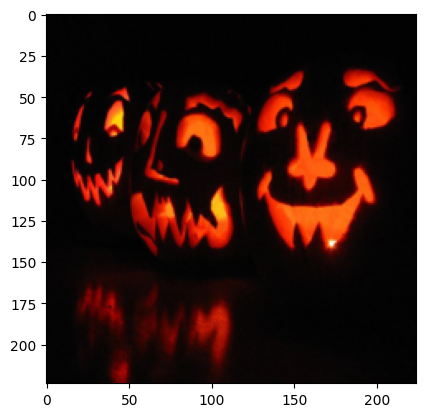

In [28]:
# imsave this to the correct directory (has same name as image but contains all max activ. imagenet imgs)
plt.imshow(  val_data_visualize[29566][0].permute(1, 2, 0)  )
plt.imsave("/workspace/pumpkintest.png",  val_data_visualize[29566][0].permute(1, 2, 0).numpy()  )

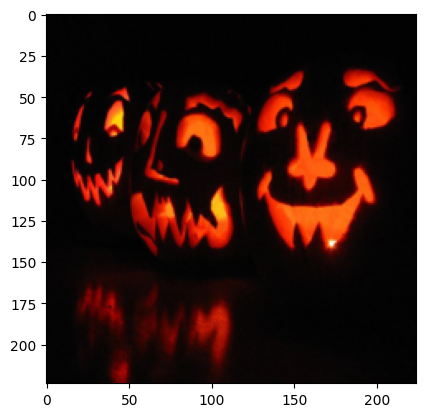

In [29]:
plt.imshow(plt.imread("/workspace/pumpkintest.png"))

In [20]:
cfg.max_image_output_folder

'/workspace/sae_checkpoints/max_images/sparse-autoencoder-clip-b-32-sae-vanilla-x64-layer-2-hook_mlp_out-l1-0.0001/layer_9'

### MAI Interp Experiments

### Clip Labeling AutoInterp

In [23]:
# all_imagenet_class_names

In [43]:
selected_dir
cfg.max_image_output_folder

'/workspace/sae_checkpoints/max_images/8e32860c-clip-b-sae-gated-all-tokens-x64-layer-9-mlp-out-v1/layer_9'

In [16]:
from PIL import Image
import os
import IPython


dir_feat_sets = {}
feat_ids_by_band = {}
feat_ids = []
imgnet_labels = []
ds_ids = []
selected_dir = 'TOTAL_logfreq_[-2,-1]'
for dir_name in [selected_dir]:
    print(os.listdir(cfg.max_image_output_folder + "/" + dir_name))
    print(len(os.listdir(cfg.max_image_output_folder + "/" + dir_name)))
    images = []
    img_dir = cfg.max_image_output_folder + "/" + dir_name
    i = 0
    dir_feats = set()
    for imagefile in os.listdir(img_dir):
        print(i)
        print(imagefile)
        _, feat_id, imgnet_label, ds_id = imagefile.split(":")
        feat_ids_by_band[feat_id] = dir_name
        dir_feats.add(feat_id)
        feat_ids.append(feat_id)
        imgnet_labels.append(imgnet_label)
        ds_ids.append(ds_id)
        i += 1
        IPython.display.Image(img_dir + "/" +imagefile)
        try:
            image = preproc(Image.open(img_dir + "/" + imagefile))
            images.append(image)
        except Exception as e:
            print(e)
    with torch.no_grad(), torch.cuda.amp.autocast():
        feature_ma_image_embeds = og_model.cuda().encode_image(torch.stack(images).cuda())
    dir_feat_sets[dir_name] = dir_feats

['neglogfreq_1.9688340425491333feauture_id:46905label:chain_mailbid:47838.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:four_posterbid:23838.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:shopping_basketbid:45366.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:shopping_cartbid:11854.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:barrelbid:14203.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:Irish_terrierbid:32238.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:cardoonbid:35927.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:chestbid:42635.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:acoustic_guitarbid:3440.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:remote_controlbid:49012.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:digital_watchbid:33471.png', 'neglogfreq_1.9688340425491333feauture_id:46905label:radio_telescopebid:17713.png', 'neglogfreq_1.9688340425491333feaut

18
neglogfreq_1.683434247970581feauture_id:24679label:coilbid:46330.png
19
neglogfreq_1.683434247970581feauture_id:24679label:prairie_chickenbid:17429.png
20
neglogfreq_1.683434247970581feauture_id:24679label:impalabid:43783.png
21
neglogfreq_1.683434247970581feauture_id:24679label:hartebeestbid:46721.png
22
neglogfreq_1.683434247970581feauture_id:24679label:promontorybid:35569.png
23
neglogfreq_1.683434247970581feauture_id:24679label:lemonbid:28822.png
24
neglogfreq_1.683434247970581feauture_id:24679label:Shetland_sheepdogbid:1970.png
25
neglogfreq_1.683434247970581feauture_id:24679label:squirrel_monkeybid:37239.png
26
neglogfreq_1.683434247970581feauture_id:24679label:monasterybid:811.png
27
neglogfreq_1.683434247970581feauture_id:24679label:speedboatbid:4635.png
28
neglogfreq_1.683434247970581feauture_id:24679label:komondorbid:45247.png
29
neglogfreq_1.683434247970581feauture_id:24679label:guenonbid:2542.png
30
neglogfreq_1.683434247970581feauture_id:24679label:Pekinesebid:7222.png


134
neglogfreq_1.6109473705291748feauture_id:18688label:broccolibid:38203.png
135
neglogfreq_1.6109473705291748feauture_id:18688label:handkerchiefbid:48408.png
136
neglogfreq_1.6109473705291748feauture_id:18688label:American_alligatorbid:22521.png
137
neglogfreq_1.6109473705291748feauture_id:18688label:wooden_spoonbid:8201.png
138
neglogfreq_1.6109473705291748feauture_id:18688label:washbasinbid:13522.png
139
neglogfreq_1.6109473705291748feauture_id:18688label:zebrabid:24007.png
140
neglogfreq_1.6109473705291748feauture_id:18688label:radiatorbid:17546.png
141
neglogfreq_1.6109473705291748feauture_id:18688label:quiltbid:48319.png
142
neglogfreq_1.6109473705291748feauture_id:18688label:envelopebid:21509.png
143
neglogfreq_1.6109473705291748feauture_id:18688label:pillowbid:48473.png
144
neglogfreq_1.627308964729309feauture_id:236label:hamperbid:26424.png
145
neglogfreq_1.627308964729309feauture_id:236label:lumbermillbid:24322.png
146
neglogfreq_1.627308964729309feauture_id:236label:stone_w

241
neglogfreq_1.7389371395111084feauture_id:24765label:butternut_squashbid:11944.png
242
neglogfreq_1.7389371395111084feauture_id:24765label:pineapplebid:30542.png
243
neglogfreq_1.7389371395111084feauture_id:24765label:sea_lionbid:22357.png
244
neglogfreq_1.7389371395111084feauture_id:24765label:house_finchbid:15829.png
245
neglogfreq_1.7389371395111084feauture_id:24765label:Dutch_ovenbid:43854.png
246
neglogfreq_1.7389371395111084feauture_id:24765label:hourglassbid:23966.png
247
neglogfreq_1.7389371395111084feauture_id:24765label:Irish_water_spanielbid:13758.png
248
neglogfreq_1.7389371395111084feauture_id:24765label:butternut_squashbid:35219.png
249
neglogfreq_1.7389371395111084feauture_id:24765label:lumbermillbid:6141.png
250
neglogfreq_1.7389371395111084feauture_id:24765label:traybid:4805.png
251
neglogfreq_1.7389371395111084feauture_id:24765label:butternut_squashbid:32115.png
252
neglogfreq_1.7389371395111084feauture_id:24765label:cratebid:27542.png
253
neglogfreq_1.738937139511

348
neglogfreq_1.9745957851409912feauture_id:44304label:cassette_playerbid:12467.png
349
neglogfreq_1.9745957851409912feauture_id:44304label:Dutch_ovenbid:30668.png
350
neglogfreq_1.9745957851409912feauture_id:44304label:manhole_coverbid:49677.png
351
neglogfreq_1.9745957851409912feauture_id:44304label:lens_capbid:33153.png
352
neglogfreq_1.9971777200698853feauture_id:34942label:window_screenbid:22777.png
353
neglogfreq_1.9971777200698853feauture_id:34942label:pizzabid:12242.png
354
neglogfreq_1.9971777200698853feauture_id:34942label:strainerbid:17350.png
355
neglogfreq_1.9971777200698853feauture_id:34942label:tiger_catbid:3294.png
356
neglogfreq_1.9971777200698853feauture_id:34942label:bath_towelbid:48416.png
357
neglogfreq_1.9971777200698853feauture_id:34942label:bitternbid:44564.png
358
neglogfreq_1.9971777200698853feauture_id:34942label:greenhousebid:2473.png
359
neglogfreq_1.9971777200698853feauture_id:34942label:Petri_dishbid:39323.png
360
neglogfreq_1.9971777200698853feauture_id

461
neglogfreq_1.620854139328003feauture_id:29459label:organbid:7205.png
462
neglogfreq_1.620854139328003feauture_id:29459label:leopardbid:37031.png
463
neglogfreq_1.620854139328003feauture_id:29459label:bloodhoundbid:9962.png
464
neglogfreq_1.6946659088134766feauture_id:28390label:bannisterbid:48425.png
465
neglogfreq_1.6946659088134766feauture_id:28390label:geyserbid:42471.png
466
neglogfreq_1.6946659088134766feauture_id:28390label:lakesidebid:20068.png
467
neglogfreq_1.6946659088134766feauture_id:28390label:scalebid:35229.png
468
neglogfreq_1.6946659088134766feauture_id:28390label:centipedebid:38503.png
469
neglogfreq_1.6946659088134766feauture_id:28390label:hogbid:17373.png
470
neglogfreq_1.6946659088134766feauture_id:28390label:spider_webbid:46666.png
471
neglogfreq_1.6946659088134766feauture_id:28390label:guillotinebid:26033.png
472
neglogfreq_1.6946659088134766feauture_id:28390label:nematodebid:1881.png
473
neglogfreq_1.6946659088134766feauture_id:28390label:mailboxbid:24782.png

567
neglogfreq_1.945218563079834feauture_id:19544label:Siamese_catbid:34253.png
568
neglogfreq_1.945218563079834feauture_id:19544label:African_greybid:49312.png
569
neglogfreq_1.945218563079834feauture_id:19544label:beaconbid:11021.png
570
neglogfreq_1.945218563079834feauture_id:19544label:barometerbid:14483.png
571
neglogfreq_1.945218563079834feauture_id:19544label:mazebid:5132.png
572
neglogfreq_1.945218563079834feauture_id:19544label:wallabybid:26605.png
573
neglogfreq_1.945218563079834feauture_id:19544label:cougarbid:37622.png
574
neglogfreq_1.945218563079834feauture_id:19544label:weevilbid:16769.png
575
neglogfreq_1.945218563079834feauture_id:19544label:orangebid:14839.png
576
neglogfreq_1.6131017208099365feauture_id:20728label:jackfruitbid:48158.png
577
neglogfreq_1.6131017208099365feauture_id:20728label:lemonbid:30966.png
578
neglogfreq_1.6131017208099365feauture_id:20728label:packetbid:11689.png
579
neglogfreq_1.6131017208099365feauture_id:20728label:burritobid:45722.png
580
ne

673
neglogfreq_1.8757306337356567feauture_id:20703label:cabbid:21300.png
674
neglogfreq_1.8757306337356567feauture_id:20703label:fire_screenbid:1412.png
675
neglogfreq_1.8757306337356567feauture_id:20703label:fire_screenbid:36331.png
676
neglogfreq_1.8757306337356567feauture_id:20703label:skunkbid:180.png
677
neglogfreq_1.8757306337356567feauture_id:20703label:bakerybid:22862.png
678
neglogfreq_1.8757306337356567feauture_id:20703label:scabbardbid:2305.png
679
neglogfreq_1.8757306337356567feauture_id:20703label:mailboxbid:8670.png
680
neglogfreq_1.8757306337356567feauture_id:20703label:hamperbid:26424.png
681
neglogfreq_1.8757306337356567feauture_id:20703label:stovebid:49250.png
682
neglogfreq_1.8757306337356567feauture_id:20703label:maypolebid:14530.png
683
neglogfreq_1.8757306337356567feauture_id:20703label:jeanbid:14985.png
684
neglogfreq_1.8757306337356567feauture_id:20703label:stovebid:46913.png
685
neglogfreq_1.8757306337356567feauture_id:20703label:radiobid:35361.png
686
neglogfr

777
neglogfreq_1.9708435535430908feauture_id:22711label:spindlebid:1656.png
778
neglogfreq_1.9708435535430908feauture_id:22711label:flatwormbid:16704.png
779
neglogfreq_1.9708435535430908feauture_id:22711label:anemone_fishbid:45824.png
780
neglogfreq_1.9708435535430908feauture_id:22711label:sea_anemonebid:22968.png
781
neglogfreq_1.9708435535430908feauture_id:22711label:hen_of_the_woodsbid:17079.png
782
neglogfreq_1.9708435535430908feauture_id:22711label:spotted_salamanderbid:87.png
783
neglogfreq_1.9708435535430908feauture_id:22711label:earthstarbid:5287.png
784
neglogfreq_1.6394597291946411feauture_id:13436label:running_shoebid:38921.png
785
neglogfreq_1.6394597291946411feauture_id:13436label:oboebid:32256.png
786
neglogfreq_1.6394597291946411feauture_id:13436label:lionbid:14656.png
787
neglogfreq_1.6394597291946411feauture_id:13436label:cowboy_bootbid:8081.png
788
neglogfreq_1.6394597291946411feauture_id:13436label:African_crocodilebid:49953.png
789
neglogfreq_1.6394597291946411feau

888
neglogfreq_1.9568893909454346feauture_id:46485label:ringneck_snakebid:13801.png
889
neglogfreq_1.9568893909454346feauture_id:46485label:fiddler_crabbid:21268.png
890
neglogfreq_1.9568893909454346feauture_id:46485label:American_chameleonbid:11517.png
891
neglogfreq_1.9568893909454346feauture_id:46485label:rulebid:22378.png
892
neglogfreq_1.9568893909454346feauture_id:46485label:window_screenbid:22728.png
893
neglogfreq_1.9568893909454346feauture_id:46485label:spider_webbid:18750.png
894
neglogfreq_1.9568893909454346feauture_id:46485label:daisybid:13145.png
895
neglogfreq_1.9568893909454346feauture_id:46485label:strawberrybid:48022.png
896
neglogfreq_1.468260645866394feauture_id:18987label:wokbid:34694.png
897
neglogfreq_1.468260645866394feauture_id:18987label:lacewingbid:47938.png
898
neglogfreq_1.468260645866394feauture_id:18987label:screwbid:34833.png
899
neglogfreq_1.468260645866394feauture_id:18987label:volcanobid:42445.png
900
neglogfreq_1.468260645866394feauture_id:18987label:

997
neglogfreq_1.7682247161865234feauture_id:18571label:maskbid:35728.png
998
neglogfreq_1.7682247161865234feauture_id:18571label:sea_anemonebid:2653.png
999
neglogfreq_1.7682247161865234feauture_id:18571label:vestmentbid:31517.png
1000
neglogfreq_1.7682247161865234feauture_id:18571label:theater_curtainbid:11245.png
1001
neglogfreq_1.7682247161865234feauture_id:18571label:tiger_sharkbid:13627.png
1002
neglogfreq_1.7682247161865234feauture_id:18571label:minkbid:36870.png
1003
neglogfreq_1.7682247161865234feauture_id:18571label:tiger_catbid:3041.png
1004
neglogfreq_1.7682247161865234feauture_id:18571label:Petri_dishbid:3046.png
1005
neglogfreq_1.7682247161865234feauture_id:18571label:strainerbid:37514.png
1006
neglogfreq_1.7682247161865234feauture_id:18571label:custard_applebid:31969.png
1007
neglogfreq_1.7682247161865234feauture_id:18571label:pitcherbid:9106.png
1008
neglogfreq_1.8865915536880493feauture_id:30970label:ironbid:31725.png
1009
neglogfreq_1.8865915536880493feauture_id:30970

1108
neglogfreq_1.8438265323638916feauture_id:36311label:llamabid:10440.png
1109
neglogfreq_1.8438265323638916feauture_id:36311label:capuchinbid:38838.png
1110
neglogfreq_1.8438265323638916feauture_id:36311label:cranebid:4175.png
1111
neglogfreq_1.8438265323638916feauture_id:36311label:titibid:19960.png
1112
neglogfreq_1.8438265323638916feauture_id:36311label:green_lizardbid:47009.png
1113
neglogfreq_1.8438265323638916feauture_id:36311label:three_toed_slothbid:48083.png
1114
neglogfreq_1.8438265323638916feauture_id:36311label:jack_o__lanternbid:9970.png
1115
neglogfreq_1.8438265323638916feauture_id:36311label:butcher_shopbid:43321.png
1116
neglogfreq_1.8438265323638916feauture_id:36311label:potbid:12646.png
1117
neglogfreq_1.8438265323638916feauture_id:36311label:earbid:13709.png
1118
neglogfreq_1.8438265323638916feauture_id:36311label:tree_frogbid:43368.png
1119
neglogfreq_1.8438265323638916feauture_id:36311label:leafhopperbid:45723.png
1120
neglogfreq_1.8438265323638916feauture_id:36

1213
neglogfreq_1.7151904106140137feauture_id:27595label:bulletproof_vestbid:31559.png
1214
neglogfreq_1.7151904106140137feauture_id:27595label:cornbid:35468.png
1215
neglogfreq_1.7151904106140137feauture_id:27595label:cliff_dwellingbid:18708.png
1216
neglogfreq_1.7151904106140137feauture_id:27595label:whistlebid:40551.png
1217
neglogfreq_1.7151904106140137feauture_id:27595label:woolbid:14148.png
1218
neglogfreq_1.9167698621749878feauture_id:32332label:breastplatebid:9113.png
1219
neglogfreq_1.9167698621749878feauture_id:32332label:loudspeakerbid:41209.png
1220
neglogfreq_1.9167698621749878feauture_id:32332label:dragonflybid:28380.png
1221
neglogfreq_1.9167698621749878feauture_id:32332label:American_chameleonbid:11128.png
1222
neglogfreq_1.9167698621749878feauture_id:32332label:cauliflowerbid:10590.png
1223
neglogfreq_1.9167698621749878feauture_id:32332label:quillbid:7805.png
1224
neglogfreq_1.9167698621749878feauture_id:32332label:traffic_lightbid:39107.png
1225
neglogfreq_1.916769862

1322
neglogfreq_1.9686886072158813feauture_id:12983label:daisybid:49435.png
1323
neglogfreq_1.9686886072158813feauture_id:12983label:microphonebid:35324.png
1324
neglogfreq_1.9686886072158813feauture_id:12983label:daisybid:39136.png
1325
neglogfreq_1.9686886072158813feauture_id:12983label:daisybid:13145.png
1326
neglogfreq_1.9686886072158813feauture_id:12983label:dalmatianbid:48235.png
1327
neglogfreq_1.9686886072158813feauture_id:12983label:candlebid:7579.png
1328
neglogfreq_1.9686886072158813feauture_id:12983label:bananabid:42013.png
1329
neglogfreq_1.7214659452438354feauture_id:10054label:bell_pepperbid:27570.png
1330
neglogfreq_1.7214659452438354feauture_id:10054label:earbid:42320.png
1331
neglogfreq_1.7214659452438354feauture_id:10054label:bell_pepperbid:28372.png
1332
neglogfreq_1.7214659452438354feauture_id:10054label:carbonarabid:2082.png
1333
neglogfreq_1.7214659452438354feauture_id:10054label:cornbid:17073.png
1334
neglogfreq_1.7214659452438354feauture_id:10054label:orangebid

1433
neglogfreq_1.9983183145523071feauture_id:25007label:jaybid:15194.png
1434
neglogfreq_1.9983183145523071feauture_id:25007label:pomegranatebid:4346.png
1435
neglogfreq_1.9983183145523071feauture_id:25007label:dung_beetlebid:13313.png
1436
neglogfreq_1.9983183145523071feauture_id:25007label:dingobid:21766.png
1437
neglogfreq_1.9983183145523071feauture_id:25007label:Dandie_Dinmontbid:9035.png
1438
neglogfreq_1.9983183145523071feauture_id:25007label:buckeyebid:43122.png
1439
neglogfreq_1.9983183145523071feauture_id:25007label:ice_bearbid:2104.png
1440
neglogfreq_1.9983183145523071feauture_id:25007label:cairnbid:38485.png
1441
neglogfreq_1.9897340536117554feauture_id:33059label:lemonbid:7457.png
1442
neglogfreq_1.9897340536117554feauture_id:33059label:porcupinebid:24324.png
1443
neglogfreq_1.9897340536117554feauture_id:33059label:green_lizardbid:26625.png
1444
neglogfreq_1.9897340536117554feauture_id:33059label:frilled_lizardbid:1723.png
1445
neglogfreq_1.9897340536117554feauture_id:330

1540
neglogfreq_1.7706152200698853feauture_id:8589label:goldfishbid:13622.png
1541
neglogfreq_1.7706152200698853feauture_id:8589label:lipstickbid:10805.png
1542
neglogfreq_1.7706152200698853feauture_id:8589label:pickbid:1364.png
1543
neglogfreq_1.7706152200698853feauture_id:8589label:spatulabid:13085.png
1544
neglogfreq_1.7706152200698853feauture_id:8589label:confectionerybid:28173.png
1545
neglogfreq_1.7706152200698853feauture_id:8589label:pinwheelbid:30281.png
1546
neglogfreq_1.7706152200698853feauture_id:8589label:confectionerybid:34517.png
1547
neglogfreq_1.7706152200698853feauture_id:8589label:shower_curtainbid:6851.png
1548
neglogfreq_1.7706152200698853feauture_id:8589label:spaghetti_squashbid:25706.png
1549
neglogfreq_1.7706152200698853feauture_id:8589label:plate_rackbid:44070.png
1550
neglogfreq_1.7706152200698853feauture_id:8589label:umbrellabid:30929.png
1551
neglogfreq_1.7706152200698853feauture_id:8589label:kimonobid:6656.png
1552
neglogfreq_1.366786241531372feauture_id:583

1652
neglogfreq_1.963546872138977feauture_id:41552label:tile_roofbid:22778.png
1653
neglogfreq_1.963546872138977feauture_id:41552label:oystercatcherbid:35488.png
1654
neglogfreq_1.963546872138977feauture_id:41552label:tile_roofbid:35491.png
1655
neglogfreq_1.963546872138977feauture_id:41552label:swimming_trunksbid:16071.png
1656
neglogfreq_1.963546872138977feauture_id:41552label:dung_beetlebid:4003.png
1657
neglogfreq_1.963546872138977feauture_id:41552label:green_lizardbid:35817.png
1658
neglogfreq_1.963546872138977feauture_id:41552label:envelopebid:23705.png
1659
neglogfreq_1.963546872138977feauture_id:41552label:komondorbid:45247.png
1660
neglogfreq_1.963546872138977feauture_id:41552label:West_Highland_white_terrierbid:45583.png
1661
neglogfreq_1.963546872138977feauture_id:41552label:artichokebid:11407.png
1662
neglogfreq_1.963546872138977feauture_id:41552label:French_loafbid:4198.png
1663
neglogfreq_1.963546872138977feauture_id:41552label:cratebid:45563.png
1664
neglogfreq_1.7551590

1759
neglogfreq_1.988074541091919feauture_id:9771label:soccer_ballbid:32237.png
1760
neglogfreq_1.82853102684021feauture_id:28574label:sandbarbid:33186.png
1761
neglogfreq_1.82853102684021feauture_id:28574label:dugongbid:25640.png
1762
neglogfreq_1.82853102684021feauture_id:28574label:paintbrushbid:11839.png
1763
neglogfreq_1.82853102684021feauture_id:28574label:dugongbid:39157.png
1764
neglogfreq_1.82853102684021feauture_id:28574label:dugongbid:1607.png
1765
neglogfreq_1.82853102684021feauture_id:28574label:sea_cucumberbid:42638.png
1766
neglogfreq_1.82853102684021feauture_id:28574label:jerseybid:14014.png
1767
neglogfreq_1.82853102684021feauture_id:28574label:tiger_sharkbid:29567.png
1768
neglogfreq_1.82853102684021feauture_id:28574label:standard_poodlebid:12254.png
1769
neglogfreq_1.82853102684021feauture_id:28574label:sandbarbid:144.png
1770
neglogfreq_1.82853102684021feauture_id:28574label:consommebid:20384.png
1771
neglogfreq_1.82853102684021feauture_id:28574label:tiger_sharkbid:

1869
neglogfreq_1.9646023511886597feauture_id:45581label:alpbid:30498.png
1870
neglogfreq_1.9646023511886597feauture_id:45581label:volcanobid:19379.png
1871
neglogfreq_1.9646023511886597feauture_id:45581label:alpbid:5474.png
1872
neglogfreq_1.9646023511886597feauture_id:45581label:mountain_tentbid:42645.png
1873
neglogfreq_1.647778868675232feauture_id:34280label:radiatorbid:30120.png
1874
neglogfreq_1.647778868675232feauture_id:34280label:tile_roofbid:14609.png
1875
neglogfreq_1.647778868675232feauture_id:34280label:rock_crabbid:27217.png
1876
neglogfreq_1.647778868675232feauture_id:34280label:organbid:165.png
1877
neglogfreq_1.647778868675232feauture_id:34280label:Loaferbid:16344.png
1878
neglogfreq_1.647778868675232feauture_id:34280label:figbid:47227.png
1879
neglogfreq_1.647778868675232feauture_id:34280label:acorn_squashbid:42452.png
1880
neglogfreq_1.647778868675232feauture_id:34280label:lipstickbid:44844.png
1881
neglogfreq_1.647778868675232feauture_id:34280label:radiatorbid:23520

1981
neglogfreq_1.9471830129623413feauture_id:42193label:guacamolebid:28460.png
1982
neglogfreq_1.9471830129623413feauture_id:42193label:horned_viperbid:16468.png
1983
neglogfreq_1.9471830129623413feauture_id:42193label:guacamolebid:8061.png
1984
neglogfreq_1.9471830129623413feauture_id:42193label:mashed_potatobid:9674.png
1985
neglogfreq_1.9288105964660645feauture_id:5536label:coilbid:1980.png
1986
neglogfreq_1.9288105964660645feauture_id:5536label:chain_mailbid:30113.png
1987
neglogfreq_1.9288105964660645feauture_id:5536label:chainlink_fencebid:38989.png
1988
neglogfreq_1.9288105964660645feauture_id:5536label:strainerbid:45448.png
1989
neglogfreq_1.9288105964660645feauture_id:5536label:wine_bottlebid:19153.png
1990
neglogfreq_1.9288105964660645feauture_id:5536label:barrelbid:41780.png
1991
neglogfreq_1.9288105964660645feauture_id:5536label:cupbid:42253.png
1992
neglogfreq_1.9288105964660645feauture_id:5536label:chain_mailbid:44328.png
1993
neglogfreq_1.9288105964660645feauture_id:553

2092
neglogfreq_1.9492028951644897feauture_id:34180label:robinbid:45149.png
2093
neglogfreq_1.9492028951644897feauture_id:34180label:wolf_spiderbid:8819.png
2094
neglogfreq_1.9492028951644897feauture_id:34180label:long_horned_beetlebid:41505.png
2095
neglogfreq_1.9492028951644897feauture_id:34180label:harvestmanbid:4145.png
2096
neglogfreq_1.9492028951644897feauture_id:34180label:hookbid:31084.png
2097
neglogfreq_1.892112135887146feauture_id:46842label:scorpionbid:31683.png
2098
neglogfreq_1.892112135887146feauture_id:46842label:Loaferbid:20302.png
2099
neglogfreq_1.892112135887146feauture_id:46842label:pencil_boxbid:11918.png
2100
neglogfreq_1.892112135887146feauture_id:46842label:lycaenidbid:32861.png
2101
neglogfreq_1.892112135887146feauture_id:46842label:chickadeebid:20468.png
2102
neglogfreq_1.892112135887146feauture_id:46842label:eftbid:12764.png
2103
neglogfreq_1.892112135887146feauture_id:46842label:oil_filterbid:7572.png
2104
neglogfreq_1.892112135887146feauture_id:46842label:

2201
neglogfreq_1.7117507457733154feauture_id:15420label:redshankbid:40470.png
2202
neglogfreq_1.7117507457733154feauture_id:15420label:coilbid:1350.png
2203
neglogfreq_1.993499755859375feauture_id:13437label:vasebid:42915.png
2204
neglogfreq_1.7117507457733154feauture_id:15420label:platypusbid:28259.png
2205
neglogfreq_1.7117507457733154feauture_id:15420label:dishragbid:35641.png
2206
neglogfreq_1.7117507457733154feauture_id:15420label:pill_bottlebid:37865.png
2207
neglogfreq_1.7117507457733154feauture_id:15420label:balloonbid:2117.png
2208
neglogfreq_1.7117507457733154feauture_id:15420label:kitebid:36355.png
2209
neglogfreq_1.7117507457733154feauture_id:15420label:nipplebid:539.png
2210
neglogfreq_1.7117507457733154feauture_id:15420label:flamingobid:45783.png
2211
neglogfreq_1.5586442947387695feauture_id:36795label:holsterbid:44336.png
2212
neglogfreq_1.5586442947387695feauture_id:36795label:ocarinabid:31147.png
2213
neglogfreq_1.5586442947387695feauture_id:36795label:sea_snakebid:21

2310
neglogfreq_1.9775055646896362feauture_id:43872label:Eskimo_dogbid:2065.png
2311
neglogfreq_1.9775055646896362feauture_id:43872label:carpenter_s_kitbid:9309.png
2312
neglogfreq_1.9775055646896362feauture_id:43872label:potter_s_wheelbid:38357.png
2313
neglogfreq_1.9775055646896362feauture_id:43872label:Petri_dishbid:49599.png
2314
neglogfreq_1.9775055646896362feauture_id:43872label:chainbid:46588.png
2315
neglogfreq_1.9775055646896362feauture_id:43872label:cliffbid:46021.png
2316
neglogfreq_1.9775055646896362feauture_id:43872label:chainbid:14189.png
2317
neglogfreq_1.9775055646896362feauture_id:43872label:grocery_storebid:3567.png
2318
neglogfreq_1.9775055646896362feauture_id:43872label:parachutebid:39044.png
2319
neglogfreq_1.9775055646896362feauture_id:43872label:butternut_squashbid:17448.png
2320
neglogfreq_1.9775055646896362feauture_id:43872label:American_black_bearbid:19861.png
2321
neglogfreq_1.9775055646896362feauture_id:43872label:chitonbid:43300.png
2322
neglogfreq_1.977505

2415
neglogfreq_1.868355631828308feauture_id:48002label:sorrelbid:49604.png
2416
neglogfreq_1.868355631828308feauture_id:48002label:zebrabid:2788.png
2417
neglogfreq_1.868355631828308feauture_id:48002label:sorrelbid:41331.png
2418
neglogfreq_1.868355631828308feauture_id:48002label:sorrelbid:18927.png
2419
neglogfreq_1.709725022315979feauture_id:20426label:cassettebid:1673.png
2420
neglogfreq_1.709725022315979feauture_id:20426label:Shetland_sheepdogbid:31874.png
2421
neglogfreq_1.709725022315979feauture_id:20426label:soap_dispenserbid:28405.png
2422
neglogfreq_1.709725022315979feauture_id:20426label:toy_poodlebid:11510.png
2423
neglogfreq_1.709725022315979feauture_id:20426label:safety_pinbid:45930.png
2424
neglogfreq_1.709725022315979feauture_id:20426label:cockroachbid:36879.png
2425
neglogfreq_1.709725022315979feauture_id:20426label:toy_poodlebid:47861.png
2426
neglogfreq_1.709725022315979feauture_id:20426label:hair_slidebid:21957.png
2427
neglogfreq_1.709725022315979feauture_id:20426l

2523
neglogfreq_1.7827898263931274feauture_id:19384label:beebid:17874.png
2524
neglogfreq_1.7827898263931274feauture_id:19384label:dishragbid:44278.png
2525
neglogfreq_1.7827898263931274feauture_id:19384label:sea_cucumberbid:11856.png
2526
neglogfreq_1.7827898263931274feauture_id:19384label:isopodbid:3661.png
2527
neglogfreq_1.7827898263931274feauture_id:19384label:monarchbid:46962.png
2528
neglogfreq_1.7827898263931274feauture_id:19384label:anemone_fishbid:21889.png
2529
neglogfreq_1.7827898263931274feauture_id:19384label:fiddler_crabbid:21268.png
2530
neglogfreq_1.6051632165908813feauture_id:46488label:chitonbid:40592.png
2531
neglogfreq_1.6051632165908813feauture_id:46488label:Dandie_Dinmontbid:20900.png
2532
neglogfreq_1.6051632165908813feauture_id:46488label:sea_urchinbid:1593.png
2533
neglogfreq_1.6051632165908813feauture_id:46488label:velvetbid:4738.png
2534
neglogfreq_1.6051632165908813feauture_id:46488label:slugbid:29474.png
2535
neglogfreq_1.6051632165908813feauture_id:46488l

2633
neglogfreq_1.933897852897644feauture_id:17067label:bell_pepperbid:28968.png
2634
neglogfreq_1.933897852897644feauture_id:17067label:clogbid:30063.png
2635
neglogfreq_1.933897852897644feauture_id:17067label:abacusbid:38791.png
2636
neglogfreq_1.933897852897644feauture_id:17067label:head_cabbagebid:15436.png
2637
neglogfreq_1.933897852897644feauture_id:17067label:grocery_storebid:44728.png
2638
neglogfreq_1.933897852897644feauture_id:17067label:buckeyebid:48676.png
2639
neglogfreq_1.933897852897644feauture_id:17067label:figbid:27115.png
2640
neglogfreq_1.933897852897644feauture_id:17067label:ballpointbid:36776.png
2641
neglogfreq_1.933897852897644feauture_id:17067label:screwbid:38633.png
2642
neglogfreq_1.933897852897644feauture_id:17067label:ballpointbid:14391.png
2643
neglogfreq_1.9400581121444702feauture_id:32487label:ground_beetlebid:29324.png
2644
neglogfreq_1.9400581121444702feauture_id:32487label:garbid:38032.png
2645
neglogfreq_1.9400581121444702feauture_id:32487label:echidn

2737
neglogfreq_1.6477481126785278feauture_id:20110label:crash_helmetbid:13301.png
2738
neglogfreq_1.6477481126785278feauture_id:20110label:figbid:42120.png
2739
neglogfreq_1.6477481126785278feauture_id:20110label:drakebid:22363.png
2740
neglogfreq_1.8474549055099487feauture_id:10632label:piratebid:965.png
2741
neglogfreq_1.8474549055099487feauture_id:10632label:beach_wagonbid:27048.png
2742
neglogfreq_1.8474549055099487feauture_id:10632label:yawlbid:6741.png
2743
neglogfreq_1.8474549055099487feauture_id:10632label:laptopbid:24551.png
2744
neglogfreq_1.5422452688217163feauture_id:15970label:beebid:16466.png
2745
neglogfreq_1.8474549055099487feauture_id:10632label:laptopbid:1712.png
2746
neglogfreq_1.8474549055099487feauture_id:10632label:hand_held_computerbid:22546.png
2747
neglogfreq_1.8474549055099487feauture_id:10632label:laptopbid:5939.png
2748
neglogfreq_1.8474549055099487feauture_id:10632label:letter_openerbid:33290.png
2749
neglogfreq_1.8474549055099487feauture_id:10632label:des

2847
neglogfreq_1.8409264087677002feauture_id:38477label:standard_schnauzerbid:9588.png
2848
neglogfreq_1.8409264087677002feauture_id:38477label:kit_foxbid:8630.png
2849
neglogfreq_1.8409264087677002feauture_id:38477label:warthogbid:11042.png
2850
neglogfreq_1.8409264087677002feauture_id:38477label:bitternbid:45950.png
2851
neglogfreq_1.8409264087677002feauture_id:38477label:echidnabid:2521.png
2852
neglogfreq_1.8409264087677002feauture_id:38477label:quailbid:12222.png
2853
neglogfreq_1.9996006488800049feauture_id:31909label:Arabian_camelbid:42230.png
2854
neglogfreq_1.9996006488800049feauture_id:31909label:little_blue_heronbid:41563.png
2855
neglogfreq_1.9996006488800049feauture_id:31909label:wall_clockbid:8739.png
2856
neglogfreq_1.9996006488800049feauture_id:31909label:monarchbid:46962.png
2857
neglogfreq_1.9996006488800049feauture_id:31909label:scoreboardbid:48153.png
2858
neglogfreq_1.9996006488800049feauture_id:31909label:jack_o__lanternbid:28059.png
2859
neglogfreq_1.99960064888

2960
neglogfreq_1.9957818984985352feauture_id:27716label:Salukibid:27809.png
2961
neglogfreq_1.9957818984985352feauture_id:27716label:Appenzellerbid:19682.png
2962
neglogfreq_1.9957818984985352feauture_id:27716label:dishragbid:11065.png
2963
neglogfreq_1.9957818984985352feauture_id:27716label:rain_barrelbid:44148.png
2964
neglogfreq_1.9957818984985352feauture_id:27716label:lakesidebid:18064.png
2965
neglogfreq_1.6187260150909424feauture_id:30605label:hamperbid:18718.png
2966
neglogfreq_1.6187260150909424feauture_id:30605label:matchstickbid:42825.png
2967
neglogfreq_1.6187260150909424feauture_id:30605label:wooden_spoonbid:20638.png
2968
neglogfreq_1.6187260150909424feauture_id:30605label:butternut_squashbid:17448.png
2969
neglogfreq_1.6187260150909424feauture_id:30605label:cornbid:6205.png
2970
neglogfreq_1.6187260150909424feauture_id:30605label:shopping_basketbid:48358.png
2971
neglogfreq_1.6187260150909424feauture_id:30605label:spotlightbid:28257.png
2972
neglogfreq_1.6187260150909424

3070
neglogfreq_1.9330929517745972feauture_id:26953label:pickelhaubebid:5529.png
3071
neglogfreq_1.9330929517745972feauture_id:26953label:lemonbid:34285.png
3072
neglogfreq_1.9330929517745972feauture_id:26953label:football_helmetbid:39808.png
3073
neglogfreq_1.9330929517745972feauture_id:26953label:football_helmetbid:7648.png
3074
neglogfreq_1.9330929517745972feauture_id:26953label:beaconbid:16623.png
3075
neglogfreq_1.9330929517745972feauture_id:26953label:crash_helmetbid:7848.png
3076
neglogfreq_1.9330929517745972feauture_id:26953label:crash_helmetbid:22688.png
3077
neglogfreq_1.682145595550537feauture_id:36308label:envelopebid:21509.png
3078
neglogfreq_1.682145595550537feauture_id:36308label:sorrelbid:23359.png
3079
neglogfreq_1.682145595550537feauture_id:36308label:Siamese_catbid:34253.png
3080
neglogfreq_1.682145595550537feauture_id:36308label:mantisbid:47876.png
3081
neglogfreq_1.682145595550537feauture_id:36308label:burritobid:21768.png
3082
neglogfreq_1.682145595550537feauture_

3181
neglogfreq_1.728455901145935feauture_id:26328label:street_signbid:12161.png
3182
neglogfreq_1.728455901145935feauture_id:26328label:radiobid:47816.png
3183
neglogfreq_1.728455901145935feauture_id:26328label:switchbid:8371.png
3184
neglogfreq_1.728455901145935feauture_id:26328label:printerbid:14578.png
3185
neglogfreq_1.728455901145935feauture_id:26328label:photocopierbid:3064.png
3186
neglogfreq_1.728455901145935feauture_id:26328label:parking_meterbid:2758.png
3187
neglogfreq_1.728455901145935feauture_id:26328label:Polaroid_camerabid:33698.png
3188
neglogfreq_1.728455901145935feauture_id:26328label:linerbid:2092.png
3189
neglogfreq_1.7317403554916382feauture_id:33411label:picket_fencebid:4609.png
3190
neglogfreq_1.7317403554916382feauture_id:33411label:pillowbid:18278.png
3191
neglogfreq_1.7317403554916382feauture_id:33411label:cardiganbid:13561.png
3192
neglogfreq_1.7317403554916382feauture_id:33411label:dining_tablebid:35774.png
3193
neglogfreq_1.7317403554916382feauture_id:3341

3289
neglogfreq_1.98178231716156feauture_id:2625label:sunscreenbid:31806.png
3290
neglogfreq_1.98178231716156feauture_id:2625label:sunscreenbid:48549.png
3291
neglogfreq_1.98178231716156feauture_id:2625label:park_benchbid:48005.png
3292
neglogfreq_1.98178231716156feauture_id:2625label:sunscreenbid:26568.png
3293
neglogfreq_1.98178231716156feauture_id:2625label:lotionbid:24965.png
3294
neglogfreq_1.98178231716156feauture_id:2625label:academic_gownbid:16844.png
3295
neglogfreq_1.98178231716156feauture_id:2625label:packetbid:27638.png
3296
neglogfreq_1.98178231716156feauture_id:2625label:Leonbergbid:48309.png
3297
neglogfreq_1.6555840969085693feauture_id:44266label:organbid:36537.png
3298
neglogfreq_1.6555840969085693feauture_id:44266label:altarbid:22714.png
3299
neglogfreq_1.6555840969085693feauture_id:44266label:altarbid:23704.png
3300
neglogfreq_1.6555840969085693feauture_id:44266label:altarbid:12733.png
3301
neglogfreq_1.6555840969085693feauture_id:44266label:vaultbid:20793.png
3302
n

3394
neglogfreq_1.7376912832260132feauture_id:30944label:window_shadebid:16278.png
3395
neglogfreq_1.7376912832260132feauture_id:30944label:cauliflowerbid:6627.png
3396
neglogfreq_1.7376912832260132feauture_id:30944label:prairie_chickenbid:31937.png
3397
neglogfreq_1.7376912832260132feauture_id:30944label:uprightbid:22153.png
3398
neglogfreq_1.7376912832260132feauture_id:30944label:accordionbid:9599.png
3399
neglogfreq_1.7376912832260132feauture_id:30944label:Bouvier_des_Flandresbid:3833.png
3400
neglogfreq_1.7376912832260132feauture_id:30944label:Sussex_spanielbid:26145.png
3401
neglogfreq_1.7376912832260132feauture_id:30944label:washerbid:1703.png
3402
neglogfreq_1.7376912832260132feauture_id:30944label:polecatbid:2338.png
3403
neglogfreq_1.7376912832260132feauture_id:30944label:mailboxbid:28699.png
3404
neglogfreq_1.7376912832260132feauture_id:30944label:coyotebid:19238.png
3405
neglogfreq_1.7376912832260132feauture_id:30944label:nipplebid:17322.png
3406
neglogfreq_1.737691283226013

3498
neglogfreq_1.544187068939209feauture_id:36464label:green_snakebid:10544.png
3499
neglogfreq_1.544187068939209feauture_id:36464label:horned_viperbid:40316.png
3500
neglogfreq_1.544187068939209feauture_id:36464label:sombrerobid:37400.png
3501
neglogfreq_1.544187068939209feauture_id:36464label:screwdriverbid:38926.png
3502
neglogfreq_1.544187068939209feauture_id:36464label:envelopebid:23705.png
3503
neglogfreq_1.544187068939209feauture_id:36464label:ladybugbid:15974.png
3504
neglogfreq_1.544187068939209feauture_id:36464label:horned_viperbid:25597.png
3505
neglogfreq_1.6389373540878296feauture_id:16056label:eftbid:806.png
3506
neglogfreq_1.6389373540878296feauture_id:16056label:stinkhornbid:10862.png
3507
neglogfreq_1.6389373540878296feauture_id:16056label:juncobid:16676.png
3508
neglogfreq_1.6389373540878296feauture_id:16056label:common_newtbid:49996.png
3509
neglogfreq_1.6389373540878296feauture_id:16056label:gyromitrabid:17983.png
3510
neglogfreq_1.6389373540878296feauture_id:16056

3605
neglogfreq_1.7601501941680908feauture_id:37244label:maracabid:25961.png
3606
neglogfreq_1.7601501941680908feauture_id:37244label:librarybid:28548.png
3607
neglogfreq_1.7601501941680908feauture_id:37244label:cocktail_shakerbid:42305.png
3608
neglogfreq_1.7601501941680908feauture_id:37244label:tile_roofbid:6916.png
3609
neglogfreq_1.7601501941680908feauture_id:37244label:prisonbid:8375.png
3610
neglogfreq_1.7601501941680908feauture_id:37244label:shower_curtainbid:16870.png
3611
neglogfreq_1.7601501941680908feauture_id:37244label:planetariumbid:20095.png
3612
neglogfreq_1.7601501941680908feauture_id:37244label:wooden_spoonbid:17247.png
3613
neglogfreq_1.7601501941680908feauture_id:37244label:restaurantbid:34127.png
3614
neglogfreq_1.7601501941680908feauture_id:37244label:bananabid:23219.png
3615
neglogfreq_1.7601501941680908feauture_id:37244label:cocktail_shakerbid:32427.png
3616
neglogfreq_1.7601501941680908feauture_id:37244label:pencil_sharpenerbid:46577.png
3617
neglogfreq_1.83505

3711
neglogfreq_1.7517913579940796feauture_id:37968label:space_shuttlebid:14978.png
3712
neglogfreq_1.7517913579940796feauture_id:37968label:lorikeetbid:7777.png
3713
neglogfreq_1.9860007762908936feauture_id:16069label:jackfruitbid:18869.png
3714
neglogfreq_1.9860007762908936feauture_id:16069label:tile_roofbid:14609.png
3715
neglogfreq_1.9860007762908936feauture_id:16069label:shower_curtainbid:26849.png
3716
neglogfreq_1.9860007762908936feauture_id:16069label:harvestmanbid:4145.png
3717
neglogfreq_1.9860007762908936feauture_id:16069label:golf_ballbid:35418.png
3718
neglogfreq_1.9860007762908936feauture_id:16069label:sunscreenbid:6885.png
3719
neglogfreq_1.9860007762908936feauture_id:16069label:black_footed_ferretbid:42849.png
3720
neglogfreq_1.9860007762908936feauture_id:16069label:flybid:1762.png
3721
neglogfreq_1.9860007762908936feauture_id:16069label:potbid:41434.png
3722
neglogfreq_1.9860007762908936feauture_id:16069label:restaurantbid:43266.png
3723
neglogfreq_1.9860007762908936fe

3817
neglogfreq_1.6309326887130737feauture_id:36687label:Persian_catbid:32909.png
3818
neglogfreq_1.6309326887130737feauture_id:36687label:handkerchiefbid:41258.png
3819
neglogfreq_1.6309326887130737feauture_id:36687label:golfcartbid:7925.png
3820
neglogfreq_1.6309326887130737feauture_id:36687label:valleybid:4258.png
3821
neglogfreq_1.6309326887130737feauture_id:36687label:digital_watchbid:34568.png
3822
neglogfreq_1.6309326887130737feauture_id:36687label:great_grey_owlbid:4344.png
3823
neglogfreq_1.6309326887130737feauture_id:36687label:trench_coatbid:29050.png
3824
neglogfreq_1.6309326887130737feauture_id:36687label:handkerchiefbid:20446.png
3825
neglogfreq_1.9463684558868408feauture_id:9114label:warplanebid:23333.png
3826
neglogfreq_1.9463684558868408feauture_id:9114label:amphibianbid:41898.png
3827
neglogfreq_1.9463684558868408feauture_id:9114label:wingbid:18080.png
3828
neglogfreq_1.9463684558868408feauture_id:9114label:warplanebid:15305.png
3829
neglogfreq_1.9463684558868408feaut

3921
neglogfreq_1.777908205986023feauture_id:30387label:mongoosebid:36707.png
3922
neglogfreq_1.777908205986023feauture_id:30387label:acornbid:10360.png
3923
neglogfreq_1.777908205986023feauture_id:30387label:eftbid:35304.png
3924
neglogfreq_1.777908205986023feauture_id:30387label:spider_webbid:36671.png
3925
neglogfreq_1.777908205986023feauture_id:30387label:kit_foxbid:42429.png
3926
neglogfreq_1.777908205986023feauture_id:30387label:cliffbid:15028.png
3927
neglogfreq_1.777908205986023feauture_id:30387label:sundialbid:25297.png
3928
neglogfreq_1.777908205986023feauture_id:30387label:European_fire_salamanderbid:14075.png
3929
neglogfreq_1.777908205986023feauture_id:30387label:bubblebid:7371.png
3930
neglogfreq_1.777908205986023feauture_id:30387label:tiger_catbid:45419.png
3931
neglogfreq_1.777908205986023feauture_id:30387label:echidnabid:49051.png
3932
neglogfreq_1.777908205986023feauture_id:30387label:frilled_lizardbid:46516.png
3933
neglogfreq_1.777908205986023feauture_id:30387label:

4034
neglogfreq_1.6083312034606934feauture_id:22757label:gazellebid:28129.png
4035
neglogfreq_1.6083312034606934feauture_id:22757label:tiger_catbid:3294.png
4036
neglogfreq_1.6083312034606934feauture_id:22757label:barracoutabid:4564.png
4037
neglogfreq_1.6083312034606934feauture_id:22757label:tigerbid:18436.png
4038
neglogfreq_1.6083312034606934feauture_id:22757label:digital_watchbid:44417.png
4039
neglogfreq_1.6083312034606934feauture_id:22757label:grocery_storebid:16283.png
4040
neglogfreq_1.6083312034606934feauture_id:22757label:goosebid:43926.png
4041
neglogfreq_1.6083312034606934feauture_id:22757label:grillebid:49340.png
4042
neglogfreq_1.6083312034606934feauture_id:22757label:nailbid:39238.png
4043
neglogfreq_1.6083312034606934feauture_id:22757label:shopping_cartbid:8218.png
4044
neglogfreq_1.6083312034606934feauture_id:22757label:sea_cucumberbid:15242.png
4045
neglogfreq_1.6083312034606934feauture_id:22757label:bramblingbid:23765.png
4046
neglogfreq_1.6083312034606934feauture_id

4144
neglogfreq_1.9979376792907715feauture_id:3831label:artichokebid:41009.png
4145
neglogfreq_1.7570911645889282feauture_id:27677label:barrelbid:41861.png
4146
neglogfreq_1.7570911645889282feauture_id:27677label:confectionerybid:25256.png
4147
neglogfreq_1.7570911645889282feauture_id:27677label:pomegranatebid:40281.png
4148
neglogfreq_1.7570911645889282feauture_id:27677label:pomegranatebid:36667.png
4149
neglogfreq_1.7570911645889282feauture_id:27677label:wigbid:5989.png
4150
neglogfreq_1.7570911645889282feauture_id:27677label:saltshakerbid:34257.png
4151
neglogfreq_1.7570911645889282feauture_id:27677label:tiger_beetlebid:1565.png
4152
neglogfreq_1.7570911645889282feauture_id:27677label:ground_beetlebid:3143.png
4153
neglogfreq_1.7570911645889282feauture_id:27677label:Granny_Smithbid:16930.png
4154
neglogfreq_1.7570911645889282feauture_id:27677label:sloth_bearbid:45671.png
4155
neglogfreq_1.7570911645889282feauture_id:27677label:alligator_lizardbid:8560.png
4156
neglogfreq_1.757091164

4256
neglogfreq_1.7943735122680664feauture_id:10040label:confectionerybid:41486.png
4257
neglogfreq_1.9737937450408936feauture_id:29982label:ponchobid:23664.png
4258
neglogfreq_1.9737937450408936feauture_id:29982label:Shih_Tzubid:40042.png
4259
neglogfreq_1.9737937450408936feauture_id:29982label:agamabid:33595.png
4260
neglogfreq_1.9737937450408936feauture_id:29982label:chainbid:24842.png
4261
neglogfreq_1.9737937450408936feauture_id:29982label:hartebeestbid:14979.png
4262
neglogfreq_1.9737937450408936feauture_id:29982label:chainbid:46588.png
4263
neglogfreq_1.9737937450408936feauture_id:29982label:Lhasabid:9754.png
4264
neglogfreq_1.9737937450408936feauture_id:29982label:chainbid:43063.png
4265
neglogfreq_1.9737937450408936feauture_id:29982label:chain_mailbid:29687.png
4266
neglogfreq_1.9737937450408936feauture_id:29982label:great_grey_owlbid:35607.png
4267
neglogfreq_1.9737937450408936feauture_id:29982label:domebid:5064.png
4268
neglogfreq_1.9737937450408936feauture_id:29982label:shi

4363
neglogfreq_1.6903527975082397feauture_id:41555label:stolebid:40010.png
4364
neglogfreq_1.6903527975082397feauture_id:41555label:ponchobid:22860.png
4365
neglogfreq_1.6903527975082397feauture_id:41555label:knee_padbid:46207.png
4366
neglogfreq_1.6903527975082397feauture_id:41555label:overskirtbid:35691.png
4367
neglogfreq_1.6903527975082397feauture_id:41555label:feather_boabid:26714.png
4368
neglogfreq_1.6903527975082397feauture_id:41555label:overskirtbid:12490.png
4369
neglogfreq_1.5184714794158936feauture_id:1028label:goldfishbid:13622.png
4370
neglogfreq_1.5184714794158936feauture_id:1028label:cohobid:18580.png
4371
neglogfreq_1.5184714794158936feauture_id:1028label:fountainbid:28510.png
4372
neglogfreq_1.5184714794158936feauture_id:1028label:earbid:8439.png
4373
neglogfreq_1.5184714794158936feauture_id:1028label:binderbid:36215.png
4374
neglogfreq_1.5184714794158936feauture_id:1028label:broccolibid:154.png
4375
neglogfreq_1.5184714794158936feauture_id:1028label:flamingobid:2608

4476
neglogfreq_1.6411974430084229feauture_id:38073label:viaductbid:12275.png
4477
neglogfreq_1.6411974430084229feauture_id:38073label:bearskinbid:29926.png
4478
neglogfreq_1.6411974430084229feauture_id:38073label:flutebid:47536.png
4479
neglogfreq_1.6411974430084229feauture_id:38073label:tile_roofbid:18246.png
4480
neglogfreq_1.6411974430084229feauture_id:38073label:bannisterbid:9194.png
4481
neglogfreq_1.812569499015808feauture_id:26554label:burritobid:21768.png
4482
neglogfreq_1.812569499015808feauture_id:26554label:corkscrewbid:8403.png
4483
neglogfreq_1.812569499015808feauture_id:26554label:dishragbid:22212.png
4484
neglogfreq_1.812569499015808feauture_id:26554label:pickbid:45389.png
4485
neglogfreq_1.812569499015808feauture_id:26554label:combination_lockbid:4970.png
4486
neglogfreq_1.812569499015808feauture_id:26554label:centipedebid:3980.png
4487
neglogfreq_1.812569499015808feauture_id:26554label:piggy_bankbid:46693.png
4488
neglogfreq_1.812569499015808feauture_id:26554label:can

4587
neglogfreq_1.8020142316818237feauture_id:10950label:tile_roofbid:21104.png
4588
neglogfreq_1.8020142316818237feauture_id:10950label:stupabid:12966.png
4589
neglogfreq_1.8020142316818237feauture_id:10950label:monasterybid:44593.png
4590
neglogfreq_1.8020142316818237feauture_id:10950label:vulturebid:4553.png
4591
neglogfreq_1.8020142316818237feauture_id:10950label:black_grousebid:7311.png
4592
neglogfreq_1.8020142316818237feauture_id:10950label:churchbid:23618.png
4593
neglogfreq_1.8020142316818237feauture_id:10950label:domebid:24496.png
4594
neglogfreq_1.7766391038894653feauture_id:32095label:dambid:31336.png
4595
neglogfreq_1.7766391038894653feauture_id:32095label:zucchinibid:11258.png
4596
neglogfreq_1.7766391038894653feauture_id:32095label:centipedebid:38503.png
4597
neglogfreq_1.7766391038894653feauture_id:32095label:corkscrewbid:5726.png
4598
neglogfreq_1.7766391038894653feauture_id:32095label:cliffbid:44388.png
4599
neglogfreq_1.7766391038894653feauture_id:32095label:ground_b

4693
neglogfreq_1.679862141609192feauture_id:44856label:military_uniformbid:13571.png
4694
neglogfreq_1.679862141609192feauture_id:44856label:stretcherbid:1195.png
4695
neglogfreq_1.679862141609192feauture_id:44856label:hippopotamusbid:27979.png
4696
neglogfreq_1.679862141609192feauture_id:44856label:tricyclebid:29193.png
4697
neglogfreq_1.679862141609192feauture_id:44856label:go_kartbid:15952.png
4698
neglogfreq_1.679862141609192feauture_id:44856label:ballplayerbid:25001.png
4699
neglogfreq_1.679862141609192feauture_id:44856label:goosebid:43926.png
4700
neglogfreq_1.679862141609192feauture_id:44856label:tractorbid:27492.png
4701
neglogfreq_1.679862141609192feauture_id:44856label:basketballbid:38898.png
4702
neglogfreq_1.679862141609192feauture_id:44856label:assault_riflebid:18758.png
4703
neglogfreq_1.679862141609192feauture_id:44856label:football_helmetbid:14608.png
4704
neglogfreq_1.679862141609192feauture_id:44856label:garter_snakebid:42133.png
4705
neglogfreq_1.679862141609192feau

4797
neglogfreq_1.600859522819519feauture_id:30889label:caldronbid:43290.png
4798
neglogfreq_1.600859522819519feauture_id:30889label:beakerbid:4060.png
4799
neglogfreq_1.600859522819519feauture_id:30889label:disk_brakebid:28791.png
4800
neglogfreq_1.600859522819519feauture_id:30889label:shoe_shopbid:17799.png
4801
neglogfreq_1.600859522819519feauture_id:30889label:frying_panbid:41296.png
4802
neglogfreq_1.600859522819519feauture_id:30889label:marimbabid:43339.png
4803
neglogfreq_1.712870478630066feauture_id:9943label:mortarbid:11652.png
4804
neglogfreq_1.712870478630066feauture_id:9943label:toilet_tissuebid:40009.png
4805
neglogfreq_1.712870478630066feauture_id:9943label:doormatbid:15639.png
4806
neglogfreq_1.712870478630066feauture_id:9943label:cuirassbid:48404.png
4807
neglogfreq_1.712870478630066feauture_id:9943label:vaultbid:11406.png
4808
neglogfreq_1.712870478630066feauture_id:9943label:milk_canbid:20545.png
4809
neglogfreq_1.712870478630066feauture_id:9943label:tabbybid:34675.pn

4908
neglogfreq_1.9846739768981934feauture_id:28493label:chestbid:8417.png
4909
neglogfreq_1.9846739768981934feauture_id:28493label:guillotinebid:9930.png
4910
neglogfreq_1.9846739768981934feauture_id:28493label:plowbid:839.png
4911
neglogfreq_1.9846739768981934feauture_id:28493label:worm_fencebid:22099.png
4912
neglogfreq_1.9846739768981934feauture_id:28493label:honeycombbid:10988.png
4913
neglogfreq_1.9846739768981934feauture_id:28493label:cratebid:15056.png
4914
neglogfreq_1.9411792755126953feauture_id:41014label:Lakeland_terrierbid:5563.png
4915
neglogfreq_1.9411792755126953feauture_id:41014label:scorpionbid:46298.png
4916
neglogfreq_1.9411792755126953feauture_id:41014label:oystercatcherbid:35488.png
4917
neglogfreq_1.9411792755126953feauture_id:41014label:guacamolebid:8061.png
4918
neglogfreq_1.9411792755126953feauture_id:41014label:loggerheadbid:21982.png
4919
neglogfreq_1.9411792755126953feauture_id:41014label:EntleBucherbid:1004.png
4920
neglogfreq_1.9411792755126953feauture_id

5017
neglogfreq_1.9386532306671143feauture_id:3952label:chainbid:32939.png
5018
neglogfreq_1.9386532306671143feauture_id:3952label:washerbid:28058.png
5019
neglogfreq_1.9386532306671143feauture_id:3952label:brain_coralbid:17793.png
5020
neglogfreq_1.9386532306671143feauture_id:3952label:goosebid:4234.png
5021
neglogfreq_1.9386532306671143feauture_id:3952label:artichokebid:4030.png
5022
neglogfreq_1.9386532306671143feauture_id:3952label:sea_cucumberbid:44354.png
5023
neglogfreq_1.9386532306671143feauture_id:3952label:pomegranatebid:36667.png
5024
neglogfreq_1.9386532306671143feauture_id:3952label:container_shipbid:34600.png
5025
neglogfreq_1.9386532306671143feauture_id:3952label:lens_capbid:36479.png
5026
neglogfreq_1.7134357690811157feauture_id:39175label:pillowbid:43607.png
5027
neglogfreq_1.7134357690811157feauture_id:39175label:microphonebid:33437.png
5028
neglogfreq_1.7134357690811157feauture_id:39175label:sockbid:7952.png
5029
neglogfreq_1.7134357690811157feauture_id:39175label:wa

5123
neglogfreq_1.9710711240768433feauture_id:48748label:remote_controlbid:31845.png
5124
neglogfreq_1.9710711240768433feauture_id:48748label:binderbid:36215.png
5125
neglogfreq_1.9710711240768433feauture_id:48748label:oscilloscopebid:34994.png
5126
neglogfreq_1.9710711240768433feauture_id:48748label:megalithbid:28171.png
5127
neglogfreq_1.9710711240768433feauture_id:48748label:water_snakebid:37799.png
5128
neglogfreq_1.9710711240768433feauture_id:48748label:German_short_haired_pointerbid:4476.png
5129
neglogfreq_1.9710711240768433feauture_id:48748label:cardoonbid:44741.png
5130
neglogfreq_1.9710711240768433feauture_id:48748label:platypusbid:24991.png
5131
neglogfreq_1.9710711240768433feauture_id:48748label:daisybid:43600.png
5132
neglogfreq_1.9710711240768433feauture_id:48748label:velvetbid:25203.png
5133
neglogfreq_1.9710711240768433feauture_id:48748label:cauliflowerbid:35252.png
5134
neglogfreq_1.9710711240768433feauture_id:48748label:linerbid:48361.png
5135
neglogfreq_1.97107112407

5233
neglogfreq_1.6886701583862305feauture_id:14403label:indribid:15303.png
5234
neglogfreq_1.9673329591751099feauture_id:20523label:barracoutabid:36910.png
5235
neglogfreq_1.9673329591751099feauture_id:20523label:great_white_sharkbid:23184.png
5236
neglogfreq_1.9673329591751099feauture_id:20523label:golf_ballbid:36754.png
5237
neglogfreq_1.9673329591751099feauture_id:20523label:great_white_sharkbid:6490.png
5238
neglogfreq_1.9673329591751099feauture_id:20523label:warplanebid:20758.png
5239
neglogfreq_1.9673329591751099feauture_id:20523label:great_white_sharkbid:34949.png
5240
neglogfreq_1.9673329591751099feauture_id:20523label:tiger_sharkbid:36419.png
5241
neglogfreq_1.9673329591751099feauture_id:20523label:hornbillbid:8625.png
5242
neglogfreq_1.9673329591751099feauture_id:20523label:matchstickbid:1174.png
5243
neglogfreq_1.9673329591751099feauture_id:20523label:doughbid:10847.png
5244
neglogfreq_1.9673329591751099feauture_id:20523label:pretzelbid:25056.png
5245
neglogfreq_1.967332959

5338
neglogfreq_1.9862362146377563feauture_id:39834label:prayer_rugbid:46175.png
5339
neglogfreq_1.9862362146377563feauture_id:39834label:cardiganbid:3337.png
5340
neglogfreq_1.9862362146377563feauture_id:39834label:stolebid:17389.png
5341
neglogfreq_1.9862362146377563feauture_id:39834label:prayer_rugbid:48645.png
5342
neglogfreq_1.9862362146377563feauture_id:39834label:prayer_rugbid:45606.png
5343
neglogfreq_1.9862362146377563feauture_id:39834label:prayer_rugbid:33115.png
5344
neglogfreq_1.9862362146377563feauture_id:39834label:prayer_rugbid:40119.png
5345
neglogfreq_1.9862362146377563feauture_id:39834label:prayer_rugbid:37308.png
5346
neglogfreq_1.9027011394500732feauture_id:15166label:patasbid:11100.png
5347
neglogfreq_1.9027011394500732feauture_id:15166label:bighornbid:7268.png
5348
neglogfreq_1.9027011394500732feauture_id:15166label:sea_lionbid:27023.png
5349
neglogfreq_1.9027011394500732feauture_id:15166label:vizslabid:47989.png
5350
neglogfreq_1.9027011394500732feauture_id:15166

5441
neglogfreq_1.8589016199111938feauture_id:4626label:garden_spiderbid:43645.png
5442
neglogfreq_1.8793209791183472feauture_id:6195label:triumphal_archbid:26675.png
5443
neglogfreq_1.8793209791183472feauture_id:6195label:cratebid:9786.png
5444
neglogfreq_1.8793209791183472feauture_id:6195label:churchbid:33567.png
5445
neglogfreq_1.8793209791183472feauture_id:6195label:bell_cotebid:43052.png
5446
neglogfreq_1.8793209791183472feauture_id:6195label:vaultbid:28128.png
5447
neglogfreq_1.8793209791183472feauture_id:6195label:monasterybid:28363.png
5448
neglogfreq_1.8793209791183472feauture_id:6195label:altarbid:39632.png
5449
neglogfreq_1.8793209791183472feauture_id:6195label:castlebid:23471.png
5450
neglogfreq_1.8793209791183472feauture_id:6195label:monasterybid:669.png
5451
neglogfreq_1.8793209791183472feauture_id:6195label:ping_pong_ballbid:9928.png
5452
neglogfreq_1.8793209791183472feauture_id:6195label:vaultbid:43703.png
5453
neglogfreq_1.8793209791183472feauture_id:6195label:redboneb

5548
neglogfreq_1.8715749979019165feauture_id:21453label:sewing_machinebid:37029.png
5549
neglogfreq_1.8715749979019165feauture_id:21453label:lipstickbid:44939.png
5550
neglogfreq_1.8715749979019165feauture_id:21453label:guillotinebid:19415.png
5551
neglogfreq_1.8715749979019165feauture_id:21453label:oil_filterbid:31086.png
5552
neglogfreq_1.8715749979019165feauture_id:21453label:candlebid:23313.png
5553
neglogfreq_1.8715749979019165feauture_id:21453label:candlebid:21249.png
5554
neglogfreq_1.6012200117111206feauture_id:32414label:stupabid:16109.png
5555
neglogfreq_1.6012200117111206feauture_id:32414label:stupabid:42050.png
5556
neglogfreq_1.6012200117111206feauture_id:32414label:bitternbid:22705.png
5557
neglogfreq_1.6012200117111206feauture_id:32414label:pedestalbid:24631.png
5558
neglogfreq_1.6012200117111206feauture_id:32414label:domebid:33269.png
5559
neglogfreq_1.6012200117111206feauture_id:32414label:whiskey_jugbid:42243.png
5560
neglogfreq_1.6012200117111206feauture_id:32414lab

5654
neglogfreq_1.9809502363204956feauture_id:39605label:racerbid:26479.png
5655
neglogfreq_1.9809502363204956feauture_id:39605label:baseballbid:20754.png
5656
neglogfreq_1.9809502363204956feauture_id:39605label:ground_beetlebid:29324.png
5657
neglogfreq_1.9809502363204956feauture_id:39605label:white_storkbid:38355.png
5658
neglogfreq_1.9809502363204956feauture_id:39605label:spotlightbid:25175.png
5659
neglogfreq_1.9809502363204956feauture_id:39605label:toy_poodlebid:146.png
5660
neglogfreq_1.9809502363204956feauture_id:39605label:horned_viperbid:16468.png
5661
neglogfreq_1.9809502363204956feauture_id:39605label:shovelbid:15779.png
5662
neglogfreq_1.9809502363204956feauture_id:39605label:mortarboardbid:41445.png
5663
neglogfreq_1.9809502363204956feauture_id:39605label:paddlebid:32247.png
5664
neglogfreq_1.9809502363204956feauture_id:39605label:schipperkebid:42767.png
5665
neglogfreq_1.9809502363204956feauture_id:39605label:grocery_storebid:42137.png
5666
neglogfreq_1.9809502363204956fe

5757
neglogfreq_1.9961605072021484feauture_id:45891label:cicadabid:38727.png
5758
neglogfreq_1.9961605072021484feauture_id:45891label:lacewingbid:27030.png
5759
neglogfreq_1.9961605072021484feauture_id:45891label:sea_snakebid:19203.png
5760
neglogfreq_1.9961605072021484feauture_id:45891label:flybid:7081.png
5761
neglogfreq_1.9961605072021484feauture_id:45891label:sea_snakebid:1694.png
5762
neglogfreq_1.6923670768737793feauture_id:37394label:eelbid:9425.png
5763
neglogfreq_1.6923670768737793feauture_id:37394label:hammerbid:3386.png
5764
neglogfreq_1.6923670768737793feauture_id:37394label:snailbid:10311.png
5765
neglogfreq_1.6923670768737793feauture_id:37394label:acornbid:28870.png
5766
neglogfreq_1.6923670768737793feauture_id:37394label:Dungeness_crabbid:15119.png
5767
neglogfreq_1.6923670768737793feauture_id:37394label:bananabid:12130.png
5768
neglogfreq_1.6923670768737793feauture_id:37394label:Dungeness_crabbid:31825.png
5769
neglogfreq_1.6923670768737793feauture_id:37394label:figbid:

5868
neglogfreq_1.7899599075317383feauture_id:44045label:holsterbid:47607.png
5869
neglogfreq_1.7899599075317383feauture_id:44045label:bulletproof_vestbid:39376.png
5870
neglogfreq_1.7899599075317383feauture_id:44045label:binderbid:41318.png
5871
neglogfreq_1.7899599075317383feauture_id:44045label:backpackbid:16009.png
5872
neglogfreq_1.7899599075317383feauture_id:44045label:backpackbid:7340.png
5873
neglogfreq_1.7899599075317383feauture_id:44045label:mailbagbid:35895.png
5874
neglogfreq_1.7899599075317383feauture_id:44045label:bassinetbid:42747.png
5875
neglogfreq_1.7899599075317383feauture_id:44045label:clogbid:41037.png
5876
neglogfreq_1.7035542726516724feauture_id:42911label:potpiebid:14624.png
5877
neglogfreq_1.7035542726516724feauture_id:42911label:envelopebid:21509.png
5878
neglogfreq_1.7035542726516724feauture_id:42911label:malamutebid:728.png
5879
neglogfreq_1.7035542726516724feauture_id:42911label:goosebid:43926.png
5880
neglogfreq_1.7035542726516724feauture_id:42911label:zeb

5978
neglogfreq_1.5594940185546875feauture_id:7515label:cliffbid:47842.png
5979
neglogfreq_1.5594940185546875feauture_id:7515label:redbonebid:30695.png
5980
neglogfreq_1.5594940185546875feauture_id:7515label:brain_coralbid:8691.png
5981
neglogfreq_1.5594940185546875feauture_id:7515label:ice_bearbid:44401.png
5982
neglogfreq_1.5594940185546875feauture_id:7515label:basenjibid:49333.png
5983
neglogfreq_1.5594940185546875feauture_id:7515label:gorillabid:6140.png
5984
neglogfreq_1.5594940185546875feauture_id:7515label:flybid:8825.png
5985
neglogfreq_1.5594940185546875feauture_id:7515label:American_black_bearbid:45188.png
5986
neglogfreq_1.5594940185546875feauture_id:7515label:coucalbid:5066.png
5987
neglogfreq_1.3666447401046753feauture_id:836label:binderbid:47801.png
5988
neglogfreq_1.3666447401046753feauture_id:836label:plastic_bagbid:35197.png
5989
neglogfreq_1.3666447401046753feauture_id:836label:water_bottlebid:25147.png
5990
neglogfreq_1.3666447401046753feauture_id:836label:shower_cur

6089
neglogfreq_1.9220365285873413feauture_id:448label:red_winebid:40696.png
6090
neglogfreq_1.9220365285873413feauture_id:448label:spotlightbid:7038.png
6091
neglogfreq_1.9220365285873413feauture_id:448label:cellular_telephonebid:39931.png
6092
neglogfreq_1.9220365285873413feauture_id:448label:lens_capbid:29481.png
6093
neglogfreq_1.9220365285873413feauture_id:448label:window_screenbid:25524.png
6094
neglogfreq_1.9220365285873413feauture_id:448label:slide_rulebid:43885.png
6095
neglogfreq_1.9220365285873413feauture_id:448label:bramblingbid:34863.png
6096
neglogfreq_1.9220365285873413feauture_id:448label:window_screenbid:35962.png
6097
neglogfreq_1.9220365285873413feauture_id:448label:window_screenbid:11363.png
6098
neglogfreq_1.9220365285873413feauture_id:448label:beer_glassbid:26109.png
6099
neglogfreq_1.6521238088607788feauture_id:44624label:lemonbid:2097.png
6100
neglogfreq_1.6521238088607788feauture_id:44624label:parachutebid:18508.png
6101
neglogfreq_1.6521238088607788feauture_id

6195
neglogfreq_1.2391194105148315feauture_id:43836label:crayfishbid:46273.png
6196
neglogfreq_1.2391194105148315feauture_id:43836label:sandbarbid:30175.png
6197
neglogfreq_1.2391194105148315feauture_id:43836label:dingobid:24960.png
6198
neglogfreq_1.2391194105148315feauture_id:43836label:starfishbid:22803.png
6199
neglogfreq_1.2391194105148315feauture_id:43836label:bullfrogbid:32060.png
6200
neglogfreq_1.2391194105148315feauture_id:43836label:geyserbid:25860.png
6201
neglogfreq_1.2391194105148315feauture_id:43836label:stingraybid:4872.png
6202
neglogfreq_1.2391194105148315feauture_id:43836label:water_ouzelbid:9596.png
6203
neglogfreq_1.2391194105148315feauture_id:43836label:brain_coralbid:22238.png
6204
neglogfreq_1.2391194105148315feauture_id:43836label:redshankbid:24807.png
6205
neglogfreq_1.2391194105148315feauture_id:43836label:electric_raybid:9517.png
6206
neglogfreq_1.2391194105148315feauture_id:43836label:brain_coralbid:49460.png
6207
neglogfreq_1.2391194105148315feauture_id:43

6298
neglogfreq_1.9902263879776feauture_id:4806label:megalithbid:47840.png
6299
neglogfreq_1.9902263879776feauture_id:4806label:indigo_buntingbid:28023.png
6300
neglogfreq_1.9902263879776feauture_id:4806label:jackfruitbid:48297.png
6301
neglogfreq_1.9902263879776feauture_id:4806label:artichokebid:37202.png
6302
neglogfreq_1.9902263879776feauture_id:4806label:jackfruitbid:29397.png
6303
neglogfreq_1.9902263879776feauture_id:4806label:platypusbid:19283.png
6304
neglogfreq_1.9902263879776feauture_id:4806label:affenpinscherbid:22577.png
6305
neglogfreq_1.9902263879776feauture_id:4806label:electric_raybid:4968.png
6306
neglogfreq_1.9902263879776feauture_id:4806label:wardrobebid:34157.png
6307
neglogfreq_1.777397871017456feauture_id:14292label:cassettebid:42136.png
6308
neglogfreq_1.777397871017456feauture_id:14292label:domebid:42458.png
6309
neglogfreq_1.777397871017456feauture_id:14292label:digital_clockbid:21835.png
6310
neglogfreq_1.777397871017456feauture_id:14292label:harmonicabid:1544

6406
neglogfreq_1.6369373798370361feauture_id:36539label:chitonbid:16516.png
6407
neglogfreq_1.6369373798370361feauture_id:36539label:skibid:18347.png
6408
neglogfreq_1.6369373798370361feauture_id:36539label:hipbid:30793.png
6409
neglogfreq_1.6369373798370361feauture_id:36539label:earbid:407.png
6410
neglogfreq_1.6369373798370361feauture_id:36539label:snowplowbid:7610.png
6411
neglogfreq_1.6369373798370361feauture_id:36539label:grasshopperbid:25060.png
6412
neglogfreq_1.6369373798370361feauture_id:36539label:sea_urchinbid:1593.png
6413
neglogfreq_1.6369373798370361feauture_id:36539label:necklacebid:18789.png
6414
neglogfreq_1.6369373798370361feauture_id:36539label:window_shadebid:25426.png
6415
neglogfreq_1.6369373798370361feauture_id:36539label:ladybugbid:19028.png
6416
neglogfreq_1.6369373798370361feauture_id:36539label:sidewinderbid:7990.png
6417
neglogfreq_1.6369373798370361feauture_id:36539label:sea_slugbid:36187.png
6418
neglogfreq_1.6392325162887573feauture_id:2941label:riflebid

6517
neglogfreq_1.94877028465271feauture_id:25340label:dishwasherbid:38107.png
6518
neglogfreq_1.94877028465271feauture_id:25340label:dishwasherbid:40126.png
6519
neglogfreq_1.94877028465271feauture_id:25340label:Dutch_ovenbid:48044.png
6520
neglogfreq_1.94877028465271feauture_id:25340label:meat_loafbid:35847.png
6521
neglogfreq_1.94877028465271feauture_id:25340label:wokbid:20777.png
6522
neglogfreq_1.94877028465271feauture_id:25340label:frying_panbid:9195.png
6523
neglogfreq_1.94877028465271feauture_id:25340label:letter_openerbid:38604.png
6524
neglogfreq_1.94877028465271feauture_id:25340label:digital_clockbid:47750.png
6525
neglogfreq_1.94877028465271feauture_id:25340label:doormatbid:23937.png
6526
neglogfreq_1.94877028465271feauture_id:25340label:frying_panbid:44809.png
6527
neglogfreq_1.94877028465271feauture_id:25340label:wokbid:7607.png
6528
neglogfreq_1.94877028465271feauture_id:25340label:radiobid:36647.png
6529
neglogfreq_1.6212315559387207feauture_id:21029label:Arabian_camelb

6622
neglogfreq_1.9382611513137817feauture_id:10061label:koalabid:3096.png
6623
neglogfreq_1.9382611513137817feauture_id:10061label:ringletbid:8141.png
6624
neglogfreq_1.9382611513137817feauture_id:10061label:grasshopperbid:42699.png
6625
neglogfreq_1.9382611513137817feauture_id:10061label:green_lizardbid:924.png
6626
neglogfreq_1.9623185396194458feauture_id:8086label:skunkbid:23118.png
6627
neglogfreq_1.9623185396194458feauture_id:8086label:European_fire_salamanderbid:11277.png
6628
neglogfreq_1.9623185396194458feauture_id:8086label:racketbid:14061.png
6629
neglogfreq_1.9623185396194458feauture_id:8086label:zucchinibid:17361.png
6630
neglogfreq_1.9623185396194458feauture_id:8086label:ground_beetlebid:12844.png
6631
neglogfreq_1.9623185396194458feauture_id:8086label:bagelbid:35200.png
6632
neglogfreq_1.9623185396194458feauture_id:8086label:vacuumbid:39625.png
6633
neglogfreq_1.9623185396194458feauture_id:8086label:pursebid:18571.png
6634
neglogfreq_1.9623185396194458feauture_id:8086lab

6733
neglogfreq_1.9683492183685303feauture_id:10830label:killer_whalebid:7183.png
6734
neglogfreq_1.9683492183685303feauture_id:10830label:gongbid:8428.png
6735
neglogfreq_1.9683492183685303feauture_id:10830label:frilled_lizardbid:23340.png
6736
neglogfreq_1.9683492183685303feauture_id:10830label:isopodbid:25813.png
6737
neglogfreq_1.917358160018921feauture_id:43818label:lumbermillbid:10250.png
6738
neglogfreq_1.917358160018921feauture_id:43818label:harmonicabid:34031.png
6739
neglogfreq_1.917358160018921feauture_id:43818label:cratebid:13347.png
6740
neglogfreq_1.917358160018921feauture_id:43818label:marimbabid:43608.png
6741
neglogfreq_1.917358160018921feauture_id:43818label:cleaverbid:11080.png
6742
neglogfreq_1.917358160018921feauture_id:43818label:grocery_storebid:45750.png
6743
neglogfreq_1.917358160018921feauture_id:43818label:rubber_eraserbid:2374.png
6744
neglogfreq_1.917358160018921feauture_id:43818label:flutebid:21413.png
6745
neglogfreq_1.917358160018921feauture_id:43818labe

6840
neglogfreq_1.8535124063491821feauture_id:10290label:wolf_spiderbid:5289.png
6841
neglogfreq_1.8535124063491821feauture_id:10290label:wolf_spiderbid:39965.png
6842
neglogfreq_1.8535124063491821feauture_id:10290label:tickbid:32342.png
6843
neglogfreq_1.8535124063491821feauture_id:10290label:wolf_spiderbid:4020.png
6844
neglogfreq_1.8535124063491821feauture_id:10290label:tickbid:37932.png
6845
neglogfreq_1.8535124063491821feauture_id:10290label:tarantulabid:2854.png
6846
neglogfreq_1.8535124063491821feauture_id:10290label:fiddler_crabbid:38525.png
6847
neglogfreq_1.8535124063491821feauture_id:10290label:wolf_spiderbid:16943.png
6848
neglogfreq_1.8535124063491821feauture_id:10290label:king_crabbid:7998.png
6849
neglogfreq_1.9570624828338623feauture_id:28340label:minkbid:12257.png
6850
neglogfreq_1.9570624828338623feauture_id:28340label:spindlebid:1239.png
6851
neglogfreq_1.9570624828338623feauture_id:28340label:beebid:39251.png
6852
neglogfreq_1.9570624828338623feauture_id:28340label:

6951
neglogfreq_1.775352954864502feauture_id:37246label:Egyptian_catbid:49734.png
6952
neglogfreq_1.775352954864502feauture_id:37246label:dumbbellbid:17901.png
6953
neglogfreq_1.775352954864502feauture_id:37246label:drumbid:41005.png
6954
neglogfreq_1.775352954864502feauture_id:37246label:cliff_dwellingbid:21501.png
6955
neglogfreq_1.775352954864502feauture_id:37246label:butcher_shopbid:5460.png
6956
neglogfreq_1.775352954864502feauture_id:37246label:butcher_shopbid:48653.png
6957
neglogfreq_1.775352954864502feauture_id:37246label:lumbermillbid:17945.png
6958
neglogfreq_1.775352954864502feauture_id:37246label:cranebid:41057.png
6959
neglogfreq_1.775352954864502feauture_id:37246label:umbrellabid:30148.png
6960
neglogfreq_1.775352954864502feauture_id:37246label:ballplayerbid:39823.png
6961
neglogfreq_1.775352954864502feauture_id:37246label:cliff_dwellingbid:33958.png
6962
neglogfreq_1.9175162315368652feauture_id:22943label:matchstickbid:1174.png
6963
neglogfreq_1.9175162315368652feauture

7058
neglogfreq_1.9077849388122559feauture_id:28738label:Japanese_spanielbid:34039.png
7059
neglogfreq_1.9328547716140747feauture_id:47502label:crayfishbid:46273.png
7060
neglogfreq_1.9328547716140747feauture_id:47502label:French_loafbid:48398.png
7061
neglogfreq_1.9328547716140747feauture_id:47502label:brassbid:4026.png
7062
neglogfreq_1.9328547716140747feauture_id:47502label:lipstickbid:14111.png
7063
neglogfreq_1.9328547716140747feauture_id:47502label:stone_wallbid:170.png
7064
neglogfreq_1.9328547716140747feauture_id:47502label:jaguarbid:49346.png
7065
neglogfreq_1.9328547716140747feauture_id:47502label:juncobid:32024.png
7066
neglogfreq_1.9328547716140747feauture_id:47502label:pizzabid:5437.png
7067
neglogfreq_1.9328547716140747feauture_id:47502label:whiptailbid:23692.png
7068
neglogfreq_1.9328547716140747feauture_id:47502label:shojibid:37500.png
7069
neglogfreq_1.9328547716140747feauture_id:47502label:kuvaszbid:43542.png
7070
neglogfreq_1.9328547716140747feauture_id:47502label:le

7163
neglogfreq_1.828894019126892feauture_id:33283label:guacamolebid:27275.png
7164
neglogfreq_1.828894019126892feauture_id:33283label:electric_fanbid:39768.png
7165
neglogfreq_1.828894019126892feauture_id:33283label:bagelbid:35200.png
7166
neglogfreq_1.828894019126892feauture_id:33283label:mazebid:117.png
7167
neglogfreq_1.828894019126892feauture_id:33283label:traybid:23817.png
7168
neglogfreq_1.9629402160644531feauture_id:39895label:overskirtbid:1960.png
7169
neglogfreq_1.9629402160644531feauture_id:39895label:sarongbid:29196.png
7170
neglogfreq_1.9629402160644531feauture_id:39895label:pajamabid:10559.png
7171
neglogfreq_1.9629402160644531feauture_id:39895label:cardiganbid:19309.png
7172
neglogfreq_1.9629402160644531feauture_id:39895label:suitbid:32075.png
7173
neglogfreq_1.9629402160644531feauture_id:39895label:swimming_trunksbid:19675.png
7174
neglogfreq_1.9629402160644531feauture_id:39895label:jeanbid:32070.png
7175
neglogfreq_1.9629402160644531feauture_id:39895label:velvetbid:677

7268
neglogfreq_1.6833252906799316feauture_id:23798label:barbershopbid:24065.png
7269
neglogfreq_1.6833252906799316feauture_id:23798label:bakerybid:21255.png
7270
neglogfreq_1.6833252906799316feauture_id:23798label:chainlink_fencebid:34896.png
7271
neglogfreq_1.6833252906799316feauture_id:23798label:cabbid:49551.png
7272
neglogfreq_1.6833252906799316feauture_id:23798label:traffic_lightbid:18624.png
7273
neglogfreq_1.6833252906799316feauture_id:23798label:acoustic_guitarbid:14487.png
7274
neglogfreq_1.6833252906799316feauture_id:23798label:tiger_beetlebid:49577.png
7275
neglogfreq_1.6833252906799316feauture_id:23798label:tobacco_shopbid:22889.png
7276
neglogfreq_1.6833252906799316feauture_id:23798label:forkliftbid:30547.png
7277
neglogfreq_1.6833252906799316feauture_id:23798label:groombid:6460.png
7278
neglogfreq_1.6833252906799316feauture_id:23798label:sunglassesbid:28105.png
7279
neglogfreq_1.6833252906799316feauture_id:23798label:guillotinebid:47255.png
7280
neglogfreq_1.940997481346

7377
neglogfreq_1.6258898973464966feauture_id:22142label:American_egretbid:19018.png
7378
neglogfreq_1.6258898973464966feauture_id:22142label:koalabid:47898.png
7379
neglogfreq_1.6258898973464966feauture_id:22142label:water_ouzelbid:39647.png
7380
neglogfreq_1.6258898973464966feauture_id:22142label:cricketbid:37355.png
7381
neglogfreq_1.6258898973464966feauture_id:22142label:capuchinbid:16790.png
7382
neglogfreq_1.6258898973464966feauture_id:22142label:mashed_potatobid:182.png
7383
neglogfreq_1.6258898973464966feauture_id:22142label:mud_turtlebid:38084.png
7384
neglogfreq_1.6258898973464966feauture_id:22142label:affenpinscherbid:2295.png
7385
neglogfreq_1.6258898973464966feauture_id:22142label:sweatshirtbid:44653.png
7386
neglogfreq_1.6258898973464966feauture_id:22142label:kitebid:13094.png
7387
neglogfreq_1.6258898973464966feauture_id:22142label:fountain_penbid:20363.png
7388
neglogfreq_1.6258898973464966feauture_id:22142label:green_mambabid:14574.png
7389
neglogfreq_1.625889897346496

7488
neglogfreq_1.865848422050476feauture_id:23249label:solar_dishbid:18109.png
7489
neglogfreq_1.865848422050476feauture_id:23249label:chestbid:44753.png
7490
neglogfreq_1.865848422050476feauture_id:23249label:dishwasherbid:45711.png
7491
neglogfreq_1.865848422050476feauture_id:23249label:radiatorbid:30120.png
7492
neglogfreq_1.865848422050476feauture_id:23249label:fire_screenbid:48905.png
7493
neglogfreq_1.865848422050476feauture_id:23249label:dishwasherbid:21420.png
7494
neglogfreq_1.865848422050476feauture_id:23249label:weaselbid:32201.png
7495
neglogfreq_1.865848422050476feauture_id:23249label:binderbid:27026.png
7496
neglogfreq_1.865848422050476feauture_id:23249label:bannisterbid:7556.png
7497
neglogfreq_1.865848422050476feauture_id:23249label:abacusbid:38791.png
7498
neglogfreq_1.865848422050476feauture_id:23249label:binderbid:47137.png
7499
neglogfreq_1.865848422050476feauture_id:23249label:medicine_chestbid:26973.png
7500
neglogfreq_1.865848422050476feauture_id:23249label:radi

7599
neglogfreq_1.6652166843414307feauture_id:41730label:space_heaterbid:7227.png
7600
neglogfreq_1.8317501544952393feauture_id:3624label:sunscreenbid:29064.png
7601
neglogfreq_1.8317501544952393feauture_id:3624label:cockroachbid:22226.png
7602
neglogfreq_1.8317501544952393feauture_id:3624label:running_shoebid:29042.png
7603
neglogfreq_1.8317501544952393feauture_id:3624label:spatulabid:21864.png
7604
neglogfreq_1.8317501544952393feauture_id:3624label:medicine_chestbid:27635.png
7605
neglogfreq_1.8317501544952393feauture_id:3624label:gondolabid:20790.png
7606
neglogfreq_1.8317501544952393feauture_id:3624label:electric_fanbid:24523.png
7607
neglogfreq_1.8317501544952393feauture_id:3624label:bookcasebid:9819.png
7608
neglogfreq_1.8317501544952393feauture_id:3624label:printerbid:34312.png
7609
neglogfreq_1.8317501544952393feauture_id:3624label:medicine_chestbid:31900.png
7610
neglogfreq_1.8317501544952393feauture_id:3624label:dishwasherbid:49047.png
7611
neglogfreq_1.8317501544952393feautu

7705
neglogfreq_1.9538482427597046feauture_id:27862label:sea_lionbid:12175.png
7706
neglogfreq_1.9538482427597046feauture_id:27862label:alpbid:11305.png
7707
neglogfreq_1.9538482427597046feauture_id:27862label:paddlebid:32247.png
7708
neglogfreq_1.9538482427597046feauture_id:27862label:sea_snakebid:34200.png
7709
neglogfreq_1.9538482427597046feauture_id:27862label:domebid:5064.png
7710
neglogfreq_1.9538482427597046feauture_id:27862label:ballpointbid:36776.png
7711
neglogfreq_1.9538482427597046feauture_id:27862label:drilling_platformbid:25592.png
7712
neglogfreq_1.9538482427597046feauture_id:27862label:stagebid:39888.png
7713
neglogfreq_1.7898635864257812feauture_id:13913label:flybid:30901.png
7714
neglogfreq_1.7898635864257812feauture_id:13913label:rapeseedbid:44662.png
7715
neglogfreq_1.7898635864257812feauture_id:13913label:pizzabid:37475.png
7716
neglogfreq_1.7898635864257812feauture_id:13913label:potpiebid:20952.png
7717
neglogfreq_1.7898635864257812feauture_id:13913label:hot_potbi

7816
neglogfreq_1.8489367961883545feauture_id:29551label:antbid:9331.png
7817
neglogfreq_1.8489367961883545feauture_id:29551label:dragonflybid:21738.png
7818
neglogfreq_1.8489367961883545feauture_id:29551label:flybid:2395.png
7819
neglogfreq_1.8489367961883545feauture_id:29551label:ground_beetlebid:38817.png
7820
neglogfreq_1.8489367961883545feauture_id:29551label:cicadabid:2648.png
7821
neglogfreq_1.8489367961883545feauture_id:29551label:dragonflybid:1237.png
7822
neglogfreq_1.8489367961883545feauture_id:29551label:beebid:36957.png
7823
neglogfreq_1.8489367961883545feauture_id:29551label:cicadabid:26039.png
7824
neglogfreq_1.9545987844467163feauture_id:6158label:American_chameleonbid:20153.png
7825
neglogfreq_1.9545987844467163feauture_id:6158label:starfishbid:42967.png
7826
neglogfreq_1.9545987844467163feauture_id:6158label:coucalbid:44107.png
7827
neglogfreq_1.9545987844467163feauture_id:6158label:organbid:5634.png
7828
neglogfreq_1.9545987844467163feauture_id:6158label:ladybugbid:2

7926
neglogfreq_1.9576293230056763feauture_id:23116label:holsterbid:35701.png
7927
neglogfreq_1.9576293230056763feauture_id:23116label:rubber_eraserbid:39840.png
7928
neglogfreq_1.9576293230056763feauture_id:23116label:leafhopperbid:34184.png
7929
neglogfreq_1.9576293230056763feauture_id:23116label:black_and_gold_garden_spiderbid:8959.png
7930
neglogfreq_1.9576293230056763feauture_id:23116label:pursebid:37262.png
7931
neglogfreq_1.9576293230056763feauture_id:23116label:necklacebid:34499.png
7932
neglogfreq_1.9576293230056763feauture_id:23116label:hermit_crabbid:20967.png
7933
neglogfreq_1.9576293230056763feauture_id:23116label:Christmas_stockingbid:12837.png
7934
neglogfreq_1.9576293230056763feauture_id:23116label:nailbid:20410.png
7935
neglogfreq_1.9576293230056763feauture_id:23116label:chimebid:16416.png
7936
neglogfreq_1.7377959489822388feauture_id:1787label:pencil_boxbid:20389.png
7937
neglogfreq_1.7377959489822388feauture_id:1787label:Band_Aidbid:9713.png
7938
neglogfreq_1.7377959

In [17]:
tokenizer = open_clip.get_tokenizer('ViT-B-32')
text = tokenizer(all_imagenet_class_names)
text_features = og_model.encode_text(text.cuda())


In [18]:
feature_ma_image_embeds.dtype, text_features.dtype

(torch.float16, torch.float32)

In [19]:
feature_ma_image_embeds /= feature_ma_image_embeds.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
text_probs = (100.0 * feature_ma_image_embeds.float() @ text_features.T).softmax(dim=-1)

In [20]:
from matplotlib import pyplot as plt
from collections import defaultdict, Counter

feat_autolabels = defaultdict(Counter)
for i in range(text_probs.shape[0]):
    print(feat_ids[i])
    vals, idxs = torch.topk(text_probs[i],k=2)
    print(i)
    for idx in idxs:
        feat_autolabels[feat_ids[i]][all_imagenet_class_names[idx]] += 1
        print(all_imagenet_class_names[idx])
#     plt.imshow(images[i].permute((1,2,0)).numpy())

46905label
0
coil
corkscrew
46905label
1
lampshade
window_shade
46905label
2
shopping_basket
shopping_cart
46905label
3
crate
dishwasher
46905label
4
barrel
steel_drum
46905label
5
bucket
Norfolk_terrier
46905label
6
artichoke
cardoon
46905label
7
French_loaf
leopard
46905label
8
acoustic_guitar
coil
46905label
9
remote_control
television
46905label
10
digital_watch
digital_clock
46905label
11
radio_telescope
solar_dish
46905label
12
hartebeest
impala
46905label
13
space_heater
window_shade
46905label
14
dome
bell_cote
46905label
15
candle
beacon
24679label
16
prairie_chicken
bustard
24679label
17
breakwater
wreck
24679label
18
bolo_tie
knot
24679label
19
prairie_chicken
black_grouse
24679label
20
impala
gazelle
24679label
21
hartebeest
bighorn
24679label
22
promontory
valley
24679label
23
lemon
cab
24679label
24
Shetland_sheepdog
collie
24679label
25
squirrel_monkey
marmoset
24679label
26
monastery
palace
24679label
27
speedboat
lifeboat
24679label
28
komondor
Dandie_Dinmont
24679labe

2065
bell_pepper
Granny_Smith
12498label
2066
shopping_basket
hamper
12498label
2067
artichoke
custard_apple
12498label
2068
artichoke
custard_apple
12498label
2069
bell_pepper
zucchini
12498label
2070
leafhopper
leaf_beetle
12498label
2071
bell_pepper
zucchini
12498label
2072
bell_pepper
sorrel
12498label
2073
Granny_Smith
custard_apple
12498label
2074
racket
tennis_ball
12498label
2075
bell_pepper
grocery_store
12498label
2076
beagle
basset
12498label
2077
bell_pepper
acorn_squash
12498label
2078
strawberry
pick
12498label
2079
bell_pepper
spaghetti_squash
12498label
2080
oboe
flute
34180label
2081
harvestman
barn_spider
34180label
2082
computer_keyboard
typewriter_keyboard
34180label
2083
harvestman
barn_spider
34180label
2084
bee_eater
jacamar
34180label
2085
harvestman
black_widow
34180label
2086
harvestman
barn_spider
34180label
2087
envelope
mailbag
34180label
2088
harvestman
barn_spider
34180label
2089
computer_keyboard
typewriter_keyboard
34180label
2090
computer_keyboard
type

anemone_fish
43388label
4387
submarine
aircraft_carrier
43388label
4388
aircraft_carrier
space_shuttle
43388label
4389
airship
airliner
43388label
4390
crane
crane
43388label
4391
airliner
airship
43388label
4392
airship
bullet_train
43388label
4393
trimaran
catamaran
43388label
4394
little_blue_heron
black_stork
43388label
4395
container_ship
steel_arch_bridge
43388label
4396
trimaran
catamaran
43388label
4397
tiger_shark
great_white_shark
43388label
4398
plane
warplane
43388label
4399
trimaran
catamaran
43388label
4400
langur
baboon
23055label
4401
birdhouse
picket_fence
23055label
4402
lighter
lipstick
23055label
4403
stone_wall
rock_beauty
23055label
4404
centipede
worm_fence
23055label
4405
stone_wall
rock_beauty
23055label
4406
brambling
house_finch
23055label
4407
holster
scabbard
23055label
4408
leatherback_turtle
mud_turtle
23055label
4409
ladybug
leaf_beetle
23055label
4410
joystick
remote_control
23055label
4411
ocarina
Band_Aid
23055label
4412
ladybug
leaf_beetle
23055label

container_ship
aircraft_carrier
26645label
6710
combination_lock
cellular_telephone
26645label
6711
chimpanzee
gorilla
26645label
6712
modem
mouse
26645label
6713
CD_player
cassette_player
26645label
6714
albatross
container_ship
26645label
6715
cellular_telephone
pay-phone
26645label
6716
bullet_train
freight_car
26645label
6717
remote_control
joystick
26645label
6718
mouse
grey_whale
26645label
6719
bullet_train
passenger_car
26645label
6720
switch
remote_control
10830label
6721
barrel
plunger
10830label
6722
bittern
limpkin
10830label
6723
container_ship
lifeboat
10830label
6724
window_shade
window_screen
10830label
6725
stone_wall
mortar
10830label
6726
gong
steel_drum
10830label
6727
greenhouse
tile_roof
10830label
6728
Petri_dish
loupe
10830label
6729
head_cabbage
cabbage_butterfly
10830label
6730
Newfoundland
briard
10830label
6731
killer_whale
king_penguin
10830label
6732
water_ouzel
clumber
10830label
6733
killer_whale
stingray
10830label
6734
gong
steel_drum
10830label
6735
a

In [21]:
len(feat_autolabels), feat_autolabels

(500,
 defaultdict(collections.Counter,
             {'46905label': Counter({'coil': 2,
                       'window_shade': 2,
                       'corkscrew': 1,
                       'lampshade': 1,
                       'shopping_basket': 1,
                       'shopping_cart': 1,
                       'crate': 1,
                       'dishwasher': 1,
                       'barrel': 1,
                       'steel_drum': 1,
                       'bucket': 1,
                       'Norfolk_terrier': 1,
                       'artichoke': 1,
                       'cardoon': 1,
                       'French_loaf': 1,
                       'leopard': 1,
                       'acoustic_guitar': 1,
                       'remote_control': 1,
                       'television': 1,
                       'digital_watch': 1,
                       'digital_clock': 1,
                       'radio_telescope': 1,
                       'solar_dish': 1,
                  

In [42]:
# pickle feat_autolabels
import pickle
pickle.dump(feat_autolabels, open(f"/workspace/sae_checkpoints/max_images/uhh/saefeat_autolabels_{selected_dir}_{today}.pkl", "wb"))


### Feature steering

In [50]:
images

[tensor([[[-1.7923, -1.7923, -1.7923,  ..., -1.7923, -1.7923, -1.7923],
          [-1.7923, -1.7923, -1.7923,  ..., -1.7923, -1.7923, -1.7923],
          [-1.7923, -1.7923, -1.7923,  ..., -1.7923, -1.7923, -1.7923],
          ...,
          [-1.7923, -1.7923, -1.7923,  ..., -0.5222, -1.0915, -1.7631],
          [-1.7923, -1.7923, -1.7923,  ..., -0.4200, -1.5003, -1.7485],
          [-1.7923, -1.7923, -1.7923,  ..., -0.7996, -1.7047, -1.6901]],
 
         [[-1.7521, -1.7521, -1.7521,  ..., -1.7521, -1.7521, -1.7521],
          [-1.7521, -1.7521, -1.7521,  ..., -1.7521, -1.7521, -1.7521],
          [-1.7521, -1.7521, -1.7521,  ..., -1.7521, -1.7521, -1.7521],
          ...,
          [-1.7521, -1.7521, -1.7521,  ..., -0.0112, -0.7616, -1.6621],
          [-1.7521, -1.7521, -1.7521,  ...,  0.1239, -1.2718, -1.6771],
          [-1.7521, -1.7521, -1.7521,  ..., -0.3114, -1.5720, -1.6921]],
 
         [[-1.4802, -1.4802, -1.4802,  ..., -1.4802, -1.4802, -1.4802],
          [-1.4802, -1.4802,

In [22]:
test_imgs = images[:20]

In [48]:
# for a given feature, set it high/low on maxim activ. imgs and high/low on non-activ images
# hook SAE and replace desired feature with 0 or 1 
from typing import List, Dict, Tuple
import torch
import einops
from tqdm import tqdm

@torch.no_grad()
def compute_feature_activations_set_feat(
    images: torch.Tensor,
    model: torch.nn.Module,
    sparse_autoencoder: torch.nn.Module,
    encoder_weights: torch.Tensor,
    encoder_biases: torch.Tensor,
    feature_ids: List[int],
    feature_categories: List[str],
    top_k: int = 10
) -> Dict[int, Tuple[torch.Tensor, torch.Tensor]]:
    """
    Compute the highest activating tokens for given features in a batch of images.
    
    Args:
        images: Input images
        model: The main model
        sparse_autoencoder: The sparse autoencoder
        encoder_weights: Encoder weights for selected features
        encoder_biases: Encoder biases for selected features
        feature_ids: List of feature IDs to analyze
        feature_categories: Categories of the features
        top_k: Number of top activations to return per feature

    Returns:
        Dictionary mapping feature IDs to tuples of (top_indices, top_values)
    """
    _, cache = model.run_with_cache(images, names_filter=[sparse_autoencoder.cfg.hook_point])
    recons_image_embeddings_feat_altered = model.run_with_hooks(
        images,
        fwd_hooks=[("blocks.9.hook_mlp_out", standard_replacement_hook)],
    )
    
    # output is in clip embedding space
    recons_image_embeddings_default = model.run_with_hooks(
        images,
        fwd_hooks=[("blocks.9.hook_mlp_out", lambda x, hook: x)],
    )
    print(f"recons_image_embeddings_default: {recons_image_embeddings_default}")
    print(f"recons_image_embeddings_default.shape: {recons_image_embeddings_default.shape}")

    print(f"recons_image_embeddings_feat_altered: {recons_image_embeddings_feat_altered}")
    print(f"recons_image_embeddings_feat_altered.shape: {recons_image_embeddings_feat_altered.shape}")

    # compare recons_image_embeddings_feat_altered with normal
    layer_activations = cache[sparse_autoencoder.cfg.hook_point]
    batch_size, seq_len, _ = layer_activations.shape
    flattened_activations = einops.rearrange(layer_activations, "batch seq d_mlp -> (batch seq) d_mlp")
    
    sae_input = flattened_activations - sparse_autoencoder.b_dec
    feature_activations = einops.einsum(sae_input, encoder_weights, "... d_in, d_in n -> ... n") + encoder_biases
    feature_activations = torch.nn.functional.relu(feature_activations)

    
    print(f"encoder_weights.shape: {encoder_weights.shape}")
    print(f"feature_activations.shape: {feature_activations.shape}")
    
    reshaped_activations = einops.rearrange(feature_activations, "(batch seq) d_in -> batch seq d_in", batch=batch_size, seq=seq_len)

    return feature_activations

In [49]:
# function either runs for all features or parameterize w feature of choice
def standard_replacement_hook(activations: torch.Tensor, hook):
    print("here")
#     print(sparse_autoencoder.forward(activations))
    # return sae_out, feature_acts, 
    #        loss, mse_loss, 
    #        l1_loss, mse_loss_ghost_resid, aux_reconstruction_loss
#     print(sparse_autoencoder.forward(activations)[0])
#     print(sparse_autoencoder.forward(activations)[0].shape)
#     print(sparse_autoencoder.forward(activations)[1])
#     print(sparse_autoencoder.forward(activations)[1].shape)
    # sparse_autoencoder.encode_standard(activations)
    # then do this:
    # sae_out = self.hook_sae_out(
    #         einops.einsum(
    #             feature_acts,
    #             self.W_dec,
    #             "... d_sae, d_sae d_in -> ... d_in",
    #         )
    #         + self.b_dec
    #     )

    #     sae_out = self.run_time_activation_norm_fn_out(sae_out)
    activations = sparse_autoencoder.forward(activations)[0].to(activations.dtype)
    feature_acts = sparse_autoencoder.encode_standard(activations)
    print("fa.s", feature_acts.shape)
    print(feature_acts)
    
    # in all batches and patches, set feature w idx idx to 0
    idx = 0
    feature_acts[:,:,idx] = 0.0
    print(feature_acts[:,:,idx].sum())
    print(feature_acts)
    sae_out = sparse_autoencoder.hook_sae_out(
        einops.einsum(
            feature_acts,
            sparse_autoencoder.W_dec,
            "... d_sae, d_sae d_in -> ... d_in",
        )
        + sparse_autoencoder.b_dec
    )

    # allows normalization. Possibly identity if no normalization
    sae_out = sparse_autoencoder.run_time_activation_norm_fn_out(sae_out)
    print("so.s", sae_out.shape)
    print("activs.s", activations.shape)
    return sae_out

In [50]:
max_samples = cfg.eval_max

top_activations = {i: (None, None) for i in interesting_features_indices}
encoder_biases = sparse_autoencoder.b_enc[interesting_features_indices]
encoder_weights = sparse_autoencoder.W_enc[:, interesting_features_indices]

top_k=10
processed_samples = 0
for batch_images, _, batch_indices in tqdm(val_dataloader, total=max_samples // cfg.batch_size):
    batch_images = batch_images.to(cfg.device)
    batch_indices = batch_indices.to(cfg.device)
    batch_size = batch_images.shape[0]

    batch_activations = compute_feature_activations_set_feat(
        batch_images, model, sparse_autoencoder, encoder_weights, encoder_biases,
        interesting_features_indices, interesting_features_category, top_k
    )
    break

  0%|                                                                                                            | 0/1562 [00:00<?, ?it/s]

here
fa.s torch.Size([32, 50, 49152])
tensor([[[0.2559, 0.1856, 0.2285,  ..., 0.1295, 0.2368, 0.2576],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

        [[0.1290, 0.0526, 0.1311,  ..., 0.1260, 0.1256, 0.1592],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0000, 0.0000, 0.0000,  ..., 0.0787, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0393, 0.0000]],

        [[0.2497, 0.1417, 0.2656,  ..., 0.1958, 0.1981, 0.2147],
         [0.0000, 0.0978, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.

  0%|                                                                                                            | 0/1562 [00:01<?, ?it/s]


### Useful but not being used

In [43]:
# avg neuron entropy:
avg_entropy = 0
for key, counter in feat_autolabels.items():
    entropy = 0
    x = torch.nn.functional.softmax(torch.Tensor(list(counter.values())))
    avg_entropy += -(x * x.log()).sum(dim=-1)
avg_entropy /= len(feat_autolabels)
avg_entropy

/tmp/ipykernel_17424/3566767461.py:5: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  x = torch.nn.functional.softmax(torch.Tensor(list(counter.values())))


tensor(3.3223)

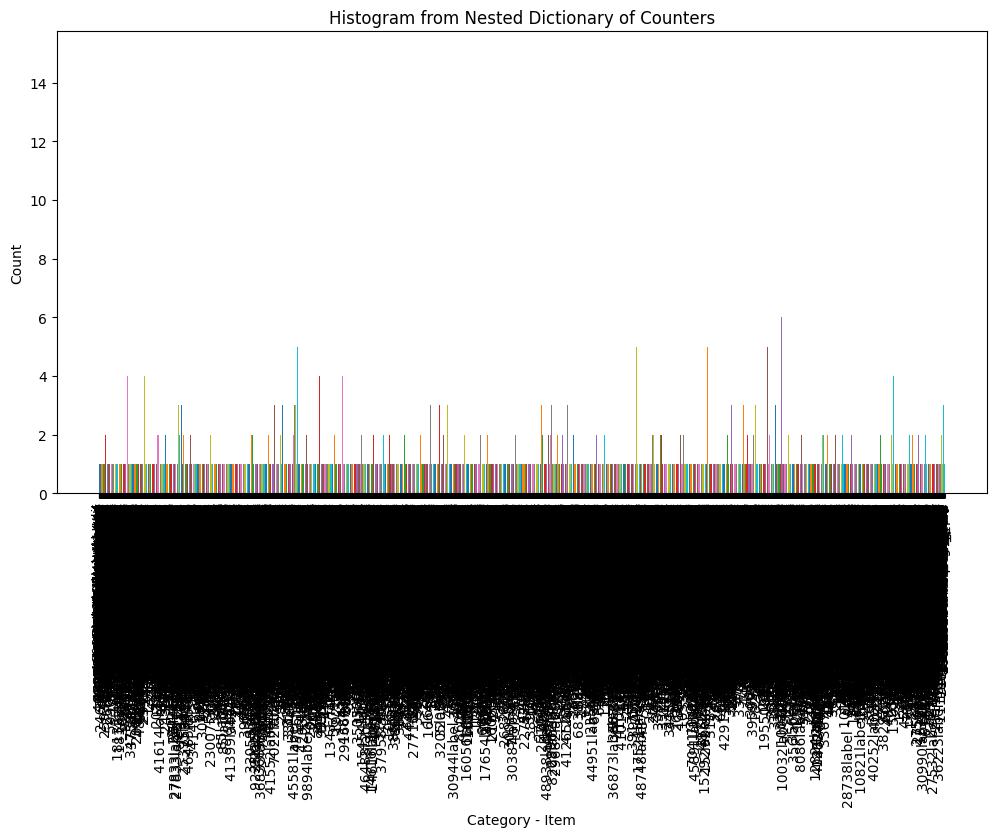

In [40]:
import matplotlib.pyplot as plt
from collections import Counter

def plot_histogram_from_nested_counters(nested_counters):
    """
    Plot a histogram from a nested dictionary of counters.
    
    Parameters:
    nested_counters (dict): A dictionary where the keys are the main categories and the values are Counter objects.
    """
    fig, ax = plt.subplots(figsize=(12, 6))

    for i, (category, counters) in enumerate(nested_counters.items()):
        labels = list(counters.keys())
        values = list(counters.values())
        ax.bar([f"{category} - {label}" for label in labels], values, color=f"C{i}")

    # Add labels and title
    ax.set_xlabel('Category - Item')
    ax.set_ylabel('Count')
    ax.set_title('Histogram from Nested Dictionary of Counters')

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=90)

    plt.show()

plot_histogram_from_nested_counters(feat_autolabels)

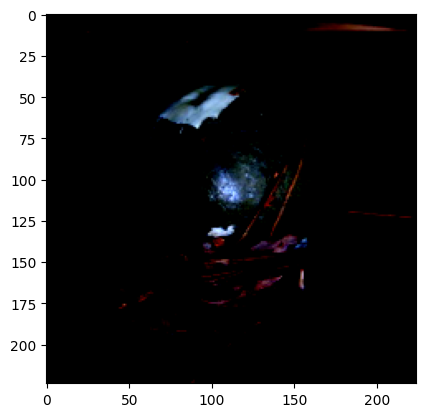

In [79]:
plt.imshow(images[44].permute((1,2,0)).numpy())

### Hierarchical Clustering on MAIs

In [ ]:
# load maximally activating images

In [ ]:
# iterate through directories

In [20]:
os.listdir(cfg.max_image_output_folder)

['TOTAL_logfreq_[-8,-6]',
 'TOTAL_logfreq_[-6,-5]',
 'TOTAL_logfreq_[-5,-4]',
 'TOTAL_logfreq_[-4,-3]',
 'TOTAL_logfreq_[-3,-2]',
 'TOTAL_logfreq_[-2,-1]',
 'TOTAL_logfreq_[-∞,-8]',
 'TOTAL_logfreq_[-1,∞]']

In [66]:
from PIL import Image
import os
import IPython


dir_feat_sets = {}
feat_ids_by_band = {}
feat_ids = []
imgnet_labels = []
ds_ids = []
feature_ma_image_embeds_full = []
for dir_name in ['TOTAL_logfreq_[-2,-1]']:
    print(os.listdir(cfg.max_image_output_folder + "/" + dir_name))
    print(len(os.listdir(cfg.max_image_output_folder + "/" + dir_name)))
    images = []
    img_dir = cfg.max_image_output_folder + "/" + dir_name
    i = 0
    dir_feats = set()
    for imagefile in os.listdir(img_dir)[:1000]:
        print(i)
        print(imagefile)
        _, feat_id, imgnet_label, ds_id = imagefile.split(":")
        feat_ids_by_band[feat_id] = dir_name
        dir_feats.add(feat_id)
        feat_ids.append(feat_id)
        imgnet_labels.append(imgnet_label)
        ds_ids.append(ds_id)
        i += 1
        IPython.display.Image(img_dir + "/" +imagefile)
        image = preproc(Image.open(img_dir + "/" + imagefile))
        images.append(image)
    with torch.no_grad(), torch.cuda.amp.autocast():
        feature_ma_image_embeds_full.append(og_model.cuda().encode_image(torch.stack(images).cuda()))
    dir_feat_sets[dir_name] = dir_feats

['neglogfreq_6.397940158843994feauture_id:27991label:pillowbid:28243.png', 'neglogfreq_6.397940158843994feauture_id:27991label:washbasinbid:24625.png', 'neglogfreq_6.397940158843994feauture_id:27991label:ostrichbid:49089.png', 'neglogfreq_6.397940158843994feauture_id:27991label:pillowbid:46169.png', 'neglogfreq_6.397940158843994feauture_id:27991label:yurtbid:9583.png', 'neglogfreq_6.397940158843994feauture_id:27991label:coral_fungusbid:953.png', 'neglogfreq_6.397940158843994feauture_id:27991label:cheetahbid:3772.png', 'neglogfreq_6.397940158843994feauture_id:27991label:king_penguinbid:46965.png', 'neglogfreq_6.397940158843994feauture_id:27991label:microphonebid:10803.png', 'neglogfreq_6.397940158843994feauture_id:27991label:water_ouzelbid:6906.png', 'neglogfreq_6.397940158843994feauture_id:27991label:mosquito_netbid:35221.png', 'neglogfreq_6.397940158843994feauture_id:27991label:whistlebid:46146.png', 'neglogfreq_6.397940158843994feauture_id:27991label:valleybid:32344.png', 'neglogfreq

21
neglogfreq_6.09691047668457feauture_id:22657label:spider_webbid:12304.png
22
neglogfreq_6.09691047668457feauture_id:22657label:ice_creambid:15353.png
23
neglogfreq_6.09691047668457feauture_id:22657label:platypusbid:16322.png
24
neglogfreq_6.09691047668457feauture_id:22657label:reelbid:21833.png
25
neglogfreq_6.09691047668457feauture_id:22657label:combination_lockbid:21745.png
26
neglogfreq_6.09691047668457feauture_id:22657label:combination_lockbid:32486.png
27
neglogfreq_6.09691047668457feauture_id:22657label:screenbid:42891.png
28
neglogfreq_6.09691047668457feauture_id:22657label:nematodebid:4922.png
29
neglogfreq_6.09691047668457feauture_id:22657label:little_blue_heronbid:45818.png
30
neglogfreq_6.09691047668457feauture_id:22657label:flamingobid:37830.png
31
neglogfreq_6.09691047668457feauture_id:22657label:sundialbid:31307.png
32
neglogfreq_6.397940158843994feauture_id:6785label:power_drillbid:26147.png
33
neglogfreq_6.397940158843994feauture_id:6785label:palacebid:30766.png
34
n

131
neglogfreq_6.397940158843994feauture_id:40013label:fur_coatbid:31172.png
132
neglogfreq_6.397940158843994feauture_id:40013label:chainlink_fencebid:1093.png
133
neglogfreq_6.397940158843994feauture_id:40013label:amphibianbid:34842.png
134
neglogfreq_6.397940158843994feauture_id:40013label:planetariumbid:45684.png
135
neglogfreq_6.397940158843994feauture_id:40013label:fur_coatbid:640.png
136
neglogfreq_6.397940158843994feauture_id:40013label:cannonbid:19074.png
137
neglogfreq_6.397940158843994feauture_id:40013label:Scotch_terrierbid:3231.png
138
neglogfreq_6.397940158843994feauture_id:40013label:breastplatebid:16868.png
139
neglogfreq_6.397940158843994feauture_id:40013label:jellyfishbid:27270.png
140
neglogfreq_6.397940158843994feauture_id:40013label:cupbid:26173.png
141
neglogfreq_6.397940158843994feauture_id:40013label:fur_coatbid:21885.png
142
neglogfreq_6.397940158843994feauture_id:40013label:airshipbid:37583.png
143
neglogfreq_6.397940158843994feauture_id:40013label:toilet_tissu

244
neglogfreq_6.397940158843994feauture_id:16996label:daisybid:4919.png
245
neglogfreq_6.397940158843994feauture_id:16996label:tobacco_shopbid:18547.png
246
neglogfreq_6.397940158843994feauture_id:16996label:sandbarbid:47283.png
247
neglogfreq_6.397940158843994feauture_id:16996label:traybid:22285.png
248
neglogfreq_6.397940158843994feauture_id:16996label:wolf_spiderbid:17789.png
249
neglogfreq_6.397940158843994feauture_id:16996label:volcanobid:40298.png
250
neglogfreq_6.397940158843994feauture_id:16996label:binderbid:41697.png
251
neglogfreq_6.397940158843994feauture_id:16996label:cratebid:5740.png
252
neglogfreq_6.397940158843994feauture_id:16996label:alpbid:43502.png
253
neglogfreq_6.397940158843994feauture_id:16996label:volcanobid:10640.png
254
neglogfreq_6.397940158843994feauture_id:16996label:pay_phonebid:46468.png
255
neglogfreq_6.397940158843994feauture_id:16996label:punching_bagbid:48983.png
256
neglogfreq_6.09691047668457feauture_id:42509label:wolf_spiderbid:17985.png
257
neg

356
neglogfreq_6.397940158843994feauture_id:20588label:guacamolebid:24911.png
357
neglogfreq_6.397940158843994feauture_id:20588label:Saint_Bernardbid:43280.png
358
neglogfreq_6.397940158843994feauture_id:20588label:radiatorbid:34868.png
359
neglogfreq_6.397940158843994feauture_id:20588label:maillotbid:9882.png
360
neglogfreq_6.397940158843994feauture_id:20588label:steam_locomotivebid:34022.png
361
neglogfreq_6.397940158843994feauture_id:20588label:boxerbid:26881.png
362
neglogfreq_6.397940158843994feauture_id:20588label:restaurantbid:18335.png
363
neglogfreq_6.397940158843994feauture_id:20588label:motor_scooterbid:46854.png
364
neglogfreq_6.397940158843994feauture_id:20588label:flatwormbid:32763.png
365
neglogfreq_6.397940158843994feauture_id:20588label:lionfishbid:20621.png
366
neglogfreq_6.397940158843994feauture_id:20588label:menubid:26996.png
367
neglogfreq_6.397940158843994feauture_id:20588label:flatwormbid:20125.png
368
neglogfreq_6.397940158843994feauture_id:9500label:earbid:423

465
neglogfreq_6.397940158843994feauture_id:43970label:frying_panbid:17769.png
466
neglogfreq_6.397940158843994feauture_id:43970label:hair_spraybid:3173.png
467
neglogfreq_6.397940158843994feauture_id:43970label:analog_clockbid:5489.png
468
neglogfreq_6.397940158843994feauture_id:43970label:radiatorbid:769.png
469
neglogfreq_6.397940158843994feauture_id:43970label:wombatbid:47618.png
470
neglogfreq_6.397940158843994feauture_id:43970label:volcanobid:22424.png
471
neglogfreq_6.397940158843994feauture_id:43970label:restaurantbid:49098.png
472
neglogfreq_6.397940158843994feauture_id:43970label:doormatbid:34104.png
473
neglogfreq_6.397940158843994feauture_id:43970label:guenonbid:6409.png
474
neglogfreq_6.397940158843994feauture_id:43970label:cauliflowerbid:6311.png
475
neglogfreq_6.397940158843994feauture_id:43970label:bell_cotebid:33060.png
476
neglogfreq_6.397940158843994feauture_id:43970label:packetbid:2068.png
477
neglogfreq_6.397940158843994feauture_id:43970label:mantisbid:21365.png
47

589
neglogfreq_6.397940158843994feauture_id:37851label:beaverbid:12618.png
590
neglogfreq_6.397940158843994feauture_id:37851label:washbasinbid:45790.png
591
neglogfreq_6.397940158843994feauture_id:37851label:eelbid:30259.png
592
neglogfreq_6.09691047668457feauture_id:35188label:tile_roofbid:32740.png
593
neglogfreq_6.09691047668457feauture_id:35188label:Model_Tbid:39197.png
594
neglogfreq_6.09691047668457feauture_id:35188label:table_lampbid:40161.png
595
neglogfreq_6.09691047668457feauture_id:35188label:plungerbid:46399.png
596
neglogfreq_6.09691047668457feauture_id:35188label:bearskinbid:35800.png
597
neglogfreq_6.09691047668457feauture_id:35188label:lampshadebid:43759.png
598
neglogfreq_6.09691047668457feauture_id:35188label:power_drillbid:26147.png
599
neglogfreq_6.09691047668457feauture_id:35188label:prayer_rugbid:49805.png
600
neglogfreq_6.09691047668457feauture_id:35188label:palacebid:30766.png
601
neglogfreq_6.09691047668457feauture_id:35188label:polebid:6102.png
602
neglogfreq_

701
neglogfreq_6.397940158843994feauture_id:636label:badgerbid:28237.png
702
neglogfreq_6.397940158843994feauture_id:636label:Rhodesian_ridgebackbid:43076.png
703
neglogfreq_6.397940158843994feauture_id:636label:Appenzellerbid:25495.png
704
neglogfreq_6.397940158843994feauture_id:636label:Australian_terrierbid:39700.png
705
neglogfreq_6.397940158843994feauture_id:30114label:syringebid:34015.png
706
neglogfreq_6.397940158843994feauture_id:30114label:daisybid:23820.png
707
neglogfreq_6.397940158843994feauture_id:30114label:menubid:26996.png
708
neglogfreq_6.397940158843994feauture_id:30114label:typewriter_keyboardbid:13265.png
709
neglogfreq_6.397940158843994feauture_id:30114label:screwdriverbid:14705.png
710
neglogfreq_6.397940158843994feauture_id:30114label:spatulabid:47765.png
711
neglogfreq_6.397940158843994feauture_id:30114label:web_sitebid:22113.png
712
neglogfreq_6.397940158843994feauture_id:30114label:American_egretbid:19018.png
713
neglogfreq_6.397940158843994feauture_id:30114la

809
neglogfreq_6.397940158843994feauture_id:35529label:fire_screenbid:11809.png
810
neglogfreq_6.397940158843994feauture_id:35529label:walking_stickbid:2013.png
811
neglogfreq_6.397940158843994feauture_id:35529label:orangutanbid:12781.png
812
neglogfreq_6.397940158843994feauture_id:35529label:dining_tablebid:13686.png
813
neglogfreq_6.397940158843994feauture_id:35529label:cradlebid:1863.png
814
neglogfreq_6.397940158843994feauture_id:35529label:grand_pianobid:18953.png
815
neglogfreq_6.397940158843994feauture_id:35529label:mosquebid:5360.png
816
neglogfreq_6.397940158843994feauture_id:35529label:red_winebid:10342.png
817
neglogfreq_6.09691047668457feauture_id:16898label:ostrichbid:23606.png
818
neglogfreq_6.09691047668457feauture_id:16898label:albatrossbid:38863.png
819
neglogfreq_6.09691047668457feauture_id:16898label:white_storkbid:1276.png
820
neglogfreq_6.09691047668457feauture_id:16898label:ostrichbid:17838.png
821
neglogfreq_6.09691047668457feauture_id:16898label:ostrichbid:33180

917
neglogfreq_6.397940158843994feauture_id:32230label:cornbid:41541.png
918
neglogfreq_6.397940158843994feauture_id:32230label:cheeseburgerbid:32810.png
919
neglogfreq_6.397940158843994feauture_id:32230label:cauliflowerbid:21439.png
920
neglogfreq_6.397940158843994feauture_id:32230label:cornbid:11593.png
921
neglogfreq_6.397940158843994feauture_id:32230label:tobacco_shopbid:10183.png
922
neglogfreq_6.397940158843994feauture_id:32230label:cabbage_butterflybid:39029.png
923
neglogfreq_6.397940158843994feauture_id:32230label:earbid:29870.png
924
neglogfreq_6.397940158843994feauture_id:32230label:guillotinebid:42451.png
925
neglogfreq_6.397940158843994feauture_id:32230label:timber_wolfbid:37117.png
926
neglogfreq_6.397940158843994feauture_id:32230label:African_greybid:44883.png
927
neglogfreq_6.397940158843994feauture_id:32230label:cowboy_hatbid:24378.png
928
neglogfreq_6.397940158843994feauture_id:32230label:earbid:39372.png
929
neglogfreq_6.397940158843994feauture_id:32230label:miniskir

15
neglogfreq_1.9688340425491333feauture_id:46905label:candlebid:25085.png
16
neglogfreq_1.683434247970581feauture_id:24679label:prairie_chickenbid:20238.png
17
neglogfreq_1.683434247970581feauture_id:24679label:cranebid:6427.png
18
neglogfreq_1.683434247970581feauture_id:24679label:coilbid:46330.png
19
neglogfreq_1.683434247970581feauture_id:24679label:prairie_chickenbid:17429.png
20
neglogfreq_1.683434247970581feauture_id:24679label:impalabid:43783.png
21
neglogfreq_1.683434247970581feauture_id:24679label:hartebeestbid:46721.png
22
neglogfreq_1.683434247970581feauture_id:24679label:promontorybid:35569.png
23
neglogfreq_1.683434247970581feauture_id:24679label:lemonbid:28822.png
24
neglogfreq_1.683434247970581feauture_id:24679label:Shetland_sheepdogbid:1970.png
25
neglogfreq_1.683434247970581feauture_id:24679label:squirrel_monkeybid:37239.png
26
neglogfreq_1.683434247970581feauture_id:24679label:monasterybid:811.png
27
neglogfreq_1.683434247970581feauture_id:24679label:speedboatbid:463

131
neglogfreq_1.6109473705291748feauture_id:18688label:jack_o__lanternbid:28059.png
132
neglogfreq_1.6109473705291748feauture_id:18688label:brassierebid:7483.png
133
neglogfreq_1.6109473705291748feauture_id:18688label:stingraybid:4872.png
134
neglogfreq_1.6109473705291748feauture_id:18688label:broccolibid:38203.png
135
neglogfreq_1.6109473705291748feauture_id:18688label:handkerchiefbid:48408.png
136
neglogfreq_1.6109473705291748feauture_id:18688label:American_alligatorbid:22521.png
137
neglogfreq_1.6109473705291748feauture_id:18688label:wooden_spoonbid:8201.png
138
neglogfreq_1.6109473705291748feauture_id:18688label:washbasinbid:13522.png
139
neglogfreq_1.6109473705291748feauture_id:18688label:zebrabid:24007.png
140
neglogfreq_1.6109473705291748feauture_id:18688label:radiatorbid:17546.png
141
neglogfreq_1.6109473705291748feauture_id:18688label:quiltbid:48319.png
142
neglogfreq_1.6109473705291748feauture_id:18688label:envelopebid:21509.png
143
neglogfreq_1.6109473705291748feauture_id:1

244
neglogfreq_1.7389371395111084feauture_id:24765label:house_finchbid:15829.png
245
neglogfreq_1.7389371395111084feauture_id:24765label:Dutch_ovenbid:43854.png
246
neglogfreq_1.7389371395111084feauture_id:24765label:hourglassbid:23966.png
247
neglogfreq_1.7389371395111084feauture_id:24765label:Irish_water_spanielbid:13758.png
248
neglogfreq_1.7389371395111084feauture_id:24765label:butternut_squashbid:35219.png
249
neglogfreq_1.7389371395111084feauture_id:24765label:lumbermillbid:6141.png
250
neglogfreq_1.7389371395111084feauture_id:24765label:traybid:4805.png
251
neglogfreq_1.7389371395111084feauture_id:24765label:butternut_squashbid:32115.png
252
neglogfreq_1.7389371395111084feauture_id:24765label:cratebid:27542.png
253
neglogfreq_1.7389371395111084feauture_id:24765label:fox_squirrelbid:49287.png
254
neglogfreq_1.7389371395111084feauture_id:24765label:bell_pepperbid:38871.png
255
neglogfreq_1.7389371395111084feauture_id:24765label:cheeseburgerbid:16998.png
256
neglogfreq_1.8996571302

352
neglogfreq_1.9971777200698853feauture_id:34942label:window_screenbid:22777.png
353
neglogfreq_1.9971777200698853feauture_id:34942label:pizzabid:12242.png
354
neglogfreq_1.9971777200698853feauture_id:34942label:strainerbid:17350.png
355
neglogfreq_1.9971777200698853feauture_id:34942label:tiger_catbid:3294.png
356
neglogfreq_1.9971777200698853feauture_id:34942label:bath_towelbid:48416.png
357
neglogfreq_1.9971777200698853feauture_id:34942label:bitternbid:44564.png
358
neglogfreq_1.9971777200698853feauture_id:34942label:greenhousebid:2473.png
359
neglogfreq_1.9971777200698853feauture_id:34942label:Petri_dishbid:39323.png
360
neglogfreq_1.9971777200698853feauture_id:34942label:haybid:44238.png
361
neglogfreq_1.9971777200698853feauture_id:34942label:European_fire_salamanderbid:28564.png
362
neglogfreq_1.9971777200698853feauture_id:34942label:stupabid:22822.png
363
neglogfreq_1.9971777200698853feauture_id:34942label:water_jugbid:5080.png
364
neglogfreq_1.9971777200698853feauture_id:34942

463
neglogfreq_1.620854139328003feauture_id:29459label:bloodhoundbid:9962.png
464
neglogfreq_1.6946659088134766feauture_id:28390label:bannisterbid:48425.png
465
neglogfreq_1.6946659088134766feauture_id:28390label:geyserbid:42471.png
466
neglogfreq_1.6946659088134766feauture_id:28390label:lakesidebid:20068.png
467
neglogfreq_1.6946659088134766feauture_id:28390label:scalebid:35229.png
468
neglogfreq_1.6946659088134766feauture_id:28390label:centipedebid:38503.png
469
neglogfreq_1.6946659088134766feauture_id:28390label:hogbid:17373.png
470
neglogfreq_1.6946659088134766feauture_id:28390label:spider_webbid:46666.png
471
neglogfreq_1.6946659088134766feauture_id:28390label:guillotinebid:26033.png
472
neglogfreq_1.6946659088134766feauture_id:28390label:nematodebid:1881.png
473
neglogfreq_1.6946659088134766feauture_id:28390label:mailboxbid:24782.png
474
neglogfreq_1.6946659088134766feauture_id:28390label:radio_telescopebid:39751.png
475
neglogfreq_1.6946659088134766feauture_id:28390label:chainli

577
neglogfreq_1.6131017208099365feauture_id:20728label:lemonbid:30966.png
578
neglogfreq_1.6131017208099365feauture_id:20728label:packetbid:11689.png
579
neglogfreq_1.6131017208099365feauture_id:20728label:burritobid:45722.png
580
neglogfreq_1.6131017208099365feauture_id:20728label:cratebid:20676.png
581
neglogfreq_1.6131017208099365feauture_id:20728label:bagelbid:28892.png
582
neglogfreq_1.6131017208099365feauture_id:20728label:hen_of_the_woodsbid:2536.png
583
neglogfreq_1.6131017208099365feauture_id:20728label:black_footed_ferretbid:1508.png
584
neglogfreq_1.6131017208099365feauture_id:20728label:plastic_bagbid:35197.png
585
neglogfreq_1.6131017208099365feauture_id:20728label:pretzelbid:29961.png
586
neglogfreq_1.6131017208099365feauture_id:20728label:plastic_bagbid:42739.png
587
neglogfreq_1.6131017208099365feauture_id:20728label:hotdogbid:16178.png
588
neglogfreq_1.6131017208099365feauture_id:20728label:chocolate_saucebid:4934.png
589
neglogfreq_1.6131017208099365feauture_id:20728

684
neglogfreq_1.8757306337356567feauture_id:20703label:stovebid:46913.png
685
neglogfreq_1.8757306337356567feauture_id:20703label:radiobid:35361.png
686
neglogfreq_1.8757306337356567feauture_id:20703label:mailbagbid:7847.png
687
neglogfreq_1.8757306337356567feauture_id:20703label:walletbid:21288.png
688
neglogfreq_1.9380501508712769feauture_id:23828label:mud_turtlebid:49702.png
689
neglogfreq_1.9380501508712769feauture_id:23828label:cohobid:15545.png
690
neglogfreq_1.9380501508712769feauture_id:23828label:centipedebid:44648.png
691
neglogfreq_1.9380501508712769feauture_id:23828label:black_widowbid:44675.png
692
neglogfreq_1.9380501508712769feauture_id:23828label:coral_fungusbid:24124.png
693
neglogfreq_1.9380501508712769feauture_id:23828label:nailbid:48966.png
694
neglogfreq_1.9380501508712769feauture_id:23828label:crayfishbid:11977.png
695
neglogfreq_1.9380501508712769feauture_id:23828label:slugbid:27531.png
696
neglogfreq_1.9380501508712769feauture_id:23828label:cliffbid:47654.png
6

794
neglogfreq_1.6394597291946411feauture_id:13436label:triceratopsbid:17961.png
795
neglogfreq_1.6394597291946411feauture_id:13436label:conchbid:9729.png
796
neglogfreq_1.6394597291946411feauture_id:13436label:feather_boabid:31269.png
797
neglogfreq_1.6394597291946411feauture_id:13436label:gasmaskbid:31676.png
798
neglogfreq_1.6394597291946411feauture_id:13436label:running_shoebid:29042.png
799
neglogfreq_1.6394597291946411feauture_id:13436label:green_lizardbid:41068.png
800
neglogfreq_1.6852229833602905feauture_id:40294label:stolebid:45761.png
801
neglogfreq_1.6852229833602905feauture_id:40294label:shower_curtainbid:26833.png
802
neglogfreq_1.6852229833602905feauture_id:40294label:overskirtbid:19175.png
803
neglogfreq_1.6852229833602905feauture_id:40294label:redbonebid:28005.png
804
neglogfreq_1.6852229833602905feauture_id:40294label:quiltbid:23637.png
805
neglogfreq_1.6852229833602905feauture_id:40294label:ponchobid:48172.png
806
neglogfreq_1.6852229833602905feauture_id:40294label:s

908
neglogfreq_1.468260645866394feauture_id:18987label:snailbid:23205.png
909
neglogfreq_1.468260645866394feauture_id:18987label:ladlebid:9884.png
910
neglogfreq_1.468260645866394feauture_id:18987label:guacamolebid:13426.png
911
neglogfreq_1.468260645866394feauture_id:18987label:candlebid:48527.png
912
neglogfreq_1.9630837440490723feauture_id:37286label:cornbid:8647.png
913
neglogfreq_1.9630837440490723feauture_id:37286label:cornbid:41541.png
914
neglogfreq_1.9630837440490723feauture_id:37286label:earbid:8439.png
915
neglogfreq_1.9630837440490723feauture_id:37286label:earbid:8280.png
916
neglogfreq_1.9630837440490723feauture_id:37286label:earbid:43988.png
917
neglogfreq_1.9630837440490723feauture_id:37286label:earbid:22465.png
918
neglogfreq_1.9630837440490723feauture_id:37286label:cornbid:7467.png
919
neglogfreq_1.9630837440490723feauture_id:37286label:cornbid:10323.png
920
neglogfreq_1.9630837440490723feauture_id:37286label:earbid:25078.png
921
neglogfreq_1.9630837440490723feauture_i

In [67]:
feature_ma_image_embeds = torch.cat(feature_ma_image_embeds_full,dim=0)

In [69]:
set.intersection(dir_feat_sets['TOTAL_logfreq_[-8,-6]'], dir_feat_sets['TOTAL_logfreq_[-2,-1]'])

set()

In [70]:
feat_ids_by_band

{'27991label': 'TOTAL_logfreq_[-8,-6]',
 '22657label': 'TOTAL_logfreq_[-8,-6]',
 '6785label': 'TOTAL_logfreq_[-8,-6]',
 '25437label': 'TOTAL_logfreq_[-8,-6]',
 '15541label': 'TOTAL_logfreq_[-8,-6]',
 '13199label': 'TOTAL_logfreq_[-8,-6]',
 '34222label': 'TOTAL_logfreq_[-8,-6]',
 '43670label': 'TOTAL_logfreq_[-8,-6]',
 '40013label': 'TOTAL_logfreq_[-8,-6]',
 '19400label': 'TOTAL_logfreq_[-8,-6]',
 '41239label': 'TOTAL_logfreq_[-8,-6]',
 '31511label': 'TOTAL_logfreq_[-8,-6]',
 '43508label': 'TOTAL_logfreq_[-8,-6]',
 '11507label': 'TOTAL_logfreq_[-8,-6]',
 '47056label': 'TOTAL_logfreq_[-8,-6]',
 '16996label': 'TOTAL_logfreq_[-8,-6]',
 '42509label': 'TOTAL_logfreq_[-8,-6]',
 '5585label': 'TOTAL_logfreq_[-8,-6]',
 '4174label': 'TOTAL_logfreq_[-8,-6]',
 '25687label': 'TOTAL_logfreq_[-8,-6]',
 '30360label': 'TOTAL_logfreq_[-8,-6]',
 '30205label': 'TOTAL_logfreq_[-8,-6]',
 '20588label': 'TOTAL_logfreq_[-8,-6]',
 '9500label': 'TOTAL_logfreq_[-8,-6]',
 '38858label': 'TOTAL_logfreq_[-8,-6]',
 '39

In [73]:
len(dir_feat_sets['TOTAL_logfreq_[-8,-6]']), len(dir_feat_sets['TOTAL_logfreq_[-2,-1]'])

(65, 63)

In [74]:
feat_ids

['27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '27991label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '22657label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '6785label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '25437label',
 '15541label',
 '15541label',
 '15541label',
 '15541labe

In [75]:
feat_band_by_idx = [f"{feat_ids_by_band[feat_id]},{imgnet_labels[i]}" for i, feat_id in enumerate(feat_ids)]


In [101]:
feat_band_by_idx_only = [f"{feat_ids_by_band[feat_id]}" for i, feat_id in enumerate(feat_ids)]


In [50]:
# feat_ids = [int(feat_id[:-5]) for feat_id in feat_ids]
# imgnet_labels = [label[:-3] for label in imgnet_labels]
# ds_ids = [int(ds_id[:-4]) for ds_id in ds_ids]

In [106]:
len(set(imgnet_labels))

769

In [23]:
dir_name = os.listdir(cfg.max_image_output_folder)[0]
img_dir = cfg.max_image_output_folder + "/" + dir_name
for imagefile in os.listdir(img_dir):
    IPython.display.Image(img_dir + "/" +imagefile)

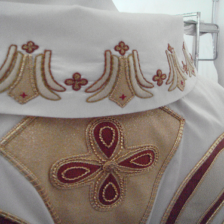

In [76]:
IPython.display.Image(img_dir + "/" + imagefile)

In [77]:
feature_ma_image_embeds.shape

torch.Size([2000, 512])

In [78]:
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

Z = linkage(feature_ma_image_embeds.cpu(), 'single')

In [80]:
fig = plt.figure(figsize=(150, 60))
dn = dendrogram(Z, labels=feat_band_by_idx)
plt.show()


In [107]:
import scipy
what, alsowhat = scipy.cluster.vq.kmeans(feature_ma_image_embeds.cpu().float(), 769)

In [108]:
what.shape

(744, 512)

In [111]:
torch_what = torch.Tensor(what)

In [126]:
from collections import defaultdict
vec_sets = defaultdict(list)
vec_sets_lowest = {}
vec_sets_lowest_label = {}
for label, vector in zip(feat_band_by_idx, feature_ma_image_embeds.cpu().float()):
    print(label)
    # get argmin of k means
    res = torch.cdist(vector[None,:].cuda(), torch_what.cuda(), p=2.0).squeeze()
    print(res.shape)
    closest_mean = torch.argmin(res)
    vec_sets[int(closest_mean.cpu())].append(label)
    if int(closest_mean.cpu()) not in vec_sets_lowest:
        vec_sets_lowest[int(closest_mean.cpu())] = res[int(closest_mean.cpu())]
        vec_sets_lowest_label[int(closest_mean.cpu())] = label
    elif vec_sets_lowest[int(closest_mean.cpu())] > res[int(closest_mean.cpu())]:
        vec_sets_lowest[int(closest_mean.cpu())] = res[int(closest_mean.cpu())]
        vec_sets_lowest_label[int(closest_mean.cpu())] = label


TOTAL_logfreq_[-8,-6],pillowbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],washbasinbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],ostrichbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],pillowbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],yurtbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],coral_fungusbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],cheetahbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],king_penguinbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],microphonebid
torch.Size([744])
TOTAL_logfreq_[-8,-6],water_ouzelbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],mosquito_netbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],whistlebid
torch.Size([744])
TOTAL_logfreq_[-8,-6],valleybid
torch.Size([744])
TOTAL_logfreq_[-8,-6],orangutanbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],promontorybid
torch.Size([744])
TOTAL_logfreq_[-8,-6],remote_controlbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],perfumebid
torch.Size([744])
TOTAL_logfreq_[-8,-6],typewriter_keyboardbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],padlockbid
torch.S

torch.Size([744])
TOTAL_logfreq_[-8,-6],barnbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],kit_foxbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],American_egretbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],nipplebid
torch.Size([744])
TOTAL_logfreq_[-8,-6],goldfishbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],meerkatbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],parallel_barsbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],miniature_pinscherbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],frying_panbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],hair_spraybid
torch.Size([744])
TOTAL_logfreq_[-8,-6],analog_clockbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],radiatorbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],wombatbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],volcanobid
torch.Size([744])
TOTAL_logfreq_[-8,-6],restaurantbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],doormatbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],guenonbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],cauliflowerbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],bell

torch.Size([744])
TOTAL_logfreq_[-8,-6],parallel_barsbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],loudspeakerbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],wild_boarbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],chimpanzeebid
torch.Size([744])
TOTAL_logfreq_[-8,-6],miniskirtbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],Border_colliebid
torch.Size([744])
TOTAL_logfreq_[-8,-6],cauliflowerbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],beer_bottlebid
torch.Size([744])
TOTAL_logfreq_[-8,-6],broccolibid
torch.Size([744])
TOTAL_logfreq_[-8,-6],cornbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],cheeseburgerbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],cauliflowerbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],cornbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],tobacco_shopbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],cabbage_butterflybid
torch.Size([744])
TOTAL_logfreq_[-8,-6],earbid
torch.Size([744])
TOTAL_logfreq_[-8,-6],guillotinebid
torch.Size([744])
TOTAL_logfreq_[-8,-6],timber_wolfbid
torch.Size([744])
TOTAL_logfr

torch.Size([744])
TOTAL_logfreq_[-2,-1],Petri_dishbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],haybid
torch.Size([744])
TOTAL_logfreq_[-2,-1],European_fire_salamanderbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],stupabid
torch.Size([744])
TOTAL_logfreq_[-2,-1],water_jugbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],worm_fencebid
torch.Size([744])
TOTAL_logfreq_[-2,-1],domebid
torch.Size([744])
TOTAL_logfreq_[-2,-1],honeycombbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],nematodebid
torch.Size([744])
TOTAL_logfreq_[-2,-1],howler_monkeybid
torch.Size([744])
TOTAL_logfreq_[-2,-1],American_black_bearbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],valleybid
torch.Size([744])
TOTAL_logfreq_[-2,-1],stone_wallbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],stone_wallbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],bighornbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],sea_urchinbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],loggerheadbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],indigo_buntingbid
torch.Size([744])
TOTAL_log

torch.Size([744])
TOTAL_logfreq_[-2,-1],Bouvier_des_Flandresbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],tailed_frogbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],hatchetbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],baboonbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],sea_lionbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],indribid
torch.Size([744])
TOTAL_logfreq_[-2,-1],oxbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],beaverbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],loudspeakerbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],indribid
torch.Size([744])
TOTAL_logfreq_[-2,-1],briardbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],polecatbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],Irish_terrierbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],Bedlington_terrierbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],ruddy_turnstonebid
torch.Size([744])
TOTAL_logfreq_[-2,-1],custard_applebid
torch.Size([744])
TOTAL_logfreq_[-2,-1],skibid
torch.Size([744])
TOTAL_logfreq_[-2,-1],Pomeranianbid
torch.Size([744])
TOTAL_logfreq_[-2,-1],bu

In [129]:
vec_sets_lowest_label

{227: 'TOTAL_logfreq_[-2,-1],pillowbid',
 206: 'TOTAL_logfreq_[-8,-6],washbasinbid',
 165: 'TOTAL_logfreq_[-8,-6],ostrichbid',
 685: 'TOTAL_logfreq_[-8,-6],yurtbid',
 21: 'TOTAL_logfreq_[-8,-6],coral_fungusbid',
 444: 'TOTAL_logfreq_[-8,-6],bustardbid',
 90: 'TOTAL_logfreq_[-8,-6],king_penguinbid',
 440: 'TOTAL_logfreq_[-2,-1],radiobid',
 98: 'TOTAL_logfreq_[-2,-1],water_ouzelbid',
 106: 'TOTAL_logfreq_[-2,-1],mosquito_netbid',
 654: 'TOTAL_logfreq_[-8,-6],whistlebid',
 490: 'TOTAL_logfreq_[-8,-6],valleybid',
 382: 'TOTAL_logfreq_[-8,-6],orangutanbid',
 348: 'TOTAL_logfreq_[-8,-6],promontorybid',
 302: 'TOTAL_logfreq_[-8,-6],comic_bookbid',
 213: 'TOTAL_logfreq_[-8,-6],perfumebid',
 357: 'TOTAL_logfreq_[-8,-6],typewriter_keyboardbid',
 583: 'TOTAL_logfreq_[-8,-6],padlockbid',
 516: 'TOTAL_logfreq_[-2,-1],altarbid',
 667: 'TOTAL_logfreq_[-2,-1],American_cootbid',
 441: 'TOTAL_logfreq_[-8,-6],spider_webbid',
 392: 'TOTAL_logfreq_[-8,-6],ice_creambid',
 494: 'TOTAL_logfreq_[-2,-1],crayfis

In [133]:
labelctr = Counter()
for value in vec_sets_lowest_label.values():
    labelctr[value.split(",")[0]] += 1
labelctr

Counter({'TOTAL_logfreq_[-8': 387, 'TOTAL_logfreq_[-2': 357})

In [104]:
ctr

Counter({'TOTAL_logfreq_[-8,-6]': 645, 'TOTAL_logfreq_[-2,-1]': 568})

In [ ]:
from collections import Counter
ctr = Counter()
for label, vector in zip(feat_band_by_idx_only, feature_ma_image_embeds.cpu().float()):
    print(label)
    if torch.norm(vector - what[0], 2) < torch.norm(vector - what[1],2):
        ctr[label] += 1